In [1]:
import re
import numpy as np
import pandas as pd
import tqdm
from collections import defaultdict
from pprint import pprint
#Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import spacy
import pyLDAvis
import pyLDAvis.gensim_models
import pyLDAvis.sklearn
from sklearn.datasets import fetch_20newsgroups
from sklearn.datasets import make_multilabel_classification
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
%matplotlib inline
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [2]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

# Load 20newsgroups Dataset via Scikit-learn

In [3]:
df = fetch_20newsgroups(remove =('headers', 'footers', 'quotes'))
docs_raw = df.data
#The ratio of training, validation and testing dataset is 80:10:10
#Split the dataset as training dataset and testing dataset with the ratio 80%:20%
training_data, testing_data = train_test_split(docs_raw, test_size=0.2, random_state=25)
#Assign 10% data as validation dataset from training dataset
validation_data, testing_data = train_test_split(testing_data, test_size=0.5, random_state=25)
print(len(docs_raw))
print(len(training_data))
print(len(validation_data))
print(len(testing_data))
data_pre_1 = [re.sub('\S*@\S*\s?', '', sent) for sent in training_data]
data_pre_2 = [re.sub('\s+', ' ', sent) for sent in data_pre_1]
data_pre_3 = [re.sub("\'", "", sent) for sent in data_pre_2]
pprint(data_pre_3[:2])

11314
9051
1131
1132
['',
 'As the subject says - Can I use a 4052 for digital signals? I dont see why '
 'it couldnt handle digital signals, but I could be wrong. Anyone have any '
 'advice? Thanks. ']


# Tokenize and Further Text Clean-up (Convert to Lowercases; Remove Punctuations)

In [4]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))
words_data = list(sent_to_words(data_pre_3))
print(words_data[:2])

[[], ['as', 'the', 'subject', 'says', 'can', 'use', 'for', 'digital', 'signals', 'dont', 'see', 'why', 'it', 'couldnt', 'handle', 'digital', 'signals', 'but', 'could', 'be', 'wrong', 'anyone', 'have', 'any', 'advice', 'thanks']]


# Remove Stopwords

In [5]:
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
# Remove stopwords
words_data_nostops = remove_stopwords(words_data)

# Create Dictionary and Corpus

In [6]:
# Dictionary
id2word = corpora.Dictionary(words_data_nostops)
# Corpus
texts = words_data_nostops
# TDF-Term Document Frquency
corpus = [id2word.doc2bow(text) for text in texts]
print(corpus[:2])

2022-04-15 21:16:21,343 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2022-04-15 21:16:22,144 : INFO : built Dictionary(61942 unique tokens: ['advice', 'anyone', 'could', 'couldnt', 'digital']...) from 9051 documents (total 964656 corpus positions)
2022-04-15 21:16:22,145 : INFO : Dictionary lifecycle event {'msg': "built Dictionary(61942 unique tokens: ['advice', 'anyone', 'could', 'couldnt', 'digital']...) from 9051 documents (total 964656 corpus positions)", 'datetime': '2022-04-15T21:16:22.145656', 'gensim': '4.1.2', 'python': '3.9.7 (default, Sep 16 2021, 16:59:28) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.19044-SP0', 'event': 'created'}


[[], [(0, 1), (1, 1), (2, 1), (3, 1), (4, 2), (5, 1), (6, 1), (7, 1), (8, 1), (9, 2), (10, 1), (11, 1)]]


# Training and Build LDA Topic Model (Gensim)

In [7]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           eta='auto',
                                           per_word_topics=True)

2022-04-15 21:16:22,655 : INFO : using autotuned alpha, starting with [0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05]
2022-04-15 21:16:22,662 : INFO : using serial LDA version on this node
2022-04-15 21:16:22,765 : INFO : running online (multi-pass) LDA training, 20 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:16:22,765 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:16:22,829 : INFO : optimized alpha [0.047522485, 0.050926827, 0.049551897, 0.048417646, 0.050102655, 0.04675779, 0.048485693, 0.051175833, 0.04756239, 0.049362555, 0.05051495, 0.050408084, 0.052367203, 0.046390794, 0.053435564, 0.05216195, 0.05699707, 0.054919157, 0.047902033, 0.048979633]
2022-04-15 21:16:22,829 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04

2022-04-15 21:16:23,924 : INFO : optimized alpha [0.04111479, 0.08675021, 0.031657368, 0.053972933, 0.069214486, 0.070133425, 0.043512005, 0.043318857, 0.04276915, 0.041805968, 0.12529474, 0.04602261, 0.08878176, 0.03225446, 0.17308302, 0.06121374, 0.18404227, 0.0567273, 0.03770827, 0.04390288]
2022-04-15 21:16:24,069 : INFO : -14.961 per-word bound, 31883.7 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:16:24,070 : INFO : PROGRESS: pass 0, at document #1000/9051
2022-04-15 21:16:24,111 : INFO : optimized alpha [0.040974062, 0.0926563, 0.030509418, 0.053170867, 0.06984611, 0.07049559, 0.043243777, 0.042681977, 0.041974507, 0.04144822, 0.13615237, 0.046594474, 0.095628016, 0.031605855, 0.19273962, 0.060385387, 0.20765962, 0.05724822, 0.03699384, 0.043545056]
2022-04-15 21:16:24,163 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:24,222 : INFO : topic #2 (0.031): 0.158*"ax" + 0.052*"max" + 0.012*"

2022-04-15 21:16:25,202 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:25,251 : INFO : topic #2 (0.025): 0.101*"ax" + 0.037*"max" + 0.008*"pl" + 0.007*"iraqi" + 0.006*"tm" + 0.005*"wm" + 0.005*"file" + 0.005*"di" + 0.004*"output" + 0.002*"entry"
2022-04-15 21:16:25,251 : INFO : topic #13 (0.028): 0.600*"ax" + 0.039*"max" + 0.030*"di" + 0.010*"pl" + 0.010*"mk" + 0.009*"wm" + 0.008*"tm" + 0.007*"ah" + 0.005*"mq" + 0.005*"tq"
2022-04-15 21:16:25,261 : INFO : topic #10 (0.203): 0.014*"image" + 0.009*"images" + 0.007*"ray" + 0.006*"also" + 0.005*"list" + 0.005*"article" + 0.005*"graphics" + 0.004*"could" + 0.004*"mail" + 0.004*"objects"
2022-04-15 21:16:25,262 : INFO : topic #14 (0.394): 0.014*"one" + 0.010*"would" + 0.006*"new" + 0.006*"time" + 0.006*"like" + 0.006*"also" + 0.005*"know" + 0.005*"card" + 0.005*"think" + 0.005*"good"
2022-04-15 21:16:25,263 : INFO : topic #16 (0.417): 0.011*"like" + 0.011*"get" + 0.010*"would" + 0.007*"dont" + 0.0

2022-04-15 21:16:26,405 : INFO : topic #14 (0.600): 0.015*"one" + 0.011*"would" + 0.007*"new" + 0.006*"time" + 0.006*"also" + 0.005*"like" + 0.005*"know" + 0.005*"good" + 0.005*"work" + 0.004*"get"
2022-04-15 21:16:26,405 : INFO : topic #16 (0.649): 0.013*"get" + 0.011*"like" + 0.011*"would" + 0.009*"dont" + 0.008*"know" + 0.007*"one" + 0.007*"im" + 0.006*"time" + 0.006*"first" + 0.006*"think"
2022-04-15 21:16:26,415 : INFO : topic diff=0.175070, rho=0.200000
2022-04-15 21:16:26,480 : INFO : PROGRESS: pass 0, at document #2700/9051
2022-04-15 21:16:26,515 : INFO : optimized alpha [0.050960466, 0.20972486, 0.022624094, 0.054065935, 0.08675815, 0.08625331, 0.040752523, 0.038769502, 0.046420135, 0.038128555, 0.27565208, 0.057344317, 0.13931668, 0.026633862, 0.63537204, 0.07418825, 0.69466615, 0.07009538, 0.036877543, 0.043601222]
2022-04-15 21:16:26,515 : INFO : PROGRESS: pass 0, at document #2800/9051
2022-04-15 21:16:26,544 : INFO : optimized alpha [0.05065481, 0.21792749, 0.022376826, 

2022-04-15 21:16:27,603 : INFO : optimized alpha [0.052859165, 0.26680738, 0.021050991, 0.05686288, 0.089444436, 0.09129537, 0.03876238, 0.037700955, 0.05022901, 0.036693405, 0.33168724, 0.06485873, 0.14836283, 0.02575522, 0.81138957, 0.07745048, 1.0135785, 0.07597058, 0.039366547, 0.04392614]
2022-04-15 21:16:27,603 : INFO : PROGRESS: pass 0, at document #3600/9051
2022-04-15 21:16:27,636 : INFO : optimized alpha [0.052660648, 0.2747197, 0.02087073, 0.05697716, 0.08993531, 0.092498496, 0.03877311, 0.037574258, 0.0506698, 0.036775384, 0.34068573, 0.06635816, 0.15003581, 0.025796697, 0.83158624, 0.07803037, 1.0512952, 0.07715068, 0.03972789, 0.043980245]
2022-04-15 21:16:27,690 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:27,751 : INFO : topic #2 (0.021): 0.026*"ax" + 0.009*"max" + 0.004*"tours" + 0.002*"iraqi" + 0.002*"pl" + 0.002*"tm" + 0.001*"wm" + 0.001*"file" + 0.001*"di" + 0.001*"output"
2022-04-15 21:16:27,751 : INFO : topic #13 (0.0

2022-04-15 21:16:28,826 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:28,894 : INFO : topic #2 (0.020): 0.014*"ax" + 0.005*"max" + 0.002*"tours" + 0.001*"iraqi" + 0.001*"pl" + 0.001*"tm" + 0.001*"wm" + 0.001*"file" + 0.001*"di" + 0.001*"output"
2022-04-15 21:16:28,894 : INFO : topic #13 (0.025): 0.776*"ax" + 0.053*"max" + 0.010*"pl" + 0.007*"ei" + 0.006*"wm" + 0.006*"di" + 0.005*"tm" + 0.004*"tq" + 0.003*"mb" + 0.002*"kn"
2022-04-15 21:16:28,894 : INFO : topic #10 (0.404): 0.009*"image" + 0.008*"also" + 0.007*"article" + 0.006*"list" + 0.005*"images" + 0.005*"christ" + 0.004*"read" + 0.004*"using" + 0.004*"faq" + 0.004*"please"
2022-04-15 21:16:28,899 : INFO : topic #14 (0.951): 0.015*"one" + 0.011*"would" + 0.006*"also" + 0.006*"new" + 0.006*"time" + 0.006*"know" + 0.005*"good" + 0.005*"like" + 0.004*"find" + 0.004*"work"
2022-04-15 21:16:28,901 : INFO : topic #16 (1.197): 0.014*"get" + 0.012*"would" + 0.012*"like" + 0.010*"dont" + 0.009*"

2022-04-15 21:16:29,963 : INFO : topic #14 (1.081): 0.015*"one" + 0.011*"would" + 0.007*"new" + 0.006*"also" + 0.005*"time" + 0.005*"know" + 0.005*"like" + 0.005*"think" + 0.005*"good" + 0.004*"find"
2022-04-15 21:16:29,963 : INFO : topic #16 (1.439): 0.014*"get" + 0.013*"like" + 0.012*"would" + 0.011*"dont" + 0.010*"know" + 0.010*"im" + 0.008*"one" + 0.007*"good" + 0.007*"think" + 0.006*"well"
2022-04-15 21:16:29,971 : INFO : topic diff=0.065921, rho=0.140028
2022-04-15 21:16:30,026 : INFO : PROGRESS: pass 0, at document #5300/9051
2022-04-15 21:16:30,060 : INFO : optimized alpha [0.059180945, 0.4591064, 0.018686557, 0.06140727, 0.09864496, 0.1047387, 0.039161246, 0.03822202, 0.059046347, 0.036157336, 0.46697828, 0.08152606, 0.17982137, 0.024553332, 1.1037798, 0.08886973, 1.4589192, 0.09100186, 0.045144767, 0.045249082]
2022-04-15 21:16:30,060 : INFO : PROGRESS: pass 0, at document #5400/9051
2022-04-15 21:16:30,087 : INFO : optimized alpha [0.05915666, 0.47282386, 0.018587723, 0.0615

2022-04-15 21:16:31,096 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:16:31,122 : INFO : optimized alpha [0.06405871, 0.58847964, 0.017884731, 0.06470187, 0.10401554, 0.11388596, 0.040241286, 0.038935013, 0.06368463, 0.036144976, 0.54258776, 0.08975136, 0.18987904, 0.02455492, 1.2190452, 0.09515471, 1.6500827, 0.09820296, 0.04707685, 0.045556445]
2022-04-15 21:16:31,166 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:31,226 : INFO : topic #2 (0.018): 0.004*"ax" + 0.003*"tours" + 0.001*"max" + 0.000*"iraqi" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:31,226 : INFO : topic #13 (0.025): 0.649*"ax" + 0.046*"max" + 0.016*"cx" + 0.011*"di" + 0.009*"pl" + 0.008*"ei" + 0.006*"wm" + 0.004*"tm" + 0.003*"tq" + 0.003*"tt"
2022-04-15 21:16:31,226 : INFO : topic #1 (0.588): 0.019*"people" + 0.013*"would" + 0.010*"one" + 0.010*"us" + 0.009*"god" + 0.009*"said" + 0.007*"say" + 0.007*"

2022-04-15 21:16:32,248 : INFO : topic #13 (0.025): 0.764*"ax" + 0.054*"max" + 0.009*"cx" + 0.007*"di" + 0.007*"pl" + 0.006*"wt" + 0.006*"ei" + 0.003*"wm" + 0.003*"tm" + 0.003*"mg"
2022-04-15 21:16:32,248 : INFO : topic #1 (0.652): 0.019*"people" + 0.012*"would" + 0.009*"one" + 0.009*"said" + 0.009*"us" + 0.008*"gun" + 0.007*"god" + 0.007*"even" + 0.007*"say" + 0.006*"many"
2022-04-15 21:16:32,248 : INFO : topic #14 (1.313): 0.013*"one" + 0.011*"would" + 0.008*"new" + 0.006*"also" + 0.005*"time" + 0.005*"control" + 0.005*"like" + 0.004*"find" + 0.004*"work" + 0.004*"two"
2022-04-15 21:16:32,248 : INFO : topic #16 (1.810): 0.013*"like" + 0.013*"would" + 0.012*"get" + 0.011*"dont" + 0.010*"know" + 0.010*"im" + 0.009*"one" + 0.008*"good" + 0.007*"could" + 0.007*"think"
2022-04-15 21:16:32,248 : INFO : topic diff=0.162914, rho=0.120386
2022-04-15 21:16:32,311 : INFO : PROGRESS: pass 0, at document #7100/9051
2022-04-15 21:16:32,344 : INFO : optimized alpha [0.06934833, 0.66248226, 0.017222

2022-04-15 21:16:33,162 : INFO : topic diff=0.034655, rho=0.113961
2022-04-15 21:16:33,225 : INFO : PROGRESS: pass 0, at document #7900/9051
2022-04-15 21:16:33,247 : INFO : optimized alpha [0.07202832, 0.7334914, 0.016709762, 0.06958881, 0.11217303, 0.123594515, 0.04204962, 0.039810695, 0.074319616, 0.03542901, 0.6143693, 0.107508935, 0.19373758, 0.024895566, 1.3457028, 0.10388893, 1.9351383, 0.11072418, 0.053958375, 0.04739168]
2022-04-15 21:16:33,371 : INFO : -15.686 per-word bound, 52729.3 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:16:33,371 : INFO : PROGRESS: pass 0, at document #8000/9051
2022-04-15 21:16:33,399 : INFO : optimized alpha [0.07244039, 0.7482336, 0.016649315, 0.06987489, 0.11251201, 0.12426357, 0.0420101, 0.039880134, 0.07446206, 0.035442334, 0.6195593, 0.10785163, 0.19563068, 0.024904229, 1.3641365, 0.10405916, 1.9780025, 0.11181552, 0.054342076, 0.047634743]
2022-04-15 21:16:33,445 : INFO : merging changes from 2

2022-04-15 21:16:34,354 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:34,411 : INFO : topic #2 (0.016): 0.003*"iraqi" + 0.001*"ax" + 0.001*"tours" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:34,411 : INFO : topic #13 (0.025): 0.766*"ax" + 0.054*"max" + 0.008*"pl" + 0.006*"tm" + 0.006*"ei" + 0.004*"di" + 0.003*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:16:34,411 : INFO : topic #1 (0.767): 0.020*"people" + 0.011*"would" + 0.009*"said" + 0.009*"one" + 0.009*"us" + 0.008*"say" + 0.007*"even" + 0.006*"government" + 0.005*"gun" + 0.005*"many"
2022-04-15 21:16:34,411 : INFO : topic #14 (1.355): 0.013*"one" + 0.010*"would" + 0.008*"new" + 0.006*"also" + 0.005*"time" + 0.005*"two" + 0.004*"years" + 0.004*"work" + 0.004*"like" + 0.004*"find"
2022-04-15 21:16:34,416 : INFO : topic #16 (2.079): 0.014*"like" + 0.013*"would" + 0.012*"dont" + 0.012*"get" + 0.011*"know" +

2022-04-15 21:16:35,481 : INFO : topic #16 (1.826): 0.013*"like" + 0.013*"would" + 0.012*"get" + 0.011*"dont" + 0.011*"know" + 0.010*"im" + 0.010*"one" + 0.008*"good" + 0.007*"think" + 0.007*"could"
2022-04-15 21:16:35,491 : INFO : topic diff=0.035989, rho=0.103969
2022-04-15 21:16:35,545 : INFO : PROGRESS: pass 1, at document #500/9051
2022-04-15 21:16:35,567 : INFO : optimized alpha [0.07812998, 0.69839823, 0.0157809, 0.07111899, 0.11481097, 0.12965423, 0.04285865, 0.041119713, 0.08084327, 0.035234064, 0.6008345, 0.11568317, 0.19472876, 0.02539547, 1.1598388, 0.109011196, 1.842677, 0.11873435, 0.059893798, 0.04950711]
2022-04-15 21:16:35,567 : INFO : PROGRESS: pass 1, at document #600/9051
2022-04-15 21:16:35,590 : INFO : optimized alpha [0.077798374, 0.7077887, 0.015729181, 0.07147527, 0.11447023, 0.12943, 0.04275112, 0.041246887, 0.08107489, 0.035159435, 0.60045063, 0.11511631, 0.19784562, 0.025341302, 1.1681918, 0.109429836, 1.8527191, 0.11796211, 0.05994858, 0.049534388]
2022-04-

2022-04-15 21:16:36,585 : INFO : PROGRESS: pass 1, at document #1400/9051
2022-04-15 21:16:36,618 : INFO : optimized alpha [0.07902285, 0.7277516, 0.015363641, 0.07237097, 0.117179826, 0.13082224, 0.04306183, 0.041613545, 0.08367186, 0.035406135, 0.6101955, 0.11818807, 0.1995107, 0.025576439, 1.1888453, 0.1103242, 1.9390274, 0.12103705, 0.06321538, 0.049836844]
2022-04-15 21:16:36,664 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:36,723 : INFO : topic #2 (0.015): 0.005*"tours" + 0.002*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:36,723 : INFO : topic #13 (0.026): 0.659*"ax" + 0.048*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.008*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"wt" + 0.004*"tq"
2022-04-15 21:16:36,723 : INFO : topic #1 (0.728): 0.024*"people" + 0.012*"would" + 0.011*"said" + 0.010*"us" + 0.010*"one" + 0.008*"say" + 0.006*"even" + 0.005*"ma

2022-04-15 21:16:37,734 : INFO : topic #13 (0.026): 0.716*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:16:37,734 : INFO : topic #1 (0.719): 0.024*"people" + 0.012*"would" + 0.011*"us" + 0.010*"one" + 0.010*"said" + 0.008*"say" + 0.006*"even" + 0.006*"many" + 0.006*"right" + 0.005*"well"
2022-04-15 21:16:37,734 : INFO : topic #14 (1.167): 0.013*"one" + 0.009*"new" + 0.009*"would" + 0.006*"also" + 0.005*"time" + 0.005*"work" + 0.005*"two" + 0.004*"many" + 0.004*"system" + 0.004*"years"
2022-04-15 21:16:37,740 : INFO : topic #16 (1.955): 0.014*"would" + 0.013*"like" + 0.012*"get" + 0.012*"dont" + 0.011*"know" + 0.011*"one" + 0.009*"im" + 0.008*"good" + 0.007*"think" + 0.007*"could"
2022-04-15 21:16:37,743 : INFO : topic diff=0.051523, rho=0.103969
2022-04-15 21:16:37,799 : INFO : PROGRESS: pass 1, at document #2300/9051
2022-04-15 21:16:37,832 : INFO : optimized alpha [0.08322209, 0.7306215, 0.0149

2022-04-15 21:16:38,744 : INFO : topic #16 (2.091): 0.014*"would" + 0.013*"like" + 0.013*"get" + 0.012*"dont" + 0.011*"one" + 0.011*"know" + 0.009*"im" + 0.008*"good" + 0.007*"could" + 0.007*"think"
2022-04-15 21:16:38,744 : INFO : topic diff=0.038483, rho=0.103969
2022-04-15 21:16:38,807 : INFO : PROGRESS: pass 1, at document #3100/9051
2022-04-15 21:16:38,840 : INFO : optimized alpha [0.08507472, 0.75484926, 0.014657455, 0.07499851, 0.11777426, 0.13297185, 0.043541994, 0.042700283, 0.08686877, 0.03574502, 0.64884967, 0.13029043, 0.20333949, 0.025494732, 1.2215185, 0.11551309, 2.0882847, 0.13054393, 0.06735225, 0.052273538]
2022-04-15 21:16:38,840 : INFO : PROGRESS: pass 1, at document #3200/9051
2022-04-15 21:16:38,854 : INFO : optimized alpha [0.08555388, 0.7578338, 0.014631659, 0.07528364, 0.11776253, 0.13350518, 0.043556985, 0.042807814, 0.087418064, 0.035801623, 0.64960617, 0.13022797, 0.20184582, 0.025424233, 1.2265912, 0.116128735, 2.1379423, 0.13128605, 0.067997664, 0.05225733

2022-04-15 21:16:39,846 : INFO : PROGRESS: pass 1, at document #4000/9051
2022-04-15 21:16:39,860 : INFO : optimized alpha [0.088359706, 0.78936094, 0.014310902, 0.07621355, 0.119676635, 0.13562113, 0.043372616, 0.04252666, 0.0895095, 0.035885148, 0.6768492, 0.13826866, 0.20397165, 0.025348179, 1.2847939, 0.118048884, 2.2838256, 0.1379304, 0.069908746, 0.05246903]
2022-04-15 21:16:39,913 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:39,971 : INFO : topic #2 (0.014): 0.004*"iraqi" + 0.004*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:39,971 : INFO : topic #13 (0.025): 0.705*"ax" + 0.051*"max" + 0.011*"pl" + 0.008*"wm" + 0.007*"di" + 0.006*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.002*"mf"
2022-04-15 21:16:39,971 : INFO : topic #1 (0.789): 0.023*"people" + 0.012*"would" + 0.010*"us" + 0.010*"one" + 0.010*"said" + 0.008*"say" + 0.007*"mr" + 0.006*"w

2022-04-15 21:16:40,854 : INFO : topic #1 (0.818): 0.022*"people" + 0.013*"would" + 0.010*"us" + 0.010*"said" + 0.010*"one" + 0.008*"say" + 0.007*"think" + 0.007*"even" + 0.006*"well" + 0.006*"right"
2022-04-15 21:16:40,854 : INFO : topic #14 (1.256): 0.013*"one" + 0.009*"new" + 0.009*"would" + 0.006*"also" + 0.005*"time" + 0.005*"work" + 0.005*"president" + 0.005*"two" + 0.004*"youre" + 0.004*"system"
2022-04-15 21:16:40,860 : INFO : topic #16 (2.286): 0.015*"would" + 0.014*"like" + 0.013*"get" + 0.013*"dont" + 0.012*"know" + 0.012*"one" + 0.011*"im" + 0.009*"good" + 0.008*"think" + 0.008*"could"
2022-04-15 21:16:40,861 : INFO : topic diff=0.034649, rho=0.103969
2022-04-15 21:16:40,918 : INFO : PROGRESS: pass 1, at document #4900/9051
2022-04-15 21:16:40,950 : INFO : optimized alpha [0.08939373, 0.83042467, 0.01397549, 0.077992745, 0.12165686, 0.13701202, 0.043723848, 0.043072615, 0.09171928, 0.035436306, 0.6913688, 0.14023797, 0.20844194, 0.025104605, 1.2588257, 0.119602405, 2.306402

2022-04-15 21:16:41,857 : INFO : topic diff=0.026321, rho=0.103969
2022-04-15 21:16:41,914 : INFO : PROGRESS: pass 1, at document #5700/9051
2022-04-15 21:16:41,946 : INFO : optimized alpha [0.091213666, 0.87724, 0.013682855, 0.08031778, 0.123155355, 0.14190301, 0.044165943, 0.04407043, 0.09551326, 0.035936765, 0.7127268, 0.14549904, 0.21630616, 0.024942657, 1.3149046, 0.122837156, 2.4133961, 0.14418225, 0.076421574, 0.052797683]
2022-04-15 21:16:41,946 : INFO : PROGRESS: pass 1, at document #5800/9051
2022-04-15 21:16:41,962 : INFO : optimized alpha [0.09143204, 0.87979114, 0.01364789, 0.08042022, 0.1234524, 0.14186916, 0.04438435, 0.044358224, 0.09667178, 0.036073506, 0.7210082, 0.14621751, 0.21722351, 0.024932232, 1.3218764, 0.122356206, 2.4233642, 0.14537929, 0.076290965, 0.052616138]
2022-04-15 21:16:42,013 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:42,071 : INFO : topic #2 (0.014): 0.002*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000

2022-04-15 21:16:43,015 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:43,072 : INFO : topic #2 (0.013): 0.002*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:43,072 : INFO : topic #13 (0.025): 0.672*"ax" + 0.048*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"tt"
2022-04-15 21:16:43,072 : INFO : topic #1 (0.910): 0.023*"people" + 0.013*"would" + 0.010*"us" + 0.010*"said" + 0.009*"one" + 0.007*"say" + 0.006*"even" + 0.006*"law" + 0.006*"think" + 0.005*"come"
2022-04-15 21:16:43,078 : INFO : topic #14 (1.384): 0.011*"one" + 0.010*"new" + 0.008*"would" + 0.007*"also" + 0.005*"two" + 0.005*"time" + 0.005*"work" + 0.005*"used" + 0.004*"system" + 0.004*"control"
2022-04-15 21:16:43,078 : INFO : topic #16 (2.546): 0.015*"would" + 0.014*"like" + 0.012*"dont" + 0.012*"get" + 0.012*"know" + 

2022-04-15 21:16:44,074 : INFO : topic #14 (1.369): 0.011*"one" + 0.010*"new" + 0.008*"would" + 0.007*"also" + 0.006*"control" + 0.005*"two" + 0.005*"time" + 0.005*"used" + 0.005*"work" + 0.004*"etc"
2022-04-15 21:16:44,079 : INFO : topic #16 (2.587): 0.016*"would" + 0.015*"like" + 0.013*"dont" + 0.012*"get" + 0.012*"one" + 0.012*"know" + 0.011*"im" + 0.009*"think" + 0.008*"good" + 0.008*"could"
2022-04-15 21:16:44,080 : INFO : topic diff=0.025302, rho=0.103969
2022-04-15 21:16:44,147 : INFO : PROGRESS: pass 1, at document #7500/9051
2022-04-15 21:16:44,170 : INFO : optimized alpha [0.09941296, 0.9160646, 0.013094818, 0.0833974, 0.12924199, 0.14886916, 0.046310615, 0.045997296, 0.10365486, 0.035812005, 0.7549118, 0.16038811, 0.22042443, 0.025077421, 1.3616875, 0.12790602, 2.5808828, 0.15259454, 0.08292366, 0.053415794]
2022-04-15 21:16:44,170 : INFO : PROGRESS: pass 1, at document #7600/9051
2022-04-15 21:16:44,194 : INFO : optimized alpha [0.09932664, 0.9118839, 0.013071286, 0.0844570

2022-04-15 21:16:45,177 : INFO : PROGRESS: pass 1, at document #8400/9051
2022-04-15 21:16:45,193 : INFO : optimized alpha [0.10118375, 0.93300825, 0.012821895, 0.08617232, 0.13017039, 0.15139948, 0.046961445, 0.04641495, 0.10706551, 0.03627473, 0.77241695, 0.16556624, 0.22358683, 0.025503462, 1.3640766, 0.12955423, 2.65946, 0.15450734, 0.086119324, 0.055345017]
2022-04-15 21:16:45,245 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:45,306 : INFO : topic #2 (0.013): 0.004*"iraqi" + 0.001*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:45,306 : INFO : topic #13 (0.026): 0.703*"ax" + 0.051*"max" + 0.008*"di" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"wm" + 0.004*"ql" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:16:45,306 : INFO : topic #1 (0.933): 0.022*"people" + 0.011*"would" + 0.010*"us" + 0.008*"one" + 0.008*"said" + 0.007*"even" + 0.007*"gun" + 0.006*"s

2022-04-15 21:16:46,370 : INFO : topic #1 (0.903): 0.024*"people" + 0.011*"would" + 0.011*"us" + 0.011*"said" + 0.009*"one" + 0.007*"say" + 0.006*"government" + 0.006*"even" + 0.006*"gun" + 0.005*"come"
2022-04-15 21:16:46,370 : INFO : topic #14 (1.335): 0.011*"new" + 0.010*"one" + 0.007*"would" + 0.006*"also" + 0.005*"two" + 0.005*"years" + 0.005*"used" + 0.005*"high" + 0.005*"time" + 0.005*"many"
2022-04-15 21:16:46,370 : INFO : topic #16 (2.693): 0.015*"would" + 0.014*"like" + 0.013*"dont" + 0.013*"one" + 0.012*"know" + 0.012*"get" + 0.010*"im" + 0.010*"good" + 0.009*"think" + 0.008*"could"
2022-04-15 21:16:46,377 : INFO : topic diff=0.040205, rho=0.103969
2022-04-15 21:16:46,443 : INFO : PROGRESS: pass 2, at document #100/9051
2022-04-15 21:16:46,457 : INFO : optimized alpha [0.10375552, 0.86087227, 0.012610303, 0.08669536, 0.1313019, 0.15200467, 0.047721777, 0.047363225, 0.108769275, 0.036367543, 0.75167036, 0.16716284, 0.22480178, 0.02568187, 1.267045, 0.13113931, 2.5802712, 0.15

2022-04-15 21:16:47,363 : INFO : optimized alpha [0.10262624, 0.8266552, 0.012376029, 0.08519926, 0.12977232, 0.15107322, 0.047382392, 0.04767012, 0.10965463, 0.035910346, 0.73332137, 0.16222514, 0.22628924, 0.025910728, 1.2057647, 0.12997523, 2.4344096, 0.15684973, 0.09177547, 0.055446487]
2022-04-15 21:16:47,470 : INFO : -14.639 per-word bound, 25522.7 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:16:47,470 : INFO : PROGRESS: pass 2, at document #1000/9051
2022-04-15 21:16:47,498 : INFO : optimized alpha [0.10275466, 0.82738215, 0.0123455655, 0.08483596, 0.12877907, 0.1500045, 0.047454197, 0.047969993, 0.108700305, 0.03595922, 0.73821855, 0.16235912, 0.22776873, 0.02593926, 1.1998352, 0.12924229, 2.4507885, 0.15714411, 0.09247243, 0.055492166]
2022-04-15 21:16:47,546 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:47,606 : INFO : topic #2 (0.012): 0.005*"tours" + 0.003*"iraqi" + 0.000*"ax" + 

2022-04-15 21:16:48,452 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:48,510 : INFO : topic #2 (0.012): 0.010*"iraqi" + 0.004*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:48,510 : INFO : topic #13 (0.026): 0.670*"ax" + 0.048*"max" + 0.016*"di" + 0.013*"pl" + 0.009*"tm" + 0.008*"wm" + 0.006*"ei" + 0.004*"mk" + 0.004*"tq" + 0.004*"mq"
2022-04-15 21:16:48,510 : INFO : topic #1 (0.822): 0.026*"people" + 0.012*"us" + 0.012*"would" + 0.011*"said" + 0.009*"one" + 0.007*"say" + 0.006*"many" + 0.006*"even" + 0.006*"law" + 0.006*"right"
2022-04-15 21:16:48,510 : INFO : topic #14 (1.196): 0.011*"new" + 0.010*"one" + 0.006*"also" + 0.006*"would" + 0.005*"many" + 0.005*"work" + 0.005*"two" + 0.005*"system" + 0.005*"time" + 0.004*"high"
2022-04-15 21:16:48,515 : INFO : topic #16 (2.497): 0.016*"would" + 0.015*"like" + 0.013*"one" + 0.013*"dont" + 0.012*"know" + 0.0

2022-04-15 21:16:49,537 : INFO : topic #14 (1.228): 0.012*"new" + 0.010*"one" + 0.007*"also" + 0.006*"would" + 0.005*"system" + 0.005*"work" + 0.005*"time" + 0.005*"many" + 0.005*"two" + 0.005*"high"
2022-04-15 21:16:49,537 : INFO : topic #16 (2.560): 0.017*"would" + 0.014*"like" + 0.013*"one" + 0.013*"dont" + 0.013*"get" + 0.012*"know" + 0.009*"im" + 0.009*"think" + 0.008*"could" + 0.008*"good"
2022-04-15 21:16:49,537 : INFO : topic diff=0.046479, rho=0.103412
2022-04-15 21:16:49,600 : INFO : PROGRESS: pass 2, at document #2700/9051
2022-04-15 21:16:49,633 : INFO : optimized alpha [0.10822058, 0.83366346, 0.011923925, 0.08639103, 0.12953086, 0.14910771, 0.048338216, 0.04873058, 0.10778298, 0.03665294, 0.77475137, 0.17117652, 0.23115325, 0.026116366, 1.2395062, 0.13331105, 2.5946908, 0.1624931, 0.09440426, 0.057046566]
2022-04-15 21:16:49,633 : INFO : PROGRESS: pass 2, at document #2800/9051
2022-04-15 21:16:49,655 : INFO : optimized alpha [0.10767782, 0.837346, 0.011897868, 0.08658896

2022-04-15 21:16:50,647 : INFO : PROGRESS: pass 2, at document #3600/9051
2022-04-15 21:16:50,680 : INFO : optimized alpha [0.108388245, 0.85415435, 0.011721444, 0.08769502, 0.13007897, 0.149554, 0.047696885, 0.049056727, 0.10946171, 0.036695648, 0.7918996, 0.17460689, 0.23053579, 0.026056996, 1.2612183, 0.13389699, 2.7859566, 0.16576064, 0.09774682, 0.057715166]
2022-04-15 21:16:50,725 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:50,785 : INFO : topic #2 (0.012): 0.005*"iraqi" + 0.005*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:50,785 : INFO : topic #13 (0.026): 0.721*"ax" + 0.052*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.006*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:16:50,785 : INFO : topic #1 (0.854): 0.026*"people" + 0.012*"would" + 0.011*"said" + 0.011*"us" + 0.010*"mr" + 0.009*"one" + 0.007*"say" + 0.006*"ma

2022-04-15 21:16:51,803 : INFO : topic #13 (0.026): 0.766*"ax" + 0.053*"max" + 0.010*"pl" + 0.007*"di" + 0.007*"ei" + 0.006*"wm" + 0.005*"tm" + 0.004*"tq" + 0.002*"mb" + 0.002*"kn"
2022-04-15 21:16:51,803 : INFO : topic #1 (0.876): 0.025*"people" + 0.012*"would" + 0.011*"us" + 0.010*"said" + 0.009*"one" + 0.007*"mr" + 0.007*"say" + 0.006*"government" + 0.006*"right" + 0.006*"well"
2022-04-15 21:16:51,809 : INFO : topic #14 (1.246): 0.011*"new" + 0.010*"one" + 0.007*"also" + 0.006*"would" + 0.005*"two" + 0.005*"system" + 0.005*"time" + 0.005*"work" + 0.005*"youre" + 0.005*"used"
2022-04-15 21:16:51,810 : INFO : topic #16 (2.741): 0.017*"would" + 0.014*"like" + 0.014*"one" + 0.014*"dont" + 0.014*"get" + 0.013*"know" + 0.010*"im" + 0.009*"good" + 0.009*"think" + 0.008*"could"
2022-04-15 21:16:51,812 : INFO : topic diff=0.030499, rho=0.103412
2022-04-15 21:16:51,878 : INFO : PROGRESS: pass 2, at document #4500/9051
2022-04-15 21:16:51,902 : INFO : optimized alpha [0.109117106, 0.8774359, 0

2022-04-15 21:16:52,826 : INFO : topic #16 (2.870): 0.016*"would" + 0.014*"like" + 0.014*"dont" + 0.014*"one" + 0.014*"know" + 0.013*"get" + 0.011*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:16:52,836 : INFO : topic diff=0.031318, rho=0.103412
2022-04-15 21:16:52,899 : INFO : PROGRESS: pass 2, at document #5300/9051
2022-04-15 21:16:52,926 : INFO : optimized alpha [0.110393174, 0.92085785, 0.011323511, 0.08985959, 0.13291754, 0.15260065, 0.048318684, 0.05010984, 0.11223165, 0.03694489, 0.8231008, 0.17679971, 0.24058661, 0.0256136, 1.2888243, 0.13702714, 2.8804266, 0.17083618, 0.10281859, 0.057988252]
2022-04-15 21:16:52,926 : INFO : PROGRESS: pass 2, at document #5400/9051
2022-04-15 21:16:52,952 : INFO : optimized alpha [0.110545374, 0.9257801, 0.011300882, 0.08989026, 0.13229936, 0.15281403, 0.04821638, 0.050413206, 0.11232501, 0.036974616, 0.82398885, 0.17817816, 0.24003102, 0.025604703, 1.2878817, 0.13713852, 2.866866, 0.1710826, 0.10239067, 0.057819672]
2022-

2022-04-15 21:16:53,951 : INFO : PROGRESS: pass 2, at document #6200/9051
2022-04-15 21:16:53,976 : INFO : optimized alpha [0.11462215, 0.95653725, 0.011130042, 0.09189651, 0.13628569, 0.15722579, 0.049416102, 0.051427066, 0.115418136, 0.03727378, 0.87074494, 0.17952065, 0.2487026, 0.025683034, 1.3190838, 0.13836342, 2.9595163, 0.17411391, 0.10231445, 0.05791524]
2022-04-15 21:16:54,021 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:54,081 : INFO : topic #2 (0.011): 0.003*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:54,081 : INFO : topic #13 (0.026): 0.693*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"tt"
2022-04-15 21:16:54,081 : INFO : topic #1 (0.957): 0.024*"people" + 0.012*"would" + 0.012*"us" + 0.011*"said" + 0.008*"one" + 0.006*"law" + 0.006*"say" + 0.006*"c

2022-04-15 21:16:55,108 : INFO : topic #13 (0.026): 0.783*"ax" + 0.055*"max" + 0.007*"di" + 0.007*"pl" + 0.006*"ei" + 0.004*"wm" + 0.003*"tm" + 0.003*"mg" + 0.003*"tq" + 0.002*"gk"
2022-04-15 21:16:55,108 : INFO : topic #1 (0.940): 0.023*"people" + 0.011*"would" + 0.011*"us" + 0.011*"said" + 0.009*"gun" + 0.008*"one" + 0.007*"law" + 0.006*"mr" + 0.006*"even" + 0.006*"say"
2022-04-15 21:16:55,108 : INFO : topic #14 (1.342): 0.012*"new" + 0.009*"one" + 0.007*"also" + 0.006*"control" + 0.005*"two" + 0.005*"used" + 0.005*"would" + 0.005*"many" + 0.005*"high" + 0.005*"system"
2022-04-15 21:16:55,108 : INFO : topic #16 (2.998): 0.017*"would" + 0.015*"like" + 0.014*"one" + 0.013*"dont" + 0.013*"know" + 0.012*"get" + 0.010*"im" + 0.009*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:16:55,116 : INFO : topic diff=0.122416, rho=0.103412
2022-04-15 21:16:55,172 : INFO : PROGRESS: pass 2, at document #7100/9051
2022-04-15 21:16:55,205 : INFO : optimized alpha [0.118357785, 0.93855053, 0.01093

2022-04-15 21:16:56,023 : INFO : topic diff=0.022628, rho=0.103412
2022-04-15 21:16:56,086 : INFO : PROGRESS: pass 2, at document #7900/9051
2022-04-15 21:16:56,109 : INFO : optimized alpha [0.11796513, 0.9499108, 0.01077565, 0.094154224, 0.1389889, 0.15927428, 0.0513188, 0.052106056, 0.12187614, 0.03706021, 0.8715431, 0.18849827, 0.2502341, 0.026012978, 1.333213, 0.13845515, 3.0032845, 0.17723082, 0.109283626, 0.05862619]
2022-04-15 21:16:56,233 : INFO : -15.631 per-word bound, 50732.6 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:16:56,233 : INFO : PROGRESS: pass 2, at document #8000/9051
2022-04-15 21:16:56,262 : INFO : optimized alpha [0.117889255, 0.9582333, 0.010754937, 0.09436132, 0.13934252, 0.15944424, 0.051294144, 0.052291393, 0.12143532, 0.03708945, 0.8761289, 0.18931021, 0.2513529, 0.02602844, 1.3421899, 0.13834713, 3.047529, 0.17802256, 0.10927011, 0.058961015]
2022-04-15 21:16:56,308 : INFO : merging changes from 200 docume

2022-04-15 21:16:57,228 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:57,287 : INFO : topic #2 (0.011): 0.003*"iraqi" + 0.001*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:57,287 : INFO : topic #13 (0.026): 0.775*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:16:57,287 : INFO : topic #1 (0.928): 0.024*"people" + 0.011*"us" + 0.011*"said" + 0.011*"would" + 0.007*"one" + 0.007*"gun" + 0.007*"government" + 0.006*"law" + 0.006*"state" + 0.006*"say"
2022-04-15 21:16:57,287 : INFO : topic #14 (1.303): 0.012*"new" + 0.008*"one" + 0.006*"also" + 0.006*"two" + 0.006*"high" + 0.005*"control" + 0.005*"system" + 0.005*"years" + 0.005*"used" + 0.005*"many"
2022-04-15 21:16:57,294 : INFO : topic #16 (3.042): 0.017*"would" + 0.015*"like" + 0.014*"one" + 0.014*"dont" + 0.013*"kno

2022-04-15 21:16:58,373 : INFO : topic #16 (2.695): 0.017*"would" + 0.014*"like" + 0.014*"one" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"im" + 0.009*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:16:58,385 : INFO : topic diff=0.030285, rho=0.102863
2022-04-15 21:16:58,449 : INFO : PROGRESS: pass 3, at document #500/9051
2022-04-15 21:16:58,472 : INFO : optimized alpha [0.12065576, 0.8337269, 0.010445238, 0.09252799, 0.13790354, 0.1586617, 0.052347414, 0.05345399, 0.12110666, 0.037072085, 0.8283408, 0.1867405, 0.24531324, 0.02654277, 1.1617476, 0.1381453, 2.7181695, 0.17828651, 0.11264402, 0.05995349]
2022-04-15 21:16:58,472 : INFO : PROGRESS: pass 3, at document #600/9051
2022-04-15 21:16:58,486 : INFO : optimized alpha [0.11965739, 0.84372836, 0.010425634, 0.092819616, 0.13746008, 0.15830171, 0.052187644, 0.053559292, 0.12090673, 0.03701584, 0.82980996, 0.18472764, 0.25052822, 0.026498633, 1.1749376, 0.13841829, 2.7504232, 0.17643628, 0.11293764, 0.059957016]
2022-04-

2022-04-15 21:16:59,492 : INFO : PROGRESS: pass 3, at document #1400/9051
2022-04-15 21:16:59,517 : INFO : optimized alpha [0.119610466, 0.8526805, 0.010294757, 0.0923835, 0.13827375, 0.15831664, 0.052215315, 0.053752955, 0.12044625, 0.037397154, 0.8376138, 0.18314677, 0.2525444, 0.026840683, 1.2012588, 0.13800344, 2.8417733, 0.1778991, 0.11600669, 0.05994224]
2022-04-15 21:16:59,563 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:16:59,622 : INFO : topic #2 (0.010): 0.005*"tours" + 0.002*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:16:59,622 : INFO : topic #13 (0.027): 0.669*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"tq" + 0.004*"gk"
2022-04-15 21:16:59,622 : INFO : topic #1 (0.853): 0.028*"people" + 0.012*"us" + 0.012*"said" + 0.011*"would" + 0.008*"one" + 0.006*"law" + 0.006*"say" + 0.006*"gove

2022-04-15 21:17:00,639 : INFO : topic #13 (0.027): 0.723*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:17:00,639 : INFO : topic #10 (0.855): 0.012*"image" + 0.008*"code" + 0.008*"also" + 0.007*"may" + 0.007*"list" + 0.007*"name" + 0.007*"read" + 0.007*"number" + 0.006*"source" + 0.006*"send"
2022-04-15 21:17:00,639 : INFO : topic #14 (1.173): 0.014*"new" + 0.008*"one" + 0.006*"also" + 0.006*"system" + 0.006*"high" + 0.006*"two" + 0.005*"many" + 0.005*"control" + 0.004*"work" + 0.004*"used"
2022-04-15 21:17:00,645 : INFO : topic #16 (2.803): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.009*"im" + 0.009*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:17:00,647 : INFO : topic diff=0.048095, rho=0.102863
2022-04-15 21:17:00,703 : INFO : PROGRESS: pass 3, at document #2300/9051
2022-04-15 21:17:00,735 : INFO : optimized alpha [0.12271934, 0.83149266,

2022-04-15 21:17:01,632 : INFO : topic #16 (2.947): 0.017*"would" + 0.015*"one" + 0.014*"like" + 0.013*"dont" + 0.013*"know" + 0.013*"get" + 0.009*"im" + 0.009*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:17:01,632 : INFO : topic diff=0.037056, rho=0.102863
2022-04-15 21:17:01,695 : INFO : PROGRESS: pass 3, at document #3100/9051
2022-04-15 21:17:01,718 : INFO : optimized alpha [0.123895034, 0.840336, 0.010025038, 0.0932723, 0.13672458, 0.15540811, 0.05220668, 0.05452472, 0.11958499, 0.037828535, 0.87577605, 0.19171911, 0.25432628, 0.026923725, 1.2138416, 0.14031954, 2.9267426, 0.18131594, 0.11467917, 0.06157601]
2022-04-15 21:17:01,718 : INFO : PROGRESS: pass 3, at document #3200/9051
2022-04-15 21:17:01,741 : INFO : optimized alpha [0.12431842, 0.8423978, 0.010017987, 0.09363614, 0.13680835, 0.15597048, 0.052188866, 0.054648492, 0.12002958, 0.037894636, 0.87572455, 0.19046009, 0.25245112, 0.026855068, 1.2160759, 0.14079644, 2.9758646, 0.18186767, 0.11558924, 0.061575904]
2022

2022-04-15 21:17:02,697 : INFO : PROGRESS: pass 3, at document #4000/9051
2022-04-15 21:17:02,718 : INFO : optimized alpha [0.12806514, 0.8675369, 0.0098814145, 0.09369891, 0.13809748, 0.15675962, 0.051902458, 0.05410114, 0.12001832, 0.03801624, 0.90335166, 0.1955222, 0.25428444, 0.026761295, 1.2621408, 0.141316, 3.1327362, 0.18726055, 0.11601283, 0.06147191]
2022-04-15 21:17:02,769 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:02,828 : INFO : topic #2 (0.010): 0.004*"iraqi" + 0.004*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"targets" + 0.000*"file" + 0.000*"di"
2022-04-15 21:17:02,828 : INFO : topic #13 (0.027): 0.710*"ax" + 0.051*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.006*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.002*"mf"
2022-04-15 21:17:02,828 : INFO : topic #10 (0.903): 0.009*"also" + 0.009*"image" + 0.008*"list" + 0.007*"may" + 0.007*"information" + 0.007*"name" + 0.007*"article" 

2022-04-15 21:17:03,698 : INFO : topic #10 (0.906): 0.009*"also" + 0.009*"image" + 0.007*"article" + 0.007*"may" + 0.007*"information" + 0.007*"list" + 0.007*"read" + 0.006*"source" + 0.006*"name" + 0.006*"please"
2022-04-15 21:17:03,698 : INFO : topic #14 (1.220): 0.013*"new" + 0.008*"one" + 0.006*"also" + 0.006*"system" + 0.006*"two" + 0.005*"used" + 0.005*"high" + 0.005*"control" + 0.005*"youre" + 0.005*"many"
2022-04-15 21:17:03,704 : INFO : topic #16 (3.082): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.014*"know" + 0.013*"get" + 0.010*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:17:03,705 : INFO : topic diff=0.033127, rho=0.102863
2022-04-15 21:17:03,771 : INFO : PROGRESS: pass 3, at document #4900/9051
2022-04-15 21:17:03,785 : INFO : optimized alpha [0.12671497, 0.8912373, 0.00973811, 0.09470128, 0.1392621, 0.1569029, 0.052230515, 0.05444058, 0.11991006, 0.037527323, 0.9086478, 0.19220217, 0.26056582, 0.026565822, 1.2209976, 0.14106761, 3.1

2022-04-15 21:17:04,688 : INFO : topic diff=0.024382, rho=0.102863
2022-04-15 21:17:04,741 : INFO : PROGRESS: pass 3, at document #5700/9051
2022-04-15 21:17:04,763 : INFO : optimized alpha [0.12764291, 0.92452174, 0.009607229, 0.096462585, 0.14051667, 0.1607097, 0.052335806, 0.05530215, 0.12253938, 0.038169917, 0.9290506, 0.19339736, 0.26953855, 0.026390241, 1.2704697, 0.14361191, 3.195076, 0.18821421, 0.11915698, 0.061367407]
2022-04-15 21:17:04,763 : INFO : PROGRESS: pass 3, at document #5800/9051
2022-04-15 21:17:04,785 : INFO : optimized alpha [0.12797494, 0.9245477, 0.009591475, 0.09643941, 0.1411275, 0.16036995, 0.052556846, 0.055590093, 0.1237746, 0.038318586, 0.93957335, 0.19329804, 0.27043942, 0.026382225, 1.2787005, 0.14312196, 3.2023137, 0.18940642, 0.11818299, 0.061117068]
2022-04-15 21:17:04,835 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:04,895 : INFO : topic #2 (0.010): 0.002*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000*"m

2022-04-15 21:17:05,815 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:05,873 : INFO : topic #2 (0.009): 0.002*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"wm" + 0.000*"targets"
2022-04-15 21:17:05,873 : INFO : topic #13 (0.027): 0.678*"ax" + 0.048*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"tt"
2022-04-15 21:17:05,873 : INFO : topic #10 (0.963): 0.026*"db" + 0.009*"also" + 0.008*"list" + 0.008*"may" + 0.007*"information" + 0.007*"code" + 0.007*"name" + 0.006*"source" + 0.006*"article" + 0.006*"please"
2022-04-15 21:17:05,878 : INFO : topic #14 (1.335): 0.014*"new" + 0.007*"one" + 0.007*"also" + 0.006*"two" + 0.006*"system" + 0.006*"high" + 0.005*"used" + 0.005*"control" + 0.005*"many" + 0.005*"etc"
2022-04-15 21:17:05,879 : INFO : topic #16 (3.296): 0.018*"would" + 0.015*"one" + 0.015*"like" + 0.014*"dont" + 

2022-04-15 21:17:06,853 : INFO : topic #14 (1.311): 0.014*"new" + 0.007*"one" + 0.007*"control" + 0.006*"also" + 0.006*"two" + 0.006*"high" + 0.006*"used" + 0.005*"system" + 0.004*"many" + 0.004*"etc"
2022-04-15 21:17:06,859 : INFO : topic #16 (3.302): 0.019*"would" + 0.015*"like" + 0.015*"one" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.010*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:17:06,860 : INFO : topic diff=0.024013, rho=0.102863
2022-04-15 21:17:06,917 : INFO : PROGRESS: pass 3, at document #7500/9051
2022-04-15 21:17:06,939 : INFO : optimized alpha [0.13441932, 0.929963, 0.009338734, 0.09758927, 0.14571089, 0.16448875, 0.05448787, 0.056623105, 0.1275578, 0.038077615, 0.96158594, 0.2017556, 0.27430874, 0.026531944, 1.3047616, 0.14418797, 3.276505, 0.19204488, 0.12253325, 0.06125449]
2022-04-15 21:17:06,939 : INFO : PROGRESS: pass 3, at document #7600/9051
2022-04-15 21:17:06,962 : INFO : optimized alpha [0.13368492, 0.92658377, 0.009330715, 0.098642014

2022-04-15 21:17:07,930 : INFO : optimized alpha [0.13299954, 0.94395906, 0.009227798, 0.100464344, 0.14584395, 0.16669096, 0.05464467, 0.056765556, 0.12963441, 0.038604498, 0.9768339, 0.2037643, 0.27739897, 0.026999367, 1.3202672, 0.1443689, 3.3630059, 0.19346535, 0.12319024, 0.062487297]
2022-04-15 21:17:07,930 : INFO : PROGRESS: pass 3, at document #8400/9051
2022-04-15 21:17:07,952 : INFO : optimized alpha [0.13265479, 0.93529546, 0.009211153, 0.099684596, 0.14524464, 0.16598481, 0.054823026, 0.05687179, 0.12922184, 0.038554806, 0.96683866, 0.20363156, 0.2755592, 0.027007546, 1.2974699, 0.14414461, 3.2997212, 0.19207744, 0.123407185, 0.06306226]
2022-04-15 21:17:08,004 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:08,069 : INFO : topic #2 (0.009): 0.004*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"ax" + 0.000*"irans" + 0.000*"alleged" + 0.000*"affairs" + 0.000*"sharif" + 0.000*"iraq"
2022-04-15 21:17:08,070 : INFO :

2022-04-15 21:17:09,120 : INFO : topic #2 (0.009): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"ax" + 0.000*"irans" + 0.000*"iraq" + 0.000*"islamic" + 0.000*"iranians" + 0.000*"iaea"
2022-04-15 21:17:09,120 : INFO : topic #13 (0.027): 0.767*"ax" + 0.054*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:17:09,120 : INFO : topic #10 (0.969): 0.008*"may" + 0.008*"also" + 0.007*"image" + 0.007*"number" + 0.007*"code" + 0.007*"name" + 0.007*"information" + 0.007*"please" + 0.006*"list" + 0.006*"db"
2022-04-15 21:17:09,120 : INFO : topic #14 (1.270): 0.014*"new" + 0.006*"high" + 0.006*"one" + 0.006*"two" + 0.006*"system" + 0.006*"also" + 0.005*"years" + 0.005*"used" + 0.005*"control" + 0.005*"many"
2022-04-15 21:17:09,127 : INFO : topic #16 (3.291): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.010*"think" + 0.010*"im" + 0.010*"good" + 0.009*"could

2022-04-15 21:17:09,993 : INFO : topic #14 (1.188): 0.015*"new" + 0.006*"high" + 0.006*"system" + 0.006*"one" + 0.006*"also" + 0.006*"two" + 0.005*"years" + 0.005*"used" + 0.005*"many" + 0.004*"control"
2022-04-15 21:17:09,993 : INFO : topic #16 (3.011): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.008*"could"
2022-04-15 21:17:09,993 : INFO : topic diff=0.043177, rho=0.102324
2022-04-15 21:17:10,057 : INFO : PROGRESS: pass 4, at document #900/9051
2022-04-15 21:17:10,079 : INFO : optimized alpha [0.1309616, 0.8355493, 0.00900933, 0.096877, 0.14424343, 0.16331087, 0.054958135, 0.057687104, 0.1274462, 0.038177464, 0.91948265, 0.19420087, 0.27644742, 0.027474342, 1.1946486, 0.14249186, 3.0175438, 0.19103462, 0.12571102, 0.06262094]
2022-04-15 21:17:10,192 : INFO : -14.631 per-word bound, 25367.4 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:17:10,192 :

2022-04-15 21:17:11,045 : INFO : PROGRESS: pass 4, at document #1700/9051
2022-04-15 21:17:11,068 : INFO : optimized alpha [0.13172741, 0.8424426, 0.00890928, 0.09635529, 0.14432421, 0.16058725, 0.055392936, 0.058171574, 0.12572372, 0.038469434, 0.9291949, 0.19092435, 0.2760277, 0.027619967, 1.167109, 0.14248748, 3.052398, 0.19083284, 0.12684819, 0.06287238]
2022-04-15 21:17:11,068 : INFO : PROGRESS: pass 4, at document #1800/9051
2022-04-15 21:17:11,090 : INFO : optimized alpha [0.133128, 0.8271147, 0.008894912, 0.095716804, 0.14265674, 0.15916747, 0.055495832, 0.058047313, 0.12568313, 0.03860103, 0.9371559, 0.19236642, 0.27550447, 0.027713802, 1.1836936, 0.14307767, 3.0609932, 0.19311105, 0.12608385, 0.0625545]
2022-04-15 21:17:11,139 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:11,198 : INFO : topic #2 (0.009): 0.010*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"jury" + 0.000*"hussein" + 0.000*"guilty" + 0.000*"sarcasm" + 0.000*"po

2022-04-15 21:17:12,078 : INFO : optimized alpha [0.13638112, 0.8226729, 0.008811287, 0.096686915, 0.14162156, 0.16017862, 0.055125, 0.057978753, 0.12324511, 0.038830772, 0.95750225, 0.20027107, 0.27749884, 0.027776573, 1.2145965, 0.14450864, 3.1234307, 0.1958617, 0.12346303, 0.06359006]
2022-04-15 21:17:12,126 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:12,185 : INFO : topic #2 (0.009): 0.008*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"bombs" + 0.000*"sarcasm" + 0.000*"exact"
2022-04-15 21:17:12,185 : INFO : topic #13 (0.028): 0.716*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:17:12,185 : INFO : topic #10 (0.958): 0.011*"image" + 0.010*"also" + 0.009*"list" + 0.008*"information" + 0.007*"may" + 0.007*"code" + 0.007*"number" + 0.007*"send" + 0.007*"source" + 0.007*"name"
2022

2022-04-15 21:17:13,158 : INFO : topic #13 (0.028): 0.728*"ax" + 0.052*"max" + 0.012*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:17:13,158 : INFO : topic #10 (0.961): 0.010*"also" + 0.009*"image" + 0.008*"information" + 0.008*"list" + 0.007*"may" + 0.007*"code" + 0.007*"send" + 0.007*"name" + 0.007*"read" + 0.007*"mail"
2022-04-15 21:17:13,158 : INFO : topic #14 (1.237): 0.015*"new" + 0.006*"also" + 0.006*"system" + 0.006*"high" + 0.006*"one" + 0.006*"two" + 0.005*"control" + 0.005*"used" + 0.005*"many" + 0.005*"youre"
2022-04-15 21:17:13,158 : INFO : topic #16 (3.249): 0.018*"would" + 0.016*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.009*"think" + 0.009*"im" + 0.009*"good" + 0.008*"could"
2022-04-15 21:17:13,165 : INFO : topic diff=0.035693, rho=0.102324
2022-04-15 21:17:13,221 : INFO : PROGRESS: pass 4, at document #3500/9051
2022-04-15 21:17:13,243 : INFO : optimized alpha [0.13682927, 0.84791

2022-04-15 21:17:14,132 : INFO : topic #16 (3.330): 0.019*"would" + 0.016*"one" + 0.015*"dont" + 0.014*"like" + 0.014*"know" + 0.013*"get" + 0.010*"think" + 0.010*"im" + 0.009*"good" + 0.008*"time"
2022-04-15 21:17:14,134 : INFO : topic diff=0.055121, rho=0.102324
2022-04-15 21:17:14,191 : INFO : PROGRESS: pass 4, at document #4300/9051
2022-04-15 21:17:14,213 : INFO : optimized alpha [0.13799526, 0.85537475, 0.008608284, 0.09716292, 0.14381552, 0.16010515, 0.054573905, 0.057929352, 0.12213026, 0.038645558, 0.98131204, 0.20344815, 0.2799639, 0.027352374, 1.2254294, 0.1447279, 3.3151295, 0.19829091, 0.12591864, 0.063526064]
2022-04-15 21:17:14,213 : INFO : PROGRESS: pass 4, at document #4400/9051
2022-04-15 21:17:14,233 : INFO : optimized alpha [0.13657615, 0.8660639, 0.008595695, 0.0971257, 0.14362277, 0.16064933, 0.05465196, 0.0578717, 0.12189949, 0.038515586, 0.97614014, 0.20053403, 0.2811259, 0.027344491, 1.2197256, 0.14478666, 3.2690995, 0.1960955, 0.12578532, 0.063261785]
2022-04-

2022-04-15 21:17:15,186 : INFO : PROGRESS: pass 4, at document #5200/9051
2022-04-15 21:17:15,209 : INFO : optimized alpha [0.1375761, 0.89011866, 0.008504164, 0.098662786, 0.14438961, 0.16156341, 0.05490487, 0.0582453, 0.12478233, 0.038760997, 0.9941028, 0.20037939, 0.28574422, 0.027206173, 1.25028, 0.14417395, 3.3898265, 0.20001702, 0.12753738, 0.06328898]
2022-04-15 21:17:15,257 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:15,316 : INFO : topic #2 (0.009): 0.003*"tours" + 0.002*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"bbbbbbbb"
2022-04-15 21:17:15,316 : INFO : topic #13 (0.027): 0.733*"ax" + 0.051*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.007*"di" + 0.005*"tm" + 0.003*"tq" + 0.003*"mb" + 0.002*"mq"
2022-04-15 21:17:15,316 : INFO : topic #10 (0.994): 0.010*"also" + 0.009*"information" + 0.008*"may" + 0.008*"mail" + 0.007*"list" + 0.007*"ima

2022-04-15 21:17:16,295 : INFO : topic #2 (0.008): 0.003*"tours" + 0.001*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"hussein"
2022-04-15 21:17:16,295 : INFO : topic #13 (0.027): 0.703*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"tt"
2022-04-15 21:17:16,295 : INFO : topic #10 (1.025): 0.033*"db" + 0.010*"also" + 0.008*"information" + 0.008*"list" + 0.008*"may" + 0.007*"please" + 0.007*"mail" + 0.006*"email" + 0.006*"code" + 0.006*"article"
2022-04-15 21:17:16,300 : INFO : topic #14 (1.287): 0.016*"new" + 0.006*"two" + 0.006*"also" + 0.006*"high" + 0.006*"one" + 0.005*"system" + 0.005*"control" + 0.005*"used" + 0.005*"many" + 0.004*"etc"
2022-04-15 21:17:16,300 : INFO : topic #16 (3.424): 0.018*"would" + 0.016*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.010*"think" + 0.010*"im" + 0.009*"good" + 0.008*

2022-04-15 21:17:17,155 : INFO : topic #14 (1.325): 0.015*"new" + 0.006*"also" + 0.006*"high" + 0.006*"two" + 0.006*"system" + 0.006*"one" + 0.005*"control" + 0.005*"used" + 0.005*"many" + 0.004*"years"
2022-04-15 21:17:17,155 : INFO : topic #16 (3.561): 0.020*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.011*"think" + 0.010*"im" + 0.009*"good" + 0.008*"could"
2022-04-15 21:17:17,163 : INFO : topic diff=0.022739, rho=0.102324
2022-04-15 21:17:17,218 : INFO : PROGRESS: pass 4, at document #6900/9051
2022-04-15 21:17:17,241 : INFO : optimized alpha [0.1432452, 0.9070952, 0.008310198, 0.09999956, 0.1478919, 0.16725661, 0.056988865, 0.059529744, 0.12935054, 0.039177284, 1.0365026, 0.20518412, 0.29791123, 0.027281558, 1.300591, 0.14728977, 3.4881968, 0.20385326, 0.12766886, 0.06300486]
2022-04-15 21:17:17,354 : INFO : -13.886 per-word bound, 15142.1 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:17:17,354

2022-04-15 21:17:18,200 : INFO : PROGRESS: pass 4, at document #7700/9051
2022-04-15 21:17:18,223 : INFO : optimized alpha [0.1439383, 0.90444964, 0.008222995, 0.10173362, 0.15059987, 0.16778252, 0.0568859, 0.059733108, 0.13155168, 0.039082315, 1.0461309, 0.20709483, 0.29974908, 0.02738639, 1.2940257, 0.14582522, 3.4646087, 0.20281723, 0.13036038, 0.063361116]
2022-04-15 21:17:18,223 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:17:18,246 : INFO : optimized alpha [0.14287908, 0.9133337, 0.008211363, 0.102034114, 0.14993323, 0.16734664, 0.057217084, 0.05958191, 0.13166636, 0.0390992, 1.0361546, 0.20744875, 0.30328628, 0.027547903, 1.3033229, 0.14547119, 3.4736023, 0.20238583, 0.13000838, 0.063366815]
2022-04-15 21:17:18,297 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:18,356 : INFO : topic #2 (0.008): 0.006*"iraqi" + 0.001*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"affairs" + 0.000*"iranians" + 0.000

2022-04-15 21:17:19,289 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:19,348 : INFO : topic #2 (0.008): 0.004*"iraqi" + 0.001*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"islamic" + 0.000*"iaea" + 0.000*"iraq" + 0.000*"sharif" + 0.000*"affairs"
2022-04-15 21:17:19,348 : INFO : topic #13 (0.028): 0.778*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:17:19,348 : INFO : topic #10 (1.022): 0.009*"may" + 0.009*"also" + 0.008*"image" + 0.008*"db" + 0.007*"information" + 0.007*"number" + 0.007*"code" + 0.007*"mail" + 0.007*"list" + 0.007*"source"
2022-04-15 21:17:19,348 : INFO : topic #14 (1.274): 0.015*"new" + 0.007*"high" + 0.006*"two" + 0.006*"system" + 0.006*"also" + 0.006*"control" + 0.005*"years" + 0.005*"health" + 0.005*"one" + 0.005*"used"
2022-04-15 21:17:19,348 : INFO : topic #16 (3.405): 0.018*"would" + 0.016*"one" + 0.015*"like

2022-04-15 21:17:20,390 : INFO : topic #14 (1.159): 0.017*"new" + 0.006*"high" + 0.006*"two" + 0.006*"system" + 0.005*"also" + 0.005*"years" + 0.005*"used" + 0.005*"one" + 0.005*"control" + 0.005*"number"
2022-04-15 21:17:20,390 : INFO : topic #16 (3.071): 0.019*"would" + 0.016*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.011*"get" + 0.010*"think" + 0.010*"im" + 0.010*"good" + 0.009*"could"
2022-04-15 21:17:20,390 : INFO : topic diff=0.110085, rho=0.101792
2022-04-15 21:17:20,452 : INFO : PROGRESS: pass 5, at document #300/9051
2022-04-15 21:17:20,475 : INFO : optimized alpha [0.14383943, 0.8009053, 0.008044871, 0.10004216, 0.14692928, 0.16651043, 0.058275674, 0.060681805, 0.12899275, 0.039202925, 0.9657835, 0.20347516, 0.28958505, 0.027885646, 1.15204, 0.14305335, 3.02332, 0.20292836, 0.13095436, 0.064557225]
2022-04-15 21:17:20,475 : INFO : PROGRESS: pass 5, at document #400/9051
2022-04-15 21:17:20,497 : INFO : optimized alpha [0.14274892, 0.8133415, 0.008033965, 0.0996821

2022-04-15 21:17:21,429 : INFO : PROGRESS: pass 5, at document #1100/9051
2022-04-15 21:17:21,452 : INFO : optimized alpha [0.14082272, 0.8310852, 0.007979175, 0.09902673, 0.1468702, 0.16604084, 0.057542145, 0.061010677, 0.12722534, 0.03909814, 0.99022347, 0.1979293, 0.3031743, 0.028286269, 1.1995666, 0.14335234, 3.2087686, 0.200333, 0.13252196, 0.06433728]
2022-04-15 21:17:21,452 : INFO : PROGRESS: pass 5, at document #1200/9051
2022-04-15 21:17:21,474 : INFO : optimized alpha [0.14005482, 0.8372366, 0.007968263, 0.09864692, 0.14687692, 0.16542126, 0.057412308, 0.06095792, 0.12767906, 0.039159715, 0.9974295, 0.1968161, 0.30102265, 0.02832708, 1.2068838, 0.14353615, 3.2533455, 0.20030941, 0.13255697, 0.06406082]
2022-04-15 21:17:21,524 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:21,583 : INFO : topic #2 (0.008): 0.006*"tours" + 0.002*"iraqi" + 0.000*"el" + 0.000*"sabbath" + 0.000*"numerous" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*

2022-04-15 21:17:22,460 : INFO : optimized alpha [0.1425745, 0.80467117, 0.007901321, 0.09809114, 0.14617461, 0.16408893, 0.05776548, 0.06080233, 0.12651631, 0.03934805, 1.0055684, 0.19916059, 0.29753497, 0.0285143, 1.1903124, 0.14433686, 3.196818, 0.20212954, 0.13112931, 0.06473591]
2022-04-15 21:17:22,510 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:22,571 : INFO : topic #2 (0.008): 0.011*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"smart" + 0.000*"exact" + 0.000*"verdict" + 0.000*"german" + 0.000*"sarcasm"
2022-04-15 21:17:22,571 : INFO : topic #13 (0.029): 0.668*"ax" + 0.048*"max" + 0.016*"di" + 0.013*"pl" + 0.009*"tm" + 0.008*"wm" + 0.006*"ei" + 0.004*"mk" + 0.004*"tq" + 0.004*"mq"
2022-04-15 21:17:22,571 : INFO : topic #10 (1.006): 0.011*"image" + 0.010*"also" + 0.009*"mail" + 0.009*"send" + 0.008*"code" + 0.008*"list" + 0.008*"may" + 0.008*"information" + 0.008*"name" + 0.008*"number"
2022-04-1

2022-04-15 21:17:23,438 : INFO : topic #13 (0.028): 0.711*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:17:23,438 : INFO : topic #10 (1.023): 0.010*"also" + 0.010*"image" + 0.009*"mail" + 0.009*"list" + 0.008*"information" + 0.008*"send" + 0.008*"may" + 0.008*"code" + 0.007*"number" + 0.007*"available"
2022-04-15 21:17:23,438 : INFO : topic #14 (1.231): 0.016*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"also" + 0.005*"one" + 0.005*"youre" + 0.005*"used" + 0.005*"many" + 0.005*"control"
2022-04-15 21:17:23,438 : INFO : topic #16 (3.322): 0.019*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.009*"think" + 0.009*"good" + 0.009*"could" + 0.009*"time"
2022-04-15 21:17:23,438 : INFO : topic diff=0.028230, rho=0.101792
2022-04-15 21:17:23,501 : INFO : PROGRESS: pass 5, at document #2900/9051
2022-04-15 21:17:23,524 : INFO : optimized alpha [0.14426439

2022-04-15 21:17:24,406 : INFO : topic #16 (3.489): 0.020*"would" + 0.017*"one" + 0.015*"dont" + 0.014*"like" + 0.014*"know" + 0.012*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"time"
2022-04-15 21:17:24,406 : INFO : topic diff=0.033677, rho=0.101792
2022-04-15 21:17:24,470 : INFO : PROGRESS: pass 5, at document #3700/9051
2022-04-15 21:17:24,492 : INFO : optimized alpha [0.14558478, 0.82376206, 0.0077500227, 0.10009731, 0.1452805, 0.16178264, 0.057140816, 0.060198795, 0.12521063, 0.039305564, 1.0435088, 0.2026521, 0.2974653, 0.02832637, 1.249844, 0.1444035, 3.482248, 0.20745724, 0.13178203, 0.065273464]
2022-04-15 21:17:24,492 : INFO : PROGRESS: pass 5, at document #3800/9051
2022-04-15 21:17:24,510 : INFO : optimized alpha [0.14679727, 0.8260594, 0.00773986, 0.09970363, 0.14570935, 0.1626422, 0.056786213, 0.060097497, 0.125829, 0.039413903, 1.0508542, 0.20330766, 0.2946279, 0.028310042, 1.2536277, 0.14523116, 3.5065923, 0.20895799, 0.13164595, 0.06523791]
2022-04-15 21:

2022-04-15 21:17:25,465 : INFO : PROGRESS: pass 5, at document #4600/9051
2022-04-15 21:17:25,488 : INFO : optimized alpha [0.14446242, 0.8417378, 0.007658257, 0.09931355, 0.14606251, 0.16491662, 0.056847285, 0.059841305, 0.12327144, 0.03900084, 1.0380288, 0.20166206, 0.3036805, 0.028107865, 1.2146301, 0.14417726, 3.394616, 0.20699984, 0.13194206, 0.0647549]
2022-04-15 21:17:25,538 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:25,597 : INFO : topic #2 (0.008): 0.003*"iraqi" + 0.003*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"verdict" + 0.000*"german" + 0.000*"sarcasm"
2022-04-15 21:17:25,597 : INFO : topic #13 (0.028): 0.749*"ax" + 0.052*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.007*"di" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:17:25,597 : INFO : topic #10 (1.038): 0.011*"also" + 0.009*"information" + 0.009*"mail" + 0.009*"image" + 0.008*"please" + 0.0

2022-04-15 21:17:26,563 : INFO : topic #2 (0.008): 0.003*"tours" + 0.002*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"sabbath" + 0.000*"jury" + 0.000*"bbbbbbbb"
2022-04-15 21:17:26,563 : INFO : topic #13 (0.028): 0.729*"ax" + 0.051*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.006*"di" + 0.005*"tm" + 0.003*"tq" + 0.003*"mb" + 0.002*"mq"
2022-04-15 21:17:26,563 : INFO : topic #10 (1.057): 0.011*"also" + 0.009*"information" + 0.009*"mail" + 0.008*"please" + 0.008*"list" + 0.008*"may" + 0.007*"email" + 0.007*"send" + 0.007*"number" + 0.007*"article"
2022-04-15 21:17:26,563 : INFO : topic #14 (1.252): 0.016*"new" + 0.007*"two" + 0.006*"system" + 0.006*"also" + 0.006*"high" + 0.005*"control" + 0.005*"one" + 0.005*"used" + 0.005*"youre" + 0.005*"general"
2022-04-15 21:17:26,567 : INFO : topic #16 (3.537): 0.019*"would" + 0.016*"one" + 0.014*"dont" + 0.014*"like" + 0.014*"know" + 0.012*"get" + 0.011*"think" + 0.010*"im" + 0.008*"good" 

2022-04-15 21:17:27,534 : INFO : topic #14 (1.286): 0.017*"new" + 0.007*"high" + 0.006*"two" + 0.006*"also" + 0.006*"system" + 0.006*"used" + 0.005*"control" + 0.005*"one" + 0.004*"etc" + 0.004*"power"
2022-04-15 21:17:27,534 : INFO : topic #16 (3.604): 0.019*"would" + 0.016*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.008*"time"
2022-04-15 21:17:27,542 : INFO : topic diff=0.027031, rho=0.101792
2022-04-15 21:17:27,607 : INFO : PROGRESS: pass 5, at document #6300/9051
2022-04-15 21:17:27,620 : INFO : optimized alpha [0.14936471, 0.90786785, 0.007510913, 0.102566466, 0.15019415, 0.16937701, 0.058426514, 0.06154523, 0.12921894, 0.03969883, 1.0977235, 0.20243302, 0.32065085, 0.027819319, 1.2942858, 0.1480948, 3.6084094, 0.2093726, 0.13047132, 0.064265914]
2022-04-15 21:17:27,620 : INFO : PROGRESS: pass 5, at document #6400/9051
2022-04-15 21:17:27,641 : INFO : optimized alpha [0.15073219, 0.89022446, 0.0075017554, 0.10305

2022-04-15 21:17:28,571 : INFO : PROGRESS: pass 5, at document #7100/9051
2022-04-15 21:17:28,593 : INFO : optimized alpha [0.15250482, 0.87831086, 0.007437919, 0.10198184, 0.15038197, 0.17005064, 0.058946665, 0.061800074, 0.13146654, 0.039588798, 1.0912719, 0.20619312, 0.31973544, 0.02791742, 1.2967255, 0.14869794, 3.6121411, 0.21075429, 0.13324589, 0.06456329]
2022-04-15 21:17:28,593 : INFO : PROGRESS: pass 5, at document #7200/9051
2022-04-15 21:17:28,614 : INFO : optimized alpha [0.15206489, 0.8868539, 0.0074284305, 0.10159695, 0.15139721, 0.17017701, 0.059194498, 0.06161432, 0.13210829, 0.03944119, 1.0934639, 0.20521858, 0.32081026, 0.027897248, 1.2904285, 0.14742744, 3.6165557, 0.21270661, 0.13440107, 0.06425598]
2022-04-15 21:17:28,664 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:28,723 : INFO : topic #2 (0.007): 0.002*"tours" + 0.001*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.00

2022-04-15 21:17:29,596 : INFO : optimized alpha [0.14897978, 0.8929961, 0.00736089, 0.10384443, 0.15140918, 0.17099498, 0.059343543, 0.061528336, 0.13210484, 0.039392706, 1.0889698, 0.20714387, 0.32465464, 0.028167276, 1.306735, 0.14484094, 3.627966, 0.21135904, 0.13452403, 0.064970456]
2022-04-15 21:17:29,646 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:29,705 : INFO : topic #2 (0.007): 0.005*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"sharif" + 0.000*"affairs" + 0.000*"alleged" + 0.000*"iraq" + 0.000*"iaea"
2022-04-15 21:17:29,705 : INFO : topic #13 (0.028): 0.695*"ax" + 0.050*"max" + 0.007*"pl" + 0.007*"di" + 0.005*"ei" + 0.004*"wm" + 0.003*"tm" + 0.003*"mg" + 0.003*"mr" + 0.003*"tq"
2022-04-15 21:17:29,705 : INFO : topic #10 (1.089): 0.011*"db" + 0.010*"also" + 0.009*"may" + 0.008*"information" + 0.008*"mail" + 0.007*"please" + 0.007*"name" + 0.007*"list" + 0.007*"number" + 0.007*"launch"
2022-04-

2022-04-15 21:17:30,585 : INFO : topic #13 (0.028): 0.775*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:17:30,585 : INFO : topic #10 (1.082): 0.009*"also" + 0.009*"may" + 0.008*"mail" + 0.008*"information" + 0.008*"please" + 0.007*"image" + 0.007*"number" + 0.007*"list" + 0.007*"code" + 0.007*"db"
2022-04-15 21:17:30,585 : INFO : topic #14 (1.272): 0.016*"new" + 0.008*"high" + 0.007*"two" + 0.006*"system" + 0.005*"control" + 0.005*"also" + 0.005*"used" + 0.005*"years" + 0.005*"health" + 0.005*"large"
2022-04-15 21:17:30,585 : INFO : topic #16 (3.572): 0.019*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.009*"think" + 0.009*"im" + 0.009*"good" + 0.009*"could"
2022-04-15 21:17:30,591 : INFO : topic diff=0.033776, rho=0.101792
2022-04-15 21:17:30,647 : INFO : PROGRESS: pass 5, at document #8900/9051
2022-04-15 21:17:30,669 : INFO : optimized alpha [0.15458815, 0

2022-04-15 21:17:31,622 : INFO : topic diff=0.028790, rho=0.101269
2022-04-15 21:17:31,685 : INFO : PROGRESS: pass 6, at document #500/9051
2022-04-15 21:17:31,707 : INFO : optimized alpha [0.14939864, 0.7886842, 0.0072310343, 0.10078031, 0.14883348, 0.16848585, 0.059901703, 0.062089548, 0.12884344, 0.039288532, 1.0306567, 0.20187126, 0.31183678, 0.02865482, 1.1618334, 0.1436184, 3.218367, 0.20892622, 0.13494805, 0.06560782]
2022-04-15 21:17:31,707 : INFO : PROGRESS: pass 6, at document #600/9051
2022-04-15 21:17:31,727 : INFO : optimized alpha [0.14786915, 0.7971552, 0.0072223386, 0.10106392, 0.14834128, 0.1681262, 0.059680294, 0.062226325, 0.1286484, 0.039230846, 1.0335023, 0.19963896, 0.31857765, 0.028634425, 1.1767939, 0.14397337, 3.2643256, 0.20658596, 0.13517892, 0.06559478]
2022-04-15 21:17:31,775 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:31,834 : INFO : topic #2 (0.007): 0.003*"iraqi" + 0.003*"tours" + 0.000*"cosmologist" + 0.00

2022-04-15 21:17:32,680 : INFO : PROGRESS: pass 6, at document #1400/9051
2022-04-15 21:17:32,700 : INFO : optimized alpha [0.14645973, 0.8029261, 0.007170638, 0.10029038, 0.14908585, 0.16802073, 0.05959462, 0.062081948, 0.12756526, 0.039532226, 1.0364993, 0.19799085, 0.3216283, 0.028968133, 1.2107395, 0.14377286, 3.3509815, 0.20649047, 0.13724546, 0.065301165]
2022-04-15 21:17:32,752 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:32,812 : INFO : topic #2 (0.007): 0.005*"tours" + 0.002*"iraqi" + 0.000*"el" + 0.000*"sabbath" + 0.000*"numerous" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"birthname" + 0.000*"evangeline" + 0.000*"infamous"
2022-04-15 21:17:32,812 : INFO : topic #13 (0.029): 0.671*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"tq" + 0.004*"gk"
2022-04-15 21:17:32,812 : INFO : topic #10 (1.036): 0.010*"image" + 0.009*"also" + 0.009*"may" + 0.008*"mail" + 0.008*"inform

2022-04-15 21:17:33,795 : INFO : topic #2 (0.007): 0.010*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"german" + 0.000*"sarcasm" + 0.000*"bombs"
2022-04-15 21:17:33,795 : INFO : topic #13 (0.029): 0.724*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.006*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:17:33,795 : INFO : topic #10 (1.052): 0.010*"image" + 0.010*"mail" + 0.010*"also" + 0.009*"send" + 0.008*"list" + 0.008*"information" + 0.008*"may" + 0.008*"please" + 0.008*"code" + 0.008*"number"
2022-04-15 21:17:33,795 : INFO : topic #14 (1.181): 0.018*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"also" + 0.005*"control" + 0.005*"used" + 0.005*"large" + 0.005*"many" + 0.004*"youre"
2022-04-15 21:17:33,800 : INFO : topic #16 (3.283): 0.020*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0

2022-04-15 21:17:34,767 : INFO : topic #14 (1.222): 0.017*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"also" + 0.005*"youre" + 0.005*"used" + 0.005*"many" + 0.005*"control" + 0.005*"power"
2022-04-15 21:17:34,767 : INFO : topic #16 (3.420): 0.019*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.009*"think" + 0.009*"good" + 0.009*"time" + 0.009*"im"
2022-04-15 21:17:34,775 : INFO : topic diff=0.035737, rho=0.101269
2022-04-15 21:17:34,839 : INFO : PROGRESS: pass 6, at document #3100/9051
2022-04-15 21:17:34,853 : INFO : optimized alpha [0.15150489, 0.7883739, 0.0070582596, 0.100538805, 0.14665711, 0.16442989, 0.059028875, 0.062365796, 0.1253886, 0.039787795, 1.0706222, 0.20086473, 0.3202293, 0.028989568, 1.2144752, 0.14526321, 3.3922932, 0.21078174, 0.13335425, 0.06650043]
2022-04-15 21:17:34,853 : INFO : PROGRESS: pass 6, at document #3200/9051
2022-04-15 21:17:34,876 : INFO : optimized alpha [0.1517621, 0.79122096, 0.007057284, 0.100

2022-04-15 21:17:35,819 : INFO : -14.449 per-word bound, 22360.2 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:17:35,819 : INFO : PROGRESS: pass 6, at document #4000/9051
2022-04-15 21:17:35,839 : INFO : optimized alpha [0.15615122, 0.813547, 0.006993302, 0.100739725, 0.14756882, 0.16602883, 0.058291495, 0.061513733, 0.12549597, 0.039811812, 1.0957646, 0.201884, 0.31951463, 0.028785495, 1.2611969, 0.14604147, 3.6133232, 0.21802782, 0.1334332, 0.066143945]
2022-04-15 21:17:35,891 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:35,950 : INFO : topic #2 (0.007): 0.004*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"bombs" + 0.000*"sarcasm" + 0.000*"policemen"
2022-04-15 21:17:35,950 : INFO : topic #13 (0.029): 0.711*"ax" + 0.051*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.

2022-04-15 21:17:36,812 : INFO : topic #2 (0.007): 0.004*"tours" + 0.003*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"bbbbbbbb"
2022-04-15 21:17:36,812 : INFO : topic #13 (0.029): 0.743*"ax" + 0.052*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.007*"di" + 0.005*"tm" + 0.003*"tq" + 0.003*"mb" + 0.002*"mq"
2022-04-15 21:17:36,812 : INFO : topic #10 (1.086): 0.011*"also" + 0.010*"mail" + 0.009*"information" + 0.009*"please" + 0.008*"image" + 0.008*"may" + 0.008*"list" + 0.008*"send" + 0.007*"available" + 0.007*"number"
2022-04-15 21:17:36,812 : INFO : topic #14 (1.215): 0.017*"new" + 0.007*"system" + 0.006*"high" + 0.006*"two" + 0.006*"also" + 0.005*"used" + 0.005*"youre" + 0.005*"control" + 0.005*"unit" + 0.005*"power"
2022-04-15 21:17:36,817 : INFO : topic #16 (3.539): 0.020*"would" + 0.017*"one" + 0.014*"dont" + 0.014*"like" + 0.014*"know" + 0.012*"get" + 0.011*"think" + 0.010*"im" + 0.009*"good"

2022-04-15 21:17:37,782 : INFO : topic #14 (1.263): 0.018*"new" + 0.007*"two" + 0.007*"high" + 0.006*"system" + 0.006*"also" + 0.005*"used" + 0.005*"control" + 0.005*"youre" + 0.005*"one" + 0.004*"general"
2022-04-15 21:17:37,782 : INFO : topic #16 (3.683): 0.020*"would" + 0.017*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.011*"think" + 0.010*"im" + 0.008*"could" + 0.008*"time"
2022-04-15 21:17:37,792 : INFO : topic diff=0.024365, rho=0.101269
2022-04-15 21:17:37,845 : INFO : PROGRESS: pass 6, at document #5700/9051
2022-04-15 21:17:37,869 : INFO : optimized alpha [0.15448563, 0.8580078, 0.0068645263, 0.102959365, 0.14863093, 0.16956261, 0.058565944, 0.062120896, 0.12648734, 0.03991042, 1.1087366, 0.19845374, 0.3388209, 0.028325459, 1.2613009, 0.14796086, 3.654804, 0.21597104, 0.13472965, 0.065521404]
2022-04-15 21:17:37,869 : INFO : PROGRESS: pass 6, at document #5800/9051
2022-04-15 21:17:37,890 : INFO : optimized alpha [0.1546234, 0.8572668, 0.0068569225, 0.1

2022-04-15 21:17:38,813 : INFO : PROGRESS: pass 6, at document #6500/9051
2022-04-15 21:17:38,836 : INFO : optimized alpha [0.15940203, 0.862571, 0.0068112593, 0.103733055, 0.15143564, 0.17235342, 0.059823226, 0.06306224, 0.13082513, 0.039990276, 1.1412822, 0.20238449, 0.34235328, 0.028431613, 1.3178623, 0.15088396, 3.7121158, 0.2183491, 0.13496487, 0.06520667]
2022-04-15 21:17:38,836 : INFO : PROGRESS: pass 6, at document #6600/9051
2022-04-15 21:17:38,859 : INFO : optimized alpha [0.1605937, 0.8690142, 0.006803886, 0.10389637, 0.15123837, 0.17208742, 0.0598872, 0.06270192, 0.13143097, 0.039857864, 1.145463, 0.20236468, 0.34456474, 0.02842218, 1.3285394, 0.15074639, 3.7392156, 0.21875848, 0.13452172, 0.06526084]
2022-04-15 21:17:38,908 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:38,966 : INFO : topic #2 (0.007): 0.002*"tours" + 0.001*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"hus

2022-04-15 21:17:39,836 : INFO : optimized alpha [0.16186458, 0.8605596, 0.006743489, 0.10290225, 0.1519611, 0.17140344, 0.060195643, 0.06277922, 0.13137816, 0.03966056, 1.1370078, 0.203324, 0.34134334, 0.028518334, 1.3033177, 0.14859565, 3.7335286, 0.21816392, 0.13626197, 0.06502739]
2022-04-15 21:17:39,884 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:39,941 : INFO : topic #2 (0.007): 0.002*"tours" + 0.001*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"jury" + 0.000*"hussein" + 0.000*"sabbath"
2022-04-15 21:17:39,941 : INFO : topic #13 (0.029): 0.744*"ax" + 0.053*"max" + 0.007*"pl" + 0.007*"di" + 0.006*"ei" + 0.004*"wm" + 0.004*"tm" + 0.003*"mg" + 0.003*"tq" + 0.002*"gk"
2022-04-15 21:17:39,941 : INFO : topic #10 (1.137): 0.015*"db" + 0.011*"also" + 0.010*"mail" + 0.009*"please" + 0.008*"may" + 0.008*"information" + 0.008*"list" + 0.008*"code" + 0.007*"number" + 0.007*"send"
2022-04-1

2022-04-15 21:17:40,922 : INFO : topic #13 (0.029): 0.688*"ax" + 0.050*"max" + 0.007*"pl" + 0.007*"di" + 0.005*"ei" + 0.004*"wm" + 0.004*"mf" + 0.003*"tm" + 0.003*"mg" + 0.003*"mr"
2022-04-15 21:17:40,922 : INFO : topic #10 (1.141): 0.010*"also" + 0.010*"mail" + 0.010*"db" + 0.009*"information" + 0.009*"may" + 0.008*"please" + 0.007*"name" + 0.007*"list" + 0.007*"available" + 0.007*"number"
2022-04-15 21:17:40,922 : INFO : topic #14 (1.316): 0.017*"new" + 0.007*"high" + 0.007*"two" + 0.007*"system" + 0.006*"control" + 0.006*"also" + 0.005*"used" + 0.005*"years" + 0.005*"year" + 0.005*"water"
2022-04-15 21:17:40,922 : INFO : topic #16 (3.778): 0.020*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"could"
2022-04-15 21:17:40,932 : INFO : topic diff=0.026962, rho=0.101269
2022-04-15 21:17:40,999 : INFO : PROGRESS: pass 6, at document #8300/9051
2022-04-15 21:17:41,014 : INFO : optimized alpha [0.15887094,

2022-04-15 21:17:41,916 : INFO : topic #16 (3.650): 0.019*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.009*"good" + 0.009*"think" + 0.009*"im" + 0.009*"could"
2022-04-15 21:17:41,916 : INFO : topic diff=0.027795, rho=0.101269
2022-04-15 21:17:42,069 : INFO : -14.929 per-word bound, 31191.0 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:17:42,069 : INFO : PROGRESS: pass 6, at document #9051/9051
2022-04-15 21:17:42,081 : INFO : optimized alpha [0.16087338, 0.8277621, 0.0066288784, 0.10595855, 0.15431562, 0.17554069, 0.060794197, 0.0634981, 0.13053724, 0.0401765, 1.1287774, 0.20538579, 0.34488964, 0.029018845, 1.2673153, 0.14802825, 3.662897, 0.2194847, 0.13961458, 0.06702401]
2022-04-15 21:17:42,133 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:17:42,192 : INFO : topic #2 (0.007): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 

2022-04-15 21:17:42,993 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:43,052 : INFO : topic #2 (0.007): 0.003*"iraqi" + 0.002*"tours" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"homeless" + 0.000*"bulldozer" + 0.000*"burying"
2022-04-15 21:17:43,052 : INFO : topic #13 (0.029): 0.685*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"tq" + 0.004*"gk"
2022-04-15 21:17:43,052 : INFO : topic #10 (1.069): 0.009*"mail" + 0.009*"also" + 0.009*"please" + 0.008*"number" + 0.008*"may" + 0.008*"information" + 0.008*"name" + 0.007*"info" + 0.007*"send" + 0.007*"list"
2022-04-15 21:17:43,052 : INFO : topic #14 (1.203): 0.017*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.005*"also" + 0.005*"years" + 0.005*"used" + 0.005*"year" + 0.004*"control" + 0.004*"large"
2022-04-15 21:17:43,056 : INFO : topic #16 (3.373): 0.020*"would" + 0.016*"one

2022-04-15 21:17:44,030 : INFO : topic #10 (1.072): 0.011*"image" + 0.010*"also" + 0.009*"mail" + 0.009*"list" + 0.009*"information" + 0.008*"please" + 0.008*"send" + 0.008*"may" + 0.008*"code" + 0.008*"name"
2022-04-15 21:17:44,030 : INFO : topic #14 (1.187): 0.018*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.005*"also" + 0.005*"used" + 0.005*"youre" + 0.005*"large" + 0.004*"years" + 0.004*"year"
2022-04-15 21:17:44,030 : INFO : topic #16 (3.390): 0.020*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"could" + 0.008*"good"
2022-04-15 21:17:44,030 : INFO : topic diff=0.035882, rho=0.100753
2022-04-15 21:17:44,092 : INFO : PROGRESS: pass 7, at document #1700/9051
2022-04-15 21:17:44,115 : INFO : optimized alpha [0.15468709, 0.7787415, 0.006535125, 0.101241, 0.15112408, 0.1682977, 0.060253453, 0.06365647, 0.12813847, 0.03986555, 1.0785493, 0.18990035, 0.34078005, 0.02940566, 1.187458, 0.14559397, 3.3985987, 

2022-04-15 21:17:45,019 : INFO : topic diff=0.037003, rho=0.100753
2022-04-15 21:17:45,074 : INFO : PROGRESS: pass 7, at document #2500/9051
2022-04-15 21:17:45,096 : INFO : optimized alpha [0.15913355, 0.75650805, 0.0064965244, 0.10095253, 0.14872172, 0.16783309, 0.05955755, 0.06307724, 0.12581763, 0.040181454, 1.1001446, 0.19581534, 0.3378285, 0.029541528, 1.2227609, 0.1461466, 3.4208608, 0.21610111, 0.13645591, 0.06653988]
2022-04-15 21:17:45,096 : INFO : PROGRESS: pass 7, at document #2600/9051
2022-04-15 21:17:45,119 : INFO : optimized alpha [0.15955757, 0.7617286, 0.006490361, 0.10138507, 0.14825256, 0.1678911, 0.059719864, 0.063142754, 0.12557918, 0.040148098, 1.107505, 0.19640787, 0.3402308, 0.029532868, 1.2288173, 0.14721397, 3.4615874, 0.21752165, 0.13600288, 0.06660539]
2022-04-15 21:17:45,167 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:45,227 : INFO : topic #2 (0.006): 0.008*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"h

2022-04-15 21:17:46,069 : INFO : PROGRESS: pass 7, at document #3400/9051
2022-04-15 21:17:46,089 : INFO : optimized alpha [0.1596269, 0.7800918, 0.0064481935, 0.10229968, 0.14905928, 0.16613522, 0.059208035, 0.06341514, 0.12531587, 0.040033504, 1.1083947, 0.1940427, 0.3389294, 0.029420648, 1.2497052, 0.14706099, 3.576558, 0.21948935, 0.13760033, 0.06654958]
2022-04-15 21:17:46,138 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:46,197 : INFO : topic #2 (0.006): 0.005*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"exact" + 0.000*"sarcasm" + 0.000*"policemen"
2022-04-15 21:17:46,197 : INFO : topic #13 (0.029): 0.728*"ax" + 0.052*"max" + 0.012*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:17:46,197 : INFO : topic #10 (1.108): 0.012*"also" + 0.010*"mail" + 0.009*"information" + 0.009*"please" + 0.009*"image" + 0.

2022-04-15 21:17:47,165 : INFO : topic #2 (0.006): 0.004*"iraqi" + 0.003*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"guilty" + 0.000*"bombs" + 0.000*"exact"
2022-04-15 21:17:47,165 : INFO : topic #13 (0.029): 0.781*"ax" + 0.056*"max" + 0.009*"pl" + 0.005*"di" + 0.005*"ei" + 0.004*"wm" + 0.004*"tm" + 0.002*"tq" + 0.002*"gk" + 0.002*"qq"
2022-04-15 21:17:47,165 : INFO : topic #10 (1.124): 0.012*"also" + 0.010*"mail" + 0.009*"please" + 0.009*"information" + 0.008*"image" + 0.008*"list" + 0.008*"may" + 0.008*"available" + 0.008*"send" + 0.007*"number"
2022-04-15 21:17:47,165 : INFO : topic #14 (1.247): 0.016*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"also" + 0.006*"youre" + 0.005*"used" + 0.005*"control" + 0.005*"power" + 0.005*"large"
2022-04-15 21:17:47,170 : INFO : topic #16 (3.672): 0.020*"would" + 0.017*"one" + 0.015*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.010*"think" + 0.009*"good" + 0.009*"im"

2022-04-15 21:17:48,134 : INFO : topic #14 (1.238): 0.018*"new" + 0.007*"high" + 0.007*"system" + 0.007*"two" + 0.006*"also" + 0.005*"used" + 0.005*"control" + 0.005*"youre" + 0.005*"power" + 0.004*"years"
2022-04-15 21:17:48,138 : INFO : topic #16 (3.613): 0.020*"would" + 0.017*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.011*"think" + 0.009*"im" + 0.009*"good" + 0.008*"could"
2022-04-15 21:17:48,139 : INFO : topic diff=0.034372, rho=0.100753
2022-04-15 21:17:48,196 : INFO : PROGRESS: pass 7, at document #5100/9051
2022-04-15 21:17:48,218 : INFO : optimized alpha [0.15900448, 0.8144485, 0.006340867, 0.10232354, 0.14977048, 0.16750328, 0.058969345, 0.06278635, 0.12673014, 0.039818194, 1.126628, 0.19589725, 0.35106948, 0.02887155, 1.2513345, 0.14700013, 3.6558146, 0.22131178, 0.13752376, 0.0654553]
2022-04-15 21:17:48,218 : INFO : PROGRESS: pass 7, at document #5200/9051
2022-04-15 21:17:48,241 : INFO : optimized alpha [0.1591622, 0.8204689, 0.0063349404, 0.10281

2022-04-15 21:17:49,192 : INFO : -14.893 per-word bound, 30416.1 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:17:49,192 : INFO : PROGRESS: pass 7, at document #6000/9051
2022-04-15 21:17:49,211 : INFO : optimized alpha [0.16251728, 0.8373386, 0.006288873, 0.10375536, 0.1516611, 0.17235036, 0.059491128, 0.06335327, 0.13023894, 0.040494718, 1.1638919, 0.19676101, 0.36447147, 0.02878602, 1.2957175, 0.14883412, 3.7533956, 0.22359376, 0.13581443, 0.06579984]
2022-04-15 21:17:49,259 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:49,318 : INFO : topic #2 (0.006): 0.003*"tours" + 0.001*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"hussein" + 0.000*"sabbath" + 0.000*"jury"
2022-04-15 21:17:49,318 : INFO : topic #13 (0.029): 0.705*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"

2022-04-15 21:17:50,178 : INFO : topic #2 (0.006): 0.002*"tours" + 0.001*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath"
2022-04-15 21:17:50,178 : INFO : topic #13 (0.029): 0.671*"ax" + 0.048*"max" + 0.010*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:17:50,178 : INFO : topic #10 (1.189): 0.021*"db" + 0.012*"also" + 0.010*"mail" + 0.010*"please" + 0.009*"information" + 0.008*"may" + 0.008*"list" + 0.008*"available" + 0.007*"email" + 0.007*"number"
2022-04-15 21:17:50,178 : INFO : topic #14 (1.333): 0.018*"new" + 0.007*"high" + 0.006*"system" + 0.006*"two" + 0.006*"also" + 0.005*"used" + 0.005*"control" + 0.005*"power" + 0.005*"year" + 0.004*"years"
2022-04-15 21:17:50,183 : INFO : topic #16 (3.888): 0.021*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"think" + 0.011*"get" + 0.009*"im" + 0.009*"good" 

2022-04-15 21:17:51,158 : INFO : topic #14 (1.298): 0.017*"new" + 0.007*"high" + 0.007*"water" + 0.006*"two" + 0.006*"control" + 0.006*"system" + 0.006*"used" + 0.006*"also" + 0.005*"year" + 0.004*"large"
2022-04-15 21:17:51,158 : INFO : topic #16 (3.758): 0.021*"would" + 0.017*"one" + 0.015*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"time"
2022-04-15 21:17:51,158 : INFO : topic diff=0.067425, rho=0.100753
2022-04-15 21:17:51,221 : INFO : PROGRESS: pass 7, at document #7700/9051
2022-04-15 21:17:51,244 : INFO : optimized alpha [0.16601703, 0.831449, 0.006187494, 0.105553046, 0.15577267, 0.17426525, 0.060208447, 0.06379241, 0.13402607, 0.040071215, 1.1758786, 0.20268786, 0.36672843, 0.028932635, 1.3047993, 0.1488084, 3.7737, 0.22193652, 0.14056498, 0.06553362]
2022-04-15 21:17:51,244 : INFO : PROGRESS: pass 7, at document #7800/9051
2022-04-15 21:17:51,265 : INFO : optimized alpha [0.1645899, 0.83799225, 0.0061811553, 0.1058379

2022-04-15 21:17:52,221 : INFO : PROGRESS: pass 7, at document #8500/9051
2022-04-15 21:17:52,236 : INFO : optimized alpha [0.1635095, 0.83482766, 0.006137602, 0.10656688, 0.15384021, 0.17667939, 0.06084847, 0.064062595, 0.13189793, 0.040255927, 1.1413773, 0.20010668, 0.36376876, 0.029306365, 1.2945112, 0.14780569, 3.7266493, 0.22146884, 0.13989529, 0.06705105]
2022-04-15 21:17:52,236 : INFO : PROGRESS: pass 7, at document #8600/9051
2022-04-15 21:17:52,257 : INFO : optimized alpha [0.16406848, 0.8284319, 0.006131367, 0.10616343, 0.1545741, 0.17585613, 0.060988553, 0.063799314, 0.1320975, 0.04019113, 1.1418993, 0.20138997, 0.36110878, 0.02937604, 1.2841111, 0.14856303, 3.6905637, 0.22326398, 0.13951471, 0.067143686]
2022-04-15 21:17:52,306 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:52,366 : INFO : topic #2 (0.006): 0.004*"iraqi" + 0.001*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"iaea" + 0.000*"islamic" + 0.000*"sha

2022-04-15 21:17:53,346 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:53,405 : INFO : topic #2 (0.006): 0.004*"iraqi" + 0.003*"tours" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"bulldozers" + 0.000*"robbie" + 0.000*"burying"
2022-04-15 21:17:53,405 : INFO : topic #13 (0.029): 0.720*"ax" + 0.052*"max" + 0.011*"pl" + 0.007*"ei" + 0.007*"tm" + 0.005*"di" + 0.004*"wm" + 0.003*"mf" + 0.003*"kn" + 0.003*"mq"
2022-04-15 21:17:53,405 : INFO : topic #10 (1.077): 0.009*"please" + 0.009*"also" + 0.009*"mail" + 0.009*"number" + 0.008*"may" + 0.008*"information" + 0.008*"name" + 0.007*"info" + 0.007*"send" + 0.007*"program"
2022-04-15 21:17:53,405 : INFO : topic #14 (1.177): 0.019*"new" + 0.007*"high" + 0.006*"two" + 0.006*"system" + 0.005*"used" + 0.005*"years" + 0.005*"year" + 0.005*"also" + 0.005*"health" + 0.005*"medical"
2022-04-15 21:17:53,409 : INFO : topic #16 (3.335): 0.020*"would" + 0.016*"

2022-04-15 21:17:54,375 : INFO : topic #10 (1.110): 0.010*"also" + 0.010*"mail" + 0.010*"please" + 0.009*"information" + 0.008*"may" + 0.008*"number" + 0.007*"name" + 0.007*"available" + 0.007*"program" + 0.007*"send"
2022-04-15 21:17:54,375 : INFO : topic #14 (1.216): 0.018*"new" + 0.008*"high" + 0.007*"system" + 0.006*"two" + 0.005*"year" + 0.005*"also" + 0.005*"used" + 0.005*"years" + 0.004*"control" + 0.004*"large"
2022-04-15 21:17:54,375 : INFO : topic #16 (3.467): 0.020*"would" + 0.016*"one" + 0.014*"dont" + 0.014*"like" + 0.012*"know" + 0.011*"think" + 0.011*"get" + 0.009*"good" + 0.009*"im" + 0.009*"time"
2022-04-15 21:17:54,381 : INFO : topic diff=0.031677, rho=0.100246
2022-04-15 21:17:54,438 : INFO : PROGRESS: pass 8, at document #1100/9051
2022-04-15 21:17:54,460 : INFO : optimized alpha [0.15962334, 0.7670734, 0.0060633523, 0.10242445, 0.15204811, 0.17191592, 0.06048891, 0.06462609, 0.12991884, 0.040050652, 1.1087976, 0.19236934, 0.36819774, 0.029771527, 1.22459, 0.1461376

2022-04-15 21:17:55,240 : INFO : topic diff=0.027743, rho=0.100246
2022-04-15 21:17:55,314 : INFO : PROGRESS: pass 8, at document #1900/9051
2022-04-15 21:17:55,330 : INFO : optimized alpha [0.16090208, 0.7470088, 0.006031107, 0.10151507, 0.1508712, 0.16908754, 0.060987502, 0.064366326, 0.12942314, 0.040171728, 1.127755, 0.19116224, 0.35808003, 0.029951504, 1.2316557, 0.14695089, 3.4867108, 0.2185469, 0.14096145, 0.066274405]
2022-04-15 21:17:55,452 : INFO : -15.081 per-word bound, 34661.8 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:17:55,452 : INFO : PROGRESS: pass 8, at document #2000/9051
2022-04-15 21:17:55,466 : INFO : optimized alpha [0.16116112, 0.7445143, 0.0060247155, 0.1013669, 0.1511913, 0.16973314, 0.06060571, 0.0642222, 0.12911974, 0.040300887, 1.1237134, 0.19163957, 0.35912052, 0.029974105, 1.2172745, 0.14730634, 3.4556022, 0.21895827, 0.13996601, 0.066673]
2022-04-15 21:17:55,516 : INFO : merging changes from 200 document

2022-04-15 21:17:56,308 : INFO : PROGRESS: pass 8, at document #2800/9051
2022-04-15 21:17:56,330 : INFO : optimized alpha [0.16204539, 0.7530376, 0.005982857, 0.10235577, 0.15042742, 0.16898032, 0.060612656, 0.06377353, 0.12643349, 0.040408142, 1.1370845, 0.1961327, 0.36251846, 0.029822145, 1.2520615, 0.14833653, 3.5741985, 0.22284174, 0.13751109, 0.06718259]
2022-04-15 21:17:56,378 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:56,437 : INFO : topic #2 (0.006): 0.007*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"bombs" + 0.000*"sarcasm" + 0.000*"policemen" + 0.000*"smart"
2022-04-15 21:17:56,437 : INFO : topic #13 (0.030): 0.712*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:17:56,437 : INFO : topic #10 (1.137): 0.012*"also" + 0.011*"mail" + 0.009*"available" + 0.009*"information" + 0.009*"image"

2022-04-15 21:17:57,403 : INFO : topic #2 (0.006): 0.005*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"guilty" + 0.000*"exact" + 0.000*"bombs"
2022-04-15 21:17:57,403 : INFO : topic #13 (0.030): 0.723*"ax" + 0.052*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:17:57,403 : INFO : topic #10 (1.154): 0.012*"also" + 0.011*"mail" + 0.010*"please" + 0.010*"information" + 0.009*"image" + 0.009*"available" + 0.008*"list" + 0.008*"send" + 0.008*"may" + 0.007*"number"
2022-04-15 21:17:57,403 : INFO : topic #14 (1.264): 0.018*"new" + 0.007*"high" + 0.007*"system" + 0.007*"two" + 0.006*"also" + 0.006*"youre" + 0.005*"used" + 0.005*"control" + 0.005*"power" + 0.005*"large"
2022-04-15 21:17:57,408 : INFO : topic #16 (3.738): 0.021*"would" + 0.018*"one" + 0.014*"dont" + 0.014*"like" + 0.014*"know" + 0.011*"get" + 0.011*"think" + 0.009*"good" + 0.009*"tim

2022-04-15 21:17:58,368 : INFO : topic #14 (1.238): 0.017*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"youre" + 0.006*"also" + 0.005*"used" + 0.005*"power" + 0.005*"control" + 0.005*"unit"
2022-04-15 21:17:58,368 : INFO : topic #16 (3.671): 0.021*"would" + 0.017*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.010*"think" + 0.009*"good" + 0.009*"im" + 0.009*"time"
2022-04-15 21:17:58,368 : INFO : topic diff=0.029494, rho=0.100246
2022-04-15 21:17:58,431 : INFO : PROGRESS: pass 8, at document #4500/9051
2022-04-15 21:17:58,453 : INFO : optimized alpha [0.1632415, 0.78201026, 0.0058978456, 0.10217227, 0.15132023, 0.17038135, 0.05915414, 0.063064314, 0.12641628, 0.0400096, 1.1365838, 0.19266304, 0.36910227, 0.02951757, 1.2266027, 0.14678377, 3.6077116, 0.22236767, 0.1404385, 0.06605777]
2022-04-15 21:17:58,453 : INFO : PROGRESS: pass 8, at document #4600/9051
2022-04-15 21:17:58,477 : INFO : optimized alpha [0.16257863, 0.7765575, 0.005892099, 0.1023317

2022-04-15 21:17:59,400 : INFO : PROGRESS: pass 8, at document #5300/9051
2022-04-15 21:17:59,422 : INFO : optimized alpha [0.16199526, 0.8119057, 0.0058597294, 0.103794165, 0.15148285, 0.16992843, 0.059313696, 0.06354722, 0.12817708, 0.04034398, 1.1619141, 0.19318014, 0.37725416, 0.029170398, 1.2725476, 0.14893942, 3.7995534, 0.22480136, 0.1405436, 0.066420846]
2022-04-15 21:17:59,422 : INFO : PROGRESS: pass 8, at document #5400/9051
2022-04-15 21:17:59,443 : INFO : optimized alpha [0.16198927, 0.81421244, 0.0058543687, 0.103756435, 0.15068524, 0.17026448, 0.059196323, 0.0639047, 0.12804645, 0.040374953, 1.1634574, 0.1942669, 0.37785986, 0.02918448, 1.2701647, 0.14922498, 3.7933602, 0.2251075, 0.13995507, 0.06620505]
2022-04-15 21:17:59,493 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:17:59,552 : INFO : topic #2 (0.006): 0.003*"tours" + 0.002*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"

2022-04-15 21:18:00,411 : INFO : optimized alpha [0.16670026, 0.8296762, 0.0058160326, 0.105269134, 0.1540128, 0.17418635, 0.060143832, 0.06443932, 0.13083237, 0.040636417, 1.2135903, 0.19445048, 0.39033312, 0.029219538, 1.3061292, 0.15099637, 3.85787, 0.22613992, 0.1372017, 0.06596654]
2022-04-15 21:18:00,459 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:00,518 : INFO : topic #2 (0.006): 0.003*"tours" + 0.001*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath"
2022-04-15 21:18:00,518 : INFO : topic #13 (0.029): 0.698*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:18:00,518 : INFO : topic #10 (1.214): 0.028*"db" + 0.012*"also" + 0.010*"please" + 0.010*"mail" + 0.010*"list" + 0.009*"information" + 0.008*"may" + 0.008*"email" + 0.007*"available" + 0.007*"send"
202

2022-04-15 21:18:01,491 : INFO : topic #13 (0.029): 0.783*"ax" + 0.055*"max" + 0.007*"di" + 0.007*"pl" + 0.006*"ei" + 0.004*"wm" + 0.004*"tm" + 0.003*"tq" + 0.003*"mg" + 0.002*"gk"
2022-04-15 21:18:01,491 : INFO : topic #10 (1.202): 0.018*"db" + 0.012*"also" + 0.011*"please" + 0.010*"mail" + 0.009*"information" + 0.008*"may" + 0.008*"list" + 0.008*"available" + 0.007*"code" + 0.007*"number"
2022-04-15 21:18:01,491 : INFO : topic #14 (1.321): 0.018*"new" + 0.007*"high" + 0.007*"control" + 0.006*"two" + 0.006*"system" + 0.006*"used" + 0.006*"also" + 0.005*"year" + 0.005*"power" + 0.004*"book"
2022-04-15 21:18:01,496 : INFO : topic #16 (3.852): 0.021*"would" + 0.016*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"could"
2022-04-15 21:18:01,496 : INFO : topic diff=0.116328, rho=0.100246
2022-04-15 21:18:01,554 : INFO : PROGRESS: pass 8, at document #7100/9051
2022-04-15 21:18:01,577 : INFO : optimized alpha [0.17061538, 

2022-04-15 21:18:02,354 : INFO : topic diff=0.020884, rho=0.100246
2022-04-15 21:18:02,418 : INFO : PROGRESS: pass 8, at document #7900/9051
2022-04-15 21:18:02,440 : INFO : optimized alpha [0.1665472, 0.81825566, 0.0057303137, 0.10650054, 0.15544881, 0.17598024, 0.061296504, 0.06407648, 0.13519007, 0.0402, 1.1839507, 0.19940817, 0.39201328, 0.029438235, 1.3207872, 0.14821641, 3.819743, 0.22562212, 0.14240792, 0.0660566]
2022-04-15 21:18:02,551 : INFO : -15.601 per-word bound, 49688.8 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:18:02,551 : INFO : PROGRESS: pass 8, at document #8000/9051
2022-04-15 21:18:02,574 : INFO : optimized alpha [0.16612335, 0.82401854, 0.005725001, 0.10664522, 0.15568596, 0.17607561, 0.061138254, 0.06421603, 0.13432446, 0.0401875, 1.187367, 0.19994132, 0.39361116, 0.029447643, 1.3270122, 0.14807697, 3.8668401, 0.22634643, 0.14226271, 0.06639084]
2022-04-15 21:18:02,624 : INFO : merging changes from 200 documents

2022-04-15 21:18:03,459 : INFO : optimized alpha [0.17067924, 0.7990878, 0.0056829294, 0.1074133, 0.1565783, 0.17789993, 0.06148723, 0.06428436, 0.13305385, 0.04050338, 1.1778313, 0.20171207, 0.3856449, 0.029574335, 1.2918285, 0.15039852, 3.7913532, 0.23201537, 0.14116752, 0.06781633]
2022-04-15 21:18:03,508 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:03,567 : INFO : topic #2 (0.006): 0.003*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"islamic" + 0.000*"iraq" + 0.000*"sharif" + 0.000*"iranians" + 0.000*"alleged"
2022-04-15 21:18:03,567 : INFO : topic #13 (0.030): 0.775*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:18:03,567 : INFO : topic #10 (1.178): 0.010*"also" + 0.009*"please" + 0.009*"mail" + 0.009*"may" + 0.008*"information" + 0.008*"available" + 0.007*"number" + 0.007*"list" + 0.007*"image" + 0.007*"program

2022-04-15 21:18:04,599 : INFO : topic #10 (1.112): 0.010*"please" + 0.009*"mail" + 0.009*"also" + 0.009*"number" + 0.009*"information" + 0.008*"may" + 0.008*"name" + 0.007*"info" + 0.007*"send" + 0.007*"program"
2022-04-15 21:18:04,599 : INFO : topic #14 (1.181): 0.019*"new" + 0.007*"high" + 0.006*"two" + 0.006*"system" + 0.005*"used" + 0.005*"year" + 0.005*"years" + 0.005*"also" + 0.005*"large" + 0.004*"health"
2022-04-15 21:18:04,599 : INFO : topic #16 (3.407): 0.020*"would" + 0.016*"one" + 0.014*"dont" + 0.014*"like" + 0.012*"know" + 0.010*"think" + 0.010*"get" + 0.009*"good" + 0.009*"im" + 0.009*"could"
2022-04-15 21:18:04,605 : INFO : topic diff=0.028251, rho=0.099746
2022-04-15 21:18:04,661 : INFO : PROGRESS: pass 9, at document #500/9051
2022-04-15 21:18:04,684 : INFO : optimized alpha [0.16437155, 0.73389477, 0.0056527937, 0.10339591, 0.1526952, 0.17364687, 0.061501388, 0.06457365, 0.13125719, 0.04007972, 1.1229105, 0.19583866, 0.37381557, 0.029895598, 1.1868998, 0.14645906, 3

2022-04-15 21:18:05,574 : INFO : topic #16 (3.582): 0.020*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"think" + 0.010*"get" + 0.009*"good" + 0.009*"im" + 0.009*"could"
2022-04-15 21:18:05,574 : INFO : topic diff=0.057380, rho=0.099746
2022-04-15 21:18:05,636 : INFO : PROGRESS: pass 9, at document #1300/9051
2022-04-15 21:18:05,659 : INFO : optimized alpha [0.16108282, 0.7475166, 0.0056264945, 0.1022861, 0.15298694, 0.17323197, 0.061006255, 0.06470698, 0.12978669, 0.040268242, 1.1289939, 0.19082612, 0.3849172, 0.030103061, 1.2341987, 0.14687364, 3.5524976, 0.21985666, 0.14338875, 0.066340744]
2022-04-15 21:18:05,659 : INFO : PROGRESS: pass 9, at document #1400/9051
2022-04-15 21:18:05,679 : INFO : optimized alpha [0.16061763, 0.745937, 0.0056210454, 0.102757804, 0.15306969, 0.1728779, 0.06110845, 0.064527065, 0.13011377, 0.0403247, 1.1305292, 0.19119088, 0.38355267, 0.030189823, 1.2402121, 0.1470107, 3.559113, 0.22032301, 0.1443927, 0.06655326]
2022-04-15 

2022-04-15 21:18:06,643 : INFO : PROGRESS: pass 9, at document #2200/9051
2022-04-15 21:18:06,664 : INFO : optimized alpha [0.16388106, 0.71980506, 0.0055998927, 0.10085392, 0.15009995, 0.17217708, 0.060463183, 0.06455401, 0.12824322, 0.040652607, 1.1434119, 0.190079, 0.37715745, 0.030313257, 1.210732, 0.14811893, 3.4812057, 0.22354296, 0.14103068, 0.0670874]
2022-04-15 21:18:06,712 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:06,771 : INFO : topic #2 (0.006): 0.010*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"exact" + 0.000*"policemen" + 0.000*"guilty" + 0.000*"smart"
2022-04-15 21:18:06,771 : INFO : topic #13 (0.030): 0.724*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.006*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:18:06,771 : INFO : topic #10 (1.143): 0.012*"mail" + 0.011*"also" + 0.010*"image" + 0.010*"send" + 0.009*"please" + 0.009*"li

2022-04-15 21:18:07,743 : INFO : topic #2 (0.006): 0.007*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"german" + 0.000*"policemen" + 0.000*"verdict"
2022-04-15 21:18:07,743 : INFO : topic #13 (0.030): 0.737*"ax" + 0.053*"max" + 0.012*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.004*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:18:07,743 : INFO : topic #10 (1.157): 0.012*"also" + 0.011*"mail" + 0.009*"information" + 0.009*"please" + 0.009*"image" + 0.009*"available" + 0.009*"list" + 0.008*"send" + 0.008*"may" + 0.007*"number"
2022-04-15 21:18:07,743 : INFO : topic #14 (1.246): 0.018*"new" + 0.008*"high" + 0.007*"system" + 0.007*"two" + 0.006*"youre" + 0.005*"also" + 0.005*"power" + 0.005*"used" + 0.005*"large" + 0.005*"control"
2022-04-15 21:18:07,747 : INFO : topic #16 (3.614): 0.020*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.009*"think" + 0.009*"time" + 0.00

2022-04-15 21:18:08,599 : INFO : topic #14 (1.284): 0.017*"new" + 0.007*"high" + 0.007*"system" + 0.007*"two" + 0.006*"youre" + 0.005*"also" + 0.005*"used" + 0.005*"power" + 0.005*"control" + 0.005*"large"
2022-04-15 21:18:08,599 : INFO : topic #16 (3.810): 0.020*"would" + 0.018*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"time"
2022-04-15 21:18:08,599 : INFO : topic diff=0.021656, rho=0.099746
2022-04-15 21:18:08,663 : INFO : PROGRESS: pass 9, at document #3900/9051
2022-04-15 21:18:08,686 : INFO : optimized alpha [0.16923554, 0.75226516, 0.0055280393, 0.10296419, 0.15065749, 0.16940275, 0.05979807, 0.06401312, 0.12933639, 0.040645063, 1.1878227, 0.19372024, 0.37594298, 0.030024558, 1.2852061, 0.14938007, 3.824642, 0.23280801, 0.14145003, 0.06718594]
2022-04-15 21:18:08,795 : INFO : -14.448 per-word bound, 22343.3 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:18:08

2022-04-15 21:18:09,631 : INFO : PROGRESS: pass 9, at document #4700/9051
2022-04-15 21:18:09,653 : INFO : optimized alpha [0.16502155, 0.7575865, 0.005488419, 0.103024125, 0.15061559, 0.1705721, 0.059733465, 0.06353857, 0.12753323, 0.04003943, 1.1740048, 0.1910998, 0.39288664, 0.029724784, 1.2352128, 0.14779873, 3.6983166, 0.22750816, 0.14197738, 0.06638008]
2022-04-15 21:18:09,653 : INFO : PROGRESS: pass 9, at document #4800/9051
2022-04-15 21:18:09,672 : INFO : optimized alpha [0.16513583, 0.75859255, 0.005488932, 0.103097305, 0.15070161, 0.16912049, 0.05973176, 0.06379659, 0.12793702, 0.04001812, 1.1700742, 0.19129694, 0.39326203, 0.029702922, 1.2375795, 0.14803219, 3.7332869, 0.22840717, 0.14146022, 0.066604]
2022-04-15 21:18:09,721 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:09,781 : INFO : topic #2 (0.005): 0.004*"tours" + 0.003*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"jury

2022-04-15 21:18:10,640 : INFO : optimized alpha [0.16597791, 0.79681605, 0.0054510217, 0.10532397, 0.15053406, 0.17335463, 0.05960424, 0.06408845, 0.12913744, 0.04045344, 1.1900698, 0.19272827, 0.4041902, 0.029492872, 1.2874292, 0.15172784, 3.886673, 0.23077728, 0.14104208, 0.06640591]
2022-04-15 21:18:10,688 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:10,747 : INFO : topic #2 (0.005): 0.003*"tours" + 0.002*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"jury" + 0.000*"hussein" + 0.000*"sabbath" + 0.000*"smart"
2022-04-15 21:18:10,747 : INFO : topic #13 (0.029): 0.723*"ax" + 0.051*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.007*"di" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:18:10,747 : INFO : topic #10 (1.190): 0.012*"also" + 0.011*"please" + 0.010*"mail" + 0.010*"information" + 0.008*"available" + 0.008*"list" + 0.008*"may" + 0.008*"email" + 0.007*"send" + 0.007*"number"
202

2022-04-15 21:18:11,715 : INFO : topic #13 (0.029): 0.691*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:18:11,715 : INFO : topic #10 (1.225): 0.024*"db" + 0.012*"also" + 0.010*"please" + 0.010*"mail" + 0.010*"information" + 0.009*"list" + 0.008*"available" + 0.008*"may" + 0.007*"email" + 0.007*"send"
2022-04-15 21:18:11,715 : INFO : topic #14 (1.329): 0.019*"new" + 0.007*"high" + 0.007*"two" + 0.006*"system" + 0.006*"used" + 0.005*"also" + 0.005*"power" + 0.005*"control" + 0.005*"year" + 0.005*"general"
2022-04-15 21:18:11,715 : INFO : topic #16 (3.895): 0.021*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"think" + 0.011*"get" + 0.009*"im" + 0.009*"could" + 0.008*"good"
2022-04-15 21:18:11,715 : INFO : topic diff=0.032432, rho=0.099746
2022-04-15 21:18:11,778 : INFO : PROGRESS: pass 9, at document #6500/9051
2022-04-15 21:18:11,801 : INFO : optimized alpha [0.17207171

2022-04-15 21:18:12,684 : INFO : topic #16 (3.912): 0.022*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.010*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"time"
2022-04-15 21:18:12,684 : INFO : topic diff=0.021720, rho=0.099746
2022-04-15 21:18:12,748 : INFO : PROGRESS: pass 9, at document #7300/9051
2022-04-15 21:18:12,770 : INFO : optimized alpha [0.17429172, 0.79386955, 0.0053776726, 0.104788296, 0.15530138, 0.17557867, 0.06128414, 0.064908855, 0.13416286, 0.040265467, 1.2214825, 0.19752046, 0.40942237, 0.02954532, 1.3134627, 0.15208662, 3.9061725, 0.23215936, 0.14264853, 0.06596374]
2022-04-15 21:18:12,770 : INFO : PROGRESS: pass 9, at document #7400/9051
2022-04-15 21:18:12,790 : INFO : optimized alpha [0.17393383, 0.7985781, 0.0053730938, 0.10510956, 0.15485835, 0.1757211, 0.061410714, 0.06478684, 0.13373356, 0.040333707, 1.2207638, 0.19759972, 0.4091156, 0.029619442, 1.3255584, 0.1515835, 3.929699, 0.23171867, 0.14233781, 0.066091865]
2022-04

2022-04-15 21:18:13,747 : INFO : PROGRESS: pass 9, at document #8200/9051
2022-04-15 21:18:13,768 : INFO : optimized alpha [0.17079599, 0.80323803, 0.005341341, 0.10838336, 0.15529884, 0.18052866, 0.061332144, 0.06438887, 0.13549621, 0.04048455, 1.2233925, 0.199356, 0.41550282, 0.029820587, 1.3381461, 0.14943396, 3.9691586, 0.23177707, 0.14283629, 0.06729501]
2022-04-15 21:18:13,816 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:13,877 : INFO : topic #2 (0.005): 0.005*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"sharif" + 0.000*"alleged" + 0.000*"iaea" + 0.000*"affairs" + 0.000*"iraq"
2022-04-15 21:18:13,877 : INFO : topic #13 (0.030): 0.689*"ax" + 0.050*"max" + 0.007*"pl" + 0.007*"di" + 0.005*"ei" + 0.004*"wm" + 0.004*"mf" + 0.003*"tm" + 0.003*"mr" + 0.003*"mg"
2022-04-15 21:18:13,877 : INFO : topic #10 (1.223): 0.011*"also" + 0.011*"mail" + 0.010*"please" + 0.009*"db" + 0.009*"information" + 0.009*"may"

2022-04-15 21:18:14,871 : INFO : topic #2 (0.005): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"iraq" + 0.000*"iranians" + 0.000*"alleged" + 0.000*"islamic" + 0.000*"affairs"
2022-04-15 21:18:14,871 : INFO : topic #13 (0.030): 0.771*"ax" + 0.054*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:18:14,871 : INFO : topic #10 (1.201): 0.010*"please" + 0.010*"also" + 0.009*"mail" + 0.009*"may" + 0.008*"information" + 0.008*"available" + 0.007*"list" + 0.007*"number" + 0.007*"image" + 0.007*"using"
2022-04-15 21:18:14,871 : INFO : topic #14 (1.297): 0.018*"new" + 0.008*"high" + 0.007*"two" + 0.006*"system" + 0.005*"used" + 0.005*"control" + 0.005*"year" + 0.005*"health" + 0.005*"large" + 0.005*"years"
2022-04-15 21:18:14,871 : INFO : topic #16 (3.826): 0.020*"would" + 0.017*"one" + 0.015*"like" + 0.014*"dont" + 0.013*"know" + 0.010*"get" + 0.009*"good" + 0.009*"think" + 0.009

In [8]:
lda_model_1 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           eta='symmetric',
                                           per_word_topics=True)

2022-04-15 21:18:15,222 : INFO : using autotuned alpha, starting with [0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05]
2022-04-15 21:18:15,223 : INFO : using symmetric eta at 0.05
2022-04-15 21:18:15,229 : INFO : using serial LDA version on this node
2022-04-15 21:18:15,324 : INFO : running online (multi-pass) LDA training, 20 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:18:15,324 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:18:15,373 : INFO : optimized alpha [0.047522485, 0.050926827, 0.049551897, 0.048417646, 0.050102655, 0.04675779, 0.048485693, 0.051175833, 0.04756239, 0.049362555, 0.05051495, 0.050408084, 0.052367203, 0.046390794, 0.053435564, 0.05216195, 0.05699707, 0.054919157, 0.047902033, 0.048979633]
2022-04-15 21:18:15

2022-04-15 21:18:16,116 : INFO : PROGRESS: pass 0, at document #900/9051
2022-04-15 21:18:16,152 : INFO : optimized alpha [0.04111479, 0.08675021, 0.031657368, 0.053972933, 0.069214486, 0.070133425, 0.043512005, 0.043318857, 0.04276915, 0.041805968, 0.12529474, 0.04602261, 0.08878176, 0.03225446, 0.17308302, 0.06121374, 0.18404227, 0.0567273, 0.03770827, 0.04390288]
2022-04-15 21:18:16,282 : INFO : -15.094 per-word bound, 34971.7 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:18:16,282 : INFO : PROGRESS: pass 0, at document #1000/9051
2022-04-15 21:18:16,319 : INFO : optimized alpha [0.040974062, 0.0926563, 0.030509418, 0.053170867, 0.06984611, 0.07049559, 0.043243777, 0.042681977, 0.041974507, 0.04144822, 0.13615237, 0.046594474, 0.095628016, 0.031605855, 0.19273962, 0.060385387, 0.20765962, 0.05724822, 0.03699384, 0.043545056]
2022-04-15 21:18:16,366 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 2

2022-04-15 21:18:17,124 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:17,182 : INFO : topic #2 (0.025): 0.101*"ax" + 0.037*"max" + 0.008*"pl" + 0.007*"iraqi" + 0.006*"tm" + 0.005*"wm" + 0.005*"file" + 0.005*"di" + 0.004*"output" + 0.002*"entry"
2022-04-15 21:18:17,182 : INFO : topic #13 (0.028): 0.600*"ax" + 0.039*"max" + 0.030*"di" + 0.010*"pl" + 0.010*"mk" + 0.009*"wm" + 0.008*"tm" + 0.007*"ah" + 0.005*"mq" + 0.005*"tq"
2022-04-15 21:18:17,182 : INFO : topic #10 (0.203): 0.014*"image" + 0.009*"images" + 0.007*"ray" + 0.006*"also" + 0.005*"list" + 0.005*"article" + 0.005*"graphics" + 0.004*"could" + 0.004*"mail" + 0.004*"objects"
2022-04-15 21:18:17,190 : INFO : topic #14 (0.394): 0.014*"one" + 0.010*"would" + 0.006*"new" + 0.006*"time" + 0.006*"like" + 0.006*"also" + 0.005*"know" + 0.005*"card" + 0.005*"think" + 0.005*"good"
2022-04-15 21:18:17,191 : INFO : topic #16 (0.417): 0.011*"like" + 0.011*"get" + 0.010*"would" + 0.007*"dont" + 0.0

2022-04-15 21:18:18,042 : INFO : topic #14 (0.600): 0.015*"one" + 0.011*"would" + 0.007*"new" + 0.006*"time" + 0.006*"also" + 0.005*"like" + 0.005*"know" + 0.005*"good" + 0.005*"work" + 0.004*"get"
2022-04-15 21:18:18,042 : INFO : topic #16 (0.649): 0.013*"get" + 0.011*"like" + 0.011*"would" + 0.009*"dont" + 0.008*"know" + 0.007*"one" + 0.007*"im" + 0.006*"time" + 0.006*"first" + 0.006*"think"
2022-04-15 21:18:18,042 : INFO : topic diff=0.175070, rho=0.200000
2022-04-15 21:18:18,052 : INFO : PROGRESS: pass 0, at document #2700/9051
2022-04-15 21:18:18,086 : INFO : optimized alpha [0.050960466, 0.20972486, 0.022624094, 0.054065935, 0.08675815, 0.08625331, 0.040752523, 0.038769502, 0.046420135, 0.038128555, 0.27565208, 0.057344317, 0.13931668, 0.026633862, 0.63537204, 0.07418825, 0.69466615, 0.07009538, 0.036877543, 0.043601222]
2022-04-15 21:18:18,086 : INFO : PROGRESS: pass 0, at document #2800/9051
2022-04-15 21:18:18,113 : INFO : optimized alpha [0.05065481, 0.21792749, 0.022376826, 

2022-04-15 21:18:18,889 : INFO : optimized alpha [0.052859165, 0.26680738, 0.021050991, 0.05686288, 0.089444436, 0.09129537, 0.03876238, 0.037700955, 0.05022901, 0.036693405, 0.33168724, 0.06485873, 0.14836283, 0.02575522, 0.81138957, 0.07745048, 1.0135785, 0.07597058, 0.039366547, 0.04392614]
2022-04-15 21:18:18,889 : INFO : PROGRESS: pass 0, at document #3600/9051
2022-04-15 21:18:18,918 : INFO : optimized alpha [0.052660648, 0.2747197, 0.02087073, 0.05697716, 0.08993531, 0.092498496, 0.03877311, 0.037574258, 0.0506698, 0.036775384, 0.34068573, 0.06635816, 0.15003581, 0.025796697, 0.83158624, 0.07803037, 1.0512952, 0.07715068, 0.03972789, 0.043980245]
2022-04-15 21:18:18,968 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:19,027 : INFO : topic #2 (0.021): 0.026*"ax" + 0.009*"max" + 0.004*"tours" + 0.002*"iraqi" + 0.002*"pl" + 0.002*"tm" + 0.001*"wm" + 0.001*"file" + 0.001*"di" + 0.001*"output"
2022-04-15 21:18:19,027 : INFO : topic #13 (0.0

2022-04-15 21:18:19,767 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:19,825 : INFO : topic #2 (0.020): 0.014*"ax" + 0.005*"max" + 0.002*"tours" + 0.001*"iraqi" + 0.001*"pl" + 0.001*"tm" + 0.001*"wm" + 0.001*"file" + 0.001*"di" + 0.001*"output"
2022-04-15 21:18:19,825 : INFO : topic #13 (0.025): 0.776*"ax" + 0.053*"max" + 0.010*"pl" + 0.007*"ei" + 0.006*"wm" + 0.006*"di" + 0.005*"tm" + 0.004*"tq" + 0.003*"mb" + 0.002*"kn"
2022-04-15 21:18:19,825 : INFO : topic #10 (0.404): 0.009*"image" + 0.008*"also" + 0.007*"article" + 0.006*"list" + 0.005*"images" + 0.005*"christ" + 0.004*"read" + 0.004*"using" + 0.004*"faq" + 0.004*"please"
2022-04-15 21:18:19,825 : INFO : topic #14 (0.951): 0.015*"one" + 0.011*"would" + 0.006*"also" + 0.006*"new" + 0.006*"time" + 0.006*"know" + 0.005*"good" + 0.005*"like" + 0.004*"find" + 0.004*"work"
2022-04-15 21:18:19,835 : INFO : topic #16 (1.197): 0.014*"get" + 0.012*"would" + 0.012*"like" + 0.010*"dont" + 0.009*"

2022-04-15 21:18:20,622 : INFO : topic #14 (1.081): 0.015*"one" + 0.011*"would" + 0.007*"new" + 0.006*"also" + 0.005*"time" + 0.005*"know" + 0.005*"like" + 0.005*"think" + 0.005*"good" + 0.004*"find"
2022-04-15 21:18:20,622 : INFO : topic #16 (1.439): 0.014*"get" + 0.013*"like" + 0.012*"would" + 0.011*"dont" + 0.010*"know" + 0.010*"im" + 0.008*"one" + 0.007*"good" + 0.007*"think" + 0.006*"well"
2022-04-15 21:18:20,622 : INFO : topic diff=0.065921, rho=0.140028
2022-04-15 21:18:20,632 : INFO : PROGRESS: pass 0, at document #5300/9051
2022-04-15 21:18:20,654 : INFO : optimized alpha [0.059180945, 0.4591064, 0.018686557, 0.06140727, 0.09864496, 0.1047387, 0.039161246, 0.03822202, 0.059046347, 0.036157336, 0.46697828, 0.08152606, 0.17982137, 0.024553332, 1.1037798, 0.08886973, 1.4589192, 0.09100186, 0.045144767, 0.045249082]
2022-04-15 21:18:20,654 : INFO : PROGRESS: pass 0, at document #5400/9051
2022-04-15 21:18:20,684 : INFO : optimized alpha [0.05915666, 0.47282386, 0.018587723, 0.0615

2022-04-15 21:18:21,434 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:18:21,466 : INFO : optimized alpha [0.06405871, 0.58847964, 0.017884731, 0.06470187, 0.10401554, 0.11388596, 0.040241286, 0.038935013, 0.06368463, 0.036144976, 0.54258776, 0.08975136, 0.18987904, 0.02455492, 1.2190452, 0.09515471, 1.6500827, 0.09820296, 0.04707685, 0.045556445]
2022-04-15 21:18:21,510 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:21,568 : INFO : topic #2 (0.018): 0.004*"ax" + 0.003*"tours" + 0.001*"max" + 0.000*"iraqi" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:21,568 : INFO : topic #13 (0.025): 0.649*"ax" + 0.046*"max" + 0.016*"cx" + 0.011*"di" + 0.009*"pl" + 0.008*"ei" + 0.006*"wm" + 0.004*"tm" + 0.003*"tq" + 0.003*"tt"
2022-04-15 21:18:21,568 : INFO : topic #1 (0.588): 0.019*"people" + 0.013*"would" + 0.010*"one" + 0.010*"us" + 0.009*"god" + 0.009*"said" + 0.007*"say" + 0.007*"

2022-04-15 21:18:22,337 : INFO : topic #13 (0.025): 0.764*"ax" + 0.054*"max" + 0.009*"cx" + 0.007*"di" + 0.007*"pl" + 0.006*"wt" + 0.006*"ei" + 0.003*"wm" + 0.003*"tm" + 0.003*"mg"
2022-04-15 21:18:22,337 : INFO : topic #1 (0.652): 0.019*"people" + 0.012*"would" + 0.009*"one" + 0.009*"said" + 0.009*"us" + 0.008*"gun" + 0.007*"god" + 0.007*"even" + 0.007*"say" + 0.006*"many"
2022-04-15 21:18:22,337 : INFO : topic #14 (1.313): 0.013*"one" + 0.011*"would" + 0.008*"new" + 0.006*"also" + 0.005*"time" + 0.005*"control" + 0.005*"like" + 0.004*"find" + 0.004*"work" + 0.004*"two"
2022-04-15 21:18:22,337 : INFO : topic #16 (1.810): 0.013*"like" + 0.013*"would" + 0.012*"get" + 0.011*"dont" + 0.010*"know" + 0.010*"im" + 0.009*"one" + 0.008*"good" + 0.007*"could" + 0.007*"think"
2022-04-15 21:18:22,337 : INFO : topic diff=0.162914, rho=0.120386
2022-04-15 21:18:22,347 : INFO : PROGRESS: pass 0, at document #7100/9051
2022-04-15 21:18:22,368 : INFO : optimized alpha [0.06934833, 0.66248226, 0.017222

2022-04-15 21:18:23,002 : INFO : topic diff=0.034655, rho=0.113961
2022-04-15 21:18:23,002 : INFO : PROGRESS: pass 0, at document #7900/9051
2022-04-15 21:18:23,017 : INFO : optimized alpha [0.07202832, 0.7334914, 0.016709762, 0.06958881, 0.11217303, 0.123594515, 0.04204962, 0.039810695, 0.074319616, 0.03542901, 0.6143693, 0.107508935, 0.19373758, 0.024895566, 1.3457028, 0.10388893, 1.9351383, 0.11072418, 0.053958375, 0.04739168]
2022-04-15 21:18:23,141 : INFO : -15.694 per-word bound, 53015.6 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:18:23,141 : INFO : PROGRESS: pass 0, at document #8000/9051
2022-04-15 21:18:23,170 : INFO : optimized alpha [0.07244039, 0.7482336, 0.016649315, 0.06987489, 0.11251201, 0.12426357, 0.0420101, 0.039880134, 0.07446206, 0.035442334, 0.6195593, 0.10785163, 0.19563068, 0.024904229, 1.3641365, 0.10405916, 1.9780025, 0.11181552, 0.054342076, 0.047634743]
2022-04-15 21:18:23,215 : INFO : merging changes from 2

2022-04-15 21:18:23,889 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:23,949 : INFO : topic #2 (0.016): 0.003*"iraqi" + 0.001*"ax" + 0.001*"tours" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:23,949 : INFO : topic #13 (0.025): 0.766*"ax" + 0.054*"max" + 0.008*"pl" + 0.006*"tm" + 0.006*"ei" + 0.004*"di" + 0.003*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:18:23,949 : INFO : topic #1 (0.767): 0.020*"people" + 0.011*"would" + 0.009*"said" + 0.009*"one" + 0.009*"us" + 0.008*"say" + 0.007*"even" + 0.006*"government" + 0.005*"gun" + 0.005*"many"
2022-04-15 21:18:23,953 : INFO : topic #14 (1.355): 0.013*"one" + 0.010*"would" + 0.008*"new" + 0.006*"also" + 0.005*"time" + 0.005*"two" + 0.004*"years" + 0.004*"work" + 0.004*"like" + 0.004*"find"
2022-04-15 21:18:23,953 : INFO : topic #16 (2.079): 0.014*"like" + 0.013*"would" + 0.012*"dont" + 0.012*"get" + 0.011*"know" +

2022-04-15 21:18:24,769 : INFO : topic #16 (1.826): 0.013*"like" + 0.013*"would" + 0.012*"get" + 0.011*"dont" + 0.011*"know" + 0.010*"im" + 0.010*"one" + 0.008*"good" + 0.007*"think" + 0.007*"could"
2022-04-15 21:18:24,770 : INFO : topic diff=0.035989, rho=0.103969
2022-04-15 21:18:24,770 : INFO : PROGRESS: pass 1, at document #500/9051
2022-04-15 21:18:24,797 : INFO : optimized alpha [0.07812998, 0.69839823, 0.0157809, 0.07111899, 0.11481097, 0.12965423, 0.04285865, 0.041119713, 0.08084327, 0.035234064, 0.6008345, 0.11568317, 0.19472876, 0.02539547, 1.1598388, 0.109011196, 1.842677, 0.11873435, 0.059893798, 0.04950711]
2022-04-15 21:18:24,797 : INFO : PROGRESS: pass 1, at document #600/9051
2022-04-15 21:18:24,821 : INFO : optimized alpha [0.077798374, 0.7077887, 0.015729181, 0.07147527, 0.11447023, 0.12943, 0.04275112, 0.041246887, 0.08107489, 0.035159435, 0.60045063, 0.11511631, 0.19784562, 0.025341302, 1.1681918, 0.109429836, 1.8527191, 0.11796211, 0.05994858, 0.049534388]
2022-04-

2022-04-15 21:18:25,559 : INFO : PROGRESS: pass 1, at document #1400/9051
2022-04-15 21:18:25,585 : INFO : optimized alpha [0.07902285, 0.7277516, 0.015363641, 0.07237097, 0.117179826, 0.13082224, 0.04306183, 0.041613545, 0.08367186, 0.035406135, 0.6101955, 0.11818807, 0.1995107, 0.025576439, 1.1888453, 0.1103242, 1.9390274, 0.12103705, 0.06321538, 0.049836844]
2022-04-15 21:18:25,631 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:25,690 : INFO : topic #2 (0.015): 0.005*"tours" + 0.002*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:25,690 : INFO : topic #13 (0.026): 0.659*"ax" + 0.048*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.008*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"wt" + 0.004*"tq"
2022-04-15 21:18:25,690 : INFO : topic #1 (0.728): 0.024*"people" + 0.012*"would" + 0.011*"said" + 0.010*"us" + 0.010*"one" + 0.008*"say" + 0.006*"even" + 0.005*"ma

2022-04-15 21:18:26,467 : INFO : topic #13 (0.026): 0.716*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:18:26,467 : INFO : topic #1 (0.719): 0.024*"people" + 0.012*"would" + 0.011*"us" + 0.010*"one" + 0.010*"said" + 0.008*"say" + 0.006*"even" + 0.006*"many" + 0.006*"right" + 0.005*"well"
2022-04-15 21:18:26,467 : INFO : topic #14 (1.167): 0.013*"one" + 0.009*"new" + 0.009*"would" + 0.006*"also" + 0.005*"time" + 0.005*"work" + 0.005*"two" + 0.004*"many" + 0.004*"system" + 0.004*"years"
2022-04-15 21:18:26,467 : INFO : topic #16 (1.955): 0.014*"would" + 0.013*"like" + 0.012*"get" + 0.012*"dont" + 0.011*"know" + 0.011*"one" + 0.009*"im" + 0.008*"good" + 0.007*"think" + 0.007*"could"
2022-04-15 21:18:26,473 : INFO : topic diff=0.051523, rho=0.103969
2022-04-15 21:18:26,473 : INFO : PROGRESS: pass 1, at document #2300/9051
2022-04-15 21:18:26,499 : INFO : optimized alpha [0.08322209, 0.7306215, 0.0149

2022-04-15 21:18:27,222 : INFO : topic #16 (2.091): 0.014*"would" + 0.013*"like" + 0.013*"get" + 0.012*"dont" + 0.011*"one" + 0.011*"know" + 0.009*"im" + 0.008*"good" + 0.007*"could" + 0.007*"think"
2022-04-15 21:18:27,222 : INFO : topic diff=0.038483, rho=0.103969
2022-04-15 21:18:27,232 : INFO : PROGRESS: pass 1, at document #3100/9051
2022-04-15 21:18:27,255 : INFO : optimized alpha [0.08507472, 0.75484926, 0.014657455, 0.07499851, 0.11777426, 0.13297185, 0.043541994, 0.042700283, 0.08686877, 0.03574502, 0.64884967, 0.13029043, 0.20333949, 0.025494732, 1.2215185, 0.11551309, 2.0882847, 0.13054393, 0.06735225, 0.052273538]
2022-04-15 21:18:27,255 : INFO : PROGRESS: pass 1, at document #3200/9051
2022-04-15 21:18:27,269 : INFO : optimized alpha [0.08555388, 0.7578338, 0.014631659, 0.07528364, 0.11776253, 0.13350518, 0.043556985, 0.042807814, 0.087418064, 0.035801623, 0.64960617, 0.13022797, 0.20184582, 0.025424233, 1.2265912, 0.116128735, 2.1379423, 0.13128605, 0.067997664, 0.05225733

2022-04-15 21:18:27,993 : INFO : PROGRESS: pass 1, at document #4000/9051
2022-04-15 21:18:28,016 : INFO : optimized alpha [0.088359706, 0.78936094, 0.014310902, 0.07621355, 0.119676635, 0.13562113, 0.043372616, 0.04252666, 0.0895095, 0.035885148, 0.6768492, 0.13826866, 0.20397165, 0.025348179, 1.2847939, 0.118048884, 2.2838256, 0.1379304, 0.069908746, 0.05246903]
2022-04-15 21:18:28,068 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:28,127 : INFO : topic #2 (0.014): 0.004*"iraqi" + 0.004*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:28,127 : INFO : topic #13 (0.025): 0.705*"ax" + 0.051*"max" + 0.011*"pl" + 0.008*"wm" + 0.007*"di" + 0.006*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.002*"mf"
2022-04-15 21:18:28,127 : INFO : topic #1 (0.789): 0.023*"people" + 0.012*"would" + 0.010*"us" + 0.010*"one" + 0.010*"said" + 0.008*"say" + 0.007*"mr" + 0.006*"w

2022-04-15 21:18:28,760 : INFO : topic #1 (0.818): 0.022*"people" + 0.013*"would" + 0.010*"us" + 0.010*"said" + 0.010*"one" + 0.008*"say" + 0.007*"think" + 0.007*"even" + 0.006*"well" + 0.006*"right"
2022-04-15 21:18:28,760 : INFO : topic #14 (1.256): 0.013*"one" + 0.009*"new" + 0.009*"would" + 0.006*"also" + 0.005*"time" + 0.005*"work" + 0.005*"president" + 0.005*"two" + 0.004*"youre" + 0.004*"system"
2022-04-15 21:18:28,760 : INFO : topic #16 (2.286): 0.015*"would" + 0.014*"like" + 0.013*"get" + 0.013*"dont" + 0.012*"know" + 0.012*"one" + 0.011*"im" + 0.009*"good" + 0.008*"think" + 0.008*"could"
2022-04-15 21:18:28,760 : INFO : topic diff=0.034649, rho=0.103969
2022-04-15 21:18:28,770 : INFO : PROGRESS: pass 1, at document #4900/9051
2022-04-15 21:18:28,792 : INFO : optimized alpha [0.08939373, 0.83042467, 0.01397549, 0.077992745, 0.12165686, 0.13701202, 0.043723848, 0.043072615, 0.09171928, 0.035436306, 0.6913688, 0.14023797, 0.20844194, 0.025104605, 1.2588257, 0.119602405, 2.306402

2022-04-15 21:18:29,513 : INFO : topic diff=0.026321, rho=0.103969
2022-04-15 21:18:29,513 : INFO : PROGRESS: pass 1, at document #5700/9051
2022-04-15 21:18:29,530 : INFO : optimized alpha [0.091213666, 0.87724, 0.013682855, 0.08031778, 0.123155355, 0.14190301, 0.044165943, 0.04407043, 0.09551326, 0.035936765, 0.7127268, 0.14549904, 0.21630616, 0.024942657, 1.3149046, 0.122837156, 2.4133961, 0.14418225, 0.076421574, 0.052797683]
2022-04-15 21:18:29,540 : INFO : PROGRESS: pass 1, at document #5800/9051
2022-04-15 21:18:29,553 : INFO : optimized alpha [0.09143204, 0.87979114, 0.01364789, 0.08042022, 0.1234524, 0.14186916, 0.04438435, 0.044358224, 0.09667178, 0.036073506, 0.7210082, 0.14621751, 0.21722351, 0.024932232, 1.3218764, 0.122356206, 2.4233642, 0.14537929, 0.076290965, 0.052616138]
2022-04-15 21:18:29,605 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:29,665 : INFO : topic #2 (0.014): 0.002*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000

2022-04-15 21:18:30,373 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:30,432 : INFO : topic #2 (0.013): 0.002*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:30,432 : INFO : topic #13 (0.025): 0.672*"ax" + 0.048*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"tt"
2022-04-15 21:18:30,432 : INFO : topic #1 (0.910): 0.023*"people" + 0.013*"would" + 0.010*"us" + 0.010*"said" + 0.009*"one" + 0.007*"say" + 0.006*"even" + 0.006*"law" + 0.006*"think" + 0.005*"come"
2022-04-15 21:18:30,440 : INFO : topic #14 (1.384): 0.011*"one" + 0.010*"new" + 0.008*"would" + 0.007*"also" + 0.005*"two" + 0.005*"time" + 0.005*"work" + 0.005*"used" + 0.004*"system" + 0.004*"control"
2022-04-15 21:18:30,441 : INFO : topic #16 (2.546): 0.015*"would" + 0.014*"like" + 0.012*"dont" + 0.012*"get" + 0.012*"know" + 

2022-04-15 21:18:31,229 : INFO : topic #14 (1.369): 0.011*"one" + 0.010*"new" + 0.008*"would" + 0.007*"also" + 0.006*"control" + 0.005*"two" + 0.005*"time" + 0.005*"used" + 0.005*"work" + 0.004*"etc"
2022-04-15 21:18:31,229 : INFO : topic #16 (2.587): 0.016*"would" + 0.015*"like" + 0.013*"dont" + 0.012*"get" + 0.012*"one" + 0.012*"know" + 0.011*"im" + 0.009*"think" + 0.008*"good" + 0.008*"could"
2022-04-15 21:18:31,233 : INFO : topic diff=0.025302, rho=0.103969
2022-04-15 21:18:31,233 : INFO : PROGRESS: pass 1, at document #7500/9051
2022-04-15 21:18:31,259 : INFO : optimized alpha [0.09941296, 0.9160646, 0.013094818, 0.0833974, 0.12924199, 0.14886916, 0.046310615, 0.045997296, 0.10365486, 0.035812005, 0.7549118, 0.16038811, 0.22042443, 0.025077421, 1.3616875, 0.12790602, 2.5808828, 0.15259454, 0.08292366, 0.053415794]
2022-04-15 21:18:31,259 : INFO : PROGRESS: pass 1, at document #7600/9051
2022-04-15 21:18:31,286 : INFO : optimized alpha [0.09932664, 0.9118839, 0.013071286, 0.0844570

2022-04-15 21:18:32,063 : INFO : PROGRESS: pass 1, at document #8400/9051
2022-04-15 21:18:32,095 : INFO : optimized alpha [0.10118375, 0.93300825, 0.012821895, 0.08617232, 0.13017039, 0.15139948, 0.046961445, 0.04641495, 0.10706551, 0.03627473, 0.77241695, 0.16556624, 0.22358683, 0.025503462, 1.3640766, 0.12955423, 2.65946, 0.15450734, 0.086119324, 0.055345017]
2022-04-15 21:18:32,144 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:32,206 : INFO : topic #2 (0.013): 0.004*"iraqi" + 0.001*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:32,207 : INFO : topic #13 (0.026): 0.703*"ax" + 0.051*"max" + 0.008*"di" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"wm" + 0.004*"ql" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:18:32,208 : INFO : topic #1 (0.933): 0.022*"people" + 0.011*"would" + 0.010*"us" + 0.008*"one" + 0.008*"said" + 0.007*"even" + 0.007*"gun" + 0.006*"s

2022-04-15 21:18:33,072 : INFO : topic #1 (0.903): 0.024*"people" + 0.011*"would" + 0.011*"us" + 0.011*"said" + 0.009*"one" + 0.007*"say" + 0.006*"government" + 0.006*"even" + 0.006*"gun" + 0.005*"come"
2022-04-15 21:18:33,073 : INFO : topic #14 (1.335): 0.011*"new" + 0.010*"one" + 0.007*"would" + 0.006*"also" + 0.005*"two" + 0.005*"years" + 0.005*"used" + 0.005*"high" + 0.005*"time" + 0.005*"many"
2022-04-15 21:18:33,073 : INFO : topic #16 (2.693): 0.015*"would" + 0.014*"like" + 0.013*"dont" + 0.013*"one" + 0.012*"know" + 0.012*"get" + 0.010*"im" + 0.010*"good" + 0.009*"think" + 0.008*"could"
2022-04-15 21:18:33,078 : INFO : topic diff=0.040205, rho=0.103969
2022-04-15 21:18:33,080 : INFO : PROGRESS: pass 2, at document #100/9051
2022-04-15 21:18:33,104 : INFO : optimized alpha [0.10375552, 0.86087227, 0.012610303, 0.08669536, 0.1313019, 0.15200467, 0.047721777, 0.047363225, 0.108769275, 0.036367543, 0.75167036, 0.16716284, 0.22480178, 0.02568187, 1.267045, 0.13113931, 2.5802712, 0.15

2022-04-15 21:18:33,770 : INFO : optimized alpha [0.10262624, 0.8266552, 0.012376029, 0.08519926, 0.12977232, 0.15107322, 0.047382392, 0.04767012, 0.10965463, 0.035910346, 0.73332137, 0.16222514, 0.22628924, 0.025910728, 1.2057647, 0.12997523, 2.4344096, 0.15684973, 0.09177547, 0.055446487]
2022-04-15 21:18:33,888 : INFO : -14.646 per-word bound, 25638.7 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:18:33,888 : INFO : PROGRESS: pass 2, at document #1000/9051
2022-04-15 21:18:33,914 : INFO : optimized alpha [0.10275466, 0.82738215, 0.0123455655, 0.08483596, 0.12877907, 0.1500045, 0.047454197, 0.047969993, 0.108700305, 0.03595922, 0.73821855, 0.16235912, 0.22776873, 0.02593926, 1.1998352, 0.12924229, 2.4507885, 0.15714411, 0.09247243, 0.055492166]
2022-04-15 21:18:33,956 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:34,016 : INFO : topic #2 (0.012): 0.005*"tours" + 0.003*"iraqi" + 0.000*"ax" + 

2022-04-15 21:18:34,637 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:34,702 : INFO : topic #2 (0.012): 0.010*"iraqi" + 0.004*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:34,703 : INFO : topic #13 (0.026): 0.670*"ax" + 0.048*"max" + 0.016*"di" + 0.013*"pl" + 0.009*"tm" + 0.008*"wm" + 0.006*"ei" + 0.004*"mk" + 0.004*"tq" + 0.004*"mq"
2022-04-15 21:18:34,704 : INFO : topic #1 (0.822): 0.026*"people" + 0.012*"us" + 0.012*"would" + 0.011*"said" + 0.009*"one" + 0.007*"say" + 0.006*"many" + 0.006*"even" + 0.006*"law" + 0.006*"right"
2022-04-15 21:18:34,705 : INFO : topic #14 (1.196): 0.011*"new" + 0.010*"one" + 0.006*"also" + 0.006*"would" + 0.005*"many" + 0.005*"work" + 0.005*"two" + 0.005*"system" + 0.005*"time" + 0.004*"high"
2022-04-15 21:18:34,706 : INFO : topic #16 (2.497): 0.016*"would" + 0.015*"like" + 0.013*"one" + 0.013*"dont" + 0.012*"know" + 0.0

2022-04-15 21:18:35,564 : INFO : topic #14 (1.228): 0.012*"new" + 0.010*"one" + 0.007*"also" + 0.006*"would" + 0.005*"system" + 0.005*"work" + 0.005*"time" + 0.005*"many" + 0.005*"two" + 0.005*"high"
2022-04-15 21:18:35,565 : INFO : topic #16 (2.560): 0.017*"would" + 0.014*"like" + 0.013*"one" + 0.013*"dont" + 0.013*"get" + 0.012*"know" + 0.009*"im" + 0.009*"think" + 0.008*"could" + 0.008*"good"
2022-04-15 21:18:35,570 : INFO : topic diff=0.046479, rho=0.103412
2022-04-15 21:18:35,571 : INFO : PROGRESS: pass 2, at document #2700/9051
2022-04-15 21:18:35,604 : INFO : optimized alpha [0.10822058, 0.83366346, 0.011923925, 0.08639103, 0.12953086, 0.14910771, 0.048338216, 0.04873058, 0.10778298, 0.03665294, 0.77475137, 0.17117652, 0.23115325, 0.026116366, 1.2395062, 0.13331105, 2.5946908, 0.1624931, 0.09440426, 0.057046566]
2022-04-15 21:18:35,605 : INFO : PROGRESS: pass 2, at document #2800/9051
2022-04-15 21:18:35,628 : INFO : optimized alpha [0.10767782, 0.837346, 0.011897868, 0.08658896

2022-04-15 21:18:36,411 : INFO : PROGRESS: pass 2, at document #3600/9051
2022-04-15 21:18:36,437 : INFO : optimized alpha [0.108388245, 0.85415435, 0.011721444, 0.08769502, 0.13007897, 0.149554, 0.047696885, 0.049056727, 0.10946171, 0.036695648, 0.7918996, 0.17460689, 0.23053579, 0.026056996, 1.2612183, 0.13389699, 2.7859566, 0.16576064, 0.09774682, 0.057715166]
2022-04-15 21:18:36,479 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:36,539 : INFO : topic #2 (0.012): 0.005*"iraqi" + 0.005*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:36,539 : INFO : topic #13 (0.026): 0.721*"ax" + 0.052*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.006*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:18:36,547 : INFO : topic #1 (0.854): 0.026*"people" + 0.012*"would" + 0.011*"said" + 0.011*"us" + 0.010*"mr" + 0.009*"one" + 0.007*"say" + 0.006*"ma

2022-04-15 21:18:37,356 : INFO : topic #13 (0.026): 0.766*"ax" + 0.053*"max" + 0.010*"pl" + 0.007*"di" + 0.007*"ei" + 0.006*"wm" + 0.005*"tm" + 0.004*"tq" + 0.002*"mb" + 0.002*"kn"
2022-04-15 21:18:37,356 : INFO : topic #1 (0.876): 0.025*"people" + 0.012*"would" + 0.011*"us" + 0.010*"said" + 0.009*"one" + 0.007*"mr" + 0.007*"say" + 0.006*"government" + 0.006*"right" + 0.006*"well"
2022-04-15 21:18:37,360 : INFO : topic #14 (1.246): 0.011*"new" + 0.010*"one" + 0.007*"also" + 0.006*"would" + 0.005*"two" + 0.005*"system" + 0.005*"time" + 0.005*"work" + 0.005*"youre" + 0.005*"used"
2022-04-15 21:18:37,361 : INFO : topic #16 (2.741): 0.017*"would" + 0.014*"like" + 0.014*"one" + 0.014*"dont" + 0.014*"get" + 0.013*"know" + 0.010*"im" + 0.009*"good" + 0.009*"think" + 0.008*"could"
2022-04-15 21:18:37,366 : INFO : topic diff=0.030499, rho=0.103412
2022-04-15 21:18:37,366 : INFO : PROGRESS: pass 2, at document #4500/9051
2022-04-15 21:18:37,392 : INFO : optimized alpha [0.109117106, 0.8774359, 0

2022-04-15 21:18:38,176 : INFO : topic #16 (2.870): 0.016*"would" + 0.014*"like" + 0.014*"dont" + 0.014*"one" + 0.014*"know" + 0.013*"get" + 0.011*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:38,181 : INFO : topic diff=0.031318, rho=0.103412
2022-04-15 21:18:38,182 : INFO : PROGRESS: pass 2, at document #5300/9051
2022-04-15 21:18:38,208 : INFO : optimized alpha [0.110393174, 0.92085785, 0.011323511, 0.08985959, 0.13291754, 0.15260065, 0.048318684, 0.05010984, 0.11223165, 0.03694489, 0.8231008, 0.17679971, 0.24058661, 0.0256136, 1.2888243, 0.13702714, 2.8804266, 0.17083618, 0.10281859, 0.057988252]
2022-04-15 21:18:38,209 : INFO : PROGRESS: pass 2, at document #5400/9051
2022-04-15 21:18:38,233 : INFO : optimized alpha [0.110545374, 0.9257801, 0.011300882, 0.08989026, 0.13229936, 0.15281403, 0.04821638, 0.050413206, 0.11232501, 0.036974616, 0.82398885, 0.17817816, 0.24003102, 0.025604703, 1.2878817, 0.13713852, 2.866866, 0.1710826, 0.10239067, 0.057819672]
2022-

2022-04-15 21:18:39,004 : INFO : PROGRESS: pass 2, at document #6200/9051
2022-04-15 21:18:39,032 : INFO : optimized alpha [0.11462215, 0.95653725, 0.011130042, 0.09189651, 0.13628569, 0.15722579, 0.049416102, 0.051427066, 0.115418136, 0.03727378, 0.87074494, 0.17952065, 0.2487026, 0.025683034, 1.3190838, 0.13836342, 2.9595163, 0.17411391, 0.10231445, 0.05791524]
2022-04-15 21:18:39,074 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:39,136 : INFO : topic #2 (0.011): 0.003*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:39,136 : INFO : topic #13 (0.026): 0.693*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"tt"
2022-04-15 21:18:39,136 : INFO : topic #1 (0.957): 0.024*"people" + 0.012*"would" + 0.012*"us" + 0.011*"said" + 0.008*"one" + 0.006*"law" + 0.006*"say" + 0.006*"c

2022-04-15 21:18:39,927 : INFO : topic #13 (0.026): 0.783*"ax" + 0.055*"max" + 0.007*"di" + 0.007*"pl" + 0.006*"ei" + 0.004*"wm" + 0.003*"tm" + 0.003*"mg" + 0.003*"tq" + 0.002*"gk"
2022-04-15 21:18:39,928 : INFO : topic #1 (0.940): 0.023*"people" + 0.011*"would" + 0.011*"us" + 0.011*"said" + 0.009*"gun" + 0.008*"one" + 0.007*"law" + 0.006*"mr" + 0.006*"even" + 0.006*"say"
2022-04-15 21:18:39,930 : INFO : topic #14 (1.342): 0.012*"new" + 0.009*"one" + 0.007*"also" + 0.006*"control" + 0.005*"two" + 0.005*"used" + 0.005*"would" + 0.005*"many" + 0.005*"high" + 0.005*"system"
2022-04-15 21:18:39,931 : INFO : topic #16 (2.998): 0.017*"would" + 0.015*"like" + 0.014*"one" + 0.013*"dont" + 0.013*"know" + 0.012*"get" + 0.010*"im" + 0.009*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:39,935 : INFO : topic diff=0.122416, rho=0.103412
2022-04-15 21:18:39,937 : INFO : PROGRESS: pass 2, at document #7100/9051
2022-04-15 21:18:39,968 : INFO : optimized alpha [0.118357785, 0.93855053, 0.01093

2022-04-15 21:18:40,677 : INFO : topic diff=0.022628, rho=0.103412
2022-04-15 21:18:40,678 : INFO : PROGRESS: pass 2, at document #7900/9051
2022-04-15 21:18:40,707 : INFO : optimized alpha [0.11796513, 0.9499108, 0.01077565, 0.094154224, 0.1389889, 0.15927428, 0.0513188, 0.052106056, 0.12187614, 0.03706021, 0.8715431, 0.18849827, 0.2502341, 0.026012978, 1.333213, 0.13845515, 3.0032845, 0.17723082, 0.109283626, 0.05862619]
2022-04-15 21:18:40,831 : INFO : -15.635 per-word bound, 50888.6 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:18:40,831 : INFO : PROGRESS: pass 2, at document #8000/9051
2022-04-15 21:18:40,863 : INFO : optimized alpha [0.117889255, 0.9582333, 0.010754937, 0.09436132, 0.13934252, 0.15944424, 0.051294144, 0.052291393, 0.12143532, 0.03708945, 0.8761289, 0.18931021, 0.2513529, 0.02602844, 1.3421899, 0.13834713, 3.047529, 0.17802256, 0.10927011, 0.058961015]
2022-04-15 21:18:40,912 : INFO : merging changes from 200 docume

2022-04-15 21:18:41,653 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:41,716 : INFO : topic #2 (0.011): 0.003*"iraqi" + 0.001*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:41,716 : INFO : topic #13 (0.026): 0.775*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:18:41,716 : INFO : topic #1 (0.928): 0.024*"people" + 0.011*"us" + 0.011*"said" + 0.011*"would" + 0.007*"one" + 0.007*"gun" + 0.007*"government" + 0.006*"law" + 0.006*"state" + 0.006*"say"
2022-04-15 21:18:41,722 : INFO : topic #14 (1.303): 0.012*"new" + 0.008*"one" + 0.006*"also" + 0.006*"two" + 0.006*"high" + 0.005*"control" + 0.005*"system" + 0.005*"years" + 0.005*"used" + 0.005*"many"
2022-04-15 21:18:41,723 : INFO : topic #16 (3.042): 0.017*"would" + 0.015*"like" + 0.014*"one" + 0.014*"dont" + 0.013*"kno

2022-04-15 21:18:42,604 : INFO : topic #16 (2.695): 0.017*"would" + 0.014*"like" + 0.014*"one" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"im" + 0.009*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:42,609 : INFO : topic diff=0.030285, rho=0.102863
2022-04-15 21:18:42,610 : INFO : PROGRESS: pass 3, at document #500/9051
2022-04-15 21:18:42,638 : INFO : optimized alpha [0.12065576, 0.8337269, 0.010445238, 0.09252799, 0.13790354, 0.1586617, 0.052347414, 0.05345399, 0.12110666, 0.037072085, 0.8283408, 0.1867405, 0.24531324, 0.02654277, 1.1617476, 0.1381453, 2.7181695, 0.17828651, 0.11264402, 0.05995349]
2022-04-15 21:18:42,638 : INFO : PROGRESS: pass 3, at document #600/9051
2022-04-15 21:18:42,667 : INFO : optimized alpha [0.11965739, 0.84372836, 0.010425634, 0.092819616, 0.13746008, 0.15830171, 0.052187644, 0.053559292, 0.12090673, 0.03701584, 0.82980996, 0.18472764, 0.25052822, 0.026498633, 1.1749376, 0.13841829, 2.7504232, 0.17643628, 0.11293764, 0.059957016]
2022-04-

2022-04-15 21:18:43,433 : INFO : PROGRESS: pass 3, at document #1400/9051
2022-04-15 21:18:43,467 : INFO : optimized alpha [0.119610466, 0.8526805, 0.010294757, 0.0923835, 0.13827375, 0.15831664, 0.052215315, 0.053752955, 0.12044625, 0.037397154, 0.8376138, 0.18314677, 0.2525444, 0.026840683, 1.2012588, 0.13800344, 2.8417733, 0.1778991, 0.11600669, 0.05994224]
2022-04-15 21:18:43,509 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:43,572 : INFO : topic #2 (0.010): 0.005*"tours" + 0.002*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"di" + 0.000*"output"
2022-04-15 21:18:43,573 : INFO : topic #13 (0.027): 0.669*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"tq" + 0.004*"gk"
2022-04-15 21:18:43,574 : INFO : topic #1 (0.853): 0.028*"people" + 0.012*"us" + 0.012*"said" + 0.011*"would" + 0.008*"one" + 0.006*"law" + 0.006*"say" + 0.006*"gove

2022-04-15 21:18:44,386 : INFO : topic #13 (0.027): 0.723*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:18:44,386 : INFO : topic #10 (0.855): 0.012*"image" + 0.008*"code" + 0.008*"also" + 0.007*"may" + 0.007*"list" + 0.007*"name" + 0.007*"read" + 0.007*"number" + 0.006*"source" + 0.006*"send"
2022-04-15 21:18:44,394 : INFO : topic #14 (1.173): 0.014*"new" + 0.008*"one" + 0.006*"also" + 0.006*"system" + 0.006*"high" + 0.006*"two" + 0.005*"many" + 0.005*"control" + 0.004*"work" + 0.004*"used"
2022-04-15 21:18:44,394 : INFO : topic #16 (2.803): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.009*"im" + 0.009*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:44,399 : INFO : topic diff=0.048095, rho=0.102863
2022-04-15 21:18:44,400 : INFO : PROGRESS: pass 3, at document #2300/9051
2022-04-15 21:18:44,423 : INFO : optimized alpha [0.12271934, 0.83149266,

2022-04-15 21:18:45,189 : INFO : topic #16 (2.947): 0.017*"would" + 0.015*"one" + 0.014*"like" + 0.013*"dont" + 0.013*"know" + 0.013*"get" + 0.009*"im" + 0.009*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:45,194 : INFO : topic diff=0.037056, rho=0.102863
2022-04-15 21:18:45,195 : INFO : PROGRESS: pass 3, at document #3100/9051
2022-04-15 21:18:45,217 : INFO : optimized alpha [0.123895034, 0.840336, 0.010025038, 0.0932723, 0.13672458, 0.15540811, 0.05220668, 0.05452472, 0.11958499, 0.037828535, 0.87577605, 0.19171911, 0.25432628, 0.026923725, 1.2138416, 0.14031954, 2.9267426, 0.18131594, 0.11467917, 0.06157601]
2022-04-15 21:18:45,217 : INFO : PROGRESS: pass 3, at document #3200/9051
2022-04-15 21:18:45,240 : INFO : optimized alpha [0.12431842, 0.8423978, 0.010017987, 0.09363614, 0.13680835, 0.15597048, 0.052188866, 0.054648492, 0.12002958, 0.037894636, 0.87572455, 0.19046009, 0.25245112, 0.026855068, 1.2160759, 0.14079644, 2.9758646, 0.18186767, 0.11558924, 0.061575904]
2022

2022-04-15 21:18:45,969 : INFO : PROGRESS: pass 3, at document #4000/9051
2022-04-15 21:18:45,996 : INFO : optimized alpha [0.12806514, 0.8675369, 0.0098814145, 0.09369891, 0.13809748, 0.15675962, 0.051902458, 0.05410114, 0.12001832, 0.03801624, 0.90335166, 0.1955222, 0.25428444, 0.026761295, 1.2621408, 0.141316, 3.1327362, 0.18726055, 0.11601283, 0.06147191]
2022-04-15 21:18:46,045 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:46,095 : INFO : topic #2 (0.010): 0.004*"iraqi" + 0.004*"tours" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"targets" + 0.000*"file" + 0.000*"di"
2022-04-15 21:18:46,095 : INFO : topic #13 (0.027): 0.710*"ax" + 0.051*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.006*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.002*"mf"
2022-04-15 21:18:46,105 : INFO : topic #10 (0.903): 0.009*"also" + 0.009*"image" + 0.008*"list" + 0.007*"may" + 0.007*"information" + 0.007*"name" + 0.007*"article" 

2022-04-15 21:18:46,746 : INFO : topic #10 (0.906): 0.009*"also" + 0.009*"image" + 0.007*"article" + 0.007*"may" + 0.007*"information" + 0.007*"list" + 0.007*"read" + 0.006*"source" + 0.006*"name" + 0.006*"please"
2022-04-15 21:18:46,747 : INFO : topic #14 (1.220): 0.013*"new" + 0.008*"one" + 0.006*"also" + 0.006*"system" + 0.006*"two" + 0.005*"used" + 0.005*"high" + 0.005*"control" + 0.005*"youre" + 0.005*"many"
2022-04-15 21:18:46,748 : INFO : topic #16 (3.082): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.014*"know" + 0.013*"get" + 0.010*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:46,753 : INFO : topic diff=0.033127, rho=0.102863
2022-04-15 21:18:46,754 : INFO : PROGRESS: pass 3, at document #4900/9051
2022-04-15 21:18:46,782 : INFO : optimized alpha [0.12671497, 0.8912373, 0.00973811, 0.09470128, 0.1392621, 0.1569029, 0.052230515, 0.05444058, 0.11991006, 0.037527323, 0.9086478, 0.19220217, 0.26056582, 0.026565822, 1.2209976, 0.14106761, 3.1

2022-04-15 21:18:47,524 : INFO : topic diff=0.024382, rho=0.102863
2022-04-15 21:18:47,525 : INFO : PROGRESS: pass 3, at document #5700/9051
2022-04-15 21:18:47,552 : INFO : optimized alpha [0.12764291, 0.92452174, 0.009607229, 0.096462585, 0.14051667, 0.1607097, 0.052335806, 0.05530215, 0.12253938, 0.038169917, 0.9290506, 0.19339736, 0.26953855, 0.026390241, 1.2704697, 0.14361191, 3.195076, 0.18821421, 0.11915698, 0.061367407]
2022-04-15 21:18:47,553 : INFO : PROGRESS: pass 3, at document #5800/9051
2022-04-15 21:18:47,578 : INFO : optimized alpha [0.12797494, 0.9245477, 0.009591475, 0.09643941, 0.1411275, 0.16036995, 0.052556846, 0.055590093, 0.1237746, 0.038318586, 0.93957335, 0.19329804, 0.27043942, 0.026382225, 1.2787005, 0.14312196, 3.2023137, 0.18940642, 0.11818299, 0.061117068]
2022-04-15 21:18:47,632 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:47,693 : INFO : topic #2 (0.010): 0.002*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000*"m

2022-04-15 21:18:48,426 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:48,487 : INFO : topic #2 (0.009): 0.002*"tours" + 0.001*"iraqi" + 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"wm" + 0.000*"targets"
2022-04-15 21:18:48,488 : INFO : topic #13 (0.027): 0.678*"ax" + 0.048*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"tt"
2022-04-15 21:18:48,489 : INFO : topic #10 (0.963): 0.026*"db" + 0.009*"also" + 0.008*"list" + 0.008*"may" + 0.007*"information" + 0.007*"code" + 0.007*"name" + 0.006*"source" + 0.006*"article" + 0.006*"please"
2022-04-15 21:18:48,490 : INFO : topic #14 (1.335): 0.014*"new" + 0.007*"one" + 0.007*"also" + 0.006*"two" + 0.006*"system" + 0.006*"high" + 0.005*"used" + 0.005*"control" + 0.005*"many" + 0.005*"etc"
2022-04-15 21:18:48,491 : INFO : topic #16 (3.296): 0.018*"would" + 0.015*"one" + 0.015*"like" + 0.014*"dont" + 

2022-04-15 21:18:49,323 : INFO : topic #14 (1.311): 0.014*"new" + 0.007*"one" + 0.007*"control" + 0.006*"also" + 0.006*"two" + 0.006*"high" + 0.006*"used" + 0.005*"system" + 0.004*"many" + 0.004*"etc"
2022-04-15 21:18:49,324 : INFO : topic #16 (3.302): 0.019*"would" + 0.015*"like" + 0.015*"one" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.010*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:49,329 : INFO : topic diff=0.024013, rho=0.102863
2022-04-15 21:18:49,330 : INFO : PROGRESS: pass 3, at document #7500/9051
2022-04-15 21:18:49,353 : INFO : optimized alpha [0.13441932, 0.929963, 0.009338734, 0.09758927, 0.14571089, 0.16448875, 0.05448787, 0.056623105, 0.1275578, 0.038077615, 0.96158594, 0.2017556, 0.27430874, 0.026531944, 1.3047616, 0.14418797, 3.276505, 0.19204488, 0.12253325, 0.06125449]
2022-04-15 21:18:49,353 : INFO : PROGRESS: pass 3, at document #7600/9051
2022-04-15 21:18:49,376 : INFO : optimized alpha [0.13368492, 0.92658377, 0.009330715, 0.098642014

2022-04-15 21:18:50,201 : INFO : optimized alpha [0.13299954, 0.94395906, 0.009227798, 0.100464344, 0.14584395, 0.16669096, 0.05464467, 0.056765556, 0.12963441, 0.038604498, 0.9768339, 0.2037643, 0.27739897, 0.026999367, 1.3202672, 0.1443689, 3.3630059, 0.19346535, 0.12319024, 0.062487297]
2022-04-15 21:18:50,201 : INFO : PROGRESS: pass 3, at document #8400/9051
2022-04-15 21:18:50,224 : INFO : optimized alpha [0.13265479, 0.93529546, 0.009211153, 0.099684596, 0.14524464, 0.16598481, 0.054823026, 0.05687179, 0.12922184, 0.038554806, 0.96683866, 0.20363156, 0.2755592, 0.027007546, 1.2974699, 0.14414461, 3.2997212, 0.19207744, 0.123407185, 0.06306226]
2022-04-15 21:18:50,266 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:50,334 : INFO : topic #2 (0.009): 0.004*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"ax" + 0.000*"irans" + 0.000*"alleged" + 0.000*"affairs" + 0.000*"sharif" + 0.000*"iraq"
2022-04-15 21:18:50,335 : INFO :

2022-04-15 21:18:51,176 : INFO : topic #2 (0.009): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"ax" + 0.000*"irans" + 0.000*"iraq" + 0.000*"islamic" + 0.000*"iranians" + 0.000*"iaea"
2022-04-15 21:18:51,177 : INFO : topic #13 (0.027): 0.767*"ax" + 0.054*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:18:51,178 : INFO : topic #10 (0.969): 0.008*"may" + 0.008*"also" + 0.007*"image" + 0.007*"number" + 0.007*"code" + 0.007*"name" + 0.007*"information" + 0.007*"please" + 0.006*"list" + 0.006*"db"
2022-04-15 21:18:51,178 : INFO : topic #14 (1.270): 0.014*"new" + 0.006*"high" + 0.006*"one" + 0.006*"two" + 0.006*"system" + 0.006*"also" + 0.005*"years" + 0.005*"used" + 0.005*"control" + 0.005*"many"
2022-04-15 21:18:51,179 : INFO : topic #16 (3.291): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.010*"think" + 0.010*"im" + 0.010*"good" + 0.009*"could

2022-04-15 21:18:51,836 : INFO : topic #14 (1.188): 0.015*"new" + 0.006*"high" + 0.006*"system" + 0.006*"one" + 0.006*"also" + 0.006*"two" + 0.005*"years" + 0.005*"used" + 0.005*"many" + 0.004*"control"
2022-04-15 21:18:51,836 : INFO : topic #16 (3.011): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:51,841 : INFO : topic diff=0.043177, rho=0.102324
2022-04-15 21:18:51,842 : INFO : PROGRESS: pass 4, at document #900/9051
2022-04-15 21:18:51,864 : INFO : optimized alpha [0.1309616, 0.8355493, 0.00900933, 0.096877, 0.14424343, 0.16331087, 0.054958135, 0.057687104, 0.1274462, 0.038177464, 0.91948265, 0.19420087, 0.27644742, 0.027474342, 1.1946486, 0.14249186, 3.0175438, 0.19103462, 0.12571102, 0.06262094]
2022-04-15 21:18:51,979 : INFO : -14.637 per-word bound, 25471.4 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:18:51,980 :

2022-04-15 21:18:52,598 : INFO : PROGRESS: pass 4, at document #1700/9051
2022-04-15 21:18:52,619 : INFO : optimized alpha [0.13172741, 0.8424426, 0.00890928, 0.09635529, 0.14432421, 0.16058725, 0.055392936, 0.058171574, 0.12572372, 0.038469434, 0.9291949, 0.19092435, 0.2760277, 0.027619967, 1.167109, 0.14248748, 3.052398, 0.19083284, 0.12684819, 0.06287238]
2022-04-15 21:18:52,619 : INFO : PROGRESS: pass 4, at document #1800/9051
2022-04-15 21:18:52,640 : INFO : optimized alpha [0.133128, 0.8271147, 0.008894912, 0.095716804, 0.14265674, 0.15916747, 0.055495832, 0.058047313, 0.12568313, 0.03860103, 0.9371559, 0.19236642, 0.27550447, 0.027713802, 1.1836936, 0.14307767, 3.0609932, 0.19311105, 0.12608385, 0.0625545]
2022-04-15 21:18:52,691 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:52,750 : INFO : topic #2 (0.009): 0.010*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"jury" + 0.000*"hussein" + 0.000*"guilty" + 0.000*"sarcasm" + 0.000*"po

2022-04-15 21:18:53,405 : INFO : optimized alpha [0.13638112, 0.8226729, 0.008811287, 0.096686915, 0.14162156, 0.16017862, 0.055125, 0.057978753, 0.12324511, 0.038830772, 0.95750225, 0.20027107, 0.27749884, 0.027776573, 1.2145965, 0.14450864, 3.1234307, 0.1958617, 0.12346303, 0.06359006]
2022-04-15 21:18:53,455 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:53,505 : INFO : topic #2 (0.009): 0.008*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"bombs" + 0.000*"sarcasm" + 0.000*"exact"
2022-04-15 21:18:53,505 : INFO : topic #13 (0.028): 0.716*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:18:53,505 : INFO : topic #10 (0.958): 0.011*"image" + 0.010*"also" + 0.009*"list" + 0.008*"information" + 0.007*"may" + 0.007*"code" + 0.007*"number" + 0.007*"send" + 0.007*"source" + 0.007*"name"
2022

2022-04-15 21:18:54,250 : INFO : topic #13 (0.028): 0.728*"ax" + 0.052*"max" + 0.012*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:18:54,250 : INFO : topic #10 (0.961): 0.010*"also" + 0.009*"image" + 0.008*"information" + 0.008*"list" + 0.007*"may" + 0.007*"code" + 0.007*"send" + 0.007*"name" + 0.007*"read" + 0.007*"mail"
2022-04-15 21:18:54,260 : INFO : topic #14 (1.237): 0.015*"new" + 0.006*"also" + 0.006*"system" + 0.006*"high" + 0.006*"one" + 0.006*"two" + 0.005*"control" + 0.005*"used" + 0.005*"many" + 0.005*"youre"
2022-04-15 21:18:54,260 : INFO : topic #16 (3.249): 0.018*"would" + 0.016*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.009*"think" + 0.009*"im" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:54,265 : INFO : topic diff=0.035693, rho=0.102324
2022-04-15 21:18:54,266 : INFO : PROGRESS: pass 4, at document #3500/9051
2022-04-15 21:18:54,285 : INFO : optimized alpha [0.13682927, 0.84791

2022-04-15 21:18:55,015 : INFO : topic #16 (3.330): 0.019*"would" + 0.016*"one" + 0.015*"dont" + 0.014*"like" + 0.014*"know" + 0.013*"get" + 0.010*"think" + 0.010*"im" + 0.009*"good" + 0.008*"time"
2022-04-15 21:18:55,020 : INFO : topic diff=0.055121, rho=0.102324
2022-04-15 21:18:55,021 : INFO : PROGRESS: pass 4, at document #4300/9051
2022-04-15 21:18:55,041 : INFO : optimized alpha [0.13799526, 0.85537475, 0.008608284, 0.09716292, 0.14381552, 0.16010515, 0.054573905, 0.057929352, 0.12213026, 0.038645558, 0.98131204, 0.20344815, 0.2799639, 0.027352374, 1.2254294, 0.1447279, 3.3151295, 0.19829091, 0.12591864, 0.063526064]
2022-04-15 21:18:55,042 : INFO : PROGRESS: pass 4, at document #4400/9051
2022-04-15 21:18:55,063 : INFO : optimized alpha [0.13657615, 0.8660639, 0.008595695, 0.0971257, 0.14362277, 0.16064933, 0.05465196, 0.0578717, 0.12189949, 0.038515586, 0.97614014, 0.20053403, 0.2811259, 0.027344491, 1.2197256, 0.14478666, 3.2690995, 0.1960955, 0.12578532, 0.063261785]
2022-04-

2022-04-15 21:18:55,783 : INFO : PROGRESS: pass 4, at document #5200/9051
2022-04-15 21:18:55,802 : INFO : optimized alpha [0.1375761, 0.89011866, 0.008504164, 0.098662786, 0.14438961, 0.16156341, 0.05490487, 0.0582453, 0.12478233, 0.038760997, 0.9941028, 0.20037939, 0.28574422, 0.027206173, 1.25028, 0.14417395, 3.3898265, 0.20001702, 0.12753738, 0.06328898]
2022-04-15 21:18:55,851 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:55,901 : INFO : topic #2 (0.009): 0.003*"tours" + 0.002*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"bbbbbbbb"
2022-04-15 21:18:55,901 : INFO : topic #13 (0.027): 0.733*"ax" + 0.051*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.007*"di" + 0.005*"tm" + 0.003*"tq" + 0.003*"mb" + 0.002*"mq"
2022-04-15 21:18:55,901 : INFO : topic #10 (0.994): 0.010*"also" + 0.009*"information" + 0.008*"may" + 0.008*"mail" + 0.007*"list" + 0.007*"ima

2022-04-15 21:18:56,645 : INFO : topic #2 (0.008): 0.003*"tours" + 0.001*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"hussein"
2022-04-15 21:18:56,645 : INFO : topic #13 (0.027): 0.703*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"tt"
2022-04-15 21:18:56,645 : INFO : topic #10 (1.025): 0.033*"db" + 0.010*"also" + 0.008*"information" + 0.008*"list" + 0.008*"may" + 0.007*"please" + 0.007*"mail" + 0.006*"email" + 0.006*"code" + 0.006*"article"
2022-04-15 21:18:56,654 : INFO : topic #14 (1.287): 0.016*"new" + 0.006*"two" + 0.006*"also" + 0.006*"high" + 0.006*"one" + 0.005*"system" + 0.005*"control" + 0.005*"used" + 0.005*"many" + 0.004*"etc"
2022-04-15 21:18:56,655 : INFO : topic #16 (3.424): 0.018*"would" + 0.016*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.010*"think" + 0.010*"im" + 0.009*"good" + 0.008*

2022-04-15 21:18:57,280 : INFO : topic #14 (1.325): 0.015*"new" + 0.006*"also" + 0.006*"high" + 0.006*"two" + 0.006*"system" + 0.006*"one" + 0.005*"control" + 0.005*"used" + 0.005*"many" + 0.004*"years"
2022-04-15 21:18:57,280 : INFO : topic #16 (3.561): 0.020*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.011*"think" + 0.010*"im" + 0.009*"good" + 0.008*"could"
2022-04-15 21:18:57,285 : INFO : topic diff=0.022739, rho=0.102324
2022-04-15 21:18:57,286 : INFO : PROGRESS: pass 4, at document #6900/9051
2022-04-15 21:18:57,309 : INFO : optimized alpha [0.1432452, 0.9070952, 0.008310198, 0.09999956, 0.1478919, 0.16725661, 0.056988865, 0.059529744, 0.12935054, 0.039177284, 1.0365026, 0.20518412, 0.29791123, 0.027281558, 1.300591, 0.14728977, 3.4881968, 0.20385326, 0.12766886, 0.06300486]
2022-04-15 21:18:57,420 : INFO : -13.890 per-word bound, 15177.8 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:18:57,420

2022-04-15 21:18:58,031 : INFO : PROGRESS: pass 4, at document #7700/9051
2022-04-15 21:18:58,054 : INFO : optimized alpha [0.1439383, 0.90444964, 0.008222995, 0.10173362, 0.15059987, 0.16778252, 0.0568859, 0.059733108, 0.13155168, 0.039082315, 1.0461309, 0.20709483, 0.29974908, 0.02738639, 1.2940257, 0.14582522, 3.4646087, 0.20281723, 0.13036038, 0.063361116]
2022-04-15 21:18:58,054 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:18:58,077 : INFO : optimized alpha [0.14287908, 0.9133337, 0.008211363, 0.102034114, 0.14993323, 0.16734664, 0.057217084, 0.05958191, 0.13166636, 0.0390992, 1.0361546, 0.20744875, 0.30328628, 0.027547903, 1.3033229, 0.14547119, 3.4736023, 0.20238583, 0.13000838, 0.063366815]
2022-04-15 21:18:58,119 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:58,179 : INFO : topic #2 (0.008): 0.006*"iraqi" + 0.001*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"affairs" + 0.000*"iranians" + 0.000

2022-04-15 21:18:58,901 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:18:58,951 : INFO : topic #2 (0.008): 0.004*"iraqi" + 0.001*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"islamic" + 0.000*"iaea" + 0.000*"iraq" + 0.000*"sharif" + 0.000*"affairs"
2022-04-15 21:18:58,961 : INFO : topic #13 (0.028): 0.778*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:18:58,961 : INFO : topic #10 (1.022): 0.009*"may" + 0.009*"also" + 0.008*"image" + 0.008*"db" + 0.007*"information" + 0.007*"number" + 0.007*"code" + 0.007*"mail" + 0.007*"list" + 0.007*"source"
2022-04-15 21:18:58,962 : INFO : topic #14 (1.274): 0.015*"new" + 0.007*"high" + 0.006*"two" + 0.006*"system" + 0.006*"also" + 0.006*"control" + 0.005*"years" + 0.005*"health" + 0.005*"one" + 0.005*"used"
2022-04-15 21:18:58,962 : INFO : topic #16 (3.405): 0.018*"would" + 0.016*"one" + 0.015*"like

2022-04-15 21:18:59,766 : INFO : topic #14 (1.159): 0.017*"new" + 0.006*"high" + 0.006*"two" + 0.006*"system" + 0.005*"also" + 0.005*"years" + 0.005*"used" + 0.005*"one" + 0.005*"control" + 0.005*"number"
2022-04-15 21:18:59,766 : INFO : topic #16 (3.071): 0.019*"would" + 0.016*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.011*"get" + 0.010*"think" + 0.010*"im" + 0.010*"good" + 0.009*"could"
2022-04-15 21:18:59,771 : INFO : topic diff=0.110085, rho=0.101792
2022-04-15 21:18:59,772 : INFO : PROGRESS: pass 5, at document #300/9051
2022-04-15 21:18:59,793 : INFO : optimized alpha [0.14383943, 0.8009053, 0.008044871, 0.10004216, 0.14692928, 0.16651043, 0.058275674, 0.060681805, 0.12899275, 0.039202925, 0.9657835, 0.20347516, 0.28958505, 0.027885646, 1.15204, 0.14305335, 3.02332, 0.20292836, 0.13095436, 0.064557225]
2022-04-15 21:18:59,793 : INFO : PROGRESS: pass 5, at document #400/9051
2022-04-15 21:18:59,813 : INFO : optimized alpha [0.14274892, 0.8133415, 0.008033965, 0.0996821

2022-04-15 21:19:00,538 : INFO : PROGRESS: pass 5, at document #1100/9051
2022-04-15 21:19:00,560 : INFO : optimized alpha [0.14082272, 0.8310852, 0.007979175, 0.09902673, 0.1468702, 0.16604084, 0.057542145, 0.061010677, 0.12722534, 0.03909814, 0.99022347, 0.1979293, 0.3031743, 0.028286269, 1.1995666, 0.14335234, 3.2087686, 0.200333, 0.13252196, 0.06433728]
2022-04-15 21:19:00,560 : INFO : PROGRESS: pass 5, at document #1200/9051
2022-04-15 21:19:00,581 : INFO : optimized alpha [0.14005482, 0.8372366, 0.007968263, 0.09864692, 0.14687692, 0.16542126, 0.057412308, 0.06095792, 0.12767906, 0.039159715, 0.9974295, 0.1968161, 0.30102265, 0.02832708, 1.2068838, 0.14353615, 3.2533455, 0.20030941, 0.13255697, 0.06406082]
2022-04-15 21:19:00,625 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:00,679 : INFO : topic #2 (0.008): 0.006*"tours" + 0.002*"iraqi" + 0.000*"el" + 0.000*"sabbath" + 0.000*"numerous" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*

2022-04-15 21:19:01,346 : INFO : optimized alpha [0.1425745, 0.80467117, 0.007901321, 0.09809114, 0.14617461, 0.16408893, 0.05776548, 0.06080233, 0.12651631, 0.03934805, 1.0055684, 0.19916059, 0.29753497, 0.0285143, 1.1903124, 0.14433686, 3.196818, 0.20212954, 0.13112931, 0.06473591]
2022-04-15 21:19:01,396 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:01,447 : INFO : topic #2 (0.008): 0.011*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"smart" + 0.000*"exact" + 0.000*"verdict" + 0.000*"german" + 0.000*"sarcasm"
2022-04-15 21:19:01,447 : INFO : topic #13 (0.029): 0.668*"ax" + 0.048*"max" + 0.016*"di" + 0.013*"pl" + 0.009*"tm" + 0.008*"wm" + 0.006*"ei" + 0.004*"mk" + 0.004*"tq" + 0.004*"mq"
2022-04-15 21:19:01,447 : INFO : topic #10 (1.006): 0.011*"image" + 0.010*"also" + 0.009*"mail" + 0.009*"send" + 0.008*"code" + 0.008*"list" + 0.008*"may" + 0.008*"information" + 0.008*"name" + 0.008*"number"
2022-04-1

2022-04-15 21:19:02,080 : INFO : topic #13 (0.028): 0.711*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:19:02,080 : INFO : topic #10 (1.023): 0.010*"also" + 0.010*"image" + 0.009*"mail" + 0.009*"list" + 0.008*"information" + 0.008*"send" + 0.008*"may" + 0.008*"code" + 0.007*"number" + 0.007*"available"
2022-04-15 21:19:02,086 : INFO : topic #14 (1.231): 0.016*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"also" + 0.005*"one" + 0.005*"youre" + 0.005*"used" + 0.005*"many" + 0.005*"control"
2022-04-15 21:19:02,086 : INFO : topic #16 (3.322): 0.019*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.009*"think" + 0.009*"good" + 0.009*"could" + 0.009*"time"
2022-04-15 21:19:02,091 : INFO : topic diff=0.028230, rho=0.101792
2022-04-15 21:19:02,092 : INFO : PROGRESS: pass 5, at document #2900/9051
2022-04-15 21:19:02,111 : INFO : optimized alpha [0.14426439

2022-04-15 21:19:02,826 : INFO : topic #16 (3.489): 0.020*"would" + 0.017*"one" + 0.015*"dont" + 0.014*"like" + 0.014*"know" + 0.012*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"time"
2022-04-15 21:19:02,832 : INFO : topic diff=0.033677, rho=0.101792
2022-04-15 21:19:02,834 : INFO : PROGRESS: pass 5, at document #3700/9051
2022-04-15 21:19:02,854 : INFO : optimized alpha [0.14558478, 0.82376206, 0.0077500227, 0.10009731, 0.1452805, 0.16178264, 0.057140816, 0.060198795, 0.12521063, 0.039305564, 1.0435088, 0.2026521, 0.2974653, 0.02832637, 1.249844, 0.1444035, 3.482248, 0.20745724, 0.13178203, 0.065273464]
2022-04-15 21:19:02,854 : INFO : PROGRESS: pass 5, at document #3800/9051
2022-04-15 21:19:02,875 : INFO : optimized alpha [0.14679727, 0.8260594, 0.00773986, 0.09970363, 0.14570935, 0.1626422, 0.056786213, 0.060097497, 0.125829, 0.039413903, 1.0508542, 0.20330766, 0.2946279, 0.028310042, 1.2536277, 0.14523116, 3.5065923, 0.20895799, 0.13164595, 0.06523791]
2022-04-15 21:

2022-04-15 21:19:03,595 : INFO : PROGRESS: pass 5, at document #4600/9051
2022-04-15 21:19:03,616 : INFO : optimized alpha [0.14446242, 0.8417378, 0.007658257, 0.09931355, 0.14606251, 0.16491662, 0.056847285, 0.059841305, 0.12327144, 0.03900084, 1.0380288, 0.20166206, 0.3036805, 0.028107865, 1.2146301, 0.14417726, 3.394616, 0.20699984, 0.13194206, 0.0647549]
2022-04-15 21:19:03,659 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:03,714 : INFO : topic #2 (0.008): 0.003*"iraqi" + 0.003*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"verdict" + 0.000*"german" + 0.000*"sarcasm"
2022-04-15 21:19:03,714 : INFO : topic #13 (0.028): 0.749*"ax" + 0.052*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.007*"di" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:19:03,724 : INFO : topic #10 (1.038): 0.011*"also" + 0.009*"information" + 0.009*"mail" + 0.009*"image" + 0.008*"please" + 0.0

2022-04-15 21:19:04,447 : INFO : topic #2 (0.008): 0.003*"tours" + 0.002*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"sabbath" + 0.000*"jury" + 0.000*"bbbbbbbb"
2022-04-15 21:19:04,447 : INFO : topic #13 (0.028): 0.729*"ax" + 0.051*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.006*"di" + 0.005*"tm" + 0.003*"tq" + 0.003*"mb" + 0.002*"mq"
2022-04-15 21:19:04,447 : INFO : topic #10 (1.057): 0.011*"also" + 0.009*"information" + 0.009*"mail" + 0.008*"please" + 0.008*"list" + 0.008*"may" + 0.007*"email" + 0.007*"send" + 0.007*"number" + 0.007*"article"
2022-04-15 21:19:04,452 : INFO : topic #14 (1.252): 0.016*"new" + 0.007*"two" + 0.006*"system" + 0.006*"also" + 0.006*"high" + 0.005*"control" + 0.005*"one" + 0.005*"used" + 0.005*"youre" + 0.005*"general"
2022-04-15 21:19:04,453 : INFO : topic #16 (3.537): 0.019*"would" + 0.016*"one" + 0.014*"dont" + 0.014*"like" + 0.014*"know" + 0.012*"get" + 0.011*"think" + 0.010*"im" + 0.008*"good" 

2022-04-15 21:19:05,186 : INFO : topic #14 (1.286): 0.017*"new" + 0.007*"high" + 0.006*"two" + 0.006*"also" + 0.006*"system" + 0.006*"used" + 0.005*"control" + 0.005*"one" + 0.004*"etc" + 0.004*"power"
2022-04-15 21:19:05,192 : INFO : topic #16 (3.604): 0.019*"would" + 0.016*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.008*"time"
2022-04-15 21:19:05,197 : INFO : topic diff=0.027031, rho=0.101792
2022-04-15 21:19:05,198 : INFO : PROGRESS: pass 5, at document #6300/9051
2022-04-15 21:19:05,217 : INFO : optimized alpha [0.14936471, 0.90786785, 0.007510913, 0.102566466, 0.15019415, 0.16937701, 0.058426514, 0.06154523, 0.12921894, 0.03969883, 1.0977235, 0.20243302, 0.32065085, 0.027819319, 1.2942858, 0.1480948, 3.6084094, 0.2093726, 0.13047132, 0.064265914]
2022-04-15 21:19:05,217 : INFO : PROGRESS: pass 5, at document #6400/9051
2022-04-15 21:19:05,240 : INFO : optimized alpha [0.15073219, 0.89022446, 0.0075017554, 0.10305

2022-04-15 21:19:05,939 : INFO : PROGRESS: pass 5, at document #7100/9051
2022-04-15 21:19:05,958 : INFO : optimized alpha [0.15250482, 0.87831086, 0.007437919, 0.10198184, 0.15038197, 0.17005064, 0.058946665, 0.061800074, 0.13146654, 0.039588798, 1.0912719, 0.20619312, 0.31973544, 0.02791742, 1.2967255, 0.14869794, 3.6121411, 0.21075429, 0.13324589, 0.06456329]
2022-04-15 21:19:05,959 : INFO : PROGRESS: pass 5, at document #7200/9051
2022-04-15 21:19:05,979 : INFO : optimized alpha [0.15206489, 0.8868539, 0.0074284305, 0.10159695, 0.15139721, 0.17017701, 0.059194498, 0.06161432, 0.13210829, 0.03944119, 1.0934639, 0.20521858, 0.32081026, 0.027897248, 1.2904285, 0.14742744, 3.6165557, 0.21270661, 0.13440107, 0.06425598]
2022-04-15 21:19:06,021 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:06,081 : INFO : topic #2 (0.007): 0.002*"tours" + 0.001*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.00

2022-04-15 21:19:06,728 : INFO : optimized alpha [0.14897978, 0.8929961, 0.00736089, 0.10384443, 0.15140918, 0.17099498, 0.059343543, 0.061528336, 0.13210484, 0.039392706, 1.0889698, 0.20714387, 0.32465464, 0.028167276, 1.306735, 0.14484094, 3.627966, 0.21135904, 0.13452403, 0.064970456]
2022-04-15 21:19:06,776 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:06,831 : INFO : topic #2 (0.007): 0.005*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"sharif" + 0.000*"affairs" + 0.000*"alleged" + 0.000*"iraq" + 0.000*"iaea"
2022-04-15 21:19:06,831 : INFO : topic #13 (0.028): 0.695*"ax" + 0.050*"max" + 0.007*"pl" + 0.007*"di" + 0.005*"ei" + 0.004*"wm" + 0.003*"tm" + 0.003*"mg" + 0.003*"mr" + 0.003*"tq"
2022-04-15 21:19:06,831 : INFO : topic #10 (1.089): 0.011*"db" + 0.010*"also" + 0.009*"may" + 0.008*"information" + 0.008*"mail" + 0.007*"please" + 0.007*"name" + 0.007*"list" + 0.007*"number" + 0.007*"launch"
2022-04-

2022-04-15 21:19:07,487 : INFO : topic #13 (0.028): 0.775*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:19:07,487 : INFO : topic #10 (1.082): 0.009*"also" + 0.009*"may" + 0.008*"mail" + 0.008*"information" + 0.008*"please" + 0.007*"image" + 0.007*"number" + 0.007*"list" + 0.007*"code" + 0.007*"db"
2022-04-15 21:19:07,487 : INFO : topic #14 (1.272): 0.016*"new" + 0.008*"high" + 0.007*"two" + 0.006*"system" + 0.005*"control" + 0.005*"also" + 0.005*"used" + 0.005*"years" + 0.005*"health" + 0.005*"large"
2022-04-15 21:19:07,495 : INFO : topic #16 (3.572): 0.019*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.009*"think" + 0.009*"im" + 0.009*"good" + 0.009*"could"
2022-04-15 21:19:07,500 : INFO : topic diff=0.033776, rho=0.101792
2022-04-15 21:19:07,501 : INFO : PROGRESS: pass 5, at document #8900/9051
2022-04-15 21:19:07,523 : INFO : optimized alpha [0.15458815, 0

2022-04-15 21:19:08,316 : INFO : topic diff=0.028790, rho=0.101269
2022-04-15 21:19:08,317 : INFO : PROGRESS: pass 6, at document #500/9051
2022-04-15 21:19:08,338 : INFO : optimized alpha [0.14939864, 0.7886842, 0.0072310343, 0.10078031, 0.14883348, 0.16848585, 0.059901703, 0.062089548, 0.12884344, 0.039288532, 1.0306567, 0.20187126, 0.31183678, 0.02865482, 1.1618334, 0.1436184, 3.218367, 0.20892622, 0.13494805, 0.06560782]
2022-04-15 21:19:08,338 : INFO : PROGRESS: pass 6, at document #600/9051
2022-04-15 21:19:08,358 : INFO : optimized alpha [0.14786915, 0.7971552, 0.0072223386, 0.10106392, 0.14834128, 0.1681262, 0.059680294, 0.062226325, 0.1286484, 0.039230846, 1.0335023, 0.19963896, 0.31857765, 0.028634425, 1.1767939, 0.14397337, 3.2643256, 0.20658596, 0.13517892, 0.06559478]
2022-04-15 21:19:08,400 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:08,459 : INFO : topic #2 (0.007): 0.003*"iraqi" + 0.003*"tours" + 0.000*"cosmologist" + 0.00

2022-04-15 21:19:09,080 : INFO : PROGRESS: pass 6, at document #1400/9051
2022-04-15 21:19:09,103 : INFO : optimized alpha [0.14645973, 0.8029261, 0.007170638, 0.10029038, 0.14908585, 0.16802073, 0.05959462, 0.062081948, 0.12756526, 0.039532226, 1.0364993, 0.19799085, 0.3216283, 0.028968133, 1.2107395, 0.14377286, 3.3509815, 0.20649047, 0.13724546, 0.065301165]
2022-04-15 21:19:09,144 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:09,204 : INFO : topic #2 (0.007): 0.005*"tours" + 0.002*"iraqi" + 0.000*"el" + 0.000*"sabbath" + 0.000*"numerous" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"birthname" + 0.000*"evangeline" + 0.000*"infamous"
2022-04-15 21:19:09,204 : INFO : topic #13 (0.029): 0.671*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"tq" + 0.004*"gk"
2022-04-15 21:19:09,204 : INFO : topic #10 (1.036): 0.010*"image" + 0.009*"also" + 0.009*"may" + 0.008*"mail" + 0.008*"inform

2022-04-15 21:19:09,971 : INFO : topic #2 (0.007): 0.010*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"german" + 0.000*"sarcasm" + 0.000*"bombs"
2022-04-15 21:19:09,971 : INFO : topic #13 (0.029): 0.724*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.006*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:19:09,971 : INFO : topic #10 (1.052): 0.010*"image" + 0.010*"mail" + 0.010*"also" + 0.009*"send" + 0.008*"list" + 0.008*"information" + 0.008*"may" + 0.008*"please" + 0.008*"code" + 0.008*"number"
2022-04-15 21:19:09,979 : INFO : topic #14 (1.181): 0.018*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"also" + 0.005*"control" + 0.005*"used" + 0.005*"large" + 0.005*"many" + 0.004*"youre"
2022-04-15 21:19:09,980 : INFO : topic #16 (3.283): 0.020*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0

2022-04-15 21:19:10,716 : INFO : topic #14 (1.222): 0.017*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"also" + 0.005*"youre" + 0.005*"used" + 0.005*"many" + 0.005*"control" + 0.005*"power"
2022-04-15 21:19:10,716 : INFO : topic #16 (3.420): 0.019*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.009*"think" + 0.009*"good" + 0.009*"time" + 0.009*"im"
2022-04-15 21:19:10,721 : INFO : topic diff=0.035737, rho=0.101269
2022-04-15 21:19:10,722 : INFO : PROGRESS: pass 6, at document #3100/9051
2022-04-15 21:19:10,742 : INFO : optimized alpha [0.15150489, 0.7883739, 0.0070582596, 0.100538805, 0.14665711, 0.16442989, 0.059028875, 0.062365796, 0.1253886, 0.039787795, 1.0706222, 0.20086473, 0.3202293, 0.028989568, 1.2144752, 0.14526321, 3.3922932, 0.21078174, 0.13335425, 0.06650043]
2022-04-15 21:19:10,742 : INFO : PROGRESS: pass 6, at document #3200/9051
2022-04-15 21:19:10,766 : INFO : optimized alpha [0.1517621, 0.79122096, 0.007057284, 0.100

2022-04-15 21:19:11,477 : INFO : -14.454 per-word bound, 22439.7 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:19:11,477 : INFO : PROGRESS: pass 6, at document #4000/9051
2022-04-15 21:19:11,507 : INFO : optimized alpha [0.15615122, 0.813547, 0.006993302, 0.100739725, 0.14756882, 0.16602883, 0.058291495, 0.061513733, 0.12549597, 0.039811812, 1.0957646, 0.201884, 0.31951463, 0.028785495, 1.2611969, 0.14604147, 3.6133232, 0.21802782, 0.1334332, 0.066143945]
2022-04-15 21:19:11,550 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:11,605 : INFO : topic #2 (0.007): 0.004*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"bombs" + 0.000*"sarcasm" + 0.000*"policemen"
2022-04-15 21:19:11,605 : INFO : topic #13 (0.029): 0.711*"ax" + 0.051*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.

2022-04-15 21:19:12,233 : INFO : topic #2 (0.007): 0.004*"tours" + 0.003*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"bbbbbbbb"
2022-04-15 21:19:12,233 : INFO : topic #13 (0.029): 0.743*"ax" + 0.052*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.007*"di" + 0.005*"tm" + 0.003*"tq" + 0.003*"mb" + 0.002*"mq"
2022-04-15 21:19:12,233 : INFO : topic #10 (1.086): 0.011*"also" + 0.010*"mail" + 0.009*"information" + 0.009*"please" + 0.008*"image" + 0.008*"may" + 0.008*"list" + 0.008*"send" + 0.007*"available" + 0.007*"number"
2022-04-15 21:19:12,242 : INFO : topic #14 (1.215): 0.017*"new" + 0.007*"system" + 0.006*"high" + 0.006*"two" + 0.006*"also" + 0.005*"used" + 0.005*"youre" + 0.005*"control" + 0.005*"unit" + 0.005*"power"
2022-04-15 21:19:12,242 : INFO : topic #16 (3.539): 0.020*"would" + 0.017*"one" + 0.014*"dont" + 0.014*"like" + 0.014*"know" + 0.012*"get" + 0.011*"think" + 0.010*"im" + 0.009*"good"

2022-04-15 21:19:12,978 : INFO : topic #14 (1.263): 0.018*"new" + 0.007*"two" + 0.007*"high" + 0.006*"system" + 0.006*"also" + 0.005*"used" + 0.005*"control" + 0.005*"youre" + 0.005*"one" + 0.004*"general"
2022-04-15 21:19:12,978 : INFO : topic #16 (3.683): 0.020*"would" + 0.017*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.011*"think" + 0.010*"im" + 0.008*"could" + 0.008*"time"
2022-04-15 21:19:12,983 : INFO : topic diff=0.024365, rho=0.101269
2022-04-15 21:19:12,984 : INFO : PROGRESS: pass 6, at document #5700/9051
2022-04-15 21:19:13,006 : INFO : optimized alpha [0.15448563, 0.8580078, 0.0068645263, 0.102959365, 0.14863093, 0.16956261, 0.058565944, 0.062120896, 0.12648734, 0.03991042, 1.1087366, 0.19845374, 0.3388209, 0.028325459, 1.2613009, 0.14796086, 3.654804, 0.21597104, 0.13472965, 0.065521404]
2022-04-15 21:19:13,006 : INFO : PROGRESS: pass 6, at document #5800/9051
2022-04-15 21:19:13,028 : INFO : optimized alpha [0.1546234, 0.8572668, 0.0068569225, 0.1

2022-04-15 21:19:13,721 : INFO : PROGRESS: pass 6, at document #6500/9051
2022-04-15 21:19:13,740 : INFO : optimized alpha [0.15940203, 0.862571, 0.0068112593, 0.103733055, 0.15143564, 0.17235342, 0.059823226, 0.06306224, 0.13082513, 0.039990276, 1.1412822, 0.20238449, 0.34235328, 0.028431613, 1.3178623, 0.15088396, 3.7121158, 0.2183491, 0.13496487, 0.06520667]
2022-04-15 21:19:13,740 : INFO : PROGRESS: pass 6, at document #6600/9051
2022-04-15 21:19:13,761 : INFO : optimized alpha [0.1605937, 0.8690142, 0.006803886, 0.10389637, 0.15123837, 0.17208742, 0.0598872, 0.06270192, 0.13143097, 0.039857864, 1.145463, 0.20236468, 0.34456474, 0.02842218, 1.3285394, 0.15074639, 3.7392156, 0.21875848, 0.13452172, 0.06526084]
2022-04-15 21:19:13,801 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:13,861 : INFO : topic #2 (0.007): 0.002*"tours" + 0.001*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"hus

2022-04-15 21:19:14,499 : INFO : optimized alpha [0.16186458, 0.8605596, 0.006743489, 0.10290225, 0.1519611, 0.17140344, 0.060195643, 0.06277922, 0.13137816, 0.03966056, 1.1370078, 0.203324, 0.34134334, 0.028518334, 1.3033177, 0.14859565, 3.7335286, 0.21816392, 0.13626197, 0.06502739]
2022-04-15 21:19:14,540 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:14,599 : INFO : topic #2 (0.007): 0.002*"tours" + 0.001*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"jury" + 0.000*"hussein" + 0.000*"sabbath"
2022-04-15 21:19:14,599 : INFO : topic #13 (0.029): 0.744*"ax" + 0.053*"max" + 0.007*"pl" + 0.007*"di" + 0.006*"ei" + 0.004*"wm" + 0.004*"tm" + 0.003*"mg" + 0.003*"tq" + 0.002*"gk"
2022-04-15 21:19:14,599 : INFO : topic #10 (1.137): 0.015*"db" + 0.011*"also" + 0.010*"mail" + 0.009*"please" + 0.008*"may" + 0.008*"information" + 0.008*"list" + 0.008*"code" + 0.007*"number" + 0.007*"send"
2022-04-1

2022-04-15 21:19:15,361 : INFO : topic #13 (0.029): 0.688*"ax" + 0.050*"max" + 0.007*"pl" + 0.007*"di" + 0.005*"ei" + 0.004*"wm" + 0.004*"mf" + 0.003*"tm" + 0.003*"mg" + 0.003*"mr"
2022-04-15 21:19:15,369 : INFO : topic #10 (1.141): 0.010*"also" + 0.010*"mail" + 0.010*"db" + 0.009*"information" + 0.009*"may" + 0.008*"please" + 0.007*"name" + 0.007*"list" + 0.007*"available" + 0.007*"number"
2022-04-15 21:19:15,369 : INFO : topic #14 (1.316): 0.017*"new" + 0.007*"high" + 0.007*"two" + 0.007*"system" + 0.006*"control" + 0.006*"also" + 0.005*"used" + 0.005*"years" + 0.005*"year" + 0.005*"water"
2022-04-15 21:19:15,370 : INFO : topic #16 (3.778): 0.020*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"could"
2022-04-15 21:19:15,375 : INFO : topic diff=0.026962, rho=0.101269
2022-04-15 21:19:15,376 : INFO : PROGRESS: pass 6, at document #8300/9051
2022-04-15 21:19:15,398 : INFO : optimized alpha [0.15887094,

2022-04-15 21:19:16,128 : INFO : topic #16 (3.650): 0.019*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"get" + 0.009*"good" + 0.009*"think" + 0.009*"im" + 0.009*"could"
2022-04-15 21:19:16,133 : INFO : topic diff=0.027795, rho=0.101269
2022-04-15 21:19:16,224 : INFO : -14.937 per-word bound, 31357.4 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:19:16,224 : INFO : PROGRESS: pass 6, at document #9051/9051
2022-04-15 21:19:16,240 : INFO : optimized alpha [0.16087338, 0.8277621, 0.0066288784, 0.10595855, 0.15431562, 0.17554069, 0.060794197, 0.0634981, 0.13053724, 0.0401765, 1.1287774, 0.20538579, 0.34488964, 0.029018845, 1.2673153, 0.14802825, 3.662897, 0.2194847, 0.13961458, 0.06702401]
2022-04-15 21:19:16,289 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:19:16,339 : INFO : topic #2 (0.007): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 

2022-04-15 21:19:16,913 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:16,967 : INFO : topic #2 (0.007): 0.003*"iraqi" + 0.002*"tours" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"homeless" + 0.000*"bulldozer" + 0.000*"burying"
2022-04-15 21:19:16,967 : INFO : topic #13 (0.029): 0.685*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"tq" + 0.004*"gk"
2022-04-15 21:19:16,977 : INFO : topic #10 (1.069): 0.009*"mail" + 0.009*"also" + 0.009*"please" + 0.008*"number" + 0.008*"may" + 0.008*"information" + 0.008*"name" + 0.007*"info" + 0.007*"send" + 0.007*"list"
2022-04-15 21:19:16,978 : INFO : topic #14 (1.203): 0.017*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.005*"also" + 0.005*"years" + 0.005*"used" + 0.005*"year" + 0.004*"control" + 0.004*"large"
2022-04-15 21:19:16,978 : INFO : topic #16 (3.373): 0.020*"would" + 0.016*"one

2022-04-15 21:19:17,722 : INFO : topic #10 (1.072): 0.011*"image" + 0.010*"also" + 0.009*"mail" + 0.009*"list" + 0.009*"information" + 0.008*"please" + 0.008*"send" + 0.008*"may" + 0.008*"code" + 0.008*"name"
2022-04-15 21:19:17,723 : INFO : topic #14 (1.187): 0.018*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.005*"also" + 0.005*"used" + 0.005*"youre" + 0.005*"large" + 0.004*"years" + 0.004*"year"
2022-04-15 21:19:17,723 : INFO : topic #16 (3.390): 0.020*"would" + 0.016*"one" + 0.015*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"could" + 0.008*"good"
2022-04-15 21:19:17,728 : INFO : topic diff=0.035882, rho=0.100753
2022-04-15 21:19:17,729 : INFO : PROGRESS: pass 7, at document #1700/9051
2022-04-15 21:19:17,749 : INFO : optimized alpha [0.15468709, 0.7787415, 0.006535125, 0.101241, 0.15112408, 0.1682977, 0.060253453, 0.06365647, 0.12813847, 0.03986555, 1.0785493, 0.18990035, 0.34078005, 0.02940566, 1.187458, 0.14559397, 3.3985987, 

2022-04-15 21:19:18,521 : INFO : topic diff=0.037003, rho=0.100753
2022-04-15 21:19:18,522 : INFO : PROGRESS: pass 7, at document #2500/9051
2022-04-15 21:19:18,547 : INFO : optimized alpha [0.15913355, 0.75650805, 0.0064965244, 0.10095253, 0.14872172, 0.16783309, 0.05955755, 0.06307724, 0.12581763, 0.040181454, 1.1001446, 0.19581534, 0.3378285, 0.029541528, 1.2227609, 0.1461466, 3.4208608, 0.21610111, 0.13645591, 0.06653988]
2022-04-15 21:19:18,548 : INFO : PROGRESS: pass 7, at document #2600/9051
2022-04-15 21:19:18,569 : INFO : optimized alpha [0.15955757, 0.7617286, 0.006490361, 0.10138507, 0.14825256, 0.1678911, 0.059719864, 0.063142754, 0.12557918, 0.040148098, 1.107505, 0.19640787, 0.3402308, 0.029532868, 1.2288173, 0.14721397, 3.4615874, 0.21752165, 0.13600288, 0.06660539]
2022-04-15 21:19:18,618 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:18,684 : INFO : topic #2 (0.006): 0.008*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"h

2022-04-15 21:19:19,349 : INFO : PROGRESS: pass 7, at document #3400/9051
2022-04-15 21:19:19,370 : INFO : optimized alpha [0.1596269, 0.7800918, 0.0064481935, 0.10229968, 0.14905928, 0.16613522, 0.059208035, 0.06341514, 0.12531587, 0.040033504, 1.1083947, 0.1940427, 0.3389294, 0.029420648, 1.2497052, 0.14706099, 3.576558, 0.21948935, 0.13760033, 0.06654958]
2022-04-15 21:19:19,418 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:19,474 : INFO : topic #2 (0.006): 0.005*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"exact" + 0.000*"sarcasm" + 0.000*"policemen"
2022-04-15 21:19:19,474 : INFO : topic #13 (0.029): 0.728*"ax" + 0.052*"max" + 0.012*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:19:19,474 : INFO : topic #10 (1.108): 0.012*"also" + 0.010*"mail" + 0.009*"information" + 0.009*"please" + 0.009*"image" + 0.

2022-04-15 21:19:20,229 : INFO : topic #2 (0.006): 0.004*"iraqi" + 0.003*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"guilty" + 0.000*"bombs" + 0.000*"exact"
2022-04-15 21:19:20,229 : INFO : topic #13 (0.029): 0.781*"ax" + 0.056*"max" + 0.009*"pl" + 0.005*"di" + 0.005*"ei" + 0.004*"wm" + 0.004*"tm" + 0.002*"tq" + 0.002*"gk" + 0.002*"qq"
2022-04-15 21:19:20,229 : INFO : topic #10 (1.124): 0.012*"also" + 0.010*"mail" + 0.009*"please" + 0.009*"information" + 0.008*"image" + 0.008*"list" + 0.008*"may" + 0.008*"available" + 0.008*"send" + 0.007*"number"
2022-04-15 21:19:20,235 : INFO : topic #14 (1.247): 0.016*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"also" + 0.006*"youre" + 0.005*"used" + 0.005*"control" + 0.005*"power" + 0.005*"large"
2022-04-15 21:19:20,235 : INFO : topic #16 (3.672): 0.020*"would" + 0.017*"one" + 0.015*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.010*"think" + 0.009*"good" + 0.009*"im"

2022-04-15 21:19:20,978 : INFO : topic #14 (1.238): 0.018*"new" + 0.007*"high" + 0.007*"system" + 0.007*"two" + 0.006*"also" + 0.005*"used" + 0.005*"control" + 0.005*"youre" + 0.005*"power" + 0.004*"years"
2022-04-15 21:19:20,979 : INFO : topic #16 (3.613): 0.020*"would" + 0.017*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.011*"think" + 0.009*"im" + 0.009*"good" + 0.008*"could"
2022-04-15 21:19:20,984 : INFO : topic diff=0.034372, rho=0.100753
2022-04-15 21:19:20,985 : INFO : PROGRESS: pass 7, at document #5100/9051
2022-04-15 21:19:21,010 : INFO : optimized alpha [0.15900448, 0.8144485, 0.006340867, 0.10232354, 0.14977048, 0.16750328, 0.058969345, 0.06278635, 0.12673014, 0.039818194, 1.126628, 0.19589725, 0.35106948, 0.02887155, 1.2513345, 0.14700013, 3.6558146, 0.22131178, 0.13752376, 0.0654553]
2022-04-15 21:19:21,010 : INFO : PROGRESS: pass 7, at document #5200/9051
2022-04-15 21:19:21,030 : INFO : optimized alpha [0.1591622, 0.8204689, 0.0063349404, 0.10281

2022-04-15 21:19:21,747 : INFO : -14.898 per-word bound, 30529.6 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:19:21,747 : INFO : PROGRESS: pass 7, at document #6000/9051
2022-04-15 21:19:21,775 : INFO : optimized alpha [0.16251728, 0.8373386, 0.006288873, 0.10375536, 0.1516611, 0.17235036, 0.059491128, 0.06335327, 0.13023894, 0.040494718, 1.1638919, 0.19676101, 0.36447147, 0.02878602, 1.2957175, 0.14883412, 3.7533956, 0.22359376, 0.13581443, 0.06579984]
2022-04-15 21:19:21,825 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:21,886 : INFO : topic #2 (0.006): 0.003*"tours" + 0.001*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"hussein" + 0.000*"sabbath" + 0.000*"jury"
2022-04-15 21:19:21,886 : INFO : topic #13 (0.029): 0.705*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"

2022-04-15 21:19:22,508 : INFO : topic #2 (0.006): 0.002*"tours" + 0.001*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath"
2022-04-15 21:19:22,508 : INFO : topic #13 (0.029): 0.671*"ax" + 0.048*"max" + 0.010*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:19:22,508 : INFO : topic #10 (1.189): 0.021*"db" + 0.012*"also" + 0.010*"mail" + 0.010*"please" + 0.009*"information" + 0.008*"may" + 0.008*"list" + 0.008*"available" + 0.007*"email" + 0.007*"number"
2022-04-15 21:19:22,514 : INFO : topic #14 (1.333): 0.018*"new" + 0.007*"high" + 0.006*"system" + 0.006*"two" + 0.006*"also" + 0.005*"used" + 0.005*"control" + 0.005*"power" + 0.005*"year" + 0.004*"years"
2022-04-15 21:19:22,514 : INFO : topic #16 (3.888): 0.021*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"think" + 0.011*"get" + 0.009*"im" + 0.009*"good" 

2022-04-15 21:19:23,262 : INFO : topic #14 (1.298): 0.017*"new" + 0.007*"high" + 0.007*"water" + 0.006*"two" + 0.006*"control" + 0.006*"system" + 0.006*"used" + 0.006*"also" + 0.005*"year" + 0.004*"large"
2022-04-15 21:19:23,263 : INFO : topic #16 (3.758): 0.021*"would" + 0.017*"one" + 0.015*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"time"
2022-04-15 21:19:23,267 : INFO : topic diff=0.067425, rho=0.100753
2022-04-15 21:19:23,268 : INFO : PROGRESS: pass 7, at document #7700/9051
2022-04-15 21:19:23,289 : INFO : optimized alpha [0.16601703, 0.831449, 0.006187494, 0.105553046, 0.15577267, 0.17426525, 0.060208447, 0.06379241, 0.13402607, 0.040071215, 1.1758786, 0.20268786, 0.36672843, 0.028932635, 1.3047993, 0.1488084, 3.7737, 0.22193652, 0.14056498, 0.06553362]
2022-04-15 21:19:23,289 : INFO : PROGRESS: pass 7, at document #7800/9051
2022-04-15 21:19:23,312 : INFO : optimized alpha [0.1645899, 0.83799225, 0.0061811553, 0.1058379

2022-04-15 21:19:24,071 : INFO : PROGRESS: pass 7, at document #8500/9051
2022-04-15 21:19:24,093 : INFO : optimized alpha [0.1635095, 0.83482766, 0.006137602, 0.10656688, 0.15384021, 0.17667939, 0.06084847, 0.064062595, 0.13189793, 0.040255927, 1.1413773, 0.20010668, 0.36376876, 0.029306365, 1.2945112, 0.14780569, 3.7266493, 0.22146884, 0.13989529, 0.06705105]
2022-04-15 21:19:24,093 : INFO : PROGRESS: pass 7, at document #8600/9051
2022-04-15 21:19:24,114 : INFO : optimized alpha [0.16406848, 0.8284319, 0.006131367, 0.10616343, 0.1545741, 0.17585613, 0.060988553, 0.063799314, 0.1320975, 0.04019113, 1.1418993, 0.20138997, 0.36110878, 0.02937604, 1.2841111, 0.14856303, 3.6905637, 0.22326398, 0.13951471, 0.067143686]
2022-04-15 21:19:24,164 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:24,219 : INFO : topic #2 (0.006): 0.004*"iraqi" + 0.001*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"iaea" + 0.000*"islamic" + 0.000*"sha

2022-04-15 21:19:24,981 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:25,038 : INFO : topic #2 (0.006): 0.004*"iraqi" + 0.003*"tours" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"bulldozers" + 0.000*"robbie" + 0.000*"burying"
2022-04-15 21:19:25,039 : INFO : topic #13 (0.029): 0.720*"ax" + 0.052*"max" + 0.011*"pl" + 0.007*"ei" + 0.007*"tm" + 0.005*"di" + 0.004*"wm" + 0.003*"mf" + 0.003*"kn" + 0.003*"mq"
2022-04-15 21:19:25,039 : INFO : topic #10 (1.077): 0.009*"please" + 0.009*"also" + 0.009*"mail" + 0.009*"number" + 0.008*"may" + 0.008*"information" + 0.008*"name" + 0.007*"info" + 0.007*"send" + 0.007*"program"
2022-04-15 21:19:25,040 : INFO : topic #14 (1.177): 0.019*"new" + 0.007*"high" + 0.006*"two" + 0.006*"system" + 0.005*"used" + 0.005*"years" + 0.005*"year" + 0.005*"also" + 0.005*"health" + 0.005*"medical"
2022-04-15 21:19:25,041 : INFO : topic #16 (3.335): 0.020*"would" + 0.016*"

2022-04-15 21:19:25,804 : INFO : topic #10 (1.110): 0.010*"also" + 0.010*"mail" + 0.010*"please" + 0.009*"information" + 0.008*"may" + 0.008*"number" + 0.007*"name" + 0.007*"available" + 0.007*"program" + 0.007*"send"
2022-04-15 21:19:25,806 : INFO : topic #14 (1.216): 0.018*"new" + 0.008*"high" + 0.007*"system" + 0.006*"two" + 0.005*"year" + 0.005*"also" + 0.005*"used" + 0.005*"years" + 0.004*"control" + 0.004*"large"
2022-04-15 21:19:25,806 : INFO : topic #16 (3.467): 0.020*"would" + 0.016*"one" + 0.014*"dont" + 0.014*"like" + 0.012*"know" + 0.011*"think" + 0.011*"get" + 0.009*"good" + 0.009*"im" + 0.009*"time"
2022-04-15 21:19:25,811 : INFO : topic diff=0.031677, rho=0.100246
2022-04-15 21:19:25,812 : INFO : PROGRESS: pass 8, at document #1100/9051
2022-04-15 21:19:25,839 : INFO : optimized alpha [0.15962334, 0.7670734, 0.0060633523, 0.10242445, 0.15204811, 0.17191592, 0.06048891, 0.06462609, 0.12991884, 0.040050652, 1.1087976, 0.19236934, 0.36819774, 0.029771527, 1.22459, 0.1461376

2022-04-15 21:19:26,493 : INFO : topic diff=0.027743, rho=0.100246
2022-04-15 21:19:26,495 : INFO : PROGRESS: pass 8, at document #1900/9051
2022-04-15 21:19:26,526 : INFO : optimized alpha [0.16090208, 0.7470088, 0.006031107, 0.10151507, 0.1508712, 0.16908754, 0.060987502, 0.064366326, 0.12942314, 0.040171728, 1.127755, 0.19116224, 0.35808003, 0.029951504, 1.2316557, 0.14695089, 3.4867108, 0.2185469, 0.14096145, 0.066274405]
2022-04-15 21:19:26,660 : INFO : -15.088 per-word bound, 34820.4 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:19:26,661 : INFO : PROGRESS: pass 8, at document #2000/9051
2022-04-15 21:19:26,683 : INFO : optimized alpha [0.16116112, 0.7445143, 0.0060247155, 0.1013669, 0.1511913, 0.16973314, 0.06060571, 0.0642222, 0.12911974, 0.040300887, 1.1237134, 0.19163957, 0.35912052, 0.029974105, 1.2172745, 0.14730634, 3.4556022, 0.21895827, 0.13996601, 0.066673]
2022-04-15 21:19:26,732 : INFO : merging changes from 200 document

2022-04-15 21:19:27,329 : INFO : PROGRESS: pass 8, at document #2800/9051
2022-04-15 21:19:27,352 : INFO : optimized alpha [0.16204539, 0.7530376, 0.005982857, 0.10235577, 0.15042742, 0.16898032, 0.060612656, 0.06377353, 0.12643349, 0.040408142, 1.1370845, 0.1961327, 0.36251846, 0.029822145, 1.2520615, 0.14833653, 3.5741985, 0.22284174, 0.13751109, 0.06718259]
2022-04-15 21:19:27,404 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:27,463 : INFO : topic #2 (0.006): 0.007*"iraqi" + 0.004*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"bombs" + 0.000*"sarcasm" + 0.000*"policemen" + 0.000*"smart"
2022-04-15 21:19:27,463 : INFO : topic #13 (0.030): 0.712*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:19:27,463 : INFO : topic #10 (1.137): 0.012*"also" + 0.011*"mail" + 0.009*"available" + 0.009*"information" + 0.009*"image"

2022-04-15 21:19:28,226 : INFO : topic #2 (0.006): 0.005*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"guilty" + 0.000*"exact" + 0.000*"bombs"
2022-04-15 21:19:28,226 : INFO : topic #13 (0.030): 0.723*"ax" + 0.052*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:19:28,236 : INFO : topic #10 (1.154): 0.012*"also" + 0.011*"mail" + 0.010*"please" + 0.010*"information" + 0.009*"image" + 0.009*"available" + 0.008*"list" + 0.008*"send" + 0.008*"may" + 0.007*"number"
2022-04-15 21:19:28,237 : INFO : topic #14 (1.264): 0.018*"new" + 0.007*"high" + 0.007*"system" + 0.007*"two" + 0.006*"also" + 0.006*"youre" + 0.005*"used" + 0.005*"control" + 0.005*"power" + 0.005*"large"
2022-04-15 21:19:28,238 : INFO : topic #16 (3.738): 0.021*"would" + 0.018*"one" + 0.014*"dont" + 0.014*"like" + 0.014*"know" + 0.011*"get" + 0.011*"think" + 0.009*"good" + 0.009*"tim

2022-04-15 21:19:28,986 : INFO : topic #14 (1.238): 0.017*"new" + 0.007*"high" + 0.007*"system" + 0.006*"two" + 0.006*"youre" + 0.006*"also" + 0.005*"used" + 0.005*"power" + 0.005*"control" + 0.005*"unit"
2022-04-15 21:19:28,986 : INFO : topic #16 (3.671): 0.021*"would" + 0.017*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.010*"think" + 0.009*"good" + 0.009*"im" + 0.009*"time"
2022-04-15 21:19:28,992 : INFO : topic diff=0.029494, rho=0.100246
2022-04-15 21:19:28,993 : INFO : PROGRESS: pass 8, at document #4500/9051
2022-04-15 21:19:29,015 : INFO : optimized alpha [0.1632415, 0.78201026, 0.0058978456, 0.10217227, 0.15132023, 0.17038135, 0.05915414, 0.063064314, 0.12641628, 0.0400096, 1.1365838, 0.19266304, 0.36910227, 0.02951757, 1.2266027, 0.14678377, 3.6077116, 0.22236767, 0.1404385, 0.06605777]
2022-04-15 21:19:29,015 : INFO : PROGRESS: pass 8, at document #4600/9051
2022-04-15 21:19:29,036 : INFO : optimized alpha [0.16257863, 0.7765575, 0.005892099, 0.1023317

2022-04-15 21:19:29,724 : INFO : PROGRESS: pass 8, at document #5300/9051
2022-04-15 21:19:29,746 : INFO : optimized alpha [0.16199526, 0.8119057, 0.0058597294, 0.103794165, 0.15148285, 0.16992843, 0.059313696, 0.06354722, 0.12817708, 0.04034398, 1.1619141, 0.19318014, 0.37725416, 0.029170398, 1.2725476, 0.14893942, 3.7995534, 0.22480136, 0.1405436, 0.066420846]
2022-04-15 21:19:29,746 : INFO : PROGRESS: pass 8, at document #5400/9051
2022-04-15 21:19:29,766 : INFO : optimized alpha [0.16198927, 0.81421244, 0.0058543687, 0.103756435, 0.15068524, 0.17026448, 0.059196323, 0.0639047, 0.12804645, 0.040374953, 1.1634574, 0.1942669, 0.37785986, 0.02918448, 1.2701647, 0.14922498, 3.7933602, 0.2251075, 0.13995507, 0.06620505]
2022-04-15 21:19:29,815 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:29,866 : INFO : topic #2 (0.006): 0.003*"tours" + 0.002*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"

2022-04-15 21:19:30,505 : INFO : optimized alpha [0.16670026, 0.8296762, 0.0058160326, 0.105269134, 0.1540128, 0.17418635, 0.060143832, 0.06443932, 0.13083237, 0.040636417, 1.2135903, 0.19445048, 0.39033312, 0.029219538, 1.3061292, 0.15099637, 3.85787, 0.22613992, 0.1372017, 0.06596654]
2022-04-15 21:19:30,545 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:30,604 : INFO : topic #2 (0.006): 0.003*"tours" + 0.001*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"aerospace" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath"
2022-04-15 21:19:30,604 : INFO : topic #13 (0.029): 0.698*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:19:30,604 : INFO : topic #10 (1.214): 0.028*"db" + 0.012*"also" + 0.010*"please" + 0.010*"mail" + 0.010*"list" + 0.009*"information" + 0.008*"may" + 0.008*"email" + 0.007*"available" + 0.007*"send"
202

2022-04-15 21:19:31,339 : INFO : topic #13 (0.029): 0.783*"ax" + 0.055*"max" + 0.007*"di" + 0.007*"pl" + 0.006*"ei" + 0.004*"wm" + 0.004*"tm" + 0.003*"tq" + 0.003*"mg" + 0.002*"gk"
2022-04-15 21:19:31,339 : INFO : topic #10 (1.202): 0.018*"db" + 0.012*"also" + 0.011*"please" + 0.010*"mail" + 0.009*"information" + 0.008*"may" + 0.008*"list" + 0.008*"available" + 0.007*"code" + 0.007*"number"
2022-04-15 21:19:31,348 : INFO : topic #14 (1.321): 0.018*"new" + 0.007*"high" + 0.007*"control" + 0.006*"two" + 0.006*"system" + 0.006*"used" + 0.006*"also" + 0.005*"year" + 0.005*"power" + 0.004*"book"
2022-04-15 21:19:31,349 : INFO : topic #16 (3.852): 0.021*"would" + 0.016*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"could"
2022-04-15 21:19:31,353 : INFO : topic diff=0.116328, rho=0.100246
2022-04-15 21:19:31,354 : INFO : PROGRESS: pass 8, at document #7100/9051
2022-04-15 21:19:31,374 : INFO : optimized alpha [0.17061538, 

2022-04-15 21:19:31,980 : INFO : topic diff=0.020884, rho=0.100246
2022-04-15 21:19:31,981 : INFO : PROGRESS: pass 8, at document #7900/9051
2022-04-15 21:19:32,002 : INFO : optimized alpha [0.1665472, 0.81825566, 0.0057303137, 0.10650054, 0.15544881, 0.17598024, 0.061296504, 0.06407648, 0.13519007, 0.0402, 1.1839507, 0.19940817, 0.39201328, 0.029438235, 1.3207872, 0.14821641, 3.819743, 0.22562212, 0.14240792, 0.0660566]
2022-04-15 21:19:32,146 : INFO : -15.605 per-word bound, 49826.7 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:19:32,149 : INFO : PROGRESS: pass 8, at document #8000/9051
2022-04-15 21:19:32,180 : INFO : optimized alpha [0.16612335, 0.82401854, 0.005725001, 0.10664522, 0.15568596, 0.17607561, 0.061138254, 0.06421603, 0.13432446, 0.0401875, 1.187367, 0.19994132, 0.39361116, 0.029447643, 1.3270122, 0.14807697, 3.8668401, 0.22634643, 0.14226271, 0.06639084]
2022-04-15 21:19:32,248 : INFO : merging changes from 200 documents

2022-04-15 21:19:32,867 : INFO : optimized alpha [0.17067924, 0.7990878, 0.0056829294, 0.1074133, 0.1565783, 0.17789993, 0.06148723, 0.06428436, 0.13305385, 0.04050338, 1.1778313, 0.20171207, 0.3856449, 0.029574335, 1.2918285, 0.15039852, 3.7913532, 0.23201537, 0.14116752, 0.06781633]
2022-04-15 21:19:32,921 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:32,981 : INFO : topic #2 (0.006): 0.003*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"islamic" + 0.000*"iraq" + 0.000*"sharif" + 0.000*"iranians" + 0.000*"alleged"
2022-04-15 21:19:32,982 : INFO : topic #13 (0.030): 0.775*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:19:32,983 : INFO : topic #10 (1.178): 0.010*"also" + 0.009*"please" + 0.009*"mail" + 0.009*"may" + 0.008*"information" + 0.008*"available" + 0.007*"number" + 0.007*"list" + 0.007*"image" + 0.007*"program

2022-04-15 21:19:33,840 : INFO : topic #10 (1.112): 0.010*"please" + 0.009*"mail" + 0.009*"also" + 0.009*"number" + 0.009*"information" + 0.008*"may" + 0.008*"name" + 0.007*"info" + 0.007*"send" + 0.007*"program"
2022-04-15 21:19:33,841 : INFO : topic #14 (1.181): 0.019*"new" + 0.007*"high" + 0.006*"two" + 0.006*"system" + 0.005*"used" + 0.005*"year" + 0.005*"years" + 0.005*"also" + 0.005*"large" + 0.004*"health"
2022-04-15 21:19:33,841 : INFO : topic #16 (3.407): 0.020*"would" + 0.016*"one" + 0.014*"dont" + 0.014*"like" + 0.012*"know" + 0.010*"think" + 0.010*"get" + 0.009*"good" + 0.009*"im" + 0.009*"could"
2022-04-15 21:19:33,846 : INFO : topic diff=0.028251, rho=0.099746
2022-04-15 21:19:33,847 : INFO : PROGRESS: pass 9, at document #500/9051
2022-04-15 21:19:33,867 : INFO : optimized alpha [0.16437155, 0.73389477, 0.0056527937, 0.10339591, 0.1526952, 0.17364687, 0.061501388, 0.06457365, 0.13125719, 0.04007972, 1.1229105, 0.19583866, 0.37381557, 0.029895598, 1.1868998, 0.14645906, 3

2022-04-15 21:19:34,581 : INFO : topic #16 (3.582): 0.020*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"think" + 0.010*"get" + 0.009*"good" + 0.009*"im" + 0.009*"could"
2022-04-15 21:19:34,586 : INFO : topic diff=0.057380, rho=0.099746
2022-04-15 21:19:34,587 : INFO : PROGRESS: pass 9, at document #1300/9051
2022-04-15 21:19:34,606 : INFO : optimized alpha [0.16108282, 0.7475166, 0.0056264945, 0.1022861, 0.15298694, 0.17323197, 0.061006255, 0.06470698, 0.12978669, 0.040268242, 1.1289939, 0.19082612, 0.3849172, 0.030103061, 1.2341987, 0.14687364, 3.5524976, 0.21985666, 0.14338875, 0.066340744]
2022-04-15 21:19:34,607 : INFO : PROGRESS: pass 9, at document #1400/9051
2022-04-15 21:19:34,630 : INFO : optimized alpha [0.16061763, 0.745937, 0.0056210454, 0.102757804, 0.15306969, 0.1728779, 0.06110845, 0.064527065, 0.13011377, 0.0403247, 1.1305292, 0.19119088, 0.38355267, 0.030189823, 1.2402121, 0.1470107, 3.559113, 0.22032301, 0.1443927, 0.06655326]
2022-04-15 

2022-04-15 21:19:35,376 : INFO : PROGRESS: pass 9, at document #2200/9051
2022-04-15 21:19:35,396 : INFO : optimized alpha [0.16388106, 0.71980506, 0.0055998927, 0.10085392, 0.15009995, 0.17217708, 0.060463183, 0.06455401, 0.12824322, 0.040652607, 1.1434119, 0.190079, 0.37715745, 0.030313257, 1.210732, 0.14811893, 3.4812057, 0.22354296, 0.14103068, 0.0670874]
2022-04-15 21:19:35,445 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:35,495 : INFO : topic #2 (0.006): 0.010*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"exact" + 0.000*"policemen" + 0.000*"guilty" + 0.000*"smart"
2022-04-15 21:19:35,495 : INFO : topic #13 (0.030): 0.724*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.006*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:19:35,495 : INFO : topic #10 (1.143): 0.012*"mail" + 0.011*"also" + 0.010*"image" + 0.010*"send" + 0.009*"please" + 0.009*"li

2022-04-15 21:19:36,303 : INFO : topic #2 (0.006): 0.007*"iraqi" + 0.005*"tours" + 0.000*"targets" + 0.000*"hussein" + 0.000*"jury" + 0.000*"sabbath" + 0.000*"smart" + 0.000*"german" + 0.000*"policemen" + 0.000*"verdict"
2022-04-15 21:19:36,307 : INFO : topic #13 (0.030): 0.737*"ax" + 0.053*"max" + 0.012*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.004*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:19:36,308 : INFO : topic #10 (1.157): 0.012*"also" + 0.011*"mail" + 0.009*"information" + 0.009*"please" + 0.009*"image" + 0.009*"available" + 0.009*"list" + 0.008*"send" + 0.008*"may" + 0.007*"number"
2022-04-15 21:19:36,308 : INFO : topic #14 (1.246): 0.018*"new" + 0.008*"high" + 0.007*"system" + 0.007*"two" + 0.006*"youre" + 0.005*"also" + 0.005*"power" + 0.005*"used" + 0.005*"large" + 0.005*"control"
2022-04-15 21:19:36,309 : INFO : topic #16 (3.614): 0.020*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.011*"get" + 0.009*"think" + 0.009*"time" + 0.00

2022-04-15 21:19:36,967 : INFO : topic #14 (1.284): 0.017*"new" + 0.007*"high" + 0.007*"system" + 0.007*"two" + 0.006*"youre" + 0.005*"also" + 0.005*"used" + 0.005*"power" + 0.005*"control" + 0.005*"large"
2022-04-15 21:19:36,968 : INFO : topic #16 (3.810): 0.020*"would" + 0.018*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.012*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"time"
2022-04-15 21:19:36,972 : INFO : topic diff=0.021656, rho=0.099746
2022-04-15 21:19:36,974 : INFO : PROGRESS: pass 9, at document #3900/9051
2022-04-15 21:19:36,993 : INFO : optimized alpha [0.16923554, 0.75226516, 0.0055280393, 0.10296419, 0.15065749, 0.16940275, 0.05979807, 0.06401312, 0.12933639, 0.040645063, 1.1878227, 0.19372024, 0.37594298, 0.030024558, 1.2852061, 0.14938007, 3.824642, 0.23280801, 0.14145003, 0.06718594]
2022-04-15 21:19:37,108 : INFO : -14.453 per-word bound, 22421.0 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:19:37

2022-04-15 21:19:37,757 : INFO : PROGRESS: pass 9, at document #4700/9051
2022-04-15 21:19:37,776 : INFO : optimized alpha [0.16502155, 0.7575865, 0.005488419, 0.103024125, 0.15061559, 0.1705721, 0.059733465, 0.06353857, 0.12753323, 0.04003943, 1.1740048, 0.1910998, 0.39288664, 0.029724784, 1.2352128, 0.14779873, 3.6983166, 0.22750816, 0.14197738, 0.06638008]
2022-04-15 21:19:37,776 : INFO : PROGRESS: pass 9, at document #4800/9051
2022-04-15 21:19:37,796 : INFO : optimized alpha [0.16513583, 0.75859255, 0.005488932, 0.103097305, 0.15070161, 0.16912049, 0.05973176, 0.06379659, 0.12793702, 0.04001812, 1.1700742, 0.19129694, 0.39326203, 0.029702922, 1.2375795, 0.14803219, 3.7332869, 0.22840717, 0.14146022, 0.066604]
2022-04-15 21:19:37,850 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:37,914 : INFO : topic #2 (0.005): 0.004*"tours" + 0.003*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"hussein" + 0.000*"jury

2022-04-15 21:19:38,546 : INFO : optimized alpha [0.16597791, 0.79681605, 0.0054510217, 0.10532397, 0.15053406, 0.17335463, 0.05960424, 0.06408845, 0.12913744, 0.04045344, 1.1900698, 0.19272827, 0.4041902, 0.029492872, 1.2874292, 0.15172784, 3.886673, 0.23077728, 0.14104208, 0.06640591]
2022-04-15 21:19:38,598 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:38,663 : INFO : topic #2 (0.005): 0.003*"tours" + 0.002*"iraqi" + 0.000*"quincy" + 0.000*"bmw" + 0.000*"targets" + 0.000*"rally" + 0.000*"jury" + 0.000*"hussein" + 0.000*"sabbath" + 0.000*"smart"
2022-04-15 21:19:38,664 : INFO : topic #13 (0.029): 0.723*"ax" + 0.051*"max" + 0.010*"pl" + 0.008*"ei" + 0.007*"wm" + 0.007*"di" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:19:38,665 : INFO : topic #10 (1.190): 0.012*"also" + 0.011*"please" + 0.010*"mail" + 0.010*"information" + 0.008*"available" + 0.008*"list" + 0.008*"may" + 0.008*"email" + 0.007*"send" + 0.007*"number"
202

2022-04-15 21:19:39,413 : INFO : topic #13 (0.029): 0.691*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"mb" + 0.002*"mq"
2022-04-15 21:19:39,413 : INFO : topic #10 (1.225): 0.024*"db" + 0.012*"also" + 0.010*"please" + 0.010*"mail" + 0.010*"information" + 0.009*"list" + 0.008*"available" + 0.008*"may" + 0.007*"email" + 0.007*"send"
2022-04-15 21:19:39,417 : INFO : topic #14 (1.329): 0.019*"new" + 0.007*"high" + 0.007*"two" + 0.006*"system" + 0.006*"used" + 0.005*"also" + 0.005*"power" + 0.005*"control" + 0.005*"year" + 0.005*"general"
2022-04-15 21:19:39,417 : INFO : topic #16 (3.895): 0.021*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.011*"think" + 0.011*"get" + 0.009*"im" + 0.009*"could" + 0.008*"good"
2022-04-15 21:19:39,422 : INFO : topic diff=0.032432, rho=0.099746
2022-04-15 21:19:39,423 : INFO : PROGRESS: pass 9, at document #6500/9051
2022-04-15 21:19:39,442 : INFO : optimized alpha [0.17207171

2022-04-15 21:19:40,171 : INFO : topic #16 (3.912): 0.022*"would" + 0.017*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.010*"get" + 0.010*"think" + 0.009*"im" + 0.009*"good" + 0.009*"time"
2022-04-15 21:19:40,176 : INFO : topic diff=0.021720, rho=0.099746
2022-04-15 21:19:40,178 : INFO : PROGRESS: pass 9, at document #7300/9051
2022-04-15 21:19:40,199 : INFO : optimized alpha [0.17429172, 0.79386955, 0.0053776726, 0.104788296, 0.15530138, 0.17557867, 0.06128414, 0.064908855, 0.13416286, 0.040265467, 1.2214825, 0.19752046, 0.40942237, 0.02954532, 1.3134627, 0.15208662, 3.9061725, 0.23215936, 0.14264853, 0.06596374]
2022-04-15 21:19:40,200 : INFO : PROGRESS: pass 9, at document #7400/9051
2022-04-15 21:19:40,226 : INFO : optimized alpha [0.17393383, 0.7985781, 0.0053730938, 0.10510956, 0.15485835, 0.1757211, 0.061410714, 0.06478684, 0.13373356, 0.040333707, 1.2207638, 0.19759972, 0.4091156, 0.029619442, 1.3255584, 0.1515835, 3.929699, 0.23171867, 0.14233781, 0.066091865]
2022-04

2022-04-15 21:19:40,977 : INFO : PROGRESS: pass 9, at document #8200/9051
2022-04-15 21:19:40,996 : INFO : optimized alpha [0.17079599, 0.80323803, 0.005341341, 0.10838336, 0.15529884, 0.18052866, 0.061332144, 0.06438887, 0.13549621, 0.04048455, 1.2233925, 0.199356, 0.41550282, 0.029820587, 1.3381461, 0.14943396, 3.9691586, 0.23177707, 0.14283629, 0.06729501]
2022-04-15 21:19:41,046 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:41,096 : INFO : topic #2 (0.005): 0.005*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"sharif" + 0.000*"alleged" + 0.000*"iaea" + 0.000*"affairs" + 0.000*"iraq"
2022-04-15 21:19:41,106 : INFO : topic #13 (0.030): 0.689*"ax" + 0.050*"max" + 0.007*"pl" + 0.007*"di" + 0.005*"ei" + 0.004*"wm" + 0.004*"mf" + 0.003*"tm" + 0.003*"mr" + 0.003*"mg"
2022-04-15 21:19:41,106 : INFO : topic #10 (1.223): 0.011*"also" + 0.011*"mail" + 0.010*"please" + 0.009*"db" + 0.009*"information" + 0.009*"may"

2022-04-15 21:19:41,899 : INFO : topic #2 (0.005): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"iraq" + 0.000*"iranians" + 0.000*"alleged" + 0.000*"islamic" + 0.000*"affairs"
2022-04-15 21:19:41,900 : INFO : topic #13 (0.030): 0.771*"ax" + 0.054*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:19:41,901 : INFO : topic #10 (1.201): 0.010*"please" + 0.010*"also" + 0.009*"mail" + 0.009*"may" + 0.008*"information" + 0.008*"available" + 0.007*"list" + 0.007*"number" + 0.007*"image" + 0.007*"using"
2022-04-15 21:19:41,903 : INFO : topic #14 (1.297): 0.018*"new" + 0.008*"high" + 0.007*"two" + 0.006*"system" + 0.005*"used" + 0.005*"control" + 0.005*"year" + 0.005*"health" + 0.005*"large" + 0.005*"years"
2022-04-15 21:19:41,903 : INFO : topic #16 (3.826): 0.020*"would" + 0.017*"one" + 0.015*"like" + 0.014*"dont" + 0.013*"know" + 0.010*"get" + 0.009*"good" + 0.009*"think" + 0.009

In [9]:
lda_model_2 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha='symmetric',
                                           eta='auto',
                                           per_word_topics=True)

2022-04-15 21:19:42,164 : INFO : using symmetric alpha at 0.05
2022-04-15 21:19:42,171 : INFO : using serial LDA version on this node
2022-04-15 21:19:42,260 : INFO : running online (multi-pass) LDA training, 20 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:19:42,270 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:19:42,314 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04-15 21:19:42,416 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:42,472 : INFO : topic #2 (0.050): 0.015*"file" + 0.011*"output" + 0.008*"entry" + 0.006*"printf" + 0.005*"fprintf" + 0.005*"char" + 0.005*"oname" + 0.005*"program" + 0.004*"buf" + 0.004*"build"
2022-04-15 21:19:42,473 : INFO : topic #3 (0.050): 0.005*"one" + 0.005*"cancer" + 0.004*"need" + 0.004*"know" + 0.003*"entry" + 0.

2022-04-15 21:19:43,911 : INFO : topic #13 (0.050): 0.446*"ax" + 0.019*"wm" + 0.017*"pl" + 0.015*"di" + 0.014*"tm" + 0.012*"max" + 0.009*"tq" + 0.008*"sl" + 0.007*"tb" + 0.007*"okz"
2022-04-15 21:19:43,916 : INFO : topic diff=0.258072, rho=0.301511
2022-04-15 21:19:43,981 : INFO : PROGRESS: pass 0, at document #1300/9051
2022-04-15 21:19:44,017 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:19:44,100 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:44,158 : INFO : topic #7 (0.050): 0.014*"dog" + 0.013*"heads" + 0.010*"cross" + 0.007*"cheers" + 0.007*"direction" + 0.006*"electric" + 0.006*"san" + 0.006*"table" + 0.005*"msg" + 0.005*"holds"
2022-04-15 21:19:44,158 : INFO : topic #0 (0.050): 0.027*"os" + 0.024*"windows" + 0.022*"color" + 0.013*"macs" + 0.012*"software" + 0.011*"screen" + 0.011*"file" + 0.010*"dos" + 0.009*"bit" + 0.008*"drivers"
2022-04-15 21:19:44,158 : INFO : topic #11 (0.050): 0.025*"mac" + 0.019*"bus" + 0.013

2022-04-15 21:19:45,544 : INFO : topic diff=0.166995, rho=0.208514
2022-04-15 21:19:45,608 : INFO : PROGRESS: pass 0, at document #2500/9051
2022-04-15 21:19:45,639 : INFO : PROGRESS: pass 0, at document #2600/9051
2022-04-15 21:19:45,712 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:45,777 : INFO : topic #7 (0.050): 0.018*"cross" + 0.013*"cheers" + 0.013*"msg" + 0.011*"heads" + 0.011*"holds" + 0.011*"kent" + 0.010*"air" + 0.007*"sigh" + 0.007*"direction" + 0.006*"loves"
2022-04-15 21:19:45,778 : INFO : topic #0 (0.050): 0.031*"windows" + 0.023*"dos" + 0.020*"file" + 0.018*"software" + 0.015*"color" + 0.014*"screen" + 0.013*"version" + 0.010*"manager" + 0.009*"comp" + 0.009*"os"
2022-04-15 21:19:45,778 : INFO : topic #16 (0.050): 0.013*"get" + 0.012*"like" + 0.011*"would" + 0.008*"dont" + 0.007*"know" + 0.007*"one" + 0.006*"im" + 0.006*"time" + 0.006*"first" + 0.005*"much"
2022-04-15 21:19:45,779 : INFO : topic #10 (0.050): 0.009*"image" + 

2022-04-15 21:19:47,102 : INFO : topic diff=0.107326, rho=0.169031
2022-04-15 21:19:47,159 : INFO : PROGRESS: pass 0, at document #3700/9051
2022-04-15 21:19:47,194 : INFO : PROGRESS: pass 0, at document #3800/9051
2022-04-15 21:19:47,272 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:47,333 : INFO : topic #9 (0.050): 0.026*"mit" + 0.026*"export" + 0.024*"contrib" + 0.020*"pictures" + 0.020*"xlib" + 0.015*"flame" + 0.013*"location" + 0.011*"archie" + 0.011*"lcs" + 0.009*"bias"
2022-04-15 21:19:47,334 : INFO : topic #2 (0.050): 0.026*"ax" + 0.008*"max" + 0.006*"tm" + 0.003*"tours" + 0.002*"pl" + 0.002*"iraqi" + 0.001*"wm" + 0.001*"di" + 0.001*"file" + 0.001*"bs"
2022-04-15 21:19:47,334 : INFO : topic #3 (0.050): 0.047*"players" + 0.032*"hockey" + 0.020*"red" + 0.017*"yesterday" + 0.014*"seriously" + 0.013*"chosen" + 0.011*"ahead" + 0.011*"bear" + 0.010*"instance" + 0.008*"nhl"
2022-04-15 21:19:47,335 : INFO : topic #0 (0.050): 0.044*"windows"

2022-04-15 21:19:48,656 : INFO : topic diff=0.071569, rho=0.145865
2022-04-15 21:19:48,715 : INFO : PROGRESS: pass 0, at document #4900/9051
2022-04-15 21:19:48,861 : INFO : -14.675 per-word bound, 26152.5 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:19:48,861 : INFO : PROGRESS: pass 0, at document #5000/9051
2022-04-15 21:19:48,946 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:48,998 : INFO : topic #16 (0.050): 0.013*"get" + 0.013*"like" + 0.011*"would" + 0.010*"dont" + 0.009*"im" + 0.009*"know" + 0.009*"one" + 0.008*"good" + 0.006*"think" + 0.006*"well"
2022-04-15 21:19:48,998 : INFO : topic #2 (0.050): 0.011*"ax" + 0.003*"max" + 0.003*"tours" + 0.002*"tm" + 0.001*"pl" + 0.001*"iraqi" + 0.001*"wm" + 0.001*"di" + 0.000*"file" + 0.000*"bs"
2022-04-15 21:19:48,998 : INFO : topic #18 (0.050): 0.024*"team" + 0.016*"canada" + 0.016*"game" + 0.015*"play" + 0.014*"period" + 0.014*"games" + 0.014*"s

2022-04-15 21:19:50,317 : INFO : topic #15 (0.050): 0.026*"window" + 0.014*"error" + 0.014*"happens" + 0.013*"widget" + 0.011*"gr" + 0.010*"pressure" + 0.010*"telling" + 0.010*"null" + 0.009*"program" + 0.008*"rider"
2022-04-15 21:19:50,322 : INFO : topic diff=0.053231, rho=0.130189
2022-04-15 21:19:50,382 : INFO : PROGRESS: pass 0, at document #6100/9051
2022-04-15 21:19:50,407 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:19:50,485 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:50,543 : INFO : topic #6 (0.050): 0.045*"jews" + 0.041*"armenian" + 0.037*"turkish" + 0.032*"armenians" + 0.018*"pp" + 0.018*"muslim" + 0.017*"turkey" + 0.017*"genocide" + 0.015*"turks" + 0.011*"population"
2022-04-15 21:19:50,543 : INFO : topic #5 (0.050): 0.029*"key" + 0.015*"encryption" + 0.014*"chip" + 0.013*"security" + 0.012*"privacy" + 0.012*"clipper" + 0.011*"keys" + 0.010*"fbi" + 0.009*"public" + 0.008*"law"
2022-04-15 21:19:50,543 : INFO 

2022-04-15 21:19:51,846 : INFO : topic #11 (0.050): 0.026*"serial" + 0.021*"ide" + 0.014*"bits" + 0.014*"nsa" + 0.012*"becomes" + 0.012*"al" + 0.012*"proceedings" + 0.011*"postscript" + 0.011*"port" + 0.009*"kk"
2022-04-15 21:19:51,850 : INFO : topic diff=0.035560, rho=0.118678
2022-04-15 21:19:51,909 : INFO : PROGRESS: pass 0, at document #7300/9051
2022-04-15 21:19:51,936 : INFO : PROGRESS: pass 0, at document #7400/9051
2022-04-15 21:19:52,024 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:52,082 : INFO : topic #15 (0.050): 0.030*"window" + 0.013*"widget" + 0.013*"happens" + 0.012*"xt" + 0.011*"gc" + 0.011*"error" + 0.010*"telling" + 0.009*"eternal" + 0.008*"pressure" + 0.008*"program"
2022-04-15 21:19:52,083 : INFO : topic #12 (0.050): 0.022*"god" + 0.012*"jesus" + 0.012*"one" + 0.011*"church" + 0.011*"believe" + 0.010*"may" + 0.010*"christian" + 0.009*"ripem" + 0.009*"would" + 0.008*"dont"
2022-04-15 21:19:52,084 : INFO : topic #16 (0.0

2022-04-15 21:19:53,432 : INFO : topic diff=0.067997, rho=0.109764
2022-04-15 21:19:53,498 : INFO : PROGRESS: pass 0, at document #8500/9051
2022-04-15 21:19:53,526 : INFO : PROGRESS: pass 0, at document #8600/9051
2022-04-15 21:19:53,604 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:53,661 : INFO : topic #18 (0.050): 0.026*"team" + 0.019*"game" + 0.018*"season" + 0.017*"games" + 0.016*"buf" + 0.015*"la" + 0.014*"year" + 0.014*"gm" + 0.013*"van" + 0.013*"min"
2022-04-15 21:19:53,662 : INFO : topic #9 (0.050): 0.042*"export" + 0.036*"contrib" + 0.024*"mit" + 0.023*"tar" + 0.020*"mph" + 0.020*"lcs" + 0.018*"location" + 0.015*"pictures" + 0.012*"bias" + 0.011*"israelis"
2022-04-15 21:19:53,663 : INFO : topic #1 (0.050): 0.018*"people" + 0.012*"would" + 0.010*"one" + 0.008*"us" + 0.007*"said" + 0.007*"even" + 0.006*"say" + 0.005*"dont" + 0.005*"well" + 0.005*"many"
2022-04-15 21:19:53,663 : INFO : topic #17 (0.050): 0.037*"drive" + 0.027*"scsi"

2022-04-15 21:19:55,064 : INFO : topic diff=0.035788, rho=0.103969
2022-04-15 21:19:55,133 : INFO : PROGRESS: pass 1, at document #500/9051
2022-04-15 21:19:55,161 : INFO : PROGRESS: pass 1, at document #600/9051
2022-04-15 21:19:55,245 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:55,314 : INFO : topic #6 (0.050): 0.048*"armenians" + 0.047*"armenian" + 0.031*"turkish" + 0.024*"jews" + 0.017*"turkey" + 0.017*"turks" + 0.016*"soviet" + 0.015*"pp" + 0.012*"genocide" + 0.010*"bikes"
2022-04-15 21:19:55,315 : INFO : topic #14 (0.050): 0.010*"one" + 0.010*"new" + 0.009*"would" + 0.005*"also" + 0.005*"time" + 0.005*"like" + 0.004*"two" + 0.004*"used" + 0.004*"work" + 0.004*"good"
2022-04-15 21:19:55,316 : INFO : topic #11 (0.050): 0.036*"serial" + 0.018*"ide" + 0.018*"gd" + 0.013*"port" + 0.011*"becomes" + 0.011*"simms" + 0.010*"nsa" + 0.010*"cdc" + 0.009*"produced" + 0.009*"output"
2022-04-15 21:19:55,317 : INFO : topic #3 (0.050): 0.035*"player

2022-04-15 21:19:56,704 : INFO : PROGRESS: pass 1, at document #1700/9051
2022-04-15 21:19:56,737 : INFO : PROGRESS: pass 1, at document #1800/9051
2022-04-15 21:19:56,814 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:56,871 : INFO : topic #12 (0.050): 0.026*"god" + 0.022*"jesus" + 0.012*"one" + 0.011*"faith" + 0.011*"believe" + 0.010*"christian" + 0.010*"think" + 0.009*"dont" + 0.009*"christians" + 0.009*"church"
2022-04-15 21:19:56,871 : INFO : topic #8 (0.050): 0.024*"space" + 0.016*"available" + 0.016*"information" + 0.014*"university" + 0.013*"pub" + 0.013*"send" + 0.012*"data" + 0.010*"ftp" + 0.010*"research" + 0.010*"center"
2022-04-15 21:19:56,871 : INFO : topic #5 (0.050): 0.032*"key" + 0.017*"chip" + 0.013*"clipper" + 0.013*"encryption" + 0.011*"system" + 0.010*"government" + 0.009*"public" + 0.009*"data" + 0.009*"keys" + 0.008*"privacy"
2022-04-15 21:19:56,871 : INFO : topic #7 (0.050): 0.022*"ww" + 0.018*"uw" + 0.016*"ah" + 0.01

2022-04-15 21:19:58,155 : INFO : topic diff=0.030018, rho=0.103969
2022-04-15 21:19:58,218 : INFO : PROGRESS: pass 1, at document #2900/9051
2022-04-15 21:19:58,361 : INFO : -14.826 per-word bound, 29050.1 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:19:58,361 : INFO : PROGRESS: pass 1, at document #3000/9051
2022-04-15 21:19:58,444 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:58,499 : INFO : topic #0 (0.050): 0.031*"file" + 0.027*"windows" + 0.020*"software" + 0.019*"dos" + 0.017*"graphics" + 0.015*"version" + 0.015*"files" + 0.012*"screen" + 0.012*"color" + 0.011*"ftp"
2022-04-15 21:19:58,499 : INFO : topic #5 (0.050): 0.035*"key" + 0.017*"wiring" + 0.016*"chip" + 0.014*"encryption" + 0.013*"clipper" + 0.012*"system" + 0.011*"keys" + 0.010*"probe" + 0.009*"mars" + 0.009*"security"
2022-04-15 21:19:58,499 : INFO : topic #8 (0.050): 0.029*"space" + 0.017*"information" + 0.015*"available" + 

2022-04-15 21:19:59,775 : INFO : topic diff=0.032062, rho=0.103969
2022-04-15 21:19:59,839 : INFO : PROGRESS: pass 1, at document #4100/9051
2022-04-15 21:19:59,864 : INFO : PROGRESS: pass 1, at document #4200/9051
2022-04-15 21:19:59,931 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:19:59,993 : INFO : topic #0 (0.050): 0.032*"windows" + 0.026*"file" + 0.021*"dos" + 0.020*"software" + 0.016*"graphics" + 0.015*"version" + 0.013*"files" + 0.011*"screen" + 0.011*"program" + 0.011*"ftp"
2022-04-15 21:19:59,993 : INFO : topic #1 (0.050): 0.020*"people" + 0.014*"would" + 0.010*"one" + 0.009*"us" + 0.008*"said" + 0.007*"say" + 0.007*"well" + 0.006*"think" + 0.006*"dont" + 0.006*"mr"
2022-04-15 21:19:59,993 : INFO : topic #5 (0.050): 0.041*"key" + 0.016*"encryption" + 0.015*"des" + 0.015*"chip" + 0.014*"keys" + 0.011*"clipper" + 0.011*"system" + 0.010*"wiring" + 0.009*"security" + 0.009*"data"
2022-04-15 21:20:00,001 : INFO : topic #8 (0.050): 0.030*"

2022-04-15 21:20:01,265 : INFO : topic diff=0.032265, rho=0.103969
2022-04-15 21:20:01,329 : INFO : PROGRESS: pass 1, at document #5300/9051
2022-04-15 21:20:01,361 : INFO : PROGRESS: pass 1, at document #5400/9051
2022-04-15 21:20:01,438 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:01,492 : INFO : topic #1 (0.050): 0.019*"people" + 0.014*"would" + 0.010*"one" + 0.010*"said" + 0.009*"us" + 0.007*"think" + 0.006*"even" + 0.006*"well" + 0.006*"say" + 0.006*"dont"
2022-04-15 21:20:01,492 : INFO : topic #17 (0.050): 0.039*"drive" + 0.024*"disk" + 0.024*"card" + 0.021*"mb" + 0.016*"scsi" + 0.015*"mhz" + 0.014*"hard" + 0.014*"drives" + 0.014*"memory" + 0.013*"video"
2022-04-15 21:20:01,492 : INFO : topic #7 (0.050): 0.052*"cx" + 0.023*"qs" + 0.023*"hz" + 0.021*"ww" + 0.019*"cross" + 0.016*"lk" + 0.015*"sp" + 0.015*"zd" + 0.014*"ck" + 0.014*"cj"
2022-04-15 21:20:01,492 : INFO : topic #4 (0.050): 0.028*"night" + 0.020*"food" + 0.018*"table" + 0.01

2022-04-15 21:20:02,775 : INFO : topic diff=0.036733, rho=0.103969
2022-04-15 21:20:02,831 : INFO : PROGRESS: pass 1, at document #6500/9051
2022-04-15 21:20:02,864 : INFO : PROGRESS: pass 1, at document #6600/9051
2022-04-15 21:20:02,929 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:02,991 : INFO : topic #16 (0.050): 0.014*"would" + 0.014*"like" + 0.013*"one" + 0.012*"get" + 0.012*"dont" + 0.011*"know" + 0.010*"im" + 0.009*"good" + 0.008*"think" + 0.007*"well"
2022-04-15 21:20:02,991 : INFO : topic #3 (0.050): 0.053*"players" + 0.035*"hockey" + 0.028*"red" + 0.025*"hiv" + 0.021*"seriously" + 0.021*"nearly" + 0.017*"yesterday" + 0.016*"ahead" + 0.015*"bear" + 0.014*"instance"
2022-04-15 21:20:02,991 : INFO : topic #5 (0.050): 0.034*"key" + 0.016*"chip" + 0.015*"encryption" + 0.015*"security" + 0.013*"privacy" + 0.012*"clipper" + 0.012*"keys" + 0.011*"fbi" + 0.010*"public" + 0.009*"system"
2022-04-15 21:20:02,996 : INFO : topic #13 (0.050): 

2022-04-15 21:20:04,261 : INFO : topic diff=0.069377, rho=0.103969
2022-04-15 21:20:04,324 : INFO : PROGRESS: pass 1, at document #7700/9051
2022-04-15 21:20:04,358 : INFO : PROGRESS: pass 1, at document #7800/9051
2022-04-15 21:20:04,434 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:04,490 : INFO : topic #14 (0.050): 0.010*"new" + 0.009*"one" + 0.008*"would" + 0.006*"also" + 0.005*"used" + 0.005*"control" + 0.005*"two" + 0.005*"work" + 0.004*"system" + 0.004*"high"
2022-04-15 21:20:04,490 : INFO : topic #9 (0.050): 0.058*"export" + 0.052*"contrib" + 0.024*"mph" + 0.021*"location" + 0.020*"pictures" + 0.015*"lcs" + 0.014*"israelis" + 0.014*"tar" + 0.010*"mit" + 0.009*"bias"
2022-04-15 21:20:04,490 : INFO : topic #11 (0.050): 0.031*"serial" + 0.023*"ide" + 0.017*"simms" + 0.017*"port" + 0.016*"al" + 0.015*"becomes" + 0.013*"produced" + 0.012*"kk" + 0.011*"flat" + 0.011*"fee"
2022-04-15 21:20:04,490 : INFO : topic #3 (0.050): 0.045*"players" 

2022-04-15 21:20:05,776 : INFO : topic diff=0.034556, rho=0.103969
2022-04-15 21:20:05,840 : INFO : PROGRESS: pass 1, at document #8900/9051
2022-04-15 21:20:05,986 : INFO : -14.846 per-word bound, 29441.7 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:20:05,986 : INFO : PROGRESS: pass 1, at document #9000/9051
2022-04-15 21:20:06,066 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:06,120 : INFO : topic #19 (0.050): 0.034*"satellite" + 0.020*"si" + 0.018*"references" + 0.016*"bh" + 0.015*"moon" + 0.014*"dram" + 0.013*"km" + 0.013*"radius" + 0.013*"hr" + 0.013*"figures"
2022-04-15 21:20:06,120 : INFO : topic #13 (0.050): 0.770*"ax" + 0.054*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:20:06,120 : INFO : topic #16 (0.050): 0.015*"like" + 0.014*"would" + 0.013*"one" + 0.013*"dont" + 0.012*"know" + 0.012*"get" + 0.010*"im"

2022-04-15 21:20:07,314 : INFO : topic diff=0.043800, rho=0.103412
2022-04-15 21:20:07,377 : INFO : PROGRESS: pass 2, at document #900/9051
2022-04-15 21:20:07,519 : INFO : -14.673 per-word bound, 26126.5 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:20:07,519 : INFO : PROGRESS: pass 2, at document #1000/9051
2022-04-15 21:20:07,604 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:07,660 : INFO : topic #1 (0.050): 0.021*"people" + 0.012*"would" + 0.009*"us" + 0.009*"one" + 0.008*"said" + 0.006*"gun" + 0.006*"say" + 0.006*"well" + 0.005*"even" + 0.005*"government"
2022-04-15 21:20:07,660 : INFO : topic #16 (0.050): 0.015*"would" + 0.013*"like" + 0.013*"one" + 0.012*"dont" + 0.012*"get" + 0.011*"know" + 0.010*"im" + 0.009*"think" + 0.009*"good" + 0.007*"time"
2022-04-15 21:20:07,660 : INFO : topic #13 (0.050): 0.677*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei

2022-04-15 21:20:08,935 : INFO : topic diff=0.037441, rho=0.103412
2022-04-15 21:20:08,990 : INFO : PROGRESS: pass 2, at document #2100/9051
2022-04-15 21:20:09,021 : INFO : PROGRESS: pass 2, at document #2200/9051
2022-04-15 21:20:09,096 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:09,152 : INFO : topic #16 (0.050): 0.016*"would" + 0.014*"one" + 0.014*"like" + 0.012*"dont" + 0.012*"get" + 0.012*"know" + 0.010*"im" + 0.008*"good" + 0.008*"think" + 0.008*"time"
2022-04-15 21:20:09,152 : INFO : topic #5 (0.050): 0.031*"key" + 0.018*"chip" + 0.016*"encryption" + 0.014*"clipper" + 0.013*"system" + 0.012*"government" + 0.011*"security" + 0.010*"keys" + 0.009*"technology" + 0.009*"privacy"
2022-04-15 21:20:09,152 : INFO : topic #13 (0.050): 0.722*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:20:09,160 : INFO : topic #4 (0.050): 0.028*"night" + 0.020*"food"

2022-04-15 21:20:10,412 : INFO : topic diff=0.030830, rho=0.103412
2022-04-15 21:20:10,468 : INFO : PROGRESS: pass 2, at document #3300/9051
2022-04-15 21:20:10,501 : INFO : PROGRESS: pass 2, at document #3400/9051
2022-04-15 21:20:10,564 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:10,626 : INFO : topic #13 (0.050): 0.727*"ax" + 0.052*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:20:10,626 : INFO : topic #7 (0.050): 0.017*"cross" + 0.016*"lk" + 0.016*"ut" + 0.015*"ah" + 0.014*"dog" + 0.014*"ww" + 0.013*"hz" + 0.011*"sp" + 0.010*"cheers" + 0.010*"uw"
2022-04-15 21:20:10,626 : INFO : topic #15 (0.050): 0.057*"window" + 0.019*"output" + 0.019*"widget" + 0.017*"program" + 0.013*"xt" + 0.012*"int" + 0.011*"xlib" + 0.011*"happens" + 0.011*"application" + 0.010*"null"
2022-04-15 21:20:10,631 : INFO : topic #2 (0.050): 0.005*"iraqi" + 0.005*"tours" + 0.000*"ax" + 0.000*

2022-04-15 21:20:11,885 : INFO : topic diff=0.029487, rho=0.103412
2022-04-15 21:20:11,942 : INFO : PROGRESS: pass 2, at document #4500/9051
2022-04-15 21:20:11,975 : INFO : PROGRESS: pass 2, at document #4600/9051
2022-04-15 21:20:12,042 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:12,105 : INFO : topic #10 (0.050): 0.009*"image" + 0.009*"please" + 0.008*"also" + 0.007*"one" + 0.007*"read" + 0.006*"list" + 0.006*"mail" + 0.006*"may" + 0.005*"article" + 0.005*"find"
2022-04-15 21:20:12,105 : INFO : topic #12 (0.050): 0.030*"god" + 0.014*"one" + 0.013*"believe" + 0.012*"jesus" + 0.011*"christian" + 0.009*"think" + 0.008*"church" + 0.007*"dont" + 0.007*"say" + 0.007*"faith"
2022-04-15 21:20:12,105 : INFO : topic #7 (0.050): 0.063*"cx" + 0.027*"hz" + 0.027*"qs" + 0.020*"ww" + 0.018*"lk" + 0.017*"cross" + 0.017*"zd" + 0.017*"ck" + 0.017*"cj" + 0.016*"id"
2022-04-15 21:20:12,105 : INFO : topic #19 (0.050): 0.028*"moon" + 0.019*"references" + 0.

2022-04-15 21:20:13,454 : INFO : PROGRESS: pass 2, at document #5800/9051
2022-04-15 21:20:13,530 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:13,585 : INFO : topic #5 (0.050): 0.035*"key" + 0.018*"encryption" + 0.016*"privacy" + 0.015*"security" + 0.014*"chip" + 0.012*"keys" + 0.011*"public" + 0.011*"clipper" + 0.010*"system" + 0.010*"law"
2022-04-15 21:20:13,585 : INFO : topic #0 (0.050): 0.035*"windows" + 0.027*"file" + 0.018*"dos" + 0.017*"software" + 0.016*"ms" + 0.015*"files" + 0.013*"graphics" + 0.012*"version" + 0.012*"ftp" + 0.012*"available"
2022-04-15 21:20:13,585 : INFO : topic #18 (0.050): 0.027*"game" + 0.025*"team" + 0.018*"games" + 0.017*"vs" + 0.017*"st" + 0.017*"play" + 0.014*"season" + 0.013*"year" + 0.012*"period" + 0.012*"gm"
2022-04-15 21:20:13,590 : INFO : topic #19 (0.050): 0.078*"bh" + 0.062*"si" + 0.022*"plane" + 0.022*"references" + 0.020*"sb" + 0.018*"moon" + 0.012*"models" + 0.011*"satellite" + 0.011*"gl" + 0.0

2022-04-15 21:20:15,045 : INFO : -13.938 per-word bound, 15696.1 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:20:15,045 : INFO : PROGRESS: pass 2, at document #7000/9051
2022-04-15 21:20:15,122 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:15,177 : INFO : topic #8 (0.050): 0.024*"space" + 0.017*"information" + 0.017*"university" + 0.010*"research" + 0.010*"national" + 0.008*"available" + 0.008*"internet" + 0.008*"center" + 0.007*"pub" + 0.007*"journal"
2022-04-15 21:20:15,177 : INFO : topic #11 (0.050): 0.038*"serial" + 0.028*"ide" + 0.023*"al" + 0.016*"proceedings" + 0.015*"port" + 0.015*"becomes" + 0.014*"simms" + 0.012*"kk" + 0.012*"mc" + 0.011*"offset"
2022-04-15 21:20:15,177 : INFO : topic #13 (0.050): 0.784*"ax" + 0.055*"max" + 0.007*"di" + 0.007*"pl" + 0.006*"ei" + 0.004*"wm" + 0.003*"tm" + 0.003*"mg" + 0.003*"tq" + 0.002*"gk"
2022-04-15 21:20:15,177 : INFO : topic #1 (0.050): 0.019*"

2022-04-15 21:20:16,427 : INFO : topic diff=0.033376, rho=0.103412
2022-04-15 21:20:16,501 : INFO : PROGRESS: pass 2, at document #8100/9051
2022-04-15 21:20:16,525 : INFO : PROGRESS: pass 2, at document #8200/9051
2022-04-15 21:20:16,602 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:16,658 : INFO : topic #11 (0.050): 0.032*"serial" + 0.020*"ide" + 0.018*"port" + 0.018*"al" + 0.018*"simms" + 0.016*"produced" + 0.016*"becomes" + 0.015*"kb" + 0.015*"sec" + 0.014*"flat"
2022-04-15 21:20:16,658 : INFO : topic #3 (0.050): 0.048*"players" + 0.027*"hockey" + 0.024*"seriously" + 0.024*"red" + 0.021*"nearly" + 0.020*"ahead" + 0.018*"instance" + 0.017*"bear" + 0.012*"yesterday" + 0.012*"chosen"
2022-04-15 21:20:16,658 : INFO : topic #13 (0.050): 0.686*"ax" + 0.050*"max" + 0.007*"pl" + 0.007*"di" + 0.005*"ei" + 0.004*"wm" + 0.004*"mf" + 0.004*"tm" + 0.003*"mr" + 0.003*"mg"
2022-04-15 21:20:16,665 : INFO : topic #5 (0.050): 0.043*"key" + 0.021*"chip" +

2022-04-15 21:20:17,973 : INFO : topic diff=0.038453, rho=0.103412
2022-04-15 21:20:18,036 : INFO : PROGRESS: pass 3, at document #100/9051
2022-04-15 21:20:18,059 : INFO : PROGRESS: pass 3, at document #200/9051
2022-04-15 21:20:18,132 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:18,196 : INFO : topic #18 (0.050): 0.023*"team" + 0.021*"games" + 0.020*"game" + 0.020*"year" + 0.019*"season" + 0.019*"buf" + 0.016*"gm" + 0.015*"st" + 0.014*"play" + 0.012*"win"
2022-04-15 21:20:18,196 : INFO : topic #12 (0.050): 0.024*"god" + 0.020*"jesus" + 0.015*"one" + 0.012*"believe" + 0.010*"church" + 0.008*"say" + 0.008*"christian" + 0.008*"think" + 0.008*"see" + 0.007*"people"
2022-04-15 21:20:18,196 : INFO : topic #15 (0.050): 0.047*"output" + 0.045*"entry" + 0.029*"window" + 0.022*"oname" + 0.021*"program" + 0.021*"printf" + 0.019*"char" + 0.018*"build" + 0.018*"stream" + 0.018*"entries"
2022-04-15 21:20:18,196 : INFO : topic #14 (0.050): 0.012*"new" 

2022-04-15 21:20:19,442 : INFO : topic diff=0.055336, rho=0.102863
2022-04-15 21:20:19,506 : INFO : PROGRESS: pass 3, at document #1300/9051
2022-04-15 21:20:19,528 : INFO : PROGRESS: pass 3, at document #1400/9051
2022-04-15 21:20:19,612 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:19,667 : INFO : topic #11 (0.050): 0.031*"serial" + 0.020*"ide" + 0.018*"al" + 0.018*"kb" + 0.016*"sec" + 0.016*"mc" + 0.015*"simms" + 0.014*"gd" + 0.013*"produced" + 0.013*"becomes"
2022-04-15 21:20:19,667 : INFO : topic #12 (0.050): 0.028*"god" + 0.020*"jesus" + 0.014*"one" + 0.012*"believe" + 0.010*"say" + 0.009*"think" + 0.009*"faith" + 0.009*"christian" + 0.008*"dont" + 0.008*"people"
2022-04-15 21:20:19,667 : INFO : topic #17 (0.050): 0.033*"drive" + 0.029*"disk" + 0.028*"mb" + 0.027*"card" + 0.021*"scsi" + 0.018*"hard" + 0.017*"drives" + 0.016*"bit" + 0.016*"bus" + 0.016*"controller"
2022-04-15 21:20:19,667 : INFO : topic #7 (0.050): 0.023*"ww" + 0.019*"

2022-04-15 21:20:20,987 : INFO : PROGRESS: pass 3, at document #2500/9051
2022-04-15 21:20:21,020 : INFO : PROGRESS: pass 3, at document #2600/9051
2022-04-15 21:20:21,086 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:21,147 : INFO : topic #6 (0.050): 0.060*"jews" + 0.054*"turkish" + 0.043*"armenians" + 0.042*"armenian" + 0.031*"turkey" + 0.021*"nazi" + 0.018*"turks" + 0.017*"usr" + 0.014*"jewish" + 0.013*"muslim"
2022-04-15 21:20:21,147 : INFO : topic #3 (0.050): 0.070*"hockey" + 0.062*"players" + 0.026*"bear" + 0.025*"red" + 0.018*"seriously" + 0.016*"tel" + 0.016*"instance" + 0.015*"adapter" + 0.014*"nearly" + 0.013*"ahead"
2022-04-15 21:20:21,147 : INFO : topic #0 (0.050): 0.030*"file" + 0.022*"windows" + 0.018*"software" + 0.017*"graphics" + 0.017*"dos" + 0.017*"available" + 0.015*"version" + 0.014*"files" + 0.014*"ftp" + 0.012*"program"
2022-04-15 21:20:21,152 : INFO : topic #7 (0.050): 0.019*"ah" + 0.016*"ww" + 0.014*"hz" + 0.014*"cr

2022-04-15 21:20:22,386 : INFO : topic diff=0.033416, rho=0.102863
2022-04-15 21:20:22,451 : INFO : PROGRESS: pass 3, at document #3700/9051
2022-04-15 21:20:22,467 : INFO : PROGRESS: pass 3, at document #3800/9051
2022-04-15 21:20:22,539 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:22,602 : INFO : topic #10 (0.050): 0.010*"please" + 0.009*"image" + 0.008*"one" + 0.007*"list" + 0.007*"also" + 0.007*"mail" + 0.007*"read" + 0.006*"may" + 0.006*"information" + 0.006*"number"
2022-04-15 21:20:22,602 : INFO : topic #11 (0.050): 0.043*"serial" + 0.034*"ide" + 0.023*"port" + 0.018*"kk" + 0.015*"ports" + 0.015*"ns" + 0.015*"becomes" + 0.014*"sgi" + 0.014*"simms" + 0.013*"amiga"
2022-04-15 21:20:22,602 : INFO : topic #8 (0.050): 0.032*"space" + 0.019*"university" + 0.015*"information" + 0.013*"research" + 0.012*"nasa" + 0.012*"center" + 0.010*"available" + 0.009*"data" + 0.008*"send" + 0.008*"conference"
2022-04-15 21:20:22,607 : INFO : topic #17 (

2022-04-15 21:20:23,859 : INFO : topic diff=0.029174, rho=0.102863
2022-04-15 21:20:23,924 : INFO : PROGRESS: pass 3, at document #4900/9051
2022-04-15 21:20:24,057 : INFO : -14.589 per-word bound, 24652.4 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:20:24,057 : INFO : PROGRESS: pass 3, at document #5000/9051
2022-04-15 21:20:24,125 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:24,186 : INFO : topic #16 (0.050): 0.017*"would" + 0.014*"one" + 0.014*"like" + 0.013*"dont" + 0.013*"know" + 0.013*"get" + 0.011*"im" + 0.010*"think" + 0.009*"good" + 0.008*"time"
2022-04-15 21:20:24,186 : INFO : topic #5 (0.050): 0.044*"key" + 0.022*"privacy" + 0.017*"security" + 0.017*"encryption" + 0.015*"keys" + 0.015*"public" + 0.013*"chip" + 0.013*"des" + 0.011*"system" + 0.010*"law"
2022-04-15 21:20:24,186 : INFO : topic #0 (0.050): 0.031*"windows" + 0.027*"file" + 0.020*"ms" + 0.017*"dos" + 0.017*"software" + 

2022-04-15 21:20:25,438 : INFO : topic diff=0.026370, rho=0.102863
2022-04-15 21:20:25,493 : INFO : PROGRESS: pass 3, at document #6100/9051
2022-04-15 21:20:25,525 : INFO : PROGRESS: pass 3, at document #6200/9051
2022-04-15 21:20:25,589 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:25,651 : INFO : topic #7 (0.050): 0.056*"cx" + 0.024*"hz" + 0.020*"cross" + 0.019*"bl" + 0.018*"qs" + 0.016*"ww" + 0.012*"id" + 0.012*"lk" + 0.012*"dog" + 0.012*"sp"
2022-04-15 21:20:25,651 : INFO : topic #11 (0.050): 0.040*"serial" + 0.023*"al" + 0.019*"port" + 0.018*"ide" + 0.017*"offset" + 0.017*"kk" + 0.016*"ns" + 0.015*"becomes" + 0.013*"simms" + 0.012*"ports"
2022-04-15 21:20:25,658 : INFO : topic #3 (0.050): 0.049*"players" + 0.040*"hockey" + 0.032*"red" + 0.025*"seriously" + 0.023*"nearly" + 0.016*"instance" + 0.015*"ahead" + 0.015*"bear" + 0.014*"yesterday" + 0.012*"buffalo"
2022-04-15 21:20:25,659 : INFO : topic #18 (0.050): 0.026*"game" + 0.025*"team

2022-04-15 21:20:26,895 : INFO : topic diff=0.021361, rho=0.102863
2022-04-15 21:20:26,952 : INFO : PROGRESS: pass 3, at document #7300/9051
2022-04-15 21:20:26,975 : INFO : PROGRESS: pass 3, at document #7400/9051
2022-04-15 21:20:27,048 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:27,108 : INFO : topic #3 (0.050): 0.043*"players" + 0.032*"hockey" + 0.025*"seriously" + 0.024*"red" + 0.020*"nearly" + 0.019*"instance" + 0.017*"bear" + 0.016*"yesterday" + 0.016*"ahead" + 0.013*"roger"
2022-04-15 21:20:27,108 : INFO : topic #4 (0.050): 0.026*"night" + 0.025*"food" + 0.019*"constitution" + 0.019*"supposed" + 0.018*"msg" + 0.017*"dealer" + 0.016*"tax" + 0.012*"doctors" + 0.012*"couldnt" + 0.012*"direction"
2022-04-15 21:20:27,108 : INFO : topic #19 (0.050): 0.036*"si" + 0.035*"bh" + 0.023*"radius" + 0.023*"hr" + 0.017*"references" + 0.014*"satellite" + 0.014*"sb" + 0.013*"moon" + 0.012*"plane" + 0.012*"sc"
2022-04-15 21:20:27,108 : INFO : topic

2022-04-15 21:20:28,368 : INFO : topic diff=0.056825, rho=0.102863
2022-04-15 21:20:28,435 : INFO : PROGRESS: pass 3, at document #8500/9051
2022-04-15 21:20:28,449 : INFO : PROGRESS: pass 3, at document #8600/9051
2022-04-15 21:20:28,522 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:28,585 : INFO : topic #10 (0.050): 0.009*"please" + 0.009*"image" + 0.008*"db" + 0.007*"may" + 0.007*"one" + 0.007*"mail" + 0.006*"number" + 0.006*"read" + 0.006*"list" + 0.006*"also"
2022-04-15 21:20:28,585 : INFO : topic #4 (0.050): 0.024*"night" + 0.022*"supposed" + 0.020*"food" + 0.019*"msg" + 0.018*"british" + 0.017*"contest" + 0.016*"constitution" + 0.015*"table" + 0.013*"dealer" + 0.012*"direction"
2022-04-15 21:20:28,591 : INFO : topic #7 (0.050): 0.028*"ww" + 0.028*"cx" + 0.026*"uw" + 0.020*"mt" + 0.020*"hz" + 0.017*"mw" + 0.014*"wa" + 0.013*"te" + 0.013*"cross" + 0.013*"lk"
2022-04-15 21:20:28,591 : INFO : topic #11 (0.050): 0.030*"serial" + 0.028*"gd

2022-04-15 21:20:29,882 : INFO : topic diff=0.029605, rho=0.102324
2022-04-15 21:20:29,937 : INFO : PROGRESS: pass 4, at document #500/9051
2022-04-15 21:20:29,960 : INFO : PROGRESS: pass 4, at document #600/9051
2022-04-15 21:20:30,031 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:30,094 : INFO : topic #15 (0.050): 0.046*"output" + 0.044*"entry" + 0.031*"window" + 0.020*"program" + 0.020*"printf" + 0.020*"oname" + 0.019*"entries" + 0.019*"int" + 0.018*"build" + 0.018*"char"
2022-04-15 21:20:30,094 : INFO : topic #19 (0.050): 0.021*"satellite" + 0.017*"si" + 0.016*"hr" + 0.015*"moon" + 0.013*"references" + 0.013*"kg" + 0.013*"vision" + 0.012*"prices" + 0.012*"sl" + 0.012*"ab"
2022-04-15 21:20:30,094 : INFO : topic #13 (0.050): 0.688*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"tq" + 0.004*"gk" + 0.004*"mf"
2022-04-15 21:20:30,099 : INFO : topic #1 (0.050): 0.020*"people" + 0.011*"would" + 0.01

2022-04-15 21:20:31,327 : INFO : topic diff=0.035302, rho=0.102324
2022-04-15 21:20:31,390 : INFO : PROGRESS: pass 4, at document #1700/9051
2022-04-15 21:20:31,423 : INFO : PROGRESS: pass 4, at document #1800/9051
2022-04-15 21:20:31,487 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:31,550 : INFO : topic #1 (0.050): 0.022*"people" + 0.011*"would" + 0.011*"us" + 0.010*"said" + 0.007*"one" + 0.006*"government" + 0.006*"right" + 0.006*"law" + 0.005*"gun" + 0.005*"state"
2022-04-15 21:20:31,550 : INFO : topic #0 (0.050): 0.033*"file" + 0.022*"windows" + 0.022*"graphics" + 0.017*"software" + 0.017*"files" + 0.016*"ftp" + 0.014*"available" + 0.014*"os" + 0.014*"dos" + 0.013*"program"
2022-04-15 21:20:31,554 : INFO : topic #5 (0.050): 0.036*"key" + 0.019*"chip" + 0.014*"clipper" + 0.014*"encryption" + 0.013*"system" + 0.011*"government" + 0.010*"public" + 0.010*"keys" + 0.009*"privacy" + 0.008*"technology"
2022-04-15 21:20:31,554 : INFO : topic #

2022-04-15 21:20:32,795 : INFO : topic diff=0.027417, rho=0.102324
2022-04-15 21:20:32,858 : INFO : PROGRESS: pass 4, at document #2900/9051
2022-04-15 21:20:32,991 : INFO : -14.806 per-word bound, 28640.3 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:20:33,001 : INFO : PROGRESS: pass 4, at document #3000/9051
2022-04-15 21:20:33,065 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:33,125 : INFO : topic #17 (0.050): 0.031*"drive" + 0.028*"mb" + 0.027*"scsi" + 0.024*"disk" + 0.024*"card" + 0.020*"wire" + 0.017*"hard" + 0.016*"bit" + 0.015*"cable" + 0.014*"ram"
2022-04-15 21:20:33,125 : INFO : topic #4 (0.050): 0.027*"night" + 0.021*"food" + 0.018*"supposed" + 0.015*"table" + 0.014*"british" + 0.012*"whats" + 0.012*"msg" + 0.011*"constitution" + 0.010*"couldnt" + 0.010*"degrees"
2022-04-15 21:20:33,125 : INFO : topic #19 (0.050): 0.038*"moon" + 0.029*"satellite" + 0.023*"references" + 0.020*"km" +

2022-04-15 21:20:34,341 : INFO : topic #11 (0.050): 0.043*"serial" + 0.032*"ide" + 0.024*"port" + 0.017*"simms" + 0.017*"kk" + 0.016*"becomes" + 0.016*"ports" + 0.014*"ns" + 0.013*"amiga" + 0.013*"sgi"
2022-04-15 21:20:34,351 : INFO : topic diff=0.029830, rho=0.102324
2022-04-15 21:20:34,405 : INFO : PROGRESS: pass 4, at document #4100/9051
2022-04-15 21:20:34,427 : INFO : PROGRESS: pass 4, at document #4200/9051
2022-04-15 21:20:34,499 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:34,560 : INFO : topic #9 (0.050): 0.037*"export" + 0.030*"contrib" + 0.024*"pictures" + 0.019*"location" + 0.015*"mph" + 0.015*"archie" + 0.012*"pipe" + 0.011*"bias" + 0.009*"pirates" + 0.009*"israelis"
2022-04-15 21:20:34,560 : INFO : topic #18 (0.050): 0.027*"team" + 0.027*"game" + 0.022*"games" + 0.019*"season" + 0.018*"play" + 0.018*"year" + 0.015*"vs" + 0.014*"st" + 0.013*"canada" + 0.012*"la"
2022-04-15 21:20:34,560 : INFO : topic #6 (0.050): 0.053*"jews" +

2022-04-15 21:20:35,778 : INFO : topic #12 (0.050): 0.025*"god" + 0.014*"one" + 0.011*"believe" + 0.010*"jesus" + 0.009*"say" + 0.009*"people" + 0.009*"christian" + 0.008*"think" + 0.008*"would" + 0.007*"church"
2022-04-15 21:20:35,778 : INFO : topic diff=0.030202, rho=0.102324
2022-04-15 21:20:35,841 : INFO : PROGRESS: pass 4, at document #5300/9051
2022-04-15 21:20:35,874 : INFO : PROGRESS: pass 4, at document #5400/9051
2022-04-15 21:20:35,938 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:35,999 : INFO : topic #16 (0.050): 0.017*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.013*"get" + 0.011*"im" + 0.010*"think" + 0.008*"good" + 0.008*"time"
2022-04-15 21:20:35,999 : INFO : topic #1 (0.050): 0.020*"people" + 0.011*"would" + 0.010*"said" + 0.010*"us" + 0.007*"one" + 0.007*"gun" + 0.006*"government" + 0.006*"mr" + 0.006*"well" + 0.005*"right"
2022-04-15 21:20:35,999 : INFO : topic #14 (0.050): 0.011*"new" + 0.006*"

2022-04-15 21:20:37,222 : INFO : topic #13 (0.050): 0.689*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"tt" + 0.002*"mb"
2022-04-15 21:20:37,232 : INFO : topic diff=0.032688, rho=0.102324
2022-04-15 21:20:37,286 : INFO : PROGRESS: pass 4, at document #6500/9051
2022-04-15 21:20:37,309 : INFO : PROGRESS: pass 4, at document #6600/9051
2022-04-15 21:20:37,382 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:37,440 : INFO : topic #12 (0.050): 0.029*"god" + 0.015*"one" + 0.013*"jesus" + 0.011*"believe" + 0.009*"say" + 0.009*"christian" + 0.009*"people" + 0.008*"would" + 0.007*"true" + 0.007*"church"
2022-04-15 21:20:37,440 : INFO : topic #2 (0.050): 0.002*"tours" + 0.001*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"sabbath" + 0.000*"aerospace" + 0.000*"jury" + 0.000*"hussein"
2022-04-15 21:20:37,440 : INFO : topic #5 (0.050): 0.036*"key" + 0.018*"chip"

2022-04-15 21:20:38,672 : INFO : topic #7 (0.050): 0.036*"ww" + 0.035*"cx" + 0.035*"uw" + 0.025*"hz" + 0.019*"mw" + 0.017*"qs" + 0.016*"wa" + 0.016*"lk" + 0.015*"mt" + 0.015*"ck"
2022-04-15 21:20:38,672 : INFO : topic diff=0.066492, rho=0.102324
2022-04-15 21:20:38,736 : INFO : PROGRESS: pass 4, at document #7700/9051
2022-04-15 21:20:38,758 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:20:38,832 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:38,895 : INFO : topic #0 (0.050): 0.056*"file" + 0.023*"windows" + 0.017*"files" + 0.017*"available" + 0.016*"software" + 0.015*"version" + 0.015*"program" + 0.014*"ftp" + 0.012*"dos" + 0.011*"pub"
2022-04-15 21:20:38,895 : INFO : topic #12 (0.050): 0.032*"god" + 0.015*"one" + 0.012*"believe" + 0.011*"jesus" + 0.009*"say" + 0.009*"church" + 0.008*"people" + 0.008*"would" + 0.007*"christian" + 0.007*"true"
2022-04-15 21:20:38,895 : INFO : topic #1 (0.050): 0.017*"people" + 0.010*"would"

2022-04-15 21:20:40,147 : INFO : topic #15 (0.050): 0.033*"entry" + 0.032*"window" + 0.031*"output" + 0.017*"entries" + 0.016*"widget" + 0.015*"int" + 0.015*"build" + 0.015*"program" + 0.012*"char" + 0.012*"printf"
2022-04-15 21:20:40,149 : INFO : topic diff=0.032307, rho=0.102324
2022-04-15 21:20:40,214 : INFO : PROGRESS: pass 4, at document #8900/9051
2022-04-15 21:20:40,348 : INFO : -14.828 per-word bound, 29077.7 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:20:40,348 : INFO : PROGRESS: pass 4, at document #9000/9051
2022-04-15 21:20:40,415 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:40,477 : INFO : topic #0 (0.050): 0.046*"file" + 0.028*"windows" + 0.024*"dos" + 0.020*"files" + 0.018*"software" + 0.016*"version" + 0.014*"program" + 0.014*"available" + 0.012*"ftp" + 0.011*"graphics"
2022-04-15 21:20:40,477 : INFO : topic #3 (0.050): 0.039*"players" + 0.027*"hockey" + 0.024*"red" + 0.024

2022-04-15 21:20:41,667 : INFO : topic #14 (0.050): 0.012*"new" + 0.006*"high" + 0.006*"system" + 0.006*"used" + 0.005*"two" + 0.005*"also" + 0.005*"one" + 0.005*"health" + 0.005*"tape" + 0.005*"medical"
2022-04-15 21:20:41,667 : INFO : topic diff=0.042153, rho=0.101792
2022-04-15 21:20:41,741 : INFO : PROGRESS: pass 5, at document #900/9051
2022-04-15 21:20:41,885 : INFO : -14.668 per-word bound, 26032.3 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:20:41,885 : INFO : PROGRESS: pass 5, at document #1000/9051
2022-04-15 21:20:41,961 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:42,024 : INFO : topic #3 (0.050): 0.036*"hockey" + 0.036*"players" + 0.023*"seriously" + 0.022*"red" + 0.020*"bear" + 0.019*"ahead" + 0.015*"instance" + 0.015*"adapter" + 0.014*"yesterday" + 0.014*"nearly"
2022-04-15 21:20:42,024 : INFO : topic #10 (0.050): 0.011*"please" + 0.008*"mail" + 0.007*"number" + 0.007*"may" +

2022-04-15 21:20:43,284 : INFO : topic #6 (0.050): 0.061*"armenian" + 0.059*"armenians" + 0.036*"jews" + 0.027*"turkish" + 0.020*"turks" + 0.016*"muslim" + 0.016*"turkey" + 0.014*"genocide" + 0.014*"soviet" + 0.014*"germany"
2022-04-15 21:20:43,284 : INFO : topic #19 (0.050): 0.037*"satellite" + 0.018*"moon" + 0.018*"sy" + 0.017*"references" + 0.017*"nubus" + 0.015*"gl" + 0.014*"vision" + 0.014*"km" + 0.013*"models" + 0.013*"plane"
2022-04-15 21:20:43,294 : INFO : topic diff=0.035413, rho=0.101792
2022-04-15 21:20:43,347 : INFO : PROGRESS: pass 5, at document #2100/9051
2022-04-15 21:20:43,380 : INFO : PROGRESS: pass 5, at document #2200/9051
2022-04-15 21:20:43,443 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:43,504 : INFO : topic #17 (0.050): 0.033*"mb" + 0.031*"scsi" + 0.031*"drive" + 0.027*"disk" + 0.025*"card" + 0.018*"bit" + 0.016*"hard" + 0.016*"mac" + 0.015*"drives" + 0.014*"controller"
2022-04-15 21:20:43,504 : INFO : topic #8 (0.

2022-04-15 21:20:44,730 : INFO : topic #7 (0.050): 0.018*"ah" + 0.016*"cross" + 0.015*"ww" + 0.013*"hz" + 0.011*"uw" + 0.011*"mw" + 0.010*"air" + 0.010*"cheers" + 0.010*"mt" + 0.009*"cx"
2022-04-15 21:20:44,735 : INFO : topic #5 (0.050): 0.040*"key" + 0.018*"wiring" + 0.017*"chip" + 0.015*"encryption" + 0.014*"clipper" + 0.014*"system" + 0.012*"keys" + 0.011*"probe" + 0.010*"government" + 0.010*"mars"
2022-04-15 21:20:44,739 : INFO : topic diff=0.030027, rho=0.101792
2022-04-15 21:20:44,804 : INFO : PROGRESS: pass 5, at document #3300/9051
2022-04-15 21:20:44,830 : INFO : PROGRESS: pass 5, at document #3400/9051
2022-04-15 21:20:44,895 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:44,957 : INFO : topic #19 (0.050): 0.033*"moon" + 0.025*"satellite" + 0.021*"references" + 0.020*"km" + 0.013*"models" + 0.012*"kg" + 0.012*"vision" + 0.011*"radius" + 0.011*"prices" + 0.011*"orbit"
2022-04-15 21:20:44,957 : INFO : topic #13 (0.050): 0.728*"ax" + 

2022-04-15 21:20:46,191 : INFO : topic #6 (0.050): 0.049*"jews" + 0.038*"armenian" + 0.037*"turkish" + 0.037*"armenians" + 0.025*"turkey" + 0.017*"genocide" + 0.015*"muslim" + 0.015*"soviet" + 0.015*"turks" + 0.014*"nazi"
2022-04-15 21:20:46,191 : INFO : topic #12 (0.050): 0.027*"god" + 0.015*"one" + 0.012*"believe" + 0.011*"jesus" + 0.010*"christian" + 0.010*"people" + 0.009*"say" + 0.008*"think" + 0.008*"would" + 0.007*"true"
2022-04-15 21:20:46,202 : INFO : topic diff=0.028850, rho=0.101792
2022-04-15 21:20:46,267 : INFO : PROGRESS: pass 5, at document #4500/9051
2022-04-15 21:20:46,290 : INFO : PROGRESS: pass 5, at document #4600/9051
2022-04-15 21:20:46,355 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:46,418 : INFO : topic #18 (0.050): 0.028*"game" + 0.026*"team" + 0.021*"games" + 0.019*"play" + 0.017*"year" + 0.016*"season" + 0.014*"st" + 0.014*"canada" + 0.013*"la" + 0.012*"vs"
2022-04-15 21:20:46,418 : INFO : topic #4 (0.050): 0.02

2022-04-15 21:20:47,663 : INFO : topic #7 (0.050): 0.050*"cx" + 0.022*"hz" + 0.021*"qs" + 0.019*"ww" + 0.019*"cross" + 0.015*"id" + 0.015*"lk" + 0.014*"sp" + 0.014*"zd" + 0.013*"cj"
2022-04-15 21:20:47,663 : INFO : topic #2 (0.050): 0.003*"tours" + 0.002*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"sabbath" + 0.000*"hussein" + 0.000*"jury" + 0.000*"bbbbbbbb"
2022-04-15 21:20:47,663 : INFO : topic diff=0.024574, rho=0.101792
2022-04-15 21:20:47,737 : INFO : PROGRESS: pass 5, at document #5700/9051
2022-04-15 21:20:47,764 : INFO : PROGRESS: pass 5, at document #5800/9051
2022-04-15 21:20:47,828 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:47,889 : INFO : topic #10 (0.050): 0.037*"db" + 0.011*"please" + 0.008*"mail" + 0.008*"one" + 0.007*"list" + 0.006*"may" + 0.006*"also" + 0.006*"cs" + 0.006*"information" + 0.006*"used"
2022-04-15 21:20:47,889 : INFO : topic #18 (0.050): 0.029*"game" + 0.025*"team" + 0.0

2022-04-15 21:20:49,186 : INFO : topic #16 (0.050): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.012*"get" + 0.011*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:20:49,191 : INFO : topic diff=0.023046, rho=0.101792
2022-04-15 21:20:49,262 : INFO : PROGRESS: pass 5, at document #6900/9051
2022-04-15 21:20:49,404 : INFO : -13.920 per-word bound, 15495.4 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:20:49,405 : INFO : PROGRESS: pass 5, at document #7000/9051
2022-04-15 21:20:49,469 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:49,535 : INFO : topic #10 (0.050): 0.021*"db" + 0.012*"please" + 0.009*"mail" + 0.007*"one" + 0.007*"list" + 0.007*"read" + 0.007*"may" + 0.006*"number" + 0.006*"also" + 0.006*"image"
2022-04-15 21:20:49,536 : INFO : topic #12 (0.050): 0.028*"god" + 0.015*"one" + 0.012*"believe" + 0.011*"jesus" + 0.010*"people" + 0.009*"sa

2022-04-15 21:20:50,832 : INFO : topic #3 (0.050): 0.049*"players" + 0.031*"hockey" + 0.026*"red" + 0.022*"seriously" + 0.021*"nearly" + 0.021*"ahead" + 0.020*"instance" + 0.017*"bear" + 0.013*"soderstrom" + 0.013*"yesterday"
2022-04-15 21:20:50,832 : INFO : topic #17 (0.050): 0.042*"drive" + 0.024*"card" + 0.021*"mb" + 0.020*"scsi" + 0.020*"disk" + 0.014*"video" + 0.014*"hard" + 0.014*"memory" + 0.012*"ram" + 0.012*"pc"
2022-04-15 21:20:50,837 : INFO : topic diff=0.033116, rho=0.101792
2022-04-15 21:20:50,909 : INFO : PROGRESS: pass 5, at document #8100/9051
2022-04-15 21:20:50,939 : INFO : PROGRESS: pass 5, at document #8200/9051
2022-04-15 21:20:51,023 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:51,083 : INFO : topic #10 (0.050): 0.011*"db" + 0.011*"please" + 0.009*"mail" + 0.007*"one" + 0.007*"may" + 0.007*"read" + 0.007*"launch" + 0.007*"posting" + 0.007*"list" + 0.006*"number"
2022-04-15 21:20:51,083 : INFO : topic #5 (0.050): 0.044

2022-04-15 21:20:52,442 : INFO : topic #10 (0.050): 0.013*"please" + 0.009*"mail" + 0.008*"image" + 0.007*"one" + 0.007*"number" + 0.007*"may" + 0.007*"db" + 0.007*"list" + 0.006*"send" + 0.006*"used"
2022-04-15 21:20:52,443 : INFO : topic #15 (0.050): 0.041*"window" + 0.029*"entry" + 0.028*"output" + 0.016*"entries" + 0.014*"program" + 0.014*"build" + 0.014*"widget" + 0.013*"int" + 0.012*"happens" + 0.011*"char"
2022-04-15 21:20:52,449 : INFO : topic diff=0.036371, rho=0.101792
2022-04-15 21:20:52,510 : INFO : PROGRESS: pass 6, at document #100/9051
2022-04-15 21:20:52,531 : INFO : PROGRESS: pass 6, at document #200/9051
2022-04-15 21:20:52,602 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:52,656 : INFO : topic #4 (0.050): 0.032*"contest" + 0.023*"night" + 0.019*"supposed" + 0.018*"food" + 0.014*"msg" + 0.014*"table" + 0.013*"british" + 0.012*"constitution" + 0.012*"tax" + 0.012*"judges"
2022-04-15 21:20:52,656 : INFO : topic #19 (0.050): 

2022-04-15 21:20:53,972 : INFO : topic #13 (0.050): 0.676*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"tq" + 0.004*"gk"
2022-04-15 21:20:53,973 : INFO : topic #12 (0.050): 0.026*"god" + 0.018*"jesus" + 0.014*"one" + 0.011*"believe" + 0.011*"people" + 0.010*"say" + 0.008*"think" + 0.008*"would" + 0.008*"christians" + 0.008*"true"
2022-04-15 21:20:53,978 : INFO : topic diff=0.053776, rho=0.101269
2022-04-15 21:20:54,059 : INFO : PROGRESS: pass 6, at document #1300/9051
2022-04-15 21:20:54,082 : INFO : PROGRESS: pass 6, at document #1400/9051
2022-04-15 21:20:54,154 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:54,212 : INFO : topic #2 (0.050): 0.005*"tours" + 0.002*"iraqi" + 0.000*"el" + 0.000*"cosmologist" + 0.000*"hawking" + 0.000*"sabbath" + 0.000*"numerous" + 0.000*"trampoline" + 0.000*"uno" + 0.000*"mediterranean"
2022-04-15 21:20:54,212 : INFO : topic #19 (0.050): 0.026*"satel

2022-04-15 21:20:55,522 : INFO : topic #15 (0.050): 0.039*"window" + 0.026*"output" + 0.025*"entry" + 0.020*"program" + 0.020*"widget" + 0.018*"int" + 0.013*"null" + 0.012*"build" + 0.011*"char" + 0.011*"happens"
2022-04-15 21:20:55,523 : INFO : topic #18 (0.050): 0.030*"team" + 0.026*"game" + 0.021*"games" + 0.019*"year" + 0.019*"la" + 0.019*"st" + 0.018*"season" + 0.016*"vs" + 0.015*"play" + 0.013*"pt"
2022-04-15 21:20:55,528 : INFO : topic diff=0.035731, rho=0.101269
2022-04-15 21:20:55,593 : INFO : PROGRESS: pass 6, at document #2500/9051
2022-04-15 21:20:55,618 : INFO : PROGRESS: pass 6, at document #2600/9051
2022-04-15 21:20:55,689 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:55,746 : INFO : topic #7 (0.050): 0.019*"ah" + 0.016*"ww" + 0.014*"hz" + 0.013*"cross" + 0.013*"uw" + 0.012*"mw" + 0.012*"air" + 0.011*"rk" + 0.011*"mt" + 0.011*"cx"
2022-04-15 21:20:55,747 : INFO : topic #2 (0.050): 0.008*"iraqi" + 0.004*"tours" + 0.000*"targe

2022-04-15 21:20:56,981 : INFO : topic #8 (0.050): 0.035*"space" + 0.019*"university" + 0.015*"information" + 0.014*"nasa" + 0.014*"center" + 0.013*"research" + 0.010*"data" + 0.009*"national" + 0.009*"available" + 0.008*"orbit"
2022-04-15 21:20:56,982 : INFO : topic #3 (0.050): 0.065*"players" + 0.055*"hockey" + 0.030*"red" + 0.020*"seriously" + 0.020*"yesterday" + 0.019*"bear" + 0.017*"instance" + 0.015*"ahead" + 0.013*"nearly" + 0.012*"tel"
2022-04-15 21:20:56,987 : INFO : topic diff=0.032433, rho=0.101269
2022-04-15 21:20:57,051 : INFO : PROGRESS: pass 6, at document #3700/9051
2022-04-15 21:20:57,072 : INFO : PROGRESS: pass 6, at document #3800/9051
2022-04-15 21:20:57,143 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:57,203 : INFO : topic #9 (0.050): 0.042*"export" + 0.037*"contrib" + 0.027*"pictures" + 0.022*"location" + 0.018*"archie" + 0.012*"mph" + 0.011*"bias" + 0.010*"sad" + 0.010*"israelis" + 0.009*"pipe"
2022-04-15 21:20:57,20

2022-04-15 21:20:58,511 : INFO : topic #9 (0.050): 0.030*"export" + 0.027*"contrib" + 0.027*"pictures" + 0.015*"location" + 0.015*"sad" + 0.012*"mph" + 0.011*"archie" + 0.010*"pipe" + 0.010*"yep" + 0.009*"pirates"
2022-04-15 21:20:58,511 : INFO : topic #10 (0.050): 0.012*"please" + 0.010*"mail" + 0.009*"image" + 0.007*"list" + 0.007*"one" + 0.007*"read" + 0.007*"send" + 0.007*"information" + 0.007*"may" + 0.006*"also"
2022-04-15 21:20:58,516 : INFO : topic diff=0.028500, rho=0.101269
2022-04-15 21:20:58,574 : INFO : PROGRESS: pass 6, at document #4900/9051
2022-04-15 21:20:58,709 : INFO : -14.578 per-word bound, 24461.4 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:20:58,709 : INFO : PROGRESS: pass 6, at document #5000/9051
2022-04-15 21:20:58,790 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:20:58,856 : INFO : topic #5 (0.050): 0.045*"key" + 0.022*"privacy" + 0.018*"security" + 0.017*"encryption

2022-04-15 21:21:00,180 : INFO : topic #9 (0.050): 0.027*"pictures" + 0.024*"mph" + 0.022*"location" + 0.018*"export" + 0.018*"israelis" + 0.016*"contrib" + 0.014*"sad" + 0.013*"feasible" + 0.012*"pirates" + 0.009*"archie"
2022-04-15 21:21:00,186 : INFO : topic #10 (0.050): 0.034*"db" + 0.012*"please" + 0.009*"mail" + 0.008*"list" + 0.008*"one" + 0.007*"may" + 0.006*"information" + 0.006*"send" + 0.006*"also" + 0.006*"email"
2022-04-15 21:21:00,187 : INFO : topic #15 (0.050): 0.035*"window" + 0.017*"widget" + 0.016*"output" + 0.016*"happens" + 0.012*"null" + 0.011*"telling" + 0.011*"error" + 0.011*"program" + 0.010*"gr" + 0.009*"rider"
2022-04-15 21:21:00,192 : INFO : topic diff=0.025544, rho=0.101269
2022-04-15 21:21:00,253 : INFO : PROGRESS: pass 6, at document #6100/9051
2022-04-15 21:21:00,278 : INFO : PROGRESS: pass 6, at document #6200/9051
2022-04-15 21:21:00,340 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:00,402 : INFO : topic #9 

2022-04-15 21:21:01,743 : INFO : topic #5 (0.050): 0.040*"key" + 0.018*"chip" + 0.017*"encryption" + 0.015*"security" + 0.013*"clipper" + 0.013*"privacy" + 0.013*"fbi" + 0.012*"keys" + 0.012*"des" + 0.011*"system"
2022-04-15 21:21:01,745 : INFO : topic #15 (0.050): 0.035*"window" + 0.018*"widget" + 0.016*"xt" + 0.016*"happens" + 0.014*"gc" + 0.012*"telling" + 0.012*"output" + 0.010*"eternal" + 0.009*"cg" + 0.009*"stats"
2022-04-15 21:21:01,745 : INFO : topic #16 (0.050): 0.019*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.011*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:21:01,751 : INFO : topic diff=0.021227, rho=0.101269
2022-04-15 21:21:01,831 : INFO : PROGRESS: pass 6, at document #7300/9051
2022-04-15 21:21:01,863 : INFO : PROGRESS: pass 6, at document #7400/9051
2022-04-15 21:21:01,938 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:02,004 : INFO : topic #18 (0.050): 0.030*"game

2022-04-15 21:21:03,380 : INFO : topic #0 (0.050): 0.053*"file" + 0.021*"files" + 0.021*"windows" + 0.019*"dos" + 0.017*"version" + 0.017*"software" + 0.015*"available" + 0.015*"ftp" + 0.014*"program" + 0.011*"color"
2022-04-15 21:21:03,380 : INFO : topic #14 (0.050): 0.012*"new" + 0.007*"high" + 0.006*"system" + 0.006*"used" + 0.006*"also" + 0.006*"two" + 0.005*"water" + 0.005*"quality" + 0.005*"health" + 0.005*"one"
2022-04-15 21:21:03,381 : INFO : topic #6 (0.050): 0.044*"armenian" + 0.036*"turkish" + 0.032*"armenians" + 0.032*"jews" + 0.018*"genocide" + 0.017*"muslims" + 0.016*"muslim" + 0.015*"van" + 0.015*"turkey" + 0.015*"pp"
2022-04-15 21:21:03,387 : INFO : topic diff=0.055583, rho=0.101269
2022-04-15 21:21:03,460 : INFO : PROGRESS: pass 6, at document #8500/9051
2022-04-15 21:21:03,486 : INFO : PROGRESS: pass 6, at document #8600/9051
2022-04-15 21:21:03,572 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:03,625 : INFO : topic #11 (0

2022-04-15 21:21:04,948 : INFO : topic #19 (0.050): 0.022*"satellite" + 0.018*"si" + 0.017*"hr" + 0.014*"moon" + 0.014*"references" + 0.013*"kg" + 0.013*"ac" + 0.013*"vision" + 0.013*"sl" + 0.012*"km"
2022-04-15 21:21:04,957 : INFO : topic #5 (0.050): 0.039*"key" + 0.021*"chip" + 0.018*"encryption" + 0.016*"clipper" + 0.014*"system" + 0.013*"privacy" + 0.011*"keys" + 0.011*"government" + 0.010*"public" + 0.009*"private"
2022-04-15 21:21:04,957 : INFO : topic #2 (0.050): 0.004*"iraqi" + 0.003*"tours" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"seniors" + 0.000*"bulldozer" + 0.000*"bulldozers"
2022-04-15 21:21:04,962 : INFO : topic diff=0.028899, rho=0.100753
2022-04-15 21:21:05,034 : INFO : PROGRESS: pass 7, at document #500/9051
2022-04-15 21:21:05,059 : INFO : PROGRESS: pass 7, at document #600/9051
2022-04-15 21:21:05,140 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:05,203 : INFO : to

2022-04-15 21:21:06,536 : INFO : topic #18 (0.050): 0.028*"team" + 0.026*"game" + 0.024*"games" + 0.020*"year" + 0.020*"st" + 0.019*"season" + 0.014*"play" + 0.012*"nhl" + 0.012*"teams" + 0.011*"new"
2022-04-15 21:21:06,537 : INFO : topic #14 (0.050): 0.013*"new" + 0.007*"system" + 0.007*"high" + 0.006*"used" + 0.006*"also" + 0.005*"one" + 0.005*"two" + 0.005*"model" + 0.005*"tape" + 0.005*"medical"
2022-04-15 21:21:06,538 : INFO : topic #7 (0.050): 0.021*"ww" + 0.020*"ah" + 0.016*"uw" + 0.016*"hz" + 0.016*"mw" + 0.014*"rk" + 0.013*"mt" + 0.012*"cx" + 0.012*"air" + 0.011*"lk"
2022-04-15 21:21:06,542 : INFO : topic diff=0.034582, rho=0.100753
2022-04-15 21:21:06,599 : INFO : PROGRESS: pass 7, at document #1700/9051
2022-04-15 21:21:06,630 : INFO : PROGRESS: pass 7, at document #1800/9051
2022-04-15 21:21:06,712 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:06,789 : INFO : topic #18 (0.050): 0.027*"team" + 0.027*"game" + 0.023*"games" + 0.021

2022-04-15 21:21:08,076 : INFO : topic #12 (0.050): 0.026*"god" + 0.015*"one" + 0.013*"jesus" + 0.011*"believe" + 0.011*"people" + 0.009*"say" + 0.008*"would" + 0.008*"christian" + 0.007*"think" + 0.007*"true"
2022-04-15 21:21:08,086 : INFO : topic #17 (0.050): 0.031*"drive" + 0.029*"mb" + 0.028*"scsi" + 0.024*"card" + 0.024*"disk" + 0.021*"wire" + 0.017*"hard" + 0.017*"bit" + 0.015*"cable" + 0.014*"ram"
2022-04-15 21:21:08,086 : INFO : topic #7 (0.050): 0.018*"ah" + 0.016*"ww" + 0.015*"cross" + 0.013*"hz" + 0.012*"uw" + 0.012*"mw" + 0.011*"air" + 0.011*"rk" + 0.010*"mt" + 0.010*"cx"
2022-04-15 21:21:08,091 : INFO : topic diff=0.026659, rho=0.100753
2022-04-15 21:21:08,149 : INFO : PROGRESS: pass 7, at document #2900/9051
2022-04-15 21:21:08,284 : INFO : -14.803 per-word bound, 28580.2 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:21:08,284 : INFO : PROGRESS: pass 7, at document #3000/9051
2022-04-15 21:21:08,354 : INFO : merging changes

2022-04-15 21:21:09,693 : INFO : topic #12 (0.050): 0.029*"god" + 0.015*"one" + 0.012*"believe" + 0.011*"people" + 0.011*"jesus" + 0.009*"say" + 0.008*"christian" + 0.008*"would" + 0.008*"think" + 0.007*"true"
2022-04-15 21:21:09,703 : INFO : topic #15 (0.050): 0.046*"window" + 0.022*"output" + 0.018*"widget" + 0.016*"program" + 0.015*"entry" + 0.012*"xt" + 0.012*"happens" + 0.011*"xlib" + 0.011*"int" + 0.010*"eternal"
2022-04-15 21:21:09,704 : INFO : topic #17 (0.050): 0.042*"drive" + 0.026*"mb" + 0.025*"card" + 0.022*"disk" + 0.019*"scsi" + 0.016*"drives" + 0.015*"hard" + 0.015*"bit" + 0.014*"bus" + 0.014*"video"
2022-04-15 21:21:09,705 : INFO : topic #4 (0.050): 0.025*"night" + 0.019*"supposed" + 0.018*"food" + 0.018*"tax" + 0.017*"table" + 0.015*"whats" + 0.013*"direction" + 0.012*"couldnt" + 0.012*"british" + 0.012*"dealer"
2022-04-15 21:21:09,710 : INFO : topic diff=0.029099, rho=0.100753
2022-04-15 21:21:09,766 : INFO : PROGRESS: pass 7, at document #4100/9051
2022-04-15 21:21:0

2022-04-15 21:21:11,200 : INFO : topic #4 (0.050): 0.029*"night" + 0.022*"food" + 0.022*"couldnt" + 0.020*"table" + 0.020*"whats" + 0.019*"supposed" + 0.017*"tax" + 0.013*"flame" + 0.012*"direction" + 0.012*"british"
2022-04-15 21:21:11,200 : INFO : topic #8 (0.050): 0.027*"space" + 0.018*"university" + 0.016*"internet" + 0.015*"information" + 0.012*"research" + 0.010*"available" + 0.009*"center" + 0.009*"nasa" + 0.009*"national" + 0.009*"computer"
2022-04-15 21:21:11,201 : INFO : topic #17 (0.050): 0.043*"drive" + 0.025*"card" + 0.025*"disk" + 0.023*"mb" + 0.015*"scsi" + 0.015*"drives" + 0.015*"hard" + 0.014*"video" + 0.014*"mhz" + 0.013*"bus"
2022-04-15 21:21:11,206 : INFO : topic diff=0.029325, rho=0.100753
2022-04-15 21:21:11,272 : INFO : PROGRESS: pass 7, at document #5300/9051
2022-04-15 21:21:11,296 : INFO : PROGRESS: pass 7, at document #5400/9051
2022-04-15 21:21:11,369 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:11,427 : INFO : 

2022-04-15 21:21:12,703 : INFO : topic #11 (0.050): 0.039*"serial" + 0.020*"al" + 0.018*"ide" + 0.016*"offset" + 0.015*"kk" + 0.015*"becomes" + 0.015*"ns" + 0.015*"port" + 0.014*"simms" + 0.014*"amiga"
2022-04-15 21:21:12,703 : INFO : topic #1 (0.050): 0.019*"people" + 0.010*"said" + 0.009*"would" + 0.008*"us" + 0.007*"government" + 0.007*"law" + 0.006*"state" + 0.006*"gun" + 0.006*"president" + 0.006*"children"
2022-04-15 21:21:12,703 : INFO : topic #10 (0.050): 0.028*"db" + 0.012*"please" + 0.009*"mail" + 0.009*"list" + 0.007*"one" + 0.007*"information" + 0.007*"may" + 0.006*"send" + 0.006*"also" + 0.006*"email"
2022-04-15 21:21:12,703 : INFO : topic diff=0.031543, rho=0.100753
2022-04-15 21:21:12,766 : INFO : PROGRESS: pass 7, at document #6500/9051
2022-04-15 21:21:12,789 : INFO : PROGRESS: pass 7, at document #6600/9051
2022-04-15 21:21:12,860 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:12,920 : INFO : topic #15 (0.050): 0.037*"windo

2022-04-15 21:21:14,144 : INFO : topic #15 (0.050): 0.048*"output" + 0.023*"int" + 0.023*"widget" + 0.021*"window" + 0.021*"oname" + 0.021*"printf" + 0.020*"char" + 0.018*"stream" + 0.018*"entry" + 0.015*"null"
2022-04-15 21:21:14,144 : INFO : topic #11 (0.050): 0.035*"serial" + 0.025*"ide" + 0.018*"al" + 0.017*"simms" + 0.016*"produced" + 0.015*"becomes" + 0.014*"fee" + 0.014*"mc" + 0.013*"fax" + 0.012*"proceedings"
2022-04-15 21:21:14,144 : INFO : topic #7 (0.050): 0.036*"ww" + 0.035*"cx" + 0.034*"uw" + 0.025*"hz" + 0.019*"mw" + 0.017*"qs" + 0.016*"wa" + 0.016*"lk" + 0.015*"mt" + 0.014*"ck"
2022-04-15 21:21:14,152 : INFO : topic diff=0.065165, rho=0.100753
2022-04-15 21:21:14,208 : INFO : PROGRESS: pass 7, at document #7700/9051
2022-04-15 21:21:14,232 : INFO : PROGRESS: pass 7, at document #7800/9051
2022-04-15 21:21:14,305 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:14,367 : INFO : topic #12 (0.050): 0.030*"god" + 0.015*"one" + 0.011*

2022-04-15 21:21:15,615 : INFO : topic #10 (0.050): 0.011*"please" + 0.009*"mail" + 0.009*"image" + 0.008*"db" + 0.008*"may" + 0.007*"list" + 0.007*"number" + 0.007*"one" + 0.007*"read" + 0.006*"send"
2022-04-15 21:21:15,619 : INFO : topic #4 (0.050): 0.026*"night" + 0.023*"food" + 0.021*"supposed" + 0.019*"msg" + 0.018*"british" + 0.016*"table" + 0.015*"constitution" + 0.015*"contest" + 0.014*"dealer" + 0.014*"whats"
2022-04-15 21:21:15,621 : INFO : topic #13 (0.050): 0.775*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:21:15,623 : INFO : topic diff=0.031274, rho=0.100753
2022-04-15 21:21:15,678 : INFO : PROGRESS: pass 7, at document #8900/9051
2022-04-15 21:21:15,821 : INFO : -14.825 per-word bound, 29023.0 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:21:15,821 : INFO : PROGRESS: pass 7, at document #9000/9051
2022-04-15 21:21:15,890 : INFO : mer

2022-04-15 21:21:17,122 : INFO : topic #17 (0.050): 0.041*"drive" + 0.036*"disk" + 0.029*"card" + 0.023*"drives" + 0.023*"mb" + 0.021*"hard" + 0.019*"controller" + 0.018*"scsi" + 0.015*"monitor" + 0.014*"bus"
2022-04-15 21:21:17,122 : INFO : topic #7 (0.050): 0.025*"ww" + 0.022*"uw" + 0.020*"hz" + 0.017*"mw" + 0.016*"cx" + 0.016*"mt" + 0.014*"chz" + 0.014*"tl" + 0.014*"qs" + 0.013*"id"
2022-04-15 21:21:17,122 : INFO : topic #2 (0.050): 0.003*"iraqi" + 0.002*"tours" + 0.000*"cosmologist" + 0.000*"hawking" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"robbie" + 0.000*"ripe" + 0.000*"homeless"
2022-04-15 21:21:17,122 : INFO : topic #11 (0.050): 0.040*"serial" + 0.024*"ide" + 0.021*"sec" + 0.019*"kb" + 0.018*"gd" + 0.016*"mc" + 0.014*"boards" + 0.014*"amiga" + 0.014*"al" + 0.014*"becomes"
2022-04-15 21:21:17,122 : INFO : topic diff=0.041484, rho=0.100246
2022-04-15 21:21:17,184 : INFO : PROGRESS: pass 8, at document #900/9051
2022-04-15 21:21:17,328 : INFO : -14.666 per-word bo

2022-04-15 21:21:18,694 : INFO : topic #6 (0.050): 0.062*"armenian" + 0.061*"armenians" + 0.037*"jews" + 0.028*"turkish" + 0.021*"turks" + 0.016*"muslim" + 0.016*"turkey" + 0.015*"genocide" + 0.014*"soviet" + 0.014*"germany"
2022-04-15 21:21:18,694 : INFO : topic #18 (0.050): 0.027*"team" + 0.026*"game" + 0.022*"la" + 0.022*"games" + 0.020*"year" + 0.020*"st" + 0.019*"season" + 0.018*"vs" + 0.016*"pt" + 0.014*"play"
2022-04-15 21:21:18,694 : INFO : topic #10 (0.050): 0.013*"image" + 0.012*"please" + 0.010*"mail" + 0.009*"send" + 0.009*"list" + 0.008*"number" + 0.007*"name" + 0.007*"may" + 0.007*"read" + 0.007*"information"
2022-04-15 21:21:18,694 : INFO : topic #17 (0.050): 0.032*"drive" + 0.030*"mb" + 0.028*"disk" + 0.027*"card" + 0.024*"scsi" + 0.018*"bit" + 0.016*"hard" + 0.016*"drives" + 0.015*"mac" + 0.014*"controller"
2022-04-15 21:21:18,699 : INFO : topic #8 (0.050): 0.031*"space" + 0.016*"university" + 0.013*"information" + 0.013*"data" + 0.013*"research" + 0.012*"center" + 0.0

2022-04-15 21:21:20,059 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:20,119 : INFO : topic #0 (0.050): 0.028*"file" + 0.023*"windows" + 0.018*"available" + 0.017*"software" + 0.017*"graphics" + 0.017*"dos" + 0.015*"files" + 0.015*"version" + 0.014*"ftp" + 0.012*"program"
2022-04-15 21:21:20,119 : INFO : topic #9 (0.050): 0.051*"export" + 0.047*"contrib" + 0.023*"pictures" + 0.022*"location" + 0.021*"archie" + 0.013*"mph" + 0.012*"pirates" + 0.011*"pipe" + 0.011*"sad" + 0.010*"israelis"
2022-04-15 21:21:20,119 : INFO : topic #4 (0.050): 0.026*"night" + 0.020*"food" + 0.018*"supposed" + 0.016*"table" + 0.014*"british" + 0.013*"constitution" + 0.013*"whats" + 0.012*"dealer" + 0.012*"tax" + 0.012*"couldnt"
2022-04-15 21:21:20,126 : INFO : topic #7 (0.050): 0.018*"ah" + 0.016*"cross" + 0.015*"ww" + 0.013*"hz" + 0.011*"uw" + 0.011*"mw" + 0.010*"air" + 0.010*"cheers" + 0.010*"mt" + 0.010*"cx"
2022-04-15 21:21:20,127 : INFO : topic #12 (0.050): 0.

2022-04-15 21:21:21,418 : INFO : PROGRESS: pass 8, at document #4400/9051
2022-04-15 21:21:21,489 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:21,549 : INFO : topic #8 (0.050): 0.033*"space" + 0.019*"university" + 0.014*"information" + 0.013*"research" + 0.012*"nasa" + 0.011*"center" + 0.010*"data" + 0.009*"available" + 0.008*"national" + 0.008*"program"
2022-04-15 21:21:21,549 : INFO : topic #0 (0.050): 0.028*"windows" + 0.024*"file" + 0.017*"dos" + 0.017*"software" + 0.016*"available" + 0.015*"graphics" + 0.015*"files" + 0.013*"version" + 0.013*"ftp" + 0.012*"program"
2022-04-15 21:21:21,549 : INFO : topic #10 (0.050): 0.013*"please" + 0.010*"image" + 0.010*"mail" + 0.008*"list" + 0.007*"send" + 0.007*"information" + 0.007*"one" + 0.007*"may" + 0.007*"read" + 0.006*"also"
2022-04-15 21:21:21,555 : INFO : topic #9 (0.050): 0.035*"export" + 0.030*"contrib" + 0.027*"pictures" + 0.017*"location" + 0.015*"mph" + 0.014*"archie" + 0.011*"pipe" 

2022-04-15 21:21:22,765 : INFO : topic diff=0.028937, rho=0.100246
2022-04-15 21:21:22,829 : INFO : PROGRESS: pass 8, at document #5500/9051
2022-04-15 21:21:22,861 : INFO : PROGRESS: pass 8, at document #5600/9051
2022-04-15 21:21:22,926 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:22,988 : INFO : topic #6 (0.050): 0.043*"turkish" + 0.043*"jews" + 0.041*"armenians" + 0.040*"armenian" + 0.021*"muslim" + 0.020*"turkey" + 0.017*"genocide" + 0.015*"pp" + 0.015*"germany" + 0.014*"soviet"
2022-04-15 21:21:22,988 : INFO : topic #0 (0.050): 0.031*"windows" + 0.026*"file" + 0.017*"dos" + 0.016*"ms" + 0.015*"software" + 0.015*"files" + 0.014*"ftp" + 0.014*"available" + 0.014*"graphics" + 0.013*"pub"
2022-04-15 21:21:22,988 : INFO : topic #2 (0.050): 0.003*"tours" + 0.002*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"sabbath" + 0.000*"hussein" + 0.000*"jury" + 0.000*"el"
2022-04-15 21:21:22,988 : INFO : topic #14 

2022-04-15 21:21:24,214 : INFO : topic diff=0.029946, rho=0.100246
2022-04-15 21:21:24,268 : INFO : PROGRESS: pass 8, at document #6700/9051
2022-04-15 21:21:24,289 : INFO : PROGRESS: pass 8, at document #6800/9051
2022-04-15 21:21:24,361 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:24,420 : INFO : topic #3 (0.050): 0.053*"players" + 0.036*"hockey" + 0.028*"red" + 0.022*"seriously" + 0.020*"nearly" + 0.020*"roger" + 0.018*"yesterday" + 0.017*"instance" + 0.016*"bear" + 0.015*"ahead"
2022-04-15 21:21:24,420 : INFO : topic #15 (0.050): 0.037*"window" + 0.022*"widget" + 0.015*"happens" + 0.014*"output" + 0.013*"xt" + 0.011*"telling" + 0.011*"eternal" + 0.010*"error" + 0.010*"program" + 0.010*"stats"
2022-04-15 21:21:24,420 : INFO : topic #0 (0.050): 0.030*"windows" + 0.023*"file" + 0.017*"software" + 0.015*"files" + 0.014*"available" + 0.014*"dos" + 0.013*"version" + 0.013*"program" + 0.013*"ftp" + 0.012*"pub"
2022-04-15 21:21:24,427 : INFO :

2022-04-15 21:21:25,646 : INFO : topic diff=0.024431, rho=0.100246
2022-04-15 21:21:25,710 : INFO : PROGRESS: pass 8, at document #7900/9051
2022-04-15 21:21:25,852 : INFO : -15.619 per-word bound, 50318.6 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:21:25,852 : INFO : PROGRESS: pass 8, at document #8000/9051
2022-04-15 21:21:25,931 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:25,985 : INFO : topic #5 (0.050): 0.041*"key" + 0.022*"chip" + 0.017*"encryption" + 0.017*"clipper" + 0.015*"secret" + 0.012*"security" + 0.011*"des" + 0.011*"public" + 0.011*"keys" + 0.011*"system"
2022-04-15 21:21:25,985 : INFO : topic #10 (0.050): 0.012*"db" + 0.011*"please" + 0.009*"mail" + 0.008*"may" + 0.008*"launch" + 0.008*"list" + 0.007*"read" + 0.007*"one" + 0.007*"information" + 0.007*"number"
2022-04-15 21:21:25,985 : INFO : topic #6 (0.050): 0.047*"armenian" + 0.039*"turkish" + 0.037*"armenians" + 0.035*"

2022-04-15 21:21:27,231 : INFO : topic #14 (0.050): 0.012*"new" + 0.007*"high" + 0.007*"system" + 0.006*"used" + 0.006*"health" + 0.006*"two" + 0.005*"also" + 0.005*"one" + 0.005*"tape" + 0.005*"water"
2022-04-15 21:21:27,240 : INFO : topic diff=0.026988, rho=0.100246
2022-04-15 21:21:27,385 : INFO : -14.967 per-word bound, 32032.0 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:21:27,395 : INFO : PROGRESS: pass 8, at document #9051/9051
2022-04-15 21:21:27,449 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:21:27,510 : INFO : topic #5 (0.050): 0.045*"key" + 0.024*"chip" + 0.018*"clipper" + 0.016*"encryption" + 0.013*"keys" + 0.013*"system" + 0.013*"privacy" + 0.012*"government" + 0.012*"secret" + 0.011*"public"
2022-04-15 21:21:27,510 : INFO : topic #11 (0.050): 0.052*"serial" + 0.026*"ide" + 0.021*"gd" + 0.016*"becomes" + 0.014*"cdc" + 0.014*"al" + 0.014*"simms" + 0.014*"timing" + 0.013*"sec" + 0.012

2022-04-15 21:21:28,730 : INFO : topic #2 (0.050): 0.005*"tours" + 0.003*"iraqi" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"sabbath" + 0.000*"iranian" + 0.000*"iran" + 0.000*"orlando" + 0.000*"kids" + 0.000*"irans"
2022-04-15 21:21:28,742 : INFO : topic diff=0.030634, rho=0.099746
2022-04-15 21:21:28,807 : INFO : PROGRESS: pass 9, at document #1100/9051
2022-04-15 21:21:28,821 : INFO : PROGRESS: pass 9, at document #1200/9051
2022-04-15 21:21:28,895 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:28,957 : INFO : topic #4 (0.050): 0.023*"night" + 0.020*"contest" + 0.019*"supposed" + 0.018*"food" + 0.014*"british" + 0.014*"tax" + 0.014*"whats" + 0.013*"msg" + 0.013*"fuel" + 0.012*"flame"
2022-04-15 21:21:28,957 : INFO : topic #8 (0.050): 0.027*"space" + 0.018*"university" + 0.014*"information" + 0.013*"center" + 0.012*"research" + 0.011*"april" + 0.011*"nasa" + 0.010*"available" + 0.009*"national" + 0.009*"data"
2022-04-15 21:21:28,957 : 

2022-04-15 21:21:30,186 : INFO : topic #9 (0.050): 0.032*"archie" + 0.032*"export" + 0.029*"contrib" + 0.028*"location" + 0.023*"pictures" + 0.017*"pirates" + 0.017*"mph" + 0.012*"israelis" + 0.011*"bias" + 0.010*"sad"
2022-04-15 21:21:30,195 : INFO : topic diff=0.045104, rho=0.099746
2022-04-15 21:21:30,260 : INFO : PROGRESS: pass 9, at document #2300/9051
2022-04-15 21:21:30,284 : INFO : PROGRESS: pass 9, at document #2400/9051
2022-04-15 21:21:30,358 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:30,413 : INFO : topic #8 (0.050): 0.033*"space" + 0.017*"university" + 0.015*"nasa" + 0.013*"information" + 0.013*"research" + 0.013*"data" + 0.013*"center" + 0.011*"national" + 0.009*"available" + 0.008*"april"
2022-04-15 21:21:30,413 : INFO : topic #6 (0.050): 0.062*"jews" + 0.059*"turkish" + 0.048*"armenians" + 0.048*"armenian" + 0.035*"turkey" + 0.020*"turks" + 0.015*"nazi" + 0.014*"muslim" + 0.014*"jewish" + 0.014*"germany"
2022-04-15 21:21:

2022-04-15 21:21:31,623 : INFO : topic #9 (0.050): 0.048*"export" + 0.044*"contrib" + 0.022*"pictures" + 0.020*"archie" + 0.020*"location" + 0.014*"mph" + 0.011*"pipe" + 0.011*"pirates" + 0.011*"sad" + 0.010*"bias"
2022-04-15 21:21:31,623 : INFO : topic diff=0.033745, rho=0.099746
2022-04-15 21:21:31,686 : INFO : PROGRESS: pass 9, at document #3500/9051
2022-04-15 21:21:31,709 : INFO : PROGRESS: pass 9, at document #3600/9051
2022-04-15 21:21:31,779 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:31,838 : INFO : topic #8 (0.050): 0.036*"space" + 0.020*"university" + 0.014*"information" + 0.014*"nasa" + 0.014*"center" + 0.014*"research" + 0.011*"data" + 0.009*"national" + 0.009*"orbit" + 0.008*"available"
2022-04-15 21:21:31,838 : INFO : topic #5 (0.050): 0.042*"key" + 0.017*"chip" + 0.015*"wiring" + 0.014*"system" + 0.014*"encryption" + 0.013*"clipper" + 0.012*"keys" + 0.010*"government" + 0.010*"security" + 0.010*"probe"
2022-04-15 21:21:31,

2022-04-15 21:21:33,058 : INFO : topic #9 (0.050): 0.032*"export" + 0.028*"contrib" + 0.025*"pictures" + 0.017*"location" + 0.014*"mph" + 0.013*"archie" + 0.011*"pipe" + 0.011*"sad" + 0.010*"pirates" + 0.009*"bias"
2022-04-15 21:21:33,058 : INFO : topic diff=0.060928, rho=0.099746
2022-04-15 21:21:33,121 : INFO : PROGRESS: pass 9, at document #4700/9051
2022-04-15 21:21:33,144 : INFO : PROGRESS: pass 9, at document #4800/9051
2022-04-15 21:21:33,215 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:33,275 : INFO : topic #10 (0.050): 0.013*"please" + 0.010*"mail" + 0.009*"image" + 0.008*"list" + 0.008*"send" + 0.008*"information" + 0.007*"one" + 0.007*"read" + 0.007*"may" + 0.006*"number"
2022-04-15 21:21:33,275 : INFO : topic #16 (0.050): 0.019*"would" + 0.015*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.013*"get" + 0.011*"think" + 0.011*"im" + 0.008*"good" + 0.008*"could"
2022-04-15 21:21:33,275 : INFO : topic #13 (0.050): 0.743*"ax"

2022-04-15 21:21:34,487 : INFO : topic #4 (0.050): 0.031*"night" + 0.020*"tax" + 0.020*"supposed" + 0.018*"food" + 0.018*"constitution" + 0.018*"whats" + 0.018*"table" + 0.018*"couldnt" + 0.013*"direction" + 0.012*"british"
2022-04-15 21:21:34,497 : INFO : topic diff=0.036093, rho=0.099746
2022-04-15 21:21:34,561 : INFO : PROGRESS: pass 9, at document #5900/9051
2022-04-15 21:21:34,696 : INFO : -14.924 per-word bound, 31093.9 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:21:34,696 : INFO : PROGRESS: pass 9, at document #6000/9051
2022-04-15 21:21:34,761 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:34,822 : INFO : topic #16 (0.050): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.010*"im" + 0.010*"think" + 0.008*"well" + 0.008*"time"
2022-04-15 21:21:34,822 : INFO : topic #1 (0.050): 0.018*"people" + 0.010*"said" + 0.008*"us" + 0.008*"would" + 0.007*"

2022-04-15 21:21:36,036 : INFO : topic #9 (0.050): 0.032*"export" + 0.029*"mph" + 0.027*"contrib" + 0.022*"pictures" + 0.022*"location" + 0.017*"israelis" + 0.015*"bias" + 0.012*"sad" + 0.010*"archie" + 0.009*"jul"
2022-04-15 21:21:36,036 : INFO : topic diff=0.114597, rho=0.099746
2022-04-15 21:21:36,100 : INFO : PROGRESS: pass 9, at document #7100/9051
2022-04-15 21:21:36,125 : INFO : PROGRESS: pass 9, at document #7200/9051
2022-04-15 21:21:36,195 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:36,258 : INFO : topic #11 (0.050): 0.036*"serial" + 0.027*"ide" + 0.022*"al" + 0.017*"mc" + 0.016*"becomes" + 0.014*"proceedings" + 0.014*"kk" + 0.014*"simms" + 0.012*"fax" + 0.012*"ns"
2022-04-15 21:21:36,258 : INFO : topic #10 (0.050): 0.020*"db" + 0.013*"please" + 0.010*"mail" + 0.008*"list" + 0.007*"one" + 0.007*"may" + 0.007*"information" + 0.007*"send" + 0.007*"read" + 0.007*"number"
2022-04-15 21:21:36,258 : INFO : topic #19 (0.050): 0.039*"bh

2022-04-15 21:21:37,482 : INFO : topic #7 (0.050): 0.030*"cx" + 0.030*"ww" + 0.030*"uw" + 0.022*"hz" + 0.018*"mw" + 0.016*"mt" + 0.015*"qs" + 0.015*"mv" + 0.015*"wa" + 0.013*"lk"
2022-04-15 21:21:37,492 : INFO : topic diff=0.027223, rho=0.099746
2022-04-15 21:21:37,558 : INFO : PROGRESS: pass 9, at document #8300/9051
2022-04-15 21:21:37,583 : INFO : PROGRESS: pass 9, at document #8400/9051
2022-04-15 21:21:37,657 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:37,712 : INFO : topic #9 (0.050): 0.050*"export" + 0.043*"contrib" + 0.024*"mph" + 0.022*"location" + 0.019*"pictures" + 0.014*"bias" + 0.013*"israelis" + 0.012*"sad" + 0.009*"fractal" + 0.008*"pirates"
2022-04-15 21:21:37,712 : INFO : topic #2 (0.050): 0.004*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"islamic" + 0.000*"iranians" + 0.000*"sharif" + 0.000*"iaea" + 0.000*"alleged"
2022-04-15 21:21:37,712 : INFO : topic #13 (0.050): 0.707*"ax" + 0.051

In [10]:
lda_model_3 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha='asymmetric',
                                           eta='auto',
                                           per_word_topics=True)

2022-04-15 21:21:38,868 : INFO : using asymmetric alpha [0.12456869, 0.10180451, 0.08607485, 0.07455541, 0.06575534, 0.05881336, 0.053197186, 0.048560105, 0.044666618, 0.041351136, 0.038493842, 0.0360059, 0.03382003, 0.031884372, 0.030158294, 0.028609501, 0.027212018, 0.0259447, 0.024790173, 0.023734018]
2022-04-15 21:21:38,880 : INFO : using serial LDA version on this node
2022-04-15 21:21:38,973 : INFO : running online (multi-pass) LDA training, 20 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:21:38,973 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:21:39,022 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04-15 21:21:39,120 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:39,180 : INFO : topic #19 (0.024): 0.006*"os" + 0.005*"gm" + 0.005*"one" + 0.004*

2022-04-15 21:21:40,572 : INFO : topic #1 (0.102): 0.013*"people" + 0.012*"one" + 0.012*"would" + 0.009*"dont" + 0.008*"god" + 0.007*"like" + 0.006*"think" + 0.006*"even" + 0.006*"well" + 0.006*"time"
2022-04-15 21:21:40,572 : INFO : topic #0 (0.125): 0.011*"os" + 0.010*"windows" + 0.009*"rom" + 0.009*"data" + 0.008*"bit" + 0.007*"dos" + 0.007*"ibm" + 0.007*"color" + 0.006*"software" + 0.006*"jesus"
2022-04-15 21:21:40,572 : INFO : topic diff=0.260131, rho=0.301511
2022-04-15 21:21:40,635 : INFO : PROGRESS: pass 0, at document #1300/9051
2022-04-15 21:21:40,668 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:21:40,762 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:40,818 : INFO : topic #19 (0.024): 0.087*"ax" + 0.035*"nubus" + 0.023*"max" + 0.020*"pds" + 0.009*"sec" + 0.008*"mb" + 0.007*"score" + 0.006*"cf" + 0.006*"cpu" + 0.006*"p_"
2022-04-15 21:21:40,818 : INFO : topic #18 (0.025): 0.022*"vs" + 0.021*"season" + 0.016*"nhl"

2022-04-15 21:21:42,150 : INFO : topic #1 (0.102): 0.015*"would" + 0.014*"one" + 0.012*"people" + 0.010*"dont" + 0.008*"like" + 0.007*"know" + 0.007*"god" + 0.006*"think" + 0.006*"time" + 0.006*"us"
2022-04-15 21:21:42,150 : INFO : topic #0 (0.125): 0.013*"data" + 0.011*"dos" + 0.010*"windows" + 0.008*"mail" + 0.008*"software" + 0.008*"thanks" + 0.008*"system" + 0.007*"file" + 0.007*"ftp" + 0.006*"please"
2022-04-15 21:21:42,160 : INFO : topic diff=0.169378, rho=0.208514
2022-04-15 21:21:42,213 : INFO : PROGRESS: pass 0, at document #2500/9051
2022-04-15 21:21:42,256 : INFO : PROGRESS: pass 0, at document #2600/9051
2022-04-15 21:21:42,330 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:42,385 : INFO : topic #19 (0.024): 0.036*"ax" + 0.019*"sy" + 0.016*"nubus" + 0.014*"pds" + 0.013*"ic" + 0.012*"max" + 0.010*"twins" + 0.007*"runners" + 0.007*"dn" + 0.007*"radius"
2022-04-15 21:21:42,385 : INFO : topic #18 (0.025): 0.040*"la" + 0.033*"vs" + 0.

2022-04-15 21:21:43,662 : INFO : topic #1 (0.102): 0.015*"would" + 0.014*"one" + 0.011*"people" + 0.010*"dont" + 0.008*"know" + 0.008*"think" + 0.008*"like" + 0.007*"time" + 0.006*"god" + 0.006*"well"
2022-04-15 21:21:43,662 : INFO : topic #0 (0.125): 0.011*"windows" + 0.010*"thanks" + 0.008*"system" + 0.008*"software" + 0.008*"please" + 0.008*"dos" + 0.008*"data" + 0.007*"available" + 0.007*"file" + 0.007*"using"
2022-04-15 21:21:43,670 : INFO : topic diff=0.105479, rho=0.169031
2022-04-15 21:21:43,725 : INFO : PROGRESS: pass 0, at document #3700/9051
2022-04-15 21:21:43,758 : INFO : PROGRESS: pass 0, at document #3800/9051
2022-04-15 21:21:43,833 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:43,888 : INFO : topic #19 (0.024): 0.037*"p_" + 0.014*"ax" + 0.012*"radius" + 0.012*"nubus" + 0.008*"failures" + 0.008*"sy" + 0.008*"twins" + 0.007*"ic" + 0.006*"pds" + 0.006*"refresh"
2022-04-15 21:21:43,888 : INFO : topic #18 (0.025): 0.035*"vs" + 0

2022-04-15 21:21:45,148 : INFO : topic #1 (0.102): 0.015*"would" + 0.013*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.008*"know" + 0.007*"well" + 0.006*"time" + 0.006*"even"
2022-04-15 21:21:45,148 : INFO : topic #0 (0.125): 0.014*"windows" + 0.013*"ms" + 0.009*"thanks" + 0.009*"please" + 0.009*"file" + 0.007*"dos" + 0.007*"system" + 0.007*"mail" + 0.007*"using" + 0.007*"anyone"
2022-04-15 21:21:45,158 : INFO : topic diff=0.070472, rho=0.145865
2022-04-15 21:21:45,211 : INFO : PROGRESS: pass 0, at document #4900/9051
2022-04-15 21:21:45,353 : INFO : -14.648 per-word bound, 25682.4 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:21:45,353 : INFO : PROGRESS: pass 0, at document #5000/9051
2022-04-15 21:21:45,434 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:45,489 : INFO : topic #19 (0.024): 0.019*"nubus" + 0.017*"ua" + 0.017*"bb" + 0.014*"p_" + 0.013*"hr" + 0.013*"sy" 

2022-04-15 21:21:46,745 : INFO : topic #1 (0.102): 0.014*"would" + 0.013*"one" + 0.010*"people" + 0.009*"dont" + 0.008*"think" + 0.008*"like" + 0.007*"know" + 0.007*"well" + 0.006*"time" + 0.006*"even"
2022-04-15 21:21:46,750 : INFO : topic #0 (0.125): 0.014*"windows" + 0.010*"thanks" + 0.009*"please" + 0.008*"file" + 0.007*"mail" + 0.007*"anyone" + 0.007*"system" + 0.007*"software" + 0.007*"email" + 0.007*"using"
2022-04-15 21:21:46,753 : INFO : topic diff=0.054274, rho=0.130189
2022-04-15 21:21:46,809 : INFO : PROGRESS: pass 0, at document #6100/9051
2022-04-15 21:21:46,841 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:21:46,919 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:46,973 : INFO : topic #19 (0.024): 0.034*"sb" + 0.014*"nubus" + 0.013*"twins" + 0.009*"refresh" + 0.009*"radius" + 0.009*"bb" + 0.009*"hr" + 0.008*"ua" + 0.007*"dram" + 0.007*"ic"
2022-04-15 21:21:46,973 : INFO : topic #18 (0.025): 0.026*"team" + 0.02

2022-04-15 21:21:48,220 : INFO : topic #1 (0.102): 0.015*"would" + 0.013*"one" + 0.010*"people" + 0.009*"dont" + 0.008*"like" + 0.007*"think" + 0.007*"know" + 0.007*"well" + 0.006*"even" + 0.006*"time"
2022-04-15 21:21:48,220 : INFO : topic #0 (0.125): 0.024*"file" + 0.010*"windows" + 0.009*"thanks" + 0.008*"please" + 0.008*"using" + 0.007*"system" + 0.007*"files" + 0.007*"software" + 0.007*"mail" + 0.007*"also"
2022-04-15 21:21:48,220 : INFO : topic diff=0.033408, rho=0.118678
2022-04-15 21:21:48,283 : INFO : PROGRESS: pass 0, at document #7300/9051
2022-04-15 21:21:48,316 : INFO : PROGRESS: pass 0, at document #7400/9051
2022-04-15 21:21:48,381 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:48,443 : INFO : topic #19 (0.024): 0.042*"radius" + 0.039*"hr" + 0.024*"sb" + 0.015*"sy" + 0.014*"sqrt" + 0.012*"ab" + 0.011*"nubus" + 0.010*"ua" + 0.007*"tb" + 0.007*"dram"
2022-04-15 21:21:48,443 : INFO : topic #18 (0.025): 0.028*"team" + 0.019*"perio

2022-04-15 21:21:49,705 : INFO : topic #1 (0.102): 0.014*"would" + 0.013*"one" + 0.010*"people" + 0.010*"dont" + 0.008*"like" + 0.007*"think" + 0.007*"know" + 0.006*"well" + 0.006*"even" + 0.006*"time"
2022-04-15 21:21:49,705 : INFO : topic #0 (0.125): 0.022*"file" + 0.009*"files" + 0.008*"program" + 0.008*"windows" + 0.008*"version" + 0.007*"dos" + 0.007*"using" + 0.007*"software" + 0.007*"mail" + 0.007*"available"
2022-04-15 21:21:49,715 : INFO : topic diff=0.058316, rho=0.109764
2022-04-15 21:21:49,780 : INFO : PROGRESS: pass 0, at document #8500/9051
2022-04-15 21:21:49,806 : INFO : PROGRESS: pass 0, at document #8600/9051
2022-04-15 21:21:49,880 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:49,934 : INFO : topic #19 (0.024): 0.028*"dram" + 0.027*"hr" + 0.023*"radius" + 0.017*"sb" + 0.015*"tb" + 0.014*"cz" + 0.012*"bb" + 0.011*"sy" + 0.010*"ic" + 0.009*"hm"
2022-04-15 21:21:49,934 : INFO : topic #18 (0.025): 0.029*"team" + 0.019*"season

2022-04-15 21:21:51,230 : INFO : topic #1 (0.102): 0.014*"would" + 0.013*"one" + 0.011*"people" + 0.009*"dont" + 0.008*"think" + 0.007*"like" + 0.007*"know" + 0.007*"well" + 0.006*"time" + 0.006*"even"
2022-04-15 21:21:51,230 : INFO : topic #0 (0.125): 0.019*"file" + 0.011*"windows" + 0.009*"program" + 0.008*"software" + 0.008*"files" + 0.008*"please" + 0.007*"dos" + 0.007*"mail" + 0.007*"system" + 0.007*"thanks"
2022-04-15 21:21:51,230 : INFO : topic diff=0.035805, rho=0.103969
2022-04-15 21:21:51,293 : INFO : PROGRESS: pass 1, at document #500/9051
2022-04-15 21:21:51,315 : INFO : PROGRESS: pass 1, at document #600/9051
2022-04-15 21:21:51,387 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:51,450 : INFO : topic #19 (0.024): 0.027*"hr" + 0.020*"dram" + 0.019*"p_" + 0.017*"radius" + 0.017*"ab" + 0.011*"sb" + 0.010*"bb" + 0.009*"tb" + 0.009*"ic" + 0.009*"nubus"
2022-04-15 21:21:51,450 : INFO : topic #18 (0.025): 0.025*"team" + 0.020*"season" 

2022-04-15 21:21:52,686 : INFO : topic #1 (0.102): 0.015*"would" + 0.013*"one" + 0.012*"people" + 0.010*"dont" + 0.008*"think" + 0.008*"like" + 0.007*"know" + 0.007*"well" + 0.006*"time" + 0.006*"even"
2022-04-15 21:21:52,686 : INFO : topic #0 (0.125): 0.013*"file" + 0.009*"windows" + 0.008*"program" + 0.008*"system" + 0.008*"software" + 0.008*"available" + 0.007*"thanks" + 0.007*"data" + 0.007*"ftp" + 0.007*"please"
2022-04-15 21:21:52,686 : INFO : topic diff=0.037203, rho=0.103969
2022-04-15 21:21:52,758 : INFO : PROGRESS: pass 1, at document #1700/9051
2022-04-15 21:21:52,781 : INFO : PROGRESS: pass 1, at document #1800/9051
2022-04-15 21:21:52,856 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:52,910 : INFO : topic #19 (0.024): 0.036*"sy" + 0.033*"nubus" + 0.024*"pds" + 0.017*"radius" + 0.017*"hr" + 0.014*"ic" + 0.012*"ab" + 0.012*"cf" + 0.011*"dram" + 0.009*"p_"
2022-04-15 21:21:52,910 : INFO : topic #18 (0.025): 0.029*"team" + 0.024*"s

2022-04-15 21:21:54,150 : INFO : topic #1 (0.102): 0.015*"would" + 0.014*"one" + 0.011*"people" + 0.010*"dont" + 0.008*"like" + 0.008*"think" + 0.008*"know" + 0.007*"time" + 0.006*"well" + 0.006*"could"
2022-04-15 21:21:54,150 : INFO : topic #0 (0.125): 0.011*"file" + 0.009*"available" + 0.008*"windows" + 0.008*"software" + 0.008*"system" + 0.008*"thanks" + 0.007*"also" + 0.007*"program" + 0.007*"using" + 0.007*"mail"
2022-04-15 21:21:54,150 : INFO : topic diff=0.035290, rho=0.103969
2022-04-15 21:21:54,212 : INFO : PROGRESS: pass 1, at document #2900/9051
2022-04-15 21:21:54,355 : INFO : -14.846 per-word bound, 29443.8 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:21:54,355 : INFO : PROGRESS: pass 1, at document #3000/9051
2022-04-15 21:21:54,419 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:54,481 : INFO : topic #19 (0.024): 0.026*"radius" + 0.022*"sy" + 0.020*"nubus" + 0.016*"pds" + 0.015*

2022-04-15 21:21:55,692 : INFO : topic #2 (0.086): 0.016*"billion" + 0.015*"apollo" + 0.014*"predictions" + 0.011*"violence" + 0.007*"radiosity" + 0.006*"astronauts" + 0.006*"progressive" + 0.005*"netherlands" + 0.005*"prize" + 0.005*"contribute"
2022-04-15 21:21:55,692 : INFO : topic #1 (0.102): 0.015*"would" + 0.014*"one" + 0.011*"people" + 0.011*"dont" + 0.008*"think" + 0.008*"know" + 0.008*"like" + 0.007*"well" + 0.007*"time" + 0.006*"get"
2022-04-15 21:21:55,692 : INFO : topic #0 (0.125): 0.010*"windows" + 0.009*"thanks" + 0.009*"file" + 0.008*"using" + 0.008*"also" + 0.008*"please" + 0.008*"available" + 0.008*"system" + 0.007*"software" + 0.007*"get"
2022-04-15 21:21:55,701 : INFO : topic diff=0.029264, rho=0.103969
2022-04-15 21:21:55,766 : INFO : PROGRESS: pass 1, at document #4100/9051
2022-04-15 21:21:55,779 : INFO : PROGRESS: pass 1, at document #4200/9051
2022-04-15 21:21:55,850 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:55,9

2022-04-15 21:21:57,125 : INFO : topic #2 (0.086): 0.022*"billion" + 0.013*"violence" + 0.013*"contribute" + 0.010*"apollo" + 0.009*"predictions" + 0.008*"prize" + 0.005*"somalia" + 0.005*"museum" + 0.004*"progressive" + 0.004*"astronauts"
2022-04-15 21:21:57,125 : INFO : topic #1 (0.102): 0.016*"would" + 0.014*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"know" + 0.008*"like" + 0.007*"well" + 0.006*"time" + 0.006*"even"
2022-04-15 21:21:57,125 : INFO : topic #0 (0.125): 0.011*"windows" + 0.009*"file" + 0.009*"thanks" + 0.008*"also" + 0.008*"mail" + 0.008*"please" + 0.008*"using" + 0.007*"system" + 0.007*"available" + 0.007*"ms"
2022-04-15 21:21:57,125 : INFO : topic diff=0.027950, rho=0.103969
2022-04-15 21:21:57,188 : INFO : PROGRESS: pass 1, at document #5300/9051
2022-04-15 21:21:57,222 : INFO : PROGRESS: pass 1, at document #5400/9051
2022-04-15 21:21:57,291 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:57,345 : INFO :

2022-04-15 21:21:58,569 : INFO : topic #2 (0.086): 0.021*"violence" + 0.015*"billion" + 0.010*"apollo" + 0.008*"somalia" + 0.007*"contribute" + 0.007*"progressive" + 0.007*"predictions" + 0.006*"nelson" + 0.005*"prize" + 0.005*"netherlands"
2022-04-15 21:21:58,569 : INFO : topic #1 (0.102): 0.016*"would" + 0.013*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.008*"know" + 0.007*"well" + 0.006*"time" + 0.006*"even"
2022-04-15 21:21:58,569 : INFO : topic #0 (0.125): 0.012*"windows" + 0.009*"file" + 0.009*"thanks" + 0.008*"also" + 0.008*"please" + 0.008*"system" + 0.007*"using" + 0.007*"software" + 0.007*"available" + 0.007*"get"
2022-04-15 21:21:58,569 : INFO : topic diff=0.034875, rho=0.103969
2022-04-15 21:21:58,632 : INFO : PROGRESS: pass 1, at document #6500/9051
2022-04-15 21:21:58,662 : INFO : PROGRESS: pass 1, at document #6600/9051
2022-04-15 21:21:58,727 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:21:58,787 : 

2022-04-15 21:22:00,005 : INFO : topic #2 (0.086): 0.034*"billion" + 0.023*"violence" + 0.017*"apollo" + 0.012*"prize" + 0.011*"contribute" + 0.007*"somalia" + 0.006*"nelson" + 0.006*"progressive" + 0.006*"prizes" + 0.006*"museum"
2022-04-15 21:22:00,005 : INFO : topic #1 (0.102): 0.016*"would" + 0.014*"one" + 0.010*"people" + 0.010*"dont" + 0.008*"like" + 0.008*"think" + 0.007*"know" + 0.007*"time" + 0.007*"well" + 0.006*"even"
2022-04-15 21:22:00,005 : INFO : topic #0 (0.125): 0.022*"file" + 0.009*"windows" + 0.008*"program" + 0.008*"available" + 0.008*"thanks" + 0.008*"get" + 0.007*"also" + 0.007*"please" + 0.007*"software" + 0.007*"using"
2022-04-15 21:22:00,015 : INFO : topic diff=0.063478, rho=0.103969
2022-04-15 21:22:00,069 : INFO : PROGRESS: pass 1, at document #7700/9051
2022-04-15 21:22:00,102 : INFO : PROGRESS: pass 1, at document #7800/9051
2022-04-15 21:22:00,167 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:00,229 : INFO : to

2022-04-15 21:22:01,463 : INFO : topic #2 (0.086): 0.028*"billion" + 0.019*"violence" + 0.011*"apollo" + 0.009*"prize" + 0.009*"contribute" + 0.008*"predictions" + 0.006*"unarmed" + 0.006*"museum" + 0.006*"olds" + 0.005*"obfuscation"
2022-04-15 21:22:01,463 : INFO : topic #1 (0.102): 0.015*"would" + 0.013*"one" + 0.010*"people" + 0.010*"dont" + 0.008*"like" + 0.008*"think" + 0.007*"know" + 0.007*"well" + 0.006*"even" + 0.006*"time"
2022-04-15 21:22:01,463 : INFO : topic #0 (0.125): 0.018*"file" + 0.010*"windows" + 0.009*"dos" + 0.008*"program" + 0.008*"files" + 0.008*"software" + 0.008*"using" + 0.007*"please" + 0.007*"get" + 0.007*"version"
2022-04-15 21:22:01,472 : INFO : topic diff=0.031428, rho=0.103969
2022-04-15 21:22:01,527 : INFO : PROGRESS: pass 1, at document #8900/9051
2022-04-15 21:22:01,670 : INFO : -14.857 per-word bound, 29666.1 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:22:01,670 : INFO : PROGRESS: pass 1, at document 

2022-04-15 21:22:02,957 : INFO : topic #2 (0.086): 0.016*"billion" + 0.015*"violence" + 0.012*"apollo" + 0.012*"prize" + 0.009*"predictions" + 0.009*"obfuscation" + 0.006*"astronauts" + 0.006*"unarmed" + 0.006*"contribute" + 0.005*"museum"
2022-04-15 21:22:02,957 : INFO : topic #1 (0.102): 0.015*"would" + 0.013*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.007*"know" + 0.007*"well" + 0.007*"time" + 0.006*"even"
2022-04-15 21:22:02,957 : INFO : topic #0 (0.125): 0.017*"file" + 0.010*"windows" + 0.009*"program" + 0.008*"please" + 0.007*"thanks" + 0.007*"system" + 0.007*"files" + 0.007*"software" + 0.007*"mail" + 0.007*"dos"
2022-04-15 21:22:02,957 : INFO : topic diff=0.042592, rho=0.103412
2022-04-15 21:22:03,020 : INFO : PROGRESS: pass 2, at document #900/9051
2022-04-15 21:22:03,162 : INFO : -14.685 per-word bound, 26348.0 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:22:03,162 : INFO : PROGRESS: pass 2, at doc

2022-04-15 21:22:04,513 : INFO : topic #18 (0.025): 0.031*"team" + 0.027*"la" + 0.022*"season" + 0.021*"vs" + 0.019*"games" + 0.019*"pt" + 0.018*"year" + 0.018*"game" + 0.015*"san" + 0.014*"play"
2022-04-15 21:22:04,513 : INFO : topic #2 (0.086): 0.019*"radiosity" + 0.019*"apollo" + 0.018*"violence" + 0.015*"billion" + 0.011*"prize" + 0.010*"predictions" + 0.010*"iraqi" + 0.007*"contribute" + 0.006*"crater" + 0.006*"museum"
2022-04-15 21:22:04,513 : INFO : topic #1 (0.102): 0.015*"would" + 0.014*"one" + 0.012*"people" + 0.010*"dont" + 0.008*"think" + 0.008*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.006*"even"
2022-04-15 21:22:04,513 : INFO : topic #0 (0.125): 0.012*"file" + 0.008*"windows" + 0.008*"program" + 0.008*"graphics" + 0.008*"dos" + 0.008*"mail" + 0.008*"system" + 0.007*"available" + 0.007*"also" + 0.007*"software"
2022-04-15 21:22:04,518 : INFO : topic diff=0.038910, rho=0.103412
2022-04-15 21:22:04,574 : INFO : PROGRESS: pass 2, at document #2100/9051
2022-04-15

2022-04-15 21:22:05,938 : INFO : topic #18 (0.025): 0.034*"team" + 0.021*"vs" + 0.021*"season" + 0.020*"game" + 0.019*"games" + 0.019*"la" + 0.016*"year" + 0.015*"play" + 0.014*"teams" + 0.014*"win"
2022-04-15 21:22:05,938 : INFO : topic #2 (0.086): 0.020*"apollo" + 0.020*"billion" + 0.017*"predictions" + 0.011*"violence" + 0.011*"radiosity" + 0.009*"astronauts" + 0.008*"prize" + 0.006*"netherlands" + 0.006*"contribute" + 0.005*"crater"
2022-04-15 21:22:05,938 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.011*"people" + 0.010*"dont" + 0.008*"think" + 0.008*"like" + 0.008*"know" + 0.007*"time" + 0.006*"well" + 0.006*"could"
2022-04-15 21:22:05,943 : INFO : topic #0 (0.125): 0.010*"file" + 0.009*"windows" + 0.009*"available" + 0.008*"thanks" + 0.008*"also" + 0.008*"using" + 0.007*"system" + 0.007*"software" + 0.007*"get" + 0.007*"window"
2022-04-15 21:22:05,944 : INFO : topic diff=0.030225, rho=0.103412
2022-04-15 21:22:06,010 : INFO : PROGRESS: pass 2, at document #3300/905

2022-04-15 21:22:07,353 : INFO : topic #18 (0.025): 0.031*"team" + 0.022*"game" + 0.021*"season" + 0.019*"games" + 0.018*"play" + 0.017*"vs" + 0.015*"year" + 0.014*"la" + 0.012*"teams" + 0.011*"win"
2022-04-15 21:22:07,353 : INFO : topic #2 (0.086): 0.017*"billion" + 0.012*"apollo" + 0.011*"violence" + 0.011*"predictions" + 0.009*"contribute" + 0.008*"prize" + 0.006*"astronauts" + 0.006*"radiosity" + 0.004*"progressive" + 0.004*"netherlands"
2022-04-15 21:22:07,353 : INFO : topic #1 (0.102): 0.016*"would" + 0.014*"one" + 0.011*"people" + 0.011*"dont" + 0.009*"think" + 0.008*"know" + 0.008*"like" + 0.007*"time" + 0.007*"well" + 0.006*"get"
2022-04-15 21:22:07,359 : INFO : topic #0 (0.125): 0.010*"windows" + 0.009*"thanks" + 0.008*"file" + 0.008*"also" + 0.008*"please" + 0.008*"using" + 0.008*"get" + 0.008*"available" + 0.007*"mail" + 0.007*"software"
2022-04-15 21:22:07,360 : INFO : topic diff=0.028371, rho=0.103412
2022-04-15 21:22:07,416 : INFO : PROGRESS: pass 2, at document #4500/90

2022-04-15 21:22:08,781 : INFO : topic #18 (0.025): 0.028*"team" + 0.024*"game" + 0.018*"play" + 0.016*"vs" + 0.015*"games" + 0.015*"gm" + 0.014*"season" + 0.014*"year" + 0.013*"win" + 0.012*"teams"
2022-04-15 21:22:08,781 : INFO : topic #2 (0.086): 0.018*"billion" + 0.014*"violence" + 0.012*"contribute" + 0.010*"apollo" + 0.008*"predictions" + 0.007*"prize" + 0.006*"progressive" + 0.006*"hawking" + 0.005*"museum" + 0.004*"somalia"
2022-04-15 21:22:08,781 : INFO : topic #1 (0.102): 0.016*"would" + 0.014*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"know" + 0.008*"like" + 0.007*"well" + 0.007*"time" + 0.006*"even"
2022-04-15 21:22:08,787 : INFO : topic #0 (0.125): 0.011*"windows" + 0.010*"thanks" + 0.009*"file" + 0.008*"please" + 0.008*"also" + 0.007*"using" + 0.007*"mail" + 0.007*"anyone" + 0.007*"get" + 0.007*"available"
2022-04-15 21:22:08,787 : INFO : topic diff=0.025203, rho=0.103412
2022-04-15 21:22:08,844 : INFO : PROGRESS: pass 2, at document #5700/9051
2022-04-

2022-04-15 21:22:10,202 : INFO : topic #18 (0.025): 0.029*"team" + 0.023*"game" + 0.018*"play" + 0.016*"season" + 0.015*"period" + 0.014*"vs" + 0.014*"games" + 0.014*"san" + 0.013*"year" + 0.013*"win"
2022-04-15 21:22:10,202 : INFO : topic #2 (0.086): 0.023*"violence" + 0.013*"billion" + 0.009*"apollo" + 0.008*"contribute" + 0.007*"progressive" + 0.007*"somalia" + 0.005*"prize" + 0.005*"predictions" + 0.005*"nelson" + 0.004*"netherlands"
2022-04-15 21:22:10,202 : INFO : topic #1 (0.102): 0.017*"would" + 0.014*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.008*"know" + 0.007*"well" + 0.007*"even" + 0.007*"time"
2022-04-15 21:22:10,208 : INFO : topic #0 (0.125): 0.011*"windows" + 0.009*"thanks" + 0.008*"file" + 0.008*"please" + 0.008*"also" + 0.008*"using" + 0.007*"get" + 0.007*"mail" + 0.007*"available" + 0.007*"system"
2022-04-15 21:22:10,208 : INFO : topic diff=0.022221, rho=0.103412
2022-04-15 21:22:10,265 : INFO : PROGRESS: pass 2, at document #6900/9051
20

2022-04-15 21:22:11,749 : INFO : topic #19 (0.024): 0.035*"hr" + 0.028*"radius" + 0.023*"dram" + 0.021*"sb" + 0.014*"cz" + 0.013*"sy" + 0.012*"ab" + 0.011*"cf" + 0.010*"sqrt" + 0.009*"nubus"
2022-04-15 21:22:11,749 : INFO : topic #18 (0.025): 0.033*"team" + 0.025*"game" + 0.020*"season" + 0.020*"games" + 0.017*"year" + 0.017*"play" + 0.015*"san" + 0.014*"period" + 0.014*"buf" + 0.013*"win"
2022-04-15 21:22:11,749 : INFO : topic #2 (0.086): 0.028*"billion" + 0.023*"violence" + 0.015*"apollo" + 0.011*"prize" + 0.009*"contribute" + 0.007*"museum" + 0.006*"nelson" + 0.006*"somalia" + 0.006*"predictions" + 0.005*"unarmed"
2022-04-15 21:22:11,749 : INFO : topic #1 (0.102): 0.016*"would" + 0.014*"one" + 0.010*"dont" + 0.009*"people" + 0.008*"think" + 0.008*"like" + 0.007*"time" + 0.007*"know" + 0.007*"well" + 0.007*"even"
2022-04-15 21:22:11,753 : INFO : topic #0 (0.125): 0.020*"file" + 0.008*"windows" + 0.008*"thanks" + 0.008*"program" + 0.008*"get" + 0.008*"available" + 0.008*"also" + 0.007

2022-04-15 21:22:13,197 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:22:13,258 : INFO : topic #19 (0.024): 0.024*"hr" + 0.021*"dram" + 0.020*"radius" + 0.018*"ab" + 0.013*"sb" + 0.011*"walks" + 0.011*"cz" + 0.009*"cf" + 0.009*"nubus" + 0.009*"bb"
2022-04-15 21:22:13,258 : INFO : topic #18 (0.025): 0.030*"team" + 0.021*"games" + 0.020*"game" + 0.018*"play" + 0.018*"year" + 0.017*"season" + 0.016*"period" + 0.016*"van" + 0.015*"win" + 0.013*"la"
2022-04-15 21:22:13,258 : INFO : topic #2 (0.086): 0.022*"billion" + 0.021*"violence" + 0.013*"prize" + 0.009*"apollo" + 0.008*"unarmed" + 0.007*"contribute" + 0.006*"predictions" + 0.006*"museum" + 0.005*"obfuscation" + 0.004*"olds"
2022-04-15 21:22:13,258 : INFO : topic #1 (0.102): 0.015*"would" + 0.014*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.008*"know" + 0.007*"even" + 0.007*"well" + 0.007*"time"
2022-04-15 21:22:13,262 : INFO : topic #0 (0.125): 0.016*"file" + 0.010*"

2022-04-15 21:22:14,545 : INFO : PROGRESS: pass 3, at document #1200/9051
2022-04-15 21:22:14,618 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:14,678 : INFO : topic #19 (0.024): 0.030*"nubus" + 0.028*"cf" + 0.022*"hr" + 0.019*"ab" + 0.018*"radius" + 0.016*"pds" + 0.016*"dram" + 0.013*"p_" + 0.012*"dn" + 0.009*"bb"
2022-04-15 21:22:14,678 : INFO : topic #18 (0.025): 0.034*"team" + 0.023*"season" + 0.021*"games" + 0.020*"game" + 0.016*"year" + 0.016*"nhl" + 0.015*"play" + 0.014*"vs" + 0.014*"san" + 0.013*"teams"
2022-04-15 21:22:14,678 : INFO : topic #2 (0.086): 0.017*"violence" + 0.014*"apollo" + 0.013*"billion" + 0.010*"predictions" + 0.009*"crater" + 0.009*"prize" + 0.008*"astronauts" + 0.007*"obfuscation" + 0.007*"museum" + 0.006*"unarmed"
2022-04-15 21:22:14,678 : INFO : topic #1 (0.102): 0.015*"would" + 0.014*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.007*"know" + 0.007*"well" + 0.007*"time" + 0.006*"even"

2022-04-15 21:22:15,961 : INFO : PROGRESS: pass 3, at document #2300/9051
2022-04-15 21:22:15,983 : INFO : PROGRESS: pass 3, at document #2400/9051
2022-04-15 21:22:16,055 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:16,115 : INFO : topic #19 (0.024): 0.029*"sy" + 0.025*"nubus" + 0.019*"pds" + 0.017*"cf" + 0.016*"radius" + 0.015*"hr" + 0.012*"ab" + 0.012*"ic" + 0.012*"twins" + 0.011*"dn"
2022-04-15 21:22:16,115 : INFO : topic #18 (0.025): 0.034*"team" + 0.022*"la" + 0.020*"season" + 0.020*"game" + 0.019*"vs" + 0.018*"games" + 0.017*"year" + 0.016*"san" + 0.015*"pt" + 0.015*"play"
2022-04-15 21:22:16,115 : INFO : topic #2 (0.086): 0.021*"apollo" + 0.015*"radiosity" + 0.014*"astronauts" + 0.014*"violence" + 0.013*"prize" + 0.011*"billion" + 0.010*"contribute" + 0.009*"predictions" + 0.008*"iraqi" + 0.007*"netherlands"
2022-04-15 21:22:16,119 : INFO : topic #1 (0.102): 0.017*"would" + 0.015*"one" + 0.011*"people" + 0.010*"dont" + 0.008*"think

2022-04-15 21:22:17,324 : INFO : topic diff=0.032424, rho=0.102863
2022-04-15 21:22:17,381 : INFO : PROGRESS: pass 3, at document #3500/9051
2022-04-15 21:22:17,404 : INFO : PROGRESS: pass 3, at document #3600/9051
2022-04-15 21:22:17,473 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:17,531 : INFO : topic #19 (0.024): 0.019*"radius" + 0.016*"sy" + 0.016*"nubus" + 0.012*"pds" + 0.012*"hr" + 0.012*"cf" + 0.011*"ic" + 0.009*"twins" + 0.008*"refresh" + 0.008*"failures"
2022-04-15 21:22:17,531 : INFO : topic #18 (0.025): 0.036*"team" + 0.022*"game" + 0.020*"season" + 0.020*"games" + 0.019*"vs" + 0.017*"la" + 0.016*"play" + 0.015*"teams" + 0.015*"year" + 0.013*"san"
2022-04-15 21:22:17,531 : INFO : topic #2 (0.086): 0.017*"apollo" + 0.016*"billion" + 0.015*"predictions" + 0.012*"violence" + 0.009*"radiosity" + 0.008*"astronauts" + 0.007*"prize" + 0.006*"contribute" + 0.005*"progressive" + 0.005*"netherlands"
2022-04-15 21:22:17,537 : INFO : topic

2022-04-15 21:22:18,735 : INFO : topic diff=0.065685, rho=0.102863
2022-04-15 21:22:18,789 : INFO : PROGRESS: pass 3, at document #4700/9051
2022-04-15 21:22:18,812 : INFO : PROGRESS: pass 3, at document #4800/9051
2022-04-15 21:22:18,883 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:18,942 : INFO : topic #19 (0.024): 0.023*"ua" + 0.023*"ab" + 0.021*"nubus" + 0.017*"sy" + 0.016*"bb" + 0.016*"p_" + 0.013*"hr" + 0.013*"ic" + 0.012*"pds" + 0.011*"radius"
2022-04-15 21:22:18,942 : INFO : topic #18 (0.025): 0.029*"team" + 0.023*"game" + 0.021*"play" + 0.017*"season" + 0.017*"games" + 0.014*"la" + 0.013*"vs" + 0.013*"period" + 0.012*"year" + 0.012*"win"
2022-04-15 21:22:18,942 : INFO : topic #2 (0.086): 0.015*"billion" + 0.014*"violence" + 0.013*"contribute" + 0.010*"prize" + 0.010*"apollo" + 0.009*"predictions" + 0.005*"astronauts" + 0.005*"radiosity" + 0.005*"museum" + 0.004*"progressive"
2022-04-15 21:22:18,946 : INFO : topic #1 (0.102): 0.016

2022-04-15 21:22:20,158 : INFO : topic diff=0.033270, rho=0.102863
2022-04-15 21:22:20,212 : INFO : PROGRESS: pass 3, at document #5900/9051
2022-04-15 21:22:20,344 : INFO : -14.956 per-word bound, 31790.0 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:22:20,344 : INFO : PROGRESS: pass 3, at document #6000/9051
2022-04-15 21:22:20,417 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:20,475 : INFO : topic #19 (0.024): 0.033*"sb" + 0.015*"nubus" + 0.013*"twins" + 0.013*"ua" + 0.013*"ab" + 0.011*"hr" + 0.010*"bb" + 0.010*"radius" + 0.009*"sy" + 0.009*"cf"
2022-04-15 21:22:20,475 : INFO : topic #18 (0.025): 0.028*"team" + 0.024*"game" + 0.018*"vs" + 0.016*"play" + 0.015*"games" + 0.015*"season" + 0.013*"year" + 0.013*"period" + 0.013*"gm" + 0.013*"teams"
2022-04-15 21:22:20,475 : INFO : topic #2 (0.086): 0.020*"violence" + 0.014*"billion" + 0.010*"somalia" + 0.009*"contribute" + 0.009*"apollo" + 0.007

2022-04-15 21:22:21,672 : INFO : topic #0 (0.125): 0.022*"file" + 0.010*"windows" + 0.009*"thanks" + 0.008*"please" + 0.008*"also" + 0.008*"using" + 0.007*"get" + 0.007*"mail" + 0.007*"software" + 0.007*"available"
2022-04-15 21:22:21,672 : INFO : topic diff=0.113609, rho=0.102863
2022-04-15 21:22:21,736 : INFO : PROGRESS: pass 3, at document #7100/9051
2022-04-15 21:22:21,759 : INFO : PROGRESS: pass 3, at document #7200/9051
2022-04-15 21:22:21,829 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:21,889 : INFO : topic #19 (0.024): 0.041*"hr" + 0.025*"sb" + 0.017*"sy" + 0.017*"ab" + 0.014*"cf" + 0.013*"nubus" + 0.011*"ua" + 0.009*"radius" + 0.008*"dram" + 0.008*"p_"
2022-04-15 21:22:21,889 : INFO : topic #18 (0.025): 0.029*"team" + 0.025*"game" + 0.018*"play" + 0.018*"san" + 0.017*"games" + 0.016*"season" + 0.015*"period" + 0.013*"vs" + 0.013*"win" + 0.012*"year"
2022-04-15 21:22:21,889 : INFO : topic #2 (0.086): 0.039*"billion" + 0.026*"viole

2022-04-15 21:22:23,105 : INFO : topic #0 (0.125): 0.019*"file" + 0.008*"windows" + 0.008*"get" + 0.008*"thanks" + 0.008*"mail" + 0.008*"please" + 0.008*"using" + 0.007*"program" + 0.007*"also" + 0.007*"available"
2022-04-15 21:22:23,115 : INFO : topic diff=0.028549, rho=0.102863
2022-04-15 21:22:23,181 : INFO : PROGRESS: pass 3, at document #8300/9051
2022-04-15 21:22:23,206 : INFO : PROGRESS: pass 3, at document #8400/9051
2022-04-15 21:22:23,270 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:23,333 : INFO : topic #19 (0.024): 0.028*"hr" + 0.024*"radius" + 0.021*"dram" + 0.018*"sb" + 0.016*"cz" + 0.013*"sy" + 0.011*"cn" + 0.011*"cf" + 0.010*"ab" + 0.010*"nubus"
2022-04-15 21:22:23,333 : INFO : topic #18 (0.025): 0.031*"team" + 0.025*"game" + 0.020*"games" + 0.018*"season" + 0.018*"win" + 0.018*"year" + 0.017*"buf" + 0.016*"van" + 0.016*"la" + 0.015*"play"
2022-04-15 21:22:23,333 : INFO : topic #2 (0.086): 0.027*"billion" + 0.022*"violence"

2022-04-15 21:22:24,603 : INFO : topic #0 (0.125): 0.019*"file" + 0.010*"windows" + 0.009*"program" + 0.008*"please" + 0.007*"files" + 0.007*"software" + 0.007*"dos" + 0.007*"thanks" + 0.007*"get" + 0.007*"using"
2022-04-15 21:22:24,603 : INFO : topic diff=0.112626, rho=0.102324
2022-04-15 21:22:24,666 : INFO : PROGRESS: pass 4, at document #300/9051
2022-04-15 21:22:24,689 : INFO : PROGRESS: pass 4, at document #400/9051
2022-04-15 21:22:24,760 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:24,819 : INFO : topic #19 (0.024): 0.030*"hr" + 0.022*"ab" + 0.020*"dram" + 0.016*"radius" + 0.016*"cf" + 0.012*"sb" + 0.011*"bb" + 0.011*"cn" + 0.010*"ic" + 0.010*"walks"
2022-04-15 21:22:24,819 : INFO : topic #18 (0.025): 0.028*"team" + 0.021*"season" + 0.020*"game" + 0.020*"games" + 0.020*"buf" + 0.019*"year" + 0.018*"gm" + 0.015*"play" + 0.013*"win" + 0.013*"period"
2022-04-15 21:22:24,819 : INFO : topic #2 (0.086): 0.019*"billion" + 0.018*"violence"

2022-04-15 21:22:26,026 : INFO : topic #0 (0.125): 0.013*"file" + 0.009*"windows" + 0.008*"program" + 0.007*"software" + 0.007*"image" + 0.007*"thanks" + 0.007*"please" + 0.007*"available" + 0.007*"system" + 0.007*"also"
2022-04-15 21:22:26,026 : INFO : topic diff=0.032980, rho=0.102324
2022-04-15 21:22:26,089 : INFO : PROGRESS: pass 4, at document #1500/9051
2022-04-15 21:22:26,112 : INFO : PROGRESS: pass 4, at document #1600/9051
2022-04-15 21:22:26,183 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:26,242 : INFO : topic #19 (0.024): 0.039*"sy" + 0.036*"nubus" + 0.025*"pds" + 0.023*"cf" + 0.019*"hr" + 0.019*"radius" + 0.015*"ab" + 0.012*"dram" + 0.010*"p_" + 0.010*"dn"
2022-04-15 21:22:26,242 : INFO : topic #18 (0.025): 0.032*"team" + 0.022*"season" + 0.022*"games" + 0.022*"game" + 0.016*"year" + 0.015*"play" + 0.015*"san" + 0.014*"nhl" + 0.013*"teams" + 0.012*"vs"
2022-04-15 21:22:26,242 : INFO : topic #2 (0.086): 0.016*"billion" + 0.015*

2022-04-15 21:22:27,456 : INFO : topic #0 (0.125): 0.011*"file" + 0.009*"available" + 0.008*"windows" + 0.008*"also" + 0.008*"window" + 0.007*"using" + 0.007*"program" + 0.007*"software" + 0.007*"mail" + 0.007*"get"
2022-04-15 21:22:27,466 : INFO : topic diff=0.035150, rho=0.102324
2022-04-15 21:22:27,520 : INFO : PROGRESS: pass 4, at document #2700/9051
2022-04-15 21:22:27,543 : INFO : PROGRESS: pass 4, at document #2800/9051
2022-04-15 21:22:27,617 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:27,675 : INFO : topic #19 (0.024): 0.025*"radius" + 0.024*"sy" + 0.021*"nubus" + 0.017*"pds" + 0.016*"hr" + 0.014*"ic" + 0.014*"cf" + 0.011*"ab" + 0.010*"twins" + 0.010*"dn"
2022-04-15 21:22:27,675 : INFO : topic #18 (0.025): 0.035*"team" + 0.023*"game" + 0.021*"games" + 0.021*"season" + 0.020*"la" + 0.018*"vs" + 0.016*"play" + 0.016*"year" + 0.015*"san" + 0.014*"teams"
2022-04-15 21:22:27,675 : INFO : topic #2 (0.086): 0.018*"apollo" + 0.015*"billi

2022-04-15 21:22:28,869 : INFO : topic #0 (0.125): 0.009*"windows" + 0.009*"file" + 0.009*"thanks" + 0.008*"please" + 0.008*"also" + 0.008*"available" + 0.008*"using" + 0.008*"get" + 0.007*"mail" + 0.007*"system"
2022-04-15 21:22:28,879 : INFO : topic diff=0.023084, rho=0.102324
2022-04-15 21:22:28,933 : INFO : PROGRESS: pass 4, at document #3900/9051
2022-04-15 21:22:29,066 : INFO : -14.535 per-word bound, 23731.6 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:22:29,066 : INFO : PROGRESS: pass 4, at document #4000/9051
2022-04-15 21:22:29,138 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:29,198 : INFO : topic #19 (0.024): 0.026*"p_" + 0.019*"nubus" + 0.016*"radius" + 0.013*"sy" + 0.011*"ic" + 0.011*"pds" + 0.010*"hr" + 0.010*"cf" + 0.008*"ab" + 0.008*"refresh"
2022-04-15 21:22:29,198 : INFO : topic #18 (0.025): 0.031*"team" + 0.025*"game" + 0.021*"season" + 0.020*"play" + 0.019*"vs" + 0.018*"

2022-04-15 21:22:30,391 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.011*"dont" + 0.010*"people" + 0.010*"think" + 0.009*"know" + 0.009*"like" + 0.007*"well" + 0.007*"time" + 0.007*"get"
2022-04-15 21:22:30,391 : INFO : topic #0 (0.125): 0.010*"windows" + 0.009*"file" + 0.008*"thanks" + 0.008*"please" + 0.008*"also" + 0.008*"mail" + 0.007*"available" + 0.007*"get" + 0.007*"using" + 0.007*"email"
2022-04-15 21:22:30,391 : INFO : topic diff=0.029293, rho=0.102324
2022-04-15 21:22:30,453 : INFO : PROGRESS: pass 4, at document #5100/9051
2022-04-15 21:22:30,476 : INFO : PROGRESS: pass 4, at document #5200/9051
2022-04-15 21:22:30,548 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:30,608 : INFO : topic #19 (0.024): 0.021*"ua" + 0.019*"ab" + 0.018*"nubus" + 0.014*"hr" + 0.014*"sy" + 0.013*"bb" + 0.013*"p_" + 0.011*"ic" + 0.010*"pds" + 0.010*"radius"
2022-04-15 21:22:30,608 : INFO : topic #18 (0.025): 0.029*"team" + 0.028*"game" + 0.0

2022-04-15 21:22:31,803 : INFO : topic #1 (0.102): 0.016*"would" + 0.014*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.006*"even"
2022-04-15 21:22:31,803 : INFO : topic #0 (0.125): 0.012*"windows" + 0.009*"thanks" + 0.009*"please" + 0.009*"file" + 0.008*"also" + 0.008*"mail" + 0.007*"anyone" + 0.007*"using" + 0.007*"get" + 0.007*"email"
2022-04-15 21:22:31,803 : INFO : topic diff=0.025877, rho=0.102324
2022-04-15 21:22:31,866 : INFO : PROGRESS: pass 4, at document #6300/9051
2022-04-15 21:22:31,889 : INFO : PROGRESS: pass 4, at document #6400/9051
2022-04-15 21:22:31,961 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:32,021 : INFO : topic #19 (0.024): 0.027*"sb" + 0.014*"nubus" + 0.012*"hr" + 0.011*"ua" + 0.011*"twins" + 0.011*"ab" + 0.010*"radius" + 0.010*"bb" + 0.008*"refresh" + 0.008*"sy"
2022-04-15 21:22:32,021 : INFO : topic #18 (0.025): 0.027*"team" + 0.025*"game" 

2022-04-15 21:22:33,219 : INFO : topic #1 (0.102): 0.017*"would" + 0.014*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"like" + 0.008*"think" + 0.008*"know" + 0.007*"time" + 0.007*"even" + 0.007*"well"
2022-04-15 21:22:33,219 : INFO : topic #0 (0.125): 0.019*"file" + 0.010*"windows" + 0.009*"thanks" + 0.008*"please" + 0.008*"get" + 0.008*"using" + 0.008*"also" + 0.007*"mail" + 0.007*"software" + 0.007*"files"
2022-04-15 21:22:33,229 : INFO : topic diff=0.027482, rho=0.102324
2022-04-15 21:22:33,283 : INFO : PROGRESS: pass 4, at document #7500/9051
2022-04-15 21:22:33,305 : INFO : PROGRESS: pass 4, at document #7600/9051
2022-04-15 21:22:33,377 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:33,438 : INFO : topic #19 (0.024): 0.037*"hr" + 0.035*"radius" + 0.021*"sb" + 0.015*"ab" + 0.014*"sy" + 0.013*"cf" + 0.012*"sqrt" + 0.011*"ua" + 0.011*"nubus" + 0.006*"dram"
2022-04-15 21:22:33,438 : INFO : topic #18 (0.025): 0.029*"game" + 0.027*"team" + 

2022-04-15 21:22:34,662 : INFO : topic #1 (0.102): 0.015*"would" + 0.014*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"like" + 0.008*"think" + 0.007*"know" + 0.007*"even" + 0.007*"time" + 0.007*"well"
2022-04-15 21:22:34,662 : INFO : topic #0 (0.125): 0.019*"file" + 0.008*"windows" + 0.008*"files" + 0.008*"program" + 0.008*"using" + 0.008*"get" + 0.007*"software" + 0.007*"please" + 0.007*"version" + 0.007*"thanks"
2022-04-15 21:22:34,672 : INFO : topic diff=0.045903, rho=0.102324
2022-04-15 21:22:34,739 : INFO : PROGRESS: pass 4, at document #8700/9051
2022-04-15 21:22:34,754 : INFO : PROGRESS: pass 4, at document #8800/9051
2022-04-15 21:22:34,825 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:34,883 : INFO : topic #19 (0.024): 0.025*"dram" + 0.024*"hr" + 0.021*"radius" + 0.016*"sb" + 0.013*"cz" + 0.012*"cf" + 0.011*"bb" + 0.011*"sy" + 0.010*"ab" + 0.010*"refresh"
2022-04-15 21:22:34,883 : INFO : topic #18 (0.025): 0.029*"team" + 0.025*"ga

2022-04-15 21:22:36,142 : INFO : topic #1 (0.102): 0.016*"would" + 0.014*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.007*"know" + 0.007*"well" + 0.007*"time" + 0.006*"even"
2022-04-15 21:22:36,142 : INFO : topic #0 (0.125): 0.018*"file" + 0.011*"windows" + 0.009*"program" + 0.008*"please" + 0.007*"software" + 0.007*"mail" + 0.007*"thanks" + 0.007*"files" + 0.007*"using" + 0.007*"dos"
2022-04-15 21:22:36,142 : INFO : topic diff=0.034406, rho=0.101792
2022-04-15 21:22:36,203 : INFO : PROGRESS: pass 5, at document #700/9051
2022-04-15 21:22:36,226 : INFO : PROGRESS: pass 5, at document #800/9051
2022-04-15 21:22:36,297 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:36,358 : INFO : topic #19 (0.024): 0.034*"cf" + 0.024*"hr" + 0.020*"ab" + 0.018*"dram" + 0.017*"p_" + 0.016*"radius" + 0.010*"sb" + 0.009*"ic" + 0.009*"walks" + 0.009*"bb"
2022-04-15 21:22:36,358 : INFO : topic #18 (0.025): 0.032*"team" + 0.024*"game" + 0

2022-04-15 21:22:37,564 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.012*"people" + 0.010*"dont" + 0.009*"like" + 0.008*"think" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.006*"could"
2022-04-15 21:22:37,564 : INFO : topic #0 (0.125): 0.012*"file" + 0.008*"windows" + 0.008*"program" + 0.008*"graphics" + 0.008*"image" + 0.008*"mail" + 0.008*"available" + 0.007*"also" + 0.007*"please" + 0.007*"software"
2022-04-15 21:22:37,574 : INFO : topic diff=0.025633, rho=0.101792
2022-04-15 21:22:37,639 : INFO : PROGRESS: pass 5, at document #1900/9051
2022-04-15 21:22:37,775 : INFO : -15.104 per-word bound, 35206.1 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:22:37,775 : INFO : PROGRESS: pass 5, at document #2000/9051
2022-04-15 21:22:37,843 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:37,907 : INFO : topic #19 (0.024): 0.033*"sy" + 0.031*"nubus" + 0.023*"pds" + 0.020*"cf" + 0.018*"hr

2022-04-15 21:22:39,103 : INFO : topic #2 (0.086): 0.022*"apollo" + 0.015*"billion" + 0.014*"predictions" + 0.013*"violence" + 0.012*"radiosity" + 0.010*"astronauts" + 0.009*"prize" + 0.007*"netherlands" + 0.007*"contribute" + 0.006*"crater"
2022-04-15 21:22:39,103 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.011*"people" + 0.010*"dont" + 0.008*"like" + 0.008*"think" + 0.008*"know" + 0.007*"time" + 0.006*"well" + 0.006*"could"
2022-04-15 21:22:39,107 : INFO : topic #0 (0.125): 0.010*"file" + 0.008*"available" + 0.008*"windows" + 0.008*"also" + 0.008*"window" + 0.008*"thanks" + 0.008*"using" + 0.007*"software" + 0.007*"get" + 0.007*"mail"
2022-04-15 21:22:39,108 : INFO : topic diff=0.035523, rho=0.101792
2022-04-15 21:22:39,166 : INFO : PROGRESS: pass 5, at document #3100/9051
2022-04-15 21:22:39,189 : INFO : PROGRESS: pass 5, at document #3200/9051
2022-04-15 21:22:39,261 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:39,318 : 

2022-04-15 21:22:40,504 : INFO : topic #2 (0.086): 0.014*"billion" + 0.013*"apollo" + 0.012*"predictions" + 0.010*"violence" + 0.008*"prize" + 0.007*"astronauts" + 0.007*"radiosity" + 0.005*"progressive" + 0.005*"netherlands" + 0.005*"contribute"
2022-04-15 21:22:40,504 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.011*"dont" + 0.011*"people" + 0.009*"think" + 0.009*"know" + 0.008*"like" + 0.007*"time" + 0.007*"well" + 0.007*"get"
2022-04-15 21:22:40,504 : INFO : topic #0 (0.125): 0.009*"windows" + 0.009*"thanks" + 0.008*"also" + 0.008*"file" + 0.008*"please" + 0.008*"using" + 0.008*"available" + 0.007*"get" + 0.007*"mail" + 0.007*"software"
2022-04-15 21:22:40,514 : INFO : topic diff=0.052363, rho=0.101792
2022-04-15 21:22:40,566 : INFO : PROGRESS: pass 5, at document #4300/9051
2022-04-15 21:22:40,589 : INFO : PROGRESS: pass 5, at document #4400/9051
2022-04-15 21:22:40,659 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:40,716

2022-04-15 21:22:41,912 : INFO : topic #2 (0.086): 0.019*"billion" + 0.014*"violence" + 0.013*"contribute" + 0.009*"apollo" + 0.009*"predictions" + 0.007*"prize" + 0.006*"hawking" + 0.006*"museum" + 0.005*"progressive" + 0.005*"somalia"
2022-04-15 21:22:41,912 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.011*"dont" + 0.010*"people" + 0.009*"think" + 0.009*"know" + 0.009*"like" + 0.007*"well" + 0.007*"time" + 0.007*"get"
2022-04-15 21:22:41,912 : INFO : topic #0 (0.125): 0.010*"windows" + 0.009*"file" + 0.009*"thanks" + 0.009*"please" + 0.008*"also" + 0.008*"mail" + 0.008*"using" + 0.007*"available" + 0.007*"get" + 0.007*"email"
2022-04-15 21:22:41,912 : INFO : topic diff=0.028098, rho=0.101792
2022-04-15 21:22:41,975 : INFO : PROGRESS: pass 5, at document #5500/9051
2022-04-15 21:22:41,997 : INFO : PROGRESS: pass 5, at document #5600/9051
2022-04-15 21:22:42,069 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:42,128 : INFO : top

2022-04-15 21:22:43,322 : INFO : topic #2 (0.086): 0.019*"violence" + 0.014*"billion" + 0.010*"apollo" + 0.009*"contribute" + 0.008*"progressive" + 0.007*"somalia" + 0.006*"prize" + 0.006*"predictions" + 0.005*"nelson" + 0.004*"netherlands"
2022-04-15 21:22:43,322 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"think" + 0.009*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.006*"even"
2022-04-15 21:22:43,322 : INFO : topic #0 (0.125): 0.011*"windows" + 0.009*"thanks" + 0.008*"file" + 0.008*"please" + 0.008*"also" + 0.008*"using" + 0.007*"available" + 0.007*"get" + 0.007*"mail" + 0.007*"software"
2022-04-15 21:22:43,329 : INFO : topic diff=0.030344, rho=0.101792
2022-04-15 21:22:43,385 : INFO : PROGRESS: pass 5, at document #6700/9051
2022-04-15 21:22:43,408 : INFO : PROGRESS: pass 5, at document #6800/9051
2022-04-15 21:22:43,479 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:43,536 : IN

2022-04-15 21:22:44,741 : INFO : topic #2 (0.086): 0.028*"billion" + 0.025*"violence" + 0.016*"apollo" + 0.011*"prize" + 0.010*"contribute" + 0.008*"museum" + 0.007*"somalia" + 0.006*"nelson" + 0.006*"unarmed" + 0.006*"progressive"
2022-04-15 21:22:44,741 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.010*"dont" + 0.010*"people" + 0.009*"like" + 0.008*"think" + 0.007*"know" + 0.007*"time" + 0.007*"well" + 0.007*"even"
2022-04-15 21:22:44,741 : INFO : topic #0 (0.125): 0.020*"file" + 0.008*"windows" + 0.008*"available" + 0.008*"program" + 0.008*"get" + 0.008*"thanks" + 0.008*"also" + 0.007*"please" + 0.007*"using" + 0.007*"software"
2022-04-15 21:22:44,741 : INFO : topic diff=0.025208, rho=0.101792
2022-04-15 21:22:44,804 : INFO : PROGRESS: pass 5, at document #7900/9051
2022-04-15 21:22:44,947 : INFO : -15.647 per-word bound, 51310.4 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:22:44,947 : INFO : PROGRESS: pass 5, at documen

2022-04-15 21:22:46,295 : INFO : topic #18 (0.025): 0.029*"team" + 0.024*"game" + 0.020*"games" + 0.018*"play" + 0.018*"season" + 0.016*"period" + 0.016*"win" + 0.016*"year" + 0.014*"la" + 0.013*"van"
2022-04-15 21:22:46,295 : INFO : topic #2 (0.086): 0.024*"billion" + 0.024*"violence" + 0.010*"apollo" + 0.009*"unarmed" + 0.008*"prize" + 0.008*"contribute" + 0.007*"predictions" + 0.006*"museum" + 0.006*"obfuscation" + 0.005*"olds"
2022-04-15 21:22:46,295 : INFO : topic #1 (0.102): 0.015*"would" + 0.015*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"like" + 0.008*"know" + 0.008*"think" + 0.007*"well" + 0.007*"time" + 0.007*"even"
2022-04-15 21:22:46,300 : INFO : topic #0 (0.125): 0.016*"file" + 0.010*"windows" + 0.008*"dos" + 0.008*"please" + 0.008*"program" + 0.008*"software" + 0.007*"using" + 0.007*"thanks" + 0.007*"get" + 0.007*"files"
2022-04-15 21:22:46,300 : INFO : topic diff=0.024661, rho=0.101792
2022-04-15 21:22:46,448 : INFO : -15.003 per-word bound, 32836.9 perplexity estimat

2022-04-15 21:22:47,768 : INFO : topic #18 (0.025): 0.033*"team" + 0.027*"game" + 0.022*"games" + 0.019*"season" + 0.017*"gm" + 0.017*"year" + 0.017*"play" + 0.016*"buf" + 0.015*"san" + 0.014*"win"
2022-04-15 21:22:47,768 : INFO : topic #2 (0.086): 0.018*"violence" + 0.015*"billion" + 0.012*"apollo" + 0.011*"prize" + 0.009*"astronauts" + 0.008*"predictions" + 0.008*"obfuscation" + 0.007*"unarmed" + 0.006*"contribute" + 0.005*"museum"
2022-04-15 21:22:47,768 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.007*"know" + 0.007*"well" + 0.007*"time" + 0.006*"even"
2022-04-15 21:22:47,775 : INFO : topic #0 (0.125): 0.016*"file" + 0.009*"windows" + 0.009*"program" + 0.008*"please" + 0.007*"mail" + 0.007*"files" + 0.007*"available" + 0.007*"thanks" + 0.007*"also" + 0.007*"software"
2022-04-15 21:22:47,777 : INFO : topic diff=0.032353, rho=0.101269
2022-04-15 21:22:47,832 : INFO : PROGRESS: pass 6, at document #1100/9051


2022-04-15 21:22:49,202 : INFO : topic #18 (0.025): 0.031*"team" + 0.025*"game" + 0.023*"la" + 0.021*"games" + 0.021*"season" + 0.019*"vs" + 0.017*"san" + 0.016*"pt" + 0.015*"year" + 0.015*"play"
2022-04-15 21:22:49,202 : INFO : topic #2 (0.086): 0.023*"apollo" + 0.017*"radiosity" + 0.016*"violence" + 0.013*"billion" + 0.011*"prize" + 0.011*"predictions" + 0.009*"iraqi" + 0.008*"contribute" + 0.008*"netherlands" + 0.005*"crater"
2022-04-15 21:22:49,202 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.011*"people" + 0.010*"dont" + 0.008*"think" + 0.008*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.006*"could"
2022-04-15 21:22:49,207 : INFO : topic #0 (0.125): 0.012*"file" + 0.008*"mail" + 0.008*"windows" + 0.008*"program" + 0.007*"available" + 0.007*"also" + 0.007*"thanks" + 0.007*"graphics" + 0.007*"dos" + 0.007*"image"
2022-04-15 21:22:49,209 : INFO : topic diff=0.044143, rho=0.101269
2022-04-15 21:22:49,265 : INFO : PROGRESS: pass 6, at document #2300/9051
2022-04

2022-04-15 21:22:50,610 : INFO : topic #18 (0.025): 0.035*"team" + 0.026*"game" + 0.022*"games" + 0.020*"vs" + 0.020*"season" + 0.018*"la" + 0.017*"play" + 0.014*"teams" + 0.014*"year" + 0.014*"win"
2022-04-15 21:22:50,610 : INFO : topic #2 (0.086): 0.018*"apollo" + 0.018*"billion" + 0.017*"predictions" + 0.013*"violence" + 0.010*"radiosity" + 0.008*"astronauts" + 0.007*"prize" + 0.006*"netherlands" + 0.006*"contribute" + 0.005*"crater"
2022-04-15 21:22:50,615 : INFO : topic #1 (0.102): 0.016*"would" + 0.016*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"like" + 0.008*"think" + 0.008*"know" + 0.007*"time" + 0.006*"get" + 0.006*"well"
2022-04-15 21:22:50,616 : INFO : topic #0 (0.125): 0.009*"file" + 0.009*"windows" + 0.008*"available" + 0.008*"thanks" + 0.008*"also" + 0.008*"using" + 0.007*"get" + 0.007*"please" + 0.007*"mail" + 0.007*"window"
2022-04-15 21:22:50,619 : INFO : topic diff=0.031452, rho=0.101269
2022-04-15 21:22:50,674 : INFO : PROGRESS: pass 6, at document #3500/9051
2022

2022-04-15 21:22:52,007 : INFO : topic #18 (0.025): 0.030*"team" + 0.026*"game" + 0.021*"games" + 0.019*"play" + 0.019*"season" + 0.015*"la" + 0.015*"vs" + 0.012*"year" + 0.012*"win" + 0.011*"chicago"
2022-04-15 21:22:52,007 : INFO : topic #2 (0.086): 0.017*"billion" + 0.012*"violence" + 0.011*"prize" + 0.011*"contribute" + 0.011*"apollo" + 0.010*"predictions" + 0.006*"astronauts" + 0.005*"radiosity" + 0.004*"progressive" + 0.004*"netherlands"
2022-04-15 21:22:52,007 : INFO : topic #1 (0.102): 0.017*"would" + 0.015*"one" + 0.011*"dont" + 0.010*"people" + 0.009*"think" + 0.009*"know" + 0.008*"like" + 0.007*"well" + 0.007*"time" + 0.007*"get"
2022-04-15 21:22:52,007 : INFO : topic #0 (0.125): 0.010*"windows" + 0.009*"file" + 0.009*"thanks" + 0.008*"please" + 0.008*"also" + 0.008*"available" + 0.008*"mail" + 0.008*"get" + 0.007*"using" + 0.007*"program"
2022-04-15 21:22:52,007 : INFO : topic diff=0.062929, rho=0.101269
2022-04-15 21:22:52,070 : INFO : PROGRESS: pass 6, at document #4700/9

2022-04-15 21:22:53,417 : INFO : topic #18 (0.025): 0.029*"team" + 0.028*"game" + 0.019*"vs" + 0.019*"games" + 0.018*"play" + 0.015*"season" + 0.014*"gm" + 0.014*"period" + 0.013*"teams" + 0.013*"win"
2022-04-15 21:22:53,417 : INFO : topic #2 (0.086): 0.017*"violence" + 0.016*"billion" + 0.010*"contribute" + 0.009*"apollo" + 0.007*"predictions" + 0.007*"prize" + 0.007*"progressive" + 0.005*"hawking" + 0.005*"museum" + 0.005*"nelson"
2022-04-15 21:22:53,417 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"think" + 0.009*"know" + 0.008*"like" + 0.007*"well" + 0.007*"time" + 0.007*"get"
2022-04-15 21:22:53,417 : INFO : topic #0 (0.125): 0.011*"windows" + 0.009*"thanks" + 0.009*"please" + 0.009*"file" + 0.008*"also" + 0.007*"mail" + 0.007*"using" + 0.007*"get" + 0.007*"email" + 0.007*"anyone"
2022-04-15 21:22:53,423 : INFO : topic diff=0.033825, rho=0.101269
2022-04-15 21:22:53,480 : INFO : PROGRESS: pass 6, at document #5900/9051
2022-04-15 2

2022-04-15 21:22:54,940 : INFO : topic #19 (0.024): 0.044*"hr" + 0.024*"sb" + 0.015*"ab" + 0.014*"nubus" + 0.014*"ua" + 0.014*"sy" + 0.010*"radius" + 0.009*"twins" + 0.007*"cf" + 0.007*"pds"
2022-04-15 21:22:54,940 : INFO : topic #18 (0.025): 0.029*"team" + 0.029*"game" + 0.020*"games" + 0.018*"play" + 0.016*"season" + 0.016*"san" + 0.015*"period" + 0.014*"vs" + 0.012*"win" + 0.012*"year"
2022-04-15 21:22:54,940 : INFO : topic #2 (0.086): 0.041*"billion" + 0.028*"violence" + 0.012*"contribute" + 0.008*"apollo" + 0.007*"progressive" + 0.006*"somalia" + 0.005*"nelson" + 0.005*"prize" + 0.005*"predictions" + 0.004*"netherlands"
2022-04-15 21:22:54,940 : INFO : topic #1 (0.102): 0.017*"would" + 0.015*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"like" + 0.009*"think" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.007*"even"
2022-04-15 21:22:54,945 : INFO : topic #0 (0.125): 0.022*"file" + 0.009*"windows" + 0.009*"thanks" + 0.008*"please" + 0.008*"also" + 0.008*"using" + 0.007*"get" + 0.

2022-04-15 21:22:56,358 : INFO : topic #19 (0.024): 0.031*"hr" + 0.025*"radius" + 0.024*"dram" + 0.019*"sb" + 0.012*"cz" + 0.012*"cf" + 0.012*"sy" + 0.011*"ab" + 0.009*"bb" + 0.009*"sqrt"
2022-04-15 21:22:56,358 : INFO : topic #18 (0.025): 0.033*"team" + 0.031*"game" + 0.023*"games" + 0.022*"season" + 0.017*"play" + 0.017*"year" + 0.013*"san" + 0.013*"teams" + 0.013*"win" + 0.012*"buf"
2022-04-15 21:22:56,358 : INFO : topic #2 (0.086): 0.030*"billion" + 0.022*"violence" + 0.013*"apollo" + 0.010*"prize" + 0.008*"contribute" + 0.006*"museum" + 0.006*"nelson" + 0.006*"prizes" + 0.005*"somalia" + 0.005*"predictions"
2022-04-15 21:22:56,358 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.010*"dont" + 0.010*"people" + 0.009*"like" + 0.008*"think" + 0.008*"know" + 0.007*"time" + 0.007*"even" + 0.007*"well"
2022-04-15 21:22:56,365 : INFO : topic #0 (0.125): 0.019*"file" + 0.008*"windows" + 0.008*"mail" + 0.008*"get" + 0.008*"thanks" + 0.008*"please" + 0.007*"using" + 0.007*"program"

2022-04-15 21:22:57,797 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:57,856 : INFO : topic #19 (0.024): 0.022*"dram" + 0.022*"hr" + 0.020*"ab" + 0.018*"radius" + 0.016*"cf" + 0.012*"sb" + 0.012*"cn" + 0.011*"ic" + 0.011*"bb" + 0.010*"walks"
2022-04-15 21:22:57,856 : INFO : topic #18 (0.025): 0.026*"team" + 0.023*"games" + 0.022*"season" + 0.021*"game" + 0.021*"buf" + 0.019*"gm" + 0.018*"year" + 0.016*"play" + 0.014*"win" + 0.013*"period"
2022-04-15 21:22:57,856 : INFO : topic #2 (0.086): 0.021*"billion" + 0.020*"violence" + 0.016*"prize" + 0.012*"obfuscation" + 0.009*"apollo" + 0.008*"unarmed" + 0.008*"contribute" + 0.007*"museum" + 0.007*"predictions" + 0.005*"radiosity"
2022-04-15 21:22:57,856 : INFO : topic #1 (0.102): 0.015*"would" + 0.015*"one" + 0.010*"people" + 0.010*"dont" + 0.008*"think" + 0.008*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.006*"even"
2022-04-15 21:22:57,861 : INFO : topic #0 (0.125): 0.019*"file" + 0.01

2022-04-15 21:22:59,134 : INFO : PROGRESS: pass 7, at document #1400/9051
2022-04-15 21:22:59,204 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:22:59,266 : INFO : topic #19 (0.024): 0.037*"nubus" + 0.025*"cf" + 0.023*"pds" + 0.022*"hr" + 0.017*"ab" + 0.017*"radius" + 0.014*"dram" + 0.012*"p_" + 0.011*"ic" + 0.010*"dn"
2022-04-15 21:22:59,266 : INFO : topic #18 (0.025): 0.033*"team" + 0.024*"game" + 0.024*"games" + 0.022*"season" + 0.015*"play" + 0.015*"year" + 0.015*"nhl" + 0.013*"teams" + 0.013*"san" + 0.013*"vs"
2022-04-15 21:22:59,266 : INFO : topic #2 (0.086): 0.016*"violence" + 0.013*"apollo" + 0.013*"billion" + 0.012*"prize" + 0.010*"predictions" + 0.009*"contribute" + 0.008*"crater" + 0.008*"astronauts" + 0.006*"obfuscation" + 0.006*"netherlands"
2022-04-15 21:22:59,266 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"think" + 0.008*"like" + 0.008*"know" + 0.007*"time" + 0.007*"well" + 0.00

2022-04-15 21:23:00,531 : INFO : PROGRESS: pass 7, at document #2500/9051
2022-04-15 21:23:00,554 : INFO : PROGRESS: pass 7, at document #2600/9051
2022-04-15 21:23:00,627 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:00,684 : INFO : topic #19 (0.024): 0.026*"sy" + 0.023*"nubus" + 0.018*"pds" + 0.016*"cf" + 0.016*"hr" + 0.015*"radius" + 0.014*"ic" + 0.011*"dn" + 0.011*"ab" + 0.011*"dram"
2022-04-15 21:23:00,684 : INFO : topic #18 (0.025): 0.035*"team" + 0.025*"game" + 0.022*"games" + 0.021*"la" + 0.020*"season" + 0.019*"vs" + 0.016*"play" + 0.015*"year" + 0.015*"san" + 0.014*"pt"
2022-04-15 21:23:00,684 : INFO : topic #2 (0.086): 0.018*"apollo" + 0.017*"billion" + 0.015*"radiosity" + 0.013*"violence" + 0.013*"astronauts" + 0.011*"prize" + 0.010*"predictions" + 0.009*"netherlands" + 0.009*"contribute" + 0.007*"iraqi"
2022-04-15 21:23:00,684 : INFO : topic #1 (0.102): 0.017*"would" + 0.015*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"like" 

2022-04-15 21:23:01,878 : INFO : topic diff=0.029569, rho=0.100753
2022-04-15 21:23:01,932 : INFO : PROGRESS: pass 7, at document #3700/9051
2022-04-15 21:23:01,954 : INFO : PROGRESS: pass 7, at document #3800/9051
2022-04-15 21:23:02,025 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:02,084 : INFO : topic #19 (0.024): 0.028*"p_" + 0.017*"radius" + 0.017*"nubus" + 0.015*"sy" + 0.011*"hr" + 0.011*"pds" + 0.011*"cf" + 0.010*"ic" + 0.008*"twins" + 0.008*"failures"
2022-04-15 21:23:02,084 : INFO : topic #18 (0.025): 0.035*"team" + 0.027*"game" + 0.022*"vs" + 0.021*"games" + 0.020*"season" + 0.017*"play" + 0.016*"la" + 0.014*"teams" + 0.013*"win" + 0.013*"year"
2022-04-15 21:23:02,084 : INFO : topic #2 (0.086): 0.016*"apollo" + 0.015*"predictions" + 0.014*"billion" + 0.011*"violence" + 0.008*"radiosity" + 0.007*"astronauts" + 0.006*"prize" + 0.006*"progressive" + 0.006*"contribute" + 0.006*"museum"
2022-04-15 21:23:02,089 : INFO : topic #1 (0.102

2022-04-15 21:23:03,269 : INFO : topic diff=0.025328, rho=0.100753
2022-04-15 21:23:03,332 : INFO : PROGRESS: pass 7, at document #4900/9051
2022-04-15 21:23:03,464 : INFO : -14.555 per-word bound, 24078.0 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:23:03,464 : INFO : PROGRESS: pass 7, at document #5000/9051
2022-04-15 21:23:03,537 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:03,597 : INFO : topic #19 (0.024): 0.023*"ua" + 0.021*"ab" + 0.020*"nubus" + 0.016*"hr" + 0.016*"sy" + 0.015*"bb" + 0.014*"p_" + 0.012*"ic" + 0.011*"pds" + 0.011*"radius"
2022-04-15 21:23:03,597 : INFO : topic #18 (0.025): 0.030*"team" + 0.029*"game" + 0.022*"games" + 0.021*"play" + 0.017*"season" + 0.015*"win" + 0.013*"la" + 0.013*"vs" + 0.012*"year" + 0.012*"period"
2022-04-15 21:23:03,597 : INFO : topic #2 (0.086): 0.019*"billion" + 0.013*"violence" + 0.011*"contribute" + 0.010*"apollo" + 0.009*"prize" + 0.008*"pred

2022-04-15 21:23:04,795 : INFO : topic diff=0.025513, rho=0.100753
2022-04-15 21:23:04,849 : INFO : PROGRESS: pass 7, at document #6100/9051
2022-04-15 21:23:04,871 : INFO : PROGRESS: pass 7, at document #6200/9051
2022-04-15 21:23:04,941 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:05,000 : INFO : topic #19 (0.024): 0.029*"sb" + 0.016*"nubus" + 0.013*"ua" + 0.012*"twins" + 0.012*"ab" + 0.011*"radius" + 0.011*"hr" + 0.009*"bb" + 0.009*"refresh" + 0.009*"sy"
2022-04-15 21:23:05,000 : INFO : topic #18 (0.025): 0.029*"team" + 0.026*"game" + 0.021*"play" + 0.018*"games" + 0.017*"vs" + 0.017*"period" + 0.015*"season" + 0.012*"chicago" + 0.012*"win" + 0.012*"teams"
2022-04-15 21:23:05,000 : INFO : topic #2 (0.086): 0.019*"violence" + 0.012*"billion" + 0.009*"somalia" + 0.008*"contribute" + 0.008*"apollo" + 0.006*"progressive" + 0.006*"predictions" + 0.006*"prize" + 0.004*"hawking" + 0.004*"museum"
2022-04-15 21:23:05,005 : INFO : topic #1 (0.102

2022-04-15 21:23:06,194 : INFO : topic diff=0.017373, rho=0.100753
2022-04-15 21:23:06,258 : INFO : PROGRESS: pass 7, at document #7300/9051
2022-04-15 21:23:06,280 : INFO : PROGRESS: pass 7, at document #7400/9051
2022-04-15 21:23:06,351 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:06,409 : INFO : topic #19 (0.024): 0.038*"radius" + 0.037*"hr" + 0.023*"sb" + 0.015*"sy" + 0.015*"ab" + 0.013*"sqrt" + 0.013*"cf" + 0.012*"nubus" + 0.011*"ua" + 0.007*"dram"
2022-04-15 21:23:06,409 : INFO : topic #18 (0.025): 0.030*"game" + 0.029*"team" + 0.022*"games" + 0.018*"play" + 0.018*"season" + 0.015*"san" + 0.014*"period" + 0.013*"win" + 0.012*"vs" + 0.012*"teams"
2022-04-15 21:23:06,409 : INFO : topic #2 (0.086): 0.035*"billion" + 0.024*"violence" + 0.012*"apollo" + 0.011*"contribute" + 0.008*"somalia" + 0.007*"progressive" + 0.006*"museum" + 0.006*"prize" + 0.005*"prizes" + 0.004*"nelson"
2022-04-15 21:23:06,409 : INFO : topic #1 (0.102): 0.017*"woul

2022-04-15 21:23:07,635 : INFO : topic diff=0.045075, rho=0.100753
2022-04-15 21:23:07,702 : INFO : PROGRESS: pass 7, at document #8500/9051
2022-04-15 21:23:07,717 : INFO : PROGRESS: pass 7, at document #8600/9051
2022-04-15 21:23:07,788 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:07,848 : INFO : topic #19 (0.024): 0.026*"dram" + 0.026*"hr" + 0.022*"radius" + 0.017*"sb" + 0.014*"cz" + 0.013*"cf" + 0.011*"sy" + 0.011*"bb" + 0.011*"ab" + 0.010*"ic"
2022-04-15 21:23:07,848 : INFO : topic #18 (0.025): 0.031*"team" + 0.028*"game" + 0.022*"games" + 0.019*"season" + 0.018*"win" + 0.016*"year" + 0.015*"play" + 0.015*"buf" + 0.015*"van" + 0.015*"la"
2022-04-15 21:23:07,848 : INFO : topic #2 (0.086): 0.027*"billion" + 0.021*"violence" + 0.012*"apollo" + 0.010*"prize" + 0.010*"contribute" + 0.006*"museum" + 0.006*"unarmed" + 0.006*"olds" + 0.006*"obfuscation" + 0.005*"predictions"
2022-04-15 21:23:07,848 : INFO : topic #1 (0.102): 0.015*"would" + 0

2022-04-15 21:23:09,127 : INFO : topic diff=0.029720, rho=0.100246
2022-04-15 21:23:09,192 : INFO : PROGRESS: pass 8, at document #500/9051
2022-04-15 21:23:09,208 : INFO : PROGRESS: pass 8, at document #600/9051
2022-04-15 21:23:09,278 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:09,337 : INFO : topic #19 (0.024): 0.027*"hr" + 0.021*"ab" + 0.019*"dram" + 0.019*"p_" + 0.017*"radius" + 0.014*"cf" + 0.011*"sb" + 0.010*"bb" + 0.009*"cn" + 0.009*"nubus"
2022-04-15 21:23:09,337 : INFO : topic #18 (0.025): 0.029*"team" + 0.025*"game" + 0.023*"games" + 0.021*"season" + 0.019*"gm" + 0.019*"buf" + 0.017*"year" + 0.017*"play" + 0.016*"san" + 0.013*"win"
2022-04-15 21:23:09,337 : INFO : topic #2 (0.086): 0.017*"billion" + 0.016*"violence" + 0.013*"prize" + 0.010*"obfuscation" + 0.010*"apollo" + 0.009*"predictions" + 0.007*"unarmed" + 0.006*"contribute" + 0.006*"museum" + 0.005*"prizes"
2022-04-15 21:23:09,337 : INFO : topic #1 (0.102): 0.016*"would" 

2022-04-15 21:23:10,543 : INFO : topic diff=0.032097, rho=0.100246
2022-04-15 21:23:10,598 : INFO : PROGRESS: pass 8, at document #1700/9051
2022-04-15 21:23:10,620 : INFO : PROGRESS: pass 8, at document #1800/9051
2022-04-15 21:23:10,693 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:10,752 : INFO : topic #19 (0.024): 0.036*"sy" + 0.032*"nubus" + 0.024*"pds" + 0.021*"cf" + 0.017*"hr" + 0.017*"radius" + 0.015*"ab" + 0.014*"ic" + 0.011*"dram" + 0.010*"p_"
2022-04-15 21:23:10,752 : INFO : topic #18 (0.025): 0.032*"team" + 0.025*"game" + 0.025*"games" + 0.024*"season" + 0.017*"year" + 0.017*"play" + 0.015*"san" + 0.014*"nhl" + 0.013*"teams" + 0.013*"win"
2022-04-15 21:23:10,752 : INFO : topic #2 (0.086): 0.021*"radiosity" + 0.020*"violence" + 0.014*"billion" + 0.014*"apollo" + 0.011*"predictions" + 0.010*"prize" + 0.008*"contribute" + 0.008*"iraqi" + 0.007*"crater" + 0.006*"astronauts"
2022-04-15 21:23:10,752 : INFO : topic #1 (0.102): 0.016*"w

2022-04-15 21:23:11,961 : INFO : topic diff=0.026393, rho=0.100246
2022-04-15 21:23:12,025 : INFO : PROGRESS: pass 8, at document #2900/9051
2022-04-15 21:23:12,157 : INFO : -14.793 per-word bound, 28383.5 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:23:12,157 : INFO : PROGRESS: pass 8, at document #3000/9051
2022-04-15 21:23:12,228 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:12,286 : INFO : topic #19 (0.024): 0.025*"radius" + 0.022*"sy" + 0.020*"nubus" + 0.016*"pds" + 0.015*"hr" + 0.014*"ic" + 0.013*"cf" + 0.011*"failures" + 0.010*"ab" + 0.009*"twins"
2022-04-15 21:23:12,286 : INFO : topic #18 (0.025): 0.034*"team" + 0.026*"game" + 0.024*"games" + 0.020*"season" + 0.019*"la" + 0.019*"vs" + 0.017*"play" + 0.015*"teams" + 0.014*"san" + 0.014*"year"
2022-04-15 21:23:12,286 : INFO : topic #2 (0.086): 0.022*"apollo" + 0.016*"billion" + 0.014*"predictions" + 0.013*"violence" + 0.012*"radiosity"

2022-04-15 21:23:13,466 : INFO : topic #0 (0.125): 0.009*"windows" + 0.009*"thanks" + 0.008*"file" + 0.008*"also" + 0.008*"please" + 0.008*"using" + 0.008*"available" + 0.008*"get" + 0.007*"mail" + 0.007*"software"
2022-04-15 21:23:13,476 : INFO : topic diff=0.025646, rho=0.100246
2022-04-15 21:23:13,529 : INFO : PROGRESS: pass 8, at document #4100/9051
2022-04-15 21:23:13,551 : INFO : PROGRESS: pass 8, at document #4200/9051
2022-04-15 21:23:13,621 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:13,678 : INFO : topic #19 (0.024): 0.023*"p_" + 0.019*"nubus" + 0.015*"radius" + 0.012*"sy" + 0.011*"ic" + 0.011*"hr" + 0.011*"pds" + 0.009*"cf" + 0.008*"ab" + 0.007*"refresh"
2022-04-15 21:23:13,678 : INFO : topic #18 (0.025): 0.031*"team" + 0.026*"game" + 0.022*"games" + 0.022*"season" + 0.020*"play" + 0.018*"vs" + 0.014*"year" + 0.014*"la" + 0.013*"teams" + 0.012*"flyers"
2022-04-15 21:23:13,678 : INFO : topic #2 (0.086): 0.014*"billion" + 0.013*"

2022-04-15 21:23:14,868 : INFO : topic #0 (0.125): 0.010*"windows" + 0.009*"file" + 0.009*"thanks" + 0.008*"mail" + 0.008*"please" + 0.008*"also" + 0.008*"available" + 0.008*"using" + 0.007*"get" + 0.007*"email"
2022-04-15 21:23:14,876 : INFO : topic diff=0.025057, rho=0.100246
2022-04-15 21:23:14,931 : INFO : PROGRESS: pass 8, at document #5300/9051
2022-04-15 21:23:14,954 : INFO : PROGRESS: pass 8, at document #5400/9051
2022-04-15 21:23:15,025 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:15,082 : INFO : topic #19 (0.024): 0.019*"ua" + 0.019*"nubus" + 0.017*"ab" + 0.013*"sy" + 0.013*"hr" + 0.012*"bb" + 0.012*"p_" + 0.010*"ic" + 0.010*"cf" + 0.009*"pds"
2022-04-15 21:23:15,082 : INFO : topic #18 (0.025): 0.029*"team" + 0.028*"game" + 0.019*"games" + 0.019*"play" + 0.017*"vs" + 0.016*"gm" + 0.015*"season" + 0.014*"win" + 0.013*"la" + 0.013*"teams"
2022-04-15 21:23:15,082 : INFO : topic #2 (0.086): 0.018*"billion" + 0.014*"violence" + 0.013

2022-04-15 21:23:16,281 : INFO : topic #0 (0.125): 0.011*"windows" + 0.009*"file" + 0.009*"thanks" + 0.008*"also" + 0.008*"please" + 0.007*"available" + 0.007*"using" + 0.007*"get" + 0.007*"mail" + 0.007*"software"
2022-04-15 21:23:16,282 : INFO : topic diff=0.031076, rho=0.100246
2022-04-15 21:23:16,339 : INFO : PROGRESS: pass 8, at document #6500/9051
2022-04-15 21:23:16,362 : INFO : PROGRESS: pass 8, at document #6600/9051
2022-04-15 21:23:16,432 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:16,489 : INFO : topic #19 (0.024): 0.030*"sb" + 0.014*"nubus" + 0.013*"hr" + 0.011*"ua" + 0.010*"radius" + 0.010*"twins" + 0.010*"ab" + 0.009*"refresh" + 0.009*"dram" + 0.009*"bb"
2022-04-15 21:23:16,489 : INFO : topic #18 (0.025): 0.029*"team" + 0.029*"game" + 0.018*"games" + 0.018*"play" + 0.015*"vs" + 0.015*"season" + 0.014*"period" + 0.014*"san" + 0.012*"win" + 0.012*"gm"
2022-04-15 21:23:16,489 : INFO : topic #2 (0.086): 0.019*"violence" + 0.013

2022-04-15 21:23:17,688 : INFO : topic #0 (0.125): 0.021*"file" + 0.009*"windows" + 0.008*"available" + 0.008*"program" + 0.008*"get" + 0.008*"also" + 0.008*"thanks" + 0.007*"please" + 0.007*"mail" + 0.007*"software"
2022-04-15 21:23:17,688 : INFO : topic diff=0.064435, rho=0.100246
2022-04-15 21:23:17,758 : INFO : PROGRESS: pass 8, at document #7700/9051
2022-04-15 21:23:17,774 : INFO : PROGRESS: pass 8, at document #7800/9051
2022-04-15 21:23:17,846 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:17,907 : INFO : topic #19 (0.024): 0.036*"hr" + 0.031*"radius" + 0.020*"sb" + 0.014*"sy" + 0.014*"ab" + 0.013*"cf" + 0.011*"sqrt" + 0.011*"nubus" + 0.010*"ua" + 0.010*"ic"
2022-04-15 21:23:17,907 : INFO : topic #18 (0.025): 0.032*"game" + 0.027*"team" + 0.022*"games" + 0.017*"play" + 0.017*"year" + 0.016*"season" + 0.016*"win" + 0.016*"san" + 0.013*"buf" + 0.013*"period"
2022-04-15 21:23:17,907 : INFO : topic #2 (0.086): 0.027*"billion" + 0.025*"vi

2022-04-15 21:23:19,133 : INFO : topic #0 (0.125): 0.017*"file" + 0.010*"windows" + 0.009*"dos" + 0.008*"program" + 0.008*"software" + 0.008*"files" + 0.008*"using" + 0.007*"please" + 0.007*"get" + 0.007*"thanks"
2022-04-15 21:23:19,134 : INFO : topic diff=0.028852, rho=0.100246
2022-04-15 21:23:19,191 : INFO : PROGRESS: pass 8, at document #8900/9051
2022-04-15 21:23:19,324 : INFO : -14.846 per-word bound, 29459.4 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:23:19,324 : INFO : PROGRESS: pass 8, at document #9000/9051
2022-04-15 21:23:19,397 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:19,457 : INFO : topic #19 (0.024): 0.023*"dram" + 0.022*"radius" + 0.022*"hr" + 0.014*"sb" + 0.012*"cz" + 0.011*"cf" + 0.010*"nubus" + 0.010*"sy" + 0.010*"bb" + 0.010*"ab"
2022-04-15 21:23:19,457 : INFO : topic #18 (0.025): 0.029*"team" + 0.025*"game" + 0.021*"games" + 0.019*"play" + 0.018*"season" + 0.016*"w

2022-04-15 21:23:20,598 : INFO : topic #0 (0.125): 0.016*"file" + 0.010*"windows" + 0.008*"program" + 0.008*"please" + 0.007*"mail" + 0.007*"software" + 0.007*"thanks" + 0.007*"files" + 0.007*"using" + 0.007*"also"
2022-04-15 21:23:20,598 : INFO : topic diff=0.038987, rho=0.099746
2022-04-15 21:23:20,662 : INFO : PROGRESS: pass 9, at document #900/9051
2022-04-15 21:23:20,794 : INFO : -14.671 per-word bound, 26081.3 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:23:20,794 : INFO : PROGRESS: pass 9, at document #1000/9051
2022-04-15 21:23:20,865 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:20,925 : INFO : topic #19 (0.024): 0.032*"cf" + 0.024*"hr" + 0.020*"ab" + 0.018*"radius" + 0.017*"dram" + 0.015*"p_" + 0.009*"sb" + 0.009*"nubus" + 0.008*"ic" + 0.008*"walks"
2022-04-15 21:23:20,925 : INFO : topic #18 (0.025): 0.033*"team" + 0.028*"game" + 0.023*"games" + 0.019*"season" + 0.017*"play" + 0.01

2022-04-15 21:23:22,135 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"like" + 0.008*"think" + 0.008*"know" + 0.007*"time" + 0.007*"well" + 0.006*"even"
2022-04-15 21:23:22,140 : INFO : topic #0 (0.125): 0.012*"file" + 0.008*"mail" + 0.008*"program" + 0.008*"windows" + 0.008*"available" + 0.007*"image" + 0.007*"graphics" + 0.007*"dos" + 0.007*"also" + 0.007*"software"
2022-04-15 21:23:22,144 : INFO : topic diff=0.037178, rho=0.099746
2022-04-15 21:23:22,198 : INFO : PROGRESS: pass 9, at document #2100/9051
2022-04-15 21:23:22,221 : INFO : PROGRESS: pass 9, at document #2200/9051
2022-04-15 21:23:22,293 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:22,351 : INFO : topic #19 (0.024): 0.032*"sy" + 0.028*"nubus" + 0.021*"pds" + 0.019*"cf" + 0.016*"hr" + 0.015*"radius" + 0.013*"ab" + 0.012*"dn" + 0.011*"ic" + 0.011*"twins"
2022-04-15 21:23:22,351 : INFO : topic #18 (0.025): 0.031*"team" + 0.026*"g

2022-04-15 21:23:23,540 : INFO : topic #1 (0.102): 0.016*"would" + 0.016*"one" + 0.011*"people" + 0.010*"dont" + 0.009*"like" + 0.008*"think" + 0.008*"know" + 0.007*"time" + 0.007*"get" + 0.007*"well"
2022-04-15 21:23:23,540 : INFO : topic #0 (0.125): 0.010*"file" + 0.009*"available" + 0.008*"windows" + 0.008*"also" + 0.008*"thanks" + 0.008*"using" + 0.007*"mail" + 0.007*"window" + 0.007*"please" + 0.007*"software"
2022-04-15 21:23:23,550 : INFO : topic diff=0.028540, rho=0.099746
2022-04-15 21:23:23,613 : INFO : PROGRESS: pass 9, at document #3300/9051
2022-04-15 21:23:23,627 : INFO : PROGRESS: pass 9, at document #3400/9051
2022-04-15 21:23:23,698 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:23,756 : INFO : topic #19 (0.024): 0.021*"radius" + 0.018*"sy" + 0.018*"nubus" + 0.013*"hr" + 0.013*"pds" + 0.013*"cf" + 0.012*"ic" + 0.009*"twins" + 0.009*"failures" + 0.008*"ab"
2022-04-15 21:23:23,756 : INFO : topic #18 (0.025): 0.035*"team" + 0.0

2022-04-15 21:23:24,938 : INFO : topic #1 (0.102): 0.017*"would" + 0.015*"one" + 0.011*"dont" + 0.011*"people" + 0.009*"think" + 0.009*"like" + 0.008*"know" + 0.008*"time" + 0.007*"well" + 0.007*"get"
2022-04-15 21:23:24,938 : INFO : topic #0 (0.125): 0.010*"windows" + 0.009*"thanks" + 0.008*"please" + 0.008*"file" + 0.008*"also" + 0.008*"available" + 0.008*"using" + 0.008*"get" + 0.007*"mail" + 0.007*"software"
2022-04-15 21:23:24,948 : INFO : topic diff=0.026168, rho=0.099746
2022-04-15 21:23:25,001 : INFO : PROGRESS: pass 9, at document #4500/9051
2022-04-15 21:23:25,024 : INFO : PROGRESS: pass 9, at document #4600/9051
2022-04-15 21:23:25,095 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:25,155 : INFO : topic #19 (0.024): 0.028*"ua" + 0.019*"sy" + 0.018*"p_" + 0.017*"nubus" + 0.014*"ab" + 0.013*"hr" + 0.012*"radius" + 0.011*"ic" + 0.011*"cf" + 0.009*"pds"
2022-04-15 21:23:25,155 : INFO : topic #18 (0.025): 0.030*"team" + 0.027*"game" + 

2022-04-15 21:23:26,343 : INFO : topic #1 (0.102): 0.016*"would" + 0.016*"one" + 0.010*"dont" + 0.010*"people" + 0.009*"think" + 0.009*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.007*"get"
2022-04-15 21:23:26,343 : INFO : topic #0 (0.125): 0.011*"windows" + 0.009*"thanks" + 0.009*"file" + 0.009*"please" + 0.008*"also" + 0.008*"mail" + 0.007*"using" + 0.007*"available" + 0.007*"get" + 0.007*"email"
2022-04-15 21:23:26,353 : INFO : topic diff=0.023322, rho=0.099746
2022-04-15 21:23:26,407 : INFO : PROGRESS: pass 9, at document #5700/9051
2022-04-15 21:23:26,430 : INFO : PROGRESS: pass 9, at document #5800/9051
2022-04-15 21:23:26,502 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:26,560 : INFO : topic #19 (0.024): 0.035*"sb" + 0.016*"nubus" + 0.016*"ua" + 0.014*"ab" + 0.012*"twins" + 0.011*"sy" + 0.011*"hr" + 0.010*"cf" + 0.010*"bb" + 0.010*"p_"
2022-04-15 21:23:26,560 : INFO : topic #18 (0.025): 0.029*"game" + 0.029*"team" + 0.020

2022-04-15 21:23:27,749 : INFO : topic #1 (0.102): 0.017*"would" + 0.015*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"think" + 0.009*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.007*"even"
2022-04-15 21:23:27,749 : INFO : topic #0 (0.125): 0.011*"windows" + 0.009*"thanks" + 0.008*"please" + 0.008*"file" + 0.008*"also" + 0.008*"using" + 0.008*"mail" + 0.007*"get" + 0.007*"available" + 0.007*"software"
2022-04-15 21:23:27,759 : INFO : topic diff=0.021101, rho=0.099746
2022-04-15 21:23:27,813 : INFO : PROGRESS: pass 9, at document #6900/9051
2022-04-15 21:23:27,955 : INFO : -14.001 per-word bound, 16389.8 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:23:27,955 : INFO : PROGRESS: pass 9, at document #7000/9051
2022-04-15 21:23:28,021 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:28,081 : INFO : topic #19 (0.024): 0.044*"hr" + 0.024*"sb" + 0.015*"ab" + 0.014*"nubus" + 0.014*"ua" + 0.0

2022-04-15 21:23:29,279 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.010*"dont" + 0.009*"people" + 0.009*"like" + 0.008*"think" + 0.007*"time" + 0.007*"know" + 0.007*"well" + 0.007*"even"
2022-04-15 21:23:29,279 : INFO : topic #0 (0.125): 0.019*"file" + 0.008*"windows" + 0.008*"thanks" + 0.008*"available" + 0.008*"get" + 0.008*"program" + 0.008*"also" + 0.008*"please" + 0.007*"mail" + 0.007*"using"
2022-04-15 21:23:29,279 : INFO : topic diff=0.029340, rho=0.099746
2022-04-15 21:23:29,349 : INFO : PROGRESS: pass 9, at document #8100/9051
2022-04-15 21:23:29,368 : INFO : PROGRESS: pass 9, at document #8200/9051
2022-04-15 21:23:29,439 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:29,500 : INFO : topic #19 (0.024): 0.031*"hr" + 0.025*"radius" + 0.023*"dram" + 0.019*"sb" + 0.012*"cz" + 0.012*"cf" + 0.012*"sy" + 0.011*"ab" + 0.009*"bb" + 0.009*"nubus"
2022-04-15 21:23:29,500 : INFO : topic #18 (0.025): 0.033*"team" + 0.032*"game" +

2022-04-15 21:23:30,774 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"think" + 0.009*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.007*"even"
2022-04-15 21:23:30,774 : INFO : topic #0 (0.125): 0.016*"file" + 0.010*"windows" + 0.008*"please" + 0.008*"dos" + 0.008*"mail" + 0.008*"software" + 0.007*"program" + 0.007*"thanks" + 0.007*"using" + 0.007*"get"
2022-04-15 21:23:30,784 : INFO : topic diff=0.032144, rho=0.099746
2022-04-15 21:23:30,838 : INFO : LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=61942, num_topics=20, decay=0.5, chunksize=100) in 111.87s', 'datetime': '2022-04-15T21:23:30.838488', 'gensim': '4.1.2', 'python': '3.9.7 (default, Sep 16 2021, 16:59:28) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.19044-SP0', 'event': 'created'}


In [11]:
lda_model_4 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha='symmetric',
                                           eta='symmetric',
                                           per_word_topics=True)

2022-04-15 21:23:30,848 : INFO : using symmetric alpha at 0.05
2022-04-15 21:23:30,848 : INFO : using symmetric eta at 0.05
2022-04-15 21:23:30,858 : INFO : using serial LDA version on this node
2022-04-15 21:23:30,952 : INFO : running online (multi-pass) LDA training, 20 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:23:30,952 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:23:31,004 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04-15 21:23:31,098 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:31,161 : INFO : topic #2 (0.050): 0.015*"file" + 0.011*"output" + 0.008*"entry" + 0.006*"printf" + 0.005*"fprintf" + 0.005*"char" + 0.005*"oname" + 0.005*"program" + 0.004*"buf" + 0.004*"build"
2022-04-15 21:23:31,161 : INFO : topic #3 (0.050): 0.005*"one" + 0.00

2022-04-15 21:23:32,238 : INFO : topic #3 (0.050): 0.075*"hockey" + 0.020*"nhl" + 0.016*"players" + 0.010*"cup" + 0.010*"colors" + 0.008*"seriously" + 0.008*"adapter" + 0.008*"color" + 0.008*"team" + 0.007*"play"
2022-04-15 21:23:32,238 : INFO : topic #13 (0.050): 0.446*"ax" + 0.019*"wm" + 0.017*"pl" + 0.015*"di" + 0.014*"tm" + 0.012*"max" + 0.009*"tq" + 0.008*"sl" + 0.007*"tb" + 0.007*"okz"
2022-04-15 21:23:32,238 : INFO : topic diff=0.258072, rho=0.301511
2022-04-15 21:23:32,238 : INFO : PROGRESS: pass 0, at document #1300/9051
2022-04-15 21:23:32,276 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:23:32,366 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:32,423 : INFO : topic #7 (0.050): 0.014*"dog" + 0.013*"heads" + 0.010*"cross" + 0.007*"cheers" + 0.007*"direction" + 0.006*"electric" + 0.006*"san" + 0.006*"table" + 0.005*"msg" + 0.005*"holds"
2022-04-15 21:23:32,423 : INFO : topic #0 (0.050): 0.027*"os" + 0.024*"windows" 

2022-04-15 21:23:33,462 : INFO : topic #0 (0.050): 0.031*"dos" + 0.029*"windows" + 0.016*"color" + 0.015*"file" + 0.014*"os" + 0.014*"software" + 0.012*"screen" + 0.008*"drivers" + 0.007*"data" + 0.007*"code"
2022-04-15 21:23:33,462 : INFO : topic diff=0.166995, rho=0.208514
2022-04-15 21:23:33,472 : INFO : PROGRESS: pass 0, at document #2500/9051
2022-04-15 21:23:33,496 : INFO : PROGRESS: pass 0, at document #2600/9051
2022-04-15 21:23:33,580 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:33,638 : INFO : topic #7 (0.050): 0.018*"cross" + 0.013*"cheers" + 0.013*"msg" + 0.011*"heads" + 0.011*"holds" + 0.011*"kent" + 0.010*"air" + 0.007*"sigh" + 0.007*"direction" + 0.006*"loves"
2022-04-15 21:23:33,638 : INFO : topic #0 (0.050): 0.031*"windows" + 0.023*"dos" + 0.020*"file" + 0.018*"software" + 0.015*"color" + 0.014*"screen" + 0.013*"version" + 0.010*"manager" + 0.009*"comp" + 0.009*"os"
2022-04-15 21:23:33,638 : INFO : topic #16 (0.050): 0.013

2022-04-15 21:23:34,630 : INFO : topic #9 (0.050): 0.029*"mit" + 0.027*"contrib" + 0.027*"export" + 0.023*"xlib" + 0.015*"pictures" + 0.012*"lcs" + 0.011*"location" + 0.011*"archie" + 0.010*"bias" + 0.009*"flame"
2022-04-15 21:23:34,630 : INFO : topic diff=0.107326, rho=0.169031
2022-04-15 21:23:34,640 : INFO : PROGRESS: pass 0, at document #3700/9051
2022-04-15 21:23:34,664 : INFO : PROGRESS: pass 0, at document #3800/9051
2022-04-15 21:23:34,741 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:34,801 : INFO : topic #9 (0.050): 0.026*"mit" + 0.026*"export" + 0.024*"contrib" + 0.020*"pictures" + 0.020*"xlib" + 0.015*"flame" + 0.013*"location" + 0.011*"archie" + 0.011*"lcs" + 0.009*"bias"
2022-04-15 21:23:34,801 : INFO : topic #2 (0.050): 0.026*"ax" + 0.008*"max" + 0.006*"tm" + 0.003*"tours" + 0.002*"pl" + 0.002*"iraqi" + 0.001*"wm" + 0.001*"di" + 0.001*"file" + 0.001*"bs"
2022-04-15 21:23:34,801 : INFO : topic #3 (0.050): 0.047*"players" + 0.0

2022-04-15 21:23:35,786 : INFO : topic #4 (0.050): 0.015*"night" + 0.014*"table" + 0.011*"tax" + 0.010*"supposed" + 0.010*"food" + 0.008*"health" + 0.007*"imho" + 0.007*"reliable" + 0.007*"dealer" + 0.007*"costs"
2022-04-15 21:23:35,786 : INFO : topic diff=0.071569, rho=0.145865
2022-04-15 21:23:35,796 : INFO : PROGRESS: pass 0, at document #4900/9051
2022-04-15 21:23:35,938 : INFO : -14.704 per-word bound, 26687.2 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:23:35,938 : INFO : PROGRESS: pass 0, at document #5000/9051
2022-04-15 21:23:36,021 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:36,079 : INFO : topic #16 (0.050): 0.013*"get" + 0.013*"like" + 0.011*"would" + 0.010*"dont" + 0.009*"im" + 0.009*"know" + 0.009*"one" + 0.008*"good" + 0.006*"think" + 0.006*"well"
2022-04-15 21:23:36,079 : INFO : topic #2 (0.050): 0.011*"ax" + 0.003*"max" + 0.003*"tours" + 0.002*"tm" + 0.001*"pl" + 0.001*"ira

2022-04-15 21:23:37,065 : INFO : topic #11 (0.050): 0.025*"serial" + 0.016*"port" + 0.013*"nsa" + 0.013*"bits" + 0.012*"ide" + 0.012*"driver" + 0.012*"kk" + 0.012*"al" + 0.011*"offset" + 0.011*"ports"
2022-04-15 21:23:37,072 : INFO : topic #15 (0.050): 0.026*"window" + 0.014*"error" + 0.014*"happens" + 0.013*"widget" + 0.011*"gr" + 0.010*"pressure" + 0.010*"telling" + 0.010*"null" + 0.009*"program" + 0.008*"rider"
2022-04-15 21:23:37,074 : INFO : topic diff=0.053231, rho=0.130189
2022-04-15 21:23:37,074 : INFO : PROGRESS: pass 0, at document #6100/9051
2022-04-15 21:23:37,099 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:23:37,179 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:37,236 : INFO : topic #6 (0.050): 0.045*"jews" + 0.041*"armenian" + 0.037*"turkish" + 0.032*"armenians" + 0.018*"pp" + 0.018*"muslim" + 0.017*"turkey" + 0.017*"genocide" + 0.015*"turks" + 0.011*"population"
2022-04-15 21:23:37,236 : INFO : topic #5 (0

2022-04-15 21:23:38,209 : INFO : topic #8 (0.050): 0.024*"space" + 0.020*"information" + 0.014*"pub" + 0.014*"university" + 0.012*"available" + 0.011*"ftp" + 0.010*"research" + 0.009*"national" + 0.008*"internet" + 0.008*"email"
2022-04-15 21:23:38,209 : INFO : topic #11 (0.050): 0.026*"serial" + 0.021*"ide" + 0.014*"bits" + 0.014*"nsa" + 0.012*"becomes" + 0.012*"al" + 0.012*"proceedings" + 0.011*"postscript" + 0.011*"port" + 0.009*"kk"
2022-04-15 21:23:38,209 : INFO : topic diff=0.035560, rho=0.118678
2022-04-15 21:23:38,219 : INFO : PROGRESS: pass 0, at document #7300/9051
2022-04-15 21:23:38,241 : INFO : PROGRESS: pass 0, at document #7400/9051
2022-04-15 21:23:38,322 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:38,379 : INFO : topic #15 (0.050): 0.030*"window" + 0.013*"widget" + 0.013*"happens" + 0.012*"xt" + 0.011*"gc" + 0.011*"error" + 0.010*"telling" + 0.009*"eternal" + 0.008*"pressure" + 0.008*"program"
2022-04-15 21:23:38,379 : IN

2022-04-15 21:23:39,381 : INFO : topic #6 (0.050): 0.041*"armenian" + 0.035*"turkish" + 0.033*"jews" + 0.028*"armenians" + 0.017*"genocide" + 0.014*"war" + 0.014*"turks" + 0.013*"pp" + 0.013*"turkey" + 0.013*"muslim"
2022-04-15 21:23:39,391 : INFO : topic diff=0.067997, rho=0.109764
2022-04-15 21:23:39,391 : INFO : PROGRESS: pass 0, at document #8500/9051
2022-04-15 21:23:39,417 : INFO : PROGRESS: pass 0, at document #8600/9051
2022-04-15 21:23:39,497 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:39,556 : INFO : topic #18 (0.050): 0.026*"team" + 0.019*"game" + 0.018*"season" + 0.017*"games" + 0.016*"buf" + 0.015*"la" + 0.014*"year" + 0.014*"gm" + 0.013*"van" + 0.013*"min"
2022-04-15 21:23:39,556 : INFO : topic #9 (0.050): 0.042*"export" + 0.036*"contrib" + 0.024*"mit" + 0.023*"tar" + 0.020*"mph" + 0.020*"lcs" + 0.018*"location" + 0.015*"pictures" + 0.012*"bias" + 0.011*"israelis"
2022-04-15 21:23:39,556 : INFO : topic #1 (0.050): 0.018*"peo

2022-04-15 21:23:40,570 : INFO : topic #4 (0.050): 0.023*"contest" + 0.017*"night" + 0.014*"oname" + 0.014*"food" + 0.014*"supposed" + 0.011*"health" + 0.010*"table" + 0.010*"constitution" + 0.010*"tax" + 0.010*"british"
2022-04-15 21:23:40,577 : INFO : topic diff=0.035788, rho=0.103969
2022-04-15 21:23:40,577 : INFO : PROGRESS: pass 1, at document #500/9051
2022-04-15 21:23:40,603 : INFO : PROGRESS: pass 1, at document #600/9051
2022-04-15 21:23:40,669 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:40,733 : INFO : topic #6 (0.050): 0.048*"armenians" + 0.047*"armenian" + 0.031*"turkish" + 0.024*"jews" + 0.017*"turkey" + 0.017*"turks" + 0.016*"soviet" + 0.015*"pp" + 0.012*"genocide" + 0.010*"bikes"
2022-04-15 21:23:40,733 : INFO : topic #14 (0.050): 0.010*"one" + 0.010*"new" + 0.009*"would" + 0.005*"also" + 0.005*"time" + 0.005*"like" + 0.004*"two" + 0.004*"used" + 0.004*"work" + 0.004*"good"
2022-04-15 21:23:40,733 : INFO : topic #11 (0.050)

2022-04-15 21:23:41,694 : INFO : topic diff=0.040390, rho=0.103969
2022-04-15 21:23:41,704 : INFO : PROGRESS: pass 1, at document #1700/9051
2022-04-15 21:23:41,727 : INFO : PROGRESS: pass 1, at document #1800/9051
2022-04-15 21:23:41,806 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:41,867 : INFO : topic #12 (0.050): 0.026*"god" + 0.022*"jesus" + 0.012*"one" + 0.011*"faith" + 0.011*"believe" + 0.010*"christian" + 0.010*"think" + 0.009*"dont" + 0.009*"christians" + 0.009*"church"
2022-04-15 21:23:41,867 : INFO : topic #8 (0.050): 0.024*"space" + 0.016*"available" + 0.016*"information" + 0.014*"university" + 0.013*"pub" + 0.013*"send" + 0.012*"data" + 0.010*"ftp" + 0.010*"research" + 0.010*"center"
2022-04-15 21:23:41,867 : INFO : topic #5 (0.050): 0.032*"key" + 0.017*"chip" + 0.013*"clipper" + 0.013*"encryption" + 0.011*"system" + 0.010*"government" + 0.009*"public" + 0.009*"data" + 0.009*"keys" + 0.008*"privacy"
2022-04-15 21:23:41,874 : I

2022-04-15 21:23:42,833 : INFO : topic diff=0.030018, rho=0.103969
2022-04-15 21:23:42,833 : INFO : PROGRESS: pass 1, at document #2900/9051
2022-04-15 21:23:42,976 : INFO : -14.834 per-word bound, 29214.9 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:23:42,986 : INFO : PROGRESS: pass 1, at document #3000/9051
2022-04-15 21:23:43,060 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:43,114 : INFO : topic #0 (0.050): 0.031*"file" + 0.027*"windows" + 0.020*"software" + 0.019*"dos" + 0.017*"graphics" + 0.015*"version" + 0.015*"files" + 0.012*"screen" + 0.012*"color" + 0.011*"ftp"
2022-04-15 21:23:43,114 : INFO : topic #5 (0.050): 0.035*"key" + 0.017*"wiring" + 0.016*"chip" + 0.014*"encryption" + 0.013*"clipper" + 0.012*"system" + 0.011*"keys" + 0.010*"probe" + 0.009*"mars" + 0.009*"security"
2022-04-15 21:23:43,114 : INFO : topic #8 (0.050): 0.029*"space" + 0.017*"information" + 0.015*"available" + 

2022-04-15 21:23:44,062 : INFO : topic diff=0.032062, rho=0.103969
2022-04-15 21:23:44,062 : INFO : PROGRESS: pass 1, at document #4100/9051
2022-04-15 21:23:44,088 : INFO : PROGRESS: pass 1, at document #4200/9051
2022-04-15 21:23:44,164 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:44,218 : INFO : topic #0 (0.050): 0.032*"windows" + 0.026*"file" + 0.021*"dos" + 0.020*"software" + 0.016*"graphics" + 0.015*"version" + 0.013*"files" + 0.011*"screen" + 0.011*"program" + 0.011*"ftp"
2022-04-15 21:23:44,218 : INFO : topic #1 (0.050): 0.020*"people" + 0.014*"would" + 0.010*"one" + 0.009*"us" + 0.008*"said" + 0.007*"say" + 0.007*"well" + 0.006*"think" + 0.006*"dont" + 0.006*"mr"
2022-04-15 21:23:44,218 : INFO : topic #5 (0.050): 0.041*"key" + 0.016*"encryption" + 0.015*"des" + 0.015*"chip" + 0.014*"keys" + 0.011*"clipper" + 0.011*"system" + 0.010*"wiring" + 0.009*"security" + 0.009*"data"
2022-04-15 21:23:44,218 : INFO : topic #8 (0.050): 0.030*"

2022-04-15 21:23:45,166 : INFO : topic diff=0.032265, rho=0.103969
2022-04-15 21:23:45,176 : INFO : PROGRESS: pass 1, at document #5300/9051
2022-04-15 21:23:45,200 : INFO : PROGRESS: pass 1, at document #5400/9051
2022-04-15 21:23:45,277 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:45,331 : INFO : topic #1 (0.050): 0.019*"people" + 0.014*"would" + 0.010*"one" + 0.010*"said" + 0.009*"us" + 0.007*"think" + 0.006*"even" + 0.006*"well" + 0.006*"say" + 0.006*"dont"
2022-04-15 21:23:45,331 : INFO : topic #17 (0.050): 0.039*"drive" + 0.024*"disk" + 0.024*"card" + 0.021*"mb" + 0.016*"scsi" + 0.015*"mhz" + 0.014*"hard" + 0.014*"drives" + 0.014*"memory" + 0.013*"video"
2022-04-15 21:23:45,331 : INFO : topic #7 (0.050): 0.052*"cx" + 0.023*"qs" + 0.023*"hz" + 0.021*"ww" + 0.019*"cross" + 0.016*"lk" + 0.015*"sp" + 0.015*"zd" + 0.014*"ck" + 0.014*"cj"
2022-04-15 21:23:45,331 : INFO : topic #4 (0.050): 0.028*"night" + 0.020*"food" + 0.018*"table" + 0.01

2022-04-15 21:23:46,278 : INFO : topic diff=0.036733, rho=0.103969
2022-04-15 21:23:46,278 : INFO : PROGRESS: pass 1, at document #6500/9051
2022-04-15 21:23:46,311 : INFO : PROGRESS: pass 1, at document #6600/9051
2022-04-15 21:23:46,387 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:46,441 : INFO : topic #16 (0.050): 0.014*"would" + 0.014*"like" + 0.013*"one" + 0.012*"get" + 0.012*"dont" + 0.011*"know" + 0.010*"im" + 0.009*"good" + 0.008*"think" + 0.007*"well"
2022-04-15 21:23:46,441 : INFO : topic #3 (0.050): 0.053*"players" + 0.035*"hockey" + 0.028*"red" + 0.025*"hiv" + 0.021*"seriously" + 0.021*"nearly" + 0.017*"yesterday" + 0.016*"ahead" + 0.015*"bear" + 0.014*"instance"
2022-04-15 21:23:46,441 : INFO : topic #5 (0.050): 0.034*"key" + 0.016*"chip" + 0.015*"encryption" + 0.015*"security" + 0.013*"privacy" + 0.012*"clipper" + 0.012*"keys" + 0.011*"fbi" + 0.010*"public" + 0.009*"system"
2022-04-15 21:23:46,445 : INFO : topic #13 (0.050): 

2022-04-15 21:23:47,394 : INFO : topic diff=0.069377, rho=0.103969
2022-04-15 21:23:47,404 : INFO : PROGRESS: pass 1, at document #7700/9051
2022-04-15 21:23:47,427 : INFO : PROGRESS: pass 1, at document #7800/9051
2022-04-15 21:23:47,504 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:47,559 : INFO : topic #14 (0.050): 0.010*"new" + 0.009*"one" + 0.008*"would" + 0.006*"also" + 0.005*"used" + 0.005*"control" + 0.005*"two" + 0.005*"work" + 0.004*"system" + 0.004*"high"
2022-04-15 21:23:47,559 : INFO : topic #9 (0.050): 0.058*"export" + 0.052*"contrib" + 0.024*"mph" + 0.021*"location" + 0.020*"pictures" + 0.015*"lcs" + 0.014*"israelis" + 0.014*"tar" + 0.010*"mit" + 0.009*"bias"
2022-04-15 21:23:47,559 : INFO : topic #11 (0.050): 0.031*"serial" + 0.023*"ide" + 0.017*"simms" + 0.017*"port" + 0.016*"al" + 0.015*"becomes" + 0.013*"produced" + 0.012*"kk" + 0.011*"flat" + 0.011*"fee"
2022-04-15 21:23:47,559 : INFO : topic #3 (0.050): 0.045*"players" 

2022-04-15 21:23:48,535 : INFO : topic diff=0.034556, rho=0.103969
2022-04-15 21:23:48,535 : INFO : PROGRESS: pass 1, at document #8900/9051
2022-04-15 21:23:48,677 : INFO : -14.852 per-word bound, 29563.3 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:23:48,677 : INFO : PROGRESS: pass 1, at document #9000/9051
2022-04-15 21:23:48,759 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:48,814 : INFO : topic #19 (0.050): 0.034*"satellite" + 0.020*"si" + 0.018*"references" + 0.016*"bh" + 0.015*"moon" + 0.014*"dram" + 0.013*"km" + 0.013*"radius" + 0.013*"hr" + 0.013*"figures"
2022-04-15 21:23:48,814 : INFO : topic #13 (0.050): 0.770*"ax" + 0.054*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:23:48,814 : INFO : topic #16 (0.050): 0.015*"like" + 0.014*"would" + 0.013*"one" + 0.013*"dont" + 0.012*"know" + 0.012*"get" + 0.010*"im"

2022-04-15 21:23:49,693 : INFO : topic diff=0.043800, rho=0.103412
2022-04-15 21:23:49,703 : INFO : PROGRESS: pass 2, at document #900/9051
2022-04-15 21:23:49,847 : INFO : -14.680 per-word bound, 26251.1 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:23:49,847 : INFO : PROGRESS: pass 2, at document #1000/9051
2022-04-15 21:23:49,922 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:49,977 : INFO : topic #1 (0.050): 0.021*"people" + 0.012*"would" + 0.009*"us" + 0.009*"one" + 0.008*"said" + 0.006*"gun" + 0.006*"say" + 0.006*"well" + 0.005*"even" + 0.005*"government"
2022-04-15 21:23:49,977 : INFO : topic #16 (0.050): 0.015*"would" + 0.013*"like" + 0.013*"one" + 0.012*"dont" + 0.012*"get" + 0.011*"know" + 0.010*"im" + 0.009*"think" + 0.009*"good" + 0.007*"time"
2022-04-15 21:23:49,977 : INFO : topic #13 (0.050): 0.677*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei

2022-04-15 21:23:50,937 : INFO : topic diff=0.037441, rho=0.103412
2022-04-15 21:23:50,947 : INFO : PROGRESS: pass 2, at document #2100/9051
2022-04-15 21:23:50,971 : INFO : PROGRESS: pass 2, at document #2200/9051
2022-04-15 21:23:51,046 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:51,101 : INFO : topic #16 (0.050): 0.016*"would" + 0.014*"one" + 0.014*"like" + 0.012*"dont" + 0.012*"get" + 0.012*"know" + 0.010*"im" + 0.008*"good" + 0.008*"think" + 0.008*"time"
2022-04-15 21:23:51,101 : INFO : topic #5 (0.050): 0.031*"key" + 0.018*"chip" + 0.016*"encryption" + 0.014*"clipper" + 0.013*"system" + 0.012*"government" + 0.011*"security" + 0.010*"keys" + 0.009*"technology" + 0.009*"privacy"
2022-04-15 21:23:51,101 : INFO : topic #13 (0.050): 0.722*"ax" + 0.052*"max" + 0.011*"di" + 0.009*"pl" + 0.007*"tm" + 0.006*"wm" + 0.005*"ei" + 0.003*"sl" + 0.003*"tq" + 0.003*"mk"
2022-04-15 21:23:51,107 : INFO : topic #4 (0.050): 0.028*"night" + 0.020*"food"

2022-04-15 21:23:52,047 : INFO : topic diff=0.030830, rho=0.103412
2022-04-15 21:23:52,047 : INFO : PROGRESS: pass 2, at document #3300/9051
2022-04-15 21:23:52,073 : INFO : PROGRESS: pass 2, at document #3400/9051
2022-04-15 21:23:52,137 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:52,200 : INFO : topic #13 (0.050): 0.727*"ax" + 0.052*"max" + 0.011*"pl" + 0.008*"wm" + 0.008*"di" + 0.007*"tm" + 0.005*"ei" + 0.003*"tq" + 0.003*"gk" + 0.003*"mf"
2022-04-15 21:23:52,200 : INFO : topic #7 (0.050): 0.017*"cross" + 0.016*"lk" + 0.016*"ut" + 0.015*"ah" + 0.014*"dog" + 0.014*"ww" + 0.013*"hz" + 0.011*"sp" + 0.010*"cheers" + 0.010*"uw"
2022-04-15 21:23:52,200 : INFO : topic #15 (0.050): 0.057*"window" + 0.019*"output" + 0.019*"widget" + 0.017*"program" + 0.013*"xt" + 0.012*"int" + 0.011*"xlib" + 0.011*"happens" + 0.011*"application" + 0.010*"null"
2022-04-15 21:23:52,205 : INFO : topic #2 (0.050): 0.005*"iraqi" + 0.005*"tours" + 0.000*"ax" + 0.000*

2022-04-15 21:23:53,136 : INFO : topic diff=0.029487, rho=0.103412
2022-04-15 21:23:53,136 : INFO : PROGRESS: pass 2, at document #4500/9051
2022-04-15 21:23:53,163 : INFO : PROGRESS: pass 2, at document #4600/9051
2022-04-15 21:23:53,240 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:53,294 : INFO : topic #10 (0.050): 0.009*"image" + 0.009*"please" + 0.008*"also" + 0.007*"one" + 0.007*"read" + 0.006*"list" + 0.006*"mail" + 0.006*"may" + 0.005*"article" + 0.005*"find"
2022-04-15 21:23:53,294 : INFO : topic #12 (0.050): 0.030*"god" + 0.014*"one" + 0.013*"believe" + 0.012*"jesus" + 0.011*"christian" + 0.009*"think" + 0.008*"church" + 0.007*"dont" + 0.007*"say" + 0.007*"faith"
2022-04-15 21:23:53,294 : INFO : topic #7 (0.050): 0.063*"cx" + 0.027*"hz" + 0.027*"qs" + 0.020*"ww" + 0.018*"lk" + 0.017*"cross" + 0.017*"zd" + 0.017*"ck" + 0.017*"cj" + 0.016*"id"
2022-04-15 21:23:53,299 : INFO : topic #19 (0.050): 0.028*"moon" + 0.019*"references" + 0.

2022-04-15 21:23:54,252 : INFO : PROGRESS: pass 2, at document #5800/9051
2022-04-15 21:23:54,324 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:54,387 : INFO : topic #5 (0.050): 0.035*"key" + 0.018*"encryption" + 0.016*"privacy" + 0.015*"security" + 0.014*"chip" + 0.012*"keys" + 0.011*"public" + 0.011*"clipper" + 0.010*"system" + 0.010*"law"
2022-04-15 21:23:54,387 : INFO : topic #0 (0.050): 0.035*"windows" + 0.027*"file" + 0.018*"dos" + 0.017*"software" + 0.016*"ms" + 0.015*"files" + 0.013*"graphics" + 0.012*"version" + 0.012*"ftp" + 0.012*"available"
2022-04-15 21:23:54,387 : INFO : topic #18 (0.050): 0.027*"game" + 0.025*"team" + 0.018*"games" + 0.017*"vs" + 0.017*"st" + 0.017*"play" + 0.014*"season" + 0.013*"year" + 0.012*"period" + 0.012*"gm"
2022-04-15 21:23:54,393 : INFO : topic #19 (0.050): 0.078*"bh" + 0.062*"si" + 0.022*"plane" + 0.022*"references" + 0.020*"sb" + 0.018*"moon" + 0.012*"models" + 0.011*"satellite" + 0.011*"gl" + 0.0

2022-04-15 21:23:55,464 : INFO : -13.942 per-word bound, 15738.3 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:23:55,464 : INFO : PROGRESS: pass 2, at document #7000/9051
2022-04-15 21:23:55,544 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:55,598 : INFO : topic #8 (0.050): 0.024*"space" + 0.017*"information" + 0.017*"university" + 0.010*"research" + 0.010*"national" + 0.008*"available" + 0.008*"internet" + 0.008*"center" + 0.007*"pub" + 0.007*"journal"
2022-04-15 21:23:55,598 : INFO : topic #11 (0.050): 0.038*"serial" + 0.028*"ide" + 0.023*"al" + 0.016*"proceedings" + 0.015*"port" + 0.015*"becomes" + 0.014*"simms" + 0.012*"kk" + 0.012*"mc" + 0.011*"offset"
2022-04-15 21:23:55,598 : INFO : topic #13 (0.050): 0.784*"ax" + 0.055*"max" + 0.007*"di" + 0.007*"pl" + 0.006*"ei" + 0.004*"wm" + 0.003*"tm" + 0.003*"mg" + 0.003*"tq" + 0.002*"gk"
2022-04-15 21:23:55,598 : INFO : topic #1 (0.050): 0.019*"

2022-04-15 21:23:56,545 : INFO : topic diff=0.033376, rho=0.103412
2022-04-15 21:23:56,545 : INFO : PROGRESS: pass 2, at document #8100/9051
2022-04-15 21:23:56,571 : INFO : PROGRESS: pass 2, at document #8200/9051
2022-04-15 21:23:56,649 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:56,704 : INFO : topic #11 (0.050): 0.032*"serial" + 0.020*"ide" + 0.018*"port" + 0.018*"al" + 0.018*"simms" + 0.016*"produced" + 0.016*"becomes" + 0.015*"kb" + 0.015*"sec" + 0.014*"flat"
2022-04-15 21:23:56,704 : INFO : topic #3 (0.050): 0.048*"players" + 0.027*"hockey" + 0.024*"seriously" + 0.024*"red" + 0.021*"nearly" + 0.020*"ahead" + 0.018*"instance" + 0.017*"bear" + 0.012*"yesterday" + 0.012*"chosen"
2022-04-15 21:23:56,704 : INFO : topic #13 (0.050): 0.686*"ax" + 0.050*"max" + 0.007*"pl" + 0.007*"di" + 0.005*"ei" + 0.004*"wm" + 0.004*"mf" + 0.004*"tm" + 0.003*"mr" + 0.003*"mg"
2022-04-15 21:23:56,704 : INFO : topic #5 (0.050): 0.043*"key" + 0.021*"chip" +

2022-04-15 21:23:57,717 : INFO : topic diff=0.038453, rho=0.103412
2022-04-15 21:23:57,727 : INFO : PROGRESS: pass 3, at document #100/9051
2022-04-15 21:23:57,749 : INFO : PROGRESS: pass 3, at document #200/9051
2022-04-15 21:23:57,815 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:57,879 : INFO : topic #18 (0.050): 0.023*"team" + 0.021*"games" + 0.020*"game" + 0.020*"year" + 0.019*"season" + 0.019*"buf" + 0.016*"gm" + 0.015*"st" + 0.014*"play" + 0.012*"win"
2022-04-15 21:23:57,879 : INFO : topic #12 (0.050): 0.024*"god" + 0.020*"jesus" + 0.015*"one" + 0.012*"believe" + 0.010*"church" + 0.008*"say" + 0.008*"christian" + 0.008*"think" + 0.008*"see" + 0.007*"people"
2022-04-15 21:23:57,879 : INFO : topic #15 (0.050): 0.047*"output" + 0.045*"entry" + 0.029*"window" + 0.022*"oname" + 0.021*"program" + 0.021*"printf" + 0.019*"char" + 0.018*"build" + 0.018*"stream" + 0.018*"entries"
2022-04-15 21:23:57,879 : INFO : topic #14 (0.050): 0.012*"new" 

2022-04-15 21:23:58,816 : INFO : topic diff=0.055336, rho=0.102863
2022-04-15 21:23:58,816 : INFO : PROGRESS: pass 3, at document #1300/9051
2022-04-15 21:23:58,840 : INFO : PROGRESS: pass 3, at document #1400/9051
2022-04-15 21:23:58,915 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:23:58,971 : INFO : topic #11 (0.050): 0.031*"serial" + 0.020*"ide" + 0.018*"al" + 0.018*"kb" + 0.016*"sec" + 0.016*"mc" + 0.015*"simms" + 0.014*"gd" + 0.013*"produced" + 0.013*"becomes"
2022-04-15 21:23:58,971 : INFO : topic #12 (0.050): 0.028*"god" + 0.020*"jesus" + 0.014*"one" + 0.012*"believe" + 0.010*"say" + 0.009*"think" + 0.009*"faith" + 0.009*"christian" + 0.008*"dont" + 0.008*"people"
2022-04-15 21:23:58,971 : INFO : topic #17 (0.050): 0.033*"drive" + 0.029*"disk" + 0.028*"mb" + 0.027*"card" + 0.021*"scsi" + 0.018*"hard" + 0.017*"drives" + 0.016*"bit" + 0.016*"bus" + 0.016*"controller"
2022-04-15 21:23:58,971 : INFO : topic #7 (0.050): 0.023*"ww" + 0.019*"

2022-04-15 21:23:59,925 : INFO : PROGRESS: pass 3, at document #2500/9051
2022-04-15 21:23:59,945 : INFO : PROGRESS: pass 3, at document #2600/9051
2022-04-15 21:24:00,015 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:00,076 : INFO : topic #6 (0.050): 0.060*"jews" + 0.054*"turkish" + 0.043*"armenians" + 0.042*"armenian" + 0.031*"turkey" + 0.021*"nazi" + 0.018*"turks" + 0.017*"usr" + 0.014*"jewish" + 0.013*"muslim"
2022-04-15 21:24:00,076 : INFO : topic #3 (0.050): 0.070*"hockey" + 0.062*"players" + 0.026*"bear" + 0.025*"red" + 0.018*"seriously" + 0.016*"tel" + 0.016*"instance" + 0.015*"adapter" + 0.014*"nearly" + 0.013*"ahead"
2022-04-15 21:24:00,076 : INFO : topic #0 (0.050): 0.030*"file" + 0.022*"windows" + 0.018*"software" + 0.017*"graphics" + 0.017*"dos" + 0.017*"available" + 0.015*"version" + 0.014*"files" + 0.014*"ftp" + 0.012*"program"
2022-04-15 21:24:00,081 : INFO : topic #7 (0.050): 0.019*"ah" + 0.016*"ww" + 0.014*"hz" + 0.014*"cr

2022-04-15 21:24:01,005 : INFO : topic diff=0.033416, rho=0.102863
2022-04-15 21:24:01,005 : INFO : PROGRESS: pass 3, at document #3700/9051
2022-04-15 21:24:01,020 : INFO : PROGRESS: pass 3, at document #3800/9051
2022-04-15 21:24:01,092 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:01,155 : INFO : topic #10 (0.050): 0.010*"please" + 0.009*"image" + 0.008*"one" + 0.007*"list" + 0.007*"also" + 0.007*"mail" + 0.007*"read" + 0.006*"may" + 0.006*"information" + 0.006*"number"
2022-04-15 21:24:01,155 : INFO : topic #11 (0.050): 0.043*"serial" + 0.034*"ide" + 0.023*"port" + 0.018*"kk" + 0.015*"ports" + 0.015*"ns" + 0.015*"becomes" + 0.014*"sgi" + 0.014*"simms" + 0.013*"amiga"
2022-04-15 21:24:01,155 : INFO : topic #8 (0.050): 0.032*"space" + 0.019*"university" + 0.015*"information" + 0.013*"research" + 0.012*"nasa" + 0.012*"center" + 0.010*"available" + 0.009*"data" + 0.008*"send" + 0.008*"conference"
2022-04-15 21:24:01,159 : INFO : topic #17 (

2022-04-15 21:24:02,080 : INFO : topic diff=0.029174, rho=0.102863
2022-04-15 21:24:02,080 : INFO : PROGRESS: pass 3, at document #4900/9051
2022-04-15 21:24:02,218 : INFO : -14.598 per-word bound, 24800.3 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:24:02,218 : INFO : PROGRESS: pass 3, at document #5000/9051
2022-04-15 21:24:02,285 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:02,345 : INFO : topic #16 (0.050): 0.017*"would" + 0.014*"one" + 0.014*"like" + 0.013*"dont" + 0.013*"know" + 0.013*"get" + 0.011*"im" + 0.010*"think" + 0.009*"good" + 0.008*"time"
2022-04-15 21:24:02,345 : INFO : topic #5 (0.050): 0.044*"key" + 0.022*"privacy" + 0.017*"security" + 0.017*"encryption" + 0.015*"keys" + 0.015*"public" + 0.013*"chip" + 0.013*"des" + 0.011*"system" + 0.010*"law"
2022-04-15 21:24:02,345 : INFO : topic #0 (0.050): 0.031*"windows" + 0.027*"file" + 0.020*"ms" + 0.017*"dos" + 0.017*"software" + 

2022-04-15 21:24:03,279 : INFO : topic diff=0.026370, rho=0.102863
2022-04-15 21:24:03,279 : INFO : PROGRESS: pass 3, at document #6100/9051
2022-04-15 21:24:03,305 : INFO : PROGRESS: pass 3, at document #6200/9051
2022-04-15 21:24:03,369 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:03,431 : INFO : topic #7 (0.050): 0.056*"cx" + 0.024*"hz" + 0.020*"cross" + 0.019*"bl" + 0.018*"qs" + 0.016*"ww" + 0.012*"id" + 0.012*"lk" + 0.012*"dog" + 0.012*"sp"
2022-04-15 21:24:03,431 : INFO : topic #11 (0.050): 0.040*"serial" + 0.023*"al" + 0.019*"port" + 0.018*"ide" + 0.017*"offset" + 0.017*"kk" + 0.016*"ns" + 0.015*"becomes" + 0.013*"simms" + 0.012*"ports"
2022-04-15 21:24:03,431 : INFO : topic #3 (0.050): 0.049*"players" + 0.040*"hockey" + 0.032*"red" + 0.025*"seriously" + 0.023*"nearly" + 0.016*"instance" + 0.015*"ahead" + 0.015*"bear" + 0.014*"yesterday" + 0.012*"buffalo"
2022-04-15 21:24:03,436 : INFO : topic #18 (0.050): 0.026*"game" + 0.025*"team

2022-04-15 21:24:04,354 : INFO : topic diff=0.021361, rho=0.102863
2022-04-15 21:24:04,364 : INFO : PROGRESS: pass 3, at document #7300/9051
2022-04-15 21:24:04,378 : INFO : PROGRESS: pass 3, at document #7400/9051
2022-04-15 21:24:04,451 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:04,513 : INFO : topic #3 (0.050): 0.043*"players" + 0.032*"hockey" + 0.025*"seriously" + 0.024*"red" + 0.020*"nearly" + 0.019*"instance" + 0.017*"bear" + 0.016*"yesterday" + 0.016*"ahead" + 0.013*"roger"
2022-04-15 21:24:04,513 : INFO : topic #4 (0.050): 0.026*"night" + 0.025*"food" + 0.019*"constitution" + 0.019*"supposed" + 0.018*"msg" + 0.017*"dealer" + 0.016*"tax" + 0.012*"doctors" + 0.012*"couldnt" + 0.012*"direction"
2022-04-15 21:24:04,513 : INFO : topic #19 (0.050): 0.036*"si" + 0.035*"bh" + 0.023*"radius" + 0.023*"hr" + 0.017*"references" + 0.014*"satellite" + 0.014*"sb" + 0.013*"moon" + 0.012*"plane" + 0.012*"sc"
2022-04-15 21:24:04,517 : INFO : topic

2022-04-15 21:24:05,471 : INFO : topic diff=0.056825, rho=0.102863
2022-04-15 21:24:05,471 : INFO : PROGRESS: pass 3, at document #8500/9051
2022-04-15 21:24:05,498 : INFO : PROGRESS: pass 3, at document #8600/9051
2022-04-15 21:24:05,572 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:05,628 : INFO : topic #10 (0.050): 0.009*"please" + 0.009*"image" + 0.008*"db" + 0.007*"may" + 0.007*"one" + 0.007*"mail" + 0.006*"number" + 0.006*"read" + 0.006*"list" + 0.006*"also"
2022-04-15 21:24:05,628 : INFO : topic #4 (0.050): 0.024*"night" + 0.022*"supposed" + 0.020*"food" + 0.019*"msg" + 0.018*"british" + 0.017*"contest" + 0.016*"constitution" + 0.015*"table" + 0.013*"dealer" + 0.012*"direction"
2022-04-15 21:24:05,628 : INFO : topic #7 (0.050): 0.028*"ww" + 0.028*"cx" + 0.026*"uw" + 0.020*"mt" + 0.020*"hz" + 0.017*"mw" + 0.014*"wa" + 0.013*"te" + 0.013*"cross" + 0.013*"lk"
2022-04-15 21:24:05,635 : INFO : topic #11 (0.050): 0.030*"serial" + 0.028*"gd

2022-04-15 21:24:06,608 : INFO : topic diff=0.029605, rho=0.102324
2022-04-15 21:24:06,618 : INFO : PROGRESS: pass 4, at document #500/9051
2022-04-15 21:24:06,631 : INFO : PROGRESS: pass 4, at document #600/9051
2022-04-15 21:24:06,703 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:06,765 : INFO : topic #15 (0.050): 0.046*"output" + 0.044*"entry" + 0.031*"window" + 0.020*"program" + 0.020*"printf" + 0.020*"oname" + 0.019*"entries" + 0.019*"int" + 0.018*"build" + 0.018*"char"
2022-04-15 21:24:06,765 : INFO : topic #19 (0.050): 0.021*"satellite" + 0.017*"si" + 0.016*"hr" + 0.015*"moon" + 0.013*"references" + 0.013*"kg" + 0.013*"vision" + 0.012*"prices" + 0.012*"sl" + 0.012*"ab"
2022-04-15 21:24:06,765 : INFO : topic #13 (0.050): 0.688*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"tq" + 0.004*"gk" + 0.004*"mf"
2022-04-15 21:24:06,771 : INFO : topic #1 (0.050): 0.020*"people" + 0.011*"would" + 0.01

2022-04-15 21:24:07,712 : INFO : topic diff=0.035302, rho=0.102324
2022-04-15 21:24:07,712 : INFO : PROGRESS: pass 4, at document #1700/9051
2022-04-15 21:24:07,738 : INFO : PROGRESS: pass 4, at document #1800/9051
2022-04-15 21:24:07,814 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:07,871 : INFO : topic #1 (0.050): 0.022*"people" + 0.011*"would" + 0.011*"us" + 0.010*"said" + 0.007*"one" + 0.006*"government" + 0.006*"right" + 0.006*"law" + 0.005*"gun" + 0.005*"state"
2022-04-15 21:24:07,871 : INFO : topic #0 (0.050): 0.033*"file" + 0.022*"windows" + 0.022*"graphics" + 0.017*"software" + 0.017*"files" + 0.016*"ftp" + 0.014*"available" + 0.014*"os" + 0.014*"dos" + 0.013*"program"
2022-04-15 21:24:07,871 : INFO : topic #5 (0.050): 0.036*"key" + 0.019*"chip" + 0.014*"clipper" + 0.014*"encryption" + 0.013*"system" + 0.011*"government" + 0.010*"public" + 0.010*"keys" + 0.009*"privacy" + 0.008*"technology"
2022-04-15 21:24:07,878 : INFO : topic #

2022-04-15 21:24:08,814 : INFO : topic diff=0.027417, rho=0.102324
2022-04-15 21:24:08,814 : INFO : PROGRESS: pass 4, at document #2900/9051
2022-04-15 21:24:08,949 : INFO : -14.812 per-word bound, 28762.7 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:24:08,949 : INFO : PROGRESS: pass 4, at document #3000/9051
2022-04-15 21:24:09,015 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:09,075 : INFO : topic #17 (0.050): 0.031*"drive" + 0.028*"mb" + 0.027*"scsi" + 0.024*"disk" + 0.024*"card" + 0.020*"wire" + 0.017*"hard" + 0.016*"bit" + 0.015*"cable" + 0.014*"ram"
2022-04-15 21:24:09,075 : INFO : topic #4 (0.050): 0.027*"night" + 0.021*"food" + 0.018*"supposed" + 0.015*"table" + 0.014*"british" + 0.012*"whats" + 0.012*"msg" + 0.011*"constitution" + 0.010*"couldnt" + 0.010*"degrees"
2022-04-15 21:24:09,075 : INFO : topic #19 (0.050): 0.038*"moon" + 0.029*"satellite" + 0.023*"references" + 0.020*"km" +

2022-04-15 21:24:09,985 : INFO : topic #11 (0.050): 0.043*"serial" + 0.032*"ide" + 0.024*"port" + 0.017*"simms" + 0.017*"kk" + 0.016*"becomes" + 0.016*"ports" + 0.014*"ns" + 0.013*"amiga" + 0.013*"sgi"
2022-04-15 21:24:09,995 : INFO : topic diff=0.029830, rho=0.102324
2022-04-15 21:24:09,995 : INFO : PROGRESS: pass 4, at document #4100/9051
2022-04-15 21:24:10,018 : INFO : PROGRESS: pass 4, at document #4200/9051
2022-04-15 21:24:10,082 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:10,143 : INFO : topic #9 (0.050): 0.037*"export" + 0.030*"contrib" + 0.024*"pictures" + 0.019*"location" + 0.015*"mph" + 0.015*"archie" + 0.012*"pipe" + 0.011*"bias" + 0.009*"pirates" + 0.009*"israelis"
2022-04-15 21:24:10,143 : INFO : topic #18 (0.050): 0.027*"team" + 0.027*"game" + 0.022*"games" + 0.019*"season" + 0.018*"play" + 0.018*"year" + 0.015*"vs" + 0.014*"st" + 0.013*"canada" + 0.012*"la"
2022-04-15 21:24:10,148 : INFO : topic #6 (0.050): 0.053*"jews" +

2022-04-15 21:24:11,057 : INFO : topic #12 (0.050): 0.025*"god" + 0.014*"one" + 0.011*"believe" + 0.010*"jesus" + 0.009*"say" + 0.009*"people" + 0.009*"christian" + 0.008*"think" + 0.008*"would" + 0.007*"church"
2022-04-15 21:24:11,057 : INFO : topic diff=0.030202, rho=0.102324
2022-04-15 21:24:11,067 : INFO : PROGRESS: pass 4, at document #5300/9051
2022-04-15 21:24:11,090 : INFO : PROGRESS: pass 4, at document #5400/9051
2022-04-15 21:24:11,154 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:11,214 : INFO : topic #16 (0.050): 0.017*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.013*"get" + 0.011*"im" + 0.010*"think" + 0.008*"good" + 0.008*"time"
2022-04-15 21:24:11,214 : INFO : topic #1 (0.050): 0.020*"people" + 0.011*"would" + 0.010*"said" + 0.010*"us" + 0.007*"one" + 0.007*"gun" + 0.006*"government" + 0.006*"mr" + 0.006*"well" + 0.005*"right"
2022-04-15 21:24:11,214 : INFO : topic #14 (0.050): 0.011*"new" + 0.006*"

2022-04-15 21:24:12,132 : INFO : topic #13 (0.050): 0.689*"ax" + 0.049*"max" + 0.011*"di" + 0.010*"pl" + 0.008*"ei" + 0.006*"wm" + 0.005*"tm" + 0.003*"tq" + 0.002*"tt" + 0.002*"mb"
2022-04-15 21:24:12,132 : INFO : topic diff=0.032688, rho=0.102324
2022-04-15 21:24:12,142 : INFO : PROGRESS: pass 4, at document #6500/9051
2022-04-15 21:24:12,155 : INFO : PROGRESS: pass 4, at document #6600/9051
2022-04-15 21:24:12,228 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:12,289 : INFO : topic #12 (0.050): 0.029*"god" + 0.015*"one" + 0.013*"jesus" + 0.011*"believe" + 0.009*"say" + 0.009*"christian" + 0.009*"people" + 0.008*"would" + 0.007*"true" + 0.007*"church"
2022-04-15 21:24:12,289 : INFO : topic #2 (0.050): 0.002*"tours" + 0.001*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"sabbath" + 0.000*"aerospace" + 0.000*"jury" + 0.000*"hussein"
2022-04-15 21:24:12,289 : INFO : topic #5 (0.050): 0.036*"key" + 0.018*"chip"

2022-04-15 21:24:13,208 : INFO : topic #7 (0.050): 0.036*"ww" + 0.035*"cx" + 0.035*"uw" + 0.025*"hz" + 0.019*"mw" + 0.017*"qs" + 0.016*"wa" + 0.016*"lk" + 0.015*"mt" + 0.015*"ck"
2022-04-15 21:24:13,208 : INFO : topic diff=0.066492, rho=0.102324
2022-04-15 21:24:13,218 : INFO : PROGRESS: pass 4, at document #7700/9051
2022-04-15 21:24:13,241 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:24:13,306 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:13,369 : INFO : topic #0 (0.050): 0.056*"file" + 0.023*"windows" + 0.017*"files" + 0.017*"available" + 0.016*"software" + 0.015*"version" + 0.015*"program" + 0.014*"ftp" + 0.012*"dos" + 0.011*"pub"
2022-04-15 21:24:13,369 : INFO : topic #12 (0.050): 0.032*"god" + 0.015*"one" + 0.012*"believe" + 0.011*"jesus" + 0.009*"say" + 0.009*"church" + 0.008*"people" + 0.008*"would" + 0.007*"christian" + 0.007*"true"
2022-04-15 21:24:13,369 : INFO : topic #1 (0.050): 0.017*"people" + 0.010*"would"

2022-04-15 21:24:14,326 : INFO : topic #15 (0.050): 0.033*"entry" + 0.032*"window" + 0.031*"output" + 0.017*"entries" + 0.016*"widget" + 0.015*"int" + 0.015*"build" + 0.015*"program" + 0.012*"char" + 0.012*"printf"
2022-04-15 21:24:14,328 : INFO : topic diff=0.032307, rho=0.102324
2022-04-15 21:24:14,328 : INFO : PROGRESS: pass 4, at document #8900/9051
2022-04-15 21:24:14,464 : INFO : -14.833 per-word bound, 29183.0 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:24:14,464 : INFO : PROGRESS: pass 4, at document #9000/9051
2022-04-15 21:24:14,534 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:14,596 : INFO : topic #0 (0.050): 0.046*"file" + 0.028*"windows" + 0.024*"dos" + 0.020*"files" + 0.018*"software" + 0.016*"version" + 0.014*"program" + 0.014*"available" + 0.012*"ftp" + 0.011*"graphics"
2022-04-15 21:24:14,596 : INFO : topic #3 (0.050): 0.039*"players" + 0.027*"hockey" + 0.024*"red" + 0.024

2022-04-15 21:24:15,453 : INFO : topic #14 (0.050): 0.012*"new" + 0.006*"high" + 0.006*"system" + 0.006*"used" + 0.005*"two" + 0.005*"also" + 0.005*"one" + 0.005*"health" + 0.005*"tape" + 0.005*"medical"
2022-04-15 21:24:15,453 : INFO : topic diff=0.042153, rho=0.101792
2022-04-15 21:24:15,463 : INFO : PROGRESS: pass 5, at document #900/9051
2022-04-15 21:24:15,596 : INFO : -14.674 per-word bound, 26143.4 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:24:15,596 : INFO : PROGRESS: pass 5, at document #1000/9051
2022-04-15 21:24:15,665 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:15,726 : INFO : topic #3 (0.050): 0.036*"hockey" + 0.036*"players" + 0.023*"seriously" + 0.022*"red" + 0.020*"bear" + 0.019*"ahead" + 0.015*"instance" + 0.015*"adapter" + 0.014*"yesterday" + 0.014*"nearly"
2022-04-15 21:24:15,726 : INFO : topic #10 (0.050): 0.011*"please" + 0.008*"mail" + 0.007*"number" + 0.007*"may" +

2022-04-15 21:24:16,665 : INFO : topic #6 (0.050): 0.061*"armenian" + 0.059*"armenians" + 0.036*"jews" + 0.027*"turkish" + 0.020*"turks" + 0.016*"muslim" + 0.016*"turkey" + 0.014*"genocide" + 0.014*"soviet" + 0.014*"germany"
2022-04-15 21:24:16,665 : INFO : topic #19 (0.050): 0.037*"satellite" + 0.018*"moon" + 0.018*"sy" + 0.017*"references" + 0.017*"nubus" + 0.015*"gl" + 0.014*"vision" + 0.014*"km" + 0.013*"models" + 0.013*"plane"
2022-04-15 21:24:16,665 : INFO : topic diff=0.035413, rho=0.101792
2022-04-15 21:24:16,665 : INFO : PROGRESS: pass 5, at document #2100/9051
2022-04-15 21:24:16,697 : INFO : PROGRESS: pass 5, at document #2200/9051
2022-04-15 21:24:16,761 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:16,823 : INFO : topic #17 (0.050): 0.033*"mb" + 0.031*"scsi" + 0.031*"drive" + 0.027*"disk" + 0.025*"card" + 0.018*"bit" + 0.016*"hard" + 0.016*"mac" + 0.015*"drives" + 0.014*"controller"
2022-04-15 21:24:16,823 : INFO : topic #8 (0.

2022-04-15 21:24:17,735 : INFO : topic #7 (0.050): 0.018*"ah" + 0.016*"cross" + 0.015*"ww" + 0.013*"hz" + 0.011*"uw" + 0.011*"mw" + 0.010*"air" + 0.010*"cheers" + 0.010*"mt" + 0.009*"cx"
2022-04-15 21:24:17,735 : INFO : topic #5 (0.050): 0.040*"key" + 0.018*"wiring" + 0.017*"chip" + 0.015*"encryption" + 0.014*"clipper" + 0.014*"system" + 0.012*"keys" + 0.011*"probe" + 0.010*"government" + 0.010*"mars"
2022-04-15 21:24:17,743 : INFO : topic diff=0.030027, rho=0.101792
2022-04-15 21:24:17,743 : INFO : PROGRESS: pass 5, at document #3300/9051
2022-04-15 21:24:17,769 : INFO : PROGRESS: pass 5, at document #3400/9051
2022-04-15 21:24:17,833 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:17,893 : INFO : topic #19 (0.050): 0.033*"moon" + 0.025*"satellite" + 0.021*"references" + 0.020*"km" + 0.013*"models" + 0.012*"kg" + 0.012*"vision" + 0.011*"radius" + 0.011*"prices" + 0.011*"orbit"
2022-04-15 21:24:17,893 : INFO : topic #13 (0.050): 0.728*"ax" + 

2022-04-15 21:24:18,794 : INFO : topic #6 (0.050): 0.049*"jews" + 0.038*"armenian" + 0.037*"turkish" + 0.037*"armenians" + 0.025*"turkey" + 0.017*"genocide" + 0.015*"muslim" + 0.015*"soviet" + 0.015*"turks" + 0.014*"nazi"
2022-04-15 21:24:18,794 : INFO : topic #12 (0.050): 0.027*"god" + 0.015*"one" + 0.012*"believe" + 0.011*"jesus" + 0.010*"christian" + 0.010*"people" + 0.009*"say" + 0.008*"think" + 0.008*"would" + 0.007*"true"
2022-04-15 21:24:18,804 : INFO : topic diff=0.028850, rho=0.101792
2022-04-15 21:24:18,804 : INFO : PROGRESS: pass 5, at document #4500/9051
2022-04-15 21:24:18,828 : INFO : PROGRESS: pass 5, at document #4600/9051
2022-04-15 21:24:18,894 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:18,955 : INFO : topic #18 (0.050): 0.028*"game" + 0.026*"team" + 0.021*"games" + 0.019*"play" + 0.017*"year" + 0.016*"season" + 0.014*"st" + 0.014*"canada" + 0.013*"la" + 0.012*"vs"
2022-04-15 21:24:18,955 : INFO : topic #4 (0.050): 0.02

2022-04-15 21:24:19,862 : INFO : topic #7 (0.050): 0.050*"cx" + 0.022*"hz" + 0.021*"qs" + 0.019*"ww" + 0.019*"cross" + 0.015*"id" + 0.015*"lk" + 0.014*"sp" + 0.014*"zd" + 0.013*"cj"
2022-04-15 21:24:19,868 : INFO : topic #2 (0.050): 0.003*"tours" + 0.002*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"sabbath" + 0.000*"hussein" + 0.000*"jury" + 0.000*"bbbbbbbb"
2022-04-15 21:24:19,871 : INFO : topic diff=0.024574, rho=0.101792
2022-04-15 21:24:19,871 : INFO : PROGRESS: pass 5, at document #5700/9051
2022-04-15 21:24:19,896 : INFO : PROGRESS: pass 5, at document #5800/9051
2022-04-15 21:24:19,961 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:20,021 : INFO : topic #10 (0.050): 0.037*"db" + 0.011*"please" + 0.008*"mail" + 0.008*"one" + 0.007*"list" + 0.006*"may" + 0.006*"also" + 0.006*"cs" + 0.006*"information" + 0.006*"used"
2022-04-15 21:24:20,021 : INFO : topic #18 (0.050): 0.029*"game" + 0.025*"team" + 0.0

2022-04-15 21:24:20,927 : INFO : topic #16 (0.050): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.012*"know" + 0.012*"get" + 0.011*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:24:20,936 : INFO : topic diff=0.023046, rho=0.101792
2022-04-15 21:24:20,936 : INFO : PROGRESS: pass 5, at document #6900/9051
2022-04-15 21:24:21,071 : INFO : -13.923 per-word bound, 15533.8 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:24:21,071 : INFO : PROGRESS: pass 5, at document #7000/9051
2022-04-15 21:24:21,143 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:21,205 : INFO : topic #10 (0.050): 0.021*"db" + 0.012*"please" + 0.009*"mail" + 0.007*"one" + 0.007*"list" + 0.007*"read" + 0.007*"may" + 0.006*"number" + 0.006*"also" + 0.006*"image"
2022-04-15 21:24:21,205 : INFO : topic #12 (0.050): 0.028*"god" + 0.015*"one" + 0.012*"believe" + 0.011*"jesus" + 0.010*"people" + 0.009*"sa

2022-04-15 21:24:22,125 : INFO : topic #3 (0.050): 0.049*"players" + 0.031*"hockey" + 0.026*"red" + 0.022*"seriously" + 0.021*"nearly" + 0.021*"ahead" + 0.020*"instance" + 0.017*"bear" + 0.013*"soderstrom" + 0.013*"yesterday"
2022-04-15 21:24:22,133 : INFO : topic #17 (0.050): 0.042*"drive" + 0.024*"card" + 0.021*"mb" + 0.020*"scsi" + 0.020*"disk" + 0.014*"video" + 0.014*"hard" + 0.014*"memory" + 0.012*"ram" + 0.012*"pc"
2022-04-15 21:24:22,136 : INFO : topic diff=0.033116, rho=0.101792
2022-04-15 21:24:22,136 : INFO : PROGRESS: pass 5, at document #8100/9051
2022-04-15 21:24:22,160 : INFO : PROGRESS: pass 5, at document #8200/9051
2022-04-15 21:24:22,227 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:22,290 : INFO : topic #10 (0.050): 0.011*"db" + 0.011*"please" + 0.009*"mail" + 0.007*"one" + 0.007*"may" + 0.007*"read" + 0.007*"launch" + 0.007*"posting" + 0.007*"list" + 0.006*"number"
2022-04-15 21:24:22,290 : INFO : topic #5 (0.050): 0.044

2022-04-15 21:24:23,280 : INFO : topic #10 (0.050): 0.013*"please" + 0.009*"mail" + 0.008*"image" + 0.007*"one" + 0.007*"number" + 0.007*"may" + 0.007*"db" + 0.007*"list" + 0.006*"send" + 0.006*"used"
2022-04-15 21:24:23,280 : INFO : topic #15 (0.050): 0.041*"window" + 0.029*"entry" + 0.028*"output" + 0.016*"entries" + 0.014*"program" + 0.014*"build" + 0.014*"widget" + 0.013*"int" + 0.012*"happens" + 0.011*"char"
2022-04-15 21:24:23,280 : INFO : topic diff=0.036371, rho=0.101792
2022-04-15 21:24:23,290 : INFO : PROGRESS: pass 6, at document #100/9051
2022-04-15 21:24:23,304 : INFO : PROGRESS: pass 6, at document #200/9051
2022-04-15 21:24:23,376 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:23,439 : INFO : topic #4 (0.050): 0.032*"contest" + 0.023*"night" + 0.019*"supposed" + 0.018*"food" + 0.014*"msg" + 0.014*"table" + 0.013*"british" + 0.012*"constitution" + 0.012*"tax" + 0.012*"judges"
2022-04-15 21:24:23,439 : INFO : topic #19 (0.050): 

2022-04-15 21:24:24,351 : INFO : topic #13 (0.050): 0.676*"ax" + 0.049*"max" + 0.015*"pl" + 0.010*"tm" + 0.009*"wm" + 0.009*"di" + 0.007*"ei" + 0.004*"mf" + 0.004*"tq" + 0.004*"gk"
2022-04-15 21:24:24,351 : INFO : topic #12 (0.050): 0.026*"god" + 0.018*"jesus" + 0.014*"one" + 0.011*"believe" + 0.011*"people" + 0.010*"say" + 0.008*"think" + 0.008*"would" + 0.008*"christians" + 0.008*"true"
2022-04-15 21:24:24,351 : INFO : topic diff=0.053776, rho=0.101269
2022-04-15 21:24:24,361 : INFO : PROGRESS: pass 6, at document #1300/9051
2022-04-15 21:24:24,382 : INFO : PROGRESS: pass 6, at document #1400/9051
2022-04-15 21:24:24,448 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:24,512 : INFO : topic #2 (0.050): 0.005*"tours" + 0.002*"iraqi" + 0.000*"el" + 0.000*"cosmologist" + 0.000*"hawking" + 0.000*"sabbath" + 0.000*"numerous" + 0.000*"trampoline" + 0.000*"uno" + 0.000*"mediterranean"
2022-04-15 21:24:24,512 : INFO : topic #19 (0.050): 0.026*"satel

2022-04-15 21:24:25,448 : INFO : topic #15 (0.050): 0.039*"window" + 0.026*"output" + 0.025*"entry" + 0.020*"program" + 0.020*"widget" + 0.018*"int" + 0.013*"null" + 0.012*"build" + 0.011*"char" + 0.011*"happens"
2022-04-15 21:24:25,448 : INFO : topic #18 (0.050): 0.030*"team" + 0.026*"game" + 0.021*"games" + 0.019*"year" + 0.019*"la" + 0.019*"st" + 0.018*"season" + 0.016*"vs" + 0.015*"play" + 0.013*"pt"
2022-04-15 21:24:25,456 : INFO : topic diff=0.035731, rho=0.101269
2022-04-15 21:24:25,456 : INFO : PROGRESS: pass 6, at document #2500/9051
2022-04-15 21:24:25,482 : INFO : PROGRESS: pass 6, at document #2600/9051
2022-04-15 21:24:25,548 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:25,607 : INFO : topic #7 (0.050): 0.019*"ah" + 0.016*"ww" + 0.014*"hz" + 0.013*"cross" + 0.013*"uw" + 0.012*"mw" + 0.012*"air" + 0.011*"rk" + 0.011*"mt" + 0.011*"cx"
2022-04-15 21:24:25,607 : INFO : topic #2 (0.050): 0.008*"iraqi" + 0.004*"tours" + 0.000*"targe

2022-04-15 21:24:26,511 : INFO : topic #8 (0.050): 0.035*"space" + 0.019*"university" + 0.015*"information" + 0.014*"nasa" + 0.014*"center" + 0.013*"research" + 0.010*"data" + 0.009*"national" + 0.009*"available" + 0.008*"orbit"
2022-04-15 21:24:26,511 : INFO : topic #3 (0.050): 0.065*"players" + 0.055*"hockey" + 0.030*"red" + 0.020*"seriously" + 0.020*"yesterday" + 0.019*"bear" + 0.017*"instance" + 0.015*"ahead" + 0.013*"nearly" + 0.012*"tel"
2022-04-15 21:24:26,520 : INFO : topic diff=0.032433, rho=0.101269
2022-04-15 21:24:26,520 : INFO : PROGRESS: pass 6, at document #3700/9051
2022-04-15 21:24:26,535 : INFO : PROGRESS: pass 6, at document #3800/9051
2022-04-15 21:24:26,607 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:26,667 : INFO : topic #9 (0.050): 0.042*"export" + 0.037*"contrib" + 0.027*"pictures" + 0.022*"location" + 0.018*"archie" + 0.012*"mph" + 0.011*"bias" + 0.010*"sad" + 0.010*"israelis" + 0.009*"pipe"
2022-04-15 21:24:26,66

2022-04-15 21:24:27,574 : INFO : topic #9 (0.050): 0.030*"export" + 0.027*"contrib" + 0.027*"pictures" + 0.015*"location" + 0.015*"sad" + 0.012*"mph" + 0.011*"archie" + 0.010*"pipe" + 0.010*"yep" + 0.009*"pirates"
2022-04-15 21:24:27,574 : INFO : topic #10 (0.050): 0.012*"please" + 0.010*"mail" + 0.009*"image" + 0.007*"list" + 0.007*"one" + 0.007*"read" + 0.007*"send" + 0.007*"information" + 0.007*"may" + 0.006*"also"
2022-04-15 21:24:27,581 : INFO : topic diff=0.028500, rho=0.101269
2022-04-15 21:24:27,581 : INFO : PROGRESS: pass 6, at document #4900/9051
2022-04-15 21:24:27,716 : INFO : -14.586 per-word bound, 24601.4 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:24:27,716 : INFO : PROGRESS: pass 6, at document #5000/9051
2022-04-15 21:24:27,782 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:27,842 : INFO : topic #5 (0.050): 0.045*"key" + 0.022*"privacy" + 0.018*"security" + 0.017*"encryption

2022-04-15 21:24:28,752 : INFO : topic #9 (0.050): 0.027*"pictures" + 0.024*"mph" + 0.022*"location" + 0.018*"export" + 0.018*"israelis" + 0.016*"contrib" + 0.014*"sad" + 0.013*"feasible" + 0.012*"pirates" + 0.009*"archie"
2022-04-15 21:24:28,752 : INFO : topic #10 (0.050): 0.034*"db" + 0.012*"please" + 0.009*"mail" + 0.008*"list" + 0.008*"one" + 0.007*"may" + 0.006*"information" + 0.006*"send" + 0.006*"also" + 0.006*"email"
2022-04-15 21:24:28,752 : INFO : topic #15 (0.050): 0.035*"window" + 0.017*"widget" + 0.016*"output" + 0.016*"happens" + 0.012*"null" + 0.011*"telling" + 0.011*"error" + 0.011*"program" + 0.010*"gr" + 0.009*"rider"
2022-04-15 21:24:28,762 : INFO : topic diff=0.025544, rho=0.101269
2022-04-15 21:24:28,762 : INFO : PROGRESS: pass 6, at document #6100/9051
2022-04-15 21:24:28,785 : INFO : PROGRESS: pass 6, at document #6200/9051
2022-04-15 21:24:28,849 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:28,911 : INFO : topic #9 

2022-04-15 21:24:29,816 : INFO : topic #5 (0.050): 0.040*"key" + 0.018*"chip" + 0.017*"encryption" + 0.015*"security" + 0.013*"clipper" + 0.013*"privacy" + 0.013*"fbi" + 0.012*"keys" + 0.012*"des" + 0.011*"system"
2022-04-15 21:24:29,816 : INFO : topic #15 (0.050): 0.035*"window" + 0.018*"widget" + 0.016*"xt" + 0.016*"happens" + 0.014*"gc" + 0.012*"telling" + 0.012*"output" + 0.010*"eternal" + 0.009*"cg" + 0.009*"stats"
2022-04-15 21:24:29,816 : INFO : topic #16 (0.050): 0.019*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.011*"im" + 0.010*"think" + 0.009*"good" + 0.008*"could"
2022-04-15 21:24:29,826 : INFO : topic diff=0.021227, rho=0.101269
2022-04-15 21:24:29,826 : INFO : PROGRESS: pass 6, at document #7300/9051
2022-04-15 21:24:29,849 : INFO : PROGRESS: pass 6, at document #7400/9051
2022-04-15 21:24:29,913 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:29,975 : INFO : topic #18 (0.050): 0.030*"game

2022-04-15 21:24:30,909 : INFO : topic #0 (0.050): 0.053*"file" + 0.021*"files" + 0.021*"windows" + 0.019*"dos" + 0.017*"version" + 0.017*"software" + 0.015*"available" + 0.015*"ftp" + 0.014*"program" + 0.011*"color"
2022-04-15 21:24:30,909 : INFO : topic #14 (0.050): 0.012*"new" + 0.007*"high" + 0.006*"system" + 0.006*"used" + 0.006*"also" + 0.006*"two" + 0.005*"water" + 0.005*"quality" + 0.005*"health" + 0.005*"one"
2022-04-15 21:24:30,909 : INFO : topic #6 (0.050): 0.044*"armenian" + 0.036*"turkish" + 0.032*"armenians" + 0.032*"jews" + 0.018*"genocide" + 0.017*"muslims" + 0.016*"muslim" + 0.015*"van" + 0.015*"turkey" + 0.015*"pp"
2022-04-15 21:24:30,919 : INFO : topic diff=0.055583, rho=0.101269
2022-04-15 21:24:30,919 : INFO : PROGRESS: pass 6, at document #8500/9051
2022-04-15 21:24:30,935 : INFO : PROGRESS: pass 6, at document #8600/9051
2022-04-15 21:24:31,019 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:31,074 : INFO : topic #11 (0

2022-04-15 21:24:32,049 : INFO : topic #19 (0.050): 0.022*"satellite" + 0.018*"si" + 0.017*"hr" + 0.014*"moon" + 0.014*"references" + 0.013*"kg" + 0.013*"ac" + 0.013*"vision" + 0.013*"sl" + 0.012*"km"
2022-04-15 21:24:32,049 : INFO : topic #5 (0.050): 0.039*"key" + 0.021*"chip" + 0.018*"encryption" + 0.016*"clipper" + 0.014*"system" + 0.013*"privacy" + 0.011*"keys" + 0.011*"government" + 0.010*"public" + 0.009*"private"
2022-04-15 21:24:32,049 : INFO : topic #2 (0.050): 0.004*"iraqi" + 0.003*"tours" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"seniors" + 0.000*"bulldozer" + 0.000*"bulldozers"
2022-04-15 21:24:32,049 : INFO : topic diff=0.028899, rho=0.100753
2022-04-15 21:24:32,049 : INFO : PROGRESS: pass 7, at document #500/9051
2022-04-15 21:24:32,070 : INFO : PROGRESS: pass 7, at document #600/9051
2022-04-15 21:24:32,142 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:32,202 : INFO : to

2022-04-15 21:24:33,120 : INFO : topic #18 (0.050): 0.028*"team" + 0.026*"game" + 0.024*"games" + 0.020*"year" + 0.020*"st" + 0.019*"season" + 0.014*"play" + 0.012*"nhl" + 0.012*"teams" + 0.011*"new"
2022-04-15 21:24:33,120 : INFO : topic #14 (0.050): 0.013*"new" + 0.007*"system" + 0.007*"high" + 0.006*"used" + 0.006*"also" + 0.005*"one" + 0.005*"two" + 0.005*"model" + 0.005*"tape" + 0.005*"medical"
2022-04-15 21:24:33,120 : INFO : topic #7 (0.050): 0.021*"ww" + 0.020*"ah" + 0.016*"uw" + 0.016*"hz" + 0.016*"mw" + 0.014*"rk" + 0.013*"mt" + 0.012*"cx" + 0.012*"air" + 0.011*"lk"
2022-04-15 21:24:33,130 : INFO : topic diff=0.034582, rho=0.100753
2022-04-15 21:24:33,130 : INFO : PROGRESS: pass 7, at document #1700/9051
2022-04-15 21:24:33,155 : INFO : PROGRESS: pass 7, at document #1800/9051
2022-04-15 21:24:33,231 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:33,285 : INFO : topic #18 (0.050): 0.027*"team" + 0.027*"game" + 0.023*"games" + 0.021

2022-04-15 21:24:34,204 : INFO : topic #12 (0.050): 0.026*"god" + 0.015*"one" + 0.013*"jesus" + 0.011*"believe" + 0.011*"people" + 0.009*"say" + 0.008*"would" + 0.008*"christian" + 0.007*"think" + 0.007*"true"
2022-04-15 21:24:34,204 : INFO : topic #17 (0.050): 0.031*"drive" + 0.029*"mb" + 0.028*"scsi" + 0.024*"card" + 0.024*"disk" + 0.021*"wire" + 0.017*"hard" + 0.017*"bit" + 0.015*"cable" + 0.014*"ram"
2022-04-15 21:24:34,204 : INFO : topic #7 (0.050): 0.018*"ah" + 0.016*"ww" + 0.015*"cross" + 0.013*"hz" + 0.012*"uw" + 0.012*"mw" + 0.011*"air" + 0.011*"rk" + 0.010*"mt" + 0.010*"cx"
2022-04-15 21:24:34,204 : INFO : topic diff=0.026659, rho=0.100753
2022-04-15 21:24:34,204 : INFO : PROGRESS: pass 7, at document #2900/9051
2022-04-15 21:24:34,336 : INFO : -14.809 per-word bound, 28698.3 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:24:34,336 : INFO : PROGRESS: pass 7, at document #3000/9051
2022-04-15 21:24:34,409 : INFO : merging changes

2022-04-15 21:24:35,371 : INFO : topic #12 (0.050): 0.029*"god" + 0.015*"one" + 0.012*"believe" + 0.011*"people" + 0.011*"jesus" + 0.009*"say" + 0.008*"christian" + 0.008*"would" + 0.008*"think" + 0.007*"true"
2022-04-15 21:24:35,371 : INFO : topic #15 (0.050): 0.046*"window" + 0.022*"output" + 0.018*"widget" + 0.016*"program" + 0.015*"entry" + 0.012*"xt" + 0.012*"happens" + 0.011*"xlib" + 0.011*"int" + 0.010*"eternal"
2022-04-15 21:24:35,371 : INFO : topic #17 (0.050): 0.042*"drive" + 0.026*"mb" + 0.025*"card" + 0.022*"disk" + 0.019*"scsi" + 0.016*"drives" + 0.015*"hard" + 0.015*"bit" + 0.014*"bus" + 0.014*"video"
2022-04-15 21:24:35,377 : INFO : topic #4 (0.050): 0.025*"night" + 0.019*"supposed" + 0.018*"food" + 0.018*"tax" + 0.017*"table" + 0.015*"whats" + 0.013*"direction" + 0.012*"couldnt" + 0.012*"british" + 0.012*"dealer"
2022-04-15 21:24:35,379 : INFO : topic diff=0.029099, rho=0.100753
2022-04-15 21:24:35,379 : INFO : PROGRESS: pass 7, at document #4100/9051
2022-04-15 21:24:3

2022-04-15 21:24:36,428 : INFO : topic #4 (0.050): 0.029*"night" + 0.022*"food" + 0.022*"couldnt" + 0.020*"table" + 0.020*"whats" + 0.019*"supposed" + 0.017*"tax" + 0.013*"flame" + 0.012*"direction" + 0.012*"british"
2022-04-15 21:24:36,428 : INFO : topic #8 (0.050): 0.027*"space" + 0.018*"university" + 0.016*"internet" + 0.015*"information" + 0.012*"research" + 0.010*"available" + 0.009*"center" + 0.009*"nasa" + 0.009*"national" + 0.009*"computer"
2022-04-15 21:24:36,428 : INFO : topic #17 (0.050): 0.043*"drive" + 0.025*"card" + 0.025*"disk" + 0.023*"mb" + 0.015*"scsi" + 0.015*"drives" + 0.015*"hard" + 0.014*"video" + 0.014*"mhz" + 0.013*"bus"
2022-04-15 21:24:36,438 : INFO : topic diff=0.029325, rho=0.100753
2022-04-15 21:24:36,438 : INFO : PROGRESS: pass 7, at document #5300/9051
2022-04-15 21:24:36,463 : INFO : PROGRESS: pass 7, at document #5400/9051
2022-04-15 21:24:36,527 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:36,587 : INFO : 

2022-04-15 21:24:37,498 : INFO : topic #11 (0.050): 0.039*"serial" + 0.020*"al" + 0.018*"ide" + 0.016*"offset" + 0.015*"kk" + 0.015*"becomes" + 0.015*"ns" + 0.015*"port" + 0.014*"simms" + 0.014*"amiga"
2022-04-15 21:24:37,498 : INFO : topic #1 (0.050): 0.019*"people" + 0.010*"said" + 0.009*"would" + 0.008*"us" + 0.007*"government" + 0.007*"law" + 0.006*"state" + 0.006*"gun" + 0.006*"president" + 0.006*"children"
2022-04-15 21:24:37,498 : INFO : topic #10 (0.050): 0.028*"db" + 0.012*"please" + 0.009*"mail" + 0.009*"list" + 0.007*"one" + 0.007*"information" + 0.007*"may" + 0.006*"send" + 0.006*"also" + 0.006*"email"
2022-04-15 21:24:37,498 : INFO : topic diff=0.031543, rho=0.100753
2022-04-15 21:24:37,508 : INFO : PROGRESS: pass 7, at document #6500/9051
2022-04-15 21:24:37,530 : INFO : PROGRESS: pass 7, at document #6600/9051
2022-04-15 21:24:37,594 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:37,655 : INFO : topic #15 (0.050): 0.037*"windo

2022-04-15 21:24:38,566 : INFO : topic #15 (0.050): 0.048*"output" + 0.023*"int" + 0.023*"widget" + 0.021*"window" + 0.021*"oname" + 0.021*"printf" + 0.020*"char" + 0.018*"stream" + 0.018*"entry" + 0.015*"null"
2022-04-15 21:24:38,566 : INFO : topic #11 (0.050): 0.035*"serial" + 0.025*"ide" + 0.018*"al" + 0.017*"simms" + 0.016*"produced" + 0.015*"becomes" + 0.014*"fee" + 0.014*"mc" + 0.013*"fax" + 0.012*"proceedings"
2022-04-15 21:24:38,566 : INFO : topic #7 (0.050): 0.036*"ww" + 0.035*"cx" + 0.034*"uw" + 0.025*"hz" + 0.019*"mw" + 0.017*"qs" + 0.016*"wa" + 0.016*"lk" + 0.015*"mt" + 0.014*"ck"
2022-04-15 21:24:38,573 : INFO : topic diff=0.065165, rho=0.100753
2022-04-15 21:24:38,573 : INFO : PROGRESS: pass 7, at document #7700/9051
2022-04-15 21:24:38,599 : INFO : PROGRESS: pass 7, at document #7800/9051
2022-04-15 21:24:38,664 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:38,726 : INFO : topic #12 (0.050): 0.030*"god" + 0.015*"one" + 0.011*

2022-04-15 21:24:39,668 : INFO : topic #10 (0.050): 0.011*"please" + 0.009*"mail" + 0.009*"image" + 0.008*"db" + 0.008*"may" + 0.007*"list" + 0.007*"number" + 0.007*"one" + 0.007*"read" + 0.006*"send"
2022-04-15 21:24:39,668 : INFO : topic #4 (0.050): 0.026*"night" + 0.023*"food" + 0.021*"supposed" + 0.019*"msg" + 0.018*"british" + 0.016*"table" + 0.015*"constitution" + 0.015*"contest" + 0.014*"dealer" + 0.014*"whats"
2022-04-15 21:24:39,668 : INFO : topic #13 (0.050): 0.775*"ax" + 0.055*"max" + 0.008*"pl" + 0.007*"tm" + 0.006*"ei" + 0.005*"di" + 0.004*"wm" + 0.003*"kn" + 0.003*"mf" + 0.003*"gk"
2022-04-15 21:24:39,676 : INFO : topic diff=0.031274, rho=0.100753
2022-04-15 21:24:39,676 : INFO : PROGRESS: pass 7, at document #8900/9051
2022-04-15 21:24:39,811 : INFO : -14.830 per-word bound, 29125.4 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:24:39,811 : INFO : PROGRESS: pass 7, at document #9000/9051
2022-04-15 21:24:39,880 : INFO : mer

2022-04-15 21:24:40,791 : INFO : topic #17 (0.050): 0.041*"drive" + 0.036*"disk" + 0.029*"card" + 0.023*"drives" + 0.023*"mb" + 0.021*"hard" + 0.019*"controller" + 0.018*"scsi" + 0.015*"monitor" + 0.014*"bus"
2022-04-15 21:24:40,791 : INFO : topic #7 (0.050): 0.025*"ww" + 0.022*"uw" + 0.020*"hz" + 0.017*"mw" + 0.016*"cx" + 0.016*"mt" + 0.014*"chz" + 0.014*"tl" + 0.014*"qs" + 0.013*"id"
2022-04-15 21:24:40,791 : INFO : topic #2 (0.050): 0.003*"iraqi" + 0.002*"tours" + 0.000*"cosmologist" + 0.000*"hawking" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"robbie" + 0.000*"ripe" + 0.000*"homeless"
2022-04-15 21:24:40,791 : INFO : topic #11 (0.050): 0.040*"serial" + 0.024*"ide" + 0.021*"sec" + 0.019*"kb" + 0.018*"gd" + 0.016*"mc" + 0.014*"boards" + 0.014*"amiga" + 0.014*"al" + 0.014*"becomes"
2022-04-15 21:24:40,801 : INFO : topic diff=0.041484, rho=0.100246
2022-04-15 21:24:40,801 : INFO : PROGRESS: pass 8, at document #900/9051
2022-04-15 21:24:40,935 : INFO : -14.672 per-word bo

2022-04-15 21:24:41,996 : INFO : topic #6 (0.050): 0.062*"armenian" + 0.061*"armenians" + 0.037*"jews" + 0.028*"turkish" + 0.021*"turks" + 0.016*"muslim" + 0.016*"turkey" + 0.015*"genocide" + 0.014*"soviet" + 0.014*"germany"
2022-04-15 21:24:41,996 : INFO : topic #18 (0.050): 0.027*"team" + 0.026*"game" + 0.022*"la" + 0.022*"games" + 0.020*"year" + 0.020*"st" + 0.019*"season" + 0.018*"vs" + 0.016*"pt" + 0.014*"play"
2022-04-15 21:24:41,996 : INFO : topic #10 (0.050): 0.013*"image" + 0.012*"please" + 0.010*"mail" + 0.009*"send" + 0.009*"list" + 0.008*"number" + 0.007*"name" + 0.007*"may" + 0.007*"read" + 0.007*"information"
2022-04-15 21:24:41,996 : INFO : topic #17 (0.050): 0.032*"drive" + 0.030*"mb" + 0.028*"disk" + 0.027*"card" + 0.024*"scsi" + 0.018*"bit" + 0.016*"hard" + 0.016*"drives" + 0.015*"mac" + 0.014*"controller"
2022-04-15 21:24:42,001 : INFO : topic #8 (0.050): 0.031*"space" + 0.016*"university" + 0.013*"information" + 0.013*"data" + 0.013*"research" + 0.012*"center" + 0.0

2022-04-15 21:24:42,991 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:43,054 : INFO : topic #0 (0.050): 0.028*"file" + 0.023*"windows" + 0.018*"available" + 0.017*"software" + 0.017*"graphics" + 0.017*"dos" + 0.015*"files" + 0.015*"version" + 0.014*"ftp" + 0.012*"program"
2022-04-15 21:24:43,054 : INFO : topic #9 (0.050): 0.051*"export" + 0.047*"contrib" + 0.023*"pictures" + 0.022*"location" + 0.021*"archie" + 0.013*"mph" + 0.012*"pirates" + 0.011*"pipe" + 0.011*"sad" + 0.010*"israelis"
2022-04-15 21:24:43,054 : INFO : topic #4 (0.050): 0.026*"night" + 0.020*"food" + 0.018*"supposed" + 0.016*"table" + 0.014*"british" + 0.013*"constitution" + 0.013*"whats" + 0.012*"dealer" + 0.012*"tax" + 0.012*"couldnt"
2022-04-15 21:24:43,058 : INFO : topic #7 (0.050): 0.018*"ah" + 0.016*"cross" + 0.015*"ww" + 0.013*"hz" + 0.011*"uw" + 0.011*"mw" + 0.010*"air" + 0.010*"cheers" + 0.010*"mt" + 0.010*"cx"
2022-04-15 21:24:43,058 : INFO : topic #12 (0.050): 0.

2022-04-15 21:24:43,972 : INFO : PROGRESS: pass 8, at document #4400/9051
2022-04-15 21:24:44,041 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:44,100 : INFO : topic #8 (0.050): 0.033*"space" + 0.019*"university" + 0.014*"information" + 0.013*"research" + 0.012*"nasa" + 0.011*"center" + 0.010*"data" + 0.009*"available" + 0.008*"national" + 0.008*"program"
2022-04-15 21:24:44,100 : INFO : topic #0 (0.050): 0.028*"windows" + 0.024*"file" + 0.017*"dos" + 0.017*"software" + 0.016*"available" + 0.015*"graphics" + 0.015*"files" + 0.013*"version" + 0.013*"ftp" + 0.012*"program"
2022-04-15 21:24:44,100 : INFO : topic #10 (0.050): 0.013*"please" + 0.010*"image" + 0.010*"mail" + 0.008*"list" + 0.007*"send" + 0.007*"information" + 0.007*"one" + 0.007*"may" + 0.007*"read" + 0.006*"also"
2022-04-15 21:24:44,105 : INFO : topic #9 (0.050): 0.035*"export" + 0.030*"contrib" + 0.027*"pictures" + 0.017*"location" + 0.015*"mph" + 0.014*"archie" + 0.011*"pipe" 

2022-04-15 21:24:45,005 : INFO : topic diff=0.028937, rho=0.100246
2022-04-15 21:24:45,015 : INFO : PROGRESS: pass 8, at document #5500/9051
2022-04-15 21:24:45,029 : INFO : PROGRESS: pass 8, at document #5600/9051
2022-04-15 21:24:45,102 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:45,163 : INFO : topic #6 (0.050): 0.043*"turkish" + 0.043*"jews" + 0.041*"armenians" + 0.040*"armenian" + 0.021*"muslim" + 0.020*"turkey" + 0.017*"genocide" + 0.015*"pp" + 0.015*"germany" + 0.014*"soviet"
2022-04-15 21:24:45,163 : INFO : topic #0 (0.050): 0.031*"windows" + 0.026*"file" + 0.017*"dos" + 0.016*"ms" + 0.015*"software" + 0.015*"files" + 0.014*"ftp" + 0.014*"available" + 0.014*"graphics" + 0.013*"pub"
2022-04-15 21:24:45,163 : INFO : topic #2 (0.050): 0.003*"tours" + 0.002*"iraqi" + 0.000*"bmw" + 0.000*"quincy" + 0.000*"targets" + 0.000*"rally" + 0.000*"sabbath" + 0.000*"hussein" + 0.000*"jury" + 0.000*"el"
2022-04-15 21:24:45,167 : INFO : topic #14 

2022-04-15 21:24:46,064 : INFO : topic diff=0.029946, rho=0.100246
2022-04-15 21:24:46,074 : INFO : PROGRESS: pass 8, at document #6700/9051
2022-04-15 21:24:46,087 : INFO : PROGRESS: pass 8, at document #6800/9051
2022-04-15 21:24:46,159 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:46,218 : INFO : topic #3 (0.050): 0.053*"players" + 0.036*"hockey" + 0.028*"red" + 0.022*"seriously" + 0.020*"nearly" + 0.020*"roger" + 0.018*"yesterday" + 0.017*"instance" + 0.016*"bear" + 0.015*"ahead"
2022-04-15 21:24:46,218 : INFO : topic #15 (0.050): 0.037*"window" + 0.022*"widget" + 0.015*"happens" + 0.014*"output" + 0.013*"xt" + 0.011*"telling" + 0.011*"eternal" + 0.010*"error" + 0.010*"program" + 0.010*"stats"
2022-04-15 21:24:46,218 : INFO : topic #0 (0.050): 0.030*"windows" + 0.023*"file" + 0.017*"software" + 0.015*"files" + 0.014*"available" + 0.014*"dos" + 0.013*"version" + 0.013*"program" + 0.013*"ftp" + 0.012*"pub"
2022-04-15 21:24:46,218 : INFO :

2022-04-15 21:24:47,130 : INFO : topic diff=0.024431, rho=0.100246
2022-04-15 21:24:47,140 : INFO : PROGRESS: pass 8, at document #7900/9051
2022-04-15 21:24:47,274 : INFO : -15.623 per-word bound, 50467.7 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:24:47,274 : INFO : PROGRESS: pass 8, at document #8000/9051
2022-04-15 21:24:47,356 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:47,413 : INFO : topic #5 (0.050): 0.041*"key" + 0.022*"chip" + 0.017*"encryption" + 0.017*"clipper" + 0.015*"secret" + 0.012*"security" + 0.011*"des" + 0.011*"public" + 0.011*"keys" + 0.011*"system"
2022-04-15 21:24:47,413 : INFO : topic #10 (0.050): 0.012*"db" + 0.011*"please" + 0.009*"mail" + 0.008*"may" + 0.008*"launch" + 0.008*"list" + 0.007*"read" + 0.007*"one" + 0.007*"information" + 0.007*"number"
2022-04-15 21:24:47,413 : INFO : topic #6 (0.050): 0.047*"armenian" + 0.039*"turkish" + 0.037*"armenians" + 0.035*"

2022-04-15 21:24:48,351 : INFO : topic #14 (0.050): 0.012*"new" + 0.007*"high" + 0.007*"system" + 0.006*"used" + 0.006*"health" + 0.006*"two" + 0.005*"also" + 0.005*"one" + 0.005*"tape" + 0.005*"water"
2022-04-15 21:24:48,351 : INFO : topic diff=0.026988, rho=0.100246
2022-04-15 21:24:48,454 : INFO : -14.975 per-word bound, 32211.8 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:24:48,454 : INFO : PROGRESS: pass 8, at document #9051/9051
2022-04-15 21:24:48,509 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:24:48,570 : INFO : topic #5 (0.050): 0.045*"key" + 0.024*"chip" + 0.018*"clipper" + 0.016*"encryption" + 0.013*"keys" + 0.013*"system" + 0.013*"privacy" + 0.012*"government" + 0.012*"secret" + 0.011*"public"
2022-04-15 21:24:48,570 : INFO : topic #11 (0.050): 0.052*"serial" + 0.026*"ide" + 0.021*"gd" + 0.016*"becomes" + 0.014*"cdc" + 0.014*"al" + 0.014*"simms" + 0.014*"timing" + 0.013*"sec" + 0.012

2022-04-15 21:24:49,478 : INFO : topic #2 (0.050): 0.005*"tours" + 0.003*"iraqi" + 0.000*"hawking" + 0.000*"cosmologist" + 0.000*"sabbath" + 0.000*"iranian" + 0.000*"iran" + 0.000*"orlando" + 0.000*"kids" + 0.000*"irans"
2022-04-15 21:24:49,481 : INFO : topic diff=0.030634, rho=0.099746
2022-04-15 21:24:49,481 : INFO : PROGRESS: pass 9, at document #1100/9051
2022-04-15 21:24:49,506 : INFO : PROGRESS: pass 9, at document #1200/9051
2022-04-15 21:24:49,572 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:49,634 : INFO : topic #4 (0.050): 0.023*"night" + 0.020*"contest" + 0.019*"supposed" + 0.018*"food" + 0.014*"british" + 0.014*"tax" + 0.014*"whats" + 0.013*"msg" + 0.013*"fuel" + 0.012*"flame"
2022-04-15 21:24:49,634 : INFO : topic #8 (0.050): 0.027*"space" + 0.018*"university" + 0.014*"information" + 0.013*"center" + 0.012*"research" + 0.011*"april" + 0.011*"nasa" + 0.010*"available" + 0.009*"national" + 0.009*"data"
2022-04-15 21:24:49,634 : 

2022-04-15 21:24:50,557 : INFO : topic #9 (0.050): 0.032*"archie" + 0.032*"export" + 0.029*"contrib" + 0.028*"location" + 0.023*"pictures" + 0.017*"pirates" + 0.017*"mph" + 0.012*"israelis" + 0.011*"bias" + 0.010*"sad"
2022-04-15 21:24:50,565 : INFO : topic diff=0.045104, rho=0.099746
2022-04-15 21:24:50,565 : INFO : PROGRESS: pass 9, at document #2300/9051
2022-04-15 21:24:50,590 : INFO : PROGRESS: pass 9, at document #2400/9051
2022-04-15 21:24:50,654 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:50,713 : INFO : topic #8 (0.050): 0.033*"space" + 0.017*"university" + 0.015*"nasa" + 0.013*"information" + 0.013*"research" + 0.013*"data" + 0.013*"center" + 0.011*"national" + 0.009*"available" + 0.008*"april"
2022-04-15 21:24:50,713 : INFO : topic #6 (0.050): 0.062*"jews" + 0.059*"turkish" + 0.048*"armenians" + 0.048*"armenian" + 0.035*"turkey" + 0.020*"turks" + 0.015*"nazi" + 0.014*"muslim" + 0.014*"jewish" + 0.014*"germany"
2022-04-15 21:24:

2022-04-15 21:24:51,613 : INFO : topic #9 (0.050): 0.048*"export" + 0.044*"contrib" + 0.022*"pictures" + 0.020*"archie" + 0.020*"location" + 0.014*"mph" + 0.011*"pipe" + 0.011*"pirates" + 0.011*"sad" + 0.010*"bias"
2022-04-15 21:24:51,623 : INFO : topic diff=0.033745, rho=0.099746
2022-04-15 21:24:51,623 : INFO : PROGRESS: pass 9, at document #3500/9051
2022-04-15 21:24:51,636 : INFO : PROGRESS: pass 9, at document #3600/9051
2022-04-15 21:24:51,707 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:51,767 : INFO : topic #8 (0.050): 0.036*"space" + 0.020*"university" + 0.014*"information" + 0.014*"nasa" + 0.014*"center" + 0.014*"research" + 0.011*"data" + 0.009*"national" + 0.009*"orbit" + 0.008*"available"
2022-04-15 21:24:51,767 : INFO : topic #5 (0.050): 0.042*"key" + 0.017*"chip" + 0.015*"wiring" + 0.014*"system" + 0.014*"encryption" + 0.013*"clipper" + 0.012*"keys" + 0.010*"government" + 0.010*"security" + 0.010*"probe"
2022-04-15 21:24:51,

2022-04-15 21:24:52,665 : INFO : topic #9 (0.050): 0.032*"export" + 0.028*"contrib" + 0.025*"pictures" + 0.017*"location" + 0.014*"mph" + 0.013*"archie" + 0.011*"pipe" + 0.011*"sad" + 0.010*"pirates" + 0.009*"bias"
2022-04-15 21:24:52,665 : INFO : topic diff=0.060928, rho=0.099746
2022-04-15 21:24:52,675 : INFO : PROGRESS: pass 9, at document #4700/9051
2022-04-15 21:24:52,687 : INFO : PROGRESS: pass 9, at document #4800/9051
2022-04-15 21:24:52,760 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:52,822 : INFO : topic #10 (0.050): 0.013*"please" + 0.010*"mail" + 0.009*"image" + 0.008*"list" + 0.008*"send" + 0.008*"information" + 0.007*"one" + 0.007*"read" + 0.007*"may" + 0.006*"number"
2022-04-15 21:24:52,822 : INFO : topic #16 (0.050): 0.019*"would" + 0.015*"one" + 0.014*"dont" + 0.014*"like" + 0.013*"know" + 0.013*"get" + 0.011*"think" + 0.011*"im" + 0.008*"good" + 0.008*"could"
2022-04-15 21:24:52,822 : INFO : topic #13 (0.050): 0.743*"ax"

2022-04-15 21:24:53,729 : INFO : topic #4 (0.050): 0.031*"night" + 0.020*"tax" + 0.020*"supposed" + 0.018*"food" + 0.018*"constitution" + 0.018*"whats" + 0.018*"table" + 0.018*"couldnt" + 0.013*"direction" + 0.012*"british"
2022-04-15 21:24:53,732 : INFO : topic diff=0.036093, rho=0.099746
2022-04-15 21:24:53,732 : INFO : PROGRESS: pass 9, at document #5900/9051
2022-04-15 21:24:53,868 : INFO : -14.930 per-word bound, 31216.6 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:24:53,868 : INFO : PROGRESS: pass 9, at document #6000/9051
2022-04-15 21:24:53,934 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:53,995 : INFO : topic #16 (0.050): 0.018*"would" + 0.015*"one" + 0.014*"like" + 0.014*"dont" + 0.013*"know" + 0.012*"get" + 0.010*"im" + 0.010*"think" + 0.008*"well" + 0.008*"time"
2022-04-15 21:24:53,995 : INFO : topic #1 (0.050): 0.018*"people" + 0.010*"said" + 0.008*"us" + 0.008*"would" + 0.007*"

2022-04-15 21:24:54,894 : INFO : topic #9 (0.050): 0.032*"export" + 0.029*"mph" + 0.027*"contrib" + 0.022*"pictures" + 0.022*"location" + 0.017*"israelis" + 0.015*"bias" + 0.012*"sad" + 0.010*"archie" + 0.009*"jul"
2022-04-15 21:24:54,894 : INFO : topic diff=0.114597, rho=0.099746
2022-04-15 21:24:54,904 : INFO : PROGRESS: pass 9, at document #7100/9051
2022-04-15 21:24:54,918 : INFO : PROGRESS: pass 9, at document #7200/9051
2022-04-15 21:24:54,991 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:55,052 : INFO : topic #11 (0.050): 0.036*"serial" + 0.027*"ide" + 0.022*"al" + 0.017*"mc" + 0.016*"becomes" + 0.014*"proceedings" + 0.014*"kk" + 0.014*"simms" + 0.012*"fax" + 0.012*"ns"
2022-04-15 21:24:55,052 : INFO : topic #10 (0.050): 0.020*"db" + 0.013*"please" + 0.010*"mail" + 0.008*"list" + 0.007*"one" + 0.007*"may" + 0.007*"information" + 0.007*"send" + 0.007*"read" + 0.007*"number"
2022-04-15 21:24:55,052 : INFO : topic #19 (0.050): 0.039*"bh

2022-04-15 21:24:55,974 : INFO : topic #7 (0.050): 0.030*"cx" + 0.030*"ww" + 0.030*"uw" + 0.022*"hz" + 0.018*"mw" + 0.016*"mt" + 0.015*"qs" + 0.015*"mv" + 0.015*"wa" + 0.013*"lk"
2022-04-15 21:24:55,985 : INFO : topic diff=0.027223, rho=0.099746
2022-04-15 21:24:55,985 : INFO : PROGRESS: pass 9, at document #8300/9051
2022-04-15 21:24:56,010 : INFO : PROGRESS: pass 9, at document #8400/9051
2022-04-15 21:24:56,086 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:56,141 : INFO : topic #9 (0.050): 0.050*"export" + 0.043*"contrib" + 0.024*"mph" + 0.022*"location" + 0.019*"pictures" + 0.014*"bias" + 0.013*"israelis" + 0.012*"sad" + 0.009*"fractal" + 0.008*"pirates"
2022-04-15 21:24:56,141 : INFO : topic #2 (0.050): 0.004*"iraqi" + 0.001*"tours" + 0.000*"iranian" + 0.000*"iran" + 0.000*"irans" + 0.000*"islamic" + 0.000*"iranians" + 0.000*"sharif" + 0.000*"iaea" + 0.000*"alleged"
2022-04-15 21:24:56,141 : INFO : topic #13 (0.050): 0.707*"ax" + 0.051

In [12]:
lda_model_5 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha=0.01,
                                           eta=0.1,
                                           per_word_topics=True)

2022-04-15 21:24:56,977 : INFO : using serial LDA version on this node
2022-04-15 21:24:57,076 : INFO : running online (multi-pass) LDA training, 20 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:24:57,076 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:24:57,126 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04-15 21:24:57,233 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:57,290 : INFO : topic #2 (0.010): 0.014*"file" + 0.010*"output" + 0.007*"entry" + 0.006*"printf" + 0.005*"fprintf" + 0.005*"char" + 0.004*"oname" + 0.004*"program" + 0.004*"buf" + 0.003*"check_io"
2022-04-15 21:24:57,290 : INFO : topic #3 (0.010): 0.005*"one" + 0.005*"cancer" + 0.004*"need" + 0.003*"entry" + 0.003*"would" + 0.003*"tl" + 0.003*"program" + 0.003*"im" + 0.003*"could" + 0

2022-04-15 21:24:58,405 : INFO : topic #13 (0.010): 0.383*"ax" + 0.016*"wm" + 0.014*"pl" + 0.012*"di" + 0.011*"tm" + 0.008*"max" + 0.008*"tq" + 0.007*"sl" + 0.006*"tb" + 0.005*"okz"
2022-04-15 21:24:58,405 : INFO : topic diff=0.240163, rho=0.301511
2022-04-15 21:24:58,405 : INFO : PROGRESS: pass 0, at document #1300/9051
2022-04-15 21:24:58,448 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:24:58,536 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:58,593 : INFO : topic #7 (0.010): 0.009*"table" + 0.009*"ax" + 0.008*"cross" + 0.006*"direction" + 0.006*"cheers" + 0.005*"electric" + 0.005*"msg" + 0.004*"holds" + 0.004*"dh" + 0.004*"kent"
2022-04-15 21:24:58,593 : INFO : topic #0 (0.010): 0.028*"os" + 0.023*"windows" + 0.023*"color" + 0.014*"macs" + 0.011*"screen" + 0.009*"file" + 0.008*"dos" + 0.008*"software" + 0.008*"drivers" + 0.007*"bit"
2022-04-15 21:24:58,593 : INFO : topic #11 (0.010): 0.021*"mac" + 0.016*"bus" + 0.011*"m

2022-04-15 21:24:59,638 : INFO : topic #0 (0.010): 0.031*"dos" + 0.030*"windows" + 0.016*"color" + 0.016*"os" + 0.013*"screen" + 0.011*"file" + 0.009*"drivers" + 0.008*"installed" + 0.008*"driver" + 0.007*"software"
2022-04-15 21:24:59,648 : INFO : topic diff=0.121525, rho=0.208514
2022-04-15 21:24:59,648 : INFO : PROGRESS: pass 0, at document #2500/9051
2022-04-15 21:24:59,682 : INFO : PROGRESS: pass 0, at document #2600/9051
2022-04-15 21:24:59,757 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:24:59,814 : INFO : topic #7 (0.010): 0.014*"cross" + 0.013*"table" + 0.010*"msg" + 0.010*"cheers" + 0.008*"holds" + 0.008*"percentage" + 0.008*"kent" + 0.008*"direction" + 0.005*"sigh" + 0.005*"loves"
2022-04-15 21:24:59,814 : INFO : topic #0 (0.010): 0.036*"windows" + 0.024*"dos" + 0.019*"screen" + 0.016*"color" + 0.015*"file" + 0.011*"os" + 0.010*"software" + 0.009*"manager" + 0.009*"installed" + 0.008*"comp"
2022-04-15 21:24:59,814 : INFO : topic #1

2022-04-15 21:25:00,807 : INFO : topic #9 (0.010): 0.021*"contrib" + 0.013*"export" + 0.012*"pictures" + 0.009*"mit" + 0.009*"location" + 0.008*"archie" + 0.008*"lcs" + 0.007*"bias" + 0.005*"israelis" + 0.005*"yep"
2022-04-15 21:25:00,816 : INFO : topic diff=0.072625, rho=0.169031
2022-04-15 21:25:00,816 : INFO : PROGRESS: pass 0, at document #3700/9051
2022-04-15 21:25:00,842 : INFO : PROGRESS: pass 0, at document #3800/9051
2022-04-15 21:25:00,925 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:00,983 : INFO : topic #9 (0.010): 0.018*"contrib" + 0.015*"pictures" + 0.012*"export" + 0.010*"location" + 0.008*"flame" + 0.008*"archie" + 0.008*"mit" + 0.007*"lcs" + 0.006*"bias" + 0.005*"mph"
2022-04-15 21:25:00,983 : INFO : topic #2 (0.010): 0.019*"ax" + 0.014*"kk" + 0.005*"max" + 0.002*"tours" + 0.001*"pl" + 0.001*"tm" + 0.001*"wm" + 0.001*"di" + 0.001*"iraqi" + 0.001*"file"
2022-04-15 21:25:00,983 : INFO : topic #3 (0.010): 0.033*"players" + 0.

2022-04-15 21:25:01,966 : INFO : topic #4 (0.010): 0.017*"night" + 0.015*"linked" + 0.012*"table" + 0.012*"tax" + 0.010*"supposed" + 0.009*"vat" + 0.008*"imho" + 0.007*"food" + 0.007*"reliable" + 0.007*"serves"
2022-04-15 21:25:01,969 : INFO : topic diff=0.058207, rho=0.145865
2022-04-15 21:25:01,969 : INFO : PROGRESS: pass 0, at document #4900/9051
2022-04-15 21:25:02,115 : INFO : -10.750 per-word bound, 1721.9 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:25:02,115 : INFO : PROGRESS: pass 0, at document #5000/9051
2022-04-15 21:25:02,190 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:02,246 : INFO : topic #16 (0.010): 0.010*"get" + 0.009*"like" + 0.008*"would" + 0.008*"dont" + 0.007*"good" + 0.007*"one" + 0.007*"know" + 0.007*"im" + 0.006*"think" + 0.005*"well"
2022-04-15 21:25:02,246 : INFO : topic #2 (0.010): 0.008*"ax" + 0.006*"kk" + 0.002*"max" + 0.002*"tours" + 0.001*"pl" + 0.000*"tm" + 

2022-04-15 21:25:03,216 : INFO : topic #11 (0.010): 0.022*"serial" + 0.012*"mhz" + 0.011*"ide" + 0.010*"ports" + 0.010*"ns" + 0.009*"nsa" + 0.009*"bm" + 0.009*"bus" + 0.008*"becomes" + 0.007*"simms"
2022-04-15 21:25:03,221 : INFO : topic #15 (0.010): 0.014*"happens" + 0.014*"widget" + 0.011*"gr" + 0.010*"telling" + 0.009*"null" + 0.009*"rider" + 0.007*"stats" + 0.007*"eternal" + 0.007*"polygon" + 0.007*"physically"
2022-04-15 21:25:03,222 : INFO : topic diff=0.047540, rho=0.130189
2022-04-15 21:25:03,222 : INFO : PROGRESS: pass 0, at document #6100/9051
2022-04-15 21:25:03,250 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:25:03,328 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:03,381 : INFO : topic #6 (0.010): 0.029*"jews" + 0.027*"armenian" + 0.025*"turkish" + 0.021*"armenians" + 0.013*"pp" + 0.012*"ottoman" + 0.011*"turkey" + 0.011*"genocide" + 0.011*"auto" + 0.011*"muslim"
2022-04-15 21:25:03,381 : INFO : topic #5 (0.01

2022-04-15 21:25:04,346 : INFO : topic #8 (0.010): 0.025*"space" + 0.016*"pub" + 0.012*"ftp" + 0.011*"information" + 0.010*"university" + 0.008*"research" + 0.008*"available" + 0.006*"internet" + 0.006*"center" + 0.006*"archive"
2022-04-15 21:25:04,346 : INFO : topic #11 (0.010): 0.021*"serial" + 0.019*"bm" + 0.018*"ide" + 0.010*"becomes" + 0.010*"proceedings" + 0.009*"isa" + 0.008*"bus" + 0.008*"vlb" + 0.008*"mhz" + 0.007*"nsa"
2022-04-15 21:25:04,346 : INFO : topic diff=0.035601, rho=0.118678
2022-04-15 21:25:04,356 : INFO : PROGRESS: pass 0, at document #7300/9051
2022-04-15 21:25:04,380 : INFO : PROGRESS: pass 0, at document #7400/9051
2022-04-15 21:25:04,457 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:04,513 : INFO : topic #15 (0.010): 0.014*"widget" + 0.014*"happens" + 0.010*"telling" + 0.010*"gc" + 0.009*"eternal" + 0.008*"stats" + 0.008*"cg" + 0.007*"cursor" + 0.007*"rider" + 0.007*"believing"
2022-04-15 21:25:04,513 : INFO : topi

2022-04-15 21:25:05,505 : INFO : topic #6 (0.010): 0.026*"armenian" + 0.022*"turkish" + 0.020*"jews" + 0.018*"armenians" + 0.011*"genocide" + 0.010*"armenia" + 0.009*"war" + 0.009*"turks" + 0.008*"greece" + 0.008*"turkey"
2022-04-15 21:25:05,515 : INFO : topic diff=0.071098, rho=0.109764
2022-04-15 21:25:05,515 : INFO : PROGRESS: pass 0, at document #8500/9051
2022-04-15 21:25:05,540 : INFO : PROGRESS: pass 0, at document #8600/9051
2022-04-15 21:25:05,618 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:05,678 : INFO : topic #18 (0.010): 0.016*"team" + 0.013*"van" + 0.012*"buf" + 0.012*"la" + 0.012*"season" + 0.011*"gm" + 0.010*"min" + 0.010*"game" + 0.008*"games" + 0.008*"bos"
2022-04-15 21:25:05,678 : INFO : topic #9 (0.010): 0.025*"contrib" + 0.014*"mph" + 0.012*"location" + 0.010*"lcs" + 0.010*"pictures" + 0.008*"bias" + 0.007*"sad" + 0.007*"writer" + 0.006*"export" + 0.004*"pirates"
2022-04-15 21:25:05,678 : INFO : topic #1 (0.010): 0.01

2022-04-15 21:25:06,697 : INFO : topic #4 (0.010): 0.020*"contest" + 0.018*"night" + 0.015*"printf" + 0.015*"supposed" + 0.010*"food" + 0.010*"table" + 0.010*"constitution" + 0.010*"imho" + 0.009*"tax" + 0.009*"dealer"
2022-04-15 21:25:06,697 : INFO : topic diff=0.035084, rho=0.103969
2022-04-15 21:25:06,697 : INFO : PROGRESS: pass 1, at document #500/9051
2022-04-15 21:25:06,729 : INFO : PROGRESS: pass 1, at document #600/9051
2022-04-15 21:25:06,805 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:06,860 : INFO : topic #6 (0.010): 0.030*"armenians" + 0.029*"armenian" + 0.020*"turkish" + 0.012*"jews" + 0.011*"armenia" + 0.011*"turkey" + 0.011*"turks" + 0.010*"azerbaijan" + 0.010*"soviet" + 0.009*"azeri"
2022-04-15 21:25:06,860 : INFO : topic #14 (0.010): 0.008*"would" + 0.008*"one" + 0.007*"new" + 0.005*"also" + 0.005*"system" + 0.005*"like" + 0.004*"get" + 0.004*"using" + 0.004*"know" + 0.004*"number"
2022-04-15 21:25:06,860 : INFO : topic #

2022-04-15 21:25:07,821 : INFO : topic diff=0.037590, rho=0.103969
2022-04-15 21:25:07,821 : INFO : PROGRESS: pass 1, at document #1700/9051
2022-04-15 21:25:07,847 : INFO : PROGRESS: pass 1, at document #1800/9051
2022-04-15 21:25:07,930 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:07,989 : INFO : topic #12 (0.010): 0.032*"jesus" + 0.020*"god" + 0.015*"faith" + 0.014*"christian" + 0.013*"christians" + 0.013*"church" + 0.012*"bible" + 0.009*"gods" + 0.008*"wife" + 0.007*"sin"
2022-04-15 21:25:07,989 : INFO : topic #8 (0.010): 0.025*"space" + 0.017*"pub" + 0.014*"ftp" + 0.013*"available" + 0.012*"data" + 0.010*"university" + 0.010*"center" + 0.010*"nasa" + 0.010*"information" + 0.008*"research"
2022-04-15 21:25:07,989 : INFO : topic #5 (0.010): 0.028*"key" + 0.014*"chip" + 0.012*"clipper" + 0.012*"encryption" + 0.008*"keys" + 0.007*"privacy" + 0.007*"government" + 0.006*"public" + 0.006*"security" + 0.006*"wd"
2022-04-15 21:25:07,996 : INFO

2022-04-15 21:25:08,956 : INFO : topic diff=0.031329, rho=0.103969
2022-04-15 21:25:08,956 : INFO : PROGRESS: pass 1, at document #2900/9051
2022-04-15 21:25:09,099 : INFO : -10.189 per-word bound, 1167.5 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:25:09,099 : INFO : PROGRESS: pass 1, at document #3000/9051
2022-04-15 21:25:09,169 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:09,231 : INFO : topic #0 (0.010): 0.048*"windows" + 0.033*"dos" + 0.027*"file" + 0.022*"screen" + 0.020*"os" + 0.013*"driver" + 0.012*"color" + 0.011*"ms" + 0.010*"installed" + 0.010*"version"
2022-04-15 21:25:09,231 : INFO : topic #5 (0.010): 0.031*"key" + 0.015*"wiring" + 0.013*"chip" + 0.012*"encryption" + 0.011*"clipper" + 0.010*"keys" + 0.008*"mars" + 0.008*"security" + 0.007*"probe" + 0.007*"system"
2022-04-15 21:25:09,231 : INFO : topic #8 (0.010): 0.027*"space" + 0.013*"pub" + 0.011*"available" + 0.010*"univers

2022-04-15 21:25:10,193 : INFO : topic diff=0.031796, rho=0.103969
2022-04-15 21:25:10,193 : INFO : PROGRESS: pass 1, at document #4100/9051
2022-04-15 21:25:10,219 : INFO : PROGRESS: pass 1, at document #4200/9051
2022-04-15 21:25:10,294 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:10,348 : INFO : topic #0 (0.010): 0.053*"windows" + 0.033*"dos" + 0.021*"file" + 0.019*"screen" + 0.016*"driver" + 0.015*"os" + 0.011*"version" + 0.010*"drivers" + 0.010*"installed" + 0.010*"ms"
2022-04-15 21:25:10,348 : INFO : topic #1 (0.010): 0.013*"people" + 0.011*"would" + 0.010*"one" + 0.007*"dont" + 0.006*"us" + 0.006*"think" + 0.006*"say" + 0.005*"said" + 0.005*"well" + 0.005*"even"
2022-04-15 21:25:10,348 : INFO : topic #5 (0.010): 0.033*"key" + 0.014*"encryption" + 0.013*"des" + 0.012*"keys" + 0.011*"chip" + 0.009*"clipper" + 0.008*"wiring" + 0.008*"security" + 0.007*"secure" + 0.007*"fbi"
2022-04-15 21:25:10,353 : INFO : topic #8 (0.010): 0.028*"spac

2022-04-15 21:25:11,292 : INFO : topic diff=0.031510, rho=0.103969
2022-04-15 21:25:11,292 : INFO : PROGRESS: pass 1, at document #5300/9051
2022-04-15 21:25:11,324 : INFO : PROGRESS: pass 1, at document #5400/9051
2022-04-15 21:25:11,391 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:11,454 : INFO : topic #1 (0.010): 0.013*"people" + 0.011*"would" + 0.010*"one" + 0.007*"think" + 0.006*"said" + 0.006*"dont" + 0.006*"us" + 0.005*"say" + 0.005*"even" + 0.005*"well"
2022-04-15 21:25:11,454 : INFO : topic #17 (0.010): 0.026*"drive" + 0.017*"disk" + 0.016*"card" + 0.015*"mb" + 0.011*"scsi" + 0.010*"mhz" + 0.010*"mac" + 0.010*"hard" + 0.010*"drives" + 0.010*"memory"
2022-04-15 21:25:11,454 : INFO : topic #7 (0.010): 0.028*"cx" + 0.027*"c_" + 0.015*"qs" + 0.015*"hz" + 0.014*"ww" + 0.013*"cross" + 0.010*"ck" + 0.010*"zd" + 0.009*"uw" + 0.009*"x_s"
2022-04-15 21:25:11,459 : INFO : topic #4 (0.010): 0.024*"night" + 0.016*"table" + 0.014*"supposed" + 0

2022-04-15 21:25:12,392 : INFO : topic diff=0.036401, rho=0.103969
2022-04-15 21:25:12,402 : INFO : PROGRESS: pass 1, at document #6500/9051
2022-04-15 21:25:12,426 : INFO : PROGRESS: pass 1, at document #6600/9051
2022-04-15 21:25:12,500 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:12,554 : INFO : topic #16 (0.010): 0.009*"like" + 0.009*"one" + 0.009*"get" + 0.008*"would" + 0.008*"dont" + 0.007*"good" + 0.007*"im" + 0.006*"know" + 0.006*"think" + 0.006*"well"
2022-04-15 21:25:12,554 : INFO : topic #3 (0.010): 0.037*"players" + 0.025*"hockey" + 0.015*"seriously" + 0.014*"nearly" + 0.012*"yesterday" + 0.011*"ahead" + 0.011*"bear" + 0.007*"toyota" + 0.006*"farm" + 0.005*"adapter"
2022-04-15 21:25:12,554 : INFO : topic #5 (0.010): 0.028*"key" + 0.013*"chip" + 0.013*"encryption" + 0.012*"security" + 0.011*"privacy" + 0.010*"clipper" + 0.010*"keys" + 0.009*"fbi" + 0.007*"public" + 0.007*"des"
2022-04-15 21:25:12,554 : INFO : topic #13 (0.010): 

2022-04-15 21:25:13,494 : INFO : topic diff=0.069171, rho=0.103969
2022-04-15 21:25:13,494 : INFO : PROGRESS: pass 1, at document #7700/9051
2022-04-15 21:25:13,526 : INFO : PROGRESS: pass 1, at document #7800/9051
2022-04-15 21:25:13,603 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:13,664 : INFO : topic #14 (0.010): 0.008*"would" + 0.008*"one" + 0.007*"also" + 0.007*"new" + 0.005*"system" + 0.005*"like" + 0.005*"get" + 0.005*"used" + 0.005*"using" + 0.004*"please"
2022-04-15 21:25:13,664 : INFO : topic #9 (0.010): 0.035*"contrib" + 0.016*"mph" + 0.014*"location" + 0.013*"pictures" + 0.006*"bias" + 0.006*"writer" + 0.006*"sad" + 0.005*"lcs" + 0.004*"archie" + 0.004*"pirates"
2022-04-15 21:25:13,664 : INFO : topic #11 (0.010): 0.019*"ide" + 0.016*"bm" + 0.016*"serial" + 0.014*"simms" + 0.012*"becomes" + 0.011*"produced" + 0.010*"fee" + 0.010*"flat" + 0.009*"proceedings" + 0.008*"sec"
2022-04-15 21:25:13,664 : INFO : topic #3 (0.010): 0.032*

2022-04-15 21:25:14,688 : INFO : topic diff=0.033323, rho=0.103969
2022-04-15 21:25:14,688 : INFO : PROGRESS: pass 1, at document #8900/9051
2022-04-15 21:25:14,833 : INFO : -10.129 per-word bound, 1119.9 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:25:14,833 : INFO : PROGRESS: pass 1, at document #9000/9051
2022-04-15 21:25:14,909 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:14,964 : INFO : topic #19 (0.010): 0.016*"references" + 0.015*"si" + 0.013*"bh" + 0.012*"dram" + 0.011*"radius" + 0.011*"figures" + 0.009*"plane" + 0.006*"dj" + 0.006*"sb" + 0.006*"crisis"
2022-04-15 21:25:14,964 : INFO : topic #13 (0.010): 0.689*"ax" + 0.049*"max" + 0.007*"pl" + 0.006*"tm" + 0.006*"ei" + 0.004*"bhj" + 0.004*"di" + 0.003*"giz" + 0.003*"ey" + 0.003*"wm"
2022-04-15 21:25:14,964 : INFO : topic #16 (0.010): 0.010*"like" + 0.009*"one" + 0.009*"dont" + 0.008*"would" + 0.008*"get" + 0.008*"good" + 0.007*"know

2022-04-15 21:25:15,877 : INFO : topic diff=0.046071, rho=0.103412
2022-04-15 21:25:15,887 : INFO : PROGRESS: pass 2, at document #900/9051
2022-04-15 21:25:16,020 : INFO : -10.090 per-word bound, 1089.7 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:25:16,020 : INFO : PROGRESS: pass 2, at document #1000/9051
2022-04-15 21:25:16,103 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:16,163 : INFO : topic #1 (0.010): 0.014*"people" + 0.010*"would" + 0.009*"one" + 0.006*"us" + 0.006*"think" + 0.006*"dont" + 0.006*"say" + 0.005*"said" + 0.005*"even" + 0.005*"well"
2022-04-15 21:25:16,163 : INFO : topic #16 (0.010): 0.009*"like" + 0.009*"one" + 0.009*"dont" + 0.008*"would" + 0.008*"get" + 0.007*"good" + 0.007*"im" + 0.007*"think" + 0.006*"time" + 0.006*"know"
2022-04-15 21:25:16,163 : INFO : topic #13 (0.010): 0.586*"ax" + 0.042*"max" + 0.013*"pl" + 0.009*"tm" + 0.008*"wm" + 0.008*"di" + 0.006*"ei" + 0

2022-04-15 21:25:17,128 : INFO : topic diff=0.037363, rho=0.103412
2022-04-15 21:25:17,128 : INFO : PROGRESS: pass 2, at document #2100/9051
2022-04-15 21:25:17,153 : INFO : PROGRESS: pass 2, at document #2200/9051
2022-04-15 21:25:17,221 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:17,284 : INFO : topic #16 (0.010): 0.009*"one" + 0.009*"like" + 0.009*"would" + 0.008*"dont" + 0.008*"get" + 0.007*"good" + 0.006*"im" + 0.006*"know" + 0.006*"time" + 0.006*"think"
2022-04-15 21:25:17,284 : INFO : topic #5 (0.010): 0.027*"key" + 0.015*"chip" + 0.014*"encryption" + 0.012*"clipper" + 0.010*"security" + 0.009*"government" + 0.009*"keys" + 0.008*"system" + 0.008*"privacy" + 0.007*"technology"
2022-04-15 21:25:17,284 : INFO : topic #13 (0.010): 0.644*"ax" + 0.047*"max" + 0.010*"di" + 0.008*"pl" + 0.006*"tm" + 0.005*"wm" + 0.005*"ei" + 0.004*"giz" + 0.003*"bhj" + 0.003*"sl"
2022-04-15 21:25:17,289 : INFO : topic #4 (0.010): 0.024*"night" + 0.014*"foo

2022-04-15 21:25:18,221 : INFO : topic diff=0.032604, rho=0.103412
2022-04-15 21:25:18,221 : INFO : PROGRESS: pass 2, at document #3300/9051
2022-04-15 21:25:18,248 : INFO : PROGRESS: pass 2, at document #3400/9051
2022-04-15 21:25:18,312 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:18,374 : INFO : topic #13 (0.010): 0.642*"ax" + 0.046*"max" + 0.010*"pl" + 0.007*"wm" + 0.007*"di" + 0.006*"tm" + 0.004*"ei" + 0.004*"giz" + 0.004*"bxn" + 0.003*"bhj"
2022-04-15 21:25:18,374 : INFO : topic #7 (0.010): 0.012*"cross" + 0.010*"ww" + 0.010*"ut" + 0.010*"lk" + 0.009*"msg" + 0.008*"hz" + 0.007*"cheers" + 0.007*"uw" + 0.006*"mt" + 0.006*"mw"
2022-04-15 21:25:18,374 : INFO : topic #15 (0.010): 0.016*"widget" + 0.013*"int" + 0.012*"happens" + 0.012*"output" + 0.012*"null" + 0.009*"translation" + 0.008*"eternal" + 0.008*"telling" + 0.007*"printf" + 0.007*"stats"
2022-04-15 21:25:18,374 : INFO : topic #2 (0.010): 0.002*"tours" + 0.002*"kk" + 0.000*"bugunl

2022-04-15 21:25:19,308 : INFO : topic diff=0.028919, rho=0.103412
2022-04-15 21:25:19,308 : INFO : PROGRESS: pass 2, at document #4500/9051
2022-04-15 21:25:19,334 : INFO : PROGRESS: pass 2, at document #4600/9051
2022-04-15 21:25:19,402 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:19,466 : INFO : topic #10 (0.010): 0.010*"file" + 0.010*"image" + 0.008*"program" + 0.006*"available" + 0.006*"code" + 0.006*"files" + 0.005*"source" + 0.005*"version" + 0.005*"faq" + 0.005*"images"
2022-04-15 21:25:19,466 : INFO : topic #12 (0.010): 0.042*"god" + 0.018*"jesus" + 0.016*"christian" + 0.016*"bible" + 0.012*"church" + 0.011*"faith" + 0.011*"christians" + 0.010*"gods" + 0.007*"agree" + 0.007*"allocation"
2022-04-15 21:25:19,466 : INFO : topic #7 (0.010): 0.039*"cx" + 0.035*"c_" + 0.016*"qs" + 0.016*"hz" + 0.012*"ww" + 0.011*"cross" + 0.011*"lk" + 0.011*"zd" + 0.010*"ck" + 0.010*"y_"
2022-04-15 21:25:19,470 : INFO : topic #19 (0.010): 0.017*"referen

2022-04-15 21:25:20,399 : INFO : PROGRESS: pass 2, at document #5700/9051
2022-04-15 21:25:20,426 : INFO : PROGRESS: pass 2, at document #5800/9051
2022-04-15 21:25:20,491 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:20,554 : INFO : topic #5 (0.010): 0.028*"key" + 0.015*"encryption" + 0.013*"privacy" + 0.012*"security" + 0.011*"chip" + 0.010*"keys" + 0.009*"clipper" + 0.008*"des" + 0.008*"public" + 0.008*"eff"
2022-04-15 21:25:20,554 : INFO : topic #0 (0.010): 0.060*"windows" + 0.028*"dos" + 0.026*"ms" + 0.017*"screen" + 0.016*"driver" + 0.014*"file" + 0.013*"os" + 0.010*"disks" + 0.009*"win" + 0.009*"drivers"
2022-04-15 21:25:20,554 : INFO : topic #18 (0.010): 0.015*"team" + 0.013*"game" + 0.011*"vs" + 0.011*"play" + 0.010*"st" + 0.009*"gm" + 0.009*"period" + 0.009*"season" + 0.008*"games" + 0.008*"canada"
2022-04-15 21:25:20,559 : INFO : topic #19 (0.010): 0.063*"bh" + 0.050*"si" + 0.018*"plane" + 0.018*"references" + 0.016*"sb" + 0.008*

2022-04-15 21:25:21,487 : INFO : PROGRESS: pass 2, at document #6900/9051
2022-04-15 21:25:21,622 : INFO : -9.897 per-word bound, 953.3 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:25:21,622 : INFO : PROGRESS: pass 2, at document #7000/9051
2022-04-15 21:25:21,695 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:21,759 : INFO : topic #8 (0.010): 0.025*"space" + 0.012*"university" + 0.009*"research" + 0.009*"pub" + 0.008*"national" + 0.008*"center" + 0.007*"information" + 0.006*"april" + 0.006*"journal" + 0.006*"nasa"
2022-04-15 21:25:21,759 : INFO : topic #11 (0.010): 0.022*"ide" + 0.019*"bm" + 0.012*"proceedings" + 0.011*"becomes" + 0.011*"simms" + 0.011*"serial" + 0.009*"produced" + 0.007*"linux" + 0.007*"defending" + 0.007*"kb"
2022-04-15 21:25:21,759 : INFO : topic #13 (0.010): 0.713*"ax" + 0.050*"max" + 0.007*"di" + 0.007*"pl" + 0.005*"ei" + 0.005*"bhj" + 0.004*"giz" + 0.004*"wm" + 0.003*"

2022-04-15 21:25:22,705 : INFO : topic diff=0.038325, rho=0.103412
2022-04-15 21:25:22,705 : INFO : PROGRESS: pass 2, at document #8100/9051
2022-04-15 21:25:22,732 : INFO : PROGRESS: pass 2, at document #8200/9051
2022-04-15 21:25:22,810 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:22,866 : INFO : topic #11 (0.010): 0.016*"ide" + 0.014*"simms" + 0.013*"bm" + 0.013*"produced" + 0.012*"becomes" + 0.012*"kb" + 0.012*"sec" + 0.011*"flat" + 0.010*"frame" + 0.009*"fee"
2022-04-15 21:25:22,866 : INFO : topic #3 (0.010): 0.034*"players" + 0.019*"hockey" + 0.017*"seriously" + 0.015*"nearly" + 0.014*"ahead" + 0.012*"bear" + 0.009*"yesterday" + 0.009*"chosen" + 0.008*"soderstrom" + 0.008*"adapter"
2022-04-15 21:25:22,866 : INFO : topic #13 (0.010): 0.580*"ax" + 0.042*"max" + 0.006*"pl" + 0.006*"di" + 0.004*"ei" + 0.004*"bhj" + 0.003*"wm" + 0.003*"mf" + 0.003*"giz" + 0.003*"tm"
2022-04-15 21:25:22,866 : INFO : topic #5 (0.010): 0.034*"key" + 0.016*"c

2022-04-15 21:25:23,887 : INFO : topic diff=0.035593, rho=0.103412
2022-04-15 21:25:23,887 : INFO : PROGRESS: pass 3, at document #100/9051
2022-04-15 21:25:23,912 : INFO : PROGRESS: pass 3, at document #200/9051
2022-04-15 21:25:23,989 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:24,045 : INFO : topic #18 (0.010): 0.014*"buf" + 0.014*"team" + 0.014*"season" + 0.013*"gm" + 0.012*"games" + 0.010*"game" + 0.009*"van" + 0.009*"play" + 0.009*"period" + 0.009*"st"
2022-04-15 21:25:24,045 : INFO : topic #12 (0.010): 0.037*"god" + 0.032*"jesus" + 0.015*"church" + 0.013*"christian" + 0.012*"bible" + 0.011*"christians" + 0.009*"faith" + 0.008*"gods" + 0.006*"believe" + 0.006*"matthew"
2022-04-15 21:25:24,045 : INFO : topic #15 (0.010): 0.035*"output" + 0.022*"oname" + 0.021*"printf" + 0.018*"stream" + 0.017*"char" + 0.016*"int" + 0.016*"fprintf" + 0.015*"null" + 0.012*"check_io" + 0.012*"return"
2022-04-15 21:25:24,050 : INFO : topic #14 (0.010): 0

2022-04-15 21:25:24,979 : INFO : topic diff=0.059784, rho=0.102863
2022-04-15 21:25:24,989 : INFO : PROGRESS: pass 3, at document #1300/9051
2022-04-15 21:25:25,013 : INFO : PROGRESS: pass 3, at document #1400/9051
2022-04-15 21:25:25,088 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:25,144 : INFO : topic #11 (0.010): 0.016*"ide" + 0.014*"boards" + 0.014*"kb" + 0.013*"sec" + 0.012*"simms" + 0.011*"frame" + 0.011*"gd" + 0.010*"produced" + 0.009*"linux" + 0.008*"becomes"
2022-04-15 21:25:25,144 : INFO : topic #12 (0.010): 0.043*"god" + 0.031*"jesus" + 0.014*"faith" + 0.014*"christian" + 0.012*"christians" + 0.012*"bible" + 0.011*"church" + 0.009*"wife" + 0.007*"gods" + 0.007*"believe"
2022-04-15 21:25:25,144 : INFO : topic #17 (0.010): 0.023*"drive" + 0.021*"disk" + 0.020*"mb" + 0.017*"card" + 0.015*"scsi" + 0.014*"mac" + 0.013*"hard" + 0.012*"drives" + 0.012*"bit" + 0.011*"controller"
2022-04-15 21:25:25,148 : INFO : topic #7 (0.010): 0.017*

2022-04-15 21:25:26,099 : INFO : topic diff=0.032655, rho=0.102863
2022-04-15 21:25:26,099 : INFO : PROGRESS: pass 3, at document #2500/9051
2022-04-15 21:25:26,125 : INFO : PROGRESS: pass 3, at document #2600/9051
2022-04-15 21:25:26,192 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:26,256 : INFO : topic #6 (0.010): 0.035*"jews" + 0.033*"turkish" + 0.026*"armenians" + 0.026*"armenian" + 0.019*"turkey" + 0.011*"nazi" + 0.011*"turks" + 0.010*"usr" + 0.009*"azerbaijan" + 0.008*"war"
2022-04-15 21:25:26,256 : INFO : topic #3 (0.010): 0.049*"hockey" + 0.043*"players" + 0.018*"bear" + 0.013*"seriously" + 0.011*"tel" + 0.011*"adapter" + 0.010*"nearly" + 0.009*"ahead" + 0.008*"yesterday" + 0.006*"roy"
2022-04-15 21:25:26,256 : INFO : topic #0 (0.010): 0.053*"windows" + 0.037*"dos" + 0.024*"os" + 0.022*"screen" + 0.013*"driver" + 0.011*"ms" + 0.011*"drivers" + 0.010*"color" + 0.010*"win" + 0.010*"installed"
2022-04-15 21:25:26,260 : INFO : topic #7

2022-04-15 21:25:27,185 : INFO : topic diff=0.033214, rho=0.102863
2022-04-15 21:25:27,185 : INFO : PROGRESS: pass 3, at document #3700/9051
2022-04-15 21:25:27,209 : INFO : PROGRESS: pass 3, at document #3800/9051
2022-04-15 21:25:27,283 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:27,336 : INFO : topic #10 (0.010): 0.012*"file" + 0.009*"image" + 0.009*"program" + 0.008*"available" + 0.007*"code" + 0.006*"window" + 0.006*"version" + 0.006*"files" + 0.006*"source" + 0.006*"sun"
2022-04-15 21:25:27,336 : INFO : topic #11 (0.010): 0.027*"ide" + 0.011*"sgi" + 0.011*"simms" + 0.010*"becomes" + 0.009*"produced" + 0.009*"fee" + 0.008*"eisa" + 0.008*"serial" + 0.008*"ns" + 0.008*"linux"
2022-04-15 21:25:27,336 : INFO : topic #8 (0.010): 0.030*"space" + 0.013*"university" + 0.011*"nasa" + 0.011*"center" + 0.010*"research" + 0.008*"data" + 0.008*"orbit" + 0.007*"earth" + 0.006*"shuttle" + 0.006*"information"
2022-04-15 21:25:27,341 : INFO : topic #

2022-04-15 21:25:28,264 : INFO : topic diff=0.032372, rho=0.102863
2022-04-15 21:25:28,264 : INFO : PROGRESS: pass 3, at document #4900/9051
2022-04-15 21:25:28,406 : INFO : -10.257 per-word bound, 1224.1 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:25:28,406 : INFO : PROGRESS: pass 3, at document #5000/9051
2022-04-15 21:25:28,474 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:28,536 : INFO : topic #16 (0.010): 0.010*"one" + 0.010*"like" + 0.009*"get" + 0.009*"dont" + 0.009*"would" + 0.008*"good" + 0.007*"im" + 0.007*"know" + 0.007*"think" + 0.006*"well"
2022-04-15 21:25:28,536 : INFO : topic #5 (0.010): 0.034*"key" + 0.017*"privacy" + 0.014*"security" + 0.013*"encryption" + 0.012*"keys" + 0.011*"eff" + 0.010*"public" + 0.010*"chip" + 0.010*"des" + 0.008*"fbi"
2022-04-15 21:25:28,536 : INFO : topic #0 (0.010): 0.060*"windows" + 0.037*"ms" + 0.031*"dos" + 0.018*"screen" + 0.015*"driver" + 0.01

2022-04-15 21:25:29,462 : INFO : topic #18 (0.010): 0.015*"team" + 0.013*"game" + 0.011*"vs" + 0.010*"play" + 0.010*"st" + 0.009*"games" + 0.009*"season" + 0.008*"gm" + 0.008*"period" + 0.008*"canada"
2022-04-15 21:25:29,462 : INFO : topic diff=0.031597, rho=0.102863
2022-04-15 21:25:29,472 : INFO : PROGRESS: pass 3, at document #6100/9051
2022-04-15 21:25:29,495 : INFO : PROGRESS: pass 3, at document #6200/9051
2022-04-15 21:25:29,558 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:29,618 : INFO : topic #7 (0.010): 0.035*"cx" + 0.024*"c_" + 0.014*"hz" + 0.013*"cross" + 0.011*"qs" + 0.010*"ww" + 0.007*"lk" + 0.007*"zd" + 0.007*"hb" + 0.007*"ck"
2022-04-15 21:25:29,618 : INFO : topic #11 (0.010): 0.014*"ide" + 0.011*"becomes" + 0.011*"simms" + 0.010*"bm" + 0.008*"boards" + 0.008*"ns" + 0.007*"produced" + 0.007*"relations" + 0.006*"cooperation" + 0.006*"fee"
2022-04-15 21:25:29,618 : INFO : topic #3 (0.010): 0.034*"players" + 0.028*"hockey" + 0

2022-04-15 21:25:30,543 : INFO : topic #12 (0.010): 0.051*"god" + 0.017*"jesus" + 0.015*"bible" + 0.014*"christian" + 0.014*"church" + 0.010*"faith" + 0.009*"christians" + 0.008*"belief" + 0.007*"gods" + 0.007*"believe"
2022-04-15 21:25:30,543 : INFO : topic diff=0.025504, rho=0.102863
2022-04-15 21:25:30,553 : INFO : PROGRESS: pass 3, at document #7300/9051
2022-04-15 21:25:30,577 : INFO : PROGRESS: pass 3, at document #7400/9051
2022-04-15 21:25:30,641 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:30,703 : INFO : topic #3 (0.010): 0.029*"players" + 0.022*"hockey" + 0.017*"seriously" + 0.014*"nearly" + 0.012*"bear" + 0.011*"yesterday" + 0.011*"ahead" + 0.008*"adapter" + 0.006*"toyota" + 0.006*"mechanical"
2022-04-15 21:25:30,703 : INFO : topic #4 (0.010): 0.021*"night" + 0.017*"food" + 0.016*"tax" + 0.015*"constitution" + 0.014*"supposed" + 0.014*"dealer" + 0.012*"vitamin" + 0.010*"doctors" + 0.010*"direction" + 0.009*"hey"
2022-04-15 21:2

2022-04-15 21:25:31,654 : INFO : topic #16 (0.010): 0.010*"one" + 0.010*"like" + 0.009*"dont" + 0.009*"would" + 0.008*"get" + 0.008*"good" + 0.006*"well" + 0.006*"im" + 0.006*"know" + 0.006*"think"
2022-04-15 21:25:31,664 : INFO : topic diff=0.060842, rho=0.102863
2022-04-15 21:25:31,664 : INFO : PROGRESS: pass 3, at document #8500/9051
2022-04-15 21:25:31,689 : INFO : PROGRESS: pass 3, at document #8600/9051
2022-04-15 21:25:31,765 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:31,823 : INFO : topic #10 (0.010): 0.024*"file" + 0.012*"jpeg" + 0.010*"program" + 0.008*"files" + 0.008*"image" + 0.008*"db" + 0.008*"entry" + 0.007*"available" + 0.007*"code" + 0.007*"version"
2022-04-15 21:25:31,823 : INFO : topic #4 (0.010): 0.020*"night" + 0.017*"supposed" + 0.014*"food" + 0.014*"contest" + 0.013*"constitution" + 0.012*"table" + 0.011*"tax" + 0.011*"dealer" + 0.010*"direction" + 0.009*"doctors"
2022-04-15 21:25:31,823 : INFO : topic #7 (0.010): 

2022-04-15 21:25:32,819 : INFO : topic #19 (0.010): 0.015*"si" + 0.013*"references" + 0.011*"figures" + 0.011*"bh" + 0.011*"dram" + 0.010*"plane" + 0.010*"den" + 0.009*"radius" + 0.008*"vision" + 0.006*"sb"
2022-04-15 21:25:32,823 : INFO : topic diff=0.031623, rho=0.102324
2022-04-15 21:25:32,823 : INFO : PROGRESS: pass 4, at document #500/9051
2022-04-15 21:25:32,847 : INFO : PROGRESS: pass 4, at document #600/9051
2022-04-15 21:25:32,916 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:32,978 : INFO : topic #15 (0.010): 0.035*"output" + 0.019*"printf" + 0.019*"oname" + 0.018*"int" + 0.016*"char" + 0.016*"stream" + 0.014*"fprintf" + 0.014*"null" + 0.011*"return" + 0.011*"check_io"
2022-04-15 21:25:32,978 : INFO : topic #19 (0.010): 0.013*"si" + 0.012*"references" + 0.010*"dram" + 0.010*"figures" + 0.010*"bh" + 0.009*"p_" + 0.009*"plane" + 0.009*"radius" + 0.009*"den" + 0.008*"vision"
2022-04-15 21:25:32,978 : INFO : topic #13 (0.010): 0.599*"

2022-04-15 21:25:33,912 : INFO : topic #1 (0.010): 0.015*"people" + 0.010*"would" + 0.009*"one" + 0.007*"us" + 0.006*"said" + 0.006*"say" + 0.006*"dont" + 0.006*"think" + 0.005*"many" + 0.005*"even"
2022-04-15 21:25:33,922 : INFO : topic diff=0.033532, rho=0.102324
2022-04-15 21:25:33,922 : INFO : PROGRESS: pass 4, at document #1700/9051
2022-04-15 21:25:33,948 : INFO : PROGRESS: pass 4, at document #1800/9051
2022-04-15 21:25:34,026 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:34,082 : INFO : topic #1 (0.010): 0.015*"people" + 0.010*"would" + 0.009*"one" + 0.007*"us" + 0.006*"say" + 0.006*"said" + 0.006*"dont" + 0.006*"think" + 0.005*"many" + 0.005*"even"
2022-04-15 21:25:34,082 : INFO : topic #0 (0.010): 0.052*"windows" + 0.033*"os" + 0.030*"dos" + 0.021*"screen" + 0.015*"driver" + 0.013*"drivers" + 0.013*"ms" + 0.011*"color" + 0.010*"win" + 0.008*"com"
2022-04-15 21:25:34,082 : INFO : topic #5 (0.010): 0.029*"key" + 0.015*"chip" + 0.011

2022-04-15 21:25:35,019 : INFO : topic #4 (0.010): 0.023*"night" + 0.016*"food" + 0.015*"supposed" + 0.013*"table" + 0.010*"constitution" + 0.010*"whats" + 0.009*"dealer" + 0.009*"hey" + 0.009*"direction" + 0.008*"fat"
2022-04-15 21:25:35,027 : INFO : topic diff=0.029582, rho=0.102324
2022-04-15 21:25:35,027 : INFO : PROGRESS: pass 4, at document #2900/9051
2022-04-15 21:25:35,162 : INFO : -10.059 per-word bound, 1066.9 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:25:35,162 : INFO : PROGRESS: pass 4, at document #3000/9051
2022-04-15 21:25:35,227 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:35,288 : INFO : topic #17 (0.010): 0.021*"drive" + 0.019*"mb" + 0.019*"scsi" + 0.017*"disk" + 0.014*"card" + 0.014*"wire" + 0.012*"mac" + 0.012*"hard" + 0.011*"bit" + 0.011*"memory"
2022-04-15 21:25:35,288 : INFO : topic #4 (0.010): 0.022*"night" + 0.015*"food" + 0.014*"supposed" + 0.012*"table" + 0.010*

2022-04-15 21:25:36,224 : INFO : topic #10 (0.010): 0.013*"file" + 0.009*"image" + 0.009*"program" + 0.008*"window" + 0.008*"available" + 0.007*"code" + 0.006*"version" + 0.006*"server" + 0.006*"files" + 0.006*"sun"
2022-04-15 21:25:36,224 : INFO : topic #11 (0.010): 0.025*"ide" + 0.013*"simms" + 0.011*"becomes" + 0.010*"sgi" + 0.010*"produced" + 0.009*"boards" + 0.008*"fee" + 0.008*"eisa" + 0.008*"frame" + 0.007*"risc"
2022-04-15 21:25:36,234 : INFO : topic diff=0.030747, rho=0.102324
2022-04-15 21:25:36,234 : INFO : PROGRESS: pass 4, at document #4100/9051
2022-04-15 21:25:36,248 : INFO : PROGRESS: pass 4, at document #4200/9051
2022-04-15 21:25:36,331 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:36,386 : INFO : topic #9 (0.010): 0.019*"contrib" + 0.015*"pictures" + 0.012*"location" + 0.009*"mph" + 0.009*"archie" + 0.007*"bias" + 0.006*"pirates" + 0.005*"yep" + 0.005*"sad" + 0.004*"fires"
2022-04-15 21:25:36,386 : INFO : topic #18 (0.010

2022-04-15 21:25:37,320 : INFO : topic #0 (0.010): 0.060*"windows" + 0.035*"ms" + 0.030*"dos" + 0.018*"screen" + 0.015*"driver" + 0.013*"os" + 0.013*"disks" + 0.010*"win" + 0.009*"installed" + 0.009*"drivers"
2022-04-15 21:25:37,320 : INFO : topic #12 (0.010): 0.042*"god" + 0.018*"jesus" + 0.015*"christian" + 0.013*"bible" + 0.013*"church" + 0.011*"christians" + 0.009*"faith" + 0.008*"gods" + 0.007*"believe" + 0.006*"agree"
2022-04-15 21:25:37,330 : INFO : topic diff=0.029538, rho=0.102324
2022-04-15 21:25:37,330 : INFO : PROGRESS: pass 4, at document #5300/9051
2022-04-15 21:25:37,350 : INFO : PROGRESS: pass 4, at document #5400/9051
2022-04-15 21:25:37,423 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:37,484 : INFO : topic #16 (0.010): 0.010*"one" + 0.010*"get" + 0.009*"like" + 0.009*"dont" + 0.009*"would" + 0.007*"good" + 0.007*"im" + 0.007*"know" + 0.007*"think" + 0.006*"well"
2022-04-15 21:25:37,484 : INFO : topic #1 (0.010): 0.013*"pe

2022-04-15 21:25:38,467 : INFO : topic #7 (0.010): 0.033*"cx" + 0.023*"c_" + 0.013*"hz" + 0.012*"cross" + 0.011*"qs" + 0.010*"ww" + 0.007*"lk" + 0.007*"zd" + 0.007*"hb" + 0.007*"ck"
2022-04-15 21:25:38,468 : INFO : topic #13 (0.010): 0.584*"ax" + 0.042*"max" + 0.009*"di" + 0.008*"pl" + 0.007*"ei" + 0.005*"wm" + 0.005*"bhj" + 0.005*"giz" + 0.004*"bl" + 0.004*"tm"
2022-04-15 21:25:38,472 : INFO : topic diff=0.033691, rho=0.102324
2022-04-15 21:25:38,474 : INFO : PROGRESS: pass 4, at document #6500/9051
2022-04-15 21:25:38,498 : INFO : PROGRESS: pass 4, at document #6600/9051
2022-04-15 21:25:38,571 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:38,627 : INFO : topic #12 (0.010): 0.045*"god" + 0.020*"jesus" + 0.016*"bible" + 0.014*"christian" + 0.011*"church" + 0.010*"christians" + 0.009*"ra" + 0.009*"faith" + 0.007*"believe" + 0.006*"sin"
2022-04-15 21:25:38,627 : INFO : topic #2 (0.010): 0.016*"kk" + 0.001*"tours" + 0.000*"bugunlerde" + 0.000

2022-04-15 21:25:39,607 : INFO : topic #19 (0.010): 0.026*"den" + 0.026*"si" + 0.026*"bh" + 0.018*"radius" + 0.014*"references" + 0.010*"sb" + 0.010*"plane" + 0.009*"figures" + 0.007*"sy" + 0.006*"hits"
2022-04-15 21:25:39,608 : INFO : topic #7 (0.010): 0.024*"ww" + 0.024*"cx" + 0.023*"uw" + 0.016*"hz" + 0.014*"c_" + 0.013*"mw" + 0.011*"qs" + 0.011*"wa" + 0.011*"lk" + 0.010*"mt"
2022-04-15 21:25:39,614 : INFO : topic diff=0.069866, rho=0.102324
2022-04-15 21:25:39,616 : INFO : PROGRESS: pass 4, at document #7700/9051
2022-04-15 21:25:39,648 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:25:39,719 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:39,776 : INFO : topic #0 (0.010): 0.053*"windows" + 0.026*"dos" + 0.018*"driver" + 0.016*"screen" + 0.016*"ms" + 0.014*"os" + 0.012*"drivers" + 0.012*"com" + 0.011*"win" + 0.011*"installed"
2022-04-15 21:25:39,776 : INFO : topic #12 (0.010): 0.052*"god" + 0.017*"jesus" + 0.014*"church" 

2022-04-15 21:25:40,829 : INFO : topic #9 (0.010): 0.025*"contrib" + 0.015*"mph" + 0.011*"location" + 0.011*"pictures" + 0.009*"bias" + 0.007*"sad" + 0.006*"writer" + 0.004*"pirates" + 0.004*"archie" + 0.004*"yep"
2022-04-15 21:25:40,829 : INFO : topic #15 (0.010): 0.018*"output" + 0.014*"int" + 0.011*"printf" + 0.011*"null" + 0.011*"happens" + 0.011*"oname" + 0.010*"char" + 0.010*"stream" + 0.009*"eternal" + 0.009*"fprintf"
2022-04-15 21:25:40,834 : INFO : topic diff=0.032753, rho=0.102324
2022-04-15 21:25:40,835 : INFO : PROGRESS: pass 4, at document #8900/9051
2022-04-15 21:25:40,977 : INFO : -10.013 per-word bound, 1033.4 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:25:40,977 : INFO : PROGRESS: pass 4, at document #9000/9051
2022-04-15 21:25:41,057 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:41,125 : INFO : topic #0 (0.010): 0.058*"windows" + 0.047*"dos" + 0.021*"screen" + 0.020*"drive

2022-04-15 21:25:42,079 : INFO : topic #11 (0.010): 0.019*"ide" + 0.018*"sec" + 0.016*"kb" + 0.015*"gd" + 0.013*"boards" + 0.011*"simms" + 0.010*"becomes" + 0.010*"produced" + 0.009*"frame" + 0.007*"proceedings"
2022-04-15 21:25:42,080 : INFO : topic #14 (0.010): 0.008*"would" + 0.007*"new" + 0.007*"one" + 0.007*"also" + 0.006*"please" + 0.006*"system" + 0.005*"anyone" + 0.005*"mail" + 0.005*"like" + 0.005*"used"
2022-04-15 21:25:42,084 : INFO : topic diff=0.044100, rho=0.101792
2022-04-15 21:25:42,085 : INFO : PROGRESS: pass 5, at document #900/9051
2022-04-15 21:25:42,227 : INFO : -10.038 per-word bound, 1051.4 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:25:42,227 : INFO : PROGRESS: pass 5, at document #1000/9051
2022-04-15 21:25:42,304 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:42,355 : INFO : topic #3 (0.010): 0.024*"hockey" + 0.024*"players" + 0.016*"seriously" + 0.013*"bear" + 0.01

2022-04-15 21:25:43,439 : INFO : topic #10 (0.010): 0.018*"file" + 0.011*"image" + 0.011*"program" + 0.008*"code" + 0.008*"window" + 0.008*"files" + 0.008*"ftp" + 0.007*"available" + 0.007*"graphics" + 0.007*"pub"
2022-04-15 21:25:43,448 : INFO : topic #6 (0.010): 0.034*"armenian" + 0.033*"armenians" + 0.020*"jews" + 0.015*"turkish" + 0.012*"azerbaijan" + 0.011*"turks" + 0.009*"armenia" + 0.009*"turkey" + 0.008*"soviet" + 0.008*"genocide"
2022-04-15 21:25:43,449 : INFO : topic #19 (0.010): 0.017*"sy" + 0.016*"references" + 0.016*"nubus" + 0.012*"plane" + 0.012*"pds" + 0.010*"vision" + 0.010*"senators" + 0.009*"si" + 0.008*"radius" + 0.008*"figures"
2022-04-15 21:25:43,454 : INFO : topic diff=0.036499, rho=0.101792
2022-04-15 21:25:43,455 : INFO : PROGRESS: pass 5, at document #2100/9051
2022-04-15 21:25:43,480 : INFO : PROGRESS: pass 5, at document #2200/9051
2022-04-15 21:25:43,562 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:43,627 : INF

2022-04-15 21:25:44,597 : INFO : topic #0 (0.010): 0.055*"windows" + 0.037*"dos" + 0.023*"screen" + 0.021*"os" + 0.015*"driver" + 0.012*"installed" + 0.012*"ms" + 0.011*"drivers" + 0.011*"win" + 0.008*"disks"
2022-04-15 21:25:44,598 : INFO : topic #7 (0.010): 0.011*"cross" + 0.011*"ww" + 0.009*"hz" + 0.008*"msg" + 0.008*"uw" + 0.008*"ah" + 0.007*"mw" + 0.007*"cheers" + 0.007*"mt" + 0.006*"rk"
2022-04-15 21:25:44,599 : INFO : topic #5 (0.010): 0.032*"key" + 0.014*"wiring" + 0.013*"chip" + 0.012*"encryption" + 0.011*"clipper" + 0.010*"keys" + 0.008*"security" + 0.008*"government" + 0.008*"mars" + 0.007*"probe"
2022-04-15 21:25:44,604 : INFO : topic diff=0.031208, rho=0.101792
2022-04-15 21:25:44,605 : INFO : PROGRESS: pass 5, at document #3300/9051
2022-04-15 21:25:44,633 : INFO : PROGRESS: pass 5, at document #3400/9051
2022-04-15 21:25:44,712 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:44,773 : INFO : topic #19 (0.010): 0.020*"references"

2022-04-15 21:25:45,713 : INFO : topic #0 (0.010): 0.060*"windows" + 0.034*"dos" + 0.022*"screen" + 0.016*"driver" + 0.015*"os" + 0.011*"installed" + 0.010*"ms" + 0.010*"drivers" + 0.009*"vpic" + 0.009*"disks"
2022-04-15 21:25:45,713 : INFO : topic #6 (0.010): 0.027*"jews" + 0.020*"armenian" + 0.020*"turkish" + 0.020*"armenians" + 0.014*"turkey" + 0.009*"soviet" + 0.009*"genocide" + 0.008*"armenia" + 0.008*"turks" + 0.007*"nazi"
2022-04-15 21:25:45,714 : INFO : topic #12 (0.010): 0.046*"god" + 0.019*"jesus" + 0.017*"christian" + 0.016*"bible" + 0.011*"christians" + 0.011*"faith" + 0.010*"church" + 0.010*"gods" + 0.008*"believe" + 0.008*"allocation"
2022-04-15 21:25:45,720 : INFO : topic diff=0.028052, rho=0.101792
2022-04-15 21:25:45,721 : INFO : PROGRESS: pass 5, at document #4500/9051
2022-04-15 21:25:45,747 : INFO : PROGRESS: pass 5, at document #4600/9051
2022-04-15 21:25:45,821 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:45,873 : INF

2022-04-15 21:25:46,815 : INFO : topic #3 (0.010): 0.036*"players" + 0.030*"hockey" + 0.017*"seriously" + 0.014*"nearly" + 0.012*"yesterday" + 0.011*"ahead" + 0.009*"bear" + 0.008*"chosen" + 0.006*"pointer" + 0.006*"toyota"
2022-04-15 21:25:46,816 : INFO : topic #7 (0.010): 0.031*"cx" + 0.028*"c_" + 0.013*"qs" + 0.013*"hz" + 0.012*"ww" + 0.011*"cross" + 0.009*"lk" + 0.009*"zd" + 0.008*"ck" + 0.008*"y_"
2022-04-15 21:25:46,817 : INFO : topic #2 (0.010): 0.009*"kk" + 0.001*"tours" + 0.000*"bugunlerde" + 0.000*"sunu" + 0.000*"esinlenerek" + 0.000*"enior" + 0.000*"dedim" + 0.000*"chathm" + 0.000*"refelecting" + 0.000*"yazayim"
2022-04-15 21:25:46,822 : INFO : topic diff=0.025126, rho=0.101792
2022-04-15 21:25:46,823 : INFO : PROGRESS: pass 5, at document #5700/9051
2022-04-15 21:25:46,858 : INFO : PROGRESS: pass 5, at document #5800/9051
2022-04-15 21:25:46,926 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:46,984 : INFO : topic #10 (0.010): 0.0

2022-04-15 21:25:47,963 : INFO : topic #7 (0.010): 0.029*"cx" + 0.020*"c_" + 0.013*"cross" + 0.012*"hz" + 0.009*"qs" + 0.009*"ww" + 0.008*"cheers" + 0.007*"msg" + 0.006*"hb" + 0.006*"lk"
2022-04-15 21:25:47,971 : INFO : topic #15 (0.010): 0.014*"happens" + 0.010*"telling" + 0.010*"eternal" + 0.009*"stats" + 0.008*"null" + 0.008*"cg" + 0.007*"int" + 0.007*"rider" + 0.007*"gr" + 0.006*"visit"
2022-04-15 21:25:47,972 : INFO : topic #16 (0.010): 0.010*"one" + 0.010*"like" + 0.009*"dont" + 0.009*"would" + 0.009*"get" + 0.007*"good" + 0.007*"think" + 0.007*"im" + 0.007*"know" + 0.006*"well"
2022-04-15 21:25:47,977 : INFO : topic diff=0.024248, rho=0.101792
2022-04-15 21:25:47,978 : INFO : PROGRESS: pass 5, at document #6900/9051
2022-04-15 21:25:48,124 : INFO : -9.860 per-word bound, 929.1 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:25:48,124 : INFO : PROGRESS: pass 5, at document #7000/9051
2022-04-15 21:25:48,207 : INFO : merging changes f

2022-04-15 21:25:49,201 : INFO : topic #8 (0.010): 0.027*"space" + 0.011*"south" + 0.010*"april" + 0.008*"national" + 0.008*"university" + 0.007*"data" + 0.007*"rockefeller" + 0.007*"research" + 0.007*"center" + 0.006*"dept"
2022-04-15 21:25:49,201 : INFO : topic #4 (0.010): 0.019*"night" + 0.015*"food" + 0.014*"supposed" + 0.014*"tax" + 0.014*"constitution" + 0.013*"dealer" + 0.011*"table" + 0.011*"contest" + 0.011*"row" + 0.009*"direction"
2022-04-15 21:25:49,211 : INFO : topic #3 (0.010): 0.035*"players" + 0.022*"hockey" + 0.015*"seriously" + 0.015*"nearly" + 0.015*"ahead" + 0.012*"bear" + 0.009*"soderstrom" + 0.009*"yesterday" + 0.008*"adapter" + 0.007*"stanley"
2022-04-15 21:25:49,212 : INFO : topic #17 (0.010): 0.027*"drive" + 0.014*"card" + 0.014*"mb" + 0.014*"scsi" + 0.014*"disk" + 0.011*"memory" + 0.011*"pc" + 0.010*"hard" + 0.010*"mac" + 0.008*"ram"
2022-04-15 21:25:49,217 : INFO : topic diff=0.037865, rho=0.101792
2022-04-15 21:25:49,218 : INFO : PROGRESS: pass 5, at documen

2022-04-15 21:25:50,440 : INFO : topic #18 (0.010): 0.015*"team" + 0.012*"games" + 0.012*"game" + 0.010*"season" + 0.010*"van" + 0.010*"play" + 0.009*"period" + 0.008*"la" + 0.008*"st" + 0.008*"buf"
2022-04-15 21:25:50,440 : INFO : topic #17 (0.010): 0.026*"drive" + 0.018*"scsi" + 0.018*"disk" + 0.017*"mb" + 0.016*"card" + 0.011*"memory" + 0.010*"bus" + 0.010*"pc" + 0.009*"mac" + 0.009*"monitor"
2022-04-15 21:25:50,446 : INFO : topic #10 (0.010): 0.023*"file" + 0.010*"jpeg" + 0.010*"program" + 0.008*"window" + 0.008*"files" + 0.007*"image" + 0.007*"code" + 0.007*"db" + 0.007*"available" + 0.006*"entry"
2022-04-15 21:25:50,447 : INFO : topic #15 (0.010): 0.016*"output" + 0.012*"int" + 0.011*"happens" + 0.010*"null" + 0.010*"printf" + 0.010*"oname" + 0.010*"telling" + 0.009*"terminal" + 0.009*"char" + 0.008*"stream"
2022-04-15 21:25:50,452 : INFO : topic diff=0.035234, rho=0.101792
2022-04-15 21:25:50,452 : INFO : PROGRESS: pass 6, at document #100/9051
2022-04-15 21:25:50,480 : INFO : P

2022-04-15 21:25:51,632 : INFO : topic #14 (0.010): 0.008*"new" + 0.007*"would" + 0.007*"also" + 0.007*"one" + 0.006*"please" + 0.006*"system" + 0.005*"mail" + 0.005*"like" + 0.005*"used" + 0.005*"anyone"
2022-04-15 21:25:51,633 : INFO : topic #7 (0.010): 0.017*"ww" + 0.014*"uw" + 0.013*"hz" + 0.011*"mw" + 0.010*"cx" + 0.010*"mt" + 0.010*"tl" + 0.009*"qs" + 0.009*"chz" + 0.008*"zd"
2022-04-15 21:25:51,633 : INFO : topic #13 (0.010): 0.582*"ax" + 0.042*"max" + 0.013*"pl" + 0.009*"tm" + 0.008*"wm" + 0.008*"di" + 0.006*"ei" + 0.004*"giz" + 0.004*"bhj" + 0.004*"ey"
2022-04-15 21:25:51,634 : INFO : topic #12 (0.010): 0.045*"god" + 0.031*"jesus" + 0.013*"christians" + 0.013*"faith" + 0.013*"christian" + 0.012*"bible" + 0.012*"church" + 0.008*"believe" + 0.008*"wife" + 0.007*"gods"
2022-04-15 21:25:51,639 : INFO : topic diff=0.058140, rho=0.101269
2022-04-15 21:25:51,640 : INFO : PROGRESS: pass 6, at document #1300/9051
2022-04-15 21:25:51,668 : INFO : PROGRESS: pass 6, at document #1400/9051

2022-04-15 21:25:52,853 : INFO : topic #6 (0.010): 0.035*"jews" + 0.034*"turkish" + 0.027*"armenians" + 0.027*"armenian" + 0.020*"turkey" + 0.011*"turks" + 0.009*"azerbaijan" + 0.009*"war" + 0.009*"armenia" + 0.008*"ottoman"
2022-04-15 21:25:52,855 : INFO : topic #0 (0.010): 0.051*"windows" + 0.041*"dos" + 0.029*"os" + 0.019*"screen" + 0.015*"driver" + 0.012*"drivers" + 0.012*"ms" + 0.010*"win" + 0.010*"installed" + 0.008*"com"
2022-04-15 21:25:52,856 : INFO : topic #15 (0.010): 0.019*"output" + 0.018*"int" + 0.013*"null" + 0.011*"happens" + 0.010*"char" + 0.010*"printf" + 0.009*"oname" + 0.008*"stream" + 0.008*"args" + 0.008*"return"
2022-04-15 21:25:52,857 : INFO : topic #18 (0.010): 0.019*"team" + 0.014*"la" + 0.013*"season" + 0.013*"pts" + 0.012*"games" + 0.012*"game" + 0.012*"vs" + 0.011*"st" + 0.010*"pt" + 0.009*"nhl"
2022-04-15 21:25:52,862 : INFO : topic diff=0.031943, rho=0.101269
2022-04-15 21:25:52,863 : INFO : PROGRESS: pass 6, at document #2500/9051
2022-04-15 21:25:52,900

2022-04-15 21:25:54,088 : INFO : topic #17 (0.010): 0.030*"drive" + 0.019*"mb" + 0.016*"disk" + 0.015*"scsi" + 0.013*"card" + 0.012*"drives" + 0.012*"hard" + 0.010*"bit" + 0.010*"bus" + 0.010*"mac"
2022-04-15 21:25:54,088 : INFO : topic #4 (0.010): 0.058*"stephanopoulos" + 0.019*"night" + 0.014*"tax" + 0.014*"table" + 0.013*"supposed" + 0.013*"food" + 0.012*"whats" + 0.011*"hey" + 0.009*"direction" + 0.009*"imho"
2022-04-15 21:25:54,097 : INFO : topic #8 (0.010): 0.031*"space" + 0.013*"university" + 0.012*"nasa" + 0.012*"center" + 0.010*"research" + 0.008*"data" + 0.008*"orbit" + 0.007*"earth" + 0.006*"shuttle" + 0.006*"national"
2022-04-15 21:25:54,098 : INFO : topic #3 (0.010): 0.045*"players" + 0.038*"hockey" + 0.014*"seriously" + 0.013*"yesterday" + 0.013*"bear" + 0.010*"ahead" + 0.009*"nearly" + 0.008*"tel" + 0.008*"adapter" + 0.006*"chosen"
2022-04-15 21:25:54,103 : INFO : topic diff=0.032810, rho=0.101269
2022-04-15 21:25:54,104 : INFO : PROGRESS: pass 6, at document #3700/9051


2022-04-15 21:25:55,264 : INFO : topic #4 (0.010): 0.032*"stephanopoulos" + 0.020*"night" + 0.016*"table" + 0.014*"tax" + 0.014*"supposed" + 0.013*"food" + 0.012*"whats" + 0.010*"hey" + 0.009*"direction" + 0.009*"imho"
2022-04-15 21:25:55,264 : INFO : topic #7 (0.010): 0.036*"cx" + 0.032*"c_" + 0.015*"qs" + 0.015*"hz" + 0.014*"ww" + 0.010*"cross" + 0.010*"lk" + 0.010*"zd" + 0.009*"ck" + 0.009*"y_"
2022-04-15 21:25:55,264 : INFO : topic #6 (0.010): 0.027*"jews" + 0.021*"armenian" + 0.019*"armenians" + 0.017*"turkish" + 0.012*"turkey" + 0.011*"pp" + 0.008*"soviet" + 0.008*"nazi" + 0.008*"armenia" + 0.008*"genocide"
2022-04-15 21:25:55,271 : INFO : topic #9 (0.010): 0.016*"contrib" + 0.016*"pictures" + 0.009*"location" + 0.009*"sad" + 0.007*"mph" + 0.007*"archie" + 0.006*"yep" + 0.005*"pirates" + 0.005*"bias" + 0.005*"witnesses"
2022-04-15 21:25:55,272 : INFO : topic #10 (0.010): 0.014*"file" + 0.010*"program" + 0.009*"image" + 0.009*"window" + 0.008*"available" + 0.007*"files" + 0.007*"f

2022-04-15 21:25:56,395 : INFO : PROGRESS: pass 6, at document #6000/9051
2022-04-15 21:25:56,463 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:56,520 : INFO : topic #6 (0.010): 0.026*"armenian" + 0.023*"jews" + 0.022*"turkish" + 0.022*"armenians" + 0.011*"turkey" + 0.010*"genocide" + 0.009*"armenia" + 0.009*"ottoman" + 0.009*"muslim" + 0.009*"turks"
2022-04-15 21:25:56,520 : INFO : topic #17 (0.010): 0.023*"drive" + 0.017*"mb" + 0.016*"scsi" + 0.016*"card" + 0.014*"disk" + 0.011*"mac" + 0.010*"hard" + 0.010*"pc" + 0.009*"mhz" + 0.009*"memory"
2022-04-15 21:25:56,520 : INFO : topic #9 (0.010): 0.017*"pictures" + 0.014*"mph" + 0.013*"location" + 0.010*"contrib" + 0.008*"sad" + 0.007*"pirates" + 0.005*"archie" + 0.005*"bias" + 0.004*"yep" + 0.003*"writer"
2022-04-15 21:25:56,527 : INFO : topic #10 (0.010): 0.041*"db" + 0.012*"file" + 0.010*"mov" + 0.008*"program" + 0.007*"cs" + 0.007*"window" + 0.007*"code" + 0.007*"pub" + 0.006*"ftp" + 0.006

2022-04-15 21:25:57,465 : INFO : PROGRESS: pass 6, at document #7100/9051
2022-04-15 21:25:57,489 : INFO : PROGRESS: pass 6, at document #7200/9051
2022-04-15 21:25:57,553 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:57,615 : INFO : topic #12 (0.010): 0.051*"god" + 0.017*"jesus" + 0.015*"bible" + 0.014*"christian" + 0.014*"church" + 0.010*"faith" + 0.009*"christians" + 0.008*"atheism" + 0.008*"belief" + 0.008*"believe"
2022-04-15 21:25:57,615 : INFO : topic #11 (0.010): 0.022*"ide" + 0.021*"bm" + 0.012*"becomes" + 0.011*"proceedings" + 0.011*"simms" + 0.009*"produced" + 0.008*"linux" + 0.007*"kb" + 0.007*"relations" + 0.006*"defending"
2022-04-15 21:25:57,615 : INFO : topic #5 (0.010): 0.030*"key" + 0.013*"chip" + 0.013*"encryption" + 0.012*"security" + 0.010*"clipper" + 0.010*"privacy" + 0.009*"fbi" + 0.009*"keys" + 0.009*"des" + 0.008*"public"
2022-04-15 21:25:57,621 : INFO : topic #15 (0.010): 0.015*"happens" + 0.011*"telling" + 0.010*"

2022-04-15 21:25:58,585 : INFO : topic diff=0.025723, rho=0.101269
2022-04-15 21:25:58,586 : INFO : PROGRESS: pass 6, at document #8300/9051
2022-04-15 21:25:58,607 : INFO : PROGRESS: pass 6, at document #8400/9051
2022-04-15 21:25:58,685 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:58,743 : INFO : topic #7 (0.010): 0.020*"cx" + 0.020*"ww" + 0.019*"uw" + 0.014*"hz" + 0.012*"mw" + 0.011*"c_" + 0.010*"mt" + 0.010*"wa" + 0.010*"te" + 0.010*"msg"
2022-04-15 21:25:58,743 : INFO : topic #3 (0.010): 0.032*"players" + 0.018*"hockey" + 0.017*"seriously" + 0.015*"nearly" + 0.013*"ahead" + 0.013*"bear" + 0.009*"yesterday" + 0.008*"chosen" + 0.008*"soderstrom" + 0.008*"adapter"
2022-04-15 21:25:58,743 : INFO : topic #0 (0.010): 0.050*"windows" + 0.042*"dos" + 0.019*"screen" + 0.017*"driver" + 0.016*"os" + 0.015*"ms" + 0.014*"win" + 0.012*"drivers" + 0.012*"installed" + 0.011*"zip"
2022-04-15 21:25:58,753 : INFO : topic #14 (0.010): 0.008*"would" + 0.0

2022-04-15 21:25:59,765 : INFO : topic diff=0.090802, rho=0.100753
2022-04-15 21:25:59,766 : INFO : PROGRESS: pass 7, at document #300/9051
2022-04-15 21:25:59,789 : INFO : PROGRESS: pass 7, at document #400/9051
2022-04-15 21:25:59,858 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:25:59,915 : INFO : topic #0 (0.010): 0.061*"windows" + 0.039*"dos" + 0.037*"os" + 0.018*"screen" + 0.016*"driver" + 0.015*"win" + 0.015*"drivers" + 0.012*"ms" + 0.011*"sys" + 0.009*"nt"
2022-04-15 21:25:59,915 : INFO : topic #12 (0.010): 0.039*"god" + 0.033*"jesus" + 0.014*"church" + 0.013*"christian" + 0.012*"christians" + 0.012*"bible" + 0.009*"faith" + 0.009*"gods" + 0.008*"believe" + 0.007*"truth"
2022-04-15 21:25:59,921 : INFO : topic #19 (0.010): 0.015*"si" + 0.013*"references" + 0.011*"bh" + 0.011*"figures" + 0.011*"dram" + 0.010*"plane" + 0.010*"den" + 0.009*"radius" + 0.008*"vision" + 0.006*"sb"
2022-04-15 21:25:59,922 : INFO : topic #5 (0.010): 0.032*"key"

2022-04-15 21:26:00,867 : INFO : topic diff=0.034422, rho=0.100753
2022-04-15 21:26:00,868 : INFO : PROGRESS: pass 7, at document #1500/9051
2022-04-15 21:26:00,897 : INFO : PROGRESS: pass 7, at document #1600/9051
2022-04-15 21:26:00,969 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:01,021 : INFO : topic #13 (0.010): 0.588*"ax" + 0.043*"max" + 0.013*"di" + 0.012*"pl" + 0.008*"tm" + 0.007*"wm" + 0.005*"ei" + 0.004*"bhj" + 0.004*"giz" + 0.004*"mk"
2022-04-15 21:26:01,031 : INFO : topic #17 (0.010): 0.023*"drive" + 0.021*"disk" + 0.020*"mb" + 0.017*"card" + 0.015*"mac" + 0.015*"scsi" + 0.013*"bit" + 0.013*"hard" + 0.011*"drives" + 0.011*"controller"
2022-04-15 21:26:01,031 : INFO : topic #18 (0.010): 0.018*"team" + 0.014*"season" + 0.014*"games" + 0.012*"st" + 0.012*"game" + 0.009*"nhl" + 0.009*"play" + 0.008*"canada" + 0.008*"vs" + 0.008*"san"
2022-04-15 21:26:01,033 : INFO : topic #14 (0.010): 0.008*"new" + 0.007*"would" + 0.007*"also" + 0.

2022-04-15 21:26:01,994 : INFO : topic diff=0.035623, rho=0.100753
2022-04-15 21:26:01,995 : INFO : PROGRESS: pass 7, at document #2700/9051
2022-04-15 21:26:02,022 : INFO : PROGRESS: pass 7, at document #2800/9051
2022-04-15 21:26:02,092 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:02,144 : INFO : topic #16 (0.010): 0.010*"one" + 0.010*"dont" + 0.009*"like" + 0.009*"get" + 0.009*"would" + 0.007*"good" + 0.007*"time" + 0.007*"think" + 0.006*"know" + 0.006*"im"
2022-04-15 21:26:02,144 : INFO : topic #13 (0.010): 0.627*"ax" + 0.045*"max" + 0.009*"di" + 0.008*"pl" + 0.006*"tm" + 0.005*"wm" + 0.005*"ei" + 0.004*"giz" + 0.003*"bhj" + 0.003*"ey"
2022-04-15 21:26:02,144 : INFO : topic #12 (0.010): 0.045*"god" + 0.023*"jesus" + 0.015*"bible" + 0.014*"christian" + 0.012*"christians" + 0.012*"church" + 0.011*"faith" + 0.008*"believe" + 0.007*"gods" + 0.007*"truth"
2022-04-15 21:26:02,151 : INFO : topic #17 (0.010): 0.021*"drive" + 0.020*"mb" + 0.019

2022-04-15 21:26:03,086 : INFO : topic diff=0.025832, rho=0.100753
2022-04-15 21:26:03,087 : INFO : PROGRESS: pass 7, at document #3900/9051
2022-04-15 21:26:03,224 : INFO : -9.873 per-word bound, 937.5 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:26:03,224 : INFO : PROGRESS: pass 7, at document #4000/9051
2022-04-15 21:26:03,293 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:03,350 : INFO : topic #3 (0.010): 0.041*"players" + 0.036*"hockey" + 0.014*"seriously" + 0.012*"bear" + 0.012*"yesterday" + 0.011*"ahead" + 0.009*"nearly" + 0.009*"chosen" + 0.008*"soderstrom" + 0.007*"adapter"
2022-04-15 21:26:03,350 : INFO : topic #12 (0.010): 0.051*"god" + 0.019*"jesus" + 0.017*"bible" + 0.015*"christian" + 0.011*"faith" + 0.011*"gods" + 0.010*"christians" + 0.009*"church" + 0.008*"believe" + 0.007*"picture"
2022-04-15 21:26:03,350 : INFO : topic #15 (0.010): 0.012*"output" + 0.012*"happens" + 0.011*"

2022-04-15 21:26:04,289 : INFO : topic diff=0.033312, rho=0.100753
2022-04-15 21:26:04,290 : INFO : PROGRESS: pass 7, at document #5100/9051
2022-04-15 21:26:04,316 : INFO : PROGRESS: pass 7, at document #5200/9051
2022-04-15 21:26:04,386 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:04,439 : INFO : topic #19 (0.010): 0.020*"references" + 0.013*"plane" + 0.009*"nubus" + 0.009*"hits" + 0.007*"sy" + 0.007*"p_" + 0.007*"figures" + 0.006*"si" + 0.005*"pds" + 0.005*"senators"
2022-04-15 21:26:04,439 : INFO : topic #14 (0.010): 0.008*"also" + 0.008*"would" + 0.007*"new" + 0.007*"one" + 0.006*"please" + 0.006*"system" + 0.006*"thanks" + 0.006*"mail" + 0.006*"anyone" + 0.005*"used"
2022-04-15 21:26:04,439 : INFO : topic #4 (0.010): 0.026*"stephanopoulos" + 0.023*"night" + 0.016*"table" + 0.015*"whats" + 0.015*"food" + 0.014*"supposed" + 0.013*"tax" + 0.010*"flame" + 0.010*"direction" + 0.009*"hey"
2022-04-15 21:26:04,447 : INFO : topic #8 (0.010): 

2022-04-15 21:26:05,380 : INFO : topic diff=0.028455, rho=0.100753
2022-04-15 21:26:05,381 : INFO : PROGRESS: pass 7, at document #6300/9051
2022-04-15 21:26:05,404 : INFO : PROGRESS: pass 7, at document #6400/9051
2022-04-15 21:26:05,476 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:05,528 : INFO : topic #9 (0.010): 0.022*"contrib" + 0.014*"location" + 0.014*"pictures" + 0.012*"mph" + 0.008*"sad" + 0.006*"pirates" + 0.006*"archie" + 0.005*"powerpc" + 0.005*"writer" + 0.005*"bias"
2022-04-15 21:26:05,528 : INFO : topic #17 (0.010): 0.022*"drive" + 0.018*"card" + 0.016*"mb" + 0.015*"disk" + 0.014*"scsi" + 0.011*"hard" + 0.010*"pc" + 0.010*"mac" + 0.009*"ram" + 0.009*"memory"
2022-04-15 21:26:05,528 : INFO : topic #11 (0.010): 0.015*"ide" + 0.011*"becomes" + 0.011*"simms" + 0.009*"bm" + 0.009*"produced" + 0.008*"relations" + 0.007*"boards" + 0.007*"eisa" + 0.007*"sec" + 0.007*"ns"
2022-04-15 21:26:05,535 : INFO : topic #1 (0.010): 0.013*"peop

2022-04-15 21:26:06,469 : INFO : topic diff=0.026370, rho=0.100753
2022-04-15 21:26:06,470 : INFO : PROGRESS: pass 7, at document #7500/9051
2022-04-15 21:26:06,492 : INFO : PROGRESS: pass 7, at document #7600/9051
2022-04-15 21:26:06,565 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:06,623 : INFO : topic #14 (0.010): 0.008*"would" + 0.008*"also" + 0.007*"new" + 0.007*"one" + 0.006*"please" + 0.006*"used" + 0.006*"like" + 0.005*"thanks" + 0.005*"system" + 0.005*"mail"
2022-04-15 21:26:06,623 : INFO : topic #8 (0.010): 0.024*"space" + 0.012*"university" + 0.008*"research" + 0.008*"national" + 0.008*"nasa" + 0.007*"center" + 0.007*"dept" + 0.007*"april" + 0.007*"conference" + 0.007*"data"
2022-04-15 21:26:06,623 : INFO : topic #15 (0.010): 0.028*"output" + 0.019*"int" + 0.017*"oname" + 0.017*"printf" + 0.015*"char" + 0.015*"stream" + 0.013*"null" + 0.012*"fprintf" + 0.011*"compass" + 0.010*"check_io"
2022-04-15 21:26:06,630 : INFO : topic #11

2022-04-15 21:26:07,610 : INFO : topic diff=0.049309, rho=0.100753
2022-04-15 21:26:07,611 : INFO : PROGRESS: pass 7, at document #8700/9051
2022-04-15 21:26:07,636 : INFO : PROGRESS: pass 7, at document #8800/9051
2022-04-15 21:26:07,705 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:07,761 : INFO : topic #2 (0.010): 0.011*"kk" + 0.000*"tours" + 0.000*"bugunlerde" + 0.000*"kultigin" + 0.000*"kubilay" + 0.000*"olsun" + 0.000*"duyuru" + 0.000*"var" + 0.000*"netteki" + 0.000*"butun"
2022-04-15 21:26:07,761 : INFO : topic #0 (0.010): 0.059*"windows" + 0.051*"dos" + 0.022*"screen" + 0.020*"driver" + 0.017*"drivers" + 0.015*"sys" + 0.014*"os" + 0.013*"win" + 0.013*"ms" + 0.010*"installed"
2022-04-15 21:26:07,771 : INFO : topic #10 (0.010): 0.025*"file" + 0.011*"jpeg" + 0.011*"program" + 0.009*"files" + 0.008*"image" + 0.008*"db" + 0.007*"available" + 0.007*"entry" + 0.007*"version" + 0.007*"code"
2022-04-15 21:26:07,771 : INFO : topic #4 (0.010):

2022-04-15 21:26:08,769 : INFO : topic #1 (0.010): 0.014*"people" + 0.010*"would" + 0.009*"one" + 0.007*"us" + 0.006*"say" + 0.006*"think" + 0.005*"said" + 0.005*"dont" + 0.005*"many" + 0.005*"even"
2022-04-15 21:26:08,773 : INFO : topic diff=0.033902, rho=0.100246
2022-04-15 21:26:08,774 : INFO : PROGRESS: pass 8, at document #700/9051
2022-04-15 21:26:08,799 : INFO : PROGRESS: pass 8, at document #800/9051
2022-04-15 21:26:08,872 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:08,924 : INFO : topic #8 (0.010): 0.027*"space" + 0.012*"university" + 0.011*"center" + 0.011*"research" + 0.010*"april" + 0.008*"nasa" + 0.007*"national" + 0.006*"dr" + 0.006*"pm" + 0.006*"data"
2022-04-15 21:26:08,924 : INFO : topic #17 (0.010): 0.029*"drive" + 0.026*"disk" + 0.019*"card" + 0.017*"drives" + 0.017*"mb" + 0.015*"hard" + 0.014*"controller" + 0.013*"scsi" + 0.012*"bios" + 0.010*"bus"
2022-04-15 21:26:08,924 : INFO : topic #7 (0.010): 0.018*"ww" + 0.016*

2022-04-15 21:26:09,883 : INFO : topic #8 (0.010): 0.026*"space" + 0.013*"university" + 0.011*"data" + 0.011*"center" + 0.010*"nasa" + 0.010*"research" + 0.008*"april" + 0.007*"national" + 0.005*"information" + 0.005*"earth"
2022-04-15 21:26:09,888 : INFO : topic diff=0.027787, rho=0.100246
2022-04-15 21:26:09,889 : INFO : PROGRESS: pass 8, at document #1900/9051
2022-04-15 21:26:10,026 : INFO : -10.208 per-word bound, 1182.7 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:26:10,036 : INFO : PROGRESS: pass 8, at document #2000/9051
2022-04-15 21:26:10,111 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:10,163 : INFO : topic #6 (0.010): 0.033*"armenian" + 0.032*"armenians" + 0.019*"jews" + 0.015*"turkish" + 0.012*"azerbaijan" + 0.011*"turks" + 0.009*"armenia" + 0.009*"turkey" + 0.008*"soviet" + 0.008*"genocide"
2022-04-15 21:26:10,163 : INFO : topic #18 (0.010): 0.017*"team" + 0.017*"la" + 0.016*"p

2022-04-15 21:26:11,103 : INFO : topic #8 (0.010): 0.028*"space" + 0.012*"university" + 0.011*"nasa" + 0.010*"center" + 0.009*"data" + 0.009*"orbit" + 0.009*"earth" + 0.008*"research" + 0.007*"national" + 0.007*"mission"
2022-04-15 21:26:11,104 : INFO : topic #4 (0.010): 0.022*"night" + 0.015*"food" + 0.014*"supposed" + 0.012*"table" + 0.011*"whats" + 0.009*"constitution" + 0.009*"hey" + 0.008*"dealer" + 0.008*"direction" + 0.008*"imho"
2022-04-15 21:26:11,109 : INFO : topic diff=0.032187, rho=0.100246
2022-04-15 21:26:11,110 : INFO : PROGRESS: pass 8, at document #3100/9051
2022-04-15 21:26:11,137 : INFO : PROGRESS: pass 8, at document #3200/9051
2022-04-15 21:26:11,206 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:11,262 : INFO : topic #0 (0.010): 0.056*"windows" + 0.037*"dos" + 0.023*"screen" + 0.022*"os" + 0.015*"driver" + 0.012*"installed" + 0.012*"ms" + 0.011*"drivers" + 0.011*"win" + 0.008*"disks"
2022-04-15 21:26:11,262 : INFO : top

2022-04-15 21:26:12,201 : INFO : topic #0 (0.010): 0.059*"windows" + 0.036*"dos" + 0.021*"screen" + 0.017*"driver" + 0.016*"os" + 0.012*"installed" + 0.011*"ms" + 0.011*"drivers" + 0.009*"card" + 0.008*"win"
2022-04-15 21:26:12,202 : INFO : topic #4 (0.010): 0.043*"stephanopoulos" + 0.019*"night" + 0.013*"supposed" + 0.013*"tax" + 0.012*"whats" + 0.012*"table" + 0.011*"food" + 0.011*"hey" + 0.009*"direction" + 0.009*"dealer"
2022-04-15 21:26:12,207 : INFO : topic diff=0.049333, rho=0.100246
2022-04-15 21:26:12,208 : INFO : PROGRESS: pass 8, at document #4300/9051
2022-04-15 21:26:12,232 : INFO : PROGRESS: pass 8, at document #4400/9051
2022-04-15 21:26:12,300 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:12,352 : INFO : topic #8 (0.010): 0.028*"space" + 0.013*"university" + 0.011*"nasa" + 0.010*"center" + 0.010*"research" + 0.008*"data" + 0.007*"earth" + 0.007*"orbit" + 0.006*"conference" + 0.006*"april"
2022-04-15 21:26:12,352 : INFO : top

2022-04-15 21:26:13,285 : INFO : topic #15 (0.010): 0.014*"happens" + 0.012*"telling" + 0.010*"null" + 0.009*"stats" + 0.008*"eternal" + 0.008*"bc" + 0.007*"rider" + 0.007*"cursor" + 0.007*"translation" + 0.006*"terminal"
2022-04-15 21:26:13,285 : INFO : topic #10 (0.010): 0.014*"file" + 0.010*"program" + 0.009*"pub" + 0.009*"window" + 0.009*"ftp" + 0.008*"image" + 0.008*"available" + 0.007*"files" + 0.007*"code" + 0.006*"server"
2022-04-15 21:26:13,286 : INFO : topic #5 (0.010): 0.031*"key" + 0.014*"privacy" + 0.013*"encryption" + 0.012*"security" + 0.011*"keys" + 0.010*"chip" + 0.010*"eff" + 0.009*"des" + 0.009*"public" + 0.008*"fbi"
2022-04-15 21:26:13,291 : INFO : topic diff=0.027940, rho=0.100246
2022-04-15 21:26:13,292 : INFO : PROGRESS: pass 8, at document #5500/9051
2022-04-15 21:26:13,316 : INFO : PROGRESS: pass 8, at document #5600/9051
2022-04-15 21:26:13,389 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:13,441 : INFO : topic #6 

2022-04-15 21:26:14,375 : INFO : topic #5 (0.010): 0.028*"key" + 0.013*"chip" + 0.012*"encryption" + 0.012*"security" + 0.011*"privacy" + 0.010*"clipper" + 0.010*"keys" + 0.009*"fbi" + 0.007*"public" + 0.007*"government"
2022-04-15 21:26:14,381 : INFO : topic #12 (0.010): 0.045*"god" + 0.020*"jesus" + 0.016*"bible" + 0.014*"christian" + 0.011*"church" + 0.010*"christians" + 0.009*"faith" + 0.009*"ra" + 0.007*"believe" + 0.006*"sin"
2022-04-15 21:26:14,382 : INFO : topic #10 (0.010): 0.029*"db" + 0.012*"file" + 0.008*"program" + 0.008*"window" + 0.007*"available" + 0.007*"files" + 0.007*"code" + 0.007*"pub" + 0.007*"mov" + 0.007*"ftp"
2022-04-15 21:26:14,387 : INFO : topic diff=0.029722, rho=0.100246
2022-04-15 21:26:14,388 : INFO : PROGRESS: pass 8, at document #6700/9051
2022-04-15 21:26:14,414 : INFO : PROGRESS: pass 8, at document #6800/9051
2022-04-15 21:26:14,484 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:14,536 : INFO : topic #3 (0

2022-04-15 21:26:15,480 : INFO : topic #12 (0.010): 0.052*"god" + 0.017*"jesus" + 0.014*"church" + 0.012*"bible" + 0.012*"christian" + 0.011*"faith" + 0.008*"christians" + 0.008*"believe" + 0.007*"atheism" + 0.007*"gods"
2022-04-15 21:26:15,480 : INFO : topic #17 (0.010): 0.028*"drive" + 0.015*"card" + 0.015*"scsi" + 0.014*"mb" + 0.014*"disk" + 0.011*"memory" + 0.010*"pc" + 0.010*"hard" + 0.010*"mac" + 0.009*"ram"
2022-04-15 21:26:15,481 : INFO : topic #13 (0.010): 0.598*"ax" + 0.043*"max" + 0.006*"pl" + 0.006*"di" + 0.005*"ei" + 0.004*"bhj" + 0.004*"wm" + 0.003*"giz" + 0.003*"tm" + 0.003*"mr"
2022-04-15 21:26:15,486 : INFO : topic diff=0.026946, rho=0.100246
2022-04-15 21:26:15,487 : INFO : PROGRESS: pass 8, at document #7900/9051
2022-04-15 21:26:15,627 : INFO : -10.489 per-word bound, 1436.7 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:26:15,627 : INFO : PROGRESS: pass 8, at document #8000/9051
2022-04-15 21:26:15,712 : INFO : mergin

2022-04-15 21:26:16,726 : INFO : topic #12 (0.010): 0.041*"god" + 0.026*"jesus" + 0.012*"bible" + 0.011*"christian" + 0.010*"faith" + 0.010*"church" + 0.009*"christians" + 0.008*"gods" + 0.008*"believe" + 0.008*"truth"
2022-04-15 21:26:16,734 : INFO : topic #2 (0.010): 0.010*"kk" + 0.001*"tours" + 0.000*"bugunlerde" + 0.000*"kultigin" + 0.000*"kubilay" + 0.000*"duyuru" + 0.000*"var" + 0.000*"olsun" + 0.000*"netteki" + 0.000*"butun"
2022-04-15 21:26:16,735 : INFO : topic #14 (0.010): 0.008*"would" + 0.007*"new" + 0.007*"one" + 0.007*"also" + 0.006*"please" + 0.006*"system" + 0.005*"used" + 0.005*"like" + 0.005*"thanks" + 0.005*"using"
2022-04-15 21:26:16,739 : INFO : topic diff=0.029865, rho=0.100246
2022-04-15 21:26:16,832 : INFO : -10.118 per-word bound, 1111.0 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:26:16,832 : INFO : PROGRESS: pass 8, at document #9051/9051
2022-04-15 21:26:16,893 : INFO : merging changes from 51 documents into a 

2022-04-15 21:26:17,898 : INFO : topic #3 (0.010): 0.024*"players" + 0.024*"hockey" + 0.016*"seriously" + 0.013*"bear" + 0.013*"ahead" + 0.010*"adapter" + 0.010*"yesterday" + 0.009*"gainey" + 0.009*"nearly" + 0.007*"chosen"
2022-04-15 21:26:17,903 : INFO : topic #0 (0.010): 0.053*"windows" + 0.031*"dos" + 0.030*"os" + 0.016*"screen" + 0.015*"driver" + 0.014*"win" + 0.013*"xfree" + 0.012*"drivers" + 0.012*"ms" + 0.010*"appears"
2022-04-15 21:26:17,904 : INFO : topic #2 (0.010): 0.008*"kk" + 0.002*"tours" + 0.000*"bugunlerde" + 0.000*"kultigin" + 0.000*"kubilay" + 0.000*"cosmologist" + 0.000*"hawking" + 0.000*"olsun" + 0.000*"duyuru" + 0.000*"netteki"
2022-04-15 21:26:17,909 : INFO : topic diff=0.034865, rho=0.099746
2022-04-15 21:26:17,910 : INFO : PROGRESS: pass 9, at document #1100/9051
2022-04-15 21:26:17,937 : INFO : PROGRESS: pass 9, at document #1200/9051
2022-04-15 21:26:18,008 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:18,060 : IN

2022-04-15 21:26:19,015 : INFO : topic #8 (0.010): 0.029*"space" + 0.011*"nasa" + 0.011*"center" + 0.011*"university" + 0.010*"data" + 0.010*"research" + 0.008*"national" + 0.008*"april" + 0.007*"earth" + 0.006*"shuttle"
2022-04-15 21:26:19,024 : INFO : topic #17 (0.010): 0.023*"mb" + 0.022*"scsi" + 0.022*"drive" + 0.019*"disk" + 0.016*"card" + 0.015*"mac" + 0.014*"bit" + 0.012*"hard" + 0.011*"drives" + 0.010*"pc"
2022-04-15 21:26:19,025 : INFO : topic #9 (0.010): 0.020*"archie" + 0.019*"contrib" + 0.018*"location" + 0.015*"pictures" + 0.011*"mph" + 0.011*"pirates" + 0.007*"bias" + 0.006*"sad" + 0.006*"powerpc" + 0.006*"popup"
2022-04-15 21:26:19,030 : INFO : topic diff=0.042368, rho=0.099746
2022-04-15 21:26:19,031 : INFO : PROGRESS: pass 9, at document #2300/9051
2022-04-15 21:26:19,057 : INFO : PROGRESS: pass 9, at document #2400/9051
2022-04-15 21:26:19,130 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:19,182 : INFO : topic #8 (0.010): 

2022-04-15 21:26:20,116 : INFO : topic #16 (0.010): 0.010*"one" + 0.010*"like" + 0.009*"dont" + 0.009*"get" + 0.009*"would" + 0.007*"good" + 0.007*"think" + 0.007*"time" + 0.007*"im" + 0.007*"know"
2022-04-15 21:26:20,122 : INFO : topic #18 (0.010): 0.019*"team" + 0.013*"game" + 0.013*"season" + 0.013*"games" + 0.012*"vs" + 0.012*"la" + 0.010*"pts" + 0.010*"st" + 0.009*"play" + 0.008*"canada"
2022-04-15 21:26:20,123 : INFO : topic #9 (0.010): 0.028*"contrib" + 0.014*"pictures" + 0.013*"archie" + 0.013*"location" + 0.009*"mph" + 0.007*"pirates" + 0.007*"sad" + 0.007*"bias" + 0.004*"fires" + 0.004*"wired"
2022-04-15 21:26:20,128 : INFO : topic diff=0.031674, rho=0.099746
2022-04-15 21:26:20,128 : INFO : PROGRESS: pass 9, at document #3500/9051
2022-04-15 21:26:20,152 : INFO : PROGRESS: pass 9, at document #3600/9051
2022-04-15 21:26:20,230 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:20,282 : INFO : topic #8 (0.010): 0.031*"space" + 0.013*"u

2022-04-15 21:26:21,216 : INFO : topic #2 (0.010): 0.014*"kk" + 0.001*"tours" + 0.000*"bugunlerde" + 0.000*"esinlenerek" + 0.000*"wahington" + 0.000*"yazayim" + 0.000*"sunu" + 0.000*"chathm" + 0.000*"enior" + 0.000*"dedim"
2022-04-15 21:26:21,224 : INFO : topic #10 (0.010): 0.014*"file" + 0.010*"image" + 0.010*"program" + 0.010*"window" + 0.008*"available" + 0.007*"ftp" + 0.007*"files" + 0.006*"server" + 0.006*"code" + 0.006*"version"
2022-04-15 21:26:21,225 : INFO : topic #9 (0.010): 0.017*"contrib" + 0.015*"pictures" + 0.010*"location" + 0.008*"mph" + 0.008*"archie" + 0.007*"sad" + 0.006*"pirates" + 0.006*"bias" + 0.005*"witnesses" + 0.005*"yep"
2022-04-15 21:26:21,229 : INFO : topic diff=0.072701, rho=0.099746
2022-04-15 21:26:21,230 : INFO : PROGRESS: pass 9, at document #4700/9051
2022-04-15 21:26:21,253 : INFO : PROGRESS: pass 9, at document #4800/9051
2022-04-15 21:26:21,325 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:21,378 : INFO

2022-04-15 21:26:22,311 : INFO : topic #3 (0.010): 0.038*"players" + 0.033*"hockey" + 0.017*"seriously" + 0.016*"nearly" + 0.011*"yesterday" + 0.011*"ahead" + 0.009*"bear" + 0.007*"chosen" + 0.006*"pointer" + 0.006*"mechanical"
2022-04-15 21:26:22,311 : INFO : topic #2 (0.010): 0.008*"kk" + 0.001*"tours" + 0.000*"bugunlerde" + 0.000*"esinlenerek" + 0.000*"enior" + 0.000*"chathm" + 0.000*"yazayim" + 0.000*"refelecting" + 0.000*"sunu" + 0.000*"wahington"
2022-04-15 21:26:22,316 : INFO : topic #15 (0.010): 0.014*"happens" + 0.012*"null" + 0.011*"telling" + 0.010*"gr" + 0.009*"rider" + 0.008*"int" + 0.008*"ptr" + 0.008*"stats" + 0.008*"eternal" + 0.007*"terminal"
2022-04-15 21:26:22,317 : INFO : topic #4 (0.010): 0.024*"night" + 0.019*"stephanopoulos" + 0.015*"supposed" + 0.015*"tax" + 0.014*"constitution" + 0.014*"table" + 0.013*"whats" + 0.012*"food" + 0.010*"direction" + 0.009*"flame"
2022-04-15 21:26:22,321 : INFO : topic diff=0.037296, rho=0.099746
2022-04-15 21:26:22,322 : INFO : PRO

2022-04-15 21:26:23,517 : INFO : topic #0 (0.010): 0.058*"windows" + 0.027*"dos" + 0.019*"ms" + 0.017*"driver" + 0.017*"screen" + 0.013*"drivers" + 0.013*"os" + 0.012*"com" + 0.010*"disks" + 0.009*"installed"
2022-04-15 21:26:23,517 : INFO : topic #8 (0.010): 0.025*"space" + 0.013*"university" + 0.010*"research" + 0.009*"national" + 0.008*"center" + 0.008*"april" + 0.007*"journal" + 0.006*"conference" + 0.006*"nasa" + 0.005*"pressure"
2022-04-15 21:26:23,517 : INFO : topic #2 (0.010): 0.014*"kk" + 0.001*"tours" + 0.000*"bugunlerde" + 0.000*"kultigin" + 0.000*"kubilay" + 0.000*"olsun" + 0.000*"var" + 0.000*"netteki" + 0.000*"duyuru" + 0.000*"butun"
2022-04-15 21:26:23,523 : INFO : topic #10 (0.010): 0.032*"file" + 0.022*"db" + 0.009*"program" + 0.008*"files" + 0.008*"code" + 0.007*"ftp" + 0.007*"pub" + 0.007*"window" + 0.007*"available" + 0.006*"version"
2022-04-15 21:26:23,524 : INFO : topic #9 (0.010): 0.018*"mph" + 0.016*"contrib" + 0.014*"pictures" + 0.013*"location" + 0.009*"bias" 

2022-04-15 21:26:24,481 : INFO : PROGRESS: pass 9, at document #8100/9051
2022-04-15 21:26:24,509 : INFO : PROGRESS: pass 9, at document #8200/9051
2022-04-15 21:26:24,581 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:24,634 : INFO : topic #16 (0.010): 0.010*"one" + 0.010*"like" + 0.010*"dont" + 0.009*"would" + 0.008*"get" + 0.008*"good" + 0.007*"think" + 0.007*"know" + 0.007*"im" + 0.007*"time"
2022-04-15 21:26:24,644 : INFO : topic #17 (0.010): 0.026*"drive" + 0.017*"mb" + 0.016*"disk" + 0.015*"scsi" + 0.014*"card" + 0.011*"pc" + 0.010*"mac" + 0.010*"memory" + 0.010*"hard" + 0.008*"mhz"
2022-04-15 21:26:24,644 : INFO : topic #9 (0.010): 0.028*"contrib" + 0.017*"mph" + 0.014*"location" + 0.011*"pictures" + 0.008*"bias" + 0.008*"sad" + 0.006*"pirates" + 0.005*"writer" + 0.004*"archie" + 0.003*"refering"
2022-04-15 21:26:24,645 : INFO : topic #3 (0.010): 0.034*"players" + 0.020*"hockey" + 0.017*"seriously" + 0.015*"nearly" + 0.014*"ahead" + 

2022-04-15 21:26:25,667 : INFO : topic diff=0.034772, rho=0.099746
2022-04-15 21:26:25,668 : INFO : LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=61942, num_topics=20, decay=0.5, chunksize=100) in 88.59s', 'datetime': '2022-04-15T21:26:25.668306', 'gensim': '4.1.2', 'python': '3.9.7 (default, Sep 16 2021, 16:59:28) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.19044-SP0', 'event': 'created'}


In [13]:
lda_model_6 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha=0.09,
                                           eta=0.1,
                                           per_word_topics=True)

2022-04-15 21:26:25,679 : INFO : using serial LDA version on this node
2022-04-15 21:26:25,774 : INFO : running online (multi-pass) LDA training, 20 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:26:25,774 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:26:25,824 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04-15 21:26:25,925 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:25,984 : INFO : topic #2 (0.090): 0.014*"file" + 0.010*"output" + 0.007*"entry" + 0.006*"printf" + 0.005*"fprintf" + 0.005*"char" + 0.004*"oname" + 0.004*"program" + 0.004*"buf" + 0.003*"build"
2022-04-15 21:26:25,984 : INFO : topic #3 (0.090): 0.005*"one" + 0.004*"cancer" + 0.004*"need" + 0.003*"would" + 0.003*"entry" + 0.003*"know" + 0.003*"could" + 0.003*"tl" + 0.003*"program" + 0.

2022-04-15 21:26:27,103 : INFO : topic #13 (0.090): 0.386*"ax" + 0.016*"wm" + 0.014*"pl" + 0.013*"di" + 0.012*"tm" + 0.009*"max" + 0.008*"tq" + 0.007*"sl" + 0.006*"tb" + 0.005*"okz"
2022-04-15 21:26:27,107 : INFO : topic diff=0.245863, rho=0.301511
2022-04-15 21:26:27,109 : INFO : PROGRESS: pass 0, at document #1300/9051
2022-04-15 21:26:27,138 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:26:27,225 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:27,284 : INFO : topic #7 (0.090): 0.009*"dog" + 0.008*"ax" + 0.008*"cross" + 0.006*"cheers" + 0.005*"direction" + 0.004*"electric" + 0.004*"dh" + 0.004*"kent" + 0.004*"msg" + 0.004*"san"
2022-04-15 21:26:27,284 : INFO : topic #0 (0.090): 0.025*"os" + 0.025*"color" + 0.023*"windows" + 0.014*"macs" + 0.013*"screen" + 0.009*"software" + 0.009*"file" + 0.009*"bit" + 0.006*"drivers" + 0.006*"macintosh"
2022-04-15 21:26:27,284 : INFO : topic #11 (0.090): 0.020*"mac" + 0.018*"bus" + 0.011*

2022-04-15 21:26:28,354 : INFO : topic diff=0.122378, rho=0.208514
2022-04-15 21:26:28,355 : INFO : PROGRESS: pass 0, at document #2500/9051
2022-04-15 21:26:28,377 : INFO : PROGRESS: pass 0, at document #2600/9051
2022-04-15 21:26:28,454 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:28,513 : INFO : topic #7 (0.090): 0.014*"cross" + 0.010*"cheers" + 0.008*"kent" + 0.006*"sigh" + 0.005*"loves" + 0.004*"msg" + 0.004*"lamp" + 0.003*"dog" + 0.003*"ax" + 0.003*"gu"
2022-04-15 21:26:28,513 : INFO : topic #0 (0.090): 0.033*"windows" + 0.020*"color" + 0.018*"screen" + 0.013*"file" + 0.011*"os" + 0.010*"manager" + 0.009*"software" + 0.008*"installed" + 0.008*"comp" + 0.007*"memory"
2022-04-15 21:26:28,520 : INFO : topic #16 (0.090): 0.010*"get" + 0.010*"like" + 0.010*"would" + 0.007*"dont" + 0.006*"know" + 0.006*"one" + 0.005*"first" + 0.005*"im" + 0.005*"think" + 0.005*"time"
2022-04-15 21:26:28,520 : INFO : topic #10 (0.090): 0.008*"image" + 0.006

2022-04-15 21:26:29,517 : INFO : topic diff=0.072554, rho=0.169031
2022-04-15 21:26:29,518 : INFO : PROGRESS: pass 0, at document #3700/9051
2022-04-15 21:26:29,538 : INFO : PROGRESS: pass 0, at document #3800/9051
2022-04-15 21:26:29,616 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:29,674 : INFO : topic #9 (0.090): 0.018*"contrib" + 0.016*"pictures" + 0.010*"location" + 0.009*"lib" + 0.009*"mit" + 0.007*"export" + 0.007*"lcs" + 0.007*"bias" + 0.006*"flame" + 0.005*"mph"
2022-04-15 21:26:29,674 : INFO : topic #2 (0.090): 0.018*"ax" + 0.013*"kk" + 0.005*"max" + 0.002*"tours" + 0.001*"tm" + 0.001*"pl" + 0.001*"wm" + 0.001*"di" + 0.001*"iraqi" + 0.001*"file"
2022-04-15 21:26:29,683 : INFO : topic #3 (0.090): 0.033*"players" + 0.023*"hockey" + 0.012*"yesterday" + 0.011*"instance" + 0.010*"seriously" + 0.009*"chosen" + 0.008*"nhl" + 0.008*"bear" + 0.008*"heads" + 0.008*"ahead"
2022-04-15 21:26:29,684 : INFO : topic #0 (0.090): 0.047*"windows" +

2022-04-15 21:26:30,674 : INFO : topic diff=0.059553, rho=0.145865
2022-04-15 21:26:30,675 : INFO : PROGRESS: pass 0, at document #4900/9051
2022-04-15 21:26:30,815 : INFO : -10.674 per-word bound, 1634.1 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:26:30,815 : INFO : PROGRESS: pass 0, at document #5000/9051
2022-04-15 21:26:30,885 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:30,941 : INFO : topic #16 (0.090): 0.011*"like" + 0.010*"get" + 0.009*"would" + 0.008*"dont" + 0.007*"im" + 0.007*"know" + 0.007*"one" + 0.007*"good" + 0.006*"think" + 0.005*"well"
2022-04-15 21:26:30,941 : INFO : topic #2 (0.090): 0.007*"ax" + 0.006*"kk" + 0.002*"max" + 0.002*"tours" + 0.001*"tm" + 0.001*"pl" + 0.000*"wm" + 0.000*"di" + 0.000*"iraqi" + 0.000*"file"
2022-04-15 21:26:30,951 : INFO : topic #18 (0.090): 0.014*"canada" + 0.012*"team" + 0.011*"period" + 0.011*"la" + 0.010*"vs" + 0.010*"pts" + 0.009*"play" + 

2022-04-15 21:26:31,922 : INFO : topic #15 (0.090): 0.019*"window" + 0.017*"server" + 0.009*"widget" + 0.009*"happens" + 0.007*"error" + 0.007*"gr" + 0.007*"program" + 0.007*"telling" + 0.007*"null" + 0.007*"client"
2022-04-15 21:26:31,927 : INFO : topic diff=0.049778, rho=0.130189
2022-04-15 21:26:31,927 : INFO : PROGRESS: pass 0, at document #6100/9051
2022-04-15 21:26:31,954 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:26:32,022 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:32,081 : INFO : topic #6 (0.090): 0.030*"jews" + 0.027*"turkish" + 0.027*"armenian" + 0.021*"armenians" + 0.014*"pp" + 0.013*"ottoman" + 0.012*"genocide" + 0.012*"turkey" + 0.012*"muslim" + 0.011*"turks"
2022-04-15 21:26:32,081 : INFO : topic #5 (0.090): 0.028*"key" + 0.015*"encryption" + 0.013*"chip" + 0.012*"privacy" + 0.011*"clipper" + 0.011*"security" + 0.011*"keys" + 0.009*"fbi" + 0.008*"eff" + 0.007*"law"
2022-04-15 21:26:32,081 : INFO : topic

2022-04-15 21:26:33,041 : INFO : topic #11 (0.090): 0.014*"pc" + 0.013*"card" + 0.012*"driver" + 0.012*"com" + 0.011*"serial" + 0.011*"dos" + 0.011*"mhz" + 0.010*"ide" + 0.010*"bm" + 0.009*"bus"
2022-04-15 21:26:33,046 : INFO : topic diff=0.035951, rho=0.118678
2022-04-15 21:26:33,047 : INFO : PROGRESS: pass 0, at document #7300/9051
2022-04-15 21:26:33,072 : INFO : PROGRESS: pass 0, at document #7400/9051
2022-04-15 21:26:33,145 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:33,197 : INFO : topic #15 (0.090): 0.020*"window" + 0.016*"server" + 0.010*"display" + 0.008*"widget" + 0.008*"happens" + 0.008*"sun" + 0.008*"set" + 0.007*"program" + 0.007*"application" + 0.007*"xt"
2022-04-15 21:26:33,197 : INFO : topic #12 (0.090): 0.024*"god" + 0.009*"one" + 0.009*"jesus" + 0.008*"church" + 0.008*"bible" + 0.008*"believe" + 0.008*"christian" + 0.007*"may" + 0.006*"would" + 0.005*"christ"
2022-04-15 21:26:33,197 : INFO : topic #16 (0.090): 0.011*"li

2022-04-15 21:26:34,201 : INFO : topic diff=0.073251, rho=0.109764
2022-04-15 21:26:34,202 : INFO : PROGRESS: pass 0, at document #8500/9051
2022-04-15 21:26:34,229 : INFO : PROGRESS: pass 0, at document #8600/9051
2022-04-15 21:26:34,301 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:34,358 : INFO : topic #18 (0.090): 0.016*"team" + 0.013*"van" + 0.013*"buf" + 0.012*"la" + 0.012*"season" + 0.012*"gm" + 0.010*"min" + 0.009*"games" + 0.009*"game" + 0.008*"bos"
2022-04-15 21:26:34,368 : INFO : topic #9 (0.090): 0.025*"contrib" + 0.014*"mph" + 0.012*"location" + 0.011*"pictures" + 0.010*"lcs" + 0.008*"bias" + 0.007*"sad" + 0.007*"writer" + 0.004*"wanting" + 0.004*"jul"
2022-04-15 21:26:34,368 : INFO : topic #1 (0.090): 0.014*"people" + 0.010*"would" + 0.008*"one" + 0.006*"us" + 0.005*"said" + 0.005*"even" + 0.005*"dont" + 0.004*"government" + 0.004*"well" + 0.004*"say"
2022-04-15 21:26:34,370 : INFO : topic #17 (0.090): 0.033*"drive" + 0.024*"s

2022-04-15 21:26:35,383 : INFO : topic diff=0.035575, rho=0.103969
2022-04-15 21:26:35,384 : INFO : PROGRESS: pass 1, at document #500/9051
2022-04-15 21:26:35,412 : INFO : PROGRESS: pass 1, at document #600/9051
2022-04-15 21:26:35,485 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:35,537 : INFO : topic #6 (0.090): 0.031*"armenian" + 0.030*"armenians" + 0.021*"turkish" + 0.013*"jews" + 0.011*"turkey" + 0.011*"turks" + 0.011*"armenia" + 0.009*"soviet" + 0.009*"pp" + 0.009*"azerbaijan"
2022-04-15 21:26:35,537 : INFO : topic #14 (0.090): 0.008*"new" + 0.008*"one" + 0.007*"would" + 0.005*"also" + 0.004*"system" + 0.004*"number" + 0.004*"used" + 0.004*"two" + 0.004*"time" + 0.003*"like"
2022-04-15 21:26:35,537 : INFO : topic #11 (0.090): 0.018*"dos" + 0.015*"serial" + 0.013*"bus" + 0.013*"driver" + 0.013*"pc" + 0.012*"card" + 0.012*"mhz" + 0.009*"software" + 0.008*"ide" + 0.008*"gd"
2022-04-15 21:26:35,546 : INFO : topic #3 (0.090): 0.023*"playe

2022-04-15 21:26:36,504 : INFO : PROGRESS: pass 1, at document #1700/9051
2022-04-15 21:26:36,529 : INFO : PROGRESS: pass 1, at document #1800/9051
2022-04-15 21:26:36,601 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:36,660 : INFO : topic #12 (0.090): 0.022*"god" + 0.017*"jesus" + 0.009*"faith" + 0.008*"one" + 0.008*"believe" + 0.008*"christian" + 0.007*"bible" + 0.007*"christians" + 0.007*"church" + 0.006*"think"
2022-04-15 21:26:36,660 : INFO : topic #8 (0.090): 0.028*"space" + 0.020*"pub" + 0.015*"ftp" + 0.014*"available" + 0.011*"nasa" + 0.011*"data" + 0.010*"center" + 0.010*"university" + 0.010*"information" + 0.008*"anonymous"
2022-04-15 21:26:36,660 : INFO : topic #5 (0.090): 0.030*"key" + 0.015*"chip" + 0.012*"clipper" + 0.012*"encryption" + 0.008*"keys" + 0.008*"privacy" + 0.007*"system" + 0.007*"data" + 0.007*"public" + 0.007*"wd"
2022-04-15 21:26:36,670 : INFO : topic #7 (0.090): 0.019*"ww" + 0.015*"uw" + 0.012*"cross" + 0.010*"

2022-04-15 21:26:37,626 : INFO : topic diff=0.034882, rho=0.103969
2022-04-15 21:26:37,627 : INFO : PROGRESS: pass 1, at document #2900/9051
2022-04-15 21:26:37,762 : INFO : -10.130 per-word bound, 1120.6 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:26:37,762 : INFO : PROGRESS: pass 1, at document #3000/9051
2022-04-15 21:26:37,841 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:37,898 : INFO : topic #0 (0.090): 0.060*"windows" + 0.022*"dos" + 0.021*"os" + 0.021*"color" + 0.020*"screen" + 0.017*"file" + 0.014*"ms" + 0.011*"drivers" + 0.010*"win" + 0.010*"comp"
2022-04-15 21:26:37,898 : INFO : topic #5 (0.090): 0.034*"key" + 0.014*"chip" + 0.013*"encryption" + 0.012*"clipper" + 0.010*"keys" + 0.009*"mars" + 0.008*"security" + 0.008*"system" + 0.007*"law" + 0.006*"enforcement"
2022-04-15 21:26:37,898 : INFO : topic #8 (0.090): 0.031*"space" + 0.015*"pub" + 0.012*"nasa" + 0.011*"available" + 0.01

2022-04-15 21:26:38,846 : INFO : topic diff=0.033822, rho=0.103969
2022-04-15 21:26:38,848 : INFO : PROGRESS: pass 1, at document #4100/9051
2022-04-15 21:26:38,876 : INFO : PROGRESS: pass 1, at document #4200/9051
2022-04-15 21:26:38,946 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:39,005 : INFO : topic #0 (0.090): 0.065*"windows" + 0.022*"dos" + 0.017*"screen" + 0.016*"os" + 0.016*"color" + 0.013*"file" + 0.012*"ms" + 0.011*"drivers" + 0.008*"win" + 0.007*"microsoft"
2022-04-15 21:26:39,005 : INFO : topic #1 (0.090): 0.015*"people" + 0.011*"would" + 0.009*"one" + 0.006*"us" + 0.006*"said" + 0.006*"dont" + 0.005*"well" + 0.005*"think" + 0.005*"say" + 0.005*"right"
2022-04-15 21:26:39,005 : INFO : topic #5 (0.090): 0.036*"key" + 0.014*"encryption" + 0.013*"des" + 0.013*"chip" + 0.013*"keys" + 0.010*"clipper" + 0.008*"security" + 0.008*"secure" + 0.007*"block" + 0.007*"fbi"
2022-04-15 21:26:39,005 : INFO : topic #8 (0.090): 0.032*"space" + 

2022-04-15 21:26:39,941 : INFO : topic diff=0.033965, rho=0.103969
2022-04-15 21:26:39,942 : INFO : PROGRESS: pass 1, at document #5300/9051
2022-04-15 21:26:39,964 : INFO : PROGRESS: pass 1, at document #5400/9051
2022-04-15 21:26:40,036 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:40,088 : INFO : topic #1 (0.090): 0.014*"people" + 0.010*"would" + 0.009*"one" + 0.007*"said" + 0.006*"us" + 0.006*"think" + 0.005*"dont" + 0.005*"well" + 0.005*"even" + 0.004*"say"
2022-04-15 21:26:40,088 : INFO : topic #17 (0.090): 0.034*"drive" + 0.021*"disk" + 0.019*"mb" + 0.014*"scsi" + 0.013*"card" + 0.013*"hard" + 0.013*"drives" + 0.011*"cable" + 0.010*"memory" + 0.009*"apple"
2022-04-15 21:26:40,096 : INFO : topic #7 (0.090): 0.029*"cx" + 0.026*"c_" + 0.016*"qs" + 0.015*"hz" + 0.014*"ww" + 0.013*"cross" + 0.010*"ck" + 0.010*"zd" + 0.009*"uw" + 0.009*"x_s"
2022-04-15 21:26:40,096 : INFO : topic #4 (0.090): 0.019*"night" + 0.015*"table" + 0.015*"food" + 0

2022-04-15 21:26:41,034 : INFO : topic diff=0.041804, rho=0.103969
2022-04-15 21:26:41,035 : INFO : PROGRESS: pass 1, at document #6500/9051
2022-04-15 21:26:41,059 : INFO : PROGRESS: pass 1, at document #6600/9051
2022-04-15 21:26:41,130 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:41,183 : INFO : topic #16 (0.090): 0.011*"like" + 0.011*"would" + 0.010*"one" + 0.010*"get" + 0.009*"dont" + 0.008*"im" + 0.008*"know" + 0.007*"good" + 0.007*"think" + 0.006*"well"
2022-04-15 21:26:41,183 : INFO : topic #3 (0.090): 0.035*"players" + 0.023*"hockey" + 0.014*"seriously" + 0.013*"nearly" + 0.013*"noise" + 0.011*"yesterday" + 0.011*"instance" + 0.010*"ahead" + 0.010*"bear" + 0.008*"percentage"
2022-04-15 21:26:41,190 : INFO : topic #5 (0.090): 0.030*"key" + 0.015*"chip" + 0.013*"encryption" + 0.012*"security" + 0.012*"privacy" + 0.011*"clipper" + 0.011*"keys" + 0.010*"fbi" + 0.007*"public" + 0.007*"des"
2022-04-15 21:26:41,190 : INFO : topic #13 (0.

2022-04-15 21:26:42,129 : INFO : topic diff=0.065137, rho=0.103969
2022-04-15 21:26:42,130 : INFO : PROGRESS: pass 1, at document #7700/9051
2022-04-15 21:26:42,153 : INFO : PROGRESS: pass 1, at document #7800/9051
2022-04-15 21:26:42,225 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:42,278 : INFO : topic #14 (0.090): 0.008*"new" + 0.006*"one" + 0.006*"also" + 0.006*"would" + 0.005*"system" + 0.004*"used" + 0.004*"work" + 0.004*"two" + 0.003*"etc" + 0.003*"time"
2022-04-15 21:26:42,278 : INFO : topic #9 (0.090): 0.035*"contrib" + 0.016*"mph" + 0.014*"location" + 0.013*"pictures" + 0.006*"bias" + 0.006*"writer" + 0.006*"sad" + 0.004*"lcs" + 0.004*"jul" + 0.003*"wanting"
2022-04-15 21:26:42,288 : INFO : topic #11 (0.090): 0.018*"pc" + 0.013*"card" + 0.013*"driver" + 0.012*"serial" + 0.010*"bus" + 0.010*"mhz" + 0.010*"com" + 0.009*"software" + 0.009*"ide" + 0.008*"dos"
2022-04-15 21:26:42,288 : INFO : topic #3 (0.090): 0.030*"players" + 0.020*

2022-04-15 21:26:43,266 : INFO : topic diff=0.036158, rho=0.103969
2022-04-15 21:26:43,267 : INFO : PROGRESS: pass 1, at document #8900/9051
2022-04-15 21:26:43,402 : INFO : -10.032 per-word bound, 1046.9 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:26:43,402 : INFO : PROGRESS: pass 1, at document #9000/9051
2022-04-15 21:26:43,471 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:43,528 : INFO : topic #19 (0.090): 0.016*"references" + 0.015*"si" + 0.013*"bh" + 0.012*"dram" + 0.011*"radius" + 0.011*"figures" + 0.009*"plane" + 0.008*"vision" + 0.007*"sb" + 0.006*"crisis"
2022-04-15 21:26:43,528 : INFO : topic #13 (0.090): 0.691*"ax" + 0.049*"max" + 0.007*"pl" + 0.006*"tm" + 0.006*"ei" + 0.004*"bhj" + 0.004*"di" + 0.003*"giz" + 0.003*"ey" + 0.003*"wm"
2022-04-15 21:26:43,538 : INFO : topic #16 (0.090): 0.012*"like" + 0.011*"would" + 0.011*"one" + 0.010*"dont" + 0.010*"get" + 0.009*"know" + 0.008*"

2022-04-15 21:26:44,423 : INFO : topic diff=0.047702, rho=0.103412
2022-04-15 21:26:44,424 : INFO : PROGRESS: pass 2, at document #900/9051
2022-04-15 21:26:44,554 : INFO : -10.022 per-word bound, 1039.6 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:26:44,554 : INFO : PROGRESS: pass 2, at document #1000/9051
2022-04-15 21:26:44,626 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:44,684 : INFO : topic #1 (0.090): 0.016*"people" + 0.010*"would" + 0.008*"one" + 0.007*"us" + 0.006*"said" + 0.005*"well" + 0.005*"think" + 0.005*"say" + 0.005*"dont" + 0.004*"even"
2022-04-15 21:26:44,684 : INFO : topic #16 (0.090): 0.011*"would" + 0.011*"like" + 0.010*"one" + 0.010*"dont" + 0.010*"get" + 0.008*"im" + 0.008*"know" + 0.007*"good" + 0.007*"think" + 0.006*"much"
2022-04-15 21:26:44,694 : INFO : topic #13 (0.090): 0.589*"ax" + 0.042*"max" + 0.013*"pl" + 0.009*"tm" + 0.008*"wm" + 0.008*"di" + 0.006*"ei" + 0

2022-04-15 21:26:45,660 : INFO : topic diff=0.039771, rho=0.103412
2022-04-15 21:26:45,661 : INFO : PROGRESS: pass 2, at document #2100/9051
2022-04-15 21:26:45,687 : INFO : PROGRESS: pass 2, at document #2200/9051
2022-04-15 21:26:45,760 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:45,812 : INFO : topic #16 (0.090): 0.012*"would" + 0.011*"one" + 0.011*"like" + 0.010*"get" + 0.010*"dont" + 0.009*"know" + 0.008*"im" + 0.007*"good" + 0.006*"think" + 0.006*"time"
2022-04-15 21:26:45,812 : INFO : topic #5 (0.090): 0.028*"key" + 0.016*"chip" + 0.015*"encryption" + 0.013*"clipper" + 0.009*"security" + 0.009*"keys" + 0.009*"government" + 0.008*"system" + 0.008*"privacy" + 0.007*"technology"
2022-04-15 21:26:45,812 : INFO : topic #13 (0.090): 0.646*"ax" + 0.047*"max" + 0.010*"di" + 0.008*"pl" + 0.006*"tm" + 0.005*"wm" + 0.005*"ei" + 0.004*"giz" + 0.003*"bhj" + 0.003*"sl"
2022-04-15 21:26:45,819 : INFO : topic #4 (0.090): 0.020*"night" + 0.016*"foo

2022-04-15 21:26:46,750 : INFO : topic diff=0.033499, rho=0.103412
2022-04-15 21:26:46,751 : INFO : PROGRESS: pass 2, at document #3300/9051
2022-04-15 21:26:46,774 : INFO : PROGRESS: pass 2, at document #3400/9051
2022-04-15 21:26:46,843 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:46,901 : INFO : topic #13 (0.090): 0.642*"ax" + 0.046*"max" + 0.010*"pl" + 0.007*"wm" + 0.007*"di" + 0.006*"tm" + 0.004*"ei" + 0.004*"giz" + 0.004*"bxn" + 0.003*"bhj"
2022-04-15 21:26:46,901 : INFO : topic #7 (0.090): 0.012*"cross" + 0.011*"dog" + 0.010*"ww" + 0.009*"hz" + 0.008*"lk" + 0.008*"cheers" + 0.007*"uw" + 0.007*"mt" + 0.006*"mw" + 0.006*"ah"
2022-04-15 21:26:46,901 : INFO : topic #15 (0.090): 0.032*"window" + 0.021*"server" + 0.010*"widget" + 0.010*"program" + 0.010*"output" + 0.008*"mit" + 0.007*"application" + 0.007*"xt" + 0.007*"xterm" + 0.007*"sun"
2022-04-15 21:26:46,911 : INFO : topic #2 (0.090): 0.002*"tours" + 0.001*"kk" + 0.000*"kultigin" + 0

2022-04-15 21:26:47,840 : INFO : topic diff=0.028874, rho=0.103412
2022-04-15 21:26:47,842 : INFO : PROGRESS: pass 2, at document #4500/9051
2022-04-15 21:26:47,871 : INFO : PROGRESS: pass 2, at document #4600/9051
2022-04-15 21:26:47,933 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:47,991 : INFO : topic #10 (0.090): 0.010*"file" + 0.008*"image" + 0.007*"mail" + 0.007*"please" + 0.007*"available" + 0.006*"also" + 0.006*"program" + 0.006*"files" + 0.006*"information" + 0.006*"list"
2022-04-15 21:26:47,991 : INFO : topic #12 (0.090): 0.023*"god" + 0.009*"one" + 0.009*"jesus" + 0.009*"believe" + 0.008*"christian" + 0.008*"bible" + 0.006*"church" + 0.006*"faith" + 0.005*"think" + 0.005*"christians"
2022-04-15 21:26:48,001 : INFO : topic #7 (0.090): 0.039*"cx" + 0.036*"c_" + 0.017*"hz" + 0.017*"qs" + 0.012*"ww" + 0.011*"cross" + 0.011*"zd" + 0.010*"ck" + 0.010*"lk" + 0.010*"y_"
2022-04-15 21:26:48,001 : INFO : topic #19 (0.090): 0.017*"referenc

2022-04-15 21:26:48,922 : INFO : PROGRESS: pass 2, at document #5700/9051
2022-04-15 21:26:48,946 : INFO : PROGRESS: pass 2, at document #5800/9051
2022-04-15 21:26:49,016 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:49,068 : INFO : topic #5 (0.090): 0.030*"key" + 0.015*"encryption" + 0.014*"privacy" + 0.013*"chip" + 0.012*"security" + 0.010*"keys" + 0.010*"clipper" + 0.008*"des" + 0.008*"law" + 0.008*"eff"
2022-04-15 21:26:49,068 : INFO : topic #0 (0.090): 0.075*"windows" + 0.035*"ms" + 0.034*"dos" + 0.014*"os" + 0.013*"screen" + 0.010*"drivers" + 0.010*"win" + 0.009*"color" + 0.008*"nt" + 0.008*"disks"
2022-04-15 21:26:49,068 : INFO : topic #18 (0.090): 0.015*"team" + 0.013*"game" + 0.012*"vs" + 0.011*"st" + 0.011*"play" + 0.010*"season" + 0.009*"gm" + 0.009*"games" + 0.009*"period" + 0.008*"canada"
2022-04-15 21:26:49,076 : INFO : topic #19 (0.090): 0.062*"bh" + 0.050*"si" + 0.018*"plane" + 0.018*"references" + 0.017*"sb" + 0.009*"senat

2022-04-15 21:26:50,003 : INFO : topic diff=0.026408, rho=0.103412
2022-04-15 21:26:50,004 : INFO : PROGRESS: pass 2, at document #6900/9051
2022-04-15 21:26:50,143 : INFO : -9.802 per-word bound, 892.6 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:26:50,143 : INFO : PROGRESS: pass 2, at document #7000/9051
2022-04-15 21:26:50,212 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:50,269 : INFO : topic #8 (0.090): 0.031*"space" + 0.011*"pub" + 0.011*"university" + 0.008*"center" + 0.007*"research" + 0.007*"nasa" + 0.006*"conference" + 0.006*"information" + 0.006*"national" + 0.005*"earth"
2022-04-15 21:26:50,269 : INFO : topic #11 (0.090): 0.018*"card" + 0.017*"pc" + 0.014*"serial" + 0.012*"driver" + 0.011*"ide" + 0.010*"mhz" + 0.010*"bus" + 0.010*"com" + 0.009*"board" + 0.008*"port"
2022-04-15 21:26:50,269 : INFO : topic #13 (0.090): 0.714*"ax" + 0.050*"max" + 0.007*"di" + 0.007*"pl" + 0.005*"ei"

2022-04-15 21:26:51,216 : INFO : topic diff=0.040338, rho=0.103412
2022-04-15 21:26:51,217 : INFO : PROGRESS: pass 2, at document #8100/9051
2022-04-15 21:26:51,242 : INFO : PROGRESS: pass 2, at document #8200/9051
2022-04-15 21:26:51,311 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:51,369 : INFO : topic #11 (0.090): 0.019*"pc" + 0.014*"card" + 0.013*"driver" + 0.012*"serial" + 0.010*"bus" + 0.010*"mhz" + 0.009*"video" + 0.009*"port" + 0.008*"com" + 0.008*"ide"
2022-04-15 21:26:51,369 : INFO : topic #3 (0.090): 0.032*"players" + 0.018*"hockey" + 0.016*"seriously" + 0.014*"nearly" + 0.013*"ahead" + 0.012*"instance" + 0.012*"league" + 0.011*"bear" + 0.008*"yesterday" + 0.008*"chosen"
2022-04-15 21:26:51,369 : INFO : topic #13 (0.090): 0.583*"ax" + 0.042*"max" + 0.006*"pl" + 0.006*"di" + 0.004*"ei" + 0.004*"bhj" + 0.003*"wm" + 0.003*"mf" + 0.003*"giz" + 0.003*"tm"
2022-04-15 21:26:51,378 : INFO : topic #5 (0.090): 0.036*"key" + 0.017*"chip" +

2022-04-15 21:26:52,384 : INFO : topic diff=0.034830, rho=0.103412
2022-04-15 21:26:52,385 : INFO : PROGRESS: pass 3, at document #100/9051
2022-04-15 21:26:52,412 : INFO : PROGRESS: pass 3, at document #200/9051
2022-04-15 21:26:52,484 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:52,535 : INFO : topic #18 (0.090): 0.015*"team" + 0.015*"season" + 0.014*"buf" + 0.013*"gm" + 0.012*"games" + 0.011*"game" + 0.010*"st" + 0.010*"play" + 0.009*"van" + 0.009*"period"
2022-04-15 21:26:52,535 : INFO : topic #12 (0.090): 0.019*"god" + 0.016*"jesus" + 0.010*"one" + 0.008*"believe" + 0.008*"church" + 0.006*"christian" + 0.006*"bible" + 0.005*"christians" + 0.005*"truth" + 0.005*"see"
2022-04-15 21:26:52,535 : INFO : topic #15 (0.090): 0.025*"output" + 0.023*"entry" + 0.017*"window" + 0.012*"program" + 0.012*"oname" + 0.012*"printf" + 0.011*"char" + 0.010*"build" + 0.010*"entries" + 0.010*"stream"
2022-04-15 21:26:52,545 : INFO : topic #14 (0.090): 0.01

2022-04-15 21:26:53,473 : INFO : topic diff=0.064039, rho=0.102863
2022-04-15 21:26:53,474 : INFO : PROGRESS: pass 3, at document #1300/9051
2022-04-15 21:26:53,497 : INFO : PROGRESS: pass 3, at document #1400/9051
2022-04-15 21:26:53,567 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:53,625 : INFO : topic #11 (0.090): 0.019*"pc" + 0.015*"bus" + 0.015*"card" + 0.013*"mhz" + 0.010*"serial" + 0.010*"driver" + 0.010*"xfree" + 0.010*"video" + 0.008*"bit" + 0.008*"speed"
2022-04-15 21:26:53,625 : INFO : topic #12 (0.090): 0.022*"god" + 0.016*"jesus" + 0.009*"one" + 0.008*"believe" + 0.007*"faith" + 0.007*"christian" + 0.006*"christians" + 0.006*"bible" + 0.006*"say" + 0.006*"think"
2022-04-15 21:26:53,625 : INFO : topic #17 (0.090): 0.029*"drive" + 0.026*"disk" + 0.025*"mb" + 0.020*"scsi" + 0.016*"hard" + 0.016*"drives" + 0.015*"card" + 0.014*"controller" + 0.014*"monitor" + 0.013*"mac"
2022-04-15 21:26:53,631 : INFO : topic #7 (0.090): 0.017*"ww

2022-04-15 21:26:54,591 : INFO : topic diff=0.033728, rho=0.102863
2022-04-15 21:26:54,592 : INFO : PROGRESS: pass 3, at document #2500/9051
2022-04-15 21:26:54,616 : INFO : PROGRESS: pass 3, at document #2600/9051
2022-04-15 21:26:54,678 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:54,737 : INFO : topic #6 (0.090): 0.038*"jews" + 0.035*"turkish" + 0.028*"armenians" + 0.028*"armenian" + 0.021*"turkey" + 0.012*"nazi" + 0.012*"turks" + 0.011*"usr" + 0.010*"azerbaijan" + 0.009*"armenia"
2022-04-15 21:26:54,737 : INFO : topic #3 (0.090): 0.046*"hockey" + 0.040*"players" + 0.019*"league" + 0.017*"bear" + 0.012*"seriously" + 0.010*"instance" + 0.010*"tel" + 0.010*"adapter" + 0.010*"division" + 0.009*"nearly"
2022-04-15 21:26:54,745 : INFO : topic #0 (0.090): 0.070*"windows" + 0.048*"dos" + 0.027*"os" + 0.018*"rom" + 0.016*"ms" + 0.016*"screen" + 0.012*"drivers" + 0.012*"win" + 0.009*"lcs" + 0.008*"color"
2022-04-15 21:26:54,746 : INFO : topic #7

2022-04-15 21:26:55,674 : INFO : topic diff=0.031076, rho=0.102863
2022-04-15 21:26:55,675 : INFO : PROGRESS: pass 3, at document #3700/9051
2022-04-15 21:26:55,696 : INFO : PROGRESS: pass 3, at document #3800/9051
2022-04-15 21:26:55,768 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:55,820 : INFO : topic #10 (0.090): 0.010*"file" + 0.008*"available" + 0.008*"image" + 0.007*"please" + 0.007*"mail" + 0.007*"list" + 0.007*"also" + 0.007*"information" + 0.006*"version" + 0.006*"send"
2022-04-15 21:26:55,820 : INFO : topic #11 (0.090): 0.017*"pc" + 0.015*"bus" + 0.014*"serial" + 0.014*"card" + 0.012*"ide" + 0.012*"port" + 0.011*"mhz" + 0.010*"video" + 0.010*"driver" + 0.009*"graphics"
2022-04-15 21:26:55,820 : INFO : topic #8 (0.090): 0.037*"space" + 0.014*"nasa" + 0.012*"center" + 0.011*"university" + 0.009*"orbit" + 0.009*"earth" + 0.008*"research" + 0.008*"data" + 0.008*"shuttle" + 0.006*"mission"
2022-04-15 21:26:55,827 : INFO : topic #17 (

2022-04-15 21:26:56,755 : INFO : topic diff=0.034589, rho=0.102863
2022-04-15 21:26:56,756 : INFO : PROGRESS: pass 3, at document #4900/9051
2022-04-15 21:26:56,885 : INFO : -10.177 per-word bound, 1157.8 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:26:56,885 : INFO : PROGRESS: pass 3, at document #5000/9051
2022-04-15 21:26:56,958 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:57,015 : INFO : topic #16 (0.090): 0.013*"would" + 0.012*"one" + 0.012*"like" + 0.011*"get" + 0.010*"dont" + 0.010*"know" + 0.009*"im" + 0.008*"good" + 0.007*"think" + 0.006*"time"
2022-04-15 21:26:57,015 : INFO : topic #5 (0.090): 0.036*"key" + 0.017*"privacy" + 0.014*"security" + 0.014*"encryption" + 0.012*"keys" + 0.012*"eff" + 0.011*"chip" + 0.010*"des" + 0.010*"public" + 0.008*"law"
2022-04-15 21:26:57,025 : INFO : topic #0 (0.090): 0.075*"windows" + 0.047*"ms" + 0.040*"dos" + 0.013*"os" + 0.013*"screen" + 0.012*"d

2022-04-15 21:26:57,945 : INFO : topic #18 (0.090): 0.016*"team" + 0.014*"game" + 0.012*"st" + 0.011*"vs" + 0.011*"play" + 0.010*"season" + 0.009*"games" + 0.008*"gm" + 0.008*"canada" + 0.008*"period"
2022-04-15 21:26:57,949 : INFO : topic diff=0.032707, rho=0.102863
2022-04-15 21:26:57,951 : INFO : PROGRESS: pass 3, at document #6100/9051
2022-04-15 21:26:57,973 : INFO : PROGRESS: pass 3, at document #6200/9051
2022-04-15 21:26:58,036 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:58,093 : INFO : topic #7 (0.090): 0.035*"cx" + 0.024*"c_" + 0.016*"hz" + 0.013*"cross" + 0.011*"qs" + 0.010*"ww" + 0.008*"dog" + 0.007*"zd" + 0.007*"lk" + 0.007*"hb"
2022-04-15 21:26:58,103 : INFO : topic #11 (0.090): 0.016*"pc" + 0.015*"card" + 0.015*"serial" + 0.012*"driver" + 0.011*"port" + 0.011*"com" + 0.011*"mhz" + 0.010*"board" + 0.009*"bus" + 0.008*"video"
2022-04-15 21:26:58,104 : INFO : topic #3 (0.090): 0.032*"players" + 0.026*"hockey" + 0.016*"seriousl

2022-04-15 21:26:59,025 : INFO : topic #12 (0.090): 0.025*"god" + 0.009*"one" + 0.008*"jesus" + 0.008*"believe" + 0.007*"bible" + 0.007*"christian" + 0.007*"church" + 0.006*"say" + 0.006*"may" + 0.006*"atheists"
2022-04-15 21:26:59,030 : INFO : topic diff=0.024920, rho=0.102863
2022-04-15 21:26:59,031 : INFO : PROGRESS: pass 3, at document #7300/9051
2022-04-15 21:26:59,052 : INFO : PROGRESS: pass 3, at document #7400/9051
2022-04-15 21:26:59,119 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:26:59,171 : INFO : topic #3 (0.090): 0.028*"players" + 0.021*"hockey" + 0.017*"league" + 0.016*"seriously" + 0.013*"nearly" + 0.012*"instance" + 0.011*"bear" + 0.010*"yesterday" + 0.010*"ahead" + 0.007*"adapter"
2022-04-15 21:26:59,171 : INFO : topic #4 (0.090): 0.018*"food" + 0.017*"night" + 0.014*"constitution" + 0.014*"supposed" + 0.013*"msg" + 0.013*"dealer" + 0.011*"vitamin" + 0.009*"doctors" + 0.009*"direction" + 0.009*"table"
2022-04-15 21:26:59,171

2022-04-15 21:27:00,137 : INFO : topic #16 (0.090): 0.013*"would" + 0.012*"like" + 0.012*"one" + 0.011*"dont" + 0.010*"get" + 0.009*"know" + 0.009*"im" + 0.008*"good" + 0.007*"think" + 0.006*"much"
2022-04-15 21:27:00,142 : INFO : topic diff=0.060921, rho=0.102863
2022-04-15 21:27:00,144 : INFO : PROGRESS: pass 3, at document #8500/9051
2022-04-15 21:27:00,163 : INFO : PROGRESS: pass 3, at document #8600/9051
2022-04-15 21:27:00,236 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:00,294 : INFO : topic #10 (0.090): 0.020*"file" + 0.010*"jpeg" + 0.009*"files" + 0.007*"version" + 0.007*"available" + 0.007*"program" + 0.007*"image" + 0.007*"mail" + 0.006*"db" + 0.006*"please"
2022-04-15 21:27:00,294 : INFO : topic #4 (0.090): 0.017*"supposed" + 0.017*"night" + 0.015*"food" + 0.015*"msg" + 0.014*"british" + 0.012*"constitution" + 0.012*"table" + 0.010*"dealer" + 0.009*"direction" + 0.009*"doctors"
2022-04-15 21:27:00,304 : INFO : topic #7 (0.090):

2022-04-15 21:27:01,289 : INFO : topic #19 (0.090): 0.015*"si" + 0.013*"references" + 0.012*"vision" + 0.011*"figures" + 0.011*"dram" + 0.010*"bh" + 0.010*"plane" + 0.009*"radius" + 0.006*"sb" + 0.006*"sequences"
2022-04-15 21:27:01,294 : INFO : topic diff=0.032481, rho=0.102324
2022-04-15 21:27:01,296 : INFO : PROGRESS: pass 4, at document #500/9051
2022-04-15 21:27:01,318 : INFO : PROGRESS: pass 4, at document #600/9051
2022-04-15 21:27:01,382 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:01,438 : INFO : topic #15 (0.090): 0.024*"output" + 0.022*"entry" + 0.020*"window" + 0.011*"program" + 0.011*"printf" + 0.011*"oname" + 0.010*"int" + 0.010*"build" + 0.010*"entries" + 0.010*"char"
2022-04-15 21:27:01,438 : INFO : topic #19 (0.090): 0.013*"si" + 0.012*"references" + 0.011*"vision" + 0.010*"dram" + 0.010*"figures" + 0.010*"p_" + 0.009*"bh" + 0.009*"plane" + 0.009*"radius" + 0.007*"p_c"
2022-04-15 21:27:01,448 : INFO : topic #13 (0.090): 0.

2022-04-15 21:27:02,374 : INFO : topic #1 (0.090): 0.016*"people" + 0.009*"would" + 0.008*"said" + 0.007*"one" + 0.007*"us" + 0.004*"well" + 0.004*"say" + 0.004*"could" + 0.004*"even" + 0.004*"government"
2022-04-15 21:27:02,379 : INFO : topic diff=0.033906, rho=0.102324
2022-04-15 21:27:02,380 : INFO : PROGRESS: pass 4, at document #1700/9051
2022-04-15 21:27:02,406 : INFO : PROGRESS: pass 4, at document #1800/9051
2022-04-15 21:27:02,475 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:02,533 : INFO : topic #1 (0.090): 0.016*"people" + 0.009*"would" + 0.007*"us" + 0.007*"said" + 0.007*"one" + 0.005*"well" + 0.005*"right" + 0.004*"say" + 0.004*"could" + 0.004*"government"
2022-04-15 21:27:02,533 : INFO : topic #0 (0.090): 0.071*"windows" + 0.043*"dos" + 0.037*"os" + 0.020*"rom" + 0.018*"ms" + 0.016*"screen" + 0.015*"drivers" + 0.011*"win" + 0.011*"sys" + 0.010*"macs"
2022-04-15 21:27:02,542 : INFO : topic #5 (0.090): 0.031*"key" + 0.016*"chip

2022-04-15 21:27:03,471 : INFO : topic #4 (0.090): 0.018*"night" + 0.017*"food" + 0.016*"supposed" + 0.013*"table" + 0.012*"british" + 0.010*"msg" + 0.010*"constitution" + 0.010*"whats" + 0.009*"dealer" + 0.009*"direction"
2022-04-15 21:27:03,475 : INFO : topic diff=0.033199, rho=0.102324
2022-04-15 21:27:03,476 : INFO : PROGRESS: pass 4, at document #2900/9051
2022-04-15 21:27:03,608 : INFO : -9.997 per-word bound, 1022.1 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:27:03,608 : INFO : PROGRESS: pass 4, at document #3000/9051
2022-04-15 21:27:03,677 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:03,738 : INFO : topic #17 (0.090): 0.025*"drive" + 0.023*"mb" + 0.022*"scsi" + 0.020*"disk" + 0.018*"wire" + 0.014*"hard" + 0.013*"card" + 0.012*"cable" + 0.012*"ram" + 0.012*"mac"
2022-04-15 21:27:03,738 : INFO : topic #4 (0.090): 0.017*"night" + 0.017*"food" + 0.014*"supposed" + 0.012*"table" + 0.01

2022-04-15 21:27:04,664 : INFO : topic #10 (0.090): 0.010*"file" + 0.009*"available" + 0.008*"image" + 0.007*"please" + 0.007*"mail" + 0.007*"also" + 0.007*"information" + 0.007*"version" + 0.007*"list" + 0.006*"program"
2022-04-15 21:27:04,665 : INFO : topic #11 (0.090): 0.016*"pc" + 0.015*"serial" + 0.014*"card" + 0.014*"bus" + 0.012*"port" + 0.012*"ide" + 0.011*"video" + 0.011*"driver" + 0.011*"mhz" + 0.010*"board"
2022-04-15 21:27:04,670 : INFO : topic diff=0.031865, rho=0.102324
2022-04-15 21:27:04,671 : INFO : PROGRESS: pass 4, at document #4100/9051
2022-04-15 21:27:04,692 : INFO : PROGRESS: pass 4, at document #4200/9051
2022-04-15 21:27:04,765 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:04,818 : INFO : topic #9 (0.090): 0.019*"contrib" + 0.015*"pictures" + 0.012*"location" + 0.009*"mph" + 0.007*"bias" + 0.006*"yep" + 0.005*"sad" + 0.005*"fires" + 0.004*"wanting" + 0.004*"wired"
2022-04-15 21:27:04,818 : INFO : topic #18 (0.090): 

2022-04-15 21:27:05,734 : INFO : topic #0 (0.090): 0.076*"windows" + 0.046*"ms" + 0.041*"dos" + 0.014*"os" + 0.013*"screen" + 0.012*"disks" + 0.010*"rom" + 0.010*"drivers" + 0.008*"boxes" + 0.008*"vpic"
2022-04-15 21:27:05,735 : INFO : topic #12 (0.090): 0.020*"god" + 0.009*"one" + 0.009*"jesus" + 0.008*"believe" + 0.007*"christian" + 0.006*"bible" + 0.006*"church" + 0.006*"say" + 0.005*"think" + 0.005*"christians"
2022-04-15 21:27:05,740 : INFO : topic diff=0.031712, rho=0.102324
2022-04-15 21:27:05,741 : INFO : PROGRESS: pass 4, at document #5300/9051
2022-04-15 21:27:05,764 : INFO : PROGRESS: pass 4, at document #5400/9051
2022-04-15 21:27:05,832 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:05,885 : INFO : topic #16 (0.090): 0.014*"would" + 0.012*"one" + 0.012*"like" + 0.011*"get" + 0.011*"dont" + 0.010*"know" + 0.010*"im" + 0.007*"good" + 0.007*"think" + 0.006*"time"
2022-04-15 21:27:05,885 : INFO : topic #1 (0.090): 0.014*"people" + 0

2022-04-15 21:27:06,810 : INFO : topic #7 (0.090): 0.033*"cx" + 0.023*"c_" + 0.015*"hz" + 0.012*"cross" + 0.011*"qs" + 0.010*"ww" + 0.007*"dog" + 0.007*"zd" + 0.007*"lk" + 0.007*"hb"
2022-04-15 21:27:06,811 : INFO : topic #13 (0.090): 0.584*"ax" + 0.042*"max" + 0.009*"di" + 0.008*"pl" + 0.007*"ei" + 0.005*"wm" + 0.005*"bhj" + 0.005*"giz" + 0.004*"bl" + 0.004*"tm"
2022-04-15 21:27:06,815 : INFO : topic diff=0.038544, rho=0.102324
2022-04-15 21:27:06,816 : INFO : PROGRESS: pass 4, at document #6500/9051
2022-04-15 21:27:06,837 : INFO : PROGRESS: pass 4, at document #6600/9051
2022-04-15 21:27:06,901 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:06,963 : INFO : topic #12 (0.090): 0.022*"god" + 0.010*"jesus" + 0.010*"one" + 0.008*"bible" + 0.007*"believe" + 0.007*"christian" + 0.006*"say" + 0.006*"christ" + 0.006*"church" + 0.005*"life"
2022-04-15 21:27:06,963 : INFO : topic #2 (0.090): 0.001*"tours" + 0.000*"quincy" + 0.000*"bbbbbbbb" + 0.000*

2022-04-15 21:27:07,884 : INFO : topic #19 (0.090): 0.026*"si" + 0.026*"bh" + 0.018*"radius" + 0.014*"references" + 0.011*"sb" + 0.010*"plane" + 0.010*"figures" + 0.007*"sy" + 0.006*"hits" + 0.006*"sqrt"
2022-04-15 21:27:07,884 : INFO : topic #7 (0.090): 0.024*"ww" + 0.024*"cx" + 0.024*"uw" + 0.017*"hz" + 0.014*"c_" + 0.013*"mw" + 0.012*"qs" + 0.011*"wa" + 0.011*"lk" + 0.010*"mt"
2022-04-15 21:27:07,894 : INFO : topic diff=0.062039, rho=0.102324
2022-04-15 21:27:07,894 : INFO : PROGRESS: pass 4, at document #7700/9051
2022-04-15 21:27:07,914 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:27:07,998 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:08,061 : INFO : topic #0 (0.090): 0.069*"windows" + 0.037*"dos" + 0.022*"ms" + 0.013*"drivers" + 0.012*"os" + 0.012*"screen" + 0.012*"nt" + 0.008*"microsoft" + 0.008*"win" + 0.008*"installed"
2022-04-15 21:27:08,062 : INFO : topic #12 (0.090): 0.025*"god" + 0.009*"one" + 0.008*"jesus" 

2022-04-15 21:27:09,025 : INFO : topic #9 (0.090): 0.026*"contrib" + 0.015*"mph" + 0.011*"location" + 0.011*"pictures" + 0.009*"bias" + 0.007*"sad" + 0.006*"writer" + 0.004*"wanting" + 0.004*"yep" + 0.003*"jul"
2022-04-15 21:27:09,026 : INFO : topic #15 (0.090): 0.021*"window" + 0.016*"entry" + 0.015*"output" + 0.015*"server" + 0.008*"entries" + 0.008*"widget" + 0.008*"program" + 0.008*"int" + 0.008*"build" + 0.007*"char"
2022-04-15 21:27:09,030 : INFO : topic diff=0.035004, rho=0.102324
2022-04-15 21:27:09,032 : INFO : PROGRESS: pass 4, at document #8900/9051
2022-04-15 21:27:09,165 : INFO : -9.917 per-word bound, 966.5 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:27:09,165 : INFO : PROGRESS: pass 4, at document #9000/9051
2022-04-15 21:27:09,235 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:09,291 : INFO : topic #0 (0.090): 0.076*"windows" + 0.064*"dos" + 0.019*"drivers" + 0.019*"screen" +

2022-04-15 21:27:10,167 : INFO : topic #11 (0.090): 0.016*"serial" + 0.016*"pc" + 0.014*"card" + 0.014*"bus" + 0.012*"driver" + 0.011*"mhz" + 0.010*"ide" + 0.009*"sec" + 0.008*"speed" + 0.008*"board"
2022-04-15 21:27:10,168 : INFO : topic #14 (0.090): 0.009*"new" + 0.005*"system" + 0.005*"also" + 0.004*"used" + 0.004*"high" + 0.004*"number" + 0.004*"two" + 0.004*"one" + 0.003*"general" + 0.003*"may"
2022-04-15 21:27:10,172 : INFO : topic diff=0.045307, rho=0.101792
2022-04-15 21:27:10,174 : INFO : PROGRESS: pass 5, at document #900/9051
2022-04-15 21:27:10,300 : INFO : -9.962 per-word bound, 997.2 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:27:10,300 : INFO : PROGRESS: pass 5, at document #1000/9051
2022-04-15 21:27:10,373 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:10,430 : INFO : topic #3 (0.090): 0.023*"hockey" + 0.023*"players" + 0.015*"seriously" + 0.013*"bear" + 0.012*"league" + 0.0

2022-04-15 21:27:11,369 : INFO : topic #10 (0.090): 0.014*"file" + 0.009*"image" + 0.009*"available" + 0.008*"mail" + 0.008*"ftp" + 0.007*"files" + 0.007*"program" + 0.007*"send" + 0.007*"graphics" + 0.007*"code"
2022-04-15 21:27:11,375 : INFO : topic #6 (0.090): 0.037*"armenian" + 0.036*"armenians" + 0.020*"jews" + 0.016*"turkish" + 0.013*"azerbaijan" + 0.012*"turks" + 0.010*"armenia" + 0.009*"turkey" + 0.009*"genocide" + 0.008*"soviet"
2022-04-15 21:27:11,376 : INFO : topic #19 (0.090): 0.017*"sy" + 0.016*"references" + 0.016*"nubus" + 0.012*"plane" + 0.012*"vision" + 0.012*"pds" + 0.010*"senators" + 0.009*"si" + 0.008*"radius" + 0.008*"figures"
2022-04-15 21:27:11,381 : INFO : topic diff=0.038978, rho=0.101792
2022-04-15 21:27:11,383 : INFO : PROGRESS: pass 5, at document #2100/9051
2022-04-15 21:27:11,406 : INFO : PROGRESS: pass 5, at document #2200/9051
2022-04-15 21:27:11,468 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:11,528 : INFO

2022-04-15 21:27:12,448 : INFO : topic #0 (0.090): 0.071*"windows" + 0.051*"dos" + 0.023*"os" + 0.018*"rom" + 0.016*"ms" + 0.016*"screen" + 0.012*"drivers" + 0.011*"win" + 0.010*"installed" + 0.009*"boxes"
2022-04-15 21:27:12,457 : INFO : topic #7 (0.090): 0.011*"cross" + 0.011*"ww" + 0.010*"hz" + 0.008*"ah" + 0.008*"uw" + 0.007*"mw" + 0.007*"cheers" + 0.007*"rk" + 0.007*"mt" + 0.006*"air"
2022-04-15 21:27:12,458 : INFO : topic #5 (0.090): 0.035*"key" + 0.014*"chip" + 0.013*"encryption" + 0.012*"clipper" + 0.011*"keys" + 0.009*"mars" + 0.009*"security" + 0.008*"system" + 0.007*"government" + 0.007*"law"
2022-04-15 21:27:12,463 : INFO : topic diff=0.032277, rho=0.101792
2022-04-15 21:27:12,465 : INFO : PROGRESS: pass 5, at document #3300/9051
2022-04-15 21:27:12,487 : INFO : PROGRESS: pass 5, at document #3400/9051
2022-04-15 21:27:12,556 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:12,608 : INFO : topic #19 (0.090): 0.020*"references" + 0.

2022-04-15 21:27:13,520 : INFO : topic #0 (0.090): 0.075*"windows" + 0.047*"dos" + 0.017*"screen" + 0.016*"os" + 0.014*"ms" + 0.013*"rom" + 0.012*"vpic" + 0.011*"drivers" + 0.009*"boxes" + 0.009*"microsoft"
2022-04-15 21:27:13,527 : INFO : topic #6 (0.090): 0.028*"jews" + 0.022*"armenian" + 0.022*"turkish" + 0.021*"armenians" + 0.015*"turkey" + 0.010*"genocide" + 0.009*"armenia" + 0.009*"turks" + 0.008*"soviet" + 0.007*"usr"
2022-04-15 21:27:13,528 : INFO : topic #12 (0.090): 0.022*"god" + 0.009*"one" + 0.009*"jesus" + 0.008*"believe" + 0.008*"christian" + 0.008*"bible" + 0.006*"say" + 0.005*"think" + 0.005*"religion" + 0.005*"christians"
2022-04-15 21:27:13,533 : INFO : topic diff=0.028390, rho=0.101792
2022-04-15 21:27:13,534 : INFO : PROGRESS: pass 5, at document #4500/9051
2022-04-15 21:27:13,558 : INFO : PROGRESS: pass 5, at document #4600/9051
2022-04-15 21:27:13,619 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:13,676 : INFO : topic 

2022-04-15 21:27:14,592 : INFO : topic #3 (0.090): 0.034*"players" + 0.028*"hockey" + 0.016*"seriously" + 0.014*"league" + 0.013*"nearly" + 0.011*"yesterday" + 0.010*"ahead" + 0.010*"division" + 0.009*"instance" + 0.008*"percentage"
2022-04-15 21:27:14,593 : INFO : topic #7 (0.090): 0.031*"cx" + 0.028*"c_" + 0.014*"hz" + 0.013*"qs" + 0.012*"ww" + 0.011*"cross" + 0.009*"zd" + 0.008*"lk" + 0.008*"ck" + 0.008*"dog"
2022-04-15 21:27:14,593 : INFO : topic #2 (0.090): 0.001*"tours" + 0.000*"quincy" + 0.000*"bbbbbbbb" + 0.000*"cosmologist" + 0.000*"fenholt" + 0.000*"rallys" + 0.000*"fairgrounds" + 0.000*"lavished" + 0.000*"segundo" + 0.000*"trampoline"
2022-04-15 21:27:14,599 : INFO : topic diff=0.023920, rho=0.101792
2022-04-15 21:27:14,600 : INFO : PROGRESS: pass 5, at document #5700/9051
2022-04-15 21:27:14,625 : INFO : PROGRESS: pass 5, at document #5800/9051
2022-04-15 21:27:14,686 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:14,748 : INFO :

2022-04-15 21:27:15,668 : INFO : topic #13 (0.090): 0.561*"ax" + 0.040*"max" + 0.009*"di" + 0.008*"pl" + 0.006*"ei" + 0.005*"wm" + 0.005*"bhj" + 0.005*"giz" + 0.004*"tm" + 0.004*"bl"
2022-04-15 21:27:15,668 : INFO : topic #7 (0.090): 0.030*"cx" + 0.020*"c_" + 0.014*"hz" + 0.013*"cross" + 0.010*"qs" + 0.009*"ww" + 0.008*"cheers" + 0.007*"dog" + 0.007*"hb" + 0.006*"zd"
2022-04-15 21:27:15,669 : INFO : topic #15 (0.090): 0.025*"window" + 0.018*"server" + 0.012*"widget" + 0.008*"happens" + 0.007*"client" + 0.007*"display" + 0.007*"xt" + 0.006*"xterm" + 0.006*"program" + 0.006*"telling"
2022-04-15 21:27:15,670 : INFO : topic #16 (0.090): 0.014*"would" + 0.012*"one" + 0.012*"like" + 0.011*"dont" + 0.010*"get" + 0.010*"know" + 0.009*"im" + 0.008*"think" + 0.008*"good" + 0.006*"much"
2022-04-15 21:27:15,675 : INFO : topic diff=0.025880, rho=0.101792
2022-04-15 21:27:15,676 : INFO : PROGRESS: pass 5, at document #6900/9051
2022-04-15 21:27:15,811 : INFO : -9.748 per-word bound, 860.1 perplexity

2022-04-15 21:27:16,859 : INFO : topic #5 (0.090): 0.033*"key" + 0.017*"chip" + 0.014*"encryption" + 0.014*"clipper" + 0.013*"secret" + 0.010*"security" + 0.009*"des" + 0.009*"keys" + 0.009*"privacy" + 0.008*"police"
2022-04-15 21:27:16,859 : INFO : topic #8 (0.090): 0.038*"space" + 0.009*"south" + 0.009*"dept" + 0.009*"georgia" + 0.008*"nasa" + 0.007*"naval" + 0.007*"earth" + 0.007*"center" + 0.007*"data" + 0.006*"april"
2022-04-15 21:27:16,859 : INFO : topic #4 (0.090): 0.016*"night" + 0.016*"british" + 0.016*"food" + 0.014*"supposed" + 0.013*"constitution" + 0.012*"dealer" + 0.011*"msg" + 0.011*"table" + 0.010*"row" + 0.009*"direction"
2022-04-15 21:27:16,869 : INFO : topic #3 (0.090): 0.032*"players" + 0.020*"hockey" + 0.019*"league" + 0.014*"seriously" + 0.014*"nearly" + 0.013*"ahead" + 0.013*"instance" + 0.011*"bear" + 0.008*"soderstrom" + 0.008*"yesterday"
2022-04-15 21:27:16,869 : INFO : topic #17 (0.090): 0.033*"drive" + 0.017*"scsi" + 0.017*"mb" + 0.016*"disk" + 0.012*"card" 

2022-04-15 21:27:17,964 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:27:18,021 : INFO : topic #5 (0.090): 0.037*"key" + 0.019*"chip" + 0.015*"clipper" + 0.013*"encryption" + 0.011*"keys" + 0.011*"privacy" + 0.010*"secret" + 0.008*"des" + 0.008*"system" + 0.007*"algorithm"
2022-04-15 21:27:18,021 : INFO : topic #18 (0.090): 0.017*"team" + 0.014*"games" + 0.013*"game" + 0.011*"play" + 0.010*"season" + 0.010*"van" + 0.009*"period" + 0.009*"st" + 0.008*"la" + 0.007*"buf"
2022-04-15 21:27:18,031 : INFO : topic #17 (0.090): 0.032*"drive" + 0.022*"scsi" + 0.022*"disk" + 0.021*"mb" + 0.014*"monitor" + 0.013*"card" + 0.012*"memory" + 0.010*"system" + 0.010*"hard" + 0.009*"mac"
2022-04-15 21:27:18,031 : INFO : topic #10 (0.090): 0.018*"file" + 0.008*"please" + 0.008*"jpeg" + 0.008*"files" + 0.008*"mail" + 0.007*"version" + 0.007*"available" + 0.007*"program" + 0.006*"software" + 0.006*"information"
2022-04-15 21:27:18,032 : INFO : topic #15 (0.090): 0.0

2022-04-15 21:27:18,950 : INFO : topic diff=0.034162, rho=0.101269
2022-04-15 21:27:18,951 : INFO : PROGRESS: pass 6, at document #1100/9051
2022-04-15 21:27:18,976 : INFO : PROGRESS: pass 6, at document #1200/9051
2022-04-15 21:27:19,037 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:19,096 : INFO : topic #6 (0.090): 0.030*"armenian" + 0.027*"armenians" + 0.016*"turkish" + 0.013*"jews" + 0.010*"turkey" + 0.010*"turks" + 0.009*"genocide" + 0.009*"soviet" + 0.008*"armenia" + 0.008*"pp"
2022-04-15 21:27:19,096 : INFO : topic #14 (0.090): 0.010*"new" + 0.005*"system" + 0.005*"also" + 0.004*"used" + 0.004*"high" + 0.004*"two" + 0.003*"number" + 0.003*"one" + 0.003*"general" + 0.003*"information"
2022-04-15 21:27:19,105 : INFO : topic #7 (0.090): 0.017*"ww" + 0.014*"uw" + 0.014*"hz" + 0.011*"mw" + 0.010*"cx" + 0.010*"mt" + 0.010*"tl" + 0.009*"qs" + 0.009*"chz" + 0.008*"zd"
2022-04-15 21:27:19,105 : INFO : topic #13 (0.090): 0.585*"ax" + 0.042*"ma

2022-04-15 21:27:20,045 : INFO : topic diff=0.044677, rho=0.101269
2022-04-15 21:27:20,046 : INFO : PROGRESS: pass 6, at document #2300/9051
2022-04-15 21:27:20,070 : INFO : PROGRESS: pass 6, at document #2400/9051
2022-04-15 21:27:20,132 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:20,188 : INFO : topic #1 (0.090): 0.016*"people" + 0.010*"would" + 0.007*"one" + 0.007*"us" + 0.007*"said" + 0.005*"right" + 0.004*"government" + 0.004*"well" + 0.004*"many" + 0.004*"could"
2022-04-15 21:27:20,188 : INFO : topic #6 (0.090): 0.037*"jews" + 0.036*"turkish" + 0.029*"armenians" + 0.029*"armenian" + 0.021*"turkey" + 0.012*"turks" + 0.010*"azerbaijan" + 0.009*"armenia" + 0.008*"ottoman" + 0.008*"nazi"
2022-04-15 21:27:20,188 : INFO : topic #0 (0.090): 0.067*"windows" + 0.059*"dos" + 0.031*"os" + 0.020*"rom" + 0.018*"ms" + 0.014*"drivers" + 0.014*"screen" + 0.012*"win" + 0.009*"sys" + 0.009*"macs"
2022-04-15 21:27:20,198 : INFO : topic #15 (0.090): 0.

2022-04-15 21:27:21,112 : INFO : topic diff=0.034108, rho=0.101269
2022-04-15 21:27:21,113 : INFO : PROGRESS: pass 6, at document #3500/9051
2022-04-15 21:27:21,133 : INFO : PROGRESS: pass 6, at document #3600/9051
2022-04-15 21:27:21,204 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:21,255 : INFO : topic #5 (0.090): 0.036*"key" + 0.014*"chip" + 0.012*"encryption" + 0.011*"clipper" + 0.010*"keys" + 0.008*"security" + 0.008*"system" + 0.007*"mars" + 0.007*"government" + 0.007*"closed"
2022-04-15 21:27:21,255 : INFO : topic #17 (0.090): 0.034*"drive" + 0.021*"mb" + 0.018*"disk" + 0.017*"scsi" + 0.013*"drives" + 0.013*"hard" + 0.013*"card" + 0.012*"wire" + 0.011*"bit" + 0.010*"system"
2022-04-15 21:27:21,255 : INFO : topic #4 (0.090): 0.016*"night" + 0.015*"food" + 0.014*"table" + 0.014*"supposed" + 0.010*"whats" + 0.009*"british" + 0.009*"direction" + 0.009*"dealer" + 0.009*"msg" + 0.009*"vat"
2022-04-15 21:27:21,263 : INFO : topic #8 (0.090)

2022-04-15 21:27:22,174 : INFO : topic #10 (0.090): 0.011*"file" + 0.009*"available" + 0.008*"mail" + 0.008*"image" + 0.008*"information" + 0.008*"please" + 0.007*"also" + 0.007*"program" + 0.006*"version" + 0.006*"files"
2022-04-15 21:27:22,178 : INFO : topic diff=0.075014, rho=0.101269
2022-04-15 21:27:22,180 : INFO : PROGRESS: pass 6, at document #4700/9051
2022-04-15 21:27:22,201 : INFO : PROGRESS: pass 6, at document #4800/9051
2022-04-15 21:27:22,266 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:22,322 : INFO : topic #4 (0.090): 0.018*"night" + 0.016*"table" + 0.015*"supposed" + 0.014*"food" + 0.011*"whats" + 0.009*"direction" + 0.009*"british" + 0.009*"vat" + 0.008*"dealer" + 0.007*"reliable"
2022-04-15 21:27:22,322 : INFO : topic #7 (0.090): 0.036*"cx" + 0.033*"c_" + 0.016*"hz" + 0.015*"qs" + 0.014*"ww" + 0.010*"cross" + 0.010*"zd" + 0.010*"lk" + 0.009*"ck" + 0.009*"cj"
2022-04-15 21:27:22,322 : INFO : topic #6 (0.090): 0.028*"jews"

2022-04-15 21:27:23,235 : INFO : topic #9 (0.090): 0.016*"pictures" + 0.014*"location" + 0.013*"mph" + 0.011*"contrib" + 0.009*"sad" + 0.006*"bias" + 0.005*"yep" + 0.004*"wanting" + 0.003*"writer" + 0.003*"fires"
2022-04-15 21:27:23,240 : INFO : topic diff=0.038688, rho=0.101269
2022-04-15 21:27:23,241 : INFO : PROGRESS: pass 6, at document #5900/9051
2022-04-15 21:27:23,370 : INFO : -10.055 per-word bound, 1063.5 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:27:23,370 : INFO : PROGRESS: pass 6, at document #6000/9051
2022-04-15 21:27:23,444 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:23,504 : INFO : topic #6 (0.090): 0.028*"armenian" + 0.024*"jews" + 0.024*"turkish" + 0.023*"armenians" + 0.012*"turkey" + 0.011*"genocide" + 0.010*"armenia" + 0.010*"ottoman" + 0.010*"muslim" + 0.009*"turks"
2022-04-15 21:27:23,504 : INFO : topic #17 (0.090): 0.027*"drive" + 0.019*"mb" + 0.019*"scsi" + 0.017*"

2022-04-15 21:27:24,418 : INFO : topic #7 (0.090): 0.027*"ww" + 0.027*"cx" + 0.027*"uw" + 0.019*"hz" + 0.015*"c_" + 0.013*"mw" + 0.013*"qs" + 0.012*"lk" + 0.012*"wa" + 0.011*"uww"
2022-04-15 21:27:24,419 : INFO : topic #12 (0.090): 0.022*"god" + 0.010*"one" + 0.008*"jesus" + 0.008*"believe" + 0.007*"christian" + 0.007*"bible" + 0.007*"church" + 0.006*"say" + 0.006*"atheists" + 0.006*"life"
2022-04-15 21:27:24,424 : INFO : topic diff=0.105514, rho=0.101269
2022-04-15 21:27:24,425 : INFO : PROGRESS: pass 6, at document #7100/9051
2022-04-15 21:27:24,446 : INFO : PROGRESS: pass 6, at document #7200/9051
2022-04-15 21:27:24,515 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:24,567 : INFO : topic #12 (0.090): 0.024*"god" + 0.010*"one" + 0.008*"believe" + 0.008*"jesus" + 0.007*"bible" + 0.007*"christian" + 0.006*"church" + 0.006*"say" + 0.005*"may" + 0.005*"atheists"
2022-04-15 21:27:24,567 : INFO : topic #11 (0.090): 0.015*"pc" + 0.014*"card" + 0

2022-04-15 21:27:25,508 : INFO : topic #18 (0.090): 0.019*"team" + 0.016*"game" + 0.014*"games" + 0.014*"season" + 0.010*"play" + 0.009*"san" + 0.008*"st" + 0.008*"teams" + 0.008*"year" + 0.008*"buf"
2022-04-15 21:27:25,509 : INFO : topic #7 (0.090): 0.021*"ww" + 0.021*"cx" + 0.021*"uw" + 0.015*"hz" + 0.012*"mw" + 0.012*"c_" + 0.010*"mt" + 0.010*"qs" + 0.010*"wa" + 0.010*"md"
2022-04-15 21:27:25,514 : INFO : topic diff=0.027609, rho=0.101269
2022-04-15 21:27:25,515 : INFO : PROGRESS: pass 6, at document #8300/9051
2022-04-15 21:27:25,541 : INFO : PROGRESS: pass 6, at document #8400/9051
2022-04-15 21:27:25,609 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:25,668 : INFO : topic #7 (0.090): 0.020*"cx" + 0.020*"ww" + 0.019*"uw" + 0.014*"hz" + 0.012*"mw" + 0.011*"c_" + 0.010*"md" + 0.010*"mt" + 0.010*"wa" + 0.010*"te"
2022-04-15 21:27:25,668 : INFO : topic #3 (0.090): 0.030*"players" + 0.018*"league" + 0.017*"hockey" + 0.016*"seriously" + 0.015

2022-04-15 21:27:26,659 : INFO : topic #1 (0.090): 0.015*"people" + 0.009*"would" + 0.007*"said" + 0.007*"us" + 0.006*"one" + 0.005*"government" + 0.004*"gun" + 0.004*"well" + 0.004*"right" + 0.004*"even"
2022-04-15 21:27:26,659 : INFO : topic #7 (0.090): 0.020*"ww" + 0.018*"uw" + 0.015*"hz" + 0.014*"mw" + 0.012*"mt" + 0.012*"tl" + 0.012*"cx" + 0.011*"qs" + 0.010*"zd" + 0.009*"mv"
2022-04-15 21:27:26,660 : INFO : topic #13 (0.090): 0.633*"ax" + 0.046*"max" + 0.010*"pl" + 0.006*"ei" + 0.006*"tm" + 0.004*"di" + 0.004*"bhj" + 0.003*"giz" + 0.003*"wm" + 0.003*"ey"
2022-04-15 21:27:26,665 : INFO : topic diff=0.086352, rho=0.100753
2022-04-15 21:27:26,666 : INFO : PROGRESS: pass 7, at document #300/9051
2022-04-15 21:27:26,687 : INFO : PROGRESS: pass 7, at document #400/9051
2022-04-15 21:27:26,750 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:26,807 : INFO : topic #0 (0.090): 0.078*"windows" + 0.052*"dos" + 0.041*"os" + 0.017*"ms" + 0.017*"drive

2022-04-15 21:27:27,724 : INFO : topic #11 (0.090): 0.015*"pc" + 0.014*"bus" + 0.011*"card" + 0.011*"serial" + 0.011*"mhz" + 0.011*"xfree" + 0.010*"driver" + 0.009*"video" + 0.008*"board" + 0.008*"speed"
2022-04-15 21:27:27,733 : INFO : topic #10 (0.090): 0.015*"file" + 0.009*"image" + 0.008*"available" + 0.008*"program" + 0.007*"information" + 0.007*"files" + 0.007*"mail" + 0.007*"version" + 0.007*"please" + 0.007*"ftp"
2022-04-15 21:27:27,733 : INFO : topic #13 (0.090): 0.579*"ax" + 0.042*"max" + 0.013*"pl" + 0.009*"tm" + 0.008*"wm" + 0.007*"di" + 0.006*"ei" + 0.004*"giz" + 0.004*"bhj" + 0.004*"ey"
2022-04-15 21:27:27,737 : INFO : topic diff=0.037441, rho=0.100753
2022-04-15 21:27:27,738 : INFO : PROGRESS: pass 7, at document #1500/9051
2022-04-15 21:27:27,760 : INFO : PROGRESS: pass 7, at document #1600/9051
2022-04-15 21:27:27,833 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:27,885 : INFO : topic #13 (0.090): 0.591*"ax" + 0.043*"max" +

2022-04-15 21:27:28,824 : INFO : topic #14 (0.090): 0.010*"new" + 0.006*"system" + 0.005*"also" + 0.004*"high" + 0.004*"used" + 0.004*"two" + 0.003*"number" + 0.003*"general" + 0.003*"information" + 0.003*"one"
2022-04-15 21:27:28,824 : INFO : topic #5 (0.090): 0.035*"key" + 0.016*"chip" + 0.016*"encryption" + 0.013*"clipper" + 0.010*"keys" + 0.010*"security" + 0.009*"system" + 0.007*"government" + 0.007*"law" + 0.007*"privacy"
2022-04-15 21:27:28,825 : INFO : topic #8 (0.090): 0.040*"space" + 0.016*"nasa" + 0.011*"center" + 0.010*"earth" + 0.009*"data" + 0.008*"shuttle" + 0.008*"mission" + 0.007*"orbit" + 0.006*"flight" + 0.006*"university"
2022-04-15 21:27:28,830 : INFO : topic diff=0.040483, rho=0.100753
2022-04-15 21:27:28,831 : INFO : PROGRESS: pass 7, at document #2700/9051
2022-04-15 21:27:28,857 : INFO : PROGRESS: pass 7, at document #2800/9051
2022-04-15 21:27:28,927 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:28,980 : INFO : top

2022-04-15 21:27:29,880 : INFO : topic #8 (0.090): 0.041*"space" + 0.015*"nasa" + 0.011*"center" + 0.010*"orbit" + 0.010*"earth" + 0.008*"shuttle" + 0.008*"university" + 0.007*"data" + 0.007*"mission" + 0.007*"lunar"
2022-04-15 21:27:29,887 : INFO : topic #13 (0.090): 0.628*"ax" + 0.045*"max" + 0.010*"pl" + 0.007*"wm" + 0.007*"di" + 0.006*"tm" + 0.004*"ei" + 0.004*"giz" + 0.004*"bxn" + 0.003*"bhj"
2022-04-15 21:27:29,888 : INFO : topic #17 (0.090): 0.033*"drive" + 0.022*"mb" + 0.018*"disk" + 0.016*"scsi" + 0.013*"card" + 0.013*"drives" + 0.012*"hard" + 0.012*"wire" + 0.011*"mac" + 0.011*"bit"
2022-04-15 21:27:29,893 : INFO : topic diff=0.025471, rho=0.100753
2022-04-15 21:27:29,894 : INFO : PROGRESS: pass 7, at document #3900/9051
2022-04-15 21:27:30,022 : INFO : -9.790 per-word bound, 885.2 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:27:30,022 : INFO : PROGRESS: pass 7, at document #4000/9051
2022-04-15 21:27:30,096 : INFO : merging c

2022-04-15 21:27:31,052 : INFO : topic #15 (0.090): 0.029*"window" + 0.019*"server" + 0.009*"widget" + 0.008*"output" + 0.008*"happens" + 0.007*"program" + 0.007*"telling" + 0.007*"xt" + 0.006*"eternal" + 0.006*"bc"
2022-04-15 21:27:31,058 : INFO : topic #3 (0.090): 0.039*"players" + 0.031*"hockey" + 0.016*"league" + 0.013*"yesterday" + 0.011*"nearly" + 0.011*"seriously" + 0.010*"ahead" + 0.010*"bear" + 0.009*"instance" + 0.009*"division"
2022-04-15 21:27:31,058 : INFO : topic #13 (0.090): 0.653*"ax" + 0.046*"max" + 0.009*"pl" + 0.007*"ei" + 0.006*"wm" + 0.006*"di" + 0.006*"bhj" + 0.006*"giz" + 0.005*"tm" + 0.004*"bxn"
2022-04-15 21:27:31,063 : INFO : topic diff=0.033895, rho=0.100753
2022-04-15 21:27:31,064 : INFO : PROGRESS: pass 7, at document #5100/9051
2022-04-15 21:27:31,089 : INFO : PROGRESS: pass 7, at document #5200/9051
2022-04-15 21:27:31,152 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:31,208 : INFO : topic #19 (0.090): 0.020*"

2022-04-15 21:27:32,114 : INFO : topic #16 (0.090): 0.014*"would" + 0.012*"one" + 0.012*"like" + 0.011*"dont" + 0.010*"get" + 0.010*"know" + 0.009*"im" + 0.008*"good" + 0.007*"think" + 0.006*"time"
2022-04-15 21:27:32,124 : INFO : topic #0 (0.090): 0.085*"windows" + 0.040*"dos" + 0.031*"ms" + 0.016*"drivers" + 0.015*"os" + 0.012*"screen" + 0.012*"disks" + 0.012*"nt" + 0.011*"rom" + 0.009*"microsoft"
2022-04-15 21:27:32,125 : INFO : topic #15 (0.090): 0.026*"window" + 0.019*"server" + 0.009*"happens" + 0.009*"widget" + 0.007*"eternal" + 0.007*"client" + 0.007*"output" + 0.006*"telling" + 0.006*"null" + 0.006*"xterm"
2022-04-15 21:27:32,130 : INFO : topic diff=0.028164, rho=0.100753
2022-04-15 21:27:32,131 : INFO : PROGRESS: pass 7, at document #6300/9051
2022-04-15 21:27:32,153 : INFO : PROGRESS: pass 7, at document #6400/9051
2022-04-15 21:27:32,223 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:32,275 : INFO : topic #9 (0.090): 0.022*"contr

2022-04-15 21:27:33,175 : INFO : topic #12 (0.090): 0.023*"god" + 0.010*"one" + 0.008*"believe" + 0.007*"jesus" + 0.007*"bible" + 0.007*"church" + 0.006*"christian" + 0.006*"say" + 0.005*"may" + 0.005*"religion"
2022-04-15 21:27:33,183 : INFO : topic #18 (0.090): 0.017*"team" + 0.014*"game" + 0.013*"games" + 0.011*"season" + 0.010*"play" + 0.010*"st" + 0.010*"san" + 0.008*"period" + 0.007*"teams" + 0.007*"la"
2022-04-15 21:27:33,184 : INFO : topic #14 (0.090): 0.010*"new" + 0.005*"also" + 0.005*"system" + 0.005*"used" + 0.004*"control" + 0.004*"two" + 0.004*"high" + 0.003*"general" + 0.003*"information" + 0.003*"one"
2022-04-15 21:27:33,189 : INFO : topic diff=0.026325, rho=0.100753
2022-04-15 21:27:33,190 : INFO : PROGRESS: pass 7, at document #7500/9051
2022-04-15 21:27:33,214 : INFO : PROGRESS: pass 7, at document #7600/9051
2022-04-15 21:27:33,284 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:33,336 : INFO : topic #14 (0.090): 0.009*"ne

2022-04-15 21:27:34,292 : INFO : topic #12 (0.090): 0.020*"god" + 0.014*"jesus" + 0.010*"one" + 0.008*"believe" + 0.006*"christian" + 0.006*"say" + 0.005*"bible" + 0.005*"church" + 0.005*"life" + 0.005*"many"
2022-04-15 21:27:34,292 : INFO : topic #15 (0.090): 0.021*"window" + 0.018*"entry" + 0.017*"output" + 0.015*"server" + 0.010*"entries" + 0.009*"widget" + 0.009*"int" + 0.008*"program" + 0.008*"build" + 0.007*"char"
2022-04-15 21:27:34,293 : INFO : topic #6 (0.090): 0.025*"armenian" + 0.021*"armenians" + 0.020*"turkish" + 0.014*"jews" + 0.011*"turkey" + 0.011*"azerbaijan" + 0.011*"turks" + 0.010*"armenia" + 0.009*"greece" + 0.009*"soviet"
2022-04-15 21:27:34,298 : INFO : topic diff=0.047265, rho=0.100753
2022-04-15 21:27:34,299 : INFO : PROGRESS: pass 7, at document #8700/9051
2022-04-15 21:27:34,321 : INFO : PROGRESS: pass 7, at document #8800/9051
2022-04-15 21:27:34,390 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:34,443 : INFO : to

2022-04-15 21:27:35,415 : INFO : topic #13 (0.090): 0.603*"ax" + 0.043*"max" + 0.013*"pl" + 0.009*"tm" + 0.008*"wm" + 0.008*"di" + 0.006*"ei" + 0.004*"giz" + 0.004*"bhj" + 0.004*"ey"
2022-04-15 21:27:35,415 : INFO : topic #15 (0.090): 0.025*"output" + 0.023*"entry" + 0.020*"window" + 0.011*"entries" + 0.011*"printf" + 0.011*"oname" + 0.011*"program" + 0.011*"build" + 0.010*"int" + 0.010*"char"
2022-04-15 21:27:35,420 : INFO : topic #16 (0.090): 0.014*"would" + 0.012*"one" + 0.012*"like" + 0.011*"dont" + 0.010*"get" + 0.010*"know" + 0.008*"im" + 0.008*"good" + 0.008*"think" + 0.007*"much"
2022-04-15 21:27:35,421 : INFO : topic #1 (0.090): 0.015*"people" + 0.009*"would" + 0.007*"said" + 0.007*"us" + 0.006*"one" + 0.005*"government" + 0.004*"well" + 0.004*"gun" + 0.004*"right" + 0.004*"say"
2022-04-15 21:27:35,425 : INFO : topic diff=0.035505, rho=0.100246
2022-04-15 21:27:35,426 : INFO : PROGRESS: pass 8, at document #700/9051
2022-04-15 21:27:35,449 : INFO : PROGRESS: pass 8, at documen

2022-04-15 21:27:36,499 : INFO : topic #3 (0.090): 0.052*"hockey" + 0.030*"players" + 0.029*"league" + 0.017*"bear" + 0.014*"division" + 0.012*"seriously" + 0.010*"adapter" + 0.010*"tel" + 0.009*"nearly" + 0.009*"ahead"
2022-04-15 21:27:36,506 : INFO : topic #6 (0.090): 0.039*"armenian" + 0.036*"armenians" + 0.018*"jews" + 0.017*"turkish" + 0.014*"azerbaijan" + 0.011*"turks" + 0.011*"armenia" + 0.010*"turkey" + 0.009*"genocide" + 0.009*"soviet"
2022-04-15 21:27:36,506 : INFO : topic #13 (0.090): 0.584*"ax" + 0.042*"max" + 0.013*"di" + 0.012*"pl" + 0.008*"tm" + 0.007*"wm" + 0.005*"ei" + 0.004*"bhj" + 0.004*"giz" + 0.004*"mk"
2022-04-15 21:27:36,507 : INFO : topic #8 (0.090): 0.038*"space" + 0.014*"nasa" + 0.011*"center" + 0.010*"data" + 0.008*"earth" + 0.007*"shuttle" + 0.007*"university" + 0.006*"gov" + 0.005*"lunar" + 0.005*"orbit"
2022-04-15 21:27:36,512 : INFO : topic diff=0.026150, rho=0.100246
2022-04-15 21:27:36,513 : INFO : PROGRESS: pass 8, at document #1900/9051
2022-04-15 21:

2022-04-15 21:27:37,686 : INFO : topic #7 (0.090): 0.012*"ww" + 0.011*"cross" + 0.009*"hz" + 0.008*"uw" + 0.008*"ah" + 0.008*"mw" + 0.007*"rk" + 0.007*"cheers" + 0.007*"mt" + 0.007*"air"
2022-04-15 21:27:37,686 : INFO : topic #5 (0.090): 0.035*"key" + 0.015*"chip" + 0.014*"encryption" + 0.012*"clipper" + 0.011*"keys" + 0.009*"mars" + 0.009*"security" + 0.009*"system" + 0.007*"government" + 0.007*"law"
2022-04-15 21:27:37,689 : INFO : topic #15 (0.090): 0.035*"window" + 0.022*"server" + 0.012*"output" + 0.011*"widget" + 0.009*"program" + 0.009*"entry" + 0.008*"xterm" + 0.008*"xt" + 0.008*"lib" + 0.007*"xlib"
2022-04-15 21:27:37,689 : INFO : topic #8 (0.090): 0.039*"space" + 0.014*"nasa" + 0.012*"earth" + 0.012*"orbit" + 0.010*"mission" + 0.009*"center" + 0.009*"lunar" + 0.008*"data" + 0.007*"shuttle" + 0.007*"solar"
2022-04-15 21:27:37,690 : INFO : topic #4 (0.090): 0.017*"night" + 0.016*"food" + 0.014*"supposed" + 0.012*"table" + 0.011*"british" + 0.009*"whats" + 0.009*"msg" + 0.009*"c

2022-04-15 21:27:38,687 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:38,749 : INFO : topic #3 (0.090): 0.038*"players" + 0.032*"hockey" + 0.018*"league" + 0.013*"seriously" + 0.012*"bear" + 0.011*"yesterday" + 0.011*"instance" + 0.010*"ahead" + 0.009*"nearly" + 0.009*"division"
2022-04-15 21:27:38,749 : INFO : topic #19 (0.090): 0.016*"references" + 0.011*"p_" + 0.011*"plane" + 0.010*"hits" + 0.010*"vision" + 0.010*"nubus" + 0.009*"figures" + 0.008*"radius" + 0.006*"sy" + 0.006*"si"
2022-04-15 21:27:38,749 : INFO : topic #16 (0.090): 0.015*"would" + 0.013*"one" + 0.012*"like" + 0.012*"dont" + 0.011*"get" + 0.010*"know" + 0.009*"im" + 0.008*"good" + 0.007*"think" + 0.007*"time"
2022-04-15 21:27:38,756 : INFO : topic #0 (0.090): 0.074*"windows" + 0.049*"dos" + 0.017*"os" + 0.015*"ms" + 0.015*"screen" + 0.014*"rom" + 0.013*"drivers" + 0.010*"boxes" + 0.009*"installed" + 0.009*"microsoft"
2022-04-15 21:27:38,757 : INFO : topic #4 (0.090): 0.01

2022-04-15 21:27:39,661 : INFO : topic diff=0.030739, rho=0.100246
2022-04-15 21:27:39,662 : INFO : PROGRESS: pass 8, at document #5300/9051
2022-04-15 21:27:39,684 : INFO : PROGRESS: pass 8, at document #5400/9051
2022-04-15 21:27:39,749 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:39,805 : INFO : topic #9 (0.090): 0.016*"pictures" + 0.013*"contrib" + 0.013*"location" + 0.009*"mph" + 0.008*"sad" + 0.006*"bias" + 0.005*"yep" + 0.003*"wanting" + 0.003*"evaluating" + 0.003*"writer"
2022-04-15 21:27:39,805 : INFO : topic #3 (0.090): 0.035*"players" + 0.029*"hockey" + 0.016*"league" + 0.015*"seriously" + 0.013*"nearly" + 0.012*"yesterday" + 0.011*"ahead" + 0.010*"division" + 0.009*"instance" + 0.009*"bear"
2022-04-15 21:27:39,805 : INFO : topic #15 (0.090): 0.028*"window" + 0.018*"server" + 0.011*"widget" + 0.008*"happens" + 0.008*"xterm" + 0.007*"telling" + 0.007*"output" + 0.007*"program" + 0.006*"null" + 0.006*"application"
2022-04-15 21:27

2022-04-15 21:27:40,726 : INFO : topic diff=0.036836, rho=0.100246
2022-04-15 21:27:40,727 : INFO : PROGRESS: pass 8, at document #6500/9051
2022-04-15 21:27:40,748 : INFO : PROGRESS: pass 8, at document #6600/9051
2022-04-15 21:27:40,810 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:40,872 : INFO : topic #2 (0.090): 0.001*"tours" + 0.000*"quincy" + 0.000*"bbbbbbbb" + 0.000*"cosmologist" + 0.000*"fenholt" + 0.000*"rallys" + 0.000*"fairgrounds" + 0.000*"spacepac" + 0.000*"spacecause" + 0.000*"lavished"
2022-04-15 21:27:40,872 : INFO : topic #16 (0.090): 0.015*"would" + 0.013*"one" + 0.012*"like" + 0.011*"dont" + 0.010*"know" + 0.010*"get" + 0.009*"im" + 0.008*"think" + 0.008*"good" + 0.006*"much"
2022-04-15 21:27:40,876 : INFO : topic #5 (0.090): 0.030*"key" + 0.015*"chip" + 0.013*"encryption" + 0.012*"security" + 0.012*"privacy" + 0.011*"clipper" + 0.011*"keys" + 0.010*"fbi" + 0.007*"des" + 0.007*"public"
2022-04-15 21:27:40,877 : INFO : to

2022-04-15 21:27:41,790 : INFO : topic diff=0.060268, rho=0.100246
2022-04-15 21:27:41,791 : INFO : PROGRESS: pass 8, at document #7700/9051
2022-04-15 21:27:41,816 : INFO : PROGRESS: pass 8, at document #7800/9051
2022-04-15 21:27:41,887 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:41,939 : INFO : topic #19 (0.090): 0.024*"bh" + 0.024*"si" + 0.016*"radius" + 0.014*"references" + 0.011*"sb" + 0.010*"plane" + 0.010*"figures" + 0.007*"sy" + 0.006*"sequences" + 0.006*"hits"
2022-04-15 21:27:41,939 : INFO : topic #5 (0.090): 0.033*"key" + 0.016*"chip" + 0.014*"encryption" + 0.012*"clipper" + 0.010*"security" + 0.010*"keys" + 0.010*"des" + 0.009*"privacy" + 0.008*"police" + 0.008*"rsa"
2022-04-15 21:27:41,946 : INFO : topic #12 (0.090): 0.024*"god" + 0.010*"one" + 0.008*"jesus" + 0.008*"believe" + 0.007*"church" + 0.006*"bible" + 0.006*"christian" + 0.006*"say" + 0.005*"religion" + 0.005*"faith"
2022-04-15 21:27:41,946 : INFO : topic #17 (0.090

2022-04-15 21:27:42,895 : INFO : topic diff=0.034160, rho=0.100246
2022-04-15 21:27:42,897 : INFO : PROGRESS: pass 8, at document #8900/9051
2022-04-15 21:27:43,026 : INFO : -9.892 per-word bound, 950.1 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:27:43,026 : INFO : PROGRESS: pass 8, at document #9000/9051
2022-04-15 21:27:43,100 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:43,151 : INFO : topic #18 (0.090): 0.016*"team" + 0.014*"game" + 0.012*"games" + 0.011*"play" + 0.011*"season" + 0.009*"period" + 0.009*"st" + 0.008*"la" + 0.008*"van" + 0.008*"buf"
2022-04-15 21:27:43,151 : INFO : topic #15 (0.090): 0.023*"window" + 0.016*"entry" + 0.016*"server" + 0.015*"output" + 0.008*"entries" + 0.008*"program" + 0.008*"widget" + 0.008*"build" + 0.008*"int" + 0.007*"happens"
2022-04-15 21:27:43,161 : INFO : topic #12 (0.090): 0.019*"god" + 0.012*"jesus" + 0.010*"one" + 0.008*"believe" + 0.006*"argum

2022-04-15 21:27:44,024 : INFO : topic diff=0.043648, rho=0.099746
2022-04-15 21:27:44,025 : INFO : PROGRESS: pass 9, at document #900/9051
2022-04-15 21:27:44,154 : INFO : -9.945 per-word bound, 985.5 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:27:44,154 : INFO : PROGRESS: pass 9, at document #1000/9051
2022-04-15 21:27:44,232 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:44,284 : INFO : topic #7 (0.090): 0.018*"ww" + 0.015*"uw" + 0.014*"hz" + 0.012*"mw" + 0.011*"cx" + 0.011*"mt" + 0.010*"tl" + 0.010*"qs" + 0.009*"chz" + 0.009*"zd"
2022-04-15 21:27:44,284 : INFO : topic #12 (0.090): 0.020*"god" + 0.015*"jesus" + 0.009*"one" + 0.008*"believe" + 0.006*"faith" + 0.006*"christians" + 0.006*"say" + 0.006*"christian" + 0.006*"bible" + 0.006*"think"
2022-04-15 21:27:44,284 : INFO : topic #3 (0.090): 0.023*"players" + 0.023*"hockey" + 0.015*"seriously" + 0.013*"league" + 0.013*"bear" + 0.012*"ahea

2022-04-15 21:27:45,220 : INFO : topic #0 (0.090): 0.067*"windows" + 0.064*"dos" + 0.034*"os" + 0.021*"rom" + 0.018*"ms" + 0.016*"drivers" + 0.014*"screen" + 0.012*"win" + 0.011*"sys" + 0.010*"macs"
2022-04-15 21:27:45,225 : INFO : topic diff=0.038484, rho=0.099746
2022-04-15 21:27:45,226 : INFO : PROGRESS: pass 9, at document #2100/9051
2022-04-15 21:27:45,248 : INFO : PROGRESS: pass 9, at document #2200/9051
2022-04-15 21:27:45,311 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:45,367 : INFO : topic #11 (0.090): 0.013*"pc" + 0.011*"serial" + 0.011*"bus" + 0.011*"mhz" + 0.011*"amiga" + 0.011*"sgi" + 0.010*"port" + 0.010*"driver" + 0.009*"graphics" + 0.009*"ide"
2022-04-15 21:27:45,367 : INFO : topic #10 (0.090): 0.013*"file" + 0.009*"image" + 0.009*"available" + 0.009*"mail" + 0.008*"ftp" + 0.008*"send" + 0.008*"files" + 0.007*"program" + 0.007*"graphics" + 0.007*"information"
2022-04-15 21:27:45,367 : INFO : topic #8 (0.090): 0.042*"space"

2022-04-15 21:27:46,287 : INFO : topic #14 (0.090): 0.010*"new" + 0.005*"system" + 0.005*"also" + 0.004*"high" + 0.004*"two" + 0.004*"used" + 0.004*"general" + 0.003*"information" + 0.003*"control" + 0.003*"university"
2022-04-15 21:27:46,293 : INFO : topic diff=0.031158, rho=0.099746
2022-04-15 21:27:46,294 : INFO : PROGRESS: pass 9, at document #3300/9051
2022-04-15 21:27:46,316 : INFO : PROGRESS: pass 9, at document #3400/9051
2022-04-15 21:27:46,378 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:46,435 : INFO : topic #10 (0.090): 0.011*"file" + 0.010*"available" + 0.008*"image" + 0.008*"mail" + 0.008*"information" + 0.007*"version" + 0.007*"also" + 0.007*"program" + 0.007*"please" + 0.007*"ftp"
2022-04-15 21:27:46,435 : INFO : topic #6 (0.090): 0.029*"jews" + 0.027*"turkish" + 0.024*"armenian" + 0.023*"armenians" + 0.018*"turkey" + 0.010*"armenia" + 0.009*"turks" + 0.009*"usr" + 0.009*"istanbul" + 0.009*"nazi"
2022-04-15 21:27:46,435 : I

2022-04-15 21:27:47,347 : INFO : topic #2 (0.090): 0.001*"tours" + 0.000*"cosmologist" + 0.000*"fenholt" + 0.000*"lavished" + 0.000*"numero" + 0.000*"segundo" + 0.000*"evangeline" + 0.000*"birthname" + 0.000*"trampoline" + 0.000*"uno"
2022-04-15 21:27:47,352 : INFO : topic diff=0.028069, rho=0.099746
2022-04-15 21:27:47,353 : INFO : PROGRESS: pass 9, at document #4500/9051
2022-04-15 21:27:47,376 : INFO : PROGRESS: pass 9, at document #4600/9051
2022-04-15 21:27:47,440 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:47,496 : INFO : topic #7 (0.090): 0.037*"cx" + 0.034*"c_" + 0.016*"qs" + 0.016*"hz" + 0.012*"ww" + 0.010*"cross" + 0.010*"lk" + 0.010*"zd" + 0.010*"cj" + 0.010*"ck"
2022-04-15 21:27:47,496 : INFO : topic #4 (0.090): 0.016*"night" + 0.015*"food" + 0.013*"supposed" + 0.011*"table" + 0.010*"whats" + 0.010*"british" + 0.009*"direction" + 0.009*"dealer" + 0.008*"reliable" + 0.008*"flame"
2022-04-15 21:27:47,503 : INFO : topic #2 (0.090

2022-04-15 21:27:48,398 : INFO : topic #5 (0.090): 0.031*"key" + 0.017*"encryption" + 0.015*"privacy" + 0.013*"chip" + 0.013*"security" + 0.011*"keys" + 0.010*"clipper" + 0.009*"eff" + 0.008*"des" + 0.008*"law"
2022-04-15 21:27:48,403 : INFO : topic diff=0.022762, rho=0.099746
2022-04-15 21:27:48,404 : INFO : PROGRESS: pass 9, at document #5700/9051
2022-04-15 21:27:48,428 : INFO : PROGRESS: pass 9, at document #5800/9051
2022-04-15 21:27:48,488 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:48,547 : INFO : topic #9 (0.090): 0.016*"pictures" + 0.014*"location" + 0.013*"mph" + 0.011*"contrib" + 0.009*"sad" + 0.006*"bias" + 0.005*"yep" + 0.004*"wanting" + 0.003*"writer" + 0.003*"fires"
2022-04-15 21:27:48,547 : INFO : topic #3 (0.090): 0.035*"players" + 0.031*"hockey" + 0.016*"league" + 0.016*"seriously" + 0.015*"nearly" + 0.012*"division" + 0.011*"yesterday" + 0.010*"instance" + 0.010*"ahead" + 0.008*"roger"
2022-04-15 21:27:48,547 : INFO : t

2022-04-15 21:27:49,457 : INFO : topic #1 (0.090): 0.014*"people" + 0.009*"would" + 0.007*"said" + 0.006*"us" + 0.006*"one" + 0.004*"well" + 0.004*"right" + 0.004*"government" + 0.004*"gun" + 0.004*"even"
2022-04-15 21:27:49,462 : INFO : topic diff=0.025195, rho=0.099746
2022-04-15 21:27:49,464 : INFO : PROGRESS: pass 9, at document #6900/9051
2022-04-15 21:27:49,594 : INFO : -9.727 per-word bound, 847.5 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:27:49,594 : INFO : PROGRESS: pass 9, at document #7000/9051
2022-04-15 21:27:49,668 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:49,719 : INFO : topic #0 (0.090): 0.072*"windows" + 0.037*"dos" + 0.025*"ms" + 0.015*"drivers" + 0.013*"screen" + 0.012*"os" + 0.011*"rom" + 0.009*"disks" + 0.009*"nt" + 0.008*"win"
2022-04-15 21:27:49,729 : INFO : topic #8 (0.090): 0.038*"space" + 0.008*"nasa" + 0.007*"center" + 0.007*"pressure" + 0.007*"earth" + 0.006

2022-04-15 21:27:50,648 : INFO : topic #15 (0.090): 0.021*"output" + 0.018*"window" + 0.015*"server" + 0.011*"widget" + 0.010*"int" + 0.009*"printf" + 0.009*"oname" + 0.009*"char" + 0.008*"stream" + 0.008*"program"
2022-04-15 21:27:50,649 : INFO : topic #12 (0.090): 0.023*"god" + 0.010*"one" + 0.008*"believe" + 0.008*"jesus" + 0.006*"church" + 0.006*"bible" + 0.006*"say" + 0.006*"life" + 0.006*"christian" + 0.005*"religion"
2022-04-15 21:27:50,654 : INFO : topic diff=0.039241, rho=0.099746
2022-04-15 21:27:50,655 : INFO : PROGRESS: pass 9, at document #8100/9051
2022-04-15 21:27:50,679 : INFO : PROGRESS: pass 9, at document #8200/9051
2022-04-15 21:27:50,751 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:50,803 : INFO : topic #16 (0.090): 0.015*"would" + 0.013*"one" + 0.013*"like" + 0.011*"dont" + 0.010*"know" + 0.009*"get" + 0.009*"im" + 0.008*"good" + 0.008*"think" + 0.007*"time"
2022-04-15 21:27:50,803 : INFO : topic #17 (0.090): 0.030*"d

2022-04-15 21:27:51,800 : INFO : topic #19 (0.090): 0.015*"si" + 0.014*"references" + 0.014*"vision" + 0.012*"bh" + 0.012*"figures" + 0.011*"dram" + 0.010*"plane" + 0.010*"radius" + 0.007*"sb" + 0.006*"crisis"
2022-04-15 21:27:51,801 : INFO : topic #5 (0.090): 0.037*"key" + 0.019*"chip" + 0.015*"clipper" + 0.013*"encryption" + 0.011*"keys" + 0.011*"privacy" + 0.010*"secret" + 0.008*"system" + 0.008*"des" + 0.008*"algorithm"
2022-04-15 21:27:51,805 : INFO : topic diff=0.033056, rho=0.099746
2022-04-15 21:27:51,807 : INFO : LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=61942, num_topics=20, decay=0.5, chunksize=100) in 86.03s', 'datetime': '2022-04-15T21:27:51.807526', 'gensim': '4.1.2', 'python': '3.9.7 (default, Sep 16 2021, 16:59:28) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.19044-SP0', 'event': 'created'}


In [14]:
lda_model_7 = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha=0.01,
                                           eta=0.9,
                                           per_word_topics=True)

2022-04-15 21:27:51,829 : INFO : using serial LDA version on this node
2022-04-15 21:27:51,928 : INFO : running online (multi-pass) LDA training, 20 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:27:51,928 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:27:51,982 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04-15 21:27:52,076 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:52,126 : INFO : topic #2 (0.010): 0.009*"file" + 0.006*"output" + 0.004*"entry" + 0.003*"printf" + 0.003*"fprintf" + 0.003*"char" + 0.003*"oname" + 0.003*"program" + 0.003*"buf" + 0.002*"check_io"
2022-04-15 21:27:52,126 : INFO : topic #3 (0.010): 0.003*"one" + 0.003*"cancer" + 0.002*"need" + 0.002*"entry" + 0.002*"would" + 0.002*"tl" + 0.002*"program" + 0.002*"im" + 0.002*"could" + 0

2022-04-15 21:27:53,289 : INFO : topic #13 (0.010): 0.001*"ax" + 0.000*"nanao" + 0.000*"gateway" + 0.000*"preference" + 0.000*"mpeg" + 0.000*"vertical" + 0.000*"know" + 0.000*"hz" + 0.000*"saw" + 0.000*"peds"
2022-04-15 21:27:53,294 : INFO : topic diff=0.110493, rho=0.301511
2022-04-15 21:27:53,295 : INFO : PROGRESS: pass 0, at document #1300/9051
2022-04-15 21:27:53,334 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:27:53,422 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:53,471 : INFO : topic #7 (0.010): 0.044*"ax" + 0.003*"wm" + 0.003*"pl" + 0.002*"di" + 0.002*"tm" + 0.002*"max" + 0.001*"sl" + 0.001*"ei" + 0.001*"okz" + 0.001*"bxn"
2022-04-15 21:27:53,471 : INFO : topic #0 (0.010): 0.010*"os" + 0.007*"windows" + 0.005*"color" + 0.003*"file" + 0.003*"memory" + 0.003*"installed" + 0.002*"dos" + 0.002*"svga" + 0.002*"com" + 0.002*"screen"
2022-04-15 21:27:53,481 : INFO : topic #11 (0.010): 0.008*"bus" + 0.003*"scsi" + 0.002*

2022-04-15 21:27:54,584 : INFO : topic diff=0.050248, rho=0.208514
2022-04-15 21:27:54,585 : INFO : PROGRESS: pass 0, at document #2500/9051
2022-04-15 21:27:54,617 : INFO : PROGRESS: pass 0, at document #2600/9051
2022-04-15 21:27:54,706 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:54,759 : INFO : topic #7 (0.010): 0.011*"ax" + 0.001*"wm" + 0.001*"pl" + 0.001*"di" + 0.000*"sl" + 0.000*"tm" + 0.000*"max" + 0.000*"eq" + 0.000*"rosicrucian" + 0.000*"ei"
2022-04-15 21:27:54,759 : INFO : topic #0 (0.010): 0.005*"dos" + 0.004*"windows" + 0.004*"os" + 0.002*"memory" + 0.002*"color" + 0.002*"installed" + 0.001*"file" + 0.001*"com" + 0.001*"svga" + 0.001*"screen"
2022-04-15 21:27:54,759 : INFO : topic #16 (0.010): 0.006*"would" + 0.005*"get" + 0.005*"like" + 0.005*"dont" + 0.005*"one" + 0.004*"know" + 0.004*"think" + 0.003*"time" + 0.003*"im" + 0.003*"could"
2022-04-15 21:27:54,762 : INFO : topic #10 (0.010): 0.004*"file" + 0.004*"pub" + 0.004*"im

2022-04-15 21:27:55,822 : INFO : topic diff=0.029584, rho=0.169031
2022-04-15 21:27:55,823 : INFO : PROGRESS: pass 0, at document #3700/9051
2022-04-15 21:27:55,855 : INFO : PROGRESS: pass 0, at document #3800/9051
2022-04-15 21:27:55,940 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:55,993 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:27:55,994 : INFO : topic #2 (0.010): 0.289*"ax" + 0.021*"max" + 0.004*"pl" + 0.004*"wm" + 0.002*"di" + 0.002*"tm" + 0.002*"bxn" + 0.002*"ei" + 0.001*"giz" + 0.001*"lk"
2022-04-15 21:27:55,995 : INFO : topic #3 (0.010): 0.003*"hockey" + 0.001*"players" + 0.001*"nhl" + 0.000*"division" + 0.000*"red" + 0.000*"cup" + 0.000*"finnish" + 0.000*"pittsburgh" + 0.000*"stanley" + 0.000*"oilers"
2022-04-15 21:27:55,995 : INFO : topic #0 (0.010): 0.002*"dos" + 0.002*"windows" + 

2022-04-15 21:27:57,074 : INFO : PROGRESS: pass 0, at document #4900/9051
2022-04-15 21:27:57,239 : INFO : -9.595 per-word bound, 773.5 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:27:57,239 : INFO : PROGRESS: pass 0, at document #5000/9051
2022-04-15 21:27:57,320 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:57,370 : INFO : topic #16 (0.010): 0.006*"would" + 0.006*"dont" + 0.005*"like" + 0.005*"one" + 0.005*"get" + 0.005*"think" + 0.005*"know" + 0.004*"im" + 0.004*"good" + 0.004*"well"
2022-04-15 21:27:57,370 : INFO : topic #2 (0.010): 0.376*"ax" + 0.026*"max" + 0.005*"cx" + 0.005*"pl" + 0.005*"ei" + 0.004*"bhj" + 0.003*"giz" + 0.003*"wm" + 0.003*"di" + 0.003*"bxn"
2022-04-15 21:27:57,370 : INFO : topic #18 (0.010): 0.003*"pts" + 0.003*"pp" + 0.002*"bos" + 0.002*"period" + 0.002*"tor" + 0.002*"det" + 0.002*"la" + 0.002*"vs" + 0.002*"scorer" + 0.002*"min"
2022-04-15 21:27:57,375 : INFO : topi

2022-04-15 21:27:58,474 : INFO : topic diff=0.022355, rho=0.130189
2022-04-15 21:27:58,476 : INFO : PROGRESS: pass 0, at document #6100/9051
2022-04-15 21:27:58,512 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:27:58,590 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:58,646 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"ermeni" + 0.000*"kubilay" + 0.000*"kultigin" + 0.000*"bone" + 0.000*"bu" + 0.000*"hausmann" + 0.000*"osmanli" + 0.000*"butun" + 0.000*"bir"
2022-04-15 21:27:58,647 : INFO : topic #5 (0.010): 0.000*"td" + 0.000*"antenna" + 0.000*"dcd" + 0.000*"sg" + 0.000*"spacecraft" + 0.000*"hare" + 0.000*"prk" + 0.000*"dtr" + 0.000*"nettles" + 0.000*"sandiego"
2022-04-15 21:27:58,648 : INFO : topic #14 (0.010): 0.007*"db" + 0.006*"one" + 0.005*"would" + 0.004*"also" + 0.003*"new" + 0.003*"like" + 0.003*"system" + 0.003*"used" + 0.003*"information" + 0.002*"know"
2022-04-15 21:27:58,649 : INFO : topic #9 (0.010): 0.000*

2022-04-15 21:27:59,744 : INFO : PROGRESS: pass 0, at document #7300/9051
2022-04-15 21:27:59,783 : INFO : PROGRESS: pass 0, at document #7400/9051
2022-04-15 21:27:59,867 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:27:59,912 : INFO : topic #15 (0.010): 0.000*"main_win" + 0.000*"detail_win" + 0.000*"undefined" + 0.000*"symbol" + 0.000*"myhint" + 0.000*"mydisplay" + 0.000*"libxmu" + 0.000*"toplevel" + 0.000*"argv" + 0.000*"argc"
2022-04-15 21:27:59,922 : INFO : topic #12 (0.010): 0.014*"god" + 0.006*"jesus" + 0.005*"church" + 0.005*"bible" + 0.004*"christian" + 0.003*"christ" + 0.003*"faith" + 0.003*"christians" + 0.002*"sin" + 0.002*"gods"
2022-04-15 21:27:59,922 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.006*"dont" + 0.006*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"im" + 0.004*"good" + 0.004*"time"
2022-04-15 21:27:59,924 : INFO : topic #0 (0.010): 0.000*"dos" + 0.000*"windows" + 0.000*"os" + 0.000*"dpy" +

2022-04-15 21:28:01,148 : INFO : PROGRESS: pass 0, at document #8600/9051
2022-04-15 21:28:01,221 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:01,286 : INFO : topic #18 (0.010): 0.004*"van" + 0.004*"buf" + 0.003*"min" + 0.003*"la" + 0.003*"gm" + 0.003*"bos" + 0.003*"nyr" + 0.003*"det" + 0.003*"phi" + 0.003*"chi"
2022-04-15 21:28:01,287 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:28:01,289 : INFO : topic #1 (0.010): 0.008*"people" + 0.004*"would" + 0.003*"government" + 0.003*"one" + 0.003*"said" + 0.003*"us" + 0.003*"gun" + 0.003*"war" + 0.003*"law" + 0.002*"state"
2022-04-15 21:28:01,290 : INFO : topic #17 (0.010): 0.007*"scsi" + 0.001*"ide" + 0.001*"mb" + 0.001*"asynchronous" + 0.001*"esdi" + 0.000*"mwra" + 0.000*"controller" + 0.000*"cooling" + 0.000*"synchronous" + 0.000*"burst"
2022-04-15 2

2022-04-15 21:28:02,464 : INFO : topic diff=0.022818, rho=0.103969
2022-04-15 21:28:02,465 : INFO : PROGRESS: pass 1, at document #500/9051
2022-04-15 21:28:02,497 : INFO : PROGRESS: pass 1, at document #600/9051
2022-04-15 21:28:02,586 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:02,644 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"ermeni" + 0.000*"click" + 0.000*"bake" + 0.000*"timmons" + 0.000*"kubilay" + 0.000*"kultigin" + 0.000*"bone"
2022-04-15 21:28:02,645 : INFO : topic #14 (0.010): 0.005*"file" + 0.004*"one" + 0.004*"would" + 0.003*"also" + 0.003*"system" + 0.003*"program" + 0.003*"windows" + 0.003*"information" + 0.003*"may" + 0.003*"number"
2022-04-15 21:28:02,646 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 21:28:02,647 : INFO : topic #3 (0.010): 0.000*"fin

2022-04-15 21:28:03,744 : INFO : topic diff=0.022602, rho=0.103969
2022-04-15 21:28:03,745 : INFO : PROGRESS: pass 1, at document #1700/9051
2022-04-15 21:28:03,781 : INFO : PROGRESS: pass 1, at document #1800/9051
2022-04-15 21:28:03,877 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:03,944 : INFO : topic #12 (0.010): 0.014*"god" + 0.012*"jesus" + 0.006*"faith" + 0.005*"bible" + 0.005*"church" + 0.004*"christian" + 0.004*"christians" + 0.004*"christ" + 0.003*"gods" + 0.003*"sin"
2022-04-15 21:28:03,945 : INFO : topic #8 (0.010): 0.001*"orbit" + 0.001*"spacecraft" + 0.001*"planetary" + 0.001*"astronomical" + 0.001*"solar" + 0.001*"space" + 0.001*"comet" + 0.001*"shuttle" + 0.000*"mission" + 0.000*"titan"
2022-04-15 21:28:03,946 : INFO : topic #5 (0.010): 0.000*"td" + 0.000*"antenna" + 0.000*"haci" + 0.000*"dcd" + 0.000*"sg" + 0.000*"spacecraft" + 0.000*"hare" + 0.000*"ibo" + 0.000*"prk" + 0.000*"dtr"
2022-04-15 21:28:03,947 : INFO : topic #7

2022-04-15 21:28:04,965 : INFO : topic diff=0.020472, rho=0.103969
2022-04-15 21:28:04,966 : INFO : PROGRESS: pass 1, at document #2900/9051
2022-04-15 21:28:05,108 : INFO : -9.403 per-word bound, 677.2 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:28:05,108 : INFO : PROGRESS: pass 1, at document #3000/9051
2022-04-15 21:28:05,188 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:05,245 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.001*"dpy" + 0.001*"liefeld" + 0.001*"sabretooth" + 0.001*"wolverine" + 0.000*"hobgoblin" + 0.000*"cmap" + 0.000*"keycode" + 0.000*"xclrs" + 0.000*"keown"
2022-04-15 21:28:05,245 : INFO : topic #5 (0.010): 0.000*"td" + 0.000*"antenna" + 0.000*"haci" + 0.000*"dcd" + 0.000*"sg" + 0.000*"spacecraft" + 0.000*"hare" + 0.000*"ibo" + 0.000*"prk" + 0.000*"dtr"
2022-04-15 21:28:05,245 : INFO : topic #8 (0.010): 0.004*"orbit" + 0.002*"mars" + 0.002*"venus" + 0.002*"spacecraft" + 0

2022-04-15 21:28:06,255 : INFO : topic diff=0.015825, rho=0.103969
2022-04-15 21:28:06,256 : INFO : PROGRESS: pass 1, at document #4100/9051
2022-04-15 21:28:06,287 : INFO : PROGRESS: pass 1, at document #4200/9051
2022-04-15 21:28:06,363 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:06,409 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"dpy" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"wolverine" + 0.000*"hobgoblin" + 0.000*"cmap" + 0.000*"keycode" + 0.000*"xclrs" + 0.000*"keown"
2022-04-15 21:28:06,409 : INFO : topic #1 (0.010): 0.008*"people" + 0.004*"would" + 0.004*"one" + 0.003*"us" + 0.003*"jews" + 0.003*"government" + 0.003*"said" + 0.003*"mr" + 0.003*"law" + 0.003*"many"
2022-04-15 21:28:06,409 : INFO : topic #5 (0.010): 0.000*"smid" + 0.000*"rbj" + 0.000*"csmes" + 0.000*"katzke" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"colvin" + 0.000*"kuyers" + 0.000*"whois" + 0.000*"zeitler"
2022-04-15 21:28:06,419 : INFO : topic #8 (0.010):

2022-04-15 21:28:07,388 : INFO : topic diff=0.018833, rho=0.103969
2022-04-15 21:28:07,389 : INFO : PROGRESS: pass 1, at document #5300/9051
2022-04-15 21:28:07,417 : INFO : PROGRESS: pass 1, at document #5400/9051
2022-04-15 21:28:07,494 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:07,550 : INFO : topic #1 (0.010): 0.008*"people" + 0.004*"would" + 0.004*"one" + 0.003*"said" + 0.003*"government" + 0.003*"us" + 0.003*"gun" + 0.003*"law" + 0.003*"many" + 0.002*"jews"
2022-04-15 21:28:07,550 : INFO : topic #17 (0.010): 0.001*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"exchangers" + 0.000*"contamination" + 0.000*"ide" + 0.000*"purifying" + 0.000*"sandiego" + 0.000*"graig" + 0.000*"nettles"
2022-04-15 21:28:07,551 : INFO : topic #7 (0.010): 0.008*"cx" + 0.008*"c_" + 0.004*"qs" + 0.004*"hz" + 0.003*"ww" + 0.002*"ck" + 0.002*"zd" + 0.002*"y_" + 0.002*"cj" + 0.002*"x_s"
2022-04-15 21:28:07,552 : INFO : topic #4 (0.010): 0.001*"msg" + 0.0

2022-04-15 21:28:08,563 : INFO : topic diff=0.017625, rho=0.103969
2022-04-15 21:28:08,564 : INFO : PROGRESS: pass 1, at document #6500/9051
2022-04-15 21:28:08,589 : INFO : PROGRESS: pass 1, at document #6600/9051
2022-04-15 21:28:08,661 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:08,719 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.006*"think" + 0.006*"like" + 0.005*"know" + 0.004*"get" + 0.004*"im" + 0.004*"good" + 0.004*"well"
2022-04-15 21:28:08,719 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nts" + 0.000*"semantic" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"psychiatry" + 0.000*"nfs" + 0.000*"typology"
2022-04-15 21:28:08,719 : INFO : topic #5 (0.010): 0.000*"rbj" + 0.000*"smid" + 0.000*"katzke" + 0.000*"csmes" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"zeitler" + 0.000*"whois" + 0.000*"colvin" + 0.000*"multinet"
2022-04-15 21:28:08,724 : INFO : topic #13 (0.010

2022-04-15 21:28:09,701 : INFO : topic diff=0.028168, rho=0.103969
2022-04-15 21:28:09,702 : INFO : PROGRESS: pass 1, at document #7700/9051
2022-04-15 21:28:09,732 : INFO : PROGRESS: pass 1, at document #7800/9051
2022-04-15 21:28:09,806 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:09,864 : INFO : topic #14 (0.010): 0.006*"file" + 0.003*"also" + 0.003*"program" + 0.003*"one" + 0.003*"system" + 0.003*"would" + 0.003*"get" + 0.003*"available" + 0.003*"space" + 0.003*"information"
2022-04-15 21:28:09,864 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:28:09,864 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 21:28:09,868 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000

2022-04-15 21:28:10,912 : INFO : topic diff=0.016131, rho=0.103969
2022-04-15 21:28:10,913 : INFO : PROGRESS: pass 1, at document #8900/9051
2022-04-15 21:28:11,054 : INFO : -9.212 per-word bound, 593.2 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:28:11,064 : INFO : PROGRESS: pass 1, at document #9000/9051
2022-04-15 21:28:11,139 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:11,191 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:28:11,191 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"constructions" + 0.000*"okabe" + 0.000*"sugihara" + 0.000*"tessellations" + 0.000*"aurenhammer" + 0.000*"neighbour" + 0.000*"delaunay" + 0.000*"geometrical"
2022-04-15 21:28:11,191 : INFO : topic #16 (0.010): 0.007*"one" + 0.007*"would" + 0.006*"dont" + 0.00

2022-04-15 21:28:12,101 : INFO : topic diff=0.018507, rho=0.103412
2022-04-15 21:28:12,102 : INFO : PROGRESS: pass 2, at document #900/9051
2022-04-15 21:28:12,251 : INFO : -9.258 per-word bound, 612.1 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:28:12,255 : INFO : PROGRESS: pass 2, at document #1000/9051
2022-04-15 21:28:12,333 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:12,385 : INFO : topic #1 (0.010): 0.007*"people" + 0.004*"one" + 0.004*"would" + 0.003*"government" + 0.003*"law" + 0.003*"gun" + 0.003*"us" + 0.003*"said" + 0.002*"armenian" + 0.002*"many"
2022-04-15 21:28:12,389 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.006*"think" + 0.005*"like" + 0.005*"know" + 0.004*"good" + 0.004*"get" + 0.004*"time" + 0.004*"im"
2022-04-15 21:28:12,389 : INFO : topic #13 (0.010): 0.000*"haci" + 0.000*"voronoi" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"bayonet" + 0.000

2022-04-15 21:28:13,423 : INFO : topic diff=0.020647, rho=0.103412
2022-04-15 21:28:13,425 : INFO : PROGRESS: pass 2, at document #2100/9051
2022-04-15 21:28:13,451 : INFO : PROGRESS: pass 2, at document #2200/9051
2022-04-15 21:28:13,530 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:13,580 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"good" + 0.004*"time" + 0.004*"im"
2022-04-15 21:28:13,584 : INFO : topic #5 (0.010): 0.000*"csmes" + 0.000*"rbj" + 0.000*"smid" + 0.000*"katzke" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"multinet" + 0.000*"colvin" + 0.000*"zeitler" + 0.000*"kuyers"
2022-04-15 21:28:13,584 : INFO : topic #13 (0.010): 0.000*"haci" + 0.000*"voronoi" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"bayonet" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"oven" + 0.000*"rebels"
2022-04-15 21:28:13,586 : INFO : topic #4 (0.010): 0.001*"msg

2022-04-15 21:28:14,562 : INFO : topic diff=0.017778, rho=0.103412
2022-04-15 21:28:14,563 : INFO : PROGRESS: pass 2, at document #3300/9051
2022-04-15 21:28:14,590 : INFO : PROGRESS: pass 2, at document #3400/9051
2022-04-15 21:28:14,668 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:14,722 : INFO : topic #13 (0.010): 0.000*"haci" + 0.000*"voronoi" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"bayonet" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"musto" + 0.000*"oven" + 0.000*"rebels"
2022-04-15 21:28:14,722 : INFO : topic #7 (0.010): 0.002*"lk" + 0.001*"ww" + 0.001*"uw" + 0.001*"mw" + 0.001*"hz" + 0.001*"sy" + 0.001*"cx" + 0.001*"ah" + 0.001*"tl" + 0.001*"qs"
2022-04-15 21:28:14,722 : INFO : topic #15 (0.010): 0.001*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"mydisplay" + 0.000*"delt_yloc" + 0.000*"rooty" + 0.000*"root_iden" + 0.000*"rootx" + 0.000*"delt_xloc" + 0.000*"geom_gcon"
2022-04-15 21:28:14,725 : INFO : topic #2 (0.010): 0

2022-04-15 21:28:15,681 : INFO : topic diff=0.017555, rho=0.103412
2022-04-15 21:28:15,682 : INFO : PROGRESS: pass 2, at document #4500/9051
2022-04-15 21:28:15,712 : INFO : PROGRESS: pass 2, at document #4600/9051
2022-04-15 21:28:15,783 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:15,839 : INFO : topic #10 (0.010): 0.001*"printf" + 0.001*"libxmu" + 0.001*"int" + 0.001*"doug" + 0.001*"null" + 0.001*"oname" + 0.001*"xmu" + 0.001*"char" + 0.001*"buf" + 0.001*"symbol"
2022-04-15 21:28:15,839 : INFO : topic #12 (0.010): 0.009*"god" + 0.008*"jesus" + 0.004*"bible" + 0.004*"church" + 0.003*"christ" + 0.002*"faith" + 0.002*"christian" + 0.002*"spirit" + 0.002*"catholic" + 0.002*"gods"
2022-04-15 21:28:15,839 : INFO : topic #7 (0.010): 0.012*"cx" + 0.011*"c_" + 0.005*"qs" + 0.005*"hz" + 0.003*"ww" + 0.003*"lk" + 0.003*"zd" + 0.003*"ck" + 0.003*"y_" + 0.003*"cj"
2022-04-15 21:28:15,841 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x

2022-04-15 21:28:16,807 : INFO : PROGRESS: pass 2, at document #5700/9051
2022-04-15 21:28:16,838 : INFO : PROGRESS: pass 2, at document #5800/9051
2022-04-15 21:28:16,916 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:16,967 : INFO : topic #5 (0.010): 0.000*"smid" + 0.000*"katzke" + 0.000*"csmes" + 0.000*"rbj" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"zeitler" + 0.000*"kuyers" + 0.000*"colvin" + 0.000*"whois"
2022-04-15 21:28:16,967 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"cmap" + 0.000*"xclrs" + 0.000*"wolverine" + 0.000*"keown" + 0.000*"dpy" + 0.000*"mcfarlane"
2022-04-15 21:28:16,971 : INFO : topic #18 (0.010): 0.003*"gm" + 0.002*"period" + 0.002*"pts" + 0.002*"vs" + 0.002*"la" + 0.001*"chi" + 0.001*"play" + 0.001*"pp" + 0.001*"bos" + 0.001*"stl"
2022-04-15 21:28:16,972 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"

2022-04-15 21:28:17,928 : INFO : topic diff=0.013937, rho=0.103412
2022-04-15 21:28:17,929 : INFO : PROGRESS: pass 2, at document #6900/9051
2022-04-15 21:28:18,073 : INFO : -9.084 per-word bound, 542.7 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:28:18,073 : INFO : PROGRESS: pass 2, at document #7000/9051
2022-04-15 21:28:18,152 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:18,211 : INFO : topic #8 (0.010): 0.000*"jupiter" + 0.000*"mnemonics" + 0.000*"centaur" + 0.000*"tra" + 0.000*"hpe" + 0.000*"pom" + 0.000*"omg" + 0.000*"sma" + 0.000*"hap" + 0.000*"prefix"
2022-04-15 21:28:18,211 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 21:28:18,211 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"tessellations" + 0.000*"aurenhammer" + 0.000*

2022-04-15 21:28:19,186 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"constructions" + 0.000*"okabe" + 0.000*"tessellations" + 0.000*"sugihara" + 0.000*"aurenhammer" + 0.000*"neighbour" + 0.000*"delaunay" + 0.000*"geometrical"
2022-04-15 21:28:19,187 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"cmap" + 0.000*"xclrs" + 0.000*"wolverine" + 0.000*"keown" + 0.000*"dpy" + 0.000*"mcfarlane"
2022-04-15 21:28:19,192 : INFO : topic diff=0.022441, rho=0.103412
2022-04-15 21:28:19,193 : INFO : PROGRESS: pass 2, at document #8100/9051
2022-04-15 21:28:19,219 : INFO : PROGRESS: pass 2, at document #8200/9051
2022-04-15 21:28:19,298 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:19,355 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 2

2022-04-15 21:28:20,384 : INFO : topic #12 (0.010): 0.014*"jesus" + 0.006*"church" + 0.006*"god" + 0.003*"christ" + 0.003*"bible" + 0.003*"matthew" + 0.002*"satan" + 0.002*"catholic" + 0.002*"lord" + 0.002*"jesuss"
2022-04-15 21:28:20,387 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"aurenhammer" + 0.000*"tessellations" + 0.000*"sugihara" + 0.000*"okabe" + 0.000*"constructions" + 0.000*"neighbour" + 0.000*"delaunay" + 0.000*"geometrical"
2022-04-15 21:28:20,387 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.000*"detail_win" + 0.000*"xsizehints" + 0.000*"myhint" + 0.000*"psize" + 0.000*"pposition" + 0.000*"flags" + 0.000*"xcreategc" + 0.000*"line_thick"
2022-04-15 21:28:20,393 : INFO : topic diff=0.015580, rho=0.103412
2022-04-15 21:28:20,394 : INFO : PROGRESS: pass 3, at document #100/9051
2022-04-15 21:28:20,420 : INFO : PROGRESS: pass 3, at document #200/9051
2022-04-15 21:28:20,498 : INFO : merging changes from 200 documents into a

2022-04-15 21:28:21,505 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:28:21,505 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"constructions" + 0.000*"aurenhammer" + 0.000*"sugihara" + 0.000*"tessellations" + 0.000*"okabe" + 0.000*"neighbour" + 0.000*"delaunay" + 0.000*"geometrical"
2022-04-15 21:28:21,512 : INFO : topic #1 (0.010): 0.007*"people" + 0.004*"god" + 0.004*"one" + 0.004*"would" + 0.003*"government" + 0.003*"law" + 0.002*"us" + 0.002*"gun" + 0.002*"many" + 0.002*"said"
2022-04-15 21:28:21,512 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"eastwick" + 0.000*"rawley" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:28:21,517 : INFO : topic diff=0.025368, rho=0.102863
2022-04-15 21:28:21,518 : INFO : PROGRESS: pass 3, at docum

2022-04-15 21:28:22,645 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"good" + 0.004*"time" + 0.004*"im"
2022-04-15 21:28:22,645 : INFO : topic #7 (0.010): 0.002*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"hz" + 0.002*"sy" + 0.002*"pl" + 0.001*"air" + 0.001*"cx" + 0.001*"tl"
2022-04-15 21:28:22,645 : INFO : topic #2 (0.010): 0.404*"ax" + 0.029*"max" + 0.006*"di" + 0.004*"pl" + 0.004*"tm" + 0.003*"wm" + 0.003*"ei" + 0.003*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:28:22,650 : INFO : topic #12 (0.010): 0.012*"jesus" + 0.005*"god" + 0.004*"christ" + 0.004*"church" + 0.003*"bible" + 0.002*"sin" + 0.002*"lord" + 0.002*"faith" + 0.002*"satan" + 0.002*"spirit"
2022-04-15 21:28:22,651 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:28:22,656 : INFO : topic diff=0.0

2022-04-15 21:28:23,602 : INFO : topic diff=0.013834, rho=0.102863
2022-04-15 21:28:23,603 : INFO : PROGRESS: pass 3, at document #3500/9051
2022-04-15 21:28:23,626 : INFO : PROGRESS: pass 3, at document #3600/9051
2022-04-15 21:28:23,698 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:23,756 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"rawley" + 0.000*"eastwick" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:28:23,756 : INFO : topic #1 (0.010): 0.007*"people" + 0.005*"god" + 0.004*"one" + 0.004*"would" + 0.003*"many" + 0.003*"mr" + 0.003*"government" + 0.003*"jews" + 0.003*"us" + 0.002*"law"
2022-04-15 21:28:23,756 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"haci" + 0.000*"oldword" + 0.000*"acro" + 0.000*"iapetus" + 0.000*"oven" + 0.000*"ibo" + 0.000*"bayonet" + 0.000*"mehmet" + 0.000*"ingress"
2022-04-15 21:28:23,756 : INFO : topic #3

2022-04-15 21:28:24,698 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"wolverine" + 0.000*"mcfarlane" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:28:24,699 : INFO : topic #5 (0.010): 0.000*"rbj" + 0.000*"smid" + 0.000*"csmes" + 0.000*"katzke" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"colvin" + 0.000*"zeitler" + 0.000*"kuyers" + 0.000*"whois"
2022-04-15 21:28:24,703 : INFO : topic diff=0.032440, rho=0.102863
2022-04-15 21:28:24,704 : INFO : PROGRESS: pass 3, at document #4700/9051
2022-04-15 21:28:24,726 : INFO : PROGRESS: pass 3, at document #4800/9051
2022-04-15 21:28:24,805 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:24,857 : INFO : topic #7 (0.010): 0.011*"cx" + 0.010*"c_" + 0.005*"qs" + 0.004*"hz" + 0.004*"ww" + 0.003*"lk" + 0.003*"zd" + 0.003*"ck" + 0.003*"y_" + 0.003*"cj"
2022-04-15 21:28:24,857 : INFO : topic #5 (0.010): 0.000*"ka

2022-04-15 21:28:25,807 : INFO : topic #14 (0.010): 0.009*"db" + 0.003*"one" + 0.003*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"information" + 0.003*"key" + 0.003*"file" + 0.003*"data" + 0.003*"available"
2022-04-15 21:28:25,811 : INFO : topic #1 (0.010): 0.006*"people" + 0.004*"one" + 0.004*"god" + 0.004*"would" + 0.003*"law" + 0.003*"government" + 0.002*"many" + 0.002*"us" + 0.002*"jews" + 0.002*"also"
2022-04-15 21:28:25,811 : INFO : topic #12 (0.010): 0.004*"jesus" + 0.002*"church" + 0.002*"god" + 0.001*"sin" + 0.001*"christ" + 0.001*"pope" + 0.001*"catholic" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect"
2022-04-15 21:28:25,816 : INFO : topic diff=0.015099, rho=0.102863
2022-04-15 21:28:25,817 : INFO : PROGRESS: pass 3, at document #5900/9051
2022-04-15 21:28:25,964 : INFO : -9.379 per-word bound, 665.6 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:28:25,964 : INFO : PROGRESS: pass 3, at document #6000/9051
2022-04-15 2

2022-04-15 21:28:27,046 : INFO : topic #11 (0.010): 0.000*"aftwer" + 0.000*"lowell" + 0.000*"crashes" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"bus"
2022-04-15 21:28:27,046 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"good" + 0.004*"im" + 0.004*"time"
2022-04-15 21:28:27,047 : INFO : topic #5 (0.010): 0.000*"csmes" + 0.000*"katzke" + 0.000*"rbj" + 0.000*"smid" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"kuyers" + 0.000*"multinet" + 0.000*"zeitler" + 0.000*"whois"
2022-04-15 21:28:27,047 : INFO : topic #9 (0.010): 0.000*"camrys" + 0.000*"tercels" + 0.000*"knack" + 0.000*"corollas" + 0.000*"uncanny" + 0.000*"designing" + 0.000*"designers" + 0.000*"aesthetic" + 0.000*"wagons" + 0.000*"ugly"
2022-04-15 21:28:27,052 : INFO : topic diff=0.052891, rho=0.102863
2022-04-15 21:28:27,053 : INFO : PROGRESS: pass 3, at docum

2022-04-15 21:28:28,122 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:28,174 : INFO : topic #5 (0.010): 0.000*"smid" + 0.000*"rbj" + 0.000*"katzke" + 0.000*"csmes" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"colvin" + 0.000*"multinet" + 0.000*"kuyers" + 0.000*"zeitler"
2022-04-15 21:28:28,174 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.006*"like" + 0.005*"think" + 0.005*"know" + 0.004*"good" + 0.004*"get" + 0.004*"time" + 0.004*"im"
2022-04-15 21:28:28,174 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"eastwick" + 0.000*"rawley" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:28:28,185 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"line_thick" + 0.000*"pposition" + 0.000*"palette_colors" + 0.000*"argc"
2022-04-15 21:2

2022-04-15 21:28:29,213 : INFO : topic diff=0.013879, rho=0.102863
2022-04-15 21:28:29,215 : INFO : PROGRESS: pass 4, at document #100/9051
2022-04-15 21:28:29,239 : INFO : PROGRESS: pass 4, at document #200/9051
2022-04-15 21:28:29,317 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:29,369 : INFO : topic #10 (0.010): 0.007*"oname" + 0.007*"printf" + 0.005*"buf" + 0.005*"fprintf" + 0.004*"char" + 0.004*"check_io" + 0.003*"eof_not_ok" + 0.003*"stderr" + 0.003*"int" + 0.002*"xvoid"
2022-04-15 21:28:29,369 : INFO : topic #7 (0.010): 0.005*"ww" + 0.004*"uw" + 0.004*"mw" + 0.003*"hz" + 0.003*"pl" + 0.003*"tl" + 0.003*"cx" + 0.003*"qs" + 0.003*"mt" + 0.003*"zd"
2022-04-15 21:28:29,369 : INFO : topic #8 (0.010): 0.000*"mnemonics" + 0.000*"omg" + 0.000*"hpe" + 0.000*"pom" + 0.000*"sma" + 0.000*"tra" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"godzilla" + 0.000*"mothra"
2022-04-15 21:28:29,376 : INFO : topic #1 (0.010): 0.006*"people" + 0.004*"god" + 

2022-04-15 21:28:30,324 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"eastwick" + 0.000*"rawley" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:28:30,329 : INFO : topic diff=0.025467, rho=0.102324
2022-04-15 21:28:30,330 : INFO : PROGRESS: pass 4, at document #1300/9051
2022-04-15 21:28:30,359 : INFO : PROGRESS: pass 4, at document #1400/9051
2022-04-15 21:28:30,438 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:30,486 : INFO : topic #7 (0.010): 0.003*"ww" + 0.003*"uw" + 0.002*"mw" + 0.002*"hz" + 0.002*"pl" + 0.002*"cx" + 0.002*"tl" + 0.002*"qs" + 0.002*"mt" + 0.002*"chz"
2022-04-15 21:28:30,486 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"whirr" + 0.000*"sonra" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"bu" + 0.000*"click" + 0.000*"numarani" + 0.000*"herkesi"
2022-04-15 21:28:30,486 : INFO : topic #12 (0.010): 0.001

2022-04-15 21:28:31,460 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"haci" + 0.000*"oven" + 0.000*"ibo" + 0.000*"bayonet" + 0.000*"mehmet" + 0.000*"oldword" + 0.000*"acro" + 0.000*"ibrahim" + 0.000*"reso"
2022-04-15 21:28:31,465 : INFO : topic diff=0.015987, rho=0.102324
2022-04-15 21:28:31,466 : INFO : PROGRESS: pass 4, at document #2500/9051
2022-04-15 21:28:31,490 : INFO : PROGRESS: pass 4, at document #2600/9051
2022-04-15 21:28:31,568 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:31,620 : INFO : topic #19 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"wyrick" + 0.000*"justy" + 0.000*"mondeo" + 0.000*"misspellings" + 0.000*"serenia" + 0.000*"tredia" + 0.000*"calibra" + 0.000*"previa"
2022-04-15 21:28:31,620 : INFO : topic #4 (0.010): 0.000*"protein" + 0.000*"crohns" + 0.000*"glutamate" + 0.000*"aspartame" + 0.000*"steroids" + 0.000*"proteins" + 0.000*"glu" + 0.000*"supplements" + 0.000*"inflammation" + 0.000*"amino"
2022-04-1

2022-04-15 21:28:32,568 : INFO : topic #7 (0.010): 0.002*"lk" + 0.001*"ww" + 0.001*"uw" + 0.001*"mw" + 0.001*"ah" + 0.001*"hz" + 0.001*"pl" + 0.001*"sy" + 0.001*"air" + 0.001*"cx"
2022-04-15 21:28:32,568 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:28:32,573 : INFO : topic diff=0.013714, rho=0.102324
2022-04-15 21:28:32,574 : INFO : PROGRESS: pass 4, at document #3700/9051
2022-04-15 21:28:32,596 : INFO : PROGRESS: pass 4, at document #3800/9051
2022-04-15 21:28:32,673 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:32,726 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:28:32,726 : INFO : topic #6 (0.010): 0.001*"ermeni" + 0.001*"turk" + 0.001

2022-04-15 21:28:33,665 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"wolverine" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:28:33,671 : INFO : topic #14 (0.010): 0.004*"key" + 0.004*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"one" + 0.003*"drive" + 0.003*"program" + 0.003*"file" + 0.003*"available" + 0.003*"data"
2022-04-15 21:28:33,676 : INFO : topic diff=0.017073, rho=0.102324
2022-04-15 21:28:33,677 : INFO : PROGRESS: pass 4, at document #4900/9051
2022-04-15 21:28:33,822 : INFO : -9.462 per-word bound, 705.4 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:28:33,822 : INFO : PROGRESS: pass 4, at document #5000/9051
2022-04-15 21:28:33,896 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:33,949 : INFO : topic #14 (0.010): 0.004*"also" + 0.003*"system" + 0.003*"windo

2022-04-15 21:28:34,904 : INFO : topic #18 (0.010): 0.003*"gm" + 0.002*"period" + 0.002*"pts" + 0.002*"vs" + 0.002*"la" + 0.001*"play" + 0.001*"st" + 0.001*"bos" + 0.001*"vancouver" + 0.001*"chi"
2022-04-15 21:28:34,908 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"rawley" + 0.000*"eastwick" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"auth" + 0.000*"turbine" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:28:34,908 : INFO : topic #13 (0.010): 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"appletalk" + 0.000*"enabler" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"eastwick"
2022-04-15 21:28:34,913 : INFO : topic diff=0.015344, rho=0.102324
2022-04-15 21:28:34,914 : INFO : PROGRESS: pass 4, at document #6100/9051
2022-04-15 21:28:34,935 : INFO : PROGRESS: pass 4, at document #6200/9051
2022-04-15 21:28:35,013 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:35,0

2022-04-15 21:28:36,021 : INFO : topic #1 (0.010): 0.006*"god" + 0.005*"people" + 0.004*"would" + 0.004*"one" + 0.003*"law" + 0.003*"gun" + 0.003*"government" + 0.002*"many" + 0.002*"also" + 0.002*"us"
2022-04-15 21:28:36,021 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:28:36,024 : INFO : topic #19 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"forts" + 0.000*"devi" + 0.000*"hauser" + 0.000*"levitated" + 0.000*"flutes" + 0.000*"crenellated" + 0.000*"findhorn"
2022-04-15 21:28:36,024 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"wolverine" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:28:36,029 : INFO : topic diff=0.020961, rho=0.102324
2022-04-15 21:28:36,030 : INFO : PROGRESS: pass 4, at

2022-04-15 21:28:37,108 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:37,166 : INFO : topic #1 (0.010): 0.005*"people" + 0.005*"god" + 0.004*"one" + 0.004*"would" + 0.003*"government" + 0.003*"law" + 0.002*"many" + 0.002*"us" + 0.002*"gun" + 0.002*"believe"
2022-04-15 21:28:37,166 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:28:37,166 : INFO : topic #5 (0.010): 0.000*"graig" + 0.000*"nettles" + 0.000*"sandiego" + 0.000*"knack" + 0.000*"camrys" + 0.000*"tercels" + 0.000*"corollas" + 0.000*"uncanny" + 0.000*"designing" + 0.000*"designers"
2022-04-15 21:28:37,171 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"wolverine" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:28:37,1

2022-04-15 21:28:38,187 : INFO : topic #1 (0.010): 0.006*"people" + 0.004*"one" + 0.004*"god" + 0.004*"would" + 0.004*"jesus" + 0.003*"government" + 0.002*"law" + 0.002*"many" + 0.002*"us" + 0.002*"also"
2022-04-15 21:28:38,192 : INFO : topic diff=0.039652, rho=0.101792
2022-04-15 21:28:38,193 : INFO : PROGRESS: pass 5, at document #300/9051
2022-04-15 21:28:38,213 : INFO : PROGRESS: pass 5, at document #400/9051
2022-04-15 21:28:38,292 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:38,350 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"good" + 0.004*"get" + 0.004*"im" + 0.004*"well"
2022-04-15 21:28:38,350 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"flags" + 0.000*"xcreategc" + 0.000*"line_thick"
2022-04-15 21:28:38,350 : INFO : topic #18 (0

2022-04-15 21:28:39,304 : INFO : topic #4 (0.010): 0.000*"aspartame" + 0.000*"protein" + 0.000*"steroid" + 0.000*"metabolic" + 0.000*"vasomotor" + 0.000*"crohns" + 0.000*"polio" + 0.000*"rhinitis" + 0.000*"oxalic" + 0.000*"lipoxygenase"
2022-04-15 21:28:39,304 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"rebels" + 0.000*"canko"
2022-04-15 21:28:39,309 : INFO : topic diff=0.019677, rho=0.101792
2022-04-15 21:28:39,310 : INFO : PROGRESS: pass 5, at document #1500/9051
2022-04-15 21:28:39,341 : INFO : PROGRESS: pass 5, at document #1600/9051
2022-04-15 21:28:39,409 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:39,466 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"rebels" + 0.000*"oven" + 0.000*"molla"
2022-04-15 21:28:39,466 : INF

2022-04-15 21:28:40,433 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"musto" + 0.000*"rebels" + 0.000*"oven" + 0.000*"gulli"
2022-04-15 21:28:40,439 : INFO : topic #17 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"foreach" + 0.000*"cgro" + 0.000*"rescue" + 0.000*"substr" + 0.000*"submillimeter" + 0.000*"sarex" + 0.000*"magellanic"
2022-04-15 21:28:40,439 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"good" + 0.004*"time" + 0.004*"im"
2022-04-15 21:28:40,444 : INFO : topic diff=0.019063, rho=0.101792
2022-04-15 21:28:40,445 : INFO : PROGRESS: pass 5, at document #2700/9051
2022-04-15 21:28:40,475 : INFO : PROGRESS: pass 5, at document #2800/9051
2022-04-15 21:28:40,548 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:40,601 : INFO : topic #4 (0.010):

2022-04-15 21:28:41,544 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"know" + 0.005*"think" + 0.005*"get" + 0.004*"good" + 0.004*"im" + 0.004*"time"
2022-04-15 21:28:41,544 : INFO : topic #10 (0.010): 0.001*"printf" + 0.001*"oname" + 0.001*"buf" + 0.001*"fprintf" + 0.001*"int" + 0.001*"char" + 0.001*"check_io" + 0.001*"eof_not_ok" + 0.000*"col" + 0.000*"stderr"
2022-04-15 21:28:41,551 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"graphic_display" + 0.000*"wolverine" + 0.000*"app"
2022-04-15 21:28:41,552 : INFO : topic #12 (0.010): 0.002*"sleeve" + 0.001*"surrender" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.001*"promo"
2022-04-15 21:28:41,557 : INFO : topic diff=0.012837, rho=0.101792
2022-04-15 21:28:41,559 : INFO : PROGRESS: pass 5, at d

2022-04-15 21:28:42,497 : INFO : PROGRESS: pass 5, at document #4900/9051
2022-04-15 21:28:42,640 : INFO : -9.463 per-word bound, 705.9 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:28:42,640 : INFO : PROGRESS: pass 5, at document #5000/9051
2022-04-15 21:28:42,716 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:42,767 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"graphic_display" + 0.000*"wolverine" + 0.000*"app"
2022-04-15 21:28:42,767 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"god" + 0.005*"one" + 0.004*"would" + 0.003*"government" + 0.003*"law" + 0.002*"many" + 0.002*"us" + 0.002*"believe" + 0.002*"also"
2022-04-15 21:28:42,767 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"musto" + 0.000

2022-04-15 21:28:43,732 : INFO : topic #6 (0.010): 0.000*"ermeni" + 0.000*"whirrr" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"hausmann" + 0.000*"nf" + 0.000*"bu"
2022-04-15 21:28:43,733 : INFO : topic #7 (0.010): 0.009*"cx" + 0.006*"c_" + 0.003*"qs" + 0.003*"hz" + 0.002*"ww" + 0.002*"bh" + 0.002*"lk" + 0.002*"kk" + 0.002*"zd" + 0.002*"ck"
2022-04-15 21:28:43,738 : INFO : topic diff=0.015186, rho=0.101792
2022-04-15 21:28:43,739 : INFO : PROGRESS: pass 5, at document #6100/9051
2022-04-15 21:28:43,760 : INFO : PROGRESS: pass 5, at document #6200/9051
2022-04-15 21:28:43,837 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:43,895 : INFO : topic #6 (0.010): 0.000*"ermeni" + 0.000*"whirrr" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"hausmann" + 0.000*"nf" + 0.000*"bu"
2022-04-15 21:28:43,895 : INFO : topic #14 (0.010): 0.007*"db" + 0.004*"windo

2022-04-15 21:28:44,863 : INFO : topic #4 (0.010): 0.001*"polio" + 0.000*"oxalic" + 0.000*"oxalate" + 0.000*"magnesium" + 0.000*"grams" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"denervation" + 0.000*"excretion" + 0.000*"doses"
2022-04-15 21:28:44,868 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"click"
2022-04-15 21:28:44,868 : INFO : topic #7 (0.010): 0.008*"ww" + 0.008*"cx" + 0.007*"uw" + 0.005*"hz" + 0.004*"c_" + 0.004*"mw" + 0.004*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:28:44,873 : INFO : topic diff=0.020803, rho=0.101792
2022-04-15 21:28:44,874 : INFO : PROGRESS: pass 5, at document #7300/9051
2022-04-15 21:28:44,894 : INFO : PROGRESS: pass 5, at document #7400/9051
2022-04-15 21:28:44,972 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:45,027 : INFO : topic #6 (0.010): 0.0

2022-04-15 21:28:46,043 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"click"
2022-04-15 21:28:46,043 : INFO : topic #4 (0.010): 0.000*"polio" + 0.000*"oxalic" + 0.000*"oxalate" + 0.000*"magnesium" + 0.000*"berries" + 0.000*"grams" + 0.000*"receptors" + 0.000*"enzymes" + 0.000*"pps" + 0.000*"miraculin"
2022-04-15 21:28:46,053 : INFO : topic #13 (0.010): 0.000*"lowell" + 0.000*"crashes" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"aftwer" + 0.000*"sleepp" + 0.000*"rawley"
2022-04-15 21:28:46,054 : INFO : topic #12 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.001*"magi" + 0.000*"soon"
2022-04-15 21:28:46,059 : INFO : topic diff=0.036286, rho=0.101792
2022-04-15 21:28:46,060

2022-04-15 21:28:47,100 : INFO : topic diff=0.039303, rho=0.101269
2022-04-15 21:28:47,101 : INFO : PROGRESS: pass 6, at document #300/9051
2022-04-15 21:28:47,122 : INFO : PROGRESS: pass 6, at document #400/9051
2022-04-15 21:28:47,203 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:47,257 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"flutes" + 0.000*"breadtubes" + 0.000*"crenellated" + 0.000*"devi" + 0.000*"findhorn" + 0.000*"kaspar" + 0.000*"orgone"
2022-04-15 21:28:47,258 : INFO : topic #2 (0.010): 0.440*"ax" + 0.031*"max" + 0.007*"pl" + 0.006*"tm" + 0.006*"wm" + 0.005*"di" + 0.004*"ei" + 0.003*"giz" + 0.003*"bhj" + 0.003*"ey"
2022-04-15 21:28:47,259 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:28:47,260 : INFO 

2022-04-15 21:28:48,316 : INFO : topic #10 (0.010): 0.004*"printf" + 0.004*"oname" + 0.003*"buf" + 0.003*"fprintf" + 0.002*"check_io" + 0.002*"int" + 0.002*"eof_not_ok" + 0.002*"char" + 0.001*"stderr" + 0.001*"xvoid"
2022-04-15 21:28:48,321 : INFO : topic diff=0.019703, rho=0.101269
2022-04-15 21:28:48,322 : INFO : PROGRESS: pass 6, at document #1500/9051
2022-04-15 21:28:48,354 : INFO : PROGRESS: pass 6, at document #1600/9051
2022-04-15 21:28:48,428 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:48,487 : INFO : topic #0 (0.010): 0.000*"graphic_display" + 0.000*"hobgoblin" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"havok" + 0.000*"simonson" + 0.000*"graphic_window" + 0.000*"xinfo"
2022-04-15 21:28:48,487 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"xsetfunction" + 0.000*"ywid" +

2022-04-15 21:28:49,506 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"hobgoblin" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"xstorecolors" + 0.000*"havok"
2022-04-15 21:28:49,507 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:28:49,513 : INFO : topic diff=0.019032, rho=0.101269
2022-04-15 21:28:49,514 : INFO : PROGRESS: pass 6, at document #2700/9051
2022-04-15 21:28:49,575 : INFO : PROGRESS: pass 6, at document #2800/9051
2022-04-15 21:28:49,668 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:49,719 : INFO : topic #2 (0.010): 0.368*"ax" + 0.026*"max" + 0.005*"di" + 0.004*"pl" + 0.003*"tm" + 0.003*"wm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:28:49,719

2022-04-15 21:28:50,728 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:28:50,729 : INFO : topic #1 (0.010): 0.006*"people" + 0.006*"god" + 0.005*"one" + 0.004*"would" + 0.003*"many" + 0.003*"us" + 0.002*"government" + 0.002*"jews" + 0.002*"jesus" + 0.002*"believe"
2022-04-15 21:28:50,730 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"musto" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"canko"
2022-04-15 21:28:50,735 : INFO : topic diff=0.012681, rho=0.101269
2022-04-15 21:28:50,736 : INFO : PROGRESS: pass 6, at document #3900/9051
2022-04-15 21:28:50,881 : INFO : -9.185 per-word bound, 582.0 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:28:50,891 : INFO : PROGRESS: pass 6, at docu

2022-04-15 21:28:51,978 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"abdomen"
2022-04-15 21:28:51,979 : INFO : topic #3 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"justy" + 0.000*"wyrick" + 0.000*"allante" + 0.000*"calibra" + 0.000*"asu" + 0.000*"misspellings" + 0.000*"previa" + 0.000*"precidia"
2022-04-15 21:28:51,980 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"one" + 0.005*"would" + 0.005*"god" + 0.003*"law" + 0.003*"government" + 0.002*"us" + 0.002*"many" + 0.002*"believe" + 0.002*"also"
2022-04-15 21:28:51,980 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.005*"get" + 0.004*"good" + 0.004*"im" + 0.004*"well"
2022-04-15 21:28:51,985 : INFO : topic diff=0.017613, rho=0.101269
2022-04-15 21:28:51,986 : INFO : PROGRESS: pass 6, at document #5100/9051
2022-04-15 21:28

2022-04-15 21:28:53,063 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:53,111 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"ibo" + 0.000*"bayonet" + 0.000*"mehmet" + 0.000*"ibrahim" + 0.000*"oven" + 0.000*"reso" + 0.000*"rebels" + 0.000*"musto" + 0.000*"abdomen"
2022-04-15 21:28:53,111 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:28:53,111 : INFO : topic #3 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"justy" + 0.000*"wyrick" + 0.000*"allante" + 0.000*"asu" + 0.000*"calibra" + 0.000*"misspellings" + 0.000*"previa" + 0.000*"precidia"
2022-04-15 21:28:53,111 : INFO : topic #17 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"forts" + 0.000*"findhorn" + 0.000*"satiric" + 0.000*"repels" + 0.000*"flutes" + 0.000*"monomolecular" + 0.

2022-04-15 21:28:54,097 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"palette_colors" + 0.000*"drawindex" + 0.000*"sele_pntr" + 0.000*"xsetfunction" + 0.000*"gc" + 0.000*"xcreategc"
2022-04-15 21:28:54,097 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"im" + 0.004*"good" + 0.004*"well"
2022-04-15 21:28:54,102 : INFO : topic diff=0.020698, rho=0.101269
2022-04-15 21:28:54,103 : INFO : PROGRESS: pass 6, at document #7300/9051
2022-04-15 21:28:54,130 : INFO : PROGRESS: pass 6, at document #7400/9051
2022-04-15 21:28:54,207 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:54,265 : INFO : topic #18 (0.010): 0.002*"period" + 0.002*"gm" + 0.001*"play" + 0.001*"pts" + 0.001*"pp" + 0.001*"power" + 0.001*"st" + 0.001*"calgary" + 0.001*"la" + 0.001*"philadelphia"
2022-04-15 21:28:54,265 : INFO : to

2022-04-15 21:28:55,293 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"hobgoblin" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"xstorecolors" + 0.000*"havok"
2022-04-15 21:28:55,295 : INFO : topic #14 (0.010): 0.007*"file" + 0.003*"program" + 0.003*"jpeg" + 0.003*"key" + 0.003*"also" + 0.003*"system" + 0.003*"one" + 0.003*"data" + 0.003*"using" + 0.003*"get"
2022-04-15 21:28:55,295 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"nf"
2022-04-15 21:28:55,300 : INFO : topic diff=0.036152, rho=0.101269
2022-04-15 21:28:55,301 : INFO : PROGRESS: pass 6, at document #8500/9051
2022-04-15 21:28:55,334 : INFO : PROGRESS: pass 6, at document #8600/9051
2022-04-15 21:28:55,408 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:55,471 

2022-04-15 21:28:56,499 : INFO : topic #0 (0.010): 0.001*"graphic_display" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"xinfo" + 0.000*"conn" + 0.000*"popen_ws" + 0.000*"bg_pix" + 0.000*"grafik_display" + 0.000*"defaultscreen" + 0.000*"exposuremask"
2022-04-15 21:28:56,509 : INFO : topic #12 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.000*"magi" + 0.000*"soon"
2022-04-15 21:28:56,509 : INFO : topic #19 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"kaspar" + 0.000*"hauser" + 0.000*"magellenic" + 0.000*"lipid" + 0.000*"levitated" + 0.000*"monomolecular" + 0.000*"breadtubes"
2022-04-15 21:28:56,510 : INFO : topic #5 (0.010): 0.000*"premenstrual" + 0.000*"nostrums" + 0.000*"bloating" + 0.000*"concoctions" + 0.000*"ima" + 0.000*"excedrin" + 0.000*"caffiene" + 0.000*"rayssd" + 0.000*"spdcc" + 0.000*"linus"
2022-04-15 21:28:56,510 : INFO : topic #2 (0

2022-04-15 21:28:57,488 : INFO : topic #13 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"previa" + 0.000*"misspellings" + 0.000*"calibra" + 0.000*"justy" + 0.000*"allante" + 0.000*"tredia" + 0.000*"wyrick" + 0.000*"serenia"
2022-04-15 21:28:57,493 : INFO : topic diff=0.019559, rho=0.100753
2022-04-15 21:28:57,494 : INFO : PROGRESS: pass 7, at document #1500/9051
2022-04-15 21:28:57,525 : INFO : PROGRESS: pass 7, at document #1600/9051
2022-04-15 21:28:57,603 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:57,666 : INFO : topic #13 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"previa" + 0.000*"misspellings" + 0.000*"calibra" + 0.000*"justy" + 0.000*"allante" + 0.000*"tredia" + 0.000*"wyrick" + 0.000*"serenia"
2022-04-15 21:28:57,666 : INFO : topic #17 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"monomolecular" + 0.000*"flutes" + 0.000*"orgone" + 0.000*"devi" + 0.000*"magellenic" + 0.000*"findhorn" + 0.00

2022-04-15 21:28:58,670 : INFO : topic #5 (0.010): 0.000*"crashes" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"appletalk" + 0.000*"mysstem" + 0.000*"sleepp" + 0.000*"aftwer" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"nostrums"
2022-04-15 21:28:58,670 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"musto" + 0.000*"rebels" + 0.000*"molla"
2022-04-15 21:28:58,675 : INFO : topic diff=0.018947, rho=0.100753
2022-04-15 21:28:58,676 : INFO : PROGRESS: pass 7, at document #2700/9051
2022-04-15 21:28:58,714 : INFO : PROGRESS: pass 7, at document #2800/9051
2022-04-15 21:28:58,787 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:28:58,834 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.004*"know" + 0.004*"get" + 0.004*"think" + 0.004*"good" + 0.004*"time" + 0.003*"people"
2022-04-15 21:28:58,834 : INFO : top

2022-04-15 21:28:59,818 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"musto" + 0.000*"rebels" + 0.000*"gulli"
2022-04-15 21:28:59,818 : INFO : topic #13 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"previa" + 0.000*"misspellings" + 0.000*"calibra" + 0.000*"justy" + 0.000*"allante" + 0.000*"tredia" + 0.000*"wyrick" + 0.000*"serenia"
2022-04-15 21:28:59,826 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"forts" + 0.000*"findhorn" + 0.000*"succubi" + 0.000*"torus" + 0.000*"stevie" + 0.000*"crenellated" + 0.000*"devi"
2022-04-15 21:28:59,831 : INFO : topic diff=0.012638, rho=0.100753
2022-04-15 21:28:59,832 : INFO : PROGRESS: pass 7, at document #3900/9051
2022-04-15 21:28:59,980 : INFO : -9.183 per-word bound, 581.2 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:28:59,980 : INFO : PROGRESS: pas

2022-04-15 21:29:00,942 : INFO : PROGRESS: pass 7, at document #5000/9051
2022-04-15 21:29:01,021 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:01,079 : INFO : topic #12 (0.010): 0.001*"sleeve" + 0.001*"surrender" + 0.001*"intellect" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.000*"lyme"
2022-04-15 21:29:01,079 : INFO : topic #10 (0.010): 0.001*"printf" + 0.001*"oname" + 0.000*"buf" + 0.000*"fprintf" + 0.000*"check_io" + 0.000*"eof_not_ok" + 0.000*"int" + 0.000*"col" + 0.000*"char" + 0.000*"stderr"
2022-04-15 21:29:01,079 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"xcreategc" + 0.000*"geom_vals" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick"
2022-04-15 21:29:01,082 : INFO : topic #3 (0.010): 0.000*"tercels" + 0.000*"knack" + 0.000*"camrys" + 0.000*"corollas" + 0.000*"uncanny" + 0

2022-04-15 21:29:02,071 : INFO : topic #12 (0.010): 0.001*"intellect" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"surrender" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.001*"sleeve" + 0.001*"soon"
2022-04-15 21:29:02,076 : INFO : topic diff=0.015216, rho=0.100753
2022-04-15 21:29:02,077 : INFO : PROGRESS: pass 7, at document #6100/9051
2022-04-15 21:29:02,109 : INFO : PROGRESS: pass 7, at document #6200/9051
2022-04-15 21:29:02,176 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:02,230 : INFO : topic #2 (0.010): 0.288*"ax" + 0.020*"max" + 0.004*"di" + 0.004*"pl" + 0.002*"giz" + 0.002*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:29:02,230 : INFO : topic #4 (0.010): 0.000*"cirrhosis" + 0.000*"hep" + 0.000*"vasomotor" + 0.000*"hepatitis" + 0.000*"decongestants" + 0.000*"nasalchrom" + 0.000*"beconase" + 0.000*"afrins" + 0.000*"vancanese" + 0.000*"nasalide"
2022-04-15 21:29:02,240 : INFO :

2022-04-15 21:29:03,212 : INFO : topic #13 (0.010): 0.000*"pom" + 0.000*"hpe" + 0.000*"omg" + 0.000*"tra" + 0.000*"sma" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"gsm" + 0.000*"osculating" + 0.000*"apocentre"
2022-04-15 21:29:03,213 : INFO : topic #4 (0.010): 0.001*"polio" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"denervation" + 0.000*"cirrhosis" + 0.000*"sjogrens" + 0.000*"fibers" + 0.000*"emg" + 0.000*"biopsy" + 0.000*"reinnervation"
2022-04-15 21:29:03,213 : INFO : topic #8 (0.010): 0.000*"mnemonics" + 0.000*"oven" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"passionately" + 0.000*"nocturnal" + 0.000*"vater" + 0.000*"verachte" + 0.000*"phoebe" + 0.000*"unsere"
2022-04-15 21:29:03,218 : INFO : topic diff=0.020584, rho=0.100753
2022-04-15 21:29:03,219 : INFO : PROGRESS: pass 7, at document #7300/9051
2022-04-15 21:29:03,248 : INFO : PROGRESS: pass 7, at document #7400/9051
2022-04-15 21:29:03,321 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-

2022-04-15 21:29:04,418 : INFO : topic #19 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"monomolecular" + 0.000*"lipid" + 0.000*"dimensional" + 0.000*"magellenic" + 0.000*"miskatonic" + 0.000*"kaspar" + 0.000*"spectoscopy" + 0.000*"repels"
2022-04-15 21:29:04,418 : INFO : topic #7 (0.010): 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.003*"hz" + 0.003*"mw" + 0.002*"c_" + 0.002*"te" + 0.002*"qs" + 0.002*"mt" + 0.002*"wa"
2022-04-15 21:29:04,421 : INFO : topic #18 (0.010): 0.004*"van" + 0.003*"min" + 0.003*"la" + 0.003*"bos" + 0.003*"nyr" + 0.003*"chi" + 0.003*"phi" + 0.003*"det" + 0.003*"que" + 0.002*"sj"
2022-04-15 21:29:04,422 : INFO : topic #5 (0.010): 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"filesharing" + 0.000*"aftwer" + 0.000*"lowell" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"enabler" + 0.000*"mysstem" + 0.000*"nostrums"
2022-04-15 21:29:04,427 : INFO : topic diff=0.035984, rho=0.100753
2022-04-15 21:29:04,428 : INFO : PROGRESS: pass 7, at document #8500/9051
2022

2022-04-15 21:29:05,471 : INFO : PROGRESS: pass 8, at document #300/9051
2022-04-15 21:29:05,499 : INFO : PROGRESS: pass 8, at document #400/9051
2022-04-15 21:29:05,583 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:05,631 : INFO : topic #0 (0.010): 0.001*"graphic_display" + 0.000*"xswa" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"conn" + 0.000*"bg_pix" + 0.000*"popen_ws" + 0.000*"grafik_display" + 0.000*"defaultscreen" + 0.000*"exposuremask"
2022-04-15 21:29:05,631 : INFO : topic #4 (0.010): 0.000*"vasomotor" + 0.000*"polio" + 0.000*"rhinitis" + 0.000*"decongestants" + 0.000*"moisturizing" + 0.000*"nasal" + 0.000*"nasalide" + 0.000*"nasalchrom" + 0.000*"vancanese" + 0.000*"allery"
2022-04-15 21:29:05,631 : INFO : topic #2 (0.010): 0.440*"ax" + 0.031*"max" + 0.007*"pl" + 0.006*"tm" + 0.005*"wm" + 0.005*"di" + 0.004*"ei" + 0.003*"giz" + 0.003*"bhj" + 0.003*"ey"
2022-04-15 21:29:05,639 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"

2022-04-15 21:29:06,628 : INFO : topic #3 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pads" + 0.000*"haufen" + 0.000*"viele" + 0.000*"verteilt" + 0.000*"werden" + 0.000*"sind" + 0.000*"aoutput" + 0.000*"einem"
2022-04-15 21:29:06,633 : INFO : topic diff=0.019472, rho=0.100246
2022-04-15 21:29:06,634 : INFO : PROGRESS: pass 8, at document #1500/9051
2022-04-15 21:29:06,667 : INFO : PROGRESS: pass 8, at document #1600/9051
2022-04-15 21:29:06,744 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:06,798 : INFO : topic #11 (0.010): 0.000*"thurston" + 0.000*"skipper" + 0.000*"lovey" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"sloth" + 0.000*"gilligan" + 0.000*"envy" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:29:06,808 : INFO : topic #4 (0.010): 0.000*"vasomotor" + 0.000*"polio" + 0.000*"rhinitis" + 0.000*"decongestants" + 0.000*"moisturizing" + 0.000*"nasal" + 0.000*"nasalchrom" + 0.000*"vancanese" + 0.000*"afrins" + 0.000*"allery"
2022-04-15

2022-04-15 21:29:07,817 : INFO : topic #10 (0.010): 0.002*"printf" + 0.002*"oname" + 0.002*"buf" + 0.001*"fprintf" + 0.001*"check_io" + 0.001*"eof_not_ok" + 0.001*"col" + 0.001*"int" + 0.001*"stderr" + 0.001*"xvoid"
2022-04-15 21:29:07,817 : INFO : topic #12 (0.010): 0.001*"hare" + 0.001*"surrender" + 0.001*"shameful" + 0.001*"banks" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"gordon" + 0.000*"rama"
2022-04-15 21:29:07,817 : INFO : topic diff=0.018839, rho=0.100246
2022-04-15 21:29:07,817 : INFO : PROGRESS: pass 8, at document #2700/9051
2022-04-15 21:29:07,857 : INFO : PROGRESS: pass 8, at document #2800/9051
2022-04-15 21:29:07,937 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:07,987 : INFO : topic #13 (0.010): 0.000*"tra" + 0.000*"hpe" + 0.000*"pom" + 0.000*"sma" + 0.000*"omg" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"gsm" + 0.000*"osculating" + 0.000*"apocentre"
2022-04-15 21:29:07,987 : INFO : t

2022-04-15 21:29:08,993 : INFO : topic #14 (0.010): 0.004*"system" + 0.004*"also" + 0.003*"one" + 0.003*"windows" + 0.003*"program" + 0.003*"available" + 0.003*"drive" + 0.003*"space" + 0.003*"information" + 0.003*"data"
2022-04-15 21:29:08,993 : INFO : topic #12 (0.010): 0.002*"sleeve" + 0.001*"surrender" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.001*"promo"
2022-04-15 21:29:09,003 : INFO : topic #18 (0.010): 0.004*"vs" + 0.003*"pts" + 0.003*"la" + 0.002*"pt" + 0.001*"van" + 0.001*"pittsburgh" + 0.001*"calgary" + 0.001*"chi" + 0.001*"bos" + 0.001*"gm"
2022-04-15 21:29:09,007 : INFO : topic diff=0.012587, rho=0.100246
2022-04-15 21:29:09,008 : INFO : PROGRESS: pass 8, at document #3900/9051
2022-04-15 21:29:09,149 : INFO : -9.182 per-word bound, 580.7 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:29:09,149 : INFO : PROGRESS: pass 8, at document #4000/

2022-04-15 21:29:10,254 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors" + 0.000*"xinfo" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"defaultscreen" + 0.000*"conn" + 0.000*"cmap"
2022-04-15 21:29:10,254 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"xcreategc" + 0.000*"geom_vals" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick"
2022-04-15 21:29:10,254 : INFO : topic #2 (0.010): 0.402*"ax" + 0.028*"max" + 0.005*"pl" + 0.004*"di" + 0.003*"giz" + 0.003*"wm" + 0.003*"ei" + 0.003*"bhj" + 0.003*"tm" + 0.003*"bxn"
2022-04-15 21:29:10,254 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"get" + 0.005*"think" + 0.005*"know" + 0.004*"good" + 0.004*"im" + 0.004*"well"
2022-04-15 21:29:10,263 : INFO : topic #6 (0.010): 0.000*"ermeni" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"lausanne" + 0.000*"bir" + 0

2022-04-15 21:29:11,255 : INFO : topic diff=0.015027, rho=0.100246
2022-04-15 21:29:11,256 : INFO : PROGRESS: pass 8, at document #6100/9051
2022-04-15 21:29:11,288 : INFO : PROGRESS: pass 8, at document #6200/9051
2022-04-15 21:29:11,362 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:11,410 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"would" + 0.005*"god" + 0.005*"one" + 0.003*"law" + 0.003*"us" + 0.002*"government" + 0.002*"also" + 0.002*"jesus" + 0.002*"many"
2022-04-15 21:29:11,410 : INFO : topic #19 (0.010): 0.000*"searls" + 0.000*"shavlik" + 0.000*"ramada" + 0.000*"metabolic" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"protein" + 0.000*"molecular"
2022-04-15 21:29:11,410 : INFO : topic #2 (0.010): 0.289*"ax" + 0.020*"max" + 0.004*"di" + 0.004*"pl" + 0.002*"giz" + 0.002*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:29:11,420 : INFO : topic #8 (0.010): 0.000*"mnemonics

2022-04-15 21:29:12,397 : INFO : topic #7 (0.010): 0.008*"ww" + 0.007*"cx" + 0.007*"uw" + 0.005*"hz" + 0.004*"c_" + 0.004*"mw" + 0.004*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:29:12,401 : INFO : topic diff=0.020501, rho=0.100246
2022-04-15 21:29:12,402 : INFO : PROGRESS: pass 8, at document #7300/9051
2022-04-15 21:29:12,432 : INFO : PROGRESS: pass 8, at document #7400/9051
2022-04-15 21:29:12,508 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:12,554 : INFO : topic #2 (0.010): 0.407*"ax" + 0.029*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.002*"mg"
2022-04-15 21:29:12,554 : INFO : topic #10 (0.010): 0.002*"den" + 0.001*"rtheta" + 0.001*"subdivide_tri" + 0.001*"ntheta" + 0.000*"printf" + 0.000*"theta" + 0.000*"northy" + 0.000*"yorg" + 0.000*"point_struct" + 0.000*"southy"
2022-04-15 21:29:12,564 : INFO : topic #18 (0.010): 0.002*"period" + 0.002*"gm" + 0.001*"play" + 0

2022-04-15 21:29:13,610 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"line_thick" + 0.000*"pposition" + 0.000*"palette_colors" + 0.000*"bg"
2022-04-15 21:29:13,615 : INFO : topic diff=0.035877, rho=0.100246
2022-04-15 21:29:13,617 : INFO : PROGRESS: pass 8, at document #8500/9051
2022-04-15 21:29:13,646 : INFO : PROGRESS: pass 8, at document #8600/9051
2022-04-15 21:29:13,734 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:13,787 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"sonra" + 0.000*"choleric" + 0.000*"bu" + 0.000*"phlegmatic" + 0.000*"fasist"
2022-04-15 21:29:13,787 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors" + 0.000*"xinfo" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"defaultscreen" + 0.000*"co

2022-04-15 21:29:14,834 : INFO : topic #9 (0.010): 0.000*"berries" + 0.000*"bartoshuk" + 0.000*"meiselman" + 0.000*"miraculin" + 0.000*"moskowitz" + 0.000*"receptors" + 0.000*"sour" + 0.000*"gentile" + 0.000*"narrative" + 0.000*"berry_"
2022-04-15 21:29:14,842 : INFO : topic #11 (0.010): 0.000*"graig" + 0.000*"sandiego" + 0.000*"nettles" + 0.000*"shavlik" + 0.000*"ramada" + 0.000*"searls" + 0.000*"metabolic" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"biologists"
2022-04-15 21:29:14,843 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"xcreategc" + 0.000*"line_thick" + 0.000*"flags"
2022-04-15 21:29:14,848 : INFO : topic diff=0.019984, rho=0.099746
2022-04-15 21:29:14,849 : INFO : PROGRESS: pass 9, at document #500/9051
2022-04-15 21:29:14,884 : INFO : PROGRESS: pass 9, at document #600/9051
2022-04-15 21:29:14,963 : INFO : merging changes from 200 documents into a model of

2022-04-15 21:29:16,021 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"know" + 0.004*"get" + 0.004*"im" + 0.004*"good" + 0.003*"time"
2022-04-15 21:29:16,021 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"oven" + 0.000*"mehmet" + 0.000*"rebels" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"gulli"
2022-04-15 21:29:16,025 : INFO : topic #5 (0.010): 0.000*"taito" + 0.000*"iren" + 0.000*"konami" + 0.000*"tenyard" + 0.000*"trivia" + 0.000*"midway" + 0.000*"asteron" + 0.000*"buss" + 0.000*"somekind" + 0.000*"tago"
2022-04-15 21:29:16,025 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"sonra" + 0.000*"choleric" + 0.000*"bu" + 0.000*"phlegmatic" + 0.000*"fasist"
2022-04-15 21:29:16,030 : INFO : topic diff=0.018424, rho=0.099746
2022-04-15 21:29:16,031 : INFO : PROGRESS: pass 9, at document #1700/9051
2022-04-15 2

2022-04-15 21:29:17,148 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:17,195 : INFO : topic #12 (0.010): 0.001*"surrender" + 0.001*"hare" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"banks" + 0.001*"gordon" + 0.000*"rama"
2022-04-15 21:29:17,195 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"oven" + 0.000*"mehmet" + 0.000*"rebels" + 0.000*"musto" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"molla"
2022-04-15 21:29:17,195 : INFO : topic #11 (0.010): 0.000*"altima" + 0.000*"mondeo" + 0.000*"allante" + 0.000*"previa" + 0.000*"precidia" + 0.000*"tredia" + 0.000*"serenia" + 0.000*"misspellings" + 0.000*"calibra" + 0.000*"justy"
2022-04-15 21:29:17,203 : INFO : topic #2 (0.010): 0.368*"ax" + 0.026*"max" + 0.005*"di" + 0.004*"pl" + 0.003*"tm" + 0.003*"wm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:29:17,203 : INFO : topic #16 (0.010): 0

2022-04-15 21:29:18,346 : INFO : -9.180 per-word bound, 579.9 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:29:18,356 : INFO : PROGRESS: pass 9, at document #4000/9051
2022-04-15 21:29:18,436 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:18,485 : INFO : topic #11 (0.010): 0.000*"altima" + 0.000*"justy" + 0.000*"serenia" + 0.000*"calibra" + 0.000*"tredia" + 0.000*"allante" + 0.000*"misspellings" + 0.000*"mondeo" + 0.000*"previa" + 0.000*"precidia"
2022-04-15 21:29:18,485 : INFO : topic #5 (0.010): 0.000*"taito" + 0.000*"konami" + 0.000*"tenyard" + 0.000*"iren" + 0.000*"trivia" + 0.000*"midway" + 0.000*"somekind" + 0.000*"slither" + 0.000*"groud" + 0.000*"jaleco"
2022-04-15 21:29:18,495 : INFO : topic #13 (0.010): 0.000*"hpe" + 0.000*"tra" + 0.000*"sma" + 0.000*"omg" + 0.000*"pom" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"osculating" + 0.000*"gsm" + 0.000*"apocentre"
2022-04-15 21:29:18,495 :

2022-04-15 21:29:19,468 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"oven" + 0.000*"mehmet" + 0.000*"rebels" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"guzat"
2022-04-15 21:29:19,473 : INFO : topic diff=0.017061, rho=0.099746
2022-04-15 21:29:19,474 : INFO : PROGRESS: pass 9, at document #5100/9051
2022-04-15 21:29:19,504 : INFO : PROGRESS: pass 9, at document #5200/9051
2022-04-15 21:29:19,581 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:19,629 : INFO : topic #7 (0.010): 0.009*"cx" + 0.008*"c_" + 0.004*"qs" + 0.004*"hz" + 0.003*"ww" + 0.003*"lk" + 0.002*"zd" + 0.002*"ck" + 0.002*"y_" + 0.002*"cj"
2022-04-15 21:29:19,629 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick"
2022-04-15 21:29:19,629 : INFO : topic #12 (0.010): 0

2022-04-15 21:29:20,624 : INFO : topic #13 (0.010): 0.000*"omg" + 0.000*"tra" + 0.000*"sma" + 0.000*"pom" + 0.000*"hpe" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"apocentre" + 0.000*"gsm" + 0.000*"osculating"
2022-04-15 21:29:20,634 : INFO : topic #4 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"cirrhosis" + 0.000*"hep" + 0.000*"donuts" + 0.000*"miskatonic" + 0.000*"lipid" + 0.000*"monomolecular" + 0.000*"repels" + 0.000*"spectoscopy"
2022-04-15 21:29:20,638 : INFO : topic diff=0.013135, rho=0.099746
2022-04-15 21:29:20,639 : INFO : PROGRESS: pass 9, at document #6300/9051
2022-04-15 21:29:20,670 : INFO : PROGRESS: pass 9, at document #6400/9051
2022-04-15 21:29:20,749 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:20,797 : INFO : topic #2 (0.010): 0.272*"ax" + 0.019*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"wm" + 0.002*"giz" + 0.002*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:29:20,797 : INFO : topic #13 (0.010): 0

2022-04-15 21:29:21,774 : INFO : topic #11 (0.010): 0.000*"sandiego" + 0.000*"graig" + 0.000*"nettles" + 0.000*"altima" + 0.000*"serenia" + 0.000*"wyrick" + 0.000*"tredia" + 0.000*"mondeo" + 0.000*"precidia" + 0.000*"allante"
2022-04-15 21:29:21,784 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"get" + 0.004*"know" + 0.004*"good" + 0.004*"im" + 0.004*"well"
2022-04-15 21:29:21,785 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"ermeni" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"osmanli" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"bake" + 0.000*"timmons"
2022-04-15 21:29:21,789 : INFO : topic diff=0.014399, rho=0.099746
2022-04-15 21:29:21,791 : INFO : PROGRESS: pass 9, at document #7500/9051
2022-04-15 21:29:21,820 : INFO : PROGRESS: pass 9, at document #7600/9051
2022-04-15 21:29:21,908 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:29:21,962 : INFO : topic

2022-04-15 21:29:23,013 : INFO : topic #7 (0.010): 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.003*"hz" + 0.003*"mw" + 0.002*"c_" + 0.002*"mt" + 0.002*"te" + 0.002*"qs" + 0.002*"lk"
2022-04-15 21:29:23,023 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"ermeni" + 0.000*"whirr" + 0.000*"sonra" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"bu" + 0.000*"affedin" + 0.000*"fasistligin"
2022-04-15 21:29:23,024 : INFO : topic #19 (0.010): 0.000*"ginger" + 0.000*"gilligan" + 0.000*"lovey" + 0.000*"gluttony" + 0.000*"sloth" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"envy" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:29:23,025 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"one" + 0.005*"would" + 0.004*"god" + 0.003*"government" + 0.003*"jesus" + 0.002*"many" + 0.002*"us" + 0.002*"even" + 0.002*"law"
2022-04-15 21:29:23,030 : INFO : topic diff=0.030755, rho=0.099746
2022-04-15 21:29:23,031 : INFO : PROGRESS: pass 9, at document #8700/9051
2022-04-15 21:29:23,060 : INFO : 

# Output

In [15]:
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

2022-04-15 21:29:23,749 : INFO : topic #0 (0.171): 0.083*"file" + 0.063*"windows" + 0.051*"dos" + 0.035*"files" + 0.027*"color" + 0.023*"screen" + 0.022*"driver" + 0.018*"drivers" + 0.017*"version" + 0.015*"ftp"
2022-04-15 21:29:23,750 : INFO : topic #1 (0.771): 0.022*"people" + 0.012*"said" + 0.010*"us" + 0.010*"government" + 0.009*"gun" + 0.008*"law" + 0.008*"state" + 0.007*"children" + 0.007*"saw" + 0.006*"would"
2022-04-15 21:29:23,751 : INFO : topic #2 (0.005): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"sharif" + 0.000*"iaea" + 0.000*"iranians" + 0.000*"affairs" + 0.000*"islamic"
2022-04-15 21:29:23,752 : INFO : topic #3 (0.108): 0.039*"players" + 0.029*"hockey" + 0.024*"red" + 0.022*"seriously" + 0.020*"instance" + 0.019*"ahead" + 0.019*"nearly" + 0.019*"bear" + 0.019*"yesterday" + 0.013*"chosen"
2022-04-15 21:29:23,752 : INFO : topic #4 (0.157): 0.029*"night" + 0.027*"food" + 0.024*"supposed" + 0.022*"tax" + 0.018*"msg" + 0.017*"table

[(0,
  '0.083*"file" + 0.063*"windows" + 0.051*"dos" + 0.035*"files" + '
  '0.027*"color" + 0.023*"screen" + 0.022*"driver" + 0.018*"drivers" + '
  '0.017*"version" + 0.015*"ftp"'),
 (1,
  '0.022*"people" + 0.012*"said" + 0.010*"us" + 0.010*"government" + '
  '0.009*"gun" + 0.008*"law" + 0.008*"state" + 0.007*"children" + 0.007*"saw" '
  '+ 0.006*"would"'),
 (2,
  '0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + '
  '0.000*"irans" + 0.000*"sharif" + 0.000*"iaea" + 0.000*"iranians" + '
  '0.000*"affairs" + 0.000*"islamic"'),
 (3,
  '0.039*"players" + 0.029*"hockey" + 0.024*"red" + 0.022*"seriously" + '
  '0.020*"instance" + 0.019*"ahead" + 0.019*"nearly" + 0.019*"bear" + '
  '0.019*"yesterday" + 0.013*"chosen"'),
 (4,
  '0.029*"night" + 0.027*"food" + 0.024*"supposed" + 0.022*"tax" + 0.018*"msg" '
  '+ 0.017*"table" + 0.016*"british" + 0.015*"constitution" + 0.015*"doctors" '
  '+ 0.014*"direction"'),
 (5,
  '0.053*"key" + 0.027*"chip" + 0.021*"clipper" + 0.018*"encrypt

In [16]:
pprint(lda_model_1.print_topics())
doc_lda_1 = lda_model_1[corpus]

2022-04-15 21:29:23,780 : INFO : topic #0 (0.171): 0.083*"file" + 0.063*"windows" + 0.051*"dos" + 0.035*"files" + 0.027*"color" + 0.023*"screen" + 0.022*"driver" + 0.018*"drivers" + 0.017*"version" + 0.015*"ftp"
2022-04-15 21:29:23,781 : INFO : topic #1 (0.771): 0.022*"people" + 0.012*"said" + 0.010*"us" + 0.010*"government" + 0.009*"gun" + 0.008*"law" + 0.008*"state" + 0.007*"children" + 0.007*"saw" + 0.006*"would"
2022-04-15 21:29:23,782 : INFO : topic #2 (0.005): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"sharif" + 0.000*"iaea" + 0.000*"iranians" + 0.000*"affairs" + 0.000*"islamic"
2022-04-15 21:29:23,783 : INFO : topic #3 (0.108): 0.039*"players" + 0.029*"hockey" + 0.024*"red" + 0.022*"seriously" + 0.020*"instance" + 0.019*"ahead" + 0.019*"nearly" + 0.019*"bear" + 0.019*"yesterday" + 0.013*"chosen"
2022-04-15 21:29:23,784 : INFO : topic #4 (0.157): 0.029*"night" + 0.027*"food" + 0.024*"supposed" + 0.022*"tax" + 0.018*"msg" + 0.017*"table

[(0,
  '0.083*"file" + 0.063*"windows" + 0.051*"dos" + 0.035*"files" + '
  '0.027*"color" + 0.023*"screen" + 0.022*"driver" + 0.018*"drivers" + '
  '0.017*"version" + 0.015*"ftp"'),
 (1,
  '0.022*"people" + 0.012*"said" + 0.010*"us" + 0.010*"government" + '
  '0.009*"gun" + 0.008*"law" + 0.008*"state" + 0.007*"children" + 0.007*"saw" '
  '+ 0.006*"would"'),
 (2,
  '0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + '
  '0.000*"irans" + 0.000*"sharif" + 0.000*"iaea" + 0.000*"iranians" + '
  '0.000*"affairs" + 0.000*"islamic"'),
 (3,
  '0.039*"players" + 0.029*"hockey" + 0.024*"red" + 0.022*"seriously" + '
  '0.020*"instance" + 0.019*"ahead" + 0.019*"nearly" + 0.019*"bear" + '
  '0.019*"yesterday" + 0.013*"chosen"'),
 (4,
  '0.029*"night" + 0.027*"food" + 0.024*"supposed" + 0.022*"tax" + 0.018*"msg" '
  '+ 0.017*"table" + 0.016*"british" + 0.015*"constitution" + 0.015*"doctors" '
  '+ 0.014*"direction"'),
 (5,
  '0.053*"key" + 0.027*"chip" + 0.021*"clipper" + 0.018*"encrypt

In [17]:
pprint(lda_model_2.print_topics())
doc_lda_2 = lda_model_2[corpus]

2022-04-15 21:29:23,812 : INFO : topic #0 (0.050): 0.044*"file" + 0.028*"windows" + 0.022*"dos" + 0.019*"files" + 0.018*"software" + 0.015*"version" + 0.014*"program" + 0.013*"available" + 0.012*"ftp" + 0.012*"graphics"
2022-04-15 21:29:23,812 : INFO : topic #1 (0.050): 0.018*"people" + 0.010*"said" + 0.009*"government" + 0.008*"us" + 0.008*"would" + 0.008*"gun" + 0.006*"state" + 0.006*"law" + 0.006*"saw" + 0.006*"children"
2022-04-15 21:29:23,813 : INFO : topic #2 (0.050): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"iraq" + 0.000*"iranians" + 0.000*"affairs" + 0.000*"islamic" + 0.000*"iaea"
2022-04-15 21:29:23,814 : INFO : topic #3 (0.050): 0.039*"players" + 0.028*"hockey" + 0.022*"red" + 0.022*"seriously" + 0.020*"instance" + 0.019*"ahead" + 0.019*"nearly" + 0.019*"bear" + 0.018*"yesterday" + 0.013*"chosen"
2022-04-15 21:29:23,815 : INFO : topic #4 (0.050): 0.026*"night" + 0.021*"supposed" + 0.021*"food" + 0.018*"tax" + 0.017*"msg" + 0.015*

[(0,
  '0.044*"file" + 0.028*"windows" + 0.022*"dos" + 0.019*"files" + '
  '0.018*"software" + 0.015*"version" + 0.014*"program" + 0.013*"available" + '
  '0.012*"ftp" + 0.012*"graphics"'),
 (1,
  '0.018*"people" + 0.010*"said" + 0.009*"government" + 0.008*"us" + '
  '0.008*"would" + 0.008*"gun" + 0.006*"state" + 0.006*"law" + 0.006*"saw" + '
  '0.006*"children"'),
 (2,
  '0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + '
  '0.000*"irans" + 0.000*"iraq" + 0.000*"iranians" + 0.000*"affairs" + '
  '0.000*"islamic" + 0.000*"iaea"'),
 (3,
  '0.039*"players" + 0.028*"hockey" + 0.022*"red" + 0.022*"seriously" + '
  '0.020*"instance" + 0.019*"ahead" + 0.019*"nearly" + 0.019*"bear" + '
  '0.018*"yesterday" + 0.013*"chosen"'),
 (4,
  '0.026*"night" + 0.021*"supposed" + 0.021*"food" + 0.018*"tax" + 0.017*"msg" '
  '+ 0.015*"table" + 0.015*"british" + 0.014*"whats" + 0.013*"imho" + '
  '0.013*"constitution"'),
 (5,
  '0.045*"key" + 0.023*"chip" + 0.018*"clipper" + 0.016*"encrypti

In [18]:
pprint(lda_model_3.print_topics())
doc_lda_3 = lda_model_3[corpus]

2022-04-15 21:29:23,841 : INFO : topic #0 (0.125): 0.016*"file" + 0.010*"windows" + 0.008*"please" + 0.008*"dos" + 0.008*"mail" + 0.008*"software" + 0.007*"program" + 0.007*"thanks" + 0.007*"using" + 0.007*"get"
2022-04-15 21:29:23,842 : INFO : topic #1 (0.102): 0.016*"would" + 0.015*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"think" + 0.009*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.007*"even"
2022-04-15 21:29:23,844 : INFO : topic #2 (0.086): 0.021*"violence" + 0.021*"billion" + 0.012*"prize" + 0.009*"apollo" + 0.008*"unarmed" + 0.007*"contribute" + 0.006*"predictions" + 0.006*"museum" + 0.005*"obfuscation" + 0.004*"olds"
2022-04-15 21:29:23,846 : INFO : topic #3 (0.075): 0.027*"players" + 0.020*"hockey" + 0.019*"somewhere" + 0.018*"colors" + 0.016*"environment" + 0.015*"seriously" + 0.014*"vga" + 0.014*"signal" + 0.014*"instance" + 0.013*"eternal"
2022-04-15 21:29:23,846 : INFO : topic #4 (0.066): 0.055*"jesus" + 0.024*"db" + 0.015*"rules" + 0.015*"talk" + 0.015*"ent

[(0,
  '0.016*"file" + 0.010*"windows" + 0.008*"please" + 0.008*"dos" + '
  '0.008*"mail" + 0.008*"software" + 0.007*"program" + 0.007*"thanks" + '
  '0.007*"using" + 0.007*"get"'),
 (1,
  '0.016*"would" + 0.015*"one" + 0.010*"people" + 0.010*"dont" + 0.009*"think" '
  '+ 0.009*"like" + 0.008*"know" + 0.007*"well" + 0.007*"time" + 0.007*"even"'),
 (2,
  '0.021*"violence" + 0.021*"billion" + 0.012*"prize" + 0.009*"apollo" + '
  '0.008*"unarmed" + 0.007*"contribute" + 0.006*"predictions" + 0.006*"museum" '
  '+ 0.005*"obfuscation" + 0.004*"olds"'),
 (3,
  '0.027*"players" + 0.020*"hockey" + 0.019*"somewhere" + 0.018*"colors" + '
  '0.016*"environment" + 0.015*"seriously" + 0.014*"vga" + 0.014*"signal" + '
  '0.014*"instance" + 0.013*"eternal"'),
 (4,
  '0.055*"jesus" + 0.024*"db" + 0.015*"rules" + 0.015*"talk" + 0.015*"entry" + '
  '0.013*"whats" + 0.011*"controller" + 0.010*"supposed" + 0.008*"section" + '
  '0.007*"fair"'),
 (5,
  '0.040*"key" + 0.024*"government" + 0.020*"chip" + 0.01

In [19]:
pprint(lda_model_4.print_topics())
doc_lda_4 = lda_model_4[corpus]

2022-04-15 21:29:23,872 : INFO : topic #0 (0.050): 0.044*"file" + 0.028*"windows" + 0.022*"dos" + 0.019*"files" + 0.018*"software" + 0.015*"version" + 0.014*"program" + 0.013*"available" + 0.012*"ftp" + 0.012*"graphics"
2022-04-15 21:29:23,872 : INFO : topic #1 (0.050): 0.018*"people" + 0.010*"said" + 0.009*"government" + 0.008*"us" + 0.008*"would" + 0.008*"gun" + 0.006*"state" + 0.006*"law" + 0.006*"saw" + 0.006*"children"
2022-04-15 21:29:23,874 : INFO : topic #2 (0.050): 0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + 0.000*"irans" + 0.000*"iraq" + 0.000*"iranians" + 0.000*"affairs" + 0.000*"islamic" + 0.000*"iaea"
2022-04-15 21:29:23,875 : INFO : topic #3 (0.050): 0.039*"players" + 0.028*"hockey" + 0.022*"red" + 0.022*"seriously" + 0.020*"instance" + 0.019*"ahead" + 0.019*"nearly" + 0.019*"bear" + 0.018*"yesterday" + 0.013*"chosen"
2022-04-15 21:29:23,876 : INFO : topic #4 (0.050): 0.026*"night" + 0.021*"supposed" + 0.021*"food" + 0.018*"tax" + 0.017*"msg" + 0.015*

[(0,
  '0.044*"file" + 0.028*"windows" + 0.022*"dos" + 0.019*"files" + '
  '0.018*"software" + 0.015*"version" + 0.014*"program" + 0.013*"available" + '
  '0.012*"ftp" + 0.012*"graphics"'),
 (1,
  '0.018*"people" + 0.010*"said" + 0.009*"government" + 0.008*"us" + '
  '0.008*"would" + 0.008*"gun" + 0.006*"state" + 0.006*"law" + 0.006*"saw" + '
  '0.006*"children"'),
 (2,
  '0.003*"iraqi" + 0.002*"tours" + 0.000*"iran" + 0.000*"iranian" + '
  '0.000*"irans" + 0.000*"iraq" + 0.000*"iranians" + 0.000*"affairs" + '
  '0.000*"islamic" + 0.000*"iaea"'),
 (3,
  '0.039*"players" + 0.028*"hockey" + 0.022*"red" + 0.022*"seriously" + '
  '0.020*"instance" + 0.019*"ahead" + 0.019*"nearly" + 0.019*"bear" + '
  '0.018*"yesterday" + 0.013*"chosen"'),
 (4,
  '0.026*"night" + 0.021*"supposed" + 0.021*"food" + 0.018*"tax" + 0.017*"msg" '
  '+ 0.015*"table" + 0.015*"british" + 0.014*"whats" + 0.013*"imho" + '
  '0.013*"constitution"'),
 (5,
  '0.045*"key" + 0.023*"chip" + 0.018*"clipper" + 0.016*"encrypti

In [20]:
pprint(lda_model_5.print_topics())
doc_lda_5 = lda_model_5[corpus]

2022-04-15 21:29:23,903 : INFO : topic #0 (0.010): 0.060*"windows" + 0.045*"dos" + 0.021*"screen" + 0.020*"driver" + 0.016*"drivers" + 0.013*"sys" + 0.012*"win" + 0.012*"os" + 0.011*"ms" + 0.011*"zip"
2022-04-15 21:29:23,905 : INFO : topic #1 (0.010): 0.013*"people" + 0.010*"would" + 0.010*"one" + 0.007*"us" + 0.005*"think" + 0.005*"said" + 0.005*"say" + 0.005*"dont" + 0.005*"many" + 0.005*"even"
2022-04-15 21:29:23,905 : INFO : topic #2 (0.010): 0.009*"kk" + 0.001*"tours" + 0.000*"bugunlerde" + 0.000*"kubilay" + 0.000*"kultigin" + 0.000*"netteki" + 0.000*"olsun" + 0.000*"duyuru" + 0.000*"var" + 0.000*"butun"
2022-04-15 21:29:23,906 : INFO : topic #3 (0.010): 0.026*"players" + 0.019*"hockey" + 0.014*"seriously" + 0.013*"ahead" + 0.012*"nearly" + 0.012*"bear" + 0.012*"yesterday" + 0.011*"gainey" + 0.009*"chosen" + 0.007*"adapter"
2022-04-15 21:29:23,907 : INFO : topic #4 (0.010): 0.021*"night" + 0.016*"supposed" + 0.015*"food" + 0.012*"tax" + 0.012*"table" + 0.011*"imho" + 0.011*"consti

[(0,
  '0.060*"windows" + 0.045*"dos" + 0.021*"screen" + 0.020*"driver" + '
  '0.016*"drivers" + 0.013*"sys" + 0.012*"win" + 0.012*"os" + 0.011*"ms" + '
  '0.011*"zip"'),
 (1,
  '0.013*"people" + 0.010*"would" + 0.010*"one" + 0.007*"us" + 0.005*"think" + '
  '0.005*"said" + 0.005*"say" + 0.005*"dont" + 0.005*"many" + 0.005*"even"'),
 (2,
  '0.009*"kk" + 0.001*"tours" + 0.000*"bugunlerde" + 0.000*"kubilay" + '
  '0.000*"kultigin" + 0.000*"netteki" + 0.000*"olsun" + 0.000*"duyuru" + '
  '0.000*"var" + 0.000*"butun"'),
 (3,
  '0.026*"players" + 0.019*"hockey" + 0.014*"seriously" + 0.013*"ahead" + '
  '0.012*"nearly" + 0.012*"bear" + 0.012*"yesterday" + 0.011*"gainey" + '
  '0.009*"chosen" + 0.007*"adapter"'),
 (4,
  '0.021*"night" + 0.016*"supposed" + 0.015*"food" + 0.012*"tax" + '
  '0.012*"table" + 0.011*"imho" + 0.011*"constitution" + 0.011*"doctors" + '
  '0.010*"direction" + 0.010*"contest"'),
 (5,
  '0.035*"key" + 0.018*"chip" + 0.014*"clipper" + 0.012*"encryption" + '
  '0.010*"key

In [21]:
pprint(lda_model_6.print_topics())
doc_lda_6 = lda_model_6[corpus]

2022-04-15 21:29:23,934 : INFO : topic #0 (0.090): 0.076*"windows" + 0.062*"dos" + 0.019*"drivers" + 0.018*"screen" + 0.018*"sys" + 0.015*"ms" + 0.011*"os" + 0.009*"win" + 0.009*"paradox" + 0.009*"nt"
2022-04-15 21:29:23,935 : INFO : topic #1 (0.090): 0.014*"people" + 0.008*"would" + 0.007*"said" + 0.007*"us" + 0.006*"one" + 0.005*"government" + 0.004*"gun" + 0.004*"well" + 0.004*"right" + 0.004*"come"
2022-04-15 21:29:23,936 : INFO : topic #2 (0.090): 0.001*"tours" + 0.000*"dicta" + 0.000*"aprs" + 0.000*"adriaansen" + 0.000*"accommodation" + 0.000*"csiro" + 0.000*"harbour" + 0.000*"ryde" + 0.000*"nsw" + 0.000*"wool"
2022-04-15 21:29:23,937 : INFO : topic #3 (0.090): 0.024*"players" + 0.018*"hockey" + 0.015*"league" + 0.014*"seriously" + 0.012*"instance" + 0.012*"ahead" + 0.012*"nearly" + 0.012*"bear" + 0.011*"yesterday" + 0.010*"gainey"
2022-04-15 21:29:23,938 : INFO : topic #4 (0.090): 0.018*"night" + 0.017*"supposed" + 0.016*"food" + 0.013*"msg" + 0.012*"table" + 0.011*"british" + 0

[(0,
  '0.076*"windows" + 0.062*"dos" + 0.019*"drivers" + 0.018*"screen" + '
  '0.018*"sys" + 0.015*"ms" + 0.011*"os" + 0.009*"win" + 0.009*"paradox" + '
  '0.009*"nt"'),
 (1,
  '0.014*"people" + 0.008*"would" + 0.007*"said" + 0.007*"us" + 0.006*"one" + '
  '0.005*"government" + 0.004*"gun" + 0.004*"well" + 0.004*"right" + '
  '0.004*"come"'),
 (2,
  '0.001*"tours" + 0.000*"dicta" + 0.000*"aprs" + 0.000*"adriaansen" + '
  '0.000*"accommodation" + 0.000*"csiro" + 0.000*"harbour" + 0.000*"ryde" + '
  '0.000*"nsw" + 0.000*"wool"'),
 (3,
  '0.024*"players" + 0.018*"hockey" + 0.015*"league" + 0.014*"seriously" + '
  '0.012*"instance" + 0.012*"ahead" + 0.012*"nearly" + 0.012*"bear" + '
  '0.011*"yesterday" + 0.010*"gainey"'),
 (4,
  '0.018*"night" + 0.017*"supposed" + 0.016*"food" + 0.013*"msg" + '
  '0.012*"table" + 0.011*"british" + 0.010*"constitution" + 0.010*"doctors" + '
  '0.010*"direction" + 0.009*"fair"'),
 (5,
  '0.037*"key" + 0.019*"chip" + 0.015*"clipper" + 0.013*"encryption" + '

In [22]:
pprint(lda_model_7.print_topics())
doc_lda_7 = lda_model_7[corpus]

2022-04-15 21:29:23,965 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"xswa" + 0.000*"defaultscreen" + 0.000*"conn" + 0.000*"cmap"
2022-04-15 21:29:23,966 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"one" + 0.005*"would" + 0.004*"god" + 0.003*"jesus" + 0.003*"government" + 0.003*"us" + 0.003*"think" + 0.003*"many" + 0.002*"even"
2022-04-15 21:29:23,966 : INFO : topic #2 (0.010): 0.462*"ax" + 0.032*"max" + 0.004*"pl" + 0.004*"tm" + 0.003*"ei" + 0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"qax"
2022-04-15 21:29:23,967 : INFO : topic #3 (0.010): 0.000*"crashes" + 0.000*"aftwer" + 0.000*"lowell" + 0.000*"sleepp" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"expressmodem" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"angeben"
2022-04-15 21:29:23,968 : INFO : topic #4 (0.010): 0.000*"polio" + 0.000*"vasomotor" + 0.000*"rhinitis" + 0.000*"afrins" + 0.000*"vanc

[(0,
  '0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + '
  '0.000*"xstorecolors" + 0.000*"xinfo" + 0.000*"graphic_window" + '
  '0.000*"xswa" + 0.000*"defaultscreen" + 0.000*"conn" + 0.000*"cmap"'),
 (1,
  '0.006*"people" + 0.005*"one" + 0.005*"would" + 0.004*"god" + 0.003*"jesus" '
  '+ 0.003*"government" + 0.003*"us" + 0.003*"think" + 0.003*"many" + '
  '0.002*"even"'),
 (2,
  '0.462*"ax" + 0.032*"max" + 0.004*"pl" + 0.004*"tm" + 0.003*"ei" + '
  '0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"qax"'),
 (3,
  '0.000*"crashes" + 0.000*"aftwer" + 0.000*"lowell" + 0.000*"sleepp" + '
  '0.000*"enabler" + 0.000*"appletalk" + 0.000*"expressmodem" + '
  '0.000*"mysstem" + 0.000*"filesharing" + 0.000*"angeben"'),
 (4,
  '0.000*"polio" + 0.000*"vasomotor" + 0.000*"rhinitis" + 0.000*"afrins" + '
  '0.000*"vancanese" + 0.000*"nasalide" + 0.000*"nasalcort" + '
  '0.000*"nasalchrom" + 0.000*"beconase" + 0.000*"allery"'),
 (5,
  '0.000*"taito" + 0.000*"iren" + 0.000*"konami

# Preprocessing the Testing Dataset

In [23]:
test_data_pre_1 = [re.sub('\S*@\S*\s?', '', sent) for sent in testing_data]
test_data_pre_2 = [re.sub('\s+', ' ', sent) for sent in test_data_pre_1]
test_data_pre_3 = [re.sub("\'", "", sent) for sent in test_data_pre_2]
words_test_data = list(sent_to_words(test_data_pre_3))
words_test_data_nostops = remove_stopwords(words_test_data)
id2word_test = corpora.Dictionary(words_test_data_nostops)
test_texts = words_test_data_nostops
test_corpus = [id2word_test.doc2bow(text) for text in test_texts]

2022-04-15 21:29:24,836 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2022-04-15 21:29:24,916 : INFO : built Dictionary(17498 unique tokens: ['anyone', 'ati', 'bit', 'board', 'card']...) from 1132 documents (total 116583 corpus positions)
2022-04-15 21:29:24,916 : INFO : Dictionary lifecycle event {'msg': "built Dictionary(17498 unique tokens: ['anyone', 'ati', 'bit', 'board', 'card']...) from 1132 documents (total 116583 corpus positions)", 'datetime': '2022-04-15T21:29:24.916465', 'gensim': '4.1.2', 'python': '3.9.7 (default, Sep 16 2021, 16:59:28) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.19044-SP0', 'event': 'created'}


# Validation and Testing

In [24]:
print('\nLog Perplexity: ', lda_model.log_perplexity(test_corpus)) 
#print('\nPerplexity: ', 2**abs((lda_model.log_perplexity(test_corpus)))) 
print('\nLog Perplexity 1: ', lda_model_1.log_perplexity(test_corpus)) 
print('\nLog Perplexity 2: ', lda_model_2.log_perplexity(test_corpus))  
print('\nLog Perplexity 3: ', lda_model_3.log_perplexity(test_corpus)) 
print('\nLog Perplexity 4: ', lda_model_4.log_perplexity(test_corpus)) 
print('\nLog Perplexity 5: ', lda_model_5.log_perplexity(test_corpus)) 
print('\nLog Perplexity 6: ', lda_model_6.log_perplexity(test_corpus))  
print('\nLog Perplexity 7: ', lda_model_7.log_perplexity(test_corpus))

2022-04-15 21:29:25,394 : INFO : -20.403 per-word bound, 1386717.7 perplexity estimate based on a held-out corpus of 1132 documents with 116583 words



Log Perplexity:  -20.40324273269087


2022-04-15 21:29:25,811 : INFO : -20.446 per-word bound, 1428925.7 perplexity estimate based on a held-out corpus of 1132 documents with 116583 words



Log Perplexity 1:  -20.446499468235505


2022-04-15 21:29:26,261 : INFO : -20.483 per-word bound, 1466009.5 perplexity estimate based on a held-out corpus of 1132 documents with 116583 words



Log Perplexity 2:  -20.483462982269703


2022-04-15 21:29:26,710 : INFO : -20.408 per-word bound, 1391492.7 perplexity estimate based on a held-out corpus of 1132 documents with 116583 words



Log Perplexity 3:  -20.408201892228973


2022-04-15 21:29:27,169 : INFO : -20.530 per-word bound, 1513748.4 perplexity estimate based on a held-out corpus of 1132 documents with 116583 words



Log Perplexity 4:  -20.52969399365215


2022-04-15 21:29:27,624 : INFO : -15.900 per-word bound, 61147.3 perplexity estimate based on a held-out corpus of 1132 documents with 116583 words



Log Perplexity 5:  -15.90000089511817


2022-04-15 21:29:28,076 : INFO : -15.843 per-word bound, 58785.4 perplexity estimate based on a held-out corpus of 1132 documents with 116583 words



Log Perplexity 6:  -15.843169926793498


2022-04-15 21:29:28,760 : INFO : -13.555 per-word bound, 12039.1 perplexity estimate based on a held-out corpus of 1132 documents with 116583 words



Log Perplexity 7:  -13.555442160455366


# Calculate Perplexity and Coherence Score for Trained Models

In [25]:
# The variational bound score calculated for each word @Gensim
print('\nLog Perplexity: ', lda_model.log_perplexity(corpus))  
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=words_data_nostops, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)

print('\nLog Perplexity 1: ', lda_model_1.log_perplexity(corpus)) 
coherence_model_lda_1 = CoherenceModel(model=lda_model_1, texts=words_data_nostops, dictionary=id2word, coherence='c_v')
coherence_lda_1 = coherence_model_lda_1.get_coherence()
print('\nCoherence Score 1: ', coherence_lda_1)

print('\nLog Perplexity 2: ', lda_model_2.log_perplexity(corpus)) 
coherence_model_lda_2 = CoherenceModel(model=lda_model_2, texts=words_data_nostops, dictionary=id2word, coherence='c_v')
coherence_lda_2 = coherence_model_lda_2.get_coherence()
print('\nCoherence Score 2: ', coherence_lda_2)

print('\nLog Perplexity 3: ', lda_model_3.log_perplexity(corpus)) 
coherence_model_lda_3 = CoherenceModel(model=lda_model_3, texts=words_data_nostops, dictionary=id2word, coherence='c_v')
coherence_lda_3 = coherence_model_lda_3.get_coherence()
print('\nCoherence Score 3: ', coherence_lda_3)

print('\nLog Perplexity 4: ', lda_model_4.log_perplexity(corpus)) 
coherence_model_lda_4 = CoherenceModel(model=lda_model_4, texts=words_data_nostops, dictionary=id2word, coherence='c_v')
coherence_lda_4 = coherence_model_lda_4.get_coherence()
print('\nCoherence Score 4: ', coherence_lda_4)

print('\nLog Perplexity 5: ', lda_model_5.log_perplexity(corpus)) 
coherence_model_lda_5 = CoherenceModel(model=lda_model_5, texts=words_data_nostops, dictionary=id2word, coherence='c_v')
coherence_lda_5 = coherence_model_lda_5.get_coherence()
print('\nCoherence Score 5: ', coherence_lda_5)

print('\nLog Perplexity 6: ', lda_model_6.log_perplexity(corpus)) 
coherence_model_lda_6 = CoherenceModel(model=lda_model_6, texts=words_data_nostops, dictionary=id2word, coherence='c_v')
coherence_lda_6 = coherence_model_lda_6.get_coherence()
print('\nCoherence Score 6: ', coherence_lda_6)

print('\nLog Perplexity 7: ', lda_model_7.log_perplexity(corpus)) 
coherence_model_lda_7 = CoherenceModel(model=lda_model_7, texts=words_data_nostops, dictionary=id2word, coherence='c_v')
coherence_lda_7 = coherence_model_lda_7.get_coherence()
print('\nCoherence Score 7: ', coherence_lda_7)


2022-04-15 21:29:31,944 : INFO : -13.667 per-word bound, 13004.1 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:29:31,964 : INFO : using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows



Log Perplexity:  -13.666675796521314


2022-04-15 21:29:35,620 : INFO : 2 batches submitted to accumulate stats from 128 documents (2741 virtual)
2022-04-15 21:29:35,620 : INFO : 3 batches submitted to accumulate stats from 192 documents (11361 virtual)
2022-04-15 21:29:35,632 : INFO : 5 batches submitted to accumulate stats from 320 documents (14866 virtual)
2022-04-15 21:29:35,639 : INFO : 11 batches submitted to accumulate stats from 704 documents (7273 virtual)
2022-04-15 21:29:35,645 : INFO : 12 batches submitted to accumulate stats from 768 documents (9674 virtual)
2022-04-15 21:29:35,648 : INFO : 13 batches submitted to accumulate stats from 832 documents (12957 virtual)
2022-04-15 21:29:35,688 : INFO : 15 batches submitted to accumulate stats from 960 documents (12426 virtual)
2022-04-15 21:29:35,695 : INFO : 16 batches submitted to accumulate stats from 1024 documents (16089 virtual)
2022-04-15 21:29:35,755 : INFO : 18 batches submitted to accumulate stats from 1152 documents (17316 virtual)
2022-04-15 21:29:35,768


Coherence Score:  0.6347492159889148


2022-04-15 21:29:42,068 : INFO : -13.672 per-word bound, 13051.3 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:29:42,086 : INFO : using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows



Log Perplexity 1:  -13.671903566835292


2022-04-15 21:29:45,656 : INFO : 2 batches submitted to accumulate stats from 128 documents (2741 virtual)
2022-04-15 21:29:45,665 : INFO : 3 batches submitted to accumulate stats from 192 documents (11361 virtual)
2022-04-15 21:29:45,669 : INFO : 5 batches submitted to accumulate stats from 320 documents (14866 virtual)
2022-04-15 21:29:45,676 : INFO : 11 batches submitted to accumulate stats from 704 documents (7273 virtual)
2022-04-15 21:29:45,680 : INFO : 12 batches submitted to accumulate stats from 768 documents (9674 virtual)
2022-04-15 21:29:45,682 : INFO : 13 batches submitted to accumulate stats from 832 documents (12957 virtual)
2022-04-15 21:29:45,715 : INFO : 15 batches submitted to accumulate stats from 960 documents (12426 virtual)
2022-04-15 21:29:45,728 : INFO : 16 batches submitted to accumulate stats from 1024 documents (16089 virtual)
2022-04-15 21:29:45,770 : INFO : 18 batches submitted to accumulate stats from 1152 documents (17316 virtual)
2022-04-15 21:29:45,794


Coherence Score 1:  0.6347492159889148


2022-04-15 21:29:52,339 : INFO : -13.702 per-word bound, 13323.7 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:29:52,355 : INFO : using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows



Log Perplexity 2:  -13.701711812110853


2022-04-15 21:29:55,917 : INFO : 2 batches submitted to accumulate stats from 128 documents (2741 virtual)
2022-04-15 21:29:55,929 : INFO : 3 batches submitted to accumulate stats from 192 documents (11361 virtual)
2022-04-15 21:29:55,933 : INFO : 5 batches submitted to accumulate stats from 320 documents (14884 virtual)
2022-04-15 21:29:55,940 : INFO : 11 batches submitted to accumulate stats from 704 documents (7145 virtual)
2022-04-15 21:29:55,949 : INFO : 12 batches submitted to accumulate stats from 768 documents (9601 virtual)
2022-04-15 21:29:55,953 : INFO : 13 batches submitted to accumulate stats from 832 documents (12862 virtual)
2022-04-15 21:29:55,986 : INFO : 15 batches submitted to accumulate stats from 960 documents (12272 virtual)
2022-04-15 21:29:55,986 : INFO : 16 batches submitted to accumulate stats from 1024 documents (15935 virtual)
2022-04-15 21:29:56,034 : INFO : 18 batches submitted to accumulate stats from 1152 documents (16862 virtual)
2022-04-15 21:29:56,057


Coherence Score 2:  0.6065698563865942


2022-04-15 21:30:02,533 : INFO : -13.717 per-word bound, 13469.7 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:30:02,553 : INFO : using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows



Log Perplexity 3:  -13.717429629941412


2022-04-15 21:30:06,108 : INFO : 2 batches submitted to accumulate stats from 128 documents (2734 virtual)
2022-04-15 21:30:06,121 : INFO : 3 batches submitted to accumulate stats from 192 documents (11344 virtual)
2022-04-15 21:30:06,125 : INFO : 5 batches submitted to accumulate stats from 320 documents (14846 virtual)
2022-04-15 21:30:06,131 : INFO : 11 batches submitted to accumulate stats from 704 documents (7146 virtual)
2022-04-15 21:30:06,134 : INFO : 12 batches submitted to accumulate stats from 768 documents (9610 virtual)
2022-04-15 21:30:06,137 : INFO : 13 batches submitted to accumulate stats from 832 documents (12871 virtual)
2022-04-15 21:30:06,169 : INFO : 15 batches submitted to accumulate stats from 960 documents (12295 virtual)
2022-04-15 21:30:06,175 : INFO : 16 batches submitted to accumulate stats from 1024 documents (16107 virtual)
2022-04-15 21:30:06,214 : INFO : 18 batches submitted to accumulate stats from 1152 documents (17199 virtual)
2022-04-15 21:30:06,232


Coherence Score 3:  0.5904804617520867


2022-04-15 21:30:12,443 : INFO : -13.707 per-word bound, 13375.4 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:30:12,456 : INFO : using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows



Log Perplexity 4:  -13.707299036986871


2022-04-15 21:30:16,309 : INFO : 2 batches submitted to accumulate stats from 128 documents (2741 virtual)
2022-04-15 21:30:16,309 : INFO : 3 batches submitted to accumulate stats from 192 documents (11361 virtual)
2022-04-15 21:30:16,318 : INFO : 5 batches submitted to accumulate stats from 320 documents (14884 virtual)
2022-04-15 21:30:16,326 : INFO : 11 batches submitted to accumulate stats from 704 documents (7145 virtual)
2022-04-15 21:30:16,330 : INFO : 12 batches submitted to accumulate stats from 768 documents (9601 virtual)
2022-04-15 21:30:16,336 : INFO : 13 batches submitted to accumulate stats from 832 documents (12862 virtual)
2022-04-15 21:30:16,373 : INFO : 15 batches submitted to accumulate stats from 960 documents (12272 virtual)
2022-04-15 21:30:16,399 : INFO : 16 batches submitted to accumulate stats from 1024 documents (15935 virtual)
2022-04-15 21:30:16,447 : INFO : 18 batches submitted to accumulate stats from 1152 documents (16862 virtual)
2022-04-15 21:30:16,479


Coherence Score 4:  0.6065698563865942


2022-04-15 21:30:23,787 : INFO : -9.401 per-word bound, 675.9 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:30:23,799 : INFO : using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows



Log Perplexity 5:  -9.400755112247035


2022-04-15 21:30:27,413 : INFO : 1 batches submitted to accumulate stats from 64 documents (611 virtual)
2022-04-15 21:30:27,415 : INFO : 2 batches submitted to accumulate stats from 128 documents (2753 virtual)
2022-04-15 21:30:27,418 : INFO : 3 batches submitted to accumulate stats from 192 documents (11448 virtual)
2022-04-15 21:30:27,423 : INFO : 5 batches submitted to accumulate stats from 320 documents (15524 virtual)
2022-04-15 21:30:27,430 : INFO : 11 batches submitted to accumulate stats from 704 documents (7176 virtual)
2022-04-15 21:30:27,432 : INFO : 12 batches submitted to accumulate stats from 768 documents (9654 virtual)
2022-04-15 21:30:27,434 : INFO : 13 batches submitted to accumulate stats from 832 documents (12959 virtual)
2022-04-15 21:30:27,472 : INFO : 15 batches submitted to accumulate stats from 960 documents (12380 virtual)
2022-04-15 21:30:27,487 : INFO : 16 batches submitted to accumulate stats from 1024 documents (16093 virtual)
2022-04-15 21:30:27,510 : IN


Coherence Score 5:  0.6514524324166634


2022-04-15 21:30:34,067 : INFO : -9.323 per-word bound, 640.5 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:30:34,079 : INFO : using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows



Log Perplexity 6:  -9.32305815573532


2022-04-15 21:30:37,970 : INFO : 2 batches submitted to accumulate stats from 128 documents (2741 virtual)
2022-04-15 21:30:37,975 : INFO : 3 batches submitted to accumulate stats from 192 documents (11361 virtual)
2022-04-15 21:30:37,981 : INFO : 5 batches submitted to accumulate stats from 320 documents (14898 virtual)
2022-04-15 21:30:37,990 : INFO : 11 batches submitted to accumulate stats from 704 documents (7180 virtual)
2022-04-15 21:30:37,998 : INFO : 12 batches submitted to accumulate stats from 768 documents (9644 virtual)
2022-04-15 21:30:38,003 : INFO : 13 batches submitted to accumulate stats from 832 documents (12956 virtual)
2022-04-15 21:30:38,032 : INFO : 15 batches submitted to accumulate stats from 960 documents (12378 virtual)
2022-04-15 21:30:38,064 : INFO : 16 batches submitted to accumulate stats from 1024 documents (16107 virtual)
2022-04-15 21:30:38,103 : INFO : 18 batches submitted to accumulate stats from 1152 documents (17334 virtual)
2022-04-15 21:30:38,129


Coherence Score 6:  0.625954004308365


2022-04-15 21:30:45,460 : INFO : -8.697 per-word bound, 414.9 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:30:45,471 : INFO : using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows



Log Perplexity 7:  -8.696561071597824


2022-04-15 21:30:49,317 : INFO : 1 batches submitted to accumulate stats from 64 documents (786 virtual)
2022-04-15 21:30:49,319 : INFO : 2 batches submitted to accumulate stats from 128 documents (3078 virtual)
2022-04-15 21:30:49,322 : INFO : 3 batches submitted to accumulate stats from 192 documents (11500 virtual)
2022-04-15 21:30:49,325 : INFO : 4 batches submitted to accumulate stats from 256 documents (16521 virtual)
2022-04-15 21:30:49,331 : INFO : 11 batches submitted to accumulate stats from 704 documents (10279 virtual)
2022-04-15 21:30:49,335 : INFO : 12 batches submitted to accumulate stats from 768 documents (13063 virtual)
2022-04-15 21:30:49,339 : INFO : 13 batches submitted to accumulate stats from 832 documents (15344 virtual)
2022-04-15 21:30:49,342 : INFO : 14 batches submitted to accumulate stats from 896 documents (16394 virtual)
2022-04-15 21:30:49,367 : INFO : 16 batches submitted to accumulate stats from 1024 documents (18323 virtual)
2022-04-15 21:30:49,382 : 


Coherence Score 7:  0.6877544376113086


# Find the Optimal Number of Topics

# Determine the Coherence Score for Vary Topics

2022-04-15 21:30:51,548 : INFO : using serial LDA version on this node
2022-04-15 21:30:51,576 : INFO : running online (multi-pass) LDA training, 5 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:30:51,577 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:30:51,618 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04-15 21:30:51,676 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:30:51,693 : INFO : topic #0 (0.010): 0.013*"os" + 0.005*"windows" + 0.005*"comp" + 0.003*"file" + 0.003*"new" + 0.003*"output" + 0.003*"may" + 0.003*"entry" + 0.002*"one" + 0.002*"ww"
2022-04-15 21:30:51,694 : INFO : topic #1 (0.010): 0.004*"one" + 0.003*"would" + 0.003*"program" + 0.003*"new" + 0.003*"entry" + 0.003*"output" + 0.003*"file" + 0.002*"cancer" + 0.002*"get" + 0.002*"well"
20

2022-04-15 21:30:52,363 : INFO : topic diff=0.206549, rho=0.301511
2022-04-15 21:30:52,363 : INFO : PROGRESS: pass 0, at document #1300/9051
2022-04-15 21:30:52,395 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:30:52,450 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:30:52,463 : INFO : topic #0 (0.010): 0.005*"data" + 0.005*"os" + 0.004*"windows" + 0.004*"available" + 0.004*"software" + 0.004*"system" + 0.003*"mac" + 0.003*"ftp" + 0.003*"space" + 0.003*"bit"
2022-04-15 21:30:52,463 : INFO : topic #1 (0.010): 0.006*"one" + 0.006*"would" + 0.006*"people" + 0.004*"dont" + 0.004*"like" + 0.003*"time" + 0.003*"think" + 0.003*"said" + 0.003*"well" + 0.003*"know"
2022-04-15 21:30:52,473 : INFO : topic #2 (0.010): 0.078*"ax" + 0.007*"max" + 0.004*"pl" + 0.003*"wm" + 0.003*"tm" + 0.003*"di" + 0.002*"file" + 0.001*"bxn" + 0.001*"sl" + 0.001*"onur"
2022-04-15 21:30:52,473 : INFO : topic #3 (0.010): 0.013*"ax" + 0.008*"hockey" + 0.004*"nh

2022-04-15 21:30:53,190 : INFO : topic #0 (0.010): 0.005*"available" + 0.004*"system" + 0.004*"data" + 0.004*"windows" + 0.004*"software" + 0.004*"information" + 0.004*"mail" + 0.003*"file" + 0.003*"also" + 0.003*"pub"
2022-04-15 21:30:53,190 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"time" + 0.003*"get" + 0.003*"think" + 0.003*"well" + 0.003*"know"
2022-04-15 21:30:53,200 : INFO : topic #2 (0.010): 0.354*"ax" + 0.026*"max" + 0.005*"di" + 0.002*"pl" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"ah" + 0.002*"wm" + 0.002*"sl"
2022-04-15 21:30:53,202 : INFO : topic #3 (0.010): 0.005*"pts" + 0.005*"hockey" + 0.005*"la" + 0.004*"players" + 0.004*"ax" + 0.004*"pt" + 0.003*"team" + 0.003*"vs" + 0.003*"nhl" + 0.003*"game"
2022-04-15 21:30:53,202 : INFO : topic #4 (0.010): 0.006*"one" + 0.005*"would" + 0.004*"know" + 0.004*"window" + 0.004*"like" + 0.004*"get" + 0.004*"dont" + 0.003*"also" + 0.003*"may" + 0.003*"god"
2022-04

2022-04-15 21:30:53,874 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"time" + 0.003*"get" + 0.003*"well"
2022-04-15 21:30:53,874 : INFO : topic #2 (0.010): 0.284*"ax" + 0.021*"max" + 0.004*"pl" + 0.004*"wm" + 0.002*"di" + 0.002*"tm" + 0.002*"bxn" + 0.002*"ei" + 0.001*"giz" + 0.001*"tq"
2022-04-15 21:30:53,874 : INFO : topic #3 (0.010): 0.004*"players" + 0.004*"vs" + 0.003*"team" + 0.003*"hockey" + 0.003*"game" + 0.003*"season" + 0.002*"la" + 0.002*"pts" + 0.002*"nhl" + 0.002*"league"
2022-04-15 21:30:53,878 : INFO : topic #4 (0.010): 0.006*"one" + 0.005*"god" + 0.004*"know" + 0.004*"would" + 0.004*"like" + 0.004*"get" + 0.003*"dont" + 0.003*"also" + 0.003*"anyone" + 0.003*"problem"
2022-04-15 21:30:53,878 : INFO : topic diff=0.073538, rho=0.164399
2022-04-15 21:30:53,878 : INFO : PROGRESS: pass 0, at document #3900/9051
2022-04-15 21:30:53,972 : INFO : -9.346 per-word bound, 650.7 perplexity

2022-04-15 21:30:54,581 : INFO : topic #2 (0.010): 0.367*"ax" + 0.025*"max" + 0.006*"cx" + 0.005*"pl" + 0.005*"ei" + 0.004*"bhj" + 0.003*"giz" + 0.003*"wm" + 0.003*"di" + 0.003*"bxn"
2022-04-15 21:30:54,581 : INFO : topic #3 (0.010): 0.003*"players" + 0.003*"play" + 0.003*"team" + 0.003*"game" + 0.003*"hockey" + 0.003*"st" + 0.002*"season" + 0.002*"period" + 0.002*"ww" + 0.002*"pts"
2022-04-15 21:30:54,581 : INFO : topic #4 (0.010): 0.006*"one" + 0.004*"would" + 0.004*"know" + 0.004*"god" + 0.004*"like" + 0.003*"im" + 0.003*"anyone" + 0.003*"get" + 0.003*"dont" + 0.003*"problem"
2022-04-15 21:30:54,581 : INFO : topic diff=0.093391, rho=0.142857
2022-04-15 21:30:54,581 : INFO : PROGRESS: pass 0, at document #5100/9051
2022-04-15 21:30:54,609 : INFO : PROGRESS: pass 0, at document #5200/9051
2022-04-15 21:30:54,652 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:30:54,662 : INFO : topic #0 (0.010): 0.005*"windows" + 0.004*"information" + 0.004*"ma

2022-04-15 21:30:55,208 : INFO : topic #3 (0.010): 0.003*"play" + 0.003*"team" + 0.003*"period" + 0.003*"game" + 0.003*"st" + 0.003*"players" + 0.002*"hockey" + 0.002*"vs" + 0.002*"season" + 0.002*"blues"
2022-04-15 21:30:55,209 : INFO : topic #4 (0.010): 0.013*"db" + 0.007*"god" + 0.006*"one" + 0.004*"would" + 0.004*"jesus" + 0.003*"know" + 0.003*"like" + 0.003*"bible" + 0.003*"dont" + 0.003*"im"
2022-04-15 21:30:55,211 : INFO : topic diff=0.058924, rho=0.128037
2022-04-15 21:30:55,211 : INFO : PROGRESS: pass 0, at document #6300/9051
2022-04-15 21:30:55,236 : INFO : PROGRESS: pass 0, at document #6400/9051
2022-04-15 21:30:55,278 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:30:55,294 : INFO : topic #0 (0.010): 0.005*"windows" + 0.004*"system" + 0.004*"available" + 0.004*"file" + 0.003*"software" + 0.003*"also" + 0.003*"card" + 0.003*"information" + 0.003*"mail" + 0.003*"space"
2022-04-15 21:30:55,294 : INFO : topic #1 (0.010): 0.007*"would"

2022-04-15 21:30:55,796 : INFO : topic #4 (0.010): 0.008*"god" + 0.007*"db" + 0.005*"one" + 0.004*"would" + 0.003*"know" + 0.003*"jesus" + 0.003*"like" + 0.003*"bible" + 0.002*"also" + 0.002*"dont"
2022-04-15 21:30:55,798 : INFO : topic diff=0.063773, rho=0.117041
2022-04-15 21:30:55,799 : INFO : PROGRESS: pass 0, at document #7500/9051
2022-04-15 21:30:55,820 : INFO : PROGRESS: pass 0, at document #7600/9051
2022-04-15 21:30:55,873 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:30:55,887 : INFO : topic #0 (0.010): 0.010*"file" + 0.004*"available" + 0.004*"windows" + 0.004*"program" + 0.003*"software" + 0.003*"information" + 0.003*"output" + 0.003*"also" + 0.003*"ftp" + 0.003*"mail"
2022-04-15 21:30:55,888 : INFO : topic #1 (0.010): 0.008*"would" + 0.006*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"well" + 0.003*"know" + 0.003*"time" + 0.003*"get"
2022-04-15 21:30:55,889 : INFO : topic #2 (0.010): 0.327*"ax" + 0

2022-04-15 21:30:56,407 : INFO : topic diff=0.109147, rho=0.108465
2022-04-15 21:30:56,408 : INFO : PROGRESS: pass 0, at document #8700/9051
2022-04-15 21:30:56,434 : INFO : PROGRESS: pass 0, at document #8800/9051
2022-04-15 21:30:56,474 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:30:56,489 : INFO : topic #0 (0.010): 0.008*"file" + 0.005*"windows" + 0.004*"dos" + 0.004*"program" + 0.004*"jpeg" + 0.004*"software" + 0.004*"files" + 0.003*"system" + 0.003*"drive" + 0.003*"available"
2022-04-15 21:30:56,490 : INFO : topic #1 (0.010): 0.007*"would" + 0.006*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.003*"know" + 0.003*"think" + 0.003*"well" + 0.003*"time" + 0.003*"could"
2022-04-15 21:30:56,491 : INFO : topic #2 (0.010): 0.449*"ax" + 0.032*"max" + 0.005*"pl" + 0.004*"tm" + 0.004*"ei" + 0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"wm"
2022-04-15 21:30:56,492 : INFO : topic #3 (0.010): 0.004*"team" + 0.004*"game" + 0.0

2022-04-15 21:30:57,023 : INFO : PROGRESS: pass 1, at document #800/9051
2022-04-15 21:30:57,051 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:30:57,072 : INFO : topic #0 (0.010): 0.007*"file" + 0.004*"windows" + 0.004*"program" + 0.004*"system" + 0.004*"drive" + 0.004*"disk" + 0.003*"software" + 0.003*"mail" + 0.003*"files" + 0.003*"data"
2022-04-15 21:30:57,073 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"well" + 0.003*"know" + 0.003*"time" + 0.003*"get"
2022-04-15 21:30:57,074 : INFO : topic #2 (0.010): 0.332*"ax" + 0.023*"max" + 0.007*"pl" + 0.005*"tm" + 0.004*"wm" + 0.004*"di" + 0.004*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"wt"
2022-04-15 21:30:57,074 : INFO : topic #3 (0.010): 0.004*"team" + 0.004*"game" + 0.004*"season" + 0.003*"gm" + 0.003*"games" + 0.003*"play" + 0.002*"hockey" + 0.002*"van" + 0.002*"st" + 0.002*"players"
2022-04-15 21:30:57,075 : INFO

2022-04-15 21:30:57,659 : INFO : PROGRESS: pass 1, at document #2000/9051
2022-04-15 21:30:57,701 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:30:57,716 : INFO : topic #0 (0.010): 0.005*"file" + 0.004*"data" + 0.004*"system" + 0.004*"program" + 0.004*"available" + 0.003*"mail" + 0.003*"windows" + 0.003*"graphics" + 0.003*"space" + 0.003*"also"
2022-04-15 21:30:57,717 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:30:57,718 : INFO : topic #2 (0.010): 0.288*"ax" + 0.020*"max" + 0.007*"di" + 0.006*"pl" + 0.004*"tm" + 0.004*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:30:57,718 : INFO : topic #3 (0.010): 0.005*"pts" + 0.005*"team" + 0.005*"la" + 0.005*"hockey" + 0.005*"season" + 0.005*"game" + 0.004*"games" + 0.004*"vs" + 0.004*"pt" + 0.003*"league"
2022-04-15 21:30:57,719 : IN

2022-04-15 21:30:58,253 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:30:58,267 : INFO : topic #0 (0.010): 0.004*"available" + 0.004*"file" + 0.004*"system" + 0.004*"program" + 0.004*"space" + 0.003*"also" + 0.003*"windows" + 0.003*"data" + 0.003*"using" + 0.003*"software"
2022-04-15 21:30:58,268 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"get" + 0.003*"time" + 0.003*"well"
2022-04-15 21:30:58,269 : INFO : topic #2 (0.010): 0.368*"ax" + 0.026*"max" + 0.006*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:30:58,270 : INFO : topic #3 (0.010): 0.005*"team" + 0.005*"game" + 0.004*"players" + 0.004*"hockey" + 0.004*"season" + 0.004*"games" + 0.004*"vs" + 0.003*"league" + 0.003*"la" + 0.003*"pts"
2022-04-15 21:30:58,271 : INFO : topic #4 (0.010): 0.011*"god" + 0.005*"jesus" + 0.004*"one" + 

2022-04-15 21:30:58,792 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"drive" + 0.003*"available" + 0.003*"also" + 0.003*"system" + 0.003*"program" + 0.003*"file" + 0.003*"thanks" + 0.003*"data" + 0.003*"bit"
2022-04-15 21:30:58,793 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.004*"get" + 0.004*"time" + 0.004*"well"
2022-04-15 21:30:58,794 : INFO : topic #2 (0.010): 0.446*"ax" + 0.031*"max" + 0.006*"pl" + 0.004*"di" + 0.004*"ei" + 0.004*"giz" + 0.004*"wm" + 0.003*"bhj" + 0.003*"bxn" + 0.003*"tm"
2022-04-15 21:30:58,795 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"players" + 0.004*"season" + 0.004*"hockey" + 0.003*"games" + 0.003*"play" + 0.003*"league" + 0.003*"vs" + 0.002*"flyers"
2022-04-15 21:30:58,795 : INFO : topic #4 (0.010): 0.011*"god" + 0.005*"jesus" + 0.004*"bible" + 0.004*"christian" + 0.003*"one" + 0.003*"faith" + 0.003*"christians" + 0.002*"believe" + 0.002*"

2022-04-15 21:30:59,357 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.004*"well" + 0.004*"get" + 0.003*"time"
2022-04-15 21:30:59,358 : INFO : topic #2 (0.010): 0.302*"ax" + 0.021*"max" + 0.005*"cx" + 0.004*"pl" + 0.003*"ei" + 0.003*"wm" + 0.003*"di" + 0.003*"bhj" + 0.003*"c_" + 0.003*"giz"
2022-04-15 21:30:59,359 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.003*"play" + 0.003*"players" + 0.003*"st" + 0.003*"games" + 0.003*"hockey" + 0.003*"season" + 0.002*"league" + 0.002*"gm"
2022-04-15 21:30:59,359 : INFO : topic #4 (0.010): 0.009*"god" + 0.005*"jesus" + 0.003*"bible" + 0.003*"christian" + 0.003*"one" + 0.003*"church" + 0.003*"christians" + 0.002*"believe" + 0.002*"faith" + 0.002*"christ"
2022-04-15 21:30:59,361 : INFO : topic diff=0.057089, rho=0.103969
2022-04-15 21:30:59,361 : INFO : PROGRESS: pass 1, at document #5700/9051
2022-04-15 21:30:59,389 : INFO : PROGRESS: pass 1, at

2022-04-15 21:30:59,882 : INFO : topic #2 (0.010): 0.210*"ax" + 0.015*"max" + 0.004*"cx" + 0.003*"di" + 0.003*"pl" + 0.002*"ei" + 0.002*"wm" + 0.002*"bhj" + 0.002*"c_" + 0.002*"giz"
2022-04-15 21:30:59,883 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.003*"players" + 0.003*"play" + 0.003*"season" + 0.003*"league" + 0.003*"games" + 0.002*"st" + 0.002*"hockey" + 0.002*"period"
2022-04-15 21:30:59,883 : INFO : topic #4 (0.010): 0.012*"db" + 0.011*"god" + 0.005*"jesus" + 0.004*"bible" + 0.004*"church" + 0.003*"christian" + 0.003*"one" + 0.003*"christ" + 0.002*"christians" + 0.002*"mov"
2022-04-15 21:30:59,885 : INFO : topic diff=0.044008, rho=0.103969
2022-04-15 21:30:59,885 : INFO : PROGRESS: pass 1, at document #6900/9051
2022-04-15 21:30:59,964 : INFO : -9.115 per-word bound, 554.5 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:30:59,964 : INFO : PROGRESS: pass 1, at document #7000/9051
2022-04-15 21:31:00,009 : INFO : merging

2022-04-15 21:31:00,539 : INFO : topic #2 (0.010): 0.262*"ax" + 0.019*"max" + 0.004*"cx" + 0.004*"uw" + 0.003*"ww" + 0.003*"pl" + 0.002*"di" + 0.002*"mw" + 0.002*"hz" + 0.002*"ei"
2022-04-15 21:31:00,540 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"players" + 0.003*"play" + 0.003*"league" + 0.002*"win" + 0.002*"teams" + 0.002*"hockey"
2022-04-15 21:31:00,541 : INFO : topic #4 (0.010): 0.013*"god" + 0.007*"db" + 0.005*"jesus" + 0.004*"church" + 0.003*"bible" + 0.003*"christian" + 0.003*"faith" + 0.003*"one" + 0.003*"christ" + 0.002*"atheists"
2022-04-15 21:31:00,542 : INFO : topic diff=0.072381, rho=0.103969
2022-04-15 21:31:00,543 : INFO : PROGRESS: pass 1, at document #8100/9051
2022-04-15 21:31:00,567 : INFO : PROGRESS: pass 1, at document #8200/9051
2022-04-15 21:31:00,598 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:00,613 : INFO : topic #0 (0.010): 0.007*"file" + 0.003*"program" + 0.

2022-04-15 21:31:01,087 : INFO : topic #3 (0.010): 0.004*"team" + 0.004*"game" + 0.003*"games" + 0.003*"play" + 0.003*"season" + 0.003*"van" + 0.003*"league" + 0.002*"period" + 0.002*"de" + 0.002*"win"
2022-04-15 21:31:01,088 : INFO : topic #4 (0.010): 0.011*"god" + 0.010*"jesus" + 0.005*"church" + 0.004*"bible" + 0.004*"christian" + 0.004*"db" + 0.003*"christians" + 0.003*"faith" + 0.002*"one" + 0.002*"truth"
2022-04-15 21:31:01,090 : INFO : topic diff=0.046201, rho=0.103969
2022-04-15 21:31:01,090 : INFO : PROGRESS: pass 2, at document #100/9051
2022-04-15 21:31:01,118 : INFO : PROGRESS: pass 2, at document #200/9051
2022-04-15 21:31:01,154 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:01,168 : INFO : topic #0 (0.010): 0.008*"file" + 0.005*"program" + 0.004*"windows" + 0.004*"entry" + 0.004*"output" + 0.003*"files" + 0.003*"software" + 0.003*"dos" + 0.003*"system" + 0.003*"please"
2022-04-15 21:31:01,169 : INFO : topic #1 (0.010): 0.007*"

2022-04-15 21:31:01,624 : INFO : topic #4 (0.010): 0.013*"god" + 0.009*"jesus" + 0.004*"christians" + 0.004*"bible" + 0.004*"faith" + 0.004*"church" + 0.003*"christian" + 0.003*"christ" + 0.002*"believe" + 0.002*"religion"
2022-04-15 21:31:01,625 : INFO : topic diff=0.093038, rho=0.103412
2022-04-15 21:31:01,626 : INFO : PROGRESS: pass 2, at document #1300/9051
2022-04-15 21:31:01,649 : INFO : PROGRESS: pass 2, at document #1400/9051
2022-04-15 21:31:01,682 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:01,701 : INFO : topic #0 (0.010): 0.005*"file" + 0.004*"program" + 0.004*"system" + 0.003*"windows" + 0.003*"data" + 0.003*"available" + 0.003*"software" + 0.003*"also" + 0.003*"image" + 0.003*"bit"
2022-04-15 21:31:01,702 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"get"
2022-04-15 21:31:01,702 : INFO : topic #2 (0.0

2022-04-15 21:31:02,172 : INFO : topic diff=0.052554, rho=0.103412
2022-04-15 21:31:02,172 : INFO : PROGRESS: pass 2, at document #2500/9051
2022-04-15 21:31:02,195 : INFO : PROGRESS: pass 2, at document #2600/9051
2022-04-15 21:31:02,220 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:02,233 : INFO : topic #0 (0.010): 0.004*"file" + 0.004*"available" + 0.004*"system" + 0.004*"program" + 0.003*"also" + 0.003*"data" + 0.003*"windows" + 0.003*"get" + 0.003*"information" + 0.003*"software"
2022-04-15 21:31:02,243 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.004*"time" + 0.003*"get" + 0.003*"well"
2022-04-15 21:31:02,243 : INFO : topic #2 (0.010): 0.345*"ax" + 0.025*"max" + 0.005*"di" + 0.004*"pl" + 0.003*"tm" + 0.003*"wm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ah"
2022-04-15 21:31:02,243 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 

2022-04-15 21:31:02,694 : INFO : PROGRESS: pass 2, at document #3700/9051
2022-04-15 21:31:02,709 : INFO : PROGRESS: pass 2, at document #3800/9051
2022-04-15 21:31:02,748 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:02,762 : INFO : topic #0 (0.010): 0.004*"system" + 0.004*"drive" + 0.004*"windows" + 0.003*"also" + 0.003*"available" + 0.003*"program" + 0.003*"file" + 0.003*"get" + 0.003*"thanks" + 0.003*"using"
2022-04-15 21:31:02,762 : INFO : topic #1 (0.010): 0.008*"would" + 0.008*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.004*"time" + 0.003*"get" + 0.003*"well"
2022-04-15 21:31:02,762 : INFO : topic #2 (0.010): 0.311*"ax" + 0.022*"max" + 0.005*"pl" + 0.004*"wm" + 0.003*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:31:02,764 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"players" + 0.004*"games" + 0.004*"vs" + 0.004*"season" + 0.003*"ho

2022-04-15 21:31:03,255 : INFO : -9.411 per-word bound, 680.6 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:31:03,255 : INFO : PROGRESS: pass 2, at document #5000/9051
2022-04-15 21:31:03,281 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:03,293 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"file" + 0.003*"also" + 0.003*"drive" + 0.003*"system" + 0.003*"information" + 0.003*"program" + 0.003*"available" + 0.003*"mail" + 0.003*"thanks"
2022-04-15 21:31:03,303 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.004*"well" + 0.004*"get" + 0.003*"time"
2022-04-15 21:31:03,303 : INFO : topic #2 (0.010): 0.338*"ax" + 0.023*"max" + 0.005*"cx" + 0.004*"pl" + 0.004*"c_" + 0.004*"ei" + 0.003*"wm" + 0.003*"di" + 0.003*"bhj" + 0.003*"giz"
2022-04-15 21:31:03,303 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" +

2022-04-15 21:31:03,731 : INFO : PROGRESS: pass 2, at document #6100/9051
2022-04-15 21:31:03,751 : INFO : PROGRESS: pass 2, at document #6200/9051
2022-04-15 21:31:03,781 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:03,802 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"thanks" + 0.003*"file" + 0.003*"system" + 0.003*"mail" + 0.003*"please" + 0.003*"get" + 0.003*"using" + 0.003*"space"
2022-04-15 21:31:03,802 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:31:03,802 : INFO : topic #2 (0.010): 0.248*"ax" + 0.018*"max" + 0.005*"cx" + 0.004*"di" + 0.003*"pl" + 0.003*"c_" + 0.003*"ei" + 0.002*"wm" + 0.002*"bhj" + 0.002*"giz"
2022-04-15 21:31:03,805 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"play" + 0.003*"players" + 0.003*"games" + 0.003*"period" + 0.003*"season"

2022-04-15 21:31:04,250 : INFO : PROGRESS: pass 2, at document #7400/9051
2022-04-15 21:31:04,290 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:04,305 : INFO : topic #0 (0.010): 0.007*"file" + 0.004*"windows" + 0.003*"get" + 0.003*"thanks" + 0.003*"also" + 0.003*"using" + 0.003*"system" + 0.003*"mail" + 0.003*"software" + 0.003*"drive"
2022-04-15 21:31:04,305 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"even"
2022-04-15 21:31:04,305 : INFO : topic #2 (0.010): 0.319*"ax" + 0.022*"max" + 0.004*"ww" + 0.004*"cx" + 0.004*"uw" + 0.003*"di" + 0.003*"pl" + 0.003*"hz" + 0.003*"mw" + 0.002*"ei"
2022-04-15 21:31:04,305 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.003*"games" + 0.003*"season" + 0.003*"play" + 0.003*"league" + 0.003*"players" + 0.002*"hockey" + 0.002*"teams" + 0.002*"period"
2022-04-15 21:31:04,30

2022-04-15 21:31:04,825 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:04,840 : INFO : topic #0 (0.010): 0.007*"file" + 0.004*"program" + 0.003*"jpeg" + 0.003*"windows" + 0.003*"get" + 0.003*"files" + 0.003*"software" + 0.003*"using" + 0.003*"available" + 0.003*"also"
2022-04-15 21:31:04,840 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.003*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"even"
2022-04-15 21:31:04,840 : INFO : topic #2 (0.010): 0.442*"ax" + 0.031*"max" + 0.005*"pl" + 0.004*"tm" + 0.004*"ei" + 0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"wm"
2022-04-15 21:31:04,840 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"van" + 0.003*"play" + 0.003*"win" + 0.003*"players" + 0.002*"gm" + 0.002*"la"
2022-04-15 21:31:04,842 : INFO : topic #4 (0.010): 0.013*"god" + 0.010*"jesus" + 0.006*"db" + 0.004*"bi

2022-04-15 21:31:05,365 : INFO : topic #0 (0.010): 0.007*"file" + 0.004*"windows" + 0.004*"program" + 0.003*"output" + 0.003*"entry" + 0.003*"system" + 0.003*"software" + 0.003*"get" + 0.003*"files" + 0.003*"mail"
2022-04-15 21:31:05,375 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"good"
2022-04-15 21:31:05,375 : INFO : topic #2 (0.010): 0.327*"ax" + 0.023*"max" + 0.007*"pl" + 0.005*"tm" + 0.004*"wm" + 0.004*"di" + 0.003*"ei" + 0.002*"ww" + 0.002*"giz" + 0.002*"bhj"
2022-04-15 21:31:05,377 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.004*"season" + 0.004*"games" + 0.003*"gm" + 0.003*"play" + 0.002*"van" + 0.002*"players" + 0.002*"league" + 0.002*"year"
2022-04-15 21:31:05,377 : INFO : topic #4 (0.010): 0.014*"god" + 0.012*"jesus" + 0.005*"christians" + 0.004*"bible" + 0.004*"church" + 0.004*"christian" + 0.004*"faith" + 0.003*"christ" + 0.003*"db"

2022-04-15 21:31:05,904 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"us"
2022-04-15 21:31:05,904 : INFO : topic #2 (0.010): 0.292*"ax" + 0.021*"max" + 0.007*"di" + 0.006*"pl" + 0.004*"tm" + 0.004*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:31:05,904 : INFO : topic #3 (0.010): 0.006*"game" + 0.006*"team" + 0.005*"hockey" + 0.005*"season" + 0.005*"games" + 0.004*"league" + 0.003*"play" + 0.003*"nhl" + 0.003*"st" + 0.003*"players"
2022-04-15 21:31:05,904 : INFO : topic #4 (0.010): 0.014*"god" + 0.011*"jesus" + 0.005*"faith" + 0.005*"bible" + 0.004*"christian" + 0.004*"christians" + 0.004*"church" + 0.003*"christ" + 0.003*"gods" + 0.003*"religion"
2022-04-15 21:31:05,904 : INFO : topic diff=0.058793, rho=0.102863
2022-04-15 21:31:05,904 : INFO : PROGRESS: pass 3, at document #1900/9051
2022-04-15 21:31:05,991 : INFO : -9.388 per-word bo

2022-04-15 21:31:06,486 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"also" + 0.003*"get"
2022-04-15 21:31:06,486 : INFO : topic #2 (0.010): 0.378*"ax" + 0.027*"max" + 0.006*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:31:06,486 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.005*"players" + 0.004*"games" + 0.004*"hockey" + 0.004*"season" + 0.004*"league" + 0.003*"pts" + 0.003*"vs" + 0.003*"la"
2022-04-15 21:31:06,489 : INFO : topic #4 (0.010): 0.016*"god" + 0.008*"jesus" + 0.005*"bible" + 0.005*"christian" + 0.004*"christians" + 0.004*"church" + 0.003*"faith" + 0.003*"christ" + 0.003*"religion" + 0.002*"atheists"
2022-04-15 21:31:06,490 : INFO : topic diff=0.058233, rho=0.102863
2022-04-15 21:31:06,490 : INFO : PROGRESS: pass 3, at document #3100/9051
2022-04-15 21:31:06,512 : INFO : PROGRESS: pass

2022-04-15 21:31:06,982 : INFO : topic #2 (0.010): 0.428*"ax" + 0.030*"max" + 0.005*"pl" + 0.003*"di" + 0.003*"ei" + 0.002*"wm" + 0.002*"tm" + 0.002*"giz" + 0.002*"bhj" + 0.001*"bxn"
2022-04-15 21:31:06,982 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"season" + 0.004*"games" + 0.004*"players" + 0.004*"play" + 0.003*"hockey" + 0.003*"vs" + 0.003*"league" + 0.003*"year"
2022-04-15 21:31:06,982 : INFO : topic #4 (0.010): 0.016*"god" + 0.007*"jesus" + 0.006*"bible" + 0.005*"christian" + 0.004*"christians" + 0.004*"faith" + 0.003*"gods" + 0.003*"christ" + 0.003*"church" + 0.002*"religion"
2022-04-15 21:31:06,982 : INFO : topic diff=0.096526, rho=0.102863
2022-04-15 21:31:06,982 : INFO : PROGRESS: pass 3, at document #4300/9051
2022-04-15 21:31:06,999 : INFO : PROGRESS: pass 3, at document #4400/9051
2022-04-15 21:31:07,030 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:07,050 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"

2022-04-15 21:31:07,470 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.003*"play" + 0.003*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"season" + 0.003*"league" + 0.003*"gm" + 0.003*"vs"
2022-04-15 21:31:07,470 : INFO : topic #4 (0.010): 0.012*"god" + 0.006*"jesus" + 0.004*"christian" + 0.004*"church" + 0.004*"bible" + 0.004*"christians" + 0.003*"faith" + 0.003*"christianity" + 0.002*"christ" + 0.002*"gods"
2022-04-15 21:31:07,470 : INFO : topic diff=0.055676, rho=0.102863
2022-04-15 21:31:07,470 : INFO : PROGRESS: pass 3, at document #5500/9051
2022-04-15 21:31:07,487 : INFO : PROGRESS: pass 3, at document #5600/9051
2022-04-15 21:31:07,530 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:07,535 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"file" + 0.003*"thanks" + 0.003*"system" + 0.003*"information" + 0.003*"drive" + 0.003*"program" + 0.003*"get" + 0.003*"available"
2022-04-15 21:31:07,545 : INFO : top

2022-04-15 21:31:07,973 : INFO : topic #4 (0.010): 0.018*"db" + 0.014*"god" + 0.007*"jesus" + 0.006*"bible" + 0.004*"christian" + 0.004*"church" + 0.004*"christ" + 0.004*"mov" + 0.003*"christians" + 0.003*"ra"
2022-04-15 21:31:07,973 : INFO : topic diff=0.043777, rho=0.102863
2022-04-15 21:31:07,973 : INFO : PROGRESS: pass 3, at document #6700/9051
2022-04-15 21:31:07,990 : INFO : PROGRESS: pass 3, at document #6800/9051
2022-04-15 21:31:08,022 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:08,032 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"get" + 0.003*"thanks" + 0.003*"using" + 0.003*"file" + 0.003*"one" + 0.003*"available" + 0.003*"like"
2022-04-15 21:31:08,042 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:31:08,042 : INFO : topic #2 (0.010): 0.207*"ax" + 

2022-04-15 21:31:08,518 : INFO : topic diff=0.058935, rho=0.102863
2022-04-15 21:31:08,518 : INFO : PROGRESS: pass 3, at document #7900/9051
2022-04-15 21:31:08,612 : INFO : -9.438 per-word bound, 693.5 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:31:08,613 : INFO : PROGRESS: pass 3, at document #8000/9051
2022-04-15 21:31:08,650 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:08,668 : INFO : topic #0 (0.010): 0.007*"file" + 0.003*"program" + 0.003*"get" + 0.003*"available" + 0.003*"also" + 0.003*"windows" + 0.003*"system" + 0.003*"data" + 0.003*"drive" + 0.003*"software"
2022-04-15 21:31:08,668 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.004*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"time" + 0.003*"well" + 0.003*"know" + 0.003*"even"
2022-04-15 21:31:08,668 : INFO : topic #2 (0.010): 0.256*"ax" + 0.018*"max" + 0.004*"cx" + 0.003*"ww" + 0.003*"uw" + 0.002*"p

2022-04-15 21:31:09,128 : INFO : topic diff=0.059093, rho=0.102863
2022-04-15 21:31:09,166 : INFO : -9.352 per-word bound, 653.4 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:31:09,166 : INFO : PROGRESS: pass 3, at document #9051/9051
2022-04-15 21:31:09,196 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:31:09,211 : INFO : topic #0 (0.010): 0.006*"file" + 0.004*"windows" + 0.003*"program" + 0.003*"system" + 0.003*"dos" + 0.003*"get" + 0.003*"software" + 0.003*"using" + 0.003*"mail" + 0.003*"please"
2022-04-15 21:31:09,211 : INFO : topic #1 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"good"
2022-04-15 21:31:09,211 : INFO : topic #2 (0.010): 0.396*"ax" + 0.028*"max" + 0.004*"pl" + 0.003*"tm" + 0.003*"ei" + 0.003*"bhj" + 0.002*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"wm"
2022-04-15 21:31:09,211 

2022-04-15 21:31:09,659 : INFO : PROGRESS: pass 4, at document #1100/9051
2022-04-15 21:31:09,679 : INFO : PROGRESS: pass 4, at document #1200/9051
2022-04-15 21:31:09,722 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:09,737 : INFO : topic #0 (0.010): 0.005*"file" + 0.004*"program" + 0.004*"system" + 0.003*"windows" + 0.003*"available" + 0.003*"bit" + 0.003*"data" + 0.003*"one" + 0.003*"also" + 0.003*"drive"
2022-04-15 21:31:09,737 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.003*"well" + 0.003*"know" + 0.003*"time" + 0.003*"also"
2022-04-15 21:31:09,737 : INFO : topic #2 (0.010): 0.290*"ax" + 0.020*"max" + 0.006*"pl" + 0.004*"tm" + 0.004*"wm" + 0.004*"di" + 0.003*"ei" + 0.002*"ww" + 0.002*"giz" + 0.002*"bhj"
2022-04-15 21:31:09,739 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"hockey" + 0.006*"game" + 0.005*"season" + 0.005*"games" + 0.005*"league" + 0.003*"nhl

2022-04-15 21:31:10,243 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:10,256 : INFO : topic #0 (0.010): 0.004*"file" + 0.004*"data" + 0.004*"system" + 0.003*"program" + 0.003*"also" + 0.003*"available" + 0.003*"windows" + 0.003*"space" + 0.003*"mail" + 0.003*"get"
2022-04-15 21:31:10,256 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"get"
2022-04-15 21:31:10,266 : INFO : topic #2 (0.010): 0.357*"ax" + 0.025*"max" + 0.005*"di" + 0.004*"pl" + 0.003*"tm" + 0.003*"wm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ah"
2022-04-15 21:31:10,267 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.005*"hockey" + 0.004*"games" + 0.004*"season" + 0.004*"pts" + 0.004*"la" + 0.004*"players" + 0.003*"vs" + 0.003*"league"
2022-04-15 21:31:10,268 : INFO : topic #4 (0.010): 0.016*"god" + 0.010*"jesus" + 0.006*"bible" + 0.005

2022-04-15 21:31:10,774 : INFO : topic #0 (0.010): 0.004*"system" + 0.003*"drive" + 0.003*"also" + 0.003*"available" + 0.003*"get" + 0.003*"file" + 0.003*"program" + 0.003*"windows" + 0.003*"one" + 0.003*"data"
2022-04-15 21:31:10,784 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"know" + 0.004*"like" + 0.003*"time" + 0.003*"also" + 0.003*"get"
2022-04-15 21:31:10,784 : INFO : topic #2 (0.010): 0.327*"ax" + 0.023*"max" + 0.005*"pl" + 0.004*"wm" + 0.003*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:31:10,784 : INFO : topic #3 (0.010): 0.006*"team" + 0.005*"game" + 0.004*"players" + 0.004*"games" + 0.004*"season" + 0.004*"hockey" + 0.003*"league" + 0.003*"vs" + 0.003*"play" + 0.003*"year"
2022-04-15 21:31:10,786 : INFO : topic #4 (0.010): 0.017*"god" + 0.008*"jesus" + 0.007*"bible" + 0.005*"christian" + 0.004*"christians" + 0.004*"church" + 0.003*"christ" + 0.003*"faith" + 0.003*"god

2022-04-15 21:31:11,262 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.005*"think" + 0.004*"like" + 0.004*"know" + 0.004*"well" + 0.003*"get" + 0.003*"time"
2022-04-15 21:31:11,272 : INFO : topic #2 (0.010): 0.350*"ax" + 0.024*"max" + 0.006*"cx" + 0.005*"c_" + 0.005*"pl" + 0.004*"ei" + 0.003*"wm" + 0.003*"di" + 0.003*"bhj" + 0.003*"giz"
2022-04-15 21:31:11,272 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.003*"games" + 0.003*"season" + 0.003*"hockey" + 0.003*"league" + 0.002*"year" + 0.002*"pts"
2022-04-15 21:31:11,272 : INFO : topic #4 (0.010): 0.015*"god" + 0.006*"jesus" + 0.005*"bible" + 0.005*"christian" + 0.005*"church" + 0.004*"christians" + 0.003*"faith" + 0.003*"gods" + 0.003*"christ" + 0.002*"christianity"
2022-04-15 21:31:11,274 : INFO : topic diff=0.057034, rho=0.102324
2022-04-15 21:31:11,274 : INFO : PROGRESS: pass 4, at document #4900/9051
2022-04-15 21:31:11,348 : INFO : -9.399 per-

2022-04-15 21:31:11,832 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:31:11,832 : INFO : topic #2 (0.010): 0.262*"ax" + 0.018*"max" + 0.006*"cx" + 0.004*"di" + 0.004*"c_" + 0.003*"pl" + 0.003*"ei" + 0.002*"wm" + 0.002*"bhj" + 0.002*"giz"
2022-04-15 21:31:11,832 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.003*"players" + 0.003*"play" + 0.003*"games" + 0.003*"hockey" + 0.003*"season" + 0.003*"year" + 0.003*"vs" + 0.002*"league"
2022-04-15 21:31:11,835 : INFO : topic #4 (0.010): 0.025*"db" + 0.013*"god" + 0.007*"jesus" + 0.006*"mov" + 0.005*"christian" + 0.005*"bible" + 0.004*"church" + 0.004*"christians" + 0.004*"bh" + 0.003*"christ"
2022-04-15 21:31:11,836 : INFO : topic diff=0.054126, rho=0.102324
2022-04-15 21:31:11,836 : INFO : PROGRESS: pass 4, at document #6100/9051
2022-04-15 21:31:11,849 : INFO : PROGRESS: pass 4, at docum

2022-04-15 21:31:12,330 : INFO : topic #2 (0.010): 0.330*"ax" + 0.023*"max" + 0.004*"ww" + 0.004*"cx" + 0.004*"uw" + 0.003*"di" + 0.003*"pl" + 0.003*"hz" + 0.003*"mw" + 0.003*"c_"
2022-04-15 21:31:12,330 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.003*"games" + 0.003*"play" + 0.003*"players" + 0.003*"league" + 0.003*"season" + 0.002*"year" + 0.002*"period" + 0.002*"hockey"
2022-04-15 21:31:12,330 : INFO : topic #4 (0.010): 0.018*"god" + 0.013*"db" + 0.006*"jesus" + 0.006*"bible" + 0.005*"church" + 0.004*"christian" + 0.004*"atheists" + 0.004*"christ" + 0.003*"atheism" + 0.003*"faith"
2022-04-15 21:31:12,330 : INFO : topic diff=0.055258, rho=0.102324
2022-04-15 21:31:12,330 : INFO : PROGRESS: pass 4, at document #7300/9051
2022-04-15 21:31:12,347 : INFO : PROGRESS: pass 4, at document #7400/9051
2022-04-15 21:31:12,390 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:12,404 : INFO : topic #0 (0.010): 0.007*"file" + 0.004*"windows

2022-04-15 21:31:12,863 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"van" + 0.003*"play" + 0.003*"win" + 0.003*"players" + 0.003*"la" + 0.002*"league"
2022-04-15 21:31:12,863 : INFO : topic #4 (0.010): 0.016*"god" + 0.008*"db" + 0.007*"jesus" + 0.005*"bible" + 0.005*"church" + 0.004*"christ" + 0.004*"christian" + 0.003*"faith" + 0.003*"atheists" + 0.003*"christians"
2022-04-15 21:31:12,863 : INFO : topic diff=0.118939, rho=0.102324
2022-04-15 21:31:12,863 : INFO : PROGRESS: pass 4, at document #8500/9051
2022-04-15 21:31:12,881 : INFO : PROGRESS: pass 4, at document #8600/9051
2022-04-15 21:31:12,924 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:12,941 : INFO : topic #0 (0.010): 0.007*"file" + 0.004*"program" + 0.003*"jpeg" + 0.003*"get" + 0.003*"windows" + 0.003*"using" + 0.003*"also" + 0.003*"files" + 0.003*"software" + 0.003*"one"
2022-04-15 21:31:12,941 : INFO : topic #1 (0.010): 0.007

2022-04-15 21:31:13,404 : INFO : topic #4 (0.010): 0.014*"god" + 0.013*"jesus" + 0.005*"church" + 0.005*"bible" + 0.005*"christians" + 0.004*"christian" + 0.004*"db" + 0.003*"christ" + 0.003*"faith" + 0.003*"gods"
2022-04-15 21:31:13,404 : INFO : topic diff=0.057766, rho=0.101792
2022-04-15 21:31:13,404 : INFO : PROGRESS: pass 5, at document #500/9051
2022-04-15 21:31:13,422 : INFO : PROGRESS: pass 5, at document #600/9051
2022-04-15 21:31:13,465 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:13,479 : INFO : topic #0 (0.010): 0.007*"file" + 0.004*"windows" + 0.004*"program" + 0.003*"system" + 0.003*"output" + 0.003*"entry" + 0.003*"get" + 0.003*"software" + 0.003*"one" + 0.003*"mail"
2022-04-15 21:31:13,479 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"also"
2022-04-15 21:31:13,479 : INFO : topic #2 (0.010): 0.326*"ax

2022-04-15 21:31:13,932 : INFO : topic diff=0.067063, rho=0.101792
2022-04-15 21:31:13,932 : INFO : PROGRESS: pass 5, at document #1700/9051
2022-04-15 21:31:13,961 : INFO : PROGRESS: pass 5, at document #1800/9051
2022-04-15 21:31:13,997 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:14,012 : INFO : topic #0 (0.010): 0.005*"file" + 0.004*"data" + 0.004*"program" + 0.003*"system" + 0.003*"available" + 0.003*"also" + 0.003*"mail" + 0.003*"windows" + 0.003*"graphics" + 0.003*"image"
2022-04-15 21:31:14,012 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"us"
2022-04-15 21:31:14,012 : INFO : topic #2 (0.010): 0.291*"ax" + 0.021*"max" + 0.007*"di" + 0.006*"pl" + 0.004*"tm" + 0.004*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:31:14,014 : INFO : topic #3 (0.010): 0.006*"game" + 0.006*"team" + 0.005*

2022-04-15 21:31:14,454 : INFO : PROGRESS: pass 5, at document #2900/9051
2022-04-15 21:31:14,533 : INFO : -9.295 per-word bound, 628.3 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:31:14,533 : INFO : PROGRESS: pass 5, at document #3000/9051
2022-04-15 21:31:14,575 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:14,591 : INFO : topic #0 (0.010): 0.004*"file" + 0.003*"system" + 0.003*"available" + 0.003*"also" + 0.003*"program" + 0.003*"get" + 0.003*"data" + 0.003*"windows" + 0.003*"one" + 0.003*"using"
2022-04-15 21:31:14,591 : INFO : topic #1 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"also" + 0.003*"get"
2022-04-15 21:31:14,591 : INFO : topic #2 (0.010): 0.377*"ax" + 0.027*"max" + 0.006*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:3

2022-04-15 21:31:15,028 : INFO : topic diff=0.050687, rho=0.101792
2022-04-15 21:31:15,028 : INFO : PROGRESS: pass 5, at document #4100/9051
2022-04-15 21:31:15,042 : INFO : PROGRESS: pass 5, at document #4200/9051
2022-04-15 21:31:15,073 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:15,094 : INFO : topic #0 (0.010): 0.003*"also" + 0.003*"windows" + 0.003*"system" + 0.003*"one" + 0.003*"get" + 0.003*"drive" + 0.003*"available" + 0.003*"program" + 0.003*"using" + 0.003*"thanks"
2022-04-15 21:31:15,094 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"know" + 0.004*"like" + 0.003*"time" + 0.003*"well" + 0.003*"get"
2022-04-15 21:31:15,094 : INFO : topic #2 (0.010): 0.426*"ax" + 0.030*"max" + 0.005*"pl" + 0.003*"di" + 0.003*"ei" + 0.002*"wm" + 0.002*"tm" + 0.002*"giz" + 0.002*"bhj" + 0.001*"bxn"
2022-04-15 21:31:15,096 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"

2022-04-15 21:31:15,511 : INFO : topic diff=0.054177, rho=0.101792
2022-04-15 21:31:15,511 : INFO : PROGRESS: pass 5, at document #5300/9051
2022-04-15 21:31:15,528 : INFO : PROGRESS: pass 5, at document #5400/9051
2022-04-15 21:31:15,561 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:15,573 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"file" + 0.003*"get" + 0.003*"one" + 0.003*"available" + 0.003*"thanks" + 0.003*"information" + 0.003*"program"
2022-04-15 21:31:15,583 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"get" + 0.003*"time"
2022-04-15 21:31:15,583 : INFO : topic #2 (0.010): 0.309*"ax" + 0.021*"max" + 0.005*"cx" + 0.004*"c_" + 0.004*"pl" + 0.003*"ei" + 0.003*"wm" + 0.003*"di" + 0.003*"bhj" + 0.003*"giz"
2022-04-15 21:31:15,585 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.0

2022-04-15 21:31:16,017 : INFO : PROGRESS: pass 5, at document #6500/9051
2022-04-15 21:31:16,035 : INFO : PROGRESS: pass 5, at document #6600/9051
2022-04-15 21:31:16,065 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:16,078 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"one" + 0.003*"get" + 0.003*"thanks" + 0.003*"file" + 0.003*"available" + 0.003*"using" + 0.003*"like"
2022-04-15 21:31:16,088 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"also"
2022-04-15 21:31:16,088 : INFO : topic #2 (0.010): 0.221*"ax" + 0.016*"max" + 0.005*"cx" + 0.003*"di" + 0.003*"c_" + 0.003*"pl" + 0.003*"ei" + 0.002*"wm" + 0.002*"bhj" + 0.002*"giz"
2022-04-15 21:31:16,088 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.004*"players" + 0.003*"play" + 0.003*"league" + 0.003*"games" + 0.003*"seaso

2022-04-15 21:31:16,595 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:16,610 : INFO : topic #0 (0.010): 0.007*"file" + 0.004*"program" + 0.003*"get" + 0.003*"available" + 0.003*"also" + 0.003*"windows" + 0.003*"system" + 0.003*"data" + 0.003*"one" + 0.003*"output"
2022-04-15 21:31:16,610 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"also"
2022-04-15 21:31:16,610 : INFO : topic #2 (0.010): 0.267*"ax" + 0.019*"max" + 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.003*"pl" + 0.003*"di" + 0.002*"mw" + 0.002*"hz" + 0.002*"c_"
2022-04-15 21:31:16,612 : INFO : topic #3 (0.010): 0.006*"game" + 0.004*"team" + 0.004*"games" + 0.003*"league" + 0.003*"players" + 0.003*"play" + 0.003*"season" + 0.003*"year" + 0.002*"teams" + 0.002*"hockey"
2022-04-15 21:31:16,613 : INFO : topic #4 (0.010): 0.017*"god" + 0.010*"db" + 0.007*"jesus" + 0.0

2022-04-15 21:31:17,192 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:17,208 : INFO : topic #0 (0.010): 0.006*"file" + 0.004*"windows" + 0.003*"program" + 0.003*"get" + 0.003*"dos" + 0.003*"system" + 0.003*"like" + 0.003*"one" + 0.003*"using" + 0.003*"software"
2022-04-15 21:31:17,208 : INFO : topic #1 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"know" + 0.003*"think" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:31:17,208 : INFO : topic #2 (0.010): 0.409*"ax" + 0.029*"max" + 0.004*"pl" + 0.004*"tm" + 0.003*"ei" + 0.003*"bhj" + 0.002*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"wm"
2022-04-15 21:31:17,208 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.003*"play" + 0.003*"season" + 0.003*"period" + 0.003*"van" + 0.002*"year" + 0.002*"players" + 0.002*"win"
2022-04-15 21:31:17,211 : INFO : topic #4 (0.010): 0.014*"god" + 0.010*"jesus" + 0.005*"db" + 0.005*"bi

2022-04-15 21:31:17,733 : INFO : topic #0 (0.010): 0.006*"file" + 0.004*"program" + 0.003*"system" + 0.003*"windows" + 0.003*"get" + 0.003*"one" + 0.003*"data" + 0.003*"drive" + 0.003*"also" + 0.003*"available"
2022-04-15 21:31:17,743 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.004*"dont" + 0.004*"think" + 0.004*"like" + 0.003*"well" + 0.003*"know" + 0.003*"time" + 0.003*"also"
2022-04-15 21:31:17,743 : INFO : topic #2 (0.010): 0.302*"ax" + 0.021*"max" + 0.006*"pl" + 0.004*"tm" + 0.004*"wm" + 0.004*"di" + 0.003*"ei" + 0.002*"ww" + 0.002*"giz" + 0.002*"bhj"
2022-04-15 21:31:17,743 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"games" + 0.003*"season" + 0.003*"play" + 0.003*"gm" + 0.003*"year" + 0.002*"league" + 0.002*"st" + 0.002*"hockey"
2022-04-15 21:31:17,745 : INFO : topic #4 (0.010): 0.016*"god" + 0.013*"jesus" + 0.005*"christians" + 0.005*"bible" + 0.005*"faith" + 0.004*"church" + 0.004*"christian" + 0.004*"christ" + 0.003*"db" + 0.

2022-04-15 21:31:18,279 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:31:18,279 : INFO : topic #2 (0.010): 0.371*"ax" + 0.026*"max" + 0.005*"di" + 0.005*"pl" + 0.003*"tm" + 0.003*"wm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ah"
2022-04-15 21:31:18,279 : INFO : topic #3 (0.010): 0.006*"game" + 0.006*"team" + 0.005*"games" + 0.004*"pts" + 0.004*"season" + 0.004*"la" + 0.004*"hockey" + 0.004*"vs" + 0.003*"league" + 0.003*"pt"
2022-04-15 21:31:18,281 : INFO : topic #4 (0.010): 0.016*"god" + 0.012*"jesus" + 0.006*"bible" + 0.005*"faith" + 0.005*"christian" + 0.004*"church" + 0.004*"christians" + 0.004*"christ" + 0.003*"gods" + 0.002*"sin"
2022-04-15 21:31:18,282 : INFO : topic diff=0.078974, rho=0.101269
2022-04-15 21:31:18,282 : INFO : PROGRESS: pass 6, at document #2300/9051
2022-04-15 21:31:18,305 : INFO : PROGRESS: pass 6, at document

2022-04-15 21:31:18,796 : INFO : topic #2 (0.010): 0.344*"ax" + 0.024*"max" + 0.005*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:31:18,796 : INFO : topic #3 (0.010): 0.006*"game" + 0.006*"team" + 0.004*"players" + 0.004*"games" + 0.004*"hockey" + 0.004*"season" + 0.003*"vs" + 0.003*"league" + 0.003*"play" + 0.003*"la"
2022-04-15 21:31:18,796 : INFO : topic #4 (0.010): 0.017*"god" + 0.008*"jesus" + 0.007*"bible" + 0.004*"christian" + 0.004*"church" + 0.004*"christians" + 0.003*"christ" + 0.003*"faith" + 0.003*"gods" + 0.003*"atheism"
2022-04-15 21:31:18,796 : INFO : topic diff=0.043523, rho=0.101269
2022-04-15 21:31:18,796 : INFO : PROGRESS: pass 6, at document #3500/9051
2022-04-15 21:31:18,812 : INFO : PROGRESS: pass 6, at document #3600/9051
2022-04-15 21:31:18,845 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:18,867 : INFO : topic #0 (0.010): 0.004*"system" + 0.003*"also

2022-04-15 21:31:19,288 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"play" + 0.004*"games" + 0.004*"players" + 0.003*"season" + 0.003*"hockey" + 0.003*"league" + 0.003*"year" + 0.002*"vs"
2022-04-15 21:31:19,288 : INFO : topic #4 (0.010): 0.015*"god" + 0.007*"jesus" + 0.006*"bible" + 0.005*"christian" + 0.004*"church" + 0.004*"faith" + 0.003*"christians" + 0.003*"gods" + 0.003*"christ" + 0.003*"christianity"
2022-04-15 21:31:19,288 : INFO : topic diff=0.062637, rho=0.101269
2022-04-15 21:31:19,288 : INFO : PROGRESS: pass 6, at document #4700/9051
2022-04-15 21:31:19,305 : INFO : PROGRESS: pass 6, at document #4800/9051
2022-04-15 21:31:19,346 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:19,350 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"drive" + 0.003*"one" + 0.003*"system" + 0.003*"get" + 0.003*"key" + 0.003*"file" + 0.003*"program" + 0.003*"available"
2022-04-15 21:31:19,360 : INFO : topic #1 (0.

2022-04-15 21:31:19,796 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.003*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"vs" + 0.003*"season" + 0.003*"year" + 0.003*"league"
2022-04-15 21:31:19,798 : INFO : topic #4 (0.010): 0.029*"db" + 0.012*"god" + 0.007*"jesus" + 0.007*"mov" + 0.005*"bible" + 0.005*"bh" + 0.004*"christian" + 0.004*"church" + 0.004*"christians" + 0.003*"si"
2022-04-15 21:31:19,799 : INFO : topic diff=0.055710, rho=0.101269
2022-04-15 21:31:19,800 : INFO : PROGRESS: pass 6, at document #5900/9051
2022-04-15 21:31:19,873 : INFO : -9.337 per-word bound, 646.8 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:31:19,873 : INFO : PROGRESS: pass 6, at document #6000/9051
2022-04-15 21:31:19,912 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:19,926 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"one" + 0.003*"also" + 0.003*"get" + 0.003*"thanks" + 0.

2022-04-15 21:31:20,350 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.003*"players" + 0.003*"play" + 0.003*"games" + 0.003*"league" + 0.003*"season" + 0.003*"year" + 0.002*"period" + 0.002*"hockey"
2022-04-15 21:31:20,350 : INFO : topic #4 (0.010): 0.016*"god" + 0.016*"db" + 0.007*"jesus" + 0.006*"bible" + 0.005*"church" + 0.005*"atheists" + 0.004*"christian" + 0.004*"christ" + 0.004*"mov" + 0.003*"faith"
2022-04-15 21:31:20,350 : INFO : topic diff=0.156814, rho=0.101269
2022-04-15 21:31:20,350 : INFO : PROGRESS: pass 6, at document #7100/9051
2022-04-15 21:31:20,378 : INFO : PROGRESS: pass 6, at document #7200/9051
2022-04-15 21:31:20,414 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:20,428 : INFO : topic #0 (0.010): 0.007*"file" + 0.003*"windows" + 0.003*"also" + 0.003*"one" + 0.003*"get" + 0.003*"system" + 0.003*"thanks" + 0.003*"like" + 0.003*"using" + 0.003*"would"
2022-04-15 21:31:20,428 : INFO : topic #1 (0.010): 0.008*"

2022-04-15 21:31:20,883 : INFO : topic #4 (0.010): 0.016*"god" + 0.008*"db" + 0.008*"jesus" + 0.005*"bible" + 0.005*"church" + 0.004*"christ" + 0.004*"faith" + 0.004*"christian" + 0.003*"atheists" + 0.003*"christians"
2022-04-15 21:31:20,883 : INFO : topic diff=0.044012, rho=0.101269
2022-04-15 21:31:20,883 : INFO : PROGRESS: pass 6, at document #8300/9051
2022-04-15 21:31:20,909 : INFO : PROGRESS: pass 6, at document #8400/9051
2022-04-15 21:31:20,947 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:20,962 : INFO : topic #0 (0.010): 0.007*"file" + 0.003*"jpeg" + 0.003*"program" + 0.003*"get" + 0.003*"also" + 0.003*"one" + 0.003*"files" + 0.003*"using" + 0.003*"windows" + 0.003*"key"
2022-04-15 21:31:20,962 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:31:20,962 : INFO : topic #2 (0.010): 0.309*"ax" 

2022-04-15 21:31:21,431 : INFO : topic diff=0.098562, rho=0.100753
2022-04-15 21:31:21,431 : INFO : PROGRESS: pass 7, at document #300/9051
2022-04-15 21:31:21,450 : INFO : PROGRESS: pass 7, at document #400/9051
2022-04-15 21:31:21,494 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:21,508 : INFO : topic #0 (0.010): 0.007*"file" + 0.004*"program" + 0.004*"windows" + 0.003*"system" + 0.003*"entry" + 0.003*"output" + 0.003*"get" + 0.003*"software" + 0.003*"one" + 0.003*"using"
2022-04-15 21:31:21,508 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"think" + 0.004*"like" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:31:21,508 : INFO : topic #2 (0.010): 0.337*"ax" + 0.023*"max" + 0.007*"pl" + 0.005*"tm" + 0.004*"wm" + 0.004*"di" + 0.004*"ei" + 0.002*"ww" + 0.002*"giz" + 0.002*"bhj"
2022-04-15 21:31:21,508 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.004*"gam

2022-04-15 21:31:21,991 : INFO : PROGRESS: pass 7, at document #1600/9051
2022-04-15 21:31:22,017 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:22,040 : INFO : topic #0 (0.010): 0.004*"file" + 0.004*"data" + 0.003*"program" + 0.003*"system" + 0.003*"available" + 0.003*"also" + 0.003*"one" + 0.003*"windows" + 0.003*"image" + 0.003*"software"
2022-04-15 21:31:22,040 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"also"
2022-04-15 21:31:22,040 : INFO : topic #2 (0.010): 0.304*"ax" + 0.021*"max" + 0.007*"di" + 0.006*"pl" + 0.004*"tm" + 0.004*"wm" + 0.003*"ei" + 0.002*"bhj" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:31:22,042 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.005*"hockey" + 0.005*"games" + 0.005*"season" + 0.004*"league" + 0.003*"play" + 0.003*"year" + 0.003*"nhl" + 0.003*"st"
2022-04-15 21:31:22,042 

2022-04-15 21:31:22,539 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:22,561 : INFO : topic #0 (0.010): 0.004*"file" + 0.004*"available" + 0.003*"system" + 0.003*"also" + 0.003*"program" + 0.003*"get" + 0.003*"data" + 0.003*"one" + 0.003*"using" + 0.003*"windows"
2022-04-15 21:31:22,561 : INFO : topic #1 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"also"
2022-04-15 21:31:22,561 : INFO : topic #2 (0.010): 0.327*"ax" + 0.023*"max" + 0.005*"di" + 0.004*"pl" + 0.003*"tm" + 0.003*"wm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ah"
2022-04-15 21:31:22,563 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.005*"games" + 0.004*"hockey" + 0.004*"players" + 0.004*"season" + 0.003*"pts" + 0.003*"league" + 0.003*"la" + 0.003*"play"
2022-04-15 21:31:22,563 : INFO : topic #4 (0.010): 0.015*"god" + 0.009*"jesus" + 0.006*"bible" + 0.0

2022-04-15 21:31:23,084 : INFO : PROGRESS: pass 7, at document #4000/9051
2022-04-15 21:31:23,111 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:23,133 : INFO : topic #0 (0.010): 0.003*"also" + 0.003*"one" + 0.003*"system" + 0.003*"get" + 0.003*"windows" + 0.003*"drive" + 0.003*"available" + 0.003*"using" + 0.003*"program" + 0.003*"thanks"
2022-04-15 21:31:23,133 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"know" + 0.004*"like" + 0.003*"time" + 0.003*"get" + 0.003*"well"
2022-04-15 21:31:23,133 : INFO : topic #2 (0.010): 0.294*"ax" + 0.021*"max" + 0.004*"pl" + 0.003*"wm" + 0.003*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:31:23,135 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.004*"season" + 0.004*"games" + 0.003*"hockey" + 0.003*"vs" + 0.003*"league" + 0.003*"year"
2022-04-15 21:31:23,13

2022-04-15 21:31:23,599 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:23,611 : INFO : topic #0 (0.010): 0.003*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"one" + 0.003*"get" + 0.003*"file" + 0.003*"available" + 0.003*"information" + 0.003*"drive" + 0.003*"thanks"
2022-04-15 21:31:23,621 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.004*"well" + 0.004*"get" + 0.003*"time"
2022-04-15 21:31:23,621 : INFO : topic #2 (0.010): 0.323*"ax" + 0.022*"max" + 0.005*"cx" + 0.004*"c_" + 0.004*"pl" + 0.004*"ei" + 0.003*"wm" + 0.003*"di" + 0.003*"bhj" + 0.003*"giz"
2022-04-15 21:31:23,621 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"season" + 0.003*"year" + 0.003*"league" + 0.002*"vs"
2022-04-15 21:31:23,621 : INFO : topic #4 (0.010): 0.013*"god" + 0.007*"jesus" + 0.005*"bible"

2022-04-15 21:31:24,122 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"get" + 0.003*"system" + 0.003*"one" + 0.003*"file" + 0.003*"available" + 0.003*"thanks" + 0.003*"like" + 0.003*"using"
2022-04-15 21:31:24,122 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:31:24,132 : INFO : topic #2 (0.010): 0.236*"ax" + 0.017*"max" + 0.005*"cx" + 0.004*"di" + 0.003*"c_" + 0.003*"pl" + 0.003*"ei" + 0.002*"wm" + 0.002*"bhj" + 0.002*"giz"
2022-04-15 21:31:24,133 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.004*"players" + 0.004*"play" + 0.003*"league" + 0.003*"games" + 0.003*"season" + 0.003*"hockey" + 0.002*"year" + 0.002*"period"
2022-04-15 21:31:24,134 : INFO : topic #4 (0.010): 0.021*"db" + 0.015*"god" + 0.008*"jesus" + 0.006*"bible" + 0.005*"mov" + 0.004*"christ" + 0.004*"church" + 0.004*"christian" + 0.004*"ra" + 0.003

2022-04-15 21:31:24,648 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"even"
2022-04-15 21:31:24,648 : INFO : topic #2 (0.010): 0.304*"ax" + 0.021*"max" + 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.003*"di" + 0.003*"pl" + 0.003*"hz" + 0.002*"mw" + 0.002*"c_"
2022-04-15 21:31:24,648 : INFO : topic #3 (0.010): 0.006*"game" + 0.004*"team" + 0.004*"games" + 0.003*"league" + 0.003*"season" + 0.003*"play" + 0.003*"players" + 0.003*"year" + 0.002*"hockey" + 0.002*"teams"
2022-04-15 21:31:24,650 : INFO : topic #4 (0.010): 0.017*"god" + 0.011*"db" + 0.007*"jesus" + 0.005*"bible" + 0.005*"church" + 0.004*"christ" + 0.004*"christian" + 0.004*"faith" + 0.003*"atheists" + 0.003*"christians"
2022-04-15 21:31:24,651 : INFO : topic diff=0.079390, rho=0.100753
2022-04-15 21:31:24,652 : INFO : PROGRESS: pass 7, at document #7700/9051
2022-04-15 21:31:24,676 : INFO : PROGRESS: pass 7

2022-04-15 21:31:25,185 : INFO : topic #2 (0.010): 0.423*"ax" + 0.030*"max" + 0.004*"pl" + 0.004*"tm" + 0.003*"ei" + 0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"wm"
2022-04-15 21:31:25,185 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"play" + 0.003*"van" + 0.002*"players" + 0.002*"win" + 0.002*"year" + 0.002*"gm"
2022-04-15 21:31:25,185 : INFO : topic #4 (0.010): 0.013*"god" + 0.011*"jesus" + 0.006*"db" + 0.004*"bible" + 0.004*"church" + 0.004*"christ" + 0.003*"faith" + 0.003*"christian" + 0.003*"christians" + 0.003*"matthew"
2022-04-15 21:31:25,185 : INFO : topic diff=0.050718, rho=0.100753
2022-04-15 21:31:25,185 : INFO : PROGRESS: pass 7, at document #8900/9051
2022-04-15 21:31:25,271 : INFO : -9.149 per-word bound, 567.6 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:31:25,271 : INFO : PROGRESS: pass 7, at document #9000/9051
2022-04-15 21:31:25,310 : INFO : merging c

2022-04-15 21:31:25,724 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"play" + 0.003*"gm" + 0.003*"year" + 0.002*"players" + 0.002*"hockey" + 0.002*"league"
2022-04-15 21:31:25,726 : INFO : topic #4 (0.010): 0.015*"god" + 0.013*"jesus" + 0.005*"bible" + 0.005*"christians" + 0.005*"faith" + 0.004*"church" + 0.004*"christ" + 0.004*"christian" + 0.003*"db" + 0.003*"gods"
2022-04-15 21:31:25,727 : INFO : topic diff=0.055020, rho=0.100246
2022-04-15 21:31:25,727 : INFO : PROGRESS: pass 8, at document #900/9051
2022-04-15 21:31:25,811 : INFO : -9.171 per-word bound, 576.4 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:31:25,811 : INFO : PROGRESS: pass 8, at document #1000/9051
2022-04-15 21:31:25,848 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:25,864 : INFO : topic #0 (0.010): 0.005*"file" + 0.004*"program" + 0.003*"system" + 0.003*"windows" + 0.00

2022-04-15 21:31:26,327 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.005*"pts" + 0.005*"la" + 0.005*"games" + 0.005*"hockey" + 0.005*"season" + 0.004*"vs" + 0.004*"pt" + 0.003*"league"
2022-04-15 21:31:26,327 : INFO : topic #4 (0.010): 0.014*"god" + 0.012*"jesus" + 0.005*"bible" + 0.005*"faith" + 0.004*"church" + 0.004*"christian" + 0.004*"christians" + 0.004*"christ" + 0.003*"sin" + 0.003*"gods"
2022-04-15 21:31:26,327 : INFO : topic diff=0.052435, rho=0.100246
2022-04-15 21:31:26,327 : INFO : PROGRESS: pass 8, at document #2100/9051
2022-04-15 21:31:26,353 : INFO : PROGRESS: pass 8, at document #2200/9051
2022-04-15 21:31:26,389 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:26,394 : INFO : topic #0 (0.010): 0.004*"file" + 0.004*"data" + 0.004*"system" + 0.003*"program" + 0.003*"also" + 0.003*"available" + 0.003*"one" + 0.003*"space" + 0.003*"get" + 0.003*"mail"
2022-04-15 21:31:26,404 : INFO : topic #1 (0.010): 0.007*"would"

2022-04-15 21:31:26,846 : INFO : topic #4 (0.010): 0.016*"god" + 0.008*"jesus" + 0.006*"bible" + 0.004*"christian" + 0.004*"church" + 0.004*"christians" + 0.003*"christ" + 0.003*"faith" + 0.002*"gods" + 0.002*"atheism"
2022-04-15 21:31:26,846 : INFO : topic diff=0.053757, rho=0.100246
2022-04-15 21:31:26,846 : INFO : PROGRESS: pass 8, at document #3300/9051
2022-04-15 21:31:26,864 : INFO : PROGRESS: pass 8, at document #3400/9051
2022-04-15 21:31:26,907 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:26,922 : INFO : topic #0 (0.010): 0.004*"system" + 0.003*"also" + 0.003*"get" + 0.003*"available" + 0.003*"drive" + 0.003*"file" + 0.003*"space" + 0.003*"one" + 0.003*"program" + 0.003*"data"
2022-04-15 21:31:26,922 : INFO : topic #1 (0.010): 0.007*"one" + 0.007*"would" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"also" + 0.003*"get"
2022-04-15 21:31:26,922 : INFO : topic #2 (0.010): 0.343*

2022-04-15 21:31:27,341 : INFO : topic diff=0.057498, rho=0.100246
2022-04-15 21:31:27,341 : INFO : PROGRESS: pass 8, at document #4500/9051
2022-04-15 21:31:27,355 : INFO : PROGRESS: pass 8, at document #4600/9051
2022-04-15 21:31:27,387 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:27,400 : INFO : topic #0 (0.010): 0.003*"one" + 0.003*"also" + 0.003*"key" + 0.003*"windows" + 0.003*"drive" + 0.003*"get" + 0.003*"system" + 0.003*"file" + 0.003*"available" + 0.003*"program"
2022-04-15 21:31:27,410 : INFO : topic #1 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"get" + 0.003*"time"
2022-04-15 21:31:27,410 : INFO : topic #2 (0.010): 0.366*"ax" + 0.025*"max" + 0.006*"cx" + 0.005*"c_" + 0.005*"pl" + 0.004*"ei" + 0.003*"wm" + 0.003*"di" + 0.003*"bhj" + 0.003*"giz"
2022-04-15 21:31:27,411 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play"

2022-04-15 21:31:27,851 : INFO : PROGRESS: pass 8, at document #5700/9051
2022-04-15 21:31:27,880 : INFO : PROGRESS: pass 8, at document #5800/9051
2022-04-15 21:31:27,906 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:27,919 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"one" + 0.003*"also" + 0.003*"system" + 0.003*"get" + 0.003*"thanks" + 0.003*"file" + 0.003*"would" + 0.003*"like" + 0.003*"information"
2022-04-15 21:31:27,929 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:31:27,929 : INFO : topic #2 (0.010): 0.278*"ax" + 0.019*"max" + 0.006*"cx" + 0.004*"di" + 0.004*"c_" + 0.004*"pl" + 0.003*"ei" + 0.003*"wm" + 0.002*"bhj" + 0.002*"giz"
2022-04-15 21:31:27,930 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"vs" 

2022-04-15 21:31:28,430 : INFO : PROGRESS: pass 8, at document #7000/9051
2022-04-15 21:31:28,463 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:28,476 : INFO : topic #0 (0.010): 0.007*"file" + 0.003*"windows" + 0.003*"also" + 0.003*"one" + 0.003*"get" + 0.003*"system" + 0.003*"like" + 0.003*"thanks" + 0.003*"using" + 0.003*"would"
2022-04-15 21:31:28,486 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"think" + 0.004*"like" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:31:28,486 : INFO : topic #2 (0.010): 0.368*"ax" + 0.026*"max" + 0.005*"cx" + 0.005*"ww" + 0.005*"uw" + 0.003*"di" + 0.003*"pl" + 0.003*"hz" + 0.003*"ei" + 0.003*"c_"
2022-04-15 21:31:28,486 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.003*"players" + 0.003*"play" + 0.003*"games" + 0.003*"league" + 0.003*"season" + 0.003*"year" + 0.002*"hockey" + 0.002*"period"
2022-04-15 21:31:28,488 : IN

2022-04-15 21:31:29,014 : INFO : topic #0 (0.010): 0.006*"file" + 0.003*"get" + 0.003*"one" + 0.003*"program" + 0.003*"also" + 0.003*"key" + 0.003*"system" + 0.003*"like" + 0.003*"data" + 0.003*"would"
2022-04-15 21:31:29,024 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"even"
2022-04-15 21:31:29,024 : INFO : topic #2 (0.010): 0.244*"ax" + 0.017*"max" + 0.003*"cx" + 0.003*"uw" + 0.003*"ww" + 0.002*"pl" + 0.002*"di" + 0.002*"mw" + 0.002*"hz" + 0.002*"c_"
2022-04-15 21:31:29,024 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"season" + 0.004*"games" + 0.003*"players" + 0.003*"play" + 0.003*"year" + 0.003*"league" + 0.002*"teams" + 0.002*"cubs"
2022-04-15 21:31:29,024 : INFO : topic #4 (0.010): 0.015*"god" + 0.009*"db" + 0.008*"jesus" + 0.005*"bible" + 0.005*"church" + 0.005*"christ" + 0.003*"faith" + 0.003*"christian" + 0.003*"christians" + 0.002*"

2022-04-15 21:31:29,572 : INFO : topic #1 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.004*"dont" + 0.004*"think" + 0.004*"like" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"good"
2022-04-15 21:31:29,572 : INFO : topic #2 (0.010): 0.319*"ax" + 0.022*"max" + 0.005*"pl" + 0.003*"ei" + 0.003*"ww" + 0.003*"tm" + 0.003*"uw" + 0.002*"mw" + 0.002*"di" + 0.002*"bhj"
2022-04-15 21:31:29,572 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"season" + 0.004*"games" + 0.003*"gm" + 0.003*"play" + 0.003*"year" + 0.003*"van" + 0.002*"league" + 0.002*"st"
2022-04-15 21:31:29,572 : INFO : topic #4 (0.010): 0.013*"jesus" + 0.011*"god" + 0.006*"church" + 0.005*"bible" + 0.005*"db" + 0.004*"christians" + 0.004*"christian" + 0.003*"christ" + 0.003*"faith" + 0.003*"gods"
2022-04-15 21:31:29,572 : INFO : topic diff=0.097279, rho=0.099746
2022-04-15 21:31:29,572 : INFO : PROGRESS: pass 9, at document #300/9051
2022-04-15 21:31:29,600 : INFO : PROGRESS: pass 9, at document #

2022-04-15 21:31:30,102 : INFO : topic #2 (0.010): 0.279*"ax" + 0.020*"max" + 0.006*"pl" + 0.004*"tm" + 0.004*"wm" + 0.004*"di" + 0.003*"ei" + 0.002*"ww" + 0.002*"giz" + 0.002*"bhj"
2022-04-15 21:31:30,102 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.006*"hockey" + 0.005*"games" + 0.005*"season" + 0.004*"league" + 0.003*"play" + 0.003*"nhl" + 0.003*"st" + 0.003*"year"
2022-04-15 21:31:30,102 : INFO : topic #4 (0.010): 0.013*"god" + 0.013*"jesus" + 0.005*"bible" + 0.005*"faith" + 0.004*"church" + 0.004*"christ" + 0.004*"christians" + 0.004*"christian" + 0.003*"db" + 0.002*"son"
2022-04-15 21:31:30,102 : INFO : topic diff=0.067213, rho=0.099746
2022-04-15 21:31:30,102 : INFO : PROGRESS: pass 9, at document #1500/9051
2022-04-15 21:31:30,130 : INFO : PROGRESS: pass 9, at document #1600/9051
2022-04-15 21:31:30,168 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:30,182 : INFO : topic #0 (0.010): 0.004*"file" + 0.004*"data" + 0.003*"

2022-04-15 21:31:30,630 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.004*"hockey" + 0.004*"games" + 0.004*"season" + 0.004*"players" + 0.004*"pts" + 0.004*"la" + 0.003*"league" + 0.003*"vs"
2022-04-15 21:31:30,630 : INFO : topic #4 (0.010): 0.013*"god" + 0.010*"jesus" + 0.006*"bible" + 0.004*"church" + 0.004*"christian" + 0.004*"faith" + 0.004*"christ" + 0.004*"christians" + 0.002*"gods" + 0.002*"sin"
2022-04-15 21:31:30,630 : INFO : topic diff=0.065171, rho=0.099746
2022-04-15 21:31:30,630 : INFO : PROGRESS: pass 9, at document #2700/9051
2022-04-15 21:31:30,657 : INFO : PROGRESS: pass 9, at document #2800/9051
2022-04-15 21:31:30,682 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:30,704 : INFO : topic #0 (0.010): 0.004*"file" + 0.004*"available" + 0.003*"also" + 0.003*"system" + 0.003*"program" + 0.003*"get" + 0.003*"one" + 0.003*"data" + 0.003*"using" + 0.003*"windows"
2022-04-15 21:31:30,704 : INFO : topic #1 (0.010): 0.007

2022-04-15 21:31:31,145 : INFO : topic #4 (0.010): 0.015*"god" + 0.008*"jesus" + 0.007*"bible" + 0.004*"church" + 0.004*"christian" + 0.003*"christ" + 0.003*"gods" + 0.003*"christians" + 0.003*"faith" + 0.002*"spirit"
2022-04-15 21:31:31,145 : INFO : topic diff=0.045687, rho=0.099746
2022-04-15 21:31:31,145 : INFO : PROGRESS: pass 9, at document #3900/9051
2022-04-15 21:31:31,222 : INFO : -9.145 per-word bound, 566.1 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:31:31,222 : INFO : PROGRESS: pass 9, at document #4000/9051
2022-04-15 21:31:31,251 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:31,273 : INFO : topic #0 (0.010): 0.004*"also" + 0.003*"one" + 0.003*"get" + 0.003*"system" + 0.003*"windows" + 0.003*"available" + 0.003*"drive" + 0.003*"using" + 0.003*"program" + 0.003*"data"
2022-04-15 21:31:31,273 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 

2022-04-15 21:31:31,692 : INFO : topic #4 (0.010): 0.011*"god" + 0.007*"jesus" + 0.005*"bible" + 0.005*"church" + 0.004*"christian" + 0.003*"faith" + 0.003*"christ" + 0.003*"christians" + 0.002*"catholic" + 0.002*"gods"
2022-04-15 21:31:31,692 : INFO : topic diff=0.053521, rho=0.099746
2022-04-15 21:31:31,692 : INFO : PROGRESS: pass 9, at document #5100/9051
2022-04-15 21:31:31,720 : INFO : PROGRESS: pass 9, at document #5200/9051
2022-04-15 21:31:31,744 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:31,756 : INFO : topic #0 (0.010): 0.003*"also" + 0.003*"windows" + 0.003*"system" + 0.003*"one" + 0.003*"get" + 0.003*"file" + 0.003*"available" + 0.003*"information" + 0.003*"key" + 0.003*"drive"
2022-04-15 21:31:31,766 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.004*"well" + 0.003*"get" + 0.003*"time"
2022-04-15 21:31:31,766 : INFO : topic #2 (0.010): 

2022-04-15 21:31:32,203 : INFO : topic diff=0.049523, rho=0.099746
2022-04-15 21:31:32,203 : INFO : PROGRESS: pass 9, at document #6300/9051
2022-04-15 21:31:32,222 : INFO : PROGRESS: pass 9, at document #6400/9051
2022-04-15 21:31:32,264 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:32,268 : INFO : topic #0 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"get" + 0.003*"one" + 0.003*"system" + 0.003*"file" + 0.003*"like" + 0.003*"available" + 0.003*"thanks" + 0.003*"would"
2022-04-15 21:31:32,278 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:31:32,278 : INFO : topic #2 (0.010): 0.237*"ax" + 0.017*"max" + 0.005*"cx" + 0.004*"di" + 0.003*"c_" + 0.003*"pl" + 0.003*"ei" + 0.002*"wm" + 0.002*"bhj" + 0.002*"giz"
2022-04-15 21:31:32,279 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.004*"playe

2022-04-15 21:31:32,775 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:32,794 : INFO : topic #0 (0.010): 0.007*"file" + 0.003*"get" + 0.003*"program" + 0.003*"available" + 0.003*"also" + 0.003*"windows" + 0.003*"one" + 0.003*"output" + 0.003*"like" + 0.003*"key"
2022-04-15 21:31:32,794 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:31:32,794 : INFO : topic #2 (0.010): 0.304*"ax" + 0.021*"max" + 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.003*"di" + 0.003*"pl" + 0.003*"hz" + 0.002*"mw" + 0.002*"c_"
2022-04-15 21:31:32,796 : INFO : topic #3 (0.010): 0.006*"game" + 0.004*"team" + 0.004*"games" + 0.003*"league" + 0.003*"season" + 0.003*"play" + 0.003*"players" + 0.003*"year" + 0.002*"hockey" + 0.002*"teams"
2022-04-15 21:31:32,796 : INFO : topic #4 (0.010): 0.013*"god" + 0.012*"db" + 0.007*"jesus" + 0.005*

2022-04-15 21:31:33,330 : INFO : topic #1 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.003*"think" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:31:33,330 : INFO : topic #2 (0.010): 0.422*"ax" + 0.030*"max" + 0.004*"pl" + 0.004*"tm" + 0.003*"ei" + 0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"wm"
2022-04-15 21:31:33,330 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"play" + 0.003*"van" + 0.002*"players" + 0.002*"win" + 0.002*"year" + 0.002*"gm"
2022-04-15 21:31:33,330 : INFO : topic #4 (0.010): 0.012*"jesus" + 0.011*"god" + 0.007*"db" + 0.004*"bible" + 0.004*"church" + 0.004*"christ" + 0.003*"matthew" + 0.003*"faith" + 0.003*"christian" + 0.003*"christians"
2022-04-15 21:31:33,330 : INFO : topic diff=0.050013, rho=0.099746
2022-04-15 21:31:33,330 : INFO : PROGRESS: pass 9, at document #8900/9051
2022-04-15 21:31:33,419 : INFO : -9.147 per-word bound, 5

2022-04-15 21:31:37,675 : INFO : 78 batches submitted to accumulate stats from 4992 documents (46018 virtual)
2022-04-15 21:31:37,714 : INFO : 83 batches submitted to accumulate stats from 5312 documents (41940 virtual)
2022-04-15 21:31:37,755 : INFO : 86 batches submitted to accumulate stats from 5504 documents (39109 virtual)
2022-04-15 21:31:37,762 : INFO : 88 batches submitted to accumulate stats from 5632 documents (39330 virtual)
2022-04-15 21:31:37,806 : INFO : 95 batches submitted to accumulate stats from 6080 documents (42835 virtual)
2022-04-15 21:31:37,822 : INFO : 96 batches submitted to accumulate stats from 6144 documents (47609 virtual)
2022-04-15 21:31:37,822 : INFO : 97 batches submitted to accumulate stats from 6208 documents (49658 virtual)
2022-04-15 21:31:37,863 : INFO : 102 batches submitted to accumulate stats from 6528 documents (44298 virtual)
2022-04-15 21:31:37,871 : INFO : 103 batches submitted to accumulate stats from 6592 documents (45779 virtual)
2022-04-

2022-04-15 21:31:42,618 : INFO : topic diff=0.204050, rho=0.377964
2022-04-15 21:31:42,618 : INFO : PROGRESS: pass 0, at document #900/9051
2022-04-15 21:31:42,759 : INFO : -9.800 per-word bound, 891.5 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:31:42,759 : INFO : PROGRESS: pass 0, at document #1000/9051
2022-04-15 21:31:42,828 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:42,852 : INFO : topic #3 (0.010): 0.004*"vga" + 0.003*"one" + 0.003*"know" + 0.003*"im" + 0.003*"color" + 0.003*"monitor" + 0.002*"rom" + 0.002*"bike" + 0.002*"hockey" + 0.002*"window"
2022-04-15 21:31:42,852 : INFO : topic #4 (0.010): 0.007*"would" + 0.006*"one" + 0.005*"dont" + 0.005*"think" + 0.004*"like" + 0.004*"know" + 0.004*"people" + 0.004*"jesus" + 0.003*"also" + 0.003*"say"
2022-04-15 21:31:42,852 : INFO : topic #1 (0.010): 0.007*"people" + 0.006*"one" + 0.005*"would" + 0.004*"well" + 0.004*"time" + 0.003*"good"

2022-04-15 21:31:43,648 : INFO : PROGRESS: pass 0, at document #2100/9051
2022-04-15 21:31:43,682 : INFO : PROGRESS: pass 0, at document #2200/9051
2022-04-15 21:31:43,740 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:43,767 : INFO : topic #5 (0.010): 0.009*"data" + 0.006*"mb" + 0.005*"system" + 0.005*"scsi" + 0.004*"key" + 0.003*"image" + 0.003*"drive" + 0.003*"chip" + 0.003*"disk" + 0.003*"images"
2022-04-15 21:31:43,767 : INFO : topic #6 (0.010): 0.005*"armenian" + 0.004*"armenians" + 0.003*"jews" + 0.003*"turks" + 0.002*"turkish" + 0.002*"sy" + 0.001*"armenia" + 0.001*"muslim" + 0.001*"german" + 0.001*"ottoman"
2022-04-15 21:31:43,771 : INFO : topic #9 (0.010): 0.006*"vs" + 0.005*"la" + 0.002*"st" + 0.001*"new" + 0.001*"york" + 0.001*"washington" + 0.001*"bos" + 0.001*"dc" + 0.001*"ahl" + 0.001*"ny"
2022-04-15 21:31:43,771 : INFO : topic #4 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.006*"know" + 0.005*"like" + 0.004*"think"

2022-04-15 21:31:44,604 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:44,631 : INFO : topic #8 (0.010): 0.005*"space" + 0.005*"available" + 0.004*"windows" + 0.004*"graphics" + 0.004*"also" + 0.004*"dos" + 0.003*"program" + 0.003*"system" + 0.003*"information" + 0.003*"mail"
2022-04-15 21:31:44,631 : INFO : topic #2 (0.010): 0.353*"ax" + 0.026*"max" + 0.005*"pl" + 0.004*"wm" + 0.002*"tm" + 0.002*"di" + 0.002*"bxn" + 0.002*"ei" + 0.002*"giz" + 0.002*"qax"
2022-04-15 21:31:44,631 : INFO : topic #4 (0.010): 0.007*"one" + 0.007*"would" + 0.006*"know" + 0.006*"dont" + 0.005*"like" + 0.005*"god" + 0.004*"think" + 0.004*"get" + 0.004*"im" + 0.003*"also"
2022-04-15 21:31:44,631 : INFO : topic #9 (0.010): 0.004*"vs" + 0.002*"la" + 0.001*"chi" + 0.001*"cal" + 0.001*"bos" + 0.001*"pitt" + 0.001*"st" + 0.001*"gm" + 0.001*"det" + 0.000*"san"
2022-04-15 21:31:44,636 : INFO : topic #7 (0.010): 0.010*"ax" + 0.001*"di" + 0.000*"sele_pntr" + 0.000*"pl" + 0.0

2022-04-15 21:31:45,455 : INFO : topic #2 (0.010): 0.428*"ax" + 0.030*"max" + 0.005*"pl" + 0.005*"ei" + 0.005*"cx" + 0.004*"bhj" + 0.004*"giz" + 0.004*"wm" + 0.003*"di" + 0.003*"bxn"
2022-04-15 21:31:45,455 : INFO : topic #1 (0.010): 0.006*"would" + 0.006*"one" + 0.005*"people" + 0.004*"well" + 0.003*"good" + 0.003*"time" + 0.003*"think" + 0.003*"get" + 0.003*"dont" + 0.003*"first"
2022-04-15 21:31:45,455 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"dont" + 0.006*"know" + 0.005*"like" + 0.005*"im" + 0.004*"get" + 0.004*"god" + 0.004*"think" + 0.003*"people"
2022-04-15 21:31:45,459 : INFO : topic #9 (0.010): 0.002*"la" + 0.002*"chi" + 0.002*"bos" + 0.002*"vs" + 0.002*"tor" + 0.002*"wsh" + 0.002*"det" + 0.002*"nyi" + 0.002*"van" + 0.001*"nyr"
2022-04-15 21:31:45,460 : INFO : topic #5 (0.010): 0.009*"key" + 0.009*"c_" + 0.006*"drive" + 0.004*"data" + 0.004*"mb" + 0.003*"bit" + 0.003*"keys" + 0.003*"chip" + 0.003*"des" + 0.003*"system"
2022-04-15 21:31:45,461 : INFO : to

2022-04-15 21:31:46,283 : INFO : topic #7 (0.010): 0.003*"cx" + 0.003*"ww" + 0.002*"qs" + 0.002*"ck" + 0.002*"x_s" + 0.001*"sc_" + 0.001*"ax" + 0.001*"scx" + 0.001*"y_" + 0.001*"uw"
2022-04-15 21:31:46,283 : INFO : topic #5 (0.010): 0.007*"key" + 0.004*"drive" + 0.004*"c_" + 0.004*"bh" + 0.004*"chip" + 0.004*"encryption" + 0.004*"data" + 0.004*"cs" + 0.004*"db" + 0.003*"si"
2022-04-15 21:31:46,283 : INFO : topic #9 (0.010): 0.003*"gm" + 0.001*"bos" + 0.001*"chi" + 0.001*"vs" + 0.001*"det" + 0.001*"tor" + 0.001*"la" + 0.001*"min" + 0.001*"que" + 0.001*"utica"
2022-04-15 21:31:46,283 : INFO : topic diff=0.046525, rho=0.132453
2022-04-15 21:31:46,283 : INFO : PROGRESS: pass 0, at document #5900/9051
2022-04-15 21:31:46,404 : INFO : -9.466 per-word bound, 707.2 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:31:46,404 : INFO : PROGRESS: pass 0, at document #6000/9051
2022-04-15 21:31:46,464 : INFO : merging changes from 200 documents into a mod

2022-04-15 21:31:47,192 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.005*"dont" + 0.005*"know" + 0.005*"like" + 0.005*"god" + 0.004*"db" + 0.004*"im" + 0.004*"think" + 0.004*"people"
2022-04-15 21:31:47,192 : INFO : topic #3 (0.010): 0.005*"game" + 0.004*"team" + 0.003*"players" + 0.003*"play" + 0.003*"games" + 0.003*"season" + 0.002*"league" + 0.002*"period" + 0.002*"hockey" + 0.002*"st"
2022-04-15 21:31:47,192 : INFO : topic #1 (0.010): 0.006*"would" + 0.005*"one" + 0.005*"people" + 0.003*"well" + 0.003*"think" + 0.003*"said" + 0.003*"like" + 0.003*"time" + 0.003*"dont" + 0.003*"gun"
2022-04-15 21:31:47,198 : INFO : topic diff=0.126877, rho=0.120386
2022-04-15 21:31:47,200 : INFO : PROGRESS: pass 0, at document #7100/9051
2022-04-15 21:31:47,232 : INFO : PROGRESS: pass 0, at document #7200/9051
2022-04-15 21:31:47,288 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:47,316 : INFO : topic #1 (0.010): 0.006*"would" + 0.005*"one" 

2022-04-15 21:31:48,046 : INFO : topic #5 (0.010): 0.009*"key" + 0.006*"chip" + 0.005*"drive" + 0.004*"encryption" + 0.004*"clipper" + 0.004*"scsi" + 0.004*"data" + 0.003*"mb" + 0.003*"keys" + 0.003*"des"
2022-04-15 21:31:48,046 : INFO : topic #8 (0.010): 0.011*"file" + 0.004*"program" + 0.004*"windows" + 0.004*"available" + 0.004*"anonymous" + 0.003*"mail" + 0.003*"software" + 0.003*"files" + 0.003*"information" + 0.003*"ftp"
2022-04-15 21:31:48,046 : INFO : topic #9 (0.010): 0.004*"buf" + 0.001*"la" + 0.001*"chi" + 0.001*"bos" + 0.001*"wsh" + 0.001*"min" + 0.001*"det" + 0.001*"que" + 0.001*"tor" + 0.001*"nyr"
2022-04-15 21:31:48,046 : INFO : topic diff=0.037545, rho=0.111111
2022-04-15 21:31:48,046 : INFO : PROGRESS: pass 0, at document #8300/9051
2022-04-15 21:31:48,088 : INFO : PROGRESS: pass 0, at document #8400/9051
2022-04-15 21:31:48,145 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:48,175 : INFO : topic #3 (0.010): 0.006*"game" + 0

2022-04-15 21:31:48,907 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.005*"armenian" + 0.003*"armenians" + 0.003*"turks" + 0.002*"armenia" + 0.002*"genocide" + 0.002*"azeri" + 0.002*"turkey" + 0.001*"serdar" + 0.001*"greece"
2022-04-15 21:31:48,907 : INFO : topic #7 (0.010): 0.005*"ww" + 0.005*"uw" + 0.003*"hz" + 0.003*"tl" + 0.003*"mw" + 0.003*"qs" + 0.002*"uww" + 0.002*"ck" + 0.002*"zd" + 0.002*"wa"
2022-04-15 21:31:48,907 : INFO : topic #2 (0.010): 0.416*"ax" + 0.030*"max" + 0.006*"pl" + 0.004*"ei" + 0.004*"tm" + 0.003*"di" + 0.003*"bhj" + 0.002*"giz" + 0.002*"ey" + 0.002*"mf"
2022-04-15 21:31:48,907 : INFO : topic diff=0.081960, rho=0.103969
2022-04-15 21:31:48,917 : INFO : PROGRESS: pass 1, at document #300/9051
2022-04-15 21:31:48,949 : INFO : PROGRESS: pass 1, at document #400/9051
2022-04-15 21:31:49,007 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:49,035 : INFO : topic #5 (0.010): 0.009*"key" + 0.007*"chip" + 0.006*"drive" + 0.00

2022-04-15 21:31:49,731 : INFO : topic #4 (0.010): 0.009*"one" + 0.008*"would" + 0.006*"dont" + 0.005*"know" + 0.005*"like" + 0.005*"think" + 0.005*"people" + 0.004*"god" + 0.004*"im" + 0.004*"see"
2022-04-15 21:31:49,731 : INFO : topic #1 (0.010): 0.005*"would" + 0.005*"one" + 0.005*"people" + 0.003*"said" + 0.003*"new" + 0.003*"us" + 0.003*"well" + 0.003*"time" + 0.003*"years" + 0.003*"like"
2022-04-15 21:31:49,731 : INFO : topic diff=0.049007, rho=0.103969
2022-04-15 21:31:49,731 : INFO : PROGRESS: pass 1, at document #1500/9051
2022-04-15 21:31:49,773 : INFO : PROGRESS: pass 1, at document #1600/9051
2022-04-15 21:31:49,829 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:49,854 : INFO : topic #2 (0.010): 0.352*"ax" + 0.025*"max" + 0.008*"di" + 0.007*"pl" + 0.005*"tm" + 0.004*"wm" + 0.003*"ei" + 0.003*"bhj" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:31:49,854 : INFO : topic #5 (0.010): 0.007*"drive" + 0.007*"key" + 0.006*"chip" + 0.005*"scsi

2022-04-15 21:31:50,553 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.001*"hare" + 0.000*"xclrs" + 0.000*"popupshell" + 0.000*"krishna" + 0.000*"rama" + 0.000*"ptr_ident" + 0.000*"mydisplay" + 0.000*"ptr_obj" + 0.000*"col"
2022-04-15 21:31:50,553 : INFO : topic diff=0.047198, rho=0.103969
2022-04-15 21:31:50,553 : INFO : PROGRESS: pass 1, at document #2700/9051
2022-04-15 21:31:50,594 : INFO : PROGRESS: pass 1, at document #2800/9051
2022-04-15 21:31:50,639 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:50,671 : INFO : topic #9 (0.010): 0.002*"buf" + 0.001*"van" + 0.001*"bos" + 0.001*"que" + 0.001*"chi" + 0.001*"gm" + 0.001*"det" + 0.001*"nyi" + 0.001*"nyr" + 0.001*"tor"
2022-04-15 21:31:50,671 : INFO : topic #2 (0.010): 0.357*"ax" + 0.026*"max" + 0.005*"di" + 0.004*"pl" + 0.003*"tm" + 0.003*"wm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:31:50,671 : INFO : topic #4 (0.010): 0.009*"one" + 0.008*"would" + 0.006*"dont" 

2022-04-15 21:31:51,339 : INFO : topic diff=0.031527, rho=0.103969
2022-04-15 21:31:51,339 : INFO : PROGRESS: pass 1, at document #3900/9051
2022-04-15 21:31:51,461 : INFO : -9.229 per-word bound, 600.1 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:31:51,461 : INFO : PROGRESS: pass 1, at document #4000/9051
2022-04-15 21:31:51,516 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:51,541 : INFO : topic #8 (0.010): 0.005*"windows" + 0.004*"available" + 0.004*"file" + 0.004*"program" + 0.004*"software" + 0.004*"also" + 0.003*"system" + 0.003*"mail" + 0.003*"information" + 0.003*"dos"
2022-04-15 21:31:51,541 : INFO : topic #7 (0.010): 0.001*"kk" + 0.001*"ww" + 0.001*"uw" + 0.001*"sy" + 0.001*"hz" + 0.001*"p_" + 0.001*"mw" + 0.001*"tl" + 0.001*"qs" + 0.000*"uww"
2022-04-15 21:31:51,541 : INFO : topic #0 (0.010): 0.001*"sele_pntr" + 0.000*"xclrp" + 0.000*"hare" + 0.000*"geom_vals" + 0.000*"disp_data" +

2022-04-15 21:31:52,209 : INFO : topic diff=0.041364, rho=0.103969
2022-04-15 21:31:52,209 : INFO : PROGRESS: pass 1, at document #5100/9051
2022-04-15 21:31:52,240 : INFO : PROGRESS: pass 1, at document #5200/9051
2022-04-15 21:31:52,303 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:52,327 : INFO : topic #1 (0.010): 0.005*"would" + 0.005*"one" + 0.005*"people" + 0.003*"well" + 0.003*"said" + 0.003*"get" + 0.003*"dont" + 0.003*"think" + 0.003*"us" + 0.003*"like"
2022-04-15 21:31:52,327 : INFO : topic #7 (0.010): 0.009*"cx" + 0.008*"c_" + 0.004*"qs" + 0.004*"hz" + 0.003*"ww" + 0.003*"zd" + 0.002*"ck" + 0.002*"y_" + 0.002*"cj" + 0.002*"x_s"
2022-04-15 21:31:52,327 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.006*"dont" + 0.006*"know" + 0.006*"like" + 0.005*"think" + 0.005*"im" + 0.004*"people" + 0.004*"get" + 0.004*"god"
2022-04-15 21:31:52,327 : INFO : topic #6 (0.010): 0.006*"turkish" + 0.003*"armenian" + 0.003*"henrik" + 0.00

2022-04-15 21:31:52,999 : INFO : PROGRESS: pass 1, at document #6300/9051
2022-04-15 21:31:53,039 : INFO : PROGRESS: pass 1, at document #6400/9051
2022-04-15 21:31:53,093 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:53,118 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.006*"dont" + 0.006*"know" + 0.005*"like" + 0.005*"think" + 0.005*"god" + 0.004*"im" + 0.004*"people" + 0.004*"db"
2022-04-15 21:31:53,118 : INFO : topic #0 (0.010): 0.001*"polio" + 0.000*"main_win" + 0.000*"mydisplay" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"pps" + 0.000*"clubbing" + 0.000*"deterioration" + 0.000*"choleric" + 0.000*"denervation"
2022-04-15 21:31:53,118 : INFO : topic #6 (0.010): 0.006*"turkish" + 0.004*"armenian" + 0.004*"armenians" + 0.002*"genocide" + 0.002*"turks" + 0.002*"turkey" + 0.002*"ottoman" + 0.002*"armenia" + 0.002*"muslim" + 0.002*"henrik"
2022-04-15 21:31:53,118 : INFO : topic #9 (0.010): 0.001*"bos" + 0.001*"det" + 0.001*"qu

2022-04-15 21:31:53,821 : INFO : PROGRESS: pass 1, at document #7600/9051
2022-04-15 21:31:53,874 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:53,905 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.006*"dont" + 0.006*"like" + 0.005*"know" + 0.005*"god" + 0.004*"think" + 0.004*"im" + 0.004*"people" + 0.004*"time"
2022-04-15 21:31:53,905 : INFO : topic #0 (0.010): 0.002*"op_rows" + 0.002*"op_cols" + 0.001*"compass" + 0.001*"main_win" + 0.001*"mydisplay" + 0.001*"detail_win" + 0.001*"compass_op" + 0.001*"myhint" + 0.001*"input_image" + 0.001*"col"
2022-04-15 21:31:53,905 : INFO : topic #8 (0.010): 0.011*"file" + 0.004*"program" + 0.004*"available" + 0.004*"windows" + 0.004*"output" + 0.004*"software" + 0.003*"information" + 0.003*"ftp" + 0.003*"files" + 0.003*"also"
2022-04-15 21:31:53,905 : INFO : topic #5 (0.010): 0.009*"key" + 0.006*"chip" + 0.005*"drive" + 0.004*"scsi" + 0.004*"encryption" + 0.004*"clipper" + 0.003*"ripem" + 0.

2022-04-15 21:31:54,647 : INFO : PROGRESS: pass 1, at document #8800/9051
2022-04-15 21:31:54,708 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:54,733 : INFO : topic #1 (0.010): 0.004*"would" + 0.004*"one" + 0.003*"people" + 0.003*"new" + 0.003*"years" + 0.003*"government" + 0.003*"well" + 0.003*"us" + 0.003*"said" + 0.002*"time"
2022-04-15 21:31:54,733 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.004*"armenian" + 0.003*"armenians" + 0.003*"turks" + 0.002*"armenia" + 0.002*"greek" + 0.002*"turkey" + 0.002*"greece" + 0.002*"genocide" + 0.002*"azerbaijan"
2022-04-15 21:31:54,733 : INFO : topic #5 (0.010): 0.010*"key" + 0.008*"chip" + 0.007*"scsi" + 0.006*"drive" + 0.004*"clipper" + 0.004*"encryption" + 0.004*"keys" + 0.003*"des" + 0.003*"mhz" + 0.003*"mb"
2022-04-15 21:31:54,733 : INFO : topic #2 (0.010): 0.498*"ax" + 0.035*"max" + 0.005*"pl" + 0.004*"tm" + 0.004*"ei" + 0.003*"bhj" + 0.003*"di" + 0.003*"giz" + 0.002*"ey" + 0.002*"wm"
2022-0

2022-04-15 21:31:55,429 : INFO : PROGRESS: pass 2, at document #700/9051
2022-04-15 21:31:55,458 : INFO : PROGRESS: pass 2, at document #800/9051
2022-04-15 21:31:55,519 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:55,544 : INFO : topic #9 (0.010): 0.003*"van" + 0.002*"bos" + 0.002*"det" + 0.002*"que" + 0.002*"chi" + 0.002*"nyr" + 0.001*"buf" + 0.001*"nyi" + 0.001*"edm" + 0.001*"tor"
2022-04-15 21:31:55,544 : INFO : topic #1 (0.010): 0.004*"would" + 0.004*"one" + 0.004*"people" + 0.003*"new" + 0.003*"government" + 0.003*"years" + 0.003*"us" + 0.002*"time" + 0.002*"well" + 0.002*"like"
2022-04-15 21:31:55,544 : INFO : topic #5 (0.010): 0.009*"key" + 0.007*"chip" + 0.006*"drive" + 0.005*"scsi" + 0.005*"drives" + 0.005*"encryption" + 0.004*"clipper" + 0.003*"controller" + 0.003*"pin" + 0.003*"keys"
2022-04-15 21:31:55,544 : INFO : topic #6 (0.010): 0.006*"armenian" + 0.005*"turkish" + 0.004*"armenians" + 0.003*"turks" + 0.002*"genocide" + 0.0

2022-04-15 21:31:56,347 : INFO : -9.473 per-word bound, 710.9 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:31:56,347 : INFO : PROGRESS: pass 2, at document #2000/9051
2022-04-15 21:31:56,395 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:56,427 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.007*"dont" + 0.006*"know" + 0.005*"like" + 0.005*"people" + 0.005*"think" + 0.004*"im" + 0.004*"god" + 0.004*"good"
2022-04-15 21:31:56,427 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.000*"xclrs" + 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"graphic_display" + 0.000*"new_height" + 0.000*"op_rows" + 0.000*"op_cols" + 0.000*"hare" + 0.000*"mydisplay"
2022-04-15 21:31:56,427 : INFO : topic #7 (0.010): 0.003*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"hz" + 0.002*"ah" + 0.002*"pl" + 0.002*"sy" + 0.002*"tl" + 0.002*"qs" + 0.001*"cx"
2022-04-15 21:31:56,433 : INFO : topic #3 (0.010): 0.006*"game" + 0.00

2022-04-15 21:31:57,122 : INFO : PROGRESS: pass 2, at document #3200/9051
2022-04-15 21:31:57,167 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:31:57,200 : INFO : topic #3 (0.010): 0.006*"game" + 0.006*"team" + 0.005*"players" + 0.004*"games" + 0.004*"hockey" + 0.004*"season" + 0.004*"vs" + 0.003*"league" + 0.003*"year" + 0.003*"pts"
2022-04-15 21:31:57,200 : INFO : topic #0 (0.010): 0.001*"sele_pntr" + 0.001*"hare" + 0.001*"xclrp" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"krishna" + 0.000*"rama" + 0.000*"xclrs" + 0.000*"popupshell" + 0.000*"geom_gcon"
2022-04-15 21:31:57,200 : INFO : topic #2 (0.010): 0.392*"ax" + 0.028*"max" + 0.005*"pl" + 0.004*"wm" + 0.004*"di" + 0.004*"tm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:31:57,200 : INFO : topic #9 (0.010): 0.001*"van" + 0.001*"bos" + 0.001*"que" + 0.001*"det" + 0.001*"chi" + 0.000*"buf" + 0.000*"nyi" + 0.000*"nyr" + 0.000*"tor" + 0.000*"la"
2022-04-15 21:31:57,

2022-04-15 21:31:57,947 : INFO : topic #5 (0.010): 0.010*"key" + 0.006*"chip" + 0.006*"drive" + 0.004*"encryption" + 0.004*"scsi" + 0.004*"des" + 0.004*"keys" + 0.003*"clipper" + 0.003*"wire" + 0.003*"bit"
2022-04-15 21:31:57,947 : INFO : topic #1 (0.010): 0.004*"would" + 0.004*"one" + 0.004*"people" + 0.003*"government" + 0.003*"new" + 0.002*"first" + 0.002*"us" + 0.002*"also" + 0.002*"well" + 0.002*"years"
2022-04-15 21:31:57,947 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.004*"armenian" + 0.003*"turkey" + 0.002*"armenians" + 0.002*"turks" + 0.002*"genocide" + 0.002*"armenia" + 0.002*"istanbul" + 0.001*"muslim" + 0.001*"ottoman"
2022-04-15 21:31:57,947 : INFO : topic #9 (0.010): 0.001*"van" + 0.000*"tb" + 0.000*"bos" + 0.000*"la" + 0.000*"que" + 0.000*"det" + 0.000*"chi" + 0.000*"tor" + 0.000*"buf" + 0.000*"nyi"
2022-04-15 21:31:57,947 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"players" + 0.004*"season" + 0.004*"games" + 0.004*"year" + 0.004*"play" + 0.004*"ho

2022-04-15 21:31:58,693 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"year" + 0.003*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"st" + 0.003*"league" + 0.003*"season"
2022-04-15 21:31:58,693 : INFO : topic #6 (0.010): 0.006*"turkish" + 0.003*"armenian" + 0.003*"henrik" + 0.003*"armenians" + 0.002*"turkey" + 0.002*"armenia" + 0.002*"turks" + 0.002*"genocide" + 0.002*"bm" + 0.002*"greek"
2022-04-15 21:31:58,693 : INFO : topic #1 (0.010): 0.004*"one" + 0.004*"would" + 0.004*"people" + 0.003*"new" + 0.003*"said" + 0.003*"government" + 0.002*"two" + 0.002*"well" + 0.002*"us" + 0.002*"first"
2022-04-15 21:31:58,697 : INFO : topic #7 (0.010): 0.008*"cx" + 0.007*"c_" + 0.003*"qs" + 0.003*"hz" + 0.003*"ww" + 0.002*"lk" + 0.002*"zd" + 0.002*"ck" + 0.002*"y_" + 0.002*"cj"
2022-04-15 21:31:58,698 : INFO : topic #5 (0.010): 0.009*"key" + 0.006*"chip" + 0.006*"encryption" + 0.005*"scsi" + 0.004*"drive" + 0.004*"clipper" + 0.003*"privacy" + 0.003*"keys" + 0.003

2022-04-15 21:31:59,445 : INFO : topic #7 (0.010): 0.006*"cx" + 0.004*"c_" + 0.002*"cs" + 0.002*"qs" + 0.002*"hz" + 0.002*"ww" + 0.001*"al" + 0.001*"lk" + 0.001*"zd" + 0.001*"ck"
2022-04-15 21:31:59,445 : INFO : topic #4 (0.010): 0.010*"would" + 0.009*"one" + 0.007*"dont" + 0.006*"think" + 0.005*"like" + 0.005*"know" + 0.005*"people" + 0.004*"im" + 0.004*"good" + 0.004*"god"
2022-04-15 21:31:59,445 : INFO : topic #0 (0.010): 0.001*"polio" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"mydisplay" + 0.000*"clubbing" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"choleric" + 0.000*"denervation"
2022-04-15 21:31:59,450 : INFO : topic #1 (0.010): 0.004*"would" + 0.004*"one" + 0.004*"people" + 0.003*"government" + 0.003*"new" + 0.002*"said" + 0.002*"well" + 0.002*"years" + 0.002*"first" + 0.002*"us"
2022-04-15 21:31:59,451 : INFO : topic diff=0.030466, rho=0.103412
2022-04-15 21:31:59,451 : INFO : PROGRESS: pass 2, at document #6900/9051
2022-04-15 21:31:59,555 : INFO : -9

2022-04-15 21:32:00,306 : INFO : topic #9 (0.010): 0.001*"wsh" + 0.001*"nyr" + 0.001*"bos" + 0.001*"chi" + 0.001*"det" + 0.001*"tor" + 0.001*"que" + 0.001*"mtl" + 0.001*"edm" + 0.001*"nyi"
2022-04-15 21:32:00,306 : INFO : topic #4 (0.010): 0.010*"would" + 0.009*"one" + 0.007*"dont" + 0.006*"like" + 0.005*"think" + 0.005*"know" + 0.005*"people" + 0.004*"god" + 0.004*"im" + 0.004*"good"
2022-04-15 21:32:00,306 : INFO : topic #7 (0.010): 0.005*"cx" + 0.005*"ww" + 0.005*"uw" + 0.003*"hz" + 0.003*"mw" + 0.003*"c_" + 0.003*"qs" + 0.002*"mv" + 0.002*"mt" + 0.002*"wa"
2022-04-15 21:32:00,306 : INFO : topic #0 (0.010): 0.002*"op_cols" + 0.002*"op_rows" + 0.001*"compass" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"compass_op" + 0.001*"myhint" + 0.001*"input_image" + 0.000*"mydisplay" + 0.000*"imagewidth"
2022-04-15 21:32:00,306 : INFO : topic diff=0.047317, rho=0.103412
2022-04-15 21:32:00,306 : INFO : PROGRESS: pass 2, at document #8100/9051
2022-04-15 21:32:00,338 : INFO : PROGRESS: pass 

2022-04-15 21:32:01,097 : INFO : topic #7 (0.010): 0.003*"cx" + 0.003*"ww" + 0.003*"uw" + 0.002*"mw" + 0.002*"hz" + 0.002*"mt" + 0.002*"c_" + 0.002*"te" + 0.002*"qs" + 0.002*"mv"
2022-04-15 21:32:01,097 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.007*"dont" + 0.006*"people" + 0.005*"know" + 0.005*"think" + 0.005*"like" + 0.004*"good" + 0.004*"im" + 0.004*"see"
2022-04-15 21:32:01,097 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"year" + 0.004*"games" + 0.004*"play" + 0.003*"season" + 0.003*"league" + 0.003*"period" + 0.002*"st" + 0.002*"players"
2022-04-15 21:32:01,097 : INFO : topic #1 (0.010): 0.003*"government" + 0.003*"one" + 0.003*"would" + 0.003*"new" + 0.003*"people" + 0.003*"us" + 0.002*"said" + 0.002*"years" + 0.002*"gun" + 0.002*"car"
2022-04-15 21:32:01,103 : INFO : topic diff=0.031371, rho=0.103412
2022-04-15 21:32:01,103 : INFO : PROGRESS: pass 3, at document #100/9051
2022-04-15 21:32:01,128 : INFO : PROGRESS: pass 3, at document #200/9051

2022-04-15 21:32:01,841 : INFO : topic #7 (0.010): 0.004*"ww" + 0.003*"uw" + 0.003*"mw" + 0.002*"hz" + 0.002*"pl" + 0.002*"cx" + 0.002*"tl" + 0.002*"qs" + 0.002*"mt" + 0.002*"chz"
2022-04-15 21:32:01,841 : INFO : topic #0 (0.010): 0.000*"graphic_display" + 0.000*"hare" + 0.000*"op_cols" + 0.000*"op_rows" + 0.000*"compass" + 0.000*"main_win" + 0.000*"transcendental" + 0.000*"detail_win" + 0.000*"compass_op" + 0.000*"myhint"
2022-04-15 21:32:01,841 : INFO : topic #8 (0.010): 0.006*"file" + 0.004*"program" + 0.004*"windows" + 0.004*"system" + 0.003*"available" + 0.003*"software" + 0.003*"disk" + 0.003*"card" + 0.003*"drive" + 0.003*"mail"
2022-04-15 21:32:01,841 : INFO : topic diff=0.056647, rho=0.102863
2022-04-15 21:32:01,841 : INFO : PROGRESS: pass 3, at document #1300/9051
2022-04-15 21:32:01,870 : INFO : PROGRESS: pass 3, at document #1400/9051
2022-04-15 21:32:01,930 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:01,956 : INFO : topic #7 

2022-04-15 21:32:02,595 : INFO : topic #2 (0.010): 0.405*"ax" + 0.029*"max" + 0.006*"di" + 0.004*"pl" + 0.004*"tm" + 0.003*"wm" + 0.003*"ei" + 0.003*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:32:02,595 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.005*"hockey" + 0.004*"games" + 0.004*"season" + 0.004*"year" + 0.004*"pts" + 0.004*"players" + 0.004*"la" + 0.004*"st"
2022-04-15 21:32:02,595 : INFO : topic #4 (0.010): 0.010*"would" + 0.009*"one" + 0.007*"dont" + 0.006*"people" + 0.006*"know" + 0.005*"like" + 0.005*"think" + 0.004*"good" + 0.004*"could" + 0.004*"get"
2022-04-15 21:32:02,595 : INFO : topic diff=0.035114, rho=0.102863
2022-04-15 21:32:02,595 : INFO : PROGRESS: pass 3, at document #2500/9051
2022-04-15 21:32:02,626 : INFO : PROGRESS: pass 3, at document #2600/9051
2022-04-15 21:32:02,677 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:02,705 : INFO : topic #1 (0.010): 0.003*"space" + 0.003*"one" + 0.003*"would" + 0.0

2022-04-15 21:32:03,326 : INFO : topic #1 (0.010): 0.003*"space" + 0.003*"one" + 0.003*"people" + 0.003*"would" + 0.003*"new" + 0.003*"government" + 0.002*"first" + 0.002*"stephanopoulos" + 0.002*"also" + 0.002*"president"
2022-04-15 21:32:03,326 : INFO : topic #2 (0.010): 0.355*"ax" + 0.025*"max" + 0.005*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:32:03,326 : INFO : topic diff=0.030099, rho=0.102863
2022-04-15 21:32:03,326 : INFO : PROGRESS: pass 3, at document #3700/9051
2022-04-15 21:32:03,357 : INFO : PROGRESS: pass 3, at document #3800/9051
2022-04-15 21:32:03,403 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:03,432 : INFO : topic #7 (0.010): 0.002*"kk" + 0.001*"lk" + 0.001*"p_" + 0.001*"ww" + 0.001*"uw" + 0.001*"c_" + 0.001*"mw" + 0.001*"ah" + 0.001*"hz" + 0.001*"pl"
2022-04-15 21:32:03,432 : INFO : topic #5 (0.010): 0.009*"key" + 0.006*"chip" + 0.004*"encryption" + 

2022-04-15 21:32:04,033 : INFO : topic #7 (0.010): 0.011*"cx" + 0.010*"c_" + 0.005*"qs" + 0.004*"hz" + 0.004*"ww" + 0.003*"lk" + 0.003*"zd" + 0.003*"ck" + 0.003*"y_" + 0.003*"cj"
2022-04-15 21:32:04,033 : INFO : topic diff=0.036694, rho=0.102863
2022-04-15 21:32:04,033 : INFO : PROGRESS: pass 3, at document #4900/9051
2022-04-15 21:32:04,135 : INFO : -9.457 per-word bound, 703.0 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:32:04,135 : INFO : PROGRESS: pass 3, at document #5000/9051
2022-04-15 21:32:04,188 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:04,217 : INFO : topic #9 (0.010): 0.001*"det" + 0.001*"bos" + 0.001*"tor" + 0.001*"van" + 0.001*"wsh" + 0.001*"min" + 0.001*"nyr" + 0.001*"chi" + 0.001*"edm" + 0.001*"nyi"
2022-04-15 21:32:04,217 : INFO : topic #4 (0.010): 0.010*"would" + 0.009*"one" + 0.007*"dont" + 0.006*"think" + 0.006*"know" + 0.005*"like" + 0.005*"people" + 0.004*"get" + 0.0

2022-04-15 21:32:04,831 : INFO : topic #2 (0.010): 0.305*"ax" + 0.021*"max" + 0.004*"di" + 0.004*"pl" + 0.003*"giz" + 0.003*"wm" + 0.003*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:32:04,831 : INFO : topic diff=0.034946, rho=0.102863
2022-04-15 21:32:04,831 : INFO : PROGRESS: pass 3, at document #6100/9051
2022-04-15 21:32:04,863 : INFO : PROGRESS: pass 3, at document #6200/9051
2022-04-15 21:32:04,908 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:04,937 : INFO : topic #7 (0.010): 0.008*"cx" + 0.005*"c_" + 0.003*"cs" + 0.003*"qs" + 0.002*"hz" + 0.002*"ww" + 0.002*"al" + 0.002*"si" + 0.002*"lk" + 0.002*"zd"
2022-04-15 21:32:04,937 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.006*"dont" + 0.005*"people" + 0.005*"think" + 0.005*"know" + 0.005*"like" + 0.004*"im" + 0.004*"god" + 0.004*"get"
2022-04-15 21:32:04,937 : INFO : topic #0 (0.010): 0.001*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"clubbing" +

2022-04-15 21:32:05,547 : INFO : topic diff=0.047936, rho=0.102863
2022-04-15 21:32:05,547 : INFO : PROGRESS: pass 3, at document #7300/9051
2022-04-15 21:32:05,579 : INFO : PROGRESS: pass 3, at document #7400/9051
2022-04-15 21:32:05,623 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:05,651 : INFO : topic #5 (0.010): 0.011*"key" + 0.010*"db" + 0.006*"chip" + 0.005*"encryption" + 0.005*"ripem" + 0.004*"clipper" + 0.004*"des" + 0.004*"rsa" + 0.003*"mov" + 0.003*"keys"
2022-04-15 21:32:05,651 : INFO : topic #2 (0.010): 0.408*"ax" + 0.029*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.002*"mg"
2022-04-15 21:32:05,651 : INFO : topic #6 (0.010): 0.006*"turkish" + 0.004*"greek" + 0.004*"armenian" + 0.003*"armenians" + 0.003*"turks" + 0.003*"greece" + 0.002*"armenia" + 0.002*"genocide" + 0.002*"bm" + 0.002*"turkey"
2022-04-15 21:32:05,656 : INFO : topic #7 (0.010): 0.007*"ww" + 0.007*"cx" + 0.

2022-04-15 21:32:06,329 : INFO : PROGRESS: pass 3, at document #8600/9051
2022-04-15 21:32:06,381 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:06,412 : INFO : topic #2 (0.010): 0.523*"ax" + 0.037*"max" + 0.005*"pl" + 0.004*"tm" + 0.004*"ei" + 0.003*"bhj" + 0.003*"di" + 0.003*"giz" + 0.003*"ey" + 0.002*"qax"
2022-04-15 21:32:06,412 : INFO : topic #8 (0.010): 0.008*"file" + 0.004*"jpeg" + 0.004*"program" + 0.004*"windows" + 0.003*"files" + 0.003*"software" + 0.003*"get" + 0.003*"using" + 0.003*"available" + 0.003*"dos"
2022-04-15 21:32:06,412 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.006*"dont" + 0.006*"people" + 0.005*"like" + 0.005*"know" + 0.005*"think" + 0.004*"even" + 0.004*"good" + 0.004*"well"
2022-04-15 21:32:06,418 : INFO : topic #9 (0.010): 0.004*"van" + 0.003*"nyr" + 0.003*"tb" + 0.003*"buf" + 0.003*"edm" + 0.003*"bos" + 0.003*"que" + 0.002*"nyi" + 0.002*"sj" + 0.002*"tor"
2022-04-15 21:32:06,419 : INFO : topic #7

2022-04-15 21:32:07,105 : INFO : PROGRESS: pass 4, at document #600/9051
2022-04-15 21:32:07,153 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:07,179 : INFO : topic #5 (0.010): 0.011*"key" + 0.006*"chip" + 0.006*"encryption" + 0.005*"clipper" + 0.003*"keys" + 0.003*"db" + 0.003*"privacy" + 0.003*"des" + 0.003*"nsa" + 0.002*"algorithm"
2022-04-15 21:32:07,179 : INFO : topic #8 (0.010): 0.007*"file" + 0.004*"windows" + 0.004*"program" + 0.004*"output" + 0.003*"entry" + 0.003*"software" + 0.003*"system" + 0.003*"mail" + 0.003*"files" + 0.003*"please"
2022-04-15 21:32:07,179 : INFO : topic #2 (0.010): 0.422*"ax" + 0.029*"max" + 0.007*"pl" + 0.006*"tm" + 0.005*"wm" + 0.005*"di" + 0.004*"ei" + 0.003*"giz" + 0.003*"bhj" + 0.003*"ey"
2022-04-15 21:32:07,184 : INFO : topic #1 (0.010): 0.004*"government" + 0.003*"new" + 0.002*"gun" + 0.002*"car" + 0.002*"one" + 0.002*"space" + 0.002*"us" + 0.002*"years" + 0.002*"people" + 0.002*"would"
2022-04-15 21:

2022-04-15 21:32:07,888 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:07,919 : INFO : topic #2 (0.010): 0.353*"ax" + 0.025*"max" + 0.008*"di" + 0.005*"pl" + 0.005*"tm" + 0.004*"wm" + 0.003*"bhj" + 0.002*"ei" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:32:07,919 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"hare" + 0.000*"op_cols" + 0.000*"op_rows" + 0.000*"compass" + 0.000*"main_win" + 0.000*"transcendental" + 0.000*"detail_win"
2022-04-15 21:32:07,919 : INFO : topic #7 (0.010): 0.003*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"pl" + 0.002*"hz" + 0.002*"sy" + 0.002*"air" + 0.002*"cx" + 0.002*"tl"
2022-04-15 21:32:07,919 : INFO : topic #1 (0.010): 0.003*"space" + 0.003*"government" + 0.003*"new" + 0.002*"people" + 0.002*"us" + 0.002*"one" + 0.002*"car" + 0.002*"gun" + 0.002*"said" + 0.002*"two"
2022-04-15 21:32:07,925 : INFO : topic #9 (0.010): 0.002*"van" + 0.001*"que" + 0.001*"bos" + 0.00

2022-04-15 21:32:08,634 : INFO : PROGRESS: pass 4, at document #3000/9051
2022-04-15 21:32:08,688 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:08,719 : INFO : topic #6 (0.010): 0.009*"turkish" + 0.004*"armenian" + 0.004*"turkey" + 0.003*"armenians" + 0.003*"turks" + 0.002*"genocide" + 0.002*"ottoman" + 0.002*"armenia" + 0.002*"sleeve" + 0.002*"greek"
2022-04-15 21:32:08,719 : INFO : topic #5 (0.010): 0.010*"key" + 0.005*"encryption" + 0.005*"chip" + 0.005*"clipper" + 0.003*"keys" + 0.002*"nsa" + 0.002*"escrow" + 0.002*"gfci" + 0.002*"encrypted" + 0.002*"security"
2022-04-15 21:32:08,719 : INFO : topic #1 (0.010): 0.004*"space" + 0.003*"government" + 0.003*"new" + 0.003*"first" + 0.002*"car" + 0.002*"one" + 0.002*"people" + 0.002*"university" + 0.002*"jews" + 0.002*"two"
2022-04-15 21:32:08,719 : INFO : topic #9 (0.010): 0.001*"van" + 0.001*"que" + 0.001*"bos" + 0.001*"det" + 0.001*"chi" + 0.000*"nyi" + 0.000*"buf" + 0.000*"cirrhosis" + 0.0

2022-04-15 21:32:09,351 : INFO : PROGRESS: pass 4, at document #4200/9051
2022-04-15 21:32:09,397 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:09,422 : INFO : topic #2 (0.010): 0.449*"ax" + 0.032*"max" + 0.005*"pl" + 0.003*"di" + 0.003*"ei" + 0.002*"wm" + 0.002*"tm" + 0.002*"giz" + 0.002*"bhj" + 0.001*"bxn"
2022-04-15 21:32:09,422 : INFO : topic #7 (0.010): 0.002*"kk" + 0.001*"lk" + 0.001*"p_" + 0.001*"ww" + 0.001*"uw" + 0.001*"c_" + 0.001*"mw" + 0.001*"ah" + 0.001*"td" + 0.001*"hz"
2022-04-15 21:32:09,422 : INFO : topic #8 (0.010): 0.004*"windows" + 0.004*"drive" + 0.003*"also" + 0.003*"available" + 0.003*"system" + 0.003*"file" + 0.003*"using" + 0.003*"thanks" + 0.003*"get" + 0.003*"program"
2022-04-15 21:32:09,428 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"year" + 0.004*"season" + 0.004*"games" + 0.004*"players" + 0.004*"play" + 0.003*"hockey" + 0.003*"vs" + 0.003*"league"
2022-04-15 21:32:09,428 : INFO : topic #1 (

2022-04-15 21:32:10,046 : INFO : PROGRESS: pass 4, at document #5400/9051
2022-04-15 21:32:10,094 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:10,119 : INFO : topic #8 (0.010): 0.004*"windows" + 0.004*"file" + 0.003*"also" + 0.003*"system" + 0.003*"drive" + 0.003*"mail" + 0.003*"thanks" + 0.003*"available" + 0.003*"using" + 0.003*"please"
2022-04-15 21:32:10,119 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"year" + 0.004*"play" + 0.004*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"league" + 0.003*"vs" + 0.003*"season"
2022-04-15 21:32:10,119 : INFO : topic #5 (0.010): 0.011*"key" + 0.006*"encryption" + 0.004*"privacy" + 0.004*"eff" + 0.004*"keys" + 0.004*"des" + 0.004*"chip" + 0.003*"ripem" + 0.003*"clipper" + 0.003*"security"
2022-04-15 21:32:10,124 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.006*"dont" + 0.006*"people" + 0.006*"think" + 0.005*"know" + 0.005*"like" + 0.004*"get" + 0.004*"well" + 0.00

2022-04-15 21:32:10,727 : INFO : PROGRESS: pass 4, at document #6500/9051
2022-04-15 21:32:10,757 : INFO : PROGRESS: pass 4, at document #6600/9051
2022-04-15 21:32:10,803 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:10,829 : INFO : topic #7 (0.010): 0.007*"cx" + 0.005*"c_" + 0.003*"cs" + 0.002*"qs" + 0.002*"hz" + 0.002*"si" + 0.002*"ww" + 0.002*"al" + 0.001*"lk" + 0.001*"kk"
2022-04-15 21:32:10,829 : INFO : topic #2 (0.010): 0.251*"ax" + 0.018*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"giz" + 0.002*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:32:10,829 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.003*"armenians" + 0.003*"bm" + 0.003*"armenian" + 0.003*"turkey" + 0.002*"turks" + 0.002*"armenia" + 0.002*"henrik" + 0.002*"genocide" + 0.002*"ottoman"
2022-04-15 21:32:10,829 : INFO : topic #1 (0.010): 0.003*"space" + 0.003*"government" + 0.003*"new" + 0.002*"gun" + 0.002*"car" + 0.002*"president" + 0.002*"year" + 0.

2022-04-15 21:32:11,436 : INFO : topic diff=0.051435, rho=0.102324
2022-04-15 21:32:11,436 : INFO : PROGRESS: pass 4, at document #7700/9051
2022-04-15 21:32:11,468 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:32:11,515 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:11,544 : INFO : topic #8 (0.010): 0.008*"file" + 0.004*"program" + 0.004*"available" + 0.004*"windows" + 0.003*"get" + 0.003*"also" + 0.003*"drive" + 0.003*"output" + 0.003*"system" + 0.003*"software"
2022-04-15 21:32:11,544 : INFO : topic #7 (0.010): 0.006*"cx" + 0.005*"ww" + 0.005*"uw" + 0.004*"hz" + 0.003*"mw" + 0.003*"c_" + 0.003*"qs" + 0.003*"mv" + 0.003*"mt" + 0.002*"wa"
2022-04-15 21:32:11,544 : INFO : topic #2 (0.010): 0.364*"ax" + 0.026*"max" + 0.003*"di" + 0.002*"pl" + 0.002*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.001*"mg"
2022-04-15 21:32:11,550 : INFO : topic #3 (0.010): 0.006*"game" + 0.004*"team" + 0.004*"games" + 0.004*"yea

2022-04-15 21:32:12,190 : INFO : PROGRESS: pass 4, at document #8900/9051
2022-04-15 21:32:12,294 : INFO : -9.210 per-word bound, 592.4 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:32:12,294 : INFO : PROGRESS: pass 4, at document #9000/9051
2022-04-15 21:32:12,342 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:12,373 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.006*"people" + 0.006*"dont" + 0.005*"like" + 0.005*"know" + 0.005*"think" + 0.004*"even" + 0.004*"good" + 0.004*"well"
2022-04-15 21:32:12,373 : INFO : topic #7 (0.010): 0.004*"cx" + 0.003*"ww" + 0.003*"uw" + 0.002*"mw" + 0.002*"hz" + 0.002*"mt" + 0.002*"de" + 0.002*"c_" + 0.002*"te" + 0.002*"qs"
2022-04-15 21:32:12,373 : INFO : topic #2 (0.010): 0.483*"ax" + 0.034*"max" + 0.004*"pl" + 0.004*"tm" + 0.004*"ei" + 0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"qax"
2022-04-15 21:32:12,379 : INFO : topic #6 (0.0

2022-04-15 21:32:12,934 : INFO : PROGRESS: pass 5, at document #900/9051
2022-04-15 21:32:13,044 : INFO : -9.216 per-word bound, 594.8 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:32:13,044 : INFO : PROGRESS: pass 5, at document #1000/9051
2022-04-15 21:32:13,090 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:13,119 : INFO : topic #8 (0.010): 0.006*"file" + 0.004*"program" + 0.004*"windows" + 0.004*"system" + 0.003*"drive" + 0.003*"disk" + 0.003*"get" + 0.003*"available" + 0.003*"mail" + 0.003*"also"
2022-04-15 21:32:13,119 : INFO : topic #5 (0.010): 0.011*"key" + 0.006*"encryption" + 0.005*"chip" + 0.005*"clipper" + 0.003*"keys" + 0.003*"privacy" + 0.003*"nsa" + 0.002*"db" + 0.002*"des" + 0.002*"escrow"
2022-04-15 21:32:13,119 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.004*"armenian" + 0.004*"armenians" + 0.003*"turks" + 0.002*"turkey" + 0.002*"genocide" + 0.002*"greek" + 0.002*"armenia"

2022-04-15 21:32:13,750 : INFO : topic diff=0.041045, rho=0.101792
2022-04-15 21:32:13,750 : INFO : PROGRESS: pass 5, at document #2100/9051
2022-04-15 21:32:13,783 : INFO : PROGRESS: pass 5, at document #2200/9051
2022-04-15 21:32:13,828 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:13,853 : INFO : topic #1 (0.010): 0.005*"space" + 0.003*"government" + 0.003*"new" + 0.002*"national" + 0.002*"gun" + 0.002*"state" + 0.002*"car" + 0.002*"university" + 0.002*"nasa" + 0.002*"information"
2022-04-15 21:32:13,853 : INFO : topic #9 (0.010): 0.002*"van" + 0.001*"que" + 0.001*"bos" + 0.001*"det" + 0.001*"chi" + 0.001*"buf" + 0.001*"nyi" + 0.001*"nyr" + 0.001*"tor" + 0.001*"edm"
2022-04-15 21:32:13,853 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.006*"people" + 0.006*"dont" + 0.005*"think" + 0.005*"like" + 0.005*"know" + 0.004*"well" + 0.004*"get" + 0.004*"time"
2022-04-15 21:32:13,853 : INFO : topic #7 (0.010): 0.002*"ww" + 0.002*"uw" 

2022-04-15 21:32:14,471 : INFO : PROGRESS: pass 5, at document #3300/9051
2022-04-15 21:32:14,503 : INFO : PROGRESS: pass 5, at document #3400/9051
2022-04-15 21:32:14,550 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:14,574 : INFO : topic #6 (0.010): 0.008*"turkish" + 0.005*"turkey" + 0.003*"armenian" + 0.003*"armenians" + 0.003*"istanbul" + 0.003*"turks" + 0.002*"genocide" + 0.002*"armenia" + 0.002*"ottoman" + 0.002*"sleeve"
2022-04-15 21:32:14,574 : INFO : topic #8 (0.010): 0.004*"drive" + 0.004*"system" + 0.004*"file" + 0.004*"available" + 0.004*"also" + 0.003*"get" + 0.003*"windows" + 0.003*"using" + 0.003*"thanks" + 0.003*"program"
2022-04-15 21:32:14,574 : INFO : topic #2 (0.010): 0.375*"ax" + 0.027*"max" + 0.005*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:32:14,579 : INFO : topic #5 (0.010): 0.010*"key" + 0.005*"encryption" + 0.004*"clipper" + 0.004*"chip" + 0.003*

2022-04-15 21:32:15,181 : INFO : PROGRESS: pass 5, at document #4600/9051
2022-04-15 21:32:15,231 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:15,257 : INFO : topic #5 (0.010): 0.014*"key" + 0.006*"encryption" + 0.005*"keys" + 0.005*"des" + 0.004*"chip" + 0.004*"ripem" + 0.004*"clipper" + 0.003*"secure" + 0.003*"pgp" + 0.003*"security"
2022-04-15 21:32:15,257 : INFO : topic #8 (0.010): 0.004*"drive" + 0.004*"windows" + 0.003*"file" + 0.003*"also" + 0.003*"system" + 0.003*"get" + 0.003*"available" + 0.003*"thanks" + 0.003*"using" + 0.003*"one"
2022-04-15 21:32:15,257 : INFO : topic #9 (0.010): 0.001*"van" + 0.001*"wsh" + 0.001*"nyr" + 0.001*"chi" + 0.001*"bos" + 0.001*"edm" + 0.001*"det" + 0.001*"tor" + 0.001*"nyi" + 0.001*"que"
2022-04-15 21:32:15,257 : INFO : topic #4 (0.010): 0.009*"would" + 0.008*"one" + 0.006*"dont" + 0.006*"people" + 0.005*"think" + 0.005*"know" + 0.005*"like" + 0.004*"get" + 0.004*"well" + 0.004*"time"
2022-04-15 21:

2022-04-15 21:32:15,935 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:15,961 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.004*"year" + 0.003*"vs" + 0.003*"games" + 0.003*"hockey" + 0.003*"season" + 0.003*"st"
2022-04-15 21:32:15,961 : INFO : topic #7 (0.010): 0.009*"cx" + 0.006*"c_" + 0.004*"cs" + 0.003*"si" + 0.003*"qs" + 0.003*"hz" + 0.002*"bh" + 0.002*"ww" + 0.002*"al" + 0.002*"lk"
2022-04-15 21:32:15,961 : INFO : topic #0 (0.010): 0.001*"main_win" + 0.001*"detail_win" + 0.000*"myhint" + 0.000*"clubbing" + 0.000*"choleric" + 0.000*"sele_pntr" + 0.000*"phlegmatic" + 0.000*"ovule" + 0.000*"nf" + 0.000*"hare"
2022-04-15 21:32:15,966 : INFO : topic #1 (0.010): 0.003*"space" + 0.003*"government" + 0.003*"gun" + 0.003*"new" + 0.003*"president" + 0.002*"university" + 0.002*"national" + 0.002*"state" + 0.002*"armenian" + 0.002*"jews"
2022-04-15 21:32:15,967 : INFO : topic #9 (0.010): 0.001*"que" + 0

2022-04-15 21:32:16,665 : INFO : PROGRESS: pass 5, at document #7000/9051
2022-04-15 21:32:16,711 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:16,738 : INFO : topic #2 (0.010): 0.455*"ax" + 0.032*"max" + 0.004*"di" + 0.003*"pl" + 0.003*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.002*"tq"
2022-04-15 21:32:16,738 : INFO : topic #6 (0.010): 0.006*"turkish" + 0.003*"armenians" + 0.003*"armenian" + 0.003*"bm" + 0.003*"turkey" + 0.003*"genocide" + 0.002*"turks" + 0.002*"armenia" + 0.002*"henrik" + 0.002*"ottoman"
2022-04-15 21:32:16,738 : INFO : topic #7 (0.010): 0.009*"cx" + 0.009*"ww" + 0.009*"uw" + 0.006*"hz" + 0.005*"c_" + 0.005*"mw" + 0.004*"qs" + 0.004*"lk" + 0.004*"uww" + 0.004*"wt"
2022-04-15 21:32:16,743 : INFO : topic #5 (0.010): 0.010*"db" + 0.010*"key" + 0.006*"encryption" + 0.004*"mov" + 0.004*"chip" + 0.004*"clipper" + 0.004*"des" + 0.003*"keys" + 0.003*"privacy" + 0.003*"security"
2022-04-15 21:32:16,743 : INFO 

2022-04-15 21:32:17,365 : INFO : PROGRESS: pass 5, at document #8100/9051
2022-04-15 21:32:17,395 : INFO : PROGRESS: pass 5, at document #8200/9051
2022-04-15 21:32:17,444 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:17,471 : INFO : topic #9 (0.010): 0.001*"wsh" + 0.001*"que" + 0.001*"nyr" + 0.001*"chi" + 0.001*"det" + 0.001*"bos" + 0.001*"tor" + 0.001*"edm" + 0.001*"nyi" + 0.001*"mtl"
2022-04-15 21:32:17,471 : INFO : topic #3 (0.010): 0.006*"game" + 0.006*"team" + 0.004*"season" + 0.004*"games" + 0.004*"year" + 0.003*"play" + 0.003*"players" + 0.003*"league" + 0.002*"teams" + 0.002*"cubs"
2022-04-15 21:32:17,471 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.003*"greek" + 0.002*"armenians" + 0.002*"armenian" + 0.002*"turks" + 0.002*"turkey" + 0.002*"armenia" + 0.002*"genocide" + 0.002*"greece" + 0.001*"bm"
2022-04-15 21:32:17,477 : INFO : topic #5 (0.010): 0.011*"key" + 0.006*"encryption" + 0.006*"clipper" + 0.006*"chip" + 0.005*"db" + 0.

2022-04-15 21:32:18,130 : INFO : topic diff=0.030365, rho=0.101792
2022-04-15 21:32:18,130 : INFO : PROGRESS: pass 6, at document #100/9051
2022-04-15 21:32:18,162 : INFO : PROGRESS: pass 6, at document #200/9051
2022-04-15 21:32:18,209 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:18,241 : INFO : topic #8 (0.010): 0.008*"file" + 0.004*"program" + 0.004*"windows" + 0.004*"entry" + 0.004*"output" + 0.003*"get" + 0.003*"software" + 0.003*"files" + 0.003*"system" + 0.003*"dos"
2022-04-15 21:32:18,241 : INFO : topic #9 (0.010): 0.004*"van" + 0.002*"nyr" + 0.002*"edm" + 0.002*"buf" + 0.002*"tb" + 0.002*"que" + 0.002*"bos" + 0.002*"sj" + 0.002*"nyi" + 0.002*"tor"
2022-04-15 21:32:18,241 : INFO : topic #1 (0.010): 0.003*"government" + 0.003*"new" + 0.003*"gun" + 0.003*"space" + 0.002*"center" + 0.002*"april" + 0.002*"national" + 0.002*"war" + 0.002*"public" + 0.002*"research"
2022-04-15 21:32:18,241 : INFO : topic #7 (0.010): 0.005*"ww" + 0.004*"u

2022-04-15 21:32:18,852 : INFO : PROGRESS: pass 6, at document #1300/9051
2022-04-15 21:32:18,882 : INFO : PROGRESS: pass 6, at document #1400/9051
2022-04-15 21:32:18,929 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:18,963 : INFO : topic #5 (0.010): 0.010*"key" + 0.005*"encryption" + 0.005*"clipper" + 0.005*"chip" + 0.003*"keys" + 0.003*"privacy" + 0.002*"nsa" + 0.002*"des" + 0.002*"escrow" + 0.002*"encrypted"
2022-04-15 21:32:18,963 : INFO : topic #9 (0.010): 0.002*"van" + 0.001*"que" + 0.001*"bos" + 0.001*"det" + 0.001*"chi" + 0.001*"buf" + 0.001*"nyi" + 0.001*"nyr" + 0.001*"edm" + 0.001*"tor"
2022-04-15 21:32:18,963 : INFO : topic #0 (0.010): 0.000*"graphic_display" + 0.000*"hare" + 0.000*"op_rows" + 0.000*"op_cols" + 0.000*"compass" + 0.000*"transcendental" + 0.000*"main_win" + 0.000*"compass_op" + 0.000*"detail_win" + 0.000*"bede"
2022-04-15 21:32:18,963 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.006*"hockey" + 0.005*

2022-04-15 21:32:19,597 : INFO : topic diff=0.034084, rho=0.101269
2022-04-15 21:32:19,597 : INFO : PROGRESS: pass 6, at document #2500/9051
2022-04-15 21:32:19,621 : INFO : PROGRESS: pass 6, at document #2600/9051
2022-04-15 21:32:19,670 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:19,696 : INFO : topic #7 (0.010): 0.002*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.001*"pl" + 0.001*"hz" + 0.001*"sy" + 0.001*"cx" + 0.001*"air" + 0.001*"tl"
2022-04-15 21:32:19,696 : INFO : topic #0 (0.010): 0.001*"hare" + 0.001*"xclrp" + 0.000*"krishna" + 0.000*"rama" + 0.000*"xclrs" + 0.000*"popupshell" + 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"graphic_display" + 0.000*"samadhi"
2022-04-15 21:32:19,696 : INFO : topic #4 (0.010): 0.009*"would" + 0.009*"one" + 0.006*"people" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.004*"know" + 0.004*"time" + 0.004*"get" + 0.004*"could"
2022-04-15 21:32:19,696 : INFO : topic #1 (0.010): 0.005*"space" + 0.003

2022-04-15 21:32:20,307 : INFO : topic #2 (0.010): 0.356*"ax" + 0.025*"max" + 0.005*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:32:20,307 : INFO : topic diff=0.028620, rho=0.101269
2022-04-15 21:32:20,307 : INFO : PROGRESS: pass 6, at document #3700/9051
2022-04-15 21:32:20,338 : INFO : PROGRESS: pass 6, at document #3800/9051
2022-04-15 21:32:20,381 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:20,409 : INFO : topic #8 (0.010): 0.004*"drive" + 0.004*"windows" + 0.004*"system" + 0.004*"also" + 0.003*"get" + 0.003*"available" + 0.003*"file" + 0.003*"using" + 0.003*"thanks" + 0.003*"one"
2022-04-15 21:32:20,409 : INFO : topic #2 (0.010): 0.336*"ax" + 0.024*"max" + 0.005*"pl" + 0.004*"wm" + 0.003*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:32:20,409 : INFO : topic #7 (0.010): 0.002*"kk" + 0.001*"lk" + 0.001*"p_" + 0.001*"ww" + 0.001*

2022-04-15 21:32:20,995 : INFO : topic diff=0.035049, rho=0.101269
2022-04-15 21:32:20,995 : INFO : PROGRESS: pass 6, at document #4900/9051
2022-04-15 21:32:21,097 : INFO : -9.421 per-word bound, 685.3 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:32:21,097 : INFO : PROGRESS: pass 6, at document #5000/9051
2022-04-15 21:32:21,146 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:21,172 : INFO : topic #1 (0.010): 0.004*"space" + 0.003*"president" + 0.003*"national" + 0.002*"government" + 0.002*"university" + 0.002*"gun" + 0.002*"new" + 0.002*"state" + 0.002*"israeli" + 0.002*"research"
2022-04-15 21:32:21,172 : INFO : topic #9 (0.010): 0.001*"van" + 0.001*"wsh" + 0.001*"det" + 0.001*"bos" + 0.001*"tor" + 0.001*"nyr" + 0.001*"chi" + 0.001*"edm" + 0.001*"nyi" + 0.001*"que"
2022-04-15 21:32:21,172 : INFO : topic #5 (0.010): 0.012*"key" + 0.006*"encryption" + 0.005*"privacy" + 0.005*"eff" + 0.004*"key

2022-04-15 21:32:21,778 : INFO : topic diff=0.033849, rho=0.101269
2022-04-15 21:32:21,778 : INFO : PROGRESS: pass 6, at document #6100/9051
2022-04-15 21:32:21,800 : INFO : PROGRESS: pass 6, at document #6200/9051
2022-04-15 21:32:21,852 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:21,879 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"play" + 0.003*"players" + 0.003*"year" + 0.003*"games" + 0.003*"st" + 0.003*"vs" + 0.003*"season" + 0.003*"hockey"
2022-04-15 21:32:21,879 : INFO : topic #6 (0.010): 0.007*"turkish" + 0.003*"turkey" + 0.003*"ottoman" + 0.003*"armenians" + 0.003*"turks" + 0.002*"genocide" + 0.002*"henrik" + 0.002*"armenian" + 0.002*"armenia" + 0.002*"muslim"
2022-04-15 21:32:21,879 : INFO : topic #7 (0.010): 0.008*"cx" + 0.005*"c_" + 0.003*"cs" + 0.003*"si" + 0.003*"bh" + 0.003*"qs" + 0.002*"hz" + 0.002*"ww" + 0.002*"al" + 0.002*"db"
2022-04-15 21:32:21,884 : INFO : topic #5 (0.010): 0.011*"db" + 0.010*"key" 

2022-04-15 21:32:22,488 : INFO : topic diff=0.046380, rho=0.101269
2022-04-15 21:32:22,488 : INFO : PROGRESS: pass 6, at document #7300/9051
2022-04-15 21:32:22,503 : INFO : PROGRESS: pass 6, at document #7400/9051
2022-04-15 21:32:22,556 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:22,583 : INFO : topic #4 (0.010): 0.009*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.005*"like" + 0.005*"think" + 0.004*"know" + 0.004*"time" + 0.004*"well" + 0.004*"even"
2022-04-15 21:32:22,583 : INFO : topic #2 (0.010): 0.408*"ax" + 0.029*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.002*"mg"
2022-04-15 21:32:22,583 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.003*"season" + 0.003*"year" + 0.003*"play" + 0.003*"players" + 0.003*"league" + 0.002*"hockey" + 0.002*"teams"
2022-04-15 21:32:22,588 : INFO : topic #9 (0.010): 0.000*"que" + 0.000*"van" + 0.000*"wsh" +

2022-04-15 21:32:23,216 : INFO : PROGRESS: pass 6, at document #8500/9051
2022-04-15 21:32:23,246 : INFO : PROGRESS: pass 6, at document #8600/9051
2022-04-15 21:32:23,295 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:23,325 : INFO : topic #9 (0.010): 0.004*"van" + 0.003*"nyr" + 0.003*"tb" + 0.003*"buf" + 0.003*"edm" + 0.002*"que" + 0.002*"bos" + 0.002*"nyi" + 0.002*"sj" + 0.002*"nj"
2022-04-15 21:32:23,325 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"know" + 0.004*"even" + 0.004*"time" + 0.004*"well"
2022-04-15 21:32:23,325 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.003*"turkey" + 0.003*"turks" + 0.003*"greek" + 0.003*"armenians" + 0.002*"armenia" + 0.002*"greece" + 0.002*"armenian" + 0.002*"genocide" + 0.002*"henrik"
2022-04-15 21:32:23,331 : INFO : topic #3 (0.010): 0.006*"game" + 0.006*"team" + 0.004*"games" + 0.004*"season" + 0.003*"year" + 0.003*"pla

2022-04-15 21:32:23,986 : INFO : topic diff=0.042342, rho=0.100753
2022-04-15 21:32:23,986 : INFO : PROGRESS: pass 7, at document #500/9051
2022-04-15 21:32:24,019 : INFO : PROGRESS: pass 7, at document #600/9051
2022-04-15 21:32:24,063 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:24,088 : INFO : topic #0 (0.010): 0.001*"graphic_display" + 0.001*"op_rows" + 0.001*"op_cols" + 0.001*"compass" + 0.000*"main_win" + 0.000*"compass_op" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"input_image" + 0.000*"vasomotor"
2022-04-15 21:32:24,088 : INFO : topic #7 (0.010): 0.004*"ww" + 0.004*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"pl" + 0.003*"cx" + 0.002*"tl" + 0.002*"qs" + 0.002*"mt" + 0.002*"chz"
2022-04-15 21:32:24,088 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.005*"think" + 0.005*"like" + 0.004*"know" + 0.004*"well" + 0.004*"time" + 0.003*"good"
2022-04-15 21:32:24,093 : INFO : topic #3 (0.010): 0.006*

2022-04-15 21:32:24,706 : INFO : topic diff=0.041776, rho=0.100753
2022-04-15 21:32:24,706 : INFO : PROGRESS: pass 7, at document #1700/9051
2022-04-15 21:32:24,739 : INFO : PROGRESS: pass 7, at document #1800/9051
2022-04-15 21:32:24,788 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:24,816 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.005*"like" + 0.005*"think" + 0.004*"know" + 0.004*"well" + 0.004*"time" + 0.003*"get"
2022-04-15 21:32:24,816 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.004*"armenians" + 0.003*"turks" + 0.003*"turkey" + 0.003*"armenian" + 0.003*"armenia" + 0.002*"genocide" + 0.002*"greek" + 0.001*"kurds" + 0.001*"henrik"
2022-04-15 21:32:24,816 : INFO : topic #7 (0.010): 0.003*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"pl" + 0.002*"hz" + 0.002*"sy" + 0.002*"cx" + 0.002*"air" + 0.002*"tl"
2022-04-15 21:32:24,822 : INFO : topic #8 (0.010): 0.005*"file" + 0.004*"data" +

2022-04-15 21:32:25,427 : INFO : topic diff=0.035722, rho=0.100753
2022-04-15 21:32:25,427 : INFO : PROGRESS: pass 7, at document #2900/9051
2022-04-15 21:32:25,529 : INFO : -9.268 per-word bound, 616.4 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:32:25,529 : INFO : PROGRESS: pass 7, at document #3000/9051
2022-04-15 21:32:25,581 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:25,613 : INFO : topic #1 (0.010): 0.006*"space" + 0.003*"university" + 0.003*"national" + 0.002*"jews" + 0.002*"government" + 0.002*"new" + 0.002*"nasa" + 0.002*"information" + 0.002*"orbit" + 0.002*"american"
2022-04-15 21:32:25,613 : INFO : topic #9 (0.010): 0.001*"van" + 0.001*"que" + 0.001*"bos" + 0.001*"det" + 0.001*"cirrhosis" + 0.000*"chi" + 0.000*"buf" + 0.000*"nyi" + 0.000*"nyr" + 0.000*"edm"
2022-04-15 21:32:25,613 : INFO : topic #6 (0.010): 0.010*"turkish" + 0.005*"turkey" + 0.003*"turks" + 0.003*"armenians" +

2022-04-15 21:32:26,210 : INFO : topic #1 (0.010): 0.005*"space" + 0.003*"stephanopoulos" + 0.003*"university" + 0.003*"president" + 0.002*"jews" + 0.002*"research" + 0.002*"nasa" + 0.002*"gun" + 0.002*"national" + 0.002*"center"
2022-04-15 21:32:26,210 : INFO : topic diff=0.034283, rho=0.100753
2022-04-15 21:32:26,210 : INFO : PROGRESS: pass 7, at document #4100/9051
2022-04-15 21:32:26,232 : INFO : PROGRESS: pass 7, at document #4200/9051
2022-04-15 21:32:26,284 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:26,309 : INFO : topic #1 (0.010): 0.005*"space" + 0.003*"stephanopoulos" + 0.003*"university" + 0.003*"president" + 0.002*"gun" + 0.002*"national" + 0.002*"jews" + 0.002*"research" + 0.002*"nasa" + 0.002*"government"
2022-04-15 21:32:26,309 : INFO : topic #7 (0.010): 0.002*"kk" + 0.001*"lk" + 0.001*"p_" + 0.001*"ww" + 0.001*"uw" + 0.001*"c_" + 0.001*"mw" + 0.001*"ah" + 0.001*"hz" + 0.001*"pl"
2022-04-15 21:32:26,309 : INFO : topic #5 (

2022-04-15 21:32:26,896 : INFO : topic #4 (0.010): 0.009*"would" + 0.008*"one" + 0.006*"people" + 0.006*"dont" + 0.005*"think" + 0.005*"like" + 0.005*"know" + 0.004*"get" + 0.004*"well" + 0.004*"time"
2022-04-15 21:32:26,896 : INFO : topic diff=0.033991, rho=0.100753
2022-04-15 21:32:26,896 : INFO : PROGRESS: pass 7, at document #5300/9051
2022-04-15 21:32:26,927 : INFO : PROGRESS: pass 7, at document #5400/9051
2022-04-15 21:32:26,974 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:27,000 : INFO : topic #6 (0.010): 0.006*"turkish" + 0.003*"henrik" + 0.003*"turkey" + 0.002*"armenia" + 0.002*"armenians" + 0.002*"genocide" + 0.002*"turks" + 0.002*"bm" + 0.001*"armenian" + 0.001*"istanbul"
2022-04-15 21:32:27,000 : INFO : topic #8 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"file" + 0.003*"system" + 0.003*"get" + 0.003*"thanks" + 0.003*"mail" + 0.003*"drive" + 0.003*"one" + 0.003*"available"
2022-04-15 21:32:27,000 : INFO : topic #2 (0.010):

2022-04-15 21:32:27,600 : INFO : topic #6 (0.010): 0.006*"turkish" + 0.003*"turkey" + 0.003*"armenians" + 0.002*"turks" + 0.002*"ottoman" + 0.002*"armenia" + 0.002*"genocide" + 0.002*"armenian" + 0.002*"henrik" + 0.001*"cyprus"
2022-04-15 21:32:27,600 : INFO : topic diff=0.034891, rho=0.100753
2022-04-15 21:32:27,600 : INFO : PROGRESS: pass 7, at document #6500/9051
2022-04-15 21:32:27,630 : INFO : PROGRESS: pass 7, at document #6600/9051
2022-04-15 21:32:27,675 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:27,702 : INFO : topic #0 (0.010): 0.001*"polio" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"clubbing" + 0.000*"myhint" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"denervation" + 0.000*"choleric" + 0.000*"sele_pntr"
2022-04-15 21:32:27,702 : INFO : topic #5 (0.010): 0.009*"key" + 0.006*"db" + 0.005*"encryption" + 0.005*"mov" + 0.004*"clipper" + 0.004*"chip" + 0.004*"privacy" + 0.003*"keys" + 0.003*"ripem" + 0.003*"des"
2022-04-15 

2022-04-15 21:32:28,302 : INFO : topic #4 (0.010): 0.009*"would" + 0.008*"one" + 0.005*"people" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"know" + 0.004*"time" + 0.004*"well" + 0.003*"even"
2022-04-15 21:32:28,302 : INFO : topic diff=0.049355, rho=0.100753
2022-04-15 21:32:28,302 : INFO : PROGRESS: pass 7, at document #7700/9051
2022-04-15 21:32:28,334 : INFO : PROGRESS: pass 7, at document #7800/9051
2022-04-15 21:32:28,381 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:28,411 : INFO : topic #7 (0.010): 0.006*"cx" + 0.005*"ww" + 0.005*"uw" + 0.004*"hz" + 0.003*"mw" + 0.003*"c_" + 0.003*"qs" + 0.003*"mv" + 0.003*"mt" + 0.002*"wa"
2022-04-15 21:32:28,411 : INFO : topic #0 (0.010): 0.002*"op_rows" + 0.002*"op_cols" + 0.002*"compass" + 0.001*"main_win" + 0.001*"compass_op" + 0.001*"detail_win" + 0.001*"myhint" + 0.001*"input_image" + 0.001*"col" + 0.001*"polio"
2022-04-15 21:32:28,411 : INFO : topic #2 (0.010): 0.365*"ax" + 0.026*"m

2022-04-15 21:32:29,045 : INFO : topic #7 (0.010): 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.002*"mw" + 0.002*"hz" + 0.002*"c_" + 0.002*"mt" + 0.002*"te" + 0.002*"qs" + 0.002*"lk"
2022-04-15 21:32:29,047 : INFO : topic diff=0.035243, rho=0.100753
2022-04-15 21:32:29,047 : INFO : PROGRESS: pass 7, at document #8900/9051
2022-04-15 21:32:29,152 : INFO : -9.175 per-word bound, 578.1 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:32:29,152 : INFO : PROGRESS: pass 7, at document #9000/9051
2022-04-15 21:32:29,198 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:29,230 : INFO : topic #9 (0.010): 0.004*"van" + 0.002*"nyr" + 0.002*"tb" + 0.002*"edm" + 0.002*"buf" + 0.002*"que" + 0.002*"nyi" + 0.002*"bos" + 0.002*"sj" + 0.002*"nj"
2022-04-15 21:32:29,230 : INFO : topic #7 (0.010): 0.004*"cx" + 0.003*"ww" + 0.003*"uw" + 0.002*"de" + 0.002*"mw" + 0.002*"hz" + 0.002*"c_" + 0.002*"mt" + 0.002*"te" + 0.002*"qs"

2022-04-15 21:32:29,786 : INFO : topic #8 (0.010): 0.006*"file" + 0.004*"windows" + 0.004*"program" + 0.004*"system" + 0.003*"drive" + 0.003*"disk" + 0.003*"output" + 0.003*"get" + 0.003*"also" + 0.003*"mail"
2022-04-15 21:32:29,786 : INFO : topic diff=0.039268, rho=0.100246
2022-04-15 21:32:29,786 : INFO : PROGRESS: pass 8, at document #900/9051
2022-04-15 21:32:29,888 : INFO : -9.210 per-word bound, 592.2 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:32:29,888 : INFO : PROGRESS: pass 8, at document #1000/9051
2022-04-15 21:32:29,941 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:29,971 : INFO : topic #5 (0.010): 0.011*"key" + 0.006*"encryption" + 0.005*"chip" + 0.005*"clipper" + 0.003*"privacy" + 0.003*"keys" + 0.003*"nsa" + 0.002*"des" + 0.002*"escrow" + 0.002*"security"
2022-04-15 21:32:29,971 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"

2022-04-15 21:32:30,605 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.000*"xclrs" + 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"graphic_display" + 0.000*"hare" + 0.000*"op_cols" + 0.000*"op_rows" + 0.000*"new_height" + 0.000*"compass"
2022-04-15 21:32:30,605 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"know" + 0.004*"well" + 0.004*"time" + 0.003*"get"
2022-04-15 21:32:30,605 : INFO : topic diff=0.041343, rho=0.100246
2022-04-15 21:32:30,605 : INFO : PROGRESS: pass 8, at document #2100/9051
2022-04-15 21:32:30,637 : INFO : PROGRESS: pass 8, at document #2200/9051
2022-04-15 21:32:30,682 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:30,707 : INFO : topic #7 (0.010): 0.002*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"hz" + 0.002*"pl" + 0.002*"sy" + 0.002*"cx" + 0.001*"air" + 0.001*"tl"
2022-04-15 21:32:30,707 : INFO : topic #6 (0.010): 0.004*"turkish" + 0

2022-04-15 21:32:31,322 : INFO : topic #1 (0.010): 0.007*"space" + 0.003*"nasa" + 0.003*"university" + 0.003*"jews" + 0.002*"national" + 0.002*"center" + 0.002*"research" + 0.002*"new" + 0.002*"gun" + 0.002*"orbit"
2022-04-15 21:32:31,322 : INFO : topic diff=0.035389, rho=0.100246
2022-04-15 21:32:31,322 : INFO : PROGRESS: pass 8, at document #3300/9051
2022-04-15 21:32:31,355 : INFO : PROGRESS: pass 8, at document #3400/9051
2022-04-15 21:32:31,399 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:31,423 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"know" + 0.004*"time" + 0.003*"get" + 0.003*"well"
2022-04-15 21:32:31,423 : INFO : topic #0 (0.010): 0.001*"sele_pntr" + 0.001*"hare" + 0.000*"xclrp" + 0.000*"geom_vals" + 0.000*"krishna" + 0.000*"rama" + 0.000*"disp_data" + 0.000*"meningitis" + 0.000*"xclrs" + 0.000*"ptr_ident"
2022-04-15 21:32:31,423 : INFO : topic #

2022-04-15 21:32:32,006 : INFO : topic #1 (0.010): 0.005*"space" + 0.003*"stephanopoulos" + 0.003*"university" + 0.002*"president" + 0.002*"national" + 0.002*"jews" + 0.002*"research" + 0.002*"nasa" + 0.002*"israeli" + 0.002*"gun"
2022-04-15 21:32:32,006 : INFO : topic diff=0.034453, rho=0.100246
2022-04-15 21:32:32,006 : INFO : PROGRESS: pass 8, at document #4500/9051
2022-04-15 21:32:32,037 : INFO : PROGRESS: pass 8, at document #4600/9051
2022-04-15 21:32:32,082 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:32,108 : INFO : topic #1 (0.010): 0.005*"space" + 0.003*"university" + 0.003*"stephanopoulos" + 0.002*"israeli" + 0.002*"national" + 0.002*"president" + 0.002*"jews" + 0.002*"research" + 0.002*"nasa" + 0.002*"april"
2022-04-15 21:32:32,108 : INFO : topic #0 (0.010): 0.000*"sele_pntr" + 0.000*"ovule" + 0.000*"hare" + 0.000*"xclrp" + 0.000*"geom_vals" + 0.000*"pill" + 0.000*"pneumonia" + 0.000*"krishna" + 0.000*"rama" + 0.000*"disp_data

2022-04-15 21:32:32,701 : INFO : topic #5 (0.010): 0.011*"key" + 0.007*"encryption" + 0.006*"privacy" + 0.004*"clipper" + 0.004*"chip" + 0.004*"keys" + 0.004*"eff" + 0.004*"des" + 0.003*"security" + 0.003*"ripem"
2022-04-15 21:32:32,701 : INFO : topic diff=0.031147, rho=0.100246
2022-04-15 21:32:32,701 : INFO : PROGRESS: pass 8, at document #5700/9051
2022-04-15 21:32:32,732 : INFO : PROGRESS: pass 8, at document #5800/9051
2022-04-15 21:32:32,779 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:32,805 : INFO : topic #7 (0.010): 0.009*"cx" + 0.006*"c_" + 0.006*"bh" + 0.005*"db" + 0.004*"si" + 0.004*"cs" + 0.003*"qs" + 0.003*"hz" + 0.002*"ww" + 0.002*"al"
2022-04-15 21:32:32,805 : INFO : topic #9 (0.010): 0.001*"que" + 0.001*"van" + 0.001*"wsh" + 0.001*"nyr" + 0.001*"tor" + 0.001*"chi" + 0.001*"edm" + 0.001*"bos" + 0.001*"det" + 0.001*"nyi"
2022-04-15 21:32:32,805 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"pl

2022-04-15 21:32:33,397 : INFO : topic diff=0.028809, rho=0.100246
2022-04-15 21:32:33,397 : INFO : PROGRESS: pass 8, at document #6900/9051
2022-04-15 21:32:33,508 : INFO : -9.036 per-word bound, 524.8 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:32:33,508 : INFO : PROGRESS: pass 8, at document #7000/9051
2022-04-15 21:32:33,553 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:33,579 : INFO : topic #5 (0.010): 0.010*"key" + 0.006*"encryption" + 0.004*"chip" + 0.004*"clipper" + 0.004*"des" + 0.004*"privacy" + 0.003*"mov" + 0.003*"keys" + 0.003*"security" + 0.003*"cryptography"
2022-04-15 21:32:33,579 : INFO : topic #0 (0.010): 0.001*"polio" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"clubbing" + 0.000*"myhint" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"denervation" + 0.000*"choleric" + 0.000*"inversus"
2022-04-15 21:32:33,579 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.0

2022-04-15 21:32:34,202 : INFO : topic diff=0.047506, rho=0.100246
2022-04-15 21:32:34,202 : INFO : PROGRESS: pass 8, at document #8100/9051
2022-04-15 21:32:34,235 : INFO : PROGRESS: pass 8, at document #8200/9051
2022-04-15 21:32:34,282 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:34,308 : INFO : topic #1 (0.010): 0.005*"space" + 0.003*"war" + 0.003*"launch" + 0.003*"gun" + 0.003*"states" + 0.003*"national" + 0.002*"south" + 0.002*"united" + 0.002*"israel" + 0.002*"april"
2022-04-15 21:32:34,308 : INFO : topic #5 (0.010): 0.011*"key" + 0.006*"encryption" + 0.006*"clipper" + 0.006*"chip" + 0.004*"des" + 0.004*"privacy" + 0.004*"keys" + 0.003*"ripem" + 0.003*"algorithm" + 0.003*"security"
2022-04-15 21:32:34,308 : INFO : topic #9 (0.010): 0.001*"wsh" + 0.001*"que" + 0.001*"nyr" + 0.001*"chi" + 0.001*"edm" + 0.001*"nyi" + 0.001*"tor" + 0.001*"mtl" + 0.001*"det" + 0.001*"bos"
2022-04-15 21:32:34,314 : INFO : topic #3 (0.010): 0.006*"game" + 

2022-04-15 21:32:34,975 : INFO : PROGRESS: pass 9, at document #100/9051
2022-04-15 21:32:34,999 : INFO : PROGRESS: pass 9, at document #200/9051
2022-04-15 21:32:35,045 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:35,077 : INFO : topic #2 (0.010): 0.442*"ax" + 0.031*"max" + 0.004*"pl" + 0.004*"tm" + 0.003*"ei" + 0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"qax"
2022-04-15 21:32:35,077 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.003*"turkey" + 0.003*"armenians" + 0.003*"turks" + 0.002*"greek" + 0.002*"armenia" + 0.002*"armenian" + 0.001*"greece" + 0.001*"genocide" + 0.001*"azeris"
2022-04-15 21:32:35,077 : INFO : topic #7 (0.010): 0.005*"ww" + 0.004*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"pl" + 0.003*"cx" + 0.003*"tl" + 0.003*"qs" + 0.003*"mt" + 0.002*"zd"
2022-04-15 21:32:35,082 : INFO : topic #4 (0.010): 0.008*"one" + 0.008*"would" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.004*"w

2022-04-15 21:32:35,754 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:35,786 : INFO : topic #9 (0.010): 0.002*"van" + 0.001*"que" + 0.001*"bos" + 0.001*"det" + 0.001*"buf" + 0.001*"chi" + 0.001*"nyi" + 0.001*"nyr" + 0.001*"edm" + 0.001*"tb"
2022-04-15 21:32:35,786 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.004*"armenians" + 0.003*"turkey" + 0.003*"turks" + 0.002*"armenia" + 0.002*"armenian" + 0.002*"greek" + 0.001*"genocide" + 0.001*"henrik" + 0.001*"yalcin"
2022-04-15 21:32:35,786 : INFO : topic #1 (0.010): 0.006*"space" + 0.003*"national" + 0.003*"april" + 0.003*"university" + 0.002*"center" + 0.002*"nasa" + 0.002*"armenian" + 0.002*"information" + 0.002*"new" + 0.002*"research"
2022-04-15 21:32:35,786 : INFO : topic #8 (0.010): 0.005*"file" + 0.004*"system" + 0.004*"program" + 0.003*"windows" + 0.003*"one" + 0.003*"also" + 0.003*"available" + 0.003*"data" + 0.003*"software" + 0.003*"get"
2022-04-15 21:32:35,792 : INFO : topic #7 (0.0

2022-04-15 21:32:36,490 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:36,515 : INFO : topic #0 (0.010): 0.001*"hare" + 0.001*"xclrp" + 0.000*"krishna" + 0.000*"rama" + 0.000*"xclrs" + 0.000*"ptr_ident" + 0.000*"popupshell" + 0.000*"ptr_obj" + 0.000*"graphic_display" + 0.000*"op_cols"
2022-04-15 21:32:36,515 : INFO : topic #1 (0.010): 0.006*"space" + 0.003*"jews" + 0.003*"nasa" + 0.003*"national" + 0.002*"university" + 0.002*"center" + 0.002*"research" + 0.002*"information" + 0.002*"new" + 0.002*"april"
2022-04-15 21:32:36,515 : INFO : topic #6 (0.010): 0.010*"turkish" + 0.006*"turkey" + 0.003*"armenians" + 0.003*"turks" + 0.002*"ottoman" + 0.002*"armenia" + 0.002*"greek" + 0.002*"armenian" + 0.002*"istanbul" + 0.001*"genocide"
2022-04-15 21:32:36,515 : INFO : topic #4 (0.010): 0.009*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"know" + 0.004*"time" + 0.003*"get" + 0.003*"well"
2022-04-15 21:32

2022-04-15 21:32:37,152 : INFO : PROGRESS: pass 9, at document #3800/9051
2022-04-15 21:32:37,197 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:37,226 : INFO : topic #5 (0.010): 0.010*"key" + 0.005*"encryption" + 0.004*"clipper" + 0.004*"chip" + 0.003*"keys" + 0.002*"nsa" + 0.002*"secure" + 0.002*"nist" + 0.002*"escrow" + 0.002*"plaintext"
2022-04-15 21:32:37,226 : INFO : topic #4 (0.010): 0.008*"one" + 0.008*"would" + 0.006*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"know" + 0.004*"like" + 0.004*"time" + 0.004*"get" + 0.003*"well"
2022-04-15 21:32:37,226 : INFO : topic #7 (0.010): 0.002*"kk" + 0.001*"lk" + 0.001*"p_" + 0.001*"ww" + 0.001*"uw" + 0.001*"c_" + 0.001*"mw" + 0.001*"ah" + 0.001*"hz" + 0.001*"pl"
2022-04-15 21:32:37,226 : INFO : topic #1 (0.010): 0.006*"space" + 0.004*"stephanopoulos" + 0.003*"university" + 0.003*"nasa" + 0.003*"research" + 0.003*"president" + 0.002*"center" + 0.002*"jews" + 0.002*"national" + 0.002*"informa

2022-04-15 21:32:37,908 : INFO : PROGRESS: pass 9, at document #5000/9051
2022-04-15 21:32:37,960 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:37,985 : INFO : topic #9 (0.010): 0.001*"van" + 0.001*"wsh" + 0.001*"nyr" + 0.001*"chi" + 0.001*"edm" + 0.001*"tor" + 0.001*"bos" + 0.001*"nyi" + 0.001*"det" + 0.001*"que"
2022-04-15 21:32:37,985 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.005*"think" + 0.004*"like" + 0.004*"know" + 0.004*"well" + 0.004*"get" + 0.004*"time"
2022-04-15 21:32:37,985 : INFO : topic #6 (0.010): 0.007*"turkish" + 0.004*"turkey" + 0.003*"henrik" + 0.002*"armenia" + 0.002*"armenians" + 0.002*"turks" + 0.002*"bm" + 0.002*"genocide" + 0.001*"armenian" + 0.001*"istanbul"
2022-04-15 21:32:37,985 : INFO : topic #2 (0.010): 0.402*"ax" + 0.028*"max" + 0.005*"pl" + 0.004*"di" + 0.003*"giz" + 0.003*"wm" + 0.003*"ei" + 0.003*"bhj" + 0.003*"tm" + 0.003*"bxn"
2022-04-15 21:32:37,990 : INF

2022-04-15 21:32:38,659 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:38,684 : INFO : topic #7 (0.010): 0.008*"cx" + 0.007*"db" + 0.006*"bh" + 0.005*"c_" + 0.004*"mov" + 0.004*"si" + 0.003*"cs" + 0.002*"qs" + 0.002*"hz" + 0.002*"al"
2022-04-15 21:32:38,684 : INFO : topic #8 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"thanks" + 0.003*"get" + 0.003*"one" + 0.003*"file" + 0.003*"system" + 0.003*"like" + 0.003*"please" + 0.003*"mail"
2022-04-15 21:32:38,684 : INFO : topic #6 (0.010): 0.007*"turkish" + 0.003*"turkey" + 0.003*"turks" + 0.003*"armenians" + 0.002*"ottoman" + 0.002*"henrik" + 0.002*"armenia" + 0.001*"armenian" + 0.001*"genocide" + 0.001*"cyprus"
2022-04-15 21:32:38,684 : INFO : topic #0 (0.010): 0.001*"main_win" + 0.000*"detail_win" + 0.000*"clubbing" + 0.000*"myhint" + 0.000*"choleric" + 0.000*"sele_pntr" + 0.000*"phlegmatic" + 0.000*"pimples" + 0.000*"nf" + 0.000*"ovule"
2022-04-15 21:32:38,690 : INFO : topic #2 (0.010): 0.29

2022-04-15 21:32:39,382 : INFO : topic #2 (0.010): 0.407*"ax" + 0.029*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.002*"tq"
2022-04-15 21:32:39,382 : INFO : topic #5 (0.010): 0.011*"key" + 0.006*"encryption" + 0.005*"chip" + 0.005*"ripem" + 0.005*"clipper" + 0.005*"des" + 0.004*"rsa" + 0.004*"privacy" + 0.003*"keys" + 0.003*"den"
2022-04-15 21:32:39,382 : INFO : topic #9 (0.010): 0.000*"que" + 0.000*"van" + 0.000*"wsh" + 0.000*"nyr" + 0.000*"whirrr" + 0.000*"chi" + 0.000*"edm" + 0.000*"tor" + 0.000*"bos" + 0.000*"nyi"
2022-04-15 21:32:39,382 : INFO : topic #1 (0.010): 0.004*"space" + 0.003*"gun" + 0.003*"israel" + 0.003*"national" + 0.003*"israeli" + 0.002*"firearms" + 0.002*"states" + 0.002*"congress" + 0.002*"university" + 0.002*"united"
2022-04-15 21:32:39,382 : INFO : topic #4 (0.010): 0.008*"would" + 0.008*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.004*"time" + 0.003*"well" + 0.0

2022-04-15 21:32:40,128 : INFO : topic #4 (0.010): 0.008*"one" + 0.008*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"even" + 0.003*"well"
2022-04-15 21:32:40,128 : INFO : topic #8 (0.010): 0.007*"file" + 0.003*"get" + 0.003*"program" + 0.003*"jpeg" + 0.003*"windows" + 0.003*"also" + 0.003*"using" + 0.003*"software" + 0.003*"files" + 0.003*"one"
2022-04-15 21:32:40,128 : INFO : topic #1 (0.010): 0.004*"space" + 0.003*"states" + 0.003*"war" + 0.003*"national" + 0.003*"health" + 0.003*"launch" + 0.002*"april" + 0.002*"united" + 0.002*"israel" + 0.002*"south"
2022-04-15 21:32:40,128 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.003*"turkey" + 0.003*"turks" + 0.003*"greek" + 0.003*"armenians" + 0.002*"armenia" + 0.002*"greece" + 0.002*"henrik" + 0.001*"armenian" + 0.001*"azeris"
2022-04-15 21:32:40,134 : INFO : topic #9 (0.010): 0.004*"van" + 0.003*"nyr" + 0.003*"tb" + 0.003*"buf" + 0.002*"edm" + 0.002*"que" + 0.002*"nyi" + 0.

2022-04-15 21:32:44,502 : INFO : 50 batches submitted to accumulate stats from 3200 documents (37682 virtual)
2022-04-15 21:32:44,575 : INFO : 58 batches submitted to accumulate stats from 3712 documents (36992 virtual)
2022-04-15 21:32:44,598 : INFO : 61 batches submitted to accumulate stats from 3904 documents (36047 virtual)
2022-04-15 21:32:44,609 : INFO : 63 batches submitted to accumulate stats from 4032 documents (37778 virtual)
2022-04-15 21:32:44,640 : INFO : 67 batches submitted to accumulate stats from 4288 documents (34317 virtual)
2022-04-15 21:32:44,652 : INFO : 68 batches submitted to accumulate stats from 4352 documents (39808 virtual)
2022-04-15 21:32:44,677 : INFO : 72 batches submitted to accumulate stats from 4608 documents (37013 virtual)
2022-04-15 21:32:44,709 : INFO : 75 batches submitted to accumulate stats from 4800 documents (36001 virtual)
2022-04-15 21:32:44,770 : INFO : 78 batches submitted to accumulate stats from 4992 documents (33745 virtual)
2022-04-15

2022-04-15 21:32:50,229 : INFO : topic #1 (0.010): 0.004*"people" + 0.004*"armenian" + 0.003*"god" + 0.003*"first" + 0.003*"one" + 0.003*"information" + 0.002*"armenians" + 0.002*"space" + 0.002*"adl" + 0.002*"even"
2022-04-15 21:32:50,229 : INFO : topic #6 (0.010): 0.003*"god" + 0.002*"one" + 0.001*"people" + 0.001*"law" + 0.001*"armenian" + 0.001*"would" + 0.001*"standard" + 0.001*"p_" + 0.001*"die" + 0.001*"os"
2022-04-15 21:32:50,229 : INFO : topic #14 (0.010): 0.008*"would" + 0.006*"one" + 0.005*"like" + 0.004*"time" + 0.004*"get" + 0.004*"think" + 0.004*"well" + 0.003*"people" + 0.003*"know" + 0.003*"us"
2022-04-15 21:32:50,229 : INFO : topic #0 (0.010): 0.005*"windows" + 0.005*"os" + 0.003*"comp" + 0.003*"win" + 0.002*"file" + 0.002*"drivers" + 0.002*"com" + 0.001*"system" + 0.001*"driver" + 0.001*"ms"
2022-04-15 21:32:50,229 : INFO : topic #12 (0.010): 0.005*"god" + 0.005*"jesus" + 0.005*"faith" + 0.004*"would" + 0.004*"believe" + 0.004*"dont" + 0.004*"think" + 0.004*"one" + 0.

2022-04-15 21:32:51,393 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:51,436 : INFO : topic #3 (0.010): 0.013*"pts" + 0.010*"pt" + 0.007*"la" + 0.004*"season" + 0.004*"players" + 0.003*"nhl" + 0.003*"vs" + 0.003*"hockey" + 0.003*"pittsburgh" + 0.002*"games"
2022-04-15 21:32:51,436 : INFO : topic #1 (0.010): 0.006*"armenians" + 0.006*"armenian" + 0.003*"people" + 0.002*"turkish" + 0.002*"soldiers" + 0.002*"turks" + 0.002*"greek" + 0.002*"azerbaijan" + 0.002*"first" + 0.002*"armenia"
2022-04-15 21:32:51,436 : INFO : topic #12 (0.010): 0.008*"god" + 0.006*"jesus" + 0.004*"faith" + 0.003*"one" + 0.003*"believe" + 0.003*"would" + 0.003*"bible" + 0.003*"christian" + 0.003*"dont" + 0.003*"law"
2022-04-15 21:32:51,443 : INFO : topic #13 (0.010): 0.001*"ax" + 0.001*"rus" + 0.001*"bu" + 0.001*"turk" + 0.000*"ordularinin" + 0.000*"gateway" + 0.000*"ermeni" + 0.000*"bir" + 0.000*"ile" + 0.000*"idi"
2022-04-15 21:32:51,444 : INFO : topic #8 (0.010): 0.0

2022-04-15 21:32:52,314 : INFO : PROGRESS: pass 0, at document #3200/9051
2022-04-15 21:32:52,388 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:52,427 : INFO : topic #4 (0.010): 0.004*"people" + 0.003*"religion" + 0.003*"jews" + 0.003*"god" + 0.002*"evidence" + 0.002*"believe" + 0.002*"one" + 0.002*"say" + 0.002*"could" + 0.002*"dont"
2022-04-15 21:32:52,427 : INFO : topic #11 (0.010): 0.006*"scsi" + 0.003*"ide" + 0.003*"vs" + 0.003*"drives" + 0.002*"color" + 0.002*"simms" + 0.002*"int" + 0.002*"mode" + 0.002*"video" + 0.002*"keycode"
2022-04-15 21:32:52,427 : INFO : topic #8 (0.010): 0.012*"space" + 0.006*"nasa" + 0.003*"mission" + 0.003*"mars" + 0.003*"missions" + 0.003*"center" + 0.003*"shuttle" + 0.002*"research" + 0.002*"orbit" + 0.002*"venus"
2022-04-15 21:32:52,434 : INFO : topic #0 (0.010): 0.000*"windows" + 0.000*"ini" + 0.000*"os" + 0.000*"driver" + 0.000*"win" + 0.000*"rb" + 0.000*"votes" + 0.000*"olson" + 0.000*"appears" + 0.000

2022-04-15 21:32:53,216 : INFO : topic diff=0.064261, rho=0.156174
2022-04-15 21:32:53,216 : INFO : PROGRESS: pass 0, at document #4300/9051
2022-04-15 21:32:53,242 : INFO : PROGRESS: pass 0, at document #4400/9051
2022-04-15 21:32:53,300 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:53,338 : INFO : topic #11 (0.010): 0.003*"ide" + 0.003*"scsi" + 0.002*"drives" + 0.002*"simms" + 0.001*"color" + 0.001*"vs" + 0.001*"int" + 0.001*"motherboard" + 0.001*"mode" + 0.001*"hd"
2022-04-15 21:32:53,338 : INFO : topic #4 (0.010): 0.004*"people" + 0.003*"religion" + 0.003*"jews" + 0.002*"christian" + 0.002*"god" + 0.002*"christians" + 0.002*"evidence" + 0.002*"christianity" + 0.002*"moral" + 0.002*"true"
2022-04-15 21:32:53,338 : INFO : topic #3 (0.010): 0.004*"players" + 0.003*"season" + 0.003*"hockey" + 0.003*"flyers" + 0.002*"play" + 0.002*"team" + 0.002*"puck" + 0.002*"games" + 0.002*"pts" + 0.002*"nhl"
2022-04-15 21:32:53,347 : INFO : topic #14 (0.

2022-04-15 21:32:54,116 : INFO : topic diff=0.035681, rho=0.137361
2022-04-15 21:32:54,116 : INFO : PROGRESS: pass 0, at document #5500/9051
2022-04-15 21:32:54,141 : INFO : PROGRESS: pass 0, at document #5600/9051
2022-04-15 21:32:54,199 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:54,242 : INFO : topic #3 (0.010): 0.003*"play" + 0.003*"players" + 0.003*"game" + 0.003*"team" + 0.003*"hockey" + 0.002*"st" + 0.002*"period" + 0.002*"season" + 0.002*"vancouver" + 0.002*"hawks"
2022-04-15 21:32:54,242 : INFO : topic #11 (0.010): 0.001*"ide" + 0.001*"drives" + 0.001*"simms" + 0.001*"scsi" + 0.001*"que" + 0.001*"chi" + 0.001*"null" + 0.001*"bos" + 0.001*"int" + 0.001*"main_win"
2022-04-15 21:32:54,242 : INFO : topic #1 (0.010): 0.005*"turkish" + 0.005*"israeli" + 0.004*"armenians" + 0.004*"armenian" + 0.003*"israel" + 0.003*"henrik" + 0.002*"armenia" + 0.002*"jewish" + 0.002*"war" + 0.002*"turkey"
2022-04-15 21:32:54,242 : INFO : topic #8 (0.010

2022-04-15 21:32:55,005 : INFO : topic diff=0.023272, rho=0.124035
2022-04-15 21:32:55,005 : INFO : PROGRESS: pass 0, at document #6700/9051
2022-04-15 21:32:55,031 : INFO : PROGRESS: pass 0, at document #6800/9051
2022-04-15 21:32:55,085 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:55,122 : INFO : topic #4 (0.010): 0.002*"religion" + 0.002*"christians" + 0.002*"christianity" + 0.002*"vitamin" + 0.002*"god" + 0.002*"evidence" + 0.002*"christian" + 0.002*"people" + 0.002*"jews" + 0.002*"religious"
2022-04-15 21:32:55,122 : INFO : topic #1 (0.010): 0.005*"israel" + 0.005*"israeli" + 0.005*"armenian" + 0.004*"armenians" + 0.004*"turkish" + 0.003*"bm" + 0.002*"jewish" + 0.002*"turkey" + 0.002*"armenia" + 0.002*"jews"
2022-04-15 21:32:55,122 : INFO : topic #14 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"dont" + 0.005*"people" + 0.005*"like" + 0.004*"think" + 0.004*"know" + 0.004*"well" + 0.003*"get" + 0.003*"time"
2022-04-15 21:32:55,122 : IN

2022-04-15 21:32:55,883 : INFO : topic diff=0.037463, rho=0.113961
2022-04-15 21:32:55,883 : INFO : PROGRESS: pass 0, at document #7900/9051
2022-04-15 21:32:56,009 : INFO : -9.544 per-word bound, 746.3 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:32:56,009 : INFO : PROGRESS: pass 0, at document #8000/9051
2022-04-15 21:32:56,080 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:56,114 : INFO : topic #9 (0.010): 0.000*"cx" + 0.000*"ck" + 0.000*"rw" + 0.000*"x_s" + 0.000*"ww" + 0.000*"sj" + 0.000*"sc_" + 0.000*"gm" + 0.000*"uw" + 0.000*"output"
2022-04-15 21:32:56,114 : INFO : topic #6 (0.010): 0.005*"ww" + 0.005*"uw" + 0.003*"c_" + 0.002*"hz" + 0.002*"ck" + 0.002*"uww" + 0.002*"wa" + 0.002*"ss" + 0.001*"eg" + 0.001*"ew"
2022-04-15 21:32:56,114 : INFO : topic #13 (0.010): 0.000*"ermeni" + 0.000*"nettles" + 0.000*"graig" + 0.000*"sandiego" + 0.000*"ax" + 0.000*"osmanli" + 0.000*"turk" + 0.000*"rus

2022-04-15 21:32:56,898 : INFO : topic diff=0.027040, rho=0.106000
2022-04-15 21:32:56,975 : INFO : -9.463 per-word bound, 705.9 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:32:56,975 : INFO : PROGRESS: pass 0, at document #9051/9051
2022-04-15 21:32:57,024 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:32:57,063 : INFO : topic #3 (0.010): 0.004*"team" + 0.004*"game" + 0.003*"games" + 0.003*"play" + 0.003*"season" + 0.003*"van" + 0.003*"period" + 0.002*"players" + 0.002*"league" + 0.002*"teams"
2022-04-15 21:32:57,063 : INFO : topic #4 (0.010): 0.003*"religion" + 0.003*"atheists" + 0.003*"religious" + 0.002*"msg" + 0.002*"atheism" + 0.002*"food" + 0.002*"islam" + 0.002*"christianity" + 0.001*"religions" + 0.001*"christians"
2022-04-15 21:32:57,063 : INFO : topic #6 (0.010): 0.003*"ww" + 0.003*"uw" + 0.002*"c_" + 0.001*"tn" + 0.001*"hz" + 0.001*"ik" + 0.001*"ck" + 0.001*"wa" + 0.001*"uww" + 0.001*"v

2022-04-15 21:32:57,818 : INFO : topic diff=0.032172, rho=0.103969
2022-04-15 21:32:57,818 : INFO : PROGRESS: pass 1, at document #1100/9051
2022-04-15 21:32:57,845 : INFO : PROGRESS: pass 1, at document #1200/9051
2022-04-15 21:32:57,901 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:57,941 : INFO : topic #2 (0.010): 0.339*"ax" + 0.024*"max" + 0.007*"pl" + 0.005*"tm" + 0.004*"wm" + 0.004*"di" + 0.004*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:32:57,941 : INFO : topic #14 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"also"
2022-04-15 21:32:57,941 : INFO : topic #13 (0.010): 0.000*"buffs" + 0.000*"flynn" + 0.000*"eastwick" + 0.000*"rawley" + 0.000*"denoument" + 0.000*"olivia" + 0.000*"havilland" + 0.000*"errol" + 0.000*"films" + 0.000*"het"
2022-04-15 21:32:57,941 : INFO : topic #7 (0.010): 0.000*"ww" + 0.000*"cx" + 0.0

2022-04-15 21:32:58,712 : INFO : topic diff=0.036331, rho=0.103969
2022-04-15 21:32:58,712 : INFO : PROGRESS: pass 1, at document #2300/9051
2022-04-15 21:32:58,737 : INFO : PROGRESS: pass 1, at document #2400/9051
2022-04-15 21:32:58,791 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:58,828 : INFO : topic #1 (0.010): 0.009*"turkish" + 0.008*"jews" + 0.007*"armenians" + 0.007*"armenian" + 0.005*"turkey" + 0.003*"jewish" + 0.003*"israel" + 0.003*"war" + 0.003*"turks" + 0.002*"nazis"
2022-04-15 21:32:58,828 : INFO : topic #9 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"het" + 0.000*"kadar" + 0.000*"een" + 0.000*"bu" + 0.000*"bir" + 0.000*"isgal"
2022-04-15 21:32:58,828 : INFO : topic #2 (0.010): 0.387*"ax" + 0.028*"max" + 0.006*"di" + 0.005*"pl" + 0.004*"tm" + 0.003*"wm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ah"
2022-04-15 21:32:58,828 : INFO : topic #12 (0.010): 0.016*"god" + 0.011*"jesus" + 0.00

2022-04-15 21:32:59,577 : INFO : topic diff=0.020038, rho=0.103969
2022-04-15 21:32:59,577 : INFO : PROGRESS: pass 1, at document #3500/9051
2022-04-15 21:32:59,594 : INFO : PROGRESS: pass 1, at document #3600/9051
2022-04-15 21:32:59,655 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:32:59,691 : INFO : topic #8 (0.010): 0.012*"space" + 0.005*"nasa" + 0.004*"orbit" + 0.003*"shuttle" + 0.002*"lunar" + 0.002*"mission" + 0.002*"earth" + 0.002*"mars" + 0.002*"launch" + 0.002*"satellite"
2022-04-15 21:32:59,691 : INFO : topic #10 (0.010): 0.004*"drive" + 0.004*"file" + 0.004*"windows" + 0.004*"available" + 0.004*"system" + 0.003*"program" + 0.003*"thanks" + 0.003*"software" + 0.003*"also" + 0.003*"using"
2022-04-15 21:32:59,691 : INFO : topic #7 (0.010): 0.000*"ww" + 0.000*"cx" + 0.000*"ck" + 0.000*"rus" + 0.000*"qs" + 0.000*"uw" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"ordularinin"
2022-04-15 21:32:59,700 : INFO : topic #12 (0.010): 0.018

2022-04-15 21:33:00,414 : INFO : topic diff=0.043584, rho=0.103969
2022-04-15 21:33:00,414 : INFO : PROGRESS: pass 1, at document #4700/9051
2022-04-15 21:33:00,430 : INFO : PROGRESS: pass 1, at document #4800/9051
2022-04-15 21:33:00,491 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:00,528 : INFO : topic #12 (0.010): 0.015*"god" + 0.007*"jesus" + 0.005*"bible" + 0.005*"church" + 0.005*"christian" + 0.004*"christians" + 0.004*"faith" + 0.003*"gods" + 0.003*"christ" + 0.002*"christianity"
2022-04-15 21:33:00,528 : INFO : topic #7 (0.010): 0.000*"ww" + 0.000*"cx" + 0.000*"ck" + 0.000*"rus" + 0.000*"qs" + 0.000*"uw" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"ordularinin"
2022-04-15 21:33:00,528 : INFO : topic #14 (0.010): 0.008*"would" + 0.008*"one" + 0.005*"dont" + 0.005*"people" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.004*"get" + 0.004*"well" + 0.004*"time"
2022-04-15 21:33:00,528 : INFO : topic #4 (0.010): 0.002*"islam" + 

2022-04-15 21:33:01,253 : INFO : topic diff=0.024108, rho=0.103969
2022-04-15 21:33:01,253 : INFO : PROGRESS: pass 1, at document #5900/9051
2022-04-15 21:33:01,369 : INFO : -9.359 per-word bound, 656.5 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:33:01,369 : INFO : PROGRESS: pass 1, at document #6000/9051
2022-04-15 21:33:01,425 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:01,463 : INFO : topic #11 (0.010): 0.001*"main_win" + 0.001*"detail_win" + 0.000*"myhint" + 0.000*"towers" + 0.000*"turbine" + 0.000*"cooling" + 0.000*"hotwell" + 0.000*"condenser" + 0.000*"mydisplay" + 0.000*"fossil"
2022-04-15 21:33:01,463 : INFO : topic #2 (0.010): 0.294*"ax" + 0.021*"max" + 0.004*"di" + 0.004*"pl" + 0.003*"bh" + 0.003*"ei" + 0.003*"wm" + 0.003*"bhj" + 0.003*"giz" + 0.002*"bl"
2022-04-15 21:33:01,463 : INFO : topic #0 (0.010): 0.001*"hulk" + 0.001*"comics" + 0.001*"spiderman" + 0.001*"armegedon" + 0.00

2022-04-15 21:33:02,178 : INFO : topic #0 (0.010): 0.001*"hulk" + 0.000*"comics" + 0.000*"spiderman" + 0.000*"armegedon" + 0.000*"ghost" + 0.000*"superman" + 0.000*"punisher" + 0.000*"wolverine" + 0.000*"bagged" + 0.000*"thor"
2022-04-15 21:33:02,178 : INFO : topic #5 (0.010): 0.000*"screamin" + 0.000*"sportster" + 0.000*"eagle" + 0.000*"chromed" + 0.000*"brace" + 0.000*"flhtcu" + 0.000*"scoot" + 0.000*"metzeler" + 0.000*"pushrods" + 0.000*"polished"
2022-04-15 21:33:02,188 : INFO : topic diff=0.068833, rho=0.103969
2022-04-15 21:33:02,188 : INFO : PROGRESS: pass 1, at document #7100/9051
2022-04-15 21:33:02,213 : INFO : PROGRESS: pass 1, at document #7200/9051
2022-04-15 21:33:02,267 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:02,304 : INFO : topic #2 (0.010): 0.415*"ax" + 0.029*"max" + 0.004*"di" + 0.004*"pl" + 0.003*"ei" + 0.003*"bhj" + 0.002*"wm" + 0.002*"giz" + 0.002*"tm" + 0.002*"mg"
2022-04-15 21:33:02,304 : INFO : topic #1 (0.010)

2022-04-15 21:33:03,054 : INFO : topic #0 (0.010): 0.000*"comics" + 0.000*"hulk" + 0.000*"punisher" + 0.000*"spiderman" + 0.000*"ghost" + 0.000*"armegedon" + 0.000*"superman" + 0.000*"wolverine" + 0.000*"bagged" + 0.000*"marvel"
2022-04-15 21:33:03,054 : INFO : topic #5 (0.010): 0.000*"screamin" + 0.000*"sportster" + 0.000*"eagle" + 0.000*"metzeler" + 0.000*"brace" + 0.000*"chromed" + 0.000*"flhtcu" + 0.000*"scoot" + 0.000*"pushrods" + 0.000*"polished"
2022-04-15 21:33:03,064 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"season" + 0.004*"games" + 0.003*"play" + 0.003*"players" + 0.003*"league" + 0.003*"teams" + 0.002*"cubs" + 0.002*"hockey"
2022-04-15 21:33:03,064 : INFO : topic diff=0.019993, rho=0.103969
2022-04-15 21:33:03,064 : INFO : PROGRESS: pass 1, at document #8300/9051
2022-04-15 21:33:03,092 : INFO : PROGRESS: pass 1, at document #8400/9051
2022-04-15 21:33:03,149 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:03

2022-04-15 21:33:03,988 : INFO : topic #11 (0.010): 0.001*"buf" + 0.001*"graphic_display" + 0.001*"op_cols" + 0.001*"op_rows" + 0.001*"compass" + 0.001*"col" + 0.000*"main_win" + 0.000*"compass_op" + 0.000*"detail_win" + 0.000*"myhint"
2022-04-15 21:33:03,988 : INFO : topic #3 (0.010): 0.005*"season" + 0.005*"team" + 0.005*"game" + 0.004*"games" + 0.004*"gm" + 0.003*"play" + 0.003*"van" + 0.003*"league" + 0.002*"period" + 0.002*"st"
2022-04-15 21:33:03,988 : INFO : topic #13 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"ordusu" + 0.000*"iskence" + 0.000*"tamamen"
2022-04-15 21:33:03,988 : INFO : topic #14 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"good"
2022-04-15 21:33:03,998 : INFO : topic diff=0.052099, rho=0.103412
2022-04-15 21:33:03,998 : INFO : PROGRESS: pass 2, at document #300/9051
2022-04-15

2022-04-15 21:33:04,805 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:04,845 : INFO : topic #9 (0.010): 0.000*"knbr" + 0.000*"caltrans" + 0.000*"cymbal" + 0.000*"knx" + 0.000*"frisco" + 0.000*"snare" + 0.000*"zildjian" + 0.000*"een" + 0.000*"het" + 0.000*"oops"
2022-04-15 21:33:04,845 : INFO : topic #14 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"also"
2022-04-15 21:33:04,845 : INFO : topic #2 (0.010): 0.338*"ax" + 0.024*"max" + 0.007*"pl" + 0.005*"tm" + 0.004*"wm" + 0.004*"di" + 0.003*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:33:04,845 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"hockey" + 0.006*"game" + 0.005*"games" + 0.005*"season" + 0.005*"league" + 0.003*"nhl" + 0.003*"play" + 0.003*"st" + 0.003*"teams"
2022-04-15 21:33:04,854 : INFO : topic #6 (0.010): 0.003*"ww" + 0.003*"uw" + 0.002*"mw" + 0.002*"hz" + 

2022-04-15 21:33:05,691 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:05,727 : INFO : topic #8 (0.010): 0.012*"space" + 0.006*"nasa" + 0.003*"launch" + 0.003*"shuttle" + 0.003*"satellite" + 0.003*"orbit" + 0.003*"mission" + 0.002*"earth" + 0.002*"solar" + 0.002*"telescope"
2022-04-15 21:33:05,727 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001*"food" + 0.001*"diet" + 0.001*"foods" + 0.001*"hare" + 0.001*"corn" + 0.001*"protein" + 0.001*"syndrome" + 0.000*"diabetes" + 0.000*"crohns"
2022-04-15 21:33:05,727 : INFO : topic #11 (0.010): 0.001*"xclrp" + 0.000*"steam" + 0.000*"towers" + 0.000*"xclrs" + 0.000*"ptr_ident" + 0.000*"popupshell" + 0.000*"col" + 0.000*"ptr_obj" + 0.000*"cooling" + 0.000*"buf"
2022-04-15 21:33:05,727 : INFO : topic #9 (0.010): 0.000*"knbr" + 0.000*"caltrans" + 0.000*"cymbal" + 0.000*"knx" + 0.000*"frisco" + 0.000*"snare" + 0.000*"zildjian" + 0.000*"een" + 0.000*"het" + 0.000*"oops"
2022-04-15 21:33:05,735 : INFO : topic 

2022-04-15 21:33:06,545 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:06,582 : INFO : topic #10 (0.010): 0.004*"windows" + 0.004*"drive" + 0.004*"file" + 0.004*"available" + 0.004*"system" + 0.003*"program" + 0.003*"thanks" + 0.003*"also" + 0.003*"using" + 0.003*"get"
2022-04-15 21:33:06,582 : INFO : topic #6 (0.010): 0.002*"p_" + 0.001*"ww" + 0.001*"lk" + 0.001*"c_" + 0.001*"uw" + 0.001*"mw" + 0.001*"hz" + 0.001*"sy" + 0.001*"kk" + 0.001*"tl"
2022-04-15 21:33:06,582 : INFO : topic #9 (0.010): 0.000*"knbr" + 0.000*"caltrans" + 0.000*"cymbal" + 0.000*"knx" + 0.000*"frisco" + 0.000*"zildjian" + 0.000*"snare" + 0.000*"een" + 0.000*"het" + 0.000*"oops"
2022-04-15 21:33:06,582 : INFO : topic #7 (0.010): 0.000*"forgettable" + 0.000*"napkins" + 0.000*"mcdallas" + 0.000*"mcrib" + 0.000*"baio" + 0.000*"toyland" + 0.000*"mcchicken" + 0.000*"wovies" + 0.000*"fries" + 0.000*"debbie"
2022-04-15 21:33:06,590 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001

2022-04-15 21:33:07,301 : INFO : PROGRESS: pass 2, at document #4900/9051
2022-04-15 21:33:07,406 : INFO : -9.443 per-word bound, 696.0 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:33:07,406 : INFO : PROGRESS: pass 2, at document #5000/9051
2022-04-15 21:33:07,467 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:07,503 : INFO : topic #9 (0.010): 0.000*"knbr" + 0.000*"caltrans" + 0.000*"cymbal" + 0.000*"knx" + 0.000*"frisco" + 0.000*"zildjian" + 0.000*"snare" + 0.000*"een" + 0.000*"het" + 0.000*"oops"
2022-04-15 21:33:07,503 : INFO : topic #5 (0.010): 0.000*"gsr" + 0.000*"gtz" + 0.000*"acura" + 0.000*"het" + 0.000*"integras" + 0.000*"altima" + 0.000*"selspot" + 0.000*"integra" + 0.000*"een" + 0.000*"xxxxx"
2022-04-15 21:33:07,503 : INFO : topic #13 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"volvo" + 0.000*"rebelling" + 0.000*"disgruntled" + 0.0

2022-04-15 21:33:08,237 : INFO : topic #11 (0.010): 0.001*"main_win" + 0.001*"detail_win" + 0.000*"myhint" + 0.000*"turbine" + 0.000*"towers" + 0.000*"hotwell" + 0.000*"condenser" + 0.000*"cooling" + 0.000*"feedwater" + 0.000*"fossil"
2022-04-15 21:33:08,247 : INFO : topic diff=0.023927, rho=0.103412
2022-04-15 21:33:08,247 : INFO : PROGRESS: pass 2, at document #6100/9051
2022-04-15 21:33:08,267 : INFO : PROGRESS: pass 2, at document #6200/9051
2022-04-15 21:33:08,327 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:08,357 : INFO : topic #8 (0.010): 0.011*"space" + 0.002*"lunar" + 0.002*"nasa" + 0.002*"orbit" + 0.002*"shuttle" + 0.002*"satellite" + 0.002*"solar" + 0.001*"satellites" + 0.001*"launch" + 0.001*"earth"
2022-04-15 21:33:08,367 : INFO : topic #11 (0.010): 0.001*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"turbine" + 0.000*"towers" + 0.000*"hotwell" + 0.000*"condenser" + 0.000*"cooling" + 0.000*"feedwater" + 0.000*"foss

2022-04-15 21:33:09,083 : INFO : topic #6 (0.010): 0.008*"ww" + 0.008*"cx" + 0.007*"uw" + 0.005*"hz" + 0.004*"c_" + 0.004*"mw" + 0.004*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:33:09,083 : INFO : topic #8 (0.010): 0.008*"space" + 0.002*"nasa" + 0.002*"lunar" + 0.002*"orbit" + 0.002*"shuttle" + 0.001*"launch" + 0.001*"solar" + 0.001*"satellite" + 0.001*"earth" + 0.001*"moon"
2022-04-15 21:33:09,093 : INFO : topic diff=0.030596, rho=0.103412
2022-04-15 21:33:09,093 : INFO : PROGRESS: pass 2, at document #7300/9051
2022-04-15 21:33:09,109 : INFO : PROGRESS: pass 2, at document #7400/9051
2022-04-15 21:33:09,172 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:09,212 : INFO : topic #1 (0.010): 0.006*"israel" + 0.005*"turkish" + 0.005*"armenian" + 0.005*"israeli" + 0.004*"armenians" + 0.004*"jews" + 0.004*"greek" + 0.002*"turks" + 0.002*"arab" + 0.002*"turkey"
2022-04-15 21:33:09,212 : INFO : topic #2 (0.010): 0.404*"ax" + 0.028*"ma

2022-04-15 21:33:09,986 : INFO : topic #9 (0.010): 0.000*"knbr" + 0.000*"caltrans" + 0.000*"cymbal" + 0.000*"knx" + 0.000*"frisco" + 0.000*"snare" + 0.000*"zildjian" + 0.000*"een" + 0.000*"het" + 0.000*"oops"
2022-04-15 21:33:09,986 : INFO : topic #5 (0.010): 0.000*"het" + 0.000*"een" + 0.000*"utrecht" + 0.000*"prof" + 0.000*"aan" + 0.000*"symposium" + 0.000*"jaar" + 0.000*"staat" + 0.000*"sterrenkunde" + 0.000*"zijn"
2022-04-15 21:33:09,996 : INFO : topic diff=0.049016, rho=0.103412
2022-04-15 21:33:09,996 : INFO : PROGRESS: pass 2, at document #8500/9051
2022-04-15 21:33:10,024 : INFO : PROGRESS: pass 2, at document #8600/9051
2022-04-15 21:33:10,078 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:10,119 : INFO : topic #10 (0.010): 0.008*"file" + 0.004*"jpeg" + 0.004*"windows" + 0.004*"program" + 0.004*"files" + 0.003*"software" + 0.003*"available" + 0.003*"dos" + 0.003*"get" + 0.003*"using"
2022-04-15 21:33:10,119 : INFO : topic #3 (0.010)

2022-04-15 21:33:10,912 : INFO : topic #5 (0.010): 0.000*"het" + 0.000*"een" + 0.000*"der" + 0.000*"utrecht" + 0.000*"muzzah" + 0.000*"vas" + 0.000*"prof" + 0.000*"aan" + 0.000*"symposium" + 0.000*"jaar"
2022-04-15 21:33:10,912 : INFO : topic #11 (0.010): 0.001*"graphic_display" + 0.001*"op_cols" + 0.001*"op_rows" + 0.001*"compass" + 0.000*"main_win" + 0.000*"towers" + 0.000*"compass_op" + 0.000*"detail_win" + 0.000*"col" + 0.000*"myhint"
2022-04-15 21:33:10,912 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001*"food" + 0.001*"protein" + 0.001*"hicnet" + 0.001*"gonorrhea" + 0.001*"syndrome" + 0.001*"coli" + 0.001*"patients" + 0.001*"aspartame" + 0.001*"candida"
2022-04-15 21:33:10,922 : INFO : topic diff=0.029249, rho=0.102863
2022-04-15 21:33:10,922 : INFO : PROGRESS: pass 3, at document #500/9051
2022-04-15 21:33:10,937 : INFO : PROGRESS: pass 3, at document #600/9051
2022-04-15 21:33:11,001 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:11,0

2022-04-15 21:33:11,778 : INFO : topic #11 (0.010): 0.000*"graphic_display" + 0.000*"towers" + 0.000*"op_rows" + 0.000*"op_cols" + 0.000*"compass" + 0.000*"main_win" + 0.000*"compass_op" + 0.000*"detail_win" + 0.000*"col" + 0.000*"myhint"
2022-04-15 21:33:11,778 : INFO : topic #12 (0.010): 0.015*"god" + 0.013*"jesus" + 0.006*"faith" + 0.005*"church" + 0.005*"bible" + 0.005*"christian" + 0.005*"christians" + 0.004*"christ" + 0.003*"sin" + 0.002*"gods"
2022-04-15 21:33:11,778 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.006*"hockey" + 0.005*"games" + 0.005*"season" + 0.004*"league" + 0.003*"play" + 0.003*"nhl" + 0.003*"st" + 0.003*"teams"
2022-04-15 21:33:11,778 : INFO : topic #13 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"volvo" + 0.000*"rebelling" + 0.000*"disgruntled" + 0.000*"bir" + 0.000*"bu"
2022-04-15 21:33:11,788 : INFO : topic diff=0.030469, rho=0.102863
2022-04-15 21:33:11,788 : INFO : PROGRESS: pass 3, at docum

2022-04-15 21:33:12,619 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:12,654 : INFO : topic #1 (0.010): 0.008*"turkish" + 0.008*"jews" + 0.007*"armenians" + 0.007*"armenian" + 0.004*"turkey" + 0.003*"turks" + 0.003*"azerbaijan" + 0.003*"armenia" + 0.003*"jewish" + 0.003*"nazi"
2022-04-15 21:33:12,654 : INFO : topic #8 (0.010): 0.011*"space" + 0.005*"nasa" + 0.003*"launch" + 0.003*"orbit" + 0.003*"shuttle" + 0.003*"earth" + 0.003*"satellite" + 0.002*"mission" + 0.002*"solar" + 0.002*"telescope"
2022-04-15 21:33:12,654 : INFO : topic #11 (0.010): 0.001*"xclrp" + 0.000*"steam" + 0.000*"towers" + 0.000*"xclrs" + 0.000*"ptr_ident" + 0.000*"popupshell" + 0.000*"ptr_obj" + 0.000*"graphic_display" + 0.000*"new_height" + 0.000*"op_rows"
2022-04-15 21:33:12,654 : INFO : topic #13 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"kadin" + 0.000*"tamamen" + 0.000*"isyan"
2022-04-1

2022-04-15 21:33:13,397 : INFO : topic diff=0.020325, rho=0.102863
2022-04-15 21:33:13,397 : INFO : PROGRESS: pass 3, at document #3900/9051
2022-04-15 21:33:13,502 : INFO : -9.182 per-word bound, 580.8 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:33:13,502 : INFO : PROGRESS: pass 3, at document #4000/9051
2022-04-15 21:33:13,566 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:13,602 : INFO : topic #1 (0.010): 0.007*"jews" + 0.005*"armenians" + 0.005*"turkish" + 0.005*"armenian" + 0.004*"turkey" + 0.004*"israel" + 0.003*"israeli" + 0.003*"jewish" + 0.002*"armenia" + 0.002*"nazi"
2022-04-15 21:33:13,602 : INFO : topic #8 (0.010): 0.011*"space" + 0.005*"nasa" + 0.004*"orbit" + 0.003*"shuttle" + 0.003*"launch" + 0.002*"earth" + 0.002*"lunar" + 0.002*"mission" + 0.002*"mars" + 0.002*"solar"
2022-04-15 21:33:13,602 : INFO : topic #10 (0.010): 0.004*"windows" + 0.004*"drive" + 0.003*"available" + 0.

2022-04-15 21:33:14,326 : INFO : topic diff=0.024525, rho=0.102863
2022-04-15 21:33:14,326 : INFO : PROGRESS: pass 3, at document #5100/9051
2022-04-15 21:33:14,351 : INFO : PROGRESS: pass 3, at document #5200/9051
2022-04-15 21:33:14,405 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:14,440 : INFO : topic #1 (0.010): 0.006*"jews" + 0.006*"israeli" + 0.005*"armenian" + 0.005*"armenians" + 0.005*"israel" + 0.005*"turkish" + 0.003*"jewish" + 0.003*"armenia" + 0.003*"turkey" + 0.002*"henrik"
2022-04-15 21:33:14,440 : INFO : topic #13 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"isyan" + 0.000*"baska" + 0.000*"isgal"
2022-04-15 21:33:14,440 : INFO : topic #0 (0.010): 0.001*"hulk" + 0.001*"comics" + 0.001*"wolverine" + 0.001*"ghost" + 0.000*"punisher" + 0.000*"spiderman" + 0.000*"bagged" + 0.000*"armegedon" + 0.000*"annual" + 0.000*"superman"
2022-04-15 21:33:14,440 : I

2022-04-15 21:33:15,165 : INFO : topic #14 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:33:15,175 : INFO : topic diff=0.021767, rho=0.102863
2022-04-15 21:33:15,175 : INFO : PROGRESS: pass 3, at document #6300/9051
2022-04-15 21:33:15,200 : INFO : PROGRESS: pass 3, at document #6400/9051
2022-04-15 21:33:15,254 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:15,292 : INFO : topic #9 (0.010): 0.000*"knbr" + 0.000*"caltrans" + 0.000*"cymbal" + 0.000*"frisco" + 0.000*"knx" + 0.000*"snare" + 0.000*"zildjian" + 0.000*"een" + 0.000*"het" + 0.000*"oops"
2022-04-15 21:33:15,292 : INFO : topic #4 (0.010): 0.001*"polio" + 0.001*"msg" + 0.001*"food" + 0.001*"patients" + 0.001*"foods" + 0.001*"hiv" + 0.001*"yeast" + 0.001*"candida" + 0.001*"infection" + 0.001*"syndrome"
2022-04-15 21:33:15,292 : INFO : topic #13 (0.010): 0.000*"

2022-04-15 21:33:16,012 : INFO : topic #8 (0.010): 0.007*"space" + 0.003*"den" + 0.002*"radius" + 0.002*"nasa" + 0.001*"satellite" + 0.001*"lunar" + 0.001*"shuttle" + 0.001*"orbit" + 0.001*"launch" + 0.001*"solar"
2022-04-15 21:33:16,022 : INFO : topic diff=0.020354, rho=0.102863
2022-04-15 21:33:16,022 : INFO : PROGRESS: pass 3, at document #7500/9051
2022-04-15 21:33:16,045 : INFO : PROGRESS: pass 3, at document #7600/9051
2022-04-15 21:33:16,102 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:16,141 : INFO : topic #0 (0.010): 0.001*"comics" + 0.000*"hulk" + 0.000*"ghost" + 0.000*"punisher" + 0.000*"spiderman" + 0.000*"annual" + 0.000*"armegedon" + 0.000*"superman" + 0.000*"wolverine" + 0.000*"comic"
2022-04-15 21:33:16,141 : INFO : topic #3 (0.010): 0.006*"game" + 0.004*"team" + 0.004*"games" + 0.003*"league" + 0.003*"season" + 0.003*"players" + 0.003*"play" + 0.002*"year" + 0.002*"hockey" + 0.002*"teams"
2022-04-15 21:33:16,141 : INFO : t

2022-04-15 21:33:16,919 : INFO : topic #10 (0.010): 0.008*"file" + 0.004*"jpeg" + 0.004*"windows" + 0.004*"program" + 0.003*"files" + 0.003*"software" + 0.003*"get" + 0.003*"available" + 0.003*"dos" + 0.003*"using"
2022-04-15 21:33:16,919 : INFO : topic diff=0.047006, rho=0.102863
2022-04-15 21:33:16,919 : INFO : PROGRESS: pass 3, at document #8700/9051
2022-04-15 21:33:16,949 : INFO : PROGRESS: pass 3, at document #8800/9051
2022-04-15 21:33:17,004 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:17,045 : INFO : topic #4 (0.010): 0.003*"msg" + 0.002*"food" + 0.002*"gonorrhea" + 0.001*"hicnet" + 0.001*"coli" + 0.001*"influenza" + 0.001*"candida" + 0.001*"infections" + 0.001*"patients" + 0.001*"vitamin"
2022-04-15 21:33:17,045 : INFO : topic #14 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"know" + 0.004*"think" + 0.003*"time" + 0.003*"well" + 0.003*"even"
2022-04-15 21:33:17,045 : INFO : topic #9 

2022-04-15 21:33:17,831 : INFO : topic #5 (0.010): 0.000*"een" + 0.000*"het" + 0.000*"der" + 0.000*"vas" + 0.000*"muzzah" + 0.000*"utrecht" + 0.000*"prof" + 0.000*"aan" + 0.000*"leefing" + 0.000*"fazah"
2022-04-15 21:33:17,831 : INFO : topic #1 (0.010): 0.006*"armenians" + 0.006*"armenian" + 0.005*"israel" + 0.004*"turkish" + 0.004*"israeli" + 0.002*"azerbaijan" + 0.002*"turkey" + 0.002*"armenia" + 0.002*"arab" + 0.002*"jews"
2022-04-15 21:33:17,841 : INFO : topic diff=0.022001, rho=0.102324
2022-04-15 21:33:17,841 : INFO : PROGRESS: pass 4, at document #700/9051
2022-04-15 21:33:17,856 : INFO : PROGRESS: pass 4, at document #800/9051
2022-04-15 21:33:17,918 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:17,957 : INFO : topic #4 (0.010): 0.003*"msg" + 0.001*"food" + 0.001*"hicnet" + 0.001*"protein" + 0.001*"syndrome" + 0.001*"patients" + 0.001*"gonorrhea" + 0.001*"coli" + 0.001*"foods" + 0.001*"aspartame"
2022-04-15 21:33:17,957 : INFO : top

2022-04-15 21:33:18,707 : INFO : topic #8 (0.010): 0.011*"space" + 0.005*"nasa" + 0.003*"shuttle" + 0.003*"launch" + 0.002*"satellite" + 0.002*"lunar" + 0.002*"orbit" + 0.002*"earth" + 0.002*"solar" + 0.002*"spacecraft"
2022-04-15 21:33:18,707 : INFO : topic #5 (0.010): 0.000*"altima" + 0.000*"een" + 0.000*"het" + 0.000*"infiniti" + 0.000*"capri" + 0.000*"acura" + 0.000*"der" + 0.000*"muzzah" + 0.000*"vas" + 0.000*"maxima"
2022-04-15 21:33:18,707 : INFO : topic #0 (0.010): 0.002*"wolverine" + 0.002*"hulk" + 0.002*"liefeld" + 0.002*"sabretooth" + 0.002*"hobgoblin" + 0.001*"comics" + 0.001*"app" + 0.001*"punisher" + 0.001*"keown" + 0.001*"spider"
2022-04-15 21:33:18,717 : INFO : topic diff=0.026457, rho=0.102324
2022-04-15 21:33:18,717 : INFO : PROGRESS: pass 4, at document #1900/9051
2022-04-15 21:33:18,834 : INFO : -9.379 per-word bound, 666.0 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:33:18,834 : INFO : PROGRESS: pass 4, at document #

2022-04-15 21:33:19,672 : INFO : topic #7 (0.010): 0.000*"knbr" + 0.000*"angeben" + 0.000*"daten" + 0.000*"caltrans" + 0.000*"pads" + 0.000*"frisco" + 0.000*"knx" + 0.000*"verteilt" + 0.000*"aoutput" + 0.000*"gruesse"
2022-04-15 21:33:19,672 : INFO : topic #9 (0.010): 0.000*"volvo" + 0.000*"rebelling" + 0.000*"disgruntled" + 0.000*"riceburner" + 0.000*"breaths" + 0.000*"brain" + 0.000*"drivers" + 0.000*"knbr" + 0.000*"caltrans" + 0.000*"cymbal"
2022-04-15 21:33:19,672 : INFO : topic #10 (0.010): 0.004*"file" + 0.004*"available" + 0.004*"system" + 0.004*"program" + 0.004*"windows" + 0.003*"also" + 0.003*"software" + 0.003*"window" + 0.003*"get" + 0.003*"data"
2022-04-15 21:33:19,672 : INFO : topic #2 (0.010): 0.414*"ax" + 0.029*"max" + 0.006*"pl" + 0.005*"wm" + 0.004*"di" + 0.004*"tm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:33:19,683 : INFO : topic diff=0.027719, rho=0.102324
2022-04-15 21:33:19,683 : INFO : PROGRESS: pass 4, at document #3100/9051
2022-04-1

2022-04-15 21:33:20,519 : INFO : topic #8 (0.010): 0.010*"space" + 0.004*"nasa" + 0.003*"orbit" + 0.003*"shuttle" + 0.002*"launch" + 0.002*"earth" + 0.002*"lunar" + 0.002*"mission" + 0.002*"solar" + 0.002*"mars"
2022-04-15 21:33:20,519 : INFO : topic #1 (0.010): 0.007*"jews" + 0.005*"turkish" + 0.005*"armenians" + 0.005*"armenian" + 0.004*"israel" + 0.004*"israeli" + 0.003*"turkey" + 0.003*"jewish" + 0.002*"genocide" + 0.002*"arab"
2022-04-15 21:33:20,519 : INFO : topic #0 (0.010): 0.001*"wolverine" + 0.000*"hulk" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"comics" + 0.000*"vinge" + 0.000*"app" + 0.000*"punisher" + 0.000*"keown"
2022-04-15 21:33:20,519 : INFO : topic #7 (0.010): 0.000*"knbr" + 0.000*"angeben" + 0.000*"daten" + 0.000*"caltrans" + 0.000*"pads" + 0.000*"knx" + 0.000*"frisco" + 0.000*"werden" + 0.000*"alle" + 0.000*"verteilt"
2022-04-15 21:33:20,527 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"season" + 0.004*"games" + 0.004*"play

2022-04-15 21:33:21,326 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:21,362 : INFO : topic #2 (0.010): 0.364*"ax" + 0.025*"max" + 0.005*"pl" + 0.003*"di" + 0.003*"giz" + 0.003*"wm" + 0.003*"ei" + 0.003*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:33:21,362 : INFO : topic #6 (0.010): 0.008*"cx" + 0.008*"c_" + 0.004*"qs" + 0.003*"hz" + 0.003*"ww" + 0.002*"lk" + 0.002*"zd" + 0.002*"ck" + 0.002*"y_" + 0.002*"cj"
2022-04-15 21:33:21,362 : INFO : topic #0 (0.010): 0.001*"hulk" + 0.001*"comics" + 0.000*"wolverine" + 0.000*"ghost" + 0.000*"punisher" + 0.000*"annual" + 0.000*"spiderman" + 0.000*"bagged" + 0.000*"armegedon" + 0.000*"superman"
2022-04-15 21:33:21,362 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"season" + 0.003*"league" + 0.003*"year" + 0.003*"gm"
2022-04-15 21:33:21,362 : INFO : topic #12 (0.010): 0.013*"god" + 0.007*"jesus" + 0.005*"church" + 0.00

2022-04-15 21:33:22,096 : INFO : topic diff=0.024576, rho=0.102324
2022-04-15 21:33:22,096 : INFO : PROGRESS: pass 4, at document #6500/9051
2022-04-15 21:33:22,117 : INFO : PROGRESS: pass 4, at document #6600/9051
2022-04-15 21:33:22,180 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:22,215 : INFO : topic #12 (0.010): 0.015*"god" + 0.008*"jesus" + 0.006*"bible" + 0.004*"church" + 0.004*"christ" + 0.004*"christian" + 0.004*"christians" + 0.003*"ra" + 0.003*"faith" + 0.002*"christianity"
2022-04-15 21:33:22,215 : INFO : topic #0 (0.010): 0.001*"hulk" + 0.001*"comics" + 0.001*"ghost" + 0.000*"spiderman" + 0.000*"annual" + 0.000*"armegedon" + 0.000*"superman" + 0.000*"punisher" + 0.000*"wolverine" + 0.000*"comic"
2022-04-15 21:33:22,215 : INFO : topic #8 (0.010): 0.010*"space" + 0.002*"nasa" + 0.002*"lunar" + 0.002*"orbit" + 0.002*"shuttle" + 0.002*"solar" + 0.001*"satellite" + 0.001*"launch" + 0.001*"earth" + 0.001*"satellites"
2022-04-15 21:3

2022-04-15 21:33:22,940 : INFO : topic #6 (0.010): 0.007*"ww" + 0.007*"cx" + 0.007*"uw" + 0.004*"hz" + 0.004*"c_" + 0.004*"mw" + 0.003*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:33:22,950 : INFO : topic diff=0.033824, rho=0.102324
2022-04-15 21:33:22,950 : INFO : PROGRESS: pass 4, at document #7700/9051
2022-04-15 21:33:22,966 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:33:23,029 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:23,067 : INFO : topic #0 (0.010): 0.001*"comics" + 0.000*"hulk" + 0.000*"ghost" + 0.000*"punisher" + 0.000*"annual" + 0.000*"spiderman" + 0.000*"armegedon" + 0.000*"dinks" + 0.000*"superman" + 0.000*"rider"
2022-04-15 21:33:23,067 : INFO : topic #14 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"also"
2022-04-15 21:33:23,067 : INFO : topic #4 (0.010): 0.002*"msg" + 0.002*"candida"

2022-04-15 21:33:23,839 : INFO : topic #1 (0.010): 0.005*"armenian" + 0.005*"israel" + 0.005*"armenians" + 0.004*"turkish" + 0.004*"israeli" + 0.003*"turkey" + 0.003*"jews" + 0.002*"azerbaijan" + 0.002*"greek" + 0.002*"turks"
2022-04-15 21:33:23,839 : INFO : topic #4 (0.010): 0.003*"msg" + 0.002*"food" + 0.002*"gonorrhea" + 0.002*"hicnet" + 0.001*"coli" + 0.001*"influenza" + 0.001*"patients" + 0.001*"candida" + 0.001*"infections" + 0.001*"vitamin"
2022-04-15 21:33:23,849 : INFO : topic diff=0.023422, rho=0.102324
2022-04-15 21:33:23,849 : INFO : PROGRESS: pass 4, at document #8900/9051
2022-04-15 21:33:23,964 : INFO : -9.177 per-word bound, 578.8 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:33:23,964 : INFO : PROGRESS: pass 4, at document #9000/9051
2022-04-15 21:33:24,027 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:24,067 : INFO : topic #5 (0.010): 0.000*"een" + 0.000*"het" + 0.000*"utrec

2022-04-15 21:33:24,753 : INFO : topic #7 (0.010): 0.000*"rawley" + 0.000*"eastwick" + 0.000*"muzzah" + 0.000*"vas" + 0.000*"knbr" + 0.000*"angeben" + 0.000*"fazah" + 0.000*"vell" + 0.000*"leefing" + 0.000*"vit"
2022-04-15 21:33:24,753 : INFO : topic #8 (0.010): 0.010*"space" + 0.004*"launch" + 0.003*"nasa" + 0.003*"satellite" + 0.002*"shuttle" + 0.002*"orbit" + 0.002*"lunar" + 0.002*"propulsion" + 0.002*"spacecraft" + 0.002*"rocket"
2022-04-15 21:33:24,753 : INFO : topic #11 (0.010): 0.001*"graphic_display" + 0.001*"op_rows" + 0.001*"op_cols" + 0.001*"compass" + 0.000*"main_win" + 0.000*"compass_op" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"towers" + 0.000*"input_image"
2022-04-15 21:33:24,763 : INFO : topic diff=0.028688, rho=0.101792
2022-04-15 21:33:24,763 : INFO : PROGRESS: pass 5, at document #900/9051
2022-04-15 21:33:24,877 : INFO : -9.208 per-word bound, 591.2 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:33:24,877 : INFO :

2022-04-15 21:33:25,736 : INFO : topic #8 (0.010): 0.013*"space" + 0.005*"nasa" + 0.004*"launch" + 0.004*"satellite" + 0.003*"shuttle" + 0.003*"orbit" + 0.003*"earth" + 0.003*"telescope" + 0.003*"mission" + 0.002*"solar"
2022-04-15 21:33:25,736 : INFO : topic #1 (0.010): 0.009*"armenian" + 0.008*"armenians" + 0.005*"jews" + 0.004*"turkish" + 0.003*"israel" + 0.003*"azerbaijan" + 0.003*"turks" + 0.002*"armenia" + 0.002*"israeli" + 0.002*"turkey"
2022-04-15 21:33:25,736 : INFO : topic #7 (0.010): 0.000*"eastwick" + 0.000*"rawley" + 0.000*"vas" + 0.000*"muzzah" + 0.000*"knbr" + 0.000*"angeben" + 0.000*"vell" + 0.000*"leefing" + 0.000*"fazah" + 0.000*"vit"
2022-04-15 21:33:25,736 : INFO : topic #9 (0.010): 0.000*"riceburner" + 0.000*"breaths" + 0.000*"brain" + 0.000*"volvo" + 0.000*"rebelling" + 0.000*"disgruntled" + 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan"
2022-04-15 21:33:25,745 : INFO : topic diff=0.030503, rho=0.101792
2022-04-15 21:33:25,745 : INFO : PROGRESS: pas

2022-04-15 21:33:26,604 : INFO : topic #12 (0.010): 0.017*"god" + 0.008*"jesus" + 0.006*"bible" + 0.005*"christian" + 0.004*"christians" + 0.004*"church" + 0.004*"faith" + 0.004*"christ" + 0.002*"gods" + 0.002*"christianity"
2022-04-15 21:33:26,604 : INFO : topic #0 (0.010): 0.001*"wolverine" + 0.001*"hulk" + 0.001*"liefeld" + 0.001*"sabretooth" + 0.001*"hobgoblin" + 0.001*"comics" + 0.001*"app" + 0.001*"punisher" + 0.000*"keown" + 0.000*"spider"
2022-04-15 21:33:26,604 : INFO : topic #6 (0.010): 0.002*"ww" + 0.001*"uw" + 0.001*"mw" + 0.001*"ah" + 0.001*"hz" + 0.001*"pl" + 0.001*"sy" + 0.001*"cx" + 0.001*"air" + 0.001*"tl"
2022-04-15 21:33:26,604 : INFO : topic #14 (0.010): 0.008*"one" + 0.007*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"also" + 0.003*"time" + 0.003*"get"
2022-04-15 21:33:26,612 : INFO : topic #2 (0.010): 0.395*"ax" + 0.028*"max" + 0.005*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bxn

2022-04-15 21:33:27,406 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:27,441 : INFO : topic #10 (0.010): 0.004*"windows" + 0.004*"drive" + 0.003*"file" + 0.003*"available" + 0.003*"get" + 0.003*"also" + 0.003*"program" + 0.003*"thanks" + 0.003*"system" + 0.003*"using"
2022-04-15 21:33:27,441 : INFO : topic #6 (0.010): 0.001*"p_" + 0.001*"c_" + 0.001*"lk" + 0.001*"ww" + 0.001*"uw" + 0.001*"mw" + 0.001*"ah" + 0.001*"td" + 0.001*"kk" + 0.001*"hz"
2022-04-15 21:33:27,441 : INFO : topic #8 (0.010): 0.010*"space" + 0.004*"nasa" + 0.003*"orbit" + 0.002*"shuttle" + 0.002*"launch" + 0.002*"earth" + 0.002*"satellite" + 0.002*"mission" + 0.002*"lunar" + 0.002*"solar"
2022-04-15 21:33:27,441 : INFO : topic #0 (0.010): 0.001*"wolverine" + 0.000*"hulk" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"vinge" + 0.000*"comics" + 0.000*"app" + 0.000*"punisher" + 0.000*"keown"
2022-04-15 21:33:27,450 : INFO : topic #9 (0.010): 0.000*"volvo"

2022-04-15 21:33:28,172 : INFO : PROGRESS: pass 5, at document #5500/9051
2022-04-15 21:33:28,187 : INFO : PROGRESS: pass 5, at document #5600/9051
2022-04-15 21:33:28,251 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:28,291 : INFO : topic #8 (0.010): 0.008*"space" + 0.003*"lunar" + 0.003*"nasa" + 0.002*"orbit" + 0.002*"shuttle" + 0.002*"solar" + 0.002*"earth" + 0.002*"moon" + 0.002*"launch" + 0.001*"larsons"
2022-04-15 21:33:28,291 : INFO : topic #9 (0.010): 0.000*"silva" + 0.000*"goofy" + 0.000*"holly" + 0.000*"semite" + 0.000*"bondage" + 0.000*"brent" + 0.000*"rebelling" + 0.000*"volvo" + 0.000*"disgruntled" + 0.000*"breaths"
2022-04-15 21:33:28,291 : INFO : topic #5 (0.010): 0.000*"gsr" + 0.000*"gtz" + 0.000*"mcdallas" + 0.000*"napkins" + 0.000*"toyland" + 0.000*"forgettable" + 0.000*"mcrib" + 0.000*"mcchicken" + 0.000*"baio" + 0.000*"wovies"
2022-04-15 21:33:28,291 : INFO : topic #12 (0.010): 0.013*"god" + 0.008*"jesus" + 0.005*"bible"

2022-04-15 21:33:29,015 : INFO : topic #10 (0.010): 0.006*"db" + 0.004*"windows" + 0.003*"file" + 0.003*"also" + 0.003*"thanks" + 0.003*"system" + 0.003*"available" + 0.003*"using" + 0.003*"get" + 0.003*"software"
2022-04-15 21:33:29,025 : INFO : topic diff=0.019010, rho=0.101792
2022-04-15 21:33:29,025 : INFO : PROGRESS: pass 5, at document #6700/9051
2022-04-15 21:33:29,039 : INFO : PROGRESS: pass 5, at document #6800/9051
2022-04-15 21:33:29,102 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:29,136 : INFO : topic #6 (0.010): 0.006*"cx" + 0.004*"c_" + 0.002*"qs" + 0.002*"hz" + 0.002*"bh" + 0.002*"ww" + 0.001*"lk" + 0.001*"al" + 0.001*"si" + 0.001*"zd"
2022-04-15 21:33:29,136 : INFO : topic #4 (0.010): 0.002*"vitamin" + 0.002*"candida" + 0.001*"msg" + 0.001*"patients" + 0.001*"food" + 0.001*"acid" + 0.001*"polio" + 0.001*"yeast" + 0.001*"oxalic" + 0.001*"mg"
2022-04-15 21:33:29,136 : INFO : topic #10 (0.010): 0.005*"db" + 0.004*"windows" + 

2022-04-15 21:33:29,872 : INFO : topic #0 (0.010): 0.001*"comics" + 0.000*"hulk" + 0.000*"ghost" + 0.000*"annual" + 0.000*"punisher" + 0.000*"spiderman" + 0.000*"dinks" + 0.000*"spine" + 0.000*"armegedon" + 0.000*"superman"
2022-04-15 21:33:29,882 : INFO : topic diff=0.033756, rho=0.101792
2022-04-15 21:33:29,882 : INFO : PROGRESS: pass 5, at document #7900/9051
2022-04-15 21:33:30,010 : INFO : -9.468 per-word bound, 708.2 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:33:30,010 : INFO : PROGRESS: pass 5, at document #8000/9051
2022-04-15 21:33:30,066 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:30,110 : INFO : topic #0 (0.010): 0.000*"comics" + 0.000*"hulk" + 0.000*"ghost" + 0.000*"annual" + 0.000*"punisher" + 0.000*"spiderman" + 0.000*"dinks" + 0.000*"spine" + 0.000*"armegedon" + 0.000*"superman"
2022-04-15 21:33:30,110 : INFO : topic #7 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pad

2022-04-15 21:33:30,876 : INFO : topic #14 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"know" + 0.004*"think" + 0.003*"well" + 0.003*"time" + 0.003*"good"
2022-04-15 21:33:30,876 : INFO : topic #13 (0.010): 0.000*"knbr" + 0.000*"caltrans" + 0.000*"rus" + 0.000*"knx" + 0.000*"frisco" + 0.000*"ordularinin" + 0.000*"helmetless" + 0.000*"ile" + 0.000*"idi" + 0.000*"oops"
2022-04-15 21:33:30,876 : INFO : topic #0 (0.010): 0.001*"hulk" + 0.001*"comics" + 0.001*"wolverine" + 0.001*"bagged" + 0.001*"sabretooth" + 0.000*"marvel" + 0.000*"liefeld" + 0.000*"uccxkvb" + 0.000*"mutants" + 0.000*"spider"
2022-04-15 21:33:30,886 : INFO : topic diff=0.024770, rho=0.101792
2022-04-15 21:33:30,963 : INFO : -9.387 per-word bound, 669.4 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:33:30,963 : INFO : PROGRESS: pass 5, at document #9051/9051
2022-04-15 21:33:31,012 : INFO : merging changes from 51 documents into a

2022-04-15 21:33:31,787 : INFO : topic #0 (0.010): 0.003*"wolverine" + 0.002*"hobgoblin" + 0.002*"liefeld" + 0.002*"sabretooth" + 0.002*"hulk" + 0.002*"punisher" + 0.001*"ghost" + 0.001*"keown" + 0.001*"comics" + 0.001*"app"
2022-04-15 21:33:31,787 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"play" + 0.003*"gm" + 0.003*"year" + 0.002*"st" + 0.002*"league" + 0.002*"hockey"
2022-04-15 21:33:31,787 : INFO : topic #6 (0.010): 0.004*"ww" + 0.003*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"pl" + 0.002*"cx" + 0.002*"tl" + 0.002*"qs" + 0.002*"chz" + 0.002*"zd"
2022-04-15 21:33:31,787 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001*"hicnet" + 0.001*"food" + 0.001*"foods" + 0.001*"diet" + 0.001*"protein" + 0.001*"patients" + 0.001*"syndrome" + 0.001*"gonorrhea" + 0.001*"meat"
2022-04-15 21:33:31,796 : INFO : topic diff=0.029929, rho=0.101269
2022-04-15 21:33:31,796 : INFO : PROGRESS: pass 6, at document #1100/9051
2022-04-15 21:33:31,822 : INFO : PR

2022-04-15 21:33:32,678 : INFO : topic #10 (0.010): 0.005*"file" + 0.004*"data" + 0.004*"program" + 0.004*"system" + 0.003*"available" + 0.003*"windows" + 0.003*"mail" + 0.003*"also" + 0.003*"graphics" + 0.003*"dos"
2022-04-15 21:33:32,678 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001*"food" + 0.001*"diet" + 0.001*"foods" + 0.001*"syndrome" + 0.001*"hicnet" + 0.001*"patients" + 0.001*"protein" + 0.001*"crohns" + 0.001*"inflammation"
2022-04-15 21:33:32,678 : INFO : topic #6 (0.010): 0.002*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"hz" + 0.002*"pl" + 0.002*"sy" + 0.001*"air" + 0.001*"cx" + 0.001*"tl"
2022-04-15 21:33:32,678 : INFO : topic #0 (0.010): 0.002*"wolverine" + 0.001*"hulk" + 0.001*"liefeld" + 0.001*"sabretooth" + 0.001*"hobgoblin" + 0.001*"comics" + 0.001*"app" + 0.001*"punisher" + 0.001*"keown" + 0.001*"spider"
2022-04-15 21:33:32,687 : INFO : topic diff=0.035746, rho=0.101269
2022-04-15 21:33:32,687 : INFO : PROGRESS: pass 6, at document #2300/9051
2022-04-15 21:3

2022-04-15 21:33:33,543 : INFO : topic #9 (0.010): 0.000*"silva" + 0.000*"goofy" + 0.000*"holly" + 0.000*"semite" + 0.000*"bondage" + 0.000*"brent" + 0.000*"volvo" + 0.000*"rebelling" + 0.000*"disgruntled" + 0.000*"riceburner"
2022-04-15 21:33:33,543 : INFO : topic #10 (0.010): 0.004*"file" + 0.004*"drive" + 0.004*"system" + 0.004*"available" + 0.004*"windows" + 0.003*"also" + 0.003*"program" + 0.003*"get" + 0.003*"thanks" + 0.003*"using"
2022-04-15 21:33:33,543 : INFO : topic #11 (0.010): 0.001*"sele_pntr" + 0.000*"xclrp" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"popupshell" + 0.000*"geom_gcon" + 0.000*"root_iden" + 0.000*"rootx" + 0.000*"delt_xloc" + 0.000*"rooty"
2022-04-15 21:33:33,552 : INFO : topic #12 (0.010): 0.017*"god" + 0.009*"jesus" + 0.007*"bible" + 0.004*"christian" + 0.004*"church" + 0.004*"christians" + 0.004*"christ" + 0.003*"faith" + 0.003*"gods" + 0.002*"christianity"
2022-04-15 21:33:33,553 : INFO : topic diff=0.019271, rho=0.101269
2022-04-15 21:33:33,553 : 

2022-04-15 21:33:34,349 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:34,385 : INFO : topic #0 (0.010): 0.001*"wolverine" + 0.000*"hulk" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"vinge" + 0.000*"comics" + 0.000*"app" + 0.000*"punisher" + 0.000*"keown"
2022-04-15 21:33:34,385 : INFO : topic #11 (0.010): 0.000*"sele_pntr" + 0.000*"xclrp" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"popupshell" + 0.000*"delt_xloc" + 0.000*"root_iden" + 0.000*"rooty" + 0.000*"rootx" + 0.000*"geom_gcon"
2022-04-15 21:33:34,385 : INFO : topic #6 (0.010): 0.012*"cx" + 0.011*"c_" + 0.005*"qs" + 0.004*"hz" + 0.003*"ww" + 0.003*"lk" + 0.003*"zd" + 0.003*"ck" + 0.003*"y_" + 0.003*"cj"
2022-04-15 21:33:34,385 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"games" + 0.004*"players" + 0.003*"season" + 0.003*"hockey" + 0.003*"league" + 0.003*"year" + 0.002*"vs"
2022-04-15 21:33:34,393 : INFO : topic #14 (0.010):

2022-04-15 21:33:35,123 : INFO : PROGRESS: pass 6, at document #5700/9051
2022-04-15 21:33:35,147 : INFO : PROGRESS: pass 6, at document #5800/9051
2022-04-15 21:33:35,201 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:35,237 : INFO : topic #5 (0.010): 0.000*"gsr" + 0.000*"gtz" + 0.000*"acura" + 0.000*"integras" + 0.000*"altima" + 0.000*"integra" + 0.000*"piecve" + 0.000*"buzzy" + 0.000*"infiniti" + 0.000*"capri"
2022-04-15 21:33:35,237 : INFO : topic #7 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pads" + 0.000*"haufen" + 0.000*"muessen" + 0.000*"einem" + 0.000*"gruesse" + 0.000*"bauteile" + 0.000*"verteilt" + 0.000*"sind"
2022-04-15 21:33:35,237 : INFO : topic #4 (0.010): 0.001*"hiv" + 0.001*"msg" + 0.001*"food" + 0.001*"hicnet" + 0.001*"patients" + 0.001*"infection" + 0.001*"candida" + 0.001*"foods" + 0.001*"yeast" + 0.001*"immune"
2022-04-15 21:33:35,237 : INFO : topic #9 (0.010): 0.000*"silva" + 0.000*"goofy" + 0.000*"holly" + 0.00

2022-04-15 21:33:35,958 : INFO : topic #9 (0.010): 0.000*"silva" + 0.000*"goofy" + 0.000*"holly" + 0.000*"semite" + 0.000*"bondage" + 0.000*"brent" + 0.000*"rebelling" + 0.000*"volvo" + 0.000*"disgruntled" + 0.000*"riceburner"
2022-04-15 21:33:35,968 : INFO : topic diff=0.018927, rho=0.101269
2022-04-15 21:33:35,968 : INFO : PROGRESS: pass 6, at document #6900/9051
2022-04-15 21:33:36,083 : INFO : -9.128 per-word bound, 559.4 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:33:36,083 : INFO : PROGRESS: pass 6, at document #7000/9051
2022-04-15 21:33:36,143 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:36,180 : INFO : topic #9 (0.010): 0.000*"silva" + 0.000*"goofy" + 0.000*"holly" + 0.000*"semite" + 0.000*"bondage" + 0.000*"brent" + 0.000*"rebelling" + 0.000*"volvo" + 0.000*"disgruntled" + 0.000*"breaths"
2022-04-15 21:33:36,180 : INFO : topic #0 (0.010): 0.001*"hulk" + 0.001*"comics" + 0.000*"gh

2022-04-15 21:33:36,928 : INFO : topic #14 (0.010): 0.007*"would" + 0.007*"one" + 0.004*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"time" + 0.003*"well" + 0.003*"know" + 0.003*"also"
2022-04-15 21:33:36,928 : INFO : topic #10 (0.010): 0.008*"file" + 0.004*"program" + 0.003*"windows" + 0.003*"available" + 0.003*"get" + 0.003*"software" + 0.003*"output" + 0.003*"also" + 0.003*"drive" + 0.003*"db"
2022-04-15 21:33:36,938 : INFO : topic #11 (0.010): 0.002*"op_rows" + 0.002*"op_cols" + 0.001*"compass" + 0.001*"main_win" + 0.001*"compass_op" + 0.001*"detail_win" + 0.001*"myhint" + 0.001*"input_image" + 0.001*"col" + 0.000*"imageheight"
2022-04-15 21:33:36,938 : INFO : topic diff=0.029971, rho=0.101269
2022-04-15 21:33:36,938 : INFO : PROGRESS: pass 6, at document #8100/9051
2022-04-15 21:33:36,964 : INFO : PROGRESS: pass 6, at document #8200/9051
2022-04-15 21:33:37,021 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:37,060 : IN

2022-04-15 21:33:37,869 : INFO : topic #8 (0.010): 0.007*"space" + 0.004*"launch" + 0.003*"satellite" + 0.002*"orbit" + 0.002*"nasa" + 0.002*"satellites" + 0.001*"lunar" + 0.001*"spacecraft" + 0.001*"shuttle" + 0.001*"rocket"
2022-04-15 21:33:37,869 : INFO : topic #4 (0.010): 0.003*"msg" + 0.001*"food" + 0.001*"hicnet" + 0.001*"gonorrhea" + 0.001*"patients" + 0.001*"coli" + 0.001*"aspartame" + 0.001*"influenza" + 0.001*"candida" + 0.001*"infections"
2022-04-15 21:33:37,869 : INFO : topic #1 (0.010): 0.006*"armenians" + 0.006*"armenian" + 0.004*"israel" + 0.004*"turkish" + 0.003*"israeli" + 0.003*"turkey" + 0.002*"azerbaijan" + 0.002*"turks" + 0.002*"jews" + 0.002*"armenia"
2022-04-15 21:33:37,869 : INFO : topic #12 (0.010): 0.014*"jesus" + 0.012*"god" + 0.006*"church" + 0.006*"bible" + 0.004*"christians" + 0.004*"christian" + 0.003*"christ" + 0.003*"faith" + 0.003*"gods" + 0.003*"matthew"
2022-04-15 21:33:37,877 : INFO : topic diff=0.019801, rho=0.101269
2022-04-15 21:33:37,877 : INFO 

2022-04-15 21:33:38,700 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:38,738 : INFO : topic #11 (0.010): 0.000*"graphic_display" + 0.000*"op_rows" + 0.000*"op_cols" + 0.000*"compass" + 0.000*"main_win" + 0.000*"compass_op" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"conn" + 0.000*"input_image"
2022-04-15 21:33:38,738 : INFO : topic #1 (0.010): 0.007*"armenian" + 0.006*"armenians" + 0.004*"israel" + 0.004*"turkish" + 0.003*"israeli" + 0.003*"jews" + 0.002*"turkey" + 0.002*"turks" + 0.002*"genocide" + 0.002*"armenia"
2022-04-15 21:33:38,738 : INFO : topic #13 (0.010): 0.000*"knbr" + 0.000*"caltrans" + 0.000*"disgruntled" + 0.000*"rus" + 0.000*"frisco" + 0.000*"knx" + 0.000*"ordularinin" + 0.000*"buildling" + 0.000*"injures" + 0.000*"reginald"
2022-04-15 21:33:38,738 : INFO : topic #7 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pads" + 0.000*"jetzt" + 0.000*"einem" + 0.000*"muessen" + 0.000*"aoutput" + 0.000*"haufen" + 0.000*"verteilt

2022-04-15 21:33:39,508 : INFO : topic diff=0.035585, rho=0.100753
2022-04-15 21:33:39,508 : INFO : PROGRESS: pass 7, at document #2300/9051
2022-04-15 21:33:39,534 : INFO : PROGRESS: pass 7, at document #2400/9051
2022-04-15 21:33:39,587 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:39,625 : INFO : topic #5 (0.010): 0.000*"helmetless" + 0.000*"altima" + 0.000*"goggleless" + 0.000*"embarassed" + 0.000*"irrate" + 0.000*"intemperate" + 0.000*"dirtbike" + 0.000*"motorcyclists" + 0.000*"chided" + 0.000*"infiniti"
2022-04-15 21:33:39,625 : INFO : topic #11 (0.010): 0.001*"xclrp" + 0.000*"popupshell" + 0.000*"ptr_ident" + 0.000*"xclrs" + 0.000*"ptr_obj" + 0.000*"graphic_display" + 0.000*"op_rows" + 0.000*"op_cols" + 0.000*"wargs" + 0.000*"new_height"
2022-04-15 21:33:39,625 : INFO : topic #10 (0.010): 0.005*"file" + 0.004*"data" + 0.004*"system" + 0.004*"program" + 0.003*"windows" + 0.003*"available" + 0.003*"also" + 0.003*"mail" + 0.003*"graphic

2022-04-15 21:33:40,372 : INFO : topic #0 (0.010): 0.001*"wolverine" + 0.001*"hulk" + 0.001*"liefeld" + 0.001*"sabretooth" + 0.001*"hobgoblin" + 0.001*"comics" + 0.000*"app" + 0.000*"punisher" + 0.000*"keown" + 0.000*"spider"
2022-04-15 21:33:40,382 : INFO : topic diff=0.019247, rho=0.100753
2022-04-15 21:33:40,382 : INFO : PROGRESS: pass 7, at document #3500/9051
2022-04-15 21:33:40,397 : INFO : PROGRESS: pass 7, at document #3600/9051
2022-04-15 21:33:40,459 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:40,495 : INFO : topic #9 (0.010): 0.000*"rebelling" + 0.000*"volvo" + 0.000*"disgruntled" + 0.000*"rawley" + 0.000*"eastwick" + 0.000*"drivers" + 0.000*"silva" + 0.000*"goofy" + 0.000*"holly" + 0.000*"semite"
2022-04-15 21:33:40,495 : INFO : topic #2 (0.010): 0.356*"ax" + 0.025*"max" + 0.005*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:33:40,495 : INFO : topic #14 (0.010):

2022-04-15 21:33:41,217 : INFO : topic #11 (0.010): 0.000*"sele_pntr" + 0.000*"xclrp" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"popupshell" + 0.000*"delt_xloc" + 0.000*"root_iden" + 0.000*"delt_yloc" + 0.000*"rooty" + 0.000*"geom_gcon"
2022-04-15 21:33:41,227 : INFO : topic diff=0.042303, rho=0.100753
2022-04-15 21:33:41,227 : INFO : PROGRESS: pass 7, at document #4700/9051
2022-04-15 21:33:41,240 : INFO : PROGRESS: pass 7, at document #4800/9051
2022-04-15 21:33:41,303 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:41,341 : INFO : topic #1 (0.010): 0.006*"jews" + 0.005*"armenian" + 0.004*"armenians" + 0.004*"israeli" + 0.004*"turkish" + 0.004*"israel" + 0.003*"jewish" + 0.003*"turkey" + 0.002*"arab" + 0.002*"nazi"
2022-04-15 21:33:41,341 : INFO : topic #0 (0.010): 0.000*"wolverine" + 0.000*"hulk" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"vinge" + 0.000*"comics" + 0.000*"app" + 0.000*"punisher" + 0.000*"keown

2022-04-15 21:33:42,066 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"vs" + 0.003*"season" + 0.003*"year" + 0.003*"league"
2022-04-15 21:33:42,076 : INFO : topic diff=0.023234, rho=0.100753
2022-04-15 21:33:42,076 : INFO : PROGRESS: pass 7, at document #5900/9051
2022-04-15 21:33:42,190 : INFO : -9.353 per-word bound, 654.2 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:33:42,190 : INFO : PROGRESS: pass 7, at document #6000/9051
2022-04-15 21:33:42,250 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:42,288 : INFO : topic #5 (0.010): 0.000*"gsr" + 0.000*"gtz" + 0.000*"graig" + 0.000*"sandiego" + 0.000*"nettles" + 0.000*"acura" + 0.000*"helmetless" + 0.000*"integras" + 0.000*"altima" + 0.000*"integra"
2022-04-15 21:33:42,288 : INFO : topic #6 (0.010): 0.009*"cx" + 0.006*"c_" + 0.003*"bh" + 0.003*"qs" + 0.003*"hz" + 

2022-04-15 21:33:43,014 : INFO : topic #2 (0.010): 0.454*"ax" + 0.032*"max" + 0.004*"di" + 0.003*"pl" + 0.003*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.002*"tq"
2022-04-15 21:33:43,014 : INFO : topic #4 (0.010): 0.002*"vitamin" + 0.002*"msg" + 0.002*"candida" + 0.001*"patients" + 0.001*"acid" + 0.001*"food" + 0.001*"yeast" + 0.001*"polio" + 0.001*"hiv" + 0.001*"mg"
2022-04-15 21:33:43,024 : INFO : topic diff=0.067143, rho=0.100753
2022-04-15 21:33:43,024 : INFO : PROGRESS: pass 7, at document #7100/9051
2022-04-15 21:33:43,047 : INFO : PROGRESS: pass 7, at document #7200/9051
2022-04-15 21:33:43,104 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:43,142 : INFO : topic #6 (0.010): 0.008*"ww" + 0.008*"cx" + 0.007*"uw" + 0.005*"hz" + 0.004*"c_" + 0.004*"mw" + 0.004*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:33:43,142 : INFO : topic #1 (0.010): 0.006*"armenian" + 0.005*"israel" + 0.005*"turkish" + 0.005*"armeni

2022-04-15 21:33:43,907 : INFO : topic #6 (0.010): 0.005*"cx" + 0.005*"uw" + 0.005*"ww" + 0.003*"hz" + 0.003*"mw" + 0.003*"c_" + 0.002*"qs" + 0.002*"mv" + 0.002*"mt" + 0.002*"wa"
2022-04-15 21:33:43,907 : INFO : topic #14 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"also"
2022-04-15 21:33:43,907 : INFO : topic diff=0.019266, rho=0.100753
2022-04-15 21:33:43,907 : INFO : PROGRESS: pass 7, at document #8300/9051
2022-04-15 21:33:43,934 : INFO : PROGRESS: pass 7, at document #8400/9051
2022-04-15 21:33:43,995 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:44,036 : INFO : topic #8 (0.010): 0.009*"space" + 0.006*"launch" + 0.005*"satellite" + 0.002*"orbit" + 0.002*"satellites" + 0.002*"nasa" + 0.002*"lunar" + 0.002*"shuttle" + 0.002*"den" + 0.001*"launches"
2022-04-15 21:33:44,036 : INFO : topic #12 (0.010): 0.015*"god" + 0.008*"jesus" + 0

2022-04-15 21:33:44,839 : INFO : topic #0 (0.010): 0.001*"hulk" + 0.001*"comics" + 0.001*"wolverine" + 0.000*"uccxkvb" + 0.000*"bagged" + 0.000*"sabretooth" + 0.000*"marvel" + 0.000*"geoffrey" + 0.000*"liefeld" + 0.000*"mutants"
2022-04-15 21:33:44,839 : INFO : topic #9 (0.010): 0.000*"disgruntled" + 0.000*"wepaons" + 0.000*"buildling" + 0.000*"injures" + 0.000*"reginald" + 0.000*"mca" + 0.000*"denny" + 0.000*"volvo" + 0.000*"rebelling" + 0.000*"studios"
2022-04-15 21:33:44,839 : INFO : topic #4 (0.010): 0.002*"msg" + 0.002*"hicnet" + 0.001*"patients" + 0.001*"food" + 0.001*"gonorrhea" + 0.001*"clinical" + 0.001*"coli" + 0.001*"aspartame" + 0.001*"syndrome" + 0.001*"influenza"
2022-04-15 21:33:44,849 : INFO : topic diff=0.050070, rho=0.100246
2022-04-15 21:33:44,849 : INFO : PROGRESS: pass 8, at document #300/9051
2022-04-15 21:33:44,873 : INFO : PROGRESS: pass 8, at document #400/9051
2022-04-15 21:33:44,929 : INFO : merging changes from 200 documents into a model of 9051 documents
20

2022-04-15 21:33:45,706 : INFO : topic #8 (0.010): 0.013*"space" + 0.005*"nasa" + 0.003*"launch" + 0.003*"shuttle" + 0.003*"satellite" + 0.002*"orbit" + 0.002*"lunar" + 0.002*"earth" + 0.002*"satellites" + 0.002*"spacecraft"
2022-04-15 21:33:45,706 : INFO : topic #10 (0.010): 0.005*"file" + 0.004*"program" + 0.004*"windows" + 0.004*"system" + 0.003*"data" + 0.003*"available" + 0.003*"software" + 0.003*"image" + 0.003*"bit" + 0.003*"also"
2022-04-15 21:33:45,706 : INFO : topic #12 (0.010): 0.014*"god" + 0.013*"jesus" + 0.005*"bible" + 0.005*"faith" + 0.004*"church" + 0.004*"christians" + 0.004*"christ" + 0.004*"christian" + 0.002*"sin" + 0.002*"gods"
2022-04-15 21:33:45,706 : INFO : topic #6 (0.010): 0.003*"ww" + 0.003*"uw" + 0.002*"mw" + 0.002*"hz" + 0.002*"pl" + 0.002*"cx" + 0.002*"tl" + 0.002*"qs" + 0.002*"chz" + 0.002*"zd"
2022-04-15 21:33:45,716 : INFO : topic diff=0.029983, rho=0.100246
2022-04-15 21:33:45,716 : INFO : PROGRESS: pass 8, at document #1500/9051
2022-04-15 21:33:45,7

2022-04-15 21:33:46,590 : INFO : topic #7 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pads" + 0.000*"haufen" + 0.000*"aoutput" + 0.000*"bauteile" + 0.000*"einem" + 0.000*"gruesse" + 0.000*"jetzt" + 0.000*"schaltplan"
2022-04-15 21:33:46,590 : INFO : topic #14 (0.010): 0.008*"would" + 0.008*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.004*"time" + 0.003*"get" + 0.003*"also"
2022-04-15 21:33:46,590 : INFO : topic #1 (0.010): 0.009*"jews" + 0.008*"turkish" + 0.007*"armenian" + 0.007*"armenians" + 0.005*"turkey" + 0.003*"nazi" + 0.003*"turks" + 0.003*"israel" + 0.002*"azerbaijan" + 0.002*"israeli"
2022-04-15 21:33:46,590 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.005*"hockey" + 0.005*"games" + 0.004*"season" + 0.004*"players" + 0.004*"pts" + 0.004*"la" + 0.003*"league" + 0.003*"vs"
2022-04-15 21:33:46,597 : INFO : topic #11 (0.010): 0.001*"xclrp" + 0.000*"popupshell" + 0.000*"ptr_ident" + 0.000*"xclrs" + 0.000*"ptr_obj" + 0.0

2022-04-15 21:33:47,341 : INFO : topic diff=0.019836, rho=0.100246
2022-04-15 21:33:47,341 : INFO : PROGRESS: pass 8, at document #3700/9051
2022-04-15 21:33:47,357 : INFO : PROGRESS: pass 8, at document #3800/9051
2022-04-15 21:33:47,420 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:47,458 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001*"candida" + 0.001*"food" + 0.001*"corn" + 0.001*"foods" + 0.001*"diet" + 0.001*"yogurt" + 0.001*"patients" + 0.001*"infection" + 0.000*"infections"
2022-04-15 21:33:47,458 : INFO : topic #8 (0.010): 0.012*"space" + 0.005*"nasa" + 0.004*"orbit" + 0.003*"shuttle" + 0.003*"launch" + 0.002*"lunar" + 0.002*"earth" + 0.002*"mission" + 0.002*"mars" + 0.002*"solar"
2022-04-15 21:33:47,458 : INFO : topic #7 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pads" + 0.000*"sind" + 0.000*"schaltplan" + 0.000*"sch" + 0.000*"muessen" + 0.000*"uebertragung" + 0.000*"jetzt" + 0.000*"haufen"
2022-04-15 21:33:47,458 : INFO : 

2022-04-15 21:33:48,192 : INFO : topic diff=0.022400, rho=0.100246
2022-04-15 21:33:48,192 : INFO : PROGRESS: pass 8, at document #4900/9051
2022-04-15 21:33:48,296 : INFO : -9.437 per-word bound, 693.4 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:33:48,296 : INFO : PROGRESS: pass 8, at document #5000/9051
2022-04-15 21:33:48,359 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:48,395 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.004*"games" + 0.003*"hockey" + 0.003*"season" + 0.003*"year" + 0.003*"league" + 0.002*"pts"
2022-04-15 21:33:48,395 : INFO : topic #5 (0.010): 0.000*"gsr" + 0.000*"gtz" + 0.000*"silva" + 0.000*"goofy" + 0.000*"holly" + 0.000*"semite" + 0.000*"acura" + 0.000*"brent" + 0.000*"bondage" + 0.000*"helmetless"
2022-04-15 21:33:48,395 : INFO : topic #7 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pads" + 0.000*"jetzt" + 0.000*"

2022-04-15 21:33:49,128 : INFO : topic #3 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"players" + 0.003*"play" + 0.003*"games" + 0.003*"hockey" + 0.003*"season" + 0.003*"year" + 0.003*"vs" + 0.003*"league"
2022-04-15 21:33:49,139 : INFO : topic diff=0.023211, rho=0.100246
2022-04-15 21:33:49,139 : INFO : PROGRESS: pass 8, at document #6100/9051
2022-04-15 21:33:49,162 : INFO : PROGRESS: pass 8, at document #6200/9051
2022-04-15 21:33:49,216 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:49,252 : INFO : topic #10 (0.010): 0.008*"db" + 0.005*"windows" + 0.003*"file" + 0.003*"thanks" + 0.003*"also" + 0.003*"system" + 0.003*"mail" + 0.003*"get" + 0.003*"please" + 0.003*"one"
2022-04-15 21:33:49,252 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"play" + 0.003*"players" + 0.003*"games" + 0.003*"period" + 0.003*"season" + 0.003*"hockey" + 0.003*"year" + 0.002*"st"
2022-04-15 21:33:49,252 : INFO : topic #12 (0.010): 0.015*"god" + 0

2022-04-15 21:33:49,984 : INFO : topic #6 (0.010): 0.008*"ww" + 0.007*"cx" + 0.007*"uw" + 0.005*"hz" + 0.004*"c_" + 0.004*"mw" + 0.004*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:33:49,994 : INFO : topic diff=0.030466, rho=0.100246
2022-04-15 21:33:49,994 : INFO : PROGRESS: pass 8, at document #7300/9051
2022-04-15 21:33:50,009 : INFO : PROGRESS: pass 8, at document #7400/9051
2022-04-15 21:33:50,072 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:50,108 : INFO : topic #12 (0.010): 0.014*"god" + 0.007*"jesus" + 0.006*"bible" + 0.006*"church" + 0.004*"christ" + 0.003*"christian" + 0.003*"faith" + 0.003*"christians" + 0.002*"sin" + 0.002*"ra"
2022-04-15 21:33:50,108 : INFO : topic #6 (0.010): 0.007*"ww" + 0.007*"cx" + 0.007*"uw" + 0.004*"hz" + 0.004*"c_" + 0.004*"mw" + 0.003*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:33:50,108 : INFO : topic #11 (0.010): 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000

2022-04-15 21:33:50,874 : INFO : topic #0 (0.010): 0.000*"comics" + 0.000*"hulk" + 0.000*"annual" + 0.000*"ghost" + 0.000*"punisher" + 0.000*"spiderman" + 0.000*"dinks" + 0.000*"spine" + 0.000*"cover" + 0.000*"armegedon"
2022-04-15 21:33:50,874 : INFO : topic #10 (0.010): 0.008*"file" + 0.004*"jpeg" + 0.004*"program" + 0.003*"files" + 0.003*"windows" + 0.003*"get" + 0.003*"software" + 0.003*"available" + 0.003*"using" + 0.003*"also"
2022-04-15 21:33:50,884 : INFO : topic diff=0.046584, rho=0.100246
2022-04-15 21:33:50,884 : INFO : PROGRESS: pass 8, at document #8500/9051
2022-04-15 21:33:50,911 : INFO : PROGRESS: pass 8, at document #8600/9051
2022-04-15 21:33:50,977 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:51,011 : INFO : topic #10 (0.010): 0.008*"file" + 0.004*"jpeg" + 0.004*"program" + 0.004*"windows" + 0.003*"files" + 0.003*"get" + 0.003*"software" + 0.003*"using" + 0.003*"available" + 0.003*"dos"
2022-04-15 21:33:51,011 : INFO : t

2022-04-15 21:33:51,807 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"gm" + 0.003*"play" + 0.003*"year" + 0.002*"league" + 0.002*"period" + 0.002*"st"
2022-04-15 21:33:51,807 : INFO : topic #14 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"good"
2022-04-15 21:33:51,807 : INFO : topic #9 (0.010): 0.000*"predicate" + 0.000*"syllogism" + 0.000*"disgruntled" + 0.000*"syllogisms" + 0.000*"designates" + 0.000*"reginald" + 0.000*"injures" + 0.000*"buildling" + 0.000*"wepaons" + 0.000*"mca"
2022-04-15 21:33:51,817 : INFO : topic diff=0.028277, rho=0.099746
2022-04-15 21:33:51,817 : INFO : PROGRESS: pass 9, at document #500/9051
2022-04-15 21:33:51,841 : INFO : PROGRESS: pass 9, at document #600/9051
2022-04-15 21:33:51,896 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:51,934 : INFO : topic #9

2022-04-15 21:33:52,682 : INFO : topic #9 (0.010): 0.000*"riceburner" + 0.000*"breaths" + 0.000*"brain" + 0.000*"predicate" + 0.000*"syllogism" + 0.000*"disgruntled" + 0.000*"syllogisms" + 0.000*"designates" + 0.000*"buildling" + 0.000*"reginald"
2022-04-15 21:33:52,682 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001*"hicnet" + 0.001*"diet" + 0.001*"food" + 0.001*"syndrome" + 0.001*"patients" + 0.001*"foods" + 0.001*"protein" + 0.001*"clinical" + 0.001*"candida"
2022-04-15 21:33:52,682 : INFO : topic #5 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"capri" + 0.000*"acura" + 0.000*"maxima" + 0.000*"mondeo" + 0.000*"precidia" + 0.000*"tredia" + 0.000*"wyrick" + 0.000*"justy"
2022-04-15 21:33:52,682 : INFO : topic #0 (0.010): 0.003*"wolverine" + 0.002*"hulk" + 0.002*"liefeld" + 0.002*"sabretooth" + 0.002*"hobgoblin" + 0.001*"comics" + 0.001*"app" + 0.001*"punisher" + 0.001*"keown" + 0.001*"spider"
2022-04-15 21:33:52,682 : INFO : topic #1 (0.010): 0.010*"armenian" + 0.008*"armenians" 

2022-04-15 21:33:53,446 : INFO : topic diff=0.028393, rho=0.099746
2022-04-15 21:33:53,446 : INFO : PROGRESS: pass 9, at document #2700/9051
2022-04-15 21:33:53,471 : INFO : PROGRESS: pass 9, at document #2800/9051
2022-04-15 21:33:53,527 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:53,564 : INFO : topic #6 (0.010): 0.002*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.001*"hz" + 0.001*"pl" + 0.001*"sy" + 0.001*"cx" + 0.001*"air" + 0.001*"tl"
2022-04-15 21:33:53,564 : INFO : topic #10 (0.010): 0.004*"file" + 0.004*"available" + 0.004*"system" + 0.004*"program" + 0.003*"also" + 0.003*"windows" + 0.003*"get" + 0.003*"data" + 0.003*"software" + 0.003*"using"
2022-04-15 21:33:53,564 : INFO : topic #3 (0.010): 0.006*"team" + 0.006*"game" + 0.005*"games" + 0.004*"hockey" + 0.004*"players" + 0.004*"season" + 0.004*"pts" + 0.004*"league" + 0.004*"la" + 0.003*"play"
2022-04-15 21:33:53,564 : INFO : topic #7 (0.010): 0.000*"angeben" + 0.000*"daten" 

2022-04-15 21:33:54,306 : INFO : topic #2 (0.010): 0.337*"ax" + 0.024*"max" + 0.005*"pl" + 0.004*"wm" + 0.003*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:33:54,316 : INFO : topic diff=0.019750, rho=0.099746
2022-04-15 21:33:54,316 : INFO : PROGRESS: pass 9, at document #3900/9051
2022-04-15 21:33:54,420 : INFO : -9.167 per-word bound, 574.9 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:33:54,420 : INFO : PROGRESS: pass 9, at document #4000/9051
2022-04-15 21:33:54,483 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:54,519 : INFO : topic #2 (0.010): 0.318*"ax" + 0.023*"max" + 0.004*"pl" + 0.004*"wm" + 0.003*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:33:54,519 : INFO : topic #14 (0.010): 0.008*"one" + 0.008*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"know" + 0.004*"think" + 0.004*"like" + 0.004*"time" + 0.

2022-04-15 21:33:55,236 : INFO : topic #4 (0.010): 0.001*"msg" + 0.001*"food" + 0.001*"foods" + 0.001*"candida" + 0.001*"corn" + 0.001*"diet" + 0.001*"antibiotic" + 0.000*"methanol" + 0.000*"patients" + 0.000*"vagina"
2022-04-15 21:33:55,236 : INFO : topic #11 (0.010): 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"xclrp" + 0.000*"geom_vals" + 0.000*"xcreategc" + 0.000*"mydisplay" + 0.000*"line_thick" + 0.000*"disp_data"
2022-04-15 21:33:55,246 : INFO : topic diff=0.023663, rho=0.099746
2022-04-15 21:33:55,246 : INFO : PROGRESS: pass 9, at document #5100/9051
2022-04-15 21:33:55,270 : INFO : PROGRESS: pass 9, at document #5200/9051
2022-04-15 21:33:55,326 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:55,363 : INFO : topic #7 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pads" + 0.000*"alle" + 0.000*"sind" + 0.000*"schaltplan" + 0.000*"sch" + 0.000*"verteilt" + 0.000*"muessen" + 0.000*"einem"
2022-04-

2022-04-15 21:33:56,096 : INFO : topic #8 (0.010): 0.011*"space" + 0.002*"nasa" + 0.002*"lunar" + 0.002*"orbit" + 0.002*"shuttle" + 0.002*"satellite" + 0.002*"solar" + 0.002*"launch" + 0.001*"satellites" + 0.001*"earth"
2022-04-15 21:33:56,096 : INFO : topic #13 (0.010): 0.000*"knbr" + 0.000*"caltrans" + 0.000*"rus" + 0.000*"knx" + 0.000*"frisco" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"oops" + 0.000*"kadar"
2022-04-15 21:33:56,096 : INFO : topic #4 (0.010): 0.002*"hiv" + 0.001*"msg" + 0.001*"foods" + 0.001*"food" + 0.001*"patients" + 0.001*"yeast" + 0.001*"infection" + 0.001*"hicnet" + 0.001*"candida" + 0.001*"vaccines"
2022-04-15 21:33:56,106 : INFO : topic diff=0.021164, rho=0.099746
2022-04-15 21:33:56,106 : INFO : PROGRESS: pass 9, at document #6300/9051
2022-04-15 21:33:56,131 : INFO : PROGRESS: pass 9, at document #6400/9051
2022-04-15 21:33:56,185 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:33:56,224 : INFO : topic 

2022-04-15 21:33:56,950 : INFO : topic #6 (0.010): 0.007*"cx" + 0.007*"ww" + 0.007*"uw" + 0.004*"hz" + 0.004*"c_" + 0.004*"mw" + 0.003*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:33:56,950 : INFO : topic #3 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.003*"season" + 0.003*"play" + 0.003*"league" + 0.003*"players" + 0.002*"year" + 0.002*"hockey" + 0.002*"teams"
2022-04-15 21:33:56,950 : INFO : topic #5 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pads" + 0.000*"gsr" + 0.000*"gtz" + 0.000*"schaltplan" + 0.000*"alle" + 0.000*"aoutput" + 0.000*"werden" + 0.000*"bauteile"
2022-04-15 21:33:56,957 : INFO : topic #14 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"also"
2022-04-15 21:33:56,958 : INFO : topic diff=0.019671, rho=0.099746
2022-04-15 21:33:56,958 : INFO : PROGRESS: pass 9, at document #7500/9051
2022-04-15 21:33:56,983 : INFO : PROGRESS: pass 9, 

2022-04-15 21:33:57,853 : INFO : topic #14 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"even"
2022-04-15 21:33:57,853 : INFO : topic #1 (0.010): 0.006*"armenian" + 0.005*"israel" + 0.005*"armenians" + 0.004*"turkish" + 0.004*"israeli" + 0.003*"jews" + 0.003*"greek" + 0.003*"turkey" + 0.002*"azerbaijan" + 0.002*"turks"
2022-04-15 21:33:57,853 : INFO : topic #4 (0.010): 0.003*"msg" + 0.002*"hicnet" + 0.002*"gonorrhea" + 0.002*"patients" + 0.001*"coli" + 0.001*"food" + 0.001*"influenza" + 0.001*"candida" + 0.001*"infections" + 0.001*"vitamin"
2022-04-15 21:33:57,853 : INFO : topic #8 (0.010): 0.009*"space" + 0.005*"launch" + 0.004*"satellite" + 0.002*"orbit" + 0.002*"nasa" + 0.002*"satellites" + 0.002*"lunar" + 0.002*"shuttle" + 0.001*"den" + 0.001*"moon"
2022-04-15 21:33:57,862 : INFO : topic #12 (0.010): 0.012*"jesus" + 0.011*"god" + 0.004*"bible" + 0.004*"church" + 0.004*"christ

2022-04-15 21:34:02,323 : INFO : 45 batches submitted to accumulate stats from 2880 documents (44560 virtual)
2022-04-15 21:34:02,353 : INFO : 50 batches submitted to accumulate stats from 3200 documents (37320 virtual)
2022-04-15 21:34:02,431 : INFO : 56 batches submitted to accumulate stats from 3584 documents (30154 virtual)
2022-04-15 21:34:02,439 : INFO : 58 batches submitted to accumulate stats from 3712 documents (36518 virtual)
2022-04-15 21:34:02,447 : INFO : 61 batches submitted to accumulate stats from 3904 documents (34902 virtual)
2022-04-15 21:34:02,454 : INFO : 64 batches submitted to accumulate stats from 4096 documents (35925 virtual)
2022-04-15 21:34:02,487 : INFO : 67 batches submitted to accumulate stats from 4288 documents (33705 virtual)
2022-04-15 21:34:02,497 : INFO : 68 batches submitted to accumulate stats from 4352 documents (39086 virtual)
2022-04-15 21:34:02,504 : INFO : 72 batches submitted to accumulate stats from 4608 documents (35664 virtual)
2022-04-15

2022-04-15 21:34:08,135 : INFO : PROGRESS: pass 0, at document #700/9051
2022-04-15 21:34:08,180 : INFO : PROGRESS: pass 0, at document #800/9051
2022-04-15 21:34:08,265 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:08,318 : INFO : topic #17 (0.010): 0.006*"drives" + 0.006*"hard" + 0.005*"drive" + 0.004*"power" + 0.004*"mb" + 0.004*"ram" + 0.003*"systems" + 0.003*"cable" + 0.003*"controller" + 0.002*"scsi"
2022-04-15 21:34:08,318 : INFO : topic #9 (0.010): 0.003*"file" + 0.003*"gm" + 0.002*"output" + 0.001*"mb" + 0.001*"program" + 0.001*"washington" + 0.001*"entry" + 0.001*"article" + 0.001*"watched" + 0.001*"xlib"
2022-04-15 21:34:08,318 : INFO : topic #2 (0.010): 0.161*"ax" + 0.015*"max" + 0.007*"pl" + 0.006*"tm" + 0.006*"wm" + 0.004*"di" + 0.003*"bxn" + 0.003*"tq" + 0.002*"giz" + 0.002*"okz"
2022-04-15 21:34:08,318 : INFO : topic #4 (0.010): 0.003*"people" + 0.002*"night" + 0.002*"int" + 0.002*"read" + 0.002*"would" + 0.002*"output" + 0.

2022-04-15 21:34:09,600 : INFO : -9.790 per-word bound, 885.4 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:34:09,600 : INFO : PROGRESS: pass 0, at document #2000/9051
2022-04-15 21:34:09,687 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:09,734 : INFO : topic #19 (0.010): 0.002*"ax" + 0.001*"plane" + 0.000*"ic" + 0.000*"ball" + 0.000*"sec" + 0.000*"satellite" + 0.000*"runners" + 0.000*"gao" + 0.000*"runner" + 0.000*"ratings"
2022-04-15 21:34:09,734 : INFO : topic #2 (0.010): 0.206*"ax" + 0.015*"max" + 0.010*"di" + 0.004*"mk" + 0.003*"pl" + 0.003*"wm" + 0.003*"tm" + 0.002*"ah" + 0.002*"rk" + 0.002*"air"
2022-04-15 21:34:09,734 : INFO : topic #12 (0.010): 0.008*"jesus" + 0.005*"faith" + 0.004*"god" + 0.004*"christian" + 0.003*"bible" + 0.003*"church" + 0.003*"sin" + 0.003*"believe" + 0.003*"objective" + 0.003*"gods"
2022-04-15 21:34:09,734 : INFO : topic #15 (0.010): 0.004*"ax" + 0.003*"args" + 

2022-04-15 21:34:10,774 : INFO : topic diff=0.044627, rho=0.185695
2022-04-15 21:34:10,774 : INFO : PROGRESS: pass 0, at document #3100/9051
2022-04-15 21:34:10,813 : INFO : PROGRESS: pass 0, at document #3200/9051
2022-04-15 21:34:10,904 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:10,948 : INFO : topic #3 (0.010): 0.005*"hockey" + 0.001*"players" + 0.001*"nhl" + 0.001*"red" + 0.001*"cup" + 0.000*"finnish" + 0.000*"pittsburgh" + 0.000*"division" + 0.000*"stanley" + 0.000*"oilers"
2022-04-15 21:34:10,948 : INFO : topic #15 (0.010): 0.001*"sele_pntr" + 0.001*"ax" + 0.001*"widget" + 0.001*"args" + 0.001*"geom_vals" + 0.001*"xtsetarg" + 0.000*"disp_data" + 0.000*"int" + 0.000*"symbol" + 0.000*"ncd"
2022-04-15 21:34:10,958 : INFO : topic #7 (0.010): 0.006*"ax" + 0.000*"wm" + 0.000*"pl" + 0.000*"di" + 0.000*"rosicrucian" + 0.000*"sl" + 0.000*"tm" + 0.000*"max" + 0.000*"eq" + 0.000*"ei"
2022-04-15 21:34:10,959 : INFO : topic #12 (0.010): 0.008*"

2022-04-15 21:34:11,961 : INFO : topic diff=0.046019, rho=0.156174
2022-04-15 21:34:11,961 : INFO : PROGRESS: pass 0, at document #4300/9051
2022-04-15 21:34:12,000 : INFO : PROGRESS: pass 0, at document #4400/9051
2022-04-15 21:34:12,077 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:12,125 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"dont" + 0.005*"get" + 0.005*"one" + 0.005*"like" + 0.004*"know" + 0.004*"think" + 0.004*"im" + 0.004*"good" + 0.004*"time"
2022-04-15 21:34:12,135 : INFO : topic #11 (0.010): 0.001*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl" + 0.000*"isa"
2022-04-15 21:34:12,135 : INFO : topic #13 (0.010): 0.000*"rus" + 0.000*"ax" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ermeni" + 0.000*"turk" + 0.000*"bir" + 0.000*"idi" + 0.000*"kadar" + 0.000*"ile"
2022-04-15 21:34:12,135 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0

2022-04-15 21:34:13,136 : INFO : topic diff=0.025342, rho=0.137361
2022-04-15 21:34:13,136 : INFO : PROGRESS: pass 0, at document #5500/9051
2022-04-15 21:34:13,174 : INFO : PROGRESS: pass 0, at document #5600/9051
2022-04-15 21:34:13,251 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:13,300 : INFO : topic #10 (0.010): 0.003*"widget" + 0.002*"file" + 0.001*"ftp" + 0.001*"font" + 0.001*"image" + 0.001*"null" + 0.001*"files" + 0.001*"gif" + 0.001*"pub" + 0.001*"images"
2022-04-15 21:34:13,300 : INFO : topic #6 (0.010): 0.000*"ermeni" + 0.000*"osmanli" + 0.000*"turk" + 0.000*"armenian" + 0.000*"ed" + 0.000*"armenians" + 0.000*"gn" + 0.000*"sy" + 0.000*"mecmuasi" + 0.000*"nezareti"
2022-04-15 21:34:13,310 : INFO : topic #13 (0.010): 0.000*"rus" + 0.000*"ax" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ermeni" + 0.000*"turk" + 0.000*"kadar" + 0.000*"ile" + 0.000*"bir" + 0.000*"idi"
2022-04-15 21:34:13,311 : INFO : topic #15 (0.010): 0.001*"main_wi

2022-04-15 21:34:14,309 : INFO : topic diff=0.018587, rho=0.124035
2022-04-15 21:34:14,309 : INFO : PROGRESS: pass 0, at document #6700/9051
2022-04-15 21:34:14,338 : INFO : PROGRESS: pass 0, at document #6800/9051
2022-04-15 21:34:14,421 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:14,468 : INFO : topic #12 (0.010): 0.012*"god" + 0.007*"jesus" + 0.006*"bible" + 0.005*"church" + 0.004*"christ" + 0.004*"christian" + 0.003*"faith" + 0.003*"christians" + 0.002*"ra" + 0.002*"lord"
2022-04-15 21:34:14,468 : INFO : topic #19 (0.010): 0.002*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:34:14,478 : INFO : topic #17 (0.010): 0.007*"scsi" + 0.002*"ide" + 0.002*"mb" + 0.000*"cooling" + 0.000*"harddisk" + 0.000*"controller" + 0.000*"asynchronous" + 0.000*"turbine" + 0.000*"drive" + 0.000*"drives"
2022-04-15 21:34:14,478 : INFO : topic #4 (0.010): 0.002*"vita

2022-04-15 21:34:15,482 : INFO : PROGRESS: pass 0, at document #7900/9051
2022-04-15 21:34:15,642 : INFO : -9.577 per-word bound, 763.7 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:34:15,642 : INFO : PROGRESS: pass 0, at document #8000/9051
2022-04-15 21:34:15,729 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:15,786 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.004*"get" + 0.004*"know" + 0.004*"good" + 0.004*"im" + 0.004*"time"
2022-04-15 21:34:15,786 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:34:15,786 : INFO : topic #2 (0.010): 0.298*"ax" + 0.022*"max" + 0.003*"cx" + 0.003*"di" + 0.003*"pl" + 0.002*"mw" + 0.002*"ei" + 0.002*"wt" + 0.002*"bhj" + 0.002*"lk"
2022-04-15 21:34:15,786 : INF

2022-04-15 21:34:16,804 : INFO : topic diff=0.021748, rho=0.106000
2022-04-15 21:34:16,903 : INFO : -9.465 per-word bound, 706.6 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:34:16,903 : INFO : PROGRESS: pass 0, at document #9051/9051
2022-04-15 21:34:16,959 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:34:17,012 : INFO : topic #18 (0.010): 0.004*"van" + 0.003*"buf" + 0.003*"period" + 0.002*"min" + 0.002*"nyr" + 0.002*"la" + 0.002*"gm" + 0.002*"bos" + 0.002*"nj" + 0.002*"har"
2022-04-15 21:34:17,012 : INFO : topic #17 (0.010): 0.007*"scsi" + 0.001*"aspi" + 0.001*"ide" + 0.001*"adaptec" + 0.001*"mb" + 0.000*"asynchronous" + 0.000*"esdi" + 0.000*"mwra" + 0.000*"controller" + 0.000*"scsiha"
2022-04-15 21:34:17,022 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 2

2022-04-15 21:34:18,003 : INFO : topic diff=0.023597, rho=0.103969
2022-04-15 21:34:18,003 : INFO : PROGRESS: pass 1, at document #1100/9051
2022-04-15 21:34:18,041 : INFO : PROGRESS: pass 1, at document #1200/9051
2022-04-15 21:34:18,118 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:18,165 : INFO : topic #15 (0.010): 0.000*"main_win" + 0.000*"xsizehints" + 0.000*"detail_win" + 0.000*"mydisplay" + 0.000*"myhint" + 0.000*"flags" + 0.000*"psize" + 0.000*"pposition" + 0.000*"argv" + 0.000*"argc"
2022-04-15 21:34:18,165 : INFO : topic #14 (0.010): 0.004*"one" + 0.004*"file" + 0.004*"would" + 0.003*"system" + 0.003*"also" + 0.003*"program" + 0.003*"information" + 0.003*"data" + 0.003*"available" + 0.003*"new"
2022-04-15 21:34:18,165 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 21:34:18,175 : INFO : topic #1 (0.010

2022-04-15 21:34:19,163 : INFO : PROGRESS: pass 1, at document #2300/9051
2022-04-15 21:34:19,203 : INFO : PROGRESS: pass 1, at document #2400/9051
2022-04-15 21:34:19,278 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:19,335 : INFO : topic #6 (0.010): 0.000*"ermeni" + 0.000*"turk" + 0.000*"rus" + 0.000*"bu" + 0.000*"ordularinin" + 0.000*"bir" + 0.000*"kadar" + 0.000*"ile" + 0.000*"idi" + 0.000*"terorunun"
2022-04-15 21:34:19,335 : INFO : topic #8 (0.010): 0.002*"orbit" + 0.001*"spacecraft" + 0.001*"solar" + 0.001*"orbiter" + 0.001*"mission" + 0.001*"astronomical" + 0.001*"titan" + 0.001*"telescope" + 0.001*"jupiter" + 0.001*"planetary"
2022-04-15 21:34:19,335 : INFO : topic #17 (0.010): 0.003*"scsi" + 0.000*"ide" + 0.000*"aspi" + 0.000*"adaptec" + 0.000*"esdi" + 0.000*"mb" + 0.000*"asynchronous" + 0.000*"taito" + 0.000*"controler" + 0.000*"iren"
2022-04-15 21:34:19,335 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.001*"dpy" + 0.001*"liefeld"

2022-04-15 21:34:20,307 : INFO : PROGRESS: pass 1, at document #3500/9051
2022-04-15 21:34:20,337 : INFO : PROGRESS: pass 1, at document #3600/9051
2022-04-15 21:34:20,416 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:20,461 : INFO : topic #17 (0.010): 0.002*"scsi" + 0.000*"ide" + 0.000*"aspi" + 0.000*"adaptec" + 0.000*"esdi" + 0.000*"mb" + 0.000*"asynchronous" + 0.000*"taito" + 0.000*"controler" + 0.000*"smd"
2022-04-15 21:34:20,461 : INFO : topic #12 (0.010): 0.016*"god" + 0.008*"jesus" + 0.007*"bible" + 0.004*"christian" + 0.003*"church" + 0.003*"christ" + 0.003*"faith" + 0.003*"christians" + 0.003*"gods" + 0.002*"sin"
2022-04-15 21:34:20,471 : INFO : topic #3 (0.010): 0.000*"neuroticism" + 0.000*"finland" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"mccrae" + 0.000*"melencholic" + 0.000*"extraversion" + 0.000*"mbti"
2022-04-15 21:34:20,473 : INFO : topic #1 (0.010): 0.008*"people" + 0.004*"would"

2022-04-15 21:34:21,422 : INFO : PROGRESS: pass 1, at document #4700/9051
2022-04-15 21:34:21,452 : INFO : PROGRESS: pass 1, at document #4800/9051
2022-04-15 21:34:21,531 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:21,578 : INFO : topic #13 (0.010): 0.000*"haci" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"oven" + 0.000*"bayonet" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"musto" + 0.000*"rebels" + 0.000*"canko"
2022-04-15 21:34:21,578 : INFO : topic #15 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"delt_yloc" + 0.000*"delt_xloc" + 0.000*"root_iden" + 0.000*"rooty" + 0.000*"geom_gcon" + 0.000*"rootx" + 0.000*"xdrawrectangle"
2022-04-15 21:34:21,588 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:34:21,589 : INFO : topic #8 (0.010): 0.002*"orbit" + 0.001*"solar" + 0.001*"mar

2022-04-15 21:34:22,552 : INFO : topic diff=0.016839, rho=0.103969
2022-04-15 21:34:22,552 : INFO : PROGRESS: pass 1, at document #5900/9051
2022-04-15 21:34:22,698 : INFO : -9.388 per-word bound, 669.8 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:34:22,698 : INFO : PROGRESS: pass 1, at document #6000/9051
2022-04-15 21:34:22,774 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:22,819 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"ermeni" + 0.000*"bu" + 0.000*"hausmann" + 0.000*"bir" + 0.000*"osmanli" + 0.000*"turk" + 0.000*"kubilay" + 0.000*"kultigin" + 0.000*"click"
2022-04-15 21:34:22,819 : INFO : topic #14 (0.010): 0.007*"db" + 0.004*"one" + 0.004*"also" + 0.003*"would" + 0.003*"windows" + 0.003*"system" + 0.003*"space" + 0.003*"information" + 0.003*"get" + 0.002*"used"
2022-04-15 21:34:22,819 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" +

2022-04-15 21:34:23,784 : INFO : topic #1 (0.010): 0.007*"people" + 0.004*"would" + 0.004*"gun" + 0.004*"one" + 0.003*"law" + 0.003*"government" + 0.003*"said" + 0.003*"many" + 0.003*"us" + 0.002*"mr"
2022-04-15 21:34:23,784 : INFO : topic diff=0.054930, rho=0.103969
2022-04-15 21:34:23,784 : INFO : PROGRESS: pass 1, at document #7100/9051
2022-04-15 21:34:23,813 : INFO : PROGRESS: pass 1, at document #7200/9051
2022-04-15 21:34:23,894 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:23,942 : INFO : topic #1 (0.010): 0.007*"people" + 0.004*"would" + 0.004*"one" + 0.004*"gun" + 0.003*"law" + 0.003*"said" + 0.003*"government" + 0.003*"us" + 0.003*"many" + 0.002*"state"
2022-04-15 21:34:23,942 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:34:23,942 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000*"ph

2022-04-15 21:34:24,928 : INFO : topic #2 (0.010): 0.311*"ax" + 0.022*"max" + 0.003*"di" + 0.003*"pl" + 0.002*"ei" + 0.002*"bhj" + 0.002*"wm" + 0.002*"mf" + 0.002*"giz" + 0.001*"mg"
2022-04-15 21:34:24,928 : INFO : topic diff=0.016148, rho=0.103969
2022-04-15 21:34:24,938 : INFO : PROGRESS: pass 1, at document #8300/9051
2022-04-15 21:34:24,971 : INFO : PROGRESS: pass 1, at document #8400/9051
2022-04-15 21:34:25,048 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:25,110 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:34:25,110 : INFO : topic #18 (0.010): 0.005*"van" + 0.004*"min" + 0.003*"la" + 0.003*"bos" + 0.003*"nyr" + 0.003*"chi" + 0.003*"phi" + 0.003*"det" + 0.003*"sj" + 0.003*"buf"
2022-04-15 21:34:25,110 : INFO : topic #5 (0.010): 0.000*"katzke" + 0.000*"csmes" + 0.000*"rbj" + 0.000*"smid" + 0

2022-04-15 21:34:26,119 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:34:26,129 : INFO : topic #8 (0.010): 0.000*"jupiter" + 0.000*"centaur" + 0.000*"orbit" + 0.000*"proton" + 0.000*"titan" + 0.000*"spacewalks" + 0.000*"comet" + 0.000*"jupiters" + 0.000*"evas" + 0.000*"km"
2022-04-15 21:34:26,129 : INFO : topic diff=0.042540, rho=0.103412
2022-04-15 21:34:26,129 : INFO : PROGRESS: pass 2, at document #300/9051
2022-04-15 21:34:26,158 : INFO : PROGRESS: pass 2, at document #400/9051
2022-04-15 21:34:26,240 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:26,286 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:34:26,286 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.00

2022-04-15 21:34:27,246 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001*"foods" + 0.001*"protein" + 0.001*"diet" + 0.000*"aspartame" + 0.000*"inflammation" + 0.000*"crohns" + 0.000*"food" + 0.000*"glutamate" + 0.000*"acid"
2022-04-15 21:34:27,246 : INFO : topic diff=0.021005, rho=0.103412
2022-04-15 21:34:27,246 : INFO : PROGRESS: pass 2, at document #1500/9051
2022-04-15 21:34:27,273 : INFO : PROGRESS: pass 2, at document #1600/9051
2022-04-15 21:34:27,347 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:27,410 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"rawley" + 0.000*"eastwick" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:34:27,410 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:34:27,410 : INFO : topic #14 (0.010

2022-04-15 21:34:28,377 : INFO : topic #14 (0.010): 0.004*"system" + 0.004*"file" + 0.004*"available" + 0.004*"also" + 0.003*"program" + 0.003*"one" + 0.003*"data" + 0.003*"information" + 0.003*"get" + 0.003*"using"
2022-04-15 21:34:28,377 : INFO : topic diff=0.019969, rho=0.103412
2022-04-15 21:34:28,377 : INFO : PROGRESS: pass 2, at document #2700/9051
2022-04-15 21:34:28,415 : INFO : PROGRESS: pass 2, at document #2800/9051
2022-04-15 21:34:28,490 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:28,535 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:34:28,535 : INFO : topic #12 (0.010): 0.011*"god" + 0.010*"jesus" + 0.005*"bible" + 0.004*"church" + 0.004*"christ" + 0.003*"faith" + 0.003*"christian" + 0.002*"christians" + 0.002*"sin" + 0.002*"scripture"
2022-04-15 21:34:28,535 : INFO : topic #11 (0.010): 0.000*"bus" 

2022-04-15 21:34:29,483 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"eastwick" + 0.000*"rawley" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:34:29,483 : INFO : topic diff=0.014278, rho=0.103412
2022-04-15 21:34:29,483 : INFO : PROGRESS: pass 2, at document #3900/9051
2022-04-15 21:34:29,621 : INFO : -9.197 per-word bound, 587.0 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:34:29,621 : INFO : PROGRESS: pass 2, at document #4000/9051
2022-04-15 21:34:29,704 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:29,749 : INFO : topic #9 (0.010): 0.000*"camrys" + 0.000*"knack" + 0.000*"corollas" + 0.000*"tercels" + 0.000*"uncanny" + 0.000*"designing" + 0.000*"designers" + 0.000*"aesthetic" + 0.000*"wagons" + 0.000*"ugly"
2022-04-15 21:34:29,749 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" +

2022-04-15 21:34:30,685 : INFO : topic #18 (0.010): 0.003*"pts" + 0.002*"period" + 0.002*"la" + 0.002*"pp" + 0.002*"vs" + 0.002*"bos" + 0.002*"tor" + 0.002*"det" + 0.002*"play" + 0.001*"min"
2022-04-15 21:34:30,695 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:34:30,695 : INFO : topic diff=0.018827, rho=0.103412
2022-04-15 21:34:30,695 : INFO : PROGRESS: pass 2, at document #5100/9051
2022-04-15 21:34:30,722 : INFO : PROGRESS: pass 2, at document #5200/9051
2022-04-15 21:34:30,795 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:30,849 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 21:34:30,849 : INFO : topic #14 (0.010): 0.003*"also" + 0.003*"system" + 0.003*"one" + 0.003*"information" 

2022-04-15 21:34:31,801 : INFO : topic #10 (0.010): 0.001*"null" + 0.000*"int" + 0.000*"printf" + 0.000*"char" + 0.000*"libxmu" + 0.000*"doug" + 0.000*"oname" + 0.000*"xmu" + 0.000*"buf" + 0.000*"toplevel"
2022-04-15 21:34:31,805 : INFO : topic diff=0.016613, rho=0.103412
2022-04-15 21:34:31,805 : INFO : PROGRESS: pass 2, at document #6300/9051
2022-04-15 21:34:31,831 : INFO : PROGRESS: pass 2, at document #6400/9051
2022-04-15 21:34:31,910 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:31,966 : INFO : topic #5 (0.010): 0.000*"smid" + 0.000*"katzke" + 0.000*"csmes" + 0.000*"rbj" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"whois" + 0.000*"multinet" + 0.000*"zeitler" + 0.000*"colvin"
2022-04-15 21:34:31,966 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:34:31,966 : INFO : topic #9 (0.010): 0.000*"knack" + 0.000*"tercels"

2022-04-15 21:34:32,909 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"palette_colors" + 0.000*"drawindex" + 0.000*"sele_pntr" + 0.000*"gc" + 0.000*"xsetfunction" + 0.000*"xcreategc"
2022-04-15 21:34:32,909 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"click" + 0.000*"hausmann" + 0.000*"ermeni" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bu" + 0.000*"bir" + 0.000*"odwyer"
2022-04-15 21:34:32,909 : INFO : topic diff=0.015712, rho=0.103412
2022-04-15 21:34:32,909 : INFO : PROGRESS: pass 2, at document #7500/9051
2022-04-15 21:34:32,939 : INFO : PROGRESS: pass 2, at document #7600/9051
2022-04-15 21:34:33,020 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:33,067 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 21:34:33,067 : INFO : to

2022-04-15 21:34:34,056 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick" + 0.000*"argc" + 0.000*"argv"
2022-04-15 21:34:34,056 : INFO : topic #5 (0.010): 0.000*"smid" + 0.000*"rbj" + 0.000*"katzke" + 0.000*"csmes" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"zeitler" + 0.000*"kuyers" + 0.000*"colvin" + 0.000*"whois"
2022-04-15 21:34:34,056 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"tessellations" + 0.000*"aurenhammer" + 0.000*"okabe" + 0.000*"sugihara" + 0.000*"constructions" + 0.000*"neighbour" + 0.000*"delaunay" + 0.000*"geometrical"
2022-04-15 21:34:34,056 : INFO : topic diff=0.034794, rho=0.103412
2022-04-15 21:34:34,056 : INFO : PROGRESS: pass 2, at document #8700/9051
2022-04-15 21:34:34,087 : INFO : PROGRESS: pass 2, at document #8800/9051
2022-04-15 21:34:34,167 : INFO : merging changes from 200 documents into a model of

2022-04-15 21:34:35,211 : INFO : topic #5 (0.010): 0.000*"csmes" + 0.000*"rbj" + 0.000*"katzke" + 0.000*"smid" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"zeitler" + 0.000*"whois" + 0.000*"multinet" + 0.000*"colvin"
2022-04-15 21:34:35,221 : INFO : topic #8 (0.010): 0.000*"iapetus" + 0.000*"ingress" + 0.000*"egress" + 0.000*"jupiter" + 0.000*"clementine" + 0.000*"niner" + 0.000*"dwelt" + 0.000*"excavating" + 0.000*"hound" + 0.000*"huckleberry"
2022-04-15 21:34:35,221 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"whirr" + 0.000*"click" + 0.000*"sonra" + 0.000*"hausmann" + 0.000*"ermeni" + 0.000*"bu" + 0.000*"kendileri" + 0.000*"alalim"
2022-04-15 21:34:35,221 : INFO : topic #14 (0.010): 0.006*"file" + 0.004*"program" + 0.004*"windows" + 0.003*"system" + 0.003*"one" + 0.003*"output" + 0.003*"also" + 0.003*"information" + 0.003*"entry" + 0.003*"key"
2022-04-15 21:34:35,224 : INFO : topic diff=0.016317, rho=0.102863
2022-04-15 21:34:35,224 : INFO : PROGRESS: pass 3, at

2022-04-15 21:34:36,279 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:36,338 : INFO : topic #11 (0.010): 0.000*"crashes" + 0.000*"aftwer" + 0.000*"enabler" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"mysstem" + 0.000*"sleepp" + 0.000*"appletalk" + 0.000*"lowell" + 0.000*"bus"
2022-04-15 21:34:36,338 : INFO : topic #7 (0.010): 0.003*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"hz" + 0.002*"pl" + 0.002*"sy" + 0.002*"air" + 0.002*"cx" + 0.002*"tl"
2022-04-15 21:34:36,338 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.006*"like" + 0.005*"think" + 0.005*"know" + 0.004*"good" + 0.004*"get" + 0.004*"time" + 0.004*"im"
2022-04-15 21:34:36,338 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:34:36,338 : INFO : topic #4 (0.010): 0.001*"msg" + 0.001*"protein" + 0.000*"aspartame" + 0

2022-04-15 21:34:37,288 : INFO : PROGRESS: pass 3, at document #2900/9051
2022-04-15 21:34:37,427 : INFO : -9.346 per-word bound, 650.7 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:34:37,427 : INFO : PROGRESS: pass 3, at document #3000/9051
2022-04-15 21:34:37,510 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:37,556 : INFO : topic #18 (0.010): 0.005*"pts" + 0.005*"la" + 0.004*"pt" + 0.004*"vs" + 0.002*"van" + 0.002*"gm" + 0.001*"calgary" + 0.001*"period" + 0.001*"pittsburgh" + 0.001*"bos"
2022-04-15 21:34:37,566 : INFO : topic #15 (0.010): 0.000*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"xsizehints" + 0.000*"myhint" + 0.000*"psize" + 0.000*"pposition" + 0.000*"altima" + 0.000*"gc" + 0.000*"ywid"
2022-04-15 21:34:37,566 : INFO : topic #11 (0.010): 0.000*"lowell" + 0.000*"aftwer" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"enabler"

2022-04-15 21:34:38,504 : INFO : topic #18 (0.010): 0.004*"vs" + 0.003*"pts" + 0.003*"la" + 0.002*"pt" + 0.002*"period" + 0.001*"van" + 0.001*"ny" + 0.001*"islanders" + 0.001*"chi" + 0.001*"bos"
2022-04-15 21:34:38,504 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"peri" + 0.000*"jupiter" + 0.000*"haci" + 0.000*"periterr" + 0.000*"perizeon" + 0.000*"perilune" + 0.000*"pericynthion" + 0.000*"perisol" + 0.000*"acro"
2022-04-15 21:34:38,504 : INFO : topic diff=0.015073, rho=0.102863
2022-04-15 21:34:38,504 : INFO : PROGRESS: pass 3, at document #4100/9051
2022-04-15 21:34:38,532 : INFO : PROGRESS: pass 3, at document #4200/9051
2022-04-15 21:34:38,600 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:38,652 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"eastwick" + 0.000*"rawley" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:34:38,652 : INFO : t

2022-04-15 21:34:39,579 : INFO : topic #12 (0.010): 0.005*"jesus" + 0.002*"god" + 0.002*"church" + 0.002*"christ" + 0.001*"catholic" + 0.001*"spirit" + 0.001*"sin" + 0.001*"pope" + 0.001*"matthew" + 0.001*"lord"
2022-04-15 21:34:39,579 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"rawley" + 0.000*"eastwick" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:34:39,589 : INFO : topic #4 (0.010): 0.000*"corn" + 0.000*"msg" + 0.000*"methanol" + 0.000*"antibiotic" + 0.000*"formaldehyde" + 0.000*"ovule" + 0.000*"protein" + 0.000*"glutamate" + 0.000*"aspartame" + 0.000*"doses"
2022-04-15 21:34:39,589 : INFO : topic diff=0.016860, rho=0.102863
2022-04-15 21:34:39,589 : INFO : PROGRESS: pass 3, at document #5300/9051
2022-04-15 21:34:39,617 : INFO : PROGRESS: pass 3, at document #5400/9051
2022-04-15 21:34:39,687 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21

2022-04-15 21:34:40,685 : INFO : topic #7 (0.010): 0.007*"cx" + 0.005*"c_" + 0.003*"hz" + 0.002*"qs" + 0.002*"ww" + 0.002*"lk" + 0.002*"kk" + 0.001*"zd" + 0.001*"ck" + 0.001*"y_"
2022-04-15 21:34:40,685 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"good" + 0.004*"im" + 0.004*"time"
2022-04-15 21:34:40,685 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"wolverine" + 0.000*"mcfarlane" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:34:40,695 : INFO : topic #8 (0.010): 0.000*"mnemonics" + 0.000*"pom" + 0.000*"tra" + 0.000*"hpe" + 0.000*"sma" + 0.000*"omg" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"godzilla" + 0.000*"mothra"
2022-04-15 21:34:40,695 : INFO : topic diff=0.016725, rho=0.102863
2022-04-15 21:34:40,695 : INFO : PROGRESS: pass 3, at document #6500/9051
2022-04-15 21:34:40,723 : INFO : PRO

2022-04-15 21:34:41,787 : INFO : topic #4 (0.010): 0.001*"polio" + 0.000*"oxalic" + 0.000*"oxalate" + 0.000*"magnesium" + 0.000*"grams" + 0.000*"doses" + 0.000*"vagina" + 0.000*"acid" + 0.000*"amino" + 0.000*"nutrition"
2022-04-15 21:34:41,787 : INFO : topic #15 (0.010): 0.002*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"line_thick" + 0.000*"pposition" + 0.000*"palette_colors" + 0.000*"argc"
2022-04-15 21:34:41,787 : INFO : topic #18 (0.010): 0.002*"period" + 0.002*"mwra" + 0.001*"pp" + 0.001*"pts" + 0.001*"gm" + 0.001*"play" + 0.001*"min" + 0.001*"power" + 0.001*"la" + 0.001*"scorer"
2022-04-15 21:34:41,787 : INFO : topic #12 (0.010): 0.003*"jesus" + 0.003*"ra" + 0.002*"church" + 0.002*"magi" + 0.001*"sin" + 0.001*"shameful" + 0.001*"christ" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism"
2022-04-15 21:34:41,797 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"tessellations" + 0.000*"

2022-04-15 21:34:42,765 : INFO : topic diff=0.032332, rho=0.102863
2022-04-15 21:34:42,765 : INFO : PROGRESS: pass 3, at document #8700/9051
2022-04-15 21:34:42,797 : INFO : PROGRESS: pass 3, at document #8800/9051
2022-04-15 21:34:42,875 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:42,921 : INFO : topic #8 (0.010): 0.000*"mnemonics" + 0.000*"pom" + 0.000*"tra" + 0.000*"sma" + 0.000*"hpe" + 0.000*"omg" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"godzilla" + 0.000*"mothra"
2022-04-15 21:34:42,921 : INFO : topic #12 (0.010): 0.002*"jesus" + 0.002*"ra" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"church" + 0.001*"banks"
2022-04-15 21:34:42,931 : INFO : topic #11 (0.010): 0.000*"crashes" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"aftwer" + 0.000*"filesharing" + 0.000*"mysstem" + 0.000*"sleepp" + 0.000*"lowell" + 0.000*"expressmodem" + 0.000*"bus"
2022-04-15 21:34:

2022-04-15 21:34:43,919 : INFO : topic #5 (0.010): 0.000*"csmes" + 0.000*"smid" + 0.000*"rbj" + 0.000*"katzke" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"whois" + 0.000*"kuyers" + 0.000*"colvin" + 0.000*"multinet"
2022-04-15 21:34:43,919 : INFO : topic diff=0.016061, rho=0.102324
2022-04-15 21:34:43,919 : INFO : PROGRESS: pass 4, at document #700/9051
2022-04-15 21:34:43,950 : INFO : PROGRESS: pass 4, at document #800/9051
2022-04-15 21:34:44,028 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:44,076 : INFO : topic #5 (0.010): 0.000*"smid" + 0.000*"katzke" + 0.000*"csmes" + 0.000*"rbj" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"colvin" + 0.000*"internic" + 0.000*"kuyers" + 0.000*"whois"
2022-04-15 21:34:44,076 : INFO : topic #3 (0.010): 0.000*"rawley" + 0.000*"eastwick" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nts" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"psychiatry" + 0.000*"semantic"
2022-04-15 21:34:44,076 : INFO : to

2022-04-15 21:34:45,036 : INFO : topic #3 (0.010): 0.000*"rawley" + 0.000*"eastwick" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nts" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"psychiatry" + 0.000*"semantic"
2022-04-15 21:34:45,036 : INFO : topic #14 (0.010): 0.004*"file" + 0.004*"data" + 0.004*"program" + 0.004*"system" + 0.003*"also" + 0.003*"available" + 0.003*"one" + 0.003*"image" + 0.003*"graphics" + 0.003*"windows"
2022-04-15 21:34:45,036 : INFO : topic diff=0.018753, rho=0.102324
2022-04-15 21:34:45,036 : INFO : PROGRESS: pass 4, at document #1900/9051
2022-04-15 21:34:45,188 : INFO : -9.455 per-word bound, 702.0 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:34:45,188 : INFO : PROGRESS: pass 4, at document #2000/9051
2022-04-15 21:34:45,270 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:45,319 : INFO : topic #6 (0.010): 0.001*"turk" + 0.001*"rus" + 0.000*"bu" + 0.000

2022-04-15 21:34:46,251 : INFO : topic #4 (0.010): 0.001*"glutamate" + 0.000*"cirrhosis" + 0.000*"protein" + 0.000*"crohns" + 0.000*"glu" + 0.000*"hep" + 0.000*"amino" + 0.000*"doses" + 0.000*"aspartame" + 0.000*"steroids"
2022-04-15 21:34:46,251 : INFO : topic #19 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"precidia" + 0.000*"asu" + 0.000*"serenia" + 0.000*"misspellings" + 0.000*"mondeo" + 0.000*"tredia" + 0.000*"justy" + 0.000*"previa"
2022-04-15 21:34:46,261 : INFO : topic #7 (0.010): 0.002*"ww" + 0.001*"uw" + 0.001*"mw" + 0.001*"ah" + 0.001*"hz" + 0.001*"pl" + 0.001*"sy" + 0.001*"air" + 0.001*"cx" + 0.001*"tl"
2022-04-15 21:34:46,261 : INFO : topic #1 (0.010): 0.006*"people" + 0.006*"god" + 0.004*"one" + 0.004*"would" + 0.003*"government" + 0.003*"many" + 0.003*"law" + 0.003*"jews" + 0.003*"jesus" + 0.002*"us"
2022-04-15 21:34:46,261 : INFO : topic diff=0.017392, rho=0.102324
2022-04-15 21:34:46,261 : INFO : PROGRESS: pass 4, at document #3100/9051
2022-04-15 21:34:46,290 :

2022-04-15 21:34:47,335 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:34:47,335 : INFO : topic #18 (0.010): 0.003*"vs" + 0.003*"pts" + 0.003*"la" + 0.002*"pt" + 0.002*"period" + 0.001*"van" + 0.001*"ny" + 0.001*"islanders" + 0.001*"chi" + 0.001*"pittsburgh"
2022-04-15 21:34:47,335 : INFO : topic #6 (0.010): 0.001*"ermeni" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"ermeniler" + 0.000*"nezareti" + 0.000*"mecmuasi" + 0.000*"umumiye" + 0.000*"rus" + 0.000*"kadar"
2022-04-15 21:34:47,345 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"rawley" + 0.000*"eastwick" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:34:47,345 : INFO : topic #1 (0.010): 0.006*"people" + 0.006*"god" + 0.005*"one" + 0.004*"would" + 0.003*"government" + 0.003*"

2022-04-15 21:34:48,367 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:48,420 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"think" + 0.005*"like" + 0.005*"know" + 0.005*"get" + 0.004*"im" + 0.004*"good" + 0.004*"well"
2022-04-15 21:34:48,420 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"one" + 0.004*"god" + 0.004*"would" + 0.003*"government" + 0.003*"law" + 0.002*"many" + 0.002*"us" + 0.002*"also" + 0.002*"said"
2022-04-15 21:34:48,420 : INFO : topic #14 (0.010): 0.003*"system" + 0.003*"also" + 0.003*"windows" + 0.003*"information" + 0.003*"one" + 0.003*"key" + 0.003*"available" + 0.003*"file" + 0.003*"program" + 0.003*"using"
2022-04-15 21:34:48,430 : INFO : topic #12 (0.010): 0.001*"surrender" + 0.001*"intellect" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.001*"sleeve" + 0.000*"soon"
2022-04-15 21:34:48,430 : INFO : topic #11 (0.010): 0

2022-04-15 21:34:49,368 : INFO : topic diff=0.016395, rho=0.102324
2022-04-15 21:34:49,368 : INFO : PROGRESS: pass 4, at document #6500/9051
2022-04-15 21:34:49,397 : INFO : PROGRESS: pass 4, at document #6600/9051
2022-04-15 21:34:49,465 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:49,519 : INFO : topic #12 (0.010): 0.003*"ra" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"shameful" + 0.001*"surrender" + 0.001*"skepticism" + 0.001*"banks" + 0.001*"gordon" + 0.001*"soon"
2022-04-15 21:34:49,519 : INFO : topic #2 (0.010): 0.250*"ax" + 0.018*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"giz" + 0.002*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:34:49,519 : INFO : topic #5 (0.010): 0.000*"graig" + 0.000*"nettles" + 0.000*"sandiego" + 0.000*"knack" + 0.000*"corollas" + 0.000*"camrys" + 0.000*"tercels" + 0.000*"uncanny" + 0.000*"designing" + 0.000*"designers"
2022-04-15 21:34:49,529 : INFO : topic #4 (0.010)

2022-04-15 21:34:50,469 : INFO : topic #7 (0.010): 0.007*"ww" + 0.007*"cx" + 0.007*"uw" + 0.004*"hz" + 0.004*"c_" + 0.004*"mw" + 0.003*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:34:50,473 : INFO : topic diff=0.026739, rho=0.102324
2022-04-15 21:34:50,473 : INFO : PROGRESS: pass 4, at document #7700/9051
2022-04-15 21:34:50,497 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:34:50,577 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:50,622 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"wolverine" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:34:50,622 : INFO : topic #12 (0.010): 0.002*"ra" + 0.001*"magi" + 0.001*"shameful" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon"
2022-04-15 21:34:50,622 : INFO : topic #1 (0.01

2022-04-15 21:34:51,596 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:34:51,606 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"line_thick" + 0.000*"pposition" + 0.000*"palette_colors" + 0.000*"bg"
2022-04-15 21:34:51,606 : INFO : topic diff=0.015659, rho=0.102324
2022-04-15 21:34:51,606 : INFO : PROGRESS: pass 4, at document #8900/9051
2022-04-15 21:34:51,755 : INFO : -9.203 per-word bound, 589.6 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:34:51,755 : INFO : PROGRESS: pass 4, at document #9000/9051
2022-04-15 21:34:51,833 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:51,879 : INFO : topic #0 (0.010): 0.000*"sabretooth" + 0.000*"liefeld" + 0.

2022-04-15 21:34:52,749 : INFO : topic #12 (0.010): 0.001*"banks" + 0.001*"shameful" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"gordon" + 0.001*"ra" + 0.001*"hare"
2022-04-15 21:34:52,749 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"good" + 0.004*"get" + 0.004*"im" + 0.004*"time"
2022-04-15 21:34:52,749 : INFO : topic #11 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" + 0.000*"grandslam"
2022-04-15 21:34:52,759 : INFO : topic #14 (0.010): 0.006*"file" + 0.004*"system" + 0.004*"program" + 0.003*"windows" + 0.003*"drive" + 0.003*"one" + 0.003*"also" + 0.003*"disk" + 0.003*"data" + 0.003*"output"
2022-04-15 21:34:52,759 : INFO : topic diff=0.017788, rho=0.101792
2022-04-15 21:34:52,759 : INFO : PROGRESS: pass 5, at documen

2022-04-15 21:34:53,868 : INFO : -9.453 per-word bound, 700.9 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:34:53,868 : INFO : PROGRESS: pass 5, at document #2000/9051
2022-04-15 21:34:53,943 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:53,993 : INFO : topic #2 (0.010): 0.334*"ax" + 0.024*"max" + 0.008*"di" + 0.005*"pl" + 0.004*"tm" + 0.004*"wm" + 0.002*"bhj" + 0.002*"ei" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:34:53,993 : INFO : topic #14 (0.010): 0.004*"file" + 0.004*"data" + 0.004*"system" + 0.004*"program" + 0.003*"also" + 0.003*"available" + 0.003*"space" + 0.003*"one" + 0.003*"information" + 0.003*"mail"
2022-04-15 21:34:53,993 : INFO : topic #10 (0.010): 0.003*"printf" + 0.003*"oname" + 0.002*"buf" + 0.002*"fprintf" + 0.002*"int" + 0.002*"char" + 0.001*"check_io" + 0.001*"eof_not_ok" + 0.001*"col" + 0.001*"stderr"
2022-04-15 21:34:54,003 : INFO : topic #6 (0.010): 0.001*"turk" + 0.001

2022-04-15 21:34:54,939 : INFO : topic #18 (0.010): 0.005*"pts" + 0.005*"la" + 0.004*"vs" + 0.004*"pt" + 0.002*"gm" + 0.002*"van" + 0.002*"pittsburgh" + 0.001*"calgary" + 0.001*"period" + 0.001*"st"
2022-04-15 21:34:54,939 : INFO : topic diff=0.017214, rho=0.101792
2022-04-15 21:34:54,939 : INFO : PROGRESS: pass 5, at document #3100/9051
2022-04-15 21:34:54,969 : INFO : PROGRESS: pass 5, at document #3200/9051
2022-04-15 21:34:55,051 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:55,098 : INFO : topic #3 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"mondeo" + 0.000*"justy" + 0.000*"calibra" + 0.000*"misspellings" + 0.000*"tredia" + 0.000*"allante" + 0.000*"asu" + 0.000*"serenia"
2022-04-15 21:34:55,098 : INFO : topic #10 (0.010): 0.002*"printf" + 0.001*"oname" + 0.001*"buf" + 0.001*"fprintf" + 0.001*"int" + 0.001*"char" + 0.001*"check_io" + 0.001*"eof_not_ok" + 0.001*"col" + 0.001*"stderr"
2022-04-15 21:34:55,098 : INFO : topic #0 (0.0

2022-04-15 21:34:56,034 : INFO : topic #13 (0.010): 0.000*"expressmodem" + 0.000*"sleepp" + 0.000*"appletalk" + 0.000*"enabler" + 0.000*"filesharing" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"eastwick"
2022-04-15 21:34:56,034 : INFO : topic #18 (0.010): 0.003*"vs" + 0.003*"pts" + 0.003*"la" + 0.002*"pt" + 0.002*"period" + 0.001*"islanders" + 0.001*"van" + 0.001*"ny" + 0.001*"sabres" + 0.001*"pittsburgh"
2022-04-15 21:34:56,034 : INFO : topic diff=0.026403, rho=0.101792
2022-04-15 21:34:56,034 : INFO : PROGRESS: pass 5, at document #4300/9051
2022-04-15 21:34:56,062 : INFO : PROGRESS: pass 5, at document #4400/9051
2022-04-15 21:34:56,131 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:56,182 : INFO : topic #11 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" + 0.000*"grandslam"
20

2022-04-15 21:34:57,116 : INFO : topic #4 (0.010): 0.000*"ovule" + 0.000*"methanol" + 0.000*"pill" + 0.000*"cirrhosis" + 0.000*"formaldehyde" + 0.000*"aspartame" + 0.000*"doses" + 0.000*"turmeric" + 0.000*"metabolized" + 0.000*"fertilzation"
2022-04-15 21:34:57,116 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"molla"
2022-04-15 21:34:57,116 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"xcreategc" + 0.000*"geom_vals" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick"
2022-04-15 21:34:57,126 : INFO : topic #3 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"serenia" + 0.000*"justy" + 0.000*"wyrick" + 0.000*"calibra" + 0.000*"tredia" + 0.000*"allante" + 0.000*"asu" + 0.000*"precidia"
2022-04-15 21:34:57,126 : INFO : topic diff=0.016453, rho=0.101792
2022-04-15 21:3

2022-04-15 21:34:58,223 : INFO : topic #10 (0.010): 0.000*"printf" + 0.000*"oname" + 0.000*"buf" + 0.000*"char" + 0.000*"fprintf" + 0.000*"int" + 0.000*"check_io" + 0.000*"eof_not_ok" + 0.000*"angeben" + 0.000*"col"
2022-04-15 21:34:58,223 : INFO : topic #8 (0.010): 0.000*"mnemonics" + 0.000*"oven" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"jug" + 0.000*"keplers" + 0.000*"ich" + 0.000*"jeden" + 0.000*"jelly" + 0.000*"guten"
2022-04-15 21:34:58,223 : INFO : topic #2 (0.010): 0.251*"ax" + 0.018*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"giz" + 0.002*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:34:58,223 : INFO : topic #4 (0.010): 0.001*"polio" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"denervation" + 0.000*"fibers" + 0.000*"emg" + 0.000*"ovule" + 0.000*"biopsy" + 0.000*"als" + 0.000*"reinnervation"
2022-04-15 21:34:58,234 : INFO : topic diff=0.012221, rho=0.101792
2022-04-15 21:34:58,234 : INFO : PROGRESS: pass 5, at document #6700/9051
2022-04-15 21:34:58

2022-04-15 21:34:59,207 : INFO : PROGRESS: pass 5, at document #7800/9051
2022-04-15 21:34:59,287 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:34:59,332 : INFO : topic #19 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"forts" + 0.000*"devi" + 0.000*"hauser" + 0.000*"levitated" + 0.000*"flutes" + 0.000*"crenellated" + 0.000*"findhorn"
2022-04-15 21:34:59,332 : INFO : topic #3 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"justy" + 0.000*"asu" + 0.000*"calibra" + 0.000*"allante" + 0.000*"wyrick" + 0.000*"precidia" + 0.000*"previa" + 0.000*"mondeo"
2022-04-15 21:34:59,332 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"click"
2022-04-15 21:34:59,332 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keo

2022-04-15 21:35:00,311 : INFO : topic #14 (0.010): 0.006*"file" + 0.004*"program" + 0.004*"windows" + 0.003*"system" + 0.003*"dos" + 0.003*"key" + 0.003*"also" + 0.003*"using" + 0.003*"one" + 0.003*"get"
2022-04-15 21:35:00,321 : INFO : topic diff=0.015572, rho=0.101792
2022-04-15 21:35:00,321 : INFO : PROGRESS: pass 5, at document #8900/9051
2022-04-15 21:35:00,468 : INFO : -9.187 per-word bound, 582.8 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:35:00,468 : INFO : PROGRESS: pass 5, at document #9000/9051
2022-04-15 21:35:00,546 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:00,592 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.006*"like" + 0.005*"know" + 0.004*"good" + 0.004*"think" + 0.004*"get" + 0.004*"im" + 0.004*"time"
2022-04-15 21:35:00,592 : INFO : topic #3 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"precidia" + 0.000*"wyrick" + 0.000*"tredia" + 

2022-04-15 21:35:01,466 : INFO : topic #12 (0.010): 0.001*"banks" + 0.001*"shameful" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"gordon" + 0.001*"hare" + 0.000*"magi"
2022-04-15 21:35:01,466 : INFO : topic #10 (0.010): 0.005*"printf" + 0.005*"oname" + 0.004*"buf" + 0.004*"fprintf" + 0.003*"check_io" + 0.003*"eof_not_ok" + 0.002*"char" + 0.002*"stderr" + 0.002*"int" + 0.002*"xvoid"
2022-04-15 21:35:01,476 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"canko"
2022-04-15 21:35:01,476 : INFO : topic diff=0.017533, rho=0.101269
2022-04-15 21:35:01,476 : INFO : PROGRESS: pass 6, at document #900/9051
2022-04-15 21:35:01,624 : INFO : -9.225 per-word bound, 598.3 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:35:01,624 : INFO : PROGRESS: pass 6, at document #

2022-04-15 21:35:02,665 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:02,713 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:35:02,713 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"ibrahim" + 0.000*"musto" + 0.000*"reso" + 0.000*"rebels" + 0.000*"oven" + 0.000*"canko"
2022-04-15 21:35:02,713 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.001*"xclrs" + 0.000*"graphic_display" + 0.000*"hobgoblin" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"xstorecolors" + 0.000*"havok"
2022-04-15 21:35:02,713 : INFO : topic #19 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"forts" + 0.000*"devi" + 0.000*"hauser" + 0.000*"levitated" + 0.000*"flutes" + 0.000*"crenellat

2022-04-15 21:35:03,677 : INFO : topic diff=0.017189, rho=0.101269
2022-04-15 21:35:03,677 : INFO : PROGRESS: pass 6, at document #3100/9051
2022-04-15 21:35:03,709 : INFO : PROGRESS: pass 6, at document #3200/9051
2022-04-15 21:35:03,791 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:03,837 : INFO : topic #6 (0.010): 0.001*"ermeni" + 0.001*"turk" + 0.001*"osmanli" + 0.000*"bir" + 0.000*"ermeniler" + 0.000*"umumiye" + 0.000*"mecmuasi" + 0.000*"nezareti" + 0.000*"rus" + 0.000*"kadar"
2022-04-15 21:35:03,837 : INFO : topic #2 (0.010): 0.395*"ax" + 0.028*"max" + 0.005*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:35:03,837 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"hobgoblin" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"xstorecolors" + 0.000*"havok"
2022-04-15 21:35:03,847 : INFO : topic #19 

2022-04-15 21:35:04,773 : INFO : topic #14 (0.010): 0.004*"also" + 0.003*"system" + 0.003*"one" + 0.003*"windows" + 0.003*"program" + 0.003*"available" + 0.003*"data" + 0.003*"using" + 0.003*"drive" + 0.003*"key"
2022-04-15 21:35:04,773 : INFO : topic diff=0.026285, rho=0.101269
2022-04-15 21:35:04,773 : INFO : PROGRESS: pass 6, at document #4300/9051
2022-04-15 21:35:04,800 : INFO : PROGRESS: pass 6, at document #4400/9051
2022-04-15 21:35:04,869 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:04,922 : INFO : topic #12 (0.010): 0.001*"sleeve" + 0.001*"surrender" + 0.001*"intellect" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.000*"promo"
2022-04-15 21:35:04,922 : INFO : topic #2 (0.010): 0.458*"ax" + 0.032*"max" + 0.006*"pl" + 0.004*"di" + 0.004*"giz" + 0.004*"ei" + 0.004*"wm" + 0.004*"bhj" + 0.003*"tm" + 0.003*"bxn"
2022-04-15 21:35:04,932 : INFO : topic #9 (0.010): 0.000*"hac

2022-04-15 21:35:05,858 : INFO : topic #4 (0.010): 0.000*"cirrhosis" + 0.000*"methanol" + 0.000*"formaldehyde" + 0.000*"hep" + 0.000*"metabolized" + 0.000*"vasomotor" + 0.000*"graig" + 0.000*"sandiego" + 0.000*"nettles" + 0.000*"aspartame"
2022-04-15 21:35:05,868 : INFO : topic #13 (0.010): 0.000*"appletalk" + 0.000*"aftwer" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"enabler" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"eastwick"
2022-04-15 21:35:05,868 : INFO : topic diff=0.016259, rho=0.101269
2022-04-15 21:35:05,868 : INFO : PROGRESS: pass 6, at document #5500/9051
2022-04-15 21:35:05,896 : INFO : PROGRESS: pass 6, at document #5600/9051
2022-04-15 21:35:05,978 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:06,025 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"xcreategc" + 0.000*"geom_vals" + 0.000*"psize" + 0.

2022-04-15 21:35:06,964 : INFO : topic #3 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"justy" + 0.000*"asu" + 0.000*"calibra" + 0.000*"allante" + 0.000*"wyrick" + 0.000*"precidia" + 0.000*"previa" + 0.000*"mondeo"
2022-04-15 21:35:06,964 : INFO : topic #17 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"orgone" + 0.000*"miskatonic" + 0.000*"monomolecular" + 0.000*"magellenic" + 0.000*"satiric" + 0.000*"levitated" + 0.000*"spectoscopy"
2022-04-15 21:35:06,964 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:35:06,974 : INFO : topic #5 (0.010): 0.000*"premenstrual" + 0.000*"nostrums" + 0.000*"concoctions" + 0.000*"bloating" + 0.000*"papain" + 0.000*"tenderizer" + 0.000*"tenderizing" + 0.000*"sprinking" + 0.000*"seasonings" + 0.000*"marinading"
2022-04-15 21:35:06,974 : INFO : to

2022-04-15 21:35:07,919 : INFO : topic diff=0.026122, rho=0.101269
2022-04-15 21:35:07,919 : INFO : PROGRESS: pass 6, at document #7700/9051
2022-04-15 21:35:07,948 : INFO : PROGRESS: pass 6, at document #7800/9051
2022-04-15 21:35:08,029 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:08,083 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"hobgoblin" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"xstorecolors" + 0.000*"havok"
2022-04-15 21:35:08,084 : INFO : topic #18 (0.010): 0.002*"period" + 0.002*"mwra" + 0.002*"min" + 0.002*"gm" + 0.001*"play" + 0.001*"pp" + 0.001*"pts" + 0.001*"calgary" + 0.001*"st" + 0.001*"ny"
2022-04-15 21:35:08,085 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"line_thick" + 0.000*"pposition" + 0.000*"palette_colors" + 0.000*"bg"
2022-04-

2022-04-15 21:35:09,094 : INFO : topic #12 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.001*"magi" + 0.000*"soon"
2022-04-15 21:35:09,104 : INFO : topic diff=0.015429, rho=0.101269
2022-04-15 21:35:09,104 : INFO : PROGRESS: pass 6, at document #8900/9051
2022-04-15 21:35:09,251 : INFO : -9.184 per-word bound, 581.6 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:35:09,251 : INFO : PROGRESS: pass 6, at document #9000/9051
2022-04-15 21:35:09,333 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:09,381 : INFO : topic #18 (0.010): 0.003*"period" + 0.003*"van" + 0.003*"min" + 0.002*"gm" + 0.002*"la" + 0.002*"nyr" + 0.002*"play" + 0.002*"bos" + 0.002*"har" + 0.002*"nj"
2022-04-15 21:35:09,381 : INFO : topic #10 (0.010): 0.003*"printf" + 0.002*"oname" + 0.002*"fprintf" + 0.002*"buf" + 0.001*"co

2022-04-15 21:35:10,271 : INFO : topic #13 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" + 0.000*"eastwick"
2022-04-15 21:35:10,271 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"sonra" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"bu" + 0.000*"yiyecekleri" + 0.000*"yapinca"
2022-04-15 21:35:10,281 : INFO : topic #10 (0.010): 0.005*"printf" + 0.005*"oname" + 0.004*"buf" + 0.004*"fprintf" + 0.003*"check_io" + 0.003*"eof_not_ok" + 0.002*"stderr" + 0.002*"char" + 0.002*"xvoid" + 0.002*"int"
2022-04-15 21:35:10,281 : INFO : topic diff=0.017364, rho=0.100753
2022-04-15 21:35:10,281 : INFO : PROGRESS: pass 7, at document #900/9051
2022-04-15 21:35:10,429 : INFO : -9.223 per-word bound, 597.4 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:35:10,429 : INFO : PRO

2022-04-15 21:35:11,394 : INFO : PROGRESS: pass 7, at document #2000/9051
2022-04-15 21:35:11,478 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:11,527 : INFO : topic #2 (0.010): 0.335*"ax" + 0.024*"max" + 0.007*"di" + 0.005*"pl" + 0.004*"tm" + 0.004*"wm" + 0.002*"bhj" + 0.002*"ei" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:35:11,527 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"taito" + 0.000*"iren" + 0.000*"tenyard" + 0.000*"konami" + 0.000*"psize"
2022-04-15 21:35:11,527 : INFO : topic #19 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"lipid" + 0.000*"orgone" + 0.000*"miskatonic" + 0.000*"magellenic" + 0.000*"repels" + 0.000*"flutes" + 0.000*"hauser"
2022-04-15 21:35:11,527 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.001*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"xs

2022-04-15 21:35:12,483 : INFO : topic #12 (0.010): 0.002*"sleeve" + 0.001*"promo" + 0.001*"surrender" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"banks" + 0.001*"skepticism" + 0.001*"hare"
2022-04-15 21:35:12,483 : INFO : topic diff=0.017029, rho=0.100753
2022-04-15 21:35:12,483 : INFO : PROGRESS: pass 7, at document #3100/9051
2022-04-15 21:35:12,512 : INFO : PROGRESS: pass 7, at document #3200/9051
2022-04-15 21:35:12,595 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:12,643 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"musto" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"canko"
2022-04-15 21:35:12,643 : INFO : topic #5 (0.010): 0.000*"mysstem" + 0.000*"sleepp" + 0.000*"expressmodem" + 0.000*"aftwer" + 0.000*"lowell" + 0.000*"crashes" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"premenstrual"
2022-04

2022-04-15 21:35:13,564 : INFO : topic #5 (0.010): 0.000*"sleepp" + 0.000*"enabler" + 0.000*"mysstem" + 0.000*"appletalk" + 0.000*"lowell" + 0.000*"crashes" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"aftwer" + 0.000*"concoctions"
2022-04-15 21:35:13,574 : INFO : topic #17 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"stroboscope" + 0.000*"stevie" + 0.000*"repels" + 0.000*"findhorn" + 0.000*"breadtubes" + 0.000*"torus" + 0.000*"flutes"
2022-04-15 21:35:13,574 : INFO : topic #11 (0.010): 0.000*"prefix" + 0.000*"acro" + 0.000*"oldword" + 0.000*"foreach" + 0.000*"cgro" + 0.000*"rescue" + 0.000*"giotto" + 0.000*"hydrazine" + 0.000*"spectroscopic" + 0.000*"adfrf"
2022-04-15 21:35:13,574 : INFO : topic diff=0.026119, rho=0.100753
2022-04-15 21:35:13,574 : INFO : PROGRESS: pass 7, at document #4300/9051
2022-04-15 21:35:13,603 : INFO : PROGRESS: pass 7, at document #4400/9051
2022-04-15 21:35:13,682 : INFO : merging changes from 200 documents into a model 

2022-04-15 21:35:14,669 : INFO : topic #14 (0.010): 0.003*"system" + 0.003*"also" + 0.003*"windows" + 0.003*"information" + 0.003*"one" + 0.003*"key" + 0.003*"file" + 0.003*"available" + 0.003*"program" + 0.003*"using"
2022-04-15 21:35:14,669 : INFO : topic #17 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"sandiego" + 0.000*"graig" + 0.000*"nettles" + 0.000*"donuts" + 0.000*"stevie" + 0.000*"magellenic" + 0.000*"stroboscope" + 0.000*"devi"
2022-04-15 21:35:14,669 : INFO : topic #9 (0.010): 0.000*"narrative" + 0.000*"deniability" + 0.000*"turf" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"reprinting" + 0.000*"bunkers" + 0.000*"outgrowth"
2022-04-15 21:35:14,669 : INFO : topic #7 (0.010): 0.008*"cx" + 0.008*"c_" + 0.004*"qs" + 0.003*"hz" + 0.003*"ww" + 0.002*"lk" + 0.002*"zd" + 0.002*"ck" + 0.002*"y_" + 0.002*"cj"
2022-04-15 21:35:14,679 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors"

2022-04-15 21:35:15,624 : INFO : topic diff=0.016147, rho=0.100753
2022-04-15 21:35:15,624 : INFO : PROGRESS: pass 7, at document #6500/9051
2022-04-15 21:35:15,653 : INFO : PROGRESS: pass 7, at document #6600/9051
2022-04-15 21:35:15,731 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:15,776 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"sele_pntr" + 0.000*"xcreategc" + 0.000*"geom_vals" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick"
2022-04-15 21:35:15,776 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"would" + 0.005*"god" + 0.005*"one" + 0.003*"law" + 0.003*"government" + 0.002*"us" + 0.002*"also" + 0.002*"jesus" + 0.002*"many"
2022-04-15 21:35:15,776 : INFO : topic #5 (0.010): 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"appletalk" + 0.000*"enabler" + 0.000*"lowell" + 0.000*"sleepp" + 0.000*"filesharing" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"premenstru

2022-04-15 21:35:16,726 : INFO : topic #11 (0.010): 0.000*"prefix" + 0.000*"acro" + 0.000*"oldword" + 0.000*"foreach" + 0.000*"cgro" + 0.000*"rescue" + 0.000*"inertial" + 0.000*"sarex" + 0.000*"adfrf" + 0.000*"substr"
2022-04-15 21:35:16,736 : INFO : topic #7 (0.010): 0.007*"ww" + 0.007*"cx" + 0.006*"uw" + 0.004*"hz" + 0.004*"c_" + 0.004*"mw" + 0.003*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:35:16,736 : INFO : topic diff=0.025923, rho=0.100753
2022-04-15 21:35:16,736 : INFO : PROGRESS: pass 7, at document #7700/9051
2022-04-15 21:35:16,763 : INFO : PROGRESS: pass 7, at document #7800/9051
2022-04-15 21:35:16,847 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:16,894 : INFO : topic #12 (0.010): 0.001*"shameful" + 0.001*"magi" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.001*"soon"
2022-04-15 21:35:16,894 : INFO : topic #14 (0.010): 0.007*"file

2022-04-15 21:35:17,900 : INFO : topic #10 (0.010): 0.003*"oname" + 0.003*"printf" + 0.002*"fprintf" + 0.002*"buf" + 0.002*"compass" + 0.001*"check_io" + 0.001*"eof_not_ok" + 0.001*"col" + 0.001*"den" + 0.001*"op_cols"
2022-04-15 21:35:17,900 : INFO : topic #4 (0.010): 0.000*"polio" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"denervation" + 0.000*"cirrhosis" + 0.000*"sjogrens" + 0.000*"fibers" + 0.000*"emg" + 0.000*"biopsy" + 0.000*"reinnervation"
2022-04-15 21:35:17,900 : INFO : topic #13 (0.010): 0.000*"tra" + 0.000*"hpe" + 0.000*"pom" + 0.000*"sma" + 0.000*"omg" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"gsm" + 0.000*"osculating" + 0.000*"apocentre"
2022-04-15 21:35:17,900 : INFO : topic diff=0.015318, rho=0.100753
2022-04-15 21:35:17,900 : INFO : PROGRESS: pass 7, at document #8900/9051
2022-04-15 21:35:18,052 : INFO : -9.183 per-word bound, 581.1 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:35:18,052 : INFO : PROGRESS: pass 7, 

2022-04-15 21:35:19,061 : INFO : topic #8 (0.010): 0.000*"mnemonics" + 0.000*"oven" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"thoughtfully" + 0.000*"thip" + 0.000*"hyperion" + 0.000*"sonntag" + 0.000*"succulence" + 0.000*"tethys"
2022-04-15 21:35:19,061 : INFO : topic #17 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"graig" + 0.000*"nettles" + 0.000*"sandiego" + 0.000*"donuts" + 0.000*"flutes" + 0.000*"forts" + 0.000*"kaspar" + 0.000*"findhorn"
2022-04-15 21:35:19,061 : INFO : topic #7 (0.010): 0.004*"ww" + 0.004*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"pl" + 0.003*"cx" + 0.002*"tl" + 0.002*"qs" + 0.002*"mt" + 0.002*"chz"
2022-04-15 21:35:19,061 : INFO : topic #2 (0.010): 0.404*"ax" + 0.028*"max" + 0.007*"pl" + 0.006*"tm" + 0.005*"wm" + 0.005*"di" + 0.003*"ei" + 0.003*"giz" + 0.003*"bhj" + 0.002*"ey"
2022-04-15 21:35:19,071 : INFO : topic #11 (0.010): 0.000*"thurston" + 0.000*"skipper" + 0.000*"lovey" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"sloth" + 0.000*"gilligan" + 

2022-04-15 21:35:20,035 : INFO : topic diff=0.018100, rho=0.100246
2022-04-15 21:35:20,035 : INFO : PROGRESS: pass 8, at document #1900/9051
2022-04-15 21:35:20,197 : INFO : -9.450 per-word bound, 699.6 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:35:20,197 : INFO : PROGRESS: pass 8, at document #2000/9051
2022-04-15 21:35:20,273 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:20,325 : INFO : topic #6 (0.010): 0.001*"turk" + 0.001*"rus" + 0.000*"bu" + 0.000*"ordularinin" + 0.000*"ermeni" + 0.000*"bir" + 0.000*"kadar" + 0.000*"idi" + 0.000*"ile" + 0.000*"buradan"
2022-04-15 21:35:20,325 : INFO : topic #18 (0.010): 0.007*"pts" + 0.007*"la" + 0.005*"pt" + 0.005*"vs" + 0.002*"van" + 0.002*"gm" + 0.002*"pittsburgh" + 0.002*"period" + 0.002*"bos" + 0.002*"calgary"
2022-04-15 21:35:20,325 : INFO : topic #10 (0.010): 0.003*"printf" + 0.003*"oname" + 0.002*"buf" + 0.002*"fprintf" + 0.002*"check_io" + 0.

2022-04-15 21:35:21,285 : INFO : topic #4 (0.010): 0.000*"cirrhosis" + 0.000*"hep" + 0.000*"hepatitis" + 0.000*"cones" + 0.000*"physiol" + 0.000*"photons" + 0.000*"hepatic" + 0.000*"vision_" + 0.000*"photoreceptors" + 0.000*"vasomotor"
2022-04-15 21:35:21,285 : INFO : topic diff=0.016908, rho=0.100246
2022-04-15 21:35:21,285 : INFO : PROGRESS: pass 8, at document #3100/9051
2022-04-15 21:35:21,315 : INFO : PROGRESS: pass 8, at document #3200/9051
2022-04-15 21:35:21,398 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:21,446 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"xinfo" + 0.000*"defaultscreen" + 0.000*"conn" + 0.000*"cmap"
2022-04-15 21:35:21,446 : INFO : topic #9 (0.010): 0.000*"narrative" + 0.000*"pom" + 0.000*"hpe" + 0.000*"omg" + 0.000*"tra" + 0.000*"sma" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"osculating" + 0.000*"apocen

2022-04-15 21:35:22,392 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"xinfo" + 0.000*"defaultscreen" + 0.000*"conn" + 0.000*"cmap"
2022-04-15 21:35:22,392 : INFO : topic #4 (0.010): 0.000*"cirrhosis" + 0.000*"hep" + 0.000*"hepatitis" + 0.000*"cones" + 0.000*"physiol" + 0.000*"photons" + 0.000*"hepatic" + 0.000*"vision_" + 0.000*"photoreceptors" + 0.000*"vasomotor"
2022-04-15 21:35:22,392 : INFO : topic diff=0.025990, rho=0.100246
2022-04-15 21:35:22,392 : INFO : PROGRESS: pass 8, at document #4300/9051
2022-04-15 21:35:22,421 : INFO : PROGRESS: pass 8, at document #4400/9051
2022-04-15 21:35:22,500 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:22,544 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"canko"


2022-04-15 21:35:23,490 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"xcreategc" + 0.000*"geom_vals" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick"
2022-04-15 21:35:23,490 : INFO : topic #10 (0.010): 0.001*"printf" + 0.000*"oname" + 0.000*"buf" + 0.000*"fprintf" + 0.000*"check_io" + 0.000*"eof_not_ok" + 0.000*"col" + 0.000*"int" + 0.000*"stderr" + 0.000*"xvoid"
2022-04-15 21:35:23,500 : INFO : topic #5 (0.010): 0.000*"taito" + 0.000*"iren" + 0.000*"konami" + 0.000*"tenyard" + 0.000*"trivia" + 0.000*"midway" + 0.000*"samurai" + 0.000*"sanritsu" + 0.000*"slither" + 0.000*"tago"
2022-04-15 21:35:23,500 : INFO : topic diff=0.015918, rho=0.100246
2022-04-15 21:35:23,500 : INFO : PROGRESS: pass 8, at document #5500/9051
2022-04-15 21:35:23,528 : INFO : PROGRESS: pass 8, at document #5600/9051
2022-04-15 21:35:23,610 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04

2022-04-15 21:35:24,604 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.004*"get" + 0.004*"know" + 0.004*"im" + 0.004*"good" + 0.004*"well"
2022-04-15 21:35:24,604 : INFO : topic #5 (0.010): 0.000*"taito" + 0.000*"konami" + 0.000*"tenyard" + 0.000*"iren" + 0.000*"trivia" + 0.000*"midway" + 0.000*"groud" + 0.000*"jaleco" + 0.000*"jamma" + 0.000*"disapear"
2022-04-15 21:35:24,614 : INFO : topic #12 (0.010): 0.001*"intellect" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"shameful" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.001*"soon" + 0.001*"sleeve"
2022-04-15 21:35:24,614 : INFO : topic #10 (0.010): 0.000*"printf" + 0.000*"oname" + 0.000*"buf" + 0.000*"fprintf" + 0.000*"check_io" + 0.000*"eof_not_ok" + 0.000*"col" + 0.000*"angeben" + 0.000*"int" + 0.000*"stderr"
2022-04-15 21:35:24,614 : INFO : topic diff=0.011985, rho=0.100246
2022-04-15 21:35:24,614 : INFO : PROGRESS: pass 8, at document #6700/905

2022-04-15 21:35:25,727 : INFO : topic #19 (0.010): 0.000*"shavlik" + 0.000*"searls" + 0.000*"ramada" + 0.000*"metabolic" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"protein" + 0.000*"molecular"
2022-04-15 21:35:25,727 : INFO : topic #5 (0.010): 0.000*"taito" + 0.000*"tenyard" + 0.000*"iren" + 0.000*"konami" + 0.000*"trivia" + 0.000*"midway" + 0.000*"jass" + 0.000*"disapear" + 0.000*"grayhound" + 0.000*"jamma"
2022-04-15 21:35:25,727 : INFO : topic #12 (0.010): 0.001*"shameful" + 0.001*"magi" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.001*"soon"
2022-04-15 21:35:25,727 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"stevie" + 0.000*"satiric" + 0.000*"spectoscopy" + 0.000*"orgone" + 0.000*"stroboscope" + 0.000*"miskatonic" + 0.000*"succubi"
2022-04-15 21:35:25,737 : INFO : topic #13 (0.010): 0.000*"pom" + 0.000*"hpe" + 0

2022-04-15 21:35:26,731 : INFO : PROGRESS: pass 8, at document #8900/9051
2022-04-15 21:35:26,881 : INFO : -9.183 per-word bound, 581.3 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:35:26,881 : INFO : PROGRESS: pass 8, at document #9000/9051
2022-04-15 21:35:26,960 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:27,008 : INFO : topic #18 (0.010): 0.003*"period" + 0.003*"van" + 0.002*"min" + 0.002*"gm" + 0.002*"la" + 0.002*"nyr" + 0.002*"play" + 0.002*"bos" + 0.002*"har" + 0.002*"nj"
2022-04-15 21:35:27,008 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"xcreategc" + 0.000*"line_thick" + 0.000*"flags"
2022-04-15 21:35:27,008 : INFO : topic #12 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks"

2022-04-15 21:35:27,906 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"repels" + 0.000*"orgone" + 0.000*"succubi" + 0.000*"stroboscope" + 0.000*"stevie" + 0.000*"spectoscopy" + 0.000*"satiric"
2022-04-15 21:35:27,906 : INFO : topic #12 (0.010): 0.001*"banks" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"gordon" + 0.001*"hare" + 0.000*"magi"
2022-04-15 21:35:27,906 : INFO : topic diff=0.017088, rho=0.099746
2022-04-15 21:35:27,906 : INFO : PROGRESS: pass 9, at document #900/9051
2022-04-15 21:35:28,059 : INFO : -9.217 per-word bound, 595.1 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:35:28,059 : INFO : PROGRESS: pass 9, at document #1000/9051
2022-04-15 21:35:28,137 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:28,183 : INFO : topic #7 (0.010): 0.004*"ww" + 0.003*"uw" + 0.0

2022-04-15 21:35:29,164 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.005*"dont" + 0.005*"like" + 0.004*"get" + 0.004*"think" + 0.004*"know" + 0.004*"good" + 0.003*"im" + 0.003*"time"
2022-04-15 21:35:29,164 : INFO : topic #19 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"foreach" + 0.000*"cgro" + 0.000*"rescue" + 0.000*"nro" + 0.000*"spectroscopic" + 0.000*"wfpc" + 0.000*"snr"
2022-04-15 21:35:29,164 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.001*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"xinfo" + 0.000*"defaultscreen" + 0.000*"conn" + 0.000*"cmap"
2022-04-15 21:35:29,177 : INFO : topic diff=0.016860, rho=0.099746
2022-04-15 21:35:29,177 : INFO : PROGRESS: pass 9, at document #2100/9051
2022-04-15 21:35:29,203 : INFO : PROGRESS: pass 9, at document #2200/9051
2022-04-15 21:35:29,282 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:29,328 : INFO 

2022-04-15 21:35:30,296 : INFO : topic #13 (0.010): 0.000*"hpe" + 0.000*"sma" + 0.000*"pom" + 0.000*"omg" + 0.000*"tra" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"gsm" + 0.000*"osculating" + 0.000*"apocentre"
2022-04-15 21:35:30,296 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"dont" + 0.005*"like" + 0.004*"get" + 0.004*"think" + 0.004*"know" + 0.004*"good" + 0.003*"time" + 0.003*"im"
2022-04-15 21:35:30,296 : INFO : topic #18 (0.010): 0.004*"pts" + 0.004*"vs" + 0.004*"la" + 0.003*"pt" + 0.002*"van" + 0.001*"gm" + 0.001*"pittsburgh" + 0.001*"chi" + 0.001*"calgary" + 0.001*"bos"
2022-04-15 21:35:30,296 : INFO : topic #14 (0.010): 0.004*"system" + 0.004*"also" + 0.003*"available" + 0.003*"file" + 0.003*"space" + 0.003*"program" + 0.003*"data" + 0.003*"one" + 0.003*"get" + 0.003*"windows"
2022-04-15 21:35:30,301 : INFO : topic diff=0.016128, rho=0.099746
2022-04-15 21:35:30,301 : INFO : PROGRESS: pass 9, at document #3300/9051
2022-04-15 21:35:30,327 : INFO : PROGRESS:

2022-04-15 21:35:31,386 : INFO : topic #5 (0.010): 0.000*"taito" + 0.000*"tenyard" + 0.000*"konami" + 0.000*"iren" + 0.000*"trivia" + 0.000*"midway" + 0.000*"jaleco" + 0.000*"ninjakun" + 0.000*"jass" + 0.000*"jamma"
2022-04-15 21:35:31,386 : INFO : topic #14 (0.010): 0.003*"also" + 0.003*"one" + 0.003*"system" + 0.003*"windows" + 0.003*"key" + 0.003*"program" + 0.003*"get" + 0.003*"available" + 0.003*"data" + 0.003*"using"
2022-04-15 21:35:31,396 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"oven" + 0.000*"mehmet" + 0.000*"rebels" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"musto" + 0.000*"guzat"
2022-04-15 21:35:31,396 : INFO : topic #2 (0.010): 0.457*"ax" + 0.032*"max" + 0.006*"pl" + 0.004*"di" + 0.004*"giz" + 0.004*"ei" + 0.004*"wm" + 0.004*"bhj" + 0.003*"tm" + 0.003*"bxn"
2022-04-15 21:35:31,398 : INFO : topic diff=0.016214, rho=0.099746
2022-04-15 21:35:31,398 : INFO : PROGRESS: pass 9, at document #4500/9051
2022-04-15 21:35:31,425 : INFO : PROGRE

2022-04-15 21:35:32,450 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:32,498 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"repels" + 0.000*"orgone" + 0.000*"succubi" + 0.000*"stroboscope" + 0.000*"stevie" + 0.000*"spectoscopy" + 0.000*"satiric"
2022-04-15 21:35:32,498 : INFO : topic #18 (0.010): 0.003*"gm" + 0.002*"period" + 0.002*"pts" + 0.002*"vs" + 0.002*"la" + 0.002*"hawks" + 0.002*"play" + 0.002*"vancouver" + 0.002*"st" + 0.001*"chi"
2022-04-15 21:35:32,508 : INFO : topic #13 (0.010): 0.000*"pom" + 0.000*"sma" + 0.000*"hpe" + 0.000*"omg" + 0.000*"tra" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"apocentre" + 0.000*"gsm" + 0.000*"osculating"
2022-04-15 21:35:32,509 : INFO : topic #2 (0.010): 0.346*"ax" + 0.024*"max" + 0.004*"pl" + 0.003*"di" + 0.003*"wm" + 0.003*"giz" + 0.003*"ei" + 0.003*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:35:32,510 : INFO : topic #5 (0.010): 0.000*"taito" + 0.000

2022-04-15 21:35:33,461 : INFO : topic diff=0.011922, rho=0.099746
2022-04-15 21:35:33,461 : INFO : PROGRESS: pass 9, at document #6700/9051
2022-04-15 21:35:33,486 : INFO : PROGRESS: pass 9, at document #6800/9051
2022-04-15 21:35:33,557 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:33,610 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"repels" + 0.000*"orgone" + 0.000*"succubi" + 0.000*"stroboscope" + 0.000*"stevie" + 0.000*"spectoscopy" + 0.000*"satiric"
2022-04-15 21:35:33,610 : INFO : topic #7 (0.010): 0.006*"cx" + 0.004*"c_" + 0.002*"bh" + 0.002*"hz" + 0.002*"qs" + 0.002*"ww" + 0.001*"lk" + 0.001*"al" + 0.001*"kk" + 0.001*"si"
2022-04-15 21:35:33,610 : INFO : topic #13 (0.010): 0.000*"tra" + 0.000*"pom" + 0.000*"sma" + 0.000*"hpe" + 0.000*"omg" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"osculating" + 0.000*"gsm" + 0.000*"apocentre"
2022-04-15 21:35:33,620 : INFO : topic #2 (0.010): 0.237*"a

2022-04-15 21:35:34,582 : INFO : topic #10 (0.010): 0.004*"oname" + 0.004*"printf" + 0.003*"buf" + 0.003*"fprintf" + 0.003*"compass" + 0.002*"check_io" + 0.002*"eof_not_ok" + 0.002*"col" + 0.002*"den" + 0.002*"op_rows"
2022-04-15 21:35:34,582 : INFO : topic diff=0.021821, rho=0.099746
2022-04-15 21:35:34,582 : INFO : PROGRESS: pass 9, at document #7900/9051
2022-04-15 21:35:34,731 : INFO : -9.512 per-word bound, 730.1 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:35:34,731 : INFO : PROGRESS: pass 9, at document #8000/9051
2022-04-15 21:35:34,813 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:34,876 : INFO : topic #2 (0.010): 0.345*"ax" + 0.024*"max" + 0.003*"di" + 0.002*"pl" + 0.002*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.001*"tq"
2022-04-15 21:35:34,876 : INFO : topic #1 (0.010): 0.005*"would" + 0.005*"people" + 0.005*"one" + 0.005*"god" + 0.003*"government" + 0.003*"us

2022-04-15 21:35:35,856 : INFO : topic #14 (0.010): 0.006*"file" + 0.004*"windows" + 0.003*"program" + 0.003*"system" + 0.003*"one" + 0.003*"get" + 0.003*"dos" + 0.003*"key" + 0.003*"using" + 0.003*"also"
2022-04-15 21:35:35,856 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"repels" + 0.000*"orgone" + 0.000*"succubi" + 0.000*"stroboscope" + 0.000*"stevie" + 0.000*"spectoscopy" + 0.000*"satiric"
2022-04-15 21:35:35,866 : INFO : topic diff=0.017732, rho=0.099746
2022-04-15 21:35:35,964 : INFO : -9.373 per-word bound, 663.2 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:35:35,964 : INFO : PROGRESS: pass 9, at document #9051/9051
2022-04-15 21:35:36,023 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:35:36,074 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"ermeni" + 0.000*"whirr" + 0.000*"sonra" + 0.000*"hausmann" + 0.000*"choleric" + 0.0

2022-04-15 21:35:40,600 : INFO : 117 batches submitted to accumulate stats from 7488 documents (62653 virtual)
2022-04-15 21:35:40,616 : INFO : 118 batches submitted to accumulate stats from 7552 documents (71982 virtual)
2022-04-15 21:35:40,636 : INFO : 119 batches submitted to accumulate stats from 7616 documents (74042 virtual)
2022-04-15 21:35:40,648 : INFO : 120 batches submitted to accumulate stats from 7680 documents (74383 virtual)
2022-04-15 21:35:40,676 : INFO : 122 batches submitted to accumulate stats from 7808 documents (75193 virtual)
2022-04-15 21:35:40,732 : INFO : 124 batches submitted to accumulate stats from 7936 documents (78041 virtual)
2022-04-15 21:35:41,071 : INFO : 7 accumulators retrieved from output queue
2022-04-15 21:35:41,109 : INFO : accumulated word occurrence stats for 498300 virtual documents
2022-04-15 21:35:45,690 : INFO : -8.697 per-word bound, 414.9 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:35:

2022-04-15 21:35:47,150 : INFO : topic diff=0.105617, rho=0.333333
2022-04-15 21:35:47,160 : INFO : PROGRESS: pass 0, at document #1100/9051
2022-04-15 21:35:47,202 : INFO : PROGRESS: pass 0, at document #1200/9051
2022-04-15 21:35:47,302 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:47,375 : INFO : topic #9 (0.010): 0.002*"gm" + 0.001*"moncton" + 0.001*"satellites" + 0.001*"watched" + 0.001*"file" + 0.001*"providence" + 0.001*"fire" + 0.001*"washington" + 0.001*"output" + 0.001*"ahl"
2022-04-15 21:35:47,375 : INFO : topic #10 (0.010): 0.005*"card" + 0.003*"pin" + 0.003*"disk" + 0.003*"article" + 0.003*"drivers" + 0.002*"port" + 0.002*"support" + 0.002*"bios" + 0.002*"standard" + 0.002*"one"
2022-04-15 21:35:47,375 : INFO : topic #22 (0.010): 0.009*"one" + 0.005*"would" + 0.004*"god" + 0.003*"may" + 0.003*"need" + 0.003*"system" + 0.003*"bus" + 0.003*"also" + 0.003*"question" + 0.003*"people"
2022-04-15 21:35:47,375 : INFO : topic #14 (0.01

2022-04-15 21:35:48,602 : INFO : topic diff=0.063252, rho=0.218218
2022-04-15 21:35:48,602 : INFO : PROGRESS: pass 0, at document #2300/9051
2022-04-15 21:35:48,637 : INFO : PROGRESS: pass 0, at document #2400/9051
2022-04-15 21:35:48,727 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:48,798 : INFO : topic #7 (0.010): 0.001*"msg" + 0.001*"glutamate" + 0.000*"glial" + 0.000*"receptor" + 0.000*"phones" + 0.000*"neuron" + 0.000*"neurons" + 0.000*"effects" + 0.000*"studies" + 0.000*"excitotoxin"
2022-04-15 21:35:48,798 : INFO : topic #21 (0.010): 0.003*"int" + 0.002*"args" + 0.002*"null" + 0.002*"xclrp" + 0.002*"dpy" + 0.001*"cells" + 0.001*"xtsetarg" + 0.001*"char" + 0.001*"lib" + 0.001*"xclrs"
2022-04-15 21:35:48,798 : INFO : topic #5 (0.010): 0.001*"antenna" + 0.001*"audio" + 0.001*"data" + 0.000*"tail" + 0.000*"button" + 0.000*"sequence" + 0.000*"system" + 0.000*"td" + 0.000*"gain" + 0.000*"dna"
2022-04-15 21:35:48,802 : INFO : topic #1 (0.0

2022-04-15 21:35:49,954 : INFO : topic diff=0.025023, rho=0.174078
2022-04-15 21:35:49,954 : INFO : PROGRESS: pass 0, at document #3500/9051
2022-04-15 21:35:49,977 : INFO : PROGRESS: pass 0, at document #3600/9051
2022-04-15 21:35:50,069 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:50,137 : INFO : topic #4 (0.010): 0.003*"religion" + 0.002*"atheists" + 0.002*"believe" + 0.002*"god" + 0.002*"people" + 0.002*"bible" + 0.002*"true" + 0.002*"religious" + 0.002*"truth" + 0.001*"belief"
2022-04-15 21:35:50,137 : INFO : topic #0 (0.010): 0.001*"os" + 0.001*"ini" + 0.000*"windows" + 0.000*"dos" + 0.000*"ndw" + 0.000*"win" + 0.000*"installed" + 0.000*"file" + 0.000*"autoexec" + 0.000*"svga"
2022-04-15 21:35:50,137 : INFO : topic #11 (0.010): 0.001*"steam" + 0.000*"cooling" + 0.000*"uranium" + 0.000*"towers" + 0.000*"water" + 0.000*"hb" + 0.000*"nby" + 0.000*"tower" + 0.000*"efficency" + 0.000*"mrem"
2022-04-15 21:35:50,141 : INFO : topic #9 (0.010

2022-04-15 21:35:51,252 : INFO : topic diff=0.038507, rho=0.149071
2022-04-15 21:35:51,262 : INFO : PROGRESS: pass 0, at document #4700/9051
2022-04-15 21:35:51,285 : INFO : PROGRESS: pass 0, at document #4800/9051
2022-04-15 21:35:51,376 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:51,443 : INFO : topic #15 (0.010): 0.003*"pts" + 0.003*"period" + 0.003*"pp" + 0.002*"bos" + 0.002*"hockey" + 0.002*"tor" + 0.002*"la" + 0.002*"det" + 0.002*"play" + 0.002*"vs"
2022-04-15 21:35:51,443 : INFO : topic #7 (0.010): 0.002*"ww" + 0.001*"ck" + 0.001*"cx" + 0.001*"x_s" + 0.001*"sc_" + 0.001*"scx" + 0.001*"y_" + 0.001*"uw" + 0.001*"qs" + 0.001*"msg"
2022-04-15 21:35:51,443 : INFO : topic #14 (0.010): 0.005*"president" + 0.004*"jews" + 0.004*"government" + 0.003*"israeli" + 0.003*"security" + 0.002*"armenian" + 0.002*"israel" + 0.002*"encryption" + 0.002*"jewish" + 0.002*"people"
2022-04-15 21:35:51,443 : INFO : topic #2 (0.010): 0.002*"ax" + 0.002*"cx" 

2022-04-15 21:35:52,718 : INFO : -9.449 per-word bound, 698.7 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:35:52,718 : INFO : PROGRESS: pass 0, at document #6000/9051
2022-04-15 21:35:52,808 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:52,876 : INFO : topic #11 (0.010): 0.001*"cooling" + 0.000*"towers" + 0.000*"turbine" + 0.000*"steam" + 0.000*"hotwell" + 0.000*"feedwater" + 0.000*"condenser" + 0.000*"condensate" + 0.000*"fossil" + 0.000*"condensing"
2022-04-15 21:35:52,876 : INFO : topic #22 (0.010): 0.004*"windows" + 0.004*"one" + 0.003*"also" + 0.003*"information" + 0.003*"system" + 0.003*"used" + 0.003*"get" + 0.003*"would" + 0.003*"please" + 0.003*"using"
2022-04-15 21:35:52,876 : INFO : topic #6 (0.010): 0.000*"cx" + 0.000*"x_s" + 0.000*"ck" + 0.000*"sc_" + 0.000*"gc" + 0.000*"ww" + 0.000*"scx" + 0.000*"y_" + 0.000*"uw" + 0.000*"sandiego"
2022-04-15 21:35:52,876 : INFO : topic #2 (0.01

2022-04-15 21:35:53,977 : INFO : PROGRESS: pass 0, at document #7100/9051
2022-04-15 21:35:54,007 : INFO : PROGRESS: pass 0, at document #7200/9051
2022-04-15 21:35:54,092 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:54,158 : INFO : topic #1 (0.010): 0.008*"space" + 0.002*"nasa" + 0.001*"lunar" + 0.001*"orbit" + 0.001*"shuttle" + 0.001*"moon" + 0.001*"launch" + 0.001*"solar" + 0.001*"satellite" + 0.001*"earth"
2022-04-15 21:35:54,158 : INFO : topic #4 (0.010): 0.002*"church" + 0.002*"magi" + 0.002*"yeast" + 0.001*"canon" + 0.001*"god" + 0.001*"scripture" + 0.001*"religion" + 0.001*"schism" + 0.001*"pope" + 0.001*"doctrine"
2022-04-15 21:35:54,158 : INFO : topic #3 (0.010): 0.000*"crohns" + 0.000*"recurrence" + 0.000*"obstruction" + 0.000*"inflammation" + 0.000*"intestine" + 0.000*"aches" + 0.000*"color" + 0.000*"turmeric" + 0.000*"xmosaic" + 0.000*"vegetables"
2022-04-15 21:35:54,158 : INFO : topic #0 (0.010): 0.000*"os" + 0.000*"pistrix" 

2022-04-15 21:35:55,318 : INFO : PROGRESS: pass 0, at document #8400/9051
2022-04-15 21:35:55,402 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:55,475 : INFO : topic #23 (0.010): 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_" + 0.000*"uw" + 0.000*"qs" + 0.000*"cx_s"
2022-04-15 21:35:55,475 : INFO : topic #7 (0.010): 0.000*"ww" + 0.000*"ck" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"uw" + 0.000*"qs" + 0.000*"msg"
2022-04-15 21:35:55,475 : INFO : topic #5 (0.010): 0.000*"td" + 0.000*"hare" + 0.000*"tail" + 0.000*"aiken" + 0.000*"antenna" + 0.000*"audio" + 0.000*"krishna" + 0.000*"rama" + 0.000*"data" + 0.000*"x_s"
2022-04-15 21:35:55,475 : INFO : topic #21 (0.010): 0.001*"oname" + 0.001*"op_cols" + 0.001*"op_rows" + 0.001*"compass" + 0.001*"int" + 0.001*"col" + 0.001*"printf" + 0.001*"fprintf" + 0.001*"argv" + 0.001*"compass_op"
2022-04-15 21:35:55,481 : INFO : top

2022-04-15 21:35:56,688 : INFO : PROGRESS: pass 1, at document #400/9051
2022-04-15 21:35:56,778 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:56,841 : INFO : topic #24 (0.010): 0.000*"kubilay" + 0.000*"kultigin" + 0.000*"ermeni" + 0.000*"butun" + 0.000*"var" + 0.000*"olsun" + 0.000*"duyuru" + 0.000*"netteki" + 0.000*"bu" + 0.000*"bir"
2022-04-15 21:35:56,841 : INFO : topic #11 (0.010): 0.000*"towers" + 0.000*"steam" + 0.000*"cooling" + 0.000*"turbine" + 0.000*"turbines" + 0.000*"boiler" + 0.000*"recondense" + 0.000*"coal" + 0.000*"reactor" + 0.000*"boilers"
2022-04-15 21:35:56,841 : INFO : topic #21 (0.010): 0.002*"oname" + 0.001*"fprintf" + 0.001*"printf" + 0.001*"argv" + 0.001*"check_io" + 0.001*"eof_not_ok" + 0.001*"buf" + 0.001*"int" + 0.001*"stderr" + 0.001*"dpy"
2022-04-15 21:35:56,841 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.004*"well" +

2022-04-15 21:35:57,939 : INFO : topic diff=0.017069, rho=0.103969
2022-04-15 21:35:57,939 : INFO : PROGRESS: pass 1, at document #1500/9051
2022-04-15 21:35:57,962 : INFO : PROGRESS: pass 1, at document #1600/9051
2022-04-15 21:35:58,056 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:58,121 : INFO : topic #1 (0.010): 0.012*"space" + 0.005*"nasa" + 0.003*"launch" + 0.003*"shuttle" + 0.002*"satellite" + 0.002*"orbit" + 0.002*"lunar" + 0.002*"earth" + 0.002*"wolverine" + 0.002*"moon"
2022-04-15 21:35:58,121 : INFO : topic #21 (0.010): 0.001*"oname" + 0.001*"fprintf" + 0.001*"printf" + 0.001*"argv" + 0.001*"int" + 0.001*"check_io" + 0.001*"buf" + 0.000*"eof_not_ok" + 0.000*"col" + 0.000*"stderr"
2022-04-15 21:35:58,121 : INFO : topic #9 (0.010): 0.000*"gm" + 0.000*"cdi" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"providence" + 0.000*"y_" + 0.000*"johns"
2022-04-15 21:35:58,121 : INFO : topic #14 (0.010): 0.006*"

2022-04-15 21:35:59,224 : INFO : topic diff=0.017139, rho=0.103969
2022-04-15 21:35:59,224 : INFO : PROGRESS: pass 1, at document #2700/9051
2022-04-15 21:35:59,257 : INFO : PROGRESS: pass 1, at document #2800/9051
2022-04-15 21:35:59,348 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:35:59,413 : INFO : topic #2 (0.010): 0.001*"sy" + 0.001*"ww" + 0.001*"uw" + 0.000*"ky" + 0.000*"dn" + 0.000*"uww" + 0.000*"ck" + 0.000*"tl" + 0.000*"tn" + 0.000*"ik"
2022-04-15 21:35:59,413 : INFO : topic #9 (0.010): 0.000*"gm" + 0.000*"cdi" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"providence" + 0.000*"y_" + 0.000*"johns"
2022-04-15 21:35:59,413 : INFO : topic #12 (0.010): 0.000*"sleeve" + 0.000*"rolling" + 0.000*"picture" + 0.000*"collectable" + 0.000*"singles" + 0.000*"stones" + 0.000*"jumpin" + 0.000*"brakdown" + 0.000*"intereste" + 0.000*"helper"
2022-04-15 21:35:59,413 : INFO : topic #8 (0.010): 0.000*"muzzah" + 0.000*"vas"

2022-04-15 21:36:00,497 : INFO : topic diff=0.011781, rho=0.103969
2022-04-15 21:36:00,497 : INFO : PROGRESS: pass 1, at document #3900/9051
2022-04-15 21:36:00,651 : INFO : -9.190 per-word bound, 583.9 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:36:00,651 : INFO : PROGRESS: pass 1, at document #4000/9051
2022-04-15 21:36:00,739 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:00,804 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ermeni" + 0.000*"ordularinin" + 0.000*"bir" + 0.000*"turk" + 0.000*"kadar" + 0.000*"bu" + 0.000*"idi" + 0.000*"ile" + 0.000*"buradan"
2022-04-15 21:36:00,804 : INFO : topic #19 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"turk" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"iskence" + 0.000*"ordusu" + 0.000*"ediyordu" + 0.000*"onemli"
2022-04-15 21:36:00,804 : INFO : topic #2 (0.010): 0.001*"p_" + 0.001*"kk" + 0.001*"sy" + 0.000*"ww" + 0.000*"uw" + 0.00

2022-04-15 21:36:01,867 : INFO : topic #15 (0.010): 0.003*"hockey" + 0.003*"play" + 0.003*"team" + 0.003*"pts" + 0.002*"period" + 0.002*"la" + 0.002*"season" + 0.002*"vs" + 0.002*"nhl" + 0.002*"pp"
2022-04-15 21:36:01,877 : INFO : topic diff=0.016716, rho=0.103969
2022-04-15 21:36:01,877 : INFO : PROGRESS: pass 1, at document #5100/9051
2022-04-15 21:36:01,900 : INFO : PROGRESS: pass 1, at document #5200/9051
2022-04-15 21:36:01,994 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:02,059 : INFO : topic #19 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"turk" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"iskence" + 0.000*"ordusu" + 0.000*"ediyordu" + 0.000*"onemli"
2022-04-15 21:36:02,059 : INFO : topic #0 (0.010): 0.000*"os" + 0.000*"pistrix" + 0.000*"batavia" + 0.000*"vinge" + 0.000*"dcon" + 0.000*"dops" + 0.000*"ck" + 0.000*"cx" + 0.000*"ww" + 0.000*"x_s"
2022-04-15 21:36:02,059 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"

2022-04-15 21:36:03,138 : INFO : topic #15 (0.010): 0.003*"play" + 0.003*"period" + 0.003*"team" + 0.003*"hockey" + 0.003*"vs" + 0.002*"st" + 0.002*"pts" + 0.002*"gm" + 0.002*"blues" + 0.002*"season"
2022-04-15 21:36:03,138 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:36:03,138 : INFO : topic diff=0.010761, rho=0.103969
2022-04-15 21:36:03,148 : INFO : PROGRESS: pass 1, at document #6300/9051
2022-04-15 21:36:03,170 : INFO : PROGRESS: pass 1, at document #6400/9051
2022-04-15 21:36:03,260 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:03,327 : INFO : topic #6 (0.010): 0.000*"sandiego" + 0.000*"graig" + 0.000*"nettles" + 0.000*"cx" + 0.000*"x_s" + 0.000*"ck" + 0.000*"sc_" + 0.000*"gc" + 0.000*"ww" + 0.000*"scx"
2022-04-15 21:36:03,327 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ermeni" + 0.000

2022-04-15 21:36:04,402 : INFO : topic #18 (0.010): 0.001*"shameful" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.001*"soon" + 0.001*"migraine"
2022-04-15 21:36:04,402 : INFO : topic #13 (0.010): 0.000*"gsr" + 0.000*"gtz" + 0.000*"ford" + 0.000*"cars" + 0.000*"radiosity" + 0.000*"acura" + 0.000*"x_s" + 0.000*"cx" + 0.000*"sc_" + 0.000*"crx"
2022-04-15 21:36:04,402 : INFO : topic diff=0.012076, rho=0.103969
2022-04-15 21:36:04,402 : INFO : PROGRESS: pass 1, at document #7500/9051
2022-04-15 21:36:04,434 : INFO : PROGRESS: pass 1, at document #7600/9051
2022-04-15 21:36:04,526 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:04,596 : INFO : topic #8 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"maddi" + 0.000*"timmons" + 0.000*"bake" + 0.000*"click" + 0.000*"centigram" + 0.000*"stirrer" + 0.000*"killfile"
2022-04-15 21:36:04,596 : INFO : t

2022-04-15 21:36:05,710 : INFO : topic #6 (0.010): 0.000*"graig" + 0.000*"sandiego" + 0.000*"nettles" + 0.000*"cx" + 0.000*"x_s" + 0.000*"ck" + 0.000*"sc_" + 0.000*"gc" + 0.000*"ww" + 0.000*"scx"
2022-04-15 21:36:05,710 : INFO : topic #4 (0.010): 0.001*"magi" + 0.001*"yeast" + 0.001*"prophethood" + 0.001*"candida" + 0.001*"schism" + 0.000*"sinus" + 0.000*"archbishop" + 0.000*"zoroastrian" + 0.000*"vitamin" + 0.000*"pope"
2022-04-15 21:36:05,720 : INFO : topic diff=0.025244, rho=0.103969
2022-04-15 21:36:05,720 : INFO : PROGRESS: pass 1, at document #8700/9051
2022-04-15 21:36:05,747 : INFO : PROGRESS: pass 1, at document #8800/9051
2022-04-15 21:36:05,836 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:05,903 : INFO : topic #3 (0.010): 0.000*"crohns" + 0.000*"recurrence" + 0.000*"obstruction" + 0.000*"inflammation" + 0.000*"intestine" + 0.000*"aches" + 0.000*"color" + 0.000*"turmeric" + 0.000*"xmosaic" + 0.000*"vegetables"
2022-04-15 21:36:05

2022-04-15 21:36:07,058 : INFO : topic #17 (0.010): 0.000*"scsi" + 0.000*"esdi" + 0.000*"ide" + 0.000*"cx" + 0.000*"drives" + 0.000*"cable" + 0.000*"doco" + 0.000*"mac" + 0.000*"x_s" + 0.000*"ck"
2022-04-15 21:36:07,058 : INFO : topic #0 (0.010): 0.000*"os" + 0.000*"pistrix" + 0.000*"batavia" + 0.000*"vinge" + 0.000*"dcon" + 0.000*"dops" + 0.000*"ck" + 0.000*"cx" + 0.000*"ww" + 0.000*"x_s"
2022-04-15 21:36:07,058 : INFO : topic #21 (0.010): 0.001*"compass" + 0.001*"graphic_display" + 0.001*"op_cols" + 0.001*"op_rows" + 0.001*"col" + 0.000*"main_win" + 0.000*"compass_op" + 0.000*"row" + 0.000*"detail_win" + 0.000*"myhint"
2022-04-15 21:36:07,065 : INFO : topic diff=0.012605, rho=0.103412
2022-04-15 21:36:07,065 : INFO : PROGRESS: pass 2, at document #700/9051
2022-04-15 21:36:07,092 : INFO : PROGRESS: pass 2, at document #800/9051
2022-04-15 21:36:07,180 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:07,246 : INFO : topic #23 (0.010): 0.000*"

2022-04-15 21:36:08,341 : INFO : topic #7 (0.010): 0.000*"muzzah" + 0.000*"vas" + 0.000*"der" + 0.000*"vell" + 0.000*"fazah" + 0.000*"leefing" + 0.000*"vit" + 0.000*"passenger" + 0.000*"seat" + 0.000*"choleric"
2022-04-15 21:36:08,341 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"transcendental" + 0.000*"arjuna" + 0.000*"krishna" + 0.000*"rama" + 0.000*"dualities" + 0.000*"krsna" + 0.000*"vedas" + 0.000*"niryoga" + 0.000*"nistrai"
2022-04-15 21:36:08,341 : INFO : topic #19 (0.010): 0.000*"howell" + 0.000*"gilligan" + 0.000*"lovey" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:36:08,351 : INFO : topic diff=0.015179, rho=0.103412
2022-04-15 21:36:08,351 : INFO : PROGRESS: pass 2, at document #1900/9051
2022-04-15 21:36:08,516 : INFO : -9.401 per-word bound, 676.2 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:36:08,516 : INFO : PROGRESS: pass 2, at docum

2022-04-15 21:36:09,751 : INFO : topic #11 (0.010): 0.001*"steam" + 0.000*"towers" + 0.000*"cooling" + 0.000*"mrem" + 0.000*"verry" + 0.000*"turbine" + 0.000*"efficency" + 0.000*"celsius" + 0.000*"boiler" + 0.000*"reisel"
2022-04-15 21:36:09,751 : INFO : topic #19 (0.010): 0.000*"howell" + 0.000*"ginger" + 0.000*"thurston" + 0.000*"gilligan" + 0.000*"skipper" + 0.000*"lovey" + 0.000*"gluttony" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:36:09,751 : INFO : topic #7 (0.010): 0.000*"neuroticism" + 0.000*"choleric" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"phlegmatic" + 0.000*"melencholic" + 0.000*"extraversion" + 0.000*"mccrae" + 0.000*"mbti" + 0.000*"costa"
2022-04-15 21:36:09,751 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"turk" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"bu" + 0.000*"ermeni" + 0.000*"isgal"
2022-04-15 21:36:09,751 : INFO : topic diff=0.016382, rho=0.103412
2022-04-15 21:36:09,751 : INFO : PROGRESS: pa

2022-04-15 21:36:10,824 : INFO : PROGRESS: pass 2, at document #4100/9051
2022-04-15 21:36:10,844 : INFO : PROGRESS: pass 2, at document #4200/9051
2022-04-15 21:36:10,926 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:10,999 : INFO : topic #3 (0.010): 0.000*"crohns" + 0.000*"recurrence" + 0.000*"obstruction" + 0.000*"inflammation" + 0.000*"intestine" + 0.000*"aches" + 0.000*"color" + 0.000*"turmeric" + 0.000*"xmosaic" + 0.000*"vegetables"
2022-04-15 21:36:10,999 : INFO : topic #9 (0.010): 0.000*"gm" + 0.000*"cdi" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"providence" + 0.000*"y_" + 0.000*"johns"
2022-04-15 21:36:10,999 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"turk" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"bu" + 0.000*"ermeni" + 0.000*"ediyordu"
2022-04-15 21:36:11,003 : INFO : topic #1 (0.010): 0.010*"space" + 0.005*"nasa" + 0.003*"orbit" + 0.002*"shut

2022-04-15 21:36:12,061 : INFO : topic #12 (0.010): 0.001*"sleeve" + 0.000*"promo" + 0.000*"capitol" + 0.000*"rolling" + 0.000*"mccartney" + 0.000*"vamp" + 0.000*"singles" + 0.000*"sire" + 0.000*"nitzer" + 0.000*"transvision"
2022-04-15 21:36:12,061 : INFO : topic diff=0.013136, rho=0.103412
2022-04-15 21:36:12,071 : INFO : PROGRESS: pass 2, at document #5300/9051
2022-04-15 21:36:12,093 : INFO : PROGRESS: pass 2, at document #5400/9051
2022-04-15 21:36:12,184 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:12,249 : INFO : topic #0 (0.010): 0.000*"os" + 0.000*"pistrix" + 0.000*"batavia" + 0.000*"vinge" + 0.000*"dcon" + 0.000*"dops" + 0.000*"ck" + 0.000*"cx" + 0.000*"ww" + 0.000*"x_s"
2022-04-15 21:36:12,249 : INFO : topic #3 (0.010): 0.000*"crohns" + 0.000*"recurrence" + 0.000*"obstruction" + 0.000*"inflammation" + 0.000*"intestine" + 0.000*"aches" + 0.000*"color" + 0.000*"turmeric" + 0.000*"xmosaic" + 0.000*"vegetables"
2022-04-15 21:36:12,2

2022-04-15 21:36:13,323 : INFO : topic #9 (0.010): 0.000*"gm" + 0.000*"cdi" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"providence" + 0.000*"y_" + 0.000*"johns"
2022-04-15 21:36:13,323 : INFO : topic #13 (0.010): 0.000*"narrative" + 0.000*"altima" + 0.000*"infiniti" + 0.000*"maxima" + 0.000*"acura" + 0.000*"misspellings" + 0.000*"precidia" + 0.000*"allante" + 0.000*"justy" + 0.000*"previa"
2022-04-15 21:36:13,323 : INFO : topic diff=0.013390, rho=0.103412
2022-04-15 21:36:13,323 : INFO : PROGRESS: pass 2, at document #6500/9051
2022-04-15 21:36:13,354 : INFO : PROGRESS: pass 2, at document #6600/9051
2022-04-15 21:36:13,442 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:13,508 : INFO : topic #21 (0.010): 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"sele_pntr" + 0.000*"xclrp" + 0.000*"mydisplay" + 0.000*"geom_vals" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"pposition"
2022-04-15 21:36:13,5

2022-04-15 21:36:14,589 : INFO : topic #0 (0.010): 0.000*"os" + 0.000*"pistrix" + 0.000*"batavia" + 0.000*"vinge" + 0.000*"dcon" + 0.000*"dops" + 0.000*"ck" + 0.000*"cx" + 0.000*"ww" + 0.000*"x_s"
2022-04-15 21:36:14,589 : INFO : topic #15 (0.010): 0.004*"game" + 0.004*"team" + 0.003*"games" + 0.003*"season" + 0.003*"play" + 0.003*"hockey" + 0.002*"players" + 0.002*"league" + 0.002*"teams" + 0.002*"period"
2022-04-15 21:36:14,589 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"turk" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bir" + 0.000*"bu" + 0.000*"ermeni" + 0.000*"baska"
2022-04-15 21:36:14,589 : INFO : topic diff=0.019584, rho=0.103412
2022-04-15 21:36:14,599 : INFO : PROGRESS: pass 2, at document #7700/9051
2022-04-15 21:36:14,622 : INFO : PROGRESS: pass 2, at document #7800/9051
2022-04-15 21:36:14,713 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:14,778 : INFO : topic #17 (0.010): 0.000*"scsi" + 0.00

2022-04-15 21:36:15,885 : INFO : topic #11 (0.010): 0.000*"steam" + 0.000*"towers" + 0.000*"boiler" + 0.000*"turbine" + 0.000*"cooling" + 0.000*"fossil" + 0.000*"hotwell" + 0.000*"condenser" + 0.000*"recondense" + 0.000*"feedwater"
2022-04-15 21:36:15,885 : INFO : topic #7 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"semantic" + 0.000*"hotheaded"
2022-04-15 21:36:15,885 : INFO : topic #19 (0.010): 0.000*"howell" + 0.000*"ginger" + 0.000*"gilligan" + 0.000*"gluttony" + 0.000*"lovey" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:36:15,885 : INFO : topic #21 (0.010): 0.001*"compass" + 0.001*"op_rows" + 0.001*"op_cols" + 0.001*"col" + 0.001*"main_win" + 0.001*"compass_op" + 0.001*"row" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"input_image"
2022-04-15 21:36:15,895 : INFO : topic diff=0.013677, rho=0.103412
2022-04-15 21:36:15,89

2022-04-15 21:36:17,162 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:17,228 : INFO : topic #3 (0.010): 0.000*"howell" + 0.000*"gluttony" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"lovey" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:36:17,228 : INFO : topic #7 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"semantic" + 0.000*"egocentric"
2022-04-15 21:36:17,228 : INFO : topic #0 (0.010): 0.000*"os" + 0.000*"pistrix" + 0.000*"batavia" + 0.000*"vinge" + 0.000*"dcon" + 0.000*"dops" + 0.000*"ck" + 0.000*"cx" + 0.000*"x_s" + 0.000*"ww"
2022-04-15 21:36:17,228 : INFO : topic #6 (0.010): 0.000*"pimples" + 0.000*"whitehead" + 0.000*"pores" + 0.000*"washes" + 0.000*"whiteheads" + 0.000*"oilyness" + 0.000*"pimple" + 0.000*"iodine" + 0.000*"rinses" + 0.000*"rinse"
2022-04-15 21:36:17,231 : INFO

2022-04-15 21:36:18,323 : INFO : topic diff=0.015202, rho=0.102863
2022-04-15 21:36:18,323 : INFO : PROGRESS: pass 3, at document #1900/9051
2022-04-15 21:36:18,491 : INFO : -9.394 per-word bound, 672.8 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:36:18,491 : INFO : PROGRESS: pass 3, at document #2000/9051
2022-04-15 21:36:18,578 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:18,646 : INFO : topic #10 (0.010): 0.000*"nettles" + 0.000*"graig" + 0.000*"sandiego" + 0.000*"garth" + 0.000*"gfci" + 0.000*"outlets" + 0.000*"wiring" + 0.000*"wire" + 0.000*"breaker" + 0.000*"brooks"
2022-04-15 21:36:18,646 : INFO : topic #13 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"maxima" + 0.000*"acura" + 0.000*"precidia" + 0.000*"allante" + 0.000*"calibra" + 0.000*"misspellings" + 0.000*"mondeo" + 0.000*"justy"
2022-04-15 21:36:18,646 : INFO : topic #11 (0.010): 0.000*"steam" + 0.000*"towers" + 0.000*"mre

2022-04-15 21:36:19,715 : INFO : topic #4 (0.010): 0.001*"coptic" + 0.001*"cirrhosis" + 0.000*"schism" + 0.000*"crohns" + 0.000*"inflammation" + 0.000*"hep" + 0.000*"yeast" + 0.000*"chronic" + 0.000*"hepatitis" + 0.000*"candida"
2022-04-15 21:36:19,715 : INFO : topic diff=0.016472, rho=0.102863
2022-04-15 21:36:19,725 : INFO : PROGRESS: pass 3, at document #3100/9051
2022-04-15 21:36:19,749 : INFO : PROGRESS: pass 3, at document #3200/9051
2022-04-15 21:36:19,838 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:19,904 : INFO : topic #12 (0.010): 0.002*"sleeve" + 0.001*"promo" + 0.001*"capitol" + 0.000*"rolling" + 0.000*"mccartney" + 0.000*"sire" + 0.000*"columiba" + 0.000*"ringo" + 0.000*"lennon" + 0.000*"london"
2022-04-15 21:36:19,904 : INFO : topic #17 (0.010): 0.000*"muzzah" + 0.000*"vas" + 0.000*"der" + 0.000*"vell" + 0.000*"fazah" + 0.000*"leefing" + 0.000*"vit" + 0.000*"passenger" + 0.000*"seat" + 0.000*"room"
2022-04-15 21:36:19,904 : 

2022-04-15 21:36:20,965 : INFO : topic #0 (0.010): 0.000*"os" + 0.000*"pistrix" + 0.000*"batavia" + 0.000*"vinge" + 0.000*"dcon" + 0.000*"dops" + 0.000*"ck" + 0.000*"cx" + 0.000*"ww" + 0.000*"x_s"
2022-04-15 21:36:20,965 : INFO : topic #1 (0.010): 0.010*"space" + 0.005*"nasa" + 0.003*"orbit" + 0.002*"shuttle" + 0.002*"launch" + 0.002*"earth" + 0.002*"lunar" + 0.002*"mission" + 0.002*"moon" + 0.002*"solar"
2022-04-15 21:36:20,965 : INFO : topic diff=0.022228, rho=0.102863
2022-04-15 21:36:20,975 : INFO : PROGRESS: pass 3, at document #4300/9051
2022-04-15 21:36:20,998 : INFO : PROGRESS: pass 3, at document #4400/9051
2022-04-15 21:36:21,073 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:21,145 : INFO : topic #17 (0.010): 0.000*"vas" + 0.000*"muzzah" + 0.000*"der" + 0.000*"leefing" + 0.000*"fazah" + 0.000*"vell" + 0.000*"vit" + 0.000*"passenger" + 0.000*"seat" + 0.000*"room"
2022-04-15 21:36:21,145 : INFO : topic #23 (0.010): 0.000*"rus" + 0.0

2022-04-15 21:36:22,207 : INFO : topic #15 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"play" + 0.003*"players" + 0.003*"hockey" + 0.003*"games" + 0.003*"season" + 0.003*"gm" + 0.003*"vs" + 0.003*"league"
2022-04-15 21:36:22,207 : INFO : topic #22 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"key" + 0.003*"information" + 0.003*"get" + 0.003*"one" + 0.003*"file" + 0.003*"available" + 0.003*"program"
2022-04-15 21:36:22,207 : INFO : topic #2 (0.010): 0.009*"cx" + 0.008*"c_" + 0.004*"qs" + 0.003*"hz" + 0.003*"ww" + 0.002*"lk" + 0.002*"zd" + 0.002*"ck" + 0.002*"y_" + 0.002*"cj"
2022-04-15 21:36:22,207 : INFO : topic diff=0.012996, rho=0.102863
2022-04-15 21:36:22,217 : INFO : PROGRESS: pass 3, at document #5500/9051
2022-04-15 21:36:22,239 : INFO : PROGRESS: pass 3, at document #5600/9051
2022-04-15 21:36:22,329 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:22,395 : INFO : topic #23 (0.010): 0.000*"rus" + 0.000*"ordularinin

2022-04-15 21:36:23,454 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"also"
2022-04-15 21:36:23,454 : INFO : topic #21 (0.010): 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"sele_pntr" + 0.000*"xclrp" + 0.000*"mydisplay" + 0.000*"geom_vals" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"pposition"
2022-04-15 21:36:23,454 : INFO : topic #2 (0.010): 0.007*"cx" + 0.005*"c_" + 0.002*"hz" + 0.002*"qs" + 0.002*"ww" + 0.001*"lk" + 0.001*"kk" + 0.001*"zd" + 0.001*"cs" + 0.001*"si"
2022-04-15 21:36:23,454 : INFO : topic #12 (0.010): 0.000*"sleeve" + 0.000*"promo" + 0.000*"columiba" + 0.000*"singles" + 0.000*"capitol" + 0.000*"waters" + 0.000*"collectable" + 0.000*"floyd" + 0.000*"rolling" + 0.000*"sunset"
2022-04-15 21:36:23,460 : INFO : topic diff=0.010767, rho=0.102863
2022-04-15 21:36:23,460 : INFO : PROGRESS: pass 3, at document #6700/9051
2022-04-15

2022-04-15 21:36:24,719 : INFO : topic #0 (0.010): 0.000*"os" + 0.000*"pistrix" + 0.000*"vinge" + 0.000*"batavia" + 0.000*"dcon" + 0.000*"aqua" + 0.000*"nat" + 0.000*"illuidin" + 0.000*"scx" + 0.000*"ini"
2022-04-15 21:36:24,719 : INFO : topic #3 (0.010): 0.000*"howell" + 0.000*"ginger" + 0.000*"thurston" + 0.000*"lovey" + 0.000*"gluttony" + 0.000*"skipper" + 0.000*"gilligan" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:36:24,719 : INFO : topic #12 (0.010): 0.000*"sleeve" + 0.000*"promo" + 0.000*"columiba" + 0.000*"singles" + 0.000*"capitol" + 0.000*"waters" + 0.000*"collectable" + 0.000*"floyd" + 0.000*"rolling" + 0.000*"sunset"
2022-04-15 21:36:24,719 : INFO : topic #22 (0.010): 0.007*"file" + 0.004*"program" + 0.003*"get" + 0.003*"available" + 0.003*"also" + 0.003*"windows" + 0.003*"system" + 0.003*"key" + 0.003*"data" + 0.003*"one"
2022-04-15 21:36:24,719 : INFO : topic #14 (0.010): 0.005*"armenian" + 0.005*"israel" + 0.004*"turkish" + 0.004*"israeli" + 0.003*"armenia

2022-04-15 21:36:25,821 : INFO : topic diff=0.013619, rho=0.102863
2022-04-15 21:36:25,831 : INFO : PROGRESS: pass 3, at document #8900/9051
2022-04-15 21:36:25,985 : INFO : -9.194 per-word bound, 585.7 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:36:25,985 : INFO : PROGRESS: pass 3, at document #9000/9051
2022-04-15 21:36:26,078 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:26,145 : INFO : topic #24 (0.010): 0.000*"roehm" + 0.000*"rus" + 0.000*"ordularinin" + 0.000*"accusers" + 0.000*"nsdap" + 0.000*"faggots" + 0.000*"sturmabteilung" + 0.000*"pretexts" + 0.000*"purged" + 0.000*"buddies"
2022-04-15 21:36:26,145 : INFO : topic #16 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"know" + 0.004*"think" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:36:26,145 : INFO : topic #23 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"rus" + 0.000*"ordula

2022-04-15 21:36:27,153 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.003*"time" + 0.003*"know" + 0.003*"well" + 0.003*"also"
2022-04-15 21:36:27,153 : INFO : topic #20 (0.010): 0.402*"ax" + 0.028*"max" + 0.007*"pl" + 0.006*"tm" + 0.005*"wm" + 0.005*"di" + 0.003*"ei" + 0.003*"giz" + 0.003*"bhj" + 0.002*"ey"
2022-04-15 21:36:27,153 : INFO : topic diff=0.016414, rho=0.102324
2022-04-15 21:36:27,153 : INFO : PROGRESS: pass 4, at document #900/9051
2022-04-15 21:36:27,314 : INFO : -9.213 per-word bound, 593.5 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:36:27,314 : INFO : PROGRESS: pass 4, at document #1000/9051
2022-04-15 21:36:27,404 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:27,469 : INFO : topic #19 (0.010): 0.000*"howell" + 0.000*"lovey" + 0.000*"skipper" + 0.000*"gluttony" + 0.000*"gilligan" + 0.000*"thurston" 

2022-04-15 21:36:28,568 : INFO : topic #22 (0.010): 0.004*"file" + 0.004*"data" + 0.004*"system" + 0.004*"program" + 0.003*"available" + 0.003*"also" + 0.003*"mail" + 0.003*"one" + 0.003*"windows" + 0.003*"get"
2022-04-15 21:36:28,568 : INFO : topic #20 (0.010): 0.333*"ax" + 0.024*"max" + 0.008*"di" + 0.005*"pl" + 0.004*"tm" + 0.004*"wm" + 0.002*"bhj" + 0.002*"ei" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:36:28,568 : INFO : topic #11 (0.010): 0.000*"verry" + 0.000*"mrem" + 0.000*"celsius" + 0.000*"towers" + 0.000*"boiler" + 0.000*"steam" + 0.000*"carnot" + 0.000*"reisel" + 0.000*"modernst" + 0.000*"turbine"
2022-04-15 21:36:28,572 : INFO : topic #4 (0.010): 0.001*"coptic" + 0.001*"crohns" + 0.001*"inflammation" + 0.000*"yeast" + 0.000*"schism" + 0.000*"candida" + 0.000*"schismatic" + 0.000*"magi" + 0.000*"excommunication" + 0.000*"aspartame"
2022-04-15 21:36:28,575 : INFO : topic diff=0.017375, rho=0.102324
2022-04-15 21:36:28,575 : INFO : PROGRESS: pass 4, at document #2100/9051
2022-0

2022-04-15 21:36:29,823 : INFO : topic #6 (0.010): 0.000*"pimples" + 0.000*"whitehead" + 0.000*"mousse" + 0.000*"hydrophilic" + 0.000*"iodine" + 0.000*"pimple" + 0.000*"oilyness" + 0.000*"rinses" + 0.000*"blackheads" + 0.000*"pores"
2022-04-15 21:36:29,823 : INFO : topic #0 (0.010): 0.000*"sc_" + 0.000*"vernor" + 0.000*"x_s" + 0.000*"os" + 0.000*"ww" + 0.000*"vinge" + 0.000*"cx" + 0.000*"pistrix" + 0.000*"ini" + 0.000*"ck"
2022-04-15 21:36:29,823 : INFO : topic #1 (0.010): 0.013*"space" + 0.006*"nasa" + 0.004*"orbit" + 0.003*"launch" + 0.003*"earth" + 0.003*"lunar" + 0.003*"shuttle" + 0.003*"mission" + 0.003*"moon" + 0.003*"mars"
2022-04-15 21:36:29,823 : INFO : topic #22 (0.010): 0.004*"available" + 0.004*"system" + 0.004*"file" + 0.004*"also" + 0.003*"get" + 0.003*"program" + 0.003*"windows" + 0.003*"one" + 0.003*"data" + 0.003*"using"
2022-04-15 21:36:29,827 : INFO : topic #19 (0.010): 0.000*"howell" + 0.000*"gluttony" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"lovey" + 0.000*"ski

2022-04-15 21:36:30,886 : INFO : topic diff=0.022076, rho=0.102324
2022-04-15 21:36:30,886 : INFO : PROGRESS: pass 4, at document #4300/9051
2022-04-15 21:36:30,913 : INFO : PROGRESS: pass 4, at document #4400/9051
2022-04-15 21:36:30,988 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:31,060 : INFO : topic #10 (0.010): 0.000*"maccabees" + 0.000*"deuterocanon" + 0.000*"judith" + 0.000*"ezra" + 0.000*"tobit" + 0.000*"vaticanus" + 0.000*"carthage" + 0.000*"lamentations" + 0.000*"jeremiah" + 0.000*"ecclesiastes"
2022-04-15 21:36:31,060 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.004*"time" + 0.004*"well" + 0.003*"get"
2022-04-15 21:36:31,060 : INFO : topic #14 (0.010): 0.005*"jews" + 0.004*"armenian" + 0.004*"turkish" + 0.004*"armenians" + 0.003*"israeli" + 0.003*"israel" + 0.003*"turkey" + 0.002*"jewish" + 0.002*"war" + 0.002*"genocide"
2022-04-15 21:3

2022-04-15 21:36:32,122 : INFO : topic #15 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"season" + 0.003*"league" + 0.003*"gm" + 0.003*"vs"
2022-04-15 21:36:32,122 : INFO : topic #13 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"plurality"
2022-04-15 21:36:32,122 : INFO : topic diff=0.012700, rho=0.102324
2022-04-15 21:36:32,132 : INFO : PROGRESS: pass 4, at document #5500/9051
2022-04-15 21:36:32,155 : INFO : PROGRESS: pass 4, at document #5600/9051
2022-04-15 21:36:32,244 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:32,309 : INFO : topic #13 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000

2022-04-15 21:36:33,369 : INFO : topic #7 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"poop"
2022-04-15 21:36:33,369 : INFO : topic #22 (0.010): 0.004*"db" + 0.004*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"get" + 0.003*"one" + 0.003*"file" + 0.003*"thanks" + 0.003*"like" + 0.003*"available"
2022-04-15 21:36:33,369 : INFO : topic #11 (0.010): 0.000*"turbine" + 0.000*"hotwell" + 0.000*"condenser" + 0.000*"feedwater" + 0.000*"condensate" + 0.000*"fossil" + 0.000*"condensing" + 0.000*"towers" + 0.000*"boiler" + 0.000*"exchangers"
2022-04-15 21:36:33,369 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"also"
2022-04-15 21:36:33,376 : INFO : topic diff=0.010590, rho=0.102324
2022-04-15 21:36:33,376 : INFO : PROGRESS: pass 4, at docume

2022-04-15 21:36:34,474 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:36:34,563 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:34,628 : INFO : topic #4 (0.010): 0.002*"magi" + 0.001*"yeast" + 0.001*"candida" + 0.001*"sinus" + 0.001*"archbishop" + 0.001*"polio" + 0.001*"fungal" + 0.001*"schismatic" + 0.000*"sinuses" + 0.000*"oxalic"
2022-04-15 21:36:34,628 : INFO : topic #17 (0.010): 0.000*"muzzah" + 0.000*"vas" + 0.000*"der" + 0.000*"fazah" + 0.000*"leefing" + 0.000*"vell" + 0.000*"vit" + 0.000*"passenger" + 0.000*"seat" + 0.000*"room"
2022-04-15 21:36:34,628 : INFO : topic #8 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"maddi" + 0.000*"timmons" + 0.000*"bake" + 0.000*"narrative" + 0.000*"click" + 0.000*"centigram" + 0.000*"stirrer"
2022-04-15 21:36:34,628 : INFO : topic #15 (0.010): 0.006*"game" + 0.004*"team" + 0.004*"games" + 0.003*"season" + 0.003*"play" + 0.003*"league" + 0.003*"players" + 0.002*

2022-04-15 21:36:35,732 : INFO : topic #11 (0.010): 0.000*"boiler" + 0.000*"turbine" + 0.000*"hotwell" + 0.000*"condenser" + 0.000*"feedwater" + 0.000*"fossil" + 0.000*"condensate" + 0.000*"condensers" + 0.000*"condensing" + 0.000*"towers"
2022-04-15 21:36:35,742 : INFO : topic diff=0.013441, rho=0.102324
2022-04-15 21:36:35,742 : INFO : PROGRESS: pass 4, at document #8900/9051
2022-04-15 21:36:35,895 : INFO : -9.192 per-word bound, 584.9 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:36:35,895 : INFO : PROGRESS: pass 4, at document #9000/9051
2022-04-15 21:36:35,988 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:36,057 : INFO : topic #23 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:36:36,057 : INFO : topic #15 (0.010): 0

2022-04-15 21:36:37,062 : INFO : topic #15 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"play" + 0.003*"gm" + 0.003*"hockey" + 0.002*"players" + 0.002*"league" + 0.002*"win"
2022-04-15 21:36:37,062 : INFO : topic #1 (0.010): 0.010*"space" + 0.004*"launch" + 0.003*"nasa" + 0.003*"satellite" + 0.002*"shuttle" + 0.002*"orbit" + 0.002*"lunar" + 0.002*"propulsion" + 0.002*"rocket" + 0.002*"spacecraft"
2022-04-15 21:36:37,062 : INFO : topic diff=0.016457, rho=0.101792
2022-04-15 21:36:37,062 : INFO : PROGRESS: pass 5, at document #900/9051
2022-04-15 21:36:37,224 : INFO : -9.207 per-word bound, 591.1 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:36:37,224 : INFO : PROGRESS: pass 5, at document #1000/9051
2022-04-15 21:36:37,314 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:37,380 : INFO : topic #1 (0.010): 0.011*"space" + 0.005*"nasa" + 0.003*"launch" + 0.003*"satel

2022-04-15 21:36:38,472 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"transcendental" + 0.000*"arjuna" + 0.000*"krishna" + 0.000*"rama" + 0.000*"krsna" + 0.000*"dualities" + 0.000*"vedas" + 0.000*"nitya" + 0.000*"trai"
2022-04-15 21:36:38,472 : INFO : topic #0 (0.010): 0.000*"maccabees" + 0.000*"deuterocanon" + 0.000*"judith" + 0.000*"ezra" + 0.000*"vaticanus" + 0.000*"tobit" + 0.000*"carthage" + 0.000*"lamentations" + 0.000*"jeremiah" + 0.000*"ecclesiastes"
2022-04-15 21:36:38,472 : INFO : topic #1 (0.010): 0.012*"space" + 0.005*"nasa" + 0.004*"launch" + 0.004*"satellite" + 0.003*"shuttle" + 0.003*"orbit" + 0.003*"earth" + 0.002*"mission" + 0.002*"telescope" + 0.002*"solar"
2022-04-15 21:36:38,472 : INFO : topic #13 (0.010): 0.000*"howell" + 0.000*"thurston" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"lovey" + 0.000*"skipper" + 0.000*"sloth" + 0.000*"lust" + 0.000*"envy"
2022-04-15 21:36:38,472 : INFO : topic diff=0.017019, rho=0.101792
2022-04-15 21:36:38,472 :

2022-04-15 21:36:39,534 : INFO : PROGRESS: pass 5, at document #3100/9051
2022-04-15 21:36:39,566 : INFO : PROGRESS: pass 5, at document #3200/9051
2022-04-15 21:36:39,657 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:39,722 : INFO : topic #9 (0.010): 0.000*"pimples" + 0.000*"whitehead" + 0.000*"washes" + 0.000*"whiteheads" + 0.000*"pores" + 0.000*"submerging" + 0.000*"oilyness" + 0.000*"softens" + 0.000*"rinses" + 0.000*"pimple"
2022-04-15 21:36:39,722 : INFO : topic #16 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"also" + 0.003*"get"
2022-04-15 21:36:39,722 : INFO : topic #3 (0.010): 0.000*"howell" + 0.000*"gluttony" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"lovey" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:36:39,722 : INFO : topic #14 (0.010): 0.006*"turkish" + 0.006*"jews" + 0.006*"armenia

2022-04-15 21:36:40,775 : INFO : topic #13 (0.010): 0.000*"howell" + 0.000*"thurston" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"lovey" + 0.000*"skipper" + 0.000*"sloth" + 0.000*"lust" + 0.000*"envy"
2022-04-15 21:36:40,775 : INFO : topic #8 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"maddi" + 0.000*"bake" + 0.000*"timmons" + 0.000*"narrative" + 0.000*"click" + 0.000*"centigram" + 0.000*"stirrer"
2022-04-15 21:36:40,785 : INFO : topic diff=0.021894, rho=0.101792
2022-04-15 21:36:40,785 : INFO : PROGRESS: pass 5, at document #4300/9051
2022-04-15 21:36:40,809 : INFO : PROGRESS: pass 5, at document #4400/9051
2022-04-15 21:36:40,896 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:40,960 : INFO : topic #6 (0.010): 0.000*"pimples" + 0.000*"whitehead" + 0.000*"oilyness" + 0.000*"iodine" + 0.000*"pores" + 0.000*"hydrophilic" + 0.000*"rinse" + 0.000*"mousse" + 0.000*"bathwater" + 0.000*"blackheads"
2022-0

2022-04-15 21:36:42,025 : INFO : topic #6 (0.010): 0.000*"narrative" + 0.000*"pimples" + 0.000*"whitehead" + 0.000*"sterilize" + 0.000*"washes" + 0.000*"oilyness" + 0.000*"submerging" + 0.000*"mousse" + 0.000*"softens" + 0.000*"rinses"
2022-04-15 21:36:42,025 : INFO : topic #18 (0.010): 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"shameful" + 0.001*"gordon" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:36:42,025 : INFO : topic #22 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"key" + 0.003*"one" + 0.003*"get" + 0.003*"file" + 0.003*"information" + 0.003*"available" + 0.003*"thanks"
2022-04-15 21:36:42,025 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"onemli" + 0.000*"iskence" + 0.000*"isyan"
2022-04-15 21:36:42,025 : INFO : topic diff=0.012596, rho=0.101792
2022-04-15 21:36:42,025 : INFO : PROGRESS: pass

2022-04-15 21:36:43,090 : INFO : topic diff=0.013185, rho=0.101792
2022-04-15 21:36:43,090 : INFO : PROGRESS: pass 5, at document #6500/9051
2022-04-15 21:36:43,123 : INFO : PROGRESS: pass 5, at document #6600/9051
2022-04-15 21:36:43,209 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:43,273 : INFO : topic #11 (0.010): 0.000*"hotwell" + 0.000*"feedwater" + 0.000*"condenser" + 0.000*"turbine" + 0.000*"condensate" + 0.000*"condensing" + 0.000*"fossil" + 0.000*"exchangers" + 0.000*"boiler" + 0.000*"mwe"
2022-04-15 21:36:43,273 : INFO : topic #21 (0.010): 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"sele_pntr" + 0.000*"mydisplay" + 0.000*"xclrp" + 0.000*"geom_vals" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"pposition"
2022-04-15 21:36:43,273 : INFO : topic #2 (0.010): 0.007*"cx" + 0.004*"c_" + 0.003*"bh" + 0.002*"hz" + 0.002*"qs" + 0.002*"si" + 0.002*"ww" + 0.002*"cs" + 0.002*"db" + 0.002*"al"
2022-04-15 21:36:43,273 : INFO 

2022-04-15 21:36:44,347 : INFO : topic #20 (0.010): 0.386*"ax" + 0.027*"max" + 0.004*"di" + 0.002*"pl" + 0.002*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.001*"mg"
2022-04-15 21:36:44,347 : INFO : topic #0 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"maccabees" + 0.000*"deuterocanon" + 0.000*"judith" + 0.000*"ezra" + 0.000*"gerrold" + 0.000*"rider_"
2022-04-15 21:36:44,347 : INFO : topic diff=0.019005, rho=0.101792
2022-04-15 21:36:44,347 : INFO : PROGRESS: pass 5, at document #7700/9051
2022-04-15 21:36:44,378 : INFO : PROGRESS: pass 5, at document #7800/9051
2022-04-15 21:36:44,469 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:44,534 : INFO : topic #4 (0.010): 0.002*"magi" + 0.001*"yeast" + 0.001*"candida" + 0.001*"sinus" + 0.001*"polio" + 0.001*"fungal" + 0.001*"archbishop" + 0.000*"sinuses" + 0.000*"oxalic" + 0.000*"systemic"
2022-04-15 21:36:44,534 : INFO : topic #16 (0.010): 0.007*

2022-04-15 21:36:45,641 : INFO : topic #0 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"deuterocanon" + 0.000*"maccabees" + 0.000*"judith" + 0.000*"ezra" + 0.000*"rider_" + 0.000*"brunner"
2022-04-15 21:36:45,641 : INFO : topic #10 (0.010): 0.000*"deuterocanon" + 0.000*"maccabees" + 0.000*"judith" + 0.000*"ezra" + 0.000*"tobit" + 0.000*"vaticanus" + 0.000*"carthage" + 0.000*"lamentations" + 0.000*"jeremiah" + 0.000*"ecclesiastes"
2022-04-15 21:36:45,641 : INFO : topic #2 (0.010): 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.002*"hz" + 0.002*"mw" + 0.002*"c_" + 0.002*"de" + 0.002*"mt" + 0.002*"te" + 0.002*"qs"
2022-04-15 21:36:45,641 : INFO : topic #14 (0.010): 0.005*"armenian" + 0.004*"israel" + 0.004*"armenians" + 0.004*"turkish" + 0.003*"israeli" + 0.003*"war" + 0.003*"turkey" + 0.002*"jews" + 0.002*"azerbaijan" + 0.002*"turks"
2022-04-15 21:36:45,646 : INFO : topic diff=0.013321, rho=0.101792
2022-04-15 21:36:45,646 : INFO : PROGRESS: pass 5, at documen

2022-04-15 21:36:46,784 : INFO : topic diff=0.011988, rho=0.101269
2022-04-15 21:36:46,794 : INFO : PROGRESS: pass 6, at document #700/9051
2022-04-15 21:36:46,816 : INFO : PROGRESS: pass 6, at document #800/9051
2022-04-15 21:36:46,905 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:46,972 : INFO : topic #2 (0.010): 0.004*"ww" + 0.004*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"pl" + 0.002*"cx" + 0.002*"tl" + 0.002*"qs" + 0.002*"chz" + 0.002*"mt"
2022-04-15 21:36:46,972 : INFO : topic #18 (0.010): 0.001*"shameful" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:36:46,972 : INFO : topic #7 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"sociable"
2022-04-15 21:36:46,972 : INFO : topic #16 (0.010): 0.00

2022-04-15 21:36:48,052 : INFO : topic #19 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:36:48,052 : INFO : topic #20 (0.010): 0.353*"ax" + 0.025*"max" + 0.008*"di" + 0.005*"pl" + 0.005*"tm" + 0.004*"wm" + 0.003*"bhj" + 0.002*"ei" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:36:48,062 : INFO : topic diff=0.014912, rho=0.101269
2022-04-15 21:36:48,062 : INFO : PROGRESS: pass 6, at document #1900/9051
2022-04-15 21:36:48,227 : INFO : -9.379 per-word bound, 665.8 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:36:48,227 : INFO : PROGRESS: pass 6, at document #2000/9051
2022-04-15 21:36:48,315 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:48,372 : INFO : topic #23 (0.010): 0.000*"maccabees" + 0.000*"deuterocanon" + 0.000*"judith" +

2022-04-15 21:36:49,440 : INFO : topic #13 (0.010): 0.000*"howell" + 0.000*"gilligan" + 0.000*"thurston" + 0.000*"lovey" + 0.000*"gluttony" + 0.000*"ginger" + 0.000*"skipper" + 0.000*"sloth" + 0.000*"lust" + 0.000*"envy"
2022-04-15 21:36:49,440 : INFO : topic #6 (0.010): 0.000*"narrative" + 0.000*"pimples" + 0.000*"grandslam" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"baseballistics" + 0.000*"deniability" + 0.000*"farmland"
2022-04-15 21:36:49,440 : INFO : topic #12 (0.010): 0.003*"sleeve" + 0.001*"promo" + 0.001*"capitol" + 0.000*"rolling" + 0.000*"mccartney" + 0.000*"sire" + 0.000*"columiba" + 0.000*"lennon" + 0.000*"ringo" + 0.000*"starr"
2022-04-15 21:36:49,440 : INFO : topic #19 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:36:49,440 : INFO : topic #23 (0.010): 0.000*"macca

2022-04-15 21:36:50,496 : INFO : topic #0 (0.010): 0.000*"crashes" + 0.000*"aftwer" + 0.000*"appletalk" + 0.000*"enabler" + 0.000*"lowell" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"mysstem" + 0.000*"sleepp" + 0.000*"vinge"
2022-04-15 21:36:50,496 : INFO : topic diff=0.011679, rho=0.101269
2022-04-15 21:36:50,506 : INFO : PROGRESS: pass 6, at document #4100/9051
2022-04-15 21:36:50,528 : INFO : PROGRESS: pass 6, at document #4200/9051
2022-04-15 21:36:50,616 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:50,681 : INFO : topic #20 (0.010): 0.449*"ax" + 0.032*"max" + 0.005*"pl" + 0.003*"di" + 0.003*"ei" + 0.002*"wm" + 0.002*"tm" + 0.002*"giz" + 0.002*"bhj" + 0.001*"bxn"
2022-04-15 21:36:50,681 : INFO : topic #4 (0.010): 0.001*"candida" + 0.000*"yogurt" + 0.000*"vagina" + 0.000*"albicans" + 0.000*"thrush" + 0.000*"cirrhosis" + 0.000*"inflammation" + 0.000*"yeast" + 0.000*"acidophilus" + 0.000*"fungal"
2022-04-15 21:36:50,681 : INFO :

2022-04-15 21:36:51,742 : INFO : topic #12 (0.010): 0.001*"sleeve" + 0.000*"promo" + 0.000*"capitol" + 0.000*"rolling" + 0.000*"vamp" + 0.000*"mccartney" + 0.000*"singles" + 0.000*"sire" + 0.000*"duran" + 0.000*"ebb"
2022-04-15 21:36:51,742 : INFO : topic #11 (0.010): 0.000*"reuss" + 0.000*"frater" + 0.000*"hymenaeus" + 0.000*"merlinus" + 0.000*"reusss" + 0.000*"kellner" + 0.000*"oriflamme" + 0.000*"kellners" + 0.000*"caliph" + 0.000*"yarker"
2022-04-15 21:36:51,742 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"bu" + 0.000*"kadar" + 0.000*"bir" + 0.000*"iskence" + 0.000*"baska" + 0.000*"isyan"
2022-04-15 21:36:51,742 : INFO : topic diff=0.012627, rho=0.101269
2022-04-15 21:36:51,742 : INFO : PROGRESS: pass 6, at document #5300/9051
2022-04-15 21:36:51,773 : INFO : PROGRESS: pass 6, at document #5400/9051
2022-04-15 21:36:51,854 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:51,929 : INFO :

2022-04-15 21:36:52,994 : INFO : topic #23 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:36:52,994 : INFO : topic #14 (0.010): 0.006*"armenian" + 0.005*"armenians" + 0.005*"turkish" + 0.005*"jews" + 0.004*"israel" + 0.004*"israeli" + 0.003*"turkey" + 0.002*"jewish" + 0.002*"armenia" + 0.002*"genocide"
2022-04-15 21:36:52,994 : INFO : topic #18 (0.010): 0.001*"jxp" + 0.001*"chastity" + 0.001*"shameful" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.001*"soon" + 0.000*"migraine"
2022-04-15 21:36:52,994 : INFO : topic #13 (0.010): 0.000*"howell" + 0.000*"ginger" + 0.000*"lovey" + 0.000*"thurston" + 0.000*"skipper" + 0.000*"gluttony" + 0.000*"gilligan" + 0.000*"sloth" + 0.000*"lust" + 0.000*"envy"
2022-04-15 21:36:52,994 : INFO : topic #0 (0.010): 0.000*"frisco" + 0

2022-04-15 21:36:54,056 : INFO : topic #1 (0.010): 0.007*"space" + 0.003*"den" + 0.002*"nasa" + 0.002*"radius" + 0.001*"lunar" + 0.001*"satellite" + 0.001*"shuttle" + 0.001*"orbit" + 0.001*"launch" + 0.001*"moon"
2022-04-15 21:36:54,056 : INFO : topic diff=0.011317, rho=0.101269
2022-04-15 21:36:54,066 : INFO : PROGRESS: pass 6, at document #7500/9051
2022-04-15 21:36:54,089 : INFO : PROGRESS: pass 6, at document #7600/9051
2022-04-15 21:36:54,178 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:54,247 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"bu" + 0.000*"kadar" + 0.000*"bir" + 0.000*"iskence" + 0.000*"baska" + 0.000*"ediyordu"
2022-04-15 21:36:54,247 : INFO : topic #4 (0.010): 0.002*"magi" + 0.001*"yeast" + 0.001*"candida" + 0.001*"sinus" + 0.001*"polio" + 0.001*"fungal" + 0.001*"sinuses" + 0.001*"oxalic" + 0.000*"systemic" + 0.000*"mucus"
2022-04-15 21:36:54,247 : INFO : topic #19 (0.

2022-04-15 21:36:55,346 : INFO : topic #14 (0.010): 0.005*"armenian" + 0.005*"israel" + 0.004*"armenians" + 0.004*"turkish" + 0.003*"israeli" + 0.003*"war" + 0.003*"jews" + 0.002*"turkey" + 0.002*"azerbaijan" + 0.002*"turks"
2022-04-15 21:36:55,346 : INFO : topic #9 (0.010): 0.000*"pimples" + 0.000*"whitehead" + 0.000*"prying" + 0.000*"rinses" + 0.000*"sterilize" + 0.000*"pimple" + 0.000*"pores" + 0.000*"iodine" + 0.000*"softens" + 0.000*"soaks"
2022-04-15 21:36:55,346 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"samadhau" + 0.000*"buddhih" + 0.000*"opulence"
2022-04-15 21:36:55,356 : INFO : topic diff=0.024750, rho=0.101269
2022-04-15 21:36:55,356 : INFO : PROGRESS: pass 6, at document #8700/9051
2022-04-15 21:36:55,381 : INFO : PROGRESS: pass 6, at document #8800/9051
2022-04-15 21:36:55,472 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-

2022-04-15 21:36:56,683 : INFO : topic #1 (0.010): 0.007*"space" + 0.003*"launch" + 0.002*"satellite" + 0.002*"nasa" + 0.002*"orbit" + 0.001*"spacecraft" + 0.001*"satellites" + 0.001*"moon" + 0.001*"mission" + 0.001*"rocket"
2022-04-15 21:36:56,683 : INFO : topic #20 (0.010): 0.422*"ax" + 0.029*"max" + 0.007*"pl" + 0.006*"tm" + 0.005*"wm" + 0.005*"di" + 0.004*"ei" + 0.003*"giz" + 0.003*"bhj" + 0.003*"ey"
2022-04-15 21:36:56,683 : INFO : topic #18 (0.010): 0.001*"shameful" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"skepticism" + 0.001*"gordon" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:36:56,683 : INFO : topic #21 (0.010): 0.001*"compass" + 0.001*"graphic_display" + 0.001*"op_cols" + 0.001*"op_rows" + 0.000*"main_win" + 0.000*"compass_op" + 0.000*"col" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"row"
2022-04-15 21:36:56,687 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"succubi" + 0.0

2022-04-15 21:36:57,756 : INFO : topic diff=0.015926, rho=0.100753
2022-04-15 21:36:57,756 : INFO : PROGRESS: pass 7, at document #1700/9051
2022-04-15 21:36:57,788 : INFO : PROGRESS: pass 7, at document #1800/9051
2022-04-15 21:36:57,879 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:57,948 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bir" + 0.000*"ediyordu" + 0.000*"baska" + 0.000*"iskence"
2022-04-15 21:36:57,948 : INFO : topic #23 (0.010): 0.000*"subsistence" + 0.000*"shavlik" + 0.000*"ramada" + 0.000*"searls" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"sabellius"
2022-04-15 21:36:57,948 : INFO : topic #15 (0.010): 0.006*"game" + 0.006*"team" + 0.005*"hockey" + 0.005*"games" + 0.005*"season" + 0.004*"league" + 0.003*"play" + 0.003*"year" + 0.003*"nhl" + 0.003*"players"
2022-04-15 21:36:57,948 : 

2022-04-15 21:36:59,026 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"succubi" + 0.000*"stevie" + 0.000*"stroboscope" + 0.000*"spectoscopy" + 0.000*"vampires" + 0.000*"findhorn" + 0.000*"devi"
2022-04-15 21:36:59,026 : INFO : topic #22 (0.010): 0.004*"file" + 0.004*"available" + 0.004*"system" + 0.004*"also" + 0.003*"get" + 0.003*"program" + 0.003*"one" + 0.003*"data" + 0.003*"using" + 0.003*"windows"
2022-04-15 21:36:59,026 : INFO : topic diff=0.013650, rho=0.100753
2022-04-15 21:36:59,026 : INFO : PROGRESS: pass 7, at document #2900/9051
2022-04-15 21:36:59,188 : INFO : -9.240 per-word bound, 604.6 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:36:59,188 : INFO : PROGRESS: pass 7, at document #3000/9051
2022-04-15 21:36:59,278 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:36:59,344 : INFO : topic #14 (0.010): 0.008*"turkish" + 0.007*"jews" + 0.006*"

2022-04-15 21:37:00,398 : INFO : topic #0 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"maxima" + 0.000*"acura" + 0.000*"previa" + 0.000*"allante" + 0.000*"calibra" + 0.000*"justy" + 0.000*"mondeo" + 0.000*"precidia"
2022-04-15 21:37:00,398 : INFO : topic #6 (0.010): 0.000*"narrative" + 0.000*"deniability" + 0.000*"turf" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"reprinting" + 0.000*"bunkers" + 0.000*"outgrowth"
2022-04-15 21:37:00,398 : INFO : topic #12 (0.010): 0.002*"sleeve" + 0.001*"promo" + 0.000*"capitol" + 0.000*"rolling" + 0.000*"mccartney" + 0.000*"sire" + 0.000*"columiba" + 0.000*"lennon" + 0.000*"ringo" + 0.000*"starr"
2022-04-15 21:37:00,398 : INFO : topic #20 (0.010): 0.318*"ax" + 0.023*"max" + 0.004*"pl" + 0.004*"wm" + 0.003*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:37:00,403 : INFO : topic diff=0.011654, rho=0.100753
2022-04-15 21:37:00,403 : INFO : PROGRESS: pass 7, at document #41

2022-04-15 21:37:01,461 : INFO : topic diff=0.013775, rho=0.100753
2022-04-15 21:37:01,461 : INFO : PROGRESS: pass 7, at document #5100/9051
2022-04-15 21:37:01,493 : INFO : PROGRESS: pass 7, at document #5200/9051
2022-04-15 21:37:01,573 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:01,646 : INFO : topic #22 (0.010): 0.004*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"key" + 0.003*"one" + 0.003*"get" + 0.003*"file" + 0.003*"information" + 0.003*"available" + 0.003*"drive"
2022-04-15 21:37:01,646 : INFO : topic #15 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"players" + 0.003*"games" + 0.003*"hockey" + 0.003*"season" + 0.003*"year" + 0.003*"league" + 0.002*"vs"
2022-04-15 21:37:01,646 : INFO : topic #10 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"rider_" + 0.000*"brunner" + 0.000*"gerrold" + 0.000*"adolescence" + 0.000*"gibson" + 0.000*"promises_"
2022-04-15 21:37:01,646 : INFO : topi

2022-04-15 21:37:02,712 : INFO : topic #22 (0.010): 0.006*"db" + 0.004*"windows" + 0.003*"one" + 0.003*"also" + 0.003*"get" + 0.003*"system" + 0.003*"thanks" + 0.003*"like" + 0.003*"key" + 0.003*"file"
2022-04-15 21:37:02,712 : INFO : topic #8 (0.010): 0.000*"whirrr" + 0.000*"hausmann" + 0.000*"chirps" + 0.000*"geek" + 0.000*"maddi" + 0.000*"equality" + 0.000*"bake" + 0.000*"timmons" + 0.000*"click" + 0.000*"subsistence"
2022-04-15 21:37:02,722 : INFO : topic diff=0.010358, rho=0.100753
2022-04-15 21:37:02,722 : INFO : PROGRESS: pass 7, at document #6300/9051
2022-04-15 21:37:02,746 : INFO : PROGRESS: pass 7, at document #6400/9051
2022-04-15 21:37:02,834 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:02,902 : INFO : topic #7 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"narrative" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"eysenck" + 0.000*"sanguine"
2022-04-15 21:37:02,902 : INFO : t

2022-04-15 21:37:03,965 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"succubi" + 0.000*"stevie" + 0.000*"stroboscope" + 0.000*"spectoscopy" + 0.000*"vampires" + 0.000*"findhorn" + 0.000*"devi"
2022-04-15 21:37:03,965 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"opulence" + 0.000*"samadhau" + 0.000*"prasaktanam"
2022-04-15 21:37:03,965 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bir" + 0.000*"ediyordu" + 0.000*"isgal" + 0.000*"onemli"
2022-04-15 21:37:03,965 : INFO : topic diff=0.011186, rho=0.100753
2022-04-15 21:37:03,975 : INFO : PROGRESS: pass 7, at document #7500/9051
2022-04-15 21:37:03,998 : INFO : PROGRESS: pass 7, at document #7600/9051
2022-04-15 21:37:04,088 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-0

2022-04-15 21:37:05,099 : INFO : PROGRESS: pass 7, at document #8600/9051
2022-04-15 21:37:05,188 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:05,258 : INFO : topic #12 (0.010): 0.000*"sleeve" + 0.000*"promo" + 0.000*"columiba" + 0.000*"singles" + 0.000*"capitol" + 0.000*"waters" + 0.000*"roger" + 0.000*"collectable" + 0.000*"sunset" + 0.000*"floyd"
2022-04-15 21:37:05,258 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"iskence" + 0.000*"isyan" + 0.000*"isgal"
2022-04-15 21:37:05,258 : INFO : topic #0 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"maxima" + 0.000*"acura" + 0.000*"calibra" + 0.000*"tredia" + 0.000*"serenia" + 0.000*"misspellings" + 0.000*"justy" + 0.000*"precidia"
2022-04-15 21:37:05,258 : INFO : topic #9 (0.010): 0.000*"pimples" + 0.000*"whitehead" + 0.000*"limp" + 0.000*"cloths" + 0.000*"pimple" + 0.000*"oilyness" + 0.000*"m

2022-04-15 21:37:06,418 : INFO : topic #7 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"narrative" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"eysenck" + 0.000*"sanguine"
2022-04-15 21:37:06,418 : INFO : topic diff=0.016141, rho=0.100246
2022-04-15 21:37:06,428 : INFO : PROGRESS: pass 8, at document #500/9051
2022-04-15 21:37:06,451 : INFO : PROGRESS: pass 8, at document #600/9051
2022-04-15 21:37:06,538 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:06,602 : INFO : topic #22 (0.010): 0.006*"file" + 0.004*"windows" + 0.004*"program" + 0.003*"system" + 0.003*"output" + 0.003*"get" + 0.003*"one" + 0.003*"entry" + 0.003*"would" + 0.003*"software"
2022-04-15 21:37:06,602 : INFO : topic #1 (0.010): 0.007*"space" + 0.003*"launch" + 0.002*"satellite" + 0.002*"nasa" + 0.002*"orbit" + 0.001*"spacecraft" + 0.001*"satellites" + 0.001*"moon" + 0.001*"mission" + 0.001*"rocket"
2022-04-15 21:37:06,60

2022-04-15 21:37:07,675 : INFO : topic #12 (0.010): 0.000*"sleeve" + 0.000*"rolling" + 0.000*"singles" + 0.000*"collectable" + 0.000*"jumpin" + 0.000*"brakdown" + 0.000*"stones" + 0.000*"intereste" + 0.000*"promo" + 0.000*"helper"
2022-04-15 21:37:07,675 : INFO : topic #1 (0.010): 0.011*"space" + 0.005*"nasa" + 0.003*"launch" + 0.003*"shuttle" + 0.002*"satellite" + 0.002*"orbit" + 0.002*"lunar" + 0.002*"wolverine" + 0.002*"earth" + 0.002*"moon"
2022-04-15 21:37:07,675 : INFO : topic #18 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:37:07,675 : INFO : topic diff=0.015899, rho=0.100246
2022-04-15 21:37:07,675 : INFO : PROGRESS: pass 8, at document #1700/9051
2022-04-15 21:37:07,707 : INFO : PROGRESS: pass 8, at document #1800/9051
2022-04-15 21:37:07,799 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 

2022-04-15 21:37:08,888 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:08,961 : INFO : topic #15 (0.010): 0.006*"team" + 0.006*"game" + 0.005*"games" + 0.004*"hockey" + 0.004*"players" + 0.004*"season" + 0.004*"pts" + 0.004*"league" + 0.003*"la" + 0.003*"play"
2022-04-15 21:37:08,961 : INFO : topic #9 (0.010): 0.000*"pimples" + 0.000*"blackheads" + 0.000*"limp" + 0.000*"iodine" + 0.000*"hydrophilic" + 0.000*"oilyness" + 0.000*"cloths" + 0.000*"cosmetic" + 0.000*"bathwater" + 0.000*"whitehead"
2022-04-15 21:37:08,961 : INFO : topic #1 (0.010): 0.011*"space" + 0.005*"nasa" + 0.003*"launch" + 0.003*"orbit" + 0.003*"earth" + 0.003*"shuttle" + 0.003*"satellite" + 0.002*"mission" + 0.002*"solar" + 0.002*"flight"
2022-04-15 21:37:08,961 : INFO : topic #0 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"maxima" + 0.000*"acura" + 0.000*"serenia" + 0.000*"wyrick" + 0.000*"tredia" + 0.000*"mondeo" + 0.000*"previa" + 0.000*"justy"
2022-04-15 21:37:08

2022-04-15 21:37:10,048 : INFO : topic #3 (0.010): 0.000*"shavlik" + 0.000*"searls" + 0.000*"ramada" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"biology" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"neural" + 0.000*"molecular"
2022-04-15 21:37:10,048 : INFO : topic diff=0.011160, rho=0.100246
2022-04-15 21:37:10,058 : INFO : PROGRESS: pass 8, at document #3900/9051
2022-04-15 21:37:10,201 : INFO : -9.155 per-word bound, 570.2 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:37:10,201 : INFO : PROGRESS: pass 8, at document #4000/9051
2022-04-15 21:37:10,284 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:10,357 : INFO : topic #23 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:37:10,357 : INFO : topic #15 (0.010): 0.006*"game

2022-04-15 21:37:11,417 : INFO : topic #14 (0.010): 0.005*"turkish" + 0.005*"armenian" + 0.005*"jews" + 0.005*"armenians" + 0.004*"israeli" + 0.003*"israel" + 0.003*"turkey" + 0.003*"henrik" + 0.003*"armenia" + 0.002*"genocide"
2022-04-15 21:37:11,417 : INFO : topic #4 (0.010): 0.000*"antibiotic" + 0.000*"candida" + 0.000*"vagina" + 0.000*"methanol" + 0.000*"yogurt" + 0.000*"ovule" + 0.000*"formaldehyde" + 0.000*"albicans" + 0.000*"thrush" + 0.000*"supplements"
2022-04-15 21:37:11,417 : INFO : topic #9 (0.010): 0.000*"pimples" + 0.000*"deniability" + 0.000*"turf" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"reprinting" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:37:11,420 : INFO : topic #12 (0.010): 0.001*"sleeve" + 0.000*"promo" + 0.000*"capitol" + 0.000*"rolling" + 0.000*"mccartney" + 0.000*"vamp" + 0.000*"singles" + 0.000*"sire" + 0.000*"duran" + 0.000*"transvision"
2022-04-15 21:37:11,422 : INFO : topic diff=0.013667, rho=0.100246


2022-04-15 21:37:12,520 : INFO : PROGRESS: pass 8, at document #6200/9051
2022-04-15 21:37:12,598 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:12,671 : INFO : topic #13 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"gerrold" + 0.000*"brunner" + 0.000*"rider_" + 0.000*"adolescence" + 0.000*"gibson" + 0.000*"vonda"
2022-04-15 21:37:12,671 : INFO : topic #17 (0.010): 0.000*"reuss" + 0.000*"frater" + 0.000*"reusss" + 0.000*"merlinus" + 0.000*"hymenaeus" + 0.000*"kellner" + 0.000*"oriflamme" + 0.000*"kellners" + 0.000*"yarker" + 0.000*"chartered"
2022-04-15 21:37:12,671 : INFO : topic #7 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"histrionic"
2022-04-15 21:37:12,671 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" +

2022-04-15 21:37:13,734 : INFO : topic #1 (0.010): 0.008*"space" + 0.002*"nasa" + 0.002*"lunar" + 0.002*"orbit" + 0.001*"shuttle" + 0.001*"launch" + 0.001*"moon" + 0.001*"solar" + 0.001*"satellite" + 0.001*"earth"
2022-04-15 21:37:13,734 : INFO : topic #14 (0.010): 0.006*"armenian" + 0.005*"israel" + 0.005*"turkish" + 0.005*"israeli" + 0.005*"armenians" + 0.004*"jews" + 0.003*"turkey" + 0.003*"armenia" + 0.002*"genocide" + 0.002*"greek"
2022-04-15 21:37:13,734 : INFO : topic diff=0.017100, rho=0.100246
2022-04-15 21:37:13,734 : INFO : PROGRESS: pass 8, at document #7300/9051
2022-04-15 21:37:13,768 : INFO : PROGRESS: pass 8, at document #7400/9051
2022-04-15 21:37:13,845 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:13,918 : INFO : topic #1 (0.010): 0.007*"space" + 0.003*"den" + 0.002*"nasa" + 0.002*"radius" + 0.001*"lunar" + 0.001*"satellite" + 0.001*"shuttle" + 0.001*"orbit" + 0.001*"launch" + 0.001*"moon"
2022-04-15 21:37:13,918 : INFO :

2022-04-15 21:37:15,015 : INFO : topic #21 (0.010): 0.002*"compass" + 0.001*"op_rows" + 0.001*"op_cols" + 0.001*"main_win" + 0.001*"compass_op" + 0.001*"col" + 0.001*"detail_win" + 0.001*"myhint" + 0.001*"row" + 0.001*"input_image"
2022-04-15 21:37:15,015 : INFO : topic #20 (0.010): 0.399*"ax" + 0.028*"max" + 0.005*"di" + 0.004*"tm" + 0.004*"pl" + 0.003*"ei" + 0.003*"bhj" + 0.002*"wm" + 0.002*"giz" + 0.002*"ql"
2022-04-15 21:37:15,015 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"even"
2022-04-15 21:37:15,015 : INFO : topic #14 (0.010): 0.005*"armenian" + 0.005*"israel" + 0.004*"turkish" + 0.004*"israeli" + 0.004*"armenians" + 0.003*"jews" + 0.002*"arab" + 0.002*"greek" + 0.002*"genocide" + 0.002*"armenia"
2022-04-15 21:37:15,025 : INFO : topic diff=0.027159, rho=0.100246
2022-04-15 21:37:15,025 : INFO : PROGRESS: pass 8, at document #8500/9051
2022-04-15 21:37

2022-04-15 21:37:16,177 : INFO : topic diff=0.027943, rho=0.099746
2022-04-15 21:37:16,177 : INFO : PROGRESS: pass 9, at document #300/9051
2022-04-15 21:37:16,210 : INFO : PROGRESS: pass 9, at document #400/9051
2022-04-15 21:37:16,299 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:16,354 : INFO : topic #5 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"hare" + 0.000*"maddi" + 0.000*"timmons" + 0.000*"bake" + 0.000*"click" + 0.000*"centigram" + 0.000*"krishna"
2022-04-15 21:37:16,364 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"onemli" + 0.000*"iskence" + 0.000*"baska"
2022-04-15 21:37:16,364 : INFO : topic #14 (0.010): 0.006*"armenian" + 0.006*"armenians" + 0.004*"turkish" + 0.004*"israel" + 0.003*"israeli" + 0.002*"turkey" + 0.002*"armenia" + 0.002*"azerbaijan" + 0.002*"turks" + 0.002*"greek"
2022-04-15 21:37:16,364 : INFO 

2022-04-15 21:37:17,438 : INFO : topic #19 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:37:17,438 : INFO : topic #15 (0.010): 0.006*"team" + 0.006*"game" + 0.006*"hockey" + 0.005*"games" + 0.005*"season" + 0.004*"league" + 0.003*"play" + 0.003*"nhl" + 0.003*"year" + 0.003*"st"
2022-04-15 21:37:17,438 : INFO : topic diff=0.016620, rho=0.099746
2022-04-15 21:37:17,448 : INFO : PROGRESS: pass 9, at document #1500/9051
2022-04-15 21:37:17,471 : INFO : PROGRESS: pass 9, at document #1600/9051
2022-04-15 21:37:17,553 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:17,627 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"transcendental" + 0.000*"arjuna" + 0.000*"krishna" + 0.000*"rama" + 0.000*"krsna" + 0.000*"dualities" + 0.000*"vedas" + 0.000*"upanisads" + 0.000*"trai"
2022-0

2022-04-15 21:37:18,713 : INFO : topic #18 (0.010): 0.001*"surrender" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"gordon" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:37:18,713 : INFO : topic #0 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"maxima" + 0.000*"acura" + 0.000*"tredia" + 0.000*"previa" + 0.000*"precidia" + 0.000*"mondeo" + 0.000*"misspellings" + 0.000*"serenia"
2022-04-15 21:37:18,713 : INFO : topic #20 (0.010): 0.387*"ax" + 0.028*"max" + 0.006*"di" + 0.004*"pl" + 0.004*"tm" + 0.003*"wm" + 0.003*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:37:18,713 : INFO : topic #21 (0.010): 0.001*"xclrp" + 0.000*"xclrs" + 0.000*"ptr_ident" + 0.000*"popupshell" + 0.000*"col" + 0.000*"ptr_obj" + 0.000*"compass" + 0.000*"new_height" + 0.000*"row" + 0.000*"graphic_display"
2022-04-15 21:37:18,713 : INFO : topic diff=0.015869, rho=0.099746
2022-04-15 21:37:18,713 : INFO : PROGRESS: pass 9, at documen

2022-04-15 21:37:19,788 : INFO : topic diff=0.010992, rho=0.099746
2022-04-15 21:37:19,788 : INFO : PROGRESS: pass 9, at document #3700/9051
2022-04-15 21:37:19,812 : INFO : PROGRESS: pass 9, at document #3800/9051
2022-04-15 21:37:19,899 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:19,966 : INFO : topic #12 (0.010): 0.002*"sleeve" + 0.001*"promo" + 0.000*"capitol" + 0.000*"rolling" + 0.000*"mccartney" + 0.000*"sire" + 0.000*"columiba" + 0.000*"lennon" + 0.000*"ringo" + 0.000*"stones"
2022-04-15 21:37:19,966 : INFO : topic #18 (0.010): 0.001*"surrender" + 0.001*"intellect" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"skepticism" + 0.001*"gordon" + 0.001*"shameful" + 0.001*"banks" + 0.000*"soon" + 0.000*"tremor"
2022-04-15 21:37:19,966 : INFO : topic #11 (0.010): 0.000*"maccabees" + 0.000*"deuterocanon" + 0.000*"judith" + 0.000*"ezra" + 0.000*"vaticanus" + 0.000*"tobit" + 0.000*"carthage" + 0.000*"lamentations" + 0.000*"jeremiah" + 0.000*"eccl

2022-04-15 21:37:21,021 : INFO : topic #17 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:37:21,021 : INFO : topic #2 (0.010): 0.010*"cx" + 0.009*"c_" + 0.004*"qs" + 0.004*"hz" + 0.004*"ww" + 0.003*"lk" + 0.003*"zd" + 0.003*"ck" + 0.003*"y_" + 0.003*"cj"
2022-04-15 21:37:21,021 : INFO : topic #6 (0.010): 0.000*"nettles" + 0.000*"graig" + 0.000*"sandiego" + 0.000*"vince" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"deniability" + 0.000*"grandslam" + 0.000*"outgrowth"
2022-04-15 21:37:21,028 : INFO : topic diff=0.012587, rho=0.099746
2022-04-15 21:37:21,028 : INFO : PROGRESS: pass 9, at document #4900/9051
2022-04-15 21:37:21,185 : INFO : -9.438 per-word bound, 693.5 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:37:21,185 : INFO : PROGRESS: pass 9, 

2022-04-15 21:37:22,249 : INFO : -9.362 per-word bound, 657.8 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:37:22,249 : INFO : PROGRESS: pass 9, at document #6000/9051
2022-04-15 21:37:22,339 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:22,405 : INFO : topic #12 (0.010): 0.001*"sleeve" + 0.000*"promo" + 0.000*"columiba" + 0.000*"capitol" + 0.000*"singles" + 0.000*"waters" + 0.000*"roger" + 0.000*"collectable" + 0.000*"sunset" + 0.000*"floyd"
2022-04-15 21:37:22,405 : INFO : topic #22 (0.010): 0.005*"db" + 0.004*"windows" + 0.003*"one" + 0.003*"also" + 0.003*"get" + 0.003*"system" + 0.003*"thanks" + 0.003*"like" + 0.003*"would" + 0.003*"file"
2022-04-15 21:37:22,405 : INFO : topic #7 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"hotheaded"
2022-04-15 21:37:22,409 : IN

2022-04-15 21:37:23,471 : INFO : topic #7 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"hotheaded"
2022-04-15 21:37:23,471 : INFO : topic #14 (0.010): 0.006*"armenian" + 0.005*"israeli" + 0.005*"israel" + 0.005*"armenians" + 0.005*"turkish" + 0.004*"jews" + 0.002*"genocide" + 0.002*"armenia" + 0.002*"turkey" + 0.002*"bm"
2022-04-15 21:37:23,471 : INFO : topic #19 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:37:23,471 : INFO : topic diff=0.038724, rho=0.099746
2022-04-15 21:37:23,471 : INFO : PROGRESS: pass 9, at document #7100/9051
2022-04-15 21:37:23,503 : INFO : PROGRESS: pass 9, at document #7200/9051
2022-04-15 21:37:23,594 : INFO : merging changes from 200 documents into a model of 

2022-04-15 21:37:24,585 : INFO : PROGRESS: pass 9, at document #8200/9051
2022-04-15 21:37:24,673 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:24,741 : INFO : topic #4 (0.010): 0.001*"magi" + 0.001*"yeast" + 0.001*"candida" + 0.001*"sinus" + 0.000*"polio" + 0.000*"fungal" + 0.000*"oxalic" + 0.000*"sinuses" + 0.000*"systemic" + 0.000*"mucus"
2022-04-15 21:37:24,741 : INFO : topic #8 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:37:24,741 : INFO : topic #23 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"searls" + 0.000*"shavlik" + 0.000*"ramada" + 0.000*"trinitarian" + 0.000*"origens"
2022-04-15 21:37:24,741 : INFO : topic #9 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hill

2022-04-15 21:37:25,909 : INFO : topic #21 (0.010): 0.001*"compass" + 0.001*"op_rows" + 0.001*"op_cols" + 0.001*"main_win" + 0.001*"col" + 0.001*"compass_op" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"row" + 0.000*"input_image"
2022-04-15 21:37:25,909 : INFO : topic #1 (0.010): 0.007*"space" + 0.004*"launch" + 0.003*"satellite" + 0.002*"nasa" + 0.002*"orbit" + 0.002*"satellites" + 0.001*"moon" + 0.001*"lunar" + 0.001*"den" + 0.001*"spacecraft"
2022-04-15 21:37:25,909 : INFO : topic #0 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"maxima" + 0.000*"acura" + 0.000*"asu" + 0.000*"calibra" + 0.000*"justy" + 0.000*"allante" + 0.000*"precidia" + 0.000*"serenia"
2022-04-15 21:37:25,919 : INFO : topic diff=0.010036, rho=0.099746
2022-04-15 21:37:25,919 : INFO : LdaModel lifecycle event {'msg': 'trained LdaModel(num_terms=61942, num_topics=25, decay=0.5, chunksize=100) in 100.09s', 'datetime': '2022-04-15T21:37:25.919811', 'gensim': '4.1.2', 'python': '3.9.7 (default, Sep 16 2021, 16:5

2022-04-15 21:37:35,643 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04-15 21:37:35,762 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:35,845 : INFO : topic #29 (0.010): 0.002*"time" + 0.002*"people" + 0.002*"new" + 0.002*"tl" + 0.002*"pl" + 0.002*"ww" + 0.002*"may" + 0.002*"hz" + 0.002*"info" + 0.001*"file"
2022-04-15 21:37:35,845 : INFO : topic #11 (0.010): 0.003*"output" + 0.003*"entry" + 0.003*"one" + 0.003*"os" + 0.003*"israeli" + 0.002*"file" + 0.002*"program" + 0.002*"new" + 0.002*"ww" + 0.002*"oname"
2022-04-15 21:37:35,845 : INFO : topic #24 (0.010): 0.002*"entry" + 0.002*"os" + 0.002*"output" + 0.002*"also" + 0.002*"season" + 0.002*"file" + 0.001*"ellipse" + 0.001*"heard" + 0.001*"entries" + 0.001*"know"
2022-04-15 21:37:35,845 : INFO : topic #22 (0.010): 0.003*"would" + 0.003*"one" + 0.002*"entry" + 0.002*"need" + 0.002*"file" + 0.002*"greek" + 0.002*"since" + 0.002*"time" + 0.002*"system" + 0.002*"program"
2022-04-15 21:

2022-04-15 21:37:37,367 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:37:37,484 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:37,560 : INFO : topic #23 (0.010): 0.029*"ax" + 0.001*"wm" + 0.001*"max" + 0.001*"tm" + 0.001*"p_" + 0.001*"gt" + 0.001*"pl" + 0.001*"di" + 0.001*"sl" + 0.001*"bxn"
2022-04-15 21:37:37,560 : INFO : topic #24 (0.010): 0.001*"syndrome" + 0.000*"thrush" + 0.000*"candida" + 0.000*"intersection" + 0.000*"disease" + 0.000*"advertising" + 0.000*"pot" + 0.000*"systemic" + 0.000*"pathogen" + 0.000*"yeast"
2022-04-15 21:37:37,560 : INFO : topic #8 (0.010): 0.006*"space" + 0.003*"nasa" + 0.003*"ftp" + 0.003*"astro" + 0.002*"pub" + 0.002*"anonymous" + 0.002*"available" + 0.002*"planetary" + 0.001*"shuttle" + 0.001*"astronomical"
2022-04-15 21:37:37,560 : INFO : topic #16 (0.010): 0.004*"team" + 0.004*"games" + 0.003*"league" + 0.003*"st" + 0.003*"vga" + 0.003*"car" + 0.003*"teams" + 0.003*"get" + 0.002*"divisio

2022-04-15 21:37:38,944 : INFO : PROGRESS: pass 0, at document #2500/9051
2022-04-15 21:37:38,984 : INFO : PROGRESS: pass 0, at document #2600/9051
2022-04-15 21:37:39,097 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:39,171 : INFO : topic #14 (0.010): 0.011*"jews" + 0.004*"nazi" + 0.002*"nazis" + 0.002*"orbit" + 0.002*"german" + 0.001*"jewish" + 0.001*"anti" + 0.001*"moon" + 0.001*"university" + 0.001*"russian"
2022-04-15 21:37:39,171 : INFO : topic #16 (0.010): 0.006*"team" + 0.005*"pts" + 0.004*"game" + 0.004*"games" + 0.003*"la" + 0.003*"player" + 0.003*"year" + 0.003*"teams" + 0.002*"play" + 0.002*"pt"
2022-04-15 21:37:39,171 : INFO : topic #18 (0.010): 0.005*"vs" + 0.003*"pt" + 0.003*"hockey" + 0.002*"la" + 0.001*"season" + 0.001*"pts" + 0.001*"nhl" + 0.001*"playoff" + 0.001*"vancouver" + 0.001*"year"
2022-04-15 21:37:39,171 : INFO : topic #15 (0.010): 0.007*"widget" + 0.004*"image" + 0.002*"xlib" + 0.001*"contrib" + 0.001*"args" + 0.

2022-04-15 21:37:40,512 : INFO : topic diff=0.021256, rho=0.169031
2022-04-15 21:37:40,512 : INFO : PROGRESS: pass 0, at document #3700/9051
2022-04-15 21:37:40,549 : INFO : PROGRESS: pass 0, at document #3800/9051
2022-04-15 21:37:40,656 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:40,733 : INFO : topic #18 (0.010): 0.003*"vs" + 0.001*"surrender" + 0.001*"pt" + 0.001*"hockey" + 0.001*"intellect" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"la" + 0.001*"skepticism" + 0.001*"gordon"
2022-04-15 21:37:40,733 : INFO : topic #15 (0.010): 0.003*"widget" + 0.001*"image" + 0.001*"sele_pntr" + 0.001*"xlib" + 0.001*"chi" + 0.001*"linux" + 0.001*"widgets" + 0.001*"contrib" + 0.001*"args" + 0.000*"xview"
2022-04-15 21:37:40,733 : INFO : topic #22 (0.010): 0.009*"would" + 0.008*"one" + 0.007*"know" + 0.006*"dont" + 0.006*"people" + 0.005*"think" + 0.004*"god" + 0.004*"like" + 0.004*"im" + 0.004*"good"
2022-04-15 21:37:40,740 : INFO : topic #24 (0.010): 0.

2022-04-15 21:37:42,051 : INFO : topic diff=0.020251, rho=0.145865
2022-04-15 21:37:42,051 : INFO : PROGRESS: pass 0, at document #4900/9051
2022-04-15 21:37:42,238 : INFO : -9.607 per-word bound, 779.6 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:37:42,248 : INFO : PROGRESS: pass 0, at document #5000/9051
2022-04-15 21:37:42,343 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:42,424 : INFO : topic #12 (0.010): 0.000*"jesus" + 0.000*"christians" + 0.000*"law" + 0.000*"would" + 0.000*"believe" + 0.000*"theres" + 0.000*"quick" + 0.000*"well" + 0.000*"people" + 0.000*"print"
2022-04-15 21:37:42,424 : INFO : topic #26 (0.010): 0.000*"detector" + 0.000*"xxxxx" + 0.000*"rosicrucian" + 0.000*"neuroticism" + 0.000*"san" + 0.000*"xavier" + 0.000*"selspot" + 0.000*"kent" + 0.000*"healing" + 0.000*"gritz"
2022-04-15 21:37:42,424 : INFO : topic #21 (0.010): 0.000*"keycode" + 0.000*"dpy" + 0.000*"color" + 0

2022-04-15 21:37:43,727 : INFO : topic #25 (0.010): 0.009*"windows" + 0.004*"drive" + 0.004*"scsi" + 0.004*"mb" + 0.004*"file" + 0.004*"card" + 0.004*"mov" + 0.004*"dos" + 0.003*"byte" + 0.003*"cs"
2022-04-15 21:37:43,727 : INFO : topic #26 (0.010): 0.000*"detector" + 0.000*"xxxxx" + 0.000*"rosicrucian" + 0.000*"neuroticism" + 0.000*"san" + 0.000*"xavier" + 0.000*"selspot" + 0.000*"kent" + 0.000*"healing" + 0.000*"gritz"
2022-04-15 21:37:43,737 : INFO : topic diff=0.015520, rho=0.130189
2022-04-15 21:37:43,737 : INFO : PROGRESS: pass 0, at document #6100/9051
2022-04-15 21:37:43,774 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:37:43,870 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:43,951 : INFO : topic #1 (0.010): 0.000*"runners" + 0.000*"caught" + 0.000*"second" + 0.000*"runner" + 0.000*"score" + 0.000*"hits" + 0.000*"room" + 0.000*"mel" + 0.000*"batter" + 0.000*"der"
2022-04-15 21:37:43,951 : INFO : topic #25 (0.010): 

2022-04-15 21:37:45,244 : INFO : topic #6 (0.010): 0.006*"armenian" + 0.005*"turkish" + 0.004*"armenians" + 0.003*"armenia" + 0.003*"genocide" + 0.002*"turkey" + 0.002*"bm" + 0.002*"turks" + 0.002*"greece" + 0.002*"serdar"
2022-04-15 21:37:45,244 : INFO : topic #1 (0.010): 0.000*"runners" + 0.000*"caught" + 0.000*"second" + 0.000*"runner" + 0.000*"score" + 0.000*"hits" + 0.000*"room" + 0.000*"mel" + 0.000*"batter" + 0.000*"der"
2022-04-15 21:37:45,244 : INFO : topic #15 (0.010): 0.001*"widget" + 0.000*"mydisplay" + 0.000*"gc" + 0.000*"gxxor" + 0.000*"que" + 0.000*"void" + 0.000*"toplevel" + 0.000*"undefined" + 0.000*"palette_colors" + 0.000*"chi"
2022-04-15 21:37:45,254 : INFO : topic diff=0.016020, rho=0.118678
2022-04-15 21:37:45,254 : INFO : PROGRESS: pass 0, at document #7300/9051
2022-04-15 21:37:45,290 : INFO : PROGRESS: pass 0, at document #7400/9051
2022-04-15 21:37:45,386 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:45,466 : INFO 

2022-04-15 21:37:46,779 : INFO : topic #25 (0.010): 0.011*"file" + 0.006*"windows" + 0.006*"dos" + 0.005*"files" + 0.004*"drive" + 0.004*"scsi" + 0.004*"entry" + 0.004*"program" + 0.004*"mb" + 0.003*"version"
2022-04-15 21:37:46,779 : INFO : topic #16 (0.010): 0.006*"game" + 0.006*"team" + 0.004*"games" + 0.004*"season" + 0.004*"year" + 0.003*"win" + 0.003*"play" + 0.003*"players" + 0.003*"league" + 0.002*"teams"
2022-04-15 21:37:46,789 : INFO : topic #13 (0.010): 0.000*"rus" + 0.000*"love" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ford" + 0.000*"ermeni" + 0.000*"kadar" + 0.000*"idi" + 0.000*"bir" + 0.000*"ile"
2022-04-15 21:37:46,792 : INFO : topic diff=0.027817, rho=0.109764
2022-04-15 21:37:46,792 : INFO : PROGRESS: pass 0, at document #8500/9051
2022-04-15 21:37:46,828 : INFO : PROGRESS: pass 0, at document #8600/9051
2022-04-15 21:37:46,935 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:47,013 : INFO : topic #28 (0.010): 0.004*"new" +

2022-04-15 21:37:48,389 : INFO : topic #24 (0.010): 0.000*"polio" + 0.000*"acidophilous" + 0.000*"outbreaks" + 0.000*"thrush" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"syndrome" + 0.000*"denervation" + 0.000*"unopen" + 0.000*"antobiotics"
2022-04-15 21:37:48,389 : INFO : topic #11 (0.010): 0.000*"son" + 0.000*"israeli" + 0.000*"gateway" + 0.000*"israels" + 0.000*"bayonet" + 0.000*"bullets" + 0.000*"ww" + 0.000*"cx" + 0.000*"ck" + 0.000*"information"
2022-04-15 21:37:48,389 : INFO : topic #26 (0.010): 0.000*"detector" + 0.000*"xxxxx" + 0.000*"rosicrucian" + 0.000*"neuroticism" + 0.000*"san" + 0.000*"xavier" + 0.000*"selspot" + 0.000*"kent" + 0.000*"healing" + 0.000*"gritz"
2022-04-15 21:37:48,389 : INFO : topic #5 (0.010): 0.000*"td" + 0.000*"hare" + 0.000*"dcd" + 0.000*"aiken" + 0.000*"sg" + 0.000*"rama" + 0.000*"krishna" + 0.000*"antenna" + 0.000*"samadhi" + 0.000*"enjoyment"
2022-04-15 21:37:48,399 : INFO : topic diff=0.014724, rho=0.103969
2022-04-15 21:37:48,399 : INFO : PROGR

2022-04-15 21:37:49,897 : INFO : topic #0 (0.010): 0.000*"muzzah" + 0.000*"vas" + 0.000*"der" + 0.000*"fazah" + 0.000*"vell" + 0.000*"leefing" + 0.000*"vit" + 0.000*"passenger" + 0.000*"seat" + 0.000*"god"
2022-04-15 21:37:49,897 : INFO : topic #12 (0.010): 0.000*"jesus" + 0.000*"christians" + 0.000*"law" + 0.000*"would" + 0.000*"believe" + 0.000*"theres" + 0.000*"quick" + 0.000*"well" + 0.000*"people" + 0.000*"print"
2022-04-15 21:37:49,897 : INFO : topic #27 (0.010): 0.000*"doberman" + 0.000*"rottweiler" + 0.000*"bike" + 0.000*"sand" + 0.000*"fangs" + 0.000*"acquaint" + 0.000*"sundheim" + 0.000*"hondo" + 0.000*"honestlyhave" + 0.000*"blend"
2022-04-15 21:37:49,897 : INFO : topic #4 (0.010): 0.004*"armenians" + 0.003*"armenian" + 0.002*"apartment" + 0.002*"went" + 0.002*"sumgait" + 0.002*"karina" + 0.002*"azerbaijani" + 0.002*"israeli" + 0.002*"azerbaijan" + 0.002*"daughter"
2022-04-15 21:37:49,897 : INFO : topic #8 (0.010): 0.000*"planets" + 0.000*"uranus" + 0.000*"gehrels" + 0.000*"

2022-04-15 21:37:51,189 : INFO : PROGRESS: pass 1, at document #2700/9051
2022-04-15 21:37:51,225 : INFO : PROGRESS: pass 1, at document #2800/9051
2022-04-15 21:37:51,321 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:51,400 : INFO : topic #13 (0.010): 0.000*"rus" + 0.000*"love" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ford" + 0.000*"ermeni" + 0.000*"ile" + 0.000*"idi" + 0.000*"bir" + 0.000*"kadar"
2022-04-15 21:37:51,400 : INFO : topic #9 (0.010): 0.000*"pin" + 0.000*"output" + 0.000*"convenient" + 0.000*"gm" + 0.000*"port" + 0.000*"connector" + 0.000*"input" + 0.000*"pins" + 0.000*"file" + 0.000*"wife"
2022-04-15 21:37:51,400 : INFO : topic #22 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.006*"dont" + 0.005*"know" + 0.005*"like" + 0.004*"think" + 0.004*"time" + 0.003*"well" + 0.003*"could"
2022-04-15 21:37:51,400 : INFO : topic #21 (0.010): 0.000*"sleepp" + 0.000*"expressmodem" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"f

2022-04-15 21:37:52,656 : INFO : topic diff=0.009793, rho=0.103969
2022-04-15 21:37:52,656 : INFO : PROGRESS: pass 1, at document #3900/9051
2022-04-15 21:37:52,845 : INFO : -9.187 per-word bound, 582.7 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:37:52,845 : INFO : PROGRESS: pass 1, at document #4000/9051
2022-04-15 21:37:52,940 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:53,023 : INFO : topic #10 (0.010): 0.000*"lebanon" + 0.000*"sec" + 0.000*"syria" + 0.000*"christian" + 0.000*"land" + 0.000*"jordan" + 0.000*"christians" + 0.000*"arab" + 0.000*"empire" + 0.000*"os"
2022-04-15 21:37:53,023 : INFO : topic #3 (0.010): 0.000*"aches" + 0.000*"inflammation" + 0.000*"xmosaic" + 0.000*"diuretic" + 0.000*"aspirin" + 0.000*"otc" + 0.000*"preparations" + 0.000*"dortmund" + 0.000*"dipl" + 0.000*"combine"
2022-04-15 21:37:53,023 : INFO : topic #23 (0.010): 0.001*"p_" + 0.001*"kk" + 0.001*"ww" + 0.00

2022-04-15 21:37:54,274 : INFO : topic #7 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"methanol" + 0.000*"msg" + 0.000*"click" + 0.000*"timmons" + 0.000*"bake" + 0.000*"choleric" + 0.000*"ovule"
2022-04-15 21:37:54,274 : INFO : topic #21 (0.010): 0.000*"expressmodem" + 0.000*"aftwer" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"keycode" + 0.000*"dpy"
2022-04-15 21:37:54,284 : INFO : topic diff=0.013101, rho=0.103969
2022-04-15 21:37:54,284 : INFO : PROGRESS: pass 1, at document #5100/9051
2022-04-15 21:37:54,322 : INFO : PROGRESS: pass 1, at document #5200/9051
2022-04-15 21:37:54,417 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:54,497 : INFO : topic #4 (0.010): 0.004*"mamma" + 0.004*"apartment" + 0.003*"israeli" + 0.003*"azerbaijani" + 0.003*"armenians" + 0.003*"armenian" + 0.003*"sumgait" + 0.002*"lyuda" + 0.002*"marina" + 0.002*"azerbaijan

2022-04-15 21:37:55,758 : INFO : topic #7 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"methanol" + 0.000*"msg" + 0.000*"click" + 0.000*"bake" + 0.000*"timmons" + 0.000*"choleric" + 0.000*"ovule"
2022-04-15 21:37:55,758 : INFO : topic #21 (0.010): 0.000*"whirrr" + 0.000*"hausmann" + 0.000*"crullerian" + 0.000*"crullers" + 0.000*"chirps" + 0.000*"geek" + 0.000*"equality" + 0.000*"maddi" + 0.000*"satiric" + 0.000*"kaspar"
2022-04-15 21:37:55,758 : INFO : topic #17 (0.010): 0.000*"signal" + 0.000*"deir" + 0.000*"diet" + 0.000*"yassin" + 0.000*"draft" + 0.000*"die" + 0.000*"residue" + 0.000*"killed" + 0.000*"crohns" + 0.000*"jews"
2022-04-15 21:37:55,769 : INFO : topic diff=0.009500, rho=0.103969
2022-04-15 21:37:55,769 : INFO : PROGRESS: pass 1, at document #6300/9051
2022-04-15 21:37:55,807 : INFO : PROGRESS: pass 1, at document #6400/9051
2022-04-15 21:37:55,901 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:55,985 : INF

2022-04-15 21:37:57,244 : INFO : topic #11 (0.010): 0.000*"son" + 0.000*"israeli" + 0.000*"gateway" + 0.000*"israels" + 0.000*"bayonet" + 0.000*"bullets" + 0.000*"ww" + 0.000*"cx" + 0.000*"ck" + 0.000*"information"
2022-04-15 21:37:57,244 : INFO : topic #1 (0.010): 0.000*"ramada" + 0.000*"shavlik" + 0.000*"searls" + 0.000*"biological" + 0.000*"genetic" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"biology"
2022-04-15 21:37:57,244 : INFO : topic #25 (0.010): 0.007*"windows" + 0.007*"file" + 0.005*"drive" + 0.004*"card" + 0.004*"dos" + 0.003*"files" + 0.003*"problem" + 0.003*"scsi" + 0.003*"mb" + 0.003*"using"
2022-04-15 21:37:57,244 : INFO : topic #28 (0.010): 0.004*"key" + 0.004*"file" + 0.004*"new" + 0.003*"also" + 0.003*"information" + 0.003*"one" + 0.003*"used" + 0.003*"mail" + 0.003*"would" + 0.003*"data"
2022-04-15 21:37:57,254 : INFO : topic diff=0.010516, rho=0.103969
2022-04-15 21:37:57,254 : INFO : PROGRESS: pass 1, at document #7500/9051
202

2022-04-15 21:37:58,570 : INFO : PROGRESS: pass 1, at document #8600/9051
2022-04-15 21:37:58,682 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:37:58,758 : INFO : topic #18 (0.010): 0.004*"van" + 0.003*"tb" + 0.003*"nyr" + 0.003*"buf" + 0.003*"edm" + 0.002*"bos" + 0.002*"que" + 0.002*"nyi" + 0.002*"sj" + 0.002*"tor"
2022-04-15 21:37:58,758 : INFO : topic #24 (0.010): 0.000*"polio" + 0.000*"pps" + 0.000*"thrush" + 0.000*"deterioration" + 0.000*"denervation" + 0.000*"fibers" + 0.000*"biopsy" + 0.000*"emg" + 0.000*"reinnervation" + 0.000*"clinically"
2022-04-15 21:37:58,758 : INFO : topic #21 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"crullers" + 0.000*"crullerian" + 0.000*"bake" + 0.000*"timmons" + 0.000*"maddi" + 0.000*"chirps" + 0.000*"centigram"
2022-04-15 21:37:58,758 : INFO : topic #1 (0.010): 0.000*"ramada" + 0.000*"shavlik" + 0.000*"searls" + 0.000*"biological" + 0.000*"genetic" + 0.000*"aaai" + 0.000*"ismb" + 0.0

2022-04-15 21:38:00,114 : INFO : topic #12 (0.010): 0.000*"jesus" + 0.000*"christians" + 0.000*"law" + 0.000*"would" + 0.000*"believe" + 0.000*"theres" + 0.000*"quick" + 0.000*"well" + 0.000*"people" + 0.000*"print"
2022-04-15 21:38:00,124 : INFO : topic diff=0.014688, rho=0.103412
2022-04-15 21:38:00,124 : INFO : PROGRESS: pass 2, at document #500/9051
2022-04-15 21:38:00,150 : INFO : PROGRESS: pass 2, at document #600/9051
2022-04-15 21:38:00,250 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:00,330 : INFO : topic #23 (0.010): 0.004*"ww" + 0.004*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"tl" + 0.003*"qs" + 0.003*"cx" + 0.002*"mt" + 0.002*"zd" + 0.002*"ck"
2022-04-15 21:38:00,330 : INFO : topic #4 (0.010): 0.002*"sumgait" + 0.002*"azerbaijani" + 0.002*"armenians" + 0.001*"baku" + 0.001*"armenian" + 0.001*"apartment" + 0.001*"azerbaijanis" + 0.001*"azerbaijan" + 0.001*"microdistrict" + 0.001*"israeli"
2022-04-15 21:38:00,330 : INFO : topic #8 (

2022-04-15 21:38:01,602 : INFO : topic #9 (0.010): 0.000*"pin" + 0.000*"output" + 0.000*"convenient" + 0.000*"gm" + 0.000*"port" + 0.000*"connector" + 0.000*"input" + 0.000*"pins" + 0.000*"file" + 0.000*"wife"
2022-04-15 21:38:01,602 : INFO : topic #19 (0.010): 0.000*"rus" + 0.000*"ic" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ermeni" + 0.000*"sa" + 0.000*"bir" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar"
2022-04-15 21:38:01,612 : INFO : topic diff=0.014347, rho=0.103412
2022-04-15 21:38:01,612 : INFO : PROGRESS: pass 2, at document #1700/9051
2022-04-15 21:38:01,647 : INFO : PROGRESS: pass 2, at document #1800/9051
2022-04-15 21:38:01,744 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:01,825 : INFO : topic #20 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"sand" + 0.000*"glh" + 0.000*"hondo" + 0.000*"blend" + 0.000*"burly" + 0.000*"darkening" + 0.000*"fangs" + 0.000*"gaurdian"
2022-04-15 21:38:01,825 : INFO : topic #24 (0.010): 0.

2022-04-15 21:38:03,086 : INFO : topic #23 (0.010): 0.002*"ww" + 0.002*"uw" + 0.001*"mw" + 0.001*"hz" + 0.001*"sy" + 0.001*"ah" + 0.001*"tl" + 0.001*"qs" + 0.001*"cx" + 0.001*"mt"
2022-04-15 21:38:03,086 : INFO : topic #25 (0.010): 0.006*"file" + 0.006*"windows" + 0.006*"window" + 0.005*"dos" + 0.004*"mb" + 0.004*"scsi" + 0.004*"program" + 0.004*"drive" + 0.003*"using" + 0.003*"card"
2022-04-15 21:38:03,086 : INFO : topic #18 (0.010): 0.001*"van" + 0.001*"shameful" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"surrender" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"gordon" + 0.001*"que" + 0.001*"bos"
2022-04-15 21:38:03,096 : INFO : topic diff=0.013081, rho=0.103412
2022-04-15 21:38:03,096 : INFO : PROGRESS: pass 2, at document #2900/9051
2022-04-15 21:38:03,271 : INFO : -9.295 per-word bound, 628.1 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:38:03,271 : INFO : PROGRESS: pass 2, at document #3000/9051
2022-04-15 21:38:03,369 : INFO : 

2022-04-15 21:38:04,687 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"cetasam" + 0.000*"prasaktanam" + 0.000*"samadhau"
2022-04-15 21:38:04,687 : INFO : topic #19 (0.010): 0.000*"rus" + 0.000*"ic" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ermeni" + 0.000*"sa" + 0.000*"bir" + 0.000*"kadar" + 0.000*"ile" + 0.000*"idi"
2022-04-15 21:38:04,687 : INFO : topic #26 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:38:04,687 : INFO : topic #4 (0.010): 0.002*"sumgait" + 0.002*"armenians" + 0.001*"gaza" + 0.001*"gazans" + 0.001*"azerbaijani" + 0.001*"baku" + 0.001*"armenian" + 0.001*"apartment" + 0.001*"karabagh" + 0.001*"karina"
2022-04-15 21:38:04,693 : INFO : topic #18 (0.010): 0.001*"jxp" + 0.001*"chastity" + 0

2022-04-15 21:38:05,931 : INFO : topic diff=0.012886, rho=0.103412
2022-04-15 21:38:05,931 : INFO : PROGRESS: pass 2, at document #5100/9051
2022-04-15 21:38:05,959 : INFO : PROGRESS: pass 2, at document #5200/9051
2022-04-15 21:38:06,062 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:06,140 : INFO : topic #11 (0.010): 0.000*"son" + 0.000*"israeli" + 0.000*"gateway" + 0.000*"israels" + 0.000*"bayonet" + 0.000*"bullets" + 0.000*"ww" + 0.000*"cx" + 0.000*"ck" + 0.000*"information"
2022-04-15 21:38:06,140 : INFO : topic #6 (0.010): 0.006*"turkish" + 0.004*"armenian" + 0.004*"armenians" + 0.003*"turkey" + 0.003*"henrik" + 0.003*"armenia" + 0.002*"genocide" + 0.002*"bm" + 0.002*"turks" + 0.002*"soviet"
2022-04-15 21:38:06,140 : INFO : topic #26 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"ari

2022-04-15 21:38:07,386 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"clubbing" + 0.000*"perihelion" + 0.000*"perigee" + 0.000*"jupiter" + 0.000*"perizeon" + 0.000*"pericynthion" + 0.000*"periterr" + 0.000*"perilune" + 0.000*"perisol"
2022-04-15 21:38:07,386 : INFO : topic #3 (0.010): 0.000*"aches" + 0.000*"inflammation" + 0.000*"xmosaic" + 0.000*"diuretic" + 0.000*"aspirin" + 0.000*"otc" + 0.000*"preparations" + 0.000*"dortmund" + 0.000*"dipl" + 0.000*"combine"
2022-04-15 21:38:07,396 : INFO : topic diff=0.009303, rho=0.103412
2022-04-15 21:38:07,396 : INFO : PROGRESS: pass 2, at document #6300/9051
2022-04-15 21:38:07,424 : INFO : PROGRESS: pass 2, at document #6400/9051
2022-04-15 21:38:07,525 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:07,608 : INFO : topic #27 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"bike" + 0.000*"sand" + 0.000*"jowels" + 0.000*"darkening" + 0.000*"fangs" + 0.000*"gaurdian" + 0.000*"glh" + 0.000*

2022-04-15 21:38:08,856 : INFO : topic #9 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"afflict" + 0.000*"thip" + 0.000*"tethys" + 0.000*"embarrass" + 0.000*"nocturnal" + 0.000*"punkt" + 0.000*"nie"
2022-04-15 21:38:08,856 : INFO : topic #23 (0.010): 0.007*"ww" + 0.007*"cx" + 0.007*"uw" + 0.005*"hz" + 0.004*"c_" + 0.004*"mw" + 0.003*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:38:08,856 : INFO : topic #11 (0.010): 0.000*"son" + 0.000*"israeli" + 0.000*"gateway" + 0.000*"israels" + 0.000*"bayonet" + 0.000*"bullets" + 0.000*"ww" + 0.000*"cx" + 0.000*"ck" + 0.000*"people"
2022-04-15 21:38:08,856 : INFO : topic #7 (0.010): 0.000*"clubbing" + 0.000*"fingertip" + 0.000*"internists" + 0.000*"shunts" + 0.000*"hypoxemia" + 0.000*"catheterization" + 0.000*"abnormally" + 0.000*"distally" + 0.000*"xray" + 0.000*"dilate"
2022-04-15 21:38:08,866 : INFO : topic diff=0.010324, rho=0.103412
2022-04-15 21:38:08,866 : INFO : PROGRESS: pass 2, at document #7500/9051


2022-04-15 21:38:10,169 : INFO : PROGRESS: pass 2, at document #8600/9051
2022-04-15 21:38:10,270 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:10,353 : INFO : topic #4 (0.010): 0.001*"magi" + 0.001*"sumgait" + 0.001*"mamma" + 0.001*"zoroastrian" + 0.000*"azerbaijani" + 0.000*"apartment" + 0.000*"armenians" + 0.000*"microdistrict" + 0.000*"lyuda" + 0.000*"armenian"
2022-04-15 21:38:10,353 : INFO : topic #22 (0.010): 0.008*"one" + 0.008*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"even" + 0.003*"well" + 0.003*"time"
2022-04-15 21:38:10,353 : INFO : topic #24 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:38:10,353 : INFO : topic #19 (0.010): 0.000*"rus" + 0.000*"ic" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ermeni" + 

2022-04-15 21:38:11,700 : INFO : topic #29 (0.010): 0.438*"ax" + 0.031*"max" + 0.007*"pl" + 0.006*"tm" + 0.006*"wm" + 0.005*"di" + 0.004*"ei" + 0.003*"giz" + 0.003*"bhj" + 0.003*"ey"
2022-04-15 21:38:11,711 : INFO : topic diff=0.014241, rho=0.102863
2022-04-15 21:38:11,711 : INFO : PROGRESS: pass 3, at document #500/9051
2022-04-15 21:38:11,739 : INFO : PROGRESS: pass 3, at document #600/9051
2022-04-15 21:38:11,835 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:11,912 : INFO : topic #23 (0.010): 0.004*"ww" + 0.004*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"pl" + 0.003*"cx" + 0.003*"tl" + 0.002*"qs" + 0.002*"mt" + 0.002*"zd"
2022-04-15 21:38:11,912 : INFO : topic #13 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"magellenic" + 0.000*"kaspar" + 0.000*"devi" + 0.000*"satiric" + 0.000*"repels" + 0.000*"orgone" + 0.000*"monomolecular" + 0.000*"miskatonic"
2022-04-15 21:38:11,912 : INFO : topic #4 (0.010): 0.002*"sumgait" + 0.001*"magi" + 0

2022-04-15 21:38:13,169 : INFO : topic #22 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"know" + 0.004*"well" + 0.004*"time" + 0.003*"could"
2022-04-15 21:38:13,169 : INFO : topic #23 (0.010): 0.003*"ww" + 0.003*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"pl" + 0.002*"hz" + 0.002*"sy" + 0.002*"cx" + 0.002*"air" + 0.002*"tl"
2022-04-15 21:38:13,179 : INFO : topic diff=0.013652, rho=0.102863
2022-04-15 21:38:13,179 : INFO : PROGRESS: pass 3, at document #1700/9051
2022-04-15 21:38:13,214 : INFO : PROGRESS: pass 3, at document #1800/9051
2022-04-15 21:38:13,311 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:13,390 : INFO : topic #4 (0.010): 0.001*"sumgait" + 0.001*"karina" + 0.001*"mamma" + 0.000*"magi" + 0.000*"lyuda" + 0.000*"aspartame" + 0.000*"igor" + 0.000*"azerbaijani" + 0.000*"microdistrict" + 0.000*"marina"
2022-04-15 21:38:13,390 : INFO : topic #28 (0.010): 0.004*"data" + 0.004

2022-04-15 21:38:14,638 : INFO : topic #12 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"sand" + 0.000*"jowels" + 0.000*"blend" + 0.000*"honestlyhave" + 0.000*"saliva" + 0.000*"burly" + 0.000*"minion" + 0.000*"unkosher"
2022-04-15 21:38:14,638 : INFO : topic #5 (0.010): 0.001*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"prasaktanam" + 0.000*"opulence" + 0.000*"buddhih" + 0.000*"samadhau"
2022-04-15 21:38:14,638 : INFO : topic #2 (0.010): 0.000*"ax" + 0.000*"max" + 0.000*"pl" + 0.000*"tm" + 0.000*"wm" + 0.000*"file" + 0.000*"output" + 0.000*"di" + 0.000*"cx" + 0.000*"bxn"
2022-04-15 21:38:14,648 : INFO : topic diff=0.013021, rho=0.102863
2022-04-15 21:38:14,648 : INFO : PROGRESS: pass 3, at document #2900/9051
2022-04-15 21:38:14,824 : INFO : -9.292 per-word bound, 627.0 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:38:14,824 : INFO : PROGRESS: pass 3, at document #3

2022-04-15 21:38:16,056 : INFO : PROGRESS: pass 3, at document #4000/9051
2022-04-15 21:38:16,157 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:16,235 : INFO : topic #2 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"arius" + 0.000*"ascribed"
2022-04-15 21:38:16,235 : INFO : topic #13 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"hauser" + 0.000*"levitated" + 0.000*"torus" + 0.000*"crenellated" + 0.000*"devi" + 0.000*"findhorn" + 0.000*"succubi" + 0.000*"forts"
2022-04-15 21:38:16,235 : INFO : topic #19 (0.010): 0.000*"rus" + 0.000*"ic" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"sa" + 0.000*"ermeni" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"simms"
2022-04-15 21:38:16,235 : INFO : topic #0 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"vas" + 0.000*"muzzah" + 0.000*"hoga

2022-04-15 21:38:17,458 : INFO : topic #29 (0.010): 0.402*"ax" + 0.028*"max" + 0.005*"pl" + 0.004*"di" + 0.003*"giz" + 0.003*"ei" + 0.003*"wm" + 0.003*"bhj" + 0.003*"tm" + 0.003*"bxn"
2022-04-15 21:38:17,458 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"clubbing" + 0.000*"perihelion" + 0.000*"perigee" + 0.000*"jupiter" + 0.000*"periterr" + 0.000*"perizeon" + 0.000*"perilune" + 0.000*"pericynthion" + 0.000*"perisol"
2022-04-15 21:38:17,468 : INFO : topic diff=0.012845, rho=0.102863
2022-04-15 21:38:17,468 : INFO : PROGRESS: pass 3, at document #5100/9051
2022-04-15 21:38:17,495 : INFO : PROGRESS: pass 3, at document #5200/9051
2022-04-15 21:38:17,597 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:17,674 : INFO : topic #15 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"root_iden" + 0.000*"delt_yloc" + 0.000*"delt_xloc" + 0.000*"geom_gcon" + 0.000*"rootx" + 0.000*"rooty" + 0.000*"evnt_mask"
2022-04-15 21:38:17,

2022-04-15 21:38:18,910 : INFO : topic #26 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:38:18,910 : INFO : topic #20 (0.010): 0.000*"doberman" + 0.000*"rottweiler" + 0.000*"sand" + 0.000*"mistaking" + 0.000*"minion" + 0.000*"acquaint" + 0.000*"grandrapids" + 0.000*"hondo" + 0.000*"jowels" + 0.000*"honestlyhave"
2022-04-15 21:38:18,910 : INFO : topic #25 (0.010): 0.007*"windows" + 0.004*"drive" + 0.004*"file" + 0.004*"card" + 0.004*"dos" + 0.003*"thanks" + 0.003*"mb" + 0.003*"problem" + 0.003*"scsi" + 0.003*"mov"
2022-04-15 21:38:18,918 : INFO : topic #6 (0.010): 0.007*"armenian" + 0.006*"turkish" + 0.006*"armenians" + 0.003*"turkey" + 0.002*"ottoman" + 0.002*"genocide" + 0.002*"armenia" + 0.002*"turks" + 0.002*"muslim" + 0.002*"henrik"
2022-04-15 21:38:18,918 : INFO : topic #9 (0.010): 0.000*"mnemonics" + 0.000

2022-04-15 21:38:20,154 : INFO : topic diff=0.014840, rho=0.102863
2022-04-15 21:38:20,154 : INFO : PROGRESS: pass 3, at document #7300/9051
2022-04-15 21:38:20,181 : INFO : PROGRESS: pass 3, at document #7400/9051
2022-04-15 21:38:20,280 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:20,357 : INFO : topic #10 (0.010): 0.000*"christians" + 0.000*"arab" + 0.000*"syria" + 0.000*"sec" + 0.000*"jordan" + 0.000*"land" + 0.000*"lebanon" + 0.000*"christian" + 0.000*"vince" + 0.000*"reconditioning"
2022-04-15 21:38:20,357 : INFO : topic #25 (0.010): 0.007*"file" + 0.006*"windows" + 0.005*"drive" + 0.004*"card" + 0.003*"dos" + 0.003*"problem" + 0.003*"thanks" + 0.003*"using" + 0.003*"get" + 0.003*"files"
2022-04-15 21:38:20,357 : INFO : topic #21 (0.010): 0.000*"sleepp" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"whirrr"
2022-04-15 21

2022-04-15 21:38:21,617 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"clubbing" + 0.000*"perihelion" + 0.000*"perigee" + 0.000*"jupiter" + 0.000*"perizeon" + 0.000*"periterr" + 0.000*"perisol" + 0.000*"pericynthion" + 0.000*"perilune"
2022-04-15 21:38:21,617 : INFO : topic #24 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:38:21,627 : INFO : topic diff=0.025873, rho=0.102863
2022-04-15 21:38:21,627 : INFO : PROGRESS: pass 3, at document #8500/9051
2022-04-15 21:38:21,656 : INFO : PROGRESS: pass 3, at document #8600/9051
2022-04-15 21:38:21,758 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:21,839 : INFO : topic #21 (0.010): 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"mysstem" + 0.000*"sleepp" + 0.000*"filesharing" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"app

2022-04-15 21:38:23,176 : INFO : topic #20 (0.010): 0.000*"doberman" + 0.000*"rottweiler" + 0.000*"sand" + 0.000*"hondo" + 0.000*"grandrapids" + 0.000*"saliva" + 0.000*"minion" + 0.000*"jowels" + 0.000*"honestlyhave" + 0.000*"unkosher"
2022-04-15 21:38:23,176 : INFO : topic #28 (0.010): 0.004*"key" + 0.004*"new" + 0.003*"system" + 0.003*"space" + 0.003*"information" + 0.003*"data" + 0.003*"mail" + 0.002*"chip" + 0.002*"used" + 0.002*"number"
2022-04-15 21:38:23,176 : INFO : topic #24 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:38:23,176 : INFO : topic #19 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:38:23,186 : INFO : topic diff=0.014093

2022-04-15 21:38:24,419 : INFO : topic diff=0.015386, rho=0.102324
2022-04-15 21:38:24,419 : INFO : PROGRESS: pass 4, at document #1500/9051
2022-04-15 21:38:24,455 : INFO : PROGRESS: pass 4, at document #1600/9051
2022-04-15 21:38:24,549 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:24,626 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"clubbing" + 0.000*"perihelion" + 0.000*"perigee" + 0.000*"jupiter" + 0.000*"perilune" + 0.000*"periterr" + 0.000*"pericynthion" + 0.000*"perisol" + 0.000*"perizeon"
2022-04-15 21:38:24,626 : INFO : topic #23 (0.010): 0.003*"ww" + 0.003*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"pl" + 0.002*"hz" + 0.002*"sy" + 0.002*"air" + 0.002*"cx" + 0.002*"tl"
2022-04-15 21:38:24,626 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"transcendental" + 0.000*"arjuna" + 0.000*"krishna" + 0.000*"rama" + 0.000*"dualities" + 0.000*"krsna" + 0.000*"vedas" + 0.000*"sattva" + 0.000*"trai"
2022-04-15 21:38:24,626 : INFO : topic #13

2022-04-15 21:38:25,875 : INFO : topic #20 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"sand" + 0.000*"honestlyhave" + 0.000*"minion" + 0.000*"acquaint" + 0.000*"jowels" + 0.000*"burly" + 0.000*"fangs" + 0.000*"glh"
2022-04-15 21:38:25,875 : INFO : topic #19 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:38:25,885 : INFO : topic diff=0.014754, rho=0.102324
2022-04-15 21:38:25,885 : INFO : PROGRESS: pass 4, at document #2700/9051
2022-04-15 21:38:25,914 : INFO : PROGRESS: pass 4, at document #2800/9051
2022-04-15 21:38:26,016 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:26,092 : INFO : topic #23 (0.010): 0.002*"ww" + 0.002*"uw" + 0.002*"mw" + 0.001*"ah" + 0.001*"hz" + 0.001*"pl" + 0.001*"sy" + 0.001*"air" + 0.001*"cx" + 0.001*"tl"
2022-04-15 21:38:26,092 : IN

2022-04-15 21:38:27,312 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"clubbing" + 0.000*"perihelion" + 0.000*"perigee" + 0.000*"perizeon" + 0.000*"orbited" + 0.000*"jupiter" + 0.000*"pericynthion" + 0.000*"perisol" + 0.000*"periterr"
2022-04-15 21:38:27,312 : INFO : topic #26 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:38:27,312 : INFO : topic #21 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"arius" + 0.000*"ascribed"
2022-04-15 21:38:27,312 : INFO : topic #24 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-

2022-04-15 21:38:28,541 : INFO : topic diff=0.011560, rho=0.102324
2022-04-15 21:38:28,541 : INFO : PROGRESS: pass 4, at document #4900/9051
2022-04-15 21:38:28,718 : INFO : -9.490 per-word bound, 719.0 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:38:28,718 : INFO : PROGRESS: pass 4, at document #5000/9051
2022-04-15 21:38:28,819 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:28,898 : INFO : topic #24 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:38:28,898 : INFO : topic #19 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"arius" + 0.000*"ascribed"
2022-04-15 21:38:28,898 : INFO : topic #

2022-04-15 21:38:30,131 : INFO : topic #29 (0.010): 0.305*"ax" + 0.021*"max" + 0.004*"di" + 0.004*"pl" + 0.003*"giz" + 0.003*"ei" + 0.003*"wm" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:38:30,131 : INFO : topic #15 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"rooty" + 0.000*"delt_yloc" + 0.000*"geom_gcon" + 0.000*"delt_xloc" + 0.000*"root_iden" + 0.000*"rootx" + 0.000*"xdrawrectangle"
2022-04-15 21:38:30,131 : INFO : topic #19 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"arius" + 0.000*"ascribed"
2022-04-15 21:38:30,131 : INFO : topic #25 (0.010): 0.007*"windows" + 0.004*"drive" + 0.004*"file" + 0.004*"thanks" + 0.004*"card" + 0.003*"dos" + 0.003*"problem" + 0.003*"db" + 0.003*"mb" + 0.003*"get"
2022-04-15 21:38:30,141 : INFO : topic diff=0.011137, rho=0.102324
2022-04-15 21:38:30,141 : INFO : PROGRESS: pass

2022-04-15 21:38:31,360 : INFO : topic #1 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:38:31,370 : INFO : topic diff=0.034212, rho=0.102324
2022-04-15 21:38:31,370 : INFO : PROGRESS: pass 4, at document #7100/9051
2022-04-15 21:38:31,395 : INFO : PROGRESS: pass 4, at document #7200/9051
2022-04-15 21:38:31,497 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:31,575 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"samadhau" + 0.000*"vidhiyate" + 0.000*"opulence"
2022-04-15 21:38:31,575 : INFO : topic #24 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"simplex" + 0.000*"trinitarian" + 0.000*

2022-04-15 21:38:32,819 : INFO : topic #28 (0.010): 0.005*"key" + 0.004*"space" + 0.003*"new" + 0.003*"information" + 0.003*"data" + 0.003*"anonymous" + 0.003*"chip" + 0.003*"mail" + 0.003*"used" + 0.002*"system"
2022-04-15 21:38:32,819 : INFO : topic #0 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"succulence" + 0.000*"biv" + 0.000*"seinem" + 0.000*"afflict" + 0.000*"kooky" + 0.000*"sonntag" + 0.000*"jeden"
2022-04-15 21:38:32,829 : INFO : topic #6 (0.010): 0.006*"armenian" + 0.005*"turkish" + 0.004*"armenians" + 0.002*"greek" + 0.002*"armenia" + 0.002*"turkey" + 0.002*"turks" + 0.002*"genocide" + 0.002*"greece" + 0.001*"farid"
2022-04-15 21:38:32,829 : INFO : topic #11 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"repels" + 0.000*"spectoscopy" + 0.000*"orgone" + 0.000*"monomolecular" + 0.000*"lipid" + 0.000*"kaspar" + 0.000*"satiric" + 0.000*"stevie"
2022-04-15 21:38:32,829 : INFO : topic diff=0.009427, rho=0.102324
2022-04-15 21:38:32,829 : INFO :

2022-04-15 21:38:34,169 : INFO : topic diff=0.009771, rho=0.102324
2022-04-15 21:38:34,169 : INFO : PROGRESS: pass 5, at document #100/9051
2022-04-15 21:38:34,195 : INFO : PROGRESS: pass 5, at document #200/9051
2022-04-15 21:38:34,298 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:34,378 : INFO : topic #18 (0.010): 0.004*"van" + 0.002*"tb" + 0.002*"edm" + 0.002*"buf" + 0.002*"nyr" + 0.002*"que" + 0.002*"sj" + 0.002*"nyi" + 0.001*"het" + 0.001*"bos"
2022-04-15 21:38:34,378 : INFO : topic #0 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"mauto" + 0.000*"keplers" + 0.000*"afflict" + 0.000*"kooky" + 0.000*"miriams" + 0.000*"nie" + 0.000*"mnemonic"
2022-04-15 21:38:34,378 : INFO : topic #23 (0.010): 0.005*"ww" + 0.004*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"pl" + 0.003*"tl" + 0.003*"cx" + 0.003*"qs" + 0.003*"mt" + 0.002*"zd"
2022-04-15 21:38:34,378 : INFO : topic #7 (0.010): 0.000*"clubbing" + 0.000*"fingertip" + 0.000*

2022-04-15 21:38:35,609 : INFO : topic #2 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"arius" + 0.000*"ascribed"
2022-04-15 21:38:35,609 : INFO : topic #10 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"turf"
2022-04-15 21:38:35,619 : INFO : topic diff=0.018417, rho=0.101792
2022-04-15 21:38:35,619 : INFO : PROGRESS: pass 5, at document #1300/9051
2022-04-15 21:38:35,645 : INFO : PROGRESS: pass 5, at document #1400/9051
2022-04-15 21:38:35,746 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:35,829 : INFO : topic #10 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk

2022-04-15 21:38:36,870 : INFO : PROGRESS: pass 5, at document #2300/9051
2022-04-15 21:38:36,899 : INFO : PROGRESS: pass 5, at document #2400/9051
2022-04-15 21:38:37,000 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:37,077 : INFO : topic #4 (0.010): 0.000*"magi" + 0.000*"supplements" + 0.000*"aspartame" + 0.000*"bede" + 0.000*"cones" + 0.000*"chelated" + 0.000*"physiol" + 0.000*"zoroastrian" + 0.000*"vasomotor" + 0.000*"anglo"
2022-04-15 21:38:37,077 : INFO : topic #26 (0.010): 0.000*"subsistence" + 0.000*"eternality" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"sabellius" + 0.000*"plurality" + 0.000*"arius" + 0.000*"simplex" + 0.000*"trinitarian" + 0.000*"origens"
2022-04-15 21:38:37,077 : INFO : topic #22 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"get"
2022-04-15 21:38:37,077 : INFO : topic #5 (0.010): 0.000*"hare" + 

2022-04-15 21:38:38,305 : INFO : topic #15 (0.010): 0.001*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"root_iden" + 0.000*"rooty" + 0.000*"delt_yloc" + 0.000*"delt_xloc" + 0.000*"rootx" + 0.000*"geom_gcon" + 0.000*"xdrawrectangle"
2022-04-15 21:38:38,305 : INFO : topic #16 (0.010): 0.006*"game" + 0.006*"team" + 0.004*"players" + 0.004*"games" + 0.004*"hockey" + 0.004*"season" + 0.003*"vs" + 0.003*"league" + 0.003*"play" + 0.003*"year"
2022-04-15 21:38:38,315 : INFO : topic diff=0.009445, rho=0.101792
2022-04-15 21:38:38,315 : INFO : PROGRESS: pass 5, at document #3500/9051
2022-04-15 21:38:38,342 : INFO : PROGRESS: pass 5, at document #3600/9051
2022-04-15 21:38:38,439 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:38,517 : INFO : topic #3 (0.010): 0.000*"papain" + 0.000*"tenderizer" + 0.000*"tenderizing" + 0.000*"seasonings" + 0.000*"sprinking" + 0.000*"marinading" + 0.000*"packets" + 0.000*"enzyme" + 0.000*"beef" + 0.000*"m

2022-04-15 21:38:39,734 : INFO : topic #13 (0.010): 0.000*"narrative" + 0.000*"crullerian" + 0.000*"crullers" + 0.000*"torus" + 0.000*"succubi" + 0.000*"stroboscope" + 0.000*"stevie" + 0.000*"spectoscopy" + 0.000*"satiric" + 0.000*"repels"
2022-04-15 21:38:39,734 : INFO : topic #6 (0.010): 0.005*"armenian" + 0.005*"armenians" + 0.005*"turkish" + 0.003*"turkey" + 0.002*"turks" + 0.002*"armenia" + 0.002*"genocide" + 0.001*"azerbaijan" + 0.001*"istanbul" + 0.001*"soviet"
2022-04-15 21:38:39,734 : INFO : topic #16 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"play" + 0.004*"games" + 0.004*"players" + 0.003*"season" + 0.003*"hockey" + 0.003*"year" + 0.003*"league" + 0.002*"vs"
2022-04-15 21:38:39,734 : INFO : topic #25 (0.010): 0.005*"windows" + 0.005*"drive" + 0.004*"file" + 0.004*"thanks" + 0.003*"get" + 0.003*"dos" + 0.003*"program" + 0.003*"window" + 0.003*"using" + 0.003*"mb"
2022-04-15 21:38:39,734 : INFO : topic #20 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"utilizes" + 

2022-04-15 21:38:40,959 : INFO : topic #11 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"grandrapids" + 0.000*"darkening" + 0.000*"beelzebub" + 0.000*"blend" + 0.000*"hondo" + 0.000*"honestlyhave" + 0.000*"burly" + 0.000*"glh"
2022-04-15 21:38:40,972 : INFO : topic diff=0.009847, rho=0.101792
2022-04-15 21:38:40,972 : INFO : PROGRESS: pass 5, at document #5700/9051
2022-04-15 21:38:40,999 : INFO : PROGRESS: pass 5, at document #5800/9051
2022-04-15 21:38:41,102 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:41,181 : INFO : topic #17 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:38:41,181 : INFO : topic #18 (0.010): 0.001*"chastity" + 0.001*"jxp" + 0.001*"shameful" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0

2022-04-15 21:38:42,417 : INFO : topic #7 (0.010): 0.000*"clubbing" + 0.000*"fingertip" + 0.000*"internists" + 0.000*"xray" + 0.000*"distal" + 0.000*"distally" + 0.000*"catheterization" + 0.000*"cardiopulmonary" + 0.000*"hypoxemia" + 0.000*"tipoff"
2022-04-15 21:38:42,417 : INFO : topic #18 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.001*"polio" + 0.001*"soon"
2022-04-15 21:38:42,417 : INFO : topic #3 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"arius" + 0.000*"ascribed"
2022-04-15 21:38:42,417 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"samadhau" + 0.000*"buddhih" + 0.000*"opulence"
2022-04-15 21:38:42,427 : INFO : topic diff=0

2022-04-15 21:38:43,659 : INFO : topic #16 (0.010): 0.006*"game" + 0.004*"team" + 0.004*"games" + 0.003*"league" + 0.003*"play" + 0.003*"players" + 0.003*"season" + 0.003*"year" + 0.002*"teams" + 0.002*"st"
2022-04-15 21:38:43,669 : INFO : topic diff=0.015992, rho=0.101792
2022-04-15 21:38:43,669 : INFO : PROGRESS: pass 5, at document #7900/9051
2022-04-15 21:38:43,845 : INFO : -9.499 per-word bound, 723.6 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:38:43,845 : INFO : PROGRESS: pass 5, at document #8000/9051
2022-04-15 21:38:43,948 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:44,030 : INFO : topic #28 (0.010): 0.005*"space" + 0.004*"key" + 0.003*"new" + 0.003*"data" + 0.003*"information" + 0.003*"chip" + 0.003*"launch" + 0.002*"system" + 0.002*"used" + 0.002*"encryption"
2022-04-15 21:38:44,030 : INFO : topic #2 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0

2022-04-15 21:38:45,211 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:45,289 : INFO : topic #22 (0.010): 0.008*"one" + 0.008*"would" + 0.005*"people" + 0.005*"dont" + 0.005*"like" + 0.004*"know" + 0.004*"think" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:38:45,289 : INFO : topic #21 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"arius" + 0.000*"ascribed"
2022-04-15 21:38:45,289 : INFO : topic #10 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"subsistence" + 0.000*"miriams" + 0.000*"kooky" + 0.000*"mauto" + 0.000*"jug" + 0.000*"jeden" + 0.000*"menschen"
2022-04-15 21:38:45,289 : INFO : topic #14 (0.010): 0.000*"sleeve" + 0.000*"promo" + 0.000*"waters" + 0.000*"columiba" + 0.000*"capitol" + 0.000*"collectable" + 0.000*"sleeves" + 0.000*"rolling" + 0.000*"roger" + 0.000*

2022-04-15 21:38:46,447 : INFO : topic #27 (0.010): 0.000*"graphic_display" + 0.000*"graphic_window" + 0.000*"xinfo" + 0.000*"xswa" + 0.000*"conn" + 0.000*"popen_ws" + 0.000*"bg_pix" + 0.000*"grafik_display" + 0.000*"force_client_ss" + 0.000*"drawable_id"
2022-04-15 21:38:46,447 : INFO : topic #12 (0.010): 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"subsistence"
2022-04-15 21:38:46,457 : INFO : topic diff=0.013283, rho=0.101269
2022-04-15 21:38:46,457 : INFO : PROGRESS: pass 6, at document #900/9051
2022-04-15 21:38:46,632 : INFO : -9.236 per-word bound, 603.0 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:38:46,632 : INFO : PROGRESS: pass 6, at document #1000/9051
2022-04-15 21:38:46,733 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:46,812 : INFO : topic #18 (0.

2022-04-15 21:38:47,898 : INFO : PROGRESS: pass 6, at document #2000/9051
2022-04-15 21:38:47,995 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:48,071 : INFO : topic #18 (0.010): 0.001*"van" + 0.001*"shameful" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.001*"que"
2022-04-15 21:38:48,071 : INFO : topic #23 (0.010): 0.003*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"pl" + 0.002*"hz" + 0.002*"air" + 0.002*"sy" + 0.002*"cx" + 0.002*"tl"
2022-04-15 21:38:48,071 : INFO : topic #14 (0.010): 0.000*"sleeve" + 0.000*"rolling" + 0.000*"stones" + 0.000*"collectable" + 0.000*"jumpin" + 0.000*"brakdown" + 0.000*"singles" + 0.000*"intereste" + 0.000*"promo" + 0.000*"sleeves"
2022-04-15 21:38:48,078 : INFO : topic #16 (0.010): 0.006*"game" + 0.006*"team" + 0.005*"pts" + 0.005*"games" + 0.005*"hockey" + 0.005*"season" + 0.005*"la" + 0.004*"st" + 0.004*"vs" + 0.004

2022-04-15 21:38:49,298 : INFO : topic #17 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:38:49,298 : INFO : topic #19 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"phoebe" + 0.000*"gastronomical" + 0.000*"odells" + 0.000*"mauto" + 0.000*"passionately" + 0.000*"nonscience" + 0.000*"pies"
2022-04-15 21:38:49,308 : INFO : topic diff=0.012349, rho=0.101269
2022-04-15 21:38:49,308 : INFO : PROGRESS: pass 6, at document #3100/9051
2022-04-15 21:38:49,334 : INFO : PROGRESS: pass 6, at document #3200/9051
2022-04-15 21:38:49,436 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:49,513 : INFO : topic #13 (0.010): 0.000*"narrative" + 0.000*"deniability" + 0.000*"turf" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"reprinti

2022-04-15 21:38:50,554 : INFO : PROGRESS: pass 6, at document #4200/9051
2022-04-15 21:38:50,649 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:50,723 : INFO : topic #17 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:38:50,723 : INFO : topic #11 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"glh" + 0.000*"hondo" + 0.000*"blend" + 0.000*"burly" + 0.000*"fangs" + 0.000*"gaurdian" + 0.000*"acquaint" + 0.000*"grandrapids"
2022-04-15 21:38:50,723 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.005*"armenians" + 0.005*"armenian" + 0.004*"turkey" + 0.002*"armenia" + 0.002*"genocide" + 0.002*"azerbaijan" + 0.002*"turks" + 0.002*"istanbul" + 0.001*"ottoman"
2022-04-15 21:38:50,723 : INFO : topic #19 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"

2022-04-15 21:38:51,950 : INFO : topic #14 (0.010): 0.001*"sleeve" + 0.000*"promo" + 0.000*"capitol" + 0.000*"rolling" + 0.000*"mccartney" + 0.000*"sire" + 0.000*"stones" + 0.000*"columiba" + 0.000*"lennon" + 0.000*"ringo"
2022-04-15 21:38:51,950 : INFO : topic #4 (0.010): 0.000*"methanol" + 0.000*"formaldehyde" + 0.000*"cirrhosis" + 0.000*"supplements" + 0.000*"aspartame" + 0.000*"acne" + 0.000*"metabolized" + 0.000*"hep" + 0.000*"vasomotor" + 0.000*"magi"
2022-04-15 21:38:51,950 : INFO : topic #23 (0.010): 0.009*"cx" + 0.008*"c_" + 0.004*"qs" + 0.004*"hz" + 0.003*"ww" + 0.003*"lk" + 0.002*"zd" + 0.002*"ck" + 0.002*"y_" + 0.002*"cj"
2022-04-15 21:38:51,960 : INFO : topic diff=0.011084, rho=0.101269
2022-04-15 21:38:51,960 : INFO : PROGRESS: pass 6, at document #5300/9051
2022-04-15 21:38:51,986 : INFO : PROGRESS: pass 6, at document #5400/9051
2022-04-15 21:38:52,087 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:52,164 : INFO : topic #8 (0

2022-04-15 21:38:53,191 : INFO : PROGRESS: pass 6, at document #6300/9051
2022-04-15 21:38:53,221 : INFO : PROGRESS: pass 6, at document #6400/9051
2022-04-15 21:38:53,318 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:53,398 : INFO : topic #12 (0.010): 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"erc"
2022-04-15 21:38:53,398 : INFO : topic #13 (0.010): 0.000*"narrative" + 0.000*"deniability" + 0.000*"turf" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"reprinting" + 0.000*"bunkers" + 0.000*"outgrowth"
2022-04-15 21:38:53,398 : INFO : topic #24 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:38:53,398 : INFO

2022-04-15 21:38:54,623 : INFO : topic #16 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.003*"season" + 0.003*"league" + 0.003*"play" + 0.003*"players" + 0.003*"year" + 0.002*"hockey" + 0.002*"teams"
2022-04-15 21:38:54,623 : INFO : topic #10 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:38:54,623 : INFO : topic #0 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"breadtubes" + 0.000*"hauser" + 0.000*"crenellated" + 0.000*"levitated" + 0.000*"flutes" + 0.000*"findhorn" + 0.000*"lipid"
2022-04-15 21:38:54,633 : INFO : topic diff=0.010123, rho=0.101269
2022-04-15 21:38:54,633 : INFO : PROGRESS: pass 6, at document #7500/9051
2022-04-15 21:38:54,660 : INFO : PROGRESS: pass 6, at document #7600/9051
2022-04-15 21:38:54,760 : INFO : merging changes from 200 documents into a model of 

2022-04-15 21:38:55,893 : INFO : topic diff=0.025080, rho=0.101269
2022-04-15 21:38:55,893 : INFO : PROGRESS: pass 6, at document #8500/9051
2022-04-15 21:38:55,921 : INFO : PROGRESS: pass 6, at document #8600/9051
2022-04-15 21:38:56,024 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:56,104 : INFO : topic #0 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"spectoscopy" + 0.000*"repels" + 0.000*"satiric" + 0.000*"orgone" + 0.000*"stevie" + 0.000*"torus" + 0.000*"stroboscope"
2022-04-15 21:38:56,104 : INFO : topic #15 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"delt_xloc" + 0.000*"rootx" + 0.000*"root_iden" + 0.000*"geom_gcon" + 0.000*"delt_yloc" + 0.000*"rooty" + 0.000*"xdrawrectangle"
2022-04-15 21:38:56,104 : INFO : topic #8 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0

2022-04-15 21:38:57,432 : INFO : topic #16 (0.010): 0.005*"game" + 0.005*"games" + 0.005*"team" + 0.004*"season" + 0.003*"gm" + 0.003*"play" + 0.003*"year" + 0.003*"st" + 0.002*"league" + 0.002*"period"
2022-04-15 21:38:57,432 : INFO : topic #25 (0.010): 0.008*"file" + 0.005*"windows" + 0.004*"program" + 0.004*"entry" + 0.004*"output" + 0.003*"dos" + 0.003*"files" + 0.003*"get" + 0.003*"software" + 0.003*"drive"
2022-04-15 21:38:57,432 : INFO : topic #4 (0.010): 0.001*"magi" + 0.000*"aspartame" + 0.000*"zoroastrian" + 0.000*"vasomotor" + 0.000*"rhinitis" + 0.000*"zoroastrianism" + 0.000*"oxalic" + 0.000*"grams" + 0.000*"fas" + 0.000*"oxalate"
2022-04-15 21:38:57,432 : INFO : topic #28 (0.010): 0.005*"key" + 0.004*"space" + 0.003*"new" + 0.003*"chip" + 0.003*"system" + 0.003*"data" + 0.003*"encryption" + 0.003*"information" + 0.002*"clipper" + 0.002*"research"
2022-04-15 21:38:57,442 : INFO : topic diff=0.013973, rho=0.100753
2022-04-15 21:38:57,442 : INFO : PROGRESS: pass 7, at documen

2022-04-15 21:38:58,676 : INFO : topic diff=0.014854, rho=0.100753
2022-04-15 21:38:58,676 : INFO : PROGRESS: pass 7, at document #1500/9051
2022-04-15 21:38:58,701 : INFO : PROGRESS: pass 7, at document #1600/9051
2022-04-15 21:38:58,805 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:38:58,884 : INFO : topic #13 (0.010): 0.000*"sleepp" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"aftwer" + 0.000*"crashes" + 0.000*"narrative"
2022-04-15 21:38:58,884 : INFO : topic #23 (0.010): 0.003*"ww" + 0.003*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"pl" + 0.002*"hz" + 0.002*"cx" + 0.002*"sy" + 0.002*"air" + 0.002*"tl"
2022-04-15 21:38:58,884 : INFO : topic #12 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"filesharing" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"turf"
2022-04-15 21:38:58,884 : INFO

2022-04-15 21:39:00,129 : INFO : topic #11 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"grandrapids" + 0.000*"glh" + 0.000*"burly" + 0.000*"sundheim" + 0.000*"darkening" + 0.000*"unkosher" + 0.000*"fangs" + 0.000*"gaurdian"
2022-04-15 21:39:00,129 : INFO : topic #5 (0.010): 0.001*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"opulence" + 0.000*"samadhau" + 0.000*"vidhiyate" + 0.000*"cetasam"
2022-04-15 21:39:00,129 : INFO : topic #26 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:00,139 : INFO : topic diff=0.013891, rho=0.100753
2022-04-15 21:39:00,139 : INFO : PROGRESS: pass 7, at document #2700/9051
2022-04-15 21:39:00,166 : INFO : PROGRESS: pass 7, at document #2800/9051
2022-04-15 21:39:00,267 : INFO : merging changes from 200 documents 

2022-04-15 21:39:01,356 : INFO : topic diff=0.009385, rho=0.100753
2022-04-15 21:39:01,356 : INFO : PROGRESS: pass 7, at document #3700/9051
2022-04-15 21:39:01,385 : INFO : PROGRESS: pass 7, at document #3800/9051
2022-04-15 21:39:01,483 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:01,563 : INFO : topic #1 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:01,563 : INFO : topic #11 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"blend" + 0.000*"hondo" + 0.000*"saliva" + 0.000*"acquaint" + 0.000*"beelzebub" + 0.000*"unkosher" + 0.000*"grandrapids" + 0.000*"darkening"
2022-04-15 21:39:01,563 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"coca" + 0.000*"op

2022-04-15 21:39:02,775 : INFO : topic #12 (0.010): 0.000*"enabler" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"filesharing" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"turf"
2022-04-15 21:39:02,775 : INFO : topic #27 (0.010): 0.000*"graphic_display" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"xinfo" + 0.000*"conn" + 0.000*"popen_ws" + 0.000*"grafik_display" + 0.000*"bg_pix" + 0.000*"defaultscreen" + 0.000*"backing_store"
2022-04-15 21:39:02,775 : INFO : topic #1 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:02,785 : INFO : topic diff=0.011283, rho=0.100753
2022-04-15 21:39:02,785 : INFO : PROGRESS: pass 7, at document #4900/9051
2022-04-15 21:39:02,963 : INFO : -9.476 per-word bound, 712.1 perplexity estimate based on a held-out corpus of 100 doc

2022-04-15 21:39:04,016 : INFO : PROGRESS: pass 7, at document #5900/9051
2022-04-15 21:39:04,196 : INFO : -9.342 per-word bound, 648.8 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:39:04,196 : INFO : PROGRESS: pass 7, at document #6000/9051
2022-04-15 21:39:04,295 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:04,374 : INFO : topic #21 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:39:04,374 : INFO : topic #18 (0.010): 0.001*"jxp" + 0.001*"chastity" + 0.001*"shameful" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.001*"wsh" + 0.001*"soon"
2022-04-15 21:39:04,374 : INFO : topic #8 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"

2022-04-15 21:39:05,603 : INFO : topic #4 (0.010): 0.001*"oxalic" + 0.001*"oxalate" + 0.000*"magnesium" + 0.000*"grams" + 0.000*"calcium" + 0.000*"supplements" + 0.000*"excretion" + 0.000*"glycine" + 0.000*"urol" + 0.000*"gram"
2022-04-15 21:39:05,603 : INFO : topic #12 (0.010): 0.000*"aftwer" + 0.000*"lowell" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"glimpses" + 0.000*"baseballistics"
2022-04-15 21:39:05,603 : INFO : topic #11 (0.010): 0.000*"rottweiler" + 0.000*"doberman" + 0.000*"blend" + 0.000*"mistaking" + 0.000*"minion" + 0.000*"glh" + 0.000*"beelzebub" + 0.000*"saliva" + 0.000*"burly" + 0.000*"grandrapids"
2022-04-15 21:39:05,613 : INFO : topic diff=0.033560, rho=0.100753
2022-04-15 21:39:05,613 : INFO : PROGRESS: pass 7, at document #7100/9051
2022-04-15 21:39:05,639 : INFO : PROGRESS: pass 7, at document #7200/9051
2022-04-15 21:39:05,741 : INFO : merging changes from 200 documents into a mode

2022-04-15 21:39:06,862 : INFO : topic diff=0.014730, rho=0.100753
2022-04-15 21:39:06,862 : INFO : PROGRESS: pass 7, at document #8100/9051
2022-04-15 21:39:06,890 : INFO : PROGRESS: pass 7, at document #8200/9051
2022-04-15 21:39:07,003 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:07,079 : INFO : topic #0 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"succubi" + 0.000*"stevie" + 0.000*"stroboscope" + 0.000*"spectoscopy" + 0.000*"vampires" + 0.000*"findhorn" + 0.000*"devi"
2022-04-15 21:39:07,079 : INFO : topic #26 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:07,079 : INFO : topic #24 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"denia

2022-04-15 21:39:08,437 : INFO : topic #0 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"succubi" + 0.000*"stevie" + 0.000*"stroboscope" + 0.000*"spectoscopy" + 0.000*"vampires" + 0.000*"findhorn" + 0.000*"devi"
2022-04-15 21:39:08,437 : INFO : topic #15 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"delt_xloc" + 0.000*"rootx" + 0.000*"root_iden" + 0.000*"geom_gcon" + 0.000*"delt_yloc" + 0.000*"rooty" + 0.000*"xdrawrectangle"
2022-04-15 21:39:08,437 : INFO : topic #3 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:39:08,447 : INFO : topic diff=0.009703, rho=0.100753
2022-04-15 21:39:08,447 : INFO : PROGRESS: pass 8, at document #100/9051
2022-04-15 21:39:08,477 : INFO : PROGRESS: pass 8, at document #200/9051
2022-04-15 21:39:08,576 : INFO : merging changes fr

2022-04-15 21:39:09,684 : INFO : topic diff=0.013185, rho=0.100246
2022-04-15 21:39:09,684 : INFO : PROGRESS: pass 8, at document #1100/9051
2022-04-15 21:39:09,711 : INFO : PROGRESS: pass 8, at document #1200/9051
2022-04-15 21:39:09,814 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:09,894 : INFO : topic #24 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:09,894 : INFO : topic #19 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"niedlichen" + 0.000*"miriams" + 0.000*"mnemonic" + 0.000*"erschrecke" + 0.000*"nie" + 0.000*"menschen" + 0.000*"odells"
2022-04-15 21:39:09,894 : INFO : topic #2 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0

2022-04-15 21:39:11,149 : INFO : topic #26 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:11,149 : INFO : topic #13 (0.010): 0.000*"crashes" + 0.000*"expressmodem" + 0.000*"mysstem" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"aftwer" + 0.000*"lowell" + 0.000*"sleepp" + 0.000*"filesharing" + 0.000*"berries"
2022-04-15 21:39:11,149 : INFO : topic #0 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"succubi" + 0.000*"stevie" + 0.000*"stroboscope" + 0.000*"spectoscopy" + 0.000*"vampires" + 0.000*"findhorn" + 0.000*"devi"
2022-04-15 21:39:11,159 : INFO : topic diff=0.016703, rho=0.100246
2022-04-15 21:39:11,159 : INFO : PROGRESS: pass 8, at document #2300/9051
2022-04-15 21:39:11,186 : INFO : PROGRESS: pass 8, at document #2400/9051
2022-04-15 21:39:11,286 : INFO : merging changes from 200 d

2022-04-15 21:39:12,395 : INFO : topic diff=0.011003, rho=0.100246
2022-04-15 21:39:12,395 : INFO : PROGRESS: pass 8, at document #3300/9051
2022-04-15 21:39:12,421 : INFO : PROGRESS: pass 8, at document #3400/9051
2022-04-15 21:39:12,518 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:12,597 : INFO : topic #19 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"niedlichen" + 0.000*"odells" + 0.000*"oberon" + 0.000*"phoebe" + 0.000*"nonscience" + 0.000*"nie" + 0.000*"nocturnal"
2022-04-15 21:39:12,597 : INFO : topic #6 (0.010): 0.007*"turkish" + 0.006*"armenian" + 0.006*"armenians" + 0.005*"turkey" + 0.003*"armenia" + 0.002*"turks" + 0.002*"istanbul" + 0.002*"azerbaijan" + 0.002*"genocide" + 0.002*"ottoman"
2022-04-15 21:39:12,597 : INFO : topic #22 (0.010): 0.008*"one" + 0.008*"would" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"get" + 0.003*"also"
2022-04-15 21:39:

2022-04-15 21:39:13,813 : INFO : topic #22 (0.010): 0.008*"would" + 0.008*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.004*"time" + 0.004*"get" + 0.004*"well"
2022-04-15 21:39:13,813 : INFO : topic #25 (0.010): 0.004*"windows" + 0.004*"drive" + 0.004*"get" + 0.003*"thanks" + 0.003*"file" + 0.003*"also" + 0.003*"one" + 0.003*"using" + 0.003*"bit" + 0.003*"please"
2022-04-15 21:39:13,813 : INFO : topic #4 (0.010): 0.000*"cirrhosis" + 0.000*"hep" + 0.000*"magi" + 0.000*"vasomotor" + 0.000*"hepatitis" + 0.000*"anello" + 0.000*"pancreatic" + 0.000*"glycemic" + 0.000*"bloodcount" + 0.000*"hypoglycemic"
2022-04-15 21:39:13,820 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"transcendental" + 0.000*"samadhau" + 0.000*"prasaktanam"
2022-04-15 21:39:13,824 : INFO : topic diff=0.011098, rho=0.100246
2022-04-15 21:39:13,824 : INFO : PROGRESS: pass 

2022-04-15 21:39:15,051 : INFO : topic diff=0.010598, rho=0.100246
2022-04-15 21:39:15,051 : INFO : PROGRESS: pass 8, at document #5500/9051
2022-04-15 21:39:15,081 : INFO : PROGRESS: pass 8, at document #5600/9051
2022-04-15 21:39:15,183 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:15,263 : INFO : topic #21 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:39:15,263 : INFO : topic #4 (0.010): 0.000*"methanol" + 0.000*"formaldehyde" + 0.000*"cirrhosis" + 0.000*"aspartame" + 0.000*"hep" + 0.000*"metabolized" + 0.000*"magi" + 0.000*"vasomotor" + 0.000*"hepatitis" + 0.000*"glycemic"
2022-04-15 21:39:15,263 : INFO : topic #29 (0.010): 0.346*"ax" + 0.024*"max" + 0.004*"pl" + 0.003*"di" + 0.003*"giz" + 0.003*"wm" + 0.003*"ei" + 0.003*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-1

2022-04-15 21:39:16,495 : INFO : topic #18 (0.010): 0.001*"jxp" + 0.001*"chastity" + 0.001*"shameful" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.001*"polio" + 0.001*"soon"
2022-04-15 21:39:16,495 : INFO : topic #19 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"passionately" + 0.000*"pies" + 0.000*"einen" + 0.000*"nonscience" + 0.000*"oberon" + 0.000*"christen" + 0.000*"odells"
2022-04-15 21:39:16,495 : INFO : topic #12 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:16,505 : INFO : topic diff=0.008531, rho=0.100246
2022-04-15 21:39:16,505 : INFO : PROGRESS: pass 8, at document #6700/9051
2022-04-15 21:39:16,532 : INFO : PROGRESS: pass 8, at document #6800/9051
2022-04-15 21:39:16,632 : INFO : merging changes from 200 documents into a

2022-04-15 21:39:17,879 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:17,959 : INFO : topic #27 (0.010): 0.000*"graphic_display" + 0.000*"xswa" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"conn" + 0.000*"bg_pix" + 0.000*"grafik_display" + 0.000*"popen_ws" + 0.000*"defaultscreen" + 0.000*"force_client_ss"
2022-04-15 21:39:17,959 : INFO : topic #3 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"simplex" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"arius" + 0.000*"ascribed"
2022-04-15 21:39:17,959 : INFO : topic #2 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:39:17,959 : INFO : topic #15 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"delt_xloc" + 0.000*"r

2022-04-15 21:39:19,229 : INFO : topic #22 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"even"
2022-04-15 21:39:19,229 : INFO : topic #25 (0.010): 0.007*"file" + 0.004*"windows" + 0.004*"dos" + 0.004*"get" + 0.003*"program" + 0.003*"jpeg" + 0.003*"drive" + 0.003*"like" + 0.003*"files" + 0.003*"software"
2022-04-15 21:39:19,229 : INFO : topic #17 (0.010): 0.000*"papain" + 0.000*"tenderizer" + 0.000*"tenderizing" + 0.000*"seasonings" + 0.000*"sprinking" + 0.000*"marinading" + 0.000*"packets" + 0.000*"enzyme" + 0.000*"beef" + 0.000*"mechanism"
2022-04-15 21:39:19,239 : INFO : topic diff=0.011506, rho=0.100246
2022-04-15 21:39:19,239 : INFO : PROGRESS: pass 8, at document #8900/9051
2022-04-15 21:39:19,416 : INFO : -9.193 per-word bound, 585.1 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:39:19,426 : INFO : PROGRESS: pass 8, at documen

2022-04-15 21:39:20,566 : INFO : PROGRESS: pass 9, at document #700/9051
2022-04-15 21:39:20,594 : INFO : PROGRESS: pass 9, at document #800/9051
2022-04-15 21:39:20,692 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:20,772 : INFO : topic #1 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:20,772 : INFO : topic #5 (0.010): 0.001*"hare" + 0.000*"transcendental" + 0.000*"arjuna" + 0.000*"krishna" + 0.000*"rama" + 0.000*"dualities" + 0.000*"krsna" + 0.000*"vedas" + 0.000*"modes" + 0.000*"veda"
2022-04-15 21:39:20,772 : INFO : topic #22 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"good"
2022-04-15 21:39:20,772 : INFO : topic #29 (0.010): 0.404*"ax" + 0.028*"max" + 0.

2022-04-15 21:39:22,020 : INFO : topic #1 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:22,020 : INFO : topic #23 (0.010): 0.003*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"pl" + 0.002*"hz" + 0.002*"cx" + 0.002*"db" + 0.002*"air" + 0.002*"sy"
2022-04-15 21:39:22,030 : INFO : topic diff=0.011778, rho=0.099746
2022-04-15 21:39:22,030 : INFO : PROGRESS: pass 9, at document #1900/9051
2022-04-15 21:39:22,222 : INFO : -9.355 per-word bound, 655.0 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:39:22,222 : INFO : PROGRESS: pass 9, at document #2000/9051
2022-04-15 21:39:22,320 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:22,401 : INFO : topic #9 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0

2022-04-15 21:39:23,454 : INFO : PROGRESS: pass 9, at document #3000/9051
2022-04-15 21:39:23,551 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:23,630 : INFO : topic #8 (0.010): 0.000*"doberman" + 0.000*"rottweiler" + 0.000*"mistaking" + 0.000*"burly" + 0.000*"glh" + 0.000*"minion" + 0.000*"darkening" + 0.000*"unkosher" + 0.000*"gaurdian" + 0.000*"sundheim"
2022-04-15 21:39:23,630 : INFO : topic #5 (0.010): 0.001*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"transcendental" + 0.000*"buddhih" + 0.000*"samadhau"
2022-04-15 21:39:23,630 : INFO : topic #20 (0.010): 0.000*"altima" + 0.000*"acura" + 0.000*"doberman" + 0.000*"rottweiler" + 0.000*"infiniti" + 0.000*"maxima" + 0.000*"filesharing" + 0.000*"appletalk" + 0.000*"enabler" + 0.000*"aftwer"
2022-04-15 21:39:23,630 : INFO : topic #19 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"deniability" + 0.000*"hambly

2022-04-15 21:39:24,863 : INFO : topic #9 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:24,863 : INFO : topic #2 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"ascribed" + 0.000*"arius"
2022-04-15 21:39:24,863 : INFO : topic #1 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:24,873 : INFO : topic diff=0.009817, rho=0.099746
2022-04-15 21:39:24,873 : INFO : PROGRESS: pass 9, at document #4100/9051
2022-04-15 21:39:24,902 : INFO : PROGRESS: pass 9, at document #4200/9051
2022-04-15 21:39:25,002 : INFO : mer

2022-04-15 21:39:26,093 : INFO : topic diff=0.012853, rho=0.099746
2022-04-15 21:39:26,093 : INFO : PROGRESS: pass 9, at document #5100/9051
2022-04-15 21:39:26,119 : INFO : PROGRESS: pass 9, at document #5200/9051
2022-04-15 21:39:26,221 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:26,300 : INFO : topic #13 (0.010): 0.000*"berries" + 0.000*"meiselman" + 0.000*"bartoshuk" + 0.000*"miraculin" + 0.000*"moskowitz" + 0.000*"receptors" + 0.000*"sour" + 0.000*"berry_" + 0.000*"unsweetened" + 0.000*"ulcers"
2022-04-15 21:39:26,300 : INFO : topic #5 (0.010): 0.000*"hare" + 0.000*"krishna" + 0.000*"rama" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"transcendental" + 0.000*"opulence" + 0.000*"buddhih"
2022-04-15 21:39:26,300 : INFO : topic #25 (0.010): 0.004*"windows" + 0.004*"file" + 0.004*"drive" + 0.004*"thanks" + 0.004*"get" + 0.004*"also" + 0.003*"one" + 0.003*"using" + 0.003*"please" + 0.003*"like"
2022-0

2022-04-15 21:39:27,530 : INFO : topic #13 (0.010): 0.000*"berries" + 0.000*"meiselman" + 0.000*"bartoshuk" + 0.000*"miraculin" + 0.000*"moskowitz" + 0.000*"receptors" + 0.000*"sour" + 0.000*"berry_" + 0.000*"unsweetened" + 0.000*"ulcers"
2022-04-15 21:39:27,530 : INFO : topic #27 (0.010): 0.000*"graphic_display" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"xswa" + 0.000*"conn" + 0.000*"grafik_display" + 0.000*"bg_pix" + 0.000*"popen_ws" + 0.000*"defaultscreen" + 0.000*"force_client_ss"
2022-04-15 21:39:27,530 : INFO : topic #0 (0.010): 0.000*"clubbing" + 0.000*"fingertip" + 0.000*"internists" + 0.000*"distal" + 0.000*"shunts" + 0.000*"hypoxemia" + 0.000*"xray" + 0.000*"catheterization" + 0.000*"cardiopulmonary" + 0.000*"distally"
2022-04-15 21:39:27,540 : INFO : topic diff=0.009074, rho=0.099746
2022-04-15 21:39:27,540 : INFO : PROGRESS: pass 9, at document #6300/9051
2022-04-15 21:39:27,570 : INFO : PROGRESS: pass 9, at document #6400/9051
2022-04-15 21:39:27,667 : INFO : mergin

2022-04-15 21:39:28,776 : INFO : topic diff=0.014363, rho=0.099746
2022-04-15 21:39:28,776 : INFO : PROGRESS: pass 9, at document #7300/9051
2022-04-15 21:39:28,803 : INFO : PROGRESS: pass 9, at document #7400/9051
2022-04-15 21:39:28,905 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:28,983 : INFO : topic #3 (0.010): 0.000*"rusch" + 0.000*"subsistent" + 0.000*"athanasius" + 0.000*"tertullian" + 0.000*"plurality" + 0.000*"eternality" + 0.000*"consubstantial" + 0.000*"relational" + 0.000*"trinitarian" + 0.000*"sabellius"
2022-04-15 21:39:28,983 : INFO : topic #19 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:39:28,983 : INFO : topic #21 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian

2022-04-15 21:39:30,247 : INFO : topic #28 (0.010): 0.007*"key" + 0.005*"space" + 0.003*"encryption" + 0.003*"clipper" + 0.003*"chip" + 0.003*"launch" + 0.003*"data" + 0.003*"anonymous" + 0.003*"information" + 0.002*"satellite"
2022-04-15 21:39:30,247 : INFO : topic #23 (0.010): 0.006*"db" + 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.003*"mw" + 0.003*"hz" + 0.002*"c_" + 0.002*"te" + 0.002*"qs" + 0.002*"mt"
2022-04-15 21:39:30,247 : INFO : topic #2 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"trinitarianism" + 0.000*"sabellius" + 0.000*"simplex" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"adherents" + 0.000*"ascribed"
2022-04-15 21:39:30,257 : INFO : topic diff=0.023818, rho=0.099746
2022-04-15 21:39:30,257 : INFO : PROGRESS: pass 9, at document #8500/9051
2022-04-15 21:39:30,287 : INFO : PROGRESS: pass 9, at document #8600/9051
2022-04-15 21:39:30,387 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:30,467

2022-04-15 21:39:35,024 : INFO : 17 batches submitted to accumulate stats from 1088 documents (21403 virtual)
2022-04-15 21:39:35,051 : INFO : 20 batches submitted to accumulate stats from 1280 documents (27769 virtual)
2022-04-15 21:39:35,051 : INFO : 21 batches submitted to accumulate stats from 1344 documents (32070 virtual)
2022-04-15 21:39:35,108 : INFO : 23 batches submitted to accumulate stats from 1472 documents (33308 virtual)
2022-04-15 21:39:35,115 : INFO : 24 batches submitted to accumulate stats from 1536 documents (33983 virtual)
2022-04-15 21:39:35,118 : INFO : 25 batches submitted to accumulate stats from 1600 documents (37926 virtual)
2022-04-15 21:39:35,131 : INFO : 27 batches submitted to accumulate stats from 1728 documents (36540 virtual)
2022-04-15 21:39:35,136 : INFO : 28 batches submitted to accumulate stats from 1792 documents (37328 virtual)
2022-04-15 21:39:35,162 : INFO : 31 batches submitted to accumulate stats from 1984 documents (41090 virtual)
2022-04-15

2022-04-15 21:39:41,866 : INFO : topic #5 (0.010): 0.004*"sequence" + 0.002*"signal" + 0.002*"spacecraft" + 0.002*"data" + 0.001*"pm" + 0.001*"field" + 0.001*"take" + 0.001*"order" + 0.001*"software" + 0.001*"new"
2022-04-15 21:39:41,866 : INFO : topic #0 (0.010): 0.005*"os" + 0.004*"god" + 0.003*"ax" + 0.002*"jesus" + 0.002*"first" + 0.002*"comp" + 0.002*"yes" + 0.002*"john" + 0.002*"sequence" + 0.001*"name"
2022-04-15 21:39:41,877 : INFO : topic diff=0.220926, rho=0.577350
2022-04-15 21:39:41,877 : INFO : PROGRESS: pass 0, at document #500/9051
2022-04-15 21:39:41,936 : INFO : PROGRESS: pass 0, at document #600/9051
2022-04-15 21:39:42,063 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:42,155 : INFO : topic #26 (0.010): 0.001*"new" + 0.001*"self" + 0.001*"questions" + 0.001*"mpeg" + 0.001*"defence" + 0.001*"anyone" + 0.001*"entry" + 0.001*"im" + 0.001*"email" + 0.000*"model"
2022-04-15 21:39:42,155 : INFO : topic #8 (0.010): 0.002*"confere

2022-04-15 21:39:43,715 : INFO : topic #12 (0.010): 0.002*"wife" + 0.001*"printer" + 0.001*"jesus" + 0.001*"daughter" + 0.001*"font" + 0.001*"love" + 0.001*"yeah" + 0.001*"law" + 0.001*"fonts" + 0.000*"laws"
2022-04-15 21:39:43,715 : INFO : topic #11 (0.010): 0.001*"morality" + 0.001*"intergraph" + 0.000*"scope" + 0.000*"scopes" + 0.000*"corp" + 0.000*"objective" + 0.000*"judeo" + 0.000*"os" + 0.000*"catbyte" + 0.000*"dtmedin"
2022-04-15 21:39:43,725 : INFO : topic diff=0.059672, rho=0.258199
2022-04-15 21:39:43,725 : INFO : PROGRESS: pass 0, at document #1700/9051
2022-04-15 21:39:43,767 : INFO : PROGRESS: pass 0, at document #1800/9051
2022-04-15 21:39:43,891 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:43,980 : INFO : topic #24 (0.010): 0.000*"preference" + 0.000*"rus" + 0.000*"peds" + 0.000*"entry" + 0.000*"comet" + 0.000*"bu" + 0.000*"ordularinin" + 0.000*"output" + 0.000*"file" + 0.000*"os"
2022-04-15 21:39:43,980 : INFO : topic #25 

2022-04-15 21:39:45,427 : INFO : topic #4 (0.010): 0.004*"religion" + 0.002*"religious" + 0.002*"humans" + 0.002*"death" + 0.002*"fire" + 0.001*"say" + 0.001*"door" + 0.001*"msg" + 0.001*"atheists" + 0.001*"die"
2022-04-15 21:39:45,427 : INFO : topic #32 (0.010): 0.000*"string" + 0.000*"light" + 0.000*"arrogant" + 0.000*"replace" + 0.000*"brightness" + 0.000*"blinker" + 0.000*"set" + 0.000*"current" + 0.000*"certain" + 0.000*"arrogance"
2022-04-15 21:39:45,437 : INFO : topic diff=0.029012, rho=0.192450
2022-04-15 21:39:45,437 : INFO : PROGRESS: pass 0, at document #2900/9051
2022-04-15 21:39:45,637 : INFO : -9.523 per-word bound, 736.0 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:39:45,647 : INFO : PROGRESS: pass 0, at document #3000/9051
2022-04-15 21:39:45,752 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:45,846 : INFO : topic #7 (0.010): 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" 

2022-04-15 21:39:47,243 : INFO : topic #7 (0.010): 0.001*"surrender" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"gordon" + 0.001*"shameful" + 0.001*"banks" + 0.000*"tremor" + 0.000*"soon"
2022-04-15 21:39:47,243 : INFO : topic #11 (0.010): 0.000*"intergraph" + 0.000*"catbyte" + 0.000*"medin" + 0.000*"dtmedin" + 0.000*"ssd" + 0.000*"ingr" + 0.000*"databooks" + 0.000*"morality" + 0.000*"vu" + 0.000*"huntsville"
2022-04-15 21:39:47,243 : INFO : topic #33 (0.010): 0.000*"card" + 0.000*"graphic_display" + 0.000*"entry" + 0.000*"clockwise" + 0.000*"program" + 0.000*"file" + 0.000*"replacement" + 0.000*"defaultscreen" + 0.000*"know" + 0.000*"core"
2022-04-15 21:39:47,253 : INFO : topic diff=0.015802, rho=0.160128
2022-04-15 21:39:47,253 : INFO : PROGRESS: pass 0, at document #4100/9051
2022-04-15 21:39:47,285 : INFO : PROGRESS: pass 0, at document #4200/9051
2022-04-15 21:39:47,394 : INFO : merging changes from 200 documents into a model of 9051 document

2022-04-15 21:39:48,848 : INFO : topic #11 (0.010): 0.000*"intergraph" + 0.000*"catbyte" + 0.000*"medin" + 0.000*"dtmedin" + 0.000*"ssd" + 0.000*"ingr" + 0.000*"databooks" + 0.000*"morality" + 0.000*"vu" + 0.000*"gd"
2022-04-15 21:39:48,848 : INFO : topic #2 (0.010): 0.352*"ax" + 0.024*"max" + 0.005*"cx" + 0.004*"pl" + 0.004*"ei" + 0.003*"bhj" + 0.003*"giz" + 0.003*"wm" + 0.003*"di" + 0.003*"bxn"
2022-04-15 21:39:48,848 : INFO : topic #30 (0.010): 0.000*"vel" + 0.000*"bus" + 0.000*"drives" + 0.000*"motorola" + 0.000*"steam" + 0.000*"natarajan" + 0.000*"hts" + 0.000*"uranium" + 0.000*"fogged" + 0.000*"graphics"
2022-04-15 21:39:48,858 : INFO : topic #28 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"dont" + 0.005*"like" + 0.005*"people" + 0.005*"know" + 0.004*"get" + 0.004*"think" + 0.004*"also" + 0.003*"well"
2022-04-15 21:39:48,858 : INFO : topic diff=0.015115, rho=0.140028
2022-04-15 21:39:48,858 : INFO : PROGRESS: pass 0, at document #5300/9051
2022-04-15 21:39:48,889 : INFO : PROGRE

2022-04-15 21:39:50,464 : INFO : topic #20 (0.010): 0.004*"c_" + 0.001*"ww" + 0.001*"cx" + 0.001*"ck" + 0.001*"x_s" + 0.001*"sc_" + 0.001*"uw" + 0.001*"scx" + 0.001*"y_" + 0.001*"qs"
2022-04-15 21:39:50,464 : INFO : topic #24 (0.010): 0.000*"preference" + 0.000*"rus" + 0.000*"peds" + 0.000*"entry" + 0.000*"comet" + 0.000*"bu" + 0.000*"ordularinin" + 0.000*"output" + 0.000*"file" + 0.000*"os"
2022-04-15 21:39:50,464 : INFO : topic #3 (0.010): 0.001*"hockey" + 0.001*"sweden" + 0.000*"czech" + 0.000*"finland" + 0.000*"pt" + 0.000*"pp" + 0.000*"period" + 0.000*"pts" + 0.000*"scorer" + 0.000*"islanders"
2022-04-15 21:39:50,464 : INFO : topic #21 (0.010): 0.000*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"dpy" + 0.000*"keycode" + 0.000*"sele_pntr" + 0.000*"color" + 0.000*"cells" + 0.000*"gc"
2022-04-15 21:39:50,473 : INFO : topic #23 (0.010): 0.000*"pgp" + 0.000*"israeli" + 0.000*"gateway" + 0.000*"twin" + 0.000*"lebanese" + 0.000*"sun" + 0.000*"signature" + 

2022-04-15 21:39:51,844 : INFO : topic diff=0.011038, rho=0.117041
2022-04-15 21:39:51,844 : INFO : PROGRESS: pass 0, at document #7500/9051
2022-04-15 21:39:51,872 : INFO : PROGRESS: pass 0, at document #7600/9051
2022-04-15 21:39:51,993 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:52,078 : INFO : topic #1 (0.010): 0.000*"blood" + 0.000*"potassium" + 0.000*"turkey" + 0.000*"shuttle" + 0.000*"people" + 0.000*"science" + 0.000*"bath" + 0.000*"grey" + 0.000*"used" + 0.000*"force"
2022-04-15 21:39:52,078 : INFO : topic #24 (0.010): 0.000*"preference" + 0.000*"rus" + 0.000*"peds" + 0.000*"entry" + 0.000*"comet" + 0.000*"bu" + 0.000*"ordularinin" + 0.000*"output" + 0.000*"file" + 0.000*"os"
2022-04-15 21:39:52,078 : INFO : topic #25 (0.010): 0.016*"file" + 0.006*"program" + 0.005*"windows" + 0.005*"output" + 0.005*"ftp" + 0.005*"available" + 0.004*"files" + 0.004*"pub" + 0.003*"version" + 0.003*"motif"
2022-04-15 21:39:52,078 : INFO : topic #17

2022-04-15 21:39:53,469 : INFO : topic #30 (0.010): 0.000*"mwra" + 0.000*"steam" + 0.000*"cooling" + 0.000*"boiler" + 0.000*"towers" + 0.000*"fossil" + 0.000*"reactor" + 0.000*"water" + 0.000*"hotwell" + 0.000*"turbine"
2022-04-15 21:39:53,479 : INFO : topic diff=0.020843, rho=0.108465
2022-04-15 21:39:53,479 : INFO : PROGRESS: pass 0, at document #8700/9051
2022-04-15 21:39:53,504 : INFO : PROGRESS: pass 0, at document #8800/9051
2022-04-15 21:39:53,614 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:53,702 : INFO : topic #30 (0.010): 0.000*"mwra" + 0.000*"steam" + 0.000*"towers" + 0.000*"cooling" + 0.000*"turbines" + 0.000*"boiler" + 0.000*"fossil" + 0.000*"reactor" + 0.000*"water" + 0.000*"hotwell"
2022-04-15 21:39:53,712 : INFO : topic #33 (0.010): 0.000*"card" + 0.000*"graphic_display" + 0.000*"entry" + 0.000*"clockwise" + 0.000*"program" + 0.000*"file" + 0.000*"replacement" + 0.000*"defaultscreen" + 0.000*"know" + 0.000*"core"
2022-04-1

2022-04-15 21:39:55,177 : INFO : topic #31 (0.010): 0.000*"ax" + 0.000*"cx" + 0.000*"ww" + 0.000*"ck" + 0.000*"uw" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"qs" + 0.000*"scx" + 0.000*"y_"
2022-04-15 21:39:55,177 : INFO : topic #7 (0.010): 0.001*"skepticism" + 0.001*"shameful" + 0.001*"intellect" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"surrender" + 0.001*"gordon" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:39:55,187 : INFO : topic diff=0.009956, rho=0.103969
2022-04-15 21:39:55,187 : INFO : PROGRESS: pass 1, at document #700/9051
2022-04-15 21:39:55,219 : INFO : PROGRESS: pass 1, at document #800/9051
2022-04-15 21:39:55,326 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:39:55,415 : INFO : topic #8 (0.010): 0.000*"conference" + 0.000*"pm" + 0.000*"developers" + 0.000*"proceedings" + 0.000*"dr" + 0.000*"publications" + 0.000*"sessions" + 0.000*"called" + 0.000*"space" + 0.000*"center"
2022-04-15 21:39:55,415 : INFO : topic #33 (0.010

2022-04-15 21:39:56,774 : INFO : topic #26 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bir" + 0.000*"tamamen" + 0.000*"isgal" + 0.000*"ediyordu"
2022-04-15 21:39:56,774 : INFO : topic #28 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.005*"like" + 0.004*"dont" + 0.004*"know" + 0.004*"also" + 0.003*"get" + 0.003*"time" + 0.003*"think"
2022-04-15 21:39:56,784 : INFO : topic #17 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bir" + 0.000*"onemli" + 0.000*"zaman" + 0.000*"tamamen"
2022-04-15 21:39:56,784 : INFO : topic diff=0.012536, rho=0.103969
2022-04-15 21:39:56,784 : INFO : PROGRESS: pass 1, at document #1900/9051
2022-04-15 21:39:56,987 : INFO : -9.479 per-word bound, 713.7 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:39:56,987 : INFO : PROGRESS: pass 1, at document #2000/9051
2022-04-15 21:39:57,100

2022-04-15 21:39:58,543 : INFO : topic #8 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bir" + 0.000*"isgal" + 0.000*"iskence" + 0.000*"ordusu"
2022-04-15 21:39:58,543 : INFO : topic #0 (0.010): 0.000*"god" + 0.000*"existence" + 0.000*"cf" + 0.000*"votes" + 0.000*"john" + 0.000*"vote" + 0.000*"creation" + 0.000*"misc" + 0.000*"os" + 0.000*"jesus"
2022-04-15 21:39:58,543 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001*"glutamate" + 0.001*"atheists" + 0.001*"corn" + 0.000*"manhattan" + 0.000*"beauchaine" + 0.000*"queens" + 0.000*"sank" + 0.000*"glu" + 0.000*"seizure"
2022-04-15 21:39:58,543 : INFO : topic #1 (0.010): 0.000*"blood" + 0.000*"potassium" + 0.000*"turkey" + 0.000*"shuttle" + 0.000*"people" + 0.000*"science" + 0.000*"bath" + 0.000*"grey" + 0.000*"used" + 0.000*"force"
2022-04-15 21:39:58,553 : INFO : topic diff=0.011524, rho=0.103969
2022-04-15 21:39:58,553 : INFO : PROGRESS: pass 1, at document #3100/9051
2022-04-1

2022-04-15 21:40:00,031 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:00,116 : INFO : topic #3 (0.010): 0.000*"neuroticism" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"melencholic" + 0.000*"mccrae" + 0.000*"extraversion" + 0.000*"mbti" + 0.000*"pt"
2022-04-15 21:40:00,116 : INFO : topic #17 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"tamamen" + 0.000*"baska" + 0.000*"isgal"
2022-04-15 21:40:00,116 : INFO : topic #31 (0.010): 0.000*"ax" + 0.000*"rus" + 0.000*"cx" + 0.000*"ww" + 0.000*"ck" + 0.000*"ordularinin" + 0.000*"uw" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"qs"
2022-04-15 21:40:00,116 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"kadin" + 0.000*"iskence" + 0.000*"onemli"
2022-04-15 21:40:00,116 : INFO : topic #20 (0.010): 0.00

2022-04-15 21:40:01,466 : INFO : PROGRESS: pass 1, at document #5300/9051
2022-04-15 21:40:01,496 : INFO : PROGRESS: pass 1, at document #5400/9051
2022-04-15 21:40:01,607 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:01,692 : INFO : topic #15 (0.010): 0.012*"god" + 0.007*"jesus" + 0.005*"church" + 0.004*"bible" + 0.003*"faith" + 0.003*"christ" + 0.003*"christian" + 0.002*"gods" + 0.002*"catholic" + 0.002*"sin"
2022-04-15 21:40:01,692 : INFO : topic #7 (0.010): 0.001*"surrender" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"shameful" + 0.001*"gordon" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:40:01,692 : INFO : topic #25 (0.010): 0.007*"windows" + 0.006*"file" + 0.004*"program" + 0.004*"ftp" + 0.004*"pub" + 0.004*"available" + 0.004*"window" + 0.004*"dos" + 0.004*"files" + 0.003*"software"
2022-04-15 21:40:01,692 : INFO : topic #8 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" +

2022-04-15 21:40:03,053 : INFO : topic diff=0.011498, rho=0.103969
2022-04-15 21:40:03,053 : INFO : PROGRESS: pass 1, at document #6500/9051
2022-04-15 21:40:03,083 : INFO : PROGRESS: pass 1, at document #6600/9051
2022-04-15 21:40:03,190 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:03,274 : INFO : topic #7 (0.010): 0.001*"intellect" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"shameful" + 0.001*"gordon" + 0.001*"banks" + 0.001*"soon" + 0.000*"migraine"
2022-04-15 21:40:03,274 : INFO : topic #29 (0.010): 0.000*"ax" + 0.000*"autos" + 0.000*"ww" + 0.000*"ck" + 0.000*"cx" + 0.000*"vw" + 0.000*"x_s" + 0.000*"uw" + 0.000*"sc_" + 0.000*"qs"
2022-04-15 21:40:03,274 : INFO : topic #10 (0.010): 0.001*"bos" + 0.001*"que" + 0.001*"det" + 0.001*"tor" + 0.001*"min" + 0.001*"nyr" + 0.001*"chi" + 0.001*"van" + 0.001*"edm" + 0.000*"nyi"
2022-04-15 21:40:03,274 : INFO : topic #21 (0.010): 0.000*"sele_pntr" + 0.000*"geo

2022-04-15 21:40:04,627 : INFO : topic #32 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"ediyordu" + 0.000*"onemli" + 0.000*"isgal"
2022-04-15 21:40:04,637 : INFO : topic diff=0.015976, rho=0.103969
2022-04-15 21:40:04,637 : INFO : PROGRESS: pass 1, at document #7700/9051
2022-04-15 21:40:04,669 : INFO : PROGRESS: pass 1, at document #7800/9051
2022-04-15 21:40:04,775 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:04,865 : INFO : topic #0 (0.010): 0.000*"god" + 0.000*"existence" + 0.000*"cf" + 0.000*"votes" + 0.000*"john" + 0.000*"vote" + 0.000*"creation" + 0.000*"misc" + 0.000*"os" + 0.000*"jesus"
2022-04-15 21:40:04,865 : INFO : topic #23 (0.010): 0.000*"pgp" + 0.000*"israeli" + 0.000*"gateway" + 0.000*"twin" + 0.000*"lebanese" + 0.000*"sun" + 0.000*"signature" + 0.000*"governments" + 0.000*"iqbuagubk" + 0.000*"sky"
2022-04-15 21:40:04,865 : INFO : topic #3 (0.010

2022-04-15 21:40:06,243 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"baska" + 0.000*"isgal" + 0.000*"onemli"
2022-04-15 21:40:06,243 : INFO : topic #32 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"ordusu" + 0.000*"tamamen" + 0.000*"kadin"
2022-04-15 21:40:06,256 : INFO : topic diff=0.009777, rho=0.103969
2022-04-15 21:40:06,256 : INFO : PROGRESS: pass 1, at document #8900/9051
2022-04-15 21:40:06,454 : INFO : -9.233 per-word bound, 601.6 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:40:06,454 : INFO : PROGRESS: pass 1, at document #9000/9051
2022-04-15 21:40:06,560 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:06,649 : INFO : topic #12 (0.010): 0.000*"xmosaic" + 0.000*"dortmund" + 0.000*"dipl" + 0.000*"klute" + 0.000*"ri

2022-04-15 21:40:07,942 : INFO : topic #0 (0.010): 0.000*"god" + 0.000*"existence" + 0.000*"cf" + 0.000*"votes" + 0.000*"john" + 0.000*"vote" + 0.000*"creation" + 0.000*"misc" + 0.000*"os" + 0.000*"jesus"
2022-04-15 21:40:07,952 : INFO : topic #33 (0.010): 0.000*"card" + 0.000*"graphic_display" + 0.000*"entry" + 0.000*"clockwise" + 0.000*"program" + 0.000*"file" + 0.000*"replacement" + 0.000*"defaultscreen" + 0.000*"know" + 0.000*"core"
2022-04-15 21:40:07,952 : INFO : topic #10 (0.010): 0.003*"van" + 0.002*"bos" + 0.002*"det" + 0.002*"que" + 0.002*"chi" + 0.002*"nyr" + 0.001*"nyi" + 0.001*"buf" + 0.001*"tor" + 0.001*"edm"
2022-04-15 21:40:07,952 : INFO : topic diff=0.010809, rho=0.103412
2022-04-15 21:40:07,952 : INFO : PROGRESS: pass 2, at document #900/9051
2022-04-15 21:40:08,143 : INFO : -9.261 per-word bound, 613.5 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:40:08,143 : INFO : PROGRESS: pass 2, at document #1000/9051
2022-04-15 2

2022-04-15 21:40:09,698 : INFO : topic #8 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"isyan" + 0.000*"baska" + 0.000*"kadin"
2022-04-15 21:40:09,698 : INFO : topic #16 (0.010): 0.006*"game" + 0.006*"team" + 0.005*"pts" + 0.005*"games" + 0.005*"hockey" + 0.005*"season" + 0.004*"la" + 0.004*"vs" + 0.004*"st" + 0.004*"pt"
2022-04-15 21:40:09,708 : INFO : topic #9 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"isgal" + 0.000*"onemli" + 0.000*"kadin"
2022-04-15 21:40:09,708 : INFO : topic #21 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"sele_pntr" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"ediyordu" + 0.000*"onemli"
2022-04-15 21:40:09,711 : INFO : topic diff=0.011217, rho=0.103412
2022-04-15 21:40:09,711 : INFO : PROGRESS: pass 2, at document #2100/9051
2022-04-15 21:40:09,741 : INFO : PROGRESS

2022-04-15 21:40:11,088 : INFO : PROGRESS: pass 2, at document #3200/9051
2022-04-15 21:40:11,197 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:11,282 : INFO : topic #9 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"ediyordu" + 0.000*"isyan" + 0.000*"kadin"
2022-04-15 21:40:11,282 : INFO : topic #20 (0.010): 0.002*"ww" + 0.001*"uw" + 0.001*"hz" + 0.001*"mw" + 0.001*"sy" + 0.001*"cx" + 0.001*"tl" + 0.001*"ah" + 0.001*"qs" + 0.001*"air"
2022-04-15 21:40:11,282 : INFO : topic #14 (0.010): 0.001*"ciphers" + 0.001*"cryptanalysis" + 0.000*"cryptology" + 0.000*"cryptologia" + 0.000*"unicity" + 0.000*"den" + 0.000*"ieee" + 0.000*"crypt" + 0.000*"ciphertext" + 0.000*"cipher"
2022-04-15 21:40:11,282 : INFO : topic #1 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"expressmodem" + 0.000*"aftwer" + 0.000*"filesharing" + 0.000*"enabler" + 0.000*"lowell" + 0.000*"appletalk" + 

2022-04-15 21:40:12,626 : INFO : topic #28 (0.010): 0.008*"one" + 0.007*"would" + 0.005*"dont" + 0.005*"people" + 0.004*"like" + 0.004*"know" + 0.004*"get" + 0.004*"also" + 0.004*"think" + 0.004*"time"
2022-04-15 21:40:12,626 : INFO : topic diff=0.015987, rho=0.103412
2022-04-15 21:40:12,626 : INFO : PROGRESS: pass 2, at document #4300/9051
2022-04-15 21:40:12,658 : INFO : PROGRESS: pass 2, at document #4400/9051
2022-04-15 21:40:12,765 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:12,851 : INFO : topic #13 (0.010): 0.000*"ford" + 0.000*"cars" + 0.000*"taurus" + 0.000*"love" + 0.000*"honda" + 0.000*"miles" + 0.000*"lamps" + 0.000*"company" + 0.000*"marker" + 0.000*"engine"
2022-04-15 21:40:12,851 : INFO : topic #17 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bir" + 0.000*"ordusu" + 0.000*"zaman" + 0.000*"tamamen"
2022-04-15 21:40:12,861 : INFO : topic #2 (0.010): 0.457*"ax" + 

2022-04-15 21:40:14,198 : INFO : topic #3 (0.010): 0.000*"neuroticism" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"mccrae" + 0.000*"melencholic" + 0.000*"extraversion" + 0.000*"mbti" + 0.000*"costa"
2022-04-15 21:40:14,208 : INFO : topic diff=0.009851, rho=0.103412
2022-04-15 21:40:14,208 : INFO : PROGRESS: pass 2, at document #5500/9051
2022-04-15 21:40:14,238 : INFO : PROGRESS: pass 2, at document #5600/9051
2022-04-15 21:40:14,345 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:14,432 : INFO : topic #33 (0.010): 0.000*"card" + 0.000*"graphic_display" + 0.000*"entry" + 0.000*"clockwise" + 0.000*"program" + 0.000*"file" + 0.000*"replacement" + 0.000*"defaultscreen" + 0.000*"know" + 0.000*"core"
2022-04-15 21:40:14,432 : INFO : topic #30 (0.010): 0.000*"turbine" + 0.000*"feedwater" + 0.000*"cooling" + 0.000*"towers" + 0.000*"steam" + 0.000*"exchangers" + 0.000*"contamination" + 0.000*"reactor" + 0.000

2022-04-15 21:40:15,784 : INFO : topic #27 (0.010): 0.002*"candida" + 0.001*"polio" + 0.001*"yeast" + 0.001*"vagina" + 0.001*"gi" + 0.001*"bloom" + 0.001*"infection" + 0.001*"infections" + 0.001*"vaginal" + 0.001*"patients"
2022-04-15 21:40:15,784 : INFO : topic #9 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"ediyordu" + 0.000*"isgal" + 0.000*"kadin"
2022-04-15 21:40:15,784 : INFO : topic diff=0.007964, rho=0.103412
2022-04-15 21:40:15,794 : INFO : PROGRESS: pass 2, at document #6700/9051
2022-04-15 21:40:15,817 : INFO : PROGRESS: pass 2, at document #6800/9051
2022-04-15 21:40:15,924 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:16,011 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"sociable"
2022-04-15 21:40:16,011 : INF

2022-04-15 21:40:17,370 : INFO : topic #21 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"root_iden" + 0.000*"delt_xloc" + 0.000*"rootx" + 0.000*"delt_yloc" + 0.000*"rooty" + 0.000*"geom_gcon" + 0.000*"xdrawrectangle"
2022-04-15 21:40:17,370 : INFO : topic #12 (0.010): 0.000*"xmosaic" + 0.000*"dortmund" + 0.000*"dipl" + 0.000*"richtig" + 0.000*"beraten" + 0.000*"klute" + 0.000*"immer" + 0.000*"irb" + 0.000*"rainer" + 0.000*"wife"
2022-04-15 21:40:17,370 : INFO : topic #10 (0.010): 0.000*"bos" + 0.000*"que" + 0.000*"det" + 0.000*"tor" + 0.000*"min" + 0.000*"nyr" + 0.000*"van" + 0.000*"chi" + 0.000*"wsh" + 0.000*"edm"
2022-04-15 21:40:17,380 : INFO : topic diff=0.013035, rho=0.103412
2022-04-15 21:40:17,380 : INFO : PROGRESS: pass 2, at document #7900/9051
2022-04-15 21:40:17,570 : INFO : -9.483 per-word bound, 715.6 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:40:17,570 : INFO : PROGRESS: pass 2, at document 

2022-04-15 21:40:19,059 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:19,148 : INFO : topic #18 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"ordusu" + 0.000*"tamamen" + 0.000*"iskence"
2022-04-15 21:40:19,148 : INFO : topic #20 (0.010): 0.004*"cx" + 0.003*"ww" + 0.003*"uw" + 0.002*"hz" + 0.002*"mw" + 0.002*"c_" + 0.002*"te" + 0.002*"qs" + 0.002*"mv" + 0.002*"mt"
2022-04-15 21:40:19,148 : INFO : topic #5 (0.010): 0.000*"jupiter" + 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"centaur" + 0.000*"planets" + 0.000*"hst" + 0.000*"iapetus" + 0.000*"prefix" + 0.000*"ganymede"
2022-04-15 21:40:19,148 : INFO : topic #8 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"baska" + 0.000*"onemli" + 0.000*"tamamen"
2022-04-15 21:40:19,148 : INFO : topic #28 (0.010): 0.007*"one" + 0.007*"woul

2022-04-15 21:40:20,451 : INFO : topic diff=0.010891, rho=0.102863
2022-04-15 21:40:20,451 : INFO : PROGRESS: pass 3, at document #900/9051
2022-04-15 21:40:20,640 : INFO : -9.249 per-word bound, 608.5 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:40:20,640 : INFO : PROGRESS: pass 3, at document #1000/9051
2022-04-15 21:40:20,751 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:20,840 : INFO : topic #30 (0.010): 0.001*"towers" + 0.000*"steam" + 0.000*"cooling" + 0.000*"hourglass" + 0.000*"turbine" + 0.000*"turbines" + 0.000*"boiler" + 0.000*"condenser" + 0.000*"recondense" + 0.000*"mwe"
2022-04-15 21:40:20,850 : INFO : topic #7 (0.010): 0.001*"shameful" + 0.001*"skepticism" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:40:20,850 : INFO : topic #19 (0.010): 0.000*"crullerian" + 0.000*"crullers"

2022-04-15 21:40:22,198 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"typology"
2022-04-15 21:40:22,198 : INFO : topic #27 (0.010): 0.001*"crohns" + 0.001*"yeast" + 0.001*"syndrome" + 0.001*"inflammation" + 0.001*"candida" + 0.000*"gonorrhea" + 0.000*"coli" + 0.000*"influenza" + 0.000*"patients" + 0.000*"infections"
2022-04-15 21:40:22,208 : INFO : topic diff=0.010910, rho=0.102863
2022-04-15 21:40:22,208 : INFO : PROGRESS: pass 3, at document #2100/9051
2022-04-15 21:40:22,239 : INFO : PROGRESS: pass 3, at document #2200/9051
2022-04-15 21:40:22,346 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:22,431 : INFO : topic #34 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"spectoscopy" + 0.000*"orgone" + 0.000*"repels" + 0.000*"satiric" + 0.000*"miskatonic" + 0.000*"succubi" + 

2022-04-15 21:40:23,789 : INFO : topic #4 (0.010): 0.002*"msg" + 0.001*"corn" + 0.001*"glutamate" + 0.000*"cereals" + 0.000*"beauchaine" + 0.000*"seizure" + 0.000*"queens" + 0.000*"glu" + 0.000*"seizures" + 0.000*"sank"
2022-04-15 21:40:23,789 : INFO : topic #10 (0.010): 0.001*"van" + 0.001*"de" + 0.001*"bos" + 0.001*"que" + 0.001*"nj" + 0.001*"det" + 0.000*"chi" + 0.000*"nyi" + 0.000*"buf" + 0.000*"nyr"
2022-04-15 21:40:23,789 : INFO : topic #15 (0.010): 0.017*"god" + 0.008*"jesus" + 0.006*"bible" + 0.004*"christian" + 0.004*"church" + 0.004*"christians" + 0.004*"christ" + 0.004*"faith" + 0.002*"gods" + 0.002*"belief"
2022-04-15 21:40:23,799 : INFO : topic diff=0.009928, rho=0.102863
2022-04-15 21:40:23,799 : INFO : PROGRESS: pass 3, at document #3300/9051
2022-04-15 21:40:23,824 : INFO : PROGRESS: pass 3, at document #3400/9051
2022-04-15 21:40:23,930 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:24,016 : INFO : topic #5 (0.010): 0.000*"p

2022-04-15 21:40:25,345 : INFO : topic #24 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"bu" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bir" + 0.000*"ediyordu" + 0.000*"zaman" + 0.000*"kadin"
2022-04-15 21:40:25,345 : INFO : topic #11 (0.010): 0.000*"catbyte" + 0.000*"medin" + 0.000*"dtmedin" + 0.000*"ssd" + 0.000*"ingr" + 0.000*"dbm" + 0.000*"databooks" + 0.000*"dbv" + 0.000*"huntsville" + 0.000*"notation"
2022-04-15 21:40:25,345 : INFO : topic #6 (0.010): 0.006*"jews" + 0.004*"armenian" + 0.004*"turkish" + 0.004*"armenians" + 0.004*"israel" + 0.003*"israeli" + 0.003*"jewish" + 0.003*"turkey" + 0.002*"war" + 0.002*"genocide"
2022-04-15 21:40:25,345 : INFO : topic #31 (0.010): 0.000*"altima" + 0.000*"intemperate" + 0.000*"embarassed" + 0.000*"irrate" + 0.000*"chided" + 0.000*"infiniti" + 0.000*"circulating" + 0.000*"acura" + 0.000*"maxima" + 0.000*"restrained"
2022-04-15 21:40:25,355 : INFO : topic diff=0.009660, rho=0.102863
2022-04-15 21:40:25,355 : INFO : PROGRESS: p

2022-04-15 21:40:26,693 : INFO : PROGRESS: pass 3, at document #5500/9051
2022-04-15 21:40:26,723 : INFO : PROGRESS: pass 3, at document #5600/9051
2022-04-15 21:40:26,830 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:26,920 : INFO : topic #13 (0.010): 0.000*"ford" + 0.000*"cars" + 0.000*"company" + 0.000*"honda" + 0.000*"miles" + 0.000*"taurus" + 0.000*"love" + 0.000*"lamps" + 0.000*"bumbling" + 0.000*"reprinting"
2022-04-15 21:40:26,920 : INFO : topic #12 (0.010): 0.000*"xmosaic" + 0.000*"dortmund" + 0.000*"dipl" + 0.000*"rainer" + 0.000*"klute" + 0.000*"immer" + 0.000*"beraten" + 0.000*"irb" + 0.000*"richtig" + 0.000*"wife"
2022-04-15 21:40:26,920 : INFO : topic #26 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"onemli" + 0.000*"ordusu" + 0.000*"isyan"
2022-04-15 21:40:26,930 : INFO : topic #7 (0.010): 0.001*"surrender" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"s

2022-04-15 21:40:28,263 : INFO : topic #11 (0.010): 0.000*"catbyte" + 0.000*"dtmedin" + 0.000*"medin" + 0.000*"ssd" + 0.000*"ingr" + 0.000*"huntsville" + 0.000*"intergraph" + 0.000*"uucp" + 0.000*"lcc" + 0.000*"inventoried"
2022-04-15 21:40:28,273 : INFO : topic diff=0.007891, rho=0.102863
2022-04-15 21:40:28,273 : INFO : PROGRESS: pass 3, at document #6700/9051
2022-04-15 21:40:28,304 : INFO : PROGRESS: pass 3, at document #6800/9051
2022-04-15 21:40:28,411 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:28,497 : INFO : topic #27 (0.010): 0.002*"candida" + 0.001*"vitamin" + 0.001*"polio" + 0.001*"yeast" + 0.001*"oxalic" + 0.001*"oxalate" + 0.001*"vagina" + 0.001*"grams" + 0.001*"patients" + 0.001*"magnesium"
2022-04-15 21:40:28,497 : INFO : topic #9 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"isyan" + 0.000*"ordusu" + 0.000*"iskence"
2022-04-15 21:40:28,497 : INFO

2022-04-15 21:40:29,852 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"opthamology"
2022-04-15 21:40:29,852 : INFO : topic #31 (0.010): 0.000*"altima" + 0.000*"irrate" + 0.000*"intemperate" + 0.000*"embarassed" + 0.000*"chided" + 0.000*"infiniti" + 0.000*"circulating" + 0.000*"acura" + 0.000*"maxima" + 0.000*"restrained"
2022-04-15 21:40:29,862 : INFO : topic diff=0.012937, rho=0.102863
2022-04-15 21:40:29,862 : INFO : PROGRESS: pass 3, at document #7900/9051
2022-04-15 21:40:30,062 : INFO : -9.481 per-word bound, 714.5 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:40:30,062 : INFO : PROGRESS: pass 3, at document #8000/9051
2022-04-15 21:40:30,174 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:30,263 : INFO : topic #11 (0.010): 0.000*"catbyte" + 0.000

2022-04-15 21:40:31,633 : INFO : topic #28 (0.010): 0.008*"one" + 0.007*"would" + 0.005*"people" + 0.005*"like" + 0.005*"dont" + 0.004*"know" + 0.003*"time" + 0.003*"think" + 0.003*"well" + 0.003*"good"
2022-04-15 21:40:31,633 : INFO : topic #16 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"games" + 0.004*"play" + 0.004*"season" + 0.003*"period" + 0.003*"st" + 0.003*"year" + 0.002*"win" + 0.002*"players"
2022-04-15 21:40:31,633 : INFO : topic #14 (0.010): 0.002*"den" + 0.000*"rtheta" + 0.000*"radius" + 0.000*"theta" + 0.000*"sqrt" + 0.000*"ntheta" + 0.000*"subdivide_tri" + 0.000*"point_struct" + 0.000*"southy" + 0.000*"northy"
2022-04-15 21:40:31,633 : INFO : topic #0 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"tamamen" + 0.000*"isgal" + 0.000*"isyan"
2022-04-15 21:40:31,643 : INFO : topic diff=0.010937, rho=0.102863
2022-04-15 21:40:31,792 : INFO : -9.407 per-word bound, 678.9 perplexity estimate based on a

2022-04-15 21:40:33,130 : INFO : -9.243 per-word bound, 605.8 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:40:33,130 : INFO : PROGRESS: pass 4, at document #1000/9051
2022-04-15 21:40:33,241 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:33,328 : INFO : topic #6 (0.010): 0.007*"armenian" + 0.006*"armenians" + 0.004*"israel" + 0.004*"turkish" + 0.003*"war" + 0.003*"israeli" + 0.003*"jews" + 0.002*"son" + 0.002*"turkey" + 0.002*"turks"
2022-04-15 21:40:33,328 : INFO : topic #20 (0.010): 0.004*"ww" + 0.003*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"pl" + 0.002*"cx" + 0.002*"tl" + 0.002*"qs" + 0.002*"chz" + 0.002*"zd"
2022-04-15 21:40:33,328 : INFO : topic #21 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"delt_xloc" + 0.000*"root_iden" + 0.000*"rootx" + 0.000*"rooty" + 0.000*"delt_yloc" + 0.000*"geom_gcon" + 0.000*"xdrawrectangle"
2022-04-15 21:40:33,328 : INFO : topic 

2022-04-15 21:40:34,686 : INFO : topic #15 (0.010): 0.015*"god" + 0.012*"jesus" + 0.005*"faith" + 0.005*"bible" + 0.005*"church" + 0.004*"christian" + 0.004*"christians" + 0.004*"christ" + 0.003*"sin" + 0.003*"gods"
2022-04-15 21:40:34,696 : INFO : topic #11 (0.010): 0.000*"catbyte" + 0.000*"medin" + 0.000*"dtmedin" + 0.000*"ingr" + 0.000*"ssd" + 0.000*"huntsville" + 0.000*"uucp" + 0.000*"intergraph" + 0.000*"networking" + 0.000*"agreeing"
2022-04-15 21:40:34,696 : INFO : topic diff=0.010467, rho=0.102324
2022-04-15 21:40:34,696 : INFO : PROGRESS: pass 4, at document #2100/9051
2022-04-15 21:40:34,727 : INFO : PROGRESS: pass 4, at document #2200/9051
2022-04-15 21:40:34,834 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:34,921 : INFO : topic #28 (0.010): 0.008*"one" + 0.008*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"know" + 0.004*"think" + 0.003*"time" + 0.003*"get" + 0.003*"also"
2022-04-15 21:40:34,921 : INFO : topic #

2022-04-15 21:40:36,269 : INFO : topic #6 (0.010): 0.007*"jews" + 0.007*"turkish" + 0.006*"armenian" + 0.006*"armenians" + 0.004*"turkey" + 0.003*"jewish" + 0.003*"israel" + 0.002*"war" + 0.002*"armenia" + 0.002*"istanbul"
2022-04-15 21:40:36,269 : INFO : topic #0 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"iskence" + 0.000*"ordusu" + 0.000*"ediyordu"
2022-04-15 21:40:36,269 : INFO : topic #30 (0.010): 0.001*"steam" + 0.000*"towers" + 0.000*"cooling" + 0.000*"uranium" + 0.000*"mrem" + 0.000*"verry" + 0.000*"turbine" + 0.000*"efficency" + 0.000*"celsius" + 0.000*"boiler"
2022-04-15 21:40:36,269 : INFO : topic #33 (0.010): 0.000*"shavlik" + 0.000*"ramada" + 0.000*"searls" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"biology" + 0.000*"molecular" + 0.000*"linguistic"
2022-04-15 21:40:36,279 : INFO : topic diff=0.009866, rho=0.102324
2022-04-15 21:40:36,279 : INFO : PROGRESS: p

2022-04-15 21:40:37,645 : INFO : PROGRESS: pass 4, at document #4300/9051
2022-04-15 21:40:37,669 : INFO : PROGRESS: pass 4, at document #4400/9051
2022-04-15 21:40:37,778 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:37,866 : INFO : topic #25 (0.010): 0.005*"windows" + 0.004*"drive" + 0.004*"file" + 0.004*"available" + 0.004*"program" + 0.003*"software" + 0.003*"thanks" + 0.003*"using" + 0.003*"image" + 0.003*"system"
2022-04-15 21:40:37,876 : INFO : topic #14 (0.010): 0.000*"den" + 0.000*"rtheta" + 0.000*"radius" + 0.000*"theta" + 0.000*"nanaimo" + 0.000*"sqrt" + 0.000*"ntheta" + 0.000*"subdivide_tri" + 0.000*"southy" + 0.000*"point_struct"
2022-04-15 21:40:37,876 : INFO : topic #30 (0.010): 0.000*"steam" + 0.000*"towers" + 0.000*"cooling" + 0.000*"uranium" + 0.000*"verry" + 0.000*"mrem" + 0.000*"turbine" + 0.000*"efficency" + 0.000*"celsius" + 0.000*"boiler"
2022-04-15 21:40:37,876 : INFO : topic #3 (0.010): 0.000*"neuroticism" + 0.000*"

2022-04-15 21:40:39,214 : INFO : topic #5 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"iapetus" + 0.000*"acronyms" + 0.000*"cgro" + 0.000*"ultraviolet" + 0.000*"ingress" + 0.000*"foreach" + 0.000*"egress"
2022-04-15 21:40:39,214 : INFO : topic #25 (0.010): 0.005*"windows" + 0.004*"file" + 0.004*"drive" + 0.003*"program" + 0.003*"available" + 0.003*"thanks" + 0.003*"mail" + 0.003*"software" + 0.003*"ftp" + 0.003*"system"
2022-04-15 21:40:39,224 : INFO : topic diff=0.009690, rho=0.102324
2022-04-15 21:40:39,224 : INFO : PROGRESS: pass 4, at document #5500/9051
2022-04-15 21:40:39,254 : INFO : PROGRESS: pass 4, at document #5600/9051
2022-04-15 21:40:39,362 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:39,448 : INFO : topic #17 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bir" + 0.000*"bu" + 0.000*"iskence" + 0.000*"isyan" + 0.000*"onemli"
2022-04-15 21:40:39,448 : INFO : 

2022-04-15 21:40:40,797 : INFO : topic #30 (0.010): 0.000*"towers" + 0.000*"turbine" + 0.000*"hotwell" + 0.000*"cooling" + 0.000*"condenser" + 0.000*"fossil" + 0.000*"feedwater" + 0.000*"steam" + 0.000*"condensate" + 0.000*"condensing"
2022-04-15 21:40:40,797 : INFO : topic #11 (0.010): 0.000*"catbyte" + 0.000*"medin" + 0.000*"dtmedin" + 0.000*"ssd" + 0.000*"ingr" + 0.000*"huntsville" + 0.000*"intergraph" + 0.000*"mnemonics" + 0.000*"lcc" + 0.000*"eimac"
2022-04-15 21:40:40,797 : INFO : topic #12 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"onemli" + 0.000*"iskence" + 0.000*"ediyordu"
2022-04-15 21:40:40,807 : INFO : topic #7 (0.010): 0.001*"jxp" + 0.001*"chastity" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"surrender" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"banks" + 0.001*"soon" + 0.000*"migraine"
2022-04-15 21:40:40,807 : INFO : topic diff=0.007779, rho=0.102324
2022-04-15 21:40:40,807 : INFO : P

2022-04-15 21:40:42,192 : INFO : PROGRESS: pass 4, at document #7800/9051
2022-04-15 21:40:42,300 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:42,392 : INFO : topic #7 (0.010): 0.001*"skepticism" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"gordon" + 0.001*"banks" + 0.001*"migraine" + 0.001*"soon"
2022-04-15 21:40:42,392 : INFO : topic #28 (0.010): 0.008*"would" + 0.007*"one" + 0.005*"dont" + 0.004*"like" + 0.004*"people" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"also" + 0.003*"well"
2022-04-15 21:40:42,392 : INFO : topic #26 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"onemli" + 0.000*"iskence" + 0.000*"ediyordu"
2022-04-15 21:40:42,392 : INFO : topic #5 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"iapetus" + 0.000*"prefix" + 0.000*"thoughtfully" + 0.000*"thip" + 0.00

2022-04-15 21:40:43,773 : INFO : topic #30 (0.010): 0.000*"steam" + 0.000*"towers" + 0.000*"turbines" + 0.000*"cooling" + 0.000*"reactor" + 0.000*"fossil" + 0.000*"boiler" + 0.000*"turbine" + 0.000*"hotwell" + 0.000*"condenser"
2022-04-15 21:40:43,777 : INFO : topic diff=0.009771, rho=0.102324
2022-04-15 21:40:43,777 : INFO : PROGRESS: pass 4, at document #8900/9051
2022-04-15 21:40:43,976 : INFO : -9.215 per-word bound, 594.1 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:40:43,976 : INFO : PROGRESS: pass 4, at document #9000/9051
2022-04-15 21:40:44,085 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:44,175 : INFO : topic #32 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:40:44,175 : INFO : topic #26 (0.010): 0.000*"rus" +

2022-04-15 21:40:45,461 : INFO : topic #14 (0.010): 0.001*"den" + 0.000*"rtheta" + 0.000*"radius" + 0.000*"subdivide_tri" + 0.000*"ntheta" + 0.000*"theta" + 0.000*"sqrt" + 0.000*"zorg" + 0.000*"thisy" + 0.000*"yorg"
2022-04-15 21:40:45,461 : INFO : topic #29 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:40:45,461 : INFO : topic #26 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"ediyordu" + 0.000*"iskence" + 0.000*"ordusu"
2022-04-15 21:40:45,471 : INFO : topic diff=0.010929, rho=0.101792
2022-04-15 21:40:45,471 : INFO : PROGRESS: pass 5, at document #900/9051
2022-04-15 21:40:45,661 : INFO : -9.239 per-word bound, 604.1 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:40:45,661 : INFO : PROGRES

2022-04-15 21:40:47,028 : INFO : PROGRESS: pass 5, at document #2000/9051
2022-04-15 21:40:47,141 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:47,227 : INFO : topic #4 (0.010): 0.002*"msg" + 0.000*"aspartame" + 0.000*"flavor" + 0.000*"glutamate" + 0.000*"olneys" + 0.000*"corn" + 0.000*"phenylalanine" + 0.000*"sugar" + 0.000*"amino" + 0.000*"tomatoes"
2022-04-15 21:40:47,227 : INFO : topic #19 (0.010): 0.000*"graig" + 0.000*"sandiego" + 0.000*"nettles" + 0.000*"ramada" + 0.000*"shavlik" + 0.000*"searls" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"biologists" + 0.000*"sequencing"
2022-04-15 21:40:47,227 : INFO : topic #14 (0.010): 0.000*"den" + 0.000*"rtheta" + 0.000*"radius" + 0.000*"subdivide_tri" + 0.000*"ntheta" + 0.000*"theta" + 0.000*"sqrt" + 0.000*"thisy" + 0.000*"zorg" + 0.000*"point_struct"
2022-04-15 21:40:47,227 : INFO : topic #13 (0.010): 0.000*"shavlik" + 0.000*"ramada" + 0.000*"searls" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"biologis

2022-04-15 21:40:48,585 : INFO : topic #29 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:40:48,595 : INFO : topic diff=0.010625, rho=0.101792
2022-04-15 21:40:48,595 : INFO : PROGRESS: pass 5, at document #3100/9051
2022-04-15 21:40:48,619 : INFO : PROGRESS: pass 5, at document #3200/9051
2022-04-15 21:40:48,729 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:48,816 : INFO : topic #7 (0.010): 0.001*"surrender" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"shameful" + 0.001*"banks" + 0.000*"soon" + 0.000*"hee"
2022-04-15 21:40:48,816 : INFO : topic #0 (0.010): 0.000*"ordularinin" + 0.000*"rus" + 0.000*"deniability" + 0.000*"turf" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"hills_" + 0.000*"farmland"

2022-04-15 21:40:50,156 : INFO : topic #12 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"onemli" + 0.000*"iskence" + 0.000*"ediyordu"
2022-04-15 21:40:50,156 : INFO : topic #7 (0.010): 0.001*"surrender" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"shameful" + 0.001*"gordon" + 0.001*"banks" + 0.000*"soon" + 0.000*"tremor"
2022-04-15 21:40:50,166 : INFO : topic #8 (0.010): 0.000*"ramada" + 0.000*"searls" + 0.000*"shavlik" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"biology" + 0.000*"molecular" + 0.000*"linguistic"
2022-04-15 21:40:50,169 : INFO : topic diff=0.015785, rho=0.101792
2022-04-15 21:40:50,169 : INFO : PROGRESS: pass 5, at document #4300/9051
2022-04-15 21:40:50,199 : INFO : PROGRESS: pass 5, at document #4400/9051
2022-04-15 21:40:50,304 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40

2022-04-15 21:40:51,732 : INFO : topic #15 (0.010): 0.013*"god" + 0.007*"jesus" + 0.005*"church" + 0.005*"bible" + 0.004*"christian" + 0.004*"christians" + 0.003*"faith" + 0.003*"christ" + 0.003*"gods" + 0.002*"christianity"
2022-04-15 21:40:51,732 : INFO : topic #25 (0.010): 0.005*"windows" + 0.004*"file" + 0.004*"drive" + 0.003*"thanks" + 0.003*"program" + 0.003*"available" + 0.003*"mail" + 0.003*"system" + 0.003*"using" + 0.003*"software"
2022-04-15 21:40:51,732 : INFO : topic #32 (0.010): 0.000*"shavlik" + 0.000*"ramada" + 0.000*"searls" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"prefix" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"biology" + 0.000*"molecular"
2022-04-15 21:40:51,732 : INFO : topic #9 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"onemli" + 0.000*"iskence" + 0.000*"ediyordu"
2022-04-15 21:40:51,742 : INFO : topic diff=0.009606, rho=0.101792
2022-04-15 21:40:51,742 : INFO : PROGRESS: pass 

2022-04-15 21:40:53,108 : INFO : topic diff=0.010528, rho=0.101792
2022-04-15 21:40:53,108 : INFO : PROGRESS: pass 5, at document #6500/9051
2022-04-15 21:40:53,138 : INFO : PROGRESS: pass 5, at document #6600/9051
2022-04-15 21:40:53,246 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:53,332 : INFO : topic #26 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"onemli" + 0.000*"bu" + 0.000*"zaman" + 0.000*"isyan" + 0.000*"tamamen"
2022-04-15 21:40:53,332 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"histrionic"
2022-04-15 21:40:53,332 : INFO : topic #16 (0.010): 0.005*"game" + 0.004*"team" + 0.004*"players" + 0.003*"play" + 0.003*"league" + 0.003*"games" + 0.003*"season" + 0.003*"year" + 0.003*"st" + 0.002*"hockey"
2022-04-15 21:40:53,332 : INFO : topic #

2022-04-15 21:40:54,685 : INFO : topic #14 (0.010): 0.002*"den" + 0.001*"rtheta" + 0.000*"subdivide_tri" + 0.000*"ntheta" + 0.000*"radius" + 0.000*"sqrt" + 0.000*"theta" + 0.000*"northy" + 0.000*"point_struct" + 0.000*"southy"
2022-04-15 21:40:54,695 : INFO : topic diff=0.014020, rho=0.101792
2022-04-15 21:40:54,695 : INFO : PROGRESS: pass 5, at document #7700/9051
2022-04-15 21:40:54,727 : INFO : PROGRESS: pass 5, at document #7800/9051
2022-04-15 21:40:54,836 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:54,928 : INFO : topic #12 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"onemli" + 0.000*"iskence" + 0.000*"ediyordu"
2022-04-15 21:40:54,928 : INFO : topic #34 (0.010): 0.000*"tercels" + 0.000*"corollas" + 0.000*"camrys" + 0.000*"knack" + 0.000*"uncanny" + 0.000*"wagons" + 0.000*"aesthetic" + 0.000*"designers" + 0.000*"designing" + 0.000*"ugly"
2022-04-15 21:40:5

2022-04-15 21:40:56,307 : INFO : topic #22 (0.010): 0.000*"sleeve" + 0.000*"promo" + 0.000*"columiba" + 0.000*"hare" + 0.000*"capitol" + 0.000*"collectable" + 0.000*"singles" + 0.000*"floyd" + 0.000*"waters" + 0.000*"krishna"
2022-04-15 21:40:56,307 : INFO : topic #7 (0.010): 0.001*"skepticism" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"gordon" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"banks" + 0.001*"soon" + 0.000*"migraine"
2022-04-15 21:40:56,307 : INFO : topic #26 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"isgal" + 0.000*"ermenilerin" + 0.000*"tamamen" + 0.000*"ediyordu" + 0.000*"bu"
2022-04-15 21:40:56,317 : INFO : topic diff=0.009638, rho=0.101792
2022-04-15 21:40:56,317 : INFO : PROGRESS: pass 5, at document #8900/9051
2022-04-15 21:40:56,518 : INFO : -9.212 per-word bound, 592.9 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:40:56,518 : INFO : PROGRESS: 

2022-04-15 21:40:57,817 : INFO : PROGRESS: pass 6, at document #800/9051
2022-04-15 21:40:57,924 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:58,016 : INFO : topic #12 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"idi" + 0.000*"ile" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"ordusu" + 0.000*"iskence" + 0.000*"ediyordu"
2022-04-15 21:40:58,016 : INFO : topic #25 (0.010): 0.008*"file" + 0.005*"windows" + 0.004*"program" + 0.004*"drive" + 0.004*"disk" + 0.004*"output" + 0.003*"entry" + 0.003*"system" + 0.003*"software" + 0.003*"files"
2022-04-15 21:40:58,016 : INFO : topic #32 (0.010): 0.000*"ramada" + 0.000*"shavlik" + 0.000*"searls" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"prefix" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"biology" + 0.000*"molecular"
2022-04-15 21:40:58,016 : INFO : topic #21 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"delt_xloc" + 0.000*"root_iden" + 0.000*"rootx" + 0.0

2022-04-15 21:40:59,379 : INFO : topic #8 (0.010): 0.000*"shavlik" + 0.000*"searls" + 0.000*"ramada" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"biology" + 0.000*"molecular" + 0.000*"linguistic"
2022-04-15 21:40:59,379 : INFO : topic #11 (0.010): 0.000*"ssd" + 0.000*"ingr" + 0.000*"medin" + 0.000*"catbyte" + 0.000*"dtmedin" + 0.000*"huntsville" + 0.000*"intergraph" + 0.000*"agreeing" + 0.000*"tdr" + 0.000*"rps"
2022-04-15 21:40:59,389 : INFO : topic diff=0.010766, rho=0.101269
2022-04-15 21:40:59,389 : INFO : PROGRESS: pass 6, at document #1900/9051
2022-04-15 21:40:59,589 : INFO : -9.438 per-word bound, 693.6 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:40:59,589 : INFO : PROGRESS: pass 6, at document #2000/9051
2022-04-15 21:40:59,702 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:40:59,790 : INFO : topic #14 (0.010): 0.000*"den" + 0.000*"rtheta" + 0.000*"su

2022-04-15 21:41:01,159 : INFO : topic #7 (0.010): 0.001*"surrender" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"banks" + 0.000*"soon" + 0.000*"hee"
2022-04-15 21:41:01,159 : INFO : topic #29 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:01,159 : INFO : topic #1 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"phoebe" + 0.000*"niedlichen" + 0.000*"nocturnal" + 0.000*"nonscience" + 0.000*"oberon" + 0.000*"odells" + 0.000*"passionately"
2022-04-15 21:41:01,159 : INFO : topic #28 (0.010): 0.008*"one" + 0.008*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"know" + 0.003*"think" + 0.003*"time" + 0.003*"also" + 0.003*"get"
2022-04-15 21:41:01,169 : INFO : topic diff=0.010537, rho=0.101269
2022-04-15 21:41

2022-04-15 21:41:02,512 : INFO : PROGRESS: pass 6, at document #4100/9051
2022-04-15 21:41:02,542 : INFO : PROGRESS: pass 6, at document #4200/9051
2022-04-15 21:41:02,649 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:02,733 : INFO : topic #1 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"phoebe" + 0.000*"niedlichen" + 0.000*"nocturnal" + 0.000*"nonscience" + 0.000*"oberon" + 0.000*"odells" + 0.000*"passionately"
2022-04-15 21:41:02,733 : INFO : topic #31 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"onemli" + 0.000*"iskence" + 0.000*"ediyordu"
2022-04-15 21:41:02,733 : INFO : topic #0 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:02,743 : INFO : topic #22 (0.010): 

2022-04-15 21:41:04,085 : INFO : topic #10 (0.010): 0.001*"que" + 0.001*"van" + 0.001*"wsh" + 0.001*"det" + 0.001*"bos" + 0.001*"tor" + 0.001*"nyr" + 0.001*"chi" + 0.001*"edm" + 0.001*"nyi"
2022-04-15 21:41:04,085 : INFO : topic #19 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"acura" + 0.000*"maxima" + 0.000*"previa" + 0.000*"allante" + 0.000*"serenia" + 0.000*"tredia" + 0.000*"calibra" + 0.000*"justy"
2022-04-15 21:41:04,095 : INFO : topic diff=0.009064, rho=0.101269
2022-04-15 21:41:04,095 : INFO : PROGRESS: pass 6, at document #5300/9051
2022-04-15 21:41:04,125 : INFO : PROGRESS: pass 6, at document #5400/9051
2022-04-15 21:41:04,234 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:04,320 : INFO : topic #33 (0.010): 0.000*"prefix" + 0.000*"acro" + 0.000*"oldword" + 0.000*"acronyms" + 0.000*"cgro" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"magellanic" + 0.000*"grs" + 0.000*"snr"
2022-04-15 21:41:04,320 : INFO : topic #15 (0.010)

2022-04-15 21:41:05,678 : INFO : topic #24 (0.010): 0.000*"graphic_display" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"xswa" + 0.000*"conn" + 0.000*"popen_ws" + 0.000*"grafik_display" + 0.000*"bg_pix" + 0.000*"defaultscreen" + 0.000*"force_client_ss"
2022-04-15 21:41:05,678 : INFO : topic #33 (0.010): 0.000*"prefix" + 0.000*"acro" + 0.000*"oldword" + 0.000*"acronyms" + 0.000*"cgro" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"wfpc" + 0.000*"hydrazine" + 0.000*"sarex"
2022-04-15 21:41:05,678 : INFO : topic #7 (0.010): 0.001*"jxp" + 0.001*"chastity" + 0.001*"shameful" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"banks" + 0.001*"soon" + 0.000*"migraine"
2022-04-15 21:41:05,678 : INFO : topic #29 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:05,688 : INFO : topic

2022-04-15 21:41:07,044 : INFO : topic diff=0.008735, rho=0.101269
2022-04-15 21:41:07,044 : INFO : PROGRESS: pass 6, at document #7500/9051
2022-04-15 21:41:07,076 : INFO : PROGRESS: pass 6, at document #7600/9051
2022-04-15 21:41:07,184 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:07,277 : INFO : topic #2 (0.010): 0.387*"ax" + 0.027*"max" + 0.003*"di" + 0.002*"pl" + 0.002*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.001*"mg"
2022-04-15 21:41:07,277 : INFO : topic #23 (0.010): 0.000*"sequencing" + 0.000*"biologists" + 0.000*"ramada" + 0.000*"shavlik" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"searls" + 0.000*"molecular" + 0.000*"biology" + 0.000*"facet"
2022-04-15 21:41:07,277 : INFO : topic #34 (0.010): 0.000*"tercels" + 0.000*"corollas" + 0.000*"camrys" + 0.000*"knack" + 0.000*"uncanny" + 0.000*"wagons" + 0.000*"aesthetic" + 0.000*"designers" + 0.000*"designing" + 0.000*"ugly"
2022-04-15 21:41:07,277 : INFO : topic #19 (0.

2022-04-15 21:41:08,706 : INFO : topic #8 (0.010): 0.000*"searls" + 0.000*"ramada" + 0.000*"shavlik" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"biology" + 0.000*"molecular" + 0.000*"linguistic"
2022-04-15 21:41:08,706 : INFO : topic diff=0.019702, rho=0.101269
2022-04-15 21:41:08,706 : INFO : PROGRESS: pass 6, at document #8700/9051
2022-04-15 21:41:08,736 : INFO : PROGRESS: pass 6, at document #8800/9051
2022-04-15 21:41:08,846 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:08,940 : INFO : topic #7 (0.010): 0.001*"skepticism" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"gordon" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"banks" + 0.001*"soon" + 0.000*"migraine"
2022-04-15 21:41:08,940 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nfs" + 0.000*"nts" + 0.000*"psychiatry" + 0.000*"semantic" + 0.000*"sanguine" + 0.000*"eysenck" + 0.000*"histrioni

2022-04-15 21:41:10,409 : INFO : topic #9 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"kadin" + 0.000*"baska" + 0.000*"ordusu"
2022-04-15 21:41:10,409 : INFO : topic #12 (0.010): 0.000*"rus" + 0.000*"sonra" + 0.000*"zaman" + 0.000*"ordusu" + 0.000*"ermenilerin" + 0.000*"ediyordu" + 0.000*"idi" + 0.000*"baska" + 0.000*"bu" + 0.000*"onemli"
2022-04-15 21:41:10,409 : INFO : topic #23 (0.010): 0.000*"koza" + 0.000*"corollas" + 0.000*"lathrop" + 0.000*"lapedes" + 0.000*"tercels" + 0.000*"biology" + 0.000*"knack" + 0.000*"biologists" + 0.000*"protein" + 0.000*"molecular"
2022-04-15 21:41:10,422 : INFO : topic diff=0.009040, rho=0.100753
2022-04-15 21:41:10,422 : INFO : PROGRESS: pass 7, at document #700/9051
2022-04-15 21:41:10,451 : INFO : PROGRESS: pass 7, at document #800/9051
2022-04-15 21:41:10,557 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:10,648 : INFO : topic

2022-04-15 21:41:12,028 : INFO : topic #19 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"acura" + 0.000*"maxima" + 0.000*"tredia" + 0.000*"wyrick" + 0.000*"misspellings" + 0.000*"mondeo" + 0.000*"calibra" + 0.000*"precidia"
2022-04-15 21:41:12,028 : INFO : topic #2 (0.010): 0.354*"ax" + 0.025*"max" + 0.008*"di" + 0.005*"pl" + 0.005*"tm" + 0.004*"wm" + 0.003*"bhj" + 0.002*"ei" + 0.002*"giz" + 0.002*"tq"
2022-04-15 21:41:12,028 : INFO : topic #23 (0.010): 0.000*"searls" + 0.000*"biologists" + 0.000*"shavlik" + 0.000*"sequencing" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"ramada" + 0.000*"glimpses" + 0.000*"devotion" + 0.000*"depriving"
2022-04-15 21:41:12,028 : INFO : topic #8 (0.010): 0.000*"ramada" + 0.000*"searls" + 0.000*"shavlik" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"sequencing" + 0.000*"biologists" + 0.000*"biology" + 0.000*"molecular" + 0.000*"linguistic"
2022-04-15 21:41:12,028 : INFO : topic #18 (0.010): 0.000*"prefix" + 0.000*"acro" + 0.000*"oldword" + 0.000*"cgro" + 0.000*"

2022-04-15 21:41:13,411 : INFO : topic diff=0.010657, rho=0.100753
2022-04-15 21:41:13,411 : INFO : PROGRESS: pass 7, at document #2900/9051
2022-04-15 21:41:13,600 : INFO : -9.321 per-word bound, 639.5 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:41:13,610 : INFO : PROGRESS: pass 7, at document #3000/9051
2022-04-15 21:41:13,715 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:13,816 : INFO : topic #29 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:13,816 : INFO : topic #12 (0.010): 0.000*"ordularinin" + 0.000*"rus" + 0.000*"deniability" + 0.000*"turf" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"hills_" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:13,816 : INFO : topic #5 (0.010): 0.0

2022-04-15 21:41:15,164 : INFO : topic #18 (0.010): 0.000*"prefix" + 0.000*"acro" + 0.000*"oldword" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"nro" + 0.000*"snr" + 0.000*"sarex"
2022-04-15 21:41:15,164 : INFO : topic #6 (0.010): 0.007*"jews" + 0.005*"armenians" + 0.005*"turkish" + 0.005*"armenian" + 0.004*"turkey" + 0.004*"israel" + 0.003*"israeli" + 0.003*"jewish" + 0.002*"armenia" + 0.002*"nazi"
2022-04-15 21:41:15,164 : INFO : topic #5 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"wfpc" + 0.000*"foc" + 0.000*"vrm"
2022-04-15 21:41:15,174 : INFO : topic diff=0.008407, rho=0.100753
2022-04-15 21:41:15,174 : INFO : PROGRESS: pass 7, at document #4100/9051
2022-04-15 21:41:15,205 : INFO : PROGRESS: pass 7, at document #4200/9051
2022-04-15 21:41:15,312 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:15,398 : INF

2022-04-15 21:41:16,520 : INFO : topic diff=0.009919, rho=0.100753
2022-04-15 21:41:16,520 : INFO : PROGRESS: pass 7, at document #5100/9051
2022-04-15 21:41:16,551 : INFO : PROGRESS: pass 7, at document #5200/9051
2022-04-15 21:41:16,661 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:16,747 : INFO : topic #10 (0.010): 0.001*"que" + 0.001*"van" + 0.001*"wsh" + 0.001*"tor" + 0.001*"det" + 0.001*"bos" + 0.001*"nyr" + 0.001*"chi" + 0.001*"edm" + 0.001*"nyi"
2022-04-15 21:41:16,747 : INFO : topic #9 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"kadin" + 0.000*"baska" + 0.000*"ordusu"
2022-04-15 21:41:16,747 : INFO : topic #13 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"enabler" + 0.000*"lowell" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"prefix"
2022-04-15 21:41:16,747 : INFO : topic #8 (0.010): 0.0

2022-04-15 21:41:18,113 : INFO : topic #15 (0.010): 0.016*"god" + 0.009*"jesus" + 0.007*"bible" + 0.005*"christ" + 0.004*"church" + 0.004*"ra" + 0.004*"christian" + 0.004*"christians" + 0.003*"faith" + 0.003*"sin"
2022-04-15 21:41:18,123 : INFO : topic #33 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"acronyms" + 0.000*"cgro" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"grs" + 0.000*"inertial" + 0.000*"snr"
2022-04-15 21:41:18,123 : INFO : topic diff=0.009177, rho=0.100753
2022-04-15 21:41:18,123 : INFO : PROGRESS: pass 7, at document #6300/9051
2022-04-15 21:41:18,154 : INFO : PROGRESS: pass 7, at document #6400/9051
2022-04-15 21:41:18,263 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:18,352 : INFO : topic #6 (0.010): 0.006*"armenian" + 0.005*"jews" + 0.005*"armenians" + 0.005*"turkish" + 0.005*"israel" + 0.004*"israeli" + 0.003*"jewish" + 0.003*"turkey" + 0.002*"armenia" + 0.002*"muslim"
2022-04-15 21:41:18,352 : 

2022-04-15 21:41:19,712 : INFO : topic #8 (0.010): 0.000*"shavlik" + 0.000*"ramada" + 0.000*"searls" + 0.000*"aaai" + 0.000*"sequencing" + 0.000*"ismb" + 0.000*"biologists" + 0.000*"biology" + 0.000*"molecular" + 0.000*"linguistic"
2022-04-15 21:41:19,712 : INFO : topic #3 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"new_height" + 0.000*"label_w" + 0.000*"viewport" + 0.000*"xtresizewidget" + 0.000*"t_ident" + 0.000*"t_obj" + 0.000*"xtquerygeometry" + 0.000*"terminates"
2022-04-15 21:41:19,712 : INFO : topic #31 (0.010): 0.000*"prefix" + 0.000*"acro" + 0.000*"oldword" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"wfpc" + 0.000*"giotto" + 0.000*"vrm"
2022-04-15 21:41:19,712 : INFO : topic #13 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"expressmodem" + 0.000*"aftwer" + 0.000*"filesharing" + 0.000*"enabler" + 0.000*"lowell" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"prefix"
2022-04-15 21:41:19,722 : INFO : topic diff=0.008645, rho=0.

2022-04-15 21:41:21,128 : INFO : topic diff=0.021104, rho=0.100753
2022-04-15 21:41:21,128 : INFO : PROGRESS: pass 7, at document #8500/9051
2022-04-15 21:41:21,151 : INFO : PROGRESS: pass 7, at document #8600/9051
2022-04-15 21:41:21,260 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:21,362 : INFO : topic #13 (0.010): 0.000*"sleepp" + 0.000*"expressmodem" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"filesharing" + 0.000*"enabler" + 0.000*"lowell" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"prefix"
2022-04-15 21:41:21,362 : INFO : topic #8 (0.010): 0.000*"shavlik" + 0.000*"searls" + 0.000*"ramada" + 0.000*"ismb" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"biology" + 0.000*"aaai" + 0.000*"molecular" + 0.000*"dulles"
2022-04-15 21:41:21,362 : INFO : topic #32 (0.010): 0.000*"shavlik" + 0.000*"searls" + 0.000*"ramada" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"biology" + 0.000*"molecular" + 0.000*"

2022-04-15 21:41:22,833 : INFO : topic #11 (0.010): 0.000*"catbyte" + 0.000*"ssd" + 0.000*"ingr" + 0.000*"dtmedin" + 0.000*"medin" + 0.000*"huntsville" + 0.000*"intergraph" + 0.000*"agreeing" + 0.000*"tdr" + 0.000*"rps"
2022-04-15 21:41:22,843 : INFO : topic #12 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:22,843 : INFO : topic #31 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"adfrf" + 0.000*"grs" + 0.000*"wfpc"
2022-04-15 21:41:22,847 : INFO : topic diff=0.012127, rho=0.100246
2022-04-15 21:41:22,847 : INFO : PROGRESS: pass 8, at document #500/9051
2022-04-15 21:41:22,875 : INFO : PROGRESS: pass 8, at document #600/9051
2022-04-15 21:41:22,983 : INFO : merging changes from 200 documents into a model of 9051 documents

2022-04-15 21:41:24,354 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:24,442 : INFO : topic #29 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:24,442 : INFO : topic #24 (0.010): 0.000*"graphic_display" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"xswa" + 0.000*"conn" + 0.000*"bg_pix" + 0.000*"popen_ws" + 0.000*"grafik_display" + 0.000*"defaultscreen" + 0.000*"force_client_ss"
2022-04-15 21:41:24,442 : INFO : topic #34 (0.010): 0.000*"knack" + 0.000*"corollas" + 0.000*"camrys" + 0.000*"tercels" + 0.000*"uncanny" + 0.000*"wagons" + 0.000*"aesthetic" + 0.000*"designers" + 0.000*"designing" + 0.000*"ugly"
2022-04-15 21:41:24,442 : INFO : topic #12 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince

2022-04-15 21:41:25,827 : INFO : topic #34 (0.010): 0.000*"camrys" + 0.000*"uncanny" + 0.000*"tercels" + 0.000*"knack" + 0.000*"corollas" + 0.000*"wagons" + 0.000*"aesthetic" + 0.000*"designing" + 0.000*"designers" + 0.000*"ugly"
2022-04-15 21:41:25,827 : INFO : topic #3 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"wfpc" + 0.000*"vrm" + 0.000*"adfrf"
2022-04-15 21:41:25,837 : INFO : topic diff=0.011811, rho=0.100246
2022-04-15 21:41:25,837 : INFO : PROGRESS: pass 8, at document #2700/9051
2022-04-15 21:41:25,867 : INFO : PROGRESS: pass 8, at document #2800/9051
2022-04-15 21:41:25,981 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:26,069 : INFO : topic #23 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"new_height" + 0.000*"label_w" + 0.000*"viewport" + 0.000*"xtresizewidget" + 0.000*"xtquerygeometry" + 0.000*"t_obj" + 0.000*"t_ident" + 0.000

2022-04-15 21:41:27,430 : INFO : topic #14 (0.010): 0.000*"den" + 0.000*"rtheta" + 0.000*"subdivide_tri" + 0.000*"ntheta" + 0.000*"point_struct" + 0.000*"thisy" + 0.000*"northy" + 0.000*"yorg" + 0.000*"southy" + 0.000*"zorg"
2022-04-15 21:41:27,430 : INFO : topic #21 (0.010): 0.001*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"rootx" + 0.000*"delt_yloc" + 0.000*"root_iden" + 0.000*"rooty" + 0.000*"delt_xloc" + 0.000*"geom_gcon" + 0.000*"ylnth"
2022-04-15 21:41:27,430 : INFO : topic #26 (0.010): 0.000*"prefix" + 0.000*"acro" + 0.000*"oldword" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"wfpc" + 0.000*"ghrs" + 0.000*"substr"
2022-04-15 21:41:27,430 : INFO : topic #25 (0.010): 0.004*"windows" + 0.004*"drive" + 0.004*"file" + 0.004*"available" + 0.003*"system" + 0.003*"program" + 0.003*"thanks" + 0.003*"also" + 0.003*"using" + 0.003*"get"
2022-04-15 21:41:27,439 : INFO : topic diff=0.008073, rho=0.100246
2022-04-15 21:41:27,439 : INFO : 

2022-04-15 21:41:28,796 : INFO : topic diff=0.009199, rho=0.100246
2022-04-15 21:41:28,796 : INFO : PROGRESS: pass 8, at document #4900/9051
2022-04-15 21:41:28,986 : INFO : -9.464 per-word bound, 706.3 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:41:28,986 : INFO : PROGRESS: pass 8, at document #5000/9051
2022-04-15 21:41:29,101 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:29,187 : INFO : topic #25 (0.010): 0.004*"windows" + 0.004*"file" + 0.004*"drive" + 0.003*"mail" + 0.003*"program" + 0.003*"available" + 0.003*"system" + 0.003*"thanks" + 0.003*"also" + 0.003*"information"
2022-04-15 21:41:29,187 : INFO : topic #23 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"new_height" + 0.000*"label_w" + 0.000*"viewport" + 0.000*"xtresizewidget" + 0.000*"xtquerygeometry" + 0.000*"t_obj" + 0.000*"t_ident" + 0.000*"ptr_actual"
2022-04-15 21:41:29,187 : INFO : topic #3 (0.010): 0.000*"prefix" + 0

2022-04-15 21:41:30,553 : INFO : topic #16 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"players" + 0.003*"play" + 0.003*"games" + 0.003*"vs" + 0.003*"hockey" + 0.003*"year" + 0.003*"st" + 0.003*"season"
2022-04-15 21:41:30,553 : INFO : topic #21 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"rootx" + 0.000*"rooty" + 0.000*"delt_yloc" + 0.000*"root_iden" + 0.000*"geom_gcon" + 0.000*"delt_xloc" + 0.000*"ylnth"
2022-04-15 21:41:30,553 : INFO : topic #32 (0.010): 0.000*"ramada" + 0.000*"shavlik" + 0.000*"searls" + 0.000*"ismb" + 0.000*"aaai" + 0.000*"sequencing" + 0.000*"biologists" + 0.000*"biology" + 0.000*"molecular" + 0.000*"linguistic"
2022-04-15 21:41:30,553 : INFO : topic #8 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:30,563 : INFO : topic diff=0.009748, rho=0.100246
2022-04-1

2022-04-15 21:41:31,921 : INFO : topic diff=0.027995, rho=0.100246
2022-04-15 21:41:31,921 : INFO : PROGRESS: pass 8, at document #7100/9051
2022-04-15 21:41:31,952 : INFO : PROGRESS: pass 8, at document #7200/9051
2022-04-15 21:41:32,063 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:32,154 : INFO : topic #22 (0.010): 0.000*"sleeve" + 0.000*"promo" + 0.000*"columiba" + 0.000*"hare" + 0.000*"capitol" + 0.000*"collectable" + 0.000*"waters" + 0.000*"singles" + 0.000*"roger" + 0.000*"floyd"
2022-04-15 21:41:32,154 : INFO : topic #17 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"rodan" + 0.000*"sonntag" + 0.000*"seinem" + 0.000*"punkt" + 0.000*"rhea" + 0.000*"pies" + 0.000*"pizzas"
2022-04-15 21:41:32,154 : INFO : topic #18 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"adfrf" + 0.000*"submillimeter" + 0.000*"rosat"
2022-04-15 2

2022-04-15 21:41:33,544 : INFO : topic #4 (0.010): 0.000*"msg" + 0.000*"corn" + 0.000*"flavor" + 0.000*"methanol" + 0.000*"glutamate" + 0.000*"mho" + 0.000*"enoughf" + 0.000*"formaldehyde" + 0.000*"dyes" + 0.000*"nitrosiamines"
2022-04-15 21:41:33,544 : INFO : topic #29 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:33,544 : INFO : topic diff=0.007902, rho=0.100246
2022-04-15 21:41:33,554 : INFO : PROGRESS: pass 8, at document #8300/9051
2022-04-15 21:41:33,576 : INFO : PROGRESS: pass 8, at document #8400/9051
2022-04-15 21:41:33,689 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:33,792 : INFO : topic #25 (0.010): 0.008*"file" + 0.004*"jpeg" + 0.004*"program" + 0.004*"files" + 0.003*"windows" + 0.003*"software" + 0.003*"available" + 0.003*"get" + 0.003*"dos" + 0.003*"

2022-04-15 21:41:35,274 : INFO : topic #16 (0.010): 0.005*"game" + 0.005*"team" + 0.005*"season" + 0.005*"games" + 0.004*"gm" + 0.003*"play" + 0.003*"year" + 0.003*"st" + 0.003*"league" + 0.002*"period"
2022-04-15 21:41:35,274 : INFO : topic #20 (0.010): 0.005*"ww" + 0.004*"uw" + 0.003*"mw" + 0.003*"hz" + 0.003*"db" + 0.003*"pl" + 0.003*"cx" + 0.003*"tl" + 0.003*"qs" + 0.002*"zd"
2022-04-15 21:41:35,274 : INFO : topic #9 (0.010): 0.000*"rus" + 0.000*"ordularinin" + 0.000*"ile" + 0.000*"idi" + 0.000*"kadar" + 0.000*"bu" + 0.000*"bir" + 0.000*"kadin" + 0.000*"baska" + 0.000*"ordusu"
2022-04-15 21:41:35,274 : INFO : topic #27 (0.010): 0.001*"gonorrhea" + 0.001*"coli" + 0.001*"candida" + 0.001*"influenza" + 0.001*"infections" + 0.001*"yeast" + 0.001*"vitamin" + 0.001*"ivf" + 0.000*"mmwr" + 0.000*"sinus"
2022-04-15 21:41:35,284 : INFO : topic diff=0.021443, rho=0.099746
2022-04-15 21:41:35,284 : INFO : PROGRESS: pass 9, at document #300/9051
2022-04-15 21:41:35,315 : INFO : PROGRESS: pass 9

2022-04-15 21:41:36,655 : INFO : topic diff=0.015114, rho=0.099746
2022-04-15 21:41:36,655 : INFO : PROGRESS: pass 9, at document #1300/9051
2022-04-15 21:41:36,684 : INFO : PROGRESS: pass 9, at document #1400/9051
2022-04-15 21:41:36,794 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:36,886 : INFO : topic #32 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"odells" + 0.000*"passionately" + 0.000*"tethys" + 0.000*"hyperion" + 0.000*"thip" + 0.000*"guten" + 0.000*"christen"
2022-04-15 21:41:36,886 : INFO : topic #28 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"also"
2022-04-15 21:41:36,886 : INFO : topic #5 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"wfpc" + 0.000*"vrm" + 0.000*"adfrf"
2022-04-15 21:41:36,886 : INFO : 

2022-04-15 21:41:38,271 : INFO : topic #6 (0.010): 0.009*"jews" + 0.009*"turkish" + 0.007*"armenians" + 0.007*"armenian" + 0.005*"turkey" + 0.003*"turks" + 0.003*"israel" + 0.003*"jewish" + 0.002*"azerbaijan" + 0.002*"war"
2022-04-15 21:41:38,271 : INFO : topic #31 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"rosat" + 0.000*"substr" + 0.000*"grs"
2022-04-15 21:41:38,281 : INFO : topic diff=0.009894, rho=0.099746
2022-04-15 21:41:38,281 : INFO : PROGRESS: pass 9, at document #2500/9051
2022-04-15 21:41:38,310 : INFO : PROGRESS: pass 9, at document #2600/9051
2022-04-15 21:41:38,423 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:38,511 : INFO : topic #13 (0.010): 0.000*"aftwer" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"enabler" + 0.000*"lowell" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"prefix"
2022-

2022-04-15 21:41:39,876 : INFO : topic #24 (0.010): 0.000*"graphic_display" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"xinfo" + 0.000*"conn" + 0.000*"bg_pix" + 0.000*"popen_ws" + 0.000*"grafik_display" + 0.000*"defaultscreen" + 0.000*"cwbackpixel"
2022-04-15 21:41:39,876 : INFO : topic #16 (0.010): 0.006*"team" + 0.006*"game" + 0.004*"players" + 0.004*"games" + 0.004*"season" + 0.004*"hockey" + 0.003*"league" + 0.003*"play" + 0.003*"vs" + 0.003*"year"
2022-04-15 21:41:39,886 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"giotto" + 0.000*"nro" + 0.000*"magellanic"
2022-04-15 21:41:39,886 : INFO : topic #1 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"embarrass" + 0.000*"tethys" + 0.000*"suzy" + 0.000*"einen" + 0.000*"succulence" + 0.000*"rhea" + 0.000*"rodan"
2022-04-15 21:41:39,896 : INFO : topic diff=0.007784, rho=0.099746
2022-04-15 21:41:39,8

2022-04-15 21:41:41,244 : INFO : topic diff=0.018050, rho=0.099746
2022-04-15 21:41:41,244 : INFO : PROGRESS: pass 9, at document #4700/9051
2022-04-15 21:41:41,273 : INFO : PROGRESS: pass 9, at document #4800/9051
2022-04-15 21:41:41,381 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:41,473 : INFO : topic #11 (0.010): 0.000*"medin" + 0.000*"dtmedin" + 0.000*"ingr" + 0.000*"ssd" + 0.000*"catbyte" + 0.000*"intergraph" + 0.000*"gd" + 0.000*"tdr" + 0.000*"rps" + 0.000*"huntsville"
2022-04-15 21:41:41,473 : INFO : topic #18 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"snr" + 0.000*"nro" + 0.000*"magellanic"
2022-04-15 21:41:41,473 : INFO : topic #17 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"phoebe" + 0.000*"niedlichen" + 0.000*"nocturnal" + 0.000*"nonscience" + 0.000*"oberon" + 0.000*"odells" + 0.000*"passionately"
2022-04

2022-04-15 21:41:42,848 : INFO : topic #7 (0.010): 0.001*"jxp" + 0.001*"chastity" + 0.001*"surrender" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"banks" + 0.001*"soon" + 0.000*"lyme"
2022-04-15 21:41:42,848 : INFO : topic #29 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"giotto" + 0.000*"nro" + 0.000*"magellanic"
2022-04-15 21:41:42,853 : INFO : topic diff=0.010719, rho=0.099746
2022-04-15 21:41:42,853 : INFO : PROGRESS: pass 9, at document #5900/9051
2022-04-15 21:41:43,052 : INFO : -9.367 per-word bound, 660.2 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:41:43,052 : INFO : PROGRESS: pass 9, at document #6000/9051
2022-04-15 21:41:43,161 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:43,252 : INFO : topic #2 (0.010): 0.309*"ax" + 0.022*"max" + 0.004*"pl" + 0.

2022-04-15 21:41:44,529 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:44,618 : INFO : topic #12 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"giotto" + 0.000*"nro" + 0.000*"magellanic"
2022-04-15 21:41:44,618 : INFO : topic #33 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:44,618 : INFO : topic #32 (0.010): 0.000*"mnemonics" + 0.000*"mothra" + 0.000*"godzilla" + 0.000*"nocturnal" + 0.000*"flurries" + 0.000*"sonntag" + 0.000*"oberon" + 0.000*"nonscience" + 0.000*"seinem" + 0.000*"suzy"
2022-04-15 21:41:44,618 : INFO : topic #3 (0.010): 0.000*"prefix" + 0.000*"acro" + 0.000*"oldword" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"submillime

2022-04-15 21:41:46,010 : INFO : topic #10 (0.010): 0.001*"wsh" + 0.001*"nyr" + 0.001*"chi" + 0.001*"edm" + 0.001*"que" + 0.001*"nyi" + 0.001*"mtl" + 0.001*"tor" + 0.001*"det" + 0.001*"bos"
2022-04-15 21:41:46,020 : INFO : topic diff=0.012164, rho=0.099746
2022-04-15 21:41:46,020 : INFO : PROGRESS: pass 9, at document #8100/9051
2022-04-15 21:41:46,045 : INFO : PROGRESS: pass 9, at document #8200/9051
2022-04-15 21:41:46,155 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:46,247 : INFO : topic #13 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"aftwer" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"enabler" + 0.000*"lowell" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"turf"
2022-04-15 21:41:46,257 : INFO : topic #12 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"giotto" + 0.000*"nro" + 0.000*"magellanic"
2022-04-15 21:41:46,257 : INFO : to

2022-04-15 21:41:47,744 : INFO : topic #12 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"cgro" + 0.000*"acronyms" + 0.000*"ultraviolet" + 0.000*"foreach" + 0.000*"giotto" + 0.000*"nro" + 0.000*"magellanic"
2022-04-15 21:41:47,744 : INFO : topic #2 (0.010): 0.462*"ax" + 0.032*"max" + 0.004*"pl" + 0.004*"tm" + 0.003*"ei" + 0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"qax"
2022-04-15 21:41:47,744 : INFO : topic #33 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:41:47,754 : INFO : topic #1 (0.010): 0.000*"mnemonics" + 0.000*"baked" + 0.000*"hyperion" + 0.000*"guten" + 0.000*"gastronomical" + 0.000*"erklaert" + 0.000*"erschrecke" + 0.000*"einen" + 0.000*"embarrass" + 0.000*"jelly"
2022-04-15 21:41:47,755 : INFO : topic diff=0.008347, rho=0.099746
2022-04-15 21:41:47,755 : INFO : LdaMo

2022-04-15 21:41:58,084 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:41:58,189 : INFO : topic #14 (0.010): 0.004*"would" + 0.002*"time" + 0.002*"one" + 0.002*"get" + 0.002*"new" + 0.002*"like" + 0.002*"used" + 0.002*"also" + 0.002*"university" + 0.001*"gun"
2022-04-15 21:41:58,189 : INFO : topic #16 (0.010): 0.002*"os" + 0.002*"get" + 0.002*"im" + 0.002*"disks" + 0.002*"would" + 0.002*"disk" + 0.002*"people" + 0.002*"dont" + 0.002*"looking" + 0.002*"comp"
2022-04-15 21:41:58,189 : INFO : topic #5 (0.010): 0.003*"april" + 0.002*"dont" + 0.002*"im" + 0.002*"spacecraft" + 0.002*"data" + 0.002*"order" + 0.002*"would" + 0.002*"team" + 0.002*"instrument" + 0.002*"flight"
2022-04-15 21:41:58,189 : INFO : topic #25 (0.010): 0.004*"entry" + 0.003*"windows" + 0.003*"program" + 0.003*"file" + 0.003*"os" + 0.002*"one" + 0.002*"output" + 0.002*"mission" + 0.002*"new" + 0.002*"nt"
2022-04-15 21:41:58,192 : INFO : topic #19 (0.010): 0.003*"could" + 0.002*"d

2022-04-15 21:42:00,016 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:42:00,159 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:00,259 : INFO : topic #33 (0.010): 0.000*"program" + 0.000*"entry" + 0.000*"file" + 0.000*"looks" + 0.000*"output" + 0.000*"help" + 0.000*"radiosity" + 0.000*"entries" + 0.000*"read" + 0.000*"well"
2022-04-15 21:42:00,269 : INFO : topic #10 (0.010): 0.003*"sale" + 0.001*"launch" + 0.001*"bos" + 0.001*"interested" + 0.001*"chi" + 0.001*"det" + 0.001*"price" + 0.001*"que" + 0.001*"shipping" + 0.001*"list"
2022-04-15 21:42:00,269 : INFO : topic #6 (0.010): 0.010*"armenian" + 0.005*"armenians" + 0.003*"azerbaijan" + 0.002*"armenia" + 0.002*"kelbajar" + 0.002*"yalcin" + 0.002*"onur" + 0.002*"turkish" + 0.002*"muslim" + 0.002*"villages"
2022-04-15 21:42:00,269 : INFO : topic #32 (0.010): 0.000*"rosicrucian" + 0.000*"string" + 0.000*"kent" + 0.000*"amorc" + 0.000*"brighter" + 0.000*"brightness" + 0.000*"cr

2022-04-15 21:42:01,935 : INFO : topic diff=0.027998, rho=0.208514
2022-04-15 21:42:01,935 : INFO : PROGRESS: pass 0, at document #2500/9051
2022-04-15 21:42:01,985 : INFO : PROGRESS: pass 0, at document #2600/9051
2022-04-15 21:42:02,109 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:02,205 : INFO : topic #36 (0.010): 0.015*"god" + 0.003*"true" + 0.002*"truth" + 0.002*"bible" + 0.002*"jews" + 0.002*"arab" + 0.002*"believe" + 0.002*"israel" + 0.002*"scripture" + 0.002*"atheists"
2022-04-15 21:42:02,215 : INFO : topic #20 (0.010): 0.002*"ax" + 0.000*"max" + 0.000*"nj" + 0.000*"wm" + 0.000*"tm" + 0.000*"pl" + 0.000*"njd" + 0.000*"di" + 0.000*"bxn" + 0.000*"roughing"
2022-04-15 21:42:02,215 : INFO : topic #10 (0.010): 0.001*"sale" + 0.000*"launch" + 0.000*"bos" + 0.000*"interested" + 0.000*"chi" + 0.000*"iraqi" + 0.000*"price" + 0.000*"det" + 0.000*"que" + 0.000*"shipping"
2022-04-15 21:42:02,215 : INFO : topic #37 (0.010): 0.000*"pgp" + 0.000*

2022-04-15 21:42:03,839 : INFO : topic diff=0.015535, rho=0.169031
2022-04-15 21:42:03,839 : INFO : PROGRESS: pass 0, at document #3700/9051
2022-04-15 21:42:03,875 : INFO : PROGRESS: pass 0, at document #3800/9051
2022-04-15 21:42:04,002 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:04,101 : INFO : topic #38 (0.010): 0.008*"one" + 0.008*"would" + 0.006*"dont" + 0.005*"people" + 0.005*"know" + 0.005*"think" + 0.004*"like" + 0.004*"time" + 0.003*"get" + 0.003*"well"
2022-04-15 21:42:04,111 : INFO : topic #17 (0.010): 0.000*"cars" + 0.000*"morality" + 0.000*"taurus" + 0.000*"fake" + 0.000*"objective" + 0.000*"residue" + 0.000*"company" + 0.000*"sells" + 0.000*"crohns" + 0.000*"diet"
2022-04-15 21:42:04,111 : INFO : topic #16 (0.010): 0.005*"car" + 0.004*"please" + 0.003*"thanks" + 0.003*"drive" + 0.003*"card" + 0.003*"like" + 0.003*"im" + 0.003*"get" + 0.003*"anyone" + 0.003*"price"
2022-04-15 21:42:04,111 : INFO : topic #23 (0.010): 0.000*"s

2022-04-15 21:42:05,705 : INFO : topic diff=0.015482, rho=0.145865
2022-04-15 21:42:05,705 : INFO : PROGRESS: pass 0, at document #4900/9051
2022-04-15 21:42:05,929 : INFO : -9.611 per-word bound, 781.9 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:42:05,929 : INFO : PROGRESS: pass 0, at document #5000/9051
2022-04-15 21:42:06,046 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:06,148 : INFO : topic #22 (0.010): 0.000*"christ" + 0.000*"faith" + 0.000*"word" + 0.000*"x_s" + 0.000*"cx" + 0.000*"ww" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"uw"
2022-04-15 21:42:06,157 : INFO : topic #14 (0.010): 0.001*"gc" + 0.000*"president" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"cx" + 0.000*"scx" + 0.000*"ck" + 0.000*"y_" + 0.000*"ww" + 0.000*"sele_pntr"
2022-04-15 21:42:06,157 : INFO : topic #3 (0.010): 0.000*"lemieux" + 0.000*"jagr" + 0.000*"pittsburgh" + 0.000*"hockey" + 0.000*"nicholls" + 0.000*"zelepuk

2022-04-15 21:42:07,743 : INFO : topic diff=0.011795, rho=0.130189
2022-04-15 21:42:07,743 : INFO : PROGRESS: pass 0, at document #6100/9051
2022-04-15 21:42:07,769 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:42:07,903 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:07,998 : INFO : topic #1 (0.010): 0.000*"audio" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"cx" + 0.000*"scx" + 0.000*"ck" + 0.000*"y_" + 0.000*"ww" + 0.000*"uw" + 0.000*"cx_s"
2022-04-15 21:42:08,008 : INFO : topic #37 (0.010): 0.000*"pgp" + 0.000*"yankees" + 0.000*"fbi" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"cx" + 0.000*"sun" + 0.000*"scx" + 0.000*"ck" + 0.000*"ww"
2022-04-15 21:42:08,008 : INFO : topic #30 (0.010): 0.027*"db" + 0.007*"key" + 0.006*"mov" + 0.005*"chip" + 0.004*"encryption" + 0.004*"bh" + 0.004*"cs" + 0.004*"c_" + 0.004*"si" + 0.003*"clipper"
2022-04-15 21:42:08,011 : INFO : topic #28 (0.010): 0.000*"vinge" + 0.000*"energy" + 0.000*"vernor" + 0.000*"gi

2022-04-15 21:42:09,846 : INFO : topic #12 (0.010): 0.000*"xmosaic" + 0.000*"dortmund" + 0.000*"dipl" + 0.000*"inform" + 0.000*"irb" + 0.000*"richtig" + 0.000*"klute" + 0.000*"immer" + 0.000*"beraten" + 0.000*"rainer"
2022-04-15 21:42:09,846 : INFO : topic #25 (0.010): 0.009*"file" + 0.004*"windows" + 0.003*"get" + 0.003*"using" + 0.003*"thanks" + 0.003*"also" + 0.003*"software" + 0.003*"program" + 0.003*"system" + 0.003*"files"
2022-04-15 21:42:09,846 : INFO : topic #36 (0.010): 0.006*"god" + 0.004*"israeli" + 0.003*"israel" + 0.002*"magi" + 0.001*"ra" + 0.001*"arab" + 0.001*"sin" + 0.001*"scripture" + 0.001*"palestinians" + 0.001*"canon"
2022-04-15 21:42:09,846 : INFO : topic #17 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"ck" + 0.000*"sc_" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_" + 0.000*"uw" + 0.000*"qs" + 0.000*"cx_s"
2022-04-15 21:42:09,850 : INFO : topic #9 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"ck" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ww" + 0.000*"uw" + 0.000*"cx

2022-04-15 21:42:11,709 : INFO : topic #38 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"like" + 0.003*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"even"
2022-04-15 21:42:11,709 : INFO : topic #29 (0.010): 0.469*"ax" + 0.033*"max" + 0.005*"pl" + 0.004*"tm" + 0.004*"ei" + 0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"wm"
2022-04-15 21:42:11,709 : INFO : topic #39 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"sc_" + 0.000*"scx" + 0.000*"ck" + 0.000*"y_" + 0.000*"ww" + 0.000*"uw" + 0.000*"hawks" + 0.000*"cx_s"
2022-04-15 21:42:11,709 : INFO : topic #18 (0.010): 0.004*"van" + 0.004*"buf" + 0.003*"team" + 0.003*"gm" + 0.003*"min" + 0.003*"la" + 0.003*"bos" + 0.002*"season" + 0.002*"nyr" + 0.002*"game"
2022-04-15 21:42:11,719 : INFO : topic diff=0.016350, rho=0.108465
2022-04-15 21:42:11,719 : INFO : PROGRESS: pass 0, at document #8700/9051
2022-04-15 21:42:11,748 : INFO : PROGRESS: pass 0, at document #8800/9051
2022-04-15 21:42:1

2022-04-15 21:42:13,675 : INFO : topic #4 (0.010): 0.001*"aspartame" + 0.000*"sweetened" + 0.000*"sweetener" + 0.000*"acne" + 0.000*"milligrams" + 0.000*"nutrasweet" + 0.000*"jesus" + 0.000*"soda" + 0.000*"pku" + 0.000*"sweeteners"
2022-04-15 21:42:13,675 : INFO : topic #8 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"ck" + 0.000*"sc_" + 0.000*"ww" + 0.000*"scx" + 0.000*"y_" + 0.000*"uw" + 0.000*"qs" + 0.000*"cx_s"
2022-04-15 21:42:13,675 : INFO : topic #18 (0.010): 0.004*"gm" + 0.003*"season" + 0.003*"buf" + 0.003*"van" + 0.003*"team" + 0.002*"period" + 0.002*"play" + 0.002*"games" + 0.002*"game" + 0.002*"st"
2022-04-15 21:42:13,679 : INFO : topic #3 (0.010): 0.000*"lemieux" + 0.000*"jagr" + 0.000*"pittsburgh" + 0.000*"hockey" + 0.000*"nicholls" + 0.000*"zelepukin" + 0.000*"semak" + 0.000*"richer" + 0.000*"winnipeg" + 0.000*"shots"
2022-04-15 21:42:13,682 : INFO : topic diff=0.008217, rho=0.103969
2022-04-15 21:42:13,682 : INFO : PROGRESS: pass 1, at document #700/9051
2022-04-15 21:42:1

2022-04-15 21:42:15,521 : INFO : topic #13 (0.010): 0.000*"op_cols" + 0.000*"op_rows" + 0.000*"compass_op" + 0.000*"compass" + 0.000*"input_image" + 0.000*"col" + 0.000*"imageheight" + 0.000*"imagewidth" + 0.000*"laplace" + 0.000*"magnitude_image"
2022-04-15 21:42:15,521 : INFO : topic #37 (0.010): 0.000*"pgp" + 0.000*"yankees" + 0.000*"fbi" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"cx" + 0.000*"sun" + 0.000*"scx" + 0.000*"ck" + 0.000*"ww"
2022-04-15 21:42:15,521 : INFO : topic #7 (0.010): 0.001*"ik" + 0.001*"het" + 0.001*"p_" + 0.001*"td" + 0.001*"dn" + 0.000*"vb" + 0.000*"p_c" + 0.000*"cf" + 0.000*"dj" + 0.000*"niet"
2022-04-15 21:42:15,521 : INFO : topic #17 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"ck" + 0.000*"sc_" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_" + 0.000*"uw" + 0.000*"qs" + 0.000*"cx_s"
2022-04-15 21:42:15,531 : INFO : topic diff=0.009170, rho=0.103969
2022-04-15 21:42:15,531 : INFO : PROGRESS: pass 1, at document #1900/9051
2022-04-15 21:42:15,758 : INFO : -9.441 per-word bou

2022-04-15 21:42:17,436 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:17,539 : INFO : topic #21 (0.010): 0.000*"op_cols" + 0.000*"op_rows" + 0.000*"compass_op" + 0.000*"compass" + 0.000*"input_image" + 0.000*"col" + 0.000*"imagewidth" + 0.000*"imageheight" + 0.000*"laplace" + 0.000*"magnitude_image"
2022-04-15 21:42:17,549 : INFO : topic #16 (0.010): 0.005*"car" + 0.004*"wiring" + 0.004*"wire" + 0.003*"bike" + 0.003*"ground" + 0.002*"new" + 0.002*"engine" + 0.002*"sale" + 0.002*"cars" + 0.002*"condition"
2022-04-15 21:42:17,549 : INFO : topic #23 (0.010): 0.000*"op_rows" + 0.000*"op_cols" + 0.000*"compass_op" + 0.000*"compass" + 0.000*"input_image" + 0.000*"col" + 0.000*"laplace" + 0.000*"imageheight" + 0.000*"imagewidth" + 0.000*"magnitude_image"
2022-04-15 21:42:17,549 : INFO : topic #35 (0.010): 0.000*"division" + 0.000*"espn" + 0.000*"motif" + 0.000*"library" + 0.000*"rom" + 0.000*"conference" + 0.000*"game" + 0.000*"package" + 0.000*"p

2022-04-15 21:42:19,099 : INFO : topic #2 (0.010): 0.000*"ax" + 0.000*"hockey" + 0.000*"max" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_"
2022-04-15 21:42:19,109 : INFO : topic diff=0.008296, rho=0.103969
2022-04-15 21:42:19,109 : INFO : PROGRESS: pass 1, at document #4100/9051
2022-04-15 21:42:19,136 : INFO : PROGRESS: pass 1, at document #4200/9051
2022-04-15 21:42:19,254 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:19,353 : INFO : topic #7 (0.010): 0.001*"td" + 0.000*"sg" + 0.000*"dcd" + 0.000*"dn" + 0.000*"ik" + 0.000*"het" + 0.000*"p_" + 0.000*"vb" + 0.000*"p_c" + 0.000*"cf"
2022-04-15 21:42:19,363 : INFO : topic #18 (0.010): 0.004*"team" + 0.004*"season" + 0.003*"hockey" + 0.003*"vs" + 0.003*"game" + 0.003*"play" + 0.003*"games" + 0.003*"flyers" + 0.003*"pts" + 0.002*"nhl"
2022-04-15 21:42:19,363 : INFO : topic #9 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"ck" + 0.000*"sc_" + 0.000*"sc

2022-04-15 21:42:20,908 : INFO : topic #12 (0.010): 0.000*"xmosaic" + 0.000*"dortmund" + 0.000*"dipl" + 0.000*"inform" + 0.000*"irb" + 0.000*"immer" + 0.000*"richtig" + 0.000*"klute" + 0.000*"beraten" + 0.000*"rainer"
2022-04-15 21:42:20,918 : INFO : topic diff=0.008356, rho=0.103969
2022-04-15 21:42:20,918 : INFO : PROGRESS: pass 1, at document #5300/9051
2022-04-15 21:42:20,952 : INFO : PROGRESS: pass 1, at document #5400/9051
2022-04-15 21:42:21,067 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:21,169 : INFO : topic #26 (0.010): 0.000*"obsessions" + 0.000*"compulsions" + 0.000*"compulsive" + 0.000*"ocd" + 0.000*"obsessive" + 0.000*"alleviating" + 0.000*"entertained" + 0.000*"obesssive" + 0.000*"ritualistic" + 0.000*"psychotherapy"
2022-04-15 21:42:21,179 : INFO : topic #23 (0.010): 0.000*"op_cols" + 0.000*"op_rows" + 0.000*"compass_op" + 0.000*"compass" + 0.000*"input_image" + 0.000*"col" + 0.000*"laplace" + 0.000*"imageheight" + 0.000*"

2022-04-15 21:42:22,741 : INFO : topic #2 (0.010): 0.000*"ax" + 0.000*"hockey" + 0.000*"max" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_"
2022-04-15 21:42:22,741 : INFO : topic #14 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"gc" + 0.000*"new_height" + 0.000*"viewport" + 0.000*"label_w" + 0.000*"xtresizewidget" + 0.000*"xtquerygeometry" + 0.000*"t_ident" + 0.000*"t_obj"
2022-04-15 21:42:22,751 : INFO : topic diff=0.008903, rho=0.103969
2022-04-15 21:42:22,751 : INFO : PROGRESS: pass 1, at document #6500/9051
2022-04-15 21:42:22,776 : INFO : PROGRESS: pass 1, at document #6600/9051
2022-04-15 21:42:22,909 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:23,002 : INFO : topic #37 (0.010): 0.000*"pgp" + 0.000*"yankees" + 0.000*"fbi" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"cx" + 0.000*"sun" + 0.000*"scx" + 0.000*"ck" + 0.000*"ww"
2022-04-15 21:42:23,012 : INFO : topic #10 (0.010): 0.000*"ptr_i

2022-04-15 21:42:24,570 : INFO : topic #22 (0.010): 0.000*"howell" + 0.000*"thurston" + 0.000*"skipper" + 0.000*"lovey" + 0.000*"gluttony" + 0.000*"ginger" + 0.000*"gilligan" + 0.000*"sloth" + 0.000*"ann" + 0.000*"lust"
2022-04-15 21:42:24,570 : INFO : topic #33 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_" + 0.000*"uw" + 0.000*"cx_s" + 0.000*"qs"
2022-04-15 21:42:24,570 : INFO : topic #2 (0.010): 0.000*"ax" + 0.000*"hockey" + 0.000*"max" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_"
2022-04-15 21:42:24,580 : INFO : topic diff=0.012089, rho=0.103969
2022-04-15 21:42:24,580 : INFO : PROGRESS: pass 1, at document #7700/9051
2022-04-15 21:42:24,614 : INFO : PROGRESS: pass 1, at document #7800/9051
2022-04-15 21:42:24,739 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:24,845 : INFO : topic #21 (0.010): 0.001*"op_cols" + 0.001*"op_rows" + 0.001*

2022-04-15 21:42:26,418 : INFO : topic #37 (0.010): 0.000*"pgp" + 0.000*"yankees" + 0.000*"fbi" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"cx" + 0.000*"sun" + 0.000*"scx" + 0.000*"ck" + 0.000*"ww"
2022-04-15 21:42:26,418 : INFO : topic #24 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"new_height" + 0.000*"viewport" + 0.000*"label_w" + 0.000*"xtresizewidget" + 0.000*"xtquerygeometry" + 0.000*"t_obj" + 0.000*"t_ident" + 0.000*"objekt"
2022-04-15 21:42:26,418 : INFO : topic #6 (0.010): 0.006*"armenian" + 0.005*"armenians" + 0.004*"turkish" + 0.004*"turkey" + 0.003*"azerbaijan" + 0.002*"turks" + 0.002*"armenia" + 0.002*"greece" + 0.002*"greek" + 0.002*"genocide"
2022-04-15 21:42:26,428 : INFO : topic diff=0.008010, rho=0.103969
2022-04-15 21:42:26,428 : INFO : PROGRESS: pass 1, at document #8900/9051
2022-04-15 21:42:26,645 : INFO : -9.193 per-word bound, 585.3 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:42:26,645 : INFO : PROGRESS: pass

2022-04-15 21:42:28,264 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:28,370 : INFO : topic #28 (0.010): 0.001*"hare" + 0.000*"transcendental" + 0.000*"arjuna" + 0.000*"rama" + 0.000*"krishna" + 0.000*"dualities" + 0.000*"krsna" + 0.000*"vedas" + 0.000*"trai" + 0.000*"fruitive"
2022-04-15 21:42:28,370 : INFO : topic #14 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"gc" + 0.000*"new_height" + 0.000*"viewport" + 0.000*"label_w" + 0.000*"xtresizewidget" + 0.000*"t_ident" + 0.000*"t_obj" + 0.000*"xtquerygeometry"
2022-04-15 21:42:28,370 : INFO : topic #6 (0.010): 0.008*"armenian" + 0.006*"armenians" + 0.005*"turkish" + 0.003*"turkey" + 0.003*"turks" + 0.002*"genocide" + 0.002*"armenia" + 0.002*"soviet" + 0.002*"azerbaijan" + 0.002*"azeri"
2022-04-15 21:42:28,372 : INFO : topic #18 (0.010): 0.004*"team" + 0.004*"gm" + 0.004*"season" + 0.004*"game" + 0.003*"games" + 0.003*"hockey" + 0.003*"play" + 0.002*"van" + 0.002*"period" + 0.002*"pit

2022-04-15 21:42:29,945 : INFO : topic diff=0.008755, rho=0.103412
2022-04-15 21:42:29,945 : INFO : PROGRESS: pass 2, at document #1900/9051
2022-04-15 21:42:30,171 : INFO : -9.425 per-word bound, 687.5 perplexity estimate based on a held-out corpus of 100 documents with 9477 words
2022-04-15 21:42:30,171 : INFO : PROGRESS: pass 2, at document #2000/9051
2022-04-15 21:42:30,288 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:30,390 : INFO : topic #25 (0.010): 0.004*"file" + 0.004*"data" + 0.004*"system" + 0.004*"program" + 0.003*"space" + 0.003*"also" + 0.003*"available" + 0.003*"mail" + 0.003*"windows" + 0.003*"graphics"
2022-04-15 21:42:30,400 : INFO : topic #35 (0.010): 0.000*"division" + 0.000*"espn" + 0.000*"motif" + 0.000*"library" + 0.000*"rom" + 0.000*"conference" + 0.000*"game" + 0.000*"package" + 0.000*"paul" + 0.000*"advance"
2022-04-15 21:42:30,400 : INFO : topic #27 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"sc_" + 0.000*"scx" + 

2022-04-15 21:42:31,950 : INFO : topic #26 (0.010): 0.000*"compulsions" + 0.000*"obsessions" + 0.000*"compulsive" + 0.000*"ocd" + 0.000*"obsessive" + 0.000*"alleviating" + 0.000*"psychotherapy" + 0.000*"obesssive" + 0.000*"entertained" + 0.000*"ritualistic"
2022-04-15 21:42:31,950 : INFO : topic #16 (0.010): 0.004*"car" + 0.004*"wiring" + 0.004*"wire" + 0.003*"bike" + 0.003*"ground" + 0.002*"engine" + 0.002*"gfci" + 0.002*"cars" + 0.002*"runs" + 0.002*"outlets"
2022-04-15 21:42:31,960 : INFO : topic diff=0.008361, rho=0.103412
2022-04-15 21:42:31,960 : INFO : PROGRESS: pass 2, at document #3100/9051
2022-04-15 21:42:31,995 : INFO : PROGRESS: pass 2, at document #3200/9051
2022-04-15 21:42:32,112 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:32,213 : INFO : topic #17 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"ck" + 0.000*"sc_" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_" + 0.000*"uw" + 0.000*"qs" + 0.000*"cx_s"
2022-04-15 21:42:32,223 : INFO : to

2022-04-15 21:42:33,759 : INFO : topic #8 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"ck" + 0.000*"sc_" + 0.000*"ww" + 0.000*"scx" + 0.000*"y_" + 0.000*"uw" + 0.000*"qs" + 0.000*"cx_s"
2022-04-15 21:42:33,759 : INFO : topic #26 (0.010): 0.000*"compulsions" + 0.000*"obsessions" + 0.000*"compulsive" + 0.000*"ocd" + 0.000*"obsessive" + 0.000*"alleviating" + 0.000*"ritualistic" + 0.000*"obesssive" + 0.000*"entertained" + 0.000*"psychotherapy"
2022-04-15 21:42:33,769 : INFO : topic diff=0.013600, rho=0.103412
2022-04-15 21:42:33,769 : INFO : PROGRESS: pass 2, at document #4300/9051
2022-04-15 21:42:33,797 : INFO : PROGRESS: pass 2, at document #4400/9051
2022-04-15 21:42:33,916 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:34,017 : INFO : topic #7 (0.010): 0.001*"td" + 0.001*"p_" + 0.000*"sg" + 0.000*"dcd" + 0.000*"de" + 0.000*"dn" + 0.000*"het" + 0.000*"ik" + 0.000*"shk" + 0.000*"tn"
2022-04-15 21:42:34,027 : INFO : topic #29 (0.010): 0.446*"ax"

2022-04-15 21:42:35,572 : INFO : topic #35 (0.010): 0.000*"division" + 0.000*"espn" + 0.000*"motif" + 0.000*"library" + 0.000*"rom" + 0.000*"conference" + 0.000*"game" + 0.000*"package" + 0.000*"paul" + 0.000*"advance"
2022-04-15 21:42:35,572 : INFO : topic #31 (0.010): 0.001*"candida" + 0.000*"vagina" + 0.000*"ovule" + 0.000*"albicans" + 0.000*"thrush" + 0.000*"cirrhosis" + 0.000*"supplements" + 0.000*"infections" + 0.000*"pill" + 0.000*"inflammation"
2022-04-15 21:42:35,572 : INFO : topic #38 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"get" + 0.003*"time"
2022-04-15 21:42:35,582 : INFO : topic diff=0.007893, rho=0.103412
2022-04-15 21:42:35,582 : INFO : PROGRESS: pass 2, at document #5500/9051
2022-04-15 21:42:35,608 : INFO : PROGRESS: pass 2, at document #5600/9051
2022-04-15 21:42:35,741 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:35,851 : I

2022-04-15 21:42:37,398 : INFO : topic #23 (0.010): 0.000*"op_cols" + 0.000*"op_rows" + 0.000*"compass_op" + 0.000*"compass" + 0.000*"input_image" + 0.000*"col" + 0.000*"laplace" + 0.000*"imagewidth" + 0.000*"imageheight" + 0.000*"magnitude_image"
2022-04-15 21:42:37,398 : INFO : topic #2 (0.010): 0.000*"ax" + 0.000*"hockey" + 0.000*"max" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_"
2022-04-15 21:42:37,398 : INFO : topic #5 (0.010): 0.001*"jxp" + 0.001*"chastity" + 0.001*"shameful" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"gordon" + 0.001*"banks" + 0.001*"soon" + 0.000*"migraine"
2022-04-15 21:42:37,404 : INFO : topic diff=0.006863, rho=0.103412
2022-04-15 21:42:37,404 : INFO : PROGRESS: pass 2, at document #6700/9051
2022-04-15 21:42:37,434 : INFO : PROGRESS: pass 2, at document #6800/9051
2022-04-15 21:42:37,555 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:37,66

2022-04-15 21:42:39,228 : INFO : topic #24 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"new_height" + 0.000*"viewport" + 0.000*"label_w" + 0.000*"xtresizewidget" + 0.000*"t_obj" + 0.000*"t_ident" + 0.000*"xtquerygeometry" + 0.000*"asciitext"
2022-04-15 21:42:39,238 : INFO : topic #0 (0.010): 0.000*"x_s" + 0.000*"ck" + 0.000*"cx" + 0.000*"sc_" + 0.000*"ww" + 0.000*"scx" + 0.000*"y_" + 0.000*"uw" + 0.000*"qs" + 0.000*"cx_s"
2022-04-15 21:42:39,238 : INFO : topic #23 (0.010): 0.000*"op_rows" + 0.000*"op_cols" + 0.000*"compass_op" + 0.000*"compass" + 0.000*"input_image" + 0.000*"col" + 0.000*"imagewidth" + 0.000*"imageheight" + 0.000*"laplace" + 0.000*"magnitude_image"
2022-04-15 21:42:39,238 : INFO : topic #4 (0.010): 0.000*"methanol" + 0.000*"formaldehyde" + 0.000*"xclrp" + 0.000*"aspartame" + 0.000*"metabolized" + 0.000*"xclrs" + 0.000*"nutrasweet" + 0.000*"ester" + 0.000*"hydrolysis" + 0.000*"oxidized"
2022-04-15 21:42:39,248 : INFO : topic diff=0.011844, rho=0.103412
2022-04-

2022-04-15 21:42:41,033 : INFO : PROGRESS: pass 2, at document #9000/9051
2022-04-15 21:42:41,168 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:41,265 : INFO : topic #9 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"ck" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ww" + 0.000*"uw" + 0.000*"cx_s" + 0.000*"qs"
2022-04-15 21:42:41,275 : INFO : topic #35 (0.010): 0.000*"division" + 0.000*"espn" + 0.000*"motif" + 0.000*"library" + 0.000*"rom" + 0.000*"conference" + 0.000*"game" + 0.000*"package" + 0.000*"paul" + 0.000*"advance"
2022-04-15 21:42:41,275 : INFO : topic #36 (0.010): 0.001*"magi" + 0.001*"prophethood" + 0.000*"zoroastrian" + 0.000*"archbishop" + 0.000*"schismatic" + 0.000*"zoroastrianism" + 0.000*"iranian" + 0.000*"schism" + 0.000*"zoroaster" + 0.000*"persian"
2022-04-15 21:42:41,275 : INFO : topic #25 (0.010): 0.006*"file" + 0.004*"windows" + 0.003*"program" + 0.003*"get" + 0.003*"dos" + 0.003*"like" + 0.003*"system" + 0.003*"using

2022-04-15 21:42:42,770 : INFO : topic diff=0.009230, rho=0.102863
2022-04-15 21:42:42,770 : INFO : PROGRESS: pass 3, at document #900/9051
2022-04-15 21:42:42,995 : INFO : -9.223 per-word bound, 597.7 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:42:42,995 : INFO : PROGRESS: pass 3, at document #1000/9051
2022-04-15 21:42:43,121 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:43,215 : INFO : topic #20 (0.010): 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"expressmodem" + 0.000*"aftwer" + 0.000*"filesharing" + 0.000*"enabler" + 0.000*"lowell" + 0.000*"appletalk" + 0.000*"crashes" + 0.000*"ax"
2022-04-15 21:42:43,225 : INFO : topic #4 (0.010): 0.000*"aspartame" + 0.000*"sweetened" + 0.000*"sweetener" + 0.000*"milligrams" + 0.000*"sweeteners" + 0.000*"pku" + 0.000*"nutrasweet" + 0.000*"soda" + 0.000*"cans" + 0.000*"methanol"
2022-04-15 21:42:43,225 : INFO : topic #38 (0.010): 0.007*"would" + 0.007*"o

2022-04-15 21:42:44,796 : INFO : topic #38 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"us"
2022-04-15 21:42:44,796 : INFO : topic #34 (0.010): 0.000*"graphic_display" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"graphic_window" + 0.000*"xinfo" + 0.000*"xswa" + 0.000*"xsizehints" + 0.000*"conn" + 0.000*"exposuremask"
2022-04-15 21:42:44,806 : INFO : topic diff=0.009254, rho=0.102863
2022-04-15 21:42:44,806 : INFO : PROGRESS: pass 3, at document #2100/9051
2022-04-15 21:42:44,832 : INFO : PROGRESS: pass 3, at document #2200/9051
2022-04-15 21:42:44,966 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:45,070 : INFO : topic #25 (0.010): 0.004*"file" + 0.004*"data" + 0.004*"system" + 0.003*"program" + 0.003*"space" + 0.003*"also" + 0.003*"available" + 0.003*"mail" + 0.003*"get" + 0.003*"one"
2022-04-15 21:42:45,070 : IN

2022-04-15 21:42:46,624 : INFO : topic #39 (0.010): 0.000*"x_s" + 0.000*"cx" + 0.000*"sc_" + 0.000*"ck" + 0.000*"scx" + 0.000*"y_" + 0.000*"ww" + 0.000*"hawks" + 0.000*"uw" + 0.000*"sy_"
2022-04-15 21:42:46,624 : INFO : topic #37 (0.010): 0.000*"pgp" + 0.000*"yankees" + 0.000*"fbi" + 0.000*"x_s" + 0.000*"sun" + 0.000*"y_" + 0.000*"scx" + 0.000*"sc_" + 0.000*"ww" + 0.000*"ck"
2022-04-15 21:42:46,624 : INFO : topic #5 (0.010): 0.001*"intellect" + 0.001*"surrender" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"skepticism" + 0.001*"gordon" + 0.001*"shameful" + 0.001*"banks" + 0.000*"soon" + 0.000*"migraine"
2022-04-15 21:42:46,634 : INFO : topic diff=0.008462, rho=0.102863
2022-04-15 21:42:46,634 : INFO : PROGRESS: pass 3, at document #3300/9051
2022-04-15 21:42:46,660 : INFO : PROGRESS: pass 3, at document #3400/9051
2022-04-15 21:42:46,781 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:46,894 : INFO : topic #35 (0.010): 0.000*"division" + 0.000*"e

2022-04-15 21:42:48,433 : INFO : topic #35 (0.010): 0.000*"division" + 0.000*"motif" + 0.000*"espn" + 0.000*"library" + 0.000*"rom" + 0.000*"conference" + 0.000*"game" + 0.000*"package" + 0.000*"paul" + 0.000*"anyone"
2022-04-15 21:42:48,433 : INFO : topic #28 (0.010): 0.000*"vinge" + 0.000*"hare" + 0.000*"vernor" + 0.000*"baen" + 0.000*"rama" + 0.000*"krishna" + 0.000*"gibson" + 0.000*"hogan" + 0.000*"aiken" + 0.000*"brunner"
2022-04-15 21:42:48,433 : INFO : topic #15 (0.010): 0.000*"x_s" + 0.000*"ck" + 0.000*"sc_" + 0.000*"cx" + 0.000*"scx" + 0.000*"ww" + 0.000*"y_" + 0.000*"uw" + 0.000*"cx_s" + 0.000*"qs"
2022-04-15 21:42:48,433 : INFO : topic #32 (0.010): 0.000*"sc_" + 0.000*"cx" + 0.000*"ck" + 0.000*"x_s" + 0.000*"ww" + 0.000*"scx" + 0.000*"uw" + 0.000*"y_" + 0.000*"qs" + 0.000*"cx_s"
2022-04-15 21:42:48,443 : INFO : topic diff=0.008190, rho=0.102863
2022-04-15 21:42:48,443 : INFO : PROGRESS: pass 3, at document #4500/9051
2022-04-15 21:42:48,469 : INFO : PROGRESS: pass 3, at docu

2022-04-15 21:42:50,251 : INFO : topic #5 (0.010): 0.001*"chastity" + 0.001*"jxp" + 0.001*"surrender" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:42:50,251 : INFO : topic #17 (0.010): 0.000*"cx" + 0.000*"ww" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"ck" + 0.000*"uw" + 0.000*"y_" + 0.000*"mcx" + 0.000*"cx_s"
2022-04-15 21:42:50,261 : INFO : topic #27 (0.010): 0.000*"x_s" + 0.000*"cx_s" + 0.000*"scx" + 0.000*"ww" + 0.000*"ck" + 0.000*"y_" + 0.000*"uw" + 0.000*"cx" + 0.000*"sc_" + 0.000*"qst"
2022-04-15 21:42:50,261 : INFO : topic #8 (0.010): 0.000*"x_s" + 0.000*"ck" + 0.000*"ww" + 0.000*"cx" + 0.000*"sc_" + 0.000*"scx" + 0.000*"uw" + 0.000*"y_" + 0.000*"cx_s" + 0.000*"qs"
2022-04-15 21:42:50,261 : INFO : topic #38 (0.010): 0.007*"one" + 0.007*"would" + 0.005*"people" + 0.005*"dont" + 0.004*"think" + 0.004*"like" + 0.004*"know" + 0.003*"well" + 0.003*"time" + 0.003*"get"
2022-04-15 21:42:

2022-04-15 21:42:51,854 : INFO : PROGRESS: pass 3, at document #6800/9051
2022-04-15 21:42:51,974 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:52,077 : INFO : topic #8 (0.010): 0.000*"ww" + 0.000*"scx" + 0.000*"y_" + 0.000*"qs" + 0.000*"uw" + 0.000*"sc_" + 0.000*"x_s" + 0.000*"ck" + 0.000*"cx" + 0.000*"asv"
2022-04-15 21:42:52,087 : INFO : topic #29 (0.010): 0.210*"ax" + 0.015*"max" + 0.004*"cx" + 0.003*"di" + 0.003*"pl" + 0.002*"ei" + 0.002*"wm" + 0.002*"c_" + 0.002*"bhj" + 0.002*"giz"
2022-04-15 21:42:52,087 : INFO : topic #14 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"gc" + 0.000*"new_height" + 0.000*"viewport" + 0.000*"label_w" + 0.000*"xtresizewidget" + 0.000*"t_obj" + 0.000*"t_ident" + 0.000*"xtquerygeometry"
2022-04-15 21:42:52,087 : INFO : topic #15 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"niedlichen" + 0.000*"passionately" + 0.000*"odells" + 0.000*"oberon" + 0.000*"nonscience" + 0.000*"noc

2022-04-15 21:42:53,653 : INFO : topic #39 (0.010): 0.000*"ucs" + 0.000*"gcx" + 0.000*"x_g" + 0.000*"hawks" + 0.000*"y_" + 0.000*"scx" + 0.000*"ecs" + 0.000*"mcx" + 0.000*"x_s" + 0.000*"cx"
2022-04-15 21:42:53,663 : INFO : topic diff=0.011849, rho=0.102863
2022-04-15 21:42:53,663 : INFO : PROGRESS: pass 3, at document #7900/9051
2022-04-15 21:42:53,877 : INFO : -9.490 per-word bound, 718.8 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:42:53,877 : INFO : PROGRESS: pass 3, at document #8000/9051
2022-04-15 21:42:54,009 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:54,108 : INFO : topic #3 (0.010): 0.000*"howell" + 0.000*"thurston" + 0.000*"lovey" + 0.000*"gluttony" + 0.000*"ginger" + 0.000*"gilligan" + 0.000*"skipper" + 0.000*"sloth" + 0.000*"ann" + 0.000*"lust"
2022-04-15 21:42:54,118 : INFO : topic #24 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"new_height" + 0.000*"viewport" + 0.00

2022-04-15 21:42:55,687 : INFO : topic #34 (0.010): 0.001*"main_win" + 0.001*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"mydisplay" + 0.000*"line_thick" + 0.000*"xcreategc" + 0.000*"bg"
2022-04-15 21:42:55,687 : INFO : topic #8 (0.010): 0.000*"ty" + 0.000*"gcx" + 0.000*"ucs" + 0.000*"qs" + 0.000*"ww" + 0.000*"gc_" + 0.000*"cx_s" + 0.000*"gc" + 0.000*"ck" + 0.000*"x_s"
2022-04-15 21:42:55,697 : INFO : topic diff=0.009063, rho=0.102863
2022-04-15 21:42:55,861 : INFO : -9.428 per-word bound, 689.0 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:42:55,861 : INFO : PROGRESS: pass 3, at document #9051/9051
2022-04-15 21:42:55,967 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:42:56,070 : INFO : topic #36 (0.010): 0.001*"magi" + 0.000*"prophethood" + 0.000*"zoroastrian" + 0.000*"archbishop" + 0.000*"schismatic" + 0.000*"zoroastrianism" + 0.000*"iranian" + 0

2022-04-15 21:42:57,632 : INFO : topic #39 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:42:57,632 : INFO : topic #18 (0.010): 0.006*"game" + 0.005*"team" + 0.004*"games" + 0.004*"season" + 0.003*"gm" + 0.003*"play" + 0.003*"hockey" + 0.002*"players" + 0.002*"win" + 0.002*"teams"
2022-04-15 21:42:57,632 : INFO : topic #32 (0.010): 0.000*"qs" + 0.000*"sc_" + 0.000*"y_" + 0.000*"cx" + 0.000*"rosicrucian" + 0.000*"uw" + 0.000*"scx" + 0.000*"x_s" + 0.000*"cx_s" + 0.000*"sy_"
2022-04-15 21:42:57,632 : INFO : topic #17 (0.010): 0.000*"sc_" + 0.000*"cx" + 0.000*"ck" + 0.000*"scx" + 0.000*"ww" + 0.000*"x_s" + 0.000*"vince" + 0.000*"glimpses" + 0.000*"deniability" + 0.000*"decals"
2022-04-15 21:42:57,642 : INFO : topic diff=0.010772, rho=0.102324
2022-04-15 21:42:57,642 : INFO : PROGRESS: pass 4, at document #1100/9051
202

2022-04-15 21:42:59,218 : INFO : topic diff=0.009156, rho=0.102324
2022-04-15 21:42:59,218 : INFO : PROGRESS: pass 4, at document #2100/9051
2022-04-15 21:42:59,243 : INFO : PROGRESS: pass 4, at document #2200/9051
2022-04-15 21:42:59,365 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:42:59,467 : INFO : topic #0 (0.010): 0.000*"ck" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"cx" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"reprinting" + 0.000*"hills_" + 0.000*"hamblys"
2022-04-15 21:42:59,477 : INFO : topic #12 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"gibson" + 0.000*"hogan" + 0.000*"rider_" + 0.000*"gerrold" + 0.000*"brunner" + 0.000*"adolescence" + 0.000*"deep_"
2022-04-15 21:42:59,477 : INFO : topic #16 (0.010): 0.005*"bike" + 0.004*"car" + 0.002*"engine" + 0.002*"cars" + 0.002*"runs" + 0.002*"st" + 0.002*"pitching" + 0.001*"wolverine" + 0.001*"cubs" + 0.001*"art"
2022-04-15 21:42:59,477 : INFO : topic #27 (

2022-04-15 21:43:01,035 : INFO : topic #14 (0.010): 0.000*"ptr_ident" + 0.000*"gc" + 0.000*"cx" + 0.000*"ptr_obj" + 0.000*"ptr_actual" + 0.000*"objekt" + 0.000*"new_height" + 0.000*"x_s" + 0.000*"label_w" + 0.000*"president"
2022-04-15 21:43:01,035 : INFO : topic #36 (0.010): 0.001*"coptic" + 0.000*"magi" + 0.000*"copt" + 0.000*"archbishop" + 0.000*"nabil" + 0.000*"schismatic" + 0.000*"prophethood" + 0.000*"bede" + 0.000*"schism" + 0.000*"ayoub"
2022-04-15 21:43:01,035 : INFO : topic #9 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:01,045 : INFO : topic diff=0.008393, rho=0.102324
2022-04-15 21:43:01,045 : INFO : PROGRESS: pass 4, at document #3300/9051
2022-04-15 21:43:01,071 : INFO : PROGRESS: pass 4, at document #3400/9051
2022-04-15 21:43:01,190 : INFO : merging changes from 200 documents into a model of 90

2022-04-15 21:43:02,583 : INFO : topic diff=0.013425, rho=0.102324
2022-04-15 21:43:02,583 : INFO : PROGRESS: pass 4, at document #4300/9051
2022-04-15 21:43:02,608 : INFO : PROGRESS: pass 4, at document #4400/9051
2022-04-15 21:43:02,729 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:02,841 : INFO : topic #35 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" + 0.000*"grandslam"
2022-04-15 21:43:02,841 : INFO : topic #7 (0.010): 0.001*"p_" + 0.001*"td" + 0.001*"jj" + 0.000*"de" + 0.000*"sg" + 0.000*"dcd" + 0.000*"dn" + 0.000*"dd" + 0.000*"het" + 0.000*"tn"
2022-04-15 21:43:02,841 : INFO : topic #30 (0.010): 0.012*"key" + 0.006*"encryption" + 0.005*"des" + 0.005*"chip" + 0.004*"keys" + 0.004*"clipper" + 0.003*"secure" + 0.002*"cipher" + 0.002*"algorithm" + 0.002*"nsa"
2022-04-15 21:43:02,841 : INFO : topic #28 (0.010)

2022-04-15 21:43:04,398 : INFO : topic #6 (0.010): 0.005*"armenian" + 0.005*"turkish" + 0.005*"armenians" + 0.003*"henrik" + 0.003*"armenia" + 0.003*"turkey" + 0.002*"genocide" + 0.002*"bm" + 0.002*"turks" + 0.002*"soviet"
2022-04-15 21:43:04,398 : INFO : topic #0 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:04,398 : INFO : topic #16 (0.010): 0.003*"bike" + 0.003*"car" + 0.002*"engine" + 0.001*"wiring" + 0.001*"bmw" + 0.001*"runs" + 0.001*"rider" + 0.001*"cars" + 0.001*"bikes" + 0.001*"miles"
2022-04-15 21:43:04,408 : INFO : topic diff=0.007533, rho=0.102324
2022-04-15 21:43:04,408 : INFO : PROGRESS: pass 4, at document #5500/9051
2022-04-15 21:43:04,442 : INFO : PROGRESS: pass 4, at document #5600/9051
2022-04-15 21:43:04,566 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-1

2022-04-15 21:43:05,971 : INFO : topic diff=0.008527, rho=0.102324
2022-04-15 21:43:05,971 : INFO : PROGRESS: pass 4, at document #6500/9051
2022-04-15 21:43:05,997 : INFO : PROGRESS: pass 4, at document #6600/9051
2022-04-15 21:43:06,117 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:06,220 : INFO : topic #4 (0.010): 0.000*"methanol" + 0.000*"formaldehyde" + 0.000*"xclrp" + 0.000*"aspartame" + 0.000*"metabolized" + 0.000*"xclrs" + 0.000*"dipeptide" + 0.000*"detoxification" + 0.000*"hydrolysis" + 0.000*"poisonings"
2022-04-15 21:43:06,230 : INFO : topic #15 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"mauto" + 0.000*"gastronomical" + 0.000*"sonntag" + 0.000*"menschen" + 0.000*"succulence" + 0.000*"jug" + 0.000*"miriams"
2022-04-15 21:43:06,230 : INFO : topic #10 (0.010): 0.000*"t_obj" + 0.000*"xtresizewidget" + 0.000*"label_w" + 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"xtquerygeometry" + 0.000*"t_ident" + 0.000

2022-04-15 21:43:07,793 : INFO : topic #5 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"gordon" + 0.001*"banks" + 0.001*"soon" + 0.001*"migraine"
2022-04-15 21:43:07,793 : INFO : topic #10 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"viewport" + 0.000*"new_height" + 0.000*"baseballistics" + 0.000*"outgrowth" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"deniability" + 0.000*"hamblys"
2022-04-15 21:43:07,793 : INFO : topic #22 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"punkt" + 0.000*"suzy" + 0.000*"nonscience" + 0.000*"nocturnal" + 0.000*"succulence" + 0.000*"verachte" + 0.000*"sonntag"
2022-04-15 21:43:07,793 : INFO : topic #8 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:07,803 : INFO : topi

2022-04-15 21:43:09,415 : INFO : topic diff=0.014716, rho=0.102324
2022-04-15 21:43:09,415 : INFO : PROGRESS: pass 4, at document #8700/9051
2022-04-15 21:43:09,452 : INFO : PROGRESS: pass 4, at document #8800/9051
2022-04-15 21:43:09,576 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:09,682 : INFO : topic #24 (0.010): 0.000*"ptr_ident" + 0.000*"ptr_obj" + 0.000*"viewport" + 0.000*"new_height" + 0.000*"baseballistics" + 0.000*"outgrowth" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"deniability" + 0.000*"hamblys"
2022-04-15 21:43:09,682 : INFO : topic #19 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:09,682 : INFO : topic #28 (0.010): 0.000*"vinge" + 0.000*"hare" + 0.000*"vernor" + 0.000*"baen" + 0.000*"rama" + 0.000*"krishna" + 0.000*"hogan" + 0.000*"gibson" + 0.000*

2022-04-15 21:43:11,367 : INFO : topic #7 (0.010): 0.003*"de" + 0.001*"tn" + 0.001*"het" + 0.001*"ik" + 0.001*"p_" + 0.001*"mj" + 0.001*"mp" + 0.001*"vg" + 0.001*"p_c" + 0.001*"een"
2022-04-15 21:43:11,367 : INFO : topic #27 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:11,367 : INFO : topic #20 (0.010): 0.000*"howell" + 0.000*"lovey" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:43:11,367 : INFO : topic #18 (0.010): 0.005*"game" + 0.005*"team" + 0.004*"season" + 0.004*"games" + 0.004*"gm" + 0.003*"play" + 0.002*"players" + 0.002*"league" + 0.002*"hockey" + 0.002*"period"
2022-04-15 21:43:11,372 : INFO : topic diff=0.007480, rho=0.101792
2022-04-15 21:43:11,372 : INFO : PROGRESS: pass 5, at document #700/905

2022-04-15 21:43:12,947 : INFO : topic diff=0.010044, rho=0.101792
2022-04-15 21:43:12,947 : INFO : PROGRESS: pass 5, at document #1700/9051
2022-04-15 21:43:12,981 : INFO : PROGRESS: pass 5, at document #1800/9051
2022-04-15 21:43:13,107 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:13,212 : INFO : topic #34 (0.010): 0.000*"graphic_display" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"xswa" + 0.000*"conn" + 0.000*"exposuremask"
2022-04-15 21:43:13,212 : INFO : topic #9 (0.010): 0.000*"compulsions" + 0.000*"obsessions" + 0.000*"compulsive" + 0.000*"ocd" + 0.000*"obsessive" + 0.000*"alleviating" + 0.000*"ritualistic" + 0.000*"psychotherapy" + 0.000*"obesssive" + 0.000*"entertained"
2022-04-15 21:43:13,212 : INFO : topic #22 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"umbriel" + 0.000*"unglueck" + 0.000*"biv" + 0.000*"mauto" + 0.000*

2022-04-15 21:43:14,774 : INFO : topic #37 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:14,774 : INFO : topic #11 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"erklaert" + 0.000*"titania" + 0.000*"embarrass" + 0.000*"enchiladas" + 0.000*"thip" + 0.000*"nie" + 0.000*"erschrecke"
2022-04-15 21:43:14,774 : INFO : topic #15 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"mauto" + 0.000*"gastronomical" + 0.000*"sonntag" + 0.000*"menschen" + 0.000*"succulence" + 0.000*"jug" + 0.000*"miriams"
2022-04-15 21:43:14,774 : INFO : topic #3 (0.010): 0.000*"howell" + 0.000*"lovey" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:43:14,784 : INFO : topic diff=0.010023, rho=0.1

2022-04-15 21:43:16,336 : INFO : topic diff=0.007377, rho=0.101792
2022-04-15 21:43:16,336 : INFO : PROGRESS: pass 5, at document #3900/9051
2022-04-15 21:43:16,541 : INFO : -9.174 per-word bound, 577.8 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:43:16,551 : INFO : PROGRESS: pass 5, at document #4000/9051
2022-04-15 21:43:16,665 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:16,778 : INFO : topic #20 (0.010): 0.000*"howell" + 0.000*"lovey" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:43:16,778 : INFO : topic #14 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:16,778 : INFO : topic #33 (0.010): 0.000*"mnemonics" + 0

2022-04-15 21:43:18,318 : INFO : topic #12 (0.010): 0.000*"obsessions" + 0.000*"compulsions" + 0.000*"compulsive" + 0.000*"ocd" + 0.000*"obsessive" + 0.000*"alleviating" + 0.000*"ritualistic" + 0.000*"obesssive" + 0.000*"entertained" + 0.000*"psychotherapy"
2022-04-15 21:43:18,318 : INFO : topic #29 (0.010): 0.343*"ax" + 0.024*"max" + 0.005*"cx" + 0.005*"pl" + 0.004*"c_" + 0.004*"ei" + 0.003*"wm" + 0.003*"di" + 0.003*"bhj" + 0.003*"giz"
2022-04-15 21:43:18,318 : INFO : topic #19 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"rider_" + 0.000*"brunner" + 0.000*"gerrold" + 0.000*"adolescence" + 0.000*"gibson" + 0.000*"cadigan"
2022-04-15 21:43:18,323 : INFO : topic diff=0.008763, rho=0.101792
2022-04-15 21:43:18,323 : INFO : PROGRESS: pass 5, at document #5100/9051
2022-04-15 21:43:18,354 : INFO : PROGRESS: pass 5, at document #5200/9051
2022-04-15 21:43:18,488 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:18,5

2022-04-15 21:43:19,924 : INFO : PROGRESS: pass 5, at document #6200/9051
2022-04-15 21:43:20,043 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:20,146 : INFO : topic #14 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"erklaert" + 0.000*"titania" + 0.000*"embarrass" + 0.000*"enchiladas" + 0.000*"thip" + 0.000*"mnemonic" + 0.000*"erschrecke"
2022-04-15 21:43:20,156 : INFO : topic #20 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"rider_" + 0.000*"brunner" + 0.000*"gerrold" + 0.000*"adolescence" + 0.000*"gibson" + 0.000*"emil"
2022-04-15 21:43:20,156 : INFO : topic #29 (0.010): 0.253*"ax" + 0.018*"max" + 0.005*"cx" + 0.004*"di" + 0.003*"pl" + 0.003*"c_" + 0.003*"ei" + 0.002*"wm" + 0.002*"bhj" + 0.002*"giz"
2022-04-15 21:43:20,156 : INFO : topic #19 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"thoughtfully" + 0.000*"titania" + 0.000*"jelly" + 0.000*"suzy" + 0.00

2022-04-15 21:43:21,712 : INFO : topic #23 (0.010): 0.000*"reuss" + 0.000*"frater" + 0.000*"reusss" + 0.000*"merlinus" + 0.000*"hymenaeus" + 0.000*"oriflamme" + 0.000*"kellners" + 0.000*"chartered" + 0.000*"kellner" + 0.000*"caliph"
2022-04-15 21:43:21,712 : INFO : topic #30 (0.010): 0.011*"db" + 0.010*"key" + 0.005*"encryption" + 0.004*"mov" + 0.004*"clipper" + 0.004*"chip" + 0.004*"des" + 0.003*"privacy" + 0.003*"keys" + 0.003*"bh"
2022-04-15 21:43:21,722 : INFO : topic diff=0.011695, rho=0.101792
2022-04-15 21:43:21,722 : INFO : PROGRESS: pass 5, at document #7300/9051
2022-04-15 21:43:21,747 : INFO : PROGRESS: pass 5, at document #7400/9051
2022-04-15 21:43:21,870 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:21,983 : INFO : topic #29 (0.010): 0.331*"ax" + 0.023*"max" + 0.005*"cx" + 0.004*"ww" + 0.004*"uw" + 0.003*"di" + 0.003*"pl" + 0.003*"hz" + 0.003*"mw" + 0.003*"ei"
2022-04-15 21:43:21,983 : INFO : topic #28 (0.010): 0.000*"hare" + 

2022-04-15 21:43:23,556 : INFO : topic #7 (0.010): 0.003*"de" + 0.001*"het" + 0.001*"en" + 0.001*"een" + 0.001*"mp" + 0.001*"op" + 0.001*"dj" + 0.001*"oo" + 0.001*"ik" + 0.001*"dr"
2022-04-15 21:43:23,556 : INFO : topic #23 (0.010): 0.000*"reuss" + 0.000*"frater" + 0.000*"reusss" + 0.000*"merlinus" + 0.000*"hymenaeus" + 0.000*"oriflamme" + 0.000*"kellners" + 0.000*"chartered" + 0.000*"kellner" + 0.000*"caliph"
2022-04-15 21:43:23,556 : INFO : topic #35 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" + 0.000*"grandslam"
2022-04-15 21:43:23,556 : INFO : topic #39 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:23,566 : INFO : topic diff=0.016823, rho=0.101792
2022-04-15 21:43:23,566 : INF

2022-04-15 21:43:25,257 : INFO : topic diff=0.015120, rho=0.101269
2022-04-15 21:43:25,257 : INFO : PROGRESS: pass 6, at document #300/9051
2022-04-15 21:43:25,282 : INFO : PROGRESS: pass 6, at document #400/9051
2022-04-15 21:43:25,405 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:25,507 : INFO : topic #19 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"thoughtfully" + 0.000*"titania" + 0.000*"jelly" + 0.000*"suzy" + 0.000*"ich" + 0.000*"tethys" + 0.000*"thip"
2022-04-15 21:43:25,507 : INFO : topic #16 (0.010): 0.005*"bike" + 0.003*"car" + 0.003*"engine" + 0.002*"cars" + 0.002*"bikes" + 0.001*"sho" + 0.001*"miles" + 0.001*"ford" + 0.001*"radar" + 0.001*"detector"
2022-04-15 21:43:25,517 : INFO : topic #33 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"pies" + 0.000*"phoebe" + 0.000*"pizzas" + 0.000*"vater" + 0.000*"einen" + 0.000*"odells" + 0.000*"passionately"
2022-04-15 21:43:25,517 : INFO

2022-04-15 21:43:27,076 : INFO : topic #21 (0.010): 0.000*"op_cols" + 0.000*"op_rows" + 0.000*"compass" + 0.000*"compass_op" + 0.000*"input_image" + 0.000*"imagewidth" + 0.000*"imageheight" + 0.000*"laplace" + 0.000*"magnitude_image" + 0.000*"col"
2022-04-15 21:43:27,076 : INFO : topic #34 (0.010): 0.000*"graphic_display" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"xswa" + 0.000*"conn" + 0.000*"exposuremask"
2022-04-15 21:43:27,086 : INFO : topic diff=0.010295, rho=0.101269
2022-04-15 21:43:27,086 : INFO : PROGRESS: pass 6, at document #1500/9051
2022-04-15 21:43:27,120 : INFO : PROGRESS: pass 6, at document #1600/9051
2022-04-15 21:43:27,237 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:27,340 : INFO : topic #38 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 

2022-04-15 21:43:28,687 : INFO : PROGRESS: pass 6, at document #2600/9051
2022-04-15 21:43:28,803 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:28,917 : INFO : topic #35 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" + 0.000*"grandslam"
2022-04-15 21:43:28,917 : INFO : topic #30 (0.010): 0.011*"key" + 0.007*"encryption" + 0.005*"clipper" + 0.005*"chip" + 0.003*"keys" + 0.003*"security" + 0.002*"encrypted" + 0.002*"privacy" + 0.002*"nsa" + 0.002*"escrow"
2022-04-15 21:43:28,917 : INFO : topic #24 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:28,917 : INFO : topic #9 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"ph

2022-04-15 21:43:30,465 : INFO : topic #39 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:30,465 : INFO : topic #29 (0.010): 0.336*"ax" + 0.024*"max" + 0.005*"pl" + 0.004*"wm" + 0.004*"di" + 0.003*"tm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bxn" + 0.002*"bhj"
2022-04-15 21:43:30,465 : INFO : topic #35 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" + 0.000*"grandslam"
2022-04-15 21:43:30,475 : INFO : topic diff=0.006706, rho=0.101269
2022-04-15 21:43:30,475 : INFO : PROGRESS: pass 6, at document #3700/9051
2022-04-15 21:43:30,498 : INFO : PROGRESS: pass 6, at document #3800/9051
2022-04-15 21:43:30,631 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 2

2022-04-15 21:43:32,015 : INFO : topic diff=0.009267, rho=0.101269
2022-04-15 21:43:32,015 : INFO : PROGRESS: pass 6, at document #4700/9051
2022-04-15 21:43:32,039 : INFO : PROGRESS: pass 6, at document #4800/9051
2022-04-15 21:43:32,168 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:32,264 : INFO : topic #6 (0.010): 0.005*"armenian" + 0.004*"armenians" + 0.004*"turkish" + 0.003*"turkey" + 0.002*"armenia" + 0.002*"turks" + 0.002*"genocide" + 0.002*"azerbaijan" + 0.001*"istanbul" + 0.001*"muslim"
2022-04-15 21:43:32,274 : INFO : topic #16 (0.010): 0.004*"bike" + 0.002*"engine" + 0.002*"car" + 0.002*"wiring" + 0.002*"bmw" + 0.001*"cars" + 0.001*"rider" + 0.001*"rear" + 0.001*"riding" + 0.001*"honda"
2022-04-15 21:43:32,274 : INFO : topic #35 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" + 0.000*"grandslam"
2022-04

2022-04-15 21:43:33,841 : INFO : topic #16 (0.010): 0.004*"bike" + 0.003*"car" + 0.002*"engine" + 0.002*"radar" + 0.002*"rider" + 0.001*"tires" + 0.001*"cars" + 0.001*"bikes" + 0.001*"cover" + 0.001*"miles"
2022-04-15 21:43:33,841 : INFO : topic #10 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:33,841 : INFO : topic #20 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"rider_" + 0.000*"brunner" + 0.000*"gerrold" + 0.000*"adolescence" + 0.000*"gibson" + 0.000*"emil"
2022-04-15 21:43:33,848 : INFO : topic diff=0.009210, rho=0.101269
2022-04-15 21:43:33,848 : INFO : PROGRESS: pass 6, at document #5900/9051
2022-04-15 21:43:34,068 : INFO : -9.362 per-word bound, 658.0 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:43:34,068 : INFO : PROGRE

2022-04-15 21:43:35,399 : INFO : topic diff=0.007003, rho=0.101269
2022-04-15 21:43:35,399 : INFO : PROGRESS: pass 6, at document #6900/9051
2022-04-15 21:43:35,614 : INFO : -9.129 per-word bound, 559.7 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:43:35,614 : INFO : PROGRESS: pass 6, at document #7000/9051
2022-04-15 21:43:35,748 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:35,855 : INFO : topic #38 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"think" + 0.004*"like" + 0.003*"know" + 0.003*"well" + 0.003*"time" + 0.003*"even"
2022-04-15 21:43:35,855 : INFO : topic #2 (0.010): 0.000*"howell" + 0.000*"gilligan" + 0.000*"thurston" + 0.000*"skipper" + 0.000*"lovey" + 0.000*"gluttony" + 0.000*"ginger" + 0.000*"sloth" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:43:35,855 : INFO : topic #16 (0.010): 0.004*"bike" + 0.003*"car" + 0.002*"engine" + 0.001*"radar" + 0.001*"

2022-04-15 21:43:37,406 : INFO : topic #4 (0.010): 0.000*"methanol" + 0.000*"formaldehyde" + 0.000*"xclrp" + 0.000*"aspartame" + 0.000*"xclrs" + 0.000*"metabolized" + 0.000*"hydrolysis" + 0.000*"oxidized" + 0.000*"ester" + 0.000*"detoxification"
2022-04-15 21:43:37,416 : INFO : topic #14 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"erklaert" + 0.000*"titania" + 0.000*"embarrass" + 0.000*"enchiladas" + 0.000*"thip" + 0.000*"mnemonic" + 0.000*"erschrecke"
2022-04-15 21:43:37,416 : INFO : topic #0 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:37,416 : INFO : topic #28 (0.010): 0.000*"hare" + 0.000*"rama" + 0.000*"krishna" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"samadhau" + 0.000*"cetasam" + 0.000*"opulence"
2022-04-15 21:43:37,426 : INFO : topi

2022-04-15 21:43:38,994 : INFO : topic #16 (0.010): 0.005*"bike" + 0.004*"engine" + 0.003*"car" + 0.002*"cars" + 0.002*"miles" + 0.002*"bikes" + 0.001*"brake" + 0.001*"tires" + 0.001*"helmet" + 0.001*"radar"
2022-04-15 21:43:38,994 : INFO : topic #21 (0.010): 0.001*"op_rows" + 0.001*"op_cols" + 0.001*"compass" + 0.001*"compass_op" + 0.000*"input_image" + 0.000*"imageheight" + 0.000*"imagewidth" + 0.000*"laplace" + 0.000*"col" + 0.000*"magnitude_image"
2022-04-15 21:43:39,004 : INFO : topic diff=0.008608, rho=0.101269
2022-04-15 21:43:39,158 : INFO : -9.408 per-word bound, 679.5 perplexity estimate based on a held-out corpus of 51 documents with 3875 words
2022-04-15 21:43:39,158 : INFO : PROGRESS: pass 6, at document #9051/9051
2022-04-15 21:43:39,270 : INFO : merging changes from 51 documents into a model of 9051 documents
2022-04-15 21:43:39,372 : INFO : topic #12 (0.010): 0.000*"compulsions" + 0.000*"obsessions" + 0.000*"compulsive" + 0.000*"ocd" + 0.000*"obsessive" + 0.000*"allevia

2022-04-15 21:43:40,834 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:40,939 : INFO : topic #20 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"brunner" + 0.000*"gerrold" + 0.000*"rider_" + 0.000*"adolescence" + 0.000*"gibson" + 0.000*"dangers_"
2022-04-15 21:43:40,939 : INFO : topic #4 (0.010): 0.000*"aspartame" + 0.000*"sweetened" + 0.000*"sweetener" + 0.000*"milligrams" + 0.000*"sweeteners" + 0.000*"pku" + 0.000*"soda" + 0.000*"nutrasweet" + 0.000*"cans" + 0.000*"methanol"
2022-04-15 21:43:40,939 : INFO : topic #16 (0.010): 0.005*"bike" + 0.003*"car" + 0.002*"engine" + 0.002*"wolverine" + 0.002*"cars" + 0.002*"rider" + 0.002*"hobgoblin" + 0.002*"liefeld" + 0.001*"sabretooth" + 0.001*"hulk"
2022-04-15 21:43:40,939 : INFO : topic #14 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"erklaert" + 0.000*"titania" + 0.000*"embarrass" + 0.000*"enchiladas" + 0.000*"thip" + 0.000*"mnemonic" + 

2022-04-15 21:43:42,511 : INFO : topic #35 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" + 0.000*"grandslam"
2022-04-15 21:43:42,511 : INFO : topic #5 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:43:42,521 : INFO : topic diff=0.008737, rho=0.100753
2022-04-15 21:43:42,521 : INFO : PROGRESS: pass 7, at document #2100/9051
2022-04-15 21:43:42,547 : INFO : PROGRESS: pass 7, at document #2200/9051
2022-04-15 21:43:42,677 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:42,783 : INFO : topic #35 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"lowell" + 0.000*"aftwer" +

2022-04-15 21:43:44,224 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:44,337 : INFO : topic #28 (0.010): 0.001*"hare" + 0.000*"rama" + 0.000*"krishna" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"vidhiyate" + 0.000*"samadhau" + 0.000*"cetasam"
2022-04-15 21:43:44,337 : INFO : topic #20 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"gerrold" + 0.000*"rider_" + 0.000*"brunner" + 0.000*"adolescence" + 0.000*"gibson" + 0.000*"vonda"
2022-04-15 21:43:44,337 : INFO : topic #6 (0.010): 0.008*"turkish" + 0.007*"armenian" + 0.006*"armenians" + 0.005*"turkey" + 0.003*"armenia" + 0.003*"turks" + 0.003*"istanbul" + 0.002*"azerbaijan" + 0.002*"genocide" + 0.002*"ottoman"
2022-04-15 21:43:44,337 : INFO : topic #33 (0.010): 0.000*"mnemonics" + 0.000*"deniability" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"bumbling" + 0.000*"outgr

2022-04-15 21:43:45,879 : INFO : topic #0 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:45,879 : INFO : topic #6 (0.010): 0.005*"turkish" + 0.005*"armenian" + 0.005*"armenians" + 0.004*"turkey" + 0.002*"armenia" + 0.002*"genocide" + 0.002*"turks" + 0.002*"azerbaijan" + 0.002*"istanbul" + 0.001*"kk"
2022-04-15 21:43:45,889 : INFO : topic diff=0.012853, rho=0.100753
2022-04-15 21:43:45,889 : INFO : PROGRESS: pass 7, at document #4300/9051
2022-04-15 21:43:45,917 : INFO : PROGRESS: pass 7, at document #4400/9051
2022-04-15 21:43:46,038 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:46,140 : INFO : topic #22 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"rider_" + 0.000*"brunner" + 0.000*"gerrold" + 0.000*"adolescence" + 0.000*"gibson" + 

2022-04-15 21:43:47,588 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:47,702 : INFO : topic #15 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:47,702 : INFO : topic #31 (0.010): 0.001*"candida" + 0.000*"vagina" + 0.000*"ovule" + 0.000*"albicans" + 0.000*"thrush" + 0.000*"supplements" + 0.000*"cirrhosis" + 0.000*"pill" + 0.000*"inflammation" + 0.000*"yeast"
2022-04-15 21:43:47,702 : INFO : topic #22 (0.010): 0.000*"vinge" + 0.000*"vernor" + 0.000*"baen" + 0.000*"hogan" + 0.000*"brunner" + 0.000*"gerrold" + 0.000*"rider_" + 0.000*"adolescence" + 0.000*"gibson" + 0.000*"vonda"
2022-04-15 21:43:47,702 : INFO : topic #17 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origen

2022-04-15 21:43:49,271 : INFO : topic #27 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:49,271 : INFO : topic #10 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"erklaert" + 0.000*"titania" + 0.000*"embarrass" + 0.000*"enchiladas" + 0.000*"thip" + 0.000*"mnemonic" + 0.000*"erschrecke"
2022-04-15 21:43:49,281 : INFO : topic diff=0.008207, rho=0.100753
2022-04-15 21:43:49,281 : INFO : PROGRESS: pass 7, at document #6500/9051
2022-04-15 21:43:49,304 : INFO : PROGRESS: pass 7, at document #6600/9051
2022-04-15 21:43:49,436 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:49,530 : INFO : topic #32 (0.010): 0.000*"howell" + 0.000*"lovey" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"sloth" + 0.00

2022-04-15 21:43:50,997 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:51,097 : INFO : topic #28 (0.010): 0.000*"hare" + 0.000*"rama" + 0.000*"krishna" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"prasaktanam" + 0.000*"samadhau" + 0.000*"buddhih"
2022-04-15 21:43:51,107 : INFO : topic #38 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"well" + 0.003*"god"
2022-04-15 21:43:51,107 : INFO : topic #10 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"erklaert" + 0.000*"titania" + 0.000*"embarrass" + 0.000*"enchiladas" + 0.000*"thip" + 0.000*"mnemonic" + 0.000*"erschrecke"
2022-04-15 21:43:51,107 : INFO : topic #6 (0.010): 0.006*"armenian" + 0.005*"turkish" + 0.005*"armenians" + 0.003*"greek" + 0.003*"turks" + 0.002*"armenia" + 0.002*"turkey" + 0.002*"greece" + 0.002*"genocide" + 0.002*"bm"
2022-0

2022-04-15 21:43:52,674 : INFO : topic #3 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:52,674 : INFO : topic #17 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"simplex" + 0.000*"trinitarian" + 0.000*"plurality" + 0.000*"arius"
2022-04-15 21:43:52,684 : INFO : topic diff=0.014386, rho=0.100753
2022-04-15 21:43:52,684 : INFO : PROGRESS: pass 7, at document #8700/9051
2022-04-15 21:43:52,721 : INFO : PROGRESS: pass 7, at document #8800/9051
2022-04-15 21:43:52,846 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:52,956 : INFO : topic #14 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"jeden" + 0.000*"violet" + 0.000*"succulence" + 0.000*"jelly" + 0.000*

2022-04-15 21:43:54,378 : INFO : PROGRESS: pass 8, at document #500/9051
2022-04-15 21:43:54,408 : INFO : PROGRESS: pass 8, at document #600/9051
2022-04-15 21:43:54,523 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:54,625 : INFO : topic #12 (0.010): 0.000*"obsessions" + 0.000*"compulsions" + 0.000*"compulsive" + 0.000*"ocd" + 0.000*"obsessive" + 0.000*"alleviating" + 0.000*"psychotherapy" + 0.000*"obesssive" + 0.000*"entertained" + 0.000*"ritualistic"
2022-04-15 21:43:54,635 : INFO : topic #5 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"gordon" + 0.001*"intellect" + 0.001*"surrender" + 0.001*"banks" + 0.000*"soon" + 0.000*"lyme"
2022-04-15 21:43:54,635 : INFO : topic #36 (0.010): 0.001*"magi" + 0.000*"zoroastrian" + 0.000*"zoroastrianism" + 0.000*"iranian" + 0.000*"avestan" + 0.000*"zoroaster" + 0.000*"persian" + 0.000*"mainyu" + 0.000*"achaemenid" + 0.000*"zarathushtra"
2022-04-15 21:43:54,635 :

2022-04-15 21:43:56,201 : INFO : topic #0 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:56,201 : INFO : topic #27 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:56,201 : INFO : topic #26 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:56,211 : INFO : topic diff=0.009729, rho=0.100246
2022-04-15 21:43:56,211 : INFO : PROGRESS: pass 8, at document #1700/9051
2022-04-15 21:43:56,245 : INFO : PROGRESS: pass 8, at document #1800/9051
2022-04-15 21:43:56,371 : INFO : mer

2022-04-15 21:43:57,773 : INFO : topic diff=0.009509, rho=0.100246
2022-04-15 21:43:57,773 : INFO : PROGRESS: pass 8, at document #2700/9051
2022-04-15 21:43:57,808 : INFO : PROGRESS: pass 8, at document #2800/9051
2022-04-15 21:43:57,934 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:43:58,029 : INFO : topic #35 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:58,039 : INFO : topic #38 (0.010): 0.007*"one" + 0.007*"would" + 0.006*"people" + 0.005*"dont" + 0.004*"like" + 0.004*"think" + 0.004*"know" + 0.003*"time" + 0.003*"well" + 0.003*"could"
2022-04-15 21:43:58,039 : INFO : topic #13 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000

2022-04-15 21:43:59,587 : INFO : topic #15 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:43:59,587 : INFO : topic #31 (0.010): 0.001*"candida" + 0.000*"albicans" + 0.000*"cirrhosis" + 0.000*"inflammation" + 0.000*"yeast" + 0.000*"fungus" + 0.000*"infections" + 0.000*"yogurt" + 0.000*"meningitis" + 0.000*"chronic"
2022-04-15 21:43:59,587 : INFO : topic #18 (0.010): 0.006*"game" + 0.006*"team" + 0.004*"players" + 0.004*"games" + 0.004*"season" + 0.004*"vs" + 0.003*"hockey" + 0.003*"league" + 0.003*"play" + 0.003*"year"
2022-04-15 21:43:59,597 : INFO : topic diff=0.007259, rho=0.100246
2022-04-15 21:43:59,597 : INFO : PROGRESS: pass 8, at document #3900/9051
2022-04-15 21:43:59,813 : INFO : -9.167 per-word bound, 574.7 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:43:5

2022-04-15 21:44:01,139 : INFO : PROGRESS: pass 8, at document #4900/9051
2022-04-15 21:44:01,352 : INFO : -9.469 per-word bound, 708.8 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:44:01,352 : INFO : PROGRESS: pass 8, at document #5000/9051
2022-04-15 21:44:01,483 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:01,577 : INFO : topic #35 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:01,587 : INFO : topic #34 (0.010): 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"mydisplay" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick" + 0.000*"bg" + 0.000*"xcreategc" + 0.000*"exposuremask"
2022-04-15 21:44:01,587 : INFO : topic #8 (0.010): 0.000*"enabler" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"mysstem"

2022-04-15 21:44:03,159 : INFO : topic #9 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"thoughtfully" + 0.000*"gastronomical" + 0.000*"thip" + 0.000*"punkt" + 0.000*"flurries" + 0.000*"titania" + 0.000*"planeten"
2022-04-15 21:44:03,159 : INFO : topic #12 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"origens" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:44:03,159 : INFO : topic #28 (0.010): 0.000*"hare" + 0.000*"rama" + 0.000*"krishna" + 0.000*"aiken" + 0.000*"samadhi" + 0.000*"enjoyment" + 0.000*"bewildered" + 0.000*"opulence" + 0.000*"buddhih" + 0.000*"prasaktanam"
2022-04-15 21:44:03,169 : INFO : topic diff=0.007871, rho=0.100246
2022-04-15 21:44:03,169 : INFO : PROGRESS: pass 8, at document #6100/9051
2022-04-15 21:44:03,195 : INFO : PROGRESS: pass 8, at document #6200/9051
2022-04-15 21:44:03,318 : INFO : merging changes from 200 doc

2022-04-15 21:44:04,723 : INFO : topic diff=0.020392, rho=0.100246
2022-04-15 21:44:04,723 : INFO : PROGRESS: pass 8, at document #7100/9051
2022-04-15 21:44:04,749 : INFO : PROGRESS: pass 8, at document #7200/9051
2022-04-15 21:44:04,883 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:04,989 : INFO : topic #12 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:44:04,989 : INFO : topic #38 (0.010): 0.007*"would" + 0.007*"one" + 0.005*"people" + 0.004*"dont" + 0.004*"like" + 0.004*"think" + 0.003*"know" + 0.003*"time" + 0.003*"god" + 0.003*"well"
2022-04-15 21:44:04,989 : INFO : topic #8 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"embarrass" + 0.000*"einen" + 0.000*"erklaert" + 0.000*"enchiladas" + 0.000*"flurries" + 0.000*"nie" + 0.000*"nocturna

2022-04-15 21:44:06,546 : INFO : topic #14 (0.010): 0.000*"mnemonics" + 0.000*"deniability" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"grandslam" + 0.000*"bumbling" + 0.000*"outgrowth" + 0.000*"turf"
2022-04-15 21:44:06,546 : INFO : topic #13 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:06,546 : INFO : topic #23 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"simplex" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:44:06,556 : INFO : topic diff=0.006719, rho=0.100246
2022-04-15 21:44:06,556 : INFO : PROGRESS: pass 8, at document #8300/9051
2022-04-15 21:44:06,594 : INFO : PROGRESS: pass 8, at document #8400/9051
2022-04-15 21:44:06,719 : INFO : merging chang

2022-04-15 21:44:08,248 : INFO : topic diff=0.006207, rho=0.100246
2022-04-15 21:44:08,248 : INFO : PROGRESS: pass 9, at document #100/9051
2022-04-15 21:44:08,283 : INFO : PROGRESS: pass 9, at document #200/9051
2022-04-15 21:44:08,408 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:08,505 : INFO : topic #7 (0.010): 0.003*"de" + 0.001*"tn" + 0.001*"ik" + 0.001*"het" + 0.001*"mj" + 0.001*"mp" + 0.001*"vg" + 0.001*"van" + 0.001*"een" + 0.001*"en"
2022-04-15 21:44:08,515 : INFO : topic #9 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"ich" + 0.000*"umbriel" + 0.000*"erklaert" + 0.000*"enchiladas" + 0.000*"guten" + 0.000*"thoughtfully" + 0.000*"titania"
2022-04-15 21:44:08,515 : INFO : topic #21 (0.010): 0.001*"compass" + 0.001*"op_rows" + 0.001*"op_cols" + 0.000*"compass_op" + 0.000*"input_image" + 0.000*"laplace" + 0.000*"imagewidth" + 0.000*"imageheight" + 0.000*"col" + 0.000*"magnitude_image"
2022-04-15 21:44:08,515 

2022-04-15 21:44:10,077 : INFO : topic #0 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:10,077 : INFO : topic #12 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"origens" + 0.000*"simplex" + 0.000*"trinitarian" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:44:10,077 : INFO : topic #21 (0.010): 0.001*"compass" + 0.000*"op_rows" + 0.000*"op_cols" + 0.000*"compass_op" + 0.000*"input_image" + 0.000*"laplace" + 0.000*"imagewidth" + 0.000*"imageheight" + 0.000*"col" + 0.000*"magnitude_image"
2022-04-15 21:44:10,087 : INFO : topic diff=0.012870, rho=0.099746
2022-04-15 21:44:10,087 : INFO : PROGRESS: pass 9, at document #1300/9051
2022-04-15 21:44:10,111 : INFO : PROGRESS: pass 9, at document #1400/9051
2022-04-15 21:44:10,243 : INFO : me

2022-04-15 21:44:11,649 : INFO : topic diff=0.011086, rho=0.099746
2022-04-15 21:44:11,649 : INFO : PROGRESS: pass 9, at document #2300/9051
2022-04-15 21:44:11,675 : INFO : PROGRESS: pass 9, at document #2400/9051
2022-04-15 21:44:11,809 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:11,915 : INFO : topic #0 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:11,915 : INFO : topic #27 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:11,915 : INFO : topic #26 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0

2022-04-15 21:44:13,465 : INFO : topic #30 (0.010): 0.010*"key" + 0.005*"encryption" + 0.004*"clipper" + 0.004*"chip" + 0.003*"keys" + 0.002*"nsa" + 0.002*"escrow" + 0.002*"security" + 0.002*"privacy" + 0.002*"encrypted"
2022-04-15 21:44:13,465 : INFO : topic #12 (0.010): 0.000*"subsistence" + 0.000*"trinitarianism" + 0.000*"asignation" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"trinitarian" + 0.000*"simplex" + 0.000*"origens" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:44:13,465 : INFO : topic #35 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:13,470 : INFO : topic diff=0.006480, rho=0.099746
2022-04-15 21:44:13,470 : INFO : PROGRESS: pass 9, at document #3500/9051
2022-04-15 21:44:13,499 : INFO : PROGRESS: pass 9, at document #3600/9051
2022-04-15 21:44:13,630 : INFO : merging changes from 200 doc

2022-04-15 21:44:15,017 : INFO : topic diff=0.007834, rho=0.099746
2022-04-15 21:44:15,017 : INFO : PROGRESS: pass 9, at document #4500/9051
2022-04-15 21:44:15,043 : INFO : PROGRESS: pass 9, at document #4600/9051
2022-04-15 21:44:15,166 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:15,270 : INFO : topic #12 (0.010): 0.000*"subsistence" + 0.000*"asignation" + 0.000*"trinitarianism" + 0.000*"eternality" + 0.000*"sabellius" + 0.000*"simplex" + 0.000*"trinitarian" + 0.000*"origens" + 0.000*"arius" + 0.000*"plurality"
2022-04-15 21:44:15,280 : INFO : topic #21 (0.010): 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"delt_yloc" + 0.000*"rooty" + 0.000*"geom_gcon" + 0.000*"root_iden" + 0.000*"delt_xloc" + 0.000*"rootx" + 0.000*"compass"
2022-04-15 21:44:15,280 : INFO : topic #24 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"erklaert" + 0.000*"titania" + 0.000*"embarrass" + 0.000*"enchiladas" + 0.000*"

2022-04-15 21:44:16,842 : INFO : topic #37 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:16,842 : INFO : topic #30 (0.010): 0.011*"key" + 0.007*"encryption" + 0.006*"privacy" + 0.004*"chip" + 0.004*"clipper" + 0.004*"keys" + 0.004*"security" + 0.004*"eff" + 0.003*"des" + 0.003*"ripem"
2022-04-15 21:44:16,842 : INFO : topic #26 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:16,852 : INFO : topic diff=0.007299, rho=0.099746
2022-04-15 21:44:16,852 : INFO : PROGRESS: pass 9, at document #5700/9051
2022-04-15 21:44:16,888 : INFO : PROGRESS: pass 9, at document #5800/9051
2022-04-15 21:44:17,009 : INFO : merging changes from 200 documents int

2022-04-15 21:44:18,409 : INFO : PROGRESS: pass 9, at document #6700/9051
2022-04-15 21:44:18,439 : INFO : PROGRESS: pass 9, at document #6800/9051
2022-04-15 21:44:18,556 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:18,669 : INFO : topic #11 (0.010): 0.000*"mnemonics" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"erklaert" + 0.000*"titania" + 0.000*"embarrass" + 0.000*"enchiladas" + 0.000*"thip" + 0.000*"nie" + 0.000*"erschrecke"
2022-04-15 21:44:18,669 : INFO : topic #34 (0.010): 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"mydisplay" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick" + 0.000*"bg" + 0.000*"xcreategc" + 0.000*"exposuremask"
2022-04-15 21:44:18,669 : INFO : topic #32 (0.010): 0.000*"howell" + 0.000*"lovey" + 0.000*"gilligan" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"sloth" + 0.000*"lust" + 0.000*"envy"
2022-04-15 21:44:18,669 : INFO : topic #14 (0.010): 0.000*

2022-04-15 21:44:20,233 : INFO : topic #5 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"intellect" + 0.001*"gordon" + 0.001*"surrender" + 0.001*"banks" + 0.001*"soon" + 0.000*"migraine"
2022-04-15 21:44:20,233 : INFO : topic #6 (0.010): 0.007*"armenian" + 0.006*"turkish" + 0.005*"armenians" + 0.003*"greek" + 0.002*"turkey" + 0.002*"genocide" + 0.002*"turks" + 0.002*"armenia" + 0.002*"greece" + 0.002*"bm"
2022-04-15 21:44:20,233 : INFO : topic #0 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:20,243 : INFO : topic diff=0.011532, rho=0.099746
2022-04-15 21:44:20,243 : INFO : PROGRESS: pass 9, at document #7900/9051
2022-04-15 21:44:20,456 : INFO : -9.479 per-word bound, 713.7 perplexity estimate based on a held-out corpus of 100 documents with 14184 words
2022-04-15 21:44

2022-04-15 21:44:21,813 : INFO : topic diff=0.007542, rho=0.099746
2022-04-15 21:44:21,813 : INFO : PROGRESS: pass 9, at document #8900/9051
2022-04-15 21:44:22,039 : INFO : -9.188 per-word bound, 583.2 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:44:22,039 : INFO : PROGRESS: pass 9, at document #9000/9051
2022-04-15 21:44:22,164 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:22,261 : INFO : topic #17 (0.010): 0.000*"grandslam" + 0.000*"baseballistics" + 0.000*"hills_" + 0.000*"hamblys" + 0.000*"glimpses" + 0.000*"vince" + 0.000*"bumbling" + 0.000*"deniability" + 0.000*"farmland" + 0.000*"reconditioning"
2022-04-15 21:44:22,261 : INFO : topic #34 (0.010): 0.001*"main_win" + 0.001*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"mydisplay" + 0.000*"line_thick" + 0.000*"xcreategc" + 0.000*"flags"
2022-04-15 21:44:22,271 : INFO : topic #31 (0.010): 

2022-04-15 21:44:27,027 : INFO : 96 batches submitted to accumulate stats from 6144 documents (35953 virtual)
2022-04-15 21:44:27,027 : INFO : 97 batches submitted to accumulate stats from 6208 documents (36652 virtual)
2022-04-15 21:44:27,027 : INFO : 98 batches submitted to accumulate stats from 6272 documents (40355 virtual)
2022-04-15 21:44:27,035 : INFO : 99 batches submitted to accumulate stats from 6336 documents (42024 virtual)
2022-04-15 21:44:27,061 : INFO : 103 batches submitted to accumulate stats from 6592 documents (37448 virtual)
2022-04-15 21:44:27,079 : INFO : 105 batches submitted to accumulate stats from 6720 documents (37505 virtual)
2022-04-15 21:44:27,089 : INFO : 106 batches submitted to accumulate stats from 6784 documents (44528 virtual)
2022-04-15 21:44:27,097 : INFO : 107 batches submitted to accumulate stats from 6848 documents (44753 virtual)
2022-04-15 21:44:27,097 : INFO : 108 batches submitted to accumulate stats from 6912 documents (49241 virtual)
2022-

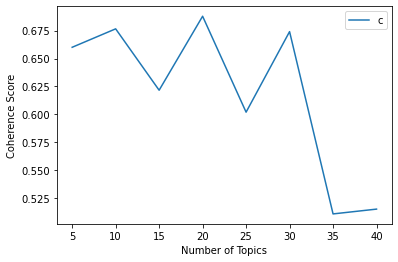

Num Topics = 5  has Coherence Value of 0.66 and Likelihood Bound of -8.6714
Num Topics = 10  has Coherence Value of 0.6765 and Likelihood Bound of -8.6748
Num Topics = 15  has Coherence Value of 0.6217 and Likelihood Bound of -8.6785
Num Topics = 20  has Coherence Value of 0.6878 and Likelihood Bound of -8.6966
Num Topics = 25  has Coherence Value of 0.6021 and Likelihood Bound of -8.6796
Num Topics = 30  has Coherence Value of 0.674 and Likelihood Bound of -8.6866
Num Topics = 35  has Coherence Value of 0.5112 and Likelihood Bound of -8.6964
Num Topics = 40  has Coherence Value of 0.5155 and Likelihood Bound of -8.7033


In [26]:
# This could be time consuming
def compute_coherence_values(dictionary, corpus, texts, limit, start=5, step=5):
    coherence_values = []
    model_list = []
    log_perplexity = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=num_topics, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha=0.01,
                                           eta=0.9,
                                           per_word_topics=True)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=words_data_nostops, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
        log_perplexity.append(model.log_perplexity(corpus))

    return model_list, coherence_values, log_perplexity

model_list, coherence_values, log_perplexity = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=words_data_nostops, limit=45, 
                                                        start=5, step=5)

limit=45; start=5; step=5;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score")
plt.legend(("coherence_values"), loc='best')
plt.show()

for m, cv, p in zip(x, coherence_values, log_perplexity ):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4), "and Likelihood Bound of", round(p, 4))

# Pick the Final Model

In [27]:
lda_model_final = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=2,
                                           chunksize=100,
                                           passes=10,
                                           alpha=0.01,
                                           eta=0.9,
                                           per_word_topics=True)
pprint(lda_model_final.print_topics())
doc_lda_final = lda_model_final[corpus]
print('\nLog Perplexity: ', lda_model_final.log_perplexity(corpus)) 
coherence_model_lda_final = CoherenceModel(model=lda_model_final, texts=words_data_nostops, dictionary=id2word, coherence='c_v')
coherence_lda_final = coherence_model_lda_final.get_coherence()
print('\nCoherence Score Final: ', coherence_lda_final)


2022-04-15 21:44:32,982 : INFO : using serial LDA version on this node
2022-04-15 21:44:33,087 : INFO : running online (multi-pass) LDA training, 20 topics, 10 passes over the supplied corpus of 9051 documents, updating model once every 200 documents, evaluating perplexity every 1000 documents, iterating 50x with a convergence threshold of 0.001000
2022-04-15 21:44:33,088 : INFO : PROGRESS: pass 0, at document #100/9051
2022-04-15 21:44:33,143 : INFO : PROGRESS: pass 0, at document #200/9051
2022-04-15 21:44:33,241 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:33,295 : INFO : topic #2 (0.010): 0.009*"file" + 0.006*"output" + 0.004*"entry" + 0.003*"printf" + 0.003*"fprintf" + 0.003*"char" + 0.003*"oname" + 0.003*"program" + 0.003*"buf" + 0.002*"check_io"
2022-04-15 21:44:33,296 : INFO : topic #3 (0.010): 0.003*"one" + 0.003*"cancer" + 0.002*"need" + 0.002*"entry" + 0.002*"would" + 0.002*"tl" + 0.002*"program" + 0.002*"im" + 0.002*"could" + 0

2022-04-15 21:44:34,429 : INFO : topic #13 (0.010): 0.001*"ax" + 0.000*"nanao" + 0.000*"gateway" + 0.000*"preference" + 0.000*"mpeg" + 0.000*"vertical" + 0.000*"know" + 0.000*"hz" + 0.000*"saw" + 0.000*"peds"
2022-04-15 21:44:34,439 : INFO : topic diff=0.110493, rho=0.301511
2022-04-15 21:44:34,439 : INFO : PROGRESS: pass 0, at document #1300/9051
2022-04-15 21:44:34,478 : INFO : PROGRESS: pass 0, at document #1400/9051
2022-04-15 21:44:34,569 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:34,619 : INFO : topic #7 (0.010): 0.044*"ax" + 0.003*"wm" + 0.003*"pl" + 0.002*"di" + 0.002*"tm" + 0.002*"max" + 0.001*"sl" + 0.001*"ei" + 0.001*"okz" + 0.001*"bxn"
2022-04-15 21:44:34,619 : INFO : topic #0 (0.010): 0.010*"os" + 0.007*"windows" + 0.005*"color" + 0.003*"file" + 0.003*"memory" + 0.003*"installed" + 0.002*"dos" + 0.002*"svga" + 0.002*"com" + 0.002*"screen"
2022-04-15 21:44:34,619 : INFO : topic #11 (0.010): 0.008*"bus" + 0.003*"scsi" + 0.002*

2022-04-15 21:44:35,699 : INFO : topic diff=0.050248, rho=0.208514
2022-04-15 21:44:35,699 : INFO : PROGRESS: pass 0, at document #2500/9051
2022-04-15 21:44:35,739 : INFO : PROGRESS: pass 0, at document #2600/9051
2022-04-15 21:44:35,821 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:35,871 : INFO : topic #7 (0.010): 0.011*"ax" + 0.001*"wm" + 0.001*"pl" + 0.001*"di" + 0.000*"sl" + 0.000*"tm" + 0.000*"max" + 0.000*"eq" + 0.000*"rosicrucian" + 0.000*"ei"
2022-04-15 21:44:35,871 : INFO : topic #0 (0.010): 0.005*"dos" + 0.004*"windows" + 0.004*"os" + 0.002*"memory" + 0.002*"color" + 0.002*"installed" + 0.001*"file" + 0.001*"com" + 0.001*"svga" + 0.001*"screen"
2022-04-15 21:44:35,871 : INFO : topic #16 (0.010): 0.006*"would" + 0.005*"get" + 0.005*"like" + 0.005*"dont" + 0.005*"one" + 0.004*"know" + 0.004*"think" + 0.003*"time" + 0.003*"im" + 0.003*"could"
2022-04-15 21:44:35,881 : INFO : topic #10 (0.010): 0.004*"file" + 0.004*"pub" + 0.004*"im

2022-04-15 21:44:36,903 : INFO : topic diff=0.029584, rho=0.169031
2022-04-15 21:44:36,903 : INFO : PROGRESS: pass 0, at document #3700/9051
2022-04-15 21:44:36,935 : INFO : PROGRESS: pass 0, at document #3800/9051
2022-04-15 21:44:37,019 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:37,068 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:44:37,068 : INFO : topic #2 (0.010): 0.289*"ax" + 0.021*"max" + 0.004*"pl" + 0.004*"wm" + 0.002*"di" + 0.002*"tm" + 0.002*"bxn" + 0.002*"ei" + 0.001*"giz" + 0.001*"lk"
2022-04-15 21:44:37,078 : INFO : topic #3 (0.010): 0.003*"hockey" + 0.001*"players" + 0.001*"nhl" + 0.000*"division" + 0.000*"red" + 0.000*"cup" + 0.000*"finnish" + 0.000*"pittsburgh" + 0.000*"stanley" + 0.000*"oilers"
2022-04-15 21:44:37,079 : INFO : topic #0 (0.010): 0.002*"dos" + 0.002*"windows" + 

2022-04-15 21:44:38,083 : INFO : PROGRESS: pass 0, at document #4900/9051
2022-04-15 21:44:38,243 : INFO : -9.595 per-word bound, 773.5 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:44:38,243 : INFO : PROGRESS: pass 0, at document #5000/9051
2022-04-15 21:44:38,321 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:38,371 : INFO : topic #16 (0.010): 0.006*"would" + 0.006*"dont" + 0.005*"like" + 0.005*"one" + 0.005*"get" + 0.005*"think" + 0.005*"know" + 0.004*"im" + 0.004*"good" + 0.004*"well"
2022-04-15 21:44:38,371 : INFO : topic #2 (0.010): 0.376*"ax" + 0.026*"max" + 0.005*"cx" + 0.005*"pl" + 0.005*"ei" + 0.004*"bhj" + 0.003*"giz" + 0.003*"wm" + 0.003*"di" + 0.003*"bxn"
2022-04-15 21:44:38,371 : INFO : topic #18 (0.010): 0.003*"pts" + 0.003*"pp" + 0.002*"bos" + 0.002*"period" + 0.002*"tor" + 0.002*"det" + 0.002*"la" + 0.002*"vs" + 0.002*"scorer" + 0.002*"min"
2022-04-15 21:44:38,381 : INFO : topi

2022-04-15 21:44:39,388 : INFO : topic diff=0.022355, rho=0.130189
2022-04-15 21:44:39,388 : INFO : PROGRESS: pass 0, at document #6100/9051
2022-04-15 21:44:39,424 : INFO : PROGRESS: pass 0, at document #6200/9051
2022-04-15 21:44:39,499 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:39,548 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"ermeni" + 0.000*"kubilay" + 0.000*"kultigin" + 0.000*"bone" + 0.000*"bu" + 0.000*"hausmann" + 0.000*"osmanli" + 0.000*"butun" + 0.000*"bir"
2022-04-15 21:44:39,558 : INFO : topic #5 (0.010): 0.000*"td" + 0.000*"antenna" + 0.000*"dcd" + 0.000*"sg" + 0.000*"spacecraft" + 0.000*"hare" + 0.000*"prk" + 0.000*"dtr" + 0.000*"nettles" + 0.000*"sandiego"
2022-04-15 21:44:39,558 : INFO : topic #14 (0.010): 0.007*"db" + 0.006*"one" + 0.005*"would" + 0.004*"also" + 0.003*"new" + 0.003*"like" + 0.003*"system" + 0.003*"used" + 0.003*"information" + 0.002*"know"
2022-04-15 21:44:39,560 : INFO : topic #9 (0.010): 0.000*

2022-04-15 21:44:40,558 : INFO : PROGRESS: pass 0, at document #7300/9051
2022-04-15 21:44:40,596 : INFO : PROGRESS: pass 0, at document #7400/9051
2022-04-15 21:44:40,671 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:40,721 : INFO : topic #15 (0.010): 0.000*"main_win" + 0.000*"detail_win" + 0.000*"undefined" + 0.000*"symbol" + 0.000*"myhint" + 0.000*"mydisplay" + 0.000*"libxmu" + 0.000*"toplevel" + 0.000*"argv" + 0.000*"argc"
2022-04-15 21:44:40,721 : INFO : topic #12 (0.010): 0.014*"god" + 0.006*"jesus" + 0.005*"church" + 0.005*"bible" + 0.004*"christian" + 0.003*"christ" + 0.003*"faith" + 0.003*"christians" + 0.002*"sin" + 0.002*"gods"
2022-04-15 21:44:40,721 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.006*"dont" + 0.006*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"im" + 0.004*"good" + 0.004*"time"
2022-04-15 21:44:40,731 : INFO : topic #0 (0.010): 0.000*"dos" + 0.000*"windows" + 0.000*"os" + 0.000*"dpy" +

2022-04-15 21:44:41,792 : INFO : PROGRESS: pass 0, at document #8600/9051
2022-04-15 21:44:41,868 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:41,931 : INFO : topic #18 (0.010): 0.004*"van" + 0.004*"buf" + 0.003*"min" + 0.003*"la" + 0.003*"gm" + 0.003*"bos" + 0.003*"nyr" + 0.003*"det" + 0.003*"phi" + 0.003*"chi"
2022-04-15 21:44:41,931 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:44:41,931 : INFO : topic #1 (0.010): 0.008*"people" + 0.004*"would" + 0.003*"government" + 0.003*"one" + 0.003*"said" + 0.003*"us" + 0.003*"gun" + 0.003*"war" + 0.003*"law" + 0.002*"state"
2022-04-15 21:44:41,931 : INFO : topic #17 (0.010): 0.007*"scsi" + 0.001*"ide" + 0.001*"mb" + 0.001*"asynchronous" + 0.001*"esdi" + 0.000*"mwra" + 0.000*"controller" + 0.000*"cooling" + 0.000*"synchronous" + 0.000*"burst"
2022-04-15 2

2022-04-15 21:44:42,970 : INFO : topic diff=0.022818, rho=0.103969
2022-04-15 21:44:42,970 : INFO : PROGRESS: pass 1, at document #500/9051
2022-04-15 21:44:42,997 : INFO : PROGRESS: pass 1, at document #600/9051
2022-04-15 21:44:43,080 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:43,128 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"ermeni" + 0.000*"click" + 0.000*"bake" + 0.000*"timmons" + 0.000*"kubilay" + 0.000*"kultigin" + 0.000*"bone"
2022-04-15 21:44:43,128 : INFO : topic #14 (0.010): 0.005*"file" + 0.004*"one" + 0.004*"would" + 0.003*"also" + 0.003*"system" + 0.003*"program" + 0.003*"windows" + 0.003*"information" + 0.003*"may" + 0.003*"number"
2022-04-15 21:44:43,138 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 21:44:43,138 : INFO : topic #3 (0.010): 0.000*"fin

2022-04-15 21:44:44,115 : INFO : topic diff=0.022602, rho=0.103969
2022-04-15 21:44:44,115 : INFO : PROGRESS: pass 1, at document #1700/9051
2022-04-15 21:44:44,157 : INFO : PROGRESS: pass 1, at document #1800/9051
2022-04-15 21:44:44,234 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:44,297 : INFO : topic #12 (0.010): 0.014*"god" + 0.012*"jesus" + 0.006*"faith" + 0.005*"bible" + 0.005*"church" + 0.004*"christian" + 0.004*"christians" + 0.004*"christ" + 0.003*"gods" + 0.003*"sin"
2022-04-15 21:44:44,297 : INFO : topic #8 (0.010): 0.001*"orbit" + 0.001*"spacecraft" + 0.001*"planetary" + 0.001*"astronomical" + 0.001*"solar" + 0.001*"space" + 0.001*"comet" + 0.001*"shuttle" + 0.000*"mission" + 0.000*"titan"
2022-04-15 21:44:44,297 : INFO : topic #5 (0.010): 0.000*"td" + 0.000*"antenna" + 0.000*"haci" + 0.000*"dcd" + 0.000*"sg" + 0.000*"spacecraft" + 0.000*"hare" + 0.000*"ibo" + 0.000*"prk" + 0.000*"dtr"
2022-04-15 21:44:44,297 : INFO : topic #7

2022-04-15 21:44:45,273 : INFO : topic diff=0.020472, rho=0.103969
2022-04-15 21:44:45,273 : INFO : PROGRESS: pass 1, at document #2900/9051
2022-04-15 21:44:45,422 : INFO : -9.403 per-word bound, 677.2 perplexity estimate based on a held-out corpus of 100 documents with 10830 words
2022-04-15 21:44:45,422 : INFO : PROGRESS: pass 1, at document #3000/9051
2022-04-15 21:44:45,501 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:45,551 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.001*"dpy" + 0.001*"liefeld" + 0.001*"sabretooth" + 0.001*"wolverine" + 0.000*"hobgoblin" + 0.000*"cmap" + 0.000*"keycode" + 0.000*"xclrs" + 0.000*"keown"
2022-04-15 21:44:45,551 : INFO : topic #5 (0.010): 0.000*"td" + 0.000*"antenna" + 0.000*"haci" + 0.000*"dcd" + 0.000*"sg" + 0.000*"spacecraft" + 0.000*"hare" + 0.000*"ibo" + 0.000*"prk" + 0.000*"dtr"
2022-04-15 21:44:45,551 : INFO : topic #8 (0.010): 0.004*"orbit" + 0.002*"mars" + 0.002*"venus" + 0.002*"spacecraft" + 0

2022-04-15 21:44:46,516 : INFO : topic diff=0.015825, rho=0.103969
2022-04-15 21:44:46,516 : INFO : PROGRESS: pass 1, at document #4100/9051
2022-04-15 21:44:46,542 : INFO : PROGRESS: pass 1, at document #4200/9051
2022-04-15 21:44:46,623 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:46,669 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"dpy" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"wolverine" + 0.000*"hobgoblin" + 0.000*"cmap" + 0.000*"keycode" + 0.000*"xclrs" + 0.000*"keown"
2022-04-15 21:44:46,669 : INFO : topic #1 (0.010): 0.008*"people" + 0.004*"would" + 0.004*"one" + 0.003*"us" + 0.003*"jews" + 0.003*"government" + 0.003*"said" + 0.003*"mr" + 0.003*"law" + 0.003*"many"
2022-04-15 21:44:46,679 : INFO : topic #5 (0.010): 0.000*"smid" + 0.000*"rbj" + 0.000*"csmes" + 0.000*"katzke" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"colvin" + 0.000*"kuyers" + 0.000*"whois" + 0.000*"zeitler"
2022-04-15 21:44:46,680 : INFO : topic #8 (0.010):

2022-04-15 21:44:47,637 : INFO : topic diff=0.018833, rho=0.103969
2022-04-15 21:44:47,637 : INFO : PROGRESS: pass 1, at document #5300/9051
2022-04-15 21:44:47,667 : INFO : PROGRESS: pass 1, at document #5400/9051
2022-04-15 21:44:47,749 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:47,794 : INFO : topic #1 (0.010): 0.008*"people" + 0.004*"would" + 0.004*"one" + 0.003*"said" + 0.003*"government" + 0.003*"us" + 0.003*"gun" + 0.003*"law" + 0.003*"many" + 0.002*"jews"
2022-04-15 21:44:47,794 : INFO : topic #17 (0.010): 0.001*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"exchangers" + 0.000*"contamination" + 0.000*"ide" + 0.000*"purifying" + 0.000*"sandiego" + 0.000*"graig" + 0.000*"nettles"
2022-04-15 21:44:47,794 : INFO : topic #7 (0.010): 0.008*"cx" + 0.008*"c_" + 0.004*"qs" + 0.004*"hz" + 0.003*"ww" + 0.002*"ck" + 0.002*"zd" + 0.002*"y_" + 0.002*"cj" + 0.002*"x_s"
2022-04-15 21:44:47,804 : INFO : topic #4 (0.010): 0.001*"msg" + 0.0

2022-04-15 21:44:48,760 : INFO : topic diff=0.017625, rho=0.103969
2022-04-15 21:44:48,760 : INFO : PROGRESS: pass 1, at document #6500/9051
2022-04-15 21:44:48,789 : INFO : PROGRESS: pass 1, at document #6600/9051
2022-04-15 21:44:48,869 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:48,915 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.006*"think" + 0.006*"like" + 0.005*"know" + 0.004*"get" + 0.004*"im" + 0.004*"good" + 0.004*"well"
2022-04-15 21:44:48,915 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"nf" + 0.000*"nts" + 0.000*"semantic" + 0.000*"eysenck" + 0.000*"sanguine" + 0.000*"psychiatry" + 0.000*"nfs" + 0.000*"typology"
2022-04-15 21:44:48,925 : INFO : topic #5 (0.010): 0.000*"rbj" + 0.000*"smid" + 0.000*"katzke" + 0.000*"csmes" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"zeitler" + 0.000*"whois" + 0.000*"colvin" + 0.000*"multinet"
2022-04-15 21:44:48,925 : INFO : topic #13 (0.010

2022-04-15 21:44:49,885 : INFO : topic diff=0.028168, rho=0.103969
2022-04-15 21:44:49,885 : INFO : PROGRESS: pass 1, at document #7700/9051
2022-04-15 21:44:49,916 : INFO : PROGRESS: pass 1, at document #7800/9051
2022-04-15 21:44:49,999 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:50,047 : INFO : topic #14 (0.010): 0.006*"file" + 0.003*"also" + 0.003*"program" + 0.003*"one" + 0.003*"system" + 0.003*"would" + 0.003*"get" + 0.003*"available" + 0.003*"space" + 0.003*"information"
2022-04-15 21:44:50,047 : INFO : topic #9 (0.010): 0.000*"lib" + 0.000*"xmu" + 0.000*"vb" + 0.000*"file" + 0.000*"gm" + 0.000*"dde" + 0.000*"libxmu" + 0.000*"output" + 0.000*"program" + 0.000*"contrib"
2022-04-15 21:44:50,047 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 21:44:50,057 : INFO : topic #3 (0.010): 0.000*"choleric" + 0.000

2022-04-15 21:44:51,049 : INFO : topic diff=0.016131, rho=0.103969
2022-04-15 21:44:51,049 : INFO : PROGRESS: pass 1, at document #8900/9051
2022-04-15 21:44:51,198 : INFO : -9.212 per-word bound, 593.2 perplexity estimate based on a held-out corpus of 100 documents with 12241 words
2022-04-15 21:44:51,198 : INFO : PROGRESS: pass 1, at document #9000/9051
2022-04-15 21:44:51,277 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:51,324 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:44:51,324 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"constructions" + 0.000*"okabe" + 0.000*"sugihara" + 0.000*"tessellations" + 0.000*"aurenhammer" + 0.000*"neighbour" + 0.000*"delaunay" + 0.000*"geometrical"
2022-04-15 21:44:51,324 : INFO : topic #16 (0.010): 0.007*"one" + 0.007*"would" + 0.006*"dont" + 0.00

2022-04-15 21:44:52,217 : INFO : topic diff=0.018507, rho=0.103412
2022-04-15 21:44:52,217 : INFO : PROGRESS: pass 2, at document #900/9051
2022-04-15 21:44:52,366 : INFO : -9.258 per-word bound, 612.1 perplexity estimate based on a held-out corpus of 100 documents with 10661 words
2022-04-15 21:44:52,366 : INFO : PROGRESS: pass 2, at document #1000/9051
2022-04-15 21:44:52,442 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:52,489 : INFO : topic #1 (0.010): 0.007*"people" + 0.004*"one" + 0.004*"would" + 0.003*"government" + 0.003*"law" + 0.003*"gun" + 0.003*"us" + 0.003*"said" + 0.002*"armenian" + 0.002*"many"
2022-04-15 21:44:52,489 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.006*"think" + 0.005*"like" + 0.005*"know" + 0.004*"good" + 0.004*"get" + 0.004*"time" + 0.004*"im"
2022-04-15 21:44:52,499 : INFO : topic #13 (0.010): 0.000*"haci" + 0.000*"voronoi" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"bayonet" + 0.000

2022-04-15 21:44:53,479 : INFO : topic diff=0.020647, rho=0.103412
2022-04-15 21:44:53,479 : INFO : PROGRESS: pass 2, at document #2100/9051
2022-04-15 21:44:53,507 : INFO : PROGRESS: pass 2, at document #2200/9051
2022-04-15 21:44:53,585 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:53,629 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"good" + 0.004*"time" + 0.004*"im"
2022-04-15 21:44:53,629 : INFO : topic #5 (0.010): 0.000*"csmes" + 0.000*"rbj" + 0.000*"smid" + 0.000*"katzke" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"multinet" + 0.000*"colvin" + 0.000*"zeitler" + 0.000*"kuyers"
2022-04-15 21:44:53,639 : INFO : topic #13 (0.010): 0.000*"haci" + 0.000*"voronoi" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"bayonet" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"oven" + 0.000*"rebels"
2022-04-15 21:44:53,639 : INFO : topic #4 (0.010): 0.001*"msg

2022-04-15 21:44:54,593 : INFO : topic diff=0.017778, rho=0.103412
2022-04-15 21:44:54,593 : INFO : PROGRESS: pass 2, at document #3300/9051
2022-04-15 21:44:54,620 : INFO : PROGRESS: pass 2, at document #3400/9051
2022-04-15 21:44:54,698 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:54,742 : INFO : topic #13 (0.010): 0.000*"haci" + 0.000*"voronoi" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"bayonet" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"musto" + 0.000*"oven" + 0.000*"rebels"
2022-04-15 21:44:54,752 : INFO : topic #7 (0.010): 0.002*"lk" + 0.001*"ww" + 0.001*"uw" + 0.001*"mw" + 0.001*"hz" + 0.001*"sy" + 0.001*"cx" + 0.001*"ah" + 0.001*"tl" + 0.001*"qs"
2022-04-15 21:44:54,752 : INFO : topic #15 (0.010): 0.001*"sele_pntr" + 0.000*"geom_vals" + 0.000*"disp_data" + 0.000*"mydisplay" + 0.000*"delt_yloc" + 0.000*"rooty" + 0.000*"root_iden" + 0.000*"rootx" + 0.000*"delt_xloc" + 0.000*"geom_gcon"
2022-04-15 21:44:54,752 : INFO : topic #2 (0.010): 0

2022-04-15 21:44:55,687 : INFO : topic diff=0.017555, rho=0.103412
2022-04-15 21:44:55,687 : INFO : PROGRESS: pass 2, at document #4500/9051
2022-04-15 21:44:55,712 : INFO : PROGRESS: pass 2, at document #4600/9051
2022-04-15 21:44:55,783 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:55,836 : INFO : topic #10 (0.010): 0.001*"printf" + 0.001*"libxmu" + 0.001*"int" + 0.001*"doug" + 0.001*"null" + 0.001*"oname" + 0.001*"xmu" + 0.001*"char" + 0.001*"buf" + 0.001*"symbol"
2022-04-15 21:44:55,836 : INFO : topic #12 (0.010): 0.009*"god" + 0.008*"jesus" + 0.004*"bible" + 0.004*"church" + 0.003*"christ" + 0.002*"faith" + 0.002*"christian" + 0.002*"spirit" + 0.002*"catholic" + 0.002*"gods"
2022-04-15 21:44:55,846 : INFO : topic #7 (0.010): 0.012*"cx" + 0.011*"c_" + 0.005*"qs" + 0.005*"hz" + 0.003*"ww" + 0.003*"lk" + 0.003*"zd" + 0.003*"ck" + 0.003*"y_" + 0.003*"cj"
2022-04-15 21:44:55,847 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x

2022-04-15 21:44:56,788 : INFO : PROGRESS: pass 2, at document #5700/9051
2022-04-15 21:44:56,817 : INFO : PROGRESS: pass 2, at document #5800/9051
2022-04-15 21:44:56,899 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:56,943 : INFO : topic #5 (0.010): 0.000*"smid" + 0.000*"katzke" + 0.000*"csmes" + 0.000*"rbj" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"zeitler" + 0.000*"kuyers" + 0.000*"colvin" + 0.000*"whois"
2022-04-15 21:44:56,943 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"cmap" + 0.000*"xclrs" + 0.000*"wolverine" + 0.000*"keown" + 0.000*"dpy" + 0.000*"mcfarlane"
2022-04-15 21:44:56,953 : INFO : topic #18 (0.010): 0.003*"gm" + 0.002*"period" + 0.002*"pts" + 0.002*"vs" + 0.002*"la" + 0.001*"chi" + 0.001*"play" + 0.001*"pp" + 0.001*"bos" + 0.001*"stl"
2022-04-15 21:44:56,954 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"

2022-04-15 21:44:57,886 : INFO : topic diff=0.013937, rho=0.103412
2022-04-15 21:44:57,886 : INFO : PROGRESS: pass 2, at document #6900/9051
2022-04-15 21:44:58,037 : INFO : -9.084 per-word bound, 542.7 perplexity estimate based on a held-out corpus of 100 documents with 15258 words
2022-04-15 21:44:58,037 : INFO : PROGRESS: pass 2, at document #7000/9051
2022-04-15 21:44:58,120 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:58,168 : INFO : topic #8 (0.010): 0.000*"jupiter" + 0.000*"mnemonics" + 0.000*"centaur" + 0.000*"tra" + 0.000*"hpe" + 0.000*"pom" + 0.000*"omg" + 0.000*"sma" + 0.000*"hap" + 0.000*"prefix"
2022-04-15 21:44:58,168 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 21:44:58,168 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"tessellations" + 0.000*"aurenhammer" + 0.000*

2022-04-15 21:44:59,133 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"constructions" + 0.000*"okabe" + 0.000*"tessellations" + 0.000*"sugihara" + 0.000*"aurenhammer" + 0.000*"neighbour" + 0.000*"delaunay" + 0.000*"geometrical"
2022-04-15 21:44:59,133 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"cmap" + 0.000*"xclrs" + 0.000*"wolverine" + 0.000*"keown" + 0.000*"dpy" + 0.000*"mcfarlane"
2022-04-15 21:44:59,133 : INFO : topic diff=0.022441, rho=0.103412
2022-04-15 21:44:59,133 : INFO : PROGRESS: pass 2, at document #8100/9051
2022-04-15 21:44:59,163 : INFO : PROGRESS: pass 2, at document #8200/9051
2022-04-15 21:44:59,246 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:44:59,304 : INFO : topic #11 (0.010): 0.000*"bus" + 0.000*"dx" + 0.000*"risc" + 0.000*"scsi" + 0.000*"ide" + 0.000*"cx" + 0.000*"mhz" + 0.000*"uvax" + 0.000*"mac" + 0.000*"ctrl"
2022-04-15 2

2022-04-15 21:45:00,321 : INFO : topic #12 (0.010): 0.014*"jesus" + 0.006*"church" + 0.006*"god" + 0.003*"christ" + 0.003*"bible" + 0.003*"matthew" + 0.002*"satan" + 0.002*"catholic" + 0.002*"lord" + 0.002*"jesuss"
2022-04-15 21:45:00,321 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"aurenhammer" + 0.000*"tessellations" + 0.000*"sugihara" + 0.000*"okabe" + 0.000*"constructions" + 0.000*"neighbour" + 0.000*"delaunay" + 0.000*"geometrical"
2022-04-15 21:45:00,323 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.000*"detail_win" + 0.000*"xsizehints" + 0.000*"myhint" + 0.000*"psize" + 0.000*"pposition" + 0.000*"flags" + 0.000*"xcreategc" + 0.000*"line_thick"
2022-04-15 21:45:00,324 : INFO : topic diff=0.015580, rho=0.103412
2022-04-15 21:45:00,324 : INFO : PROGRESS: pass 3, at document #100/9051
2022-04-15 21:45:00,355 : INFO : PROGRESS: pass 3, at document #200/9051
2022-04-15 21:45:00,433 : INFO : merging changes from 200 documents into a

2022-04-15 21:45:01,422 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:45:01,422 : INFO : topic #13 (0.010): 0.000*"voronoi" + 0.000*"tessellation" + 0.000*"constructions" + 0.000*"aurenhammer" + 0.000*"sugihara" + 0.000*"tessellations" + 0.000*"okabe" + 0.000*"neighbour" + 0.000*"delaunay" + 0.000*"geometrical"
2022-04-15 21:45:01,422 : INFO : topic #1 (0.010): 0.007*"people" + 0.004*"god" + 0.004*"one" + 0.004*"would" + 0.003*"government" + 0.003*"law" + 0.002*"us" + 0.002*"gun" + 0.002*"many" + 0.002*"said"
2022-04-15 21:45:01,432 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"eastwick" + 0.000*"rawley" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:45:01,435 : INFO : topic diff=0.025368, rho=0.102863
2022-04-15 21:45:01,435 : INFO : PROGRESS: pass 3, at docum

2022-04-15 21:45:02,544 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"good" + 0.004*"time" + 0.004*"im"
2022-04-15 21:45:02,544 : INFO : topic #7 (0.010): 0.002*"ww" + 0.002*"uw" + 0.002*"mw" + 0.002*"ah" + 0.002*"hz" + 0.002*"sy" + 0.002*"pl" + 0.001*"air" + 0.001*"cx" + 0.001*"tl"
2022-04-15 21:45:02,554 : INFO : topic #2 (0.010): 0.404*"ax" + 0.029*"max" + 0.006*"di" + 0.004*"pl" + 0.004*"tm" + 0.003*"wm" + 0.003*"ei" + 0.003*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:45:02,556 : INFO : topic #12 (0.010): 0.012*"jesus" + 0.005*"god" + 0.004*"christ" + 0.004*"church" + 0.003*"bible" + 0.002*"sin" + 0.002*"lord" + 0.002*"faith" + 0.002*"satan" + 0.002*"spirit"
2022-04-15 21:45:02,557 : INFO : topic #19 (0.010): 0.000*"c_" + 0.000*"cx" + 0.000*"x_s" + 0.000*"sc_" + 0.000*"scx" + 0.000*"y_" + 0.000*"ck" + 0.000*"cx_s" + 0.000*"qs" + 0.000*"ww"
2022-04-15 21:45:02,558 : INFO : topic diff=0.0

2022-04-15 21:45:03,498 : INFO : topic diff=0.013834, rho=0.102863
2022-04-15 21:45:03,498 : INFO : PROGRESS: pass 3, at document #3500/9051
2022-04-15 21:45:03,527 : INFO : PROGRESS: pass 3, at document #3600/9051
2022-04-15 21:45:03,604 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:03,649 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"rawley" + 0.000*"eastwick" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:45:03,649 : INFO : topic #1 (0.010): 0.007*"people" + 0.005*"god" + 0.004*"one" + 0.004*"would" + 0.003*"many" + 0.003*"mr" + 0.003*"government" + 0.003*"jews" + 0.003*"us" + 0.002*"law"
2022-04-15 21:45:03,659 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"haci" + 0.000*"oldword" + 0.000*"acro" + 0.000*"iapetus" + 0.000*"oven" + 0.000*"ibo" + 0.000*"bayonet" + 0.000*"mehmet" + 0.000*"ingress"
2022-04-15 21:45:03,659 : INFO : topic #3

2022-04-15 21:45:04,574 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"hobgoblin" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"wolverine" + 0.000*"mcfarlane" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:45:04,584 : INFO : topic #5 (0.010): 0.000*"rbj" + 0.000*"smid" + 0.000*"csmes" + 0.000*"katzke" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"colvin" + 0.000*"zeitler" + 0.000*"kuyers" + 0.000*"whois"
2022-04-15 21:45:04,584 : INFO : topic diff=0.032440, rho=0.102863
2022-04-15 21:45:04,584 : INFO : PROGRESS: pass 3, at document #4700/9051
2022-04-15 21:45:04,612 : INFO : PROGRESS: pass 3, at document #4800/9051
2022-04-15 21:45:04,691 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:04,737 : INFO : topic #7 (0.010): 0.011*"cx" + 0.010*"c_" + 0.005*"qs" + 0.004*"hz" + 0.004*"ww" + 0.003*"lk" + 0.003*"zd" + 0.003*"ck" + 0.003*"y_" + 0.003*"cj"
2022-04-15 21:45:04,737 : INFO : topic #5 (0.010): 0.000*"ka

2022-04-15 21:45:05,674 : INFO : topic #14 (0.010): 0.009*"db" + 0.003*"one" + 0.003*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"information" + 0.003*"key" + 0.003*"file" + 0.003*"data" + 0.003*"available"
2022-04-15 21:45:05,684 : INFO : topic #1 (0.010): 0.006*"people" + 0.004*"one" + 0.004*"god" + 0.004*"would" + 0.003*"law" + 0.003*"government" + 0.002*"many" + 0.002*"us" + 0.002*"jews" + 0.002*"also"
2022-04-15 21:45:05,684 : INFO : topic #12 (0.010): 0.004*"jesus" + 0.002*"church" + 0.002*"god" + 0.001*"sin" + 0.001*"christ" + 0.001*"pope" + 0.001*"catholic" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect"
2022-04-15 21:45:05,684 : INFO : topic diff=0.015099, rho=0.102863
2022-04-15 21:45:05,684 : INFO : PROGRESS: pass 3, at document #5900/9051
2022-04-15 21:45:05,832 : INFO : -9.379 per-word bound, 665.6 perplexity estimate based on a held-out corpus of 100 documents with 9978 words
2022-04-15 21:45:05,832 : INFO : PROGRESS: pass 3, at document #6000/9051
2022-04-15 2

2022-04-15 21:45:06,892 : INFO : topic #11 (0.010): 0.000*"aftwer" + 0.000*"lowell" + 0.000*"crashes" + 0.000*"sleepp" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"bus"
2022-04-15 21:45:06,902 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"good" + 0.004*"im" + 0.004*"time"
2022-04-15 21:45:06,902 : INFO : topic #5 (0.010): 0.000*"csmes" + 0.000*"katzke" + 0.000*"rbj" + 0.000*"smid" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"kuyers" + 0.000*"multinet" + 0.000*"zeitler" + 0.000*"whois"
2022-04-15 21:45:06,902 : INFO : topic #9 (0.010): 0.000*"camrys" + 0.000*"tercels" + 0.000*"knack" + 0.000*"corollas" + 0.000*"uncanny" + 0.000*"designing" + 0.000*"designers" + 0.000*"aesthetic" + 0.000*"wagons" + 0.000*"ugly"
2022-04-15 21:45:06,902 : INFO : topic diff=0.052891, rho=0.102863
2022-04-15 21:45:06,902 : INFO : PROGRESS: pass 3, at docum

2022-04-15 21:45:07,963 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:08,021 : INFO : topic #5 (0.010): 0.000*"smid" + 0.000*"rbj" + 0.000*"katzke" + 0.000*"csmes" + 0.000*"mcnulty" + 0.000*"ecf" + 0.000*"colvin" + 0.000*"multinet" + 0.000*"kuyers" + 0.000*"zeitler"
2022-04-15 21:45:08,021 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.006*"like" + 0.005*"think" + 0.005*"know" + 0.004*"good" + 0.004*"get" + 0.004*"time" + 0.004*"im"
2022-04-15 21:45:08,021 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"eastwick" + 0.000*"rawley" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:45:08,021 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"line_thick" + 0.000*"pposition" + 0.000*"palette_colors" + 0.000*"argc"
2022-04-15 21:4

2022-04-15 21:45:09,077 : INFO : topic diff=0.013879, rho=0.102863
2022-04-15 21:45:09,077 : INFO : PROGRESS: pass 4, at document #100/9051
2022-04-15 21:45:09,102 : INFO : PROGRESS: pass 4, at document #200/9051
2022-04-15 21:45:09,183 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:09,230 : INFO : topic #10 (0.010): 0.007*"oname" + 0.007*"printf" + 0.005*"buf" + 0.005*"fprintf" + 0.004*"char" + 0.004*"check_io" + 0.003*"eof_not_ok" + 0.003*"stderr" + 0.003*"int" + 0.002*"xvoid"
2022-04-15 21:45:09,230 : INFO : topic #7 (0.010): 0.005*"ww" + 0.004*"uw" + 0.004*"mw" + 0.003*"hz" + 0.003*"pl" + 0.003*"tl" + 0.003*"cx" + 0.003*"qs" + 0.003*"mt" + 0.003*"zd"
2022-04-15 21:45:09,230 : INFO : topic #8 (0.010): 0.000*"mnemonics" + 0.000*"omg" + 0.000*"hpe" + 0.000*"pom" + 0.000*"sma" + 0.000*"tra" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"godzilla" + 0.000*"mothra"
2022-04-15 21:45:09,240 : INFO : topic #1 (0.010): 0.006*"people" + 0.004*"god" + 

2022-04-15 21:45:10,187 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"eastwick" + 0.000*"rawley" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"turbine" + 0.000*"auth" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:45:10,187 : INFO : topic diff=0.025467, rho=0.102324
2022-04-15 21:45:10,187 : INFO : PROGRESS: pass 4, at document #1300/9051
2022-04-15 21:45:10,214 : INFO : PROGRESS: pass 4, at document #1400/9051
2022-04-15 21:45:10,295 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:10,342 : INFO : topic #7 (0.010): 0.003*"ww" + 0.003*"uw" + 0.002*"mw" + 0.002*"hz" + 0.002*"pl" + 0.002*"cx" + 0.002*"tl" + 0.002*"qs" + 0.002*"mt" + 0.002*"chz"
2022-04-15 21:45:10,342 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"whirr" + 0.000*"sonra" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"bu" + 0.000*"click" + 0.000*"numarani" + 0.000*"herkesi"
2022-04-15 21:45:10,342 : INFO : topic #12 (0.010): 0.001

2022-04-15 21:45:11,307 : INFO : topic #8 (0.010): 0.000*"prefix" + 0.000*"haci" + 0.000*"oven" + 0.000*"ibo" + 0.000*"bayonet" + 0.000*"mehmet" + 0.000*"oldword" + 0.000*"acro" + 0.000*"ibrahim" + 0.000*"reso"
2022-04-15 21:45:11,312 : INFO : topic diff=0.015987, rho=0.102324
2022-04-15 21:45:11,312 : INFO : PROGRESS: pass 4, at document #2500/9051
2022-04-15 21:45:11,337 : INFO : PROGRESS: pass 4, at document #2600/9051
2022-04-15 21:45:11,410 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:11,461 : INFO : topic #19 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"wyrick" + 0.000*"justy" + 0.000*"mondeo" + 0.000*"misspellings" + 0.000*"serenia" + 0.000*"tredia" + 0.000*"calibra" + 0.000*"previa"
2022-04-15 21:45:11,461 : INFO : topic #4 (0.010): 0.000*"protein" + 0.000*"crohns" + 0.000*"glutamate" + 0.000*"aspartame" + 0.000*"steroids" + 0.000*"proteins" + 0.000*"glu" + 0.000*"supplements" + 0.000*"inflammation" + 0.000*"amino"
2022-04-1

2022-04-15 21:45:12,401 : INFO : topic #7 (0.010): 0.002*"lk" + 0.001*"ww" + 0.001*"uw" + 0.001*"mw" + 0.001*"ah" + 0.001*"hz" + 0.001*"pl" + 0.001*"sy" + 0.001*"air" + 0.001*"cx"
2022-04-15 21:45:12,401 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:45:12,401 : INFO : topic diff=0.013714, rho=0.102324
2022-04-15 21:45:12,401 : INFO : PROGRESS: pass 4, at document #3700/9051
2022-04-15 21:45:12,429 : INFO : PROGRESS: pass 4, at document #3800/9051
2022-04-15 21:45:12,506 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:12,552 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:45:12,552 : INFO : topic #6 (0.010): 0.001*"ermeni" + 0.001*"turk" + 0.001

2022-04-15 21:45:13,481 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"wolverine" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:45:13,491 : INFO : topic #14 (0.010): 0.004*"key" + 0.004*"windows" + 0.003*"also" + 0.003*"system" + 0.003*"one" + 0.003*"drive" + 0.003*"program" + 0.003*"file" + 0.003*"available" + 0.003*"data"
2022-04-15 21:45:13,491 : INFO : topic diff=0.017073, rho=0.102324
2022-04-15 21:45:13,491 : INFO : PROGRESS: pass 4, at document #4900/9051
2022-04-15 21:45:13,638 : INFO : -9.462 per-word bound, 705.4 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:45:13,638 : INFO : PROGRESS: pass 4, at document #5000/9051
2022-04-15 21:45:13,712 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:13,757 : INFO : topic #14 (0.010): 0.004*"also" + 0.003*"system" + 0.003*"windo

2022-04-15 21:45:14,703 : INFO : topic #18 (0.010): 0.003*"gm" + 0.002*"period" + 0.002*"pts" + 0.002*"vs" + 0.002*"la" + 0.001*"play" + 0.001*"st" + 0.001*"bos" + 0.001*"vancouver" + 0.001*"chi"
2022-04-15 21:45:14,703 : INFO : topic #17 (0.010): 0.000*"mwra" + 0.000*"rawley" + 0.000*"eastwick" + 0.000*"scsi" + 0.000*"feedwater" + 0.000*"auth" + 0.000*"turbine" + 0.000*"contamination" + 0.000*"barre" + 0.000*"filtration"
2022-04-15 21:45:14,705 : INFO : topic #13 (0.010): 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"appletalk" + 0.000*"enabler" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"eastwick"
2022-04-15 21:45:14,707 : INFO : topic diff=0.015344, rho=0.102324
2022-04-15 21:45:14,707 : INFO : PROGRESS: pass 4, at document #6100/9051
2022-04-15 21:45:14,733 : INFO : PROGRESS: pass 4, at document #6200/9051
2022-04-15 21:45:14,811 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:14,8

2022-04-15 21:45:15,794 : INFO : topic #1 (0.010): 0.006*"god" + 0.005*"people" + 0.004*"would" + 0.004*"one" + 0.003*"law" + 0.003*"gun" + 0.003*"government" + 0.002*"many" + 0.002*"also" + 0.002*"us"
2022-04-15 21:45:15,794 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:45:15,804 : INFO : topic #19 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"forts" + 0.000*"devi" + 0.000*"hauser" + 0.000*"levitated" + 0.000*"flutes" + 0.000*"crenellated" + 0.000*"findhorn"
2022-04-15 21:45:15,804 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"wolverine" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:45:15,808 : INFO : topic diff=0.020961, rho=0.102324
2022-04-15 21:45:15,808 : INFO : PROGRESS: pass 4, at

2022-04-15 21:45:16,878 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:16,937 : INFO : topic #1 (0.010): 0.005*"people" + 0.005*"god" + 0.004*"one" + 0.004*"would" + 0.003*"government" + 0.003*"law" + 0.002*"many" + 0.002*"us" + 0.002*"gun" + 0.002*"believe"
2022-04-15 21:45:16,937 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"oven" + 0.000*"abdi"
2022-04-15 21:45:16,937 : INFO : topic #5 (0.010): 0.000*"graig" + 0.000*"nettles" + 0.000*"sandiego" + 0.000*"knack" + 0.000*"camrys" + 0.000*"tercels" + 0.000*"corollas" + 0.000*"uncanny" + 0.000*"designing" + 0.000*"designers"
2022-04-15 21:45:16,937 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"wolverine" + 0.000*"app" + 0.000*"graphic_display"
2022-04-15 21:45:16,9

2022-04-15 21:45:17,946 : INFO : topic #1 (0.010): 0.006*"people" + 0.004*"one" + 0.004*"god" + 0.004*"would" + 0.004*"jesus" + 0.003*"government" + 0.002*"law" + 0.002*"many" + 0.002*"us" + 0.002*"also"
2022-04-15 21:45:17,946 : INFO : topic diff=0.039652, rho=0.101792
2022-04-15 21:45:17,946 : INFO : PROGRESS: pass 5, at document #300/9051
2022-04-15 21:45:17,973 : INFO : PROGRESS: pass 5, at document #400/9051
2022-04-15 21:45:18,045 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:18,098 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"good" + 0.004*"get" + 0.004*"im" + 0.004*"well"
2022-04-15 21:45:18,098 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"flags" + 0.000*"xcreategc" + 0.000*"line_thick"
2022-04-15 21:45:18,098 : INFO : topic #18 (0

2022-04-15 21:45:19,042 : INFO : topic #4 (0.010): 0.000*"aspartame" + 0.000*"protein" + 0.000*"steroid" + 0.000*"metabolic" + 0.000*"vasomotor" + 0.000*"crohns" + 0.000*"polio" + 0.000*"rhinitis" + 0.000*"oxalic" + 0.000*"lipoxygenase"
2022-04-15 21:45:19,052 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"rebels" + 0.000*"canko"
2022-04-15 21:45:19,052 : INFO : topic diff=0.019677, rho=0.101792
2022-04-15 21:45:19,052 : INFO : PROGRESS: pass 5, at document #1500/9051
2022-04-15 21:45:19,080 : INFO : PROGRESS: pass 5, at document #1600/9051
2022-04-15 21:45:19,152 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:19,206 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"rebels" + 0.000*"oven" + 0.000*"molla"
2022-04-15 21:45:19,216 : INF

2022-04-15 21:45:20,164 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"musto" + 0.000*"rebels" + 0.000*"oven" + 0.000*"gulli"
2022-04-15 21:45:20,164 : INFO : topic #17 (0.010): 0.000*"prefix" + 0.000*"oldword" + 0.000*"acro" + 0.000*"foreach" + 0.000*"cgro" + 0.000*"rescue" + 0.000*"substr" + 0.000*"submillimeter" + 0.000*"sarex" + 0.000*"magellanic"
2022-04-15 21:45:20,174 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"good" + 0.004*"time" + 0.004*"im"
2022-04-15 21:45:20,174 : INFO : topic diff=0.019063, rho=0.101792
2022-04-15 21:45:20,174 : INFO : PROGRESS: pass 5, at document #2700/9051
2022-04-15 21:45:20,202 : INFO : PROGRESS: pass 5, at document #2800/9051
2022-04-15 21:45:20,276 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:20,328 : INFO : topic #4 (0.010):

2022-04-15 21:45:21,267 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"know" + 0.005*"think" + 0.005*"get" + 0.004*"good" + 0.004*"im" + 0.004*"time"
2022-04-15 21:45:21,267 : INFO : topic #10 (0.010): 0.001*"printf" + 0.001*"oname" + 0.001*"buf" + 0.001*"fprintf" + 0.001*"int" + 0.001*"char" + 0.001*"check_io" + 0.001*"eof_not_ok" + 0.000*"col" + 0.000*"stderr"
2022-04-15 21:45:21,277 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"graphic_display" + 0.000*"wolverine" + 0.000*"app"
2022-04-15 21:45:21,277 : INFO : topic #12 (0.010): 0.002*"sleeve" + 0.001*"surrender" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.001*"promo"
2022-04-15 21:45:21,279 : INFO : topic diff=0.012837, rho=0.101792
2022-04-15 21:45:21,279 : INFO : PROGRESS: pass 5, at d

2022-04-15 21:45:22,201 : INFO : PROGRESS: pass 5, at document #4900/9051
2022-04-15 21:45:22,341 : INFO : -9.463 per-word bound, 705.9 perplexity estimate based on a held-out corpus of 100 documents with 7153 words
2022-04-15 21:45:22,341 : INFO : PROGRESS: pass 5, at document #5000/9051
2022-04-15 21:45:22,424 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:22,469 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"liefeld" + 0.000*"hobgoblin" + 0.000*"sabretooth" + 0.000*"xclrs" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"graphic_display" + 0.000*"wolverine" + 0.000*"app"
2022-04-15 21:45:22,469 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"god" + 0.005*"one" + 0.004*"would" + 0.003*"government" + 0.003*"law" + 0.002*"many" + 0.002*"us" + 0.002*"believe" + 0.002*"also"
2022-04-15 21:45:22,469 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"musto" + 0.000

2022-04-15 21:45:23,426 : INFO : topic #6 (0.010): 0.000*"ermeni" + 0.000*"whirrr" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"hausmann" + 0.000*"nf" + 0.000*"bu"
2022-04-15 21:45:23,426 : INFO : topic #7 (0.010): 0.009*"cx" + 0.006*"c_" + 0.003*"qs" + 0.003*"hz" + 0.002*"ww" + 0.002*"bh" + 0.002*"lk" + 0.002*"kk" + 0.002*"zd" + 0.002*"ck"
2022-04-15 21:45:23,426 : INFO : topic diff=0.015186, rho=0.101792
2022-04-15 21:45:23,426 : INFO : PROGRESS: pass 5, at document #6100/9051
2022-04-15 21:45:23,454 : INFO : PROGRESS: pass 5, at document #6200/9051
2022-04-15 21:45:23,532 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:23,576 : INFO : topic #6 (0.010): 0.000*"ermeni" + 0.000*"whirrr" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"hausmann" + 0.000*"nf" + 0.000*"bu"
2022-04-15 21:45:23,576 : INFO : topic #14 (0.010): 0.007*"db" + 0.004*"windo

2022-04-15 21:45:24,519 : INFO : topic #4 (0.010): 0.001*"polio" + 0.000*"oxalic" + 0.000*"oxalate" + 0.000*"magnesium" + 0.000*"grams" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"denervation" + 0.000*"excretion" + 0.000*"doses"
2022-04-15 21:45:24,519 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"click"
2022-04-15 21:45:24,529 : INFO : topic #7 (0.010): 0.008*"ww" + 0.008*"cx" + 0.007*"uw" + 0.005*"hz" + 0.004*"c_" + 0.004*"mw" + 0.004*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:45:24,529 : INFO : topic diff=0.020803, rho=0.101792
2022-04-15 21:45:24,529 : INFO : PROGRESS: pass 5, at document #7300/9051
2022-04-15 21:45:24,556 : INFO : PROGRESS: pass 5, at document #7400/9051
2022-04-15 21:45:24,635 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:24,680 : INFO : topic #6 (0.010): 0.0

2022-04-15 21:45:25,666 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"click"
2022-04-15 21:45:25,666 : INFO : topic #4 (0.010): 0.000*"polio" + 0.000*"oxalic" + 0.000*"oxalate" + 0.000*"magnesium" + 0.000*"berries" + 0.000*"grams" + 0.000*"receptors" + 0.000*"enzymes" + 0.000*"pps" + 0.000*"miraculin"
2022-04-15 21:45:25,666 : INFO : topic #13 (0.010): 0.000*"lowell" + 0.000*"crashes" + 0.000*"mysstem" + 0.000*"filesharing" + 0.000*"expressmodem" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"aftwer" + 0.000*"sleepp" + 0.000*"rawley"
2022-04-15 21:45:25,666 : INFO : topic #12 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.001*"magi" + 0.000*"soon"
2022-04-15 21:45:25,672 : INFO : topic diff=0.036286, rho=0.101792
2022-04-15 21:45:25,672

2022-04-15 21:45:26,671 : INFO : topic diff=0.039303, rho=0.101269
2022-04-15 21:45:26,671 : INFO : PROGRESS: pass 6, at document #300/9051
2022-04-15 21:45:26,701 : INFO : PROGRESS: pass 6, at document #400/9051
2022-04-15 21:45:26,770 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:26,823 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"flutes" + 0.000*"breadtubes" + 0.000*"crenellated" + 0.000*"devi" + 0.000*"findhorn" + 0.000*"kaspar" + 0.000*"orgone"
2022-04-15 21:45:26,823 : INFO : topic #2 (0.010): 0.440*"ax" + 0.031*"max" + 0.007*"pl" + 0.006*"tm" + 0.006*"wm" + 0.005*"di" + 0.004*"ei" + 0.003*"giz" + 0.003*"bhj" + 0.003*"ey"
2022-04-15 21:45:26,833 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:45:26,835 : INFO 

2022-04-15 21:45:27,780 : INFO : topic #10 (0.010): 0.004*"printf" + 0.004*"oname" + 0.003*"buf" + 0.003*"fprintf" + 0.002*"check_io" + 0.002*"int" + 0.002*"eof_not_ok" + 0.002*"char" + 0.001*"stderr" + 0.001*"xvoid"
2022-04-15 21:45:27,780 : INFO : topic diff=0.019703, rho=0.101269
2022-04-15 21:45:27,780 : INFO : PROGRESS: pass 6, at document #1500/9051
2022-04-15 21:45:27,808 : INFO : PROGRESS: pass 6, at document #1600/9051
2022-04-15 21:45:27,890 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:27,945 : INFO : topic #0 (0.010): 0.000*"graphic_display" + 0.000*"hobgoblin" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"havok" + 0.000*"simonson" + 0.000*"graphic_window" + 0.000*"xinfo"
2022-04-15 21:45:27,945 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"xsetfunction" + 0.000*"ywid" +

2022-04-15 21:45:28,903 : INFO : topic #0 (0.010): 0.001*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"hobgoblin" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"xstorecolors" + 0.000*"havok"
2022-04-15 21:45:28,903 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:45:28,903 : INFO : topic diff=0.019032, rho=0.101269
2022-04-15 21:45:28,903 : INFO : PROGRESS: pass 6, at document #2700/9051
2022-04-15 21:45:28,937 : INFO : PROGRESS: pass 6, at document #2800/9051
2022-04-15 21:45:29,019 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:29,064 : INFO : topic #2 (0.010): 0.368*"ax" + 0.026*"max" + 0.005*"di" + 0.004*"pl" + 0.003*"tm" + 0.003*"wm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:45:29,064

2022-04-15 21:45:30,010 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:45:30,010 : INFO : topic #1 (0.010): 0.006*"people" + 0.006*"god" + 0.005*"one" + 0.004*"would" + 0.003*"many" + 0.003*"us" + 0.002*"government" + 0.002*"jews" + 0.002*"jesus" + 0.002*"believe"
2022-04-15 21:45:30,010 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"musto" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"canko"
2022-04-15 21:45:30,015 : INFO : topic diff=0.012681, rho=0.101269
2022-04-15 21:45:30,015 : INFO : PROGRESS: pass 6, at document #3900/9051
2022-04-15 21:45:30,151 : INFO : -9.185 per-word bound, 582.0 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:45:30,161 : INFO : PROGRESS: pass 6, at docu

2022-04-15 21:45:31,212 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"rebels" + 0.000*"abdomen"
2022-04-15 21:45:31,212 : INFO : topic #3 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"justy" + 0.000*"wyrick" + 0.000*"allante" + 0.000*"calibra" + 0.000*"asu" + 0.000*"misspellings" + 0.000*"previa" + 0.000*"precidia"
2022-04-15 21:45:31,222 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"one" + 0.005*"would" + 0.005*"god" + 0.003*"law" + 0.003*"government" + 0.002*"us" + 0.002*"many" + 0.002*"believe" + 0.002*"also"
2022-04-15 21:45:31,222 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.005*"get" + 0.004*"good" + 0.004*"im" + 0.004*"well"
2022-04-15 21:45:31,224 : INFO : topic diff=0.017613, rho=0.101269
2022-04-15 21:45:31,224 : INFO : PROGRESS: pass 6, at document #5100/9051
2022-04-15 21:45

2022-04-15 21:45:32,280 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:32,324 : INFO : topic #9 (0.010): 0.000*"haci" + 0.000*"ibo" + 0.000*"bayonet" + 0.000*"mehmet" + 0.000*"ibrahim" + 0.000*"oven" + 0.000*"reso" + 0.000*"rebels" + 0.000*"musto" + 0.000*"abdomen"
2022-04-15 21:45:32,334 : INFO : topic #11 (0.010): 0.000*"narrative" + 0.000*"mysstem" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"appletalk" + 0.000*"filesharing" + 0.000*"sleepp" + 0.000*"crashes" + 0.000*"aftwer" + 0.000*"expressmodem"
2022-04-15 21:45:32,334 : INFO : topic #3 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"justy" + 0.000*"wyrick" + 0.000*"allante" + 0.000*"asu" + 0.000*"calibra" + 0.000*"misspellings" + 0.000*"previa" + 0.000*"precidia"
2022-04-15 21:45:32,334 : INFO : topic #17 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"forts" + 0.000*"findhorn" + 0.000*"satiric" + 0.000*"repels" + 0.000*"flutes" + 0.000*"monomolecular" + 0.

2022-04-15 21:45:33,265 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"palette_colors" + 0.000*"drawindex" + 0.000*"sele_pntr" + 0.000*"xsetfunction" + 0.000*"gc" + 0.000*"xcreategc"
2022-04-15 21:45:33,275 : INFO : topic #16 (0.010): 0.008*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"think" + 0.005*"know" + 0.004*"get" + 0.004*"im" + 0.004*"good" + 0.004*"well"
2022-04-15 21:45:33,275 : INFO : topic diff=0.020698, rho=0.101269
2022-04-15 21:45:33,275 : INFO : PROGRESS: pass 6, at document #7300/9051
2022-04-15 21:45:33,304 : INFO : PROGRESS: pass 6, at document #7400/9051
2022-04-15 21:45:33,381 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:33,427 : INFO : topic #18 (0.010): 0.002*"period" + 0.002*"gm" + 0.001*"play" + 0.001*"pts" + 0.001*"pp" + 0.001*"power" + 0.001*"st" + 0.001*"calgary" + 0.001*"la" + 0.001*"philadelphia"
2022-04-15 21:45:33,427 : INFO : to

2022-04-15 21:45:34,415 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"hobgoblin" + 0.000*"liefeld" + 0.000*"sabretooth" + 0.000*"keown" + 0.000*"mcfarlane" + 0.000*"xstorecolors" + 0.000*"havok"
2022-04-15 21:45:34,415 : INFO : topic #14 (0.010): 0.007*"file" + 0.003*"program" + 0.003*"jpeg" + 0.003*"key" + 0.003*"also" + 0.003*"system" + 0.003*"one" + 0.003*"data" + 0.003*"using" + 0.003*"get"
2022-04-15 21:45:34,415 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"bir" + 0.000*"nf"
2022-04-15 21:45:34,415 : INFO : topic diff=0.036152, rho=0.101269
2022-04-15 21:45:34,415 : INFO : PROGRESS: pass 6, at document #8500/9051
2022-04-15 21:45:34,448 : INFO : PROGRESS: pass 6, at document #8600/9051
2022-04-15 21:45:34,527 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:34,588 

2022-04-15 21:45:35,579 : INFO : topic #0 (0.010): 0.001*"graphic_display" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"xinfo" + 0.000*"conn" + 0.000*"popen_ws" + 0.000*"bg_pix" + 0.000*"grafik_display" + 0.000*"defaultscreen" + 0.000*"exposuremask"
2022-04-15 21:45:35,579 : INFO : topic #12 (0.010): 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.000*"magi" + 0.000*"soon"
2022-04-15 21:45:35,579 : INFO : topic #19 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"kaspar" + 0.000*"hauser" + 0.000*"magellenic" + 0.000*"lipid" + 0.000*"levitated" + 0.000*"monomolecular" + 0.000*"breadtubes"
2022-04-15 21:45:35,588 : INFO : topic #5 (0.010): 0.000*"premenstrual" + 0.000*"nostrums" + 0.000*"bloating" + 0.000*"concoctions" + 0.000*"ima" + 0.000*"excedrin" + 0.000*"caffiene" + 0.000*"rayssd" + 0.000*"spdcc" + 0.000*"linus"
2022-04-15 21:45:35,588 : INFO : topic #2 (0

2022-04-15 21:45:36,539 : INFO : topic #13 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"previa" + 0.000*"misspellings" + 0.000*"calibra" + 0.000*"justy" + 0.000*"allante" + 0.000*"tredia" + 0.000*"wyrick" + 0.000*"serenia"
2022-04-15 21:45:36,539 : INFO : topic diff=0.019559, rho=0.100753
2022-04-15 21:45:36,539 : INFO : PROGRESS: pass 7, at document #1500/9051
2022-04-15 21:45:36,566 : INFO : PROGRESS: pass 7, at document #1600/9051
2022-04-15 21:45:36,648 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:36,693 : INFO : topic #13 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"previa" + 0.000*"misspellings" + 0.000*"calibra" + 0.000*"justy" + 0.000*"allante" + 0.000*"tredia" + 0.000*"wyrick" + 0.000*"serenia"
2022-04-15 21:45:36,693 : INFO : topic #17 (0.010): 0.000*"crullers" + 0.000*"crullerian" + 0.000*"donuts" + 0.000*"monomolecular" + 0.000*"flutes" + 0.000*"orgone" + 0.000*"devi" + 0.000*"magellenic" + 0.000*"findhorn" + 0.00

2022-04-15 21:45:37,657 : INFO : topic #5 (0.010): 0.000*"crashes" + 0.000*"expressmodem" + 0.000*"filesharing" + 0.000*"appletalk" + 0.000*"mysstem" + 0.000*"sleepp" + 0.000*"aftwer" + 0.000*"lowell" + 0.000*"enabler" + 0.000*"nostrums"
2022-04-15 21:45:37,667 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"musto" + 0.000*"rebels" + 0.000*"molla"
2022-04-15 21:45:37,667 : INFO : topic diff=0.018947, rho=0.100753
2022-04-15 21:45:37,667 : INFO : PROGRESS: pass 7, at document #2700/9051
2022-04-15 21:45:37,697 : INFO : PROGRESS: pass 7, at document #2800/9051
2022-04-15 21:45:37,780 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:37,825 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.004*"know" + 0.004*"get" + 0.004*"think" + 0.004*"good" + 0.004*"time" + 0.003*"people"
2022-04-15 21:45:37,825 : INFO : top

2022-04-15 21:45:38,770 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"oven" + 0.000*"ibo" + 0.000*"mehmet" + 0.000*"ibrahim" + 0.000*"reso" + 0.000*"musto" + 0.000*"rebels" + 0.000*"gulli"
2022-04-15 21:45:38,770 : INFO : topic #13 (0.010): 0.000*"altima" + 0.000*"infiniti" + 0.000*"previa" + 0.000*"misspellings" + 0.000*"calibra" + 0.000*"justy" + 0.000*"allante" + 0.000*"tredia" + 0.000*"wyrick" + 0.000*"serenia"
2022-04-15 21:45:38,770 : INFO : topic #17 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"donuts" + 0.000*"forts" + 0.000*"findhorn" + 0.000*"succubi" + 0.000*"torus" + 0.000*"stevie" + 0.000*"crenellated" + 0.000*"devi"
2022-04-15 21:45:38,770 : INFO : topic diff=0.012638, rho=0.100753
2022-04-15 21:45:38,770 : INFO : PROGRESS: pass 7, at document #3900/9051
2022-04-15 21:45:38,918 : INFO : -9.183 per-word bound, 581.2 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:45:38,918 : INFO : PROGRESS: pas

2022-04-15 21:45:39,852 : INFO : PROGRESS: pass 7, at document #5000/9051
2022-04-15 21:45:39,929 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:39,975 : INFO : topic #12 (0.010): 0.001*"sleeve" + 0.001*"surrender" + 0.001*"intellect" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.000*"lyme"
2022-04-15 21:45:39,975 : INFO : topic #10 (0.010): 0.001*"printf" + 0.001*"oname" + 0.000*"buf" + 0.000*"fprintf" + 0.000*"check_io" + 0.000*"eof_not_ok" + 0.000*"int" + 0.000*"col" + 0.000*"char" + 0.000*"stderr"
2022-04-15 21:45:39,975 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"xcreategc" + 0.000*"geom_vals" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick"
2022-04-15 21:45:39,975 : INFO : topic #3 (0.010): 0.000*"tercels" + 0.000*"knack" + 0.000*"camrys" + 0.000*"corollas" + 0.000*"uncanny" + 0

2022-04-15 21:45:40,935 : INFO : topic #12 (0.010): 0.001*"intellect" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"surrender" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.001*"sleeve" + 0.001*"soon"
2022-04-15 21:45:40,941 : INFO : topic diff=0.015216, rho=0.100753
2022-04-15 21:45:40,941 : INFO : PROGRESS: pass 7, at document #6100/9051
2022-04-15 21:45:40,965 : INFO : PROGRESS: pass 7, at document #6200/9051
2022-04-15 21:45:41,045 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:41,089 : INFO : topic #2 (0.010): 0.288*"ax" + 0.020*"max" + 0.004*"di" + 0.004*"pl" + 0.002*"giz" + 0.002*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:45:41,089 : INFO : topic #4 (0.010): 0.000*"cirrhosis" + 0.000*"hep" + 0.000*"vasomotor" + 0.000*"hepatitis" + 0.000*"decongestants" + 0.000*"nasalchrom" + 0.000*"beconase" + 0.000*"afrins" + 0.000*"vancanese" + 0.000*"nasalide"
2022-04-15 21:45:41,099 : INFO :

2022-04-15 21:45:42,034 : INFO : topic #13 (0.010): 0.000*"pom" + 0.000*"hpe" + 0.000*"omg" + 0.000*"tra" + 0.000*"sma" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"gsm" + 0.000*"osculating" + 0.000*"apocentre"
2022-04-15 21:45:42,034 : INFO : topic #4 (0.010): 0.001*"polio" + 0.000*"pps" + 0.000*"deterioration" + 0.000*"denervation" + 0.000*"cirrhosis" + 0.000*"sjogrens" + 0.000*"fibers" + 0.000*"emg" + 0.000*"biopsy" + 0.000*"reinnervation"
2022-04-15 21:45:42,044 : INFO : topic #8 (0.010): 0.000*"mnemonics" + 0.000*"oven" + 0.000*"godzilla" + 0.000*"mothra" + 0.000*"passionately" + 0.000*"nocturnal" + 0.000*"vater" + 0.000*"verachte" + 0.000*"phoebe" + 0.000*"unsere"
2022-04-15 21:45:42,044 : INFO : topic diff=0.020584, rho=0.100753
2022-04-15 21:45:42,044 : INFO : PROGRESS: pass 7, at document #7300/9051
2022-04-15 21:45:42,071 : INFO : PROGRESS: pass 7, at document #7400/9051
2022-04-15 21:45:42,151 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-

2022-04-15 21:45:43,189 : INFO : topic #19 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"monomolecular" + 0.000*"lipid" + 0.000*"dimensional" + 0.000*"magellenic" + 0.000*"miskatonic" + 0.000*"kaspar" + 0.000*"spectoscopy" + 0.000*"repels"
2022-04-15 21:45:43,189 : INFO : topic #7 (0.010): 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.003*"hz" + 0.003*"mw" + 0.002*"c_" + 0.002*"te" + 0.002*"qs" + 0.002*"mt" + 0.002*"wa"
2022-04-15 21:45:43,189 : INFO : topic #18 (0.010): 0.004*"van" + 0.003*"min" + 0.003*"la" + 0.003*"bos" + 0.003*"nyr" + 0.003*"chi" + 0.003*"phi" + 0.003*"det" + 0.003*"que" + 0.002*"sj"
2022-04-15 21:45:43,189 : INFO : topic #5 (0.010): 0.000*"expressmodem" + 0.000*"crashes" + 0.000*"filesharing" + 0.000*"aftwer" + 0.000*"lowell" + 0.000*"appletalk" + 0.000*"sleepp" + 0.000*"enabler" + 0.000*"mysstem" + 0.000*"nostrums"
2022-04-15 21:45:43,189 : INFO : topic diff=0.035984, rho=0.100753
2022-04-15 21:45:43,189 : INFO : PROGRESS: pass 7, at document #8500/9051
2022

2022-04-15 21:45:44,211 : INFO : PROGRESS: pass 8, at document #300/9051
2022-04-15 21:45:44,239 : INFO : PROGRESS: pass 8, at document #400/9051
2022-04-15 21:45:44,321 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:44,366 : INFO : topic #0 (0.010): 0.001*"graphic_display" + 0.000*"xswa" + 0.000*"xinfo" + 0.000*"graphic_window" + 0.000*"conn" + 0.000*"bg_pix" + 0.000*"popen_ws" + 0.000*"grafik_display" + 0.000*"defaultscreen" + 0.000*"exposuremask"
2022-04-15 21:45:44,366 : INFO : topic #4 (0.010): 0.000*"vasomotor" + 0.000*"polio" + 0.000*"rhinitis" + 0.000*"decongestants" + 0.000*"moisturizing" + 0.000*"nasal" + 0.000*"nasalide" + 0.000*"nasalchrom" + 0.000*"vancanese" + 0.000*"allery"
2022-04-15 21:45:44,366 : INFO : topic #2 (0.010): 0.440*"ax" + 0.031*"max" + 0.007*"pl" + 0.006*"tm" + 0.005*"wm" + 0.005*"di" + 0.004*"ei" + 0.003*"giz" + 0.003*"bhj" + 0.003*"ey"
2022-04-15 21:45:44,376 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"

2022-04-15 21:45:45,333 : INFO : topic #3 (0.010): 0.000*"angeben" + 0.000*"daten" + 0.000*"pads" + 0.000*"haufen" + 0.000*"viele" + 0.000*"verteilt" + 0.000*"werden" + 0.000*"sind" + 0.000*"aoutput" + 0.000*"einem"
2022-04-15 21:45:45,333 : INFO : topic diff=0.019472, rho=0.100246
2022-04-15 21:45:45,333 : INFO : PROGRESS: pass 8, at document #1500/9051
2022-04-15 21:45:45,360 : INFO : PROGRESS: pass 8, at document #1600/9051
2022-04-15 21:45:45,443 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:45,488 : INFO : topic #11 (0.010): 0.000*"thurston" + 0.000*"skipper" + 0.000*"lovey" + 0.000*"ginger" + 0.000*"gluttony" + 0.000*"sloth" + 0.000*"gilligan" + 0.000*"envy" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:45:45,488 : INFO : topic #4 (0.010): 0.000*"vasomotor" + 0.000*"polio" + 0.000*"rhinitis" + 0.000*"decongestants" + 0.000*"moisturizing" + 0.000*"nasal" + 0.000*"nasalchrom" + 0.000*"vancanese" + 0.000*"afrins" + 0.000*"allery"
2022-04-15

2022-04-15 21:45:46,457 : INFO : topic #10 (0.010): 0.002*"printf" + 0.002*"oname" + 0.002*"buf" + 0.001*"fprintf" + 0.001*"check_io" + 0.001*"eof_not_ok" + 0.001*"col" + 0.001*"int" + 0.001*"stderr" + 0.001*"xvoid"
2022-04-15 21:45:46,467 : INFO : topic #12 (0.010): 0.001*"hare" + 0.001*"surrender" + 0.001*"shameful" + 0.001*"banks" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"gordon" + 0.000*"rama"
2022-04-15 21:45:46,467 : INFO : topic diff=0.018839, rho=0.100246
2022-04-15 21:45:46,467 : INFO : PROGRESS: pass 8, at document #2700/9051
2022-04-15 21:45:46,506 : INFO : PROGRESS: pass 8, at document #2800/9051
2022-04-15 21:45:46,580 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:46,625 : INFO : topic #13 (0.010): 0.000*"tra" + 0.000*"hpe" + 0.000*"pom" + 0.000*"sma" + 0.000*"omg" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"gsm" + 0.000*"osculating" + 0.000*"apocentre"
2022-04-15 21:45:46,625 : INFO : t

2022-04-15 21:45:47,568 : INFO : topic #14 (0.010): 0.004*"system" + 0.004*"also" + 0.003*"one" + 0.003*"windows" + 0.003*"program" + 0.003*"available" + 0.003*"drive" + 0.003*"space" + 0.003*"information" + 0.003*"data"
2022-04-15 21:45:47,578 : INFO : topic #12 (0.010): 0.002*"sleeve" + 0.001*"surrender" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"shameful" + 0.001*"banks" + 0.001*"gordon" + 0.001*"promo"
2022-04-15 21:45:47,578 : INFO : topic #18 (0.010): 0.004*"vs" + 0.003*"pts" + 0.003*"la" + 0.002*"pt" + 0.001*"van" + 0.001*"pittsburgh" + 0.001*"calgary" + 0.001*"chi" + 0.001*"bos" + 0.001*"gm"
2022-04-15 21:45:47,578 : INFO : topic diff=0.012587, rho=0.100246
2022-04-15 21:45:47,578 : INFO : PROGRESS: pass 8, at document #3900/9051
2022-04-15 21:45:47,726 : INFO : -9.182 per-word bound, 580.7 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:45:47,726 : INFO : PROGRESS: pass 8, at document #4000/

2022-04-15 21:45:48,791 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors" + 0.000*"xinfo" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"defaultscreen" + 0.000*"conn" + 0.000*"cmap"
2022-04-15 21:45:48,791 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"xcreategc" + 0.000*"geom_vals" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick"
2022-04-15 21:45:48,791 : INFO : topic #2 (0.010): 0.402*"ax" + 0.028*"max" + 0.005*"pl" + 0.004*"di" + 0.003*"giz" + 0.003*"wm" + 0.003*"ei" + 0.003*"bhj" + 0.003*"tm" + 0.003*"bxn"
2022-04-15 21:45:48,791 : INFO : topic #16 (0.010): 0.007*"would" + 0.007*"one" + 0.006*"dont" + 0.005*"like" + 0.005*"get" + 0.005*"think" + 0.005*"know" + 0.004*"good" + 0.004*"im" + 0.004*"well"
2022-04-15 21:45:48,801 : INFO : topic #6 (0.010): 0.000*"ermeni" + 0.000*"turk" + 0.000*"osmanli" + 0.000*"lausanne" + 0.000*"bir" + 0

2022-04-15 21:45:49,759 : INFO : topic diff=0.015027, rho=0.100246
2022-04-15 21:45:49,759 : INFO : PROGRESS: pass 8, at document #6100/9051
2022-04-15 21:45:49,784 : INFO : PROGRESS: pass 8, at document #6200/9051
2022-04-15 21:45:49,864 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:49,910 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"would" + 0.005*"god" + 0.005*"one" + 0.003*"law" + 0.003*"us" + 0.002*"government" + 0.002*"also" + 0.002*"jesus" + 0.002*"many"
2022-04-15 21:45:49,920 : INFO : topic #19 (0.010): 0.000*"searls" + 0.000*"shavlik" + 0.000*"ramada" + 0.000*"metabolic" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"biologists" + 0.000*"sequencing" + 0.000*"protein" + 0.000*"molecular"
2022-04-15 21:45:49,920 : INFO : topic #2 (0.010): 0.289*"ax" + 0.020*"max" + 0.004*"di" + 0.004*"pl" + 0.002*"giz" + 0.002*"wm" + 0.002*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:45:49,920 : INFO : topic #8 (0.010): 0.000*"mnemonics

2022-04-15 21:45:50,868 : INFO : topic #7 (0.010): 0.008*"ww" + 0.007*"cx" + 0.007*"uw" + 0.005*"hz" + 0.004*"c_" + 0.004*"mw" + 0.004*"qs" + 0.003*"lk" + 0.003*"wa" + 0.003*"ck"
2022-04-15 21:45:50,868 : INFO : topic diff=0.020501, rho=0.100246
2022-04-15 21:45:50,868 : INFO : PROGRESS: pass 8, at document #7300/9051
2022-04-15 21:45:50,899 : INFO : PROGRESS: pass 8, at document #7400/9051
2022-04-15 21:45:50,979 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:51,025 : INFO : topic #2 (0.010): 0.407*"ax" + 0.029*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"bhj" + 0.002*"giz" + 0.002*"ei" + 0.002*"tm" + 0.002*"wm" + 0.002*"mg"
2022-04-15 21:45:51,025 : INFO : topic #10 (0.010): 0.002*"den" + 0.001*"rtheta" + 0.001*"subdivide_tri" + 0.001*"ntheta" + 0.000*"printf" + 0.000*"theta" + 0.000*"northy" + 0.000*"yorg" + 0.000*"point_struct" + 0.000*"southy"
2022-04-15 21:45:51,025 : INFO : topic #18 (0.010): 0.002*"period" + 0.002*"gm" + 0.001*"play" + 0

2022-04-15 21:45:52,026 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"line_thick" + 0.000*"pposition" + 0.000*"palette_colors" + 0.000*"bg"
2022-04-15 21:45:52,026 : INFO : topic diff=0.035877, rho=0.100246
2022-04-15 21:45:52,026 : INFO : PROGRESS: pass 8, at document #8500/9051
2022-04-15 21:45:52,057 : INFO : PROGRESS: pass 8, at document #8600/9051
2022-04-15 21:45:52,139 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:52,201 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"sonra" + 0.000*"choleric" + 0.000*"bu" + 0.000*"phlegmatic" + 0.000*"fasist"
2022-04-15 21:45:52,201 : INFO : topic #0 (0.010): 0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + 0.000*"xstorecolors" + 0.000*"xinfo" + 0.000*"xswa" + 0.000*"graphic_window" + 0.000*"defaultscreen" + 0.000*"co

2022-04-15 21:45:53,205 : INFO : topic #9 (0.010): 0.000*"berries" + 0.000*"bartoshuk" + 0.000*"meiselman" + 0.000*"miraculin" + 0.000*"moskowitz" + 0.000*"receptors" + 0.000*"sour" + 0.000*"gentile" + 0.000*"narrative" + 0.000*"berry_"
2022-04-15 21:45:53,215 : INFO : topic #11 (0.010): 0.000*"graig" + 0.000*"sandiego" + 0.000*"nettles" + 0.000*"shavlik" + 0.000*"ramada" + 0.000*"searls" + 0.000*"metabolic" + 0.000*"aaai" + 0.000*"ismb" + 0.000*"biologists"
2022-04-15 21:45:53,215 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.000*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"xcreategc" + 0.000*"line_thick" + 0.000*"flags"
2022-04-15 21:45:53,215 : INFO : topic diff=0.019984, rho=0.099746
2022-04-15 21:45:53,215 : INFO : PROGRESS: pass 9, at document #500/9051
2022-04-15 21:45:53,243 : INFO : PROGRESS: pass 9, at document #600/9051
2022-04-15 21:45:53,323 : INFO : merging changes from 200 documents into a model of

2022-04-15 21:45:54,349 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"know" + 0.004*"get" + 0.004*"im" + 0.004*"good" + 0.003*"time"
2022-04-15 21:45:54,349 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"oven" + 0.000*"mehmet" + 0.000*"rebels" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"gulli"
2022-04-15 21:45:54,349 : INFO : topic #5 (0.010): 0.000*"taito" + 0.000*"iren" + 0.000*"konami" + 0.000*"tenyard" + 0.000*"trivia" + 0.000*"midway" + 0.000*"asteron" + 0.000*"buss" + 0.000*"somekind" + 0.000*"tago"
2022-04-15 21:45:54,349 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"whirr" + 0.000*"ermeni" + 0.000*"hausmann" + 0.000*"sonra" + 0.000*"choleric" + 0.000*"bu" + 0.000*"phlegmatic" + 0.000*"fasist"
2022-04-15 21:45:54,353 : INFO : topic diff=0.018424, rho=0.099746
2022-04-15 21:45:54,353 : INFO : PROGRESS: pass 9, at document #1700/9051
2022-04-15 2

2022-04-15 21:45:55,425 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:55,479 : INFO : topic #12 (0.010): 0.001*"surrender" + 0.001*"hare" + 0.001*"shameful" + 0.001*"chastity" + 0.001*"jxp" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"banks" + 0.001*"gordon" + 0.000*"rama"
2022-04-15 21:45:55,479 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"oven" + 0.000*"mehmet" + 0.000*"rebels" + 0.000*"musto" + 0.000*"reso" + 0.000*"ibrahim" + 0.000*"molla"
2022-04-15 21:45:55,479 : INFO : topic #11 (0.010): 0.000*"altima" + 0.000*"mondeo" + 0.000*"allante" + 0.000*"previa" + 0.000*"precidia" + 0.000*"tredia" + 0.000*"serenia" + 0.000*"misspellings" + 0.000*"calibra" + 0.000*"justy"
2022-04-15 21:45:55,489 : INFO : topic #2 (0.010): 0.368*"ax" + 0.026*"max" + 0.005*"di" + 0.004*"pl" + 0.003*"tm" + 0.003*"wm" + 0.002*"ei" + 0.002*"giz" + 0.002*"bhj" + 0.002*"ey"
2022-04-15 21:45:55,489 : INFO : topic #16 (0.010): 0

2022-04-15 21:45:56,592 : INFO : -9.180 per-word bound, 579.9 perplexity estimate based on a held-out corpus of 100 documents with 10710 words
2022-04-15 21:45:56,592 : INFO : PROGRESS: pass 9, at document #4000/9051
2022-04-15 21:45:56,668 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:56,715 : INFO : topic #11 (0.010): 0.000*"altima" + 0.000*"justy" + 0.000*"serenia" + 0.000*"calibra" + 0.000*"tredia" + 0.000*"allante" + 0.000*"misspellings" + 0.000*"mondeo" + 0.000*"previa" + 0.000*"precidia"
2022-04-15 21:45:56,715 : INFO : topic #5 (0.010): 0.000*"taito" + 0.000*"konami" + 0.000*"tenyard" + 0.000*"iren" + 0.000*"trivia" + 0.000*"midway" + 0.000*"somekind" + 0.000*"slither" + 0.000*"groud" + 0.000*"jaleco"
2022-04-15 21:45:56,715 : INFO : topic #13 (0.010): 0.000*"hpe" + 0.000*"tra" + 0.000*"sma" + 0.000*"omg" + 0.000*"pom" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"osculating" + 0.000*"gsm" + 0.000*"apocentre"
2022-04-15 21:45:56,725 :

2022-04-15 21:45:57,663 : INFO : topic #8 (0.010): 0.000*"haci" + 0.000*"bayonet" + 0.000*"ibo" + 0.000*"oven" + 0.000*"mehmet" + 0.000*"rebels" + 0.000*"reso" + 0.000*"musto" + 0.000*"ibrahim" + 0.000*"guzat"
2022-04-15 21:45:57,663 : INFO : topic diff=0.017061, rho=0.099746
2022-04-15 21:45:57,663 : INFO : PROGRESS: pass 9, at document #5100/9051
2022-04-15 21:45:57,700 : INFO : PROGRESS: pass 9, at document #5200/9051
2022-04-15 21:45:57,774 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:57,820 : INFO : topic #7 (0.010): 0.009*"cx" + 0.008*"c_" + 0.004*"qs" + 0.004*"hz" + 0.003*"ww" + 0.003*"lk" + 0.002*"zd" + 0.002*"ck" + 0.002*"y_" + 0.002*"cj"
2022-04-15 21:45:57,830 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.001*"detail_win" + 0.001*"myhint" + 0.000*"sele_pntr" + 0.000*"geom_vals" + 0.000*"xcreategc" + 0.000*"psize" + 0.000*"pposition" + 0.000*"line_thick"
2022-04-15 21:45:57,830 : INFO : topic #12 (0.010): 0

2022-04-15 21:45:58,811 : INFO : topic #13 (0.010): 0.000*"omg" + 0.000*"tra" + 0.000*"sma" + 0.000*"pom" + 0.000*"hpe" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"apocentre" + 0.000*"gsm" + 0.000*"osculating"
2022-04-15 21:45:58,811 : INFO : topic #4 (0.010): 0.000*"crullerian" + 0.000*"crullers" + 0.000*"cirrhosis" + 0.000*"hep" + 0.000*"donuts" + 0.000*"miskatonic" + 0.000*"lipid" + 0.000*"monomolecular" + 0.000*"repels" + 0.000*"spectoscopy"
2022-04-15 21:45:58,816 : INFO : topic diff=0.013135, rho=0.099746
2022-04-15 21:45:58,816 : INFO : PROGRESS: pass 9, at document #6300/9051
2022-04-15 21:45:58,841 : INFO : PROGRESS: pass 9, at document #6400/9051
2022-04-15 21:45:58,921 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:45:58,969 : INFO : topic #2 (0.010): 0.272*"ax" + 0.019*"max" + 0.004*"di" + 0.003*"pl" + 0.002*"wm" + 0.002*"giz" + 0.002*"ei" + 0.002*"bhj" + 0.002*"tm" + 0.002*"bxn"
2022-04-15 21:45:58,969 : INFO : topic #13 (0.010): 0

2022-04-15 21:45:59,928 : INFO : topic #11 (0.010): 0.000*"sandiego" + 0.000*"graig" + 0.000*"nettles" + 0.000*"altima" + 0.000*"serenia" + 0.000*"wyrick" + 0.000*"tredia" + 0.000*"mondeo" + 0.000*"precidia" + 0.000*"allante"
2022-04-15 21:45:59,928 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.005*"dont" + 0.005*"like" + 0.004*"think" + 0.004*"get" + 0.004*"know" + 0.004*"good" + 0.004*"im" + 0.004*"well"
2022-04-15 21:45:59,928 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"ermeni" + 0.000*"whirr" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"osmanli" + 0.000*"phlegmatic" + 0.000*"turk" + 0.000*"bake" + 0.000*"timmons"
2022-04-15 21:45:59,928 : INFO : topic diff=0.014399, rho=0.099746
2022-04-15 21:45:59,928 : INFO : PROGRESS: pass 9, at document #7500/9051
2022-04-15 21:45:59,957 : INFO : PROGRESS: pass 9, at document #7600/9051
2022-04-15 21:46:00,039 : INFO : merging changes from 200 documents into a model of 9051 documents
2022-04-15 21:46:00,089 : INFO : topic

2022-04-15 21:46:01,101 : INFO : topic #7 (0.010): 0.004*"cx" + 0.004*"ww" + 0.004*"uw" + 0.003*"hz" + 0.003*"mw" + 0.002*"c_" + 0.002*"mt" + 0.002*"te" + 0.002*"qs" + 0.002*"lk"
2022-04-15 21:46:01,101 : INFO : topic #6 (0.010): 0.000*"whirrr" + 0.000*"fascists" + 0.000*"ermeni" + 0.000*"whirr" + 0.000*"sonra" + 0.000*"hausmann" + 0.000*"choleric" + 0.000*"bu" + 0.000*"affedin" + 0.000*"fasistligin"
2022-04-15 21:46:01,101 : INFO : topic #19 (0.010): 0.000*"ginger" + 0.000*"gilligan" + 0.000*"lovey" + 0.000*"gluttony" + 0.000*"sloth" + 0.000*"skipper" + 0.000*"thurston" + 0.000*"envy" + 0.000*"lust" + 0.000*"ann"
2022-04-15 21:46:01,101 : INFO : topic #1 (0.010): 0.006*"people" + 0.005*"one" + 0.005*"would" + 0.004*"god" + 0.003*"government" + 0.003*"jesus" + 0.002*"many" + 0.002*"us" + 0.002*"even" + 0.002*"law"
2022-04-15 21:46:01,107 : INFO : topic diff=0.030755, rho=0.099746
2022-04-15 21:46:01,107 : INFO : PROGRESS: pass 9, at document #8700/9051
2022-04-15 21:46:01,133 : INFO : 

2022-04-15 21:46:01,791 : INFO : topic #12 (0.010): 0.001*"shameful" + 0.001*"jxp" + 0.001*"chastity" + 0.001*"intellect" + 0.001*"skepticism" + 0.001*"surrender" + 0.001*"banks" + 0.001*"gordon" + 0.001*"magi" + 0.000*"soon"
2022-04-15 21:46:01,791 : INFO : topic #13 (0.010): 0.000*"eastwick" + 0.000*"rawley" + 0.000*"pom" + 0.000*"omg" + 0.000*"hpe" + 0.000*"sma" + 0.000*"tra" + 0.000*"hap" + 0.000*"pericentre" + 0.000*"apocentre"
2022-04-15 21:46:01,791 : INFO : topic #14 (0.010): 0.006*"file" + 0.004*"windows" + 0.003*"system" + 0.003*"program" + 0.003*"key" + 0.003*"one" + 0.003*"get" + 0.003*"data" + 0.003*"dos" + 0.003*"would"
2022-04-15 21:46:01,793 : INFO : topic #15 (0.010): 0.001*"mydisplay" + 0.001*"main_win" + 0.000*"detail_win" + 0.000*"myhint" + 0.000*"xsizehints" + 0.000*"psize" + 0.000*"pposition" + 0.000*"xcreategc" + 0.000*"line_thick" + 0.000*"flags"
2022-04-15 21:46:01,793 : INFO : topic #16 (0.010): 0.007*"would" + 0.006*"one" + 0.005*"dont" + 0.005*"like" + 0.004

[(0,
  '0.000*"xclrp" + 0.000*"xclrs" + 0.000*"graphic_display" + '
  '0.000*"xstorecolors" + 0.000*"xinfo" + 0.000*"graphic_window" + '
  '0.000*"xswa" + 0.000*"defaultscreen" + 0.000*"conn" + 0.000*"cmap"'),
 (1,
  '0.006*"people" + 0.005*"one" + 0.005*"would" + 0.004*"god" + 0.003*"jesus" '
  '+ 0.003*"government" + 0.003*"us" + 0.003*"think" + 0.003*"many" + '
  '0.002*"even"'),
 (2,
  '0.462*"ax" + 0.032*"max" + 0.004*"pl" + 0.004*"tm" + 0.003*"ei" + '
  '0.003*"bhj" + 0.003*"di" + 0.002*"giz" + 0.002*"ey" + 0.002*"qax"'),
 (3,
  '0.000*"crashes" + 0.000*"aftwer" + 0.000*"lowell" + 0.000*"sleepp" + '
  '0.000*"enabler" + 0.000*"appletalk" + 0.000*"expressmodem" + '
  '0.000*"mysstem" + 0.000*"filesharing" + 0.000*"angeben"'),
 (4,
  '0.000*"polio" + 0.000*"vasomotor" + 0.000*"rhinitis" + 0.000*"afrins" + '
  '0.000*"vancanese" + 0.000*"nasalide" + 0.000*"nasalcort" + '
  '0.000*"nasalchrom" + 0.000*"beconase" + 0.000*"allery"'),
 (5,
  '0.000*"taito" + 0.000*"iren" + 0.000*"konami

2022-04-15 21:46:05,870 : INFO : -8.697 per-word bound, 414.9 perplexity estimate based on a held-out corpus of 9051 documents with 964656 words
2022-04-15 21:46:05,876 : INFO : using ParallelWordOccurrenceAccumulator(processes=7, batch_size=64) to estimate probabilities from sliding windows



Log Perplexity:  -8.696552399817731


2022-04-15 21:46:09,435 : INFO : 1 batches submitted to accumulate stats from 64 documents (786 virtual)
2022-04-15 21:46:09,445 : INFO : 2 batches submitted to accumulate stats from 128 documents (3078 virtual)
2022-04-15 21:46:09,448 : INFO : 3 batches submitted to accumulate stats from 192 documents (11500 virtual)
2022-04-15 21:46:09,452 : INFO : 4 batches submitted to accumulate stats from 256 documents (16521 virtual)
2022-04-15 21:46:09,455 : INFO : 11 batches submitted to accumulate stats from 704 documents (10279 virtual)
2022-04-15 21:46:09,455 : INFO : 12 batches submitted to accumulate stats from 768 documents (13063 virtual)
2022-04-15 21:46:09,455 : INFO : 13 batches submitted to accumulate stats from 832 documents (15344 virtual)
2022-04-15 21:46:09,465 : INFO : 14 batches submitted to accumulate stats from 896 documents (16394 virtual)
2022-04-15 21:46:09,502 : INFO : 16 batches submitted to accumulate stats from 1024 documents (18323 virtual)
2022-04-15 21:46:09,507 : 


Coherence Score Final:  0.6877544376113086


# Viusalize the LDA Model Using LDAvis

In [28]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model_final, corpus, id2word)
vis

C:\Users\yiran\anaconda3\lib\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
16     0.252246  0.025833       1        1  31.170729
1      0.234718  0.017976       2        1  28.933980
14     0.219107  0.023764       3        1  28.031834
2     -0.122031  0.225591       4        1   6.694641
7     -0.064966 -0.032642       5        1   2.716406
18    -0.046632 -0.051142       6        1   1.751340
10    -0.036182 -0.020083       7        1   0.271566
12    -0.034425 -0.016649       8        1   0.147988
6     -0.033634 -0.014529       9        1   0.082530
15    -0.033753 -0.014903      10        1   0.039944
8     -0.033470 -0.014335      11        1   0.039646
4     -0.033517 -0.014487      12        1   0.029055
0     -0.033430 -0.014293      13        1   0.018109
13    -0.033452 -0.014321      14        1   0.012598
9     -0.033432 -0.014301      15        1   0.011320
19    -0.033448 -0.014326      16        1   0.010549
3     -0.033424 -0.014288      17        1   0.010038
11    -0.033426 -0.014290      18        1   0.009479
5     -0.033423 -0.014288      19        1   0.009125
17    -0.033423 -0.014288      20        1   0.009125, topic_info=               Term          Freq         Total Category  logprob  loglift
2476             ax  29848.000000  29848.000000  Default  30.0000  30.0000
4561            max   2152.000000   2152.000000  Default  29.0000  29.0000
799            file   1564.000000   1564.000000  Default  28.0000  28.0000
136             god   1127.000000   1127.000000  Default  27.0000  27.0000
1624          jesus    927.000000    927.000000  Default  26.0000  26.0000
...             ...           ...           ...      ...      ...      ...
18741      psychics      0.001425      3.573677  Topic20 -11.0315   1.4745
43561        donuts      0.001426      4.270057  Topic20 -11.0305   1.2974
45439   unnaturally      0.001425      7.186152  Topic20 -11.0311   0.7763
45424  illuminating      0.001425      6.634323  Topic20 -11.0312   0.8561
20290       theatre      0.001425     18.938938  Topic20 -11.0314  -0.1931

[1042 rows x 6 columns], token_table=       Topic      Freq            Term
term                                  
11475      1  0.295141            aaai
11475      2  0.295141            aaai
11475      3  0.295141            aaai
28768      1  0.296459           aavso
28768      2  0.296459           aavso
...      ...       ...             ...
54058      2  0.807674     zoroastrian
54058      3  0.053845     zoroastrian
54059      1  0.109543  zoroastrianism
54059      2  0.657256  zoroastrianism
54059      3  0.109543  zoroastrianism

[2835 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[17, 2, 15, 3, 8, 19, 11, 13, 7, 16, 9, 5, 1, 14, 10, 20, 4, 12, 6, 18])

# Testing

In [29]:
print('\nLog Perplexity Final on Test: ', lda_model_final.log_perplexity(test_corpus)) 

2022-04-15 21:46:18,987 : INFO : -13.554 per-word bound, 12027.0 perplexity estimate based on a held-out corpus of 1132 documents with 116583 words



Log Perplexity Final on Test:  -13.553988099686158
